In [6]:
import os
import sys 
import json
import glob
import random
import collections
import time
import re

import numpy as np
import pandas as pd
import pydicom
from pydicom.pixel_data_handlers.util import apply_voi_lut
#import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import shutil

import torch
from torch import nn
from torch.utils import data as torch_data
from sklearn import model_selection as sk_model_selection
from torch.nn import functional as torch_functional
import torch.nn.functional as F

from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import roc_auc_score

from tqdm import tqdm
import logging
from skimage.io import imread
#from torchviz import make_dot

from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix

from torch.autograd import Variable
from torch.optim import *
from scipy.io import loadmat, savemat
from torchvision import transforms, utils, datasets
from torch.utils.data import Dataset, ConcatDataset, DataLoader, SubsetRandomSampler
#import torchio as tio
from torch.utils.tensorboard import SummaryWriter

import matplotlib.cm as cm
import matplotlib.animation as animation
#import plotly.graph_objects as go
#import plotly.io as pio
#pio.renderers.default = "notebook"
import math

from utils.dataset_utils import *
from utils.classifier_utils import *
from utils.neural_networks import *

logging.basicConfig(stream=sys.stdout, level=logging.INFO,
                    format='%(asctime)s - %(message)s', datefmt="%Y-%m-%d %H:%M:%S")

In [7]:
info = {}
info["ext"] = "mat"
#info["ext"] = "nii"
dir_path = "../RSNA-BTC-Datasets/train_"+info["ext"]
test_dir_path = "../RSNA-BTC-Datasets/test_"+info["ext"]
tumor_only_dir_path = "../RSNA-BTC-Datasets/ec_train_"+info["ext"]
tumor_only_test_dir_path = "../RSNA-BTC-Datasets/ec_test_"+info["ext"]
no_tumor_dir_path = "../RSNA-BTC-Datasets/no_tumor_train_"+info["ext"]
ext_test_1_dir_path = "../RSNA-BTC-Datasets/brats18_"+info["ext"]
ext_test_0_dir_path = "../RSNA-BTC-Datasets/OpenNeuroDS000221_ss_"+info["ext"]
new_dir_path = "../RSNA-BTC-Datasets/UPENN-GBM_"+info["ext"]

In [10]:
chosen_net  = "alt" #3du, sim, alt, tun
if chosen_net == "alt":
    info["dims"] = 2 #3,2
    info["batch_size"] = 1#8,4,1
    sel_slices = 1 #None,1
elif chosen_net == "tun":
    info["dims"] = 3 #3,2
    info["batch_size"] = 1#8,4,1
    sel_slices = None #None,1
else:
    info["dims"] = 3 #3,2
    info["batch_size"] = 4#8,4,1
    sel_slices = None #None,1
info["mri_types"] = ["KLF"] #["KLF"] ["FLAIR"] ["T1w"] ["FLAIR", "T2w"]
info["is_depth_wise"] = True
info["is_transformed"] = False
transform = None
info["output_size"] = 1
info["is_multistep"] = True
info["lr"] = 0.0001
info["is_adam"] = True
info["momentum"] = 0.9
info["is_10_fold"] = False
info["val_total_ratio"] = 0.2
info["is_internal_dataset"] = True
# Train and Val Origin:
# - m: Competition training or validation set
# - M: Competition training and validation set
# - f: Competition (tumor only) training or validation set
# - F: Competition (tumor only) training and validation set
# - t: External training or validation set
# - n: UPENN (tumor only) training or validation set
# - N: UPENN (tumor only) training and validation set
# - fn: Competition (tumor only) + UPENN (tumor only) training or validation
# - FN: Competition (tumor only) + UPENN (tumor only) training and validation
info["train_origin"] = "mn"
info["val_origin"] = "mn"
size = len(info["mri_types"])

"""
chosen_net  = "alt" #3du
info["dims"] = 2
info["mri_types"] = ["KLF"]
info["batch_size"] = 1#8
info["is_depth_wise"] = True
info["is_transformed"] = False
transform = None
info["output_size"] = 1
info["is_multistep"] = True
info["lr"] = 0.0005
info["is_adam"] = True
info["momentum"] = 0.9
info["is_10_fold"] = False
info["val_total_ratio"] = 0.2
info["is_internal_dataset"] = True
size = len(info["mri_types"])
sel_slices = 1
"""

"""
chosen_net  = "eff" #3du
info["dims"] = 3
info["mri_types"] = ["FLAIR"]
info["batch_size"] = 4#8
info["is_depth_wise"] = False
info["is_transformed"] = False
transform = None
info["output_size"] = 1
info["is_multistep"] = True
info["lr"] = 0.0005
info["is_adam"] = True
info["momentum"] = 0.9
info["is_10_fold"] = False
info["val_total_ratio"] = 0.1
info["is_internal_dataset"] = True
size = len(info["mri_types"])
sel_slices = None
"""
print(info)

{'ext': 'mat', 'dims': 2, 'batch_size': 1, 'mri_types': ['KLF'], 'is_depth_wise': True, 'is_transformed': False, 'output_size': 1, 'is_multistep': True, 'lr': 0.0001, 'is_adam': True, 'momentum': 0.9, 'is_10_fold': False, 'val_total_ratio': 0.2, 'is_internal_dataset': True, 'train_origin': 'mn', 'val_origin': 'mn'}


-- FOLD N:0
Train origin: mn
Type: KLF
2022-08-20 14:11:32 - (M0) Train/Val datasets size: 270
2022-08-20 14:11:32 - (M1) Train/Val datasets size: 303
2022-08-20 14:11:32 - (N0) Train/Val datasets size: 170
2022-08-20 14:11:32 - (N1) Train/Val datasets size: 121
2022-08-20 14:11:32 - Concatenating M0 and N0...
Length of concatenated dataset: 540
2022-08-20 14:11:32 - (MN0) Train/Val datasets size: 540
2022-08-20 14:11:32 - Concatenating M1 and N1...
Length of concatenated dataset: 606
2022-08-20 14:11:32 - (MN1) Train/Val datasets size: 606
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa550480a60>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fa550480880>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa51320d880>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7fa51320d370>, 'mn_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa55017ad90>, 'mn_dataset_1': <utils.da

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([0, 1, 2, 3, 6, 7, 9, 10, 11, 13, 14, 15, 17, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 37, 38, 39, 40, 41, 42, 43, 45, 46, 47, 48, 50, 52, 53, 54, 55, 56, 57, 58, 59, 60, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 80, 81, 82, 83, 84, 86, 87, 88, 89, 90, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 104, 105, 106, 107, 108, 109, 110, 111, 113, 114, 115, 117, 118, 120, 121, 122, 123, 125, 127, 128, 129, 130, 131, 133, 134, 135, 136, 137, 139, 140, 141, 142, 143, 145, 146, 148, 149, 150, 152, 153, 154, 155, 157, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 174, 175, 178, 180, 181, 182, 183, 184, 185, 186, 187, 188, 190, 191, 192, 193, 194, 195, 197, 198, 200, 201, 202, 203, 204, 205, 208, 209, 211, 213, 215, 216, 217, 218, 219, 220, 221, 222, 223, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 238, 240, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 2

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa55017adf0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa513255f10>, <torch.utils.data.dataloader.DataLoader object at 0x7fa55047bf70>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa5501c4c40>, <torch.utils.data.dataloader.DataLoader object at 0x7fa5500cdd90>, <torch.utils.data.dataloader.DataLoader object at 0x7fa55008ad90>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa550485280>, <torch.utils.data.dataloader.DataLoader object at 0x7fa550485070>, <torch.utils.data.dataloader.DataLoader object at 0x7fa550485d30>]}}
2022-08-20 14:21:30 - Using CUDA...
KLF
{'ext': 'mat', 'dims': 2, 'batch_size': 1, 'mri_types': ['KLF'], 'is_depth_wise': True, 'is_transformed': False, 'output_size': 1, 'is_multistep': True, 'lr': 0.0001, 'is_adam': True, 'momentum': 0.9, 'is_10_fold': False, 'val_total_ratio': 0.2, 'is_internal_dataset': True, 'train_origin'

  0%|                                                   | 0/100 [00:00<?, ?it/s]

2022-08-20 14:21:30 - EPOCH: 1
2022-08-20 14:21:31 - Train Step 10/969, train_loss: 0.6976
2022-08-20 14:21:31 - Train Step 20/969, train_loss: 0.7188
2022-08-20 14:21:32 - Train Step 30/969, train_loss: 0.7063
2022-08-20 14:21:32 - Train Step 40/969, train_loss: 0.7052
2022-08-20 14:21:33 - Train Step 50/969, train_loss: 0.7082
2022-08-20 14:21:33 - Train Step 60/969, train_loss: 0.7005
2022-08-20 14:21:33 - Train Step 70/969, train_loss: 0.6914
2022-08-20 14:21:34 - Train Step 80/969, train_loss: 0.6871
2022-08-20 14:21:34 - Train Step 90/969, train_loss: 0.6863
2022-08-20 14:21:35 - Train Step 100/969, train_loss: 0.6832
2022-08-20 14:21:35 - Train Step 110/969, train_loss: 0.6850
2022-08-20 14:21:36 - Train Step 120/969, train_loss: 0.6907
2022-08-20 14:21:36 - Train Step 130/969, train_loss: 0.6949
2022-08-20 14:21:36 - Train Step 140/969, train_loss: 0.6982
2022-08-20 14:21:37 - Train Step 150/969, train_loss: 0.6997
2022-08-20 14:21:37 - Train Step 160/969, train_loss: 0.6999
20

2022-08-20 14:22:22 - Valid Step 190/251, valid_loss: 0.6922
2022-08-20 14:22:22 - Valid Step 195/251, valid_loss: 0.6916
2022-08-20 14:22:22 - Valid Step 200/251, valid_loss: 0.6919
2022-08-20 14:22:23 - Valid Step 205/251, valid_loss: 0.6924
2022-08-20 14:22:23 - Valid Step 210/251, valid_loss: 0.6923
2022-08-20 14:22:23 - Valid Step 215/251, valid_loss: 0.6923
2022-08-20 14:22:23 - Valid Step 220/251, valid_loss: 0.6919
2022-08-20 14:22:24 - Valid Step 225/251, valid_loss: 0.6927
2022-08-20 14:22:24 - Valid Step 230/251, valid_loss: 0.6928
2022-08-20 14:22:24 - Valid Step 235/251, valid_loss: 0.6928
2022-08-20 14:22:24 - Valid Step 240/251, valid_loss: 0.6933
2022-08-20 14:22:24 - Valid Step 245/251, valid_loss: 0.6936
2022-08-20 14:22:25 - Valid Step 250/251, valid_loss: 0.6937
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
96      00012                1           0
80      00021                0         

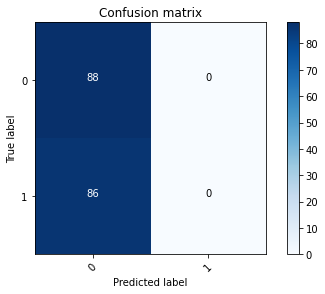

2022-08-20 14:22:25 - [Epoch Train: 1] loss: 0.6958, auc: 0.4954, acc: 0.4985, time: 42.00 s            
2022-08-20 14:22:25 - [Epoch Valid: 1] loss: 0.6937, auc: 0.5392, acc: 0.5020, time: 12.00 s
2022-08-20 14:22:25 - acc improved from 0.0000 to 0.5020. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_14-21-30/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e1-loss0.694-acc0.502-auc0.539.pth'


  1%|▍                                        | 1/100 [00:54<1:30:35, 54.90s/it]

2022-08-20 14:22:25 - EPOCH: 2
2022-08-20 14:22:26 - Train Step 10/969, train_loss: 0.6755
2022-08-20 14:22:26 - Train Step 20/969, train_loss: 0.6718
2022-08-20 14:22:27 - Train Step 30/969, train_loss: 0.6775
2022-08-20 14:22:27 - Train Step 40/969, train_loss: 0.6829
2022-08-20 14:22:28 - Train Step 50/969, train_loss: 0.6804
2022-08-20 14:22:28 - Train Step 60/969, train_loss: 0.6833
2022-08-20 14:22:29 - Train Step 70/969, train_loss: 0.6879
2022-08-20 14:22:29 - Train Step 80/969, train_loss: 0.6887
2022-08-20 14:22:30 - Train Step 90/969, train_loss: 0.6878
2022-08-20 14:22:30 - Train Step 100/969, train_loss: 0.6883
2022-08-20 14:22:31 - Train Step 110/969, train_loss: 0.6916
2022-08-20 14:22:31 - Train Step 120/969, train_loss: 0.6908
2022-08-20 14:22:32 - Train Step 130/969, train_loss: 0.6909
2022-08-20 14:22:32 - Train Step 140/969, train_loss: 0.6909
2022-08-20 14:22:33 - Train Step 150/969, train_loss: 0.6924
2022-08-20 14:22:33 - Train Step 160/969, train_loss: 0.6915
20

2022-08-20 14:23:23 - Valid Step 190/251, valid_loss: 0.6917
2022-08-20 14:23:23 - Valid Step 195/251, valid_loss: 0.6917
2022-08-20 14:23:23 - Valid Step 200/251, valid_loss: 0.6921
2022-08-20 14:23:23 - Valid Step 205/251, valid_loss: 0.6933
2022-08-20 14:23:24 - Valid Step 210/251, valid_loss: 0.6931
2022-08-20 14:23:24 - Valid Step 215/251, valid_loss: 0.6932
2022-08-20 14:23:24 - Valid Step 220/251, valid_loss: 0.6923
2022-08-20 14:23:24 - Valid Step 225/251, valid_loss: 0.6926
2022-08-20 14:23:25 - Valid Step 230/251, valid_loss: 0.6927
2022-08-20 14:23:25 - Valid Step 235/251, valid_loss: 0.6929
2022-08-20 14:23:25 - Valid Step 240/251, valid_loss: 0.6925
2022-08-20 14:23:25 - Valid Step 245/251, valid_loss: 0.6927
2022-08-20 14:23:26 - Valid Step 250/251, valid_loss: 0.6933
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
155     00012                1           0
61      00021                0         

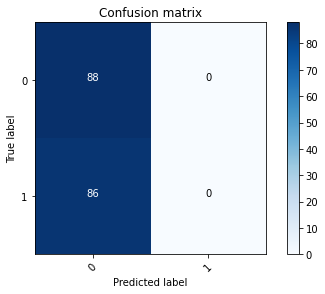

2022-08-20 14:23:26 - [Epoch Train: 2] loss: 0.6910, auc: 0.5226, acc: 0.4985, time: 48.00 s            
2022-08-20 14:23:26 - [Epoch Valid: 2] loss: 0.6930, auc: 0.5419, acc: 0.5020, time: 12.00 s
2022-08-20 14:23:26 - acc improved from 0.5020 to 0.5020. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_14-21-30/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e2-loss0.693-acc0.502-auc0.542.pth'


  2%|▊                                        | 2/100 [01:55<1:35:17, 58.34s/it]

2022-08-20 14:23:26 - EPOCH: 3
2022-08-20 14:23:26 - Train Step 10/969, train_loss: 0.6662
2022-08-20 14:23:27 - Train Step 20/969, train_loss: 0.6738
2022-08-20 14:23:27 - Train Step 30/969, train_loss: 0.6704
2022-08-20 14:23:28 - Train Step 40/969, train_loss: 0.6800
2022-08-20 14:23:28 - Train Step 50/969, train_loss: 0.6853
2022-08-20 14:23:29 - Train Step 60/969, train_loss: 0.6877
2022-08-20 14:23:29 - Train Step 70/969, train_loss: 0.6866
2022-08-20 14:23:30 - Train Step 80/969, train_loss: 0.6856
2022-08-20 14:23:30 - Train Step 90/969, train_loss: 0.6866
2022-08-20 14:23:31 - Train Step 100/969, train_loss: 0.6851
2022-08-20 14:23:31 - Train Step 110/969, train_loss: 0.6865
2022-08-20 14:23:32 - Train Step 120/969, train_loss: 0.6863
2022-08-20 14:23:32 - Train Step 130/969, train_loss: 0.6897
2022-08-20 14:23:33 - Train Step 140/969, train_loss: 0.6900
2022-08-20 14:23:33 - Train Step 150/969, train_loss: 0.6888
2022-08-20 14:23:34 - Train Step 160/969, train_loss: 0.6883
20

2022-08-20 14:24:23 - Valid Step 190/251, valid_loss: 0.6963
2022-08-20 14:24:23 - Valid Step 195/251, valid_loss: 0.6959
2022-08-20 14:24:24 - Valid Step 200/251, valid_loss: 0.6952
2022-08-20 14:24:24 - Valid Step 205/251, valid_loss: 0.6957
2022-08-20 14:24:24 - Valid Step 210/251, valid_loss: 0.6957
2022-08-20 14:24:24 - Valid Step 215/251, valid_loss: 0.6953
2022-08-20 14:24:25 - Valid Step 220/251, valid_loss: 0.6948
2022-08-20 14:24:25 - Valid Step 225/251, valid_loss: 0.6945
2022-08-20 14:24:25 - Valid Step 230/251, valid_loss: 0.6944
2022-08-20 14:24:25 - Valid Step 235/251, valid_loss: 0.6937
2022-08-20 14:24:26 - Valid Step 240/251, valid_loss: 0.6924
2022-08-20 14:24:26 - Valid Step 245/251, valid_loss: 0.6920
2022-08-20 14:24:26 - Valid Step 250/251, valid_loss: 0.6911
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
156     00012                1           0
107     00021                0         

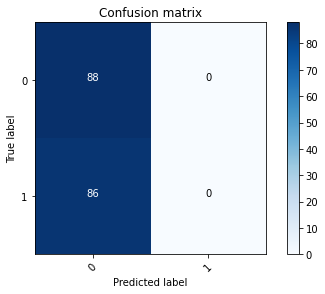

2022-08-20 14:24:26 - [Epoch Train: 3] loss: 0.6881, auc: 0.5577, acc: 0.4985, time: 47.00 s            
2022-08-20 14:24:26 - [Epoch Valid: 3] loss: 0.6910, auc: 0.5536, acc: 0.5020, time: 12.00 s
2022-08-20 14:24:26 - acc improved from 0.5020 to 0.5020. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_14-21-30/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e3-loss0.691-acc0.502-auc0.554.pth'


  3%|█▏                                       | 3/100 [02:56<1:36:03, 59.42s/it]

2022-08-20 14:24:26 - EPOCH: 4
2022-08-20 14:24:27 - Train Step 10/969, train_loss: 0.6785
2022-08-20 14:24:28 - Train Step 20/969, train_loss: 0.6625
2022-08-20 14:24:28 - Train Step 30/969, train_loss: 0.6651
2022-08-20 14:24:28 - Train Step 40/969, train_loss: 0.6607
2022-08-20 14:24:29 - Train Step 50/969, train_loss: 0.6615
2022-08-20 14:24:29 - Train Step 60/969, train_loss: 0.6724
2022-08-20 14:24:30 - Train Step 70/969, train_loss: 0.6757
2022-08-20 14:24:30 - Train Step 80/969, train_loss: 0.6684
2022-08-20 14:24:31 - Train Step 90/969, train_loss: 0.6689
2022-08-20 14:24:31 - Train Step 100/969, train_loss: 0.6680
2022-08-20 14:24:32 - Train Step 110/969, train_loss: 0.6691
2022-08-20 14:24:32 - Train Step 120/969, train_loss: 0.6688
2022-08-20 14:24:33 - Train Step 130/969, train_loss: 0.6670
2022-08-20 14:24:33 - Train Step 140/969, train_loss: 0.6637
2022-08-20 14:24:34 - Train Step 150/969, train_loss: 0.6645
2022-08-20 14:24:34 - Train Step 160/969, train_loss: 0.6710
20

2022-08-20 14:25:24 - Valid Step 190/251, valid_loss: 0.6864
2022-08-20 14:25:25 - Valid Step 195/251, valid_loss: 0.6873
2022-08-20 14:25:25 - Valid Step 200/251, valid_loss: 0.6883
2022-08-20 14:25:25 - Valid Step 205/251, valid_loss: 0.6924
2022-08-20 14:25:25 - Valid Step 210/251, valid_loss: 0.6908
2022-08-20 14:25:26 - Valid Step 215/251, valid_loss: 0.6912
2022-08-20 14:25:26 - Valid Step 220/251, valid_loss: 0.6935
2022-08-20 14:25:26 - Valid Step 225/251, valid_loss: 0.6928
2022-08-20 14:25:26 - Valid Step 230/251, valid_loss: 0.6917
2022-08-20 14:25:26 - Valid Step 235/251, valid_loss: 0.6915
2022-08-20 14:25:27 - Valid Step 240/251, valid_loss: 0.6927
2022-08-20 14:25:27 - Valid Step 245/251, valid_loss: 0.6915
2022-08-20 14:25:27 - Valid Step 250/251, valid_loss: 0.6901
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
173     00012                1           0
60      00021                0         

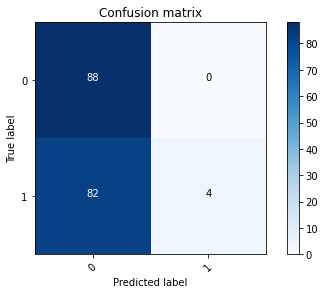

2022-08-20 14:25:28 - [Epoch Train: 4] loss: 0.6748, auc: 0.6281, acc: 0.5036, time: 48.00 s            
2022-08-20 14:25:28 - [Epoch Valid: 4] loss: 0.6903, auc: 0.5493, acc: 0.5179, time: 12.00 s
2022-08-20 14:25:28 - acc improved from 0.5020 to 0.5179. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_14-21-30/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e4-loss0.690-acc0.518-auc0.549.pth'


  4%|█▋                                       | 4/100 [03:57<1:36:08, 60.09s/it]

2022-08-20 14:25:28 - EPOCH: 5
2022-08-20 14:25:28 - Train Step 10/969, train_loss: 0.6449
2022-08-20 14:25:29 - Train Step 20/969, train_loss: 0.6718
2022-08-20 14:25:29 - Train Step 30/969, train_loss: 0.6710
2022-08-20 14:25:30 - Train Step 40/969, train_loss: 0.6557
2022-08-20 14:25:30 - Train Step 50/969, train_loss: 0.6597
2022-08-20 14:25:31 - Train Step 60/969, train_loss: 0.6472
2022-08-20 14:25:31 - Train Step 70/969, train_loss: 0.6430
2022-08-20 14:25:32 - Train Step 80/969, train_loss: 0.6625
2022-08-20 14:25:32 - Train Step 90/969, train_loss: 0.6627
2022-08-20 14:25:33 - Train Step 100/969, train_loss: 0.6514
2022-08-20 14:25:33 - Train Step 110/969, train_loss: 0.6481
2022-08-20 14:25:34 - Train Step 120/969, train_loss: 0.6546
2022-08-20 14:25:34 - Train Step 130/969, train_loss: 0.6597
2022-08-20 14:25:35 - Train Step 140/969, train_loss: 0.6691
2022-08-20 14:25:35 - Train Step 150/969, train_loss: 0.6731
2022-08-20 14:25:36 - Train Step 160/969, train_loss: 0.6731
20

2022-08-20 14:26:25 - Valid Step 190/251, valid_loss: 0.6834
2022-08-20 14:26:26 - Valid Step 195/251, valid_loss: 0.6829
2022-08-20 14:26:26 - Valid Step 200/251, valid_loss: 0.6848
2022-08-20 14:26:26 - Valid Step 205/251, valid_loss: 0.6834
2022-08-20 14:26:26 - Valid Step 210/251, valid_loss: 0.6852
2022-08-20 14:26:27 - Valid Step 215/251, valid_loss: 0.6858
2022-08-20 14:26:27 - Valid Step 220/251, valid_loss: 0.6875
2022-08-20 14:26:27 - Valid Step 225/251, valid_loss: 0.6872
2022-08-20 14:26:27 - Valid Step 230/251, valid_loss: 0.6861
2022-08-20 14:26:28 - Valid Step 235/251, valid_loss: 0.6900
2022-08-20 14:26:28 - Valid Step 240/251, valid_loss: 0.6914
2022-08-20 14:26:28 - Valid Step 245/251, valid_loss: 0.6936
2022-08-20 14:26:28 - Valid Step 250/251, valid_loss: 0.6905
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
51      00012                1           0
106     00021                0         

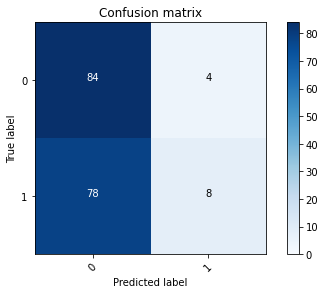

2022-08-20 14:26:29 - [Epoch Train: 5] loss: 0.6547, auc: 0.6624, acc: 0.5346, time: 48.00 s            
2022-08-20 14:26:29 - [Epoch Valid: 5] loss: 0.6898, auc: 0.5556, acc: 0.5139, time: 12.00 s


  5%|██                                       | 5/100 [04:58<1:35:39, 60.42s/it]

2022-08-20 14:26:29 - EPOCH: 6
2022-08-20 14:26:29 - Train Step 10/969, train_loss: 0.7407
2022-08-20 14:26:30 - Train Step 20/969, train_loss: 0.6785
2022-08-20 14:26:30 - Train Step 30/969, train_loss: 0.6763
2022-08-20 14:26:31 - Train Step 40/969, train_loss: 0.6868
2022-08-20 14:26:31 - Train Step 50/969, train_loss: 0.6734
2022-08-20 14:26:32 - Train Step 60/969, train_loss: 0.6774
2022-08-20 14:26:32 - Train Step 70/969, train_loss: 0.6670
2022-08-20 14:26:33 - Train Step 80/969, train_loss: 0.6589
2022-08-20 14:26:33 - Train Step 90/969, train_loss: 0.6565
2022-08-20 14:26:34 - Train Step 100/969, train_loss: 0.6520
2022-08-20 14:26:34 - Train Step 110/969, train_loss: 0.6448
2022-08-20 14:26:35 - Train Step 120/969, train_loss: 0.6483
2022-08-20 14:26:35 - Train Step 130/969, train_loss: 0.6416
2022-08-20 14:26:36 - Train Step 140/969, train_loss: 0.6388
2022-08-20 14:26:36 - Train Step 150/969, train_loss: 0.6424
2022-08-20 14:26:37 - Train Step 160/969, train_loss: 0.6445
20

2022-08-20 14:27:29 - Valid Step 190/251, valid_loss: 0.6940
2022-08-20 14:27:29 - Valid Step 195/251, valid_loss: 0.6908
2022-08-20 14:27:29 - Valid Step 200/251, valid_loss: 0.6890
2022-08-20 14:27:30 - Valid Step 205/251, valid_loss: 0.6913
2022-08-20 14:27:30 - Valid Step 210/251, valid_loss: 0.6876
2022-08-20 14:27:30 - Valid Step 215/251, valid_loss: 0.6883
2022-08-20 14:27:30 - Valid Step 220/251, valid_loss: 0.6890
2022-08-20 14:27:31 - Valid Step 225/251, valid_loss: 0.6909
2022-08-20 14:27:31 - Valid Step 230/251, valid_loss: 0.6915
2022-08-20 14:27:31 - Valid Step 235/251, valid_loss: 0.6917
2022-08-20 14:27:31 - Valid Step 240/251, valid_loss: 0.6946
2022-08-20 14:27:32 - Valid Step 245/251, valid_loss: 0.6952
2022-08-20 14:27:32 - Valid Step 250/251, valid_loss: 0.6964
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
47      00012                1           0
98      00021                0         

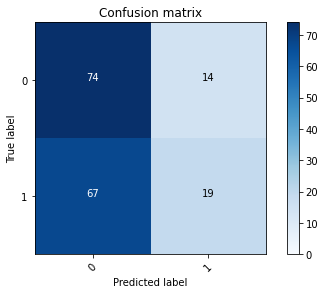

2022-08-20 14:27:32 - [Epoch Train: 6] loss: 0.6311, auc: 0.6979, acc: 0.5831, time: 50.00 s            
2022-08-20 14:27:32 - [Epoch Valid: 6] loss: 0.6957, auc: 0.5642, acc: 0.5139, time: 13.00 s


  6%|██▍                                      | 6/100 [06:02<1:36:22, 61.52s/it]

2022-08-20 14:27:32 - EPOCH: 7
2022-08-20 14:27:33 - Train Step 10/969, train_loss: 0.7054
2022-08-20 14:27:33 - Train Step 20/969, train_loss: 0.6173
2022-08-20 14:27:34 - Train Step 30/969, train_loss: 0.6108
2022-08-20 14:27:34 - Train Step 40/969, train_loss: 0.5946
2022-08-20 14:27:35 - Train Step 50/969, train_loss: 0.6048
2022-08-20 14:27:35 - Train Step 60/969, train_loss: 0.5987
2022-08-20 14:27:36 - Train Step 70/969, train_loss: 0.6016
2022-08-20 14:27:36 - Train Step 80/969, train_loss: 0.6138
2022-08-20 14:27:37 - Train Step 90/969, train_loss: 0.6092
2022-08-20 14:27:38 - Train Step 100/969, train_loss: 0.6076
2022-08-20 14:27:38 - Train Step 110/969, train_loss: 0.6236
2022-08-20 14:27:39 - Train Step 120/969, train_loss: 0.6235
2022-08-20 14:27:39 - Train Step 130/969, train_loss: 0.6282
2022-08-20 14:27:40 - Train Step 140/969, train_loss: 0.6252
2022-08-20 14:27:40 - Train Step 150/969, train_loss: 0.6193
2022-08-20 14:27:41 - Train Step 160/969, train_loss: 0.6194
20

2022-08-20 14:28:32 - Valid Step 190/251, valid_loss: 0.6894
2022-08-20 14:28:33 - Valid Step 195/251, valid_loss: 0.6951
2022-08-20 14:28:33 - Valid Step 200/251, valid_loss: 0.6923
2022-08-20 14:28:33 - Valid Step 205/251, valid_loss: 0.6966
2022-08-20 14:28:34 - Valid Step 210/251, valid_loss: 0.6979
2022-08-20 14:28:34 - Valid Step 215/251, valid_loss: 0.7027
2022-08-20 14:28:34 - Valid Step 220/251, valid_loss: 0.7026
2022-08-20 14:28:34 - Valid Step 225/251, valid_loss: 0.7014
2022-08-20 14:28:35 - Valid Step 230/251, valid_loss: 0.6970
2022-08-20 14:28:35 - Valid Step 235/251, valid_loss: 0.6983
2022-08-20 14:28:35 - Valid Step 240/251, valid_loss: 0.7012
2022-08-20 14:28:35 - Valid Step 245/251, valid_loss: 0.7030
2022-08-20 14:28:36 - Valid Step 250/251, valid_loss: 0.7049
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
73      00012                1           0
3       00021                0         

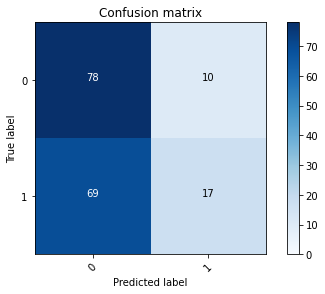

2022-08-20 14:28:36 - [Epoch Train: 7] loss: 0.5985, auc: 0.7306, acc: 0.6347, time: 50.00 s            
2022-08-20 14:28:36 - [Epoch Valid: 7] loss: 0.7070, auc: 0.5588, acc: 0.5339, time: 13.00 s
2022-08-20 14:28:36 - acc improved from 0.5179 to 0.5339. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_14-21-30/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e7-loss0.707-acc0.534-auc0.559.pth'


  7%|██▊                                      | 7/100 [07:05<1:36:25, 62.21s/it]

2022-08-20 14:28:36 - EPOCH: 8
2022-08-20 14:28:36 - Train Step 10/969, train_loss: 0.6596
2022-08-20 14:28:37 - Train Step 20/969, train_loss: 0.5375
2022-08-20 14:28:38 - Train Step 30/969, train_loss: 0.6024
2022-08-20 14:28:38 - Train Step 40/969, train_loss: 0.5888
2022-08-20 14:28:39 - Train Step 50/969, train_loss: 0.5789
2022-08-20 14:28:39 - Train Step 60/969, train_loss: 0.5660
2022-08-20 14:28:40 - Train Step 70/969, train_loss: 0.5886
2022-08-20 14:28:40 - Train Step 80/969, train_loss: 0.6024
2022-08-20 14:28:41 - Train Step 90/969, train_loss: 0.5946
2022-08-20 14:28:41 - Train Step 100/969, train_loss: 0.5836
2022-08-20 14:28:42 - Train Step 110/969, train_loss: 0.5766
2022-08-20 14:28:42 - Train Step 120/969, train_loss: 0.5737
2022-08-20 14:28:43 - Train Step 130/969, train_loss: 0.5747
2022-08-20 14:28:43 - Train Step 140/969, train_loss: 0.5750
2022-08-20 14:28:44 - Train Step 150/969, train_loss: 0.5731
2022-08-20 14:28:44 - Train Step 160/969, train_loss: 0.5703
20

2022-08-20 14:29:36 - Valid Step 190/251, valid_loss: 0.7221
2022-08-20 14:29:36 - Valid Step 195/251, valid_loss: 0.7318
2022-08-20 14:29:37 - Valid Step 200/251, valid_loss: 0.7306
2022-08-20 14:29:37 - Valid Step 205/251, valid_loss: 0.7249
2022-08-20 14:29:37 - Valid Step 210/251, valid_loss: 0.7283
2022-08-20 14:29:37 - Valid Step 215/251, valid_loss: 0.7334
2022-08-20 14:29:38 - Valid Step 220/251, valid_loss: 0.7323
2022-08-20 14:29:38 - Valid Step 225/251, valid_loss: 0.7304
2022-08-20 14:29:38 - Valid Step 230/251, valid_loss: 0.7282
2022-08-20 14:29:38 - Valid Step 235/251, valid_loss: 0.7273
2022-08-20 14:29:39 - Valid Step 240/251, valid_loss: 0.7258
2022-08-20 14:29:39 - Valid Step 245/251, valid_loss: 0.7251
2022-08-20 14:29:39 - Valid Step 250/251, valid_loss: 0.7258
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
93      00012                1           0
69      00021                0         

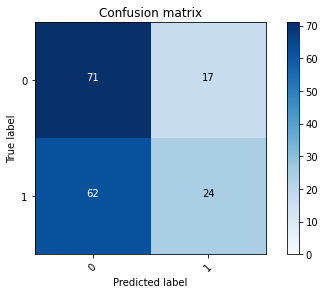

2022-08-20 14:29:39 - [Epoch Train: 8] loss: 0.5654, auc: 0.7677, acc: 0.6760, time: 50.00 s            
2022-08-20 14:29:39 - [Epoch Valid: 8] loss: 0.7268, auc: 0.5587, acc: 0.5418, time: 13.00 s
2022-08-20 14:29:39 - acc improved from 0.5339 to 0.5418. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_14-21-30/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e8-loss0.727-acc0.542-auc0.559.pth'


  8%|███▎                                     | 8/100 [08:09<1:36:02, 62.63s/it]

2022-08-20 14:29:39 - EPOCH: 9
2022-08-20 14:29:40 - Train Step 10/969, train_loss: 0.4168
2022-08-20 14:29:41 - Train Step 20/969, train_loss: 0.4177
2022-08-20 14:29:41 - Train Step 30/969, train_loss: 0.4484
2022-08-20 14:29:42 - Train Step 40/969, train_loss: 0.4815
2022-08-20 14:29:42 - Train Step 50/969, train_loss: 0.5293
2022-08-20 14:29:43 - Train Step 60/969, train_loss: 0.5352
2022-08-20 14:29:43 - Train Step 70/969, train_loss: 0.5901
2022-08-20 14:29:44 - Train Step 80/969, train_loss: 0.5815
2022-08-20 14:29:44 - Train Step 90/969, train_loss: 0.5719
2022-08-20 14:29:45 - Train Step 100/969, train_loss: 0.5620
2022-08-20 14:29:45 - Train Step 110/969, train_loss: 0.5604
2022-08-20 14:29:46 - Train Step 120/969, train_loss: 0.5619
2022-08-20 14:29:46 - Train Step 130/969, train_loss: 0.5424
2022-08-20 14:29:47 - Train Step 140/969, train_loss: 0.5438
2022-08-20 14:29:47 - Train Step 150/969, train_loss: 0.5454
2022-08-20 14:29:48 - Train Step 160/969, train_loss: 0.5421
20

2022-08-20 14:30:40 - Valid Step 190/251, valid_loss: 0.7534
2022-08-20 14:30:40 - Valid Step 195/251, valid_loss: 0.7464
2022-08-20 14:30:40 - Valid Step 200/251, valid_loss: 0.7461
2022-08-20 14:30:40 - Valid Step 205/251, valid_loss: 0.7534
2022-08-20 14:30:41 - Valid Step 210/251, valid_loss: 0.7513
2022-08-20 14:30:41 - Valid Step 215/251, valid_loss: 0.7529
2022-08-20 14:30:41 - Valid Step 220/251, valid_loss: 0.7527
2022-08-20 14:30:41 - Valid Step 225/251, valid_loss: 0.7528
2022-08-20 14:30:42 - Valid Step 230/251, valid_loss: 0.7486
2022-08-20 14:30:42 - Valid Step 235/251, valid_loss: 0.7502
2022-08-20 14:30:42 - Valid Step 240/251, valid_loss: 0.7418
2022-08-20 14:30:42 - Valid Step 245/251, valid_loss: 0.7410
2022-08-20 14:30:43 - Valid Step 250/251, valid_loss: 0.7511
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
141     00012                1           0
171     00021                0         

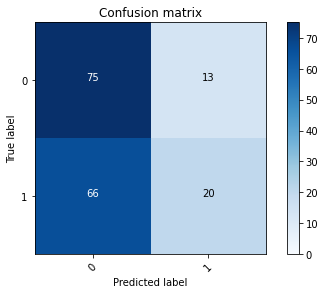

2022-08-20 14:30:43 - [Epoch Train: 9] loss: 0.5370, auc: 0.7851, acc: 0.7079, time: 50.00 s            
2022-08-20 14:30:43 - [Epoch Valid: 9] loss: 0.7527, auc: 0.5667, acc: 0.5378, time: 13.00 s


  9%|███▋                                     | 9/100 [09:12<1:35:27, 62.94s/it]

2022-08-20 14:30:43 - EPOCH: 10
2022-08-20 14:30:44 - Train Step 10/969, train_loss: 0.5512
2022-08-20 14:30:44 - Train Step 20/969, train_loss: 0.4894
2022-08-20 14:30:45 - Train Step 30/969, train_loss: 0.5054
2022-08-20 14:30:45 - Train Step 40/969, train_loss: 0.5188
2022-08-20 14:30:46 - Train Step 50/969, train_loss: 0.5135
2022-08-20 14:30:46 - Train Step 60/969, train_loss: 0.4899
2022-08-20 14:30:47 - Train Step 70/969, train_loss: 0.4791
2022-08-20 14:30:47 - Train Step 80/969, train_loss: 0.4644
2022-08-20 14:30:48 - Train Step 90/969, train_loss: 0.4642
2022-08-20 14:30:48 - Train Step 100/969, train_loss: 0.4844
2022-08-20 14:30:49 - Train Step 110/969, train_loss: 0.4719
2022-08-20 14:30:49 - Train Step 120/969, train_loss: 0.4741
2022-08-20 14:30:50 - Train Step 130/969, train_loss: 0.4888
2022-08-20 14:30:50 - Train Step 140/969, train_loss: 0.4961
2022-08-20 14:30:51 - Train Step 150/969, train_loss: 0.5167
2022-08-20 14:30:51 - Train Step 160/969, train_loss: 0.5109
2

2022-08-20 14:31:43 - Valid Step 190/251, valid_loss: 0.7198
2022-08-20 14:31:43 - Valid Step 195/251, valid_loss: 0.7290
2022-08-20 14:31:44 - Valid Step 200/251, valid_loss: 0.7298
2022-08-20 14:31:44 - Valid Step 205/251, valid_loss: 0.7250
2022-08-20 14:31:44 - Valid Step 210/251, valid_loss: 0.7227
2022-08-20 14:31:44 - Valid Step 215/251, valid_loss: 0.7198
2022-08-20 14:31:45 - Valid Step 220/251, valid_loss: 0.7231
2022-08-20 14:31:45 - Valid Step 225/251, valid_loss: 0.7282
2022-08-20 14:31:45 - Valid Step 230/251, valid_loss: 0.7297
2022-08-20 14:31:45 - Valid Step 235/251, valid_loss: 0.7339
2022-08-20 14:31:46 - Valid Step 240/251, valid_loss: 0.7318
2022-08-20 14:31:46 - Valid Step 245/251, valid_loss: 0.7366
2022-08-20 14:31:46 - Valid Step 250/251, valid_loss: 0.7346
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
49      00012                1           0
21      00021                0         

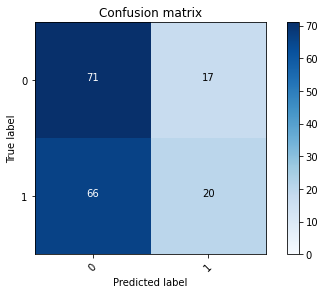

2022-08-20 14:31:46 - [Epoch Train: 10] loss: 0.5073, auc: 0.8078, acc: 0.7049, time: 50.00 s            
2022-08-20 14:31:46 - [Epoch Valid: 10] loss: 0.7350, auc: 0.5544, acc: 0.5219, time: 13.00 s


 10%|████                                    | 10/100 [10:16<1:34:40, 63.12s/it]

2022-08-20 14:31:46 - EPOCH: 11
2022-08-20 14:31:47 - Train Step 10/969, train_loss: 0.4840
2022-08-20 14:31:48 - Train Step 20/969, train_loss: 0.5439
2022-08-20 14:31:48 - Train Step 30/969, train_loss: 0.5380
2022-08-20 14:31:49 - Train Step 40/969, train_loss: 0.5391
2022-08-20 14:31:49 - Train Step 50/969, train_loss: 0.5058
2022-08-20 14:31:50 - Train Step 60/969, train_loss: 0.5137
2022-08-20 14:31:50 - Train Step 70/969, train_loss: 0.4840
2022-08-20 14:31:51 - Train Step 80/969, train_loss: 0.4694
2022-08-20 14:31:51 - Train Step 90/969, train_loss: 0.4794
2022-08-20 14:31:52 - Train Step 100/969, train_loss: 0.5003
2022-08-20 14:31:52 - Train Step 110/969, train_loss: 0.4909
2022-08-20 14:31:53 - Train Step 120/969, train_loss: 0.4767
2022-08-20 14:31:53 - Train Step 130/969, train_loss: 0.4920
2022-08-20 14:31:54 - Train Step 140/969, train_loss: 0.4893
2022-08-20 14:31:54 - Train Step 150/969, train_loss: 0.4945
2022-08-20 14:31:55 - Train Step 160/969, train_loss: 0.5156
2

2022-08-20 14:32:46 - Valid Step 190/251, valid_loss: 0.7565
2022-08-20 14:32:47 - Valid Step 195/251, valid_loss: 0.7608
2022-08-20 14:32:47 - Valid Step 200/251, valid_loss: 0.7582
2022-08-20 14:32:47 - Valid Step 205/251, valid_loss: 0.7557
2022-08-20 14:32:48 - Valid Step 210/251, valid_loss: 0.7534
2022-08-20 14:32:48 - Valid Step 215/251, valid_loss: 0.7561
2022-08-20 14:32:48 - Valid Step 220/251, valid_loss: 0.7523
2022-08-20 14:32:48 - Valid Step 225/251, valid_loss: 0.7575
2022-08-20 14:32:49 - Valid Step 230/251, valid_loss: 0.7562
2022-08-20 14:32:49 - Valid Step 235/251, valid_loss: 0.7552
2022-08-20 14:32:49 - Valid Step 240/251, valid_loss: 0.7575
2022-08-20 14:32:49 - Valid Step 245/251, valid_loss: 0.7548
2022-08-20 14:32:50 - Valid Step 250/251, valid_loss: 0.7577
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
79      00012                1           0
20      00021                0         

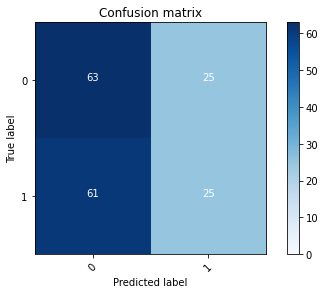

2022-08-20 14:32:50 - [Epoch Train: 11] loss: 0.4775, auc: 0.8418, acc: 0.7637, time: 49.00 s            
2022-08-20 14:32:50 - [Epoch Valid: 11] loss: 0.7613, auc: 0.5567, acc: 0.5020, time: 13.00 s


 11%|████▍                                   | 11/100 [11:19<1:33:41, 63.17s/it]

2022-08-20 14:32:50 - EPOCH: 12
2022-08-20 14:32:50 - Train Step 10/969, train_loss: 0.4664
2022-08-20 14:32:51 - Train Step 20/969, train_loss: 0.4603
2022-08-20 14:32:51 - Train Step 30/969, train_loss: 0.5129
2022-08-20 14:32:52 - Train Step 40/969, train_loss: 0.4931
2022-08-20 14:32:53 - Train Step 50/969, train_loss: 0.4932
2022-08-20 14:32:53 - Train Step 60/969, train_loss: 0.4849
2022-08-20 14:32:54 - Train Step 70/969, train_loss: 0.4833
2022-08-20 14:32:54 - Train Step 80/969, train_loss: 0.4650
2022-08-20 14:32:55 - Train Step 90/969, train_loss: 0.4591
2022-08-20 14:32:55 - Train Step 100/969, train_loss: 0.4495
2022-08-20 14:32:56 - Train Step 110/969, train_loss: 0.4482
2022-08-20 14:32:56 - Train Step 120/969, train_loss: 0.4382
2022-08-20 14:32:57 - Train Step 130/969, train_loss: 0.4253
2022-08-20 14:32:57 - Train Step 140/969, train_loss: 0.4278
2022-08-20 14:32:58 - Train Step 150/969, train_loss: 0.4191
2022-08-20 14:32:58 - Train Step 160/969, train_loss: 0.4207
2

2022-08-20 14:33:50 - Valid Step 190/251, valid_loss: 0.7496
2022-08-20 14:33:50 - Valid Step 195/251, valid_loss: 0.7525
2022-08-20 14:33:50 - Valid Step 200/251, valid_loss: 0.7423
2022-08-20 14:33:51 - Valid Step 205/251, valid_loss: 0.7436
2022-08-20 14:33:51 - Valid Step 210/251, valid_loss: 0.7513
2022-08-20 14:33:51 - Valid Step 215/251, valid_loss: 0.7565
2022-08-20 14:33:51 - Valid Step 220/251, valid_loss: 0.7539
2022-08-20 14:33:52 - Valid Step 225/251, valid_loss: 0.7581
2022-08-20 14:33:52 - Valid Step 230/251, valid_loss: 0.7551
2022-08-20 14:33:52 - Valid Step 235/251, valid_loss: 0.7566
2022-08-20 14:33:52 - Valid Step 240/251, valid_loss: 0.7584
2022-08-20 14:33:53 - Valid Step 245/251, valid_loss: 0.7660
2022-08-20 14:33:53 - Valid Step 250/251, valid_loss: 0.7635
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
36      00012                1           0
89      00021                0         

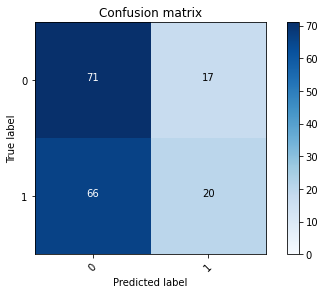

2022-08-20 14:33:53 - [Epoch Train: 12] loss: 0.4700, auc: 0.8391, acc: 0.7544, time: 50.00 s            
2022-08-20 14:33:53 - [Epoch Valid: 12] loss: 0.7644, auc: 0.5505, acc: 0.5259, time: 13.00 s


 12%|████▊                                   | 12/100 [12:23<1:32:42, 63.21s/it]

2022-08-20 14:33:53 - EPOCH: 13
2022-08-20 14:33:54 - Train Step 10/969, train_loss: 0.5423
2022-08-20 14:33:54 - Train Step 20/969, train_loss: 0.4980
2022-08-20 14:33:55 - Train Step 30/969, train_loss: 0.5091
2022-08-20 14:33:55 - Train Step 40/969, train_loss: 0.4977
2022-08-20 14:33:56 - Train Step 50/969, train_loss: 0.4865
2022-08-20 14:33:56 - Train Step 60/969, train_loss: 0.4477
2022-08-20 14:33:57 - Train Step 70/969, train_loss: 0.4607
2022-08-20 14:33:57 - Train Step 80/969, train_loss: 0.4499
2022-08-20 14:33:58 - Train Step 90/969, train_loss: 0.4539
2022-08-20 14:33:58 - Train Step 100/969, train_loss: 0.4668
2022-08-20 14:33:59 - Train Step 110/969, train_loss: 0.4464
2022-08-20 14:33:59 - Train Step 120/969, train_loss: 0.4497
2022-08-20 14:34:00 - Train Step 130/969, train_loss: 0.4431
2022-08-20 14:34:00 - Train Step 140/969, train_loss: 0.4360
2022-08-20 14:34:01 - Train Step 150/969, train_loss: 0.4379
2022-08-20 14:34:02 - Train Step 160/969, train_loss: 0.4466
2

2022-08-20 14:34:53 - Valid Step 190/251, valid_loss: 0.8339
2022-08-20 14:34:54 - Valid Step 195/251, valid_loss: 0.8383
2022-08-20 14:34:54 - Valid Step 200/251, valid_loss: 0.8313
2022-08-20 14:34:54 - Valid Step 205/251, valid_loss: 0.8179
2022-08-20 14:34:55 - Valid Step 210/251, valid_loss: 0.8170
2022-08-20 14:34:55 - Valid Step 215/251, valid_loss: 0.8144
2022-08-20 14:34:55 - Valid Step 220/251, valid_loss: 0.8102
2022-08-20 14:34:55 - Valid Step 225/251, valid_loss: 0.8114
2022-08-20 14:34:56 - Valid Step 230/251, valid_loss: 0.8117
2022-08-20 14:34:56 - Valid Step 235/251, valid_loss: 0.8111
2022-08-20 14:34:56 - Valid Step 240/251, valid_loss: 0.8004
2022-08-20 14:34:56 - Valid Step 245/251, valid_loss: 0.7968
2022-08-20 14:34:57 - Valid Step 250/251, valid_loss: 0.7955
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
146     00012                1           0
158     00021                0         

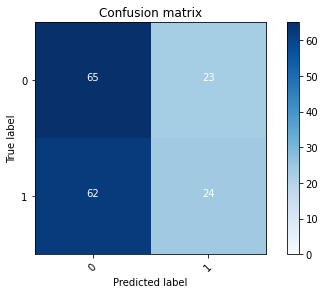

2022-08-20 14:34:57 - [Epoch Train: 13] loss: 0.4422, auc: 0.8625, acc: 0.7761, time: 50.00 s            
2022-08-20 14:34:57 - [Epoch Valid: 13] loss: 0.7952, auc: 0.5465, acc: 0.5100, time: 13.00 s


 13%|█████▏                                  | 13/100 [13:26<1:31:54, 63.38s/it]

2022-08-20 14:34:57 - EPOCH: 14
2022-08-20 14:34:58 - Train Step 10/969, train_loss: 0.3644
2022-08-20 14:34:58 - Train Step 20/969, train_loss: 0.4001
2022-08-20 14:34:59 - Train Step 30/969, train_loss: 0.3708
2022-08-20 14:34:59 - Train Step 40/969, train_loss: 0.3930
2022-08-20 14:35:00 - Train Step 50/969, train_loss: 0.3822
2022-08-20 14:35:00 - Train Step 60/969, train_loss: 0.4136
2022-08-20 14:35:01 - Train Step 70/969, train_loss: 0.4395
2022-08-20 14:35:01 - Train Step 80/969, train_loss: 0.4154
2022-08-20 14:35:02 - Train Step 90/969, train_loss: 0.4013
2022-08-20 14:35:02 - Train Step 100/969, train_loss: 0.4197
2022-08-20 14:35:03 - Train Step 110/969, train_loss: 0.4385
2022-08-20 14:35:03 - Train Step 120/969, train_loss: 0.4352
2022-08-20 14:35:04 - Train Step 130/969, train_loss: 0.4399
2022-08-20 14:35:04 - Train Step 140/969, train_loss: 0.4425
2022-08-20 14:35:05 - Train Step 150/969, train_loss: 0.4425
2022-08-20 14:35:06 - Train Step 160/969, train_loss: 0.4353
2

2022-08-20 14:35:58 - Valid Step 190/251, valid_loss: 0.7782
2022-08-20 14:35:58 - Valid Step 195/251, valid_loss: 0.7769
2022-08-20 14:35:58 - Valid Step 200/251, valid_loss: 0.7694
2022-08-20 14:35:59 - Valid Step 205/251, valid_loss: 0.7646
2022-08-20 14:35:59 - Valid Step 210/251, valid_loss: 0.7669
2022-08-20 14:35:59 - Valid Step 215/251, valid_loss: 0.7653
2022-08-20 14:35:59 - Valid Step 220/251, valid_loss: 0.7891
2022-08-20 14:36:00 - Valid Step 225/251, valid_loss: 0.8002
2022-08-20 14:36:00 - Valid Step 230/251, valid_loss: 0.7996
2022-08-20 14:36:00 - Valid Step 235/251, valid_loss: 0.7950
2022-08-20 14:36:00 - Valid Step 240/251, valid_loss: 0.7981
2022-08-20 14:36:01 - Valid Step 245/251, valid_loss: 0.8030
2022-08-20 14:36:01 - Valid Step 250/251, valid_loss: 0.8020
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
91      00012                1           0
71      00021                0         

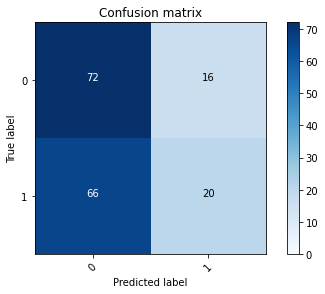

2022-08-20 14:36:01 - [Epoch Train: 14] loss: 0.4293, auc: 0.8661, acc: 0.7895, time: 51.00 s            
2022-08-20 14:36:01 - [Epoch Valid: 14] loss: 0.8003, auc: 0.5530, acc: 0.5299, time: 13.00 s


 14%|█████▌                                  | 14/100 [14:31<1:31:16, 63.68s/it]

2022-08-20 14:36:01 - EPOCH: 15
2022-08-20 14:36:02 - Train Step 10/969, train_loss: 0.2680
2022-08-20 14:36:02 - Train Step 20/969, train_loss: 0.3764
2022-08-20 14:36:03 - Train Step 30/969, train_loss: 0.4026
2022-08-20 14:36:04 - Train Step 40/969, train_loss: 0.4080
2022-08-20 14:36:04 - Train Step 50/969, train_loss: 0.4124
2022-08-20 14:36:05 - Train Step 60/969, train_loss: 0.4086
2022-08-20 14:36:05 - Train Step 70/969, train_loss: 0.4010
2022-08-20 14:36:06 - Train Step 80/969, train_loss: 0.3898
2022-08-20 14:36:06 - Train Step 90/969, train_loss: 0.4090
2022-08-20 14:36:07 - Train Step 100/969, train_loss: 0.4086
2022-08-20 14:36:07 - Train Step 110/969, train_loss: 0.4137
2022-08-20 14:36:08 - Train Step 120/969, train_loss: 0.3968
2022-08-20 14:36:08 - Train Step 130/969, train_loss: 0.4047
2022-08-20 14:36:09 - Train Step 140/969, train_loss: 0.3955
2022-08-20 14:36:09 - Train Step 150/969, train_loss: 0.3968
2022-08-20 14:36:10 - Train Step 160/969, train_loss: 0.4101
2

2022-08-20 14:37:02 - Valid Step 190/251, valid_loss: 0.8208
2022-08-20 14:37:02 - Valid Step 195/251, valid_loss: 0.8228
2022-08-20 14:37:02 - Valid Step 200/251, valid_loss: 0.8179
2022-08-20 14:37:02 - Valid Step 205/251, valid_loss: 0.8139
2022-08-20 14:37:03 - Valid Step 210/251, valid_loss: 0.8117
2022-08-20 14:37:03 - Valid Step 215/251, valid_loss: 0.8056
2022-08-20 14:37:03 - Valid Step 220/251, valid_loss: 0.8093
2022-08-20 14:37:03 - Valid Step 225/251, valid_loss: 0.8076
2022-08-20 14:37:04 - Valid Step 230/251, valid_loss: 0.7994
2022-08-20 14:37:04 - Valid Step 235/251, valid_loss: 0.8137
2022-08-20 14:37:04 - Valid Step 240/251, valid_loss: 0.8126
2022-08-20 14:37:05 - Valid Step 245/251, valid_loss: 0.8119
2022-08-20 14:37:05 - Valid Step 250/251, valid_loss: 0.8049
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
4       00012                1           0
160     00021                0         

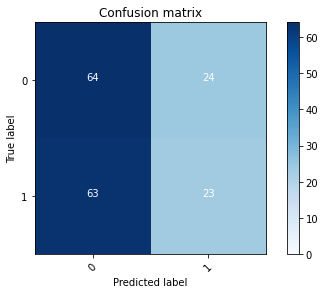

2022-08-20 14:37:05 - [Epoch Train: 15] loss: 0.4066, auc: 0.8810, acc: 0.8019, time: 50.00 s            
2022-08-20 14:37:05 - [Epoch Valid: 15] loss: 0.8035, auc: 0.5418, acc: 0.5060, time: 12.00 s


 15%|██████                                  | 15/100 [15:34<1:30:15, 63.71s/it]

2022-08-20 14:37:05 - EPOCH: 16
2022-08-20 14:37:06 - Train Step 10/969, train_loss: 0.2687
2022-08-20 14:37:06 - Train Step 20/969, train_loss: 0.4226
2022-08-20 14:37:07 - Train Step 30/969, train_loss: 0.4565
2022-08-20 14:37:07 - Train Step 40/969, train_loss: 0.4204
2022-08-20 14:37:08 - Train Step 50/969, train_loss: 0.3993
2022-08-20 14:37:08 - Train Step 60/969, train_loss: 0.4152
2022-08-20 14:37:09 - Train Step 70/969, train_loss: 0.4315
2022-08-20 14:37:09 - Train Step 80/969, train_loss: 0.4356
2022-08-20 14:37:10 - Train Step 90/969, train_loss: 0.4093
2022-08-20 14:37:10 - Train Step 100/969, train_loss: 0.4337
2022-08-20 14:37:11 - Train Step 110/969, train_loss: 0.4299
2022-08-20 14:37:11 - Train Step 120/969, train_loss: 0.4485
2022-08-20 14:37:12 - Train Step 130/969, train_loss: 0.4504
2022-08-20 14:37:12 - Train Step 140/969, train_loss: 0.4449
2022-08-20 14:37:13 - Train Step 150/969, train_loss: 0.4452
2022-08-20 14:37:13 - Train Step 160/969, train_loss: 0.4407
2

2022-08-20 14:38:05 - Valid Step 190/251, valid_loss: 0.8045
2022-08-20 14:38:05 - Valid Step 195/251, valid_loss: 0.8046
2022-08-20 14:38:05 - Valid Step 200/251, valid_loss: 0.8020
2022-08-20 14:38:06 - Valid Step 205/251, valid_loss: 0.8126
2022-08-20 14:38:06 - Valid Step 210/251, valid_loss: 0.8103
2022-08-20 14:38:06 - Valid Step 215/251, valid_loss: 0.8065
2022-08-20 14:38:07 - Valid Step 220/251, valid_loss: 0.8114
2022-08-20 14:38:07 - Valid Step 225/251, valid_loss: 0.8152
2022-08-20 14:38:07 - Valid Step 230/251, valid_loss: 0.8114
2022-08-20 14:38:07 - Valid Step 235/251, valid_loss: 0.8069
2022-08-20 14:38:08 - Valid Step 240/251, valid_loss: 0.8062
2022-08-20 14:38:08 - Valid Step 245/251, valid_loss: 0.8037
2022-08-20 14:38:08 - Valid Step 250/251, valid_loss: 0.8054
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
130     00012                1           0
165     00021                0         

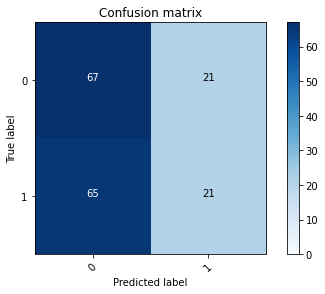

2022-08-20 14:38:08 - [Epoch Train: 16] loss: 0.4003, auc: 0.8838, acc: 0.7988, time: 50.00 s            
2022-08-20 14:38:08 - [Epoch Valid: 16] loss: 0.8084, auc: 0.5570, acc: 0.5060, time: 13.00 s


 16%|██████▍                                 | 16/100 [16:38<1:29:03, 63.61s/it]

2022-08-20 14:38:08 - EPOCH: 17
2022-08-20 14:38:09 - Train Step 10/969, train_loss: 0.2889
2022-08-20 14:38:10 - Train Step 20/969, train_loss: 0.4151
2022-08-20 14:38:10 - Train Step 30/969, train_loss: 0.4642
2022-08-20 14:38:11 - Train Step 40/969, train_loss: 0.4459
2022-08-20 14:38:11 - Train Step 50/969, train_loss: 0.4735
2022-08-20 14:38:12 - Train Step 60/969, train_loss: 0.4374
2022-08-20 14:38:12 - Train Step 70/969, train_loss: 0.4476
2022-08-20 14:38:13 - Train Step 80/969, train_loss: 0.4803
2022-08-20 14:38:13 - Train Step 90/969, train_loss: 0.4638
2022-08-20 14:38:14 - Train Step 100/969, train_loss: 0.4634
2022-08-20 14:38:14 - Train Step 110/969, train_loss: 0.4522
2022-08-20 14:38:15 - Train Step 120/969, train_loss: 0.4441
2022-08-20 14:38:15 - Train Step 130/969, train_loss: 0.4441
2022-08-20 14:38:16 - Train Step 140/969, train_loss: 0.4407
2022-08-20 14:38:16 - Train Step 150/969, train_loss: 0.4337
2022-08-20 14:38:17 - Train Step 160/969, train_loss: 0.4356
2

2022-08-20 14:39:09 - Valid Step 190/251, valid_loss: 0.7681
2022-08-20 14:39:09 - Valid Step 195/251, valid_loss: 0.7737
2022-08-20 14:39:10 - Valid Step 200/251, valid_loss: 0.7726
2022-08-20 14:39:10 - Valid Step 205/251, valid_loss: 0.7676
2022-08-20 14:39:10 - Valid Step 210/251, valid_loss: 0.7761
2022-08-20 14:39:10 - Valid Step 215/251, valid_loss: 0.7920
2022-08-20 14:39:11 - Valid Step 220/251, valid_loss: 0.7873
2022-08-20 14:39:11 - Valid Step 225/251, valid_loss: 0.7922
2022-08-20 14:39:11 - Valid Step 230/251, valid_loss: 0.8049
2022-08-20 14:39:11 - Valid Step 235/251, valid_loss: 0.8079
2022-08-20 14:39:12 - Valid Step 240/251, valid_loss: 0.8184
2022-08-20 14:39:12 - Valid Step 245/251, valid_loss: 0.8173
2022-08-20 14:39:12 - Valid Step 250/251, valid_loss: 0.8089
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
20      00012                1           0
119     00021                0         

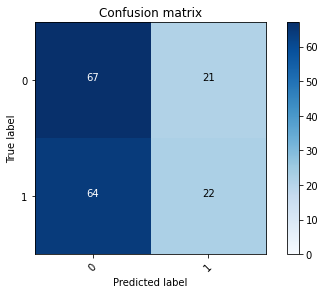

2022-08-20 14:39:12 - [Epoch Train: 17] loss: 0.3962, auc: 0.8831, acc: 0.8029, time: 50.00 s            
2022-08-20 14:39:12 - [Epoch Valid: 17] loss: 0.8141, auc: 0.5424, acc: 0.5139, time: 13.00 s


 17%|██████▊                                 | 17/100 [17:42<1:28:08, 63.71s/it]

2022-08-20 14:39:12 - EPOCH: 18
2022-08-20 14:39:13 - Train Step 10/969, train_loss: 0.2901
2022-08-20 14:39:14 - Train Step 20/969, train_loss: 0.2714
2022-08-20 14:39:14 - Train Step 30/969, train_loss: 0.2814
2022-08-20 14:39:15 - Train Step 40/969, train_loss: 0.3175
2022-08-20 14:39:15 - Train Step 50/969, train_loss: 0.3273
2022-08-20 14:39:16 - Train Step 60/969, train_loss: 0.3308
2022-08-20 14:39:16 - Train Step 70/969, train_loss: 0.3336
2022-08-20 14:39:17 - Train Step 80/969, train_loss: 0.3196
2022-08-20 14:39:17 - Train Step 90/969, train_loss: 0.3403
2022-08-20 14:39:18 - Train Step 100/969, train_loss: 0.3286
2022-08-20 14:39:18 - Train Step 110/969, train_loss: 0.3368
2022-08-20 14:39:19 - Train Step 120/969, train_loss: 0.3374
2022-08-20 14:39:19 - Train Step 130/969, train_loss: 0.3321
2022-08-20 14:39:20 - Train Step 140/969, train_loss: 0.3290
2022-08-20 14:39:20 - Train Step 150/969, train_loss: 0.3339
2022-08-20 14:39:21 - Train Step 160/969, train_loss: 0.3359
2

2022-08-20 14:40:13 - Valid Step 190/251, valid_loss: 0.8188
2022-08-20 14:40:13 - Valid Step 195/251, valid_loss: 0.8151
2022-08-20 14:40:13 - Valid Step 200/251, valid_loss: 0.8052
2022-08-20 14:40:14 - Valid Step 205/251, valid_loss: 0.8128
2022-08-20 14:40:14 - Valid Step 210/251, valid_loss: 0.8263
2022-08-20 14:40:14 - Valid Step 215/251, valid_loss: 0.8273
2022-08-20 14:40:14 - Valid Step 220/251, valid_loss: 0.8177
2022-08-20 14:40:15 - Valid Step 225/251, valid_loss: 0.8234
2022-08-20 14:40:15 - Valid Step 230/251, valid_loss: 0.8193
2022-08-20 14:40:15 - Valid Step 235/251, valid_loss: 0.8167
2022-08-20 14:40:15 - Valid Step 240/251, valid_loss: 0.8168
2022-08-20 14:40:16 - Valid Step 245/251, valid_loss: 0.8158
2022-08-20 14:40:16 - Valid Step 250/251, valid_loss: 0.8162
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
35      00012                1           0
37      00021                0         

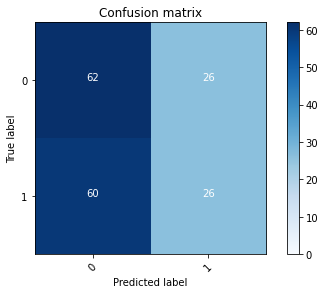

2022-08-20 14:40:16 - [Epoch Train: 18] loss: 0.3663, auc: 0.9012, acc: 0.8256, time: 50.00 s            
2022-08-20 14:40:16 - [Epoch Valid: 18] loss: 0.8182, auc: 0.5449, acc: 0.5020, time: 13.00 s


 18%|███████▏                                | 18/100 [18:45<1:27:02, 63.69s/it]

2022-08-20 14:40:16 - EPOCH: 19
2022-08-20 14:40:17 - Train Step 10/969, train_loss: 0.2313
2022-08-20 14:40:17 - Train Step 20/969, train_loss: 0.3200
2022-08-20 14:40:18 - Train Step 30/969, train_loss: 0.2940
2022-08-20 14:40:18 - Train Step 40/969, train_loss: 0.3094
2022-08-20 14:40:19 - Train Step 50/969, train_loss: 0.2965
2022-08-20 14:40:19 - Train Step 60/969, train_loss: 0.3002
2022-08-20 14:40:20 - Train Step 70/969, train_loss: 0.3014
2022-08-20 14:40:20 - Train Step 80/969, train_loss: 0.3035
2022-08-20 14:40:21 - Train Step 90/969, train_loss: 0.2971
2022-08-20 14:40:22 - Train Step 100/969, train_loss: 0.3334
2022-08-20 14:40:22 - Train Step 110/969, train_loss: 0.3407
2022-08-20 14:40:23 - Train Step 120/969, train_loss: 0.3230
2022-08-20 14:40:23 - Train Step 130/969, train_loss: 0.3090
2022-08-20 14:40:24 - Train Step 140/969, train_loss: 0.3220
2022-08-20 14:40:24 - Train Step 150/969, train_loss: 0.3185
2022-08-20 14:40:25 - Train Step 160/969, train_loss: 0.3074
2

2022-08-20 14:41:16 - Valid Step 190/251, valid_loss: 0.8896
2022-08-20 14:41:17 - Valid Step 195/251, valid_loss: 0.8895
2022-08-20 14:41:17 - Valid Step 200/251, valid_loss: 0.8801
2022-08-20 14:41:17 - Valid Step 205/251, valid_loss: 0.8803
2022-08-20 14:41:17 - Valid Step 210/251, valid_loss: 0.8732
2022-08-20 14:41:18 - Valid Step 215/251, valid_loss: 0.8640
2022-08-20 14:41:18 - Valid Step 220/251, valid_loss: 0.8630
2022-08-20 14:41:18 - Valid Step 225/251, valid_loss: 0.8646
2022-08-20 14:41:18 - Valid Step 230/251, valid_loss: 0.8765
2022-08-20 14:41:19 - Valid Step 235/251, valid_loss: 0.8793
2022-08-20 14:41:19 - Valid Step 240/251, valid_loss: 0.8842
2022-08-20 14:41:19 - Valid Step 245/251, valid_loss: 0.8794
2022-08-20 14:41:19 - Valid Step 250/251, valid_loss: 0.8767
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
106     00012                1           0
62      00021                0         

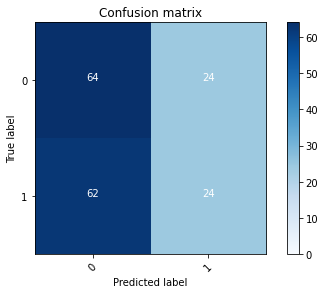

2022-08-20 14:41:20 - [Epoch Train: 19] loss: 0.3683, auc: 0.9008, acc: 0.8235, time: 50.00 s            
2022-08-20 14:41:20 - [Epoch Valid: 19] loss: 0.8739, auc: 0.5564, acc: 0.5100, time: 13.00 s


 19%|███████▌                                | 19/100 [19:49<1:25:58, 63.68s/it]

2022-08-20 14:41:20 - EPOCH: 20
2022-08-20 14:41:20 - Train Step 10/969, train_loss: 0.3738
2022-08-20 14:41:21 - Train Step 20/969, train_loss: 0.3684
2022-08-20 14:41:21 - Train Step 30/969, train_loss: 0.3635
2022-08-20 14:41:22 - Train Step 40/969, train_loss: 0.3172
2022-08-20 14:41:22 - Train Step 50/969, train_loss: 0.3774
2022-08-20 14:41:23 - Train Step 60/969, train_loss: 0.3912
2022-08-20 14:41:23 - Train Step 70/969, train_loss: 0.3577
2022-08-20 14:41:24 - Train Step 80/969, train_loss: 0.3554
2022-08-20 14:41:24 - Train Step 90/969, train_loss: 0.3494
2022-08-20 14:41:25 - Train Step 100/969, train_loss: 0.3615
2022-08-20 14:41:25 - Train Step 110/969, train_loss: 0.3505
2022-08-20 14:41:26 - Train Step 120/969, train_loss: 0.3426
2022-08-20 14:41:26 - Train Step 130/969, train_loss: 0.3719
2022-08-20 14:41:27 - Train Step 140/969, train_loss: 0.3693
2022-08-20 14:41:27 - Train Step 150/969, train_loss: 0.3612
2022-08-20 14:41:28 - Train Step 160/969, train_loss: 0.3721
2

2022-08-20 14:42:21 - Valid Step 190/251, valid_loss: 0.8919
2022-08-20 14:42:21 - Valid Step 195/251, valid_loss: 0.9019
2022-08-20 14:42:21 - Valid Step 200/251, valid_loss: 0.9127
2022-08-20 14:42:22 - Valid Step 205/251, valid_loss: 0.8983
2022-08-20 14:42:22 - Valid Step 210/251, valid_loss: 0.8890
2022-08-20 14:42:22 - Valid Step 215/251, valid_loss: 0.8880
2022-08-20 14:42:22 - Valid Step 220/251, valid_loss: 0.8830
2022-08-20 14:42:23 - Valid Step 225/251, valid_loss: 0.8773
2022-08-20 14:42:23 - Valid Step 230/251, valid_loss: 0.8837
2022-08-20 14:42:23 - Valid Step 235/251, valid_loss: 0.8796
2022-08-20 14:42:23 - Valid Step 240/251, valid_loss: 0.8788
2022-08-20 14:42:24 - Valid Step 245/251, valid_loss: 0.8705
2022-08-20 14:42:24 - Valid Step 250/251, valid_loss: 0.8564
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
87      00012                1           0
74      00021                0         

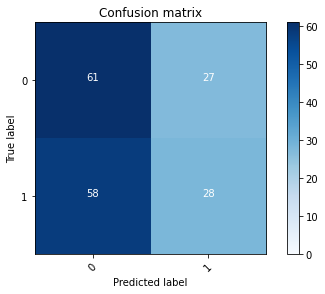

2022-08-20 14:42:24 - [Epoch Train: 20] loss: 0.3509, auc: 0.9071, acc: 0.8400, time: 51.00 s            
2022-08-20 14:42:24 - [Epoch Valid: 20] loss: 0.8534, auc: 0.5427, acc: 0.5020, time: 13.00 s


 20%|████████                                | 20/100 [20:54<1:25:16, 63.96s/it]

2022-08-20 14:42:24 - EPOCH: 21
2022-08-20 14:42:25 - Train Step 10/969, train_loss: 0.3721
2022-08-20 14:42:25 - Train Step 20/969, train_loss: 0.4680
2022-08-20 14:42:26 - Train Step 30/969, train_loss: 0.3820
2022-08-20 14:42:26 - Train Step 40/969, train_loss: 0.3889
2022-08-20 14:42:27 - Train Step 50/969, train_loss: 0.3968
2022-08-20 14:42:27 - Train Step 60/969, train_loss: 0.3998
2022-08-20 14:42:28 - Train Step 70/969, train_loss: 0.3709
2022-08-20 14:42:28 - Train Step 80/969, train_loss: 0.3631
2022-08-20 14:42:29 - Train Step 90/969, train_loss: 0.3642
2022-08-20 14:42:29 - Train Step 100/969, train_loss: 0.3688
2022-08-20 14:42:30 - Train Step 110/969, train_loss: 0.3541
2022-08-20 14:42:30 - Train Step 120/969, train_loss: 0.3529
2022-08-20 14:42:31 - Train Step 130/969, train_loss: 0.3453
2022-08-20 14:42:31 - Train Step 140/969, train_loss: 0.3418
2022-08-20 14:42:32 - Train Step 150/969, train_loss: 0.3439
2022-08-20 14:42:33 - Train Step 160/969, train_loss: 0.3510
2

2022-08-20 14:43:25 - Valid Step 190/251, valid_loss: 0.8740
2022-08-20 14:43:25 - Valid Step 195/251, valid_loss: 0.8855
2022-08-20 14:43:25 - Valid Step 200/251, valid_loss: 0.8791
2022-08-20 14:43:25 - Valid Step 205/251, valid_loss: 0.8714
2022-08-20 14:43:26 - Valid Step 210/251, valid_loss: 0.8594
2022-08-20 14:43:26 - Valid Step 215/251, valid_loss: 0.8627
2022-08-20 14:43:26 - Valid Step 220/251, valid_loss: 0.8562
2022-08-20 14:43:27 - Valid Step 225/251, valid_loss: 0.8494
2022-08-20 14:43:27 - Valid Step 230/251, valid_loss: 0.8711
2022-08-20 14:43:27 - Valid Step 235/251, valid_loss: 0.8706
2022-08-20 14:43:27 - Valid Step 240/251, valid_loss: 0.8709
2022-08-20 14:43:28 - Valid Step 245/251, valid_loss: 0.8738
2022-08-20 14:43:28 - Valid Step 250/251, valid_loss: 0.8721
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
140     00012                1           0
43      00021                0         

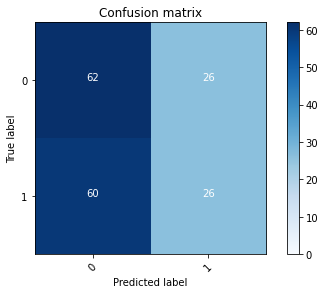

2022-08-20 14:43:28 - [Epoch Train: 21] loss: 0.3353, auc: 0.9175, acc: 0.8380, time: 50.00 s            
2022-08-20 14:43:28 - [Epoch Valid: 21] loss: 0.8718, auc: 0.5371, acc: 0.5060, time: 13.00 s


 21%|████████▍                               | 21/100 [21:57<1:24:09, 63.92s/it]

2022-08-20 14:43:28 - EPOCH: 22
2022-08-20 14:43:29 - Train Step 10/969, train_loss: 0.6047
2022-08-20 14:43:29 - Train Step 20/969, train_loss: 0.4401
2022-08-20 14:43:30 - Train Step 30/969, train_loss: 0.3504
2022-08-20 14:43:30 - Train Step 40/969, train_loss: 0.3690
2022-08-20 14:43:31 - Train Step 50/969, train_loss: 0.3500
2022-08-20 14:43:31 - Train Step 60/969, train_loss: 0.3280
2022-08-20 14:43:32 - Train Step 70/969, train_loss: 0.3328
2022-08-20 14:43:32 - Train Step 80/969, train_loss: 0.3395
2022-08-20 14:43:33 - Train Step 90/969, train_loss: 0.3377
2022-08-20 14:43:33 - Train Step 100/969, train_loss: 0.3505
2022-08-20 14:43:34 - Train Step 110/969, train_loss: 0.3618
2022-08-20 14:43:34 - Train Step 120/969, train_loss: 0.3943
2022-08-20 14:43:35 - Train Step 130/969, train_loss: 0.3855
2022-08-20 14:43:36 - Train Step 140/969, train_loss: 0.3869
2022-08-20 14:43:36 - Train Step 150/969, train_loss: 0.3862
2022-08-20 14:43:37 - Train Step 160/969, train_loss: 0.3771
2

2022-08-20 14:44:29 - Valid Step 190/251, valid_loss: 0.9374
2022-08-20 14:44:30 - Valid Step 195/251, valid_loss: 0.9414
2022-08-20 14:44:30 - Valid Step 200/251, valid_loss: 0.9336
2022-08-20 14:44:30 - Valid Step 205/251, valid_loss: 0.9204
2022-08-20 14:44:30 - Valid Step 210/251, valid_loss: 0.9125
2022-08-20 14:44:31 - Valid Step 215/251, valid_loss: 0.9337
2022-08-20 14:44:31 - Valid Step 220/251, valid_loss: 0.9348
2022-08-20 14:44:31 - Valid Step 225/251, valid_loss: 0.9296
2022-08-20 14:44:31 - Valid Step 230/251, valid_loss: 0.9226
2022-08-20 14:44:32 - Valid Step 235/251, valid_loss: 0.9264
2022-08-20 14:44:32 - Valid Step 240/251, valid_loss: 0.9187
2022-08-20 14:44:32 - Valid Step 245/251, valid_loss: 0.9179
2022-08-20 14:44:32 - Valid Step 250/251, valid_loss: 0.9291
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
121     00012                1           0
91      00021                0         

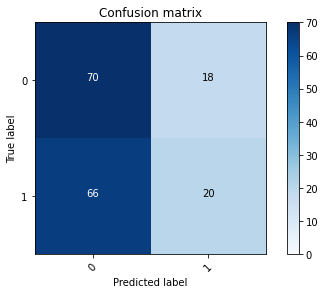

2022-08-20 14:44:33 - [Epoch Train: 22] loss: 0.3254, auc: 0.9229, acc: 0.8390, time: 51.00 s            
2022-08-20 14:44:33 - [Epoch Valid: 22] loss: 0.9327, auc: 0.5555, acc: 0.5219, time: 13.00 s


 22%|████████▊                               | 22/100 [23:02<1:23:20, 64.11s/it]

2022-08-20 14:44:33 - EPOCH: 23
2022-08-20 14:44:33 - Train Step 10/969, train_loss: 0.3065
2022-08-20 14:44:34 - Train Step 20/969, train_loss: 0.3091
2022-08-20 14:44:34 - Train Step 30/969, train_loss: 0.2566
2022-08-20 14:44:35 - Train Step 40/969, train_loss: 0.2744
2022-08-20 14:44:35 - Train Step 50/969, train_loss: 0.2509
2022-08-20 14:44:36 - Train Step 60/969, train_loss: 0.2850
2022-08-20 14:44:36 - Train Step 70/969, train_loss: 0.2943
2022-08-20 14:44:37 - Train Step 80/969, train_loss: 0.2906
2022-08-20 14:44:37 - Train Step 90/969, train_loss: 0.2978
2022-08-20 14:44:38 - Train Step 100/969, train_loss: 0.2950
2022-08-20 14:44:38 - Train Step 110/969, train_loss: 0.2854
2022-08-20 14:44:39 - Train Step 120/969, train_loss: 0.2752
2022-08-20 14:44:39 - Train Step 130/969, train_loss: 0.2808
2022-08-20 14:44:40 - Train Step 140/969, train_loss: 0.2848
2022-08-20 14:44:40 - Train Step 150/969, train_loss: 0.2879
2022-08-20 14:44:41 - Train Step 160/969, train_loss: 0.2888
2

2022-08-20 14:45:33 - Valid Step 190/251, valid_loss: 0.9788
2022-08-20 14:45:33 - Valid Step 195/251, valid_loss: 0.9916
2022-08-20 14:45:34 - Valid Step 200/251, valid_loss: 0.9997
2022-08-20 14:45:34 - Valid Step 205/251, valid_loss: 1.0203
2022-08-20 14:45:34 - Valid Step 210/251, valid_loss: 1.0283
2022-08-20 14:45:34 - Valid Step 215/251, valid_loss: 1.0139
2022-08-20 14:45:35 - Valid Step 220/251, valid_loss: 0.9968
2022-08-20 14:45:35 - Valid Step 225/251, valid_loss: 0.9896
2022-08-20 14:45:35 - Valid Step 230/251, valid_loss: 1.0012
2022-08-20 14:45:35 - Valid Step 235/251, valid_loss: 0.9887
2022-08-20 14:45:36 - Valid Step 240/251, valid_loss: 1.0140
2022-08-20 14:45:36 - Valid Step 245/251, valid_loss: 1.0136
2022-08-20 14:45:36 - Valid Step 250/251, valid_loss: 1.0009
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
168     00012                1           0
46      00021                0         

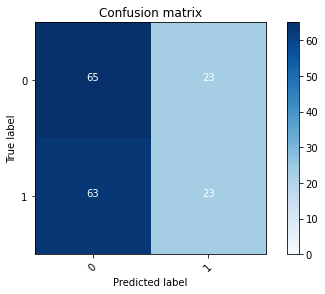

2022-08-20 14:45:36 - [Epoch Train: 23] loss: 0.3025, auc: 0.9322, acc: 0.8576, time: 50.00 s            
2022-08-20 14:45:36 - [Epoch Valid: 23] loss: 0.9972, auc: 0.5468, acc: 0.5020, time: 13.00 s


 23%|█████████▏                              | 23/100 [24:06<1:22:07, 64.00s/it]

2022-08-20 14:45:36 - EPOCH: 24
2022-08-20 14:45:37 - Train Step 10/969, train_loss: 0.3790
2022-08-20 14:45:38 - Train Step 20/969, train_loss: 0.3960
2022-08-20 14:45:38 - Train Step 30/969, train_loss: 0.4249
2022-08-20 14:45:39 - Train Step 40/969, train_loss: 0.3666
2022-08-20 14:45:39 - Train Step 50/969, train_loss: 0.3254
2022-08-20 14:45:40 - Train Step 60/969, train_loss: 0.3093
2022-08-20 14:45:40 - Train Step 70/969, train_loss: 0.2945
2022-08-20 14:45:41 - Train Step 80/969, train_loss: 0.2758
2022-08-20 14:45:41 - Train Step 90/969, train_loss: 0.2669
2022-08-20 14:45:42 - Train Step 100/969, train_loss: 0.2722
2022-08-20 14:45:42 - Train Step 110/969, train_loss: 0.2614
2022-08-20 14:45:43 - Train Step 120/969, train_loss: 0.2700
2022-08-20 14:45:43 - Train Step 130/969, train_loss: 0.2991
2022-08-20 14:45:44 - Train Step 140/969, train_loss: 0.2909
2022-08-20 14:45:44 - Train Step 150/969, train_loss: 0.2837
2022-08-20 14:45:45 - Train Step 160/969, train_loss: 0.2965
2

2022-08-20 14:46:37 - Valid Step 190/251, valid_loss: 0.9619
2022-08-20 14:46:38 - Valid Step 195/251, valid_loss: 0.9533
2022-08-20 14:46:38 - Valid Step 200/251, valid_loss: 0.9585
2022-08-20 14:46:38 - Valid Step 205/251, valid_loss: 0.9416
2022-08-20 14:46:39 - Valid Step 210/251, valid_loss: 0.9490
2022-08-20 14:46:39 - Valid Step 215/251, valid_loss: 0.9334
2022-08-20 14:46:39 - Valid Step 220/251, valid_loss: 0.9437
2022-08-20 14:46:39 - Valid Step 225/251, valid_loss: 0.9375
2022-08-20 14:46:40 - Valid Step 230/251, valid_loss: 0.9289
2022-08-20 14:46:40 - Valid Step 235/251, valid_loss: 0.9401
2022-08-20 14:46:40 - Valid Step 240/251, valid_loss: 0.9315
2022-08-20 14:46:40 - Valid Step 245/251, valid_loss: 0.9341
2022-08-20 14:46:41 - Valid Step 250/251, valid_loss: 0.9551
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
151     00012                1           0
116     00021                0         

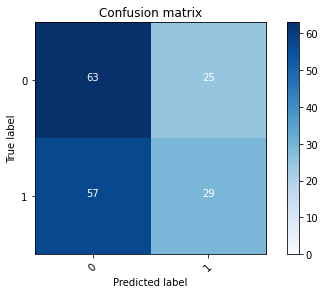

2022-08-20 14:46:41 - [Epoch Train: 24] loss: 0.2962, auc: 0.9367, acc: 0.8617, time: 50.00 s            
2022-08-20 14:46:41 - [Epoch Valid: 24] loss: 0.9578, auc: 0.5476, acc: 0.5219, time: 13.00 s


 24%|█████████▌                              | 24/100 [25:10<1:21:13, 64.13s/it]

2022-08-20 14:46:41 - EPOCH: 25
2022-08-20 14:46:41 - Train Step 10/969, train_loss: 0.3074
2022-08-20 14:46:42 - Train Step 20/969, train_loss: 0.3653
2022-08-20 14:46:42 - Train Step 30/969, train_loss: 0.3933
2022-08-20 14:46:43 - Train Step 40/969, train_loss: 0.4241
2022-08-20 14:46:44 - Train Step 50/969, train_loss: 0.4006
2022-08-20 14:46:44 - Train Step 60/969, train_loss: 0.3907
2022-08-20 14:46:45 - Train Step 70/969, train_loss: 0.3609
2022-08-20 14:46:45 - Train Step 80/969, train_loss: 0.3613
2022-08-20 14:46:46 - Train Step 90/969, train_loss: 0.3556
2022-08-20 14:46:46 - Train Step 100/969, train_loss: 0.3625
2022-08-20 14:46:47 - Train Step 110/969, train_loss: 0.3511
2022-08-20 14:46:47 - Train Step 120/969, train_loss: 0.3418
2022-08-20 14:46:48 - Train Step 130/969, train_loss: 0.3409
2022-08-20 14:46:48 - Train Step 140/969, train_loss: 0.3363
2022-08-20 14:46:49 - Train Step 150/969, train_loss: 0.3262
2022-08-20 14:46:49 - Train Step 160/969, train_loss: 0.3112
2

2022-08-20 14:47:42 - Valid Step 190/251, valid_loss: 0.8938
2022-08-20 14:47:42 - Valid Step 195/251, valid_loss: 0.9140
2022-08-20 14:47:43 - Valid Step 200/251, valid_loss: 0.9177
2022-08-20 14:47:43 - Valid Step 205/251, valid_loss: 0.9163
2022-08-20 14:47:43 - Valid Step 210/251, valid_loss: 0.9160
2022-08-20 14:47:43 - Valid Step 215/251, valid_loss: 0.9015
2022-08-20 14:47:44 - Valid Step 220/251, valid_loss: 0.9139
2022-08-20 14:47:44 - Valid Step 225/251, valid_loss: 0.9137
2022-08-20 14:47:44 - Valid Step 230/251, valid_loss: 0.9200
2022-08-20 14:47:45 - Valid Step 235/251, valid_loss: 0.9318
2022-08-20 14:47:45 - Valid Step 240/251, valid_loss: 0.9345
2022-08-20 14:47:45 - Valid Step 245/251, valid_loss: 0.9257
2022-08-20 14:47:45 - Valid Step 250/251, valid_loss: 0.9280
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
173     00012                1           0
159     00021                0         

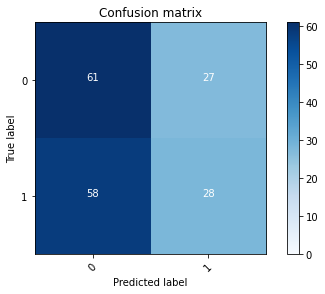

2022-08-20 14:47:45 - [Epoch Train: 25] loss: 0.2894, auc: 0.9367, acc: 0.8772, time: 51.00 s            
2022-08-20 14:47:45 - [Epoch Valid: 25] loss: 0.9286, auc: 0.5425, acc: 0.5060, time: 13.00 s


 25%|██████████                              | 25/100 [26:15<1:20:22, 64.30s/it]

2022-08-20 14:47:45 - EPOCH: 26
2022-08-20 14:47:46 - Train Step 10/969, train_loss: 0.1631
2022-08-20 14:47:47 - Train Step 20/969, train_loss: 0.1611
2022-08-20 14:47:47 - Train Step 30/969, train_loss: 0.1751
2022-08-20 14:47:48 - Train Step 40/969, train_loss: 0.2107
2022-08-20 14:47:48 - Train Step 50/969, train_loss: 0.2793
2022-08-20 14:47:49 - Train Step 60/969, train_loss: 0.2571
2022-08-20 14:47:49 - Train Step 70/969, train_loss: 0.2637
2022-08-20 14:47:50 - Train Step 80/969, train_loss: 0.2450
2022-08-20 14:47:50 - Train Step 90/969, train_loss: 0.2531
2022-08-20 14:47:51 - Train Step 100/969, train_loss: 0.2615
2022-08-20 14:47:51 - Train Step 110/969, train_loss: 0.2523
2022-08-20 14:47:52 - Train Step 120/969, train_loss: 0.2720
2022-08-20 14:47:52 - Train Step 130/969, train_loss: 0.2703
2022-08-20 14:47:53 - Train Step 140/969, train_loss: 0.2669
2022-08-20 14:47:53 - Train Step 150/969, train_loss: 0.2790
2022-08-20 14:47:54 - Train Step 160/969, train_loss: 0.2809
2

2022-08-20 14:48:45 - Valid Step 190/251, valid_loss: 1.0411
2022-08-20 14:48:46 - Valid Step 195/251, valid_loss: 1.0354
2022-08-20 14:48:46 - Valid Step 200/251, valid_loss: 1.0390
2022-08-20 14:48:46 - Valid Step 205/251, valid_loss: 1.0288
2022-08-20 14:48:46 - Valid Step 210/251, valid_loss: 1.0574
2022-08-20 14:48:47 - Valid Step 215/251, valid_loss: 1.0530
2022-08-20 14:48:47 - Valid Step 220/251, valid_loss: 1.0420
2022-08-20 14:48:47 - Valid Step 225/251, valid_loss: 1.0343
2022-08-20 14:48:47 - Valid Step 230/251, valid_loss: 1.0442
2022-08-20 14:48:48 - Valid Step 235/251, valid_loss: 1.0349
2022-08-20 14:48:48 - Valid Step 240/251, valid_loss: 1.0352
2022-08-20 14:48:48 - Valid Step 245/251, valid_loss: 1.0538
2022-08-20 14:48:48 - Valid Step 250/251, valid_loss: 1.0448
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
173     00012                1           0
80      00021                0         

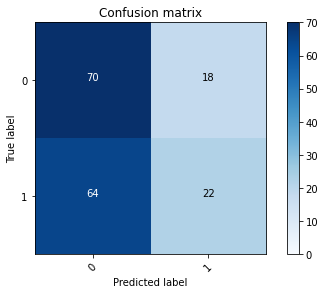

2022-08-20 14:48:49 - [Epoch Train: 26] loss: 0.2606, auc: 0.9528, acc: 0.8844, time: 50.00 s            
2022-08-20 14:48:49 - [Epoch Valid: 26] loss: 1.0511, auc: 0.5494, acc: 0.5259, time: 12.00 s


 26%|██████████▍                             | 26/100 [27:18<1:18:53, 63.97s/it]

2022-08-20 14:48:49 - EPOCH: 27
2022-08-20 14:48:49 - Train Step 10/969, train_loss: 0.2466
2022-08-20 14:48:50 - Train Step 20/969, train_loss: 0.1664
2022-08-20 14:48:50 - Train Step 30/969, train_loss: 0.1933
2022-08-20 14:48:51 - Train Step 40/969, train_loss: 0.2068
2022-08-20 14:48:51 - Train Step 50/969, train_loss: 0.2003
2022-08-20 14:48:52 - Train Step 60/969, train_loss: 0.2365
2022-08-20 14:48:52 - Train Step 70/969, train_loss: 0.2168
2022-08-20 14:48:53 - Train Step 80/969, train_loss: 0.2204
2022-08-20 14:48:54 - Train Step 90/969, train_loss: 0.2151
2022-08-20 14:48:54 - Train Step 100/969, train_loss: 0.2118
2022-08-20 14:48:55 - Train Step 110/969, train_loss: 0.2044
2022-08-20 14:48:55 - Train Step 120/969, train_loss: 0.1980
2022-08-20 14:48:56 - Train Step 130/969, train_loss: 0.2173
2022-08-20 14:48:56 - Train Step 140/969, train_loss: 0.2179
2022-08-20 14:48:57 - Train Step 150/969, train_loss: 0.2150
2022-08-20 14:48:57 - Train Step 160/969, train_loss: 0.2067
2

2022-08-20 14:49:49 - Valid Step 190/251, valid_loss: 1.0329
2022-08-20 14:49:49 - Valid Step 195/251, valid_loss: 1.0219
2022-08-20 14:49:50 - Valid Step 200/251, valid_loss: 1.0434
2022-08-20 14:49:50 - Valid Step 205/251, valid_loss: 1.0284
2022-08-20 14:49:50 - Valid Step 210/251, valid_loss: 1.0377
2022-08-20 14:49:50 - Valid Step 215/251, valid_loss: 1.0537
2022-08-20 14:49:51 - Valid Step 220/251, valid_loss: 1.0562
2022-08-20 14:49:51 - Valid Step 225/251, valid_loss: 1.0495
2022-08-20 14:49:51 - Valid Step 230/251, valid_loss: 1.0459
2022-08-20 14:49:51 - Valid Step 235/251, valid_loss: 1.0433
2022-08-20 14:49:52 - Valid Step 240/251, valid_loss: 1.0440
2022-08-20 14:49:52 - Valid Step 245/251, valid_loss: 1.0511
2022-08-20 14:49:52 - Valid Step 250/251, valid_loss: 1.0545
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
129     00012                1           0
130     00021                0         

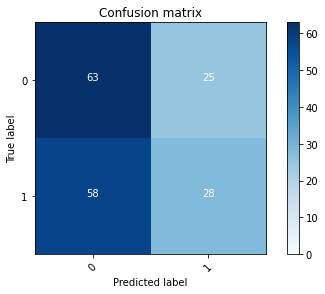

2022-08-20 14:49:52 - [Epoch Train: 27] loss: 0.2510, auc: 0.9552, acc: 0.8865, time: 50.00 s            
2022-08-20 14:49:52 - [Epoch Valid: 27] loss: 1.0520, auc: 0.5399, acc: 0.5179, time: 13.00 s


 27%|██████████▊                             | 27/100 [28:22<1:17:43, 63.89s/it]

2022-08-20 14:49:52 - EPOCH: 28
2022-08-20 14:49:53 - Train Step 10/969, train_loss: 0.1902
2022-08-20 14:49:54 - Train Step 20/969, train_loss: 0.1983
2022-08-20 14:49:54 - Train Step 30/969, train_loss: 0.1820
2022-08-20 14:49:55 - Train Step 40/969, train_loss: 0.2202
2022-08-20 14:49:55 - Train Step 50/969, train_loss: 0.2405
2022-08-20 14:49:56 - Train Step 60/969, train_loss: 0.2330
2022-08-20 14:49:56 - Train Step 70/969, train_loss: 0.2268
2022-08-20 14:49:57 - Train Step 80/969, train_loss: 0.2239
2022-08-20 14:49:57 - Train Step 90/969, train_loss: 0.2364
2022-08-20 14:49:58 - Train Step 100/969, train_loss: 0.2457
2022-08-20 14:49:58 - Train Step 110/969, train_loss: 0.2458
2022-08-20 14:49:59 - Train Step 120/969, train_loss: 0.2536
2022-08-20 14:49:59 - Train Step 130/969, train_loss: 0.2544
2022-08-20 14:50:00 - Train Step 140/969, train_loss: 0.2477
2022-08-20 14:50:00 - Train Step 150/969, train_loss: 0.2480
2022-08-20 14:50:01 - Train Step 160/969, train_loss: 0.2570
2

2022-08-20 14:50:52 - Valid Step 190/251, valid_loss: 1.1416
2022-08-20 14:50:52 - Valid Step 195/251, valid_loss: 1.1679
2022-08-20 14:50:52 - Valid Step 200/251, valid_loss: 1.1708
2022-08-20 14:50:53 - Valid Step 205/251, valid_loss: 1.1573
2022-08-20 14:50:53 - Valid Step 210/251, valid_loss: 1.1572
2022-08-20 14:50:53 - Valid Step 215/251, valid_loss: 1.1351
2022-08-20 14:50:53 - Valid Step 220/251, valid_loss: 1.1381
2022-08-20 14:50:54 - Valid Step 225/251, valid_loss: 1.1223
2022-08-20 14:50:54 - Valid Step 230/251, valid_loss: 1.1241
2022-08-20 14:50:54 - Valid Step 235/251, valid_loss: 1.1382
2022-08-20 14:50:54 - Valid Step 240/251, valid_loss: 1.1264
2022-08-20 14:50:55 - Valid Step 245/251, valid_loss: 1.1162
2022-08-20 14:50:55 - Valid Step 250/251, valid_loss: 1.1218
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
110     00012                1           0
141     00021                0         

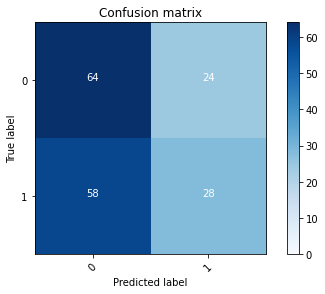

2022-08-20 14:50:55 - [Epoch Train: 28] loss: 0.2487, auc: 0.9555, acc: 0.8906, time: 49.00 s            
2022-08-20 14:50:55 - [Epoch Valid: 28] loss: 1.1190, auc: 0.5371, acc: 0.5219, time: 13.00 s


 28%|███████████▏                            | 28/100 [29:25<1:16:16, 63.57s/it]

2022-08-20 14:50:55 - EPOCH: 29
2022-08-20 14:50:56 - Train Step 10/969, train_loss: 0.1479
2022-08-20 14:50:56 - Train Step 20/969, train_loss: 0.2700
2022-08-20 14:50:57 - Train Step 30/969, train_loss: 0.2156
2022-08-20 14:50:57 - Train Step 40/969, train_loss: 0.2110
2022-08-20 14:50:58 - Train Step 50/969, train_loss: 0.1862
2022-08-20 14:50:58 - Train Step 60/969, train_loss: 0.2023
2022-08-20 14:50:59 - Train Step 70/969, train_loss: 0.1958
2022-08-20 14:51:00 - Train Step 80/969, train_loss: 0.1929
2022-08-20 14:51:00 - Train Step 90/969, train_loss: 0.1972
2022-08-20 14:51:01 - Train Step 100/969, train_loss: 0.1877
2022-08-20 14:51:01 - Train Step 110/969, train_loss: 0.2051
2022-08-20 14:51:02 - Train Step 120/969, train_loss: 0.1963
2022-08-20 14:51:02 - Train Step 130/969, train_loss: 0.1958
2022-08-20 14:51:03 - Train Step 140/969, train_loss: 0.1880
2022-08-20 14:51:03 - Train Step 150/969, train_loss: 0.1929
2022-08-20 14:51:04 - Train Step 160/969, train_loss: 0.2096
2

2022-08-20 14:51:56 - Valid Step 190/251, valid_loss: 1.0234
2022-08-20 14:51:56 - Valid Step 195/251, valid_loss: 1.0169
2022-08-20 14:51:56 - Valid Step 200/251, valid_loss: 1.0408
2022-08-20 14:51:57 - Valid Step 205/251, valid_loss: 1.0267
2022-08-20 14:51:57 - Valid Step 210/251, valid_loss: 1.0210
2022-08-20 14:51:57 - Valid Step 215/251, valid_loss: 1.0159
2022-08-20 14:51:57 - Valid Step 220/251, valid_loss: 1.0240
2022-08-20 14:51:58 - Valid Step 225/251, valid_loss: 1.0380
2022-08-20 14:51:58 - Valid Step 230/251, valid_loss: 1.0308
2022-08-20 14:51:58 - Valid Step 235/251, valid_loss: 1.0216
2022-08-20 14:51:58 - Valid Step 240/251, valid_loss: 1.0167
2022-08-20 14:51:59 - Valid Step 245/251, valid_loss: 1.0389
2022-08-20 14:51:59 - Valid Step 250/251, valid_loss: 1.0343
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
108     00012                1           0
112     00021                0         

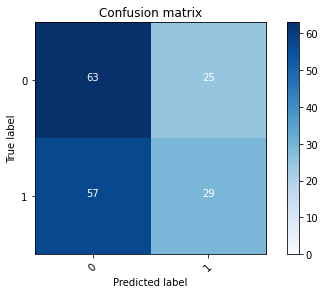

2022-08-20 14:51:59 - [Epoch Train: 29] loss: 0.2296, auc: 0.9626, acc: 0.9061, time: 50.00 s            
2022-08-20 14:51:59 - [Epoch Valid: 29] loss: 1.0313, auc: 0.5429, acc: 0.5179, time: 13.00 s


 29%|███████████▌                            | 29/100 [30:29<1:15:20, 63.67s/it]

2022-08-20 14:51:59 - EPOCH: 30
2022-08-20 14:52:00 - Train Step 10/969, train_loss: 0.1059
2022-08-20 14:52:00 - Train Step 20/969, train_loss: 0.1326
2022-08-20 14:52:01 - Train Step 30/969, train_loss: 0.1146
2022-08-20 14:52:01 - Train Step 40/969, train_loss: 0.1136
2022-08-20 14:52:02 - Train Step 50/969, train_loss: 0.1100
2022-08-20 14:52:02 - Train Step 60/969, train_loss: 0.1357
2022-08-20 14:52:03 - Train Step 70/969, train_loss: 0.1464
2022-08-20 14:52:03 - Train Step 80/969, train_loss: 0.1641
2022-08-20 14:52:04 - Train Step 90/969, train_loss: 0.1780
2022-08-20 14:52:05 - Train Step 100/969, train_loss: 0.1877
2022-08-20 14:52:05 - Train Step 110/969, train_loss: 0.1973
2022-08-20 14:52:06 - Train Step 120/969, train_loss: 0.2078
2022-08-20 14:52:06 - Train Step 130/969, train_loss: 0.2276
2022-08-20 14:52:07 - Train Step 140/969, train_loss: 0.2310
2022-08-20 14:52:07 - Train Step 150/969, train_loss: 0.2256
2022-08-20 14:52:08 - Train Step 160/969, train_loss: 0.2247
2

2022-08-20 14:52:59 - Valid Step 190/251, valid_loss: 1.0324
2022-08-20 14:53:00 - Valid Step 195/251, valid_loss: 1.0703
2022-08-20 14:53:00 - Valid Step 200/251, valid_loss: 1.0701
2022-08-20 14:53:00 - Valid Step 205/251, valid_loss: 1.0884
2022-08-20 14:53:01 - Valid Step 210/251, valid_loss: 1.0796
2022-08-20 14:53:01 - Valid Step 215/251, valid_loss: 1.1091
2022-08-20 14:53:01 - Valid Step 220/251, valid_loss: 1.1069
2022-08-20 14:53:01 - Valid Step 225/251, valid_loss: 1.1162
2022-08-20 14:53:02 - Valid Step 230/251, valid_loss: 1.0982
2022-08-20 14:53:02 - Valid Step 235/251, valid_loss: 1.0855
2022-08-20 14:53:02 - Valid Step 240/251, valid_loss: 1.0953
2022-08-20 14:53:02 - Valid Step 245/251, valid_loss: 1.0942
2022-08-20 14:53:03 - Valid Step 250/251, valid_loss: 1.0918
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
88      00012                1           0
26      00021                0         

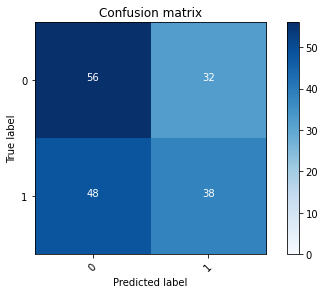

2022-08-20 14:53:03 - [Epoch Train: 30] loss: 0.2182, auc: 0.9677, acc: 0.9030, time: 50.00 s            
2022-08-20 14:53:03 - [Epoch Valid: 30] loss: 1.0904, auc: 0.5404, acc: 0.5418, time: 13.00 s
2022-08-20 14:53:03 - acc improved from 0.5418 to 0.5418. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_14-21-30/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e30-loss1.090-acc0.542-auc0.540.pth'


 30%|████████████                            | 30/100 [31:32<1:14:17, 63.68s/it]

2022-08-20 14:53:03 - EPOCH: 31
2022-08-20 14:53:03 - Train Step 10/969, train_loss: 0.2943
2022-08-20 14:53:04 - Train Step 20/969, train_loss: 0.1799
2022-08-20 14:53:04 - Train Step 30/969, train_loss: 0.2231
2022-08-20 14:53:05 - Train Step 40/969, train_loss: 0.2628
2022-08-20 14:53:05 - Train Step 50/969, train_loss: 0.2705
2022-08-20 14:53:06 - Train Step 60/969, train_loss: 0.2481
2022-08-20 14:53:06 - Train Step 70/969, train_loss: 0.2465
2022-08-20 14:53:07 - Train Step 80/969, train_loss: 0.2560
2022-08-20 14:53:07 - Train Step 90/969, train_loss: 0.2442
2022-08-20 14:53:08 - Train Step 100/969, train_loss: 0.2386
2022-08-20 14:53:08 - Train Step 110/969, train_loss: 0.2315
2022-08-20 14:53:09 - Train Step 120/969, train_loss: 0.2213
2022-08-20 14:53:09 - Train Step 130/969, train_loss: 0.2172
2022-08-20 14:53:10 - Train Step 140/969, train_loss: 0.2138
2022-08-20 14:53:10 - Train Step 150/969, train_loss: 0.2229
2022-08-20 14:53:11 - Train Step 160/969, train_loss: 0.2270
2

2022-08-20 14:54:03 - Valid Step 190/251, valid_loss: 1.1426
2022-08-20 14:54:03 - Valid Step 195/251, valid_loss: 1.1249
2022-08-20 14:54:03 - Valid Step 200/251, valid_loss: 1.1285
2022-08-20 14:54:04 - Valid Step 205/251, valid_loss: 1.1158
2022-08-20 14:54:04 - Valid Step 210/251, valid_loss: 1.1246
2022-08-20 14:54:04 - Valid Step 215/251, valid_loss: 1.1039
2022-08-20 14:54:04 - Valid Step 220/251, valid_loss: 1.0848
2022-08-20 14:54:05 - Valid Step 225/251, valid_loss: 1.0705
2022-08-20 14:54:05 - Valid Step 230/251, valid_loss: 1.0769
2022-08-20 14:54:05 - Valid Step 235/251, valid_loss: 1.1066
2022-08-20 14:54:05 - Valid Step 240/251, valid_loss: 1.1265
2022-08-20 14:54:06 - Valid Step 245/251, valid_loss: 1.1277
2022-08-20 14:54:06 - Valid Step 250/251, valid_loss: 1.1267
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
164     00012                1           0
61      00021                0         

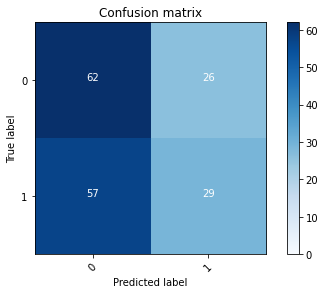

2022-08-20 14:54:06 - [Epoch Train: 31] loss: 0.2156, auc: 0.9665, acc: 0.9143, time: 50.00 s            
2022-08-20 14:54:06 - [Epoch Valid: 31] loss: 1.1222, auc: 0.5415, acc: 0.5179, time: 13.00 s


 31%|████████████▍                           | 31/100 [32:36<1:13:05, 63.55s/it]

2022-08-20 14:54:06 - EPOCH: 32
2022-08-20 14:54:07 - Train Step 10/969, train_loss: 0.2826
2022-08-20 14:54:07 - Train Step 20/969, train_loss: 0.2681
2022-08-20 14:54:08 - Train Step 30/969, train_loss: 0.2082
2022-08-20 14:54:08 - Train Step 40/969, train_loss: 0.2551
2022-08-20 14:54:09 - Train Step 50/969, train_loss: 0.2678
2022-08-20 14:54:09 - Train Step 60/969, train_loss: 0.2574
2022-08-20 14:54:10 - Train Step 70/969, train_loss: 0.2368
2022-08-20 14:54:10 - Train Step 80/969, train_loss: 0.2191
2022-08-20 14:54:11 - Train Step 90/969, train_loss: 0.2192
2022-08-20 14:54:11 - Train Step 100/969, train_loss: 0.2142
2022-08-20 14:54:12 - Train Step 110/969, train_loss: 0.2056
2022-08-20 14:54:12 - Train Step 120/969, train_loss: 0.1970
2022-08-20 14:54:13 - Train Step 130/969, train_loss: 0.2023
2022-08-20 14:54:13 - Train Step 140/969, train_loss: 0.1988
2022-08-20 14:54:14 - Train Step 150/969, train_loss: 0.1997
2022-08-20 14:54:14 - Train Step 160/969, train_loss: 0.1983
2

2022-08-20 14:55:06 - Valid Step 190/251, valid_loss: 1.0676
2022-08-20 14:55:06 - Valid Step 195/251, valid_loss: 1.0859
2022-08-20 14:55:06 - Valid Step 200/251, valid_loss: 1.0984
2022-08-20 14:55:06 - Valid Step 205/251, valid_loss: 1.0822
2022-08-20 14:55:07 - Valid Step 210/251, valid_loss: 1.0673
2022-08-20 14:55:07 - Valid Step 215/251, valid_loss: 1.0712
2022-08-20 14:55:07 - Valid Step 220/251, valid_loss: 1.0577
2022-08-20 14:55:07 - Valid Step 225/251, valid_loss: 1.0720
2022-08-20 14:55:08 - Valid Step 230/251, valid_loss: 1.1189
2022-08-20 14:55:08 - Valid Step 235/251, valid_loss: 1.1216
2022-08-20 14:55:08 - Valid Step 240/251, valid_loss: 1.1088
2022-08-20 14:55:08 - Valid Step 245/251, valid_loss: 1.0985
2022-08-20 14:55:09 - Valid Step 250/251, valid_loss: 1.0904
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
37      00012                1           0
157     00021                0         

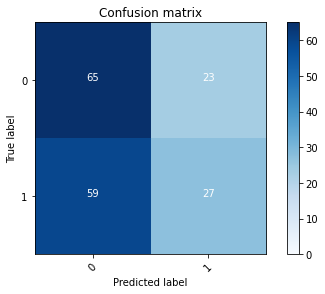

2022-08-20 14:55:09 - [Epoch Train: 32] loss: 0.1943, auc: 0.9750, acc: 0.9195, time: 49.00 s            
2022-08-20 14:55:09 - [Epoch Valid: 32] loss: 1.0978, auc: 0.5382, acc: 0.5219, time: 13.00 s


 32%|████████████▊                           | 32/100 [33:38<1:11:46, 63.33s/it]

2022-08-20 14:55:09 - EPOCH: 33
2022-08-20 14:55:10 - Train Step 10/969, train_loss: 0.0822
2022-08-20 14:55:10 - Train Step 20/969, train_loss: 0.1022
2022-08-20 14:55:11 - Train Step 30/969, train_loss: 0.1012
2022-08-20 14:55:11 - Train Step 40/969, train_loss: 0.1211
2022-08-20 14:55:12 - Train Step 50/969, train_loss: 0.1383
2022-08-20 14:55:12 - Train Step 60/969, train_loss: 0.1405
2022-08-20 14:55:13 - Train Step 70/969, train_loss: 0.1400
2022-08-20 14:55:13 - Train Step 80/969, train_loss: 0.1457
2022-08-20 14:55:14 - Train Step 90/969, train_loss: 0.1540
2022-08-20 14:55:14 - Train Step 100/969, train_loss: 0.1532
2022-08-20 14:55:15 - Train Step 110/969, train_loss: 0.1603
2022-08-20 14:55:15 - Train Step 120/969, train_loss: 0.1563
2022-08-20 14:55:16 - Train Step 130/969, train_loss: 0.1544
2022-08-20 14:55:16 - Train Step 140/969, train_loss: 0.1575
2022-08-20 14:55:17 - Train Step 150/969, train_loss: 0.1525
2022-08-20 14:55:17 - Train Step 160/969, train_loss: 0.1582
2

2022-08-20 14:56:09 - Valid Step 190/251, valid_loss: 1.3399
2022-08-20 14:56:10 - Valid Step 195/251, valid_loss: 1.3194
2022-08-20 14:56:10 - Valid Step 200/251, valid_loss: 1.3233
2022-08-20 14:56:10 - Valid Step 205/251, valid_loss: 1.3349
2022-08-20 14:56:10 - Valid Step 210/251, valid_loss: 1.3066
2022-08-20 14:56:11 - Valid Step 215/251, valid_loss: 1.3154
2022-08-20 14:56:11 - Valid Step 220/251, valid_loss: 1.2929
2022-08-20 14:56:11 - Valid Step 225/251, valid_loss: 1.2960
2022-08-20 14:56:11 - Valid Step 230/251, valid_loss: 1.2861
2022-08-20 14:56:12 - Valid Step 235/251, valid_loss: 1.2874
2022-08-20 14:56:12 - Valid Step 240/251, valid_loss: 1.2722
2022-08-20 14:56:12 - Valid Step 245/251, valid_loss: 1.2605
2022-08-20 14:56:12 - Valid Step 250/251, valid_loss: 1.2427
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
84      00012                1           0
26      00021                0         

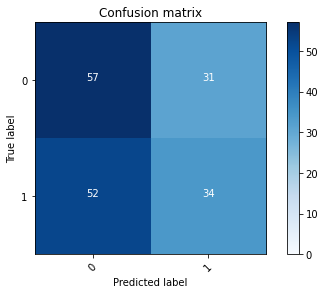

2022-08-20 14:56:13 - [Epoch Train: 33] loss: 0.1770, auc: 0.9810, acc: 0.9288, time: 50.00 s            
2022-08-20 14:56:13 - [Epoch Valid: 33] loss: 1.2451, auc: 0.5385, acc: 0.5179, time: 13.00 s


 33%|█████████████▏                          | 33/100 [34:42<1:10:52, 63.48s/it]

2022-08-20 14:56:13 - EPOCH: 34
2022-08-20 14:56:13 - Train Step 10/969, train_loss: 0.2530
2022-08-20 14:56:14 - Train Step 20/969, train_loss: 0.1485
2022-08-20 14:56:14 - Train Step 30/969, train_loss: 0.1862
2022-08-20 14:56:15 - Train Step 40/969, train_loss: 0.2388
2022-08-20 14:56:15 - Train Step 50/969, train_loss: 0.2054
2022-08-20 14:56:16 - Train Step 60/969, train_loss: 0.1839
2022-08-20 14:56:16 - Train Step 70/969, train_loss: 0.1637
2022-08-20 14:56:17 - Train Step 80/969, train_loss: 0.2076
2022-08-20 14:56:17 - Train Step 90/969, train_loss: 0.2029
2022-08-20 14:56:18 - Train Step 100/969, train_loss: 0.1939
2022-08-20 14:56:19 - Train Step 110/969, train_loss: 0.1821
2022-08-20 14:56:19 - Train Step 120/969, train_loss: 0.1755
2022-08-20 14:56:20 - Train Step 130/969, train_loss: 0.1870
2022-08-20 14:56:20 - Train Step 140/969, train_loss: 0.1874
2022-08-20 14:56:21 - Train Step 150/969, train_loss: 0.1827
2022-08-20 14:56:21 - Train Step 160/969, train_loss: 0.1804
2

2022-08-20 14:57:13 - Valid Step 190/251, valid_loss: 1.1834
2022-08-20 14:57:13 - Valid Step 195/251, valid_loss: 1.2096
2022-08-20 14:57:13 - Valid Step 200/251, valid_loss: 1.2014
2022-08-20 14:57:13 - Valid Step 205/251, valid_loss: 1.1834
2022-08-20 14:57:14 - Valid Step 210/251, valid_loss: 1.2049
2022-08-20 14:57:14 - Valid Step 215/251, valid_loss: 1.1881
2022-08-20 14:57:14 - Valid Step 220/251, valid_loss: 1.1768
2022-08-20 14:57:14 - Valid Step 225/251, valid_loss: 1.1548
2022-08-20 14:57:15 - Valid Step 230/251, valid_loss: 1.1407
2022-08-20 14:57:15 - Valid Step 235/251, valid_loss: 1.1574
2022-08-20 14:57:15 - Valid Step 240/251, valid_loss: 1.1496
2022-08-20 14:57:16 - Valid Step 245/251, valid_loss: 1.1635
2022-08-20 14:57:16 - Valid Step 250/251, valid_loss: 1.1626
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
140     00012                1           0
67      00021                0         

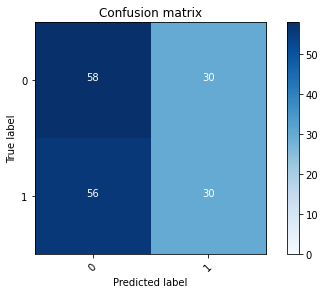

2022-08-20 14:57:16 - [Epoch Train: 34] loss: 0.1777, auc: 0.9784, acc: 0.9185, time: 50.00 s            
2022-08-20 14:57:16 - [Epoch Valid: 34] loss: 1.1588, auc: 0.5288, acc: 0.5060, time: 13.00 s


 34%|█████████████▌                          | 34/100 [35:46<1:09:49, 63.48s/it]

2022-08-20 14:57:16 - EPOCH: 35
2022-08-20 14:57:17 - Train Step 10/969, train_loss: 0.1982
2022-08-20 14:57:17 - Train Step 20/969, train_loss: 0.1776
2022-08-20 14:57:18 - Train Step 30/969, train_loss: 0.1797
2022-08-20 14:57:18 - Train Step 40/969, train_loss: 0.1730
2022-08-20 14:57:19 - Train Step 50/969, train_loss: 0.1540
2022-08-20 14:57:19 - Train Step 60/969, train_loss: 0.1501
2022-08-20 14:57:20 - Train Step 70/969, train_loss: 0.1817
2022-08-20 14:57:20 - Train Step 80/969, train_loss: 0.1749
2022-08-20 14:57:21 - Train Step 90/969, train_loss: 0.1676
2022-08-20 14:57:21 - Train Step 100/969, train_loss: 0.1657
2022-08-20 14:57:22 - Train Step 110/969, train_loss: 0.1554
2022-08-20 14:57:23 - Train Step 120/969, train_loss: 0.1624
2022-08-20 14:57:23 - Train Step 130/969, train_loss: 0.1587
2022-08-20 14:57:24 - Train Step 140/969, train_loss: 0.1609
2022-08-20 14:57:24 - Train Step 150/969, train_loss: 0.1624
2022-08-20 14:57:25 - Train Step 160/969, train_loss: 0.1595
2

2022-08-20 14:58:17 - Valid Step 190/251, valid_loss: 1.3804
2022-08-20 14:58:17 - Valid Step 195/251, valid_loss: 1.3757
2022-08-20 14:58:17 - Valid Step 200/251, valid_loss: 1.3513
2022-08-20 14:58:18 - Valid Step 205/251, valid_loss: 1.3382
2022-08-20 14:58:18 - Valid Step 210/251, valid_loss: 1.3341
2022-08-20 14:58:18 - Valid Step 215/251, valid_loss: 1.3330
2022-08-20 14:58:19 - Valid Step 220/251, valid_loss: 1.3486
2022-08-20 14:58:19 - Valid Step 225/251, valid_loss: 1.3648
2022-08-20 14:58:19 - Valid Step 230/251, valid_loss: 1.3743
2022-08-20 14:58:19 - Valid Step 235/251, valid_loss: 1.3548
2022-08-20 14:58:20 - Valid Step 240/251, valid_loss: 1.3379
2022-08-20 14:58:20 - Valid Step 245/251, valid_loss: 1.3293
2022-08-20 14:58:20 - Valid Step 250/251, valid_loss: 1.3848
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
113     00012                1           0
85      00021                0         

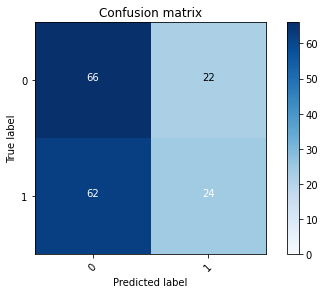

2022-08-20 14:58:20 - [Epoch Train: 35] loss: 0.1624, auc: 0.9837, acc: 0.9340, time: 50.00 s            
2022-08-20 14:58:20 - [Epoch Valid: 35] loss: 1.3941, auc: 0.5344, acc: 0.5139, time: 13.00 s


 35%|██████████████                          | 35/100 [36:50<1:08:57, 63.66s/it]

2022-08-20 14:58:20 - EPOCH: 36
2022-08-20 14:58:21 - Train Step 10/969, train_loss: 0.0825
2022-08-20 14:58:21 - Train Step 20/969, train_loss: 0.1304
2022-08-20 14:58:22 - Train Step 30/969, train_loss: 0.1225
2022-08-20 14:58:22 - Train Step 40/969, train_loss: 0.1083
2022-08-20 14:58:23 - Train Step 50/969, train_loss: 0.1213
2022-08-20 14:58:24 - Train Step 60/969, train_loss: 0.1450
2022-08-20 14:58:24 - Train Step 70/969, train_loss: 0.1359
2022-08-20 14:58:25 - Train Step 80/969, train_loss: 0.1379
2022-08-20 14:58:25 - Train Step 90/969, train_loss: 0.1306
2022-08-20 14:58:26 - Train Step 100/969, train_loss: 0.1466
2022-08-20 14:58:26 - Train Step 110/969, train_loss: 0.1502
2022-08-20 14:58:27 - Train Step 120/969, train_loss: 0.1495
2022-08-20 14:58:27 - Train Step 130/969, train_loss: 0.1538
2022-08-20 14:58:28 - Train Step 140/969, train_loss: 0.1578
2022-08-20 14:58:28 - Train Step 150/969, train_loss: 0.1496
2022-08-20 14:58:29 - Train Step 160/969, train_loss: 0.1669
2

2022-08-20 14:59:21 - Valid Step 190/251, valid_loss: 1.5365
2022-08-20 14:59:21 - Valid Step 195/251, valid_loss: 1.5113
2022-08-20 14:59:22 - Valid Step 200/251, valid_loss: 1.5130
2022-08-20 14:59:22 - Valid Step 205/251, valid_loss: 1.5214
2022-08-20 14:59:22 - Valid Step 210/251, valid_loss: 1.5362
2022-08-20 14:59:22 - Valid Step 215/251, valid_loss: 1.5536
2022-08-20 14:59:23 - Valid Step 220/251, valid_loss: 1.5483
2022-08-20 14:59:23 - Valid Step 225/251, valid_loss: 1.5266
2022-08-20 14:59:23 - Valid Step 230/251, valid_loss: 1.5073
2022-08-20 14:59:24 - Valid Step 235/251, valid_loss: 1.4784
2022-08-20 14:59:24 - Valid Step 240/251, valid_loss: 1.4530
2022-08-20 14:59:24 - Valid Step 245/251, valid_loss: 1.4573
2022-08-20 14:59:24 - Valid Step 250/251, valid_loss: 1.4628
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
97      00012                1           0
153     00021                0         

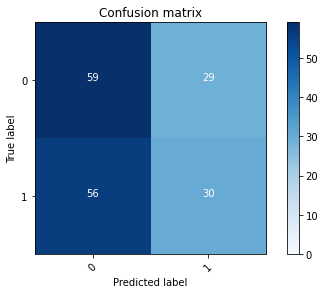

2022-08-20 14:59:25 - [Epoch Train: 36] loss: 0.1586, auc: 0.9837, acc: 0.9453, time: 51.00 s            
2022-08-20 14:59:25 - [Epoch Valid: 36] loss: 1.4588, auc: 0.5300, acc: 0.5060, time: 13.00 s


 36%|██████████████▍                         | 36/100 [37:54<1:08:05, 63.84s/it]

2022-08-20 14:59:25 - EPOCH: 37
2022-08-20 14:59:25 - Train Step 10/969, train_loss: 0.1225
2022-08-20 14:59:26 - Train Step 20/969, train_loss: 0.0902
2022-08-20 14:59:26 - Train Step 30/969, train_loss: 0.1006
2022-08-20 14:59:27 - Train Step 40/969, train_loss: 0.0902
2022-08-20 14:59:27 - Train Step 50/969, train_loss: 0.1117
2022-08-20 14:59:28 - Train Step 60/969, train_loss: 0.1047
2022-08-20 14:59:28 - Train Step 70/969, train_loss: 0.1308
2022-08-20 14:59:29 - Train Step 80/969, train_loss: 0.1176
2022-08-20 14:59:29 - Train Step 90/969, train_loss: 0.1172
2022-08-20 14:59:30 - Train Step 100/969, train_loss: 0.1256
2022-08-20 14:59:30 - Train Step 110/969, train_loss: 0.1374
2022-08-20 14:59:31 - Train Step 120/969, train_loss: 0.1331
2022-08-20 14:59:31 - Train Step 130/969, train_loss: 0.1336
2022-08-20 14:59:32 - Train Step 140/969, train_loss: 0.1306
2022-08-20 14:59:32 - Train Step 150/969, train_loss: 0.1329
2022-08-20 14:59:33 - Train Step 160/969, train_loss: 0.1285
2

2022-08-20 15:00:25 - Valid Step 190/251, valid_loss: 1.4249
2022-08-20 15:00:25 - Valid Step 195/251, valid_loss: 1.4233
2022-08-20 15:00:25 - Valid Step 200/251, valid_loss: 1.4057
2022-08-20 15:00:26 - Valid Step 205/251, valid_loss: 1.4315
2022-08-20 15:00:26 - Valid Step 210/251, valid_loss: 1.4020
2022-08-20 15:00:26 - Valid Step 215/251, valid_loss: 1.4109
2022-08-20 15:00:27 - Valid Step 220/251, valid_loss: 1.4136
2022-08-20 15:00:27 - Valid Step 225/251, valid_loss: 1.3986
2022-08-20 15:00:27 - Valid Step 230/251, valid_loss: 1.3860
2022-08-20 15:00:27 - Valid Step 235/251, valid_loss: 1.4115
2022-08-20 15:00:28 - Valid Step 240/251, valid_loss: 1.4243
2022-08-20 15:00:28 - Valid Step 245/251, valid_loss: 1.4238
2022-08-20 15:00:28 - Valid Step 250/251, valid_loss: 1.4059
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
117     00012                1           0
118     00021                0         

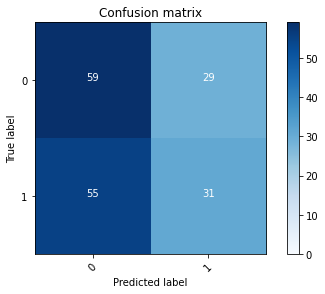

2022-08-20 15:00:28 - [Epoch Train: 37] loss: 0.1525, auc: 0.9849, acc: 0.9412, time: 50.00 s            
2022-08-20 15:00:28 - [Epoch Valid: 37] loss: 1.4004, auc: 0.5309, acc: 0.5179, time: 13.00 s


 37%|██████████████▊                         | 37/100 [38:58<1:07:01, 63.83s/it]

2022-08-20 15:00:28 - EPOCH: 38
2022-08-20 15:00:29 - Train Step 10/969, train_loss: 0.1074
2022-08-20 15:00:30 - Train Step 20/969, train_loss: 0.1049
2022-08-20 15:00:30 - Train Step 30/969, train_loss: 0.1133
2022-08-20 15:00:31 - Train Step 40/969, train_loss: 0.1009
2022-08-20 15:00:31 - Train Step 50/969, train_loss: 0.1088
2022-08-20 15:00:32 - Train Step 60/969, train_loss: 0.1271
2022-08-20 15:00:32 - Train Step 70/969, train_loss: 0.1414
2022-08-20 15:00:33 - Train Step 80/969, train_loss: 0.1295
2022-08-20 15:00:33 - Train Step 90/969, train_loss: 0.1387
2022-08-20 15:00:34 - Train Step 100/969, train_loss: 0.1331
2022-08-20 15:00:34 - Train Step 110/969, train_loss: 0.1348
2022-08-20 15:00:35 - Train Step 120/969, train_loss: 0.1352
2022-08-20 15:00:35 - Train Step 130/969, train_loss: 0.1356
2022-08-20 15:00:36 - Train Step 140/969, train_loss: 0.1284
2022-08-20 15:00:36 - Train Step 150/969, train_loss: 0.1302
2022-08-20 15:00:37 - Train Step 160/969, train_loss: 0.1366
2

2022-08-20 15:01:29 - Valid Step 190/251, valid_loss: 1.4559
2022-08-20 15:01:29 - Valid Step 195/251, valid_loss: 1.4640
2022-08-20 15:01:29 - Valid Step 200/251, valid_loss: 1.4470
2022-08-20 15:01:29 - Valid Step 205/251, valid_loss: 1.4270
2022-08-20 15:01:30 - Valid Step 210/251, valid_loss: 1.4275
2022-08-20 15:01:30 - Valid Step 215/251, valid_loss: 1.3981
2022-08-20 15:01:30 - Valid Step 220/251, valid_loss: 1.3807
2022-08-20 15:01:30 - Valid Step 225/251, valid_loss: 1.4034
2022-08-20 15:01:31 - Valid Step 230/251, valid_loss: 1.3988
2022-08-20 15:01:31 - Valid Step 235/251, valid_loss: 1.3890
2022-08-20 15:01:31 - Valid Step 240/251, valid_loss: 1.4147
2022-08-20 15:01:32 - Valid Step 245/251, valid_loss: 1.3928
2022-08-20 15:01:32 - Valid Step 250/251, valid_loss: 1.4096
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
8       00012                1           0
103     00021                0         

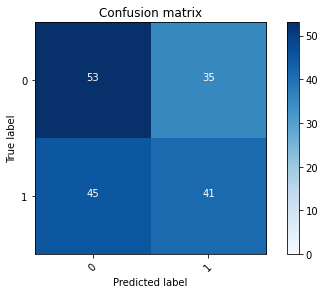

2022-08-20 15:01:32 - [Epoch Train: 38] loss: 0.1429, auc: 0.9861, acc: 0.9391, time: 50.00 s            
2022-08-20 15:01:32 - [Epoch Valid: 38] loss: 1.4058, auc: 0.5299, acc: 0.5339, time: 13.00 s


 38%|███████████████▏                        | 38/100 [40:01<1:05:54, 63.79s/it]

2022-08-20 15:01:32 - EPOCH: 39
2022-08-20 15:01:33 - Train Step 10/969, train_loss: 0.1365
2022-08-20 15:01:33 - Train Step 20/969, train_loss: 0.0996
2022-08-20 15:01:34 - Train Step 30/969, train_loss: 0.1246
2022-08-20 15:01:34 - Train Step 40/969, train_loss: 0.1133
2022-08-20 15:01:35 - Train Step 50/969, train_loss: 0.1183
2022-08-20 15:01:35 - Train Step 60/969, train_loss: 0.1137
2022-08-20 15:01:36 - Train Step 70/969, train_loss: 0.0999
2022-08-20 15:01:36 - Train Step 80/969, train_loss: 0.1209
2022-08-20 15:01:37 - Train Step 90/969, train_loss: 0.1238
2022-08-20 15:01:37 - Train Step 100/969, train_loss: 0.1328
2022-08-20 15:01:38 - Train Step 110/969, train_loss: 0.1251
2022-08-20 15:01:38 - Train Step 120/969, train_loss: 0.1256
2022-08-20 15:01:39 - Train Step 130/969, train_loss: 0.1242
2022-08-20 15:01:39 - Train Step 140/969, train_loss: 0.1224
2022-08-20 15:01:40 - Train Step 150/969, train_loss: 0.1246
2022-08-20 15:01:40 - Train Step 160/969, train_loss: 0.1260
2

2022-08-20 15:02:32 - Valid Step 190/251, valid_loss: 1.3909
2022-08-20 15:02:33 - Valid Step 195/251, valid_loss: 1.3751
2022-08-20 15:02:33 - Valid Step 200/251, valid_loss: 1.3532
2022-08-20 15:02:33 - Valid Step 205/251, valid_loss: 1.3830
2022-08-20 15:02:33 - Valid Step 210/251, valid_loss: 1.3585
2022-08-20 15:02:34 - Valid Step 215/251, valid_loss: 1.3808
2022-08-20 15:02:34 - Valid Step 220/251, valid_loss: 1.3818
2022-08-20 15:02:34 - Valid Step 225/251, valid_loss: 1.3755
2022-08-20 15:02:34 - Valid Step 230/251, valid_loss: 1.3774
2022-08-20 15:02:35 - Valid Step 235/251, valid_loss: 1.3766
2022-08-20 15:02:35 - Valid Step 240/251, valid_loss: 1.4019
2022-08-20 15:02:35 - Valid Step 245/251, valid_loss: 1.3856
2022-08-20 15:02:36 - Valid Step 250/251, valid_loss: 1.3642
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
124     00012                1           0
135     00021                0         

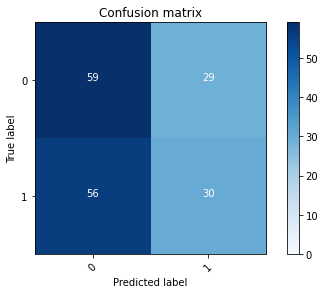

2022-08-20 15:02:36 - [Epoch Train: 39] loss: 0.1341, auc: 0.9898, acc: 0.9494, time: 50.00 s            
2022-08-20 15:02:36 - [Epoch Valid: 39] loss: 1.3610, auc: 0.5329, acc: 0.5060, time: 13.00 s


 39%|███████████████▌                        | 39/100 [41:05<1:04:48, 63.75s/it]

2022-08-20 15:02:36 - EPOCH: 40
2022-08-20 15:02:36 - Train Step 10/969, train_loss: 0.0881
2022-08-20 15:02:37 - Train Step 20/969, train_loss: 0.1618
2022-08-20 15:02:37 - Train Step 30/969, train_loss: 0.1286
2022-08-20 15:02:38 - Train Step 40/969, train_loss: 0.1338
2022-08-20 15:02:38 - Train Step 50/969, train_loss: 0.1195
2022-08-20 15:02:39 - Train Step 60/969, train_loss: 0.1399
2022-08-20 15:02:39 - Train Step 70/969, train_loss: 0.1771
2022-08-20 15:02:40 - Train Step 80/969, train_loss: 0.1626
2022-08-20 15:02:40 - Train Step 90/969, train_loss: 0.1586
2022-08-20 15:02:41 - Train Step 100/969, train_loss: 0.1464
2022-08-20 15:02:41 - Train Step 110/969, train_loss: 0.1433
2022-08-20 15:02:42 - Train Step 120/969, train_loss: 0.1504
2022-08-20 15:02:42 - Train Step 130/969, train_loss: 0.1445
2022-08-20 15:02:43 - Train Step 140/969, train_loss: 0.1411
2022-08-20 15:02:44 - Train Step 150/969, train_loss: 0.1422
2022-08-20 15:02:44 - Train Step 160/969, train_loss: 0.1410
2

2022-08-20 15:03:36 - Valid Step 190/251, valid_loss: 1.7171
2022-08-20 15:03:36 - Valid Step 195/251, valid_loss: 1.6891
2022-08-20 15:03:36 - Valid Step 200/251, valid_loss: 1.6788
2022-08-20 15:03:37 - Valid Step 205/251, valid_loss: 1.6778
2022-08-20 15:03:37 - Valid Step 210/251, valid_loss: 1.6659
2022-08-20 15:03:37 - Valid Step 215/251, valid_loss: 1.6506
2022-08-20 15:03:37 - Valid Step 220/251, valid_loss: 1.6343
2022-08-20 15:03:38 - Valid Step 225/251, valid_loss: 1.6067
2022-08-20 15:03:38 - Valid Step 230/251, valid_loss: 1.5902
2022-08-20 15:03:38 - Valid Step 235/251, valid_loss: 1.5665
2022-08-20 15:03:38 - Valid Step 240/251, valid_loss: 1.5528
2022-08-20 15:03:39 - Valid Step 245/251, valid_loss: 1.5337
2022-08-20 15:03:39 - Valid Step 250/251, valid_loss: 1.5576
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
80      00012                1           0
73      00021                0         

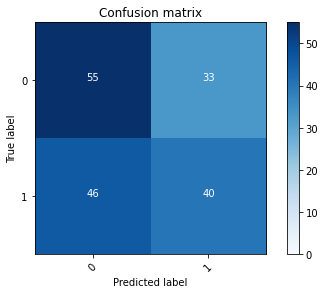

2022-08-20 15:03:39 - [Epoch Train: 40] loss: 0.1255, auc: 0.9908, acc: 0.9525, time: 50.00 s            
2022-08-20 15:03:39 - [Epoch Valid: 40] loss: 1.5515, auc: 0.5301, acc: 0.5418, time: 13.00 s
2022-08-20 15:03:39 - acc improved from 0.5418 to 0.5418. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_14-21-30/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e40-loss1.552-acc0.542-auc0.530.pth'


 40%|████████████████                        | 40/100 [42:09<1:03:39, 63.66s/it]

2022-08-20 15:03:39 - EPOCH: 41
2022-08-20 15:03:40 - Train Step 10/969, train_loss: 0.1402
2022-08-20 15:03:40 - Train Step 20/969, train_loss: 0.1198
2022-08-20 15:03:41 - Train Step 30/969, train_loss: 0.1240
2022-08-20 15:03:41 - Train Step 40/969, train_loss: 0.1212
2022-08-20 15:03:42 - Train Step 50/969, train_loss: 0.1225
2022-08-20 15:03:43 - Train Step 60/969, train_loss: 0.1250
2022-08-20 15:03:43 - Train Step 70/969, train_loss: 0.1421
2022-08-20 15:03:44 - Train Step 80/969, train_loss: 0.1442
2022-08-20 15:03:44 - Train Step 90/969, train_loss: 0.1400
2022-08-20 15:03:45 - Train Step 100/969, train_loss: 0.1332
2022-08-20 15:03:45 - Train Step 110/969, train_loss: 0.1283
2022-08-20 15:03:46 - Train Step 120/969, train_loss: 0.1249
2022-08-20 15:03:46 - Train Step 130/969, train_loss: 0.1175
2022-08-20 15:03:47 - Train Step 140/969, train_loss: 0.1144
2022-08-20 15:03:47 - Train Step 150/969, train_loss: 0.1194
2022-08-20 15:03:48 - Train Step 160/969, train_loss: 0.1164
2

2022-08-20 15:04:40 - Valid Step 190/251, valid_loss: 1.6130
2022-08-20 15:04:40 - Valid Step 195/251, valid_loss: 1.5782
2022-08-20 15:04:40 - Valid Step 200/251, valid_loss: 1.5782
2022-08-20 15:04:41 - Valid Step 205/251, valid_loss: 1.5461
2022-08-20 15:04:41 - Valid Step 210/251, valid_loss: 1.5564
2022-08-20 15:04:41 - Valid Step 215/251, valid_loss: 1.5634
2022-08-20 15:04:42 - Valid Step 220/251, valid_loss: 1.6288
2022-08-20 15:04:42 - Valid Step 225/251, valid_loss: 1.6193
2022-08-20 15:04:42 - Valid Step 230/251, valid_loss: 1.6071
2022-08-20 15:04:42 - Valid Step 235/251, valid_loss: 1.5821
2022-08-20 15:04:43 - Valid Step 240/251, valid_loss: 1.5719
2022-08-20 15:04:43 - Valid Step 245/251, valid_loss: 1.5737
2022-08-20 15:04:43 - Valid Step 250/251, valid_loss: 1.5501
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
156     00012                1           0
121     00021                0         

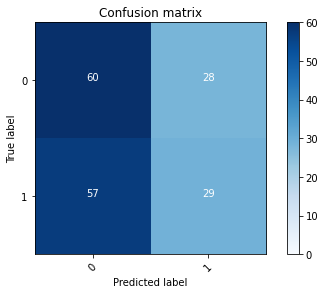

2022-08-20 15:04:43 - [Epoch Train: 41] loss: 0.1196, auc: 0.9907, acc: 0.9598, time: 50.00 s            
2022-08-20 15:04:43 - [Epoch Valid: 41] loss: 1.5444, auc: 0.5333, acc: 0.5060, time: 13.00 s


 41%|████████████████▍                       | 41/100 [43:13<1:02:45, 63.83s/it]

2022-08-20 15:04:43 - EPOCH: 42
2022-08-20 15:04:44 - Train Step 10/969, train_loss: 0.1309
2022-08-20 15:04:45 - Train Step 20/969, train_loss: 0.1339
2022-08-20 15:04:45 - Train Step 30/969, train_loss: 0.1062
2022-08-20 15:04:46 - Train Step 40/969, train_loss: 0.1066
2022-08-20 15:04:46 - Train Step 50/969, train_loss: 0.0893
2022-08-20 15:04:47 - Train Step 60/969, train_loss: 0.0953
2022-08-20 15:04:47 - Train Step 70/969, train_loss: 0.1321
2022-08-20 15:04:48 - Train Step 80/969, train_loss: 0.1182
2022-08-20 15:04:48 - Train Step 90/969, train_loss: 0.1140
2022-08-20 15:04:49 - Train Step 100/969, train_loss: 0.1074
2022-08-20 15:04:49 - Train Step 110/969, train_loss: 0.1081
2022-08-20 15:04:50 - Train Step 120/969, train_loss: 0.1164
2022-08-20 15:04:50 - Train Step 130/969, train_loss: 0.1200
2022-08-20 15:04:51 - Train Step 140/969, train_loss: 0.1135
2022-08-20 15:04:51 - Train Step 150/969, train_loss: 0.1119
2022-08-20 15:04:52 - Train Step 160/969, train_loss: 0.1114
2

2022-08-20 15:05:44 - Valid Step 190/251, valid_loss: 1.4745
2022-08-20 15:05:44 - Valid Step 195/251, valid_loss: 1.4717
2022-08-20 15:05:44 - Valid Step 200/251, valid_loss: 1.4780
2022-08-20 15:05:45 - Valid Step 205/251, valid_loss: 1.4922
2022-08-20 15:05:45 - Valid Step 210/251, valid_loss: 1.4580
2022-08-20 15:05:45 - Valid Step 215/251, valid_loss: 1.4780
2022-08-20 15:05:45 - Valid Step 220/251, valid_loss: 1.4902
2022-08-20 15:05:46 - Valid Step 225/251, valid_loss: 1.4986
2022-08-20 15:05:46 - Valid Step 230/251, valid_loss: 1.5053
2022-08-20 15:05:46 - Valid Step 235/251, valid_loss: 1.5676
2022-08-20 15:05:46 - Valid Step 240/251, valid_loss: 1.5460
2022-08-20 15:05:47 - Valid Step 245/251, valid_loss: 1.5356
2022-08-20 15:05:47 - Valid Step 250/251, valid_loss: 1.5381
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
1       00012                1           0
46      00021                0         

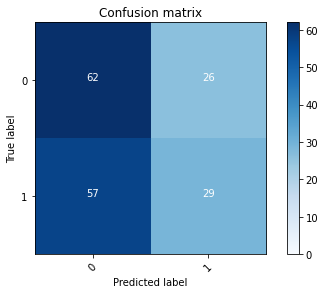

2022-08-20 15:05:47 - [Epoch Train: 42] loss: 0.1102, auc: 0.9929, acc: 0.9608, time: 50.00 s            
2022-08-20 15:05:47 - [Epoch Valid: 42] loss: 1.5591, auc: 0.5355, acc: 0.5179, time: 13.00 s


 42%|████████████████▊                       | 42/100 [44:17<1:01:43, 63.85s/it]

2022-08-20 15:05:47 - EPOCH: 43
2022-08-20 15:05:48 - Train Step 10/969, train_loss: 0.0412
2022-08-20 15:05:48 - Train Step 20/969, train_loss: 0.1448
2022-08-20 15:05:49 - Train Step 30/969, train_loss: 0.1060
2022-08-20 15:05:49 - Train Step 40/969, train_loss: 0.0825
2022-08-20 15:05:50 - Train Step 50/969, train_loss: 0.0775
2022-08-20 15:05:50 - Train Step 60/969, train_loss: 0.0752
2022-08-20 15:05:51 - Train Step 70/969, train_loss: 0.1130
2022-08-20 15:05:51 - Train Step 80/969, train_loss: 0.1054
2022-08-20 15:05:52 - Train Step 90/969, train_loss: 0.0957
2022-08-20 15:05:53 - Train Step 100/969, train_loss: 0.0935
2022-08-20 15:05:53 - Train Step 110/969, train_loss: 0.0866
2022-08-20 15:05:54 - Train Step 120/969, train_loss: 0.0925
2022-08-20 15:05:54 - Train Step 130/969, train_loss: 0.0918
2022-08-20 15:05:55 - Train Step 140/969, train_loss: 0.0881
2022-08-20 15:05:55 - Train Step 150/969, train_loss: 0.1000
2022-08-20 15:05:56 - Train Step 160/969, train_loss: 0.1083
2

2022-08-20 15:06:47 - Valid Step 190/251, valid_loss: 1.5892
2022-08-20 15:06:47 - Valid Step 195/251, valid_loss: 1.5840
2022-08-20 15:06:48 - Valid Step 200/251, valid_loss: 1.5899
2022-08-20 15:06:48 - Valid Step 205/251, valid_loss: 1.5931
2022-08-20 15:06:48 - Valid Step 210/251, valid_loss: 1.6377
2022-08-20 15:06:48 - Valid Step 215/251, valid_loss: 1.6027
2022-08-20 15:06:48 - Valid Step 220/251, valid_loss: 1.6169
2022-08-20 15:06:49 - Valid Step 225/251, valid_loss: 1.6255
2022-08-20 15:06:49 - Valid Step 230/251, valid_loss: 1.6531
2022-08-20 15:06:49 - Valid Step 235/251, valid_loss: 1.6399
2022-08-20 15:06:49 - Valid Step 240/251, valid_loss: 1.6877
2022-08-20 15:06:50 - Valid Step 245/251, valid_loss: 1.7111
2022-08-20 15:06:50 - Valid Step 250/251, valid_loss: 1.7040
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
137     00012                1           0
103     00021                0         

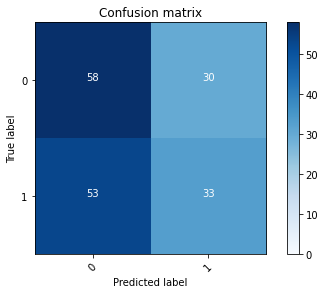

2022-08-20 15:06:50 - [Epoch Train: 43] loss: 0.1041, auc: 0.9948, acc: 0.9680, time: 49.00 s            
2022-08-20 15:06:50 - [Epoch Valid: 43] loss: 1.6972, auc: 0.5264, acc: 0.5139, time: 13.00 s


 43%|█████████████████▏                      | 43/100 [45:20<1:00:26, 63.62s/it]

2022-08-20 15:06:50 - EPOCH: 44
2022-08-20 15:06:51 - Train Step 10/969, train_loss: 0.0732
2022-08-20 15:06:52 - Train Step 20/969, train_loss: 0.1459
2022-08-20 15:06:52 - Train Step 30/969, train_loss: 0.1123
2022-08-20 15:06:53 - Train Step 40/969, train_loss: 0.0896
2022-08-20 15:06:53 - Train Step 50/969, train_loss: 0.0798
2022-08-20 15:06:54 - Train Step 60/969, train_loss: 0.1252
2022-08-20 15:06:54 - Train Step 70/969, train_loss: 0.1181
2022-08-20 15:06:55 - Train Step 80/969, train_loss: 0.1179
2022-08-20 15:06:55 - Train Step 90/969, train_loss: 0.1134
2022-08-20 15:06:56 - Train Step 100/969, train_loss: 0.1177
2022-08-20 15:06:56 - Train Step 110/969, train_loss: 0.1161
2022-08-20 15:06:57 - Train Step 120/969, train_loss: 0.1217
2022-08-20 15:06:57 - Train Step 130/969, train_loss: 0.1174
2022-08-20 15:06:58 - Train Step 140/969, train_loss: 0.1103
2022-08-20 15:06:58 - Train Step 150/969, train_loss: 0.1105
2022-08-20 15:06:59 - Train Step 160/969, train_loss: 0.1044
2

2022-08-20 15:07:51 - Valid Step 190/251, valid_loss: 1.7954
2022-08-20 15:07:51 - Valid Step 195/251, valid_loss: 1.7881
2022-08-20 15:07:51 - Valid Step 200/251, valid_loss: 1.8373
2022-08-20 15:07:52 - Valid Step 205/251, valid_loss: 1.8052
2022-08-20 15:07:52 - Valid Step 210/251, valid_loss: 1.7826
2022-08-20 15:07:52 - Valid Step 215/251, valid_loss: 1.8020
2022-08-20 15:07:53 - Valid Step 220/251, valid_loss: 1.7734
2022-08-20 15:07:53 - Valid Step 225/251, valid_loss: 1.7609
2022-08-20 15:07:53 - Valid Step 230/251, valid_loss: 1.7594
2022-08-20 15:07:53 - Valid Step 235/251, valid_loss: 1.7666
2022-08-20 15:07:54 - Valid Step 240/251, valid_loss: 1.7789
2022-08-20 15:07:54 - Valid Step 245/251, valid_loss: 1.7499
2022-08-20 15:07:54 - Valid Step 250/251, valid_loss: 1.7691
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
152     00012                1           0
112     00021                0         

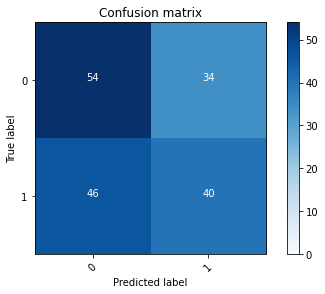

2022-08-20 15:07:54 - [Epoch Train: 44] loss: 0.0908, auc: 0.9963, acc: 0.9701, time: 50.00 s            
2022-08-20 15:07:54 - [Epoch Valid: 44] loss: 1.7621, auc: 0.5295, acc: 0.5498, time: 13.00 s
2022-08-20 15:07:54 - acc improved from 0.5418 to 0.5498. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_14-21-30/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e44-loss1.762-acc0.550-auc0.529.pth'


 44%|██████████████████▍                       | 44/100 [46:24<59:29, 63.73s/it]

2022-08-20 15:07:54 - EPOCH: 45
2022-08-20 15:07:55 - Train Step 10/969, train_loss: 0.2099
2022-08-20 15:07:56 - Train Step 20/969, train_loss: 0.1288
2022-08-20 15:07:56 - Train Step 30/969, train_loss: 0.1008
2022-08-20 15:07:57 - Train Step 40/969, train_loss: 0.0847
2022-08-20 15:07:57 - Train Step 50/969, train_loss: 0.0720
2022-08-20 15:07:58 - Train Step 60/969, train_loss: 0.0635
2022-08-20 15:07:58 - Train Step 70/969, train_loss: 0.0566
2022-08-20 15:07:59 - Train Step 80/969, train_loss: 0.0528
2022-08-20 15:07:59 - Train Step 90/969, train_loss: 0.0518
2022-08-20 15:08:00 - Train Step 100/969, train_loss: 0.0480
2022-08-20 15:08:00 - Train Step 110/969, train_loss: 0.0459
2022-08-20 15:08:01 - Train Step 120/969, train_loss: 0.0471
2022-08-20 15:08:01 - Train Step 130/969, train_loss: 0.0448
2022-08-20 15:08:02 - Train Step 140/969, train_loss: 0.0566
2022-08-20 15:08:02 - Train Step 150/969, train_loss: 0.0544
2022-08-20 15:08:03 - Train Step 160/969, train_loss: 0.0662
2

2022-08-20 15:08:55 - Valid Step 190/251, valid_loss: 1.6846
2022-08-20 15:08:55 - Valid Step 195/251, valid_loss: 1.7075
2022-08-20 15:08:55 - Valid Step 200/251, valid_loss: 1.6721
2022-08-20 15:08:55 - Valid Step 205/251, valid_loss: 1.7748
2022-08-20 15:08:56 - Valid Step 210/251, valid_loss: 1.7557
2022-08-20 15:08:56 - Valid Step 215/251, valid_loss: 1.7173
2022-08-20 15:08:56 - Valid Step 220/251, valid_loss: 1.7570
2022-08-20 15:08:56 - Valid Step 225/251, valid_loss: 1.7658
2022-08-20 15:08:57 - Valid Step 230/251, valid_loss: 1.8440
2022-08-20 15:08:57 - Valid Step 235/251, valid_loss: 1.8134
2022-08-20 15:08:57 - Valid Step 240/251, valid_loss: 1.7984
2022-08-20 15:08:57 - Valid Step 245/251, valid_loss: 1.8002
2022-08-20 15:08:58 - Valid Step 250/251, valid_loss: 1.8207
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
147     00012                1           0
160     00021                0         

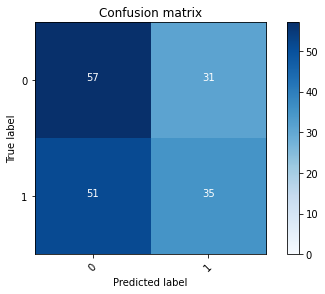

2022-08-20 15:08:58 - [Epoch Train: 45] loss: 0.0888, auc: 0.9962, acc: 0.9680, time: 50.00 s            
2022-08-20 15:08:58 - [Epoch Valid: 45] loss: 1.8134, auc: 0.5303, acc: 0.5219, time: 13.00 s


 45%|██████████████████▉                       | 45/100 [47:27<58:22, 63.68s/it]

2022-08-20 15:08:58 - EPOCH: 46
2022-08-20 15:08:59 - Train Step 10/969, train_loss: 0.0282
2022-08-20 15:08:59 - Train Step 20/969, train_loss: 0.0598
2022-08-20 15:09:00 - Train Step 30/969, train_loss: 0.0491
2022-08-20 15:09:00 - Train Step 40/969, train_loss: 0.0384
2022-08-20 15:09:01 - Train Step 50/969, train_loss: 0.0489
2022-08-20 15:09:01 - Train Step 60/969, train_loss: 0.0505
2022-08-20 15:09:02 - Train Step 70/969, train_loss: 0.0485
2022-08-20 15:09:02 - Train Step 80/969, train_loss: 0.0438
2022-08-20 15:09:03 - Train Step 90/969, train_loss: 0.0408
2022-08-20 15:09:03 - Train Step 100/969, train_loss: 0.0481
2022-08-20 15:09:04 - Train Step 110/969, train_loss: 0.0461
2022-08-20 15:09:04 - Train Step 120/969, train_loss: 0.0561
2022-08-20 15:09:05 - Train Step 130/969, train_loss: 0.0602
2022-08-20 15:09:05 - Train Step 140/969, train_loss: 0.0631
2022-08-20 15:09:06 - Train Step 150/969, train_loss: 0.0613
2022-08-20 15:09:06 - Train Step 160/969, train_loss: 0.0702
2

2022-08-20 15:09:57 - Valid Step 190/251, valid_loss: 1.8039
2022-08-20 15:09:58 - Valid Step 195/251, valid_loss: 1.8372
2022-08-20 15:09:58 - Valid Step 200/251, valid_loss: 1.8275
2022-08-20 15:09:58 - Valid Step 205/251, valid_loss: 1.8396
2022-08-20 15:09:58 - Valid Step 210/251, valid_loss: 1.8753
2022-08-20 15:09:59 - Valid Step 215/251, valid_loss: 1.8495
2022-08-20 15:09:59 - Valid Step 220/251, valid_loss: 1.8287
2022-08-20 15:09:59 - Valid Step 225/251, valid_loss: 1.8064
2022-08-20 15:09:59 - Valid Step 230/251, valid_loss: 1.8340
2022-08-20 15:10:00 - Valid Step 235/251, valid_loss: 1.8094
2022-08-20 15:10:00 - Valid Step 240/251, valid_loss: 1.7960
2022-08-20 15:10:00 - Valid Step 245/251, valid_loss: 1.7882
2022-08-20 15:10:00 - Valid Step 250/251, valid_loss: 1.7636
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
18      00012                1           0
68      00021                0         

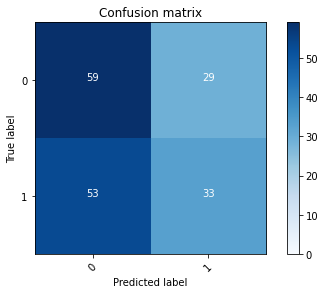

2022-08-20 15:10:01 - [Epoch Train: 46] loss: 0.0856, auc: 0.9952, acc: 0.9690, time: 49.00 s            
2022-08-20 15:10:01 - [Epoch Valid: 46] loss: 1.7585, auc: 0.5301, acc: 0.5299, time: 13.00 s


 46%|███████████████████▎                      | 46/100 [48:30<57:05, 63.44s/it]

2022-08-20 15:10:01 - EPOCH: 47
2022-08-20 15:10:01 - Train Step 10/969, train_loss: 0.0583
2022-08-20 15:10:02 - Train Step 20/969, train_loss: 0.0466
2022-08-20 15:10:02 - Train Step 30/969, train_loss: 0.0649
2022-08-20 15:10:03 - Train Step 40/969, train_loss: 0.0607
2022-08-20 15:10:04 - Train Step 50/969, train_loss: 0.0497
2022-08-20 15:10:04 - Train Step 60/969, train_loss: 0.0510
2022-08-20 15:10:05 - Train Step 70/969, train_loss: 0.0585
2022-08-20 15:10:05 - Train Step 80/969, train_loss: 0.0703
2022-08-20 15:10:06 - Train Step 90/969, train_loss: 0.0650
2022-08-20 15:10:06 - Train Step 100/969, train_loss: 0.0604
2022-08-20 15:10:07 - Train Step 110/969, train_loss: 0.0664
2022-08-20 15:10:07 - Train Step 120/969, train_loss: 0.0646
2022-08-20 15:10:08 - Train Step 130/969, train_loss: 0.0633
2022-08-20 15:10:08 - Train Step 140/969, train_loss: 0.0840
2022-08-20 15:10:09 - Train Step 150/969, train_loss: 0.0810
2022-08-20 15:10:09 - Train Step 160/969, train_loss: 0.0828
2

2022-08-20 15:11:02 - Valid Step 190/251, valid_loss: 1.8935
2022-08-20 15:11:02 - Valid Step 195/251, valid_loss: 1.8461
2022-08-20 15:11:03 - Valid Step 200/251, valid_loss: 1.8144
2022-08-20 15:11:03 - Valid Step 205/251, valid_loss: 1.7814
2022-08-20 15:11:03 - Valid Step 210/251, valid_loss: 1.7945
2022-08-20 15:11:03 - Valid Step 215/251, valid_loss: 1.8330
2022-08-20 15:11:04 - Valid Step 220/251, valid_loss: 1.9987
2022-08-20 15:11:04 - Valid Step 225/251, valid_loss: 1.9974
2022-08-20 15:11:04 - Valid Step 230/251, valid_loss: 1.9933
2022-08-20 15:11:04 - Valid Step 235/251, valid_loss: 1.9823
2022-08-20 15:11:05 - Valid Step 240/251, valid_loss: 1.9993
2022-08-20 15:11:05 - Valid Step 245/251, valid_loss: 1.9948
2022-08-20 15:11:05 - Valid Step 250/251, valid_loss: 2.0614
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
105     00012                1           0
131     00021                0         

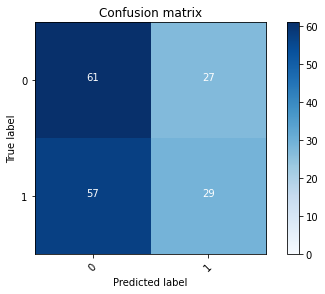

2022-08-20 15:11:05 - [Epoch Train: 47] loss: 0.0758, auc: 0.9981, acc: 0.9794, time: 51.00 s            
2022-08-20 15:11:05 - [Epoch Valid: 47] loss: 2.0531, auc: 0.5313, acc: 0.5139, time: 13.00 s


 47%|███████████████████▋                      | 47/100 [49:35<56:20, 63.78s/it]

2022-08-20 15:11:05 - EPOCH: 48
2022-08-20 15:11:06 - Train Step 10/969, train_loss: 0.1468
2022-08-20 15:11:07 - Train Step 20/969, train_loss: 0.0815
2022-08-20 15:11:07 - Train Step 30/969, train_loss: 0.1110
2022-08-20 15:11:08 - Train Step 40/969, train_loss: 0.1276
2022-08-20 15:11:08 - Train Step 50/969, train_loss: 0.1047
2022-08-20 15:11:09 - Train Step 60/969, train_loss: 0.1059
2022-08-20 15:11:09 - Train Step 70/969, train_loss: 0.0971
2022-08-20 15:11:10 - Train Step 80/969, train_loss: 0.0930
2022-08-20 15:11:10 - Train Step 90/969, train_loss: 0.1124
2022-08-20 15:11:11 - Train Step 100/969, train_loss: 0.1068
2022-08-20 15:11:11 - Train Step 110/969, train_loss: 0.1044
2022-08-20 15:11:12 - Train Step 120/969, train_loss: 0.1001
2022-08-20 15:11:12 - Train Step 130/969, train_loss: 0.0979
2022-08-20 15:11:13 - Train Step 140/969, train_loss: 0.0961
2022-08-20 15:11:13 - Train Step 150/969, train_loss: 0.0936
2022-08-20 15:11:14 - Train Step 160/969, train_loss: 0.1035
2

2022-08-20 15:12:06 - Valid Step 190/251, valid_loss: 1.7506
2022-08-20 15:12:06 - Valid Step 195/251, valid_loss: 1.7793
2022-08-20 15:12:06 - Valid Step 200/251, valid_loss: 1.7359
2022-08-20 15:12:07 - Valid Step 205/251, valid_loss: 1.7204
2022-08-20 15:12:07 - Valid Step 210/251, valid_loss: 1.7367
2022-08-20 15:12:07 - Valid Step 215/251, valid_loss: 1.7042
2022-08-20 15:12:07 - Valid Step 220/251, valid_loss: 1.6709
2022-08-20 15:12:08 - Valid Step 225/251, valid_loss: 1.6584
2022-08-20 15:12:08 - Valid Step 230/251, valid_loss: 1.6572
2022-08-20 15:12:08 - Valid Step 235/251, valid_loss: 1.6552
2022-08-20 15:12:08 - Valid Step 240/251, valid_loss: 1.7199
2022-08-20 15:12:09 - Valid Step 245/251, valid_loss: 1.7618
2022-08-20 15:12:09 - Valid Step 250/251, valid_loss: 1.7577
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
170     00012                1           0
159     00021                0         

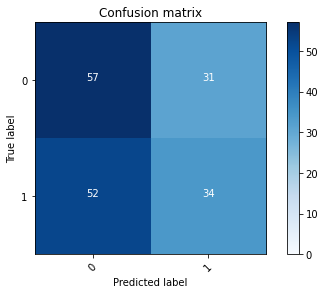

2022-08-20 15:12:09 - [Epoch Train: 48] loss: 0.0830, auc: 0.9974, acc: 0.9763, time: 50.00 s            
2022-08-20 15:12:09 - [Epoch Valid: 48] loss: 1.7516, auc: 0.5270, acc: 0.5259, time: 13.00 s


 48%|████████████████████▏                     | 48/100 [50:39<55:17, 63.79s/it]

2022-08-20 15:12:09 - EPOCH: 49
2022-08-20 15:12:10 - Train Step 10/969, train_loss: 0.0611
2022-08-20 15:12:10 - Train Step 20/969, train_loss: 0.0670
2022-08-20 15:12:11 - Train Step 30/969, train_loss: 0.0533
2022-08-20 15:12:11 - Train Step 40/969, train_loss: 0.0518
2022-08-20 15:12:12 - Train Step 50/969, train_loss: 0.0451
2022-08-20 15:12:12 - Train Step 60/969, train_loss: 0.0526
2022-08-20 15:12:13 - Train Step 70/969, train_loss: 0.0804
2022-08-20 15:12:13 - Train Step 80/969, train_loss: 0.0777
2022-08-20 15:12:14 - Train Step 90/969, train_loss: 0.0739
2022-08-20 15:12:14 - Train Step 100/969, train_loss: 0.0727
2022-08-20 15:12:15 - Train Step 110/969, train_loss: 0.1011
2022-08-20 15:12:16 - Train Step 120/969, train_loss: 0.1082
2022-08-20 15:12:16 - Train Step 130/969, train_loss: 0.1057
2022-08-20 15:12:17 - Train Step 140/969, train_loss: 0.1116
2022-08-20 15:12:17 - Train Step 150/969, train_loss: 0.1086
2022-08-20 15:12:18 - Train Step 160/969, train_loss: 0.1038
2

2022-08-20 15:13:09 - Valid Step 190/251, valid_loss: 1.9149
2022-08-20 15:13:10 - Valid Step 195/251, valid_loss: 1.8736
2022-08-20 15:13:10 - Valid Step 200/251, valid_loss: 2.0077
2022-08-20 15:13:10 - Valid Step 205/251, valid_loss: 1.9990
2022-08-20 15:13:10 - Valid Step 210/251, valid_loss: 1.9813
2022-08-20 15:13:11 - Valid Step 215/251, valid_loss: 2.0010
2022-08-20 15:13:11 - Valid Step 220/251, valid_loss: 2.0179
2022-08-20 15:13:11 - Valid Step 225/251, valid_loss: 2.0061
2022-08-20 15:13:11 - Valid Step 230/251, valid_loss: 2.0097
2022-08-20 15:13:12 - Valid Step 235/251, valid_loss: 2.0356
2022-08-20 15:13:12 - Valid Step 240/251, valid_loss: 2.0352
2022-08-20 15:13:12 - Valid Step 245/251, valid_loss: 2.0903
2022-08-20 15:13:13 - Valid Step 250/251, valid_loss: 2.0819
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
57      00012                1           0
83      00021                0         

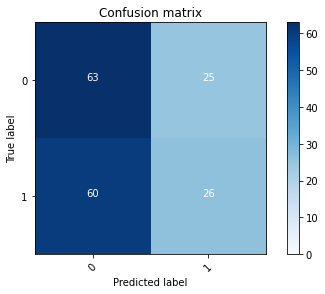

2022-08-20 15:13:13 - [Epoch Train: 49] loss: 0.0762, auc: 0.9966, acc: 0.9763, time: 50.00 s            
2022-08-20 15:13:13 - [Epoch Valid: 49] loss: 2.0736, auc: 0.5366, acc: 0.5100, time: 13.00 s


 49%|████████████████████▌                     | 49/100 [51:42<54:09, 63.71s/it]

2022-08-20 15:13:13 - EPOCH: 50
2022-08-20 15:13:13 - Train Step 10/969, train_loss: 0.1250
2022-08-20 15:13:14 - Train Step 20/969, train_loss: 0.0770
2022-08-20 15:13:14 - Train Step 30/969, train_loss: 0.0669
2022-08-20 15:13:15 - Train Step 40/969, train_loss: 0.0679
2022-08-20 15:13:15 - Train Step 50/969, train_loss: 0.0780
2022-08-20 15:13:16 - Train Step 60/969, train_loss: 0.0679
2022-08-20 15:13:16 - Train Step 70/969, train_loss: 0.0671
2022-08-20 15:13:17 - Train Step 80/969, train_loss: 0.0690
2022-08-20 15:13:17 - Train Step 90/969, train_loss: 0.0750
2022-08-20 15:13:18 - Train Step 100/969, train_loss: 0.0714
2022-08-20 15:13:19 - Train Step 110/969, train_loss: 0.0686
2022-08-20 15:13:19 - Train Step 120/969, train_loss: 0.0695
2022-08-20 15:13:20 - Train Step 130/969, train_loss: 0.0709
2022-08-20 15:13:20 - Train Step 140/969, train_loss: 0.0665
2022-08-20 15:13:21 - Train Step 150/969, train_loss: 0.0640
2022-08-20 15:13:21 - Train Step 160/969, train_loss: 0.0700
2

2022-08-20 15:14:13 - Valid Step 190/251, valid_loss: 1.6184
2022-08-20 15:14:13 - Valid Step 195/251, valid_loss: 1.5812
2022-08-20 15:14:14 - Valid Step 200/251, valid_loss: 1.6376
2022-08-20 15:14:14 - Valid Step 205/251, valid_loss: 1.6197
2022-08-20 15:14:14 - Valid Step 210/251, valid_loss: 1.6274
2022-08-20 15:14:14 - Valid Step 215/251, valid_loss: 1.6263
2022-08-20 15:14:15 - Valid Step 220/251, valid_loss: 1.6444
2022-08-20 15:14:15 - Valid Step 225/251, valid_loss: 1.6392
2022-08-20 15:14:15 - Valid Step 230/251, valid_loss: 1.6749
2022-08-20 15:14:15 - Valid Step 235/251, valid_loss: 1.6898
2022-08-20 15:14:16 - Valid Step 240/251, valid_loss: 1.7726
2022-08-20 15:14:16 - Valid Step 245/251, valid_loss: 1.7920
2022-08-20 15:14:16 - Valid Step 250/251, valid_loss: 1.8392
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
167     00012                1           0
52      00021                0         

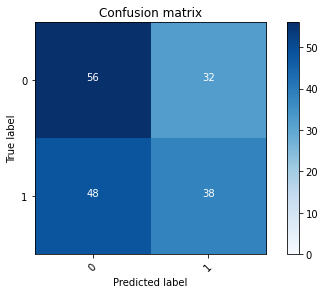

2022-08-20 15:14:16 - [Epoch Train: 50] loss: 0.0662, auc: 0.9982, acc: 0.9794, time: 50.00 s            
2022-08-20 15:14:16 - [Epoch Valid: 50] loss: 1.8596, auc: 0.5276, acc: 0.5378, time: 13.00 s


 50%|█████████████████████                     | 50/100 [52:46<53:06, 63.74s/it]

2022-08-20 15:14:16 - EPOCH: 51
2022-08-20 15:14:17 - Train Step 10/969, train_loss: 0.0653
2022-08-20 15:14:18 - Train Step 20/969, train_loss: 0.0465
2022-08-20 15:14:18 - Train Step 30/969, train_loss: 0.0382
2022-08-20 15:14:19 - Train Step 40/969, train_loss: 0.0540
2022-08-20 15:14:19 - Train Step 50/969, train_loss: 0.0472
2022-08-20 15:14:20 - Train Step 60/969, train_loss: 0.0408
2022-08-20 15:14:20 - Train Step 70/969, train_loss: 0.0459
2022-08-20 15:14:21 - Train Step 80/969, train_loss: 0.0419
2022-08-20 15:14:21 - Train Step 90/969, train_loss: 0.0389
2022-08-20 15:14:22 - Train Step 100/969, train_loss: 0.0540
2022-08-20 15:14:22 - Train Step 110/969, train_loss: 0.0529
2022-08-20 15:14:23 - Train Step 120/969, train_loss: 0.0517
2022-08-20 15:14:23 - Train Step 130/969, train_loss: 0.0556
2022-08-20 15:14:24 - Train Step 140/969, train_loss: 0.0616
2022-08-20 15:14:24 - Train Step 150/969, train_loss: 0.0594
2022-08-20 15:14:25 - Train Step 160/969, train_loss: 0.0614
2

2022-08-20 15:15:17 - Valid Step 190/251, valid_loss: 1.8371
2022-08-20 15:15:17 - Valid Step 195/251, valid_loss: 1.8971
2022-08-20 15:15:18 - Valid Step 200/251, valid_loss: 1.8761
2022-08-20 15:15:18 - Valid Step 205/251, valid_loss: 1.8427
2022-08-20 15:15:18 - Valid Step 210/251, valid_loss: 1.8188
2022-08-20 15:15:18 - Valid Step 215/251, valid_loss: 1.7973
2022-08-20 15:15:19 - Valid Step 220/251, valid_loss: 1.7626
2022-08-20 15:15:19 - Valid Step 225/251, valid_loss: 1.8429
2022-08-20 15:15:19 - Valid Step 230/251, valid_loss: 1.8262
2022-08-20 15:15:19 - Valid Step 235/251, valid_loss: 1.8173
2022-08-20 15:15:20 - Valid Step 240/251, valid_loss: 1.8248
2022-08-20 15:15:20 - Valid Step 245/251, valid_loss: 1.8615
2022-08-20 15:15:20 - Valid Step 250/251, valid_loss: 1.8622
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
154     00012                1           0
173     00021                0         

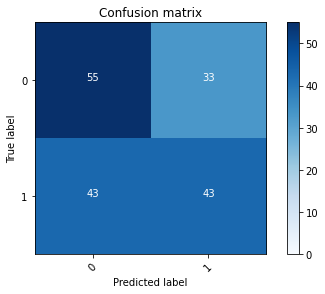

2022-08-20 15:15:20 - [Epoch Train: 51] loss: 0.0611, auc: 0.9986, acc: 0.9794, time: 50.00 s            
2022-08-20 15:15:20 - [Epoch Valid: 51] loss: 1.8573, auc: 0.5351, acc: 0.5657, time: 13.00 s
2022-08-20 15:15:20 - acc improved from 0.5498 to 0.5657. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_14-21-30/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e51-loss1.857-acc0.566-auc0.535.pth'


 51%|█████████████████████▍                    | 51/100 [53:50<52:05, 63.78s/it]

2022-08-20 15:15:20 - EPOCH: 52
2022-08-20 15:15:21 - Train Step 10/969, train_loss: 0.1784
2022-08-20 15:15:22 - Train Step 20/969, train_loss: 0.1258
2022-08-20 15:15:22 - Train Step 30/969, train_loss: 0.0857
2022-08-20 15:15:23 - Train Step 40/969, train_loss: 0.0754
2022-08-20 15:15:23 - Train Step 50/969, train_loss: 0.0661
2022-08-20 15:15:24 - Train Step 60/969, train_loss: 0.0578
2022-08-20 15:15:24 - Train Step 70/969, train_loss: 0.0562
2022-08-20 15:15:25 - Train Step 80/969, train_loss: 0.0551
2022-08-20 15:15:25 - Train Step 90/969, train_loss: 0.0588
2022-08-20 15:15:26 - Train Step 100/969, train_loss: 0.0729
2022-08-20 15:15:26 - Train Step 110/969, train_loss: 0.0696
2022-08-20 15:15:27 - Train Step 120/969, train_loss: 0.0667
2022-08-20 15:15:27 - Train Step 130/969, train_loss: 0.0643
2022-08-20 15:15:28 - Train Step 140/969, train_loss: 0.0622
2022-08-20 15:15:28 - Train Step 150/969, train_loss: 0.0638
2022-08-20 15:15:29 - Train Step 160/969, train_loss: 0.0624
2

2022-08-20 15:16:21 - Valid Step 190/251, valid_loss: 2.1587
2022-08-20 15:16:21 - Valid Step 195/251, valid_loss: 2.2413
2022-08-20 15:16:21 - Valid Step 200/251, valid_loss: 2.2479
2022-08-20 15:16:22 - Valid Step 205/251, valid_loss: 2.2311
2022-08-20 15:16:22 - Valid Step 210/251, valid_loss: 2.2151
2022-08-20 15:16:22 - Valid Step 215/251, valid_loss: 2.2221
2022-08-20 15:16:22 - Valid Step 220/251, valid_loss: 2.2425
2022-08-20 15:16:23 - Valid Step 225/251, valid_loss: 2.2726
2022-08-20 15:16:23 - Valid Step 230/251, valid_loss: 2.2234
2022-08-20 15:16:23 - Valid Step 235/251, valid_loss: 2.2148
2022-08-20 15:16:23 - Valid Step 240/251, valid_loss: 2.2458
2022-08-20 15:16:24 - Valid Step 245/251, valid_loss: 2.2226
2022-08-20 15:16:24 - Valid Step 250/251, valid_loss: 2.2739
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
14      00012                1           0
67      00021                0         

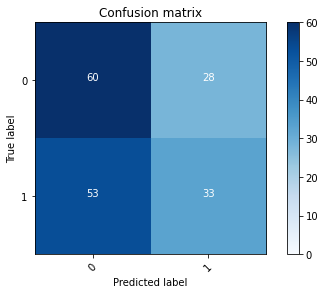

2022-08-20 15:16:24 - [Epoch Train: 52] loss: 0.0607, auc: 0.9985, acc: 0.9856, time: 50.00 s            
2022-08-20 15:16:24 - [Epoch Valid: 52] loss: 2.2649, auc: 0.5321, acc: 0.5299, time: 13.00 s


 52%|█████████████████████▊                    | 52/100 [54:54<51:05, 63.86s/it]

2022-08-20 15:16:24 - EPOCH: 53
2022-08-20 15:16:25 - Train Step 10/969, train_loss: 0.1409
2022-08-20 15:16:26 - Train Step 20/969, train_loss: 0.1082
2022-08-20 15:16:26 - Train Step 30/969, train_loss: 0.0825
2022-08-20 15:16:27 - Train Step 40/969, train_loss: 0.0676
2022-08-20 15:16:27 - Train Step 50/969, train_loss: 0.0577
2022-08-20 15:16:28 - Train Step 60/969, train_loss: 0.0730
2022-08-20 15:16:28 - Train Step 70/969, train_loss: 0.0722
2022-08-20 15:16:29 - Train Step 80/969, train_loss: 0.0666
2022-08-20 15:16:29 - Train Step 90/969, train_loss: 0.0610
2022-08-20 15:16:30 - Train Step 100/969, train_loss: 0.0550
2022-08-20 15:16:30 - Train Step 110/969, train_loss: 0.0511
2022-08-20 15:16:31 - Train Step 120/969, train_loss: 0.0563
2022-08-20 15:16:31 - Train Step 130/969, train_loss: 0.0524
2022-08-20 15:16:32 - Train Step 140/969, train_loss: 0.0519
2022-08-20 15:16:32 - Train Step 150/969, train_loss: 0.0499
2022-08-20 15:16:33 - Train Step 160/969, train_loss: 0.0604
2

2022-08-20 15:17:25 - Valid Step 190/251, valid_loss: 2.4296
2022-08-20 15:17:26 - Valid Step 195/251, valid_loss: 2.3895
2022-08-20 15:17:26 - Valid Step 200/251, valid_loss: 2.3893
2022-08-20 15:17:26 - Valid Step 205/251, valid_loss: 2.3670
2022-08-20 15:17:26 - Valid Step 210/251, valid_loss: 2.3426
2022-08-20 15:17:27 - Valid Step 215/251, valid_loss: 2.3454
2022-08-20 15:17:27 - Valid Step 220/251, valid_loss: 2.3563
2022-08-20 15:17:27 - Valid Step 225/251, valid_loss: 2.4173
2022-08-20 15:17:28 - Valid Step 230/251, valid_loss: 2.4045
2022-08-20 15:17:28 - Valid Step 235/251, valid_loss: 2.3910
2022-08-20 15:17:28 - Valid Step 240/251, valid_loss: 2.3651
2022-08-20 15:17:28 - Valid Step 245/251, valid_loss: 2.3698
2022-08-20 15:17:29 - Valid Step 250/251, valid_loss: 2.3943
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
150     00012                1           0
7       00021                0         

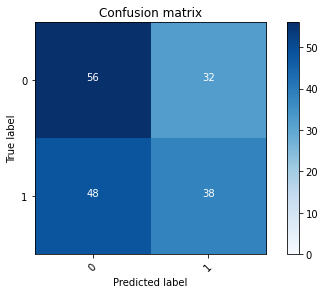

2022-08-20 15:17:29 - [Epoch Train: 53] loss: 0.0619, auc: 0.9986, acc: 0.9825, time: 50.00 s            
2022-08-20 15:17:29 - [Epoch Valid: 53] loss: 2.3982, auc: 0.5311, acc: 0.5299, time: 13.00 s


 53%|██████████████████████▎                   | 53/100 [55:58<50:09, 64.04s/it]

2022-08-20 15:17:29 - EPOCH: 54
2022-08-20 15:17:30 - Train Step 10/969, train_loss: 0.0208
2022-08-20 15:17:30 - Train Step 20/969, train_loss: 0.0718
2022-08-20 15:17:31 - Train Step 30/969, train_loss: 0.0693
2022-08-20 15:17:31 - Train Step 40/969, train_loss: 0.0833
2022-08-20 15:17:32 - Train Step 50/969, train_loss: 0.0994
2022-08-20 15:17:32 - Train Step 60/969, train_loss: 0.0848
2022-08-20 15:17:33 - Train Step 70/969, train_loss: 0.0767
2022-08-20 15:17:33 - Train Step 80/969, train_loss: 0.0687
2022-08-20 15:17:34 - Train Step 90/969, train_loss: 0.0660
2022-08-20 15:17:34 - Train Step 100/969, train_loss: 0.0661
2022-08-20 15:17:35 - Train Step 110/969, train_loss: 0.0632
2022-08-20 15:17:35 - Train Step 120/969, train_loss: 0.0596
2022-08-20 15:17:36 - Train Step 130/969, train_loss: 0.0619
2022-08-20 15:17:36 - Train Step 140/969, train_loss: 0.0618
2022-08-20 15:17:37 - Train Step 150/969, train_loss: 0.0607
2022-08-20 15:17:37 - Train Step 160/969, train_loss: 0.0600
2

2022-08-20 15:18:30 - Valid Step 190/251, valid_loss: 1.8092
2022-08-20 15:18:30 - Valid Step 195/251, valid_loss: 1.8354
2022-08-20 15:18:30 - Valid Step 200/251, valid_loss: 1.9200
2022-08-20 15:18:31 - Valid Step 205/251, valid_loss: 1.9559
2022-08-20 15:18:31 - Valid Step 210/251, valid_loss: 1.9549
2022-08-20 15:18:31 - Valid Step 215/251, valid_loss: 2.0448
2022-08-20 15:18:31 - Valid Step 220/251, valid_loss: 2.0404
2022-08-20 15:18:32 - Valid Step 225/251, valid_loss: 2.0519
2022-08-20 15:18:32 - Valid Step 230/251, valid_loss: 2.0753
2022-08-20 15:18:32 - Valid Step 235/251, valid_loss: 2.0543
2022-08-20 15:18:32 - Valid Step 240/251, valid_loss: 2.0927
2022-08-20 15:18:33 - Valid Step 245/251, valid_loss: 2.0546
2022-08-20 15:18:33 - Valid Step 250/251, valid_loss: 2.0808
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
151     00012                1           0
116     00021                0         

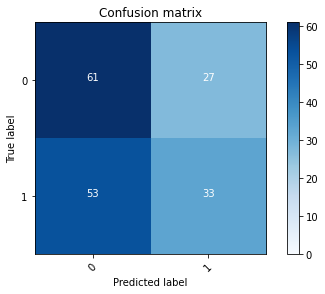

2022-08-20 15:18:33 - [Epoch Train: 54] loss: 0.0543, auc: 0.9986, acc: 0.9886, time: 50.00 s            
2022-08-20 15:18:33 - [Epoch Valid: 54] loss: 2.0739, auc: 0.5357, acc: 0.5299, time: 13.00 s


 54%|██████████████████████▋                   | 54/100 [57:02<49:07, 64.08s/it]

2022-08-20 15:18:33 - EPOCH: 55
2022-08-20 15:18:34 - Train Step 10/969, train_loss: 0.0414
2022-08-20 15:18:34 - Train Step 20/969, train_loss: 0.0315
2022-08-20 15:18:35 - Train Step 30/969, train_loss: 0.0605
2022-08-20 15:18:35 - Train Step 40/969, train_loss: 0.0549
2022-08-20 15:18:36 - Train Step 50/969, train_loss: 0.0497
2022-08-20 15:18:36 - Train Step 60/969, train_loss: 0.0464
2022-08-20 15:18:37 - Train Step 70/969, train_loss: 0.0554
2022-08-20 15:18:37 - Train Step 80/969, train_loss: 0.0567
2022-08-20 15:18:38 - Train Step 90/969, train_loss: 0.0575
2022-08-20 15:18:38 - Train Step 100/969, train_loss: 0.0550
2022-08-20 15:18:39 - Train Step 110/969, train_loss: 0.0522
2022-08-20 15:18:39 - Train Step 120/969, train_loss: 0.0520
2022-08-20 15:18:40 - Train Step 130/969, train_loss: 0.0495
2022-08-20 15:18:40 - Train Step 140/969, train_loss: 0.0515
2022-08-20 15:18:41 - Train Step 150/969, train_loss: 0.0484
2022-08-20 15:18:42 - Train Step 160/969, train_loss: 0.0517
2

2022-08-20 15:19:34 - Valid Step 190/251, valid_loss: 2.0671
2022-08-20 15:19:34 - Valid Step 195/251, valid_loss: 2.1044
2022-08-20 15:19:34 - Valid Step 200/251, valid_loss: 2.0878
2022-08-20 15:19:34 - Valid Step 205/251, valid_loss: 2.1683
2022-08-20 15:19:35 - Valid Step 210/251, valid_loss: 2.2834
2022-08-20 15:19:35 - Valid Step 215/251, valid_loss: 2.2581
2022-08-20 15:19:35 - Valid Step 220/251, valid_loss: 2.2198
2022-08-20 15:19:35 - Valid Step 225/251, valid_loss: 2.2108
2022-08-20 15:19:36 - Valid Step 230/251, valid_loss: 2.1671
2022-08-20 15:19:36 - Valid Step 235/251, valid_loss: 2.1920
2022-08-20 15:19:36 - Valid Step 240/251, valid_loss: 2.2039
2022-08-20 15:19:36 - Valid Step 245/251, valid_loss: 2.2001
2022-08-20 15:19:37 - Valid Step 250/251, valid_loss: 2.2672
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
52      00012                1           0
90      00021                0         

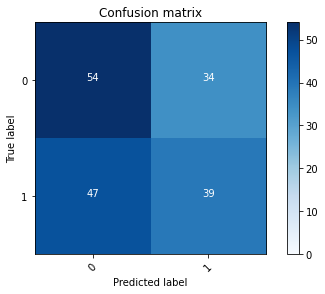

2022-08-20 15:19:37 - [Epoch Train: 55] loss: 0.0463, auc: 0.9993, acc: 0.9856, time: 50.00 s            
2022-08-20 15:19:37 - [Epoch Valid: 55] loss: 2.2601, auc: 0.5292, acc: 0.5378, time: 13.00 s


 55%|███████████████████████                   | 55/100 [58:06<48:01, 64.03s/it]

2022-08-20 15:19:37 - EPOCH: 56
2022-08-20 15:19:38 - Train Step 10/969, train_loss: 0.0175
2022-08-20 15:19:38 - Train Step 20/969, train_loss: 0.0094
2022-08-20 15:19:39 - Train Step 30/969, train_loss: 0.0170
2022-08-20 15:19:39 - Train Step 40/969, train_loss: 0.0247
2022-08-20 15:19:40 - Train Step 50/969, train_loss: 0.0207
2022-08-20 15:19:40 - Train Step 60/969, train_loss: 0.0181
2022-08-20 15:19:41 - Train Step 70/969, train_loss: 0.0160
2022-08-20 15:19:41 - Train Step 80/969, train_loss: 0.0148
2022-08-20 15:19:42 - Train Step 90/969, train_loss: 0.0262
2022-08-20 15:19:42 - Train Step 100/969, train_loss: 0.0543
2022-08-20 15:19:43 - Train Step 110/969, train_loss: 0.0537
2022-08-20 15:19:43 - Train Step 120/969, train_loss: 0.0646
2022-08-20 15:19:44 - Train Step 130/969, train_loss: 0.0658
2022-08-20 15:19:44 - Train Step 140/969, train_loss: 0.0637
2022-08-20 15:19:45 - Train Step 150/969, train_loss: 0.0714
2022-08-20 15:19:45 - Train Step 160/969, train_loss: 0.0696
2

2022-08-20 15:20:37 - Valid Step 190/251, valid_loss: 2.4546
2022-08-20 15:20:37 - Valid Step 195/251, valid_loss: 2.5099
2022-08-20 15:20:38 - Valid Step 200/251, valid_loss: 2.4595
2022-08-20 15:20:38 - Valid Step 205/251, valid_loss: 2.4924
2022-08-20 15:20:38 - Valid Step 210/251, valid_loss: 2.5191
2022-08-20 15:20:38 - Valid Step 215/251, valid_loss: 2.5491
2022-08-20 15:20:39 - Valid Step 220/251, valid_loss: 2.5715
2022-08-20 15:20:39 - Valid Step 225/251, valid_loss: 2.5539
2022-08-20 15:20:39 - Valid Step 230/251, valid_loss: 2.5494
2022-08-20 15:20:39 - Valid Step 235/251, valid_loss: 2.5707
2022-08-20 15:20:40 - Valid Step 240/251, valid_loss: 2.5517
2022-08-20 15:20:40 - Valid Step 245/251, valid_loss: 2.5877
2022-08-20 15:20:40 - Valid Step 250/251, valid_loss: 2.6180
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
60      00012                1           0
133     00021                0         

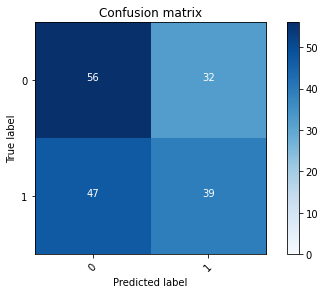

2022-08-20 15:20:40 - [Epoch Train: 56] loss: 0.0546, auc: 0.9989, acc: 0.9835, time: 50.00 s            
2022-08-20 15:20:40 - [Epoch Valid: 56] loss: 2.6117, auc: 0.5328, acc: 0.5458, time: 13.00 s


 56%|███████████████████████▌                  | 56/100 [59:10<46:48, 63.83s/it]

2022-08-20 15:20:40 - EPOCH: 57
2022-08-20 15:20:41 - Train Step 10/969, train_loss: 0.0825
2022-08-20 15:20:42 - Train Step 20/969, train_loss: 0.0827
2022-08-20 15:20:42 - Train Step 30/969, train_loss: 0.0583
2022-08-20 15:20:43 - Train Step 40/969, train_loss: 0.0623
2022-08-20 15:20:43 - Train Step 50/969, train_loss: 0.0568
2022-08-20 15:20:44 - Train Step 60/969, train_loss: 0.0639
2022-08-20 15:20:44 - Train Step 70/969, train_loss: 0.0561
2022-08-20 15:20:45 - Train Step 80/969, train_loss: 0.0523
2022-08-20 15:20:45 - Train Step 90/969, train_loss: 0.0552
2022-08-20 15:20:46 - Train Step 100/969, train_loss: 0.0502
2022-08-20 15:20:46 - Train Step 110/969, train_loss: 0.0520
2022-08-20 15:20:47 - Train Step 120/969, train_loss: 0.0492
2022-08-20 15:20:47 - Train Step 130/969, train_loss: 0.0465
2022-08-20 15:20:48 - Train Step 140/969, train_loss: 0.0600
2022-08-20 15:20:48 - Train Step 150/969, train_loss: 0.0574
2022-08-20 15:20:49 - Train Step 160/969, train_loss: 0.0551
2

2022-08-20 15:21:41 - Valid Step 190/251, valid_loss: 2.3612
2022-08-20 15:21:41 - Valid Step 195/251, valid_loss: 2.3437
2022-08-20 15:21:41 - Valid Step 200/251, valid_loss: 2.3780
2022-08-20 15:21:42 - Valid Step 205/251, valid_loss: 2.3877
2022-08-20 15:21:42 - Valid Step 210/251, valid_loss: 2.3957
2022-08-20 15:21:42 - Valid Step 215/251, valid_loss: 2.3562
2022-08-20 15:21:42 - Valid Step 220/251, valid_loss: 2.3752
2022-08-20 15:21:43 - Valid Step 225/251, valid_loss: 2.3651
2022-08-20 15:21:43 - Valid Step 230/251, valid_loss: 2.3907
2022-08-20 15:21:43 - Valid Step 235/251, valid_loss: 2.3944
2022-08-20 15:21:43 - Valid Step 240/251, valid_loss: 2.4364
2022-08-20 15:21:44 - Valid Step 245/251, valid_loss: 2.4404
2022-08-20 15:21:44 - Valid Step 250/251, valid_loss: 2.4453
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
159     00012                1           0
166     00021                0         

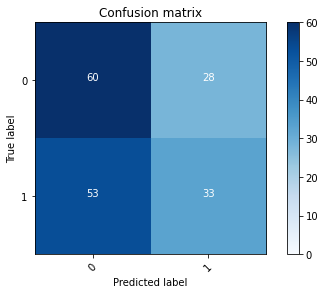

2022-08-20 15:21:44 - [Epoch Train: 57] loss: 0.0503, auc: 0.9994, acc: 0.9835, time: 50.00 s            
2022-08-20 15:21:44 - [Epoch Valid: 57] loss: 2.4541, auc: 0.5198, acc: 0.5339, time: 13.00 s


 57%|██████████████████████▊                 | 57/100 [1:00:14<45:45, 63.86s/it]

2022-08-20 15:21:44 - EPOCH: 58
2022-08-20 15:21:45 - Train Step 10/969, train_loss: 0.1285
2022-08-20 15:21:45 - Train Step 20/969, train_loss: 0.1375
2022-08-20 15:21:46 - Train Step 30/969, train_loss: 0.1188
2022-08-20 15:21:46 - Train Step 40/969, train_loss: 0.0932
2022-08-20 15:21:47 - Train Step 50/969, train_loss: 0.0814
2022-08-20 15:21:48 - Train Step 60/969, train_loss: 0.0688
2022-08-20 15:21:48 - Train Step 70/969, train_loss: 0.0663
2022-08-20 15:21:49 - Train Step 80/969, train_loss: 0.0618
2022-08-20 15:21:49 - Train Step 90/969, train_loss: 0.0566
2022-08-20 15:21:50 - Train Step 100/969, train_loss: 0.0545
2022-08-20 15:21:50 - Train Step 110/969, train_loss: 0.0515
2022-08-20 15:21:51 - Train Step 120/969, train_loss: 0.0501
2022-08-20 15:21:51 - Train Step 130/969, train_loss: 0.0475
2022-08-20 15:21:52 - Train Step 140/969, train_loss: 0.0474
2022-08-20 15:21:52 - Train Step 150/969, train_loss: 0.0450
2022-08-20 15:21:53 - Train Step 160/969, train_loss: 0.0458
2

2022-08-20 15:22:45 - Valid Step 190/251, valid_loss: 2.5930
2022-08-20 15:22:45 - Valid Step 195/251, valid_loss: 2.5385
2022-08-20 15:22:45 - Valid Step 200/251, valid_loss: 2.5643
2022-08-20 15:22:45 - Valid Step 205/251, valid_loss: 2.5422
2022-08-20 15:22:46 - Valid Step 210/251, valid_loss: 2.5562
2022-08-20 15:22:46 - Valid Step 215/251, valid_loss: 2.5553
2022-08-20 15:22:46 - Valid Step 220/251, valid_loss: 2.5574
2022-08-20 15:22:46 - Valid Step 225/251, valid_loss: 2.5782
2022-08-20 15:22:47 - Valid Step 230/251, valid_loss: 2.5919
2022-08-20 15:22:47 - Valid Step 235/251, valid_loss: 2.5723
2022-08-20 15:22:47 - Valid Step 240/251, valid_loss: 2.5376
2022-08-20 15:22:47 - Valid Step 245/251, valid_loss: 2.5023
2022-08-20 15:22:48 - Valid Step 250/251, valid_loss: 2.4876
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
49      00012                1           0
135     00021                0         

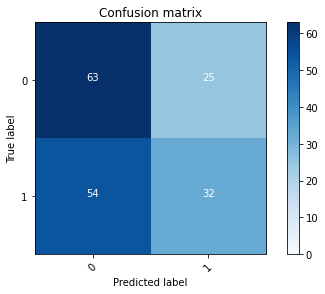

2022-08-20 15:22:48 - [Epoch Train: 58] loss: 0.0525, auc: 0.9991, acc: 0.9804, time: 50.00 s            
2022-08-20 15:22:48 - [Epoch Valid: 58] loss: 2.4777, auc: 0.5311, acc: 0.5418, time: 13.00 s


 58%|███████████████████████▏                | 58/100 [1:01:17<44:38, 63.78s/it]

2022-08-20 15:22:48 - EPOCH: 59
2022-08-20 15:22:49 - Train Step 10/969, train_loss: 0.0094
2022-08-20 15:22:49 - Train Step 20/969, train_loss: 0.0067
2022-08-20 15:22:50 - Train Step 30/969, train_loss: 0.0297
2022-08-20 15:22:50 - Train Step 40/969, train_loss: 0.0300
2022-08-20 15:22:51 - Train Step 50/969, train_loss: 0.0266
2022-08-20 15:22:51 - Train Step 60/969, train_loss: 0.0405
2022-08-20 15:22:52 - Train Step 70/969, train_loss: 0.0504
2022-08-20 15:22:52 - Train Step 80/969, train_loss: 0.0484
2022-08-20 15:22:53 - Train Step 90/969, train_loss: 0.0436
2022-08-20 15:22:53 - Train Step 100/969, train_loss: 0.0400
2022-08-20 15:22:54 - Train Step 110/969, train_loss: 0.0433
2022-08-20 15:22:54 - Train Step 120/969, train_loss: 0.0499
2022-08-20 15:22:55 - Train Step 130/969, train_loss: 0.0498
2022-08-20 15:22:55 - Train Step 140/969, train_loss: 0.0465
2022-08-20 15:22:56 - Train Step 150/969, train_loss: 0.0450
2022-08-20 15:22:56 - Train Step 160/969, train_loss: 0.0424
2

2022-08-20 15:23:48 - Valid Step 190/251, valid_loss: 2.5579
2022-08-20 15:23:48 - Valid Step 195/251, valid_loss: 2.6478
2022-08-20 15:23:49 - Valid Step 200/251, valid_loss: 2.6326
2022-08-20 15:23:49 - Valid Step 205/251, valid_loss: 2.5914
2022-08-20 15:23:49 - Valid Step 210/251, valid_loss: 2.5302
2022-08-20 15:23:49 - Valid Step 215/251, valid_loss: 2.4769
2022-08-20 15:23:50 - Valid Step 220/251, valid_loss: 2.4432
2022-08-20 15:23:50 - Valid Step 225/251, valid_loss: 2.3924
2022-08-20 15:23:50 - Valid Step 230/251, valid_loss: 2.4840
2022-08-20 15:23:50 - Valid Step 235/251, valid_loss: 2.4816
2022-08-20 15:23:51 - Valid Step 240/251, valid_loss: 2.4749
2022-08-20 15:23:51 - Valid Step 245/251, valid_loss: 2.4829
2022-08-20 15:23:51 - Valid Step 250/251, valid_loss: 2.4773
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
117     00012                1           0
42      00021                0         

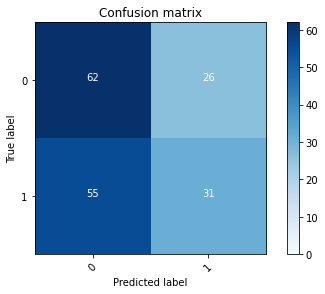

2022-08-20 15:23:51 - [Epoch Train: 59] loss: 0.0455, auc: 0.9993, acc: 0.9917, time: 50.00 s            
2022-08-20 15:23:51 - [Epoch Valid: 59] loss: 2.4716, auc: 0.5312, acc: 0.5299, time: 13.00 s


 59%|███████████████████████▌                | 59/100 [1:02:21<43:32, 63.73s/it]

2022-08-20 15:23:51 - EPOCH: 60
2022-08-20 15:23:52 - Train Step 10/969, train_loss: 0.0021
2022-08-20 15:23:53 - Train Step 20/969, train_loss: 0.0074
2022-08-20 15:23:53 - Train Step 30/969, train_loss: 0.0306
2022-08-20 15:23:54 - Train Step 40/969, train_loss: 0.0249
2022-08-20 15:23:54 - Train Step 50/969, train_loss: 0.0233
2022-08-20 15:23:55 - Train Step 60/969, train_loss: 0.0331
2022-08-20 15:23:55 - Train Step 70/969, train_loss: 0.0328
2022-08-20 15:23:56 - Train Step 80/969, train_loss: 0.0288
2022-08-20 15:23:56 - Train Step 90/969, train_loss: 0.0275
2022-08-20 15:23:57 - Train Step 100/969, train_loss: 0.0276
2022-08-20 15:23:57 - Train Step 110/969, train_loss: 0.0281
2022-08-20 15:23:58 - Train Step 120/969, train_loss: 0.0280
2022-08-20 15:23:58 - Train Step 130/969, train_loss: 0.0265
2022-08-20 15:23:59 - Train Step 140/969, train_loss: 0.0258
2022-08-20 15:23:59 - Train Step 150/969, train_loss: 0.0265
2022-08-20 15:24:00 - Train Step 160/969, train_loss: 0.0254
2

2022-08-20 15:24:51 - Valid Step 190/251, valid_loss: 2.3526
2022-08-20 15:24:52 - Valid Step 195/251, valid_loss: 2.3683
2022-08-20 15:24:52 - Valid Step 200/251, valid_loss: 2.4141
2022-08-20 15:24:52 - Valid Step 205/251, valid_loss: 2.4835
2022-08-20 15:24:52 - Valid Step 210/251, valid_loss: 2.4679
2022-08-20 15:24:53 - Valid Step 215/251, valid_loss: 2.4713
2022-08-20 15:24:53 - Valid Step 220/251, valid_loss: 2.4241
2022-08-20 15:24:53 - Valid Step 225/251, valid_loss: 2.3953
2022-08-20 15:24:53 - Valid Step 230/251, valid_loss: 2.3883
2022-08-20 15:24:54 - Valid Step 235/251, valid_loss: 2.3417
2022-08-20 15:24:54 - Valid Step 240/251, valid_loss: 2.3319
2022-08-20 15:24:54 - Valid Step 245/251, valid_loss: 2.3143
2022-08-20 15:24:54 - Valid Step 250/251, valid_loss: 2.3874
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
84      00012                1           0
38      00021                0         

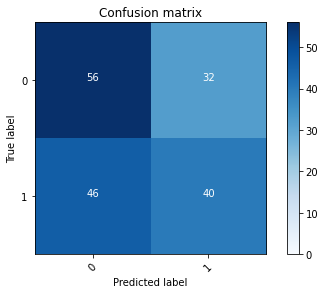

2022-08-20 15:24:55 - [Epoch Train: 60] loss: 0.0500, auc: 0.9986, acc: 0.9804, time: 50.00 s            
2022-08-20 15:24:55 - [Epoch Valid: 60] loss: 2.4257, auc: 0.5272, acc: 0.5618, time: 12.00 s


 60%|████████████████████████                | 60/100 [1:03:24<42:22, 63.57s/it]

2022-08-20 15:24:55 - EPOCH: 61
2022-08-20 15:24:55 - Train Step 10/969, train_loss: 0.0163
2022-08-20 15:24:56 - Train Step 20/969, train_loss: 0.0088
2022-08-20 15:24:56 - Train Step 30/969, train_loss: 0.0265
2022-08-20 15:24:57 - Train Step 40/969, train_loss: 0.0506
2022-08-20 15:24:57 - Train Step 50/969, train_loss: 0.0482
2022-08-20 15:24:58 - Train Step 60/969, train_loss: 0.0475
2022-08-20 15:24:58 - Train Step 70/969, train_loss: 0.0472
2022-08-20 15:24:59 - Train Step 80/969, train_loss: 0.0419
2022-08-20 15:24:59 - Train Step 90/969, train_loss: 0.0399
2022-08-20 15:25:00 - Train Step 100/969, train_loss: 0.0390
2022-08-20 15:25:01 - Train Step 110/969, train_loss: 0.0483
2022-08-20 15:25:01 - Train Step 120/969, train_loss: 0.0444
2022-08-20 15:25:02 - Train Step 130/969, train_loss: 0.0424
2022-08-20 15:25:02 - Train Step 140/969, train_loss: 0.0469
2022-08-20 15:25:03 - Train Step 150/969, train_loss: 0.0438
2022-08-20 15:25:03 - Train Step 160/969, train_loss: 0.0444
2

2022-08-20 15:25:55 - Valid Step 190/251, valid_loss: 2.7590
2022-08-20 15:25:55 - Valid Step 195/251, valid_loss: 2.7475
2022-08-20 15:25:56 - Valid Step 200/251, valid_loss: 2.7386
2022-08-20 15:25:56 - Valid Step 205/251, valid_loss: 2.6997
2022-08-20 15:25:56 - Valid Step 210/251, valid_loss: 2.7887
2022-08-20 15:25:56 - Valid Step 215/251, valid_loss: 2.7340
2022-08-20 15:25:57 - Valid Step 220/251, valid_loss: 2.8097
2022-08-20 15:25:57 - Valid Step 225/251, valid_loss: 2.8038
2022-08-20 15:25:57 - Valid Step 230/251, valid_loss: 2.7877
2022-08-20 15:25:58 - Valid Step 235/251, valid_loss: 2.7343
2022-08-20 15:25:58 - Valid Step 240/251, valid_loss: 2.7141
2022-08-20 15:25:58 - Valid Step 245/251, valid_loss: 2.6897
2022-08-20 15:25:58 - Valid Step 250/251, valid_loss: 2.6423
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
99      00012                1           0
129     00021                0         

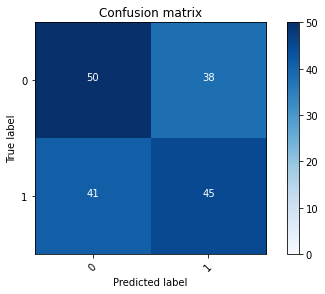

2022-08-20 15:25:59 - [Epoch Train: 61] loss: 0.0407, auc: 0.9994, acc: 0.9907, time: 50.00 s            
2022-08-20 15:25:59 - [Epoch Valid: 61] loss: 2.6329, auc: 0.5203, acc: 0.5538, time: 13.00 s


 61%|████████████████████████▍               | 61/100 [1:04:28<41:22, 63.66s/it]

2022-08-20 15:25:59 - EPOCH: 62
2022-08-20 15:25:59 - Train Step 10/969, train_loss: 0.0190
2022-08-20 15:26:00 - Train Step 20/969, train_loss: 0.0459
2022-08-20 15:26:00 - Train Step 30/969, train_loss: 0.0422
2022-08-20 15:26:01 - Train Step 40/969, train_loss: 0.0517
2022-08-20 15:26:01 - Train Step 50/969, train_loss: 0.0419
2022-08-20 15:26:02 - Train Step 60/969, train_loss: 0.0490
2022-08-20 15:26:02 - Train Step 70/969, train_loss: 0.0451
2022-08-20 15:26:03 - Train Step 80/969, train_loss: 0.0405
2022-08-20 15:26:03 - Train Step 90/969, train_loss: 0.0391
2022-08-20 15:26:04 - Train Step 100/969, train_loss: 0.0369
2022-08-20 15:26:04 - Train Step 110/969, train_loss: 0.0337
2022-08-20 15:26:05 - Train Step 120/969, train_loss: 0.0319
2022-08-20 15:26:05 - Train Step 130/969, train_loss: 0.0329
2022-08-20 15:26:06 - Train Step 140/969, train_loss: 0.0312
2022-08-20 15:26:06 - Train Step 150/969, train_loss: 0.0293
2022-08-20 15:26:07 - Train Step 160/969, train_loss: 0.0317
2

2022-08-20 15:26:59 - Valid Step 190/251, valid_loss: 2.2224
2022-08-20 15:26:59 - Valid Step 195/251, valid_loss: 2.1774
2022-08-20 15:27:00 - Valid Step 200/251, valid_loss: 2.2183
2022-08-20 15:27:00 - Valid Step 205/251, valid_loss: 2.3144
2022-08-20 15:27:00 - Valid Step 210/251, valid_loss: 2.2787
2022-08-20 15:27:01 - Valid Step 215/251, valid_loss: 2.2441
2022-08-20 15:27:01 - Valid Step 220/251, valid_loss: 2.2730
2022-08-20 15:27:01 - Valid Step 225/251, valid_loss: 2.3229
2022-08-20 15:27:01 - Valid Step 230/251, valid_loss: 2.4095
2022-08-20 15:27:02 - Valid Step 235/251, valid_loss: 2.4296
2022-08-20 15:27:02 - Valid Step 240/251, valid_loss: 2.4695
2022-08-20 15:27:02 - Valid Step 245/251, valid_loss: 2.5393
2022-08-20 15:27:02 - Valid Step 250/251, valid_loss: 2.5748
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
116     00012                1           0
101     00021                0         

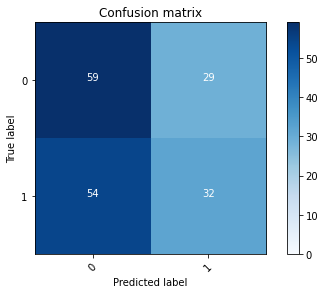

2022-08-20 15:27:03 - [Epoch Train: 62] loss: 0.0412, auc: 0.9993, acc: 0.9897, time: 50.00 s            
2022-08-20 15:27:03 - [Epoch Valid: 62] loss: 2.5943, auc: 0.5289, acc: 0.5179, time: 13.00 s


 62%|████████████████████████▊               | 62/100 [1:05:32<40:23, 63.78s/it]

2022-08-20 15:27:03 - EPOCH: 63
2022-08-20 15:27:03 - Train Step 10/969, train_loss: 0.0008
2022-08-20 15:27:04 - Train Step 20/969, train_loss: 0.0053
2022-08-20 15:27:04 - Train Step 30/969, train_loss: 0.0124
2022-08-20 15:27:05 - Train Step 40/969, train_loss: 0.0286
2022-08-20 15:27:05 - Train Step 50/969, train_loss: 0.0265
2022-08-20 15:27:06 - Train Step 60/969, train_loss: 0.0245
2022-08-20 15:27:06 - Train Step 70/969, train_loss: 0.0222
2022-08-20 15:27:07 - Train Step 80/969, train_loss: 0.0251
2022-08-20 15:27:07 - Train Step 90/969, train_loss: 0.0298
2022-08-20 15:27:08 - Train Step 100/969, train_loss: 0.0284
2022-08-20 15:27:08 - Train Step 110/969, train_loss: 0.0265
2022-08-20 15:27:09 - Train Step 120/969, train_loss: 0.0248
2022-08-20 15:27:10 - Train Step 130/969, train_loss: 0.0254
2022-08-20 15:27:10 - Train Step 140/969, train_loss: 0.0286
2022-08-20 15:27:11 - Train Step 150/969, train_loss: 0.0269
2022-08-20 15:27:11 - Train Step 160/969, train_loss: 0.0268
2

2022-08-20 15:28:03 - Valid Step 190/251, valid_loss: 3.0621
2022-08-20 15:28:04 - Valid Step 195/251, valid_loss: 2.9948
2022-08-20 15:28:04 - Valid Step 200/251, valid_loss: 2.9713
2022-08-20 15:28:04 - Valid Step 205/251, valid_loss: 2.9642
2022-08-20 15:28:04 - Valid Step 210/251, valid_loss: 2.9475
2022-08-20 15:28:05 - Valid Step 215/251, valid_loss: 2.9674
2022-08-20 15:28:05 - Valid Step 220/251, valid_loss: 3.0191
2022-08-20 15:28:05 - Valid Step 225/251, valid_loss: 2.9786
2022-08-20 15:28:05 - Valid Step 230/251, valid_loss: 2.9922
2022-08-20 15:28:06 - Valid Step 235/251, valid_loss: 2.9815
2022-08-20 15:28:06 - Valid Step 240/251, valid_loss: 2.9210
2022-08-20 15:28:06 - Valid Step 245/251, valid_loss: 2.8729
2022-08-20 15:28:06 - Valid Step 250/251, valid_loss: 2.8678
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
100     00012                1           0
154     00021                0         

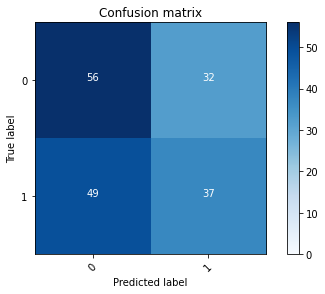

2022-08-20 15:28:07 - [Epoch Train: 63] loss: 0.0441, auc: 0.9990, acc: 0.9866, time: 50.00 s            
2022-08-20 15:28:07 - [Epoch Valid: 63] loss: 2.8564, auc: 0.5259, acc: 0.5339, time: 13.00 s


 63%|█████████████████████████▏              | 63/100 [1:06:36<39:22, 63.84s/it]

2022-08-20 15:28:07 - EPOCH: 64
2022-08-20 15:28:07 - Train Step 10/969, train_loss: 0.0366
2022-08-20 15:28:08 - Train Step 20/969, train_loss: 0.0261
2022-08-20 15:28:08 - Train Step 30/969, train_loss: 0.0203
2022-08-20 15:28:09 - Train Step 40/969, train_loss: 0.0392
2022-08-20 15:28:09 - Train Step 50/969, train_loss: 0.0564
2022-08-20 15:28:10 - Train Step 60/969, train_loss: 0.0527
2022-08-20 15:28:10 - Train Step 70/969, train_loss: 0.0540
2022-08-20 15:28:11 - Train Step 80/969, train_loss: 0.0562
2022-08-20 15:28:11 - Train Step 90/969, train_loss: 0.0540
2022-08-20 15:28:12 - Train Step 100/969, train_loss: 0.0583
2022-08-20 15:28:12 - Train Step 110/969, train_loss: 0.0554
2022-08-20 15:28:13 - Train Step 120/969, train_loss: 0.0582
2022-08-20 15:28:14 - Train Step 130/969, train_loss: 0.0540
2022-08-20 15:28:14 - Train Step 140/969, train_loss: 0.0504
2022-08-20 15:28:15 - Train Step 150/969, train_loss: 0.0472
2022-08-20 15:28:15 - Train Step 160/969, train_loss: 0.0450
2

2022-08-20 15:29:07 - Valid Step 190/251, valid_loss: 2.6413
2022-08-20 15:29:07 - Valid Step 195/251, valid_loss: 2.6649
2022-08-20 15:29:07 - Valid Step 200/251, valid_loss: 2.6707
2022-08-20 15:29:08 - Valid Step 205/251, valid_loss: 2.6591
2022-08-20 15:29:08 - Valid Step 210/251, valid_loss: 2.6427
2022-08-20 15:29:08 - Valid Step 215/251, valid_loss: 2.5846
2022-08-20 15:29:08 - Valid Step 220/251, valid_loss: 2.5583
2022-08-20 15:29:09 - Valid Step 225/251, valid_loss: 2.5329
2022-08-20 15:29:09 - Valid Step 230/251, valid_loss: 2.4878
2022-08-20 15:29:09 - Valid Step 235/251, valid_loss: 2.5011
2022-08-20 15:29:10 - Valid Step 240/251, valid_loss: 2.4832
2022-08-20 15:29:10 - Valid Step 245/251, valid_loss: 2.5823
2022-08-20 15:29:10 - Valid Step 250/251, valid_loss: 2.5794
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
136     00012                1           0
147     00021                0         

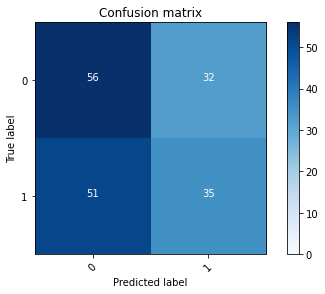

2022-08-20 15:29:10 - [Epoch Train: 64] loss: 0.0413, auc: 0.9994, acc: 0.9907, time: 50.00 s            
2022-08-20 15:29:10 - [Epoch Valid: 64] loss: 2.6048, auc: 0.5230, acc: 0.5139, time: 13.00 s


 64%|█████████████████████████▌              | 64/100 [1:07:40<38:16, 63.80s/it]

2022-08-20 15:29:10 - EPOCH: 65
2022-08-20 15:29:11 - Train Step 10/969, train_loss: 0.1811
2022-08-20 15:29:11 - Train Step 20/969, train_loss: 0.1131
2022-08-20 15:29:12 - Train Step 30/969, train_loss: 0.0792
2022-08-20 15:29:12 - Train Step 40/969, train_loss: 0.0795
2022-08-20 15:29:13 - Train Step 50/969, train_loss: 0.0673
2022-08-20 15:29:14 - Train Step 60/969, train_loss: 0.0569
2022-08-20 15:29:14 - Train Step 70/969, train_loss: 0.0496
2022-08-20 15:29:15 - Train Step 80/969, train_loss: 0.0442
2022-08-20 15:29:15 - Train Step 90/969, train_loss: 0.0401
2022-08-20 15:29:16 - Train Step 100/969, train_loss: 0.0376
2022-08-20 15:29:16 - Train Step 110/969, train_loss: 0.0347
2022-08-20 15:29:17 - Train Step 120/969, train_loss: 0.0336
2022-08-20 15:29:17 - Train Step 130/969, train_loss: 0.0323
2022-08-20 15:29:18 - Train Step 140/969, train_loss: 0.0355
2022-08-20 15:29:18 - Train Step 150/969, train_loss: 0.0429
2022-08-20 15:29:19 - Train Step 160/969, train_loss: 0.0415
2

2022-08-20 15:30:10 - Valid Step 190/251, valid_loss: 2.6976
2022-08-20 15:30:11 - Valid Step 195/251, valid_loss: 2.6419
2022-08-20 15:30:11 - Valid Step 200/251, valid_loss: 2.6709
2022-08-20 15:30:11 - Valid Step 205/251, valid_loss: 2.6104
2022-08-20 15:30:11 - Valid Step 210/251, valid_loss: 2.7181
2022-08-20 15:30:12 - Valid Step 215/251, valid_loss: 2.7107
2022-08-20 15:30:12 - Valid Step 220/251, valid_loss: 2.7201
2022-08-20 15:30:12 - Valid Step 225/251, valid_loss: 2.6867
2022-08-20 15:30:12 - Valid Step 230/251, valid_loss: 2.7363
2022-08-20 15:30:13 - Valid Step 235/251, valid_loss: 2.7181
2022-08-20 15:30:13 - Valid Step 240/251, valid_loss: 2.6789
2022-08-20 15:30:13 - Valid Step 245/251, valid_loss: 2.7305
2022-08-20 15:30:13 - Valid Step 250/251, valid_loss: 2.6894
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
146     00012                1           0
85      00021                0         

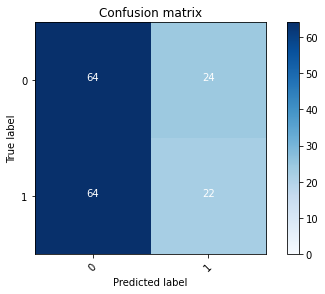

2022-08-20 15:30:14 - [Epoch Train: 65] loss: 0.0401, auc: 0.9986, acc: 0.9876, time: 50.00 s            
2022-08-20 15:30:14 - [Epoch Valid: 65] loss: 2.6787, auc: 0.5299, acc: 0.4980, time: 13.00 s


 65%|██████████████████████████              | 65/100 [1:08:43<37:08, 63.67s/it]

2022-08-20 15:30:14 - EPOCH: 66
2022-08-20 15:30:14 - Train Step 10/969, train_loss: 0.0112
2022-08-20 15:30:15 - Train Step 20/969, train_loss: 0.0069
2022-08-20 15:30:15 - Train Step 30/969, train_loss: 0.0131
2022-08-20 15:30:16 - Train Step 40/969, train_loss: 0.0139
2022-08-20 15:30:16 - Train Step 50/969, train_loss: 0.0132
2022-08-20 15:30:17 - Train Step 60/969, train_loss: 0.0121
2022-08-20 15:30:17 - Train Step 70/969, train_loss: 0.0292
2022-08-20 15:30:18 - Train Step 80/969, train_loss: 0.0275
2022-08-20 15:30:18 - Train Step 90/969, train_loss: 0.0263
2022-08-20 15:30:19 - Train Step 100/969, train_loss: 0.0266
2022-08-20 15:30:19 - Train Step 110/969, train_loss: 0.0267
2022-08-20 15:30:20 - Train Step 120/969, train_loss: 0.0263
2022-08-20 15:30:20 - Train Step 130/969, train_loss: 0.0251
2022-08-20 15:30:21 - Train Step 140/969, train_loss: 0.0310
2022-08-20 15:30:22 - Train Step 150/969, train_loss: 0.0351
2022-08-20 15:30:22 - Train Step 160/969, train_loss: 0.0331
2

2022-08-20 15:31:14 - Valid Step 190/251, valid_loss: 2.5034
2022-08-20 15:31:14 - Valid Step 195/251, valid_loss: 2.4667
2022-08-20 15:31:14 - Valid Step 200/251, valid_loss: 2.4626
2022-08-20 15:31:15 - Valid Step 205/251, valid_loss: 2.4503
2022-08-20 15:31:15 - Valid Step 210/251, valid_loss: 2.4345
2022-08-20 15:31:15 - Valid Step 215/251, valid_loss: 2.4362
2022-08-20 15:31:16 - Valid Step 220/251, valid_loss: 2.5334
2022-08-20 15:31:16 - Valid Step 225/251, valid_loss: 2.5036
2022-08-20 15:31:16 - Valid Step 230/251, valid_loss: 2.4850
2022-08-20 15:31:16 - Valid Step 235/251, valid_loss: 2.4755
2022-08-20 15:31:17 - Valid Step 240/251, valid_loss: 2.5508
2022-08-20 15:31:17 - Valid Step 245/251, valid_loss: 2.5577
2022-08-20 15:31:17 - Valid Step 250/251, valid_loss: 2.5749
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
111     00012                1           0
51      00021                0         

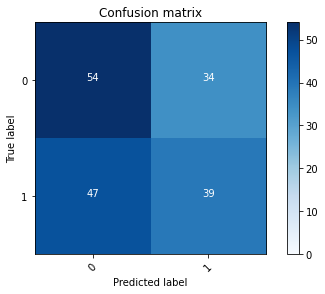

2022-08-20 15:31:18 - [Epoch Train: 66] loss: 0.0306, auc: 0.9998, acc: 0.9928, time: 49.00 s            
2022-08-20 15:31:18 - [Epoch Valid: 66] loss: 2.5646, auc: 0.5200, acc: 0.5259, time: 14.00 s


 66%|██████████████████████████▍             | 66/100 [1:09:47<36:07, 63.74s/it]

2022-08-20 15:31:18 - EPOCH: 67
2022-08-20 15:31:18 - Train Step 10/969, train_loss: 0.0753
2022-08-20 15:31:19 - Train Step 20/969, train_loss: 0.0395
2022-08-20 15:31:20 - Train Step 30/969, train_loss: 0.0457
2022-08-20 15:31:20 - Train Step 40/969, train_loss: 0.0371
2022-08-20 15:31:21 - Train Step 50/969, train_loss: 0.0530
2022-08-20 15:31:21 - Train Step 60/969, train_loss: 0.0447
2022-08-20 15:31:22 - Train Step 70/969, train_loss: 0.0394
2022-08-20 15:31:22 - Train Step 80/969, train_loss: 0.0361
2022-08-20 15:31:23 - Train Step 90/969, train_loss: 0.0323
2022-08-20 15:31:24 - Train Step 100/969, train_loss: 0.0361
2022-08-20 15:31:24 - Train Step 110/969, train_loss: 0.0340
2022-08-20 15:31:25 - Train Step 120/969, train_loss: 0.0331
2022-08-20 15:31:26 - Train Step 130/969, train_loss: 0.0320
2022-08-20 15:31:26 - Train Step 140/969, train_loss: 0.0323
2022-08-20 15:31:27 - Train Step 150/969, train_loss: 0.0307
2022-08-20 15:31:28 - Train Step 160/969, train_loss: 0.0303
2

2022-08-20 15:32:30 - Valid Step 190/251, valid_loss: 3.0000
2022-08-20 15:32:30 - Valid Step 195/251, valid_loss: 3.0167
2022-08-20 15:32:30 - Valid Step 200/251, valid_loss: 3.0047
2022-08-20 15:32:30 - Valid Step 205/251, valid_loss: 3.0608
2022-08-20 15:32:31 - Valid Step 210/251, valid_loss: 3.0126
2022-08-20 15:32:31 - Valid Step 215/251, valid_loss: 3.0046
2022-08-20 15:32:31 - Valid Step 220/251, valid_loss: 2.9952
2022-08-20 15:32:31 - Valid Step 225/251, valid_loss: 3.0264
2022-08-20 15:32:32 - Valid Step 230/251, valid_loss: 3.0056
2022-08-20 15:32:32 - Valid Step 235/251, valid_loss: 2.9788
2022-08-20 15:32:32 - Valid Step 240/251, valid_loss: 3.0048
2022-08-20 15:32:33 - Valid Step 245/251, valid_loss: 3.0521
2022-08-20 15:32:33 - Valid Step 250/251, valid_loss: 2.9962
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
44      00012                1           0
125     00021                0         

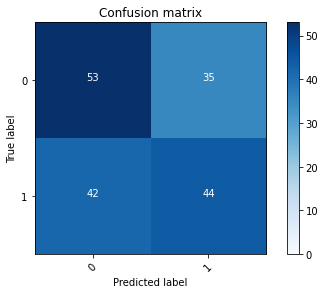

2022-08-20 15:32:33 - [Epoch Train: 67] loss: 0.0507, auc: 0.9967, acc: 0.9856, time: 60.00 s            
2022-08-20 15:32:33 - [Epoch Valid: 67] loss: 2.9843, auc: 0.5241, acc: 0.5737, time: 15.00 s
2022-08-20 15:32:33 - acc improved from 0.5657 to 0.5737. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_14-21-30/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e67-loss2.984-acc0.574-auc0.524.pth'


 67%|██████████████████████████▊             | 67/100 [1:11:03<37:00, 67.30s/it]

2022-08-20 15:32:33 - EPOCH: 68
2022-08-20 15:32:34 - Train Step 10/969, train_loss: 0.0218
2022-08-20 15:32:34 - Train Step 20/969, train_loss: 0.0299
2022-08-20 15:32:35 - Train Step 30/969, train_loss: 0.0291
2022-08-20 15:32:36 - Train Step 40/969, train_loss: 0.0356
2022-08-20 15:32:36 - Train Step 50/969, train_loss: 0.0297
2022-08-20 15:32:37 - Train Step 60/969, train_loss: 0.0370
2022-08-20 15:32:37 - Train Step 70/969, train_loss: 0.0338
2022-08-20 15:32:38 - Train Step 80/969, train_loss: 0.0393
2022-08-20 15:32:38 - Train Step 90/969, train_loss: 0.0438
2022-08-20 15:32:39 - Train Step 100/969, train_loss: 0.0396
2022-08-20 15:32:40 - Train Step 110/969, train_loss: 0.0379
2022-08-20 15:32:40 - Train Step 120/969, train_loss: 0.0355
2022-08-20 15:32:41 - Train Step 130/969, train_loss: 0.0426
2022-08-20 15:32:41 - Train Step 140/969, train_loss: 0.0452
2022-08-20 15:32:42 - Train Step 150/969, train_loss: 0.0433
2022-08-20 15:32:43 - Train Step 160/969, train_loss: 0.0453
2

2022-08-20 15:33:44 - Valid Step 190/251, valid_loss: 2.8424
2022-08-20 15:33:45 - Valid Step 195/251, valid_loss: 2.8118
2022-08-20 15:33:45 - Valid Step 200/251, valid_loss: 2.7852
2022-08-20 15:33:45 - Valid Step 205/251, valid_loss: 2.7792
2022-08-20 15:33:46 - Valid Step 210/251, valid_loss: 2.8052
2022-08-20 15:33:46 - Valid Step 215/251, valid_loss: 2.7525
2022-08-20 15:33:46 - Valid Step 220/251, valid_loss: 2.7436
2022-08-20 15:33:46 - Valid Step 225/251, valid_loss: 2.8424
2022-08-20 15:33:47 - Valid Step 230/251, valid_loss: 2.8626
2022-08-20 15:33:47 - Valid Step 235/251, valid_loss: 2.8798
2022-08-20 15:33:47 - Valid Step 240/251, valid_loss: 2.9107
2022-08-20 15:33:48 - Valid Step 245/251, valid_loss: 2.8590
2022-08-20 15:33:48 - Valid Step 250/251, valid_loss: 2.8457
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
160     00012                1           0
126     00021                0         

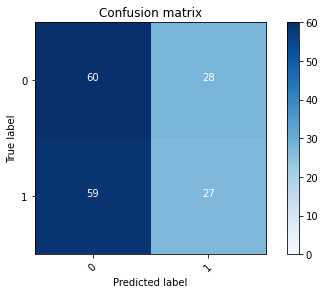

2022-08-20 15:33:48 - [Epoch Train: 68] loss: 0.0355, auc: 0.9992, acc: 0.9876, time: 58.00 s            
2022-08-20 15:33:48 - [Epoch Valid: 68] loss: 2.8344, auc: 0.5252, acc: 0.5020, time: 16.00 s


 68%|███████████████████████████▏            | 68/100 [1:12:18<37:06, 69.59s/it]

2022-08-20 15:33:48 - EPOCH: 69
2022-08-20 15:33:49 - Train Step 10/969, train_loss: 0.0210
2022-08-20 15:33:50 - Train Step 20/969, train_loss: 0.0180
2022-08-20 15:33:50 - Train Step 30/969, train_loss: 0.0273
2022-08-20 15:33:51 - Train Step 40/969, train_loss: 0.0268
2022-08-20 15:33:51 - Train Step 50/969, train_loss: 0.0233
2022-08-20 15:33:52 - Train Step 60/969, train_loss: 0.0250
2022-08-20 15:33:52 - Train Step 70/969, train_loss: 0.0240
2022-08-20 15:33:53 - Train Step 80/969, train_loss: 0.0213
2022-08-20 15:33:54 - Train Step 90/969, train_loss: 0.0191
2022-08-20 15:33:54 - Train Step 100/969, train_loss: 0.0175
2022-08-20 15:33:55 - Train Step 110/969, train_loss: 0.0162
2022-08-20 15:33:55 - Train Step 120/969, train_loss: 0.0163
2022-08-20 15:33:56 - Train Step 130/969, train_loss: 0.0169
2022-08-20 15:33:56 - Train Step 140/969, train_loss: 0.0157
2022-08-20 15:33:57 - Train Step 150/969, train_loss: 0.0152
2022-08-20 15:33:58 - Train Step 160/969, train_loss: 0.0143
2

2022-08-20 15:34:55 - Valid Step 190/251, valid_loss: 3.0538
2022-08-20 15:34:56 - Valid Step 195/251, valid_loss: 3.0020
2022-08-20 15:34:56 - Valid Step 200/251, valid_loss: 2.9357
2022-08-20 15:34:56 - Valid Step 205/251, valid_loss: 2.8886
2022-08-20 15:34:56 - Valid Step 210/251, valid_loss: 2.8278
2022-08-20 15:34:57 - Valid Step 215/251, valid_loss: 2.7985
2022-08-20 15:34:57 - Valid Step 220/251, valid_loss: 2.7491
2022-08-20 15:34:57 - Valid Step 225/251, valid_loss: 2.7670
2022-08-20 15:34:58 - Valid Step 230/251, valid_loss: 2.7366
2022-08-20 15:34:58 - Valid Step 235/251, valid_loss: 2.8047
2022-08-20 15:34:58 - Valid Step 240/251, valid_loss: 2.8186
2022-08-20 15:34:58 - Valid Step 245/251, valid_loss: 2.7682
2022-08-20 15:34:59 - Valid Step 250/251, valid_loss: 2.8358
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
68      00012                1           0
165     00021                0         

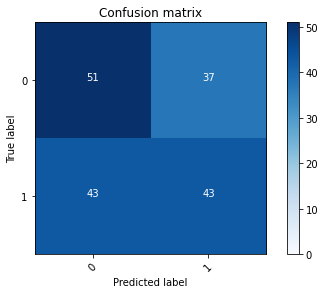

2022-08-20 15:34:59 - [Epoch Train: 69] loss: 0.0320, auc: 0.9995, acc: 0.9928, time: 55.00 s            
2022-08-20 15:34:59 - [Epoch Valid: 69] loss: 2.8257, auc: 0.5172, acc: 0.5578, time: 14.00 s


 69%|███████████████████████████▌            | 69/100 [1:13:28<36:09, 70.00s/it]

2022-08-20 15:34:59 - EPOCH: 70
2022-08-20 15:35:00 - Train Step 10/969, train_loss: 0.0437
2022-08-20 15:35:00 - Train Step 20/969, train_loss: 0.0367
2022-08-20 15:35:01 - Train Step 30/969, train_loss: 0.0519
2022-08-20 15:35:02 - Train Step 40/969, train_loss: 0.0409
2022-08-20 15:35:02 - Train Step 50/969, train_loss: 0.0362
2022-08-20 15:35:03 - Train Step 60/969, train_loss: 0.0304
2022-08-20 15:35:04 - Train Step 70/969, train_loss: 0.0310
2022-08-20 15:35:04 - Train Step 80/969, train_loss: 0.0273
2022-08-20 15:35:05 - Train Step 90/969, train_loss: 0.0245
2022-08-20 15:35:05 - Train Step 100/969, train_loss: 0.0234
2022-08-20 15:35:06 - Train Step 110/969, train_loss: 0.0296
2022-08-20 15:35:06 - Train Step 120/969, train_loss: 0.0278
2022-08-20 15:35:07 - Train Step 130/969, train_loss: 0.0267
2022-08-20 15:35:07 - Train Step 140/969, train_loss: 0.0339
2022-08-20 15:35:08 - Train Step 150/969, train_loss: 0.0319
2022-08-20 15:35:09 - Train Step 160/969, train_loss: 0.0300
2

2022-08-20 15:36:11 - Valid Step 190/251, valid_loss: 2.7394
2022-08-20 15:36:11 - Valid Step 195/251, valid_loss: 2.7923
2022-08-20 15:36:11 - Valid Step 200/251, valid_loss: 2.7696
2022-08-20 15:36:12 - Valid Step 205/251, valid_loss: 2.7240
2022-08-20 15:36:12 - Valid Step 210/251, valid_loss: 2.6860
2022-08-20 15:36:12 - Valid Step 215/251, valid_loss: 2.6944
2022-08-20 15:36:13 - Valid Step 220/251, valid_loss: 2.6798
2022-08-20 15:36:13 - Valid Step 225/251, valid_loss: 2.6432
2022-08-20 15:36:13 - Valid Step 230/251, valid_loss: 2.6029
2022-08-20 15:36:14 - Valid Step 235/251, valid_loss: 2.5687
2022-08-20 15:36:14 - Valid Step 240/251, valid_loss: 2.5431
2022-08-20 15:36:14 - Valid Step 245/251, valid_loss: 2.5073
2022-08-20 15:36:15 - Valid Step 250/251, valid_loss: 2.4808
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
54      00012                1           0
149     00021                0         

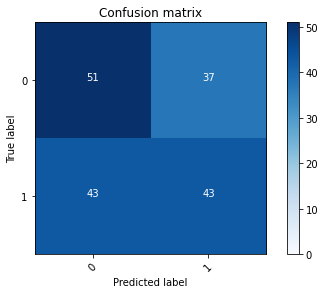

2022-08-20 15:36:15 - [Epoch Train: 70] loss: 0.0369, auc: 0.9995, acc: 0.9897, time: 59.00 s            
2022-08-20 15:36:15 - [Epoch Valid: 70] loss: 2.5134, auc: 0.5265, acc: 0.5458, time: 16.00 s


 70%|████████████████████████████            | 70/100 [1:14:44<35:53, 71.79s/it]

2022-08-20 15:36:15 - EPOCH: 71
2022-08-20 15:36:16 - Train Step 10/969, train_loss: 0.0013
2022-08-20 15:36:17 - Train Step 20/969, train_loss: 0.0348
2022-08-20 15:36:17 - Train Step 30/969, train_loss: 0.0256
2022-08-20 15:36:18 - Train Step 40/969, train_loss: 0.1229
2022-08-20 15:36:18 - Train Step 50/969, train_loss: 0.0986
2022-08-20 15:36:19 - Train Step 60/969, train_loss: 0.0858
2022-08-20 15:36:19 - Train Step 70/969, train_loss: 0.0756
2022-08-20 15:36:20 - Train Step 80/969, train_loss: 0.0663
2022-08-20 15:36:21 - Train Step 90/969, train_loss: 0.0631
2022-08-20 15:36:21 - Train Step 100/969, train_loss: 0.0702
2022-08-20 15:36:22 - Train Step 110/969, train_loss: 0.0660
2022-08-20 15:36:22 - Train Step 120/969, train_loss: 0.0620
2022-08-20 15:36:23 - Train Step 130/969, train_loss: 0.0574
2022-08-20 15:36:23 - Train Step 140/969, train_loss: 0.0537
2022-08-20 15:36:24 - Train Step 150/969, train_loss: 0.0504
2022-08-20 15:36:25 - Train Step 160/969, train_loss: 0.0510
2

2022-08-20 15:37:26 - Valid Step 190/251, valid_loss: 2.9143
2022-08-20 15:37:26 - Valid Step 195/251, valid_loss: 2.8725
2022-08-20 15:37:26 - Valid Step 200/251, valid_loss: 2.9026
2022-08-20 15:37:27 - Valid Step 205/251, valid_loss: 2.9769
2022-08-20 15:37:27 - Valid Step 210/251, valid_loss: 2.9235
2022-08-20 15:37:27 - Valid Step 215/251, valid_loss: 2.9321
2022-08-20 15:37:27 - Valid Step 220/251, valid_loss: 2.9411
2022-08-20 15:37:28 - Valid Step 225/251, valid_loss: 2.9144
2022-08-20 15:37:28 - Valid Step 230/251, valid_loss: 2.9522
2022-08-20 15:37:28 - Valid Step 235/251, valid_loss: 2.9646
2022-08-20 15:37:29 - Valid Step 240/251, valid_loss: 2.9633
2022-08-20 15:37:29 - Valid Step 245/251, valid_loss: 2.9679
2022-08-20 15:37:29 - Valid Step 250/251, valid_loss: 2.9155
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
92      00012                1           0
67      00021                0         

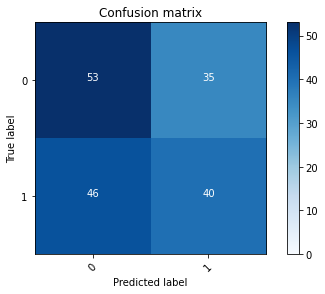

2022-08-20 15:37:30 - [Epoch Train: 71] loss: 0.0353, auc: 0.9990, acc: 0.9897, time: 58.00 s            
2022-08-20 15:37:30 - [Epoch Valid: 71] loss: 2.9039, auc: 0.5135, acc: 0.5578, time: 15.00 s


 71%|████████████████████████████▍           | 71/100 [1:15:59<35:05, 72.61s/it]

2022-08-20 15:37:30 - EPOCH: 72
2022-08-20 15:37:30 - Train Step 10/969, train_loss: 0.0176
2022-08-20 15:37:31 - Train Step 20/969, train_loss: 0.0142
2022-08-20 15:37:31 - Train Step 30/969, train_loss: 0.0109
2022-08-20 15:37:32 - Train Step 40/969, train_loss: 0.0088
2022-08-20 15:37:33 - Train Step 50/969, train_loss: 0.0071
2022-08-20 15:37:33 - Train Step 60/969, train_loss: 0.0245
2022-08-20 15:37:34 - Train Step 70/969, train_loss: 0.0221
2022-08-20 15:37:34 - Train Step 80/969, train_loss: 0.0199
2022-08-20 15:37:35 - Train Step 90/969, train_loss: 0.0191
2022-08-20 15:37:35 - Train Step 100/969, train_loss: 0.0191
2022-08-20 15:37:36 - Train Step 110/969, train_loss: 0.0422
2022-08-20 15:37:36 - Train Step 120/969, train_loss: 0.0408
2022-08-20 15:37:37 - Train Step 130/969, train_loss: 0.0458
2022-08-20 15:37:38 - Train Step 140/969, train_loss: 0.0475
2022-08-20 15:37:38 - Train Step 150/969, train_loss: 0.0445
2022-08-20 15:37:39 - Train Step 160/969, train_loss: 0.0423
2

2022-08-20 15:38:41 - Valid Step 190/251, valid_loss: 2.7316
2022-08-20 15:38:42 - Valid Step 195/251, valid_loss: 2.6967
2022-08-20 15:38:42 - Valid Step 200/251, valid_loss: 2.6949
2022-08-20 15:38:42 - Valid Step 205/251, valid_loss: 2.6589
2022-08-20 15:38:43 - Valid Step 210/251, valid_loss: 2.6941
2022-08-20 15:38:43 - Valid Step 215/251, valid_loss: 2.6726
2022-08-20 15:38:43 - Valid Step 220/251, valid_loss: 2.7064
2022-08-20 15:38:43 - Valid Step 225/251, valid_loss: 2.7688
2022-08-20 15:38:44 - Valid Step 230/251, valid_loss: 2.7783
2022-08-20 15:38:44 - Valid Step 235/251, valid_loss: 2.7589
2022-08-20 15:38:44 - Valid Step 240/251, valid_loss: 2.7564
2022-08-20 15:38:45 - Valid Step 245/251, valid_loss: 2.7341
2022-08-20 15:38:45 - Valid Step 250/251, valid_loss: 2.7583
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
149     00012                1           0
164     00021                0         

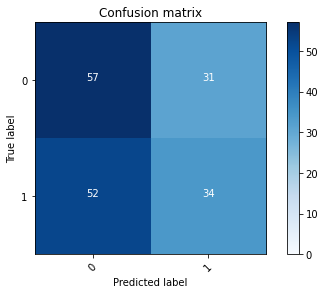

2022-08-20 15:38:45 - [Epoch Train: 72] loss: 0.0336, auc: 0.9994, acc: 0.9917, time: 59.00 s            
2022-08-20 15:38:45 - [Epoch Valid: 72] loss: 2.7485, auc: 0.5201, acc: 0.5139, time: 16.00 s


 72%|████████████████████████████▊           | 72/100 [1:17:15<34:18, 73.53s/it]

2022-08-20 15:38:45 - EPOCH: 73
2022-08-20 15:38:46 - Train Step 10/969, train_loss: 0.0034
2022-08-20 15:38:47 - Train Step 20/969, train_loss: 0.0020
2022-08-20 15:38:47 - Train Step 30/969, train_loss: 0.0027
2022-08-20 15:38:48 - Train Step 40/969, train_loss: 0.0063
2022-08-20 15:38:48 - Train Step 50/969, train_loss: 0.0055
2022-08-20 15:38:49 - Train Step 60/969, train_loss: 0.0050
2022-08-20 15:38:50 - Train Step 70/969, train_loss: 0.0073
2022-08-20 15:38:50 - Train Step 80/969, train_loss: 0.0077
2022-08-20 15:38:51 - Train Step 90/969, train_loss: 0.0093
2022-08-20 15:38:51 - Train Step 100/969, train_loss: 0.0089
2022-08-20 15:38:52 - Train Step 110/969, train_loss: 0.0121
2022-08-20 15:38:52 - Train Step 120/969, train_loss: 0.0111
2022-08-20 15:38:53 - Train Step 130/969, train_loss: 0.0103
2022-08-20 15:38:53 - Train Step 140/969, train_loss: 0.0119
2022-08-20 15:38:54 - Train Step 150/969, train_loss: 0.0196
2022-08-20 15:38:54 - Train Step 160/969, train_loss: 0.0189
2

2022-08-20 15:39:46 - Valid Step 190/251, valid_loss: 3.3387
2022-08-20 15:39:46 - Valid Step 195/251, valid_loss: 3.2725
2022-08-20 15:39:47 - Valid Step 200/251, valid_loss: 3.2033
2022-08-20 15:39:47 - Valid Step 205/251, valid_loss: 3.1939
2022-08-20 15:39:47 - Valid Step 210/251, valid_loss: 3.1282
2022-08-20 15:39:47 - Valid Step 215/251, valid_loss: 3.0631
2022-08-20 15:39:48 - Valid Step 220/251, valid_loss: 3.0364
2022-08-20 15:39:48 - Valid Step 225/251, valid_loss: 3.0789
2022-08-20 15:39:48 - Valid Step 230/251, valid_loss: 3.0135
2022-08-20 15:39:48 - Valid Step 235/251, valid_loss: 3.0196
2022-08-20 15:39:49 - Valid Step 240/251, valid_loss: 3.0359
2022-08-20 15:39:49 - Valid Step 245/251, valid_loss: 3.0497
2022-08-20 15:39:49 - Valid Step 250/251, valid_loss: 3.0010
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
167     00012                1           0
66      00021                0         

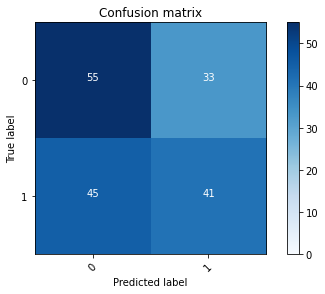

2022-08-20 15:39:49 - [Epoch Train: 73] loss: 0.0284, auc: 0.9998, acc: 0.9928, time: 51.00 s            
2022-08-20 15:39:50 - [Epoch Valid: 73] loss: 3.0423, auc: 0.5251, acc: 0.5458, time: 13.00 s


 73%|█████████████████████████████▏          | 73/100 [1:18:19<31:50, 70.76s/it]

2022-08-20 15:39:50 - EPOCH: 74
2022-08-20 15:39:50 - Train Step 10/969, train_loss: 0.0031
2022-08-20 15:39:51 - Train Step 20/969, train_loss: 0.0019
2022-08-20 15:39:51 - Train Step 30/969, train_loss: 0.0151
2022-08-20 15:39:52 - Train Step 40/969, train_loss: 0.0125
2022-08-20 15:39:52 - Train Step 50/969, train_loss: 0.0109
2022-08-20 15:39:53 - Train Step 60/969, train_loss: 0.0139
2022-08-20 15:39:53 - Train Step 70/969, train_loss: 0.0122
2022-08-20 15:39:54 - Train Step 80/969, train_loss: 0.0194
2022-08-20 15:39:54 - Train Step 90/969, train_loss: 0.0177
2022-08-20 15:39:55 - Train Step 100/969, train_loss: 0.0166
2022-08-20 15:39:55 - Train Step 110/969, train_loss: 0.0166
2022-08-20 15:39:56 - Train Step 120/969, train_loss: 0.0153
2022-08-20 15:39:56 - Train Step 130/969, train_loss: 0.0259
2022-08-20 15:39:57 - Train Step 140/969, train_loss: 0.0241
2022-08-20 15:39:57 - Train Step 150/969, train_loss: 0.0227
2022-08-20 15:39:58 - Train Step 160/969, train_loss: 0.0217
2

2022-08-20 15:40:49 - Valid Step 190/251, valid_loss: 2.5510
2022-08-20 15:40:49 - Valid Step 195/251, valid_loss: 2.5250
2022-08-20 15:40:49 - Valid Step 200/251, valid_loss: 2.5243
2022-08-20 15:40:49 - Valid Step 205/251, valid_loss: 2.5360
2022-08-20 15:40:50 - Valid Step 210/251, valid_loss: 2.5177
2022-08-20 15:40:50 - Valid Step 215/251, valid_loss: 2.5265
2022-08-20 15:40:50 - Valid Step 220/251, valid_loss: 2.6046
2022-08-20 15:40:50 - Valid Step 225/251, valid_loss: 2.6354
2022-08-20 15:40:51 - Valid Step 230/251, valid_loss: 2.6649
2022-08-20 15:40:51 - Valid Step 235/251, valid_loss: 2.6273
2022-08-20 15:40:51 - Valid Step 240/251, valid_loss: 2.6830
2022-08-20 15:40:52 - Valid Step 245/251, valid_loss: 2.6412
2022-08-20 15:40:52 - Valid Step 250/251, valid_loss: 2.6251
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
100     00012                1           0
163     00021                0         

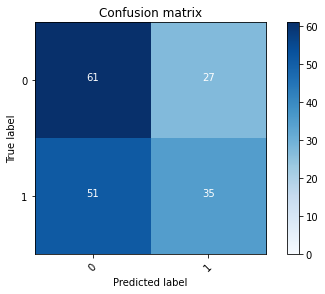

2022-08-20 15:40:52 - [Epoch Train: 74] loss: 0.0316, auc: 0.9996, acc: 0.9907, time: 49.00 s            
2022-08-20 15:40:52 - [Epoch Valid: 74] loss: 2.6494, auc: 0.5190, acc: 0.5498, time: 13.00 s


 74%|█████████████████████████████▌          | 74/100 [1:19:21<29:35, 68.28s/it]

2022-08-20 15:40:52 - EPOCH: 75
2022-08-20 15:40:53 - Train Step 10/969, train_loss: 0.0004
2022-08-20 15:40:53 - Train Step 20/969, train_loss: 0.0017
2022-08-20 15:40:54 - Train Step 30/969, train_loss: 0.0237
2022-08-20 15:40:54 - Train Step 40/969, train_loss: 0.0204
2022-08-20 15:40:55 - Train Step 50/969, train_loss: 0.0197
2022-08-20 15:40:55 - Train Step 60/969, train_loss: 0.0292
2022-08-20 15:40:56 - Train Step 70/969, train_loss: 0.0259
2022-08-20 15:40:56 - Train Step 80/969, train_loss: 0.0243
2022-08-20 15:40:57 - Train Step 90/969, train_loss: 0.0239
2022-08-20 15:40:57 - Train Step 100/969, train_loss: 0.0268
2022-08-20 15:40:58 - Train Step 110/969, train_loss: 0.0250
2022-08-20 15:40:58 - Train Step 120/969, train_loss: 0.0263
2022-08-20 15:40:59 - Train Step 130/969, train_loss: 0.0244
2022-08-20 15:40:59 - Train Step 140/969, train_loss: 0.0229
2022-08-20 15:41:00 - Train Step 150/969, train_loss: 0.0217
2022-08-20 15:41:00 - Train Step 160/969, train_loss: 0.0207
2

2022-08-20 15:41:51 - Valid Step 190/251, valid_loss: 2.9939
2022-08-20 15:41:51 - Valid Step 195/251, valid_loss: 2.9288
2022-08-20 15:41:52 - Valid Step 200/251, valid_loss: 2.8973
2022-08-20 15:41:52 - Valid Step 205/251, valid_loss: 2.9237
2022-08-20 15:41:52 - Valid Step 210/251, valid_loss: 2.8605
2022-08-20 15:41:52 - Valid Step 215/251, valid_loss: 2.8790
2022-08-20 15:41:53 - Valid Step 220/251, valid_loss: 2.9727
2022-08-20 15:41:53 - Valid Step 225/251, valid_loss: 2.9524
2022-08-20 15:41:53 - Valid Step 230/251, valid_loss: 2.9655
2022-08-20 15:41:53 - Valid Step 235/251, valid_loss: 2.9483
2022-08-20 15:41:54 - Valid Step 240/251, valid_loss: 2.9264
2022-08-20 15:41:54 - Valid Step 245/251, valid_loss: 2.9410
2022-08-20 15:41:54 - Valid Step 250/251, valid_loss: 2.8936
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
88      00012                1           0
111     00021                0         

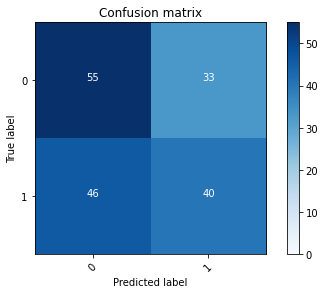

2022-08-20 15:41:54 - [Epoch Train: 75] loss: 0.0292, auc: 0.9996, acc: 0.9897, time: 49.00 s            
2022-08-20 15:41:54 - [Epoch Valid: 75] loss: 2.9220, auc: 0.5222, acc: 0.5498, time: 13.00 s


 75%|██████████████████████████████          | 75/100 [1:20:24<27:43, 66.52s/it]

2022-08-20 15:41:54 - EPOCH: 76
2022-08-20 15:41:55 - Train Step 10/969, train_loss: 0.1297
2022-08-20 15:41:56 - Train Step 20/969, train_loss: 0.0651
2022-08-20 15:41:56 - Train Step 30/969, train_loss: 0.0701
2022-08-20 15:41:57 - Train Step 40/969, train_loss: 0.0846
2022-08-20 15:41:57 - Train Step 50/969, train_loss: 0.0807
2022-08-20 15:41:58 - Train Step 60/969, train_loss: 0.0676
2022-08-20 15:41:58 - Train Step 70/969, train_loss: 0.0586
2022-08-20 15:41:59 - Train Step 80/969, train_loss: 0.0515
2022-08-20 15:41:59 - Train Step 90/969, train_loss: 0.0470
2022-08-20 15:42:00 - Train Step 100/969, train_loss: 0.0448
2022-08-20 15:42:00 - Train Step 110/969, train_loss: 0.0417
2022-08-20 15:42:01 - Train Step 120/969, train_loss: 0.0407
2022-08-20 15:42:01 - Train Step 130/969, train_loss: 0.0443
2022-08-20 15:42:02 - Train Step 140/969, train_loss: 0.0413
2022-08-20 15:42:02 - Train Step 150/969, train_loss: 0.0439
2022-08-20 15:42:03 - Train Step 160/969, train_loss: 0.0476
2

2022-08-20 15:42:54 - Valid Step 190/251, valid_loss: 3.0791
2022-08-20 15:42:55 - Valid Step 195/251, valid_loss: 3.0674
2022-08-20 15:42:55 - Valid Step 200/251, valid_loss: 3.2045
2022-08-20 15:42:55 - Valid Step 205/251, valid_loss: 3.1566
2022-08-20 15:42:56 - Valid Step 210/251, valid_loss: 3.1522
2022-08-20 15:42:56 - Valid Step 215/251, valid_loss: 3.0811
2022-08-20 15:42:56 - Valid Step 220/251, valid_loss: 3.0465
2022-08-20 15:42:56 - Valid Step 225/251, valid_loss: 3.1690
2022-08-20 15:42:57 - Valid Step 230/251, valid_loss: 3.1337
2022-08-20 15:42:57 - Valid Step 235/251, valid_loss: 3.1384
2022-08-20 15:42:57 - Valid Step 240/251, valid_loss: 3.1054
2022-08-20 15:42:57 - Valid Step 245/251, valid_loss: 3.0664
2022-08-20 15:42:58 - Valid Step 250/251, valid_loss: 3.0112
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
59      00012                1           0
82      00021                0         

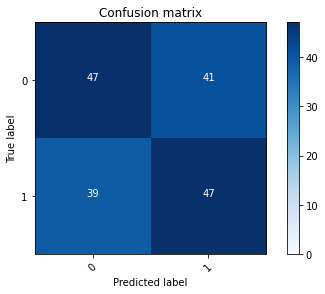

2022-08-20 15:42:58 - [Epoch Train: 76] loss: 0.0313, auc: 0.9995, acc: 0.9897, time: 50.00 s            
2022-08-20 15:42:58 - [Epoch Valid: 76] loss: 3.0002, auc: 0.5213, acc: 0.5618, time: 13.00 s


 76%|██████████████████████████████▍         | 76/100 [1:21:27<26:14, 65.59s/it]

2022-08-20 15:42:58 - EPOCH: 77
2022-08-20 15:42:59 - Train Step 10/969, train_loss: 0.0344
2022-08-20 15:42:59 - Train Step 20/969, train_loss: 0.0176
2022-08-20 15:43:00 - Train Step 30/969, train_loss: 0.0198
2022-08-20 15:43:00 - Train Step 40/969, train_loss: 0.0190
2022-08-20 15:43:00 - Train Step 50/969, train_loss: 0.0231
2022-08-20 15:43:01 - Train Step 60/969, train_loss: 0.0328
2022-08-20 15:43:01 - Train Step 70/969, train_loss: 0.0310
2022-08-20 15:43:02 - Train Step 80/969, train_loss: 0.0346
2022-08-20 15:43:03 - Train Step 90/969, train_loss: 0.0312
2022-08-20 15:43:03 - Train Step 100/969, train_loss: 0.0286
2022-08-20 15:43:04 - Train Step 110/969, train_loss: 0.0274
2022-08-20 15:43:04 - Train Step 120/969, train_loss: 0.0254
2022-08-20 15:43:05 - Train Step 130/969, train_loss: 0.0239
2022-08-20 15:43:05 - Train Step 140/969, train_loss: 0.0224
2022-08-20 15:43:06 - Train Step 150/969, train_loss: 0.0290
2022-08-20 15:43:06 - Train Step 160/969, train_loss: 0.0278
2

2022-08-20 15:43:59 - Valid Step 190/251, valid_loss: 2.8237
2022-08-20 15:43:59 - Valid Step 195/251, valid_loss: 2.7880
2022-08-20 15:44:00 - Valid Step 200/251, valid_loss: 2.8552
2022-08-20 15:44:00 - Valid Step 205/251, valid_loss: 2.8864
2022-08-20 15:44:00 - Valid Step 210/251, valid_loss: 2.8553
2022-08-20 15:44:00 - Valid Step 215/251, valid_loss: 2.9280
2022-08-20 15:44:01 - Valid Step 220/251, valid_loss: 3.0303
2022-08-20 15:44:01 - Valid Step 225/251, valid_loss: 3.0286
2022-08-20 15:44:01 - Valid Step 230/251, valid_loss: 2.9755
2022-08-20 15:44:01 - Valid Step 235/251, valid_loss: 2.9196
2022-08-20 15:44:02 - Valid Step 240/251, valid_loss: 2.9227
2022-08-20 15:44:02 - Valid Step 245/251, valid_loss: 2.8939
2022-08-20 15:44:02 - Valid Step 250/251, valid_loss: 2.8538
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
167     00012                1           0
158     00021                0         

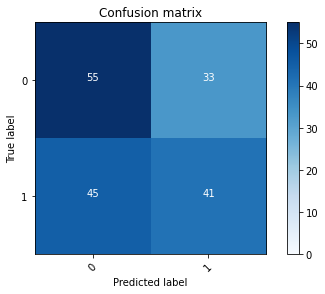

2022-08-20 15:44:02 - [Epoch Train: 77] loss: 0.0314, auc: 0.9996, acc: 0.9917, time: 51.00 s            
2022-08-20 15:44:02 - [Epoch Valid: 77] loss: 2.8716, auc: 0.5234, acc: 0.5618, time: 13.00 s


 77%|██████████████████████████████▊         | 77/100 [1:22:32<25:01, 65.26s/it]

2022-08-20 15:44:02 - EPOCH: 78
2022-08-20 15:44:03 - Train Step 10/969, train_loss: 0.0236
2022-08-20 15:44:04 - Train Step 20/969, train_loss: 0.0285
2022-08-20 15:44:04 - Train Step 30/969, train_loss: 0.0215
2022-08-20 15:44:05 - Train Step 40/969, train_loss: 0.0165
2022-08-20 15:44:05 - Train Step 50/969, train_loss: 0.0140
2022-08-20 15:44:06 - Train Step 60/969, train_loss: 0.0133
2022-08-20 15:44:06 - Train Step 70/969, train_loss: 0.0122
2022-08-20 15:44:07 - Train Step 80/969, train_loss: 0.0114
2022-08-20 15:44:07 - Train Step 90/969, train_loss: 0.0143
2022-08-20 15:44:08 - Train Step 100/969, train_loss: 0.0185
2022-08-20 15:44:08 - Train Step 110/969, train_loss: 0.0239
2022-08-20 15:44:09 - Train Step 120/969, train_loss: 0.0245
2022-08-20 15:44:09 - Train Step 130/969, train_loss: 0.0227
2022-08-20 15:44:10 - Train Step 140/969, train_loss: 0.0213
2022-08-20 15:44:10 - Train Step 150/969, train_loss: 0.0200
2022-08-20 15:44:11 - Train Step 160/969, train_loss: 0.0195
2

2022-08-20 15:45:03 - Valid Step 190/251, valid_loss: 2.7509
2022-08-20 15:45:03 - Valid Step 195/251, valid_loss: 2.9192
2022-08-20 15:45:03 - Valid Step 200/251, valid_loss: 2.8854
2022-08-20 15:45:03 - Valid Step 205/251, valid_loss: 2.9536
2022-08-20 15:45:04 - Valid Step 210/251, valid_loss: 3.0336
2022-08-20 15:45:04 - Valid Step 215/251, valid_loss: 2.9787
2022-08-20 15:45:04 - Valid Step 220/251, valid_loss: 2.9556
2022-08-20 15:45:04 - Valid Step 225/251, valid_loss: 2.9839
2022-08-20 15:45:05 - Valid Step 230/251, valid_loss: 2.9234
2022-08-20 15:45:05 - Valid Step 235/251, valid_loss: 2.8642
2022-08-20 15:45:05 - Valid Step 240/251, valid_loss: 2.8768
2022-08-20 15:45:05 - Valid Step 245/251, valid_loss: 2.9040
2022-08-20 15:45:06 - Valid Step 250/251, valid_loss: 2.8874
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
54      00012                1           0
105     00021                0         

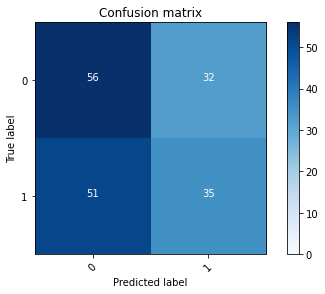

2022-08-20 15:45:06 - [Epoch Train: 78] loss: 0.0277, auc: 0.9997, acc: 0.9928, time: 50.00 s            
2022-08-20 15:45:06 - [Epoch Valid: 78] loss: 2.8816, auc: 0.5240, acc: 0.5299, time: 13.00 s


 78%|███████████████████████████████▏        | 78/100 [1:23:35<23:44, 64.75s/it]

2022-08-20 15:45:06 - EPOCH: 79
2022-08-20 15:45:07 - Train Step 10/969, train_loss: 0.0037
2022-08-20 15:45:07 - Train Step 20/969, train_loss: 0.0039
2022-08-20 15:45:08 - Train Step 30/969, train_loss: 0.0029
2022-08-20 15:45:08 - Train Step 40/969, train_loss: 0.0067
2022-08-20 15:45:09 - Train Step 50/969, train_loss: 0.0071
2022-08-20 15:45:09 - Train Step 60/969, train_loss: 0.0100
2022-08-20 15:45:10 - Train Step 70/969, train_loss: 0.0132
2022-08-20 15:45:10 - Train Step 80/969, train_loss: 0.0121
2022-08-20 15:45:11 - Train Step 90/969, train_loss: 0.0116
2022-08-20 15:45:11 - Train Step 100/969, train_loss: 0.0219
2022-08-20 15:45:12 - Train Step 110/969, train_loss: 0.0207
2022-08-20 15:45:12 - Train Step 120/969, train_loss: 0.0195
2022-08-20 15:45:13 - Train Step 130/969, train_loss: 0.0187
2022-08-20 15:45:13 - Train Step 140/969, train_loss: 0.0173
2022-08-20 15:45:14 - Train Step 150/969, train_loss: 0.0230
2022-08-20 15:45:14 - Train Step 160/969, train_loss: 0.0220
2

2022-08-20 15:46:06 - Valid Step 190/251, valid_loss: 2.8629
2022-08-20 15:46:07 - Valid Step 195/251, valid_loss: 2.9127
2022-08-20 15:46:07 - Valid Step 200/251, valid_loss: 3.1354
2022-08-20 15:46:07 - Valid Step 205/251, valid_loss: 3.1139
2022-08-20 15:46:07 - Valid Step 210/251, valid_loss: 3.1562
2022-08-20 15:46:08 - Valid Step 215/251, valid_loss: 3.1408
2022-08-20 15:46:08 - Valid Step 220/251, valid_loss: 3.0703
2022-08-20 15:46:08 - Valid Step 225/251, valid_loss: 3.0665
2022-08-20 15:46:08 - Valid Step 230/251, valid_loss: 3.1092
2022-08-20 15:46:09 - Valid Step 235/251, valid_loss: 3.1089
2022-08-20 15:46:09 - Valid Step 240/251, valid_loss: 3.1097
2022-08-20 15:46:09 - Valid Step 245/251, valid_loss: 3.1103
2022-08-20 15:46:09 - Valid Step 250/251, valid_loss: 3.1683
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
109     00012                1           0
96      00021                0         

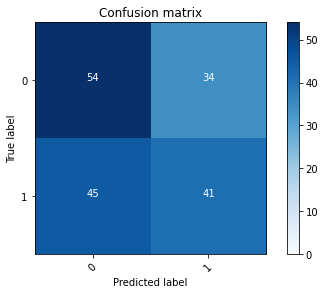

2022-08-20 15:46:10 - [Epoch Train: 79] loss: 0.0273, auc: 0.9996, acc: 0.9886, time: 50.00 s            
2022-08-20 15:46:10 - [Epoch Valid: 79] loss: 3.1589, auc: 0.5233, acc: 0.5378, time: 13.00 s


 79%|███████████████████████████████▌        | 79/100 [1:24:39<22:33, 64.46s/it]

2022-08-20 15:46:10 - EPOCH: 80
2022-08-20 15:46:10 - Train Step 10/969, train_loss: 0.0062
2022-08-20 15:46:11 - Train Step 20/969, train_loss: 0.0536
2022-08-20 15:46:11 - Train Step 30/969, train_loss: 0.0363
2022-08-20 15:46:12 - Train Step 40/969, train_loss: 0.0311
2022-08-20 15:46:13 - Train Step 50/969, train_loss: 0.0274
2022-08-20 15:46:13 - Train Step 60/969, train_loss: 0.0245
2022-08-20 15:46:14 - Train Step 70/969, train_loss: 0.0240
2022-08-20 15:46:14 - Train Step 80/969, train_loss: 0.0214
2022-08-20 15:46:15 - Train Step 90/969, train_loss: 0.0192
2022-08-20 15:46:15 - Train Step 100/969, train_loss: 0.0180
2022-08-20 15:46:16 - Train Step 110/969, train_loss: 0.0165
2022-08-20 15:46:16 - Train Step 120/969, train_loss: 0.0235
2022-08-20 15:46:17 - Train Step 130/969, train_loss: 0.0230
2022-08-20 15:46:17 - Train Step 140/969, train_loss: 0.0246
2022-08-20 15:46:18 - Train Step 150/969, train_loss: 0.0290
2022-08-20 15:46:18 - Train Step 160/969, train_loss: 0.0283
2

2022-08-20 15:47:10 - Valid Step 190/251, valid_loss: 3.6894
2022-08-20 15:47:10 - Valid Step 195/251, valid_loss: 3.7105
2022-08-20 15:47:11 - Valid Step 200/251, valid_loss: 3.7399
2022-08-20 15:47:11 - Valid Step 205/251, valid_loss: 3.6514
2022-08-20 15:47:11 - Valid Step 210/251, valid_loss: 3.5865
2022-08-20 15:47:11 - Valid Step 215/251, valid_loss: 3.6261
2022-08-20 15:47:12 - Valid Step 220/251, valid_loss: 3.5453
2022-08-20 15:47:12 - Valid Step 225/251, valid_loss: 3.5119
2022-08-20 15:47:12 - Valid Step 230/251, valid_loss: 3.4363
2022-08-20 15:47:13 - Valid Step 235/251, valid_loss: 3.4041
2022-08-20 15:47:13 - Valid Step 240/251, valid_loss: 3.3652
2022-08-20 15:47:13 - Valid Step 245/251, valid_loss: 3.3533
2022-08-20 15:47:13 - Valid Step 250/251, valid_loss: 3.3702
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
114     00012                1           0
83      00021                0         

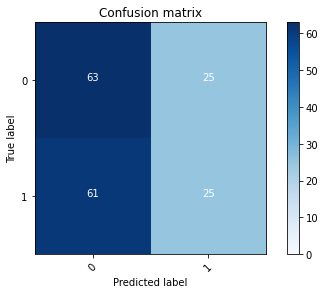

2022-08-20 15:47:13 - [Epoch Train: 80] loss: 0.0281, auc: 0.9995, acc: 0.9928, time: 50.00 s            
2022-08-20 15:47:13 - [Epoch Valid: 80] loss: 3.4981, auc: 0.5225, acc: 0.5100, time: 13.00 s


 80%|████████████████████████████████        | 80/100 [1:25:43<21:25, 64.27s/it]

2022-08-20 15:47:13 - EPOCH: 81
2022-08-20 15:47:14 - Train Step 10/969, train_loss: 0.0187
2022-08-20 15:47:15 - Train Step 20/969, train_loss: 0.0108
2022-08-20 15:47:15 - Train Step 30/969, train_loss: 0.0470
2022-08-20 15:47:16 - Train Step 40/969, train_loss: 0.0366
2022-08-20 15:47:16 - Train Step 50/969, train_loss: 0.0321
2022-08-20 15:47:17 - Train Step 60/969, train_loss: 0.0270
2022-08-20 15:47:17 - Train Step 70/969, train_loss: 0.0239
2022-08-20 15:47:18 - Train Step 80/969, train_loss: 0.0315
2022-08-20 15:47:18 - Train Step 90/969, train_loss: 0.0290
2022-08-20 15:47:19 - Train Step 100/969, train_loss: 0.0265
2022-08-20 15:47:19 - Train Step 110/969, train_loss: 0.0269
2022-08-20 15:47:20 - Train Step 120/969, train_loss: 0.0266
2022-08-20 15:47:20 - Train Step 130/969, train_loss: 0.0280
2022-08-20 15:47:21 - Train Step 140/969, train_loss: 0.0268
2022-08-20 15:47:21 - Train Step 150/969, train_loss: 0.0251
2022-08-20 15:47:22 - Train Step 160/969, train_loss: 0.0272
2

2022-08-20 15:48:14 - Valid Step 190/251, valid_loss: 3.6268
2022-08-20 15:48:14 - Valid Step 195/251, valid_loss: 3.5724
2022-08-20 15:48:14 - Valid Step 200/251, valid_loss: 3.4921
2022-08-20 15:48:15 - Valid Step 205/251, valid_loss: 3.5406
2022-08-20 15:48:15 - Valid Step 210/251, valid_loss: 3.4873
2022-08-20 15:48:15 - Valid Step 215/251, valid_loss: 3.4352
2022-08-20 15:48:15 - Valid Step 220/251, valid_loss: 3.4290
2022-08-20 15:48:16 - Valid Step 225/251, valid_loss: 3.5181
2022-08-20 15:48:16 - Valid Step 230/251, valid_loss: 3.4700
2022-08-20 15:48:16 - Valid Step 235/251, valid_loss: 3.4070
2022-08-20 15:48:16 - Valid Step 240/251, valid_loss: 3.4204
2022-08-20 15:48:17 - Valid Step 245/251, valid_loss: 3.4089
2022-08-20 15:48:17 - Valid Step 250/251, valid_loss: 3.3922
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
168     00012                1           0
80      00021                0         

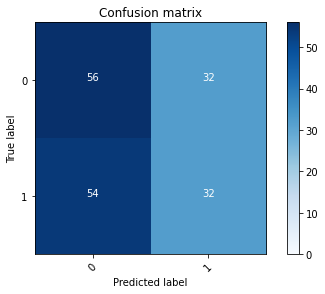

2022-08-20 15:48:17 - [Epoch Train: 81] loss: 0.0290, auc: 0.9996, acc: 0.9917, time: 50.00 s            
2022-08-20 15:48:17 - [Epoch Valid: 81] loss: 3.4049, auc: 0.5158, acc: 0.5139, time: 13.00 s


 81%|████████████████████████████████▍       | 81/100 [1:26:47<20:17, 64.08s/it]

2022-08-20 15:48:17 - EPOCH: 82
2022-08-20 15:48:18 - Train Step 10/969, train_loss: 0.0030
2022-08-20 15:48:18 - Train Step 20/969, train_loss: 0.0021
2022-08-20 15:48:19 - Train Step 30/969, train_loss: 0.0027
2022-08-20 15:48:19 - Train Step 40/969, train_loss: 0.0049
2022-08-20 15:48:20 - Train Step 50/969, train_loss: 0.0046
2022-08-20 15:48:20 - Train Step 60/969, train_loss: 0.0040
2022-08-20 15:48:21 - Train Step 70/969, train_loss: 0.0047
2022-08-20 15:48:21 - Train Step 80/969, train_loss: 0.0042
2022-08-20 15:48:22 - Train Step 90/969, train_loss: 0.0052
2022-08-20 15:48:22 - Train Step 100/969, train_loss: 0.0048
2022-08-20 15:48:23 - Train Step 110/969, train_loss: 0.0122
2022-08-20 15:48:23 - Train Step 120/969, train_loss: 0.0118
2022-08-20 15:48:24 - Train Step 130/969, train_loss: 0.0125
2022-08-20 15:48:24 - Train Step 140/969, train_loss: 0.0116
2022-08-20 15:48:25 - Train Step 150/969, train_loss: 0.0140
2022-08-20 15:48:25 - Train Step 160/969, train_loss: 0.0136
2

2022-08-20 15:49:18 - Valid Step 190/251, valid_loss: 3.0938
2022-08-20 15:49:18 - Valid Step 195/251, valid_loss: 3.0346
2022-08-20 15:49:18 - Valid Step 200/251, valid_loss: 3.0829
2022-08-20 15:49:18 - Valid Step 205/251, valid_loss: 3.0487
2022-08-20 15:49:19 - Valid Step 210/251, valid_loss: 2.9975
2022-08-20 15:49:19 - Valid Step 215/251, valid_loss: 2.9694
2022-08-20 15:49:19 - Valid Step 220/251, valid_loss: 2.9577
2022-08-20 15:49:19 - Valid Step 225/251, valid_loss: 2.8992
2022-08-20 15:49:20 - Valid Step 230/251, valid_loss: 3.0626
2022-08-20 15:49:20 - Valid Step 235/251, valid_loss: 3.0416
2022-08-20 15:49:20 - Valid Step 240/251, valid_loss: 3.1834
2022-08-20 15:49:20 - Valid Step 245/251, valid_loss: 3.1276
2022-08-20 15:49:21 - Valid Step 250/251, valid_loss: 3.1675
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
173     00012                1           0
69      00021                0         

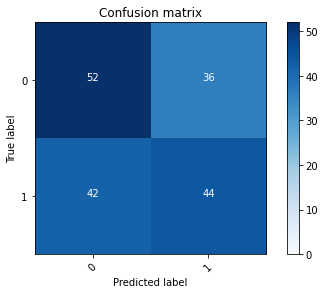

2022-08-20 15:49:21 - [Epoch Train: 82] loss: 0.0240, auc: 0.9998, acc: 0.9917, time: 50.00 s            
2022-08-20 15:49:21 - [Epoch Valid: 82] loss: 3.1577, auc: 0.5157, acc: 0.5737, time: 13.00 s
2022-08-20 15:49:21 - acc improved from 0.5737 to 0.5737. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_14-21-30/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e82-loss3.158-acc0.574-auc0.516.pth'


 82%|████████████████████████████████▊       | 82/100 [1:27:50<19:12, 64.01s/it]

2022-08-20 15:49:21 - EPOCH: 83
2022-08-20 15:49:22 - Train Step 10/969, train_loss: 0.0876
2022-08-20 15:49:22 - Train Step 20/969, train_loss: 0.1458
2022-08-20 15:49:23 - Train Step 30/969, train_loss: 0.0973
2022-08-20 15:49:23 - Train Step 40/969, train_loss: 0.0737
2022-08-20 15:49:24 - Train Step 50/969, train_loss: 0.0591
2022-08-20 15:49:24 - Train Step 60/969, train_loss: 0.0597
2022-08-20 15:49:25 - Train Step 70/969, train_loss: 0.0513
2022-08-20 15:49:25 - Train Step 80/969, train_loss: 0.0460
2022-08-20 15:49:26 - Train Step 90/969, train_loss: 0.0477
2022-08-20 15:49:26 - Train Step 100/969, train_loss: 0.0444
2022-08-20 15:49:27 - Train Step 110/969, train_loss: 0.0411
2022-08-20 15:49:27 - Train Step 120/969, train_loss: 0.0393
2022-08-20 15:49:28 - Train Step 130/969, train_loss: 0.0390
2022-08-20 15:49:29 - Train Step 140/969, train_loss: 0.0364
2022-08-20 15:49:29 - Train Step 150/969, train_loss: 0.0379
2022-08-20 15:49:30 - Train Step 160/969, train_loss: 0.0365
2

2022-08-20 15:50:22 - Valid Step 190/251, valid_loss: 3.4619
2022-08-20 15:50:22 - Valid Step 195/251, valid_loss: 3.4973
2022-08-20 15:50:22 - Valid Step 200/251, valid_loss: 3.4438
2022-08-20 15:50:22 - Valid Step 205/251, valid_loss: 3.4629
2022-08-20 15:50:23 - Valid Step 210/251, valid_loss: 3.4757
2022-08-20 15:50:23 - Valid Step 215/251, valid_loss: 3.4692
2022-08-20 15:50:23 - Valid Step 220/251, valid_loss: 3.4932
2022-08-20 15:50:23 - Valid Step 225/251, valid_loss: 3.4601
2022-08-20 15:50:24 - Valid Step 230/251, valid_loss: 3.4566
2022-08-20 15:50:24 - Valid Step 235/251, valid_loss: 3.4520
2022-08-20 15:50:24 - Valid Step 240/251, valid_loss: 3.4401
2022-08-20 15:50:24 - Valid Step 245/251, valid_loss: 3.4311
2022-08-20 15:50:25 - Valid Step 250/251, valid_loss: 3.4336
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
154     00012                1           0
125     00021                0         

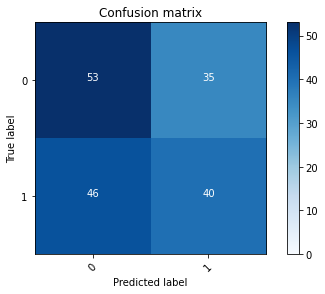

2022-08-20 15:50:25 - [Epoch Train: 83] loss: 0.0248, auc: 0.9998, acc: 0.9938, time: 50.00 s            
2022-08-20 15:50:25 - [Epoch Valid: 83] loss: 3.4209, auc: 0.5155, acc: 0.5538, time: 13.00 s


 83%|█████████████████████████████████▏      | 83/100 [1:28:54<18:07, 64.00s/it]

2022-08-20 15:50:25 - EPOCH: 84
2022-08-20 15:50:26 - Train Step 10/969, train_loss: 0.0062
2022-08-20 15:50:26 - Train Step 20/969, train_loss: 0.0037
2022-08-20 15:50:27 - Train Step 30/969, train_loss: 0.0092
2022-08-20 15:50:27 - Train Step 40/969, train_loss: 0.0072
2022-08-20 15:50:28 - Train Step 50/969, train_loss: 0.0058
2022-08-20 15:50:28 - Train Step 60/969, train_loss: 0.0060
2022-08-20 15:50:29 - Train Step 70/969, train_loss: 0.0266
2022-08-20 15:50:29 - Train Step 80/969, train_loss: 0.0234
2022-08-20 15:50:30 - Train Step 90/969, train_loss: 0.0209
2022-08-20 15:50:30 - Train Step 100/969, train_loss: 0.0190
2022-08-20 15:50:31 - Train Step 110/969, train_loss: 0.0177
2022-08-20 15:50:31 - Train Step 120/969, train_loss: 0.0166
2022-08-20 15:50:32 - Train Step 130/969, train_loss: 0.0205
2022-08-20 15:50:32 - Train Step 140/969, train_loss: 0.0195
2022-08-20 15:50:33 - Train Step 150/969, train_loss: 0.0184
2022-08-20 15:50:33 - Train Step 160/969, train_loss: 0.0175
2

2022-08-20 15:51:25 - Valid Step 190/251, valid_loss: 3.3333
2022-08-20 15:51:25 - Valid Step 195/251, valid_loss: 3.2509
2022-08-20 15:51:26 - Valid Step 200/251, valid_loss: 3.4425
2022-08-20 15:51:26 - Valid Step 205/251, valid_loss: 3.4792
2022-08-20 15:51:26 - Valid Step 210/251, valid_loss: 3.5093
2022-08-20 15:51:26 - Valid Step 215/251, valid_loss: 3.4649
2022-08-20 15:51:27 - Valid Step 220/251, valid_loss: 3.4385
2022-08-20 15:51:27 - Valid Step 225/251, valid_loss: 3.3812
2022-08-20 15:51:27 - Valid Step 230/251, valid_loss: 3.3276
2022-08-20 15:51:27 - Valid Step 235/251, valid_loss: 3.3787
2022-08-20 15:51:28 - Valid Step 240/251, valid_loss: 3.3165
2022-08-20 15:51:28 - Valid Step 245/251, valid_loss: 3.4168
2022-08-20 15:51:28 - Valid Step 250/251, valid_loss: 3.4567
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
155     00012                1           0
130     00021                0         

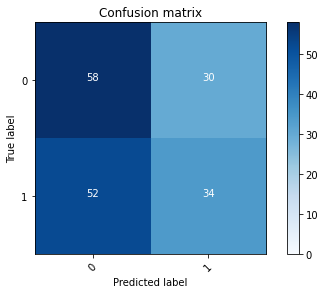

2022-08-20 15:51:28 - [Epoch Train: 84] loss: 0.0235, auc: 0.9998, acc: 0.9897, time: 50.00 s            
2022-08-20 15:51:28 - [Epoch Valid: 84] loss: 3.4429, auc: 0.5202, acc: 0.5378, time: 13.00 s


 84%|█████████████████████████████████▌      | 84/100 [1:29:58<17:01, 63.84s/it]

2022-08-20 15:51:28 - EPOCH: 85
2022-08-20 15:51:29 - Train Step 10/969, train_loss: 0.0068
2022-08-20 15:51:30 - Train Step 20/969, train_loss: 0.0230
2022-08-20 15:51:30 - Train Step 30/969, train_loss: 0.0183
2022-08-20 15:51:31 - Train Step 40/969, train_loss: 0.0139
2022-08-20 15:51:31 - Train Step 50/969, train_loss: 0.0114
2022-08-20 15:51:32 - Train Step 60/969, train_loss: 0.0097
2022-08-20 15:51:32 - Train Step 70/969, train_loss: 0.0092
2022-08-20 15:51:33 - Train Step 80/969, train_loss: 0.0085
2022-08-20 15:51:33 - Train Step 90/969, train_loss: 0.0106
2022-08-20 15:51:34 - Train Step 100/969, train_loss: 0.0103
2022-08-20 15:51:34 - Train Step 110/969, train_loss: 0.0095
2022-08-20 15:51:35 - Train Step 120/969, train_loss: 0.0088
2022-08-20 15:51:35 - Train Step 130/969, train_loss: 0.0086
2022-08-20 15:51:36 - Train Step 140/969, train_loss: 0.0131
2022-08-20 15:51:36 - Train Step 150/969, train_loss: 0.0123
2022-08-20 15:51:37 - Train Step 160/969, train_loss: 0.0116
2

2022-08-20 15:52:28 - Valid Step 190/251, valid_loss: 3.1115
2022-08-20 15:52:28 - Valid Step 195/251, valid_loss: 3.0907
2022-08-20 15:52:29 - Valid Step 200/251, valid_loss: 3.0176
2022-08-20 15:52:29 - Valid Step 205/251, valid_loss: 3.3238
2022-08-20 15:52:29 - Valid Step 210/251, valid_loss: 3.2915
2022-08-20 15:52:29 - Valid Step 215/251, valid_loss: 3.3495
2022-08-20 15:52:30 - Valid Step 220/251, valid_loss: 3.3587
2022-08-20 15:52:30 - Valid Step 225/251, valid_loss: 3.3014
2022-08-20 15:52:30 - Valid Step 230/251, valid_loss: 3.2481
2022-08-20 15:52:30 - Valid Step 235/251, valid_loss: 3.3276
2022-08-20 15:52:31 - Valid Step 240/251, valid_loss: 3.3095
2022-08-20 15:52:31 - Valid Step 245/251, valid_loss: 3.2723
2022-08-20 15:52:31 - Valid Step 250/251, valid_loss: 3.2584
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
21      00012                1           0
10      00021                0         

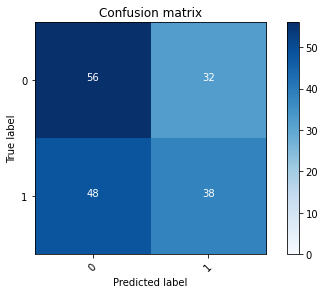

2022-08-20 15:52:31 - [Epoch Train: 85] loss: 0.0227, auc: 0.9998, acc: 0.9938, time: 49.00 s            
2022-08-20 15:52:31 - [Epoch Valid: 85] loss: 3.2517, auc: 0.5218, acc: 0.5578, time: 13.00 s


 85%|██████████████████████████████████      | 85/100 [1:31:01<15:53, 63.59s/it]

2022-08-20 15:52:31 - EPOCH: 86
2022-08-20 15:52:32 - Train Step 10/969, train_loss: 0.0153
2022-08-20 15:52:33 - Train Step 20/969, train_loss: 0.0090
2022-08-20 15:52:33 - Train Step 30/969, train_loss: 0.0164
2022-08-20 15:52:34 - Train Step 40/969, train_loss: 0.0124
2022-08-20 15:52:34 - Train Step 50/969, train_loss: 0.0190
2022-08-20 15:52:35 - Train Step 60/969, train_loss: 0.0174
2022-08-20 15:52:35 - Train Step 70/969, train_loss: 0.0149
2022-08-20 15:52:36 - Train Step 80/969, train_loss: 0.0163
2022-08-20 15:52:36 - Train Step 90/969, train_loss: 0.0154
2022-08-20 15:52:37 - Train Step 100/969, train_loss: 0.0328
2022-08-20 15:52:37 - Train Step 110/969, train_loss: 0.0307
2022-08-20 15:52:38 - Train Step 120/969, train_loss: 0.0299
2022-08-20 15:52:38 - Train Step 130/969, train_loss: 0.0285
2022-08-20 15:52:39 - Train Step 140/969, train_loss: 0.0270
2022-08-20 15:52:39 - Train Step 150/969, train_loss: 0.0346
2022-08-20 15:52:40 - Train Step 160/969, train_loss: 0.0324
2

2022-08-20 15:53:31 - Valid Step 190/251, valid_loss: 2.9511
2022-08-20 15:53:32 - Valid Step 195/251, valid_loss: 3.0501
2022-08-20 15:53:32 - Valid Step 200/251, valid_loss: 3.0313
2022-08-20 15:53:32 - Valid Step 205/251, valid_loss: 2.9793
2022-08-20 15:53:33 - Valid Step 210/251, valid_loss: 3.1079
2022-08-20 15:53:33 - Valid Step 215/251, valid_loss: 3.1636
2022-08-20 15:53:33 - Valid Step 220/251, valid_loss: 3.1476
2022-08-20 15:53:33 - Valid Step 225/251, valid_loss: 3.1475
2022-08-20 15:53:34 - Valid Step 230/251, valid_loss: 3.1929
2022-08-20 15:53:34 - Valid Step 235/251, valid_loss: 3.1414
2022-08-20 15:53:34 - Valid Step 240/251, valid_loss: 3.1890
2022-08-20 15:53:34 - Valid Step 245/251, valid_loss: 3.1673
2022-08-20 15:53:35 - Valid Step 250/251, valid_loss: 3.1761
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
38      00012                1           0
168     00021                0         

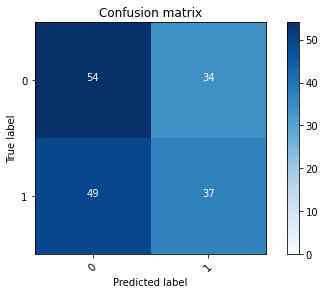

2022-08-20 15:53:35 - [Epoch Train: 86] loss: 0.0311, auc: 0.9995, acc: 0.9897, time: 49.00 s            
2022-08-20 15:53:35 - [Epoch Valid: 86] loss: 3.1635, auc: 0.5250, acc: 0.5378, time: 13.00 s


 86%|██████████████████████████████████▍     | 86/100 [1:32:04<14:49, 63.54s/it]

2022-08-20 15:53:35 - EPOCH: 87
2022-08-20 15:53:36 - Train Step 10/969, train_loss: 0.0093
2022-08-20 15:53:36 - Train Step 20/969, train_loss: 0.0089
2022-08-20 15:53:37 - Train Step 30/969, train_loss: 0.0071
2022-08-20 15:53:37 - Train Step 40/969, train_loss: 0.0054
2022-08-20 15:53:38 - Train Step 50/969, train_loss: 0.0086
2022-08-20 15:53:38 - Train Step 60/969, train_loss: 0.0074
2022-08-20 15:53:39 - Train Step 70/969, train_loss: 0.0065
2022-08-20 15:53:39 - Train Step 80/969, train_loss: 0.0095
2022-08-20 15:53:40 - Train Step 90/969, train_loss: 0.0087
2022-08-20 15:53:40 - Train Step 100/969, train_loss: 0.0087
2022-08-20 15:53:41 - Train Step 110/969, train_loss: 0.0083
2022-08-20 15:53:41 - Train Step 120/969, train_loss: 0.0077
2022-08-20 15:53:42 - Train Step 130/969, train_loss: 0.0120
2022-08-20 15:53:42 - Train Step 140/969, train_loss: 0.0112
2022-08-20 15:53:43 - Train Step 150/969, train_loss: 0.0186
2022-08-20 15:53:43 - Train Step 160/969, train_loss: 0.0180
2

2022-08-20 15:54:35 - Valid Step 190/251, valid_loss: 3.3233
2022-08-20 15:54:35 - Valid Step 195/251, valid_loss: 3.2719
2022-08-20 15:54:36 - Valid Step 200/251, valid_loss: 3.1949
2022-08-20 15:54:36 - Valid Step 205/251, valid_loss: 3.1617
2022-08-20 15:54:36 - Valid Step 210/251, valid_loss: 3.0865
2022-08-20 15:54:37 - Valid Step 215/251, valid_loss: 3.1550
2022-08-20 15:54:37 - Valid Step 220/251, valid_loss: 3.1489
2022-08-20 15:54:37 - Valid Step 225/251, valid_loss: 3.0948
2022-08-20 15:54:37 - Valid Step 230/251, valid_loss: 3.0445
2022-08-20 15:54:38 - Valid Step 235/251, valid_loss: 3.0454
2022-08-20 15:54:38 - Valid Step 240/251, valid_loss: 3.0532
2022-08-20 15:54:38 - Valid Step 245/251, valid_loss: 3.0104
2022-08-20 15:54:38 - Valid Step 250/251, valid_loss: 3.1419
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
132     00012                1           0
137     00021                0         

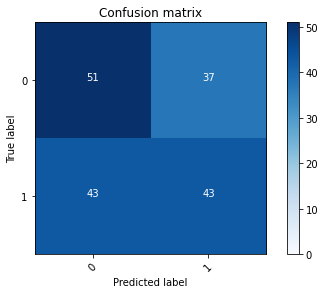

2022-08-20 15:54:39 - [Epoch Train: 87] loss: 0.0250, auc: 0.9995, acc: 0.9907, time: 50.00 s            
2022-08-20 15:54:39 - [Epoch Valid: 87] loss: 3.1295, auc: 0.5092, acc: 0.5657, time: 13.00 s


 87%|██████████████████████████████████▊     | 87/100 [1:33:08<13:46, 63.59s/it]

2022-08-20 15:54:39 - EPOCH: 88
2022-08-20 15:54:39 - Train Step 10/969, train_loss: 0.0725
2022-08-20 15:54:40 - Train Step 20/969, train_loss: 0.0372
2022-08-20 15:54:40 - Train Step 30/969, train_loss: 0.0270
2022-08-20 15:54:41 - Train Step 40/969, train_loss: 0.0211
2022-08-20 15:54:41 - Train Step 50/969, train_loss: 0.0366
2022-08-20 15:54:42 - Train Step 60/969, train_loss: 0.0311
2022-08-20 15:54:42 - Train Step 70/969, train_loss: 0.0269
2022-08-20 15:54:43 - Train Step 80/969, train_loss: 0.0243
2022-08-20 15:54:43 - Train Step 90/969, train_loss: 0.0218
2022-08-20 15:54:44 - Train Step 100/969, train_loss: 0.0288
2022-08-20 15:54:44 - Train Step 110/969, train_loss: 0.0277
2022-08-20 15:54:45 - Train Step 120/969, train_loss: 0.0266
2022-08-20 15:54:45 - Train Step 130/969, train_loss: 0.0261
2022-08-20 15:54:46 - Train Step 140/969, train_loss: 0.0249
2022-08-20 15:54:46 - Train Step 150/969, train_loss: 0.0236
2022-08-20 15:54:47 - Train Step 160/969, train_loss: 0.0221
2

2022-08-20 15:55:39 - Valid Step 190/251, valid_loss: 3.7455
2022-08-20 15:55:39 - Valid Step 195/251, valid_loss: 3.6497
2022-08-20 15:55:39 - Valid Step 200/251, valid_loss: 3.6514
2022-08-20 15:55:40 - Valid Step 205/251, valid_loss: 3.6150
2022-08-20 15:55:40 - Valid Step 210/251, valid_loss: 3.6584
2022-08-20 15:55:40 - Valid Step 215/251, valid_loss: 3.6272
2022-08-20 15:55:40 - Valid Step 220/251, valid_loss: 3.6066
2022-08-20 15:55:41 - Valid Step 225/251, valid_loss: 3.7462
2022-08-20 15:55:41 - Valid Step 230/251, valid_loss: 3.7336
2022-08-20 15:55:41 - Valid Step 235/251, valid_loss: 3.7572
2022-08-20 15:55:41 - Valid Step 240/251, valid_loss: 3.6893
2022-08-20 15:55:42 - Valid Step 245/251, valid_loss: 3.7341
2022-08-20 15:55:42 - Valid Step 250/251, valid_loss: 3.7371
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
133     00012                1           0
74      00021                0         

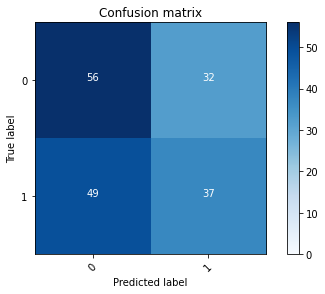

2022-08-20 15:55:42 - [Epoch Train: 88] loss: 0.0190, auc: 0.9998, acc: 0.9928, time: 50.00 s            
2022-08-20 15:55:42 - [Epoch Valid: 88] loss: 3.7240, auc: 0.5163, acc: 0.5458, time: 13.00 s


 88%|███████████████████████████████████▏    | 88/100 [1:34:12<12:42, 63.57s/it]

2022-08-20 15:55:42 - EPOCH: 89
2022-08-20 15:55:43 - Train Step 10/969, train_loss: 0.0145
2022-08-20 15:55:43 - Train Step 20/969, train_loss: 0.0110
2022-08-20 15:55:44 - Train Step 30/969, train_loss: 0.0200
2022-08-20 15:55:44 - Train Step 40/969, train_loss: 0.0151
2022-08-20 15:55:45 - Train Step 50/969, train_loss: 0.0188
2022-08-20 15:55:46 - Train Step 60/969, train_loss: 0.0165
2022-08-20 15:55:46 - Train Step 70/969, train_loss: 0.0141
2022-08-20 15:55:47 - Train Step 80/969, train_loss: 0.0125
2022-08-20 15:55:47 - Train Step 90/969, train_loss: 0.0111
2022-08-20 15:55:48 - Train Step 100/969, train_loss: 0.0234
2022-08-20 15:55:48 - Train Step 110/969, train_loss: 0.0325
2022-08-20 15:55:49 - Train Step 120/969, train_loss: 0.0313
2022-08-20 15:55:49 - Train Step 130/969, train_loss: 0.0304
2022-08-20 15:55:50 - Train Step 140/969, train_loss: 0.0295
2022-08-20 15:55:50 - Train Step 150/969, train_loss: 0.0302
2022-08-20 15:55:51 - Train Step 160/969, train_loss: 0.0286
2

2022-08-20 15:56:43 - Valid Step 190/251, valid_loss: 3.8435
2022-08-20 15:56:43 - Valid Step 195/251, valid_loss: 3.8270
2022-08-20 15:56:43 - Valid Step 200/251, valid_loss: 3.8470
2022-08-20 15:56:43 - Valid Step 205/251, valid_loss: 3.8354
2022-08-20 15:56:44 - Valid Step 210/251, valid_loss: 3.8975
2022-08-20 15:56:44 - Valid Step 215/251, valid_loss: 3.9891
2022-08-20 15:56:44 - Valid Step 220/251, valid_loss: 3.9656
2022-08-20 15:56:44 - Valid Step 225/251, valid_loss: 3.9802
2022-08-20 15:56:45 - Valid Step 230/251, valid_loss: 4.0226
2022-08-20 15:56:45 - Valid Step 235/251, valid_loss: 3.9626
2022-08-20 15:56:45 - Valid Step 240/251, valid_loss: 4.0765
2022-08-20 15:56:45 - Valid Step 245/251, valid_loss: 4.0529
2022-08-20 15:56:46 - Valid Step 250/251, valid_loss: 3.9918
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
8       00012                1           0
39      00021                0         

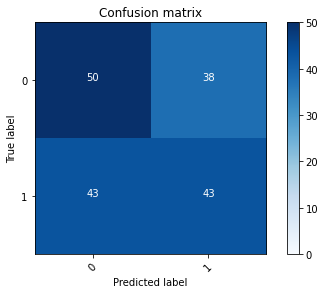

2022-08-20 15:56:46 - [Epoch Train: 89] loss: 0.0181, auc: 0.9999, acc: 0.9959, time: 50.00 s            
2022-08-20 15:56:46 - [Epoch Valid: 89] loss: 3.9954, auc: 0.5193, acc: 0.5578, time: 13.00 s


 89%|███████████████████████████████████▌    | 89/100 [1:35:15<11:40, 63.67s/it]

2022-08-20 15:56:46 - EPOCH: 90
2022-08-20 15:56:47 - Train Step 10/969, train_loss: 0.0028
2022-08-20 15:56:47 - Train Step 20/969, train_loss: 0.0024
2022-08-20 15:56:48 - Train Step 30/969, train_loss: 0.0218
2022-08-20 15:56:48 - Train Step 40/969, train_loss: 0.0196
2022-08-20 15:56:49 - Train Step 50/969, train_loss: 0.0158
2022-08-20 15:56:49 - Train Step 60/969, train_loss: 0.0134
2022-08-20 15:56:50 - Train Step 70/969, train_loss: 0.0131
2022-08-20 15:56:50 - Train Step 80/969, train_loss: 0.0121
2022-08-20 15:56:51 - Train Step 90/969, train_loss: 0.0122
2022-08-20 15:56:51 - Train Step 100/969, train_loss: 0.0115
2022-08-20 15:56:52 - Train Step 110/969, train_loss: 0.0104
2022-08-20 15:56:52 - Train Step 120/969, train_loss: 0.0135
2022-08-20 15:56:53 - Train Step 130/969, train_loss: 0.0151
2022-08-20 15:56:53 - Train Step 140/969, train_loss: 0.0141
2022-08-20 15:56:54 - Train Step 150/969, train_loss: 0.0211
2022-08-20 15:56:54 - Train Step 160/969, train_loss: 0.0263
2

2022-08-20 15:57:46 - Valid Step 190/251, valid_loss: 3.6730
2022-08-20 15:57:46 - Valid Step 195/251, valid_loss: 3.8177
2022-08-20 15:57:46 - Valid Step 200/251, valid_loss: 3.7540
2022-08-20 15:57:46 - Valid Step 205/251, valid_loss: 3.6681
2022-08-20 15:57:47 - Valid Step 210/251, valid_loss: 3.5950
2022-08-20 15:57:47 - Valid Step 215/251, valid_loss: 3.5646
2022-08-20 15:57:47 - Valid Step 220/251, valid_loss: 3.6601
2022-08-20 15:57:48 - Valid Step 225/251, valid_loss: 3.6883
2022-08-20 15:57:48 - Valid Step 230/251, valid_loss: 3.6264
2022-08-20 15:57:48 - Valid Step 235/251, valid_loss: 3.5506
2022-08-20 15:57:48 - Valid Step 240/251, valid_loss: 3.5741
2022-08-20 15:57:49 - Valid Step 245/251, valid_loss: 3.5431
2022-08-20 15:57:49 - Valid Step 250/251, valid_loss: 3.4753
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
87      00012                1           0
154     00021                0         

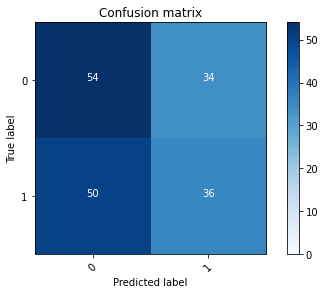

2022-08-20 15:57:49 - [Epoch Train: 90] loss: 0.0326, auc: 0.9995, acc: 0.9866, time: 49.00 s            
2022-08-20 15:57:49 - [Epoch Valid: 90] loss: 3.4614, auc: 0.5217, acc: 0.5299, time: 13.00 s


 90%|████████████████████████████████████    | 90/100 [1:36:18<10:34, 63.49s/it]

2022-08-20 15:57:49 - EPOCH: 91
2022-08-20 15:57:50 - Train Step 10/969, train_loss: 0.0100
2022-08-20 15:57:50 - Train Step 20/969, train_loss: 0.0064
2022-08-20 15:57:51 - Train Step 30/969, train_loss: 0.0044
2022-08-20 15:57:51 - Train Step 40/969, train_loss: 0.0565
2022-08-20 15:57:52 - Train Step 50/969, train_loss: 0.0453
2022-08-20 15:57:52 - Train Step 60/969, train_loss: 0.0383
2022-08-20 15:57:53 - Train Step 70/969, train_loss: 0.0331
2022-08-20 15:57:53 - Train Step 80/969, train_loss: 0.0305
2022-08-20 15:57:54 - Train Step 90/969, train_loss: 0.0275
2022-08-20 15:57:54 - Train Step 100/969, train_loss: 0.0248
2022-08-20 15:57:55 - Train Step 110/969, train_loss: 0.0227
2022-08-20 15:57:55 - Train Step 120/969, train_loss: 0.0274
2022-08-20 15:57:56 - Train Step 130/969, train_loss: 0.0262
2022-08-20 15:57:57 - Train Step 140/969, train_loss: 0.0248
2022-08-20 15:57:57 - Train Step 150/969, train_loss: 0.0232
2022-08-20 15:57:58 - Train Step 160/969, train_loss: 0.0234
2

2022-08-20 15:58:49 - Valid Step 190/251, valid_loss: 3.5021
2022-08-20 15:58:50 - Valid Step 195/251, valid_loss: 3.5241
2022-08-20 15:58:50 - Valid Step 200/251, valid_loss: 3.4649
2022-08-20 15:58:50 - Valid Step 205/251, valid_loss: 3.3947
2022-08-20 15:58:50 - Valid Step 210/251, valid_loss: 3.4174
2022-08-20 15:58:51 - Valid Step 215/251, valid_loss: 3.4371
2022-08-20 15:58:51 - Valid Step 220/251, valid_loss: 3.4280
2022-08-20 15:58:51 - Valid Step 225/251, valid_loss: 3.4411
2022-08-20 15:58:51 - Valid Step 230/251, valid_loss: 3.4320
2022-08-20 15:58:52 - Valid Step 235/251, valid_loss: 3.5714
2022-08-20 15:58:52 - Valid Step 240/251, valid_loss: 3.5461
2022-08-20 15:58:52 - Valid Step 245/251, valid_loss: 3.5726
2022-08-20 15:58:52 - Valid Step 250/251, valid_loss: 3.6152
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
112     00012                1           0
85      00021                0         

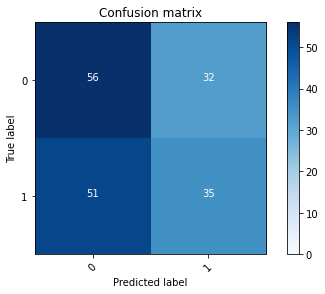

2022-08-20 15:58:53 - [Epoch Train: 91] loss: 0.0201, auc: 0.9998, acc: 0.9959, time: 50.00 s            
2022-08-20 15:58:53 - [Epoch Valid: 91] loss: 3.6243, auc: 0.5163, acc: 0.5299, time: 13.00 s


 91%|████████████████████████████████████▍   | 91/100 [1:37:22<09:31, 63.52s/it]

2022-08-20 15:58:53 - EPOCH: 92
2022-08-20 15:58:53 - Train Step 10/969, train_loss: 0.0975
2022-08-20 15:58:54 - Train Step 20/969, train_loss: 0.0590
2022-08-20 15:58:54 - Train Step 30/969, train_loss: 0.0398
2022-08-20 15:58:55 - Train Step 40/969, train_loss: 0.0306
2022-08-20 15:58:55 - Train Step 50/969, train_loss: 0.0247
2022-08-20 15:58:56 - Train Step 60/969, train_loss: 0.0214
2022-08-20 15:58:56 - Train Step 70/969, train_loss: 0.0212
2022-08-20 15:58:57 - Train Step 80/969, train_loss: 0.0197
2022-08-20 15:58:57 - Train Step 90/969, train_loss: 0.0190
2022-08-20 15:58:58 - Train Step 100/969, train_loss: 0.0178
2022-08-20 15:58:58 - Train Step 110/969, train_loss: 0.0395
2022-08-20 15:58:59 - Train Step 120/969, train_loss: 0.0365
2022-08-20 15:58:59 - Train Step 130/969, train_loss: 0.0342
2022-08-20 15:59:00 - Train Step 140/969, train_loss: 0.0340
2022-08-20 15:59:00 - Train Step 150/969, train_loss: 0.0320
2022-08-20 15:59:01 - Train Step 160/969, train_loss: 0.0301
2

2022-08-20 15:59:53 - Valid Step 190/251, valid_loss: 3.7194
2022-08-20 15:59:53 - Valid Step 195/251, valid_loss: 3.6269
2022-08-20 15:59:54 - Valid Step 200/251, valid_loss: 3.5775
2022-08-20 15:59:54 - Valid Step 205/251, valid_loss: 3.5629
2022-08-20 15:59:54 - Valid Step 210/251, valid_loss: 3.4883
2022-08-20 15:59:54 - Valid Step 215/251, valid_loss: 3.5446
2022-08-20 15:59:55 - Valid Step 220/251, valid_loss: 3.5053
2022-08-20 15:59:55 - Valid Step 225/251, valid_loss: 3.5713
2022-08-20 15:59:55 - Valid Step 230/251, valid_loss: 3.6340
2022-08-20 15:59:55 - Valid Step 235/251, valid_loss: 3.5869
2022-08-20 15:59:56 - Valid Step 240/251, valid_loss: 3.6471
2022-08-20 15:59:56 - Valid Step 245/251, valid_loss: 3.6292
2022-08-20 15:59:56 - Valid Step 250/251, valid_loss: 3.5791
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
39      00012                1           0
7       00021                0         

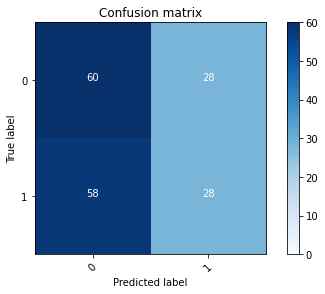

2022-08-20 15:59:56 - [Epoch Train: 92] loss: 0.0245, auc: 0.9995, acc: 0.9917, time: 50.00 s            
2022-08-20 15:59:56 - [Epoch Valid: 92] loss: 3.5685, auc: 0.5196, acc: 0.5060, time: 13.00 s


 92%|████████████████████████████████████▊   | 92/100 [1:38:26<08:28, 63.57s/it]

2022-08-20 15:59:56 - EPOCH: 93
2022-08-20 15:59:57 - Train Step 10/969, train_loss: 0.0076
2022-08-20 15:59:58 - Train Step 20/969, train_loss: 0.0444
2022-08-20 15:59:58 - Train Step 30/969, train_loss: 0.0315
2022-08-20 15:59:59 - Train Step 40/969, train_loss: 0.0421
2022-08-20 15:59:59 - Train Step 50/969, train_loss: 0.0341
2022-08-20 16:00:00 - Train Step 60/969, train_loss: 0.0284
2022-08-20 16:00:00 - Train Step 70/969, train_loss: 0.0245
2022-08-20 16:00:01 - Train Step 80/969, train_loss: 0.0216
2022-08-20 16:00:01 - Train Step 90/969, train_loss: 0.0193
2022-08-20 16:00:02 - Train Step 100/969, train_loss: 0.0310
2022-08-20 16:00:02 - Train Step 110/969, train_loss: 0.0298
2022-08-20 16:00:03 - Train Step 120/969, train_loss: 0.0274
2022-08-20 16:00:03 - Train Step 130/969, train_loss: 0.0253
2022-08-20 16:00:04 - Train Step 140/969, train_loss: 0.0237
2022-08-20 16:00:04 - Train Step 150/969, train_loss: 0.0221
2022-08-20 16:00:05 - Train Step 160/969, train_loss: 0.0216
2

2022-08-20 16:00:56 - Valid Step 190/251, valid_loss: 4.1543
2022-08-20 16:00:57 - Valid Step 195/251, valid_loss: 4.1800
2022-08-20 16:00:57 - Valid Step 200/251, valid_loss: 4.0792
2022-08-20 16:00:57 - Valid Step 205/251, valid_loss: 4.0159
2022-08-20 16:00:57 - Valid Step 210/251, valid_loss: 4.0383
2022-08-20 16:00:58 - Valid Step 215/251, valid_loss: 3.9660
2022-08-20 16:00:58 - Valid Step 220/251, valid_loss: 3.9571
2022-08-20 16:00:58 - Valid Step 225/251, valid_loss: 3.8973
2022-08-20 16:00:58 - Valid Step 230/251, valid_loss: 4.1584
2022-08-20 16:00:59 - Valid Step 235/251, valid_loss: 4.2935
2022-08-20 16:00:59 - Valid Step 240/251, valid_loss: 4.2642
2022-08-20 16:00:59 - Valid Step 245/251, valid_loss: 4.2184
2022-08-20 16:01:00 - Valid Step 250/251, valid_loss: 4.2067
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
20      00012                1           0
173     00021                0         

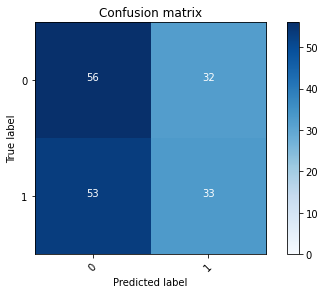

2022-08-20 16:01:00 - [Epoch Train: 93] loss: 0.0214, auc: 0.9996, acc: 0.9917, time: 49.00 s            
2022-08-20 16:01:00 - [Epoch Valid: 93] loss: 4.2204, auc: 0.5244, acc: 0.5179, time: 13.00 s


 93%|█████████████████████████████████████▏  | 93/100 [1:39:29<07:24, 63.52s/it]

2022-08-20 16:01:00 - EPOCH: 94
2022-08-20 16:01:00 - Train Step 10/969, train_loss: 0.0004
2022-08-20 16:01:01 - Train Step 20/969, train_loss: 0.0074
2022-08-20 16:01:01 - Train Step 30/969, train_loss: 0.0195
2022-08-20 16:01:02 - Train Step 40/969, train_loss: 0.0201
2022-08-20 16:01:03 - Train Step 50/969, train_loss: 0.0291
2022-08-20 16:01:03 - Train Step 60/969, train_loss: 0.0245
2022-08-20 16:01:04 - Train Step 70/969, train_loss: 0.0255
2022-08-20 16:01:04 - Train Step 80/969, train_loss: 0.0301
2022-08-20 16:01:05 - Train Step 90/969, train_loss: 0.0369
2022-08-20 16:01:05 - Train Step 100/969, train_loss: 0.0335
2022-08-20 16:01:06 - Train Step 110/969, train_loss: 0.0311
2022-08-20 16:01:06 - Train Step 120/969, train_loss: 0.0286
2022-08-20 16:01:07 - Train Step 130/969, train_loss: 0.0267
2022-08-20 16:01:07 - Train Step 140/969, train_loss: 0.0249
2022-08-20 16:01:08 - Train Step 150/969, train_loss: 0.0234
2022-08-20 16:01:08 - Train Step 160/969, train_loss: 0.0231
2

2022-08-20 16:02:00 - Valid Step 190/251, valid_loss: 3.6061
2022-08-20 16:02:00 - Valid Step 195/251, valid_loss: 3.6643
2022-08-20 16:02:00 - Valid Step 200/251, valid_loss: 3.7509
2022-08-20 16:02:01 - Valid Step 205/251, valid_loss: 3.7356
2022-08-20 16:02:01 - Valid Step 210/251, valid_loss: 3.6893
2022-08-20 16:02:01 - Valid Step 215/251, valid_loss: 3.6532
2022-08-20 16:02:01 - Valid Step 220/251, valid_loss: 3.6402
2022-08-20 16:02:02 - Valid Step 225/251, valid_loss: 3.5766
2022-08-20 16:02:02 - Valid Step 230/251, valid_loss: 3.5428
2022-08-20 16:02:02 - Valid Step 235/251, valid_loss: 3.5368
2022-08-20 16:02:02 - Valid Step 240/251, valid_loss: 3.4830
2022-08-20 16:02:03 - Valid Step 245/251, valid_loss: 3.5466
2022-08-20 16:02:03 - Valid Step 250/251, valid_loss: 3.5545
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
92      00012                1           0
107     00021                0         

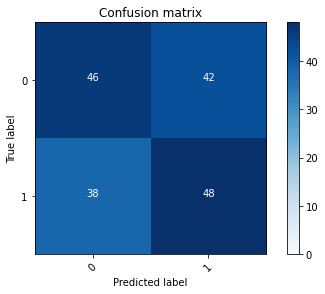

2022-08-20 16:02:03 - [Epoch Train: 94] loss: 0.0182, auc: 0.9999, acc: 0.9959, time: 50.00 s            
2022-08-20 16:02:03 - [Epoch Valid: 94] loss: 3.5479, auc: 0.5151, acc: 0.5578, time: 13.00 s


 94%|█████████████████████████████████████▌  | 94/100 [1:40:33<06:20, 63.48s/it]

2022-08-20 16:02:03 - EPOCH: 95
2022-08-20 16:02:04 - Train Step 10/969, train_loss: 0.0053
2022-08-20 16:02:04 - Train Step 20/969, train_loss: 0.0036
2022-08-20 16:02:05 - Train Step 30/969, train_loss: 0.0025
2022-08-20 16:02:05 - Train Step 40/969, train_loss: 0.0019
2022-08-20 16:02:06 - Train Step 50/969, train_loss: 0.0278
2022-08-20 16:02:06 - Train Step 60/969, train_loss: 0.0244
2022-08-20 16:02:07 - Train Step 70/969, train_loss: 0.0209
2022-08-20 16:02:07 - Train Step 80/969, train_loss: 0.0190
2022-08-20 16:02:08 - Train Step 90/969, train_loss: 0.0196
2022-08-20 16:02:08 - Train Step 100/969, train_loss: 0.0249
2022-08-20 16:02:09 - Train Step 110/969, train_loss: 0.0227
2022-08-20 16:02:09 - Train Step 120/969, train_loss: 0.0211
2022-08-20 16:02:10 - Train Step 130/969, train_loss: 0.0195
2022-08-20 16:02:10 - Train Step 140/969, train_loss: 0.0185
2022-08-20 16:02:11 - Train Step 150/969, train_loss: 0.0172
2022-08-20 16:02:11 - Train Step 160/969, train_loss: 0.0162
2

2022-08-20 16:03:04 - Valid Step 190/251, valid_loss: 3.6711
2022-08-20 16:03:04 - Valid Step 195/251, valid_loss: 3.6518
2022-08-20 16:03:04 - Valid Step 200/251, valid_loss: 3.8893
2022-08-20 16:03:04 - Valid Step 205/251, valid_loss: 3.8500
2022-08-20 16:03:05 - Valid Step 210/251, valid_loss: 3.8750
2022-08-20 16:03:05 - Valid Step 215/251, valid_loss: 3.8469
2022-08-20 16:03:05 - Valid Step 220/251, valid_loss: 3.9294
2022-08-20 16:03:05 - Valid Step 225/251, valid_loss: 4.0405
2022-08-20 16:03:06 - Valid Step 230/251, valid_loss: 4.1146
2022-08-20 16:03:06 - Valid Step 235/251, valid_loss: 4.1506
2022-08-20 16:03:06 - Valid Step 240/251, valid_loss: 4.0906
2022-08-20 16:03:07 - Valid Step 245/251, valid_loss: 4.0644
2022-08-20 16:03:07 - Valid Step 250/251, valid_loss: 4.1289
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
152     00012                1           0
36      00021                0         

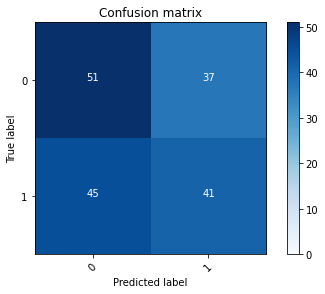

2022-08-20 16:03:07 - [Epoch Train: 95] loss: 0.0116, auc: 1.0000, acc: 0.9979, time: 50.00 s            
2022-08-20 16:03:07 - [Epoch Valid: 95] loss: 4.1461, auc: 0.5145, acc: 0.5578, time: 13.00 s


 95%|██████████████████████████████████████  | 95/100 [1:41:36<05:18, 63.61s/it]

2022-08-20 16:03:07 - EPOCH: 96
2022-08-20 16:03:08 - Train Step 10/969, train_loss: 0.0002
2022-08-20 16:03:08 - Train Step 20/969, train_loss: 0.0007
2022-08-20 16:03:09 - Train Step 30/969, train_loss: 0.0028
2022-08-20 16:03:09 - Train Step 40/969, train_loss: 0.0054
2022-08-20 16:03:10 - Train Step 50/969, train_loss: 0.0048
2022-08-20 16:03:10 - Train Step 60/969, train_loss: 0.0060
2022-08-20 16:03:11 - Train Step 70/969, train_loss: 0.0150
2022-08-20 16:03:11 - Train Step 80/969, train_loss: 0.0131
2022-08-20 16:03:12 - Train Step 90/969, train_loss: 0.0117
2022-08-20 16:03:12 - Train Step 100/969, train_loss: 0.0106
2022-08-20 16:03:13 - Train Step 110/969, train_loss: 0.0206
2022-08-20 16:03:13 - Train Step 120/969, train_loss: 0.0189
2022-08-20 16:03:14 - Train Step 130/969, train_loss: 0.0175
2022-08-20 16:03:14 - Train Step 140/969, train_loss: 0.0163
2022-08-20 16:03:15 - Train Step 150/969, train_loss: 0.0153
2022-08-20 16:03:15 - Train Step 160/969, train_loss: 0.0144
2

2022-08-20 16:04:07 - Valid Step 190/251, valid_loss: 4.4012
2022-08-20 16:04:07 - Valid Step 195/251, valid_loss: 4.3056
2022-08-20 16:04:08 - Valid Step 200/251, valid_loss: 4.2441
2022-08-20 16:04:08 - Valid Step 205/251, valid_loss: 4.1587
2022-08-20 16:04:08 - Valid Step 210/251, valid_loss: 4.1644
2022-08-20 16:04:08 - Valid Step 215/251, valid_loss: 4.1080
2022-08-20 16:04:09 - Valid Step 220/251, valid_loss: 4.0238
2022-08-20 16:04:09 - Valid Step 225/251, valid_loss: 4.2040
2022-08-20 16:04:09 - Valid Step 230/251, valid_loss: 4.1483
2022-08-20 16:04:09 - Valid Step 235/251, valid_loss: 4.0726
2022-08-20 16:04:10 - Valid Step 240/251, valid_loss: 4.0845
2022-08-20 16:04:10 - Valid Step 245/251, valid_loss: 4.0056
2022-08-20 16:04:10 - Valid Step 250/251, valid_loss: 4.0159
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
18      00012                1           0
103     00021                0         

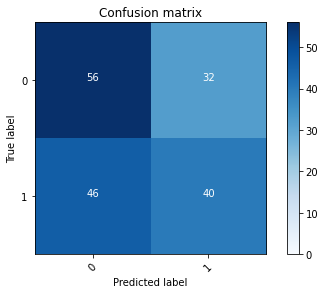

2022-08-20 16:04:10 - [Epoch Train: 96] loss: 0.0158, auc: 0.9999, acc: 0.9938, time: 49.00 s            
2022-08-20 16:04:10 - [Epoch Valid: 96] loss: 4.0008, auc: 0.5295, acc: 0.5618, time: 13.00 s


 96%|██████████████████████████████████████▍ | 96/100 [1:42:40<04:14, 63.50s/it]

2022-08-20 16:04:10 - EPOCH: 97
2022-08-20 16:04:11 - Train Step 10/969, train_loss: 0.0001
2022-08-20 16:04:11 - Train Step 20/969, train_loss: 0.0312
2022-08-20 16:04:12 - Train Step 30/969, train_loss: 0.0208
2022-08-20 16:04:13 - Train Step 40/969, train_loss: 0.0338
2022-08-20 16:04:13 - Train Step 50/969, train_loss: 0.0311
2022-08-20 16:04:14 - Train Step 60/969, train_loss: 0.0263
2022-08-20 16:04:14 - Train Step 70/969, train_loss: 0.0230
2022-08-20 16:04:15 - Train Step 80/969, train_loss: 0.0206
2022-08-20 16:04:15 - Train Step 90/969, train_loss: 0.0202
2022-08-20 16:04:16 - Train Step 100/969, train_loss: 0.0189
2022-08-20 16:04:16 - Train Step 110/969, train_loss: 0.0185
2022-08-20 16:04:17 - Train Step 120/969, train_loss: 0.0171
2022-08-20 16:04:17 - Train Step 130/969, train_loss: 0.0162
2022-08-20 16:04:18 - Train Step 140/969, train_loss: 0.0150
2022-08-20 16:04:18 - Train Step 150/969, train_loss: 0.0141
2022-08-20 16:04:19 - Train Step 160/969, train_loss: 0.0184
2

2022-08-20 16:05:11 - Valid Step 190/251, valid_loss: 3.9774
2022-08-20 16:05:11 - Valid Step 195/251, valid_loss: 3.9190
2022-08-20 16:05:11 - Valid Step 200/251, valid_loss: 3.8724
2022-08-20 16:05:11 - Valid Step 205/251, valid_loss: 3.8451
2022-08-20 16:05:12 - Valid Step 210/251, valid_loss: 3.8360
2022-08-20 16:05:12 - Valid Step 215/251, valid_loss: 3.8115
2022-08-20 16:05:12 - Valid Step 220/251, valid_loss: 3.7650
2022-08-20 16:05:12 - Valid Step 225/251, valid_loss: 3.7627
2022-08-20 16:05:13 - Valid Step 230/251, valid_loss: 3.9197
2022-08-20 16:05:13 - Valid Step 235/251, valid_loss: 3.8606
2022-08-20 16:05:13 - Valid Step 240/251, valid_loss: 3.8759
2022-08-20 16:05:14 - Valid Step 245/251, valid_loss: 3.8870
2022-08-20 16:05:14 - Valid Step 250/251, valid_loss: 3.8134
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
29      00012                1           0
120     00021                0         

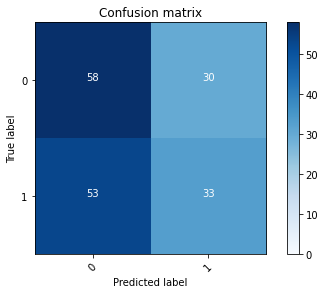

2022-08-20 16:05:14 - [Epoch Train: 97] loss: 0.0177, auc: 1.0000, acc: 0.9959, time: 50.00 s            
2022-08-20 16:05:14 - [Epoch Valid: 97] loss: 3.8022, auc: 0.5265, acc: 0.5219, time: 13.00 s


 97%|██████████████████████████████████████▊ | 97/100 [1:43:43<03:10, 63.57s/it]

2022-08-20 16:05:14 - EPOCH: 98
2022-08-20 16:05:15 - Train Step 10/969, train_loss: 0.1053
2022-08-20 16:05:15 - Train Step 20/969, train_loss: 0.0530
2022-08-20 16:05:16 - Train Step 30/969, train_loss: 0.0353
2022-08-20 16:05:16 - Train Step 40/969, train_loss: 0.0310
2022-08-20 16:05:17 - Train Step 50/969, train_loss: 0.0457
2022-08-20 16:05:17 - Train Step 60/969, train_loss: 0.0400
2022-08-20 16:05:18 - Train Step 70/969, train_loss: 0.0351
2022-08-20 16:05:18 - Train Step 80/969, train_loss: 0.0314
2022-08-20 16:05:19 - Train Step 90/969, train_loss: 0.0283
2022-08-20 16:05:19 - Train Step 100/969, train_loss: 0.0276
2022-08-20 16:05:20 - Train Step 110/969, train_loss: 0.0254
2022-08-20 16:05:20 - Train Step 120/969, train_loss: 0.0234
2022-08-20 16:05:21 - Train Step 130/969, train_loss: 0.0217
2022-08-20 16:05:21 - Train Step 140/969, train_loss: 0.0202
2022-08-20 16:05:22 - Train Step 150/969, train_loss: 0.0188
2022-08-20 16:05:22 - Train Step 160/969, train_loss: 0.0177
2

2022-08-20 16:06:14 - Valid Step 190/251, valid_loss: 3.3455
2022-08-20 16:06:14 - Valid Step 195/251, valid_loss: 3.3834
2022-08-20 16:06:14 - Valid Step 200/251, valid_loss: 3.4634
2022-08-20 16:06:15 - Valid Step 205/251, valid_loss: 3.4700
2022-08-20 16:06:15 - Valid Step 210/251, valid_loss: 3.4402
2022-08-20 16:06:15 - Valid Step 215/251, valid_loss: 3.4600
2022-08-20 16:06:15 - Valid Step 220/251, valid_loss: 3.3900
2022-08-20 16:06:16 - Valid Step 225/251, valid_loss: 3.3962
2022-08-20 16:06:16 - Valid Step 230/251, valid_loss: 3.3449
2022-08-20 16:06:16 - Valid Step 235/251, valid_loss: 3.3942
2022-08-20 16:06:16 - Valid Step 240/251, valid_loss: 3.3951
2022-08-20 16:06:17 - Valid Step 245/251, valid_loss: 3.3834
2022-08-20 16:06:17 - Valid Step 250/251, valid_loss: 3.5211
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
126     00012                1           0
117     00021                0         

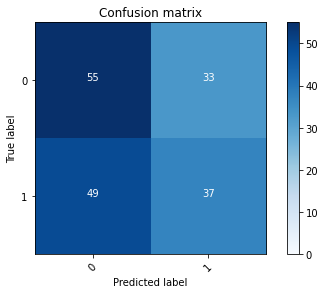

2022-08-20 16:06:17 - [Epoch Train: 98] loss: 0.0160, auc: 0.9998, acc: 0.9948, time: 50.00 s            
2022-08-20 16:06:17 - [Epoch Valid: 98] loss: 3.5091, auc: 0.5207, acc: 0.5418, time: 13.00 s


 98%|███████████████████████████████████████▏| 98/100 [1:44:47<02:06, 63.44s/it]

2022-08-20 16:06:17 - EPOCH: 99
2022-08-20 16:06:18 - Train Step 10/969, train_loss: 0.0207
2022-08-20 16:06:18 - Train Step 20/969, train_loss: 0.0268
2022-08-20 16:06:19 - Train Step 30/969, train_loss: 0.0180
2022-08-20 16:06:19 - Train Step 40/969, train_loss: 0.0147
2022-08-20 16:06:20 - Train Step 50/969, train_loss: 0.0118
2022-08-20 16:06:20 - Train Step 60/969, train_loss: 0.0206
2022-08-20 16:06:21 - Train Step 70/969, train_loss: 0.0177
2022-08-20 16:06:21 - Train Step 80/969, train_loss: 0.0163
2022-08-20 16:06:22 - Train Step 90/969, train_loss: 0.0145
2022-08-20 16:06:22 - Train Step 100/969, train_loss: 0.0132
2022-08-20 16:06:23 - Train Step 110/969, train_loss: 0.0122
2022-08-20 16:06:23 - Train Step 120/969, train_loss: 0.0113
2022-08-20 16:06:24 - Train Step 130/969, train_loss: 0.0105
2022-08-20 16:06:24 - Train Step 140/969, train_loss: 0.0147
2022-08-20 16:06:25 - Train Step 150/969, train_loss: 0.0138
2022-08-20 16:06:25 - Train Step 160/969, train_loss: 0.0129
2

2022-08-20 16:07:17 - Valid Step 190/251, valid_loss: 4.0640
2022-08-20 16:07:18 - Valid Step 195/251, valid_loss: 4.0183
2022-08-20 16:07:18 - Valid Step 200/251, valid_loss: 3.9256
2022-08-20 16:07:18 - Valid Step 205/251, valid_loss: 3.9003
2022-08-20 16:07:18 - Valid Step 210/251, valid_loss: 3.8093
2022-08-20 16:07:19 - Valid Step 215/251, valid_loss: 3.7993
2022-08-20 16:07:19 - Valid Step 220/251, valid_loss: 3.8711
2022-08-20 16:07:19 - Valid Step 225/251, valid_loss: 3.8240
2022-08-20 16:07:19 - Valid Step 230/251, valid_loss: 3.7715
2022-08-20 16:07:20 - Valid Step 235/251, valid_loss: 3.7178
2022-08-20 16:07:20 - Valid Step 240/251, valid_loss: 3.6450
2022-08-20 16:07:20 - Valid Step 245/251, valid_loss: 3.7860
2022-08-20 16:07:20 - Valid Step 250/251, valid_loss: 3.8379
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
129     00012                1           0
150     00021                0         

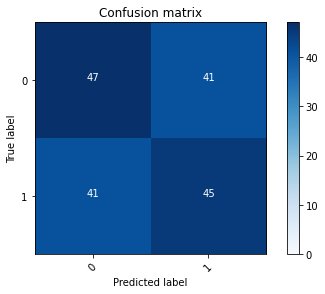

2022-08-20 16:07:21 - [Epoch Train: 99] loss: 0.0274, auc: 0.9996, acc: 0.9907, time: 50.00 s            
2022-08-20 16:07:21 - [Epoch Valid: 99] loss: 3.8243, auc: 0.5277, acc: 0.5498, time: 13.00 s


 99%|███████████████████████████████████████▌| 99/100 [1:45:50<01:03, 63.42s/it]

2022-08-20 16:07:21 - EPOCH: 100
2022-08-20 16:07:21 - Train Step 10/969, train_loss: 0.0007
2022-08-20 16:07:22 - Train Step 20/969, train_loss: 0.0115
2022-08-20 16:07:22 - Train Step 30/969, train_loss: 0.0123
2022-08-20 16:07:23 - Train Step 40/969, train_loss: 0.0092
2022-08-20 16:07:23 - Train Step 50/969, train_loss: 0.0115
2022-08-20 16:07:24 - Train Step 60/969, train_loss: 0.0096
2022-08-20 16:07:24 - Train Step 70/969, train_loss: 0.0085
2022-08-20 16:07:25 - Train Step 80/969, train_loss: 0.0080
2022-08-20 16:07:25 - Train Step 90/969, train_loss: 0.0154
2022-08-20 16:07:26 - Train Step 100/969, train_loss: 0.0150
2022-08-20 16:07:26 - Train Step 110/969, train_loss: 0.0137
2022-08-20 16:07:27 - Train Step 120/969, train_loss: 0.0137
2022-08-20 16:07:27 - Train Step 130/969, train_loss: 0.0127
2022-08-20 16:07:28 - Train Step 140/969, train_loss: 0.0122
2022-08-20 16:07:29 - Train Step 150/969, train_loss: 0.0126
2022-08-20 16:07:29 - Train Step 160/969, train_loss: 0.0118


2022-08-20 16:08:21 - Valid Step 190/251, valid_loss: 3.9333
2022-08-20 16:08:21 - Valid Step 195/251, valid_loss: 3.9825
2022-08-20 16:08:21 - Valid Step 200/251, valid_loss: 3.8845
2022-08-20 16:08:21 - Valid Step 205/251, valid_loss: 3.8118
2022-08-20 16:08:22 - Valid Step 210/251, valid_loss: 3.7400
2022-08-20 16:08:22 - Valid Step 215/251, valid_loss: 3.7421
2022-08-20 16:08:22 - Valid Step 220/251, valid_loss: 3.7395
2022-08-20 16:08:22 - Valid Step 225/251, valid_loss: 3.6711
2022-08-20 16:08:23 - Valid Step 230/251, valid_loss: 3.5945
2022-08-20 16:08:23 - Valid Step 235/251, valid_loss: 3.5781
2022-08-20 16:08:23 - Valid Step 240/251, valid_loss: 3.5698
2022-08-20 16:08:23 - Valid Step 245/251, valid_loss: 3.4970
2022-08-20 16:08:24 - Valid Step 250/251, valid_loss: 3.5078
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
144     00012                1           0
107     00021                0         

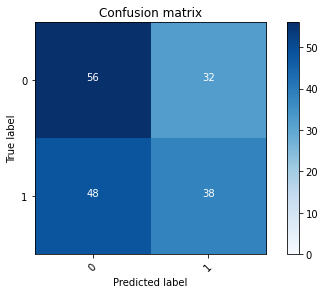

2022-08-20 16:08:24 - [Epoch Train: 100] loss: 0.0166, auc: 0.9999, acc: 0.9969, time: 50.00 s            
2022-08-20 16:08:24 - [Epoch Valid: 100] loss: 3.5016, auc: 0.5241, acc: 0.5538, time: 13.00 s


100%|███████████████████████████████████████| 100/100 [1:46:53<00:00, 64.14s/it]

-- FOLD N:1
Train origin: mn
Type: KLF
2022-08-20 16:08:24 - (M0) Train/Val datasets size: 270
2022-08-20 16:08:24 - (M1) Train/Val datasets size: 303
2022-08-20 16:08:24 - (N0) Train/Val datasets size: 170
2022-08-20 16:08:24 - (N1) Train/Val datasets size: 121
2022-08-20 16:08:24 - Concatenating M0 and N0...
Length of concatenated dataset: 540
2022-08-20 16:08:24 - (MN0) Train/Val datasets size: 540
2022-08-20 16:08:24 - Concatenating M1 and N1...
Length of concatenated dataset: 606
2022-08-20 16:08:24 - (MN1) Train/Val datasets size: 606
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa550164f10>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fa550164550>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa5501776a0>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7fa50e2c6b20>, 'mn_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa50e04c8e0>, 'mn_dataset_1': <utils.da

[([0, 2, 4, 5, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 40, 42, 43, 44, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 73, 74, 75, 76, 77, 79, 84, 85, 86, 88, 90, 91, 93, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 119, 120, 121, 123, 124, 125, 126, 127, 128, 129, 132, 133, 134, 135, 136, 137, 138, 140, 141, 142, 143, 144, 147, 148, 149, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 183, 184, 185, 186, 188, 189, 190, 191, 192, 193, 194, 195, 196, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 210, 212, 213, 214, 215, 216, 219, 220, 222, 223, 224, 225, 226, 228, 229, 231, 232, 234, 236, 237, 238, 239, 241, 243, 244, 245, 246, 247, 248, 249, 250, 251, 253, 256, 257, 258, 259, 260, 261, 262, 264, 265, 266, 268,

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([0, 2, 4, 5, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 40, 42, 43, 44, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 73, 74, 75, 76, 77, 79, 84, 85, 86, 88, 90, 91, 93, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 119, 120, 121, 123, 124, 125, 126, 127, 128, 129, 132, 133, 134, 135, 136, 137, 138, 140, 141, 142, 143, 144, 147, 148, 149, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 183, 184, 185, 186, 188, 189, 190, 191, 192, 193, 194, 195, 196, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 210, 212, 213, 214, 215, 216, 219, 220, 222, 223, 224, 225, 226, 228, 229, 231, 232, 234, 236, 237, 238, 239, 241, 243, 244, 245, 246, 247, 248, 

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa50e2ebe20>, <torch.utils.data.dataloader.DataLoader object at 0x7fa51320d370>, <torch.utils.data.dataloader.DataLoader object at 0x7fa50e310e50>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa57b140dc0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa5120c85e0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa5502ed5b0>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa550485af0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa550485a30>, <torch.utils.data.dataloader.DataLoader object at 0x7fa550485190>]}}
2022-08-20 16:20:40 - Using CUDA...
KLF
{'ext': 'mat', 'dims': 2, 'batch_size': 1, 'mri_types': ['KLF'], 'is_depth_wise': True, 'is_transformed': False, 'output_size': 1, 'is_multistep': True, 'lr': 0.0001, 'is_adam': True, 'momentum': 0.9, 'is_10_fold': False, 'val_total_ratio': 0.2, 'is_internal_dataset': True, 'train_origin'

  0%|                                                   | 0/100 [00:00<?, ?it/s]

2022-08-20 16:20:40 - EPOCH: 1
2022-08-20 16:20:40 - Train Step 10/973, train_loss: 0.6746
2022-08-20 16:20:41 - Train Step 20/973, train_loss: 0.6957
2022-08-20 16:20:41 - Train Step 30/973, train_loss: 0.6872
2022-08-20 16:20:42 - Train Step 40/973, train_loss: 0.6953
2022-08-20 16:20:42 - Train Step 50/973, train_loss: 0.6950
2022-08-20 16:20:43 - Train Step 60/973, train_loss: 0.6981
2022-08-20 16:20:43 - Train Step 70/973, train_loss: 0.6995
2022-08-20 16:20:44 - Train Step 80/973, train_loss: 0.6990
2022-08-20 16:20:44 - Train Step 90/973, train_loss: 0.7009
2022-08-20 16:20:45 - Train Step 100/973, train_loss: 0.7004
2022-08-20 16:20:45 - Train Step 110/973, train_loss: 0.6989
2022-08-20 16:20:46 - Train Step 120/973, train_loss: 0.6988
2022-08-20 16:20:47 - Train Step 130/973, train_loss: 0.7004
2022-08-20 16:20:47 - Train Step 140/973, train_loss: 0.7004
2022-08-20 16:20:48 - Train Step 150/973, train_loss: 0.7003
2022-08-20 16:20:48 - Train Step 160/973, train_loss: 0.7004
20

2022-08-20 16:21:40 - Valid Step 185/257, valid_loss: 0.6938
2022-08-20 16:21:40 - Valid Step 190/257, valid_loss: 0.6941
2022-08-20 16:21:41 - Valid Step 195/257, valid_loss: 0.6939
2022-08-20 16:21:41 - Valid Step 200/257, valid_loss: 0.6936
2022-08-20 16:21:41 - Valid Step 205/257, valid_loss: 0.6934
2022-08-20 16:21:41 - Valid Step 210/257, valid_loss: 0.6935
2022-08-20 16:21:42 - Valid Step 215/257, valid_loss: 0.6931
2022-08-20 16:21:42 - Valid Step 220/257, valid_loss: 0.6933
2022-08-20 16:21:42 - Valid Step 225/257, valid_loss: 0.6938
2022-08-20 16:21:42 - Valid Step 230/257, valid_loss: 0.6941
2022-08-20 16:21:43 - Valid Step 235/257, valid_loss: 0.6943
2022-08-20 16:21:43 - Valid Step 240/257, valid_loss: 0.6942
2022-08-20 16:21:43 - Valid Step 245/257, valid_loss: 0.6941
2022-08-20 16:21:43 - Valid Step 250/257, valid_loss: 0.6940
2022-08-20 16:21:44 - Valid Step 255/257, valid_loss: 0.6937
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

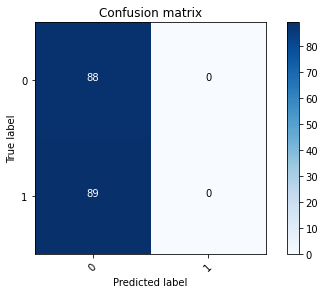

2022-08-20 16:21:44 - [Epoch Train: 1] loss: 0.6950, auc: 0.4651, acc: 0.4985, time: 50.00 s            
2022-08-20 16:21:44 - [Epoch Valid: 1] loss: 0.6937, auc: 0.5655, acc: 0.4942, time: 13.00 s
2022-08-20 16:21:44 - acc improved from 0.0000 to 0.4942. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_16-20-40/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e1-loss0.694-acc0.494-auc0.566.pth'


  1%|▍                                        | 1/100 [01:04<1:46:04, 64.29s/it]

2022-08-20 16:21:44 - EPOCH: 2
2022-08-20 16:21:45 - Train Step 10/973, train_loss: 0.6968
2022-08-20 16:21:45 - Train Step 20/973, train_loss: 0.7018
2022-08-20 16:21:46 - Train Step 30/973, train_loss: 0.6957
2022-08-20 16:21:46 - Train Step 40/973, train_loss: 0.6960
2022-08-20 16:21:47 - Train Step 50/973, train_loss: 0.6936
2022-08-20 16:21:47 - Train Step 60/973, train_loss: 0.6971
2022-08-20 16:21:48 - Train Step 70/973, train_loss: 0.6952
2022-08-20 16:21:48 - Train Step 80/973, train_loss: 0.6949
2022-08-20 16:21:49 - Train Step 90/973, train_loss: 0.6955
2022-08-20 16:21:49 - Train Step 100/973, train_loss: 0.6957
2022-08-20 16:21:50 - Train Step 110/973, train_loss: 0.6953
2022-08-20 16:21:50 - Train Step 120/973, train_loss: 0.6951
2022-08-20 16:21:51 - Train Step 130/973, train_loss: 0.6947
2022-08-20 16:21:52 - Train Step 140/973, train_loss: 0.6946
2022-08-20 16:21:52 - Train Step 150/973, train_loss: 0.6943
2022-08-20 16:21:53 - Train Step 160/973, train_loss: 0.6941
20

2022-08-20 16:22:44 - Valid Step 185/257, valid_loss: 0.6907
2022-08-20 16:22:44 - Valid Step 190/257, valid_loss: 0.6910
2022-08-20 16:22:45 - Valid Step 195/257, valid_loss: 0.6909
2022-08-20 16:22:45 - Valid Step 200/257, valid_loss: 0.6911
2022-08-20 16:22:45 - Valid Step 205/257, valid_loss: 0.6916
2022-08-20 16:22:45 - Valid Step 210/257, valid_loss: 0.6913
2022-08-20 16:22:46 - Valid Step 215/257, valid_loss: 0.6924
2022-08-20 16:22:46 - Valid Step 220/257, valid_loss: 0.6926
2022-08-20 16:22:46 - Valid Step 225/257, valid_loss: 0.6937
2022-08-20 16:22:46 - Valid Step 230/257, valid_loss: 0.6937
2022-08-20 16:22:47 - Valid Step 235/257, valid_loss: 0.6937
2022-08-20 16:22:47 - Valid Step 240/257, valid_loss: 0.6933
2022-08-20 16:22:47 - Valid Step 245/257, valid_loss: 0.6942
2022-08-20 16:22:47 - Valid Step 250/257, valid_loss: 0.6935
2022-08-20 16:22:48 - Valid Step 255/257, valid_loss: 0.6931
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

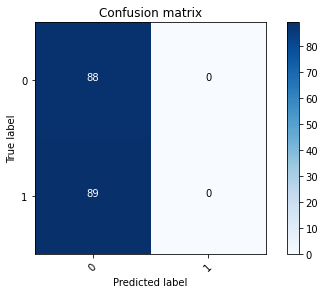

2022-08-20 16:22:48 - [Epoch Train: 2] loss: 0.6911, auc: 0.5635, acc: 0.4985, time: 50.00 s            
2022-08-20 16:22:48 - [Epoch Valid: 2] loss: 0.6933, auc: 0.5509, acc: 0.4942, time: 13.00 s
2022-08-20 16:22:48 - acc improved from 0.4942 to 0.4942. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_16-20-40/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e2-loss0.693-acc0.494-auc0.551.pth'


  2%|▊                                        | 2/100 [02:08<1:44:40, 64.09s/it]

2022-08-20 16:22:48 - EPOCH: 3
2022-08-20 16:22:49 - Train Step 10/973, train_loss: 0.7114
2022-08-20 16:22:49 - Train Step 20/973, train_loss: 0.6941
2022-08-20 16:22:50 - Train Step 30/973, train_loss: 0.6892
2022-08-20 16:22:50 - Train Step 40/973, train_loss: 0.6910
2022-08-20 16:22:51 - Train Step 50/973, train_loss: 0.6909
2022-08-20 16:22:51 - Train Step 60/973, train_loss: 0.6933
2022-08-20 16:22:52 - Train Step 70/973, train_loss: 0.6923
2022-08-20 16:22:52 - Train Step 80/973, train_loss: 0.6920
2022-08-20 16:22:53 - Train Step 90/973, train_loss: 0.6914
2022-08-20 16:22:53 - Train Step 100/973, train_loss: 0.6907
2022-08-20 16:22:54 - Train Step 110/973, train_loss: 0.6906
2022-08-20 16:22:54 - Train Step 120/973, train_loss: 0.6928
2022-08-20 16:22:55 - Train Step 130/973, train_loss: 0.6922
2022-08-20 16:22:55 - Train Step 140/973, train_loss: 0.6915
2022-08-20 16:22:56 - Train Step 150/973, train_loss: 0.6917
2022-08-20 16:22:56 - Train Step 160/973, train_loss: 0.6911
20

2022-08-20 16:23:47 - Valid Step 185/257, valid_loss: 0.6916
2022-08-20 16:23:48 - Valid Step 190/257, valid_loss: 0.6914
2022-08-20 16:23:48 - Valid Step 195/257, valid_loss: 0.6912
2022-08-20 16:23:48 - Valid Step 200/257, valid_loss: 0.6916
2022-08-20 16:23:48 - Valid Step 205/257, valid_loss: 0.6915
2022-08-20 16:23:49 - Valid Step 210/257, valid_loss: 0.6909
2022-08-20 16:23:49 - Valid Step 215/257, valid_loss: 0.6913
2022-08-20 16:23:49 - Valid Step 220/257, valid_loss: 0.6914
2022-08-20 16:23:49 - Valid Step 225/257, valid_loss: 0.6914
2022-08-20 16:23:50 - Valid Step 230/257, valid_loss: 0.6908
2022-08-20 16:23:50 - Valid Step 235/257, valid_loss: 0.6910
2022-08-20 16:23:50 - Valid Step 240/257, valid_loss: 0.6903
2022-08-20 16:23:51 - Valid Step 245/257, valid_loss: 0.6909
2022-08-20 16:23:51 - Valid Step 250/257, valid_loss: 0.6915
2022-08-20 16:23:51 - Valid Step 255/257, valid_loss: 0.6920
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

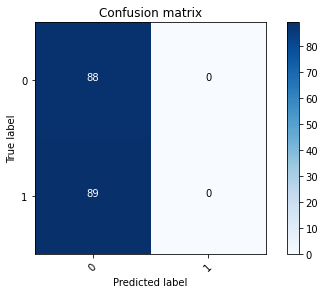

2022-08-20 16:23:51 - [Epoch Train: 3] loss: 0.6868, auc: 0.5738, acc: 0.4974, time: 49.00 s            
2022-08-20 16:23:51 - [Epoch Valid: 3] loss: 0.6927, auc: 0.5474, acc: 0.4942, time: 13.00 s
2022-08-20 16:23:51 - acc improved from 0.4942 to 0.4942. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_16-20-40/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e3-loss0.693-acc0.494-auc0.547.pth'


  3%|█▏                                       | 3/100 [03:11<1:43:04, 63.76s/it]

2022-08-20 16:23:51 - EPOCH: 4
2022-08-20 16:23:52 - Train Step 10/973, train_loss: 0.6661
2022-08-20 16:23:53 - Train Step 20/973, train_loss: 0.6506
2022-08-20 16:23:53 - Train Step 30/973, train_loss: 0.6546
2022-08-20 16:23:54 - Train Step 40/973, train_loss: 0.6585
2022-08-20 16:23:54 - Train Step 50/973, train_loss: 0.6582
2022-08-20 16:23:55 - Train Step 60/973, train_loss: 0.6626
2022-08-20 16:23:55 - Train Step 70/973, train_loss: 0.6630
2022-08-20 16:23:56 - Train Step 80/973, train_loss: 0.6580
2022-08-20 16:23:56 - Train Step 90/973, train_loss: 0.6574
2022-08-20 16:23:57 - Train Step 100/973, train_loss: 0.6621
2022-08-20 16:23:57 - Train Step 110/973, train_loss: 0.6569
2022-08-20 16:23:58 - Train Step 120/973, train_loss: 0.6599
2022-08-20 16:23:58 - Train Step 130/973, train_loss: 0.6615
2022-08-20 16:23:59 - Train Step 140/973, train_loss: 0.6583
2022-08-20 16:23:59 - Train Step 150/973, train_loss: 0.6607
2022-08-20 16:24:00 - Train Step 160/973, train_loss: 0.6673
20

2022-08-20 16:24:51 - Valid Step 185/257, valid_loss: 0.6937
2022-08-20 16:24:51 - Valid Step 190/257, valid_loss: 0.6938
2022-08-20 16:24:52 - Valid Step 195/257, valid_loss: 0.6947
2022-08-20 16:24:52 - Valid Step 200/257, valid_loss: 0.6934
2022-08-20 16:24:52 - Valid Step 205/257, valid_loss: 0.6944
2022-08-20 16:24:53 - Valid Step 210/257, valid_loss: 0.6954
2022-08-20 16:24:53 - Valid Step 215/257, valid_loss: 0.6955
2022-08-20 16:24:53 - Valid Step 220/257, valid_loss: 0.6946
2022-08-20 16:24:53 - Valid Step 225/257, valid_loss: 0.6946
2022-08-20 16:24:54 - Valid Step 230/257, valid_loss: 0.6948
2022-08-20 16:24:54 - Valid Step 235/257, valid_loss: 0.6942
2022-08-20 16:24:54 - Valid Step 240/257, valid_loss: 0.6935
2022-08-20 16:24:54 - Valid Step 245/257, valid_loss: 0.6930
2022-08-20 16:24:55 - Valid Step 250/257, valid_loss: 0.6919
2022-08-20 16:24:55 - Valid Step 255/257, valid_loss: 0.6921
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

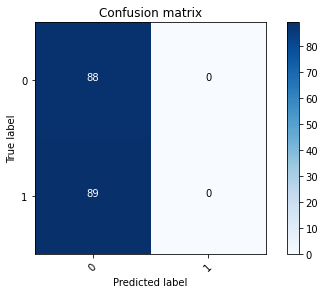

2022-08-20 16:24:55 - [Epoch Train: 4] loss: 0.6801, auc: 0.5902, acc: 0.4995, time: 50.00 s            
2022-08-20 16:24:55 - [Epoch Valid: 4] loss: 0.6927, auc: 0.5437, acc: 0.4942, time: 13.00 s
2022-08-20 16:24:55 - acc improved from 0.4942 to 0.4942. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_16-20-40/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e4-loss0.693-acc0.494-auc0.544.pth'


  4%|█▋                                       | 4/100 [04:15<1:41:57, 63.73s/it]

2022-08-20 16:24:55 - EPOCH: 5
2022-08-20 16:24:56 - Train Step 10/973, train_loss: 0.7020
2022-08-20 16:24:56 - Train Step 20/973, train_loss: 0.6936
2022-08-20 16:24:57 - Train Step 30/973, train_loss: 0.6887
2022-08-20 16:24:57 - Train Step 40/973, train_loss: 0.6851
2022-08-20 16:24:58 - Train Step 50/973, train_loss: 0.6847
2022-08-20 16:24:58 - Train Step 60/973, train_loss: 0.6792
2022-08-20 16:24:59 - Train Step 70/973, train_loss: 0.6846
2022-08-20 16:24:59 - Train Step 80/973, train_loss: 0.6765
2022-08-20 16:25:00 - Train Step 90/973, train_loss: 0.6672
2022-08-20 16:25:00 - Train Step 100/973, train_loss: 0.6625
2022-08-20 16:25:01 - Train Step 110/973, train_loss: 0.6643
2022-08-20 16:25:01 - Train Step 120/973, train_loss: 0.6696
2022-08-20 16:25:02 - Train Step 130/973, train_loss: 0.6695
2022-08-20 16:25:02 - Train Step 140/973, train_loss: 0.6708
2022-08-20 16:25:03 - Train Step 150/973, train_loss: 0.6747
2022-08-20 16:25:03 - Train Step 160/973, train_loss: 0.6758
20

2022-08-20 16:25:55 - Valid Step 185/257, valid_loss: 0.7057
2022-08-20 16:25:55 - Valid Step 190/257, valid_loss: 0.7092
2022-08-20 16:25:55 - Valid Step 195/257, valid_loss: 0.7073
2022-08-20 16:25:55 - Valid Step 200/257, valid_loss: 0.7113
2022-08-20 16:25:56 - Valid Step 205/257, valid_loss: 0.7102
2022-08-20 16:25:56 - Valid Step 210/257, valid_loss: 0.7090
2022-08-20 16:25:56 - Valid Step 215/257, valid_loss: 0.7077
2022-08-20 16:25:56 - Valid Step 220/257, valid_loss: 0.7119
2022-08-20 16:25:57 - Valid Step 225/257, valid_loss: 0.7101
2022-08-20 16:25:57 - Valid Step 230/257, valid_loss: 0.7086
2022-08-20 16:25:57 - Valid Step 235/257, valid_loss: 0.7070
2022-08-20 16:25:57 - Valid Step 240/257, valid_loss: 0.7074
2022-08-20 16:25:58 - Valid Step 245/257, valid_loss: 0.7083
2022-08-20 16:25:58 - Valid Step 250/257, valid_loss: 0.7086
2022-08-20 16:25:58 - Valid Step 255/257, valid_loss: 0.7082
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

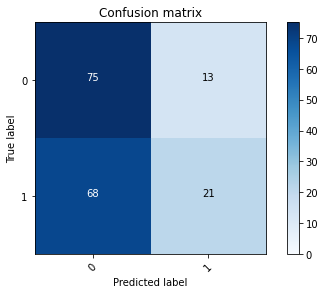

2022-08-20 16:25:58 - [Epoch Train: 5] loss: 0.6656, auc: 0.6448, acc: 0.5190, time: 49.00 s            
2022-08-20 16:25:58 - [Epoch Valid: 5] loss: 0.7079, auc: 0.5352, acc: 0.5214, time: 13.00 s
2022-08-20 16:25:58 - acc improved from 0.4942 to 0.5214. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_16-20-40/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e5-loss0.708-acc0.521-auc0.535.pth'


  5%|██                                       | 5/100 [05:18<1:40:42, 63.61s/it]

2022-08-20 16:25:58 - EPOCH: 6
2022-08-20 16:25:59 - Train Step 10/973, train_loss: 0.6714
2022-08-20 16:26:00 - Train Step 20/973, train_loss: 0.6464
2022-08-20 16:26:00 - Train Step 30/973, train_loss: 0.6568
2022-08-20 16:26:01 - Train Step 40/973, train_loss: 0.6424
2022-08-20 16:26:01 - Train Step 50/973, train_loss: 0.6438
2022-08-20 16:26:02 - Train Step 60/973, train_loss: 0.6475
2022-08-20 16:26:02 - Train Step 70/973, train_loss: 0.6386
2022-08-20 16:26:03 - Train Step 80/973, train_loss: 0.6358
2022-08-20 16:26:03 - Train Step 90/973, train_loss: 0.6439
2022-08-20 16:26:04 - Train Step 100/973, train_loss: 0.6440
2022-08-20 16:26:04 - Train Step 110/973, train_loss: 0.6406
2022-08-20 16:26:05 - Train Step 120/973, train_loss: 0.6337
2022-08-20 16:26:05 - Train Step 130/973, train_loss: 0.6389
2022-08-20 16:26:06 - Train Step 140/973, train_loss: 0.6411
2022-08-20 16:26:06 - Train Step 150/973, train_loss: 0.6355
2022-08-20 16:26:07 - Train Step 160/973, train_loss: 0.6334
20

2022-08-20 16:26:58 - Valid Step 185/257, valid_loss: 0.7187
2022-08-20 16:26:59 - Valid Step 190/257, valid_loss: 0.7183
2022-08-20 16:26:59 - Valid Step 195/257, valid_loss: 0.7152
2022-08-20 16:26:59 - Valid Step 200/257, valid_loss: 0.7148
2022-08-20 16:26:59 - Valid Step 205/257, valid_loss: 0.7133
2022-08-20 16:27:00 - Valid Step 210/257, valid_loss: 0.7096
2022-08-20 16:27:00 - Valid Step 215/257, valid_loss: 0.7108
2022-08-20 16:27:00 - Valid Step 220/257, valid_loss: 0.7089
2022-08-20 16:27:00 - Valid Step 225/257, valid_loss: 0.7064
2022-08-20 16:27:01 - Valid Step 230/257, valid_loss: 0.7057
2022-08-20 16:27:01 - Valid Step 235/257, valid_loss: 0.7067
2022-08-20 16:27:01 - Valid Step 240/257, valid_loss: 0.7044
2022-08-20 16:27:01 - Valid Step 245/257, valid_loss: 0.7057
2022-08-20 16:27:02 - Valid Step 250/257, valid_loss: 0.7063
2022-08-20 16:27:02 - Valid Step 255/257, valid_loss: 0.7070
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

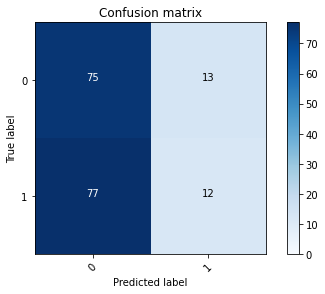

2022-08-20 16:27:02 - [Epoch Train: 6] loss: 0.6455, auc: 0.6735, acc: 0.5663, time: 50.00 s            
2022-08-20 16:27:02 - [Epoch Valid: 6] loss: 0.7062, auc: 0.5188, acc: 0.4864, time: 13.00 s


  6%|██▍                                      | 6/100 [06:22<1:39:45, 63.68s/it]

2022-08-20 16:27:02 - EPOCH: 7
2022-08-20 16:27:03 - Train Step 10/973, train_loss: 0.5097
2022-08-20 16:27:03 - Train Step 20/973, train_loss: 0.5862
2022-08-20 16:27:04 - Train Step 30/973, train_loss: 0.6045
2022-08-20 16:27:04 - Train Step 40/973, train_loss: 0.6076
2022-08-20 16:27:05 - Train Step 50/973, train_loss: 0.5984
2022-08-20 16:27:05 - Train Step 60/973, train_loss: 0.6050
2022-08-20 16:27:06 - Train Step 70/973, train_loss: 0.5955
2022-08-20 16:27:06 - Train Step 80/973, train_loss: 0.5988
2022-08-20 16:27:07 - Train Step 90/973, train_loss: 0.6083
2022-08-20 16:27:08 - Train Step 100/973, train_loss: 0.6022
2022-08-20 16:27:08 - Train Step 110/973, train_loss: 0.6069
2022-08-20 16:27:09 - Train Step 120/973, train_loss: 0.6071
2022-08-20 16:27:09 - Train Step 130/973, train_loss: 0.6125
2022-08-20 16:27:10 - Train Step 140/973, train_loss: 0.6210
2022-08-20 16:27:10 - Train Step 150/973, train_loss: 0.6197
2022-08-20 16:27:11 - Train Step 160/973, train_loss: 0.6279
20

2022-08-20 16:28:02 - Valid Step 185/257, valid_loss: 0.7137
2022-08-20 16:28:02 - Valid Step 190/257, valid_loss: 0.7206
2022-08-20 16:28:03 - Valid Step 195/257, valid_loss: 0.7244
2022-08-20 16:28:03 - Valid Step 200/257, valid_loss: 0.7238
2022-08-20 16:28:03 - Valid Step 205/257, valid_loss: 0.7241
2022-08-20 16:28:04 - Valid Step 210/257, valid_loss: 0.7230
2022-08-20 16:28:04 - Valid Step 215/257, valid_loss: 0.7256
2022-08-20 16:28:04 - Valid Step 220/257, valid_loss: 0.7264
2022-08-20 16:28:04 - Valid Step 225/257, valid_loss: 0.7228
2022-08-20 16:28:05 - Valid Step 230/257, valid_loss: 0.7200
2022-08-20 16:28:05 - Valid Step 235/257, valid_loss: 0.7154
2022-08-20 16:28:05 - Valid Step 240/257, valid_loss: 0.7143
2022-08-20 16:28:05 - Valid Step 245/257, valid_loss: 0.7125
2022-08-20 16:28:06 - Valid Step 250/257, valid_loss: 0.7165
2022-08-20 16:28:06 - Valid Step 255/257, valid_loss: 0.7174
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

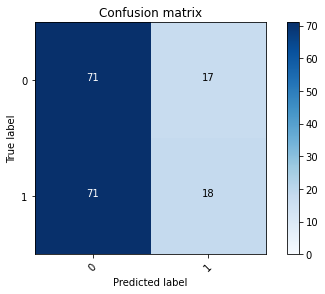

2022-08-20 16:28:06 - [Epoch Train: 7] loss: 0.6316, auc: 0.6761, acc: 0.5910, time: 50.00 s            
2022-08-20 16:28:06 - [Epoch Valid: 7] loss: 0.7168, auc: 0.5212, acc: 0.4981, time: 13.00 s


  7%|██▊                                      | 7/100 [07:26<1:38:50, 63.77s/it]

2022-08-20 16:28:06 - EPOCH: 8
2022-08-20 16:28:07 - Train Step 10/973, train_loss: 0.5699
2022-08-20 16:28:07 - Train Step 20/973, train_loss: 0.5814
2022-08-20 16:28:08 - Train Step 30/973, train_loss: 0.5759
2022-08-20 16:28:08 - Train Step 40/973, train_loss: 0.6040
2022-08-20 16:28:09 - Train Step 50/973, train_loss: 0.6236
2022-08-20 16:28:10 - Train Step 60/973, train_loss: 0.6096
2022-08-20 16:28:10 - Train Step 70/973, train_loss: 0.6041
2022-08-20 16:28:11 - Train Step 80/973, train_loss: 0.6088
2022-08-20 16:28:11 - Train Step 90/973, train_loss: 0.6196
2022-08-20 16:28:12 - Train Step 100/973, train_loss: 0.6122
2022-08-20 16:28:12 - Train Step 110/973, train_loss: 0.6177
2022-08-20 16:28:13 - Train Step 120/973, train_loss: 0.6190
2022-08-20 16:28:13 - Train Step 130/973, train_loss: 0.6239
2022-08-20 16:28:14 - Train Step 140/973, train_loss: 0.6221
2022-08-20 16:28:14 - Train Step 150/973, train_loss: 0.6254
2022-08-20 16:28:15 - Train Step 160/973, train_loss: 0.6225
20

2022-08-20 16:29:06 - Valid Step 185/257, valid_loss: 0.7104
2022-08-20 16:29:07 - Valid Step 190/257, valid_loss: 0.7121
2022-08-20 16:29:07 - Valid Step 195/257, valid_loss: 0.7132
2022-08-20 16:29:07 - Valid Step 200/257, valid_loss: 0.7210
2022-08-20 16:29:08 - Valid Step 205/257, valid_loss: 0.7297
2022-08-20 16:29:08 - Valid Step 210/257, valid_loss: 0.7301
2022-08-20 16:29:08 - Valid Step 215/257, valid_loss: 0.7294
2022-08-20 16:29:08 - Valid Step 220/257, valid_loss: 0.7305
2022-08-20 16:29:09 - Valid Step 225/257, valid_loss: 0.7326
2022-08-20 16:29:09 - Valid Step 230/257, valid_loss: 0.7271
2022-08-20 16:29:09 - Valid Step 235/257, valid_loss: 0.7303
2022-08-20 16:29:09 - Valid Step 240/257, valid_loss: 0.7315
2022-08-20 16:29:10 - Valid Step 245/257, valid_loss: 0.7304
2022-08-20 16:29:10 - Valid Step 250/257, valid_loss: 0.7294
2022-08-20 16:29:10 - Valid Step 255/257, valid_loss: 0.7330
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

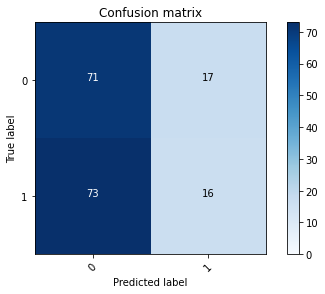

2022-08-20 16:29:10 - [Epoch Train: 8] loss: 0.6126, auc: 0.7040, acc: 0.6146, time: 50.00 s            
2022-08-20 16:29:10 - [Epoch Valid: 8] loss: 0.7324, auc: 0.4907, acc: 0.4864, time: 13.00 s


  8%|███▎                                     | 8/100 [08:30<1:37:57, 63.89s/it]

2022-08-20 16:29:10 - EPOCH: 9
2022-08-20 16:29:11 - Train Step 10/973, train_loss: 0.5358
2022-08-20 16:29:12 - Train Step 20/973, train_loss: 0.5678
2022-08-20 16:29:12 - Train Step 30/973, train_loss: 0.5824
2022-08-20 16:29:13 - Train Step 40/973, train_loss: 0.5853
2022-08-20 16:29:13 - Train Step 50/973, train_loss: 0.6169
2022-08-20 16:29:14 - Train Step 60/973, train_loss: 0.6103
2022-08-20 16:29:14 - Train Step 70/973, train_loss: 0.5988
2022-08-20 16:29:15 - Train Step 80/973, train_loss: 0.5917
2022-08-20 16:29:15 - Train Step 90/973, train_loss: 0.5854
2022-08-20 16:29:16 - Train Step 100/973, train_loss: 0.5940
2022-08-20 16:29:16 - Train Step 110/973, train_loss: 0.5824
2022-08-20 16:29:17 - Train Step 120/973, train_loss: 0.5923
2022-08-20 16:29:17 - Train Step 130/973, train_loss: 0.5925
2022-08-20 16:29:18 - Train Step 140/973, train_loss: 0.5946
2022-08-20 16:29:18 - Train Step 150/973, train_loss: 0.5890
2022-08-20 16:29:19 - Train Step 160/973, train_loss: 0.5829
20

2022-08-20 16:30:10 - Valid Step 185/257, valid_loss: 0.7592
2022-08-20 16:30:11 - Valid Step 190/257, valid_loss: 0.7601
2022-08-20 16:30:11 - Valid Step 195/257, valid_loss: 0.7564
2022-08-20 16:30:11 - Valid Step 200/257, valid_loss: 0.7624
2022-08-20 16:30:11 - Valid Step 205/257, valid_loss: 0.7620
2022-08-20 16:30:12 - Valid Step 210/257, valid_loss: 0.7555
2022-08-20 16:30:12 - Valid Step 215/257, valid_loss: 0.7536
2022-08-20 16:30:12 - Valid Step 220/257, valid_loss: 0.7490
2022-08-20 16:30:12 - Valid Step 225/257, valid_loss: 0.7524
2022-08-20 16:30:13 - Valid Step 230/257, valid_loss: 0.7479
2022-08-20 16:30:13 - Valid Step 235/257, valid_loss: 0.7477
2022-08-20 16:30:13 - Valid Step 240/257, valid_loss: 0.7472
2022-08-20 16:30:14 - Valid Step 245/257, valid_loss: 0.7417
2022-08-20 16:30:14 - Valid Step 250/257, valid_loss: 0.7397
2022-08-20 16:30:14 - Valid Step 255/257, valid_loss: 0.7371
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

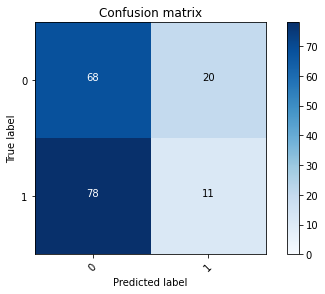

2022-08-20 16:30:14 - [Epoch Train: 9] loss: 0.5932, auc: 0.7244, acc: 0.6526, time: 50.00 s            
2022-08-20 16:30:14 - [Epoch Valid: 9] loss: 0.7404, auc: 0.4789, acc: 0.4553, time: 13.00 s


  9%|███▋                                     | 9/100 [09:34<1:36:56, 63.92s/it]

2022-08-20 16:30:14 - EPOCH: 10
2022-08-20 16:30:15 - Train Step 10/973, train_loss: 0.6581
2022-08-20 16:30:15 - Train Step 20/973, train_loss: 0.6186
2022-08-20 16:30:16 - Train Step 30/973, train_loss: 0.6061
2022-08-20 16:30:16 - Train Step 40/973, train_loss: 0.5768
2022-08-20 16:30:17 - Train Step 50/973, train_loss: 0.5806
2022-08-20 16:30:17 - Train Step 60/973, train_loss: 0.5660
2022-08-20 16:30:18 - Train Step 70/973, train_loss: 0.5631
2022-08-20 16:30:18 - Train Step 80/973, train_loss: 0.5721
2022-08-20 16:30:19 - Train Step 90/973, train_loss: 0.5809
2022-08-20 16:30:19 - Train Step 100/973, train_loss: 0.5754
2022-08-20 16:30:20 - Train Step 110/973, train_loss: 0.5781
2022-08-20 16:30:20 - Train Step 120/973, train_loss: 0.5716
2022-08-20 16:30:21 - Train Step 130/973, train_loss: 0.5851
2022-08-20 16:30:22 - Train Step 140/973, train_loss: 0.5792
2022-08-20 16:30:22 - Train Step 150/973, train_loss: 0.5836
2022-08-20 16:30:23 - Train Step 160/973, train_loss: 0.5845
2

2022-08-20 16:31:14 - Valid Step 185/257, valid_loss: 0.7699
2022-08-20 16:31:14 - Valid Step 190/257, valid_loss: 0.7664
2022-08-20 16:31:14 - Valid Step 195/257, valid_loss: 0.7590
2022-08-20 16:31:15 - Valid Step 200/257, valid_loss: 0.7592
2022-08-20 16:31:15 - Valid Step 205/257, valid_loss: 0.7519
2022-08-20 16:31:15 - Valid Step 210/257, valid_loss: 0.7552
2022-08-20 16:31:15 - Valid Step 215/257, valid_loss: 0.7588
2022-08-20 16:31:16 - Valid Step 220/257, valid_loss: 0.7641
2022-08-20 16:31:16 - Valid Step 225/257, valid_loss: 0.7598
2022-08-20 16:31:16 - Valid Step 230/257, valid_loss: 0.7571
2022-08-20 16:31:16 - Valid Step 235/257, valid_loss: 0.7582
2022-08-20 16:31:17 - Valid Step 240/257, valid_loss: 0.7658
2022-08-20 16:31:17 - Valid Step 245/257, valid_loss: 0.7626
2022-08-20 16:31:17 - Valid Step 250/257, valid_loss: 0.7650
2022-08-20 16:31:17 - Valid Step 255/257, valid_loss: 0.7639
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

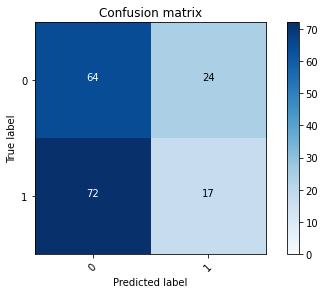

2022-08-20 16:31:18 - [Epoch Train: 10] loss: 0.5731, auc: 0.7532, acc: 0.6773, time: 49.00 s            
2022-08-20 16:31:18 - [Epoch Valid: 10] loss: 0.7662, auc: 0.4701, acc: 0.4708, time: 13.00 s


 10%|████                                    | 10/100 [10:37<1:35:37, 63.76s/it]

2022-08-20 16:31:18 - EPOCH: 11
2022-08-20 16:31:18 - Train Step 10/973, train_loss: 0.5550
2022-08-20 16:31:19 - Train Step 20/973, train_loss: 0.6047
2022-08-20 16:31:19 - Train Step 30/973, train_loss: 0.5804
2022-08-20 16:31:20 - Train Step 40/973, train_loss: 0.5732
2022-08-20 16:31:21 - Train Step 50/973, train_loss: 0.5746
2022-08-20 16:31:21 - Train Step 60/973, train_loss: 0.5513
2022-08-20 16:31:22 - Train Step 70/973, train_loss: 0.5584
2022-08-20 16:31:22 - Train Step 80/973, train_loss: 0.5747
2022-08-20 16:31:23 - Train Step 90/973, train_loss: 0.5768
2022-08-20 16:31:23 - Train Step 100/973, train_loss: 0.5576
2022-08-20 16:31:24 - Train Step 110/973, train_loss: 0.5499
2022-08-20 16:31:24 - Train Step 120/973, train_loss: 0.5557
2022-08-20 16:31:25 - Train Step 130/973, train_loss: 0.5443
2022-08-20 16:31:25 - Train Step 140/973, train_loss: 0.5377
2022-08-20 16:31:26 - Train Step 150/973, train_loss: 0.5509
2022-08-20 16:31:26 - Train Step 160/973, train_loss: 0.5437
2

2022-08-20 16:32:19 - Valid Step 185/257, valid_loss: 0.7972
2022-08-20 16:32:19 - Valid Step 190/257, valid_loss: 0.8004
2022-08-20 16:32:20 - Valid Step 195/257, valid_loss: 0.8037
2022-08-20 16:32:20 - Valid Step 200/257, valid_loss: 0.7996
2022-08-20 16:32:20 - Valid Step 205/257, valid_loss: 0.7899
2022-08-20 16:32:20 - Valid Step 210/257, valid_loss: 0.7871
2022-08-20 16:32:21 - Valid Step 215/257, valid_loss: 0.7986
2022-08-20 16:32:21 - Valid Step 220/257, valid_loss: 0.7973
2022-08-20 16:32:21 - Valid Step 225/257, valid_loss: 0.7953
2022-08-20 16:32:21 - Valid Step 230/257, valid_loss: 0.7859
2022-08-20 16:32:22 - Valid Step 235/257, valid_loss: 0.7804
2022-08-20 16:32:22 - Valid Step 240/257, valid_loss: 0.7788
2022-08-20 16:32:22 - Valid Step 245/257, valid_loss: 0.7847
2022-08-20 16:32:22 - Valid Step 250/257, valid_loss: 0.7880
2022-08-20 16:32:23 - Valid Step 255/257, valid_loss: 0.7893
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

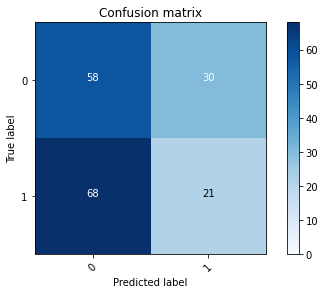

2022-08-20 16:32:23 - [Epoch Train: 11] loss: 0.5496, auc: 0.7729, acc: 0.7009, time: 51.00 s            
2022-08-20 16:32:23 - [Epoch Valid: 11] loss: 0.7869, auc: 0.4774, acc: 0.4514, time: 13.00 s


 11%|████▍                                   | 11/100 [11:43<1:35:11, 64.17s/it]

2022-08-20 16:32:23 - EPOCH: 12
2022-08-20 16:32:23 - Train Step 10/973, train_loss: 0.6730
2022-08-20 16:32:24 - Train Step 20/973, train_loss: 0.6133
2022-08-20 16:32:24 - Train Step 30/973, train_loss: 0.5773
2022-08-20 16:32:25 - Train Step 40/973, train_loss: 0.5448
2022-08-20 16:32:26 - Train Step 50/973, train_loss: 0.5592
2022-08-20 16:32:26 - Train Step 60/973, train_loss: 0.5797
2022-08-20 16:32:27 - Train Step 70/973, train_loss: 0.5527
2022-08-20 16:32:27 - Train Step 80/973, train_loss: 0.5377
2022-08-20 16:32:28 - Train Step 90/973, train_loss: 0.5253
2022-08-20 16:32:28 - Train Step 100/973, train_loss: 0.5305
2022-08-20 16:32:29 - Train Step 110/973, train_loss: 0.5278
2022-08-20 16:32:29 - Train Step 120/973, train_loss: 0.5200
2022-08-20 16:32:29 - Train Step 130/973, train_loss: 0.5259
2022-08-20 16:32:30 - Train Step 140/973, train_loss: 0.5344
2022-08-20 16:32:30 - Train Step 150/973, train_loss: 0.5360
2022-08-20 16:32:31 - Train Step 160/973, train_loss: 0.5307
2

2022-08-20 16:33:23 - Valid Step 185/257, valid_loss: 0.7615
2022-08-20 16:33:23 - Valid Step 190/257, valid_loss: 0.7684
2022-08-20 16:33:23 - Valid Step 195/257, valid_loss: 0.7796
2022-08-20 16:33:24 - Valid Step 200/257, valid_loss: 0.7829
2022-08-20 16:33:24 - Valid Step 205/257, valid_loss: 0.7775
2022-08-20 16:33:24 - Valid Step 210/257, valid_loss: 0.7783
2022-08-20 16:33:24 - Valid Step 215/257, valid_loss: 0.7722
2022-08-20 16:33:25 - Valid Step 220/257, valid_loss: 0.7748
2022-08-20 16:33:25 - Valid Step 225/257, valid_loss: 0.7738
2022-08-20 16:33:25 - Valid Step 230/257, valid_loss: 0.7812
2022-08-20 16:33:25 - Valid Step 235/257, valid_loss: 0.7827
2022-08-20 16:33:26 - Valid Step 240/257, valid_loss: 0.7808
2022-08-20 16:33:26 - Valid Step 245/257, valid_loss: 0.7784
2022-08-20 16:33:26 - Valid Step 250/257, valid_loss: 0.7899
2022-08-20 16:33:27 - Valid Step 255/257, valid_loss: 0.7846
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

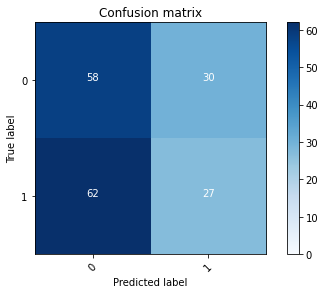

2022-08-20 16:33:27 - [Epoch Train: 12] loss: 0.5348, auc: 0.7893, acc: 0.7071, time: 50.00 s            
2022-08-20 16:33:27 - [Epoch Valid: 12] loss: 0.7888, auc: 0.4805, acc: 0.4825, time: 13.00 s


 12%|████▊                                   | 12/100 [12:47<1:34:01, 64.10s/it]

2022-08-20 16:33:27 - EPOCH: 13
2022-08-20 16:33:27 - Train Step 10/973, train_loss: 0.5937
2022-08-20 16:33:28 - Train Step 20/973, train_loss: 0.6023
2022-08-20 16:33:29 - Train Step 30/973, train_loss: 0.5970
2022-08-20 16:33:29 - Train Step 40/973, train_loss: 0.5773
2022-08-20 16:33:30 - Train Step 50/973, train_loss: 0.5452
2022-08-20 16:33:30 - Train Step 60/973, train_loss: 0.5373
2022-08-20 16:33:31 - Train Step 70/973, train_loss: 0.5063
2022-08-20 16:33:31 - Train Step 80/973, train_loss: 0.5270
2022-08-20 16:33:32 - Train Step 90/973, train_loss: 0.5122
2022-08-20 16:33:32 - Train Step 100/973, train_loss: 0.5207
2022-08-20 16:33:33 - Train Step 110/973, train_loss: 0.5363
2022-08-20 16:33:33 - Train Step 120/973, train_loss: 0.5518
2022-08-20 16:33:34 - Train Step 130/973, train_loss: 0.5408
2022-08-20 16:33:34 - Train Step 140/973, train_loss: 0.5422
2022-08-20 16:33:35 - Train Step 150/973, train_loss: 0.5402
2022-08-20 16:33:36 - Train Step 160/973, train_loss: 0.5438
2

2022-08-20 16:34:27 - Valid Step 185/257, valid_loss: 0.8013
2022-08-20 16:34:28 - Valid Step 190/257, valid_loss: 0.8105
2022-08-20 16:34:28 - Valid Step 195/257, valid_loss: 0.8134
2022-08-20 16:34:28 - Valid Step 200/257, valid_loss: 0.8129
2022-08-20 16:34:28 - Valid Step 205/257, valid_loss: 0.8092
2022-08-20 16:34:29 - Valid Step 210/257, valid_loss: 0.8035
2022-08-20 16:34:29 - Valid Step 215/257, valid_loss: 0.8009
2022-08-20 16:34:29 - Valid Step 220/257, valid_loss: 0.7988
2022-08-20 16:34:29 - Valid Step 225/257, valid_loss: 0.8028
2022-08-20 16:34:30 - Valid Step 230/257, valid_loss: 0.8110
2022-08-20 16:34:30 - Valid Step 235/257, valid_loss: 0.8041
2022-08-20 16:34:30 - Valid Step 240/257, valid_loss: 0.8026
2022-08-20 16:34:30 - Valid Step 245/257, valid_loss: 0.8059
2022-08-20 16:34:31 - Valid Step 250/257, valid_loss: 0.8040
2022-08-20 16:34:31 - Valid Step 255/257, valid_loss: 0.8030
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

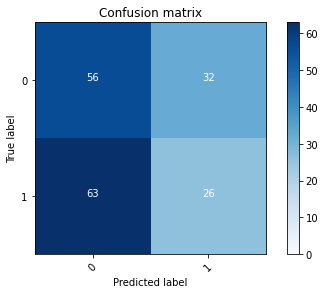

2022-08-20 16:34:31 - [Epoch Train: 13] loss: 0.5253, auc: 0.7958, acc: 0.7266, time: 50.00 s            
2022-08-20 16:34:31 - [Epoch Valid: 13] loss: 0.8025, auc: 0.4839, acc: 0.4553, time: 13.00 s


 13%|█████▏                                  | 13/100 [13:51<1:33:02, 64.17s/it]

2022-08-20 16:34:31 - EPOCH: 14
2022-08-20 16:34:32 - Train Step 10/973, train_loss: 0.4514
2022-08-20 16:34:32 - Train Step 20/973, train_loss: 0.5097
2022-08-20 16:34:33 - Train Step 30/973, train_loss: 0.4956
2022-08-20 16:34:33 - Train Step 40/973, train_loss: 0.5083
2022-08-20 16:34:34 - Train Step 50/973, train_loss: 0.4835
2022-08-20 16:34:34 - Train Step 60/973, train_loss: 0.4793
2022-08-20 16:34:35 - Train Step 70/973, train_loss: 0.4676
2022-08-20 16:34:35 - Train Step 80/973, train_loss: 0.4786
2022-08-20 16:34:36 - Train Step 90/973, train_loss: 0.5120
2022-08-20 16:34:36 - Train Step 100/973, train_loss: 0.5190
2022-08-20 16:34:37 - Train Step 110/973, train_loss: 0.5152
2022-08-20 16:34:37 - Train Step 120/973, train_loss: 0.5238
2022-08-20 16:34:38 - Train Step 130/973, train_loss: 0.5127
2022-08-20 16:34:38 - Train Step 140/973, train_loss: 0.5012
2022-08-20 16:34:39 - Train Step 150/973, train_loss: 0.4979
2022-08-20 16:34:39 - Train Step 160/973, train_loss: 0.4951
2

2022-08-20 16:35:31 - Valid Step 185/257, valid_loss: 0.7945
2022-08-20 16:35:31 - Valid Step 190/257, valid_loss: 0.7924
2022-08-20 16:35:31 - Valid Step 195/257, valid_loss: 0.7900
2022-08-20 16:35:32 - Valid Step 200/257, valid_loss: 0.7897
2022-08-20 16:35:32 - Valid Step 205/257, valid_loss: 0.7879
2022-08-20 16:35:32 - Valid Step 210/257, valid_loss: 0.7859
2022-08-20 16:35:32 - Valid Step 215/257, valid_loss: 0.7919
2022-08-20 16:35:33 - Valid Step 220/257, valid_loss: 0.7951
2022-08-20 16:35:33 - Valid Step 225/257, valid_loss: 0.7908
2022-08-20 16:35:33 - Valid Step 230/257, valid_loss: 0.7906
2022-08-20 16:35:34 - Valid Step 235/257, valid_loss: 0.7950
2022-08-20 16:35:34 - Valid Step 240/257, valid_loss: 0.7955
2022-08-20 16:35:34 - Valid Step 245/257, valid_loss: 0.7937
2022-08-20 16:35:34 - Valid Step 250/257, valid_loss: 0.8038
2022-08-20 16:35:35 - Valid Step 255/257, valid_loss: 0.7995
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

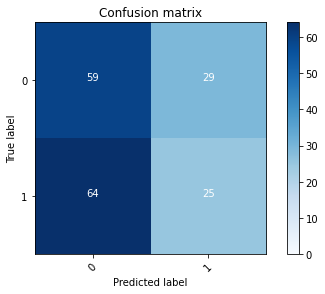

2022-08-20 16:35:35 - [Epoch Train: 14] loss: 0.5115, auc: 0.8035, acc: 0.7287, time: 50.00 s            
2022-08-20 16:35:35 - [Epoch Valid: 14] loss: 0.7996, auc: 0.4797, acc: 0.4786, time: 13.00 s


 14%|█████▌                                  | 14/100 [14:55<1:31:46, 64.03s/it]

2022-08-20 16:35:35 - EPOCH: 15
2022-08-20 16:35:35 - Train Step 10/973, train_loss: 0.4631
2022-08-20 16:35:36 - Train Step 20/973, train_loss: 0.4163
2022-08-20 16:35:37 - Train Step 30/973, train_loss: 0.4706
2022-08-20 16:35:37 - Train Step 40/973, train_loss: 0.4677
2022-08-20 16:35:37 - Train Step 50/973, train_loss: 0.4571
2022-08-20 16:35:38 - Train Step 60/973, train_loss: 0.4876
2022-08-20 16:35:38 - Train Step 70/973, train_loss: 0.4826
2022-08-20 16:35:39 - Train Step 80/973, train_loss: 0.4904
2022-08-20 16:35:39 - Train Step 90/973, train_loss: 0.4971
2022-08-20 16:35:40 - Train Step 100/973, train_loss: 0.5042
2022-08-20 16:35:40 - Train Step 110/973, train_loss: 0.4950
2022-08-20 16:35:41 - Train Step 120/973, train_loss: 0.4884
2022-08-20 16:35:42 - Train Step 130/973, train_loss: 0.4937
2022-08-20 16:35:42 - Train Step 140/973, train_loss: 0.4847
2022-08-20 16:35:43 - Train Step 150/973, train_loss: 0.4798
2022-08-20 16:35:43 - Train Step 160/973, train_loss: 0.4820
2

2022-08-20 16:36:36 - Valid Step 185/257, valid_loss: 0.8112
2022-08-20 16:36:36 - Valid Step 190/257, valid_loss: 0.8176
2022-08-20 16:36:36 - Valid Step 195/257, valid_loss: 0.8190
2022-08-20 16:36:36 - Valid Step 200/257, valid_loss: 0.8219
2022-08-20 16:36:37 - Valid Step 205/257, valid_loss: 0.8351
2022-08-20 16:36:37 - Valid Step 210/257, valid_loss: 0.8526
2022-08-20 16:36:37 - Valid Step 215/257, valid_loss: 0.8460
2022-08-20 16:36:37 - Valid Step 220/257, valid_loss: 0.8410
2022-08-20 16:36:38 - Valid Step 225/257, valid_loss: 0.8319
2022-08-20 16:36:38 - Valid Step 230/257, valid_loss: 0.8274
2022-08-20 16:36:38 - Valid Step 235/257, valid_loss: 0.8309
2022-08-20 16:36:38 - Valid Step 240/257, valid_loss: 0.8362
2022-08-20 16:36:39 - Valid Step 245/257, valid_loss: 0.8359
2022-08-20 16:36:39 - Valid Step 250/257, valid_loss: 0.8300
2022-08-20 16:36:39 - Valid Step 255/257, valid_loss: 0.8296
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

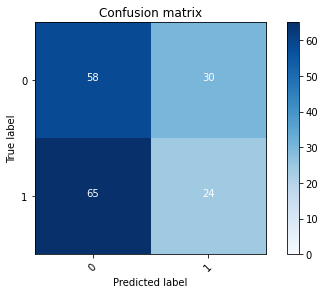

2022-08-20 16:36:39 - [Epoch Train: 15] loss: 0.5001, auc: 0.8136, acc: 0.7390, time: 50.00 s            
2022-08-20 16:36:39 - [Epoch Valid: 15] loss: 0.8286, auc: 0.4803, acc: 0.4669, time: 13.00 s


 15%|██████                                  | 15/100 [15:59<1:30:57, 64.21s/it]

2022-08-20 16:36:39 - EPOCH: 16
2022-08-20 16:36:40 - Train Step 10/973, train_loss: 0.5485
2022-08-20 16:36:41 - Train Step 20/973, train_loss: 0.5495
2022-08-20 16:36:41 - Train Step 30/973, train_loss: 0.5200
2022-08-20 16:36:42 - Train Step 40/973, train_loss: 0.4921
2022-08-20 16:36:42 - Train Step 50/973, train_loss: 0.5106
2022-08-20 16:36:43 - Train Step 60/973, train_loss: 0.5044
2022-08-20 16:36:43 - Train Step 70/973, train_loss: 0.5106
2022-08-20 16:36:44 - Train Step 80/973, train_loss: 0.5032
2022-08-20 16:36:44 - Train Step 90/973, train_loss: 0.4944
2022-08-20 16:36:45 - Train Step 100/973, train_loss: 0.4936
2022-08-20 16:36:45 - Train Step 110/973, train_loss: 0.4933
2022-08-20 16:36:46 - Train Step 120/973, train_loss: 0.4904
2022-08-20 16:36:46 - Train Step 130/973, train_loss: 0.4885
2022-08-20 16:36:47 - Train Step 140/973, train_loss: 0.4758
2022-08-20 16:36:47 - Train Step 150/973, train_loss: 0.4832
2022-08-20 16:36:48 - Train Step 160/973, train_loss: 0.4864
2

2022-08-20 16:37:40 - Valid Step 185/257, valid_loss: 0.8908
2022-08-20 16:37:40 - Valid Step 190/257, valid_loss: 0.8859
2022-08-20 16:37:40 - Valid Step 195/257, valid_loss: 0.8789
2022-08-20 16:37:41 - Valid Step 200/257, valid_loss: 0.8713
2022-08-20 16:37:41 - Valid Step 205/257, valid_loss: 0.8706
2022-08-20 16:37:41 - Valid Step 210/257, valid_loss: 0.8745
2022-08-20 16:37:41 - Valid Step 215/257, valid_loss: 0.8651
2022-08-20 16:37:42 - Valid Step 220/257, valid_loss: 0.8591
2022-08-20 16:37:42 - Valid Step 225/257, valid_loss: 0.8625
2022-08-20 16:37:42 - Valid Step 230/257, valid_loss: 0.8558
2022-08-20 16:37:42 - Valid Step 235/257, valid_loss: 0.8537
2022-08-20 16:37:43 - Valid Step 240/257, valid_loss: 0.8611
2022-08-20 16:37:43 - Valid Step 245/257, valid_loss: 0.8607
2022-08-20 16:37:43 - Valid Step 250/257, valid_loss: 0.8667
2022-08-20 16:37:43 - Valid Step 255/257, valid_loss: 0.8650
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

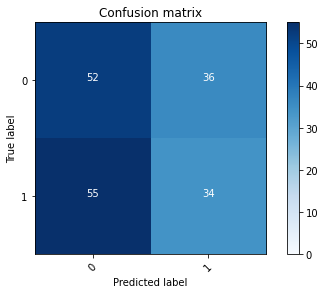

2022-08-20 16:37:44 - [Epoch Train: 16] loss: 0.4862, auc: 0.8276, acc: 0.7472, time: 50.00 s            
2022-08-20 16:37:44 - [Epoch Valid: 16] loss: 0.8633, auc: 0.4766, acc: 0.5019, time: 13.00 s


 16%|██████▍                                 | 16/100 [17:03<1:29:54, 64.22s/it]

2022-08-20 16:37:44 - EPOCH: 17
2022-08-20 16:37:44 - Train Step 10/973, train_loss: 0.3199
2022-08-20 16:37:45 - Train Step 20/973, train_loss: 0.3562
2022-08-20 16:37:45 - Train Step 30/973, train_loss: 0.3985
2022-08-20 16:37:46 - Train Step 40/973, train_loss: 0.4185
2022-08-20 16:37:46 - Train Step 50/973, train_loss: 0.4354
2022-08-20 16:37:47 - Train Step 60/973, train_loss: 0.4702
2022-08-20 16:37:47 - Train Step 70/973, train_loss: 0.4651
2022-08-20 16:37:48 - Train Step 80/973, train_loss: 0.4670
2022-08-20 16:37:49 - Train Step 90/973, train_loss: 0.4473
2022-08-20 16:37:49 - Train Step 100/973, train_loss: 0.4377
2022-08-20 16:37:50 - Train Step 110/973, train_loss: 0.4316
2022-08-20 16:37:50 - Train Step 120/973, train_loss: 0.4453
2022-08-20 16:37:51 - Train Step 130/973, train_loss: 0.4507
2022-08-20 16:37:51 - Train Step 140/973, train_loss: 0.4384
2022-08-20 16:37:52 - Train Step 150/973, train_loss: 0.4440
2022-08-20 16:37:52 - Train Step 160/973, train_loss: 0.4458
2

2022-08-20 16:38:45 - Valid Step 185/257, valid_loss: 0.8499
2022-08-20 16:38:45 - Valid Step 190/257, valid_loss: 0.8437
2022-08-20 16:38:45 - Valid Step 195/257, valid_loss: 0.8390
2022-08-20 16:38:45 - Valid Step 200/257, valid_loss: 0.8333
2022-08-20 16:38:46 - Valid Step 205/257, valid_loss: 0.8429
2022-08-20 16:38:46 - Valid Step 210/257, valid_loss: 0.8581
2022-08-20 16:38:46 - Valid Step 215/257, valid_loss: 0.8711
2022-08-20 16:38:46 - Valid Step 220/257, valid_loss: 0.8638
2022-08-20 16:38:47 - Valid Step 225/257, valid_loss: 0.8626
2022-08-20 16:38:47 - Valid Step 230/257, valid_loss: 0.8675
2022-08-20 16:38:47 - Valid Step 235/257, valid_loss: 0.8733
2022-08-20 16:38:48 - Valid Step 240/257, valid_loss: 0.8759
2022-08-20 16:38:48 - Valid Step 245/257, valid_loss: 0.8813
2022-08-20 16:38:48 - Valid Step 250/257, valid_loss: 0.8832
2022-08-20 16:38:48 - Valid Step 255/257, valid_loss: 0.8740
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

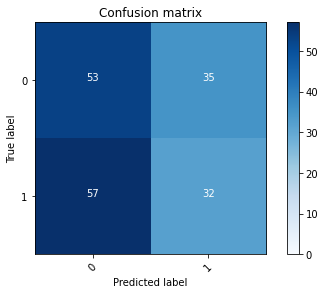

2022-08-20 16:38:49 - [Epoch Train: 17] loss: 0.4710, auc: 0.8397, acc: 0.7482, time: 51.00 s            
2022-08-20 16:38:49 - [Epoch Valid: 17] loss: 0.8749, auc: 0.4801, acc: 0.4864, time: 13.00 s


 17%|██████▊                                 | 17/100 [18:08<1:29:05, 64.41s/it]

2022-08-20 16:38:49 - EPOCH: 18
2022-08-20 16:38:49 - Train Step 10/973, train_loss: 0.5846
2022-08-20 16:38:50 - Train Step 20/973, train_loss: 0.6384
2022-08-20 16:38:50 - Train Step 30/973, train_loss: 0.5255
2022-08-20 16:38:51 - Train Step 40/973, train_loss: 0.4766
2022-08-20 16:38:51 - Train Step 50/973, train_loss: 0.4747
2022-08-20 16:38:52 - Train Step 60/973, train_loss: 0.4570
2022-08-20 16:38:52 - Train Step 70/973, train_loss: 0.4343
2022-08-20 16:38:53 - Train Step 80/973, train_loss: 0.4180
2022-08-20 16:38:53 - Train Step 90/973, train_loss: 0.4360
2022-08-20 16:38:54 - Train Step 100/973, train_loss: 0.4207
2022-08-20 16:38:54 - Train Step 110/973, train_loss: 0.4243
2022-08-20 16:38:55 - Train Step 120/973, train_loss: 0.4271
2022-08-20 16:38:56 - Train Step 130/973, train_loss: 0.4299
2022-08-20 16:38:56 - Train Step 140/973, train_loss: 0.4236
2022-08-20 16:38:57 - Train Step 150/973, train_loss: 0.4239
2022-08-20 16:38:57 - Train Step 160/973, train_loss: 0.4274
2

2022-08-20 16:39:49 - Valid Step 185/257, valid_loss: 0.9177
2022-08-20 16:39:49 - Valid Step 190/257, valid_loss: 0.9082
2022-08-20 16:39:50 - Valid Step 195/257, valid_loss: 0.9171
2022-08-20 16:39:50 - Valid Step 200/257, valid_loss: 0.9200
2022-08-20 16:39:50 - Valid Step 205/257, valid_loss: 0.9264
2022-08-20 16:39:50 - Valid Step 210/257, valid_loss: 0.9221
2022-08-20 16:39:51 - Valid Step 215/257, valid_loss: 0.9424
2022-08-20 16:39:51 - Valid Step 220/257, valid_loss: 0.9379
2022-08-20 16:39:51 - Valid Step 225/257, valid_loss: 0.9379
2022-08-20 16:39:51 - Valid Step 230/257, valid_loss: 0.9444
2022-08-20 16:39:52 - Valid Step 235/257, valid_loss: 0.9380
2022-08-20 16:39:52 - Valid Step 240/257, valid_loss: 0.9359
2022-08-20 16:39:52 - Valid Step 245/257, valid_loss: 0.9435
2022-08-20 16:39:52 - Valid Step 250/257, valid_loss: 0.9380
2022-08-20 16:39:53 - Valid Step 255/257, valid_loss: 0.9267
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

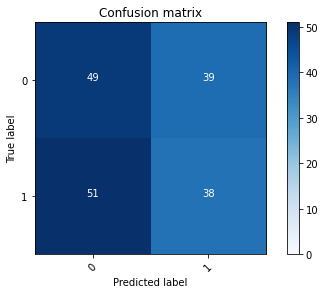

2022-08-20 16:39:53 - [Epoch Train: 18] loss: 0.4544, auc: 0.8485, acc: 0.7770, time: 50.00 s            
2022-08-20 16:39:53 - [Epoch Valid: 18] loss: 0.9231, auc: 0.4831, acc: 0.4981, time: 13.00 s


 18%|███████▏                                | 18/100 [19:13<1:28:03, 64.43s/it]

2022-08-20 16:39:53 - EPOCH: 19
2022-08-20 16:39:54 - Train Step 10/973, train_loss: 0.4767
2022-08-20 16:39:54 - Train Step 20/973, train_loss: 0.4633
2022-08-20 16:39:55 - Train Step 30/973, train_loss: 0.4954
2022-08-20 16:39:55 - Train Step 40/973, train_loss: 0.4733
2022-08-20 16:39:56 - Train Step 50/973, train_loss: 0.4329
2022-08-20 16:39:56 - Train Step 60/973, train_loss: 0.4469
2022-08-20 16:39:57 - Train Step 70/973, train_loss: 0.4963
2022-08-20 16:39:57 - Train Step 80/973, train_loss: 0.4934
2022-08-20 16:39:58 - Train Step 90/973, train_loss: 0.4792
2022-08-20 16:39:58 - Train Step 100/973, train_loss: 0.4860
2022-08-20 16:39:59 - Train Step 110/973, train_loss: 0.4968
2022-08-20 16:39:59 - Train Step 120/973, train_loss: 0.4855
2022-08-20 16:40:00 - Train Step 130/973, train_loss: 0.4781
2022-08-20 16:40:00 - Train Step 140/973, train_loss: 0.4843
2022-08-20 16:40:01 - Train Step 150/973, train_loss: 0.4946
2022-08-20 16:40:01 - Train Step 160/973, train_loss: 0.4834
2

2022-08-20 16:40:54 - Valid Step 185/257, valid_loss: 0.8917
2022-08-20 16:40:54 - Valid Step 190/257, valid_loss: 0.8785
2022-08-20 16:40:55 - Valid Step 195/257, valid_loss: 0.8794
2022-08-20 16:40:55 - Valid Step 200/257, valid_loss: 0.8808
2022-08-20 16:40:55 - Valid Step 205/257, valid_loss: 0.8701
2022-08-20 16:40:55 - Valid Step 210/257, valid_loss: 0.8713
2022-08-20 16:40:56 - Valid Step 215/257, valid_loss: 0.8699
2022-08-20 16:40:56 - Valid Step 220/257, valid_loss: 0.8610
2022-08-20 16:40:56 - Valid Step 225/257, valid_loss: 0.8617
2022-08-20 16:40:56 - Valid Step 230/257, valid_loss: 0.8698
2022-08-20 16:40:57 - Valid Step 235/257, valid_loss: 0.8611
2022-08-20 16:40:57 - Valid Step 240/257, valid_loss: 0.8662
2022-08-20 16:40:57 - Valid Step 245/257, valid_loss: 0.8713
2022-08-20 16:40:57 - Valid Step 250/257, valid_loss: 0.8708
2022-08-20 16:40:58 - Valid Step 255/257, valid_loss: 0.8860
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

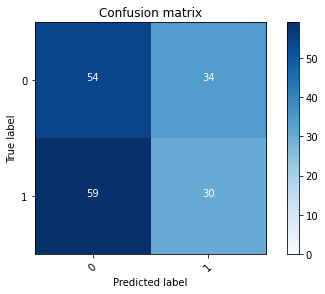

2022-08-20 16:40:58 - [Epoch Train: 19] loss: 0.4582, auc: 0.8406, acc: 0.7873, time: 51.00 s            
2022-08-20 16:40:58 - [Epoch Valid: 19] loss: 0.8848, auc: 0.4711, acc: 0.4786, time: 13.00 s


 19%|███████▌                                | 19/100 [20:18<1:27:11, 64.59s/it]

2022-08-20 16:40:58 - EPOCH: 20
2022-08-20 16:40:59 - Train Step 10/973, train_loss: 0.4902
2022-08-20 16:40:59 - Train Step 20/973, train_loss: 0.4313
2022-08-20 16:41:00 - Train Step 30/973, train_loss: 0.4961
2022-08-20 16:41:00 - Train Step 40/973, train_loss: 0.4954
2022-08-20 16:41:01 - Train Step 50/973, train_loss: 0.4673
2022-08-20 16:41:01 - Train Step 60/973, train_loss: 0.4598
2022-08-20 16:41:02 - Train Step 70/973, train_loss: 0.4595
2022-08-20 16:41:02 - Train Step 80/973, train_loss: 0.4342
2022-08-20 16:41:03 - Train Step 90/973, train_loss: 0.4289
2022-08-20 16:41:03 - Train Step 100/973, train_loss: 0.4321
2022-08-20 16:41:04 - Train Step 110/973, train_loss: 0.4218
2022-08-20 16:41:04 - Train Step 120/973, train_loss: 0.4115
2022-08-20 16:41:05 - Train Step 130/973, train_loss: 0.4051
2022-08-20 16:41:05 - Train Step 140/973, train_loss: 0.4111
2022-08-20 16:41:06 - Train Step 150/973, train_loss: 0.4156
2022-08-20 16:41:07 - Train Step 160/973, train_loss: 0.4210
2

2022-08-20 16:41:59 - Valid Step 185/257, valid_loss: 0.8963
2022-08-20 16:41:59 - Valid Step 190/257, valid_loss: 0.8919
2022-08-20 16:41:59 - Valid Step 195/257, valid_loss: 0.8979
2022-08-20 16:42:00 - Valid Step 200/257, valid_loss: 0.9058
2022-08-20 16:42:00 - Valid Step 205/257, valid_loss: 0.8987
2022-08-20 16:42:00 - Valid Step 210/257, valid_loss: 0.9101
2022-08-20 16:42:00 - Valid Step 215/257, valid_loss: 0.9216
2022-08-20 16:42:01 - Valid Step 220/257, valid_loss: 0.9261
2022-08-20 16:42:01 - Valid Step 225/257, valid_loss: 0.9235
2022-08-20 16:42:01 - Valid Step 230/257, valid_loss: 0.9175
2022-08-20 16:42:01 - Valid Step 235/257, valid_loss: 0.9240
2022-08-20 16:42:02 - Valid Step 240/257, valid_loss: 0.9252
2022-08-20 16:42:02 - Valid Step 245/257, valid_loss: 0.9203
2022-08-20 16:42:02 - Valid Step 250/257, valid_loss: 0.9133
2022-08-20 16:42:02 - Valid Step 255/257, valid_loss: 0.9180
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

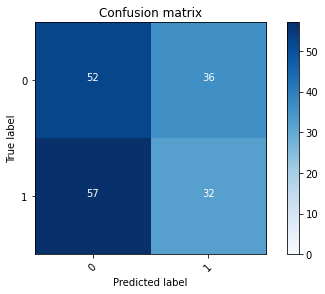

2022-08-20 16:42:03 - [Epoch Train: 20] loss: 0.4462, auc: 0.8464, acc: 0.7708, time: 50.00 s            
2022-08-20 16:42:03 - [Epoch Valid: 20] loss: 0.9175, auc: 0.4768, acc: 0.4825, time: 13.00 s


 20%|████████                                | 20/100 [21:22<1:26:07, 64.60s/it]

2022-08-20 16:42:03 - EPOCH: 21
2022-08-20 16:42:03 - Train Step 10/973, train_loss: 0.4036
2022-08-20 16:42:04 - Train Step 20/973, train_loss: 0.4205
2022-08-20 16:42:04 - Train Step 30/973, train_loss: 0.4573
2022-08-20 16:42:05 - Train Step 40/973, train_loss: 0.4136
2022-08-20 16:42:05 - Train Step 50/973, train_loss: 0.3919
2022-08-20 16:42:06 - Train Step 60/973, train_loss: 0.4150
2022-08-20 16:42:06 - Train Step 70/973, train_loss: 0.4296
2022-08-20 16:42:07 - Train Step 80/973, train_loss: 0.4260
2022-08-20 16:42:07 - Train Step 90/973, train_loss: 0.4274
2022-08-20 16:42:08 - Train Step 100/973, train_loss: 0.4458
2022-08-20 16:42:08 - Train Step 110/973, train_loss: 0.4486
2022-08-20 16:42:09 - Train Step 120/973, train_loss: 0.4401
2022-08-20 16:42:09 - Train Step 130/973, train_loss: 0.4309
2022-08-20 16:42:10 - Train Step 140/973, train_loss: 0.4406
2022-08-20 16:42:11 - Train Step 150/973, train_loss: 0.4452
2022-08-20 16:42:11 - Train Step 160/973, train_loss: 0.4484
2

2022-08-20 16:43:03 - Valid Step 185/257, valid_loss: 0.9015
2022-08-20 16:43:03 - Valid Step 190/257, valid_loss: 0.9064
2022-08-20 16:43:04 - Valid Step 195/257, valid_loss: 0.9126
2022-08-20 16:43:04 - Valid Step 200/257, valid_loss: 0.9125
2022-08-20 16:43:04 - Valid Step 205/257, valid_loss: 0.9016
2022-08-20 16:43:04 - Valid Step 210/257, valid_loss: 0.9095
2022-08-20 16:43:05 - Valid Step 215/257, valid_loss: 0.9155
2022-08-20 16:43:05 - Valid Step 220/257, valid_loss: 0.9260
2022-08-20 16:43:05 - Valid Step 225/257, valid_loss: 0.9216
2022-08-20 16:43:05 - Valid Step 230/257, valid_loss: 0.9248
2022-08-20 16:43:06 - Valid Step 235/257, valid_loss: 0.9352
2022-08-20 16:43:06 - Valid Step 240/257, valid_loss: 0.9346
2022-08-20 16:43:06 - Valid Step 245/257, valid_loss: 0.9317
2022-08-20 16:43:06 - Valid Step 250/257, valid_loss: 0.9308
2022-08-20 16:43:07 - Valid Step 255/257, valid_loss: 0.9331
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

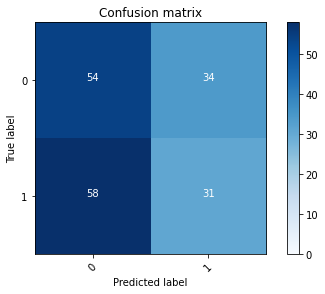

2022-08-20 16:43:07 - [Epoch Train: 21] loss: 0.4317, auc: 0.8564, acc: 0.8027, time: 50.00 s            
2022-08-20 16:43:07 - [Epoch Valid: 21] loss: 0.9313, auc: 0.4766, acc: 0.4864, time: 13.00 s


 21%|████████▍                               | 21/100 [22:27<1:24:57, 64.52s/it]

2022-08-20 16:43:07 - EPOCH: 22
2022-08-20 16:43:08 - Train Step 10/973, train_loss: 0.3353
2022-08-20 16:43:08 - Train Step 20/973, train_loss: 0.4311
2022-08-20 16:43:09 - Train Step 30/973, train_loss: 0.4142
2022-08-20 16:43:09 - Train Step 40/973, train_loss: 0.4726
2022-08-20 16:43:10 - Train Step 50/973, train_loss: 0.4678
2022-08-20 16:43:10 - Train Step 60/973, train_loss: 0.4573
2022-08-20 16:43:11 - Train Step 70/973, train_loss: 0.4308
2022-08-20 16:43:11 - Train Step 80/973, train_loss: 0.4481
2022-08-20 16:43:12 - Train Step 90/973, train_loss: 0.4459
2022-08-20 16:43:12 - Train Step 100/973, train_loss: 0.4278
2022-08-20 16:43:13 - Train Step 110/973, train_loss: 0.4151
2022-08-20 16:43:13 - Train Step 120/973, train_loss: 0.4196
2022-08-20 16:43:14 - Train Step 130/973, train_loss: 0.4243
2022-08-20 16:43:14 - Train Step 140/973, train_loss: 0.4299
2022-08-20 16:43:15 - Train Step 150/973, train_loss: 0.4252
2022-08-20 16:43:15 - Train Step 160/973, train_loss: 0.4214
2

2022-08-20 16:44:08 - Valid Step 185/257, valid_loss: 0.8763
2022-08-20 16:44:09 - Valid Step 190/257, valid_loss: 0.8826
2022-08-20 16:44:09 - Valid Step 195/257, valid_loss: 0.8760
2022-08-20 16:44:09 - Valid Step 200/257, valid_loss: 0.9162
2022-08-20 16:44:09 - Valid Step 205/257, valid_loss: 0.9474
2022-08-20 16:44:10 - Valid Step 210/257, valid_loss: 0.9452
2022-08-20 16:44:10 - Valid Step 215/257, valid_loss: 0.9623
2022-08-20 16:44:10 - Valid Step 220/257, valid_loss: 0.9697
2022-08-20 16:44:10 - Valid Step 225/257, valid_loss: 0.9696
2022-08-20 16:44:11 - Valid Step 230/257, valid_loss: 0.9677
2022-08-20 16:44:11 - Valid Step 235/257, valid_loss: 0.9555
2022-08-20 16:44:11 - Valid Step 240/257, valid_loss: 0.9664
2022-08-20 16:44:11 - Valid Step 245/257, valid_loss: 0.9868
2022-08-20 16:44:12 - Valid Step 250/257, valid_loss: 0.9789
2022-08-20 16:44:12 - Valid Step 255/257, valid_loss: 0.9720
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

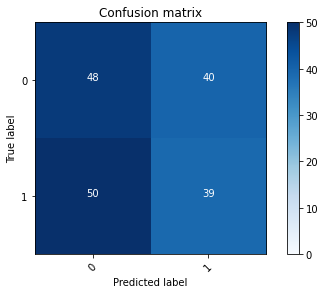

2022-08-20 16:44:12 - [Epoch Train: 22] loss: 0.4187, auc: 0.8690, acc: 0.7945, time: 51.00 s            
2022-08-20 16:44:12 - [Epoch Valid: 22] loss: 0.9669, auc: 0.4797, acc: 0.4981, time: 13.00 s


 22%|████████▊                               | 22/100 [23:32<1:24:13, 64.78s/it]

2022-08-20 16:44:12 - EPOCH: 23
2022-08-20 16:44:13 - Train Step 10/973, train_loss: 0.2193
2022-08-20 16:44:14 - Train Step 20/973, train_loss: 0.1838
2022-08-20 16:44:14 - Train Step 30/973, train_loss: 0.2796
2022-08-20 16:44:15 - Train Step 40/973, train_loss: 0.4199
2022-08-20 16:44:15 - Train Step 50/973, train_loss: 0.4310
2022-08-20 16:44:16 - Train Step 60/973, train_loss: 0.4679
2022-08-20 16:44:16 - Train Step 70/973, train_loss: 0.4798
2022-08-20 16:44:17 - Train Step 80/973, train_loss: 0.4928
2022-08-20 16:44:17 - Train Step 90/973, train_loss: 0.4804
2022-08-20 16:44:18 - Train Step 100/973, train_loss: 0.4916
2022-08-20 16:44:18 - Train Step 110/973, train_loss: 0.4923
2022-08-20 16:44:19 - Train Step 120/973, train_loss: 0.4860
2022-08-20 16:44:19 - Train Step 130/973, train_loss: 0.4767
2022-08-20 16:44:20 - Train Step 140/973, train_loss: 0.4880
2022-08-20 16:44:20 - Train Step 150/973, train_loss: 0.4800
2022-08-20 16:44:21 - Train Step 160/973, train_loss: 0.4776
2

2022-08-20 16:45:13 - Valid Step 185/257, valid_loss: 0.9569
2022-08-20 16:45:13 - Valid Step 190/257, valid_loss: 0.9615
2022-08-20 16:45:13 - Valid Step 195/257, valid_loss: 0.9613
2022-08-20 16:45:13 - Valid Step 200/257, valid_loss: 0.9627
2022-08-20 16:45:14 - Valid Step 205/257, valid_loss: 0.9578
2022-08-20 16:45:14 - Valid Step 210/257, valid_loss: 0.9506
2022-08-20 16:45:14 - Valid Step 215/257, valid_loss: 0.9687
2022-08-20 16:45:14 - Valid Step 220/257, valid_loss: 0.9745
2022-08-20 16:45:15 - Valid Step 225/257, valid_loss: 0.9746
2022-08-20 16:45:15 - Valid Step 230/257, valid_loss: 0.9810
2022-08-20 16:45:15 - Valid Step 235/257, valid_loss: 0.9896
2022-08-20 16:45:15 - Valid Step 240/257, valid_loss: 1.0005
2022-08-20 16:45:16 - Valid Step 245/257, valid_loss: 1.0023
2022-08-20 16:45:16 - Valid Step 250/257, valid_loss: 1.0068
2022-08-20 16:45:16 - Valid Step 255/257, valid_loss: 1.0090
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

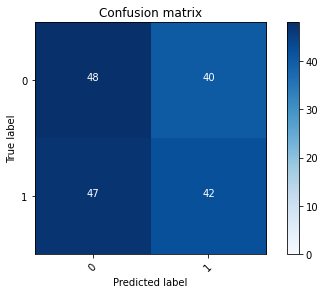

2022-08-20 16:45:16 - [Epoch Train: 23] loss: 0.4213, auc: 0.8636, acc: 0.7996, time: 50.00 s            
2022-08-20 16:45:16 - [Epoch Valid: 23] loss: 1.0069, auc: 0.4791, acc: 0.5136, time: 13.00 s


 23%|█████████▏                              | 23/100 [24:36<1:22:51, 64.57s/it]

2022-08-20 16:45:16 - EPOCH: 24
2022-08-20 16:45:17 - Train Step 10/973, train_loss: 0.3499
2022-08-20 16:45:18 - Train Step 20/973, train_loss: 0.3459
2022-08-20 16:45:18 - Train Step 30/973, train_loss: 0.3435
2022-08-20 16:45:19 - Train Step 40/973, train_loss: 0.3482
2022-08-20 16:45:19 - Train Step 50/973, train_loss: 0.3771
2022-08-20 16:45:20 - Train Step 60/973, train_loss: 0.4180
2022-08-20 16:45:20 - Train Step 70/973, train_loss: 0.4105
2022-08-20 16:45:21 - Train Step 80/973, train_loss: 0.4093
2022-08-20 16:45:21 - Train Step 90/973, train_loss: 0.3945
2022-08-20 16:45:22 - Train Step 100/973, train_loss: 0.4068
2022-08-20 16:45:22 - Train Step 110/973, train_loss: 0.3986
2022-08-20 16:45:23 - Train Step 120/973, train_loss: 0.3992
2022-08-20 16:45:23 - Train Step 130/973, train_loss: 0.3890
2022-08-20 16:45:24 - Train Step 140/973, train_loss: 0.3881
2022-08-20 16:45:25 - Train Step 150/973, train_loss: 0.3919
2022-08-20 16:45:25 - Train Step 160/973, train_loss: 0.3955
2

2022-08-20 16:46:17 - Valid Step 185/257, valid_loss: 1.0285
2022-08-20 16:46:17 - Valid Step 190/257, valid_loss: 1.0257
2022-08-20 16:46:17 - Valid Step 195/257, valid_loss: 1.0210
2022-08-20 16:46:17 - Valid Step 200/257, valid_loss: 1.0300
2022-08-20 16:46:18 - Valid Step 205/257, valid_loss: 1.0357
2022-08-20 16:46:18 - Valid Step 210/257, valid_loss: 1.0365
2022-08-20 16:46:18 - Valid Step 215/257, valid_loss: 1.0462
2022-08-20 16:46:18 - Valid Step 220/257, valid_loss: 1.0429
2022-08-20 16:46:19 - Valid Step 225/257, valid_loss: 1.0316
2022-08-20 16:46:19 - Valid Step 230/257, valid_loss: 1.0499
2022-08-20 16:46:19 - Valid Step 235/257, valid_loss: 1.0367
2022-08-20 16:46:19 - Valid Step 240/257, valid_loss: 1.0477
2022-08-20 16:46:20 - Valid Step 245/257, valid_loss: 1.0399
2022-08-20 16:46:20 - Valid Step 250/257, valid_loss: 1.0481
2022-08-20 16:46:20 - Valid Step 255/257, valid_loss: 1.0362
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

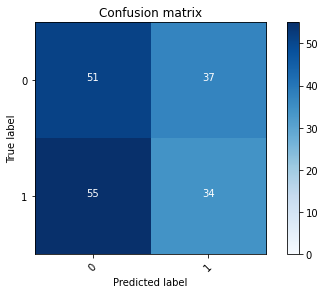

2022-08-20 16:46:21 - [Epoch Train: 24] loss: 0.3973, auc: 0.8829, acc: 0.8253, time: 50.00 s            
2022-08-20 16:46:21 - [Epoch Valid: 24] loss: 1.0337, auc: 0.4705, acc: 0.4903, time: 13.00 s


 24%|█████████▌                              | 24/100 [25:40<1:21:39, 64.47s/it]

2022-08-20 16:46:21 - EPOCH: 25
2022-08-20 16:46:21 - Train Step 10/973, train_loss: 0.5514
2022-08-20 16:46:22 - Train Step 20/973, train_loss: 0.3871
2022-08-20 16:46:22 - Train Step 30/973, train_loss: 0.3238
2022-08-20 16:46:23 - Train Step 40/973, train_loss: 0.3308
2022-08-20 16:46:23 - Train Step 50/973, train_loss: 0.3764
2022-08-20 16:46:24 - Train Step 60/973, train_loss: 0.3893
2022-08-20 16:46:24 - Train Step 70/973, train_loss: 0.3685
2022-08-20 16:46:25 - Train Step 80/973, train_loss: 0.3604
2022-08-20 16:46:25 - Train Step 90/973, train_loss: 0.3597
2022-08-20 16:46:26 - Train Step 100/973, train_loss: 0.3544
2022-08-20 16:46:27 - Train Step 110/973, train_loss: 0.3840
2022-08-20 16:46:27 - Train Step 120/973, train_loss: 0.3988
2022-08-20 16:46:28 - Train Step 130/973, train_loss: 0.3889
2022-08-20 16:46:28 - Train Step 140/973, train_loss: 0.3734
2022-08-20 16:46:29 - Train Step 150/973, train_loss: 0.3763
2022-08-20 16:46:29 - Train Step 160/973, train_loss: 0.3776
2

2022-08-20 16:47:21 - Valid Step 185/257, valid_loss: 0.9728
2022-08-20 16:47:21 - Valid Step 190/257, valid_loss: 0.9727
2022-08-20 16:47:22 - Valid Step 195/257, valid_loss: 0.9607
2022-08-20 16:47:22 - Valid Step 200/257, valid_loss: 0.9829
2022-08-20 16:47:22 - Valid Step 205/257, valid_loss: 0.9754
2022-08-20 16:47:23 - Valid Step 210/257, valid_loss: 0.9634
2022-08-20 16:47:23 - Valid Step 215/257, valid_loss: 0.9729
2022-08-20 16:47:23 - Valid Step 220/257, valid_loss: 0.9722
2022-08-20 16:47:23 - Valid Step 225/257, valid_loss: 0.9725
2022-08-20 16:47:24 - Valid Step 230/257, valid_loss: 0.9821
2022-08-20 16:47:24 - Valid Step 235/257, valid_loss: 0.9865
2022-08-20 16:47:24 - Valid Step 240/257, valid_loss: 1.0102
2022-08-20 16:47:24 - Valid Step 245/257, valid_loss: 1.0280
2022-08-20 16:47:25 - Valid Step 250/257, valid_loss: 1.0282
2022-08-20 16:47:25 - Valid Step 255/257, valid_loss: 1.0252
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

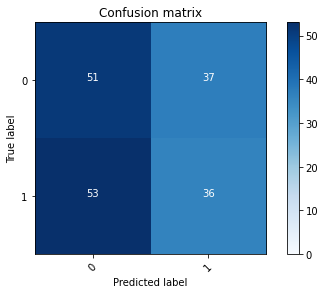

2022-08-20 16:47:25 - [Epoch Train: 25] loss: 0.3884, auc: 0.8815, acc: 0.8284, time: 50.00 s            
2022-08-20 16:47:25 - [Epoch Valid: 25] loss: 1.0230, auc: 0.4784, acc: 0.4981, time: 13.00 s


 25%|██████████                              | 25/100 [26:45<1:20:37, 64.50s/it]

2022-08-20 16:47:25 - EPOCH: 26
2022-08-20 16:47:26 - Train Step 10/973, train_loss: 0.5371
2022-08-20 16:47:26 - Train Step 20/973, train_loss: 0.3927
2022-08-20 16:47:27 - Train Step 30/973, train_loss: 0.3964
2022-08-20 16:47:27 - Train Step 40/973, train_loss: 0.3781
2022-08-20 16:47:28 - Train Step 50/973, train_loss: 0.3328
2022-08-20 16:47:29 - Train Step 60/973, train_loss: 0.3303
2022-08-20 16:47:29 - Train Step 70/973, train_loss: 0.3326
2022-08-20 16:47:30 - Train Step 80/973, train_loss: 0.3244
2022-08-20 16:47:30 - Train Step 90/973, train_loss: 0.3197
2022-08-20 16:47:31 - Train Step 100/973, train_loss: 0.3289
2022-08-20 16:47:31 - Train Step 110/973, train_loss: 0.3342
2022-08-20 16:47:32 - Train Step 120/973, train_loss: 0.3325
2022-08-20 16:47:32 - Train Step 130/973, train_loss: 0.3395
2022-08-20 16:47:33 - Train Step 140/973, train_loss: 0.3385
2022-08-20 16:47:33 - Train Step 150/973, train_loss: 0.3364
2022-08-20 16:47:34 - Train Step 160/973, train_loss: 0.3275
2

2022-08-20 16:48:26 - Valid Step 185/257, valid_loss: 0.9516
2022-08-20 16:48:26 - Valid Step 190/257, valid_loss: 0.9436
2022-08-20 16:48:26 - Valid Step 195/257, valid_loss: 0.9419
2022-08-20 16:48:27 - Valid Step 200/257, valid_loss: 0.9431
2022-08-20 16:48:27 - Valid Step 205/257, valid_loss: 0.9566
2022-08-20 16:48:27 - Valid Step 210/257, valid_loss: 0.9721
2022-08-20 16:48:27 - Valid Step 215/257, valid_loss: 0.9722
2022-08-20 16:48:28 - Valid Step 220/257, valid_loss: 0.9767
2022-08-20 16:48:28 - Valid Step 225/257, valid_loss: 0.9786
2022-08-20 16:48:28 - Valid Step 230/257, valid_loss: 0.9696
2022-08-20 16:48:28 - Valid Step 235/257, valid_loss: 0.9675
2022-08-20 16:48:29 - Valid Step 240/257, valid_loss: 0.9677
2022-08-20 16:48:29 - Valid Step 245/257, valid_loss: 0.9701
2022-08-20 16:48:29 - Valid Step 250/257, valid_loss: 0.9687
2022-08-20 16:48:29 - Valid Step 255/257, valid_loss: 0.9779
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

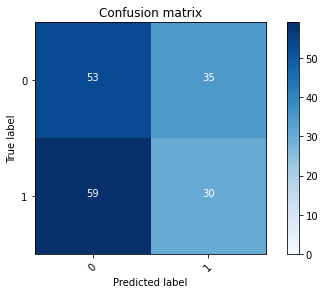

2022-08-20 16:48:30 - [Epoch Train: 26] loss: 0.3835, auc: 0.8900, acc: 0.8386, time: 50.00 s            
2022-08-20 16:48:30 - [Epoch Valid: 26] loss: 0.9729, auc: 0.4731, acc: 0.4825, time: 13.00 s


 26%|██████████▍                             | 26/100 [27:49<1:19:31, 64.48s/it]

2022-08-20 16:48:30 - EPOCH: 27
2022-08-20 16:48:30 - Train Step 10/973, train_loss: 0.3965
2022-08-20 16:48:31 - Train Step 20/973, train_loss: 0.2624
2022-08-20 16:48:31 - Train Step 30/973, train_loss: 0.2991
2022-08-20 16:48:32 - Train Step 40/973, train_loss: 0.2879
2022-08-20 16:48:32 - Train Step 50/973, train_loss: 0.2914
2022-08-20 16:48:33 - Train Step 60/973, train_loss: 0.3080
2022-08-20 16:48:33 - Train Step 70/973, train_loss: 0.3000
2022-08-20 16:48:34 - Train Step 80/973, train_loss: 0.3134
2022-08-20 16:48:35 - Train Step 90/973, train_loss: 0.3197
2022-08-20 16:48:35 - Train Step 100/973, train_loss: 0.3332
2022-08-20 16:48:36 - Train Step 110/973, train_loss: 0.3473
2022-08-20 16:48:36 - Train Step 120/973, train_loss: 0.3390
2022-08-20 16:48:37 - Train Step 130/973, train_loss: 0.3293
2022-08-20 16:48:37 - Train Step 140/973, train_loss: 0.3445
2022-08-20 16:48:38 - Train Step 150/973, train_loss: 0.3322
2022-08-20 16:48:38 - Train Step 160/973, train_loss: 0.3310
2

2022-08-20 16:49:30 - Valid Step 185/257, valid_loss: 1.0560
2022-08-20 16:49:30 - Valid Step 190/257, valid_loss: 1.0517
2022-08-20 16:49:30 - Valid Step 195/257, valid_loss: 1.0636
2022-08-20 16:49:31 - Valid Step 200/257, valid_loss: 1.0598
2022-08-20 16:49:31 - Valid Step 205/257, valid_loss: 1.0443
2022-08-20 16:49:31 - Valid Step 210/257, valid_loss: 1.0304
2022-08-20 16:49:31 - Valid Step 215/257, valid_loss: 1.0516
2022-08-20 16:49:32 - Valid Step 220/257, valid_loss: 1.0421
2022-08-20 16:49:32 - Valid Step 225/257, valid_loss: 1.0659
2022-08-20 16:49:32 - Valid Step 230/257, valid_loss: 1.0693
2022-08-20 16:49:32 - Valid Step 235/257, valid_loss: 1.0575
2022-08-20 16:49:33 - Valid Step 240/257, valid_loss: 1.0566
2022-08-20 16:49:33 - Valid Step 245/257, valid_loss: 1.0462
2022-08-20 16:49:33 - Valid Step 250/257, valid_loss: 1.0444
2022-08-20 16:49:34 - Valid Step 255/257, valid_loss: 1.0474
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

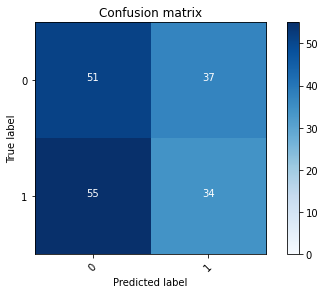

2022-08-20 16:49:34 - [Epoch Train: 27] loss: 0.3704, auc: 0.8970, acc: 0.8294, time: 50.00 s            
2022-08-20 16:49:34 - [Epoch Valid: 27] loss: 1.0508, auc: 0.4714, acc: 0.4903, time: 13.00 s


 27%|██████████▊                             | 27/100 [28:54<1:18:21, 64.40s/it]

2022-08-20 16:49:34 - EPOCH: 28
2022-08-20 16:49:35 - Train Step 10/973, train_loss: 0.2919
2022-08-20 16:49:35 - Train Step 20/973, train_loss: 0.2514
2022-08-20 16:49:36 - Train Step 30/973, train_loss: 0.2599
2022-08-20 16:49:36 - Train Step 40/973, train_loss: 0.2313
2022-08-20 16:49:37 - Train Step 50/973, train_loss: 0.2274
2022-08-20 16:49:37 - Train Step 60/973, train_loss: 0.2570
2022-08-20 16:49:38 - Train Step 70/973, train_loss: 0.2491
2022-08-20 16:49:38 - Train Step 80/973, train_loss: 0.2754
2022-08-20 16:49:39 - Train Step 90/973, train_loss: 0.3134
2022-08-20 16:49:39 - Train Step 100/973, train_loss: 0.3232
2022-08-20 16:49:40 - Train Step 110/973, train_loss: 0.3220
2022-08-20 16:49:40 - Train Step 120/973, train_loss: 0.3247
2022-08-20 16:49:41 - Train Step 130/973, train_loss: 0.3285
2022-08-20 16:49:41 - Train Step 140/973, train_loss: 0.3261
2022-08-20 16:49:42 - Train Step 150/973, train_loss: 0.3209
2022-08-20 16:49:42 - Train Step 160/973, train_loss: 0.3201
2

2022-08-20 16:50:35 - Valid Step 185/257, valid_loss: 1.2747
2022-08-20 16:50:35 - Valid Step 190/257, valid_loss: 1.2535
2022-08-20 16:50:35 - Valid Step 195/257, valid_loss: 1.2365
2022-08-20 16:50:36 - Valid Step 200/257, valid_loss: 1.2283
2022-08-20 16:50:36 - Valid Step 205/257, valid_loss: 1.2317
2022-08-20 16:50:36 - Valid Step 210/257, valid_loss: 1.2240
2022-08-20 16:50:37 - Valid Step 215/257, valid_loss: 1.2056
2022-08-20 16:50:37 - Valid Step 220/257, valid_loss: 1.2004
2022-08-20 16:50:37 - Valid Step 225/257, valid_loss: 1.1914
2022-08-20 16:50:37 - Valid Step 230/257, valid_loss: 1.1691
2022-08-20 16:50:38 - Valid Step 235/257, valid_loss: 1.1810
2022-08-20 16:50:38 - Valid Step 240/257, valid_loss: 1.1857
2022-08-20 16:50:38 - Valid Step 245/257, valid_loss: 1.1903
2022-08-20 16:50:38 - Valid Step 250/257, valid_loss: 1.1813
2022-08-20 16:50:39 - Valid Step 255/257, valid_loss: 1.1657
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

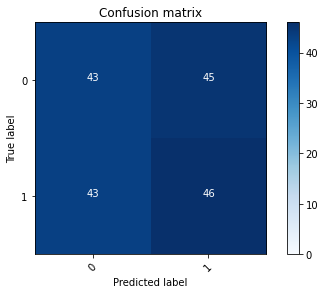

2022-08-20 16:50:39 - [Epoch Train: 28] loss: 0.3606, auc: 0.9042, acc: 0.8417, time: 51.00 s            
2022-08-20 16:50:39 - [Epoch Valid: 28] loss: 1.1731, auc: 0.4733, acc: 0.4981, time: 13.00 s


 28%|███████████▏                            | 28/100 [29:59<1:17:30, 64.59s/it]

2022-08-20 16:50:39 - EPOCH: 29
2022-08-20 16:50:40 - Train Step 10/973, train_loss: 0.5668
2022-08-20 16:50:40 - Train Step 20/973, train_loss: 0.3921
2022-08-20 16:50:41 - Train Step 30/973, train_loss: 0.3475
2022-08-20 16:50:41 - Train Step 40/973, train_loss: 0.3130
2022-08-20 16:50:42 - Train Step 50/973, train_loss: 0.3033
2022-08-20 16:50:42 - Train Step 60/973, train_loss: 0.3334
2022-08-20 16:50:43 - Train Step 70/973, train_loss: 0.3297
2022-08-20 16:50:43 - Train Step 80/973, train_loss: 0.3354
2022-08-20 16:50:44 - Train Step 90/973, train_loss: 0.3297
2022-08-20 16:50:44 - Train Step 100/973, train_loss: 0.3283
2022-08-20 16:50:45 - Train Step 110/973, train_loss: 0.3415
2022-08-20 16:50:45 - Train Step 120/973, train_loss: 0.3273
2022-08-20 16:50:46 - Train Step 130/973, train_loss: 0.3256
2022-08-20 16:50:47 - Train Step 140/973, train_loss: 0.3304
2022-08-20 16:50:47 - Train Step 150/973, train_loss: 0.3385
2022-08-20 16:50:48 - Train Step 160/973, train_loss: 0.3300
2

2022-08-20 16:51:39 - Valid Step 185/257, valid_loss: 1.2030
2022-08-20 16:51:40 - Valid Step 190/257, valid_loss: 1.2025
2022-08-20 16:51:40 - Valid Step 195/257, valid_loss: 1.1941
2022-08-20 16:51:40 - Valid Step 200/257, valid_loss: 1.1892
2022-08-20 16:51:41 - Valid Step 205/257, valid_loss: 1.1977
2022-08-20 16:51:41 - Valid Step 210/257, valid_loss: 1.1743
2022-08-20 16:51:41 - Valid Step 215/257, valid_loss: 1.1585
2022-08-20 16:51:41 - Valid Step 220/257, valid_loss: 1.1610
2022-08-20 16:51:42 - Valid Step 225/257, valid_loss: 1.1611
2022-08-20 16:51:42 - Valid Step 230/257, valid_loss: 1.1454
2022-08-20 16:51:42 - Valid Step 235/257, valid_loss: 1.1400
2022-08-20 16:51:42 - Valid Step 240/257, valid_loss: 1.1343
2022-08-20 16:51:43 - Valid Step 245/257, valid_loss: 1.1294
2022-08-20 16:51:43 - Valid Step 250/257, valid_loss: 1.1492
2022-08-20 16:51:43 - Valid Step 255/257, valid_loss: 1.1489
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

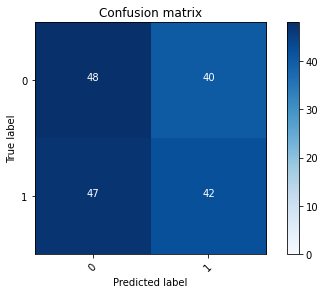

2022-08-20 16:51:43 - [Epoch Train: 29] loss: 0.3415, auc: 0.9099, acc: 0.8551, time: 50.00 s            
2022-08-20 16:51:43 - [Epoch Valid: 29] loss: 1.1426, auc: 0.4760, acc: 0.5058, time: 13.00 s


 29%|███████████▌                            | 29/100 [31:03<1:16:24, 64.57s/it]

2022-08-20 16:51:43 - EPOCH: 30
2022-08-20 16:51:44 - Train Step 10/973, train_loss: 0.2404
2022-08-20 16:51:45 - Train Step 20/973, train_loss: 0.3723
2022-08-20 16:51:45 - Train Step 30/973, train_loss: 0.3502
2022-08-20 16:51:46 - Train Step 40/973, train_loss: 0.3329
2022-08-20 16:51:46 - Train Step 50/973, train_loss: 0.3334
2022-08-20 16:51:47 - Train Step 60/973, train_loss: 0.3180
2022-08-20 16:51:47 - Train Step 70/973, train_loss: 0.3163
2022-08-20 16:51:48 - Train Step 80/973, train_loss: 0.3199
2022-08-20 16:51:48 - Train Step 90/973, train_loss: 0.3065
2022-08-20 16:51:49 - Train Step 100/973, train_loss: 0.3169
2022-08-20 16:51:49 - Train Step 110/973, train_loss: 0.3214
2022-08-20 16:51:50 - Train Step 120/973, train_loss: 0.3133
2022-08-20 16:51:50 - Train Step 130/973, train_loss: 0.3063
2022-08-20 16:51:51 - Train Step 140/973, train_loss: 0.3330
2022-08-20 16:51:51 - Train Step 150/973, train_loss: 0.3405
2022-08-20 16:51:52 - Train Step 160/973, train_loss: 0.3409
2

2022-08-20 16:52:43 - Valid Step 185/257, valid_loss: 1.0305
2022-08-20 16:52:44 - Valid Step 190/257, valid_loss: 1.0452
2022-08-20 16:52:44 - Valid Step 195/257, valid_loss: 1.0521
2022-08-20 16:52:44 - Valid Step 200/257, valid_loss: 1.0461
2022-08-20 16:52:44 - Valid Step 205/257, valid_loss: 1.0527
2022-08-20 16:52:45 - Valid Step 210/257, valid_loss: 1.0337
2022-08-20 16:52:45 - Valid Step 215/257, valid_loss: 1.0349
2022-08-20 16:52:45 - Valid Step 220/257, valid_loss: 1.0306
2022-08-20 16:52:45 - Valid Step 225/257, valid_loss: 1.0594
2022-08-20 16:52:46 - Valid Step 230/257, valid_loss: 1.0821
2022-08-20 16:52:46 - Valid Step 235/257, valid_loss: 1.0759
2022-08-20 16:52:46 - Valid Step 240/257, valid_loss: 1.0767
2022-08-20 16:52:47 - Valid Step 245/257, valid_loss: 1.1157
2022-08-20 16:52:47 - Valid Step 250/257, valid_loss: 1.1142
2022-08-20 16:52:47 - Valid Step 255/257, valid_loss: 1.1031
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

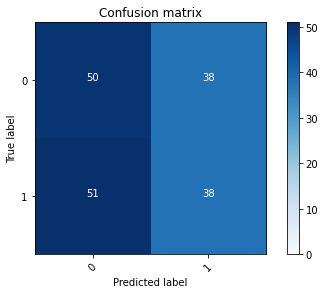

2022-08-20 16:52:47 - [Epoch Train: 30] loss: 0.3434, auc: 0.9075, acc: 0.8489, time: 50.00 s            
2022-08-20 16:52:47 - [Epoch Valid: 30] loss: 1.0964, auc: 0.4768, acc: 0.4981, time: 13.00 s


 30%|████████████                            | 30/100 [32:07<1:15:05, 64.37s/it]

2022-08-20 16:52:47 - EPOCH: 31
2022-08-20 16:52:48 - Train Step 10/973, train_loss: 0.5291
2022-08-20 16:52:49 - Train Step 20/973, train_loss: 0.3467
2022-08-20 16:52:49 - Train Step 30/973, train_loss: 0.3389
2022-08-20 16:52:50 - Train Step 40/973, train_loss: 0.3058
2022-08-20 16:52:50 - Train Step 50/973, train_loss: 0.2877
2022-08-20 16:52:51 - Train Step 60/973, train_loss: 0.2776
2022-08-20 16:52:51 - Train Step 70/973, train_loss: 0.3105
2022-08-20 16:52:52 - Train Step 80/973, train_loss: 0.3081
2022-08-20 16:52:52 - Train Step 90/973, train_loss: 0.3009
2022-08-20 16:52:53 - Train Step 100/973, train_loss: 0.3081
2022-08-20 16:52:53 - Train Step 110/973, train_loss: 0.2969
2022-08-20 16:52:54 - Train Step 120/973, train_loss: 0.3001
2022-08-20 16:52:54 - Train Step 130/973, train_loss: 0.3141
2022-08-20 16:52:55 - Train Step 140/973, train_loss: 0.3155
2022-08-20 16:52:55 - Train Step 150/973, train_loss: 0.3190
2022-08-20 16:52:56 - Train Step 160/973, train_loss: 0.3094
2

2022-08-20 16:53:48 - Valid Step 185/257, valid_loss: 1.0379
2022-08-20 16:53:48 - Valid Step 190/257, valid_loss: 1.0328
2022-08-20 16:53:49 - Valid Step 195/257, valid_loss: 1.0408
2022-08-20 16:53:49 - Valid Step 200/257, valid_loss: 1.0420
2022-08-20 16:53:49 - Valid Step 205/257, valid_loss: 1.0581
2022-08-20 16:53:50 - Valid Step 210/257, valid_loss: 1.0854
2022-08-20 16:53:50 - Valid Step 215/257, valid_loss: 1.0942
2022-08-20 16:53:50 - Valid Step 220/257, valid_loss: 1.0923
2022-08-20 16:53:50 - Valid Step 225/257, valid_loss: 1.0993
2022-08-20 16:53:51 - Valid Step 230/257, valid_loss: 1.1146
2022-08-20 16:53:51 - Valid Step 235/257, valid_loss: 1.1051
2022-08-20 16:53:51 - Valid Step 240/257, valid_loss: 1.1027
2022-08-20 16:53:51 - Valid Step 245/257, valid_loss: 1.1122
2022-08-20 16:53:52 - Valid Step 250/257, valid_loss: 1.1202
2022-08-20 16:53:52 - Valid Step 255/257, valid_loss: 1.1306
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

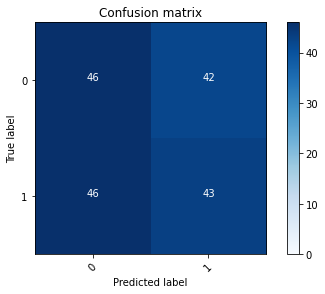

2022-08-20 16:53:52 - [Epoch Train: 31] loss: 0.3264, auc: 0.9147, acc: 0.8592, time: 51.00 s            
2022-08-20 16:53:52 - [Epoch Valid: 31] loss: 1.1450, auc: 0.4692, acc: 0.4942, time: 13.00 s


 31%|████████████▍                           | 31/100 [33:12<1:14:12, 64.53s/it]

2022-08-20 16:53:52 - EPOCH: 32
2022-08-20 16:53:53 - Train Step 10/973, train_loss: 0.3088
2022-08-20 16:53:53 - Train Step 20/973, train_loss: 0.3621
2022-08-20 16:53:54 - Train Step 30/973, train_loss: 0.3822
2022-08-20 16:53:55 - Train Step 40/973, train_loss: 0.3553
2022-08-20 16:53:55 - Train Step 50/973, train_loss: 0.3553
2022-08-20 16:53:56 - Train Step 60/973, train_loss: 0.4063
2022-08-20 16:53:56 - Train Step 70/973, train_loss: 0.3720
2022-08-20 16:53:57 - Train Step 80/973, train_loss: 0.3530
2022-08-20 16:53:57 - Train Step 90/973, train_loss: 0.3617
2022-08-20 16:53:58 - Train Step 100/973, train_loss: 0.3700
2022-08-20 16:53:58 - Train Step 110/973, train_loss: 0.3707
2022-08-20 16:53:59 - Train Step 120/973, train_loss: 0.3583
2022-08-20 16:53:59 - Train Step 130/973, train_loss: 0.3481
2022-08-20 16:54:00 - Train Step 140/973, train_loss: 0.3384
2022-08-20 16:54:00 - Train Step 150/973, train_loss: 0.3394
2022-08-20 16:54:01 - Train Step 160/973, train_loss: 0.3348
2

2022-08-20 16:54:53 - Valid Step 185/257, valid_loss: 1.1851
2022-08-20 16:54:53 - Valid Step 190/257, valid_loss: 1.1701
2022-08-20 16:54:54 - Valid Step 195/257, valid_loss: 1.1695
2022-08-20 16:54:54 - Valid Step 200/257, valid_loss: 1.1596
2022-08-20 16:54:54 - Valid Step 205/257, valid_loss: 1.1426
2022-08-20 16:54:54 - Valid Step 210/257, valid_loss: 1.1311
2022-08-20 16:54:55 - Valid Step 215/257, valid_loss: 1.1324
2022-08-20 16:54:55 - Valid Step 220/257, valid_loss: 1.1146
2022-08-20 16:54:55 - Valid Step 225/257, valid_loss: 1.1280
2022-08-20 16:54:55 - Valid Step 230/257, valid_loss: 1.1510
2022-08-20 16:54:56 - Valid Step 235/257, valid_loss: 1.1514
2022-08-20 16:54:56 - Valid Step 240/257, valid_loss: 1.1590
2022-08-20 16:54:56 - Valid Step 245/257, valid_loss: 1.1539
2022-08-20 16:54:56 - Valid Step 250/257, valid_loss: 1.1422
2022-08-20 16:54:57 - Valid Step 255/257, valid_loss: 1.1641
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

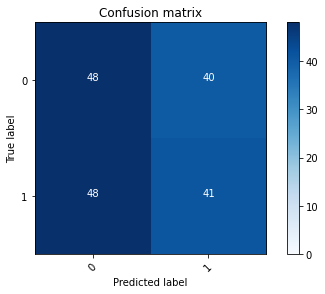

2022-08-20 16:54:57 - [Epoch Train: 32] loss: 0.3103, auc: 0.9278, acc: 0.8808, time: 50.00 s            
2022-08-20 16:54:57 - [Epoch Valid: 32] loss: 1.1596, auc: 0.4718, acc: 0.4981, time: 13.00 s


 32%|████████████▊                           | 32/100 [34:17<1:13:12, 64.60s/it]

2022-08-20 16:54:57 - EPOCH: 33
2022-08-20 16:54:58 - Train Step 10/973, train_loss: 0.1620
2022-08-20 16:54:58 - Train Step 20/973, train_loss: 0.1963
2022-08-20 16:54:59 - Train Step 30/973, train_loss: 0.1746
2022-08-20 16:54:59 - Train Step 40/973, train_loss: 0.1904
2022-08-20 16:55:00 - Train Step 50/973, train_loss: 0.2182
2022-08-20 16:55:00 - Train Step 60/973, train_loss: 0.2281
2022-08-20 16:55:01 - Train Step 70/973, train_loss: 0.2401
2022-08-20 16:55:01 - Train Step 80/973, train_loss: 0.2288
2022-08-20 16:55:02 - Train Step 90/973, train_loss: 0.2343
2022-08-20 16:55:02 - Train Step 100/973, train_loss: 0.2458
2022-08-20 16:55:03 - Train Step 110/973, train_loss: 0.2426
2022-08-20 16:55:04 - Train Step 120/973, train_loss: 0.2477
2022-08-20 16:55:04 - Train Step 130/973, train_loss: 0.2454
2022-08-20 16:55:05 - Train Step 140/973, train_loss: 0.2423
2022-08-20 16:55:05 - Train Step 150/973, train_loss: 0.2472
2022-08-20 16:55:06 - Train Step 160/973, train_loss: 0.2531
2

2022-08-20 16:55:58 - Valid Step 185/257, valid_loss: 1.1479
2022-08-20 16:55:58 - Valid Step 190/257, valid_loss: 1.1374
2022-08-20 16:55:59 - Valid Step 195/257, valid_loss: 1.1384
2022-08-20 16:55:59 - Valid Step 200/257, valid_loss: 1.1625
2022-08-20 16:55:59 - Valid Step 205/257, valid_loss: 1.1762
2022-08-20 16:55:59 - Valid Step 210/257, valid_loss: 1.1564
2022-08-20 16:56:00 - Valid Step 215/257, valid_loss: 1.1442
2022-08-20 16:56:00 - Valid Step 220/257, valid_loss: 1.1537
2022-08-20 16:56:00 - Valid Step 225/257, valid_loss: 1.1679
2022-08-20 16:56:00 - Valid Step 230/257, valid_loss: 1.1645
2022-08-20 16:56:01 - Valid Step 235/257, valid_loss: 1.1619
2022-08-20 16:56:01 - Valid Step 240/257, valid_loss: 1.1743
2022-08-20 16:56:01 - Valid Step 245/257, valid_loss: 1.1730
2022-08-20 16:56:01 - Valid Step 250/257, valid_loss: 1.1886
2022-08-20 16:56:02 - Valid Step 255/257, valid_loss: 1.1786
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

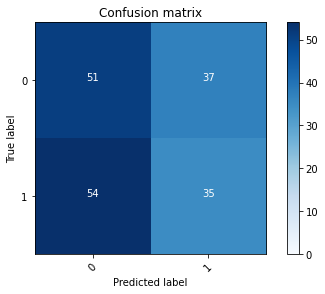

2022-08-20 16:56:02 - [Epoch Train: 33] loss: 0.3062, auc: 0.9236, acc: 0.8715, time: 51.00 s            
2022-08-20 16:56:02 - [Epoch Valid: 33] loss: 1.1876, auc: 0.4676, acc: 0.4864, time: 13.00 s


 33%|█████████████▏                          | 33/100 [35:22<1:12:15, 64.70s/it]

2022-08-20 16:56:02 - EPOCH: 34
2022-08-20 16:56:03 - Train Step 10/973, train_loss: 0.2314
2022-08-20 16:56:03 - Train Step 20/973, train_loss: 0.1890
2022-08-20 16:56:04 - Train Step 30/973, train_loss: 0.2660
2022-08-20 16:56:04 - Train Step 40/973, train_loss: 0.2482
2022-08-20 16:56:05 - Train Step 50/973, train_loss: 0.2302
2022-08-20 16:56:05 - Train Step 60/973, train_loss: 0.2464
2022-08-20 16:56:06 - Train Step 70/973, train_loss: 0.2462
2022-08-20 16:56:06 - Train Step 80/973, train_loss: 0.2506
2022-08-20 16:56:07 - Train Step 90/973, train_loss: 0.2502
2022-08-20 16:56:07 - Train Step 100/973, train_loss: 0.2624
2022-08-20 16:56:08 - Train Step 110/973, train_loss: 0.2613
2022-08-20 16:56:08 - Train Step 120/973, train_loss: 0.2597
2022-08-20 16:56:09 - Train Step 130/973, train_loss: 0.2562
2022-08-20 16:56:09 - Train Step 140/973, train_loss: 0.2468
2022-08-20 16:56:10 - Train Step 150/973, train_loss: 0.2719
2022-08-20 16:56:10 - Train Step 160/973, train_loss: 0.2990
2

2022-08-20 16:57:03 - Valid Step 185/257, valid_loss: 1.2288
2022-08-20 16:57:04 - Valid Step 190/257, valid_loss: 1.2521
2022-08-20 16:57:04 - Valid Step 195/257, valid_loss: 1.2718
2022-08-20 16:57:04 - Valid Step 200/257, valid_loss: 1.2686
2022-08-20 16:57:04 - Valid Step 205/257, valid_loss: 1.3069
2022-08-20 16:57:05 - Valid Step 210/257, valid_loss: 1.3258
2022-08-20 16:57:05 - Valid Step 215/257, valid_loss: 1.3333
2022-08-20 16:57:05 - Valid Step 220/257, valid_loss: 1.3321
2022-08-20 16:57:05 - Valid Step 225/257, valid_loss: 1.3116
2022-08-20 16:57:06 - Valid Step 230/257, valid_loss: 1.3080
2022-08-20 16:57:06 - Valid Step 235/257, valid_loss: 1.2974
2022-08-20 16:57:06 - Valid Step 240/257, valid_loss: 1.3007
2022-08-20 16:57:06 - Valid Step 245/257, valid_loss: 1.2926
2022-08-20 16:57:07 - Valid Step 250/257, valid_loss: 1.2937
2022-08-20 16:57:07 - Valid Step 255/257, valid_loss: 1.2774
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

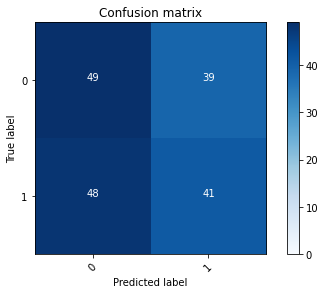

2022-08-20 16:57:07 - [Epoch Train: 34] loss: 0.2946, auc: 0.9335, acc: 0.8859, time: 51.00 s            
2022-08-20 16:57:07 - [Epoch Valid: 34] loss: 1.2718, auc: 0.4853, acc: 0.4981, time: 13.00 s


 34%|█████████████▌                          | 34/100 [36:27<1:11:21, 64.87s/it]

2022-08-20 16:57:07 - EPOCH: 35
2022-08-20 16:57:08 - Train Step 10/973, train_loss: 0.1519
2022-08-20 16:57:08 - Train Step 20/973, train_loss: 0.2180
2022-08-20 16:57:09 - Train Step 30/973, train_loss: 0.1904
2022-08-20 16:57:09 - Train Step 40/973, train_loss: 0.2726
2022-08-20 16:57:10 - Train Step 50/973, train_loss: 0.2638
2022-08-20 16:57:10 - Train Step 60/973, train_loss: 0.2433
2022-08-20 16:57:11 - Train Step 70/973, train_loss: 0.2604
2022-08-20 16:57:11 - Train Step 80/973, train_loss: 0.2881
2022-08-20 16:57:12 - Train Step 90/973, train_loss: 0.2757
2022-08-20 16:57:13 - Train Step 100/973, train_loss: 0.2641
2022-08-20 16:57:13 - Train Step 110/973, train_loss: 0.2478
2022-08-20 16:57:14 - Train Step 120/973, train_loss: 0.2717
2022-08-20 16:57:14 - Train Step 130/973, train_loss: 0.2754
2022-08-20 16:57:15 - Train Step 140/973, train_loss: 0.2723
2022-08-20 16:57:15 - Train Step 150/973, train_loss: 0.2601
2022-08-20 16:57:16 - Train Step 160/973, train_loss: 0.2602
2

2022-08-20 16:58:08 - Valid Step 185/257, valid_loss: 1.1032
2022-08-20 16:58:08 - Valid Step 190/257, valid_loss: 1.1101
2022-08-20 16:58:08 - Valid Step 195/257, valid_loss: 1.1143
2022-08-20 16:58:09 - Valid Step 200/257, valid_loss: 1.0999
2022-08-20 16:58:09 - Valid Step 205/257, valid_loss: 1.0950
2022-08-20 16:58:09 - Valid Step 210/257, valid_loss: 1.0977
2022-08-20 16:58:09 - Valid Step 215/257, valid_loss: 1.1120
2022-08-20 16:58:10 - Valid Step 220/257, valid_loss: 1.1108
2022-08-20 16:58:10 - Valid Step 225/257, valid_loss: 1.1000
2022-08-20 16:58:10 - Valid Step 230/257, valid_loss: 1.1020
2022-08-20 16:58:10 - Valid Step 235/257, valid_loss: 1.1159
2022-08-20 16:58:11 - Valid Step 240/257, valid_loss: 1.1022
2022-08-20 16:58:11 - Valid Step 245/257, valid_loss: 1.1356
2022-08-20 16:58:11 - Valid Step 250/257, valid_loss: 1.1222
2022-08-20 16:58:11 - Valid Step 255/257, valid_loss: 1.1252
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

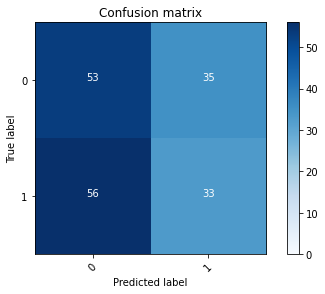

2022-08-20 16:58:12 - [Epoch Train: 35] loss: 0.2794, auc: 0.9396, acc: 0.8952, time: 50.00 s            
2022-08-20 16:58:12 - [Epoch Valid: 35] loss: 1.1273, auc: 0.4695, acc: 0.4903, time: 13.00 s


 35%|██████████████                          | 35/100 [37:31<1:10:07, 64.72s/it]

2022-08-20 16:58:12 - EPOCH: 36
2022-08-20 16:58:12 - Train Step 10/973, train_loss: 0.5528
2022-08-20 16:58:13 - Train Step 20/973, train_loss: 0.3191
2022-08-20 16:58:13 - Train Step 30/973, train_loss: 0.2865
2022-08-20 16:58:14 - Train Step 40/973, train_loss: 0.2834
2022-08-20 16:58:14 - Train Step 50/973, train_loss: 0.2566
2022-08-20 16:58:15 - Train Step 60/973, train_loss: 0.2562
2022-08-20 16:58:15 - Train Step 70/973, train_loss: 0.2470
2022-08-20 16:58:16 - Train Step 80/973, train_loss: 0.2377
2022-08-20 16:58:16 - Train Step 90/973, train_loss: 0.2262
2022-08-20 16:58:17 - Train Step 100/973, train_loss: 0.2336
2022-08-20 16:58:17 - Train Step 110/973, train_loss: 0.2360
2022-08-20 16:58:18 - Train Step 120/973, train_loss: 0.2264
2022-08-20 16:58:18 - Train Step 130/973, train_loss: 0.2224
2022-08-20 16:58:19 - Train Step 140/973, train_loss: 0.2247
2022-08-20 16:58:20 - Train Step 150/973, train_loss: 0.2525
2022-08-20 16:58:20 - Train Step 160/973, train_loss: 0.2546
2

2022-08-20 16:59:12 - Valid Step 185/257, valid_loss: 1.1832
2022-08-20 16:59:13 - Valid Step 190/257, valid_loss: 1.2185
2022-08-20 16:59:13 - Valid Step 195/257, valid_loss: 1.2069
2022-08-20 16:59:13 - Valid Step 200/257, valid_loss: 1.2204
2022-08-20 16:59:14 - Valid Step 205/257, valid_loss: 1.2058
2022-08-20 16:59:14 - Valid Step 210/257, valid_loss: 1.2090
2022-08-20 16:59:14 - Valid Step 215/257, valid_loss: 1.2092
2022-08-20 16:59:14 - Valid Step 220/257, valid_loss: 1.1973
2022-08-20 16:59:15 - Valid Step 225/257, valid_loss: 1.1973
2022-08-20 16:59:15 - Valid Step 230/257, valid_loss: 1.2241
2022-08-20 16:59:15 - Valid Step 235/257, valid_loss: 1.2346
2022-08-20 16:59:15 - Valid Step 240/257, valid_loss: 1.2488
2022-08-20 16:59:16 - Valid Step 245/257, valid_loss: 1.2324
2022-08-20 16:59:16 - Valid Step 250/257, valid_loss: 1.2241
2022-08-20 16:59:16 - Valid Step 255/257, valid_loss: 1.2156
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

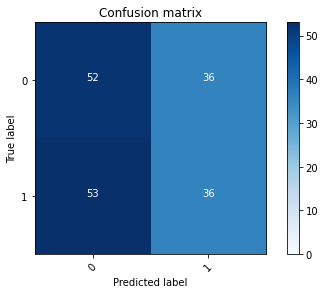

2022-08-20 16:59:16 - [Epoch Train: 36] loss: 0.2629, auc: 0.9496, acc: 0.8993, time: 51.00 s            
2022-08-20 16:59:16 - [Epoch Valid: 36] loss: 1.2161, auc: 0.4765, acc: 0.4942, time: 13.00 s


 36%|██████████████▍                         | 36/100 [38:36<1:09:03, 64.74s/it]

2022-08-20 16:59:16 - EPOCH: 37
2022-08-20 16:59:17 - Train Step 10/973, train_loss: 0.3096
2022-08-20 16:59:18 - Train Step 20/973, train_loss: 0.3322
2022-08-20 16:59:18 - Train Step 30/973, train_loss: 0.3737
2022-08-20 16:59:19 - Train Step 40/973, train_loss: 0.4054
2022-08-20 16:59:19 - Train Step 50/973, train_loss: 0.4133
2022-08-20 16:59:20 - Train Step 60/973, train_loss: 0.4027
2022-08-20 16:59:20 - Train Step 70/973, train_loss: 0.4004
2022-08-20 16:59:21 - Train Step 80/973, train_loss: 0.3752
2022-08-20 16:59:21 - Train Step 90/973, train_loss: 0.3580
2022-08-20 16:59:22 - Train Step 100/973, train_loss: 0.3366
2022-08-20 16:59:22 - Train Step 110/973, train_loss: 0.3171
2022-08-20 16:59:23 - Train Step 120/973, train_loss: 0.3175
2022-08-20 16:59:23 - Train Step 130/973, train_loss: 0.3170
2022-08-20 16:59:24 - Train Step 140/973, train_loss: 0.3139
2022-08-20 16:59:24 - Train Step 150/973, train_loss: 0.3073
2022-08-20 16:59:25 - Train Step 160/973, train_loss: 0.3118
2

2022-08-20 17:00:17 - Valid Step 185/257, valid_loss: 1.2823
2022-08-20 17:00:18 - Valid Step 190/257, valid_loss: 1.2822
2022-08-20 17:00:18 - Valid Step 195/257, valid_loss: 1.2568
2022-08-20 17:00:18 - Valid Step 200/257, valid_loss: 1.2794
2022-08-20 17:00:18 - Valid Step 205/257, valid_loss: 1.2847
2022-08-20 17:00:19 - Valid Step 210/257, valid_loss: 1.3014
2022-08-20 17:00:19 - Valid Step 215/257, valid_loss: 1.2885
2022-08-20 17:00:19 - Valid Step 220/257, valid_loss: 1.2633
2022-08-20 17:00:19 - Valid Step 225/257, valid_loss: 1.2442
2022-08-20 17:00:20 - Valid Step 230/257, valid_loss: 1.2264
2022-08-20 17:00:20 - Valid Step 235/257, valid_loss: 1.2405
2022-08-20 17:00:20 - Valid Step 240/257, valid_loss: 1.2388
2022-08-20 17:00:20 - Valid Step 245/257, valid_loss: 1.2470
2022-08-20 17:00:21 - Valid Step 250/257, valid_loss: 1.2486
2022-08-20 17:00:21 - Valid Step 255/257, valid_loss: 1.2494
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

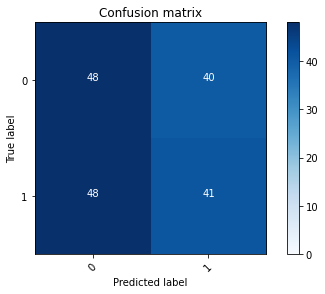

2022-08-20 17:00:21 - [Epoch Train: 37] loss: 0.2732, auc: 0.9416, acc: 0.8849, time: 51.00 s            
2022-08-20 17:00:21 - [Epoch Valid: 37] loss: 1.2436, auc: 0.4848, acc: 0.4942, time: 13.00 s


 37%|██████████████▊                         | 37/100 [39:41<1:08:00, 64.77s/it]

2022-08-20 17:00:21 - EPOCH: 38
2022-08-20 17:00:22 - Train Step 10/973, train_loss: 0.1652
2022-08-20 17:00:22 - Train Step 20/973, train_loss: 0.1537
2022-08-20 17:00:23 - Train Step 30/973, train_loss: 0.1827
2022-08-20 17:00:23 - Train Step 40/973, train_loss: 0.1901
2022-08-20 17:00:24 - Train Step 50/973, train_loss: 0.2024
2022-08-20 17:00:24 - Train Step 60/973, train_loss: 0.1893
2022-08-20 17:00:25 - Train Step 70/973, train_loss: 0.2005
2022-08-20 17:00:25 - Train Step 80/973, train_loss: 0.2041
2022-08-20 17:00:26 - Train Step 90/973, train_loss: 0.2084
2022-08-20 17:00:27 - Train Step 100/973, train_loss: 0.2095
2022-08-20 17:00:27 - Train Step 110/973, train_loss: 0.2067
2022-08-20 17:00:28 - Train Step 120/973, train_loss: 0.2117
2022-08-20 17:00:28 - Train Step 130/973, train_loss: 0.2244
2022-08-20 17:00:29 - Train Step 140/973, train_loss: 0.2452
2022-08-20 17:00:29 - Train Step 150/973, train_loss: 0.2410
2022-08-20 17:00:30 - Train Step 160/973, train_loss: 0.2475
2

2022-08-20 17:01:21 - Valid Step 185/257, valid_loss: 1.2972
2022-08-20 17:01:21 - Valid Step 190/257, valid_loss: 1.2918
2022-08-20 17:01:22 - Valid Step 195/257, valid_loss: 1.2793
2022-08-20 17:01:22 - Valid Step 200/257, valid_loss: 1.2986
2022-08-20 17:01:22 - Valid Step 205/257, valid_loss: 1.2778
2022-08-20 17:01:22 - Valid Step 210/257, valid_loss: 1.2533
2022-08-20 17:01:23 - Valid Step 215/257, valid_loss: 1.2741
2022-08-20 17:01:23 - Valid Step 220/257, valid_loss: 1.2973
2022-08-20 17:01:23 - Valid Step 225/257, valid_loss: 1.2863
2022-08-20 17:01:23 - Valid Step 230/257, valid_loss: 1.2613
2022-08-20 17:01:24 - Valid Step 235/257, valid_loss: 1.2650
2022-08-20 17:01:24 - Valid Step 240/257, valid_loss: 1.2759
2022-08-20 17:01:24 - Valid Step 245/257, valid_loss: 1.2659
2022-08-20 17:01:24 - Valid Step 250/257, valid_loss: 1.2529
2022-08-20 17:01:25 - Valid Step 255/257, valid_loss: 1.2390
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

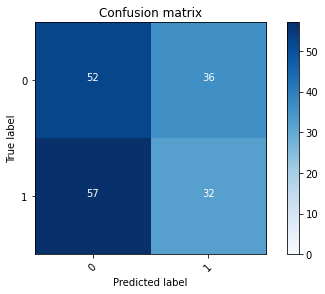

2022-08-20 17:01:25 - [Epoch Train: 38] loss: 0.2496, auc: 0.9548, acc: 0.9075, time: 50.00 s            
2022-08-20 17:01:25 - [Epoch Valid: 38] loss: 1.2623, auc: 0.4571, acc: 0.4630, time: 13.00 s


 38%|███████████████▏                        | 38/100 [40:45<1:06:35, 64.44s/it]

2022-08-20 17:01:25 - EPOCH: 39
2022-08-20 17:01:26 - Train Step 10/973, train_loss: 0.1539
2022-08-20 17:01:26 - Train Step 20/973, train_loss: 0.2105
2022-08-20 17:01:27 - Train Step 30/973, train_loss: 0.2514
2022-08-20 17:01:27 - Train Step 40/973, train_loss: 0.2651
2022-08-20 17:01:28 - Train Step 50/973, train_loss: 0.2375
2022-08-20 17:01:28 - Train Step 60/973, train_loss: 0.2151
2022-08-20 17:01:29 - Train Step 70/973, train_loss: 0.2043
2022-08-20 17:01:29 - Train Step 80/973, train_loss: 0.2164
2022-08-20 17:01:30 - Train Step 90/973, train_loss: 0.2164
2022-08-20 17:01:30 - Train Step 100/973, train_loss: 0.2207
2022-08-20 17:01:31 - Train Step 110/973, train_loss: 0.2259
2022-08-20 17:01:31 - Train Step 120/973, train_loss: 0.2310
2022-08-20 17:01:32 - Train Step 130/973, train_loss: 0.2260
2022-08-20 17:01:32 - Train Step 140/973, train_loss: 0.2369
2022-08-20 17:01:33 - Train Step 150/973, train_loss: 0.2359
2022-08-20 17:01:33 - Train Step 160/973, train_loss: 0.2391
2

2022-08-20 17:02:25 - Valid Step 185/257, valid_loss: 1.2395
2022-08-20 17:02:25 - Valid Step 190/257, valid_loss: 1.3034
2022-08-20 17:02:25 - Valid Step 195/257, valid_loss: 1.3025
2022-08-20 17:02:25 - Valid Step 200/257, valid_loss: 1.2986
2022-08-20 17:02:26 - Valid Step 205/257, valid_loss: 1.2966
2022-08-20 17:02:26 - Valid Step 210/257, valid_loss: 1.2843
2022-08-20 17:02:26 - Valid Step 215/257, valid_loss: 1.2786
2022-08-20 17:02:26 - Valid Step 220/257, valid_loss: 1.2587
2022-08-20 17:02:27 - Valid Step 225/257, valid_loss: 1.2504
2022-08-20 17:02:27 - Valid Step 230/257, valid_loss: 1.2564
2022-08-20 17:02:27 - Valid Step 235/257, valid_loss: 1.2720
2022-08-20 17:02:27 - Valid Step 240/257, valid_loss: 1.3047
2022-08-20 17:02:28 - Valid Step 245/257, valid_loss: 1.2922
2022-08-20 17:02:28 - Valid Step 250/257, valid_loss: 1.2972
2022-08-20 17:02:28 - Valid Step 255/257, valid_loss: 1.2857
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

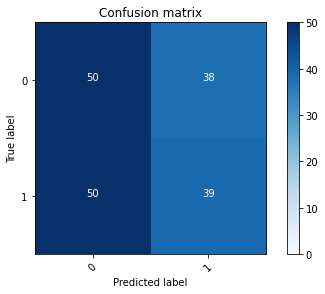

2022-08-20 17:02:28 - [Epoch Train: 39] loss: 0.2586, auc: 0.9478, acc: 0.9024, time: 49.00 s            
2022-08-20 17:02:28 - [Epoch Valid: 39] loss: 1.2997, auc: 0.4784, acc: 0.4942, time: 13.00 s


 39%|███████████████▌                        | 39/100 [41:48<1:05:14, 64.17s/it]

2022-08-20 17:02:28 - EPOCH: 40
2022-08-20 17:02:29 - Train Step 10/973, train_loss: 0.1060
2022-08-20 17:02:30 - Train Step 20/973, train_loss: 0.1802
2022-08-20 17:02:30 - Train Step 30/973, train_loss: 0.2443
2022-08-20 17:02:31 - Train Step 40/973, train_loss: 0.2527
2022-08-20 17:02:31 - Train Step 50/973, train_loss: 0.2616
2022-08-20 17:02:32 - Train Step 60/973, train_loss: 0.2675
2022-08-20 17:02:32 - Train Step 70/973, train_loss: 0.2874
2022-08-20 17:02:33 - Train Step 80/973, train_loss: 0.2711
2022-08-20 17:02:33 - Train Step 90/973, train_loss: 0.2603
2022-08-20 17:02:34 - Train Step 100/973, train_loss: 0.2564
2022-08-20 17:02:34 - Train Step 110/973, train_loss: 0.2556
2022-08-20 17:02:35 - Train Step 120/973, train_loss: 0.2489
2022-08-20 17:02:35 - Train Step 130/973, train_loss: 0.2417
2022-08-20 17:02:36 - Train Step 140/973, train_loss: 0.2442
2022-08-20 17:02:37 - Train Step 150/973, train_loss: 0.2455
2022-08-20 17:02:37 - Train Step 160/973, train_loss: 0.2499
2

2022-08-20 17:03:30 - Valid Step 185/257, valid_loss: 1.4346
2022-08-20 17:03:30 - Valid Step 190/257, valid_loss: 1.4582
2022-08-20 17:03:30 - Valid Step 195/257, valid_loss: 1.4432
2022-08-20 17:03:31 - Valid Step 200/257, valid_loss: 1.4206
2022-08-20 17:03:31 - Valid Step 205/257, valid_loss: 1.4272
2022-08-20 17:03:31 - Valid Step 210/257, valid_loss: 1.4131
2022-08-20 17:03:31 - Valid Step 215/257, valid_loss: 1.4375
2022-08-20 17:03:32 - Valid Step 220/257, valid_loss: 1.4898
2022-08-20 17:03:32 - Valid Step 225/257, valid_loss: 1.4833
2022-08-20 17:03:32 - Valid Step 230/257, valid_loss: 1.4907
2022-08-20 17:03:32 - Valid Step 235/257, valid_loss: 1.4804
2022-08-20 17:03:33 - Valid Step 240/257, valid_loss: 1.4729
2022-08-20 17:03:33 - Valid Step 245/257, valid_loss: 1.4534
2022-08-20 17:03:33 - Valid Step 250/257, valid_loss: 1.4352
2022-08-20 17:03:33 - Valid Step 255/257, valid_loss: 1.4251
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

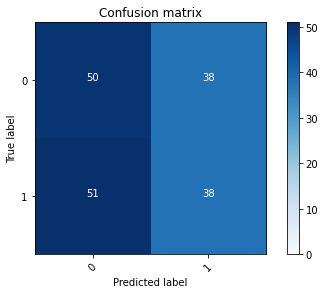

2022-08-20 17:03:34 - [Epoch Train: 40] loss: 0.2401, auc: 0.9588, acc: 0.9065, time: 51.00 s            
2022-08-20 17:03:34 - [Epoch Valid: 40] loss: 1.4417, auc: 0.4694, acc: 0.4903, time: 13.00 s


 40%|████████████████                        | 40/100 [42:53<1:04:29, 64.50s/it]

2022-08-20 17:03:34 - EPOCH: 41
2022-08-20 17:03:34 - Train Step 10/973, train_loss: 0.3744
2022-08-20 17:03:35 - Train Step 20/973, train_loss: 0.3401
2022-08-20 17:03:35 - Train Step 30/973, train_loss: 0.3531
2022-08-20 17:03:36 - Train Step 40/973, train_loss: 0.2942
2022-08-20 17:03:36 - Train Step 50/973, train_loss: 0.2952
2022-08-20 17:03:37 - Train Step 60/973, train_loss: 0.2750
2022-08-20 17:03:37 - Train Step 70/973, train_loss: 0.2779
2022-08-20 17:03:38 - Train Step 80/973, train_loss: 0.2680
2022-08-20 17:03:38 - Train Step 90/973, train_loss: 0.2596
2022-08-20 17:03:39 - Train Step 100/973, train_loss: 0.2442
2022-08-20 17:03:40 - Train Step 110/973, train_loss: 0.2499
2022-08-20 17:03:40 - Train Step 120/973, train_loss: 0.2529
2022-08-20 17:03:41 - Train Step 130/973, train_loss: 0.2442
2022-08-20 17:03:41 - Train Step 140/973, train_loss: 0.2392
2022-08-20 17:03:42 - Train Step 150/973, train_loss: 0.2334
2022-08-20 17:03:42 - Train Step 160/973, train_loss: 0.2321
2

2022-08-20 17:04:34 - Valid Step 185/257, valid_loss: 1.3939
2022-08-20 17:04:34 - Valid Step 190/257, valid_loss: 1.3938
2022-08-20 17:04:34 - Valid Step 195/257, valid_loss: 1.4074
2022-08-20 17:04:34 - Valid Step 200/257, valid_loss: 1.3978
2022-08-20 17:04:35 - Valid Step 205/257, valid_loss: 1.3871
2022-08-20 17:04:35 - Valid Step 210/257, valid_loss: 1.3908
2022-08-20 17:04:35 - Valid Step 215/257, valid_loss: 1.3906
2022-08-20 17:04:35 - Valid Step 220/257, valid_loss: 1.3720
2022-08-20 17:04:36 - Valid Step 225/257, valid_loss: 1.3820
2022-08-20 17:04:36 - Valid Step 230/257, valid_loss: 1.3904
2022-08-20 17:04:36 - Valid Step 235/257, valid_loss: 1.3715
2022-08-20 17:04:37 - Valid Step 240/257, valid_loss: 1.3711
2022-08-20 17:04:37 - Valid Step 245/257, valid_loss: 1.3615
2022-08-20 17:04:37 - Valid Step 250/257, valid_loss: 1.3680
2022-08-20 17:04:37 - Valid Step 255/257, valid_loss: 1.3474
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

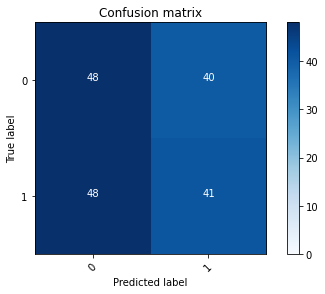

2022-08-20 17:04:38 - [Epoch Train: 41] loss: 0.2348, auc: 0.9574, acc: 0.9054, time: 50.00 s            
2022-08-20 17:04:38 - [Epoch Valid: 41] loss: 1.3505, auc: 0.4765, acc: 0.4903, time: 13.00 s


 41%|████████████████▍                       | 41/100 [43:57<1:03:15, 64.33s/it]

2022-08-20 17:04:38 - EPOCH: 42
2022-08-20 17:04:38 - Train Step 10/973, train_loss: 0.3777
2022-08-20 17:04:39 - Train Step 20/973, train_loss: 0.2390
2022-08-20 17:04:39 - Train Step 30/973, train_loss: 0.2996
2022-08-20 17:04:40 - Train Step 40/973, train_loss: 0.2847
2022-08-20 17:04:40 - Train Step 50/973, train_loss: 0.3114
2022-08-20 17:04:41 - Train Step 60/973, train_loss: 0.3004
2022-08-20 17:04:41 - Train Step 70/973, train_loss: 0.2957
2022-08-20 17:04:42 - Train Step 80/973, train_loss: 0.2935
2022-08-20 17:04:42 - Train Step 90/973, train_loss: 0.2734
2022-08-20 17:04:43 - Train Step 100/973, train_loss: 0.2527
2022-08-20 17:04:43 - Train Step 110/973, train_loss: 0.2599
2022-08-20 17:04:44 - Train Step 120/973, train_loss: 0.2603
2022-08-20 17:04:44 - Train Step 130/973, train_loss: 0.2642
2022-08-20 17:04:45 - Train Step 140/973, train_loss: 0.2611
2022-08-20 17:04:45 - Train Step 150/973, train_loss: 0.2480
2022-08-20 17:04:46 - Train Step 160/973, train_loss: 0.2450
2

2022-08-20 17:05:39 - Valid Step 185/257, valid_loss: 1.2296
2022-08-20 17:05:39 - Valid Step 190/257, valid_loss: 1.2610
2022-08-20 17:05:39 - Valid Step 195/257, valid_loss: 1.2518
2022-08-20 17:05:39 - Valid Step 200/257, valid_loss: 1.2415
2022-08-20 17:05:40 - Valid Step 205/257, valid_loss: 1.2789
2022-08-20 17:05:40 - Valid Step 210/257, valid_loss: 1.2807
2022-08-20 17:05:40 - Valid Step 215/257, valid_loss: 1.3006
2022-08-20 17:05:40 - Valid Step 220/257, valid_loss: 1.3242
2022-08-20 17:05:41 - Valid Step 225/257, valid_loss: 1.3402
2022-08-20 17:05:41 - Valid Step 230/257, valid_loss: 1.3897
2022-08-20 17:05:41 - Valid Step 235/257, valid_loss: 1.3791
2022-08-20 17:05:41 - Valid Step 240/257, valid_loss: 1.3701
2022-08-20 17:05:42 - Valid Step 245/257, valid_loss: 1.4082
2022-08-20 17:05:42 - Valid Step 250/257, valid_loss: 1.4448
2022-08-20 17:05:42 - Valid Step 255/257, valid_loss: 1.4601
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

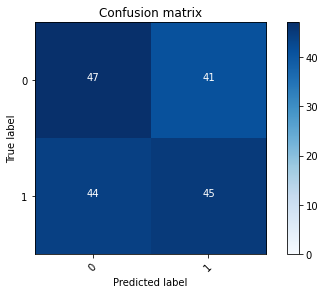

2022-08-20 17:05:42 - [Epoch Train: 42] loss: 0.2303, auc: 0.9577, acc: 0.9168, time: 51.00 s            
2022-08-20 17:05:42 - [Epoch Valid: 42] loss: 1.4570, auc: 0.4765, acc: 0.5058, time: 13.00 s


 42%|████████████████▊                       | 42/100 [45:02<1:02:19, 64.47s/it]

2022-08-20 17:05:42 - EPOCH: 43
2022-08-20 17:05:43 - Train Step 10/973, train_loss: 0.2447
2022-08-20 17:05:44 - Train Step 20/973, train_loss: 0.2158
2022-08-20 17:05:44 - Train Step 30/973, train_loss: 0.2149
2022-08-20 17:05:45 - Train Step 40/973, train_loss: 0.2073
2022-08-20 17:05:45 - Train Step 50/973, train_loss: 0.1766
2022-08-20 17:05:46 - Train Step 60/973, train_loss: 0.1909
2022-08-20 17:05:46 - Train Step 70/973, train_loss: 0.1964
2022-08-20 17:05:47 - Train Step 80/973, train_loss: 0.2026
2022-08-20 17:05:47 - Train Step 90/973, train_loss: 0.1986
2022-08-20 17:05:48 - Train Step 100/973, train_loss: 0.1951
2022-08-20 17:05:48 - Train Step 110/973, train_loss: 0.2064
2022-08-20 17:05:49 - Train Step 120/973, train_loss: 0.2132
2022-08-20 17:05:49 - Train Step 130/973, train_loss: 0.2251
2022-08-20 17:05:50 - Train Step 140/973, train_loss: 0.2216
2022-08-20 17:05:51 - Train Step 150/973, train_loss: 0.2113
2022-08-20 17:05:51 - Train Step 160/973, train_loss: 0.2075
2

2022-08-20 17:06:43 - Valid Step 185/257, valid_loss: 1.5294
2022-08-20 17:06:43 - Valid Step 190/257, valid_loss: 1.5143
2022-08-20 17:06:43 - Valid Step 195/257, valid_loss: 1.5087
2022-08-20 17:06:44 - Valid Step 200/257, valid_loss: 1.4788
2022-08-20 17:06:44 - Valid Step 205/257, valid_loss: 1.4975
2022-08-20 17:06:44 - Valid Step 210/257, valid_loss: 1.4929
2022-08-20 17:06:44 - Valid Step 215/257, valid_loss: 1.5196
2022-08-20 17:06:45 - Valid Step 220/257, valid_loss: 1.5226
2022-08-20 17:06:45 - Valid Step 225/257, valid_loss: 1.5309
2022-08-20 17:06:45 - Valid Step 230/257, valid_loss: 1.5257
2022-08-20 17:06:45 - Valid Step 235/257, valid_loss: 1.5298
2022-08-20 17:06:46 - Valid Step 240/257, valid_loss: 1.5057
2022-08-20 17:06:46 - Valid Step 245/257, valid_loss: 1.4922
2022-08-20 17:06:46 - Valid Step 250/257, valid_loss: 1.4917
2022-08-20 17:06:46 - Valid Step 255/257, valid_loss: 1.4943
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

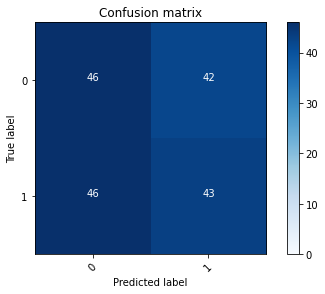

2022-08-20 17:06:47 - [Epoch Train: 43] loss: 0.2163, auc: 0.9660, acc: 0.9198, time: 50.00 s            
2022-08-20 17:06:47 - [Epoch Valid: 43] loss: 1.4952, auc: 0.4729, acc: 0.4903, time: 13.00 s


 43%|█████████████████▏                      | 43/100 [46:06<1:01:11, 64.41s/it]

2022-08-20 17:06:47 - EPOCH: 44
2022-08-20 17:06:47 - Train Step 10/973, train_loss: 0.2787
2022-08-20 17:06:48 - Train Step 20/973, train_loss: 0.2522
2022-08-20 17:06:48 - Train Step 30/973, train_loss: 0.2026
2022-08-20 17:06:49 - Train Step 40/973, train_loss: 0.2004
2022-08-20 17:06:49 - Train Step 50/973, train_loss: 0.1758
2022-08-20 17:06:50 - Train Step 60/973, train_loss: 0.1674
2022-08-20 17:06:50 - Train Step 70/973, train_loss: 0.1945
2022-08-20 17:06:51 - Train Step 80/973, train_loss: 0.1852
2022-08-20 17:06:51 - Train Step 90/973, train_loss: 0.1773
2022-08-20 17:06:52 - Train Step 100/973, train_loss: 0.1832
2022-08-20 17:06:52 - Train Step 110/973, train_loss: 0.1814
2022-08-20 17:06:53 - Train Step 120/973, train_loss: 0.1848
2022-08-20 17:06:53 - Train Step 130/973, train_loss: 0.1874
2022-08-20 17:06:54 - Train Step 140/973, train_loss: 0.1904
2022-08-20 17:06:55 - Train Step 150/973, train_loss: 0.1885
2022-08-20 17:06:55 - Train Step 160/973, train_loss: 0.1935
2

2022-08-20 17:07:47 - Valid Step 185/257, valid_loss: 1.3699
2022-08-20 17:07:47 - Valid Step 190/257, valid_loss: 1.3904
2022-08-20 17:07:47 - Valid Step 195/257, valid_loss: 1.4328
2022-08-20 17:07:47 - Valid Step 200/257, valid_loss: 1.4138
2022-08-20 17:07:48 - Valid Step 205/257, valid_loss: 1.4060
2022-08-20 17:07:48 - Valid Step 210/257, valid_loss: 1.4047
2022-08-20 17:07:48 - Valid Step 215/257, valid_loss: 1.3917
2022-08-20 17:07:48 - Valid Step 220/257, valid_loss: 1.3931
2022-08-20 17:07:49 - Valid Step 225/257, valid_loss: 1.3925
2022-08-20 17:07:49 - Valid Step 230/257, valid_loss: 1.3783
2022-08-20 17:07:49 - Valid Step 235/257, valid_loss: 1.3786
2022-08-20 17:07:50 - Valid Step 240/257, valid_loss: 1.3902
2022-08-20 17:07:50 - Valid Step 245/257, valid_loss: 1.4010
2022-08-20 17:07:50 - Valid Step 250/257, valid_loss: 1.4352
2022-08-20 17:07:50 - Valid Step 255/257, valid_loss: 1.4318
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

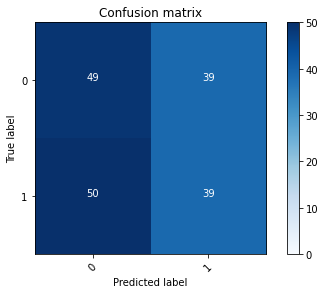

2022-08-20 17:07:50 - [Epoch Train: 44] loss: 0.2010, auc: 0.9715, acc: 0.9363, time: 50.00 s            
2022-08-20 17:07:50 - [Epoch Valid: 44] loss: 1.4240, auc: 0.4747, acc: 0.4903, time: 13.00 s


 44%|██████████████████▍                       | 44/100 [47:10<59:57, 64.23s/it]

2022-08-20 17:07:50 - EPOCH: 45
2022-08-20 17:07:51 - Train Step 10/973, train_loss: 0.1770
2022-08-20 17:07:52 - Train Step 20/973, train_loss: 0.1570
2022-08-20 17:07:52 - Train Step 30/973, train_loss: 0.1310
2022-08-20 17:07:53 - Train Step 40/973, train_loss: 0.1395
2022-08-20 17:07:53 - Train Step 50/973, train_loss: 0.1387
2022-08-20 17:07:54 - Train Step 60/973, train_loss: 0.1429
2022-08-20 17:07:54 - Train Step 70/973, train_loss: 0.1334
2022-08-20 17:07:55 - Train Step 80/973, train_loss: 0.1268
2022-08-20 17:07:55 - Train Step 90/973, train_loss: 0.1652
2022-08-20 17:07:56 - Train Step 100/973, train_loss: 0.1632
2022-08-20 17:07:56 - Train Step 110/973, train_loss: 0.1613
2022-08-20 17:07:57 - Train Step 120/973, train_loss: 0.1582
2022-08-20 17:07:57 - Train Step 130/973, train_loss: 0.1637
2022-08-20 17:07:58 - Train Step 140/973, train_loss: 0.1587
2022-08-20 17:07:58 - Train Step 150/973, train_loss: 0.1566
2022-08-20 17:07:59 - Train Step 160/973, train_loss: 0.1561
2

2022-08-20 17:08:51 - Valid Step 185/257, valid_loss: 1.5088
2022-08-20 17:08:51 - Valid Step 190/257, valid_loss: 1.4979
2022-08-20 17:08:51 - Valid Step 195/257, valid_loss: 1.5141
2022-08-20 17:08:51 - Valid Step 200/257, valid_loss: 1.5226
2022-08-20 17:08:52 - Valid Step 205/257, valid_loss: 1.5559
2022-08-20 17:08:52 - Valid Step 210/257, valid_loss: 1.5565
2022-08-20 17:08:52 - Valid Step 215/257, valid_loss: 1.5471
2022-08-20 17:08:52 - Valid Step 220/257, valid_loss: 1.5416
2022-08-20 17:08:53 - Valid Step 225/257, valid_loss: 1.5461
2022-08-20 17:08:53 - Valid Step 230/257, valid_loss: 1.5810
2022-08-20 17:08:53 - Valid Step 235/257, valid_loss: 1.5713
2022-08-20 17:08:53 - Valid Step 240/257, valid_loss: 1.5806
2022-08-20 17:08:54 - Valid Step 245/257, valid_loss: 1.5616
2022-08-20 17:08:54 - Valid Step 250/257, valid_loss: 1.5796
2022-08-20 17:08:54 - Valid Step 255/257, valid_loss: 1.5520
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

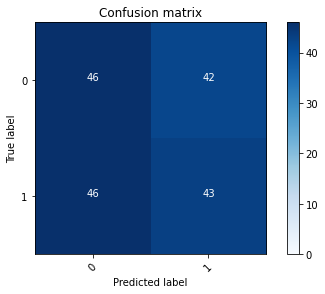

2022-08-20 17:08:54 - [Epoch Train: 45] loss: 0.1967, auc: 0.9714, acc: 0.9281, time: 50.00 s            
2022-08-20 17:08:54 - [Epoch Valid: 45] loss: 1.5676, auc: 0.4685, acc: 0.4903, time: 13.00 s


 45%|██████████████████▉                       | 45/100 [48:14<58:47, 64.14s/it]

2022-08-20 17:08:54 - EPOCH: 46
2022-08-20 17:08:55 - Train Step 10/973, train_loss: 0.1206
2022-08-20 17:08:56 - Train Step 20/973, train_loss: 0.1025
2022-08-20 17:08:56 - Train Step 30/973, train_loss: 0.1138
2022-08-20 17:08:57 - Train Step 40/973, train_loss: 0.1341
2022-08-20 17:08:57 - Train Step 50/973, train_loss: 0.1771
2022-08-20 17:08:58 - Train Step 60/973, train_loss: 0.1783
2022-08-20 17:08:58 - Train Step 70/973, train_loss: 0.1731
2022-08-20 17:08:59 - Train Step 80/973, train_loss: 0.1635
2022-08-20 17:08:59 - Train Step 90/973, train_loss: 0.1666
2022-08-20 17:09:00 - Train Step 100/973, train_loss: 0.1611
2022-08-20 17:09:00 - Train Step 110/973, train_loss: 0.1586
2022-08-20 17:09:01 - Train Step 120/973, train_loss: 0.1531
2022-08-20 17:09:01 - Train Step 130/973, train_loss: 0.1523
2022-08-20 17:09:02 - Train Step 140/973, train_loss: 0.1551
2022-08-20 17:09:02 - Train Step 150/973, train_loss: 0.1509
2022-08-20 17:09:03 - Train Step 160/973, train_loss: 0.1487
2

2022-08-20 17:09:55 - Valid Step 185/257, valid_loss: 1.4668
2022-08-20 17:09:55 - Valid Step 190/257, valid_loss: 1.4557
2022-08-20 17:09:55 - Valid Step 195/257, valid_loss: 1.4284
2022-08-20 17:09:56 - Valid Step 200/257, valid_loss: 1.4466
2022-08-20 17:09:56 - Valid Step 205/257, valid_loss: 1.4553
2022-08-20 17:09:56 - Valid Step 210/257, valid_loss: 1.4553
2022-08-20 17:09:56 - Valid Step 215/257, valid_loss: 1.4328
2022-08-20 17:09:57 - Valid Step 220/257, valid_loss: 1.4219
2022-08-20 17:09:57 - Valid Step 225/257, valid_loss: 1.4140
2022-08-20 17:09:57 - Valid Step 230/257, valid_loss: 1.4024
2022-08-20 17:09:57 - Valid Step 235/257, valid_loss: 1.3922
2022-08-20 17:09:58 - Valid Step 240/257, valid_loss: 1.3814
2022-08-20 17:09:58 - Valid Step 245/257, valid_loss: 1.4130
2022-08-20 17:09:58 - Valid Step 250/257, valid_loss: 1.4014
2022-08-20 17:09:58 - Valid Step 255/257, valid_loss: 1.4048
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

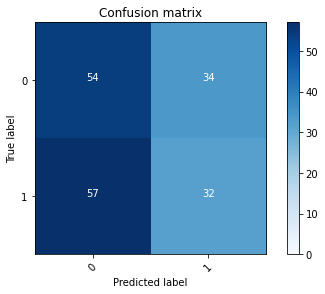

2022-08-20 17:09:59 - [Epoch Train: 46] loss: 0.1953, auc: 0.9700, acc: 0.9363, time: 50.00 s            
2022-08-20 17:09:59 - [Epoch Valid: 46] loss: 1.4029, auc: 0.4634, acc: 0.4825, time: 13.00 s


 46%|███████████████████▎                      | 46/100 [49:18<57:45, 64.18s/it]

2022-08-20 17:09:59 - EPOCH: 47
2022-08-20 17:09:59 - Train Step 10/973, train_loss: 0.1349
2022-08-20 17:10:00 - Train Step 20/973, train_loss: 0.1067
2022-08-20 17:10:00 - Train Step 30/973, train_loss: 0.1284
2022-08-20 17:10:01 - Train Step 40/973, train_loss: 0.1268
2022-08-20 17:10:01 - Train Step 50/973, train_loss: 0.1287
2022-08-20 17:10:02 - Train Step 60/973, train_loss: 0.1299
2022-08-20 17:10:02 - Train Step 70/973, train_loss: 0.1538
2022-08-20 17:10:03 - Train Step 80/973, train_loss: 0.1470
2022-08-20 17:10:03 - Train Step 90/973, train_loss: 0.1400
2022-08-20 17:10:04 - Train Step 100/973, train_loss: 0.1418
2022-08-20 17:10:04 - Train Step 110/973, train_loss: 0.1457
2022-08-20 17:10:05 - Train Step 120/973, train_loss: 0.1420
2022-08-20 17:10:05 - Train Step 130/973, train_loss: 0.1403
2022-08-20 17:10:06 - Train Step 140/973, train_loss: 0.1612
2022-08-20 17:10:06 - Train Step 150/973, train_loss: 0.1570
2022-08-20 17:10:07 - Train Step 160/973, train_loss: 0.1723
2

2022-08-20 17:10:58 - Valid Step 185/257, valid_loss: 1.7115
2022-08-20 17:10:59 - Valid Step 190/257, valid_loss: 1.6831
2022-08-20 17:10:59 - Valid Step 195/257, valid_loss: 1.6558
2022-08-20 17:10:59 - Valid Step 200/257, valid_loss: 1.6488
2022-08-20 17:10:59 - Valid Step 205/257, valid_loss: 1.6662
2022-08-20 17:11:00 - Valid Step 210/257, valid_loss: 1.6688
2022-08-20 17:11:00 - Valid Step 215/257, valid_loss: 1.6794
2022-08-20 17:11:00 - Valid Step 220/257, valid_loss: 1.6531
2022-08-20 17:11:00 - Valid Step 225/257, valid_loss: 1.6524
2022-08-20 17:11:01 - Valid Step 230/257, valid_loss: 1.6360
2022-08-20 17:11:01 - Valid Step 235/257, valid_loss: 1.6593
2022-08-20 17:11:01 - Valid Step 240/257, valid_loss: 1.6502
2022-08-20 17:11:01 - Valid Step 245/257, valid_loss: 1.6469
2022-08-20 17:11:02 - Valid Step 250/257, valid_loss: 1.6476
2022-08-20 17:11:02 - Valid Step 255/257, valid_loss: 1.6417
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

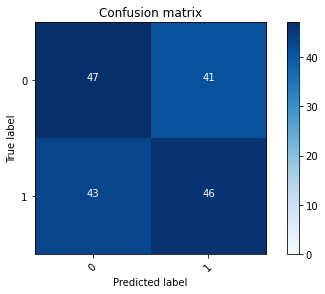

2022-08-20 17:11:02 - [Epoch Train: 47] loss: 0.1852, auc: 0.9757, acc: 0.9353, time: 49.00 s            
2022-08-20 17:11:02 - [Epoch Valid: 47] loss: 1.6293, auc: 0.4782, acc: 0.5058, time: 13.00 s


 47%|███████████████████▋                      | 47/100 [50:22<56:31, 64.00s/it]

2022-08-20 17:11:02 - EPOCH: 48
2022-08-20 17:11:03 - Train Step 10/973, train_loss: 0.1287
2022-08-20 17:11:03 - Train Step 20/973, train_loss: 0.0850
2022-08-20 17:11:04 - Train Step 30/973, train_loss: 0.1239
2022-08-20 17:11:04 - Train Step 40/973, train_loss: 0.1246
2022-08-20 17:11:05 - Train Step 50/973, train_loss: 0.1801
2022-08-20 17:11:05 - Train Step 60/973, train_loss: 0.1761
2022-08-20 17:11:06 - Train Step 70/973, train_loss: 0.1685
2022-08-20 17:11:06 - Train Step 80/973, train_loss: 0.1594
2022-08-20 17:11:07 - Train Step 90/973, train_loss: 0.1696
2022-08-20 17:11:08 - Train Step 100/973, train_loss: 0.1583
2022-08-20 17:11:08 - Train Step 110/973, train_loss: 0.1552
2022-08-20 17:11:09 - Train Step 120/973, train_loss: 0.1578
2022-08-20 17:11:09 - Train Step 130/973, train_loss: 0.1574
2022-08-20 17:11:10 - Train Step 140/973, train_loss: 0.1560
2022-08-20 17:11:10 - Train Step 150/973, train_loss: 0.1549
2022-08-20 17:11:11 - Train Step 160/973, train_loss: 0.1540
2

2022-08-20 17:12:02 - Valid Step 185/257, valid_loss: 1.5486
2022-08-20 17:12:02 - Valid Step 190/257, valid_loss: 1.5701
2022-08-20 17:12:02 - Valid Step 195/257, valid_loss: 1.5540
2022-08-20 17:12:03 - Valid Step 200/257, valid_loss: 1.5357
2022-08-20 17:12:03 - Valid Step 205/257, valid_loss: 1.5147
2022-08-20 17:12:03 - Valid Step 210/257, valid_loss: 1.5177
2022-08-20 17:12:03 - Valid Step 215/257, valid_loss: 1.5117
2022-08-20 17:12:04 - Valid Step 220/257, valid_loss: 1.5040
2022-08-20 17:12:04 - Valid Step 225/257, valid_loss: 1.5160
2022-08-20 17:12:04 - Valid Step 230/257, valid_loss: 1.5331
2022-08-20 17:12:04 - Valid Step 235/257, valid_loss: 1.6070
2022-08-20 17:12:05 - Valid Step 240/257, valid_loss: 1.6250
2022-08-20 17:12:05 - Valid Step 245/257, valid_loss: 1.6083
2022-08-20 17:12:05 - Valid Step 250/257, valid_loss: 1.5972
2022-08-20 17:12:05 - Valid Step 255/257, valid_loss: 1.6078
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

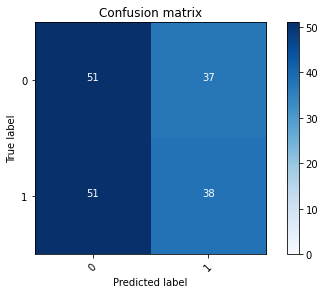

2022-08-20 17:12:06 - [Epoch Train: 48] loss: 0.1779, auc: 0.9761, acc: 0.9373, time: 50.00 s            
2022-08-20 17:12:06 - [Epoch Valid: 48] loss: 1.5983, auc: 0.4713, acc: 0.4942, time: 13.00 s


 48%|████████████████████▏                     | 48/100 [51:25<55:19, 63.83s/it]

2022-08-20 17:12:06 - EPOCH: 49
2022-08-20 17:12:06 - Train Step 10/973, train_loss: 0.1060
2022-08-20 17:12:07 - Train Step 20/973, train_loss: 0.1071
2022-08-20 17:12:07 - Train Step 30/973, train_loss: 0.1433
2022-08-20 17:12:08 - Train Step 40/973, train_loss: 0.1768
2022-08-20 17:12:08 - Train Step 50/973, train_loss: 0.1824
2022-08-20 17:12:09 - Train Step 60/973, train_loss: 0.1701
2022-08-20 17:12:10 - Train Step 70/973, train_loss: 0.1728
2022-08-20 17:12:10 - Train Step 80/973, train_loss: 0.1970
2022-08-20 17:12:11 - Train Step 90/973, train_loss: 0.1970
2022-08-20 17:12:11 - Train Step 100/973, train_loss: 0.1832
2022-08-20 17:12:12 - Train Step 110/973, train_loss: 0.1730
2022-08-20 17:12:12 - Train Step 120/973, train_loss: 0.1663
2022-08-20 17:12:13 - Train Step 130/973, train_loss: 0.1772
2022-08-20 17:12:13 - Train Step 140/973, train_loss: 0.1893
2022-08-20 17:12:14 - Train Step 150/973, train_loss: 0.1879
2022-08-20 17:12:14 - Train Step 160/973, train_loss: 0.1877
2

2022-08-20 17:13:06 - Valid Step 185/257, valid_loss: 1.7745
2022-08-20 17:13:06 - Valid Step 190/257, valid_loss: 1.7550
2022-08-20 17:13:06 - Valid Step 195/257, valid_loss: 1.8034
2022-08-20 17:13:07 - Valid Step 200/257, valid_loss: 1.8072
2022-08-20 17:13:07 - Valid Step 205/257, valid_loss: 1.7675
2022-08-20 17:13:07 - Valid Step 210/257, valid_loss: 1.7907
2022-08-20 17:13:07 - Valid Step 215/257, valid_loss: 1.7600
2022-08-20 17:13:08 - Valid Step 220/257, valid_loss: 1.7417
2022-08-20 17:13:08 - Valid Step 225/257, valid_loss: 1.7674
2022-08-20 17:13:08 - Valid Step 230/257, valid_loss: 1.7761
2022-08-20 17:13:08 - Valid Step 235/257, valid_loss: 1.7457
2022-08-20 17:13:09 - Valid Step 240/257, valid_loss: 1.7193
2022-08-20 17:13:09 - Valid Step 245/257, valid_loss: 1.7363
2022-08-20 17:13:09 - Valid Step 250/257, valid_loss: 1.7161
2022-08-20 17:13:09 - Valid Step 255/257, valid_loss: 1.7148
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

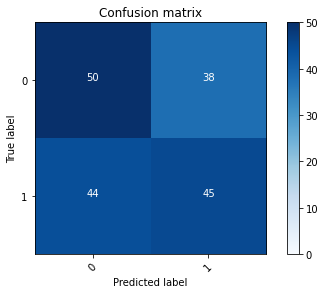

2022-08-20 17:13:10 - [Epoch Train: 49] loss: 0.1715, auc: 0.9784, acc: 0.9424, time: 50.00 s            
2022-08-20 17:13:10 - [Epoch Valid: 49] loss: 1.7020, auc: 0.4816, acc: 0.5175, time: 13.00 s


 49%|████████████████████▌                     | 49/100 [52:29<54:16, 63.86s/it]

2022-08-20 17:13:10 - EPOCH: 50
2022-08-20 17:13:10 - Train Step 10/973, train_loss: 0.2331
2022-08-20 17:13:11 - Train Step 20/973, train_loss: 0.1792
2022-08-20 17:13:11 - Train Step 30/973, train_loss: 0.1550
2022-08-20 17:13:12 - Train Step 40/973, train_loss: 0.1423
2022-08-20 17:13:12 - Train Step 50/973, train_loss: 0.1282
2022-08-20 17:13:13 - Train Step 60/973, train_loss: 0.1757
2022-08-20 17:13:13 - Train Step 70/973, train_loss: 0.1794
2022-08-20 17:13:14 - Train Step 80/973, train_loss: 0.1795
2022-08-20 17:13:15 - Train Step 90/973, train_loss: 0.1842
2022-08-20 17:13:15 - Train Step 100/973, train_loss: 0.1839
2022-08-20 17:13:16 - Train Step 110/973, train_loss: 0.1839
2022-08-20 17:13:16 - Train Step 120/973, train_loss: 0.1710
2022-08-20 17:13:17 - Train Step 130/973, train_loss: 0.1645
2022-08-20 17:13:17 - Train Step 140/973, train_loss: 0.1641
2022-08-20 17:13:18 - Train Step 150/973, train_loss: 0.1656
2022-08-20 17:13:18 - Train Step 160/973, train_loss: 0.1635
2

2022-08-20 17:14:10 - Valid Step 185/257, valid_loss: 1.5667
2022-08-20 17:14:11 - Valid Step 190/257, valid_loss: 1.5991
2022-08-20 17:14:11 - Valid Step 195/257, valid_loss: 1.5921
2022-08-20 17:14:11 - Valid Step 200/257, valid_loss: 1.5745
2022-08-20 17:14:11 - Valid Step 205/257, valid_loss: 1.5587
2022-08-20 17:14:12 - Valid Step 210/257, valid_loss: 1.5557
2022-08-20 17:14:12 - Valid Step 215/257, valid_loss: 1.5531
2022-08-20 17:14:12 - Valid Step 220/257, valid_loss: 1.5845
2022-08-20 17:14:12 - Valid Step 225/257, valid_loss: 1.6061
2022-08-20 17:14:13 - Valid Step 230/257, valid_loss: 1.6385
2022-08-20 17:14:13 - Valid Step 235/257, valid_loss: 1.6362
2022-08-20 17:14:13 - Valid Step 240/257, valid_loss: 1.6781
2022-08-20 17:14:13 - Valid Step 245/257, valid_loss: 1.6856
2022-08-20 17:14:14 - Valid Step 250/257, valid_loss: 1.7262
2022-08-20 17:14:14 - Valid Step 255/257, valid_loss: 1.7425
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

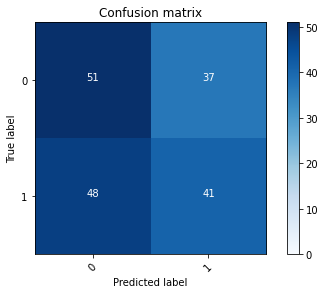

2022-08-20 17:14:14 - [Epoch Train: 50] loss: 0.1612, auc: 0.9835, acc: 0.9414, time: 50.00 s            
2022-08-20 17:14:14 - [Epoch Valid: 50] loss: 1.7361, auc: 0.4793, acc: 0.5136, time: 13.00 s


 50%|█████████████████████                     | 50/100 [53:34<53:22, 64.04s/it]

2022-08-20 17:14:14 - EPOCH: 51
2022-08-20 17:14:15 - Train Step 10/973, train_loss: 0.1243
2022-08-20 17:14:15 - Train Step 20/973, train_loss: 0.0921
2022-08-20 17:14:16 - Train Step 30/973, train_loss: 0.0822
2022-08-20 17:14:16 - Train Step 40/973, train_loss: 0.0944
2022-08-20 17:14:17 - Train Step 50/973, train_loss: 0.1276
2022-08-20 17:14:17 - Train Step 60/973, train_loss: 0.1268
2022-08-20 17:14:18 - Train Step 70/973, train_loss: 0.1193
2022-08-20 17:14:18 - Train Step 80/973, train_loss: 0.1226
2022-08-20 17:14:19 - Train Step 90/973, train_loss: 0.1133
2022-08-20 17:14:19 - Train Step 100/973, train_loss: 0.1393
2022-08-20 17:14:20 - Train Step 110/973, train_loss: 0.1395
2022-08-20 17:14:21 - Train Step 120/973, train_loss: 0.1309
2022-08-20 17:14:21 - Train Step 130/973, train_loss: 0.1294
2022-08-20 17:14:22 - Train Step 140/973, train_loss: 0.1343
2022-08-20 17:14:22 - Train Step 150/973, train_loss: 0.1388
2022-08-20 17:14:23 - Train Step 160/973, train_loss: 0.1380
2

2022-08-20 17:15:15 - Valid Step 185/257, valid_loss: 1.9748
2022-08-20 17:15:15 - Valid Step 190/257, valid_loss: 1.9687
2022-08-20 17:15:15 - Valid Step 195/257, valid_loss: 1.9256
2022-08-20 17:15:16 - Valid Step 200/257, valid_loss: 1.8885
2022-08-20 17:15:16 - Valid Step 205/257, valid_loss: 1.9304
2022-08-20 17:15:16 - Valid Step 210/257, valid_loss: 1.9498
2022-08-20 17:15:16 - Valid Step 215/257, valid_loss: 1.9790
2022-08-20 17:15:17 - Valid Step 220/257, valid_loss: 1.9719
2022-08-20 17:15:17 - Valid Step 225/257, valid_loss: 1.9688
2022-08-20 17:15:17 - Valid Step 230/257, valid_loss: 1.9839
2022-08-20 17:15:17 - Valid Step 235/257, valid_loss: 1.9744
2022-08-20 17:15:18 - Valid Step 240/257, valid_loss: 1.9498
2022-08-20 17:15:18 - Valid Step 245/257, valid_loss: 1.9223
2022-08-20 17:15:18 - Valid Step 250/257, valid_loss: 1.9067
2022-08-20 17:15:18 - Valid Step 255/257, valid_loss: 1.8715
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

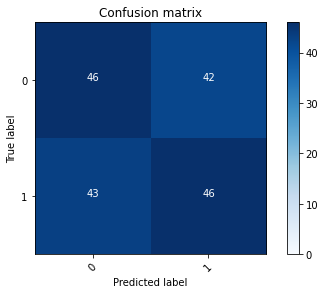

2022-08-20 17:15:19 - [Epoch Train: 51] loss: 0.1585, auc: 0.9838, acc: 0.9424, time: 50.00 s            
2022-08-20 17:15:19 - [Epoch Valid: 51] loss: 1.8605, auc: 0.4685, acc: 0.5058, time: 13.00 s


 51%|█████████████████████▍                    | 51/100 [54:38<52:25, 64.20s/it]

2022-08-20 17:15:19 - EPOCH: 52
2022-08-20 17:15:19 - Train Step 10/973, train_loss: 0.0441
2022-08-20 17:15:20 - Train Step 20/973, train_loss: 0.1167
2022-08-20 17:15:20 - Train Step 30/973, train_loss: 0.1075
2022-08-20 17:15:21 - Train Step 40/973, train_loss: 0.1593
2022-08-20 17:15:21 - Train Step 50/973, train_loss: 0.1739
2022-08-20 17:15:22 - Train Step 60/973, train_loss: 0.1628
2022-08-20 17:15:22 - Train Step 70/973, train_loss: 0.1687
2022-08-20 17:15:23 - Train Step 80/973, train_loss: 0.1710
2022-08-20 17:15:24 - Train Step 90/973, train_loss: 0.1638
2022-08-20 17:15:24 - Train Step 100/973, train_loss: 0.1609
2022-08-20 17:15:25 - Train Step 110/973, train_loss: 0.1574
2022-08-20 17:15:25 - Train Step 120/973, train_loss: 0.1539
2022-08-20 17:15:26 - Train Step 130/973, train_loss: 0.1504
2022-08-20 17:15:26 - Train Step 140/973, train_loss: 0.1498
2022-08-20 17:15:27 - Train Step 150/973, train_loss: 0.1467
2022-08-20 17:15:27 - Train Step 160/973, train_loss: 0.1486
2

2022-08-20 17:16:19 - Valid Step 185/257, valid_loss: 2.0297
2022-08-20 17:16:20 - Valid Step 190/257, valid_loss: 2.0196
2022-08-20 17:16:20 - Valid Step 195/257, valid_loss: 2.0189
2022-08-20 17:16:20 - Valid Step 200/257, valid_loss: 2.0044
2022-08-20 17:16:21 - Valid Step 205/257, valid_loss: 2.0010
2022-08-20 17:16:21 - Valid Step 210/257, valid_loss: 1.9886
2022-08-20 17:16:21 - Valid Step 215/257, valid_loss: 1.9983
2022-08-20 17:16:21 - Valid Step 220/257, valid_loss: 2.0059
2022-08-20 17:16:22 - Valid Step 225/257, valid_loss: 1.9901
2022-08-20 17:16:22 - Valid Step 230/257, valid_loss: 1.9868
2022-08-20 17:16:22 - Valid Step 235/257, valid_loss: 1.9752
2022-08-20 17:16:22 - Valid Step 240/257, valid_loss: 1.9917
2022-08-20 17:16:23 - Valid Step 245/257, valid_loss: 1.9849
2022-08-20 17:16:23 - Valid Step 250/257, valid_loss: 1.9737
2022-08-20 17:16:23 - Valid Step 255/257, valid_loss: 1.9697
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

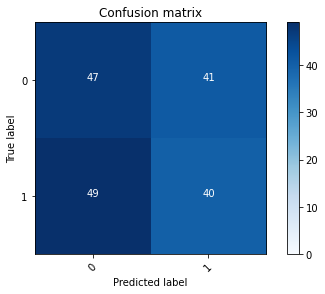

2022-08-20 17:16:23 - [Epoch Train: 52] loss: 0.1510, auc: 0.9871, acc: 0.9414, time: 50.00 s            
2022-08-20 17:16:23 - [Epoch Valid: 52] loss: 1.9585, auc: 0.4613, acc: 0.4786, time: 13.00 s


 52%|█████████████████████▊                    | 52/100 [55:43<51:29, 64.37s/it]

2022-08-20 17:16:23 - EPOCH: 53
2022-08-20 17:16:24 - Train Step 10/973, train_loss: 0.2435
2022-08-20 17:16:25 - Train Step 20/973, train_loss: 0.1940
2022-08-20 17:16:25 - Train Step 30/973, train_loss: 0.1673
2022-08-20 17:16:26 - Train Step 40/973, train_loss: 0.1969
2022-08-20 17:16:26 - Train Step 50/973, train_loss: 0.1717
2022-08-20 17:16:27 - Train Step 60/973, train_loss: 0.1894
2022-08-20 17:16:27 - Train Step 70/973, train_loss: 0.1788
2022-08-20 17:16:28 - Train Step 80/973, train_loss: 0.1737
2022-08-20 17:16:28 - Train Step 90/973, train_loss: 0.1672
2022-08-20 17:16:29 - Train Step 100/973, train_loss: 0.1852
2022-08-20 17:16:29 - Train Step 110/973, train_loss: 0.1943
2022-08-20 17:16:30 - Train Step 120/973, train_loss: 0.1866
2022-08-20 17:16:30 - Train Step 130/973, train_loss: 0.2052
2022-08-20 17:16:31 - Train Step 140/973, train_loss: 0.1967
2022-08-20 17:16:31 - Train Step 150/973, train_loss: 0.1916
2022-08-20 17:16:32 - Train Step 160/973, train_loss: 0.1896
2

2022-08-20 17:17:24 - Valid Step 185/257, valid_loss: 1.7060
2022-08-20 17:17:24 - Valid Step 190/257, valid_loss: 1.7057
2022-08-20 17:17:25 - Valid Step 195/257, valid_loss: 1.6710
2022-08-20 17:17:25 - Valid Step 200/257, valid_loss: 1.6520
2022-08-20 17:17:25 - Valid Step 205/257, valid_loss: 1.6563
2022-08-20 17:17:25 - Valid Step 210/257, valid_loss: 1.6596
2022-08-20 17:17:26 - Valid Step 215/257, valid_loss: 1.6880
2022-08-20 17:17:26 - Valid Step 220/257, valid_loss: 1.6985
2022-08-20 17:17:26 - Valid Step 225/257, valid_loss: 1.6953
2022-08-20 17:17:26 - Valid Step 230/257, valid_loss: 1.6765
2022-08-20 17:17:27 - Valid Step 235/257, valid_loss: 1.6542
2022-08-20 17:17:27 - Valid Step 240/257, valid_loss: 1.6386
2022-08-20 17:17:27 - Valid Step 245/257, valid_loss: 1.6530
2022-08-20 17:17:27 - Valid Step 250/257, valid_loss: 1.6378
2022-08-20 17:17:28 - Valid Step 255/257, valid_loss: 1.6941
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

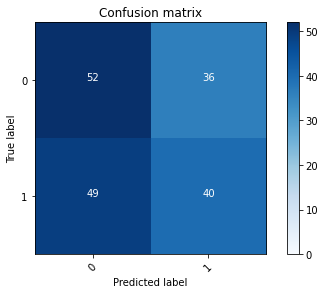

2022-08-20 17:17:28 - [Epoch Train: 53] loss: 0.1419, auc: 0.9874, acc: 0.9538, time: 50.00 s            
2022-08-20 17:17:28 - [Epoch Valid: 53] loss: 1.7210, auc: 0.4907, acc: 0.5097, time: 13.00 s


 53%|██████████████████████▎                   | 53/100 [56:48<50:27, 64.41s/it]

2022-08-20 17:17:28 - EPOCH: 54
2022-08-20 17:17:29 - Train Step 10/973, train_loss: 0.0904
2022-08-20 17:17:29 - Train Step 20/973, train_loss: 0.1502
2022-08-20 17:17:30 - Train Step 30/973, train_loss: 0.1446
2022-08-20 17:17:30 - Train Step 40/973, train_loss: 0.1620
2022-08-20 17:17:31 - Train Step 50/973, train_loss: 0.1829
2022-08-20 17:17:31 - Train Step 60/973, train_loss: 0.1654
2022-08-20 17:17:32 - Train Step 70/973, train_loss: 0.1645
2022-08-20 17:17:32 - Train Step 80/973, train_loss: 0.1639
2022-08-20 17:17:33 - Train Step 90/973, train_loss: 0.1592
2022-08-20 17:17:33 - Train Step 100/973, train_loss: 0.1641
2022-08-20 17:17:34 - Train Step 110/973, train_loss: 0.1856
2022-08-20 17:17:34 - Train Step 120/973, train_loss: 0.1822
2022-08-20 17:17:35 - Train Step 130/973, train_loss: 0.1702
2022-08-20 17:17:35 - Train Step 140/973, train_loss: 0.1605
2022-08-20 17:17:36 - Train Step 150/973, train_loss: 0.1549
2022-08-20 17:17:36 - Train Step 160/973, train_loss: 0.1474
2

2022-08-20 17:18:28 - Valid Step 185/257, valid_loss: 2.0921
2022-08-20 17:18:29 - Valid Step 190/257, valid_loss: 2.1149
2022-08-20 17:18:29 - Valid Step 195/257, valid_loss: 2.0686
2022-08-20 17:18:29 - Valid Step 200/257, valid_loss: 2.1160
2022-08-20 17:18:29 - Valid Step 205/257, valid_loss: 2.0965
2022-08-20 17:18:30 - Valid Step 210/257, valid_loss: 2.0682
2022-08-20 17:18:30 - Valid Step 215/257, valid_loss: 2.0924
2022-08-20 17:18:30 - Valid Step 220/257, valid_loss: 2.0508
2022-08-20 17:18:30 - Valid Step 225/257, valid_loss: 2.0202
2022-08-20 17:18:31 - Valid Step 230/257, valid_loss: 2.0137
2022-08-20 17:18:31 - Valid Step 235/257, valid_loss: 2.0349
2022-08-20 17:18:31 - Valid Step 240/257, valid_loss: 2.0068
2022-08-20 17:18:32 - Valid Step 245/257, valid_loss: 2.0146
2022-08-20 17:18:32 - Valid Step 250/257, valid_loss: 1.9952
2022-08-20 17:18:32 - Valid Step 255/257, valid_loss: 1.9589
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

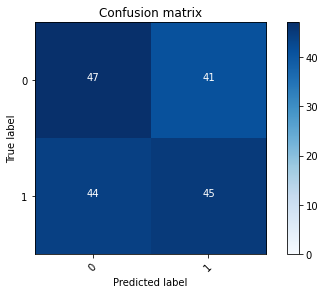

2022-08-20 17:18:32 - [Epoch Train: 54] loss: 0.1284, auc: 0.9897, acc: 0.9579, time: 50.00 s            
2022-08-20 17:18:32 - [Epoch Valid: 54] loss: 1.9466, auc: 0.4763, acc: 0.5058, time: 13.00 s


 54%|██████████████████████▋                   | 54/100 [57:52<49:22, 64.40s/it]

2022-08-20 17:18:32 - EPOCH: 55
2022-08-20 17:18:33 - Train Step 10/973, train_loss: 0.2243
2022-08-20 17:18:34 - Train Step 20/973, train_loss: 0.3577
2022-08-20 17:18:34 - Train Step 30/973, train_loss: 0.2795
2022-08-20 17:18:35 - Train Step 40/973, train_loss: 0.2557
2022-08-20 17:18:35 - Train Step 50/973, train_loss: 0.2197
2022-08-20 17:18:36 - Train Step 60/973, train_loss: 0.1882
2022-08-20 17:18:36 - Train Step 70/973, train_loss: 0.2024
2022-08-20 17:18:37 - Train Step 80/973, train_loss: 0.2031
2022-08-20 17:18:37 - Train Step 90/973, train_loss: 0.2078
2022-08-20 17:18:38 - Train Step 100/973, train_loss: 0.1991
2022-08-20 17:18:38 - Train Step 110/973, train_loss: 0.1964
2022-08-20 17:18:39 - Train Step 120/973, train_loss: 0.1918
2022-08-20 17:18:39 - Train Step 130/973, train_loss: 0.1850
2022-08-20 17:18:40 - Train Step 140/973, train_loss: 0.1844
2022-08-20 17:18:40 - Train Step 150/973, train_loss: 0.1777
2022-08-20 17:18:41 - Train Step 160/973, train_loss: 0.1741
2

2022-08-20 17:19:33 - Valid Step 185/257, valid_loss: 1.8825
2022-08-20 17:19:34 - Valid Step 190/257, valid_loss: 1.8858
2022-08-20 17:19:34 - Valid Step 195/257, valid_loss: 1.9013
2022-08-20 17:19:34 - Valid Step 200/257, valid_loss: 1.8969
2022-08-20 17:19:34 - Valid Step 205/257, valid_loss: 1.8678
2022-08-20 17:19:35 - Valid Step 210/257, valid_loss: 1.8377
2022-08-20 17:19:35 - Valid Step 215/257, valid_loss: 1.9010
2022-08-20 17:19:35 - Valid Step 220/257, valid_loss: 1.9683
2022-08-20 17:19:35 - Valid Step 225/257, valid_loss: 1.9549
2022-08-20 17:19:36 - Valid Step 230/257, valid_loss: 1.9157
2022-08-20 17:19:36 - Valid Step 235/257, valid_loss: 1.8902
2022-08-20 17:19:36 - Valid Step 240/257, valid_loss: 1.9761
2022-08-20 17:19:37 - Valid Step 245/257, valid_loss: 1.9591
2022-08-20 17:19:37 - Valid Step 250/257, valid_loss: 1.9610
2022-08-20 17:19:37 - Valid Step 255/257, valid_loss: 1.9566
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

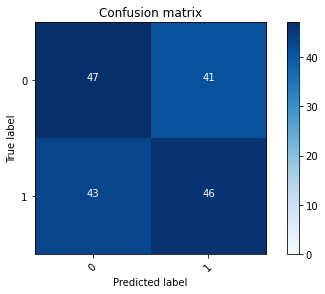

2022-08-20 17:19:37 - [Epoch Train: 55] loss: 0.1410, auc: 0.9855, acc: 0.9538, time: 51.00 s            
2022-08-20 17:19:37 - [Epoch Valid: 55] loss: 1.9417, auc: 0.4846, acc: 0.5136, time: 13.00 s


 55%|███████████████████████                   | 55/100 [58:57<48:25, 64.58s/it]

2022-08-20 17:19:37 - EPOCH: 56
2022-08-20 17:19:38 - Train Step 10/973, train_loss: 0.1189
2022-08-20 17:19:39 - Train Step 20/973, train_loss: 0.0960
2022-08-20 17:19:39 - Train Step 30/973, train_loss: 0.1084
2022-08-20 17:19:40 - Train Step 40/973, train_loss: 0.0989
2022-08-20 17:19:40 - Train Step 50/973, train_loss: 0.0870
2022-08-20 17:19:41 - Train Step 60/973, train_loss: 0.0842
2022-08-20 17:19:41 - Train Step 70/973, train_loss: 0.0776
2022-08-20 17:19:42 - Train Step 80/973, train_loss: 0.0791
2022-08-20 17:19:42 - Train Step 90/973, train_loss: 0.0911
2022-08-20 17:19:43 - Train Step 100/973, train_loss: 0.0907
2022-08-20 17:19:43 - Train Step 110/973, train_loss: 0.0892
2022-08-20 17:19:44 - Train Step 120/973, train_loss: 0.1008
2022-08-20 17:19:44 - Train Step 130/973, train_loss: 0.1010
2022-08-20 17:19:45 - Train Step 140/973, train_loss: 0.0992
2022-08-20 17:19:46 - Train Step 150/973, train_loss: 0.1013
2022-08-20 17:19:46 - Train Step 160/973, train_loss: 0.1004
2

2022-08-20 17:20:38 - Valid Step 185/257, valid_loss: 1.9677
2022-08-20 17:20:39 - Valid Step 190/257, valid_loss: 1.9264
2022-08-20 17:20:39 - Valid Step 195/257, valid_loss: 1.9203
2022-08-20 17:20:39 - Valid Step 200/257, valid_loss: 2.0020
2022-08-20 17:20:39 - Valid Step 205/257, valid_loss: 2.0493
2022-08-20 17:20:40 - Valid Step 210/257, valid_loss: 2.0678
2022-08-20 17:20:40 - Valid Step 215/257, valid_loss: 2.0721
2022-08-20 17:20:40 - Valid Step 220/257, valid_loss: 2.0529
2022-08-20 17:20:40 - Valid Step 225/257, valid_loss: 2.0708
2022-08-20 17:20:41 - Valid Step 230/257, valid_loss: 2.0872
2022-08-20 17:20:41 - Valid Step 235/257, valid_loss: 2.0518
2022-08-20 17:20:41 - Valid Step 240/257, valid_loss: 2.1071
2022-08-20 17:20:41 - Valid Step 245/257, valid_loss: 2.0867
2022-08-20 17:20:42 - Valid Step 250/257, valid_loss: 2.0890
2022-08-20 17:20:42 - Valid Step 255/257, valid_loss: 2.0817
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

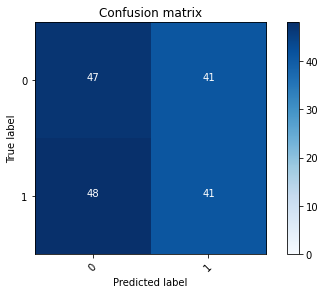

2022-08-20 17:20:42 - [Epoch Train: 56] loss: 0.1213, auc: 0.9912, acc: 0.9630, time: 51.00 s            
2022-08-20 17:20:42 - [Epoch Valid: 56] loss: 2.0768, auc: 0.4655, acc: 0.4864, time: 13.00 s


 56%|██████████████████████▍                 | 56/100 [1:00:02<47:26, 64.69s/it]

2022-08-20 17:20:42 - EPOCH: 57
2022-08-20 17:20:43 - Train Step 10/973, train_loss: 0.1204
2022-08-20 17:20:43 - Train Step 20/973, train_loss: 0.0648
2022-08-20 17:20:44 - Train Step 30/973, train_loss: 0.0795
2022-08-20 17:20:44 - Train Step 40/973, train_loss: 0.0786
2022-08-20 17:20:45 - Train Step 50/973, train_loss: 0.0709
2022-08-20 17:20:45 - Train Step 60/973, train_loss: 0.0842
2022-08-20 17:20:46 - Train Step 70/973, train_loss: 0.1022
2022-08-20 17:20:46 - Train Step 80/973, train_loss: 0.1215
2022-08-20 17:20:47 - Train Step 90/973, train_loss: 0.1180
2022-08-20 17:20:47 - Train Step 100/973, train_loss: 0.1148
2022-08-20 17:20:48 - Train Step 110/973, train_loss: 0.1207
2022-08-20 17:20:48 - Train Step 120/973, train_loss: 0.1297
2022-08-20 17:20:49 - Train Step 130/973, train_loss: 0.1271
2022-08-20 17:20:50 - Train Step 140/973, train_loss: 0.1303
2022-08-20 17:20:50 - Train Step 150/973, train_loss: 0.1269
2022-08-20 17:20:51 - Train Step 160/973, train_loss: 0.1279
2

2022-08-20 17:21:42 - Valid Step 185/257, valid_loss: 2.0084
2022-08-20 17:21:42 - Valid Step 190/257, valid_loss: 2.0043
2022-08-20 17:21:43 - Valid Step 195/257, valid_loss: 2.0554
2022-08-20 17:21:43 - Valid Step 200/257, valid_loss: 2.0256
2022-08-20 17:21:43 - Valid Step 205/257, valid_loss: 1.9930
2022-08-20 17:21:43 - Valid Step 210/257, valid_loss: 2.0226
2022-08-20 17:21:44 - Valid Step 215/257, valid_loss: 2.0193
2022-08-20 17:21:44 - Valid Step 220/257, valid_loss: 1.9970
2022-08-20 17:21:44 - Valid Step 225/257, valid_loss: 1.9793
2022-08-20 17:21:44 - Valid Step 230/257, valid_loss: 1.9504
2022-08-20 17:21:45 - Valid Step 235/257, valid_loss: 1.9313
2022-08-20 17:21:45 - Valid Step 240/257, valid_loss: 1.9503
2022-08-20 17:21:45 - Valid Step 245/257, valid_loss: 1.9222
2022-08-20 17:21:45 - Valid Step 250/257, valid_loss: 1.8964
2022-08-20 17:21:46 - Valid Step 255/257, valid_loss: 1.9101
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

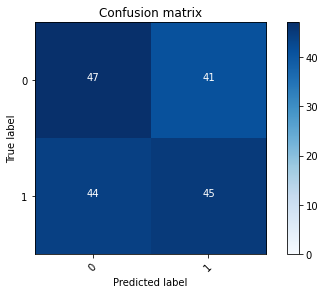

2022-08-20 17:21:46 - [Epoch Train: 57] loss: 0.1245, auc: 0.9909, acc: 0.9609, time: 50.00 s            
2022-08-20 17:21:46 - [Epoch Valid: 57] loss: 1.9051, auc: 0.4812, acc: 0.5019, time: 13.00 s


 57%|██████████████████████▊                 | 57/100 [1:01:06<46:08, 64.38s/it]

2022-08-20 17:21:46 - EPOCH: 58
2022-08-20 17:21:47 - Train Step 10/973, train_loss: 0.0909
2022-08-20 17:21:47 - Train Step 20/973, train_loss: 0.0603
2022-08-20 17:21:48 - Train Step 30/973, train_loss: 0.0529
2022-08-20 17:21:48 - Train Step 40/973, train_loss: 0.0502
2022-08-20 17:21:49 - Train Step 50/973, train_loss: 0.0858
2022-08-20 17:21:49 - Train Step 60/973, train_loss: 0.0885
2022-08-20 17:21:50 - Train Step 70/973, train_loss: 0.0857
2022-08-20 17:21:50 - Train Step 80/973, train_loss: 0.1112
2022-08-20 17:21:51 - Train Step 90/973, train_loss: 0.1039
2022-08-20 17:21:51 - Train Step 100/973, train_loss: 0.0955
2022-08-20 17:21:52 - Train Step 110/973, train_loss: 0.0909
2022-08-20 17:21:52 - Train Step 120/973, train_loss: 0.0850
2022-08-20 17:21:53 - Train Step 130/973, train_loss: 0.1036
2022-08-20 17:21:53 - Train Step 140/973, train_loss: 0.0987
2022-08-20 17:21:54 - Train Step 150/973, train_loss: 0.0958
2022-08-20 17:21:54 - Train Step 160/973, train_loss: 0.0961
2

2022-08-20 17:22:46 - Valid Step 185/257, valid_loss: 1.9211
2022-08-20 17:22:46 - Valid Step 190/257, valid_loss: 2.0410
2022-08-20 17:22:46 - Valid Step 195/257, valid_loss: 2.0314
2022-08-20 17:22:46 - Valid Step 200/257, valid_loss: 2.0331
2022-08-20 17:22:47 - Valid Step 205/257, valid_loss: 2.0326
2022-08-20 17:22:47 - Valid Step 210/257, valid_loss: 2.0308
2022-08-20 17:22:47 - Valid Step 215/257, valid_loss: 2.0542
2022-08-20 17:22:47 - Valid Step 220/257, valid_loss: 2.0419
2022-08-20 17:22:48 - Valid Step 225/257, valid_loss: 2.1443
2022-08-20 17:22:48 - Valid Step 230/257, valid_loss: 2.1402
2022-08-20 17:22:48 - Valid Step 235/257, valid_loss: 2.1009
2022-08-20 17:22:48 - Valid Step 240/257, valid_loss: 2.0921
2022-08-20 17:22:49 - Valid Step 245/257, valid_loss: 2.0810
2022-08-20 17:22:49 - Valid Step 250/257, valid_loss: 2.0486
2022-08-20 17:22:49 - Valid Step 255/257, valid_loss: 2.0767
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

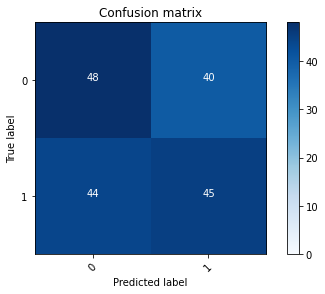

2022-08-20 17:22:49 - [Epoch Train: 58] loss: 0.1098, auc: 0.9919, acc: 0.9692, time: 50.00 s            
2022-08-20 17:22:49 - [Epoch Valid: 58] loss: 2.0705, auc: 0.4872, acc: 0.5136, time: 13.00 s


 58%|███████████████████████▏                | 58/100 [1:02:09<44:53, 64.12s/it]

2022-08-20 17:22:49 - EPOCH: 59
2022-08-20 17:22:50 - Train Step 10/973, train_loss: 0.0658
2022-08-20 17:22:51 - Train Step 20/973, train_loss: 0.1302
2022-08-20 17:22:51 - Train Step 30/973, train_loss: 0.0961
2022-08-20 17:22:52 - Train Step 40/973, train_loss: 0.1051
2022-08-20 17:22:52 - Train Step 50/973, train_loss: 0.1043
2022-08-20 17:22:53 - Train Step 60/973, train_loss: 0.0925
2022-08-20 17:22:53 - Train Step 70/973, train_loss: 0.0827
2022-08-20 17:22:54 - Train Step 80/973, train_loss: 0.0790
2022-08-20 17:22:54 - Train Step 90/973, train_loss: 0.0825
2022-08-20 17:22:55 - Train Step 100/973, train_loss: 0.0850
2022-08-20 17:22:55 - Train Step 110/973, train_loss: 0.0837
2022-08-20 17:22:56 - Train Step 120/973, train_loss: 0.0802
2022-08-20 17:22:56 - Train Step 130/973, train_loss: 0.0819
2022-08-20 17:22:57 - Train Step 140/973, train_loss: 0.0819
2022-08-20 17:22:57 - Train Step 150/973, train_loss: 0.0803
2022-08-20 17:22:58 - Train Step 160/973, train_loss: 0.0772
2

2022-08-20 17:23:50 - Valid Step 185/257, valid_loss: 1.9248
2022-08-20 17:23:50 - Valid Step 190/257, valid_loss: 1.8843
2022-08-20 17:23:50 - Valid Step 195/257, valid_loss: 1.9334
2022-08-20 17:23:51 - Valid Step 200/257, valid_loss: 1.9482
2022-08-20 17:23:51 - Valid Step 205/257, valid_loss: 2.0056
2022-08-20 17:23:51 - Valid Step 210/257, valid_loss: 1.9740
2022-08-20 17:23:51 - Valid Step 215/257, valid_loss: 1.9541
2022-08-20 17:23:52 - Valid Step 220/257, valid_loss: 1.9283
2022-08-20 17:23:52 - Valid Step 225/257, valid_loss: 1.9325
2022-08-20 17:23:52 - Valid Step 230/257, valid_loss: 1.9350
2022-08-20 17:23:52 - Valid Step 235/257, valid_loss: 1.9381
2022-08-20 17:23:53 - Valid Step 240/257, valid_loss: 1.9381
2022-08-20 17:23:53 - Valid Step 245/257, valid_loss: 1.9605
2022-08-20 17:23:53 - Valid Step 250/257, valid_loss: 1.9664
2022-08-20 17:23:53 - Valid Step 255/257, valid_loss: 1.9308
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

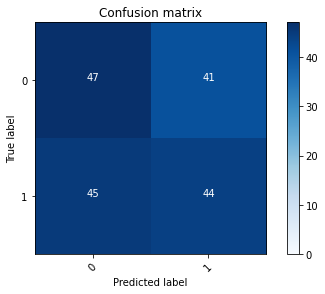

2022-08-20 17:23:54 - [Epoch Train: 59] loss: 0.1085, auc: 0.9936, acc: 0.9671, time: 50.00 s            
2022-08-20 17:23:54 - [Epoch Valid: 59] loss: 1.9214, auc: 0.4701, acc: 0.4981, time: 13.00 s


 59%|███████████████████████▌                | 59/100 [1:03:13<43:49, 64.15s/it]

2022-08-20 17:23:54 - EPOCH: 60
2022-08-20 17:23:54 - Train Step 10/973, train_loss: 0.0567
2022-08-20 17:23:55 - Train Step 20/973, train_loss: 0.0763
2022-08-20 17:23:55 - Train Step 30/973, train_loss: 0.0663
2022-08-20 17:23:56 - Train Step 40/973, train_loss: 0.0672
2022-08-20 17:23:56 - Train Step 50/973, train_loss: 0.0606
2022-08-20 17:23:57 - Train Step 60/973, train_loss: 0.0685
2022-08-20 17:23:57 - Train Step 70/973, train_loss: 0.0708
2022-08-20 17:23:58 - Train Step 80/973, train_loss: 0.0752
2022-08-20 17:23:58 - Train Step 90/973, train_loss: 0.0734
2022-08-20 17:23:59 - Train Step 100/973, train_loss: 0.0700
2022-08-20 17:23:59 - Train Step 110/973, train_loss: 0.0836
2022-08-20 17:24:00 - Train Step 120/973, train_loss: 0.0914
2022-08-20 17:24:00 - Train Step 130/973, train_loss: 0.0978
2022-08-20 17:24:01 - Train Step 140/973, train_loss: 0.0967
2022-08-20 17:24:01 - Train Step 150/973, train_loss: 0.0957
2022-08-20 17:24:02 - Train Step 160/973, train_loss: 0.0916
2

2022-08-20 17:24:54 - Valid Step 185/257, valid_loss: 2.0488
2022-08-20 17:24:54 - Valid Step 190/257, valid_loss: 2.1131
2022-08-20 17:24:54 - Valid Step 195/257, valid_loss: 2.1225
2022-08-20 17:24:54 - Valid Step 200/257, valid_loss: 2.1613
2022-08-20 17:24:55 - Valid Step 205/257, valid_loss: 2.1655
2022-08-20 17:24:55 - Valid Step 210/257, valid_loss: 2.1240
2022-08-20 17:24:55 - Valid Step 215/257, valid_loss: 2.1379
2022-08-20 17:24:55 - Valid Step 220/257, valid_loss: 2.1067
2022-08-20 17:24:56 - Valid Step 225/257, valid_loss: 2.0839
2022-08-20 17:24:56 - Valid Step 230/257, valid_loss: 2.0690
2022-08-20 17:24:56 - Valid Step 235/257, valid_loss: 2.0475
2022-08-20 17:24:56 - Valid Step 240/257, valid_loss: 2.0819
2022-08-20 17:24:57 - Valid Step 245/257, valid_loss: 2.0906
2022-08-20 17:24:57 - Valid Step 250/257, valid_loss: 2.0957
2022-08-20 17:24:57 - Valid Step 255/257, valid_loss: 2.0712
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

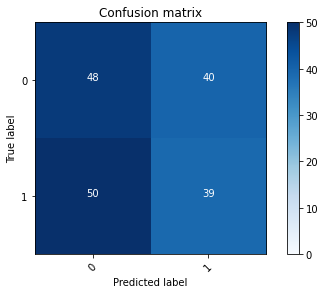

2022-08-20 17:24:57 - [Epoch Train: 60] loss: 0.1066, auc: 0.9936, acc: 0.9723, time: 50.00 s            
2022-08-20 17:24:57 - [Epoch Valid: 60] loss: 2.1001, auc: 0.4635, acc: 0.4786, time: 13.00 s


 60%|████████████████████████                | 60/100 [1:04:17<42:41, 64.04s/it]

2022-08-20 17:24:57 - EPOCH: 61
2022-08-20 17:24:58 - Train Step 10/973, train_loss: 0.0046
2022-08-20 17:24:59 - Train Step 20/973, train_loss: 0.0184
2022-08-20 17:24:59 - Train Step 30/973, train_loss: 0.0441
2022-08-20 17:25:00 - Train Step 40/973, train_loss: 0.0515
2022-08-20 17:25:00 - Train Step 50/973, train_loss: 0.0558
2022-08-20 17:25:01 - Train Step 60/973, train_loss: 0.1021
2022-08-20 17:25:01 - Train Step 70/973, train_loss: 0.1093
2022-08-20 17:25:02 - Train Step 80/973, train_loss: 0.1031
2022-08-20 17:25:02 - Train Step 90/973, train_loss: 0.1127
2022-08-20 17:25:03 - Train Step 100/973, train_loss: 0.1053
2022-08-20 17:25:04 - Train Step 110/973, train_loss: 0.1021
2022-08-20 17:25:04 - Train Step 120/973, train_loss: 0.1131
2022-08-20 17:25:05 - Train Step 130/973, train_loss: 0.1085
2022-08-20 17:25:05 - Train Step 140/973, train_loss: 0.1030
2022-08-20 17:25:06 - Train Step 150/973, train_loss: 0.1013
2022-08-20 17:25:06 - Train Step 160/973, train_loss: 0.1049
2

2022-08-20 17:25:58 - Valid Step 185/257, valid_loss: 2.3893
2022-08-20 17:25:58 - Valid Step 190/257, valid_loss: 2.3850
2022-08-20 17:25:58 - Valid Step 195/257, valid_loss: 2.3344
2022-08-20 17:25:59 - Valid Step 200/257, valid_loss: 2.3494
2022-08-20 17:25:59 - Valid Step 205/257, valid_loss: 2.3338
2022-08-20 17:25:59 - Valid Step 210/257, valid_loss: 2.3441
2022-08-20 17:25:59 - Valid Step 215/257, valid_loss: 2.3669
2022-08-20 17:26:00 - Valid Step 220/257, valid_loss: 2.3878
2022-08-20 17:26:00 - Valid Step 225/257, valid_loss: 2.3799
2022-08-20 17:26:00 - Valid Step 230/257, valid_loss: 2.3664
2022-08-20 17:26:00 - Valid Step 235/257, valid_loss: 2.3336
2022-08-20 17:26:01 - Valid Step 240/257, valid_loss: 2.3188
2022-08-20 17:26:01 - Valid Step 245/257, valid_loss: 2.3081
2022-08-20 17:26:01 - Valid Step 250/257, valid_loss: 2.2856
2022-08-20 17:26:01 - Valid Step 255/257, valid_loss: 2.3061
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

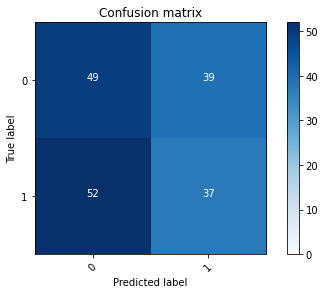

2022-08-20 17:26:02 - [Epoch Train: 61] loss: 0.0935, auc: 0.9957, acc: 0.9681, time: 50.00 s            
2022-08-20 17:26:02 - [Epoch Valid: 61] loss: 2.2932, auc: 0.4571, acc: 0.4825, time: 13.00 s


 61%|████████████████████████▍               | 61/100 [1:05:22<41:41, 64.13s/it]

2022-08-20 17:26:02 - EPOCH: 62
2022-08-20 17:26:02 - Train Step 10/973, train_loss: 0.0185
2022-08-20 17:26:03 - Train Step 20/973, train_loss: 0.0529
2022-08-20 17:26:03 - Train Step 30/973, train_loss: 0.0961
2022-08-20 17:26:04 - Train Step 40/973, train_loss: 0.0790
2022-08-20 17:26:04 - Train Step 50/973, train_loss: 0.0904
2022-08-20 17:26:05 - Train Step 60/973, train_loss: 0.0804
2022-08-20 17:26:05 - Train Step 70/973, train_loss: 0.0760
2022-08-20 17:26:06 - Train Step 80/973, train_loss: 0.0785
2022-08-20 17:26:06 - Train Step 90/973, train_loss: 0.0864
2022-08-20 17:26:07 - Train Step 100/973, train_loss: 0.0859
2022-08-20 17:26:08 - Train Step 110/973, train_loss: 0.0835
2022-08-20 17:26:08 - Train Step 120/973, train_loss: 0.0802
2022-08-20 17:26:09 - Train Step 130/973, train_loss: 0.0860
2022-08-20 17:26:09 - Train Step 140/973, train_loss: 0.0869
2022-08-20 17:26:10 - Train Step 150/973, train_loss: 0.0849
2022-08-20 17:26:10 - Train Step 160/973, train_loss: 0.0841
2

2022-08-20 17:27:02 - Valid Step 185/257, valid_loss: 2.2834
2022-08-20 17:27:02 - Valid Step 190/257, valid_loss: 2.2813
2022-08-20 17:27:03 - Valid Step 195/257, valid_loss: 2.3092
2022-08-20 17:27:03 - Valid Step 200/257, valid_loss: 2.2899
2022-08-20 17:27:03 - Valid Step 205/257, valid_loss: 2.2825
2022-08-20 17:27:03 - Valid Step 210/257, valid_loss: 2.2541
2022-08-20 17:27:04 - Valid Step 215/257, valid_loss: 2.2248
2022-08-20 17:27:04 - Valid Step 220/257, valid_loss: 2.2503
2022-08-20 17:27:04 - Valid Step 225/257, valid_loss: 2.2261
2022-08-20 17:27:04 - Valid Step 230/257, valid_loss: 2.1949
2022-08-20 17:27:05 - Valid Step 235/257, valid_loss: 2.1610
2022-08-20 17:27:05 - Valid Step 240/257, valid_loss: 2.1657
2022-08-20 17:27:05 - Valid Step 245/257, valid_loss: 2.1372
2022-08-20 17:27:05 - Valid Step 250/257, valid_loss: 2.1323
2022-08-20 17:27:06 - Valid Step 255/257, valid_loss: 2.1545
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

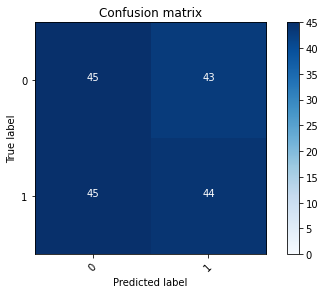

2022-08-20 17:27:06 - [Epoch Train: 62] loss: 0.1013, auc: 0.9943, acc: 0.9640, time: 50.00 s            
2022-08-20 17:27:06 - [Epoch Valid: 62] loss: 2.1671, auc: 0.4814, acc: 0.4903, time: 13.00 s


 62%|████████████████████████▊               | 62/100 [1:06:26<40:37, 64.14s/it]

2022-08-20 17:27:06 - EPOCH: 63
2022-08-20 17:27:07 - Train Step 10/973, train_loss: 0.1641
2022-08-20 17:27:07 - Train Step 20/973, train_loss: 0.1014
2022-08-20 17:27:08 - Train Step 30/973, train_loss: 0.0726
2022-08-20 17:27:08 - Train Step 40/973, train_loss: 0.0614
2022-08-20 17:27:09 - Train Step 50/973, train_loss: 0.0538
2022-08-20 17:27:09 - Train Step 60/973, train_loss: 0.0653
2022-08-20 17:27:10 - Train Step 70/973, train_loss: 0.0668
2022-08-20 17:27:10 - Train Step 80/973, train_loss: 0.0678
2022-08-20 17:27:11 - Train Step 90/973, train_loss: 0.0941
2022-08-20 17:27:11 - Train Step 100/973, train_loss: 0.0911
2022-08-20 17:27:12 - Train Step 110/973, train_loss: 0.0879
2022-08-20 17:27:13 - Train Step 120/973, train_loss: 0.0842
2022-08-20 17:27:13 - Train Step 130/973, train_loss: 0.0823
2022-08-20 17:27:14 - Train Step 140/973, train_loss: 0.0902
2022-08-20 17:27:14 - Train Step 150/973, train_loss: 0.0859
2022-08-20 17:27:15 - Train Step 160/973, train_loss: 0.0827
2

2022-08-20 17:28:07 - Valid Step 185/257, valid_loss: 2.1403
2022-08-20 17:28:08 - Valid Step 190/257, valid_loss: 2.1212
2022-08-20 17:28:08 - Valid Step 195/257, valid_loss: 2.1585
2022-08-20 17:28:08 - Valid Step 200/257, valid_loss: 2.1292
2022-08-20 17:28:08 - Valid Step 205/257, valid_loss: 2.1310
2022-08-20 17:28:09 - Valid Step 210/257, valid_loss: 2.1374
2022-08-20 17:28:09 - Valid Step 215/257, valid_loss: 2.2433
2022-08-20 17:28:09 - Valid Step 220/257, valid_loss: 2.2641
2022-08-20 17:28:09 - Valid Step 225/257, valid_loss: 2.3074
2022-08-20 17:28:10 - Valid Step 230/257, valid_loss: 2.3234
2022-08-20 17:28:10 - Valid Step 235/257, valid_loss: 2.3107
2022-08-20 17:28:10 - Valid Step 240/257, valid_loss: 2.2895
2022-08-20 17:28:10 - Valid Step 245/257, valid_loss: 2.2863
2022-08-20 17:28:11 - Valid Step 250/257, valid_loss: 2.2779
2022-08-20 17:28:11 - Valid Step 255/257, valid_loss: 2.2917
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

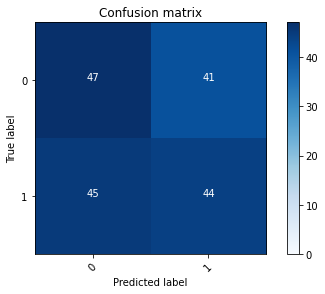

2022-08-20 17:28:11 - [Epoch Train: 63] loss: 0.0851, auc: 0.9970, acc: 0.9723, time: 51.00 s            
2022-08-20 17:28:11 - [Epoch Valid: 63] loss: 2.2820, auc: 0.4747, acc: 0.4981, time: 13.00 s


 63%|█████████████████████████▏              | 63/100 [1:07:31<39:44, 64.46s/it]

2022-08-20 17:28:11 - EPOCH: 64
2022-08-20 17:28:12 - Train Step 10/973, train_loss: 0.0327
2022-08-20 17:28:12 - Train Step 20/973, train_loss: 0.0368
2022-08-20 17:28:13 - Train Step 30/973, train_loss: 0.0413
2022-08-20 17:28:13 - Train Step 40/973, train_loss: 0.0433
2022-08-20 17:28:14 - Train Step 50/973, train_loss: 0.0446
2022-08-20 17:28:14 - Train Step 60/973, train_loss: 0.0449
2022-08-20 17:28:15 - Train Step 70/973, train_loss: 0.0427
2022-08-20 17:28:15 - Train Step 80/973, train_loss: 0.0384
2022-08-20 17:28:16 - Train Step 90/973, train_loss: 0.0435
2022-08-20 17:28:17 - Train Step 100/973, train_loss: 0.0430
2022-08-20 17:28:17 - Train Step 110/973, train_loss: 0.0445
2022-08-20 17:28:18 - Train Step 120/973, train_loss: 0.0569
2022-08-20 17:28:18 - Train Step 130/973, train_loss: 0.0579
2022-08-20 17:28:19 - Train Step 140/973, train_loss: 0.0591
2022-08-20 17:28:19 - Train Step 150/973, train_loss: 0.0581
2022-08-20 17:28:20 - Train Step 160/973, train_loss: 0.0559
2

2022-08-20 17:29:11 - Valid Step 185/257, valid_loss: 2.4398
2022-08-20 17:29:11 - Valid Step 190/257, valid_loss: 2.4177
2022-08-20 17:29:12 - Valid Step 195/257, valid_loss: 2.3921
2022-08-20 17:29:12 - Valid Step 200/257, valid_loss: 2.3706
2022-08-20 17:29:12 - Valid Step 205/257, valid_loss: 2.3717
2022-08-20 17:29:12 - Valid Step 210/257, valid_loss: 2.3332
2022-08-20 17:29:13 - Valid Step 215/257, valid_loss: 2.3231
2022-08-20 17:29:13 - Valid Step 220/257, valid_loss: 2.2900
2022-08-20 17:29:13 - Valid Step 225/257, valid_loss: 2.2523
2022-08-20 17:29:13 - Valid Step 230/257, valid_loss: 2.2538
2022-08-20 17:29:14 - Valid Step 235/257, valid_loss: 2.2078
2022-08-20 17:29:14 - Valid Step 240/257, valid_loss: 2.1920
2022-08-20 17:29:14 - Valid Step 245/257, valid_loss: 2.1828
2022-08-20 17:29:14 - Valid Step 250/257, valid_loss: 2.2169
2022-08-20 17:29:15 - Valid Step 255/257, valid_loss: 2.2213
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

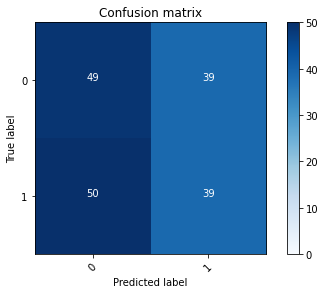

2022-08-20 17:29:15 - [Epoch Train: 64] loss: 0.0850, auc: 0.9961, acc: 0.9764, time: 50.00 s            
2022-08-20 17:29:15 - [Epoch Valid: 64] loss: 2.2096, auc: 0.4560, acc: 0.4942, time: 13.00 s


 64%|█████████████████████████▌              | 64/100 [1:08:35<38:34, 64.29s/it]

2022-08-20 17:29:15 - EPOCH: 65
2022-08-20 17:29:16 - Train Step 10/973, train_loss: 0.0740
2022-08-20 17:29:16 - Train Step 20/973, train_loss: 0.0557
2022-08-20 17:29:17 - Train Step 30/973, train_loss: 0.0697
2022-08-20 17:29:17 - Train Step 40/973, train_loss: 0.0715
2022-08-20 17:29:18 - Train Step 50/973, train_loss: 0.0626
2022-08-20 17:29:18 - Train Step 60/973, train_loss: 0.0658
2022-08-20 17:29:19 - Train Step 70/973, train_loss: 0.0664
2022-08-20 17:29:19 - Train Step 80/973, train_loss: 0.0772
2022-08-20 17:29:20 - Train Step 90/973, train_loss: 0.0786
2022-08-20 17:29:20 - Train Step 100/973, train_loss: 0.0916
2022-08-20 17:29:21 - Train Step 110/973, train_loss: 0.0870
2022-08-20 17:29:21 - Train Step 120/973, train_loss: 0.0816
2022-08-20 17:29:22 - Train Step 130/973, train_loss: 0.0773
2022-08-20 17:29:23 - Train Step 140/973, train_loss: 0.0737
2022-08-20 17:29:23 - Train Step 150/973, train_loss: 0.0730
2022-08-20 17:29:24 - Train Step 160/973, train_loss: 0.0817
2

2022-08-20 17:30:15 - Valid Step 185/257, valid_loss: 2.2550
2022-08-20 17:30:16 - Valid Step 190/257, valid_loss: 2.2669
2022-08-20 17:30:16 - Valid Step 195/257, valid_loss: 2.2105
2022-08-20 17:30:16 - Valid Step 200/257, valid_loss: 2.1778
2022-08-20 17:30:16 - Valid Step 205/257, valid_loss: 2.1433
2022-08-20 17:30:17 - Valid Step 210/257, valid_loss: 2.1480
2022-08-20 17:30:17 - Valid Step 215/257, valid_loss: 2.2338
2022-08-20 17:30:17 - Valid Step 220/257, valid_loss: 2.2837
2022-08-20 17:30:17 - Valid Step 225/257, valid_loss: 2.2883
2022-08-20 17:30:18 - Valid Step 230/257, valid_loss: 2.2730
2022-08-20 17:30:18 - Valid Step 235/257, valid_loss: 2.2856
2022-08-20 17:30:18 - Valid Step 240/257, valid_loss: 2.2578
2022-08-20 17:30:18 - Valid Step 245/257, valid_loss: 2.2743
2022-08-20 17:30:19 - Valid Step 250/257, valid_loss: 2.2943
2022-08-20 17:30:19 - Valid Step 255/257, valid_loss: 2.2856
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

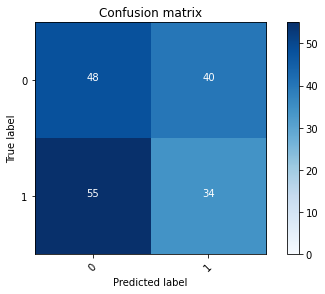

2022-08-20 17:30:19 - [Epoch Train: 65] loss: 0.0898, auc: 0.9952, acc: 0.9743, time: 50.00 s            
2022-08-20 17:30:19 - [Epoch Valid: 65] loss: 2.2902, auc: 0.4462, acc: 0.4630, time: 13.00 s


 65%|██████████████████████████              | 65/100 [1:09:39<37:28, 64.24s/it]

2022-08-20 17:30:19 - EPOCH: 66
2022-08-20 17:30:20 - Train Step 10/973, train_loss: 0.1432
2022-08-20 17:30:20 - Train Step 20/973, train_loss: 0.1238
2022-08-20 17:30:21 - Train Step 30/973, train_loss: 0.1077
2022-08-20 17:30:21 - Train Step 40/973, train_loss: 0.1027
2022-08-20 17:30:22 - Train Step 50/973, train_loss: 0.0925
2022-08-20 17:30:22 - Train Step 60/973, train_loss: 0.0922
2022-08-20 17:30:23 - Train Step 70/973, train_loss: 0.0818
2022-08-20 17:30:23 - Train Step 80/973, train_loss: 0.0884
2022-08-20 17:30:24 - Train Step 90/973, train_loss: 0.0809
2022-08-20 17:30:24 - Train Step 100/973, train_loss: 0.0916
2022-08-20 17:30:25 - Train Step 110/973, train_loss: 0.0950
2022-08-20 17:30:26 - Train Step 120/973, train_loss: 0.0889
2022-08-20 17:30:26 - Train Step 130/973, train_loss: 0.0952
2022-08-20 17:30:27 - Train Step 140/973, train_loss: 0.0907
2022-08-20 17:30:27 - Train Step 150/973, train_loss: 0.0877
2022-08-20 17:30:28 - Train Step 160/973, train_loss: 0.0854
2

2022-08-20 17:31:29 - Valid Step 185/257, valid_loss: 2.2965
2022-08-20 17:31:29 - Valid Step 190/257, valid_loss: 2.3962
2022-08-20 17:31:29 - Valid Step 195/257, valid_loss: 2.4160
2022-08-20 17:31:30 - Valid Step 200/257, valid_loss: 2.4229
2022-08-20 17:31:30 - Valid Step 205/257, valid_loss: 2.4198
2022-08-20 17:31:30 - Valid Step 210/257, valid_loss: 2.3700
2022-08-20 17:31:31 - Valid Step 215/257, valid_loss: 2.3568
2022-08-20 17:31:31 - Valid Step 220/257, valid_loss: 2.3504
2022-08-20 17:31:31 - Valid Step 225/257, valid_loss: 2.3522
2022-08-20 17:31:32 - Valid Step 230/257, valid_loss: 2.3264
2022-08-20 17:31:32 - Valid Step 235/257, valid_loss: 2.3088
2022-08-20 17:31:32 - Valid Step 240/257, valid_loss: 2.3387
2022-08-20 17:31:32 - Valid Step 245/257, valid_loss: 2.3555
2022-08-20 17:31:33 - Valid Step 250/257, valid_loss: 2.3537
2022-08-20 17:31:33 - Valid Step 255/257, valid_loss: 2.3422
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

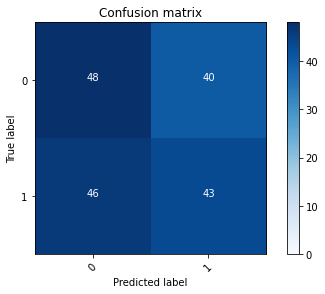

2022-08-20 17:31:33 - [Epoch Train: 66] loss: 0.0829, auc: 0.9966, acc: 0.9753, time: 58.00 s            
2022-08-20 17:31:33 - [Epoch Valid: 66] loss: 2.3251, auc: 0.4789, acc: 0.5019, time: 16.00 s


 66%|██████████████████████████▍             | 66/100 [1:10:53<38:05, 67.23s/it]

2022-08-20 17:31:33 - EPOCH: 67
2022-08-20 17:31:34 - Train Step 10/973, train_loss: 0.0176
2022-08-20 17:31:35 - Train Step 20/973, train_loss: 0.0482
2022-08-20 17:31:35 - Train Step 30/973, train_loss: 0.0440
2022-08-20 17:31:36 - Train Step 40/973, train_loss: 0.0438
2022-08-20 17:31:36 - Train Step 50/973, train_loss: 0.0608
2022-08-20 17:31:37 - Train Step 60/973, train_loss: 0.0600
2022-08-20 17:31:38 - Train Step 70/973, train_loss: 0.0694
2022-08-20 17:31:38 - Train Step 80/973, train_loss: 0.0639
2022-08-20 17:31:39 - Train Step 90/973, train_loss: 0.0619
2022-08-20 17:31:39 - Train Step 100/973, train_loss: 0.0615
2022-08-20 17:31:40 - Train Step 110/973, train_loss: 0.0601
2022-08-20 17:31:41 - Train Step 120/973, train_loss: 0.0636
2022-08-20 17:31:41 - Train Step 130/973, train_loss: 0.0618
2022-08-20 17:31:42 - Train Step 140/973, train_loss: 0.0648
2022-08-20 17:31:42 - Train Step 150/973, train_loss: 0.0643
2022-08-20 17:31:43 - Train Step 160/973, train_loss: 0.0622
2

2022-08-20 17:32:43 - Valid Step 185/257, valid_loss: 2.2590
2022-08-20 17:32:43 - Valid Step 190/257, valid_loss: 2.2883
2022-08-20 17:32:44 - Valid Step 195/257, valid_loss: 2.3519
2022-08-20 17:32:44 - Valid Step 200/257, valid_loss: 2.3624
2022-08-20 17:32:44 - Valid Step 205/257, valid_loss: 2.4254
2022-08-20 17:32:44 - Valid Step 210/257, valid_loss: 2.3998
2022-08-20 17:32:45 - Valid Step 215/257, valid_loss: 2.3699
2022-08-20 17:32:45 - Valid Step 220/257, valid_loss: 2.4174
2022-08-20 17:32:45 - Valid Step 225/257, valid_loss: 2.4250
2022-08-20 17:32:46 - Valid Step 230/257, valid_loss: 2.3997
2022-08-20 17:32:46 - Valid Step 235/257, valid_loss: 2.3605
2022-08-20 17:32:46 - Valid Step 240/257, valid_loss: 2.3275
2022-08-20 17:32:47 - Valid Step 245/257, valid_loss: 2.3469
2022-08-20 17:32:47 - Valid Step 250/257, valid_loss: 2.3563
2022-08-20 17:32:47 - Valid Step 255/257, valid_loss: 2.3665
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

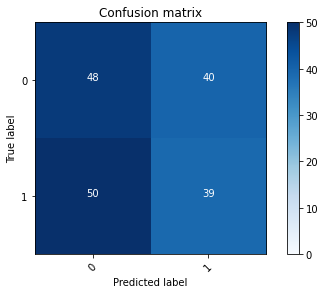

2022-08-20 17:32:47 - [Epoch Train: 67] loss: 0.0765, auc: 0.9970, acc: 0.9753, time: 59.00 s            
2022-08-20 17:32:47 - [Epoch Valid: 67] loss: 2.3653, auc: 0.4630, acc: 0.4747, time: 14.00 s


 67%|██████████████████████████▊             | 67/100 [1:12:07<38:06, 69.30s/it]

2022-08-20 17:32:47 - EPOCH: 68
2022-08-20 17:32:48 - Train Step 10/973, train_loss: 0.0413
2022-08-20 17:32:49 - Train Step 20/973, train_loss: 0.0677
2022-08-20 17:32:49 - Train Step 30/973, train_loss: 0.0720
2022-08-20 17:32:50 - Train Step 40/973, train_loss: 0.1029
2022-08-20 17:32:51 - Train Step 50/973, train_loss: 0.1004
2022-08-20 17:32:51 - Train Step 60/973, train_loss: 0.1172
2022-08-20 17:32:52 - Train Step 70/973, train_loss: 0.1153
2022-08-20 17:32:52 - Train Step 80/973, train_loss: 0.1081
2022-08-20 17:32:53 - Train Step 90/973, train_loss: 0.1138
2022-08-20 17:32:53 - Train Step 100/973, train_loss: 0.1045
2022-08-20 17:32:54 - Train Step 110/973, train_loss: 0.1008
2022-08-20 17:32:54 - Train Step 120/973, train_loss: 0.1009
2022-08-20 17:32:55 - Train Step 130/973, train_loss: 0.0968
2022-08-20 17:32:56 - Train Step 140/973, train_loss: 0.0986
2022-08-20 17:32:56 - Train Step 150/973, train_loss: 0.0930
2022-08-20 17:32:57 - Train Step 160/973, train_loss: 0.0889
2

2022-08-20 17:33:58 - Valid Step 185/257, valid_loss: 2.5747
2022-08-20 17:33:58 - Valid Step 190/257, valid_loss: 2.5914
2022-08-20 17:33:58 - Valid Step 195/257, valid_loss: 2.6111
2022-08-20 17:33:58 - Valid Step 200/257, valid_loss: 2.5671
2022-08-20 17:33:59 - Valid Step 205/257, valid_loss: 2.5784
2022-08-20 17:33:59 - Valid Step 210/257, valid_loss: 2.5277
2022-08-20 17:33:59 - Valid Step 215/257, valid_loss: 2.5677
2022-08-20 17:34:00 - Valid Step 220/257, valid_loss: 2.6447
2022-08-20 17:34:00 - Valid Step 225/257, valid_loss: 2.6193
2022-08-20 17:34:00 - Valid Step 230/257, valid_loss: 2.5806
2022-08-20 17:34:00 - Valid Step 235/257, valid_loss: 2.5650
2022-08-20 17:34:01 - Valid Step 240/257, valid_loss: 2.5447
2022-08-20 17:34:01 - Valid Step 245/257, valid_loss: 2.5107
2022-08-20 17:34:01 - Valid Step 250/257, valid_loss: 2.4966
2022-08-20 17:34:02 - Valid Step 255/257, valid_loss: 2.5668
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

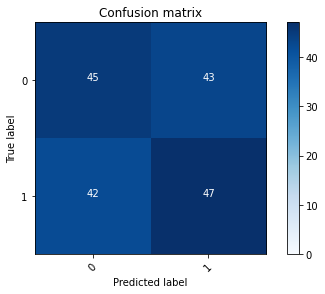

2022-08-20 17:34:02 - [Epoch Train: 68] loss: 0.0750, auc: 0.9970, acc: 0.9764, time: 58.00 s            
2022-08-20 17:34:02 - [Epoch Valid: 68] loss: 2.5579, auc: 0.4756, acc: 0.5019, time: 16.00 s


 68%|███████████████████████████▏            | 68/100 [1:13:22<37:47, 70.85s/it]

2022-08-20 17:34:02 - EPOCH: 69
2022-08-20 17:34:03 - Train Step 10/973, train_loss: 0.0198
2022-08-20 17:34:03 - Train Step 20/973, train_loss: 0.0412
2022-08-20 17:34:04 - Train Step 30/973, train_loss: 0.0521
2022-08-20 17:34:04 - Train Step 40/973, train_loss: 0.0511
2022-08-20 17:34:05 - Train Step 50/973, train_loss: 0.0455
2022-08-20 17:34:05 - Train Step 60/973, train_loss: 0.0484
2022-08-20 17:34:06 - Train Step 70/973, train_loss: 0.0606
2022-08-20 17:34:07 - Train Step 80/973, train_loss: 0.0543
2022-08-20 17:34:07 - Train Step 90/973, train_loss: 0.0521
2022-08-20 17:34:08 - Train Step 100/973, train_loss: 0.0508
2022-08-20 17:34:08 - Train Step 110/973, train_loss: 0.0509
2022-08-20 17:34:09 - Train Step 120/973, train_loss: 0.0495
2022-08-20 17:34:09 - Train Step 130/973, train_loss: 0.0482
2022-08-20 17:34:10 - Train Step 140/973, train_loss: 0.0454
2022-08-20 17:34:11 - Train Step 150/973, train_loss: 0.0470
2022-08-20 17:34:11 - Train Step 160/973, train_loss: 0.0536
2

2022-08-20 17:35:11 - Valid Step 185/257, valid_loss: 2.8558
2022-08-20 17:35:12 - Valid Step 190/257, valid_loss: 2.8429
2022-08-20 17:35:12 - Valid Step 195/257, valid_loss: 2.8951
2022-08-20 17:35:12 - Valid Step 200/257, valid_loss: 2.9633
2022-08-20 17:35:13 - Valid Step 205/257, valid_loss: 2.9750
2022-08-20 17:35:13 - Valid Step 210/257, valid_loss: 2.9846
2022-08-20 17:35:13 - Valid Step 215/257, valid_loss: 2.9184
2022-08-20 17:35:14 - Valid Step 220/257, valid_loss: 2.9014
2022-08-20 17:35:14 - Valid Step 225/257, valid_loss: 2.9071
2022-08-20 17:35:14 - Valid Step 230/257, valid_loss: 2.9667
2022-08-20 17:35:15 - Valid Step 235/257, valid_loss: 2.9143
2022-08-20 17:35:15 - Valid Step 240/257, valid_loss: 2.9522
2022-08-20 17:35:15 - Valid Step 245/257, valid_loss: 2.9213
2022-08-20 17:35:15 - Valid Step 250/257, valid_loss: 2.9134
2022-08-20 17:35:16 - Valid Step 255/257, valid_loss: 2.9073
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

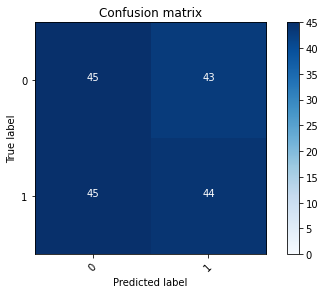

2022-08-20 17:35:16 - [Epoch Train: 69] loss: 0.0704, auc: 0.9975, acc: 0.9815, time: 58.00 s            
2022-08-20 17:35:16 - [Epoch Valid: 69] loss: 2.9027, auc: 0.4669, acc: 0.4903, time: 15.00 s


 69%|███████████████████████████▌            | 69/100 [1:14:36<37:06, 71.81s/it]

2022-08-20 17:35:16 - EPOCH: 70
2022-08-20 17:35:17 - Train Step 10/973, train_loss: 0.0325
2022-08-20 17:35:17 - Train Step 20/973, train_loss: 0.0301
2022-08-20 17:35:18 - Train Step 30/973, train_loss: 0.0256
2022-08-20 17:35:18 - Train Step 40/973, train_loss: 0.0251
2022-08-20 17:35:19 - Train Step 50/973, train_loss: 0.0437
2022-08-20 17:35:20 - Train Step 60/973, train_loss: 0.0383
2022-08-20 17:35:20 - Train Step 70/973, train_loss: 0.0366
2022-08-20 17:35:21 - Train Step 80/973, train_loss: 0.0378
2022-08-20 17:35:21 - Train Step 90/973, train_loss: 0.0374
2022-08-20 17:35:22 - Train Step 100/973, train_loss: 0.0468
2022-08-20 17:35:23 - Train Step 110/973, train_loss: 0.0452
2022-08-20 17:35:23 - Train Step 120/973, train_loss: 0.0525
2022-08-20 17:35:24 - Train Step 130/973, train_loss: 0.0585
2022-08-20 17:35:24 - Train Step 140/973, train_loss: 0.0555
2022-08-20 17:35:25 - Train Step 150/973, train_loss: 0.0532
2022-08-20 17:35:25 - Train Step 160/973, train_loss: 0.0527
2

2022-08-20 17:36:25 - Valid Step 185/257, valid_loss: 2.8572
2022-08-20 17:36:26 - Valid Step 190/257, valid_loss: 2.8747
2022-08-20 17:36:26 - Valid Step 195/257, valid_loss: 2.8590
2022-08-20 17:36:26 - Valid Step 200/257, valid_loss: 2.8629
2022-08-20 17:36:26 - Valid Step 205/257, valid_loss: 2.8564
2022-08-20 17:36:27 - Valid Step 210/257, valid_loss: 2.8585
2022-08-20 17:36:27 - Valid Step 215/257, valid_loss: 2.8577
2022-08-20 17:36:27 - Valid Step 220/257, valid_loss: 2.8994
2022-08-20 17:36:28 - Valid Step 225/257, valid_loss: 2.8955
2022-08-20 17:36:28 - Valid Step 230/257, valid_loss: 2.9396
2022-08-20 17:36:28 - Valid Step 235/257, valid_loss: 2.9731
2022-08-20 17:36:29 - Valid Step 240/257, valid_loss: 2.9872
2022-08-20 17:36:29 - Valid Step 245/257, valid_loss: 2.9839
2022-08-20 17:36:29 - Valid Step 250/257, valid_loss: 2.9369
2022-08-20 17:36:29 - Valid Step 255/257, valid_loss: 2.8904
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

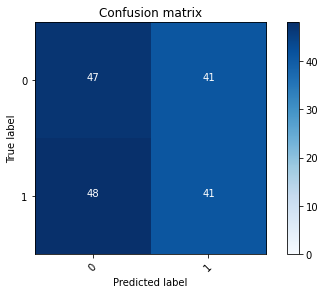

2022-08-20 17:36:30 - [Epoch Train: 70] loss: 0.0512, auc: 0.9992, acc: 0.9887, time: 58.00 s            
2022-08-20 17:36:30 - [Epoch Valid: 70] loss: 2.9002, auc: 0.4667, acc: 0.4786, time: 15.00 s


 70%|████████████████████████████            | 70/100 [1:15:50<36:12, 72.41s/it]

2022-08-20 17:36:30 - EPOCH: 71
2022-08-20 17:36:31 - Train Step 10/973, train_loss: 0.1832
2022-08-20 17:36:31 - Train Step 20/973, train_loss: 0.1342
2022-08-20 17:36:32 - Train Step 30/973, train_loss: 0.1042
2022-08-20 17:36:32 - Train Step 40/973, train_loss: 0.0924
2022-08-20 17:36:33 - Train Step 50/973, train_loss: 0.0962
2022-08-20 17:36:34 - Train Step 60/973, train_loss: 0.0928
2022-08-20 17:36:34 - Train Step 70/973, train_loss: 0.1129
2022-08-20 17:36:35 - Train Step 80/973, train_loss: 0.1124
2022-08-20 17:36:36 - Train Step 90/973, train_loss: 0.1031
2022-08-20 17:36:36 - Train Step 100/973, train_loss: 0.0972
2022-08-20 17:36:37 - Train Step 110/973, train_loss: 0.1077
2022-08-20 17:36:38 - Train Step 120/973, train_loss: 0.1015
2022-08-20 17:36:38 - Train Step 130/973, train_loss: 0.0946
2022-08-20 17:36:39 - Train Step 140/973, train_loss: 0.1003
2022-08-20 17:36:39 - Train Step 150/973, train_loss: 0.0974
2022-08-20 17:36:40 - Train Step 160/973, train_loss: 0.0940
2

2022-08-20 17:37:40 - Valid Step 185/257, valid_loss: 2.5793
2022-08-20 17:37:40 - Valid Step 190/257, valid_loss: 2.6090
2022-08-20 17:37:40 - Valid Step 195/257, valid_loss: 2.5998
2022-08-20 17:37:41 - Valid Step 200/257, valid_loss: 2.6195
2022-08-20 17:37:41 - Valid Step 205/257, valid_loss: 2.6398
2022-08-20 17:37:41 - Valid Step 210/257, valid_loss: 2.6203
2022-08-20 17:37:41 - Valid Step 215/257, valid_loss: 2.7368
2022-08-20 17:37:42 - Valid Step 220/257, valid_loss: 2.7754
2022-08-20 17:37:42 - Valid Step 225/257, valid_loss: 2.7492
2022-08-20 17:37:42 - Valid Step 230/257, valid_loss: 2.7204
2022-08-20 17:37:43 - Valid Step 235/257, valid_loss: 2.7792
2022-08-20 17:37:43 - Valid Step 240/257, valid_loss: 2.7360
2022-08-20 17:37:43 - Valid Step 245/257, valid_loss: 2.7329
2022-08-20 17:37:43 - Valid Step 250/257, valid_loss: 2.7017
2022-08-20 17:37:44 - Valid Step 255/257, valid_loss: 2.7577
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

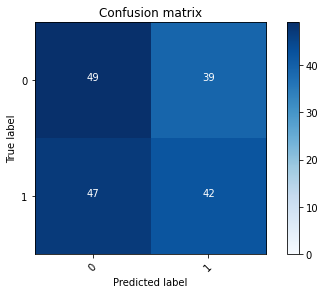

2022-08-20 17:37:44 - [Epoch Train: 71] loss: 0.0595, auc: 0.9988, acc: 0.9856, time: 59.00 s            
2022-08-20 17:37:44 - [Epoch Valid: 71] loss: 2.7882, auc: 0.4779, acc: 0.4981, time: 15.00 s


 71%|████████████████████████████▍           | 71/100 [1:17:04<35:16, 72.98s/it]

2022-08-20 17:37:44 - EPOCH: 72
2022-08-20 17:37:45 - Train Step 10/973, train_loss: 0.0752
2022-08-20 17:37:46 - Train Step 20/973, train_loss: 0.0635
2022-08-20 17:37:46 - Train Step 30/973, train_loss: 0.0802
2022-08-20 17:37:47 - Train Step 40/973, train_loss: 0.0671
2022-08-20 17:37:47 - Train Step 50/973, train_loss: 0.0544
2022-08-20 17:37:48 - Train Step 60/973, train_loss: 0.0671
2022-08-20 17:37:49 - Train Step 70/973, train_loss: 0.0648
2022-08-20 17:37:49 - Train Step 80/973, train_loss: 0.0656
2022-08-20 17:37:50 - Train Step 90/973, train_loss: 0.0638
2022-08-20 17:37:50 - Train Step 100/973, train_loss: 0.0627
2022-08-20 17:37:51 - Train Step 110/973, train_loss: 0.0611
2022-08-20 17:37:51 - Train Step 120/973, train_loss: 0.0573
2022-08-20 17:37:52 - Train Step 130/973, train_loss: 0.0563
2022-08-20 17:37:53 - Train Step 140/973, train_loss: 0.0529
2022-08-20 17:37:53 - Train Step 150/973, train_loss: 0.0509
2022-08-20 17:37:54 - Train Step 160/973, train_loss: 0.0488
2

2022-08-20 17:38:45 - Valid Step 185/257, valid_loss: 3.0506
2022-08-20 17:38:46 - Valid Step 190/257, valid_loss: 3.0940
2022-08-20 17:38:46 - Valid Step 195/257, valid_loss: 3.0694
2022-08-20 17:38:46 - Valid Step 200/257, valid_loss: 3.0192
2022-08-20 17:38:46 - Valid Step 205/257, valid_loss: 2.9686
2022-08-20 17:38:47 - Valid Step 210/257, valid_loss: 2.9378
2022-08-20 17:38:47 - Valid Step 215/257, valid_loss: 2.9539
2022-08-20 17:38:47 - Valid Step 220/257, valid_loss: 2.9261
2022-08-20 17:38:47 - Valid Step 225/257, valid_loss: 2.9387
2022-08-20 17:38:48 - Valid Step 230/257, valid_loss: 2.8929
2022-08-20 17:38:48 - Valid Step 235/257, valid_loss: 2.8779
2022-08-20 17:38:48 - Valid Step 240/257, valid_loss: 2.8311
2022-08-20 17:38:48 - Valid Step 245/257, valid_loss: 2.9368
2022-08-20 17:38:49 - Valid Step 250/257, valid_loss: 2.8802
2022-08-20 17:38:49 - Valid Step 255/257, valid_loss: 2.8484
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

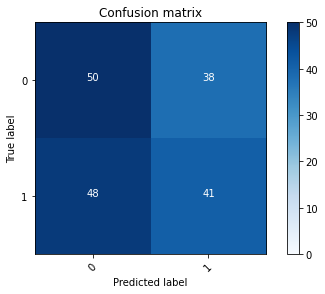

2022-08-20 17:38:49 - [Epoch Train: 72] loss: 0.0547, auc: 0.9994, acc: 0.9856, time: 51.00 s            
2022-08-20 17:38:49 - [Epoch Valid: 72] loss: 2.8471, auc: 0.4581, acc: 0.5058, time: 13.00 s


 72%|████████████████████████████▊           | 72/100 [1:18:09<32:57, 70.64s/it]

2022-08-20 17:38:49 - EPOCH: 73
2022-08-20 17:38:50 - Train Step 10/973, train_loss: 0.0273
2022-08-20 17:38:50 - Train Step 20/973, train_loss: 0.0729
2022-08-20 17:38:51 - Train Step 30/973, train_loss: 0.0506
2022-08-20 17:38:51 - Train Step 40/973, train_loss: 0.0414
2022-08-20 17:38:52 - Train Step 50/973, train_loss: 0.0374
2022-08-20 17:38:52 - Train Step 60/973, train_loss: 0.0336
2022-08-20 17:38:53 - Train Step 70/973, train_loss: 0.0377
2022-08-20 17:38:53 - Train Step 80/973, train_loss: 0.0431
2022-08-20 17:38:54 - Train Step 90/973, train_loss: 0.0415
2022-08-20 17:38:54 - Train Step 100/973, train_loss: 0.0382
2022-08-20 17:38:55 - Train Step 110/973, train_loss: 0.0530
2022-08-20 17:38:55 - Train Step 120/973, train_loss: 0.0495
2022-08-20 17:38:56 - Train Step 130/973, train_loss: 0.0484
2022-08-20 17:38:57 - Train Step 140/973, train_loss: 0.0492
2022-08-20 17:38:57 - Train Step 150/973, train_loss: 0.0470
2022-08-20 17:38:58 - Train Step 160/973, train_loss: 0.0502
2

2022-08-20 17:39:49 - Valid Step 185/257, valid_loss: 3.1077
2022-08-20 17:39:50 - Valid Step 190/257, valid_loss: 3.0277
2022-08-20 17:39:50 - Valid Step 195/257, valid_loss: 2.9698
2022-08-20 17:39:50 - Valid Step 200/257, valid_loss: 3.0343
2022-08-20 17:39:50 - Valid Step 205/257, valid_loss: 3.0429
2022-08-20 17:39:51 - Valid Step 210/257, valid_loss: 2.9780
2022-08-20 17:39:51 - Valid Step 215/257, valid_loss: 2.9379
2022-08-20 17:39:51 - Valid Step 220/257, valid_loss: 2.9140
2022-08-20 17:39:51 - Valid Step 225/257, valid_loss: 2.9743
2022-08-20 17:39:52 - Valid Step 230/257, valid_loss: 2.9660
2022-08-20 17:39:52 - Valid Step 235/257, valid_loss: 2.9467
2022-08-20 17:39:52 - Valid Step 240/257, valid_loss: 2.9218
2022-08-20 17:39:52 - Valid Step 245/257, valid_loss: 2.8931
2022-08-20 17:39:53 - Valid Step 250/257, valid_loss: 2.8500
2022-08-20 17:39:53 - Valid Step 255/257, valid_loss: 2.8328
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

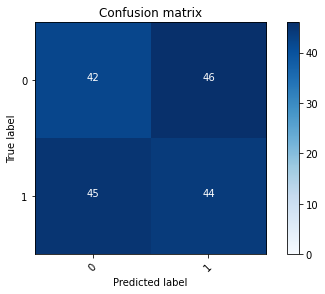

2022-08-20 17:39:53 - [Epoch Train: 73] loss: 0.0560, auc: 0.9985, acc: 0.9794, time: 50.00 s            
2022-08-20 17:39:53 - [Epoch Valid: 73] loss: 2.8162, auc: 0.4609, acc: 0.4708, time: 13.00 s


 73%|█████████████████████████████▏          | 73/100 [1:19:13<30:53, 68.64s/it]

2022-08-20 17:39:53 - EPOCH: 74
2022-08-20 17:39:54 - Train Step 10/973, train_loss: 0.0210
2022-08-20 17:39:55 - Train Step 20/973, train_loss: 0.0131
2022-08-20 17:39:55 - Train Step 30/973, train_loss: 0.0119
2022-08-20 17:39:56 - Train Step 40/973, train_loss: 0.0245
2022-08-20 17:39:56 - Train Step 50/973, train_loss: 0.0443
2022-08-20 17:39:57 - Train Step 60/973, train_loss: 0.0455
2022-08-20 17:39:57 - Train Step 70/973, train_loss: 0.0453
2022-08-20 17:39:58 - Train Step 80/973, train_loss: 0.0497
2022-08-20 17:39:58 - Train Step 90/973, train_loss: 0.0454
2022-08-20 17:39:59 - Train Step 100/973, train_loss: 0.0419
2022-08-20 17:39:59 - Train Step 110/973, train_loss: 0.0395
2022-08-20 17:40:00 - Train Step 120/973, train_loss: 0.0421
2022-08-20 17:40:00 - Train Step 130/973, train_loss: 0.0602
2022-08-20 17:40:01 - Train Step 140/973, train_loss: 0.0659
2022-08-20 17:40:01 - Train Step 150/973, train_loss: 0.0664
2022-08-20 17:40:02 - Train Step 160/973, train_loss: 0.0641
2

2022-08-20 17:40:53 - Valid Step 185/257, valid_loss: 3.3159
2022-08-20 17:40:53 - Valid Step 190/257, valid_loss: 3.2902
2022-08-20 17:40:54 - Valid Step 195/257, valid_loss: 3.2861
2022-08-20 17:40:54 - Valid Step 200/257, valid_loss: 3.2640
2022-08-20 17:40:54 - Valid Step 205/257, valid_loss: 3.1964
2022-08-20 17:40:54 - Valid Step 210/257, valid_loss: 3.2447
2022-08-20 17:40:55 - Valid Step 215/257, valid_loss: 3.2097
2022-08-20 17:40:55 - Valid Step 220/257, valid_loss: 3.1693
2022-08-20 17:40:55 - Valid Step 225/257, valid_loss: 3.1495
2022-08-20 17:40:56 - Valid Step 230/257, valid_loss: 3.1332
2022-08-20 17:40:56 - Valid Step 235/257, valid_loss: 3.0985
2022-08-20 17:40:56 - Valid Step 240/257, valid_loss: 3.1595
2022-08-20 17:40:56 - Valid Step 245/257, valid_loss: 3.1083
2022-08-20 17:40:57 - Valid Step 250/257, valid_loss: 3.0701
2022-08-20 17:40:57 - Valid Step 255/257, valid_loss: 3.0537
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

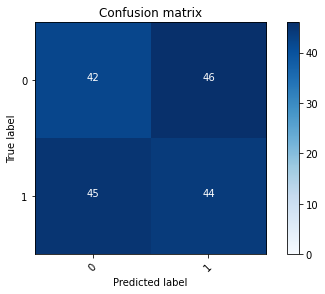

2022-08-20 17:40:57 - [Epoch Train: 74] loss: 0.0521, auc: 0.9991, acc: 0.9836, time: 50.00 s            
2022-08-20 17:40:57 - [Epoch Valid: 74] loss: 3.0374, auc: 0.4628, acc: 0.4708, time: 13.00 s


 74%|█████████████████████████████▌          | 74/100 [1:20:17<29:06, 67.18s/it]

2022-08-20 17:40:57 - EPOCH: 75
2022-08-20 17:40:58 - Train Step 10/973, train_loss: 0.1433
2022-08-20 17:40:58 - Train Step 20/973, train_loss: 0.0968
2022-08-20 17:40:59 - Train Step 30/973, train_loss: 0.0885
2022-08-20 17:40:59 - Train Step 40/973, train_loss: 0.0845
2022-08-20 17:41:00 - Train Step 50/973, train_loss: 0.0695
2022-08-20 17:41:00 - Train Step 60/973, train_loss: 0.0736
2022-08-20 17:41:01 - Train Step 70/973, train_loss: 0.0748
2022-08-20 17:41:01 - Train Step 80/973, train_loss: 0.0763
2022-08-20 17:41:02 - Train Step 90/973, train_loss: 0.0710
2022-08-20 17:41:02 - Train Step 100/973, train_loss: 0.0707
2022-08-20 17:41:03 - Train Step 110/973, train_loss: 0.0706
2022-08-20 17:41:03 - Train Step 120/973, train_loss: 0.0677
2022-08-20 17:41:04 - Train Step 130/973, train_loss: 0.0673
2022-08-20 17:41:05 - Train Step 140/973, train_loss: 0.0668
2022-08-20 17:41:05 - Train Step 150/973, train_loss: 0.0678
2022-08-20 17:41:06 - Train Step 160/973, train_loss: 0.0650
2

2022-08-20 17:41:57 - Valid Step 185/257, valid_loss: 3.5685
2022-08-20 17:41:58 - Valid Step 190/257, valid_loss: 3.5536
2022-08-20 17:41:58 - Valid Step 195/257, valid_loss: 3.5055
2022-08-20 17:41:58 - Valid Step 200/257, valid_loss: 3.4673
2022-08-20 17:41:58 - Valid Step 205/257, valid_loss: 3.3959
2022-08-20 17:41:59 - Valid Step 210/257, valid_loss: 3.4029
2022-08-20 17:41:59 - Valid Step 215/257, valid_loss: 3.3378
2022-08-20 17:41:59 - Valid Step 220/257, valid_loss: 3.2890
2022-08-20 17:41:59 - Valid Step 225/257, valid_loss: 3.2636
2022-08-20 17:42:00 - Valid Step 230/257, valid_loss: 3.2217
2022-08-20 17:42:00 - Valid Step 235/257, valid_loss: 3.2810
2022-08-20 17:42:00 - Valid Step 240/257, valid_loss: 3.2949
2022-08-20 17:42:00 - Valid Step 245/257, valid_loss: 3.2818
2022-08-20 17:42:01 - Valid Step 250/257, valid_loss: 3.2163
2022-08-20 17:42:01 - Valid Step 255/257, valid_loss: 3.1853
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

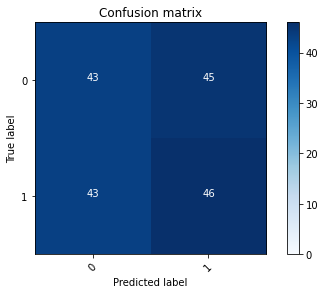

2022-08-20 17:42:01 - [Epoch Train: 75] loss: 0.0556, auc: 0.9990, acc: 0.9805, time: 50.00 s            
2022-08-20 17:42:01 - [Epoch Valid: 75] loss: 3.1909, auc: 0.4557, acc: 0.4942, time: 13.00 s


 75%|██████████████████████████████          | 75/100 [1:21:21<27:36, 66.27s/it]

2022-08-20 17:42:01 - EPOCH: 76
2022-08-20 17:42:02 - Train Step 10/973, train_loss: 0.1259
2022-08-20 17:42:02 - Train Step 20/973, train_loss: 0.0834
2022-08-20 17:42:03 - Train Step 30/973, train_loss: 0.0586
2022-08-20 17:42:03 - Train Step 40/973, train_loss: 0.0566
2022-08-20 17:42:04 - Train Step 50/973, train_loss: 0.0614
2022-08-20 17:42:04 - Train Step 60/973, train_loss: 0.0556
2022-08-20 17:42:05 - Train Step 70/973, train_loss: 0.0522
2022-08-20 17:42:05 - Train Step 80/973, train_loss: 0.0722
2022-08-20 17:42:06 - Train Step 90/973, train_loss: 0.0656
2022-08-20 17:42:06 - Train Step 100/973, train_loss: 0.0600
2022-08-20 17:42:07 - Train Step 110/973, train_loss: 0.0577
2022-08-20 17:42:08 - Train Step 120/973, train_loss: 0.0586
2022-08-20 17:42:08 - Train Step 130/973, train_loss: 0.0548
2022-08-20 17:42:09 - Train Step 140/973, train_loss: 0.0564
2022-08-20 17:42:09 - Train Step 150/973, train_loss: 0.0541
2022-08-20 17:42:10 - Train Step 160/973, train_loss: 0.0517
2

2022-08-20 17:43:02 - Valid Step 185/257, valid_loss: 2.8258
2022-08-20 17:43:02 - Valid Step 190/257, valid_loss: 2.8971
2022-08-20 17:43:02 - Valid Step 195/257, valid_loss: 3.0641
2022-08-20 17:43:02 - Valid Step 200/257, valid_loss: 3.0774
2022-08-20 17:43:03 - Valid Step 205/257, valid_loss: 3.0546
2022-08-20 17:43:03 - Valid Step 210/257, valid_loss: 3.0297
2022-08-20 17:43:03 - Valid Step 215/257, valid_loss: 2.9904
2022-08-20 17:43:03 - Valid Step 220/257, valid_loss: 2.9748
2022-08-20 17:43:04 - Valid Step 225/257, valid_loss: 2.9369
2022-08-20 17:43:04 - Valid Step 230/257, valid_loss: 2.9107
2022-08-20 17:43:04 - Valid Step 235/257, valid_loss: 2.8971
2022-08-20 17:43:05 - Valid Step 240/257, valid_loss: 2.8677
2022-08-20 17:43:05 - Valid Step 245/257, valid_loss: 2.8842
2022-08-20 17:43:05 - Valid Step 250/257, valid_loss: 2.8900
2022-08-20 17:43:05 - Valid Step 255/257, valid_loss: 2.8970
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

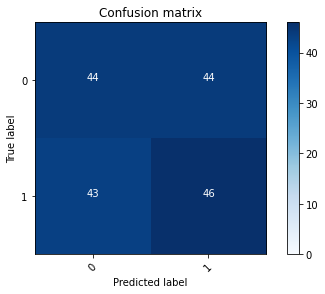

2022-08-20 17:43:06 - [Epoch Train: 76] loss: 0.0531, auc: 0.9986, acc: 0.9846, time: 50.00 s            
2022-08-20 17:43:06 - [Epoch Valid: 76] loss: 2.8840, auc: 0.4657, acc: 0.4942, time: 13.00 s


 76%|██████████████████████████████▍         | 76/100 [1:22:25<26:16, 65.69s/it]

2022-08-20 17:43:06 - EPOCH: 77
2022-08-20 17:43:06 - Train Step 10/973, train_loss: 0.0559
2022-08-20 17:43:07 - Train Step 20/973, train_loss: 0.0353
2022-08-20 17:43:07 - Train Step 30/973, train_loss: 0.0554
2022-08-20 17:43:08 - Train Step 40/973, train_loss: 0.0466
2022-08-20 17:43:08 - Train Step 50/973, train_loss: 0.0456
2022-08-20 17:43:09 - Train Step 60/973, train_loss: 0.0477
2022-08-20 17:43:09 - Train Step 70/973, train_loss: 0.0462
2022-08-20 17:43:10 - Train Step 80/973, train_loss: 0.0416
2022-08-20 17:43:10 - Train Step 90/973, train_loss: 0.0439
2022-08-20 17:43:11 - Train Step 100/973, train_loss: 0.0404
2022-08-20 17:43:11 - Train Step 110/973, train_loss: 0.0472
2022-08-20 17:43:12 - Train Step 120/973, train_loss: 0.0444
2022-08-20 17:43:12 - Train Step 130/973, train_loss: 0.0528
2022-08-20 17:43:13 - Train Step 140/973, train_loss: 0.0552
2022-08-20 17:43:13 - Train Step 150/973, train_loss: 0.0520
2022-08-20 17:43:14 - Train Step 160/973, train_loss: 0.0495
2

2022-08-20 17:44:06 - Valid Step 185/257, valid_loss: 3.0850
2022-08-20 17:44:07 - Valid Step 190/257, valid_loss: 3.0284
2022-08-20 17:44:07 - Valid Step 195/257, valid_loss: 2.9959
2022-08-20 17:44:07 - Valid Step 200/257, valid_loss: 2.9809
2022-08-20 17:44:07 - Valid Step 205/257, valid_loss: 2.9395
2022-08-20 17:44:08 - Valid Step 210/257, valid_loss: 2.9047
2022-08-20 17:44:08 - Valid Step 215/257, valid_loss: 2.9298
2022-08-20 17:44:08 - Valid Step 220/257, valid_loss: 2.9023
2022-08-20 17:44:08 - Valid Step 225/257, valid_loss: 2.9150
2022-08-20 17:44:09 - Valid Step 230/257, valid_loss: 2.9072
2022-08-20 17:44:09 - Valid Step 235/257, valid_loss: 2.9227
2022-08-20 17:44:09 - Valid Step 240/257, valid_loss: 2.8869
2022-08-20 17:44:09 - Valid Step 245/257, valid_loss: 2.9735
2022-08-20 17:44:10 - Valid Step 250/257, valid_loss: 2.9885
2022-08-20 17:44:10 - Valid Step 255/257, valid_loss: 3.0655
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

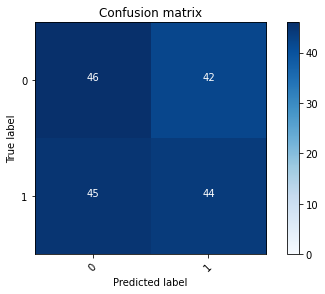

2022-08-20 17:44:10 - [Epoch Train: 77] loss: 0.0412, auc: 0.9992, acc: 0.9897, time: 50.00 s            
2022-08-20 17:44:10 - [Epoch Valid: 77] loss: 3.0436, auc: 0.4740, acc: 0.4942, time: 13.00 s


 77%|██████████████████████████████▊         | 77/100 [1:23:30<25:03, 65.38s/it]

2022-08-20 17:44:10 - EPOCH: 78
2022-08-20 17:44:11 - Train Step 10/973, train_loss: 0.0430
2022-08-20 17:44:11 - Train Step 20/973, train_loss: 0.0334
2022-08-20 17:44:12 - Train Step 30/973, train_loss: 0.0462
2022-08-20 17:44:12 - Train Step 40/973, train_loss: 0.0400
2022-08-20 17:44:13 - Train Step 50/973, train_loss: 0.0332
2022-08-20 17:44:13 - Train Step 60/973, train_loss: 0.0369
2022-08-20 17:44:14 - Train Step 70/973, train_loss: 0.0339
2022-08-20 17:44:15 - Train Step 80/973, train_loss: 0.0322
2022-08-20 17:44:15 - Train Step 90/973, train_loss: 0.0303
2022-08-20 17:44:16 - Train Step 100/973, train_loss: 0.0287
2022-08-20 17:44:16 - Train Step 110/973, train_loss: 0.0297
2022-08-20 17:44:17 - Train Step 120/973, train_loss: 0.0309
2022-08-20 17:44:17 - Train Step 130/973, train_loss: 0.0296
2022-08-20 17:44:18 - Train Step 140/973, train_loss: 0.0285
2022-08-20 17:44:18 - Train Step 150/973, train_loss: 0.0283
2022-08-20 17:44:19 - Train Step 160/973, train_loss: 0.0335
2

2022-08-20 17:45:11 - Valid Step 185/257, valid_loss: 3.6286
2022-08-20 17:45:11 - Valid Step 190/257, valid_loss: 3.6977
2022-08-20 17:45:11 - Valid Step 195/257, valid_loss: 3.6768
2022-08-20 17:45:11 - Valid Step 200/257, valid_loss: 3.7677
2022-08-20 17:45:12 - Valid Step 205/257, valid_loss: 3.7391
2022-08-20 17:45:12 - Valid Step 210/257, valid_loss: 3.7033
2022-08-20 17:45:12 - Valid Step 215/257, valid_loss: 3.8547
2022-08-20 17:45:12 - Valid Step 220/257, valid_loss: 3.8773
2022-08-20 17:45:13 - Valid Step 225/257, valid_loss: 3.7919
2022-08-20 17:45:13 - Valid Step 230/257, valid_loss: 3.8645
2022-08-20 17:45:13 - Valid Step 235/257, valid_loss: 3.8286
2022-08-20 17:45:13 - Valid Step 240/257, valid_loss: 3.8124
2022-08-20 17:45:14 - Valid Step 245/257, valid_loss: 3.7346
2022-08-20 17:45:14 - Valid Step 250/257, valid_loss: 3.7342
2022-08-20 17:45:14 - Valid Step 255/257, valid_loss: 3.6729
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

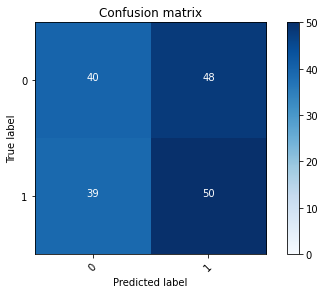

2022-08-20 17:45:15 - [Epoch Train: 78] loss: 0.0383, auc: 0.9996, acc: 0.9866, time: 50.00 s            
2022-08-20 17:45:15 - [Epoch Valid: 78] loss: 3.6444, auc: 0.4713, acc: 0.4942, time: 13.00 s


 78%|███████████████████████████████▏        | 78/100 [1:24:34<23:51, 65.08s/it]

2022-08-20 17:45:15 - EPOCH: 79
2022-08-20 17:45:15 - Train Step 10/973, train_loss: 0.0017
2022-08-20 17:45:16 - Train Step 20/973, train_loss: 0.0129
2022-08-20 17:45:16 - Train Step 30/973, train_loss: 0.0347
2022-08-20 17:45:17 - Train Step 40/973, train_loss: 0.0365
2022-08-20 17:45:17 - Train Step 50/973, train_loss: 0.0349
2022-08-20 17:45:18 - Train Step 60/973, train_loss: 0.0347
2022-08-20 17:45:18 - Train Step 70/973, train_loss: 0.0368
2022-08-20 17:45:19 - Train Step 80/973, train_loss: 0.0345
2022-08-20 17:45:19 - Train Step 90/973, train_loss: 0.0318
2022-08-20 17:45:20 - Train Step 100/973, train_loss: 0.0525
2022-08-20 17:45:20 - Train Step 110/973, train_loss: 0.0545
2022-08-20 17:45:21 - Train Step 120/973, train_loss: 0.0518
2022-08-20 17:45:21 - Train Step 130/973, train_loss: 0.0497
2022-08-20 17:45:22 - Train Step 140/973, train_loss: 0.0540
2022-08-20 17:45:23 - Train Step 150/973, train_loss: 0.0544
2022-08-20 17:45:23 - Train Step 160/973, train_loss: 0.0537
2

2022-08-20 17:46:15 - Valid Step 185/257, valid_loss: 3.1264
2022-08-20 17:46:15 - Valid Step 190/257, valid_loss: 3.2281
2022-08-20 17:46:15 - Valid Step 195/257, valid_loss: 3.2004
2022-08-20 17:46:15 - Valid Step 200/257, valid_loss: 3.2440
2022-08-20 17:46:16 - Valid Step 205/257, valid_loss: 3.2508
2022-08-20 17:46:16 - Valid Step 210/257, valid_loss: 3.4678
2022-08-20 17:46:16 - Valid Step 215/257, valid_loss: 3.4584
2022-08-20 17:46:16 - Valid Step 220/257, valid_loss: 3.4389
2022-08-20 17:46:17 - Valid Step 225/257, valid_loss: 3.3901
2022-08-20 17:46:17 - Valid Step 230/257, valid_loss: 3.3837
2022-08-20 17:46:17 - Valid Step 235/257, valid_loss: 3.3714
2022-08-20 17:46:17 - Valid Step 240/257, valid_loss: 3.3416
2022-08-20 17:46:18 - Valid Step 245/257, valid_loss: 3.3445
2022-08-20 17:46:18 - Valid Step 250/257, valid_loss: 3.2981
2022-08-20 17:46:18 - Valid Step 255/257, valid_loss: 3.2890
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

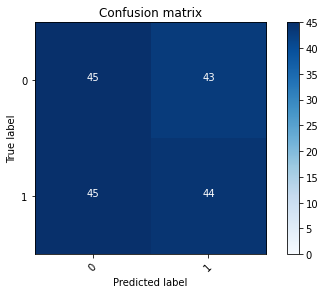

2022-08-20 17:46:19 - [Epoch Train: 79] loss: 0.0476, auc: 0.9987, acc: 0.9877, time: 50.00 s            
2022-08-20 17:46:19 - [Epoch Valid: 79] loss: 3.2685, auc: 0.4748, acc: 0.4903, time: 13.00 s


 79%|███████████████████████████████▌        | 79/100 [1:25:38<22:39, 64.74s/it]

2022-08-20 17:46:19 - EPOCH: 80
2022-08-20 17:46:19 - Train Step 10/973, train_loss: 0.1217
2022-08-20 17:46:20 - Train Step 20/973, train_loss: 0.0786
2022-08-20 17:46:20 - Train Step 30/973, train_loss: 0.0660
2022-08-20 17:46:21 - Train Step 40/973, train_loss: 0.0540
2022-08-20 17:46:21 - Train Step 50/973, train_loss: 0.0498
2022-08-20 17:46:22 - Train Step 60/973, train_loss: 0.0433
2022-08-20 17:46:22 - Train Step 70/973, train_loss: 0.0427
2022-08-20 17:46:23 - Train Step 80/973, train_loss: 0.0400
2022-08-20 17:46:23 - Train Step 90/973, train_loss: 0.0478
2022-08-20 17:46:24 - Train Step 100/973, train_loss: 0.0555
2022-08-20 17:46:24 - Train Step 110/973, train_loss: 0.0514
2022-08-20 17:46:25 - Train Step 120/973, train_loss: 0.0528
2022-08-20 17:46:25 - Train Step 130/973, train_loss: 0.0489
2022-08-20 17:46:26 - Train Step 140/973, train_loss: 0.0468
2022-08-20 17:46:26 - Train Step 150/973, train_loss: 0.0496
2022-08-20 17:46:27 - Train Step 160/973, train_loss: 0.0494
2

2022-08-20 17:47:19 - Valid Step 185/257, valid_loss: 3.0472
2022-08-20 17:47:19 - Valid Step 190/257, valid_loss: 3.0353
2022-08-20 17:47:19 - Valid Step 195/257, valid_loss: 3.1533
2022-08-20 17:47:19 - Valid Step 200/257, valid_loss: 3.1442
2022-08-20 17:47:20 - Valid Step 205/257, valid_loss: 3.2917
2022-08-20 17:47:20 - Valid Step 210/257, valid_loss: 3.3088
2022-08-20 17:47:20 - Valid Step 215/257, valid_loss: 3.4482
2022-08-20 17:47:20 - Valid Step 220/257, valid_loss: 3.4295
2022-08-20 17:47:21 - Valid Step 225/257, valid_loss: 3.3996
2022-08-20 17:47:21 - Valid Step 230/257, valid_loss: 3.4443
2022-08-20 17:47:21 - Valid Step 235/257, valid_loss: 3.4948
2022-08-20 17:47:21 - Valid Step 240/257, valid_loss: 3.4738
2022-08-20 17:47:22 - Valid Step 245/257, valid_loss: 3.5464
2022-08-20 17:47:22 - Valid Step 250/257, valid_loss: 3.5094
2022-08-20 17:47:22 - Valid Step 255/257, valid_loss: 3.4441
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

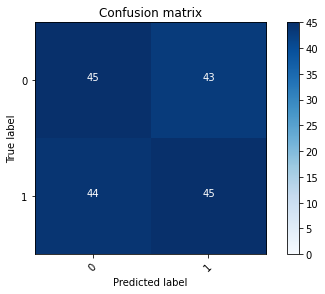

2022-08-20 17:47:23 - [Epoch Train: 80] loss: 0.0385, auc: 0.9997, acc: 0.9908, time: 50.00 s            
2022-08-20 17:47:23 - [Epoch Valid: 80] loss: 3.4644, auc: 0.4612, acc: 0.5019, time: 13.00 s


 80%|████████████████████████████████        | 80/100 [1:26:42<21:30, 64.54s/it]

2022-08-20 17:47:23 - EPOCH: 81
2022-08-20 17:47:23 - Train Step 10/973, train_loss: 0.0411
2022-08-20 17:47:24 - Train Step 20/973, train_loss: 0.0424
2022-08-20 17:47:24 - Train Step 30/973, train_loss: 0.0298
2022-08-20 17:47:25 - Train Step 40/973, train_loss: 0.0295
2022-08-20 17:47:25 - Train Step 50/973, train_loss: 0.0257
2022-08-20 17:47:26 - Train Step 60/973, train_loss: 0.0270
2022-08-20 17:47:27 - Train Step 70/973, train_loss: 0.0374
2022-08-20 17:47:27 - Train Step 80/973, train_loss: 0.0418
2022-08-20 17:47:28 - Train Step 90/973, train_loss: 0.0389
2022-08-20 17:47:28 - Train Step 100/973, train_loss: 0.0356
2022-08-20 17:47:29 - Train Step 110/973, train_loss: 0.0417
2022-08-20 17:47:29 - Train Step 120/973, train_loss: 0.0395
2022-08-20 17:47:30 - Train Step 130/973, train_loss: 0.0370
2022-08-20 17:47:30 - Train Step 140/973, train_loss: 0.0350
2022-08-20 17:47:31 - Train Step 150/973, train_loss: 0.0346
2022-08-20 17:47:31 - Train Step 160/973, train_loss: 0.0328
2

2022-08-20 17:48:24 - Valid Step 185/257, valid_loss: 3.4299
2022-08-20 17:48:24 - Valid Step 190/257, valid_loss: 3.3844
2022-08-20 17:48:24 - Valid Step 195/257, valid_loss: 3.3195
2022-08-20 17:48:25 - Valid Step 200/257, valid_loss: 3.3547
2022-08-20 17:48:25 - Valid Step 205/257, valid_loss: 3.3665
2022-08-20 17:48:25 - Valid Step 210/257, valid_loss: 3.3381
2022-08-20 17:48:25 - Valid Step 215/257, valid_loss: 3.2914
2022-08-20 17:48:26 - Valid Step 220/257, valid_loss: 3.3478
2022-08-20 17:48:26 - Valid Step 225/257, valid_loss: 3.3336
2022-08-20 17:48:26 - Valid Step 230/257, valid_loss: 3.4209
2022-08-20 17:48:26 - Valid Step 235/257, valid_loss: 3.3832
2022-08-20 17:48:27 - Valid Step 240/257, valid_loss: 3.3471
2022-08-20 17:48:27 - Valid Step 245/257, valid_loss: 3.4357
2022-08-20 17:48:27 - Valid Step 250/257, valid_loss: 3.3883
2022-08-20 17:48:27 - Valid Step 255/257, valid_loss: 3.3228
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

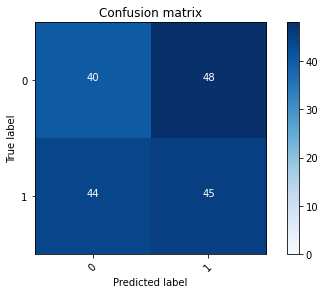

2022-08-20 17:48:28 - [Epoch Train: 81] loss: 0.0444, auc: 0.9989, acc: 0.9877, time: 51.00 s            
2022-08-20 17:48:28 - [Epoch Valid: 81] loss: 3.3022, auc: 0.4516, acc: 0.4708, time: 13.00 s


 81%|████████████████████████████████▍       | 81/100 [1:27:47<20:29, 64.71s/it]

2022-08-20 17:48:28 - EPOCH: 82
2022-08-20 17:48:28 - Train Step 10/973, train_loss: 0.0084
2022-08-20 17:48:29 - Train Step 20/973, train_loss: 0.0271
2022-08-20 17:48:29 - Train Step 30/973, train_loss: 0.0315
2022-08-20 17:48:30 - Train Step 40/973, train_loss: 0.0308
2022-08-20 17:48:31 - Train Step 50/973, train_loss: 0.0260
2022-08-20 17:48:31 - Train Step 60/973, train_loss: 0.0236
2022-08-20 17:48:32 - Train Step 70/973, train_loss: 0.0225
2022-08-20 17:48:32 - Train Step 80/973, train_loss: 0.0246
2022-08-20 17:48:33 - Train Step 90/973, train_loss: 0.0225
2022-08-20 17:48:33 - Train Step 100/973, train_loss: 0.0219
2022-08-20 17:48:34 - Train Step 110/973, train_loss: 0.0220
2022-08-20 17:48:34 - Train Step 120/973, train_loss: 0.0206
2022-08-20 17:48:35 - Train Step 130/973, train_loss: 0.0193
2022-08-20 17:48:35 - Train Step 140/973, train_loss: 0.0213
2022-08-20 17:48:36 - Train Step 150/973, train_loss: 0.0228
2022-08-20 17:48:36 - Train Step 160/973, train_loss: 0.0221
2

2022-08-20 17:49:28 - Valid Step 185/257, valid_loss: 2.8910
2022-08-20 17:49:29 - Valid Step 190/257, valid_loss: 2.8829
2022-08-20 17:49:29 - Valid Step 195/257, valid_loss: 2.9032
2022-08-20 17:49:29 - Valid Step 200/257, valid_loss: 2.9492
2022-08-20 17:49:29 - Valid Step 205/257, valid_loss: 3.0665
2022-08-20 17:49:30 - Valid Step 210/257, valid_loss: 3.0471
2022-08-20 17:49:30 - Valid Step 215/257, valid_loss: 2.9894
2022-08-20 17:49:30 - Valid Step 220/257, valid_loss: 3.0780
2022-08-20 17:49:30 - Valid Step 225/257, valid_loss: 3.0666
2022-08-20 17:49:31 - Valid Step 230/257, valid_loss: 3.2125
2022-08-20 17:49:31 - Valid Step 235/257, valid_loss: 3.2281
2022-08-20 17:49:31 - Valid Step 240/257, valid_loss: 3.2025
2022-08-20 17:49:31 - Valid Step 245/257, valid_loss: 3.3058
2022-08-20 17:49:32 - Valid Step 250/257, valid_loss: 3.3145
2022-08-20 17:49:32 - Valid Step 255/257, valid_loss: 3.2986
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

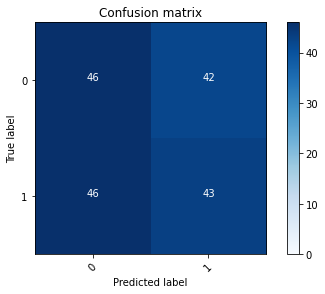

2022-08-20 17:49:32 - [Epoch Train: 82] loss: 0.0407, auc: 0.9988, acc: 0.9887, time: 50.00 s            
2022-08-20 17:49:32 - [Epoch Valid: 82] loss: 3.2924, auc: 0.4570, acc: 0.4981, time: 13.00 s


 82%|████████████████████████████████▊       | 82/100 [1:28:52<19:23, 64.64s/it]

2022-08-20 17:49:32 - EPOCH: 83
2022-08-20 17:49:33 - Train Step 10/973, train_loss: 0.0544
2022-08-20 17:49:33 - Train Step 20/973, train_loss: 0.0413
2022-08-20 17:49:34 - Train Step 30/973, train_loss: 0.0386
2022-08-20 17:49:34 - Train Step 40/973, train_loss: 0.0345
2022-08-20 17:49:35 - Train Step 50/973, train_loss: 0.0467
2022-08-20 17:49:35 - Train Step 60/973, train_loss: 0.0415
2022-08-20 17:49:36 - Train Step 70/973, train_loss: 0.0436
2022-08-20 17:49:36 - Train Step 80/973, train_loss: 0.0403
2022-08-20 17:49:37 - Train Step 90/973, train_loss: 0.0440
2022-08-20 17:49:37 - Train Step 100/973, train_loss: 0.0491
2022-08-20 17:49:38 - Train Step 110/973, train_loss: 0.0491
2022-08-20 17:49:38 - Train Step 120/973, train_loss: 0.0463
2022-08-20 17:49:39 - Train Step 130/973, train_loss: 0.0474
2022-08-20 17:49:40 - Train Step 140/973, train_loss: 0.0453
2022-08-20 17:49:40 - Train Step 150/973, train_loss: 0.0424
2022-08-20 17:49:41 - Train Step 160/973, train_loss: 0.0437
2

2022-08-20 17:50:32 - Valid Step 185/257, valid_loss: 3.2703
2022-08-20 17:50:32 - Valid Step 190/257, valid_loss: 3.4217
2022-08-20 17:50:32 - Valid Step 195/257, valid_loss: 3.4538
2022-08-20 17:50:33 - Valid Step 200/257, valid_loss: 3.4779
2022-08-20 17:50:33 - Valid Step 205/257, valid_loss: 3.4101
2022-08-20 17:50:33 - Valid Step 210/257, valid_loss: 3.3637
2022-08-20 17:50:34 - Valid Step 215/257, valid_loss: 3.3557
2022-08-20 17:50:34 - Valid Step 220/257, valid_loss: 3.3656
2022-08-20 17:50:34 - Valid Step 225/257, valid_loss: 3.3644
2022-08-20 17:50:34 - Valid Step 230/257, valid_loss: 3.4061
2022-08-20 17:50:35 - Valid Step 235/257, valid_loss: 3.3924
2022-08-20 17:50:35 - Valid Step 240/257, valid_loss: 3.3838
2022-08-20 17:50:35 - Valid Step 245/257, valid_loss: 3.3717
2022-08-20 17:50:35 - Valid Step 250/257, valid_loss: 3.3302
2022-08-20 17:50:35 - Valid Step 255/257, valid_loss: 3.3513
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

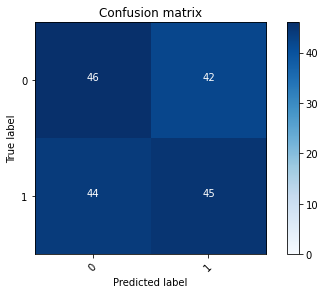

2022-08-20 17:50:36 - [Epoch Train: 83] loss: 0.0383, auc: 0.9997, acc: 0.9887, time: 50.00 s            
2022-08-20 17:50:36 - [Epoch Valid: 83] loss: 3.4296, auc: 0.4714, acc: 0.5058, time: 13.00 s


 83%|█████████████████████████████████▏      | 83/100 [1:29:56<18:13, 64.32s/it]

2022-08-20 17:50:36 - EPOCH: 84
2022-08-20 17:50:36 - Train Step 10/973, train_loss: 0.0148
2022-08-20 17:50:37 - Train Step 20/973, train_loss: 0.0351
2022-08-20 17:50:37 - Train Step 30/973, train_loss: 0.0255
2022-08-20 17:50:38 - Train Step 40/973, train_loss: 0.0226
2022-08-20 17:50:39 - Train Step 50/973, train_loss: 0.0218
2022-08-20 17:50:39 - Train Step 60/973, train_loss: 0.0326
2022-08-20 17:50:40 - Train Step 70/973, train_loss: 0.0290
2022-08-20 17:50:40 - Train Step 80/973, train_loss: 0.0450
2022-08-20 17:50:41 - Train Step 90/973, train_loss: 0.0433
2022-08-20 17:50:41 - Train Step 100/973, train_loss: 0.0431
2022-08-20 17:50:42 - Train Step 110/973, train_loss: 0.0405
2022-08-20 17:50:42 - Train Step 120/973, train_loss: 0.0385
2022-08-20 17:50:43 - Train Step 130/973, train_loss: 0.0443
2022-08-20 17:50:43 - Train Step 140/973, train_loss: 0.0425
2022-08-20 17:50:44 - Train Step 150/973, train_loss: 0.0480
2022-08-20 17:50:44 - Train Step 160/973, train_loss: 0.0481
2

2022-08-20 17:51:36 - Valid Step 185/257, valid_loss: 3.3618
2022-08-20 17:51:36 - Valid Step 190/257, valid_loss: 3.4257
2022-08-20 17:51:36 - Valid Step 195/257, valid_loss: 3.4306
2022-08-20 17:51:37 - Valid Step 200/257, valid_loss: 3.3995
2022-08-20 17:51:37 - Valid Step 205/257, valid_loss: 3.4479
2022-08-20 17:51:37 - Valid Step 210/257, valid_loss: 3.4434
2022-08-20 17:51:38 - Valid Step 215/257, valid_loss: 3.4620
2022-08-20 17:51:38 - Valid Step 220/257, valid_loss: 3.4470
2022-08-20 17:51:38 - Valid Step 225/257, valid_loss: 3.4298
2022-08-20 17:51:38 - Valid Step 230/257, valid_loss: 3.4480
2022-08-20 17:51:39 - Valid Step 235/257, valid_loss: 3.3772
2022-08-20 17:51:39 - Valid Step 240/257, valid_loss: 3.3324
2022-08-20 17:51:39 - Valid Step 245/257, valid_loss: 3.3140
2022-08-20 17:51:39 - Valid Step 250/257, valid_loss: 3.3160
2022-08-20 17:51:40 - Valid Step 255/257, valid_loss: 3.2727
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

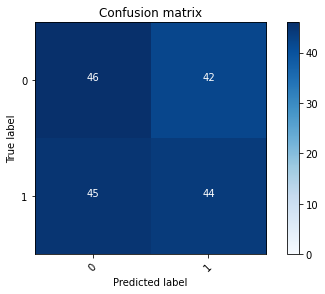

2022-08-20 17:51:40 - [Epoch Train: 84] loss: 0.0422, auc: 0.9989, acc: 0.9877, time: 50.00 s            
2022-08-20 17:51:40 - [Epoch Valid: 84] loss: 3.2473, auc: 0.4713, acc: 0.5058, time: 13.00 s


 84%|█████████████████████████████████▌      | 84/100 [1:31:00<17:08, 64.26s/it]

2022-08-20 17:51:40 - EPOCH: 85
2022-08-20 17:51:41 - Train Step 10/973, train_loss: 0.0030
2022-08-20 17:51:41 - Train Step 20/973, train_loss: 0.0208
2022-08-20 17:51:42 - Train Step 30/973, train_loss: 0.0199
2022-08-20 17:51:42 - Train Step 40/973, train_loss: 0.0171
2022-08-20 17:51:43 - Train Step 50/973, train_loss: 0.0255
2022-08-20 17:51:43 - Train Step 60/973, train_loss: 0.0247
2022-08-20 17:51:44 - Train Step 70/973, train_loss: 0.0434
2022-08-20 17:51:44 - Train Step 80/973, train_loss: 0.0418
2022-08-20 17:51:45 - Train Step 90/973, train_loss: 0.0383
2022-08-20 17:51:45 - Train Step 100/973, train_loss: 0.0443
2022-08-20 17:51:46 - Train Step 110/973, train_loss: 0.0404
2022-08-20 17:51:46 - Train Step 120/973, train_loss: 0.0377
2022-08-20 17:51:47 - Train Step 130/973, train_loss: 0.0349
2022-08-20 17:51:47 - Train Step 140/973, train_loss: 0.0337
2022-08-20 17:51:48 - Train Step 150/973, train_loss: 0.0333
2022-08-20 17:51:48 - Train Step 160/973, train_loss: 0.0331
2

2022-08-20 17:52:40 - Valid Step 185/257, valid_loss: 3.5877
2022-08-20 17:52:40 - Valid Step 190/257, valid_loss: 3.5729
2022-08-20 17:52:41 - Valid Step 195/257, valid_loss: 3.5500
2022-08-20 17:52:41 - Valid Step 200/257, valid_loss: 3.5485
2022-08-20 17:52:41 - Valid Step 205/257, valid_loss: 3.6015
2022-08-20 17:52:41 - Valid Step 210/257, valid_loss: 3.5778
2022-08-20 17:52:42 - Valid Step 215/257, valid_loss: 3.5798
2022-08-20 17:52:42 - Valid Step 220/257, valid_loss: 3.6627
2022-08-20 17:52:42 - Valid Step 225/257, valid_loss: 3.5852
2022-08-20 17:52:42 - Valid Step 230/257, valid_loss: 3.5686
2022-08-20 17:52:43 - Valid Step 235/257, valid_loss: 3.6443
2022-08-20 17:52:43 - Valid Step 240/257, valid_loss: 3.5897
2022-08-20 17:52:43 - Valid Step 245/257, valid_loss: 3.5415
2022-08-20 17:52:43 - Valid Step 250/257, valid_loss: 3.6099
2022-08-20 17:52:44 - Valid Step 255/257, valid_loss: 3.5938
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

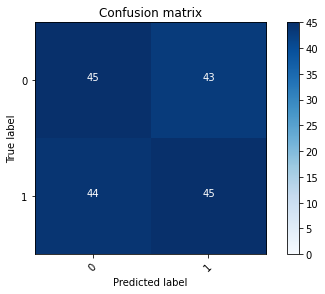

2022-08-20 17:52:44 - [Epoch Train: 85] loss: 0.0394, auc: 0.9993, acc: 0.9877, time: 50.00 s            
2022-08-20 17:52:44 - [Epoch Valid: 85] loss: 3.6369, auc: 0.4646, acc: 0.5058, time: 13.00 s


 85%|██████████████████████████████████      | 85/100 [1:32:04<16:03, 64.23s/it]

2022-08-20 17:52:44 - EPOCH: 86
2022-08-20 17:52:45 - Train Step 10/973, train_loss: 0.0205
2022-08-20 17:52:45 - Train Step 20/973, train_loss: 0.0174
2022-08-20 17:52:46 - Train Step 30/973, train_loss: 0.0334
2022-08-20 17:52:46 - Train Step 40/973, train_loss: 0.0275
2022-08-20 17:52:47 - Train Step 50/973, train_loss: 0.0264
2022-08-20 17:52:47 - Train Step 60/973, train_loss: 0.0231
2022-08-20 17:52:48 - Train Step 70/973, train_loss: 0.0204
2022-08-20 17:52:48 - Train Step 80/973, train_loss: 0.0182
2022-08-20 17:52:49 - Train Step 90/973, train_loss: 0.0198
2022-08-20 17:52:49 - Train Step 100/973, train_loss: 0.0243
2022-08-20 17:52:50 - Train Step 110/973, train_loss: 0.0281
2022-08-20 17:52:50 - Train Step 120/973, train_loss: 0.0270
2022-08-20 17:52:51 - Train Step 130/973, train_loss: 0.0261
2022-08-20 17:52:51 - Train Step 140/973, train_loss: 0.0350
2022-08-20 17:52:52 - Train Step 150/973, train_loss: 0.0337
2022-08-20 17:52:52 - Train Step 160/973, train_loss: 0.0331
2

2022-08-20 17:53:44 - Valid Step 185/257, valid_loss: 3.1476
2022-08-20 17:53:44 - Valid Step 190/257, valid_loss: 3.1322
2022-08-20 17:53:45 - Valid Step 195/257, valid_loss: 3.1576
2022-08-20 17:53:45 - Valid Step 200/257, valid_loss: 3.0894
2022-08-20 17:53:45 - Valid Step 205/257, valid_loss: 3.0449
2022-08-20 17:53:45 - Valid Step 210/257, valid_loss: 3.0033
2022-08-20 17:53:46 - Valid Step 215/257, valid_loss: 3.0935
2022-08-20 17:53:46 - Valid Step 220/257, valid_loss: 3.0695
2022-08-20 17:53:46 - Valid Step 225/257, valid_loss: 3.1828
2022-08-20 17:53:46 - Valid Step 230/257, valid_loss: 3.2424
2022-08-20 17:53:47 - Valid Step 235/257, valid_loss: 3.1846
2022-08-20 17:53:47 - Valid Step 240/257, valid_loss: 3.1278
2022-08-20 17:53:47 - Valid Step 245/257, valid_loss: 3.1711
2022-08-20 17:53:47 - Valid Step 250/257, valid_loss: 3.1614
2022-08-20 17:53:48 - Valid Step 255/257, valid_loss: 3.1074
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

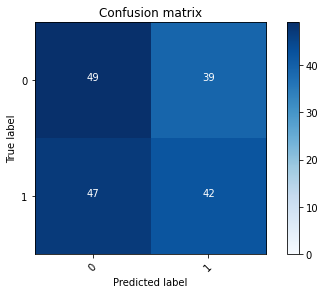

2022-08-20 17:53:48 - [Epoch Train: 86] loss: 0.0348, auc: 0.9996, acc: 0.9908, time: 50.00 s            
2022-08-20 17:53:48 - [Epoch Valid: 86] loss: 3.0910, auc: 0.4674, acc: 0.5136, time: 13.00 s


 86%|██████████████████████████████████▍     | 86/100 [1:33:08<14:58, 64.15s/it]

2022-08-20 17:53:48 - EPOCH: 87
2022-08-20 17:53:49 - Train Step 10/973, train_loss: 0.0508
2022-08-20 17:53:49 - Train Step 20/973, train_loss: 0.0306
2022-08-20 17:53:50 - Train Step 30/973, train_loss: 0.0519
2022-08-20 17:53:50 - Train Step 40/973, train_loss: 0.0481
2022-08-20 17:53:51 - Train Step 50/973, train_loss: 0.0441
2022-08-20 17:53:51 - Train Step 60/973, train_loss: 0.0404
2022-08-20 17:53:52 - Train Step 70/973, train_loss: 0.0366
2022-08-20 17:53:52 - Train Step 80/973, train_loss: 0.0351
2022-08-20 17:53:53 - Train Step 90/973, train_loss: 0.0411
2022-08-20 17:53:53 - Train Step 100/973, train_loss: 0.0396
2022-08-20 17:53:54 - Train Step 110/973, train_loss: 0.0361
2022-08-20 17:53:54 - Train Step 120/973, train_loss: 0.0342
2022-08-20 17:53:55 - Train Step 130/973, train_loss: 0.0324
2022-08-20 17:53:55 - Train Step 140/973, train_loss: 0.0313
2022-08-20 17:53:56 - Train Step 150/973, train_loss: 0.0305
2022-08-20 17:53:57 - Train Step 160/973, train_loss: 0.0298
2

2022-08-20 17:54:49 - Valid Step 185/257, valid_loss: 3.2562
2022-08-20 17:54:49 - Valid Step 190/257, valid_loss: 3.3638
2022-08-20 17:54:49 - Valid Step 195/257, valid_loss: 3.4924
2022-08-20 17:54:50 - Valid Step 200/257, valid_loss: 3.4805
2022-08-20 17:54:50 - Valid Step 205/257, valid_loss: 3.3966
2022-08-20 17:54:50 - Valid Step 210/257, valid_loss: 3.4831
2022-08-20 17:54:50 - Valid Step 215/257, valid_loss: 3.5039
2022-08-20 17:54:51 - Valid Step 220/257, valid_loss: 3.6122
2022-08-20 17:54:51 - Valid Step 225/257, valid_loss: 3.6377
2022-08-20 17:54:51 - Valid Step 230/257, valid_loss: 3.5735
2022-08-20 17:54:51 - Valid Step 235/257, valid_loss: 3.5348
2022-08-20 17:54:52 - Valid Step 240/257, valid_loss: 3.5843
2022-08-20 17:54:52 - Valid Step 245/257, valid_loss: 3.6202
2022-08-20 17:54:52 - Valid Step 250/257, valid_loss: 3.6040
2022-08-20 17:54:53 - Valid Step 255/257, valid_loss: 3.5901
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

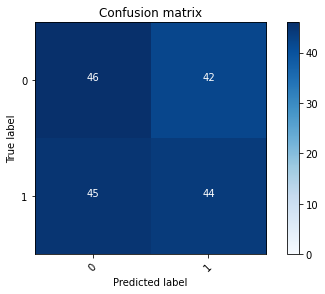

2022-08-20 17:54:53 - [Epoch Train: 87] loss: 0.0268, auc: 0.9998, acc: 0.9949, time: 51.00 s            
2022-08-20 17:54:53 - [Epoch Valid: 87] loss: 3.6025, auc: 0.4621, acc: 0.5019, time: 13.00 s


 87%|██████████████████████████████████▊     | 87/100 [1:34:13<13:56, 64.34s/it]

2022-08-20 17:54:53 - EPOCH: 88
2022-08-20 17:54:53 - Train Step 10/973, train_loss: 0.0683
2022-08-20 17:54:54 - Train Step 20/973, train_loss: 0.0999
2022-08-20 17:54:54 - Train Step 30/973, train_loss: 0.0744
2022-08-20 17:54:55 - Train Step 40/973, train_loss: 0.0632
2022-08-20 17:54:55 - Train Step 50/973, train_loss: 0.0863
2022-08-20 17:54:56 - Train Step 60/973, train_loss: 0.0743
2022-08-20 17:54:56 - Train Step 70/973, train_loss: 0.0675
2022-08-20 17:54:57 - Train Step 80/973, train_loss: 0.0601
2022-08-20 17:54:58 - Train Step 90/973, train_loss: 0.0565
2022-08-20 17:54:58 - Train Step 100/973, train_loss: 0.0548
2022-08-20 17:54:59 - Train Step 110/973, train_loss: 0.0501
2022-08-20 17:54:59 - Train Step 120/973, train_loss: 0.0460
2022-08-20 17:55:00 - Train Step 130/973, train_loss: 0.0470
2022-08-20 17:55:00 - Train Step 140/973, train_loss: 0.0612
2022-08-20 17:55:01 - Train Step 150/973, train_loss: 0.0585
2022-08-20 17:55:01 - Train Step 160/973, train_loss: 0.0553
2

2022-08-20 17:55:53 - Valid Step 185/257, valid_loss: 3.7165
2022-08-20 17:55:53 - Valid Step 190/257, valid_loss: 3.6284
2022-08-20 17:55:54 - Valid Step 195/257, valid_loss: 3.5829
2022-08-20 17:55:54 - Valid Step 200/257, valid_loss: 3.6738
2022-08-20 17:55:54 - Valid Step 205/257, valid_loss: 3.7160
2022-08-20 17:55:54 - Valid Step 210/257, valid_loss: 3.6904
2022-08-20 17:55:55 - Valid Step 215/257, valid_loss: 3.6986
2022-08-20 17:55:55 - Valid Step 220/257, valid_loss: 3.8103
2022-08-20 17:55:55 - Valid Step 225/257, valid_loss: 3.8133
2022-08-20 17:55:55 - Valid Step 230/257, valid_loss: 3.7880
2022-08-20 17:55:56 - Valid Step 235/257, valid_loss: 3.7472
2022-08-20 17:55:56 - Valid Step 240/257, valid_loss: 3.8119
2022-08-20 17:55:56 - Valid Step 245/257, valid_loss: 3.7577
2022-08-20 17:55:56 - Valid Step 250/257, valid_loss: 3.7086
2022-08-20 17:55:57 - Valid Step 255/257, valid_loss: 3.6727
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

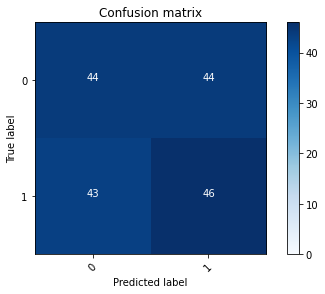

2022-08-20 17:55:57 - [Epoch Train: 88] loss: 0.0321, auc: 0.9995, acc: 0.9928, time: 50.00 s            
2022-08-20 17:55:57 - [Epoch Valid: 88] loss: 3.6912, auc: 0.4646, acc: 0.4981, time: 13.00 s


 88%|███████████████████████████████████▏    | 88/100 [1:35:17<12:51, 64.31s/it]

2022-08-20 17:55:57 - EPOCH: 89
2022-08-20 17:55:58 - Train Step 10/973, train_loss: 0.0155
2022-08-20 17:55:58 - Train Step 20/973, train_loss: 0.0664
2022-08-20 17:55:59 - Train Step 30/973, train_loss: 0.0473
2022-08-20 17:55:59 - Train Step 40/973, train_loss: 0.0432
2022-08-20 17:56:00 - Train Step 50/973, train_loss: 0.0404
2022-08-20 17:56:00 - Train Step 60/973, train_loss: 0.0412
2022-08-20 17:56:01 - Train Step 70/973, train_loss: 0.0410
2022-08-20 17:56:01 - Train Step 80/973, train_loss: 0.0378
2022-08-20 17:56:02 - Train Step 90/973, train_loss: 0.0368
2022-08-20 17:56:02 - Train Step 100/973, train_loss: 0.0333
2022-08-20 17:56:03 - Train Step 110/973, train_loss: 0.0352
2022-08-20 17:56:03 - Train Step 120/973, train_loss: 0.0324
2022-08-20 17:56:04 - Train Step 130/973, train_loss: 0.0362
2022-08-20 17:56:04 - Train Step 140/973, train_loss: 0.0365
2022-08-20 17:56:05 - Train Step 150/973, train_loss: 0.0369
2022-08-20 17:56:05 - Train Step 160/973, train_loss: 0.0349
2

2022-08-20 17:56:57 - Valid Step 185/257, valid_loss: 4.0897
2022-08-20 17:56:57 - Valid Step 190/257, valid_loss: 4.0394
2022-08-20 17:56:57 - Valid Step 195/257, valid_loss: 3.9618
2022-08-20 17:56:57 - Valid Step 200/257, valid_loss: 3.9649
2022-08-20 17:56:58 - Valid Step 205/257, valid_loss: 3.8972
2022-08-20 17:56:58 - Valid Step 210/257, valid_loss: 3.9829
2022-08-20 17:56:58 - Valid Step 215/257, valid_loss: 4.0021
2022-08-20 17:56:58 - Valid Step 220/257, valid_loss: 4.0404
2022-08-20 17:56:59 - Valid Step 225/257, valid_loss: 3.9630
2022-08-20 17:56:59 - Valid Step 230/257, valid_loss: 3.9941
2022-08-20 17:56:59 - Valid Step 235/257, valid_loss: 3.9922
2022-08-20 17:56:59 - Valid Step 240/257, valid_loss: 3.9419
2022-08-20 17:57:00 - Valid Step 245/257, valid_loss: 4.0068
2022-08-20 17:57:00 - Valid Step 250/257, valid_loss: 3.9839
2022-08-20 17:57:00 - Valid Step 255/257, valid_loss: 3.9110
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

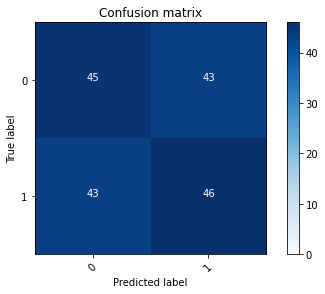

2022-08-20 17:57:00 - [Epoch Train: 89] loss: 0.0340, auc: 0.9995, acc: 0.9918, time: 50.00 s            
2022-08-20 17:57:00 - [Epoch Valid: 89] loss: 3.8818, auc: 0.4661, acc: 0.5097, time: 13.00 s


 89%|███████████████████████████████████▌    | 89/100 [1:36:20<11:44, 64.05s/it]

2022-08-20 17:57:00 - EPOCH: 90
2022-08-20 17:57:01 - Train Step 10/973, train_loss: 0.0898
2022-08-20 17:57:02 - Train Step 20/973, train_loss: 0.0583
2022-08-20 17:57:02 - Train Step 30/973, train_loss: 0.0411
2022-08-20 17:57:03 - Train Step 40/973, train_loss: 0.0326
2022-08-20 17:57:03 - Train Step 50/973, train_loss: 0.0334
2022-08-20 17:57:04 - Train Step 60/973, train_loss: 0.0289
2022-08-20 17:57:04 - Train Step 70/973, train_loss: 0.0370
2022-08-20 17:57:05 - Train Step 80/973, train_loss: 0.0329
2022-08-20 17:57:05 - Train Step 90/973, train_loss: 0.0326
2022-08-20 17:57:06 - Train Step 100/973, train_loss: 0.0301
2022-08-20 17:57:06 - Train Step 110/973, train_loss: 0.0289
2022-08-20 17:57:07 - Train Step 120/973, train_loss: 0.0286
2022-08-20 17:57:07 - Train Step 130/973, train_loss: 0.0270
2022-08-20 17:57:08 - Train Step 140/973, train_loss: 0.0267
2022-08-20 17:57:08 - Train Step 150/973, train_loss: 0.0255
2022-08-20 17:57:09 - Train Step 160/973, train_loss: 0.0342
2

2022-08-20 17:58:00 - Valid Step 185/257, valid_loss: 3.8620
2022-08-20 17:58:01 - Valid Step 190/257, valid_loss: 3.8155
2022-08-20 17:58:01 - Valid Step 195/257, valid_loss: 3.9050
2022-08-20 17:58:01 - Valid Step 200/257, valid_loss: 3.8086
2022-08-20 17:58:01 - Valid Step 205/257, valid_loss: 3.8140
2022-08-20 17:58:02 - Valid Step 210/257, valid_loss: 3.9226
2022-08-20 17:58:02 - Valid Step 215/257, valid_loss: 3.9079
2022-08-20 17:58:02 - Valid Step 220/257, valid_loss: 3.8856
2022-08-20 17:58:02 - Valid Step 225/257, valid_loss: 3.9169
2022-08-20 17:58:03 - Valid Step 230/257, valid_loss: 3.8767
2022-08-20 17:58:03 - Valid Step 235/257, valid_loss: 3.8535
2022-08-20 17:58:03 - Valid Step 240/257, valid_loss: 3.9381
2022-08-20 17:58:03 - Valid Step 245/257, valid_loss: 3.8974
2022-08-20 17:58:04 - Valid Step 250/257, valid_loss: 3.8806
2022-08-20 17:58:04 - Valid Step 255/257, valid_loss: 3.8221
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

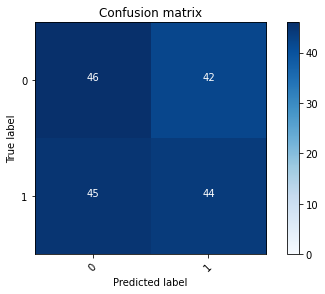

2022-08-20 17:58:04 - [Epoch Train: 90] loss: 0.0282, auc: 0.9999, acc: 0.9918, time: 50.00 s            
2022-08-20 17:58:04 - [Epoch Valid: 90] loss: 3.8559, auc: 0.4625, acc: 0.5019, time: 13.00 s


 90%|████████████████████████████████████    | 90/100 [1:37:24<10:39, 63.91s/it]

2022-08-20 17:58:04 - EPOCH: 91
2022-08-20 17:58:05 - Train Step 10/973, train_loss: 0.0267
2022-08-20 17:58:05 - Train Step 20/973, train_loss: 0.0169
2022-08-20 17:58:06 - Train Step 30/973, train_loss: 0.0151
2022-08-20 17:58:06 - Train Step 40/973, train_loss: 0.0151
2022-08-20 17:58:07 - Train Step 50/973, train_loss: 0.0148
2022-08-20 17:58:07 - Train Step 60/973, train_loss: 0.0154
2022-08-20 17:58:08 - Train Step 70/973, train_loss: 0.0143
2022-08-20 17:58:08 - Train Step 80/973, train_loss: 0.0145
2022-08-20 17:58:09 - Train Step 90/973, train_loss: 0.0201
2022-08-20 17:58:09 - Train Step 100/973, train_loss: 0.0312
2022-08-20 17:58:10 - Train Step 110/973, train_loss: 0.0454
2022-08-20 17:58:10 - Train Step 120/973, train_loss: 0.0454
2022-08-20 17:58:11 - Train Step 130/973, train_loss: 0.0423
2022-08-20 17:58:11 - Train Step 140/973, train_loss: 0.0412
2022-08-20 17:58:12 - Train Step 150/973, train_loss: 0.0442
2022-08-20 17:58:13 - Train Step 160/973, train_loss: 0.0419
2

2022-08-20 17:59:04 - Valid Step 185/257, valid_loss: 3.6293
2022-08-20 17:59:04 - Valid Step 190/257, valid_loss: 3.5521
2022-08-20 17:59:04 - Valid Step 195/257, valid_loss: 3.5302
2022-08-20 17:59:05 - Valid Step 200/257, valid_loss: 3.5049
2022-08-20 17:59:05 - Valid Step 205/257, valid_loss: 3.4331
2022-08-20 17:59:05 - Valid Step 210/257, valid_loss: 3.4587
2022-08-20 17:59:05 - Valid Step 215/257, valid_loss: 3.4187
2022-08-20 17:59:06 - Valid Step 220/257, valid_loss: 3.5347
2022-08-20 17:59:06 - Valid Step 225/257, valid_loss: 3.6692
2022-08-20 17:59:06 - Valid Step 230/257, valid_loss: 3.6671
2022-08-20 17:59:06 - Valid Step 235/257, valid_loss: 3.6583
2022-08-20 17:59:07 - Valid Step 240/257, valid_loss: 3.6381
2022-08-20 17:59:07 - Valid Step 245/257, valid_loss: 3.6872
2022-08-20 17:59:07 - Valid Step 250/257, valid_loss: 3.7126
2022-08-20 17:59:07 - Valid Step 255/257, valid_loss: 3.8092
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

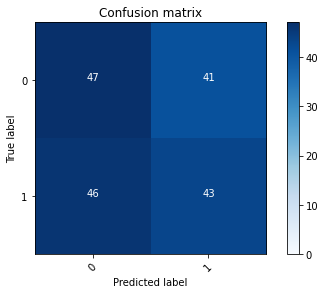

2022-08-20 17:59:08 - [Epoch Train: 91] loss: 0.0359, auc: 0.9996, acc: 0.9887, time: 50.00 s            
2022-08-20 17:59:08 - [Epoch Valid: 91] loss: 3.8167, auc: 0.4635, acc: 0.5019, time: 13.00 s


 91%|████████████████████████████████████▍   | 91/100 [1:38:27<09:34, 63.83s/it]

2022-08-20 17:59:08 - EPOCH: 92
2022-08-20 17:59:08 - Train Step 10/973, train_loss: 0.0241
2022-08-20 17:59:09 - Train Step 20/973, train_loss: 0.0441
2022-08-20 17:59:09 - Train Step 30/973, train_loss: 0.0300
2022-08-20 17:59:10 - Train Step 40/973, train_loss: 0.0276
2022-08-20 17:59:10 - Train Step 50/973, train_loss: 0.0237
2022-08-20 17:59:11 - Train Step 60/973, train_loss: 0.0270
2022-08-20 17:59:11 - Train Step 70/973, train_loss: 0.0260
2022-08-20 17:59:12 - Train Step 80/973, train_loss: 0.0262
2022-08-20 17:59:13 - Train Step 90/973, train_loss: 0.0276
2022-08-20 17:59:13 - Train Step 100/973, train_loss: 0.0262
2022-08-20 17:59:14 - Train Step 110/973, train_loss: 0.0244
2022-08-20 17:59:14 - Train Step 120/973, train_loss: 0.0228
2022-08-20 17:59:15 - Train Step 130/973, train_loss: 0.0230
2022-08-20 17:59:15 - Train Step 140/973, train_loss: 0.0220
2022-08-20 17:59:16 - Train Step 150/973, train_loss: 0.0210
2022-08-20 17:59:16 - Train Step 160/973, train_loss: 0.0200
2

2022-08-20 18:00:09 - Valid Step 185/257, valid_loss: 4.1011
2022-08-20 18:00:09 - Valid Step 190/257, valid_loss: 4.0320
2022-08-20 18:00:10 - Valid Step 195/257, valid_loss: 4.0716
2022-08-20 18:00:10 - Valid Step 200/257, valid_loss: 4.0618
2022-08-20 18:00:10 - Valid Step 205/257, valid_loss: 4.0159
2022-08-20 18:00:10 - Valid Step 210/257, valid_loss: 4.1167
2022-08-20 18:00:11 - Valid Step 215/257, valid_loss: 4.1548
2022-08-20 18:00:11 - Valid Step 220/257, valid_loss: 4.1325
2022-08-20 18:00:11 - Valid Step 225/257, valid_loss: 4.0429
2022-08-20 18:00:11 - Valid Step 230/257, valid_loss: 3.9711
2022-08-20 18:00:12 - Valid Step 235/257, valid_loss: 3.9658
2022-08-20 18:00:12 - Valid Step 240/257, valid_loss: 3.9198
2022-08-20 18:00:12 - Valid Step 245/257, valid_loss: 3.9658
2022-08-20 18:00:13 - Valid Step 250/257, valid_loss: 3.9553
2022-08-20 18:00:13 - Valid Step 255/257, valid_loss: 4.0418
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

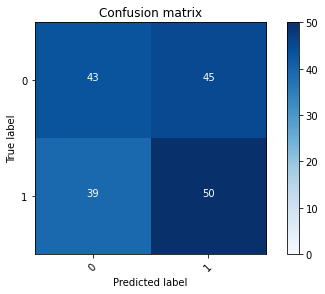

2022-08-20 18:00:13 - [Epoch Train: 92] loss: 0.0275, auc: 0.9995, acc: 0.9949, time: 51.00 s            
2022-08-20 18:00:13 - [Epoch Valid: 92] loss: 4.0104, auc: 0.4632, acc: 0.5097, time: 13.00 s


 92%|████████████████████████████████████▊   | 92/100 [1:39:33<08:34, 64.31s/it]

2022-08-20 18:00:13 - EPOCH: 93
2022-08-20 18:00:14 - Train Step 10/973, train_loss: 0.0109
2022-08-20 18:00:14 - Train Step 20/973, train_loss: 0.0080
2022-08-20 18:00:15 - Train Step 30/973, train_loss: 0.0093
2022-08-20 18:00:15 - Train Step 40/973, train_loss: 0.0091
2022-08-20 18:00:16 - Train Step 50/973, train_loss: 0.0146
2022-08-20 18:00:16 - Train Step 60/973, train_loss: 0.0169
2022-08-20 18:00:17 - Train Step 70/973, train_loss: 0.0155
2022-08-20 18:00:17 - Train Step 80/973, train_loss: 0.0145
2022-08-20 18:00:18 - Train Step 90/973, train_loss: 0.0145
2022-08-20 18:00:18 - Train Step 100/973, train_loss: 0.0207
2022-08-20 18:00:19 - Train Step 110/973, train_loss: 0.0193
2022-08-20 18:00:19 - Train Step 120/973, train_loss: 0.0192
2022-08-20 18:00:20 - Train Step 130/973, train_loss: 0.0191
2022-08-20 18:00:21 - Train Step 140/973, train_loss: 0.0181
2022-08-20 18:00:21 - Train Step 150/973, train_loss: 0.0170
2022-08-20 18:00:22 - Train Step 160/973, train_loss: 0.0161
2

2022-08-20 18:01:13 - Valid Step 185/257, valid_loss: 3.9690
2022-08-20 18:01:14 - Valid Step 190/257, valid_loss: 4.1313
2022-08-20 18:01:14 - Valid Step 195/257, valid_loss: 4.1218
2022-08-20 18:01:14 - Valid Step 200/257, valid_loss: 4.2070
2022-08-20 18:01:14 - Valid Step 205/257, valid_loss: 4.1127
2022-08-20 18:01:15 - Valid Step 210/257, valid_loss: 4.2149
2022-08-20 18:01:15 - Valid Step 215/257, valid_loss: 4.3446
2022-08-20 18:01:15 - Valid Step 220/257, valid_loss: 4.4613
2022-08-20 18:01:15 - Valid Step 225/257, valid_loss: 4.4522
2022-08-20 18:01:16 - Valid Step 230/257, valid_loss: 4.4251
2022-08-20 18:01:16 - Valid Step 235/257, valid_loss: 4.4377
2022-08-20 18:01:16 - Valid Step 240/257, valid_loss: 4.5016
2022-08-20 18:01:16 - Valid Step 245/257, valid_loss: 4.4785
2022-08-20 18:01:17 - Valid Step 250/257, valid_loss: 4.5140
2022-08-20 18:01:17 - Valid Step 255/257, valid_loss: 4.4270
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

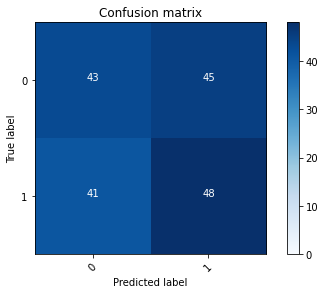

2022-08-20 18:01:17 - [Epoch Train: 93] loss: 0.0248, auc: 0.9998, acc: 0.9928, time: 50.00 s            
2022-08-20 18:01:17 - [Epoch Valid: 93] loss: 4.4662, auc: 0.4636, acc: 0.5058, time: 13.00 s


 93%|█████████████████████████████████████▏  | 93/100 [1:40:37<07:29, 64.22s/it]

2022-08-20 18:01:17 - EPOCH: 94
2022-08-20 18:01:18 - Train Step 10/973, train_loss: 0.0006
2022-08-20 18:01:18 - Train Step 20/973, train_loss: 0.0007
2022-08-20 18:01:19 - Train Step 30/973, train_loss: 0.0025
2022-08-20 18:01:19 - Train Step 40/973, train_loss: 0.0060
2022-08-20 18:01:20 - Train Step 50/973, train_loss: 0.0152
2022-08-20 18:01:20 - Train Step 60/973, train_loss: 0.0130
2022-08-20 18:01:21 - Train Step 70/973, train_loss: 0.0167
2022-08-20 18:01:21 - Train Step 80/973, train_loss: 0.0159
2022-08-20 18:01:22 - Train Step 90/973, train_loss: 0.0168
2022-08-20 18:01:22 - Train Step 100/973, train_loss: 0.0254
2022-08-20 18:01:23 - Train Step 110/973, train_loss: 0.0233
2022-08-20 18:01:23 - Train Step 120/973, train_loss: 0.0288
2022-08-20 18:01:24 - Train Step 130/973, train_loss: 0.0290
2022-08-20 18:01:24 - Train Step 140/973, train_loss: 0.0312
2022-08-20 18:01:25 - Train Step 150/973, train_loss: 0.0296
2022-08-20 18:01:25 - Train Step 160/973, train_loss: 0.0281
2

2022-08-20 18:02:18 - Valid Step 185/257, valid_loss: 4.2303
2022-08-20 18:02:18 - Valid Step 190/257, valid_loss: 4.1760
2022-08-20 18:02:18 - Valid Step 195/257, valid_loss: 4.1569
2022-08-20 18:02:18 - Valid Step 200/257, valid_loss: 4.1291
2022-08-20 18:02:19 - Valid Step 205/257, valid_loss: 4.2096
2022-08-20 18:02:19 - Valid Step 210/257, valid_loss: 4.4189
2022-08-20 18:02:19 - Valid Step 215/257, valid_loss: 4.3421
2022-08-20 18:02:19 - Valid Step 220/257, valid_loss: 4.3028
2022-08-20 18:02:20 - Valid Step 225/257, valid_loss: 4.3074
2022-08-20 18:02:20 - Valid Step 230/257, valid_loss: 4.2884
2022-08-20 18:02:20 - Valid Step 235/257, valid_loss: 4.2707
2022-08-20 18:02:20 - Valid Step 240/257, valid_loss: 4.2318
2022-08-20 18:02:21 - Valid Step 245/257, valid_loss: 4.2495
2022-08-20 18:02:21 - Valid Step 250/257, valid_loss: 4.2629
2022-08-20 18:02:21 - Valid Step 255/257, valid_loss: 4.1972
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

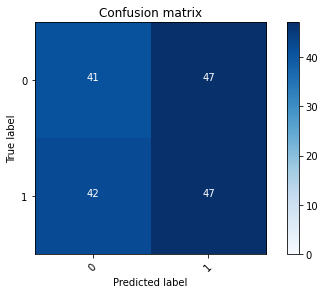

2022-08-20 18:02:21 - [Epoch Train: 94] loss: 0.0294, auc: 0.9997, acc: 0.9877, time: 50.00 s            
2022-08-20 18:02:21 - [Epoch Valid: 94] loss: 4.1690, auc: 0.4658, acc: 0.4786, time: 13.00 s


 94%|█████████████████████████████████████▌  | 94/100 [1:41:41<06:25, 64.26s/it]

2022-08-20 18:02:21 - EPOCH: 95
2022-08-20 18:02:22 - Train Step 10/973, train_loss: 0.0058
2022-08-20 18:02:23 - Train Step 20/973, train_loss: 0.0042
2022-08-20 18:02:23 - Train Step 30/973, train_loss: 0.0108
2022-08-20 18:02:24 - Train Step 40/973, train_loss: 0.0126
2022-08-20 18:02:24 - Train Step 50/973, train_loss: 0.0105
2022-08-20 18:02:25 - Train Step 60/973, train_loss: 0.0100
2022-08-20 18:02:25 - Train Step 70/973, train_loss: 0.0087
2022-08-20 18:02:26 - Train Step 80/973, train_loss: 0.0077
2022-08-20 18:02:26 - Train Step 90/973, train_loss: 0.0075
2022-08-20 18:02:27 - Train Step 100/973, train_loss: 0.0113
2022-08-20 18:02:27 - Train Step 110/973, train_loss: 0.0104
2022-08-20 18:02:28 - Train Step 120/973, train_loss: 0.0235
2022-08-20 18:02:28 - Train Step 130/973, train_loss: 0.0228
2022-08-20 18:02:29 - Train Step 140/973, train_loss: 0.0221
2022-08-20 18:02:29 - Train Step 150/973, train_loss: 0.0228
2022-08-20 18:02:30 - Train Step 160/973, train_loss: 0.0229
2

2022-08-20 18:03:22 - Valid Step 185/257, valid_loss: 4.2566
2022-08-20 18:03:23 - Valid Step 190/257, valid_loss: 4.1544
2022-08-20 18:03:23 - Valid Step 195/257, valid_loss: 4.0802
2022-08-20 18:03:23 - Valid Step 200/257, valid_loss: 4.0438
2022-08-20 18:03:23 - Valid Step 205/257, valid_loss: 3.9896
2022-08-20 18:03:24 - Valid Step 210/257, valid_loss: 3.9235
2022-08-20 18:03:24 - Valid Step 215/257, valid_loss: 3.9064
2022-08-20 18:03:24 - Valid Step 220/257, valid_loss: 3.8783
2022-08-20 18:03:24 - Valid Step 225/257, valid_loss: 3.8883
2022-08-20 18:03:25 - Valid Step 230/257, valid_loss: 3.8596
2022-08-20 18:03:25 - Valid Step 235/257, valid_loss: 3.8287
2022-08-20 18:03:25 - Valid Step 240/257, valid_loss: 3.9878
2022-08-20 18:03:25 - Valid Step 245/257, valid_loss: 3.9560
2022-08-20 18:03:26 - Valid Step 250/257, valid_loss: 3.9511
2022-08-20 18:03:26 - Valid Step 255/257, valid_loss: 4.0017
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

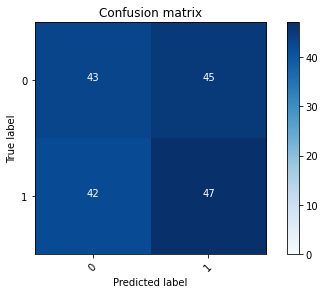

2022-08-20 18:03:26 - [Epoch Train: 95] loss: 0.0268, auc: 0.9995, acc: 0.9928, time: 51.00 s            
2022-08-20 18:03:26 - [Epoch Valid: 95] loss: 3.9808, auc: 0.4669, acc: 0.4981, time: 13.00 s


 95%|██████████████████████████████████████  | 95/100 [1:42:46<05:21, 64.37s/it]

2022-08-20 18:03:26 - EPOCH: 96
2022-08-20 18:03:27 - Train Step 10/973, train_loss: 0.0216
2022-08-20 18:03:27 - Train Step 20/973, train_loss: 0.1016
2022-08-20 18:03:28 - Train Step 30/973, train_loss: 0.0705
2022-08-20 18:03:28 - Train Step 40/973, train_loss: 0.0532
2022-08-20 18:03:29 - Train Step 50/973, train_loss: 0.0680
2022-08-20 18:03:29 - Train Step 60/973, train_loss: 0.0580
2022-08-20 18:03:30 - Train Step 70/973, train_loss: 0.0506
2022-08-20 18:03:30 - Train Step 80/973, train_loss: 0.0456
2022-08-20 18:03:31 - Train Step 90/973, train_loss: 0.0498
2022-08-20 18:03:31 - Train Step 100/973, train_loss: 0.0460
2022-08-20 18:03:32 - Train Step 110/973, train_loss: 0.0429
2022-08-20 18:03:32 - Train Step 120/973, train_loss: 0.0404
2022-08-20 18:03:33 - Train Step 130/973, train_loss: 0.0383
2022-08-20 18:03:33 - Train Step 140/973, train_loss: 0.0360
2022-08-20 18:03:34 - Train Step 150/973, train_loss: 0.0385
2022-08-20 18:03:34 - Train Step 160/973, train_loss: 0.0367
2

2022-08-20 18:04:26 - Valid Step 185/257, valid_loss: 4.1106
2022-08-20 18:04:26 - Valid Step 190/257, valid_loss: 4.1832
2022-08-20 18:04:27 - Valid Step 195/257, valid_loss: 4.1237
2022-08-20 18:04:27 - Valid Step 200/257, valid_loss: 4.0886
2022-08-20 18:04:27 - Valid Step 205/257, valid_loss: 4.0140
2022-08-20 18:04:27 - Valid Step 210/257, valid_loss: 4.0131
2022-08-20 18:04:28 - Valid Step 215/257, valid_loss: 4.0126
2022-08-20 18:04:28 - Valid Step 220/257, valid_loss: 4.0399
2022-08-20 18:04:28 - Valid Step 225/257, valid_loss: 4.0140
2022-08-20 18:04:28 - Valid Step 230/257, valid_loss: 3.9981
2022-08-20 18:04:29 - Valid Step 235/257, valid_loss: 3.9608
2022-08-20 18:04:29 - Valid Step 240/257, valid_loss: 4.0371
2022-08-20 18:04:29 - Valid Step 245/257, valid_loss: 4.0777
2022-08-20 18:04:29 - Valid Step 250/257, valid_loss: 4.0887
2022-08-20 18:04:30 - Valid Step 255/257, valid_loss: 4.0088
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

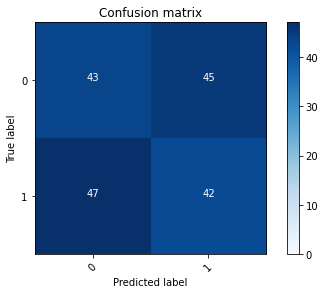

2022-08-20 18:04:30 - [Epoch Train: 96] loss: 0.0296, auc: 0.9996, acc: 0.9908, time: 50.00 s            
2022-08-20 18:04:30 - [Epoch Valid: 96] loss: 4.0013, auc: 0.4537, acc: 0.4669, time: 13.00 s


 96%|██████████████████████████████████████▍ | 96/100 [1:43:50<04:16, 64.20s/it]

2022-08-20 18:04:30 - EPOCH: 97
2022-08-20 18:04:31 - Train Step 10/973, train_loss: 0.0115
2022-08-20 18:04:31 - Train Step 20/973, train_loss: 0.0094
2022-08-20 18:04:32 - Train Step 30/973, train_loss: 0.0122
2022-08-20 18:04:32 - Train Step 40/973, train_loss: 0.0360
2022-08-20 18:04:33 - Train Step 50/973, train_loss: 0.0319
2022-08-20 18:04:33 - Train Step 60/973, train_loss: 0.0327
2022-08-20 18:04:34 - Train Step 70/973, train_loss: 0.0292
2022-08-20 18:04:34 - Train Step 80/973, train_loss: 0.0266
2022-08-20 18:04:35 - Train Step 90/973, train_loss: 0.0298
2022-08-20 18:04:36 - Train Step 100/973, train_loss: 0.0274
2022-08-20 18:04:36 - Train Step 110/973, train_loss: 0.0258
2022-08-20 18:04:37 - Train Step 120/973, train_loss: 0.0243
2022-08-20 18:04:37 - Train Step 130/973, train_loss: 0.0229
2022-08-20 18:04:38 - Train Step 140/973, train_loss: 0.0222
2022-08-20 18:04:38 - Train Step 150/973, train_loss: 0.0223
2022-08-20 18:04:39 - Train Step 160/973, train_loss: 0.0211
2

2022-08-20 18:05:31 - Valid Step 185/257, valid_loss: 4.0496
2022-08-20 18:05:31 - Valid Step 190/257, valid_loss: 3.9644
2022-08-20 18:05:31 - Valid Step 195/257, valid_loss: 3.9096
2022-08-20 18:05:32 - Valid Step 200/257, valid_loss: 3.9292
2022-08-20 18:05:32 - Valid Step 205/257, valid_loss: 4.0469
2022-08-20 18:05:32 - Valid Step 210/257, valid_loss: 4.0152
2022-08-20 18:05:32 - Valid Step 215/257, valid_loss: 3.9883
2022-08-20 18:05:33 - Valid Step 220/257, valid_loss: 4.0298
2022-08-20 18:05:33 - Valid Step 225/257, valid_loss: 4.1898
2022-08-20 18:05:33 - Valid Step 230/257, valid_loss: 4.2543
2022-08-20 18:05:33 - Valid Step 235/257, valid_loss: 4.2072
2022-08-20 18:05:34 - Valid Step 240/257, valid_loss: 4.1219
2022-08-20 18:05:34 - Valid Step 245/257, valid_loss: 4.1254
2022-08-20 18:05:34 - Valid Step 250/257, valid_loss: 4.0433
2022-08-20 18:05:34 - Valid Step 255/257, valid_loss: 4.0206
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

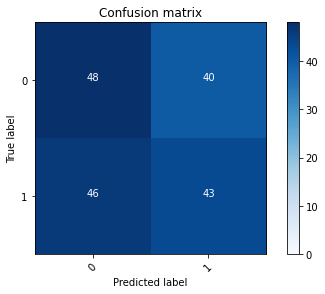

2022-08-20 18:05:35 - [Epoch Train: 97] loss: 0.0261, auc: 0.9997, acc: 0.9959, time: 51.00 s            
2022-08-20 18:05:35 - [Epoch Valid: 97] loss: 4.0134, auc: 0.4630, acc: 0.5097, time: 13.00 s


 97%|██████████████████████████████████████▊ | 97/100 [1:44:54<03:13, 64.36s/it]

2022-08-20 18:05:35 - EPOCH: 98
2022-08-20 18:05:35 - Train Step 10/973, train_loss: 0.0131
2022-08-20 18:05:36 - Train Step 20/973, train_loss: 0.1321
2022-08-20 18:05:36 - Train Step 30/973, train_loss: 0.1120
2022-08-20 18:05:37 - Train Step 40/973, train_loss: 0.0862
2022-08-20 18:05:37 - Train Step 50/973, train_loss: 0.0745
2022-08-20 18:05:38 - Train Step 60/973, train_loss: 0.0644
2022-08-20 18:05:38 - Train Step 70/973, train_loss: 0.0595
2022-08-20 18:05:39 - Train Step 80/973, train_loss: 0.0646
2022-08-20 18:05:39 - Train Step 90/973, train_loss: 0.0596
2022-08-20 18:05:40 - Train Step 100/973, train_loss: 0.0557
2022-08-20 18:05:40 - Train Step 110/973, train_loss: 0.0610
2022-08-20 18:05:41 - Train Step 120/973, train_loss: 0.0580
2022-08-20 18:05:41 - Train Step 130/973, train_loss: 0.0563
2022-08-20 18:05:42 - Train Step 140/973, train_loss: 0.0560
2022-08-20 18:05:42 - Train Step 150/973, train_loss: 0.0525
2022-08-20 18:05:43 - Train Step 160/973, train_loss: 0.0580
2

2022-08-20 18:06:35 - Valid Step 185/257, valid_loss: 5.1313
2022-08-20 18:06:35 - Valid Step 190/257, valid_loss: 5.0650
2022-08-20 18:06:35 - Valid Step 195/257, valid_loss: 5.0286
2022-08-20 18:06:35 - Valid Step 200/257, valid_loss: 4.9743
2022-08-20 18:06:36 - Valid Step 205/257, valid_loss: 4.9046
2022-08-20 18:06:36 - Valid Step 210/257, valid_loss: 4.8610
2022-08-20 18:06:36 - Valid Step 215/257, valid_loss: 4.8223
2022-08-20 18:06:37 - Valid Step 220/257, valid_loss: 4.7936
2022-08-20 18:06:37 - Valid Step 225/257, valid_loss: 4.8093
2022-08-20 18:06:37 - Valid Step 230/257, valid_loss: 4.7669
2022-08-20 18:06:37 - Valid Step 235/257, valid_loss: 4.6929
2022-08-20 18:06:38 - Valid Step 240/257, valid_loss: 4.6074
2022-08-20 18:06:38 - Valid Step 245/257, valid_loss: 4.6015
2022-08-20 18:06:38 - Valid Step 250/257, valid_loss: 4.7044
2022-08-20 18:06:38 - Valid Step 255/257, valid_loss: 4.6477
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

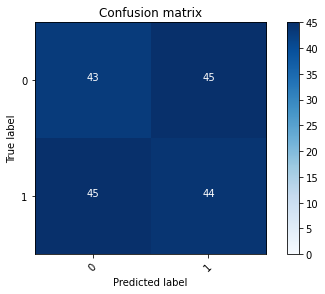

2022-08-20 18:06:39 - [Epoch Train: 98] loss: 0.0306, auc: 0.9994, acc: 0.9928, time: 50.00 s            
2022-08-20 18:06:39 - [Epoch Valid: 98] loss: 4.6619, auc: 0.4473, acc: 0.4786, time: 13.00 s


 98%|███████████████████████████████████████▏| 98/100 [1:45:58<02:08, 64.23s/it]

2022-08-20 18:06:39 - EPOCH: 99
2022-08-20 18:06:39 - Train Step 10/973, train_loss: 0.0016
2022-08-20 18:06:40 - Train Step 20/973, train_loss: 0.1413
2022-08-20 18:06:40 - Train Step 30/973, train_loss: 0.0962
2022-08-20 18:06:41 - Train Step 40/973, train_loss: 0.0831
2022-08-20 18:06:41 - Train Step 50/973, train_loss: 0.0733
2022-08-20 18:06:42 - Train Step 60/973, train_loss: 0.0622
2022-08-20 18:06:42 - Train Step 70/973, train_loss: 0.0556
2022-08-20 18:06:43 - Train Step 80/973, train_loss: 0.0502
2022-08-20 18:06:43 - Train Step 90/973, train_loss: 0.0447
2022-08-20 18:06:44 - Train Step 100/973, train_loss: 0.0425
2022-08-20 18:06:44 - Train Step 110/973, train_loss: 0.0402
2022-08-20 18:06:45 - Train Step 120/973, train_loss: 0.0387
2022-08-20 18:06:45 - Train Step 130/973, train_loss: 0.0377
2022-08-20 18:06:46 - Train Step 140/973, train_loss: 0.0356
2022-08-20 18:06:46 - Train Step 150/973, train_loss: 0.0347
2022-08-20 18:06:47 - Train Step 160/973, train_loss: 0.0336
2

2022-08-20 18:07:38 - Valid Step 185/257, valid_loss: 4.4214
2022-08-20 18:07:38 - Valid Step 190/257, valid_loss: 4.4972
2022-08-20 18:07:39 - Valid Step 195/257, valid_loss: 4.3819
2022-08-20 18:07:39 - Valid Step 200/257, valid_loss: 4.2813
2022-08-20 18:07:39 - Valid Step 205/257, valid_loss: 4.4527
2022-08-20 18:07:39 - Valid Step 210/257, valid_loss: 4.4373
2022-08-20 18:07:40 - Valid Step 215/257, valid_loss: 4.3495
2022-08-20 18:07:40 - Valid Step 220/257, valid_loss: 4.3869
2022-08-20 18:07:40 - Valid Step 225/257, valid_loss: 4.3009
2022-08-20 18:07:40 - Valid Step 230/257, valid_loss: 4.2768
2022-08-20 18:07:41 - Valid Step 235/257, valid_loss: 4.2670
2022-08-20 18:07:41 - Valid Step 240/257, valid_loss: 4.2658
2022-08-20 18:07:41 - Valid Step 245/257, valid_loss: 4.1964
2022-08-20 18:07:41 - Valid Step 250/257, valid_loss: 4.1379
2022-08-20 18:07:42 - Valid Step 255/257, valid_loss: 4.1333
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

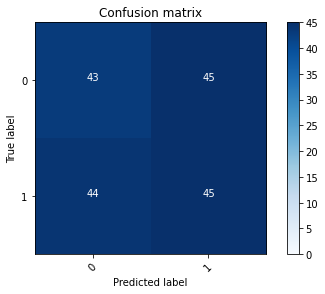

2022-08-20 18:07:42 - [Epoch Train: 99] loss: 0.0264, auc: 0.9999, acc: 0.9928, time: 49.00 s            
2022-08-20 18:07:42 - [Epoch Valid: 99] loss: 4.1011, auc: 0.4634, acc: 0.4942, time: 13.00 s


 99%|███████████████████████████████████████▌| 99/100 [1:47:02<01:03, 63.94s/it]

2022-08-20 18:07:42 - EPOCH: 100
2022-08-20 18:07:42 - Train Step 10/973, train_loss: 0.0092
2022-08-20 18:07:43 - Train Step 20/973, train_loss: 0.0053
2022-08-20 18:07:43 - Train Step 30/973, train_loss: 0.0055
2022-08-20 18:07:44 - Train Step 40/973, train_loss: 0.0061
2022-08-20 18:07:44 - Train Step 50/973, train_loss: 0.0076
2022-08-20 18:07:45 - Train Step 60/973, train_loss: 0.0074
2022-08-20 18:07:45 - Train Step 70/973, train_loss: 0.0076
2022-08-20 18:07:46 - Train Step 80/973, train_loss: 0.0265
2022-08-20 18:07:47 - Train Step 90/973, train_loss: 0.0261
2022-08-20 18:07:47 - Train Step 100/973, train_loss: 0.0265
2022-08-20 18:07:48 - Train Step 110/973, train_loss: 0.0250
2022-08-20 18:07:48 - Train Step 120/973, train_loss: 0.0239
2022-08-20 18:07:49 - Train Step 130/973, train_loss: 0.0226
2022-08-20 18:07:49 - Train Step 140/973, train_loss: 0.0230
2022-08-20 18:07:50 - Train Step 150/973, train_loss: 0.0238
2022-08-20 18:07:50 - Train Step 160/973, train_loss: 0.0250


2022-08-20 18:08:43 - Valid Step 185/257, valid_loss: 4.4902
2022-08-20 18:08:43 - Valid Step 190/257, valid_loss: 4.4495
2022-08-20 18:08:43 - Valid Step 195/257, valid_loss: 4.4246
2022-08-20 18:08:43 - Valid Step 200/257, valid_loss: 4.4760
2022-08-20 18:08:44 - Valid Step 205/257, valid_loss: 4.5384
2022-08-20 18:08:44 - Valid Step 210/257, valid_loss: 4.4628
2022-08-20 18:08:44 - Valid Step 215/257, valid_loss: 4.5454
2022-08-20 18:08:44 - Valid Step 220/257, valid_loss: 4.5633
2022-08-20 18:08:45 - Valid Step 225/257, valid_loss: 4.4926
2022-08-20 18:08:45 - Valid Step 230/257, valid_loss: 4.4036
2022-08-20 18:08:45 - Valid Step 235/257, valid_loss: 4.3254
2022-08-20 18:08:45 - Valid Step 240/257, valid_loss: 4.2622
2022-08-20 18:08:46 - Valid Step 245/257, valid_loss: 4.3045
2022-08-20 18:08:46 - Valid Step 250/257, valid_loss: 4.3580
2022-08-20 18:08:46 - Valid Step 255/257, valid_loss: 4.3102
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

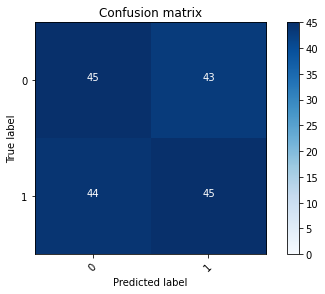

2022-08-20 18:08:46 - [Epoch Train: 100] loss: 0.0266, auc: 0.9996, acc: 0.9938, time: 50.00 s            
2022-08-20 18:08:46 - [Epoch Valid: 100] loss: 4.3936, auc: 0.4568, acc: 0.5019, time: 13.00 s


100%|███████████████████████████████████████| 100/100 [1:48:06<00:00, 64.87s/it]

-- FOLD N:2
Train origin: mn
Type: KLF
2022-08-20 18:08:46 - (M0) Train/Val datasets size: 270
2022-08-20 18:08:46 - (M1) Train/Val datasets size: 303
2022-08-20 18:08:46 - (N0) Train/Val datasets size: 170
2022-08-20 18:08:46 - (N1) Train/Val datasets size: 121
2022-08-20 18:08:46 - Concatenating M0 and N0...
Length of concatenated dataset: 540
2022-08-20 18:08:46 - (MN0) Train/Val datasets size: 540
2022-08-20 18:08:46 - Concatenating M1 and N1...
Length of concatenated dataset: 606
2022-08-20 18:08:46 - (MN1) Train/Val datasets size: 606
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa5500af430>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fa5500af730>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa5500af640>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7fa50e50edc0>, 'mn_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa5500af5e0>, 'mn_dataset_1': <utils.da

[([0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 29, 30, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 57, 59, 60, 61, 62, 63, 64, 66, 67, 69, 70, 71, 72, 73, 76, 77, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 99, 101, 102, 103, 104, 105, 106, 107, 108, 109, 112, 113, 114, 116, 117, 118, 119, 120, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 135, 137, 138, 139, 140, 141, 142, 144, 145, 146, 147, 148, 150, 151, 154, 155, 156, 158, 159, 161, 162, 163, 166, 167, 168, 170, 171, 172, 173, 176, 177, 178, 179, 180, 181, 182, 184, 187, 188, 189, 190, 191, 192, 195, 196, 197, 198, 199, 200, 201, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 224, 226, 227, 228, 229, 230, 231, 232, 233, 235, 236, 237, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 250, 252, 254, 255, 256, 257, 258, 259, 260, 262, 263, 264, 265, 266, 267, 268, 269, 270, 2

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 29, 30, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 57, 59, 60, 61, 62, 63, 64, 66, 67, 69, 70, 71, 72, 73, 76, 77, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 99, 101, 102, 103, 104, 105, 106, 107, 108, 109, 112, 113, 114, 116, 117, 118, 119, 120, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 135, 137, 138, 139, 140, 141, 142, 144, 145, 146, 147, 148, 150, 151, 154, 155, 156, 158, 159, 161, 162, 163, 166, 167, 168, 170, 171, 172, 173, 176, 177, 178, 179, 180, 181, 182, 184, 187, 188, 189, 190, 191, 192, 195, 196, 197, 198, 199, 200, 201, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 224, 226, 227, 228, 229, 230, 231, 232, 233, 235, 236, 237, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 250, 252, 254, 25

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa629fe9100>, <torch.utils.data.dataloader.DataLoader object at 0x7fa55034d070>, <torch.utils.data.dataloader.DataLoader object at 0x7fa50e42a190>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa5505510d0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa5505513d0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa550551730>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa550551ee0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa50e1ace80>, <torch.utils.data.dataloader.DataLoader object at 0x7fa5501c4b20>]}}
2022-08-20 18:21:17 - Using CUDA...
KLF
{'ext': 'mat', 'dims': 2, 'batch_size': 1, 'mri_types': ['KLF'], 'is_depth_wise': True, 'is_transformed': False, 'output_size': 1, 'is_multistep': True, 'lr': 0.0001, 'is_adam': True, 'momentum': 0.9, 'is_10_fold': False, 'val_total_ratio': 0.2, 'is_internal_dataset': True, 'train_origin'

  0%|                                                   | 0/100 [00:00<?, ?it/s]

2022-08-20 18:21:17 - EPOCH: 1
2022-08-20 18:21:18 - Train Step 10/977, train_loss: 0.6958
2022-08-20 18:21:18 - Train Step 20/977, train_loss: 0.6893
2022-08-20 18:21:19 - Train Step 30/977, train_loss: 0.6926
2022-08-20 18:21:19 - Train Step 40/977, train_loss: 0.6945
2022-08-20 18:21:20 - Train Step 50/977, train_loss: 0.6948
2022-08-20 18:21:20 - Train Step 60/977, train_loss: 0.6957
2022-08-20 18:21:21 - Train Step 70/977, train_loss: 0.6937
2022-08-20 18:21:21 - Train Step 80/977, train_loss: 0.6937
2022-08-20 18:21:22 - Train Step 90/977, train_loss: 0.6933
2022-08-20 18:21:22 - Train Step 100/977, train_loss: 0.6940
2022-08-20 18:21:23 - Train Step 110/977, train_loss: 0.6948
2022-08-20 18:21:23 - Train Step 120/977, train_loss: 0.6957
2022-08-20 18:21:24 - Train Step 130/977, train_loss: 0.6957
2022-08-20 18:21:24 - Train Step 140/977, train_loss: 0.6958
2022-08-20 18:21:25 - Train Step 150/977, train_loss: 0.6957
2022-08-20 18:21:26 - Train Step 160/977, train_loss: 0.6955
20

2022-08-20 18:22:17 - Valid Step 185/257, valid_loss: 0.6946
2022-08-20 18:22:17 - Valid Step 190/257, valid_loss: 0.6946
2022-08-20 18:22:18 - Valid Step 195/257, valid_loss: 0.6947
2022-08-20 18:22:18 - Valid Step 200/257, valid_loss: 0.6945
2022-08-20 18:22:18 - Valid Step 205/257, valid_loss: 0.6945
2022-08-20 18:22:18 - Valid Step 210/257, valid_loss: 0.6942
2022-08-20 18:22:19 - Valid Step 215/257, valid_loss: 0.6942
2022-08-20 18:22:19 - Valid Step 220/257, valid_loss: 0.6940
2022-08-20 18:22:19 - Valid Step 225/257, valid_loss: 0.6938
2022-08-20 18:22:19 - Valid Step 230/257, valid_loss: 0.6939
2022-08-20 18:22:20 - Valid Step 235/257, valid_loss: 0.6943
2022-08-20 18:22:20 - Valid Step 240/257, valid_loss: 0.6944
2022-08-20 18:22:20 - Valid Step 245/257, valid_loss: 0.6948
2022-08-20 18:22:20 - Valid Step 250/257, valid_loss: 0.6945
2022-08-20 18:22:21 - Valid Step 255/257, valid_loss: 0.6943
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

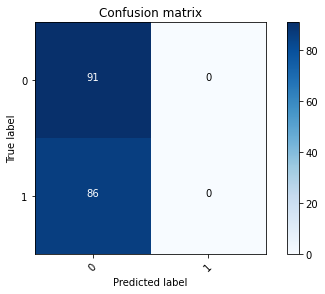

2022-08-20 18:22:21 - [Epoch Train: 1] loss: 0.6938, auc: 0.4637, acc: 0.4954, time: 50.00 s            
2022-08-20 18:22:21 - [Epoch Valid: 1] loss: 0.6943, auc: 0.5194, acc: 0.5175, time: 13.00 s
2022-08-20 18:22:21 - acc improved from 0.0000 to 0.5175. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_18-21-17/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e1-loss0.694-acc0.518-auc0.519.pth'


  1%|▍                                        | 1/100 [01:03<1:45:13, 63.77s/it]

2022-08-20 18:22:21 - EPOCH: 2
2022-08-20 18:22:22 - Train Step 10/977, train_loss: 0.6739
2022-08-20 18:22:22 - Train Step 20/977, train_loss: 0.6852
2022-08-20 18:22:23 - Train Step 30/977, train_loss: 0.6867
2022-08-20 18:22:23 - Train Step 40/977, train_loss: 0.6868
2022-08-20 18:22:24 - Train Step 50/977, train_loss: 0.6878
2022-08-20 18:22:24 - Train Step 60/977, train_loss: 0.6893
2022-08-20 18:22:25 - Train Step 70/977, train_loss: 0.6896
2022-08-20 18:22:25 - Train Step 80/977, train_loss: 0.6879
2022-08-20 18:22:26 - Train Step 90/977, train_loss: 0.6904
2022-08-20 18:22:26 - Train Step 100/977, train_loss: 0.6913
2022-08-20 18:22:27 - Train Step 110/977, train_loss: 0.6912
2022-08-20 18:22:27 - Train Step 120/977, train_loss: 0.6905
2022-08-20 18:22:28 - Train Step 130/977, train_loss: 0.6902
2022-08-20 18:22:28 - Train Step 140/977, train_loss: 0.6897
2022-08-20 18:22:29 - Train Step 150/977, train_loss: 0.6896
2022-08-20 18:22:29 - Train Step 160/977, train_loss: 0.6893
20

2022-08-20 18:23:21 - Valid Step 185/257, valid_loss: 0.6938
2022-08-20 18:23:22 - Valid Step 190/257, valid_loss: 0.6932
2022-08-20 18:23:22 - Valid Step 195/257, valid_loss: 0.6933
2022-08-20 18:23:22 - Valid Step 200/257, valid_loss: 0.6933
2022-08-20 18:23:22 - Valid Step 205/257, valid_loss: 0.6930
2022-08-20 18:23:23 - Valid Step 210/257, valid_loss: 0.6932
2022-08-20 18:23:23 - Valid Step 215/257, valid_loss: 0.6933
2022-08-20 18:23:23 - Valid Step 220/257, valid_loss: 0.6929
2022-08-20 18:23:24 - Valid Step 225/257, valid_loss: 0.6929
2022-08-20 18:23:24 - Valid Step 230/257, valid_loss: 0.6928
2022-08-20 18:23:24 - Valid Step 235/257, valid_loss: 0.6932
2022-08-20 18:23:24 - Valid Step 240/257, valid_loss: 0.6935
2022-08-20 18:23:25 - Valid Step 245/257, valid_loss: 0.6934
2022-08-20 18:23:25 - Valid Step 250/257, valid_loss: 0.6936
2022-08-20 18:23:25 - Valid Step 255/257, valid_loss: 0.6939
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

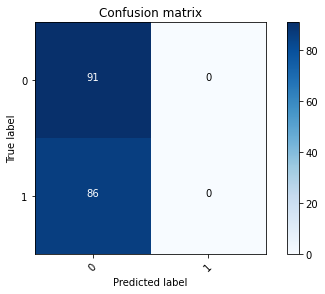

2022-08-20 18:23:25 - [Epoch Train: 2] loss: 0.6910, auc: 0.5940, acc: 0.4954, time: 50.00 s            
2022-08-20 18:23:25 - [Epoch Valid: 2] loss: 0.6938, auc: 0.5167, acc: 0.5175, time: 13.00 s
2022-08-20 18:23:25 - acc improved from 0.5175 to 0.5175. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_18-21-17/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e2-loss0.694-acc0.518-auc0.517.pth'


  2%|▊                                        | 2/100 [02:08<1:44:52, 64.20s/it]

2022-08-20 18:23:25 - EPOCH: 3
2022-08-20 18:23:26 - Train Step 10/977, train_loss: 0.6977
2022-08-20 18:23:27 - Train Step 20/977, train_loss: 0.6903
2022-08-20 18:23:27 - Train Step 30/977, train_loss: 0.6945
2022-08-20 18:23:28 - Train Step 40/977, train_loss: 0.6953
2022-08-20 18:23:28 - Train Step 50/977, train_loss: 0.6934
2022-08-20 18:23:29 - Train Step 60/977, train_loss: 0.6933
2022-08-20 18:23:29 - Train Step 70/977, train_loss: 0.6949
2022-08-20 18:23:30 - Train Step 80/977, train_loss: 0.6946
2022-08-20 18:23:30 - Train Step 90/977, train_loss: 0.6941
2022-08-20 18:23:31 - Train Step 100/977, train_loss: 0.6933
2022-08-20 18:23:31 - Train Step 110/977, train_loss: 0.6933
2022-08-20 18:23:32 - Train Step 120/977, train_loss: 0.6929
2022-08-20 18:23:32 - Train Step 130/977, train_loss: 0.6933
2022-08-20 18:23:33 - Train Step 140/977, train_loss: 0.6922
2022-08-20 18:23:33 - Train Step 150/977, train_loss: 0.6923
2022-08-20 18:23:34 - Train Step 160/977, train_loss: 0.6927
20

2022-08-20 18:24:26 - Valid Step 185/257, valid_loss: 0.6939
2022-08-20 18:24:26 - Valid Step 190/257, valid_loss: 0.6939
2022-08-20 18:24:26 - Valid Step 195/257, valid_loss: 0.6939
2022-08-20 18:24:27 - Valid Step 200/257, valid_loss: 0.6939
2022-08-20 18:24:27 - Valid Step 205/257, valid_loss: 0.6936
2022-08-20 18:24:27 - Valid Step 210/257, valid_loss: 0.6938
2022-08-20 18:24:27 - Valid Step 215/257, valid_loss: 0.6940
2022-08-20 18:24:28 - Valid Step 220/257, valid_loss: 0.6946
2022-08-20 18:24:28 - Valid Step 225/257, valid_loss: 0.6943
2022-08-20 18:24:28 - Valid Step 230/257, valid_loss: 0.6940
2022-08-20 18:24:28 - Valid Step 235/257, valid_loss: 0.6942
2022-08-20 18:24:29 - Valid Step 240/257, valid_loss: 0.6938
2022-08-20 18:24:29 - Valid Step 245/257, valid_loss: 0.6940
2022-08-20 18:24:29 - Valid Step 250/257, valid_loss: 0.6942
2022-08-20 18:24:29 - Valid Step 255/257, valid_loss: 0.6940
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

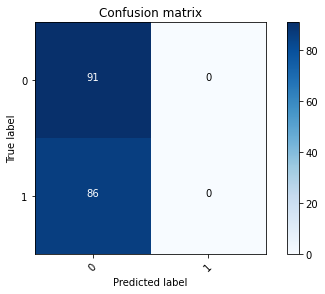

2022-08-20 18:24:30 - [Epoch Train: 3] loss: 0.6889, auc: 0.5850, acc: 0.4954, time: 50.00 s            
2022-08-20 18:24:30 - [Epoch Valid: 3] loss: 0.6943, auc: 0.5206, acc: 0.5175, time: 13.00 s
2022-08-20 18:24:30 - acc improved from 0.5175 to 0.5175. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_18-21-17/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e3-loss0.694-acc0.518-auc0.521.pth'


  3%|█▏                                       | 3/100 [03:12<1:43:47, 64.21s/it]

2022-08-20 18:24:30 - EPOCH: 4
2022-08-20 18:24:30 - Train Step 10/977, train_loss: 0.6768
2022-08-20 18:24:31 - Train Step 20/977, train_loss: 0.6799
2022-08-20 18:24:31 - Train Step 30/977, train_loss: 0.6829
2022-08-20 18:24:32 - Train Step 40/977, train_loss: 0.6888
2022-08-20 18:24:32 - Train Step 50/977, train_loss: 0.6871
2022-08-20 18:24:33 - Train Step 60/977, train_loss: 0.6836
2022-08-20 18:24:33 - Train Step 70/977, train_loss: 0.6865
2022-08-20 18:24:34 - Train Step 80/977, train_loss: 0.6847
2022-08-20 18:24:34 - Train Step 90/977, train_loss: 0.6814
2022-08-20 18:24:35 - Train Step 100/977, train_loss: 0.6803
2022-08-20 18:24:35 - Train Step 110/977, train_loss: 0.6838
2022-08-20 18:24:36 - Train Step 120/977, train_loss: 0.6825
2022-08-20 18:24:36 - Train Step 130/977, train_loss: 0.6831
2022-08-20 18:24:37 - Train Step 140/977, train_loss: 0.6840
2022-08-20 18:24:38 - Train Step 150/977, train_loss: 0.6837
2022-08-20 18:24:38 - Train Step 160/977, train_loss: 0.6823
20

2022-08-20 18:25:30 - Valid Step 185/257, valid_loss: 0.6913
2022-08-20 18:25:31 - Valid Step 190/257, valid_loss: 0.6921
2022-08-20 18:25:31 - Valid Step 195/257, valid_loss: 0.6934
2022-08-20 18:25:31 - Valid Step 200/257, valid_loss: 0.6924
2022-08-20 18:25:32 - Valid Step 205/257, valid_loss: 0.6927
2022-08-20 18:25:32 - Valid Step 210/257, valid_loss: 0.6932
2022-08-20 18:25:32 - Valid Step 215/257, valid_loss: 0.6928
2022-08-20 18:25:32 - Valid Step 220/257, valid_loss: 0.6955
2022-08-20 18:25:33 - Valid Step 225/257, valid_loss: 0.6962
2022-08-20 18:25:33 - Valid Step 230/257, valid_loss: 0.6962
2022-08-20 18:25:33 - Valid Step 235/257, valid_loss: 0.6960
2022-08-20 18:25:33 - Valid Step 240/257, valid_loss: 0.6965
2022-08-20 18:25:34 - Valid Step 245/257, valid_loss: 0.6969
2022-08-20 18:25:34 - Valid Step 250/257, valid_loss: 0.6978
2022-08-20 18:25:34 - Valid Step 255/257, valid_loss: 0.6979
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

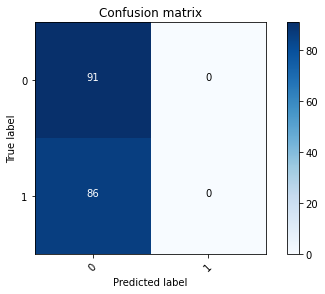

2022-08-20 18:25:34 - [Epoch Train: 4] loss: 0.6801, auc: 0.6315, acc: 0.4954, time: 51.00 s            
2022-08-20 18:25:34 - [Epoch Valid: 4] loss: 0.6981, auc: 0.4973, acc: 0.5175, time: 13.00 s
2022-08-20 18:25:34 - acc improved from 0.5175 to 0.5175. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_18-21-17/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e4-loss0.698-acc0.518-auc0.497.pth'


  4%|█▋                                       | 4/100 [04:17<1:43:07, 64.46s/it]

2022-08-20 18:25:34 - EPOCH: 5
2022-08-20 18:25:35 - Train Step 10/977, train_loss: 0.6271
2022-08-20 18:25:36 - Train Step 20/977, train_loss: 0.6229
2022-08-20 18:25:36 - Train Step 30/977, train_loss: 0.6403
2022-08-20 18:25:37 - Train Step 40/977, train_loss: 0.6407
2022-08-20 18:25:37 - Train Step 50/977, train_loss: 0.6512
2022-08-20 18:25:38 - Train Step 60/977, train_loss: 0.6549
2022-08-20 18:25:38 - Train Step 70/977, train_loss: 0.6574
2022-08-20 18:25:39 - Train Step 80/977, train_loss: 0.6530
2022-08-20 18:25:39 - Train Step 90/977, train_loss: 0.6542
2022-08-20 18:25:40 - Train Step 100/977, train_loss: 0.6548
2022-08-20 18:25:40 - Train Step 110/977, train_loss: 0.6569
2022-08-20 18:25:41 - Train Step 120/977, train_loss: 0.6606
2022-08-20 18:25:41 - Train Step 130/977, train_loss: 0.6585
2022-08-20 18:25:42 - Train Step 140/977, train_loss: 0.6604
2022-08-20 18:25:42 - Train Step 150/977, train_loss: 0.6632
2022-08-20 18:25:43 - Train Step 160/977, train_loss: 0.6636
20

2022-08-20 18:26:35 - Valid Step 185/257, valid_loss: 0.7141
2022-08-20 18:26:36 - Valid Step 190/257, valid_loss: 0.7122
2022-08-20 18:26:36 - Valid Step 195/257, valid_loss: 0.7170
2022-08-20 18:26:36 - Valid Step 200/257, valid_loss: 0.7173
2022-08-20 18:26:36 - Valid Step 205/257, valid_loss: 0.7166
2022-08-20 18:26:37 - Valid Step 210/257, valid_loss: 0.7175
2022-08-20 18:26:37 - Valid Step 215/257, valid_loss: 0.7154
2022-08-20 18:26:37 - Valid Step 220/257, valid_loss: 0.7150
2022-08-20 18:26:37 - Valid Step 225/257, valid_loss: 0.7143
2022-08-20 18:26:38 - Valid Step 230/257, valid_loss: 0.7146
2022-08-20 18:26:38 - Valid Step 235/257, valid_loss: 0.7164
2022-08-20 18:26:38 - Valid Step 240/257, valid_loss: 0.7153
2022-08-20 18:26:38 - Valid Step 245/257, valid_loss: 0.7144
2022-08-20 18:26:39 - Valid Step 250/257, valid_loss: 0.7129
2022-08-20 18:26:39 - Valid Step 255/257, valid_loss: 0.7106
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

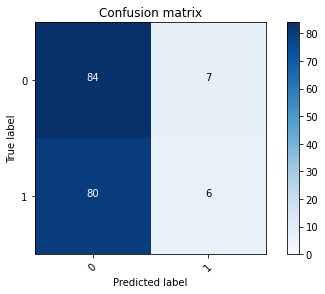

2022-08-20 18:26:39 - [Epoch Train: 5] loss: 0.6593, auc: 0.6620, acc: 0.5179, time: 51.00 s            
2022-08-20 18:26:39 - [Epoch Valid: 5] loss: 0.7114, auc: 0.4853, acc: 0.5175, time: 13.00 s
2022-08-20 18:26:39 - acc improved from 0.5175 to 0.5175. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_18-21-17/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e5-loss0.711-acc0.518-auc0.485.pth'


  5%|██                                       | 5/100 [05:22<1:42:15, 64.58s/it]

2022-08-20 18:26:39 - EPOCH: 6
2022-08-20 18:26:40 - Train Step 10/977, train_loss: 0.5920
2022-08-20 18:26:41 - Train Step 20/977, train_loss: 0.6079
2022-08-20 18:26:41 - Train Step 30/977, train_loss: 0.6079
2022-08-20 18:26:42 - Train Step 40/977, train_loss: 0.6149
2022-08-20 18:26:42 - Train Step 50/977, train_loss: 0.6099
2022-08-20 18:26:43 - Train Step 60/977, train_loss: 0.6110
2022-08-20 18:26:43 - Train Step 70/977, train_loss: 0.5967
2022-08-20 18:26:43 - Train Step 80/977, train_loss: 0.5935
2022-08-20 18:26:44 - Train Step 90/977, train_loss: 0.6097
2022-08-20 18:26:45 - Train Step 100/977, train_loss: 0.6175
2022-08-20 18:26:45 - Train Step 110/977, train_loss: 0.6088
2022-08-20 18:26:46 - Train Step 120/977, train_loss: 0.6148
2022-08-20 18:26:46 - Train Step 130/977, train_loss: 0.6156
2022-08-20 18:26:47 - Train Step 140/977, train_loss: 0.6163
2022-08-20 18:26:47 - Train Step 150/977, train_loss: 0.6137
2022-08-20 18:26:48 - Train Step 160/977, train_loss: 0.6190
20

2022-08-20 18:27:40 - Valid Step 185/257, valid_loss: 0.7356
2022-08-20 18:27:40 - Valid Step 190/257, valid_loss: 0.7421
2022-08-20 18:27:40 - Valid Step 195/257, valid_loss: 0.7390
2022-08-20 18:27:40 - Valid Step 200/257, valid_loss: 0.7417
2022-08-20 18:27:41 - Valid Step 205/257, valid_loss: 0.7426
2022-08-20 18:27:41 - Valid Step 210/257, valid_loss: 0.7431
2022-08-20 18:27:41 - Valid Step 215/257, valid_loss: 0.7358
2022-08-20 18:27:41 - Valid Step 220/257, valid_loss: 0.7366
2022-08-20 18:27:42 - Valid Step 225/257, valid_loss: 0.7345
2022-08-20 18:27:42 - Valid Step 230/257, valid_loss: 0.7316
2022-08-20 18:27:42 - Valid Step 235/257, valid_loss: 0.7316
2022-08-20 18:27:42 - Valid Step 240/257, valid_loss: 0.7334
2022-08-20 18:27:43 - Valid Step 245/257, valid_loss: 0.7377
2022-08-20 18:27:43 - Valid Step 250/257, valid_loss: 0.7368
2022-08-20 18:27:43 - Valid Step 255/257, valid_loss: 0.7388
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

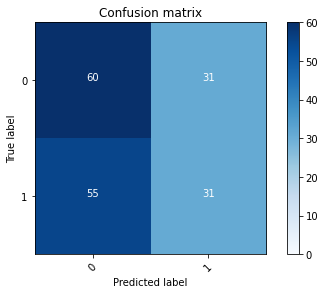

2022-08-20 18:27:44 - [Epoch Train: 6] loss: 0.6342, auc: 0.6874, acc: 0.5722, time: 50.00 s            
2022-08-20 18:27:44 - [Epoch Valid: 6] loss: 0.7392, auc: 0.4858, acc: 0.5214, time: 13.00 s
2022-08-20 18:27:44 - acc improved from 0.5175 to 0.5214. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_18-21-17/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e6-loss0.739-acc0.521-auc0.486.pth'


  6%|██▍                                      | 6/100 [06:26<1:41:00, 64.48s/it]

2022-08-20 18:27:44 - EPOCH: 7
2022-08-20 18:27:44 - Train Step 10/977, train_loss: 0.5731
2022-08-20 18:27:45 - Train Step 20/977, train_loss: 0.5901
2022-08-20 18:27:45 - Train Step 30/977, train_loss: 0.6012
2022-08-20 18:27:46 - Train Step 40/977, train_loss: 0.5605
2022-08-20 18:27:46 - Train Step 50/977, train_loss: 0.5874
2022-08-20 18:27:47 - Train Step 60/977, train_loss: 0.6019
2022-08-20 18:27:47 - Train Step 70/977, train_loss: 0.6048
2022-08-20 18:27:48 - Train Step 80/977, train_loss: 0.6013
2022-08-20 18:27:48 - Train Step 90/977, train_loss: 0.6009
2022-08-20 18:27:49 - Train Step 100/977, train_loss: 0.5879
2022-08-20 18:27:49 - Train Step 110/977, train_loss: 0.5985
2022-08-20 18:27:50 - Train Step 120/977, train_loss: 0.5961
2022-08-20 18:27:50 - Train Step 130/977, train_loss: 0.6011
2022-08-20 18:27:51 - Train Step 140/977, train_loss: 0.6013
2022-08-20 18:27:51 - Train Step 150/977, train_loss: 0.6010
2022-08-20 18:27:52 - Train Step 160/977, train_loss: 0.6050
20

2022-08-20 18:28:45 - Valid Step 185/257, valid_loss: 0.7480
2022-08-20 18:28:45 - Valid Step 190/257, valid_loss: 0.7470
2022-08-20 18:28:45 - Valid Step 195/257, valid_loss: 0.7434
2022-08-20 18:28:45 - Valid Step 200/257, valid_loss: 0.7436
2022-08-20 18:28:46 - Valid Step 205/257, valid_loss: 0.7412
2022-08-20 18:28:46 - Valid Step 210/257, valid_loss: 0.7455
2022-08-20 18:28:46 - Valid Step 215/257, valid_loss: 0.7447
2022-08-20 18:28:46 - Valid Step 220/257, valid_loss: 0.7435
2022-08-20 18:28:47 - Valid Step 225/257, valid_loss: 0.7436
2022-08-20 18:28:47 - Valid Step 230/257, valid_loss: 0.7505
2022-08-20 18:28:47 - Valid Step 235/257, valid_loss: 0.7490
2022-08-20 18:28:47 - Valid Step 240/257, valid_loss: 0.7460
2022-08-20 18:28:48 - Valid Step 245/257, valid_loss: 0.7443
2022-08-20 18:28:48 - Valid Step 250/257, valid_loss: 0.7446
2022-08-20 18:28:48 - Valid Step 255/257, valid_loss: 0.7412
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

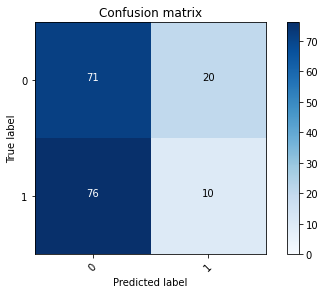

2022-08-20 18:28:49 - [Epoch Train: 7] loss: 0.6013, auc: 0.7295, acc: 0.6244, time: 51.00 s            
2022-08-20 18:28:49 - [Epoch Valid: 7] loss: 0.7414, auc: 0.4619, acc: 0.4669, time: 13.00 s


  7%|██▊                                      | 7/100 [07:31<1:40:12, 64.66s/it]

2022-08-20 18:28:49 - EPOCH: 8
2022-08-20 18:28:49 - Train Step 10/977, train_loss: 0.6417
2022-08-20 18:28:50 - Train Step 20/977, train_loss: 0.6597
2022-08-20 18:28:50 - Train Step 30/977, train_loss: 0.6216
2022-08-20 18:28:51 - Train Step 40/977, train_loss: 0.6213
2022-08-20 18:28:51 - Train Step 50/977, train_loss: 0.5829
2022-08-20 18:28:52 - Train Step 60/977, train_loss: 0.5727
2022-08-20 18:28:52 - Train Step 70/977, train_loss: 0.5972
2022-08-20 18:28:53 - Train Step 80/977, train_loss: 0.5767
2022-08-20 18:28:53 - Train Step 90/977, train_loss: 0.5676
2022-08-20 18:28:54 - Train Step 100/977, train_loss: 0.5645
2022-08-20 18:28:54 - Train Step 110/977, train_loss: 0.5747
2022-08-20 18:28:55 - Train Step 120/977, train_loss: 0.5730
2022-08-20 18:28:56 - Train Step 130/977, train_loss: 0.5726
2022-08-20 18:28:56 - Train Step 140/977, train_loss: 0.5752
2022-08-20 18:28:56 - Train Step 150/977, train_loss: 0.5753
2022-08-20 18:28:57 - Train Step 160/977, train_loss: 0.5838
20

2022-08-20 18:29:49 - Valid Step 185/257, valid_loss: 0.7676
2022-08-20 18:29:49 - Valid Step 190/257, valid_loss: 0.7666
2022-08-20 18:29:49 - Valid Step 195/257, valid_loss: 0.7619
2022-08-20 18:29:50 - Valid Step 200/257, valid_loss: 0.7608
2022-08-20 18:29:50 - Valid Step 205/257, valid_loss: 0.7607
2022-08-20 18:29:50 - Valid Step 210/257, valid_loss: 0.7585
2022-08-20 18:29:50 - Valid Step 215/257, valid_loss: 0.7605
2022-08-20 18:29:51 - Valid Step 220/257, valid_loss: 0.7640
2022-08-20 18:29:51 - Valid Step 225/257, valid_loss: 0.7556
2022-08-20 18:29:51 - Valid Step 230/257, valid_loss: 0.7540
2022-08-20 18:29:51 - Valid Step 235/257, valid_loss: 0.7544
2022-08-20 18:29:52 - Valid Step 240/257, valid_loss: 0.7543
2022-08-20 18:29:52 - Valid Step 245/257, valid_loss: 0.7507
2022-08-20 18:29:52 - Valid Step 250/257, valid_loss: 0.7510
2022-08-20 18:29:53 - Valid Step 255/257, valid_loss: 0.7513
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

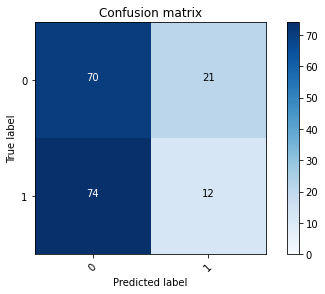

2022-08-20 18:29:53 - [Epoch Train: 8] loss: 0.5791, auc: 0.7460, acc: 0.6725, time: 50.00 s            
2022-08-20 18:29:53 - [Epoch Valid: 8] loss: 0.7499, auc: 0.4850, acc: 0.4747, time: 13.00 s


  8%|███▎                                     | 8/100 [08:35<1:38:54, 64.51s/it]

2022-08-20 18:29:53 - EPOCH: 9
2022-08-20 18:29:53 - Train Step 10/977, train_loss: 0.5071
2022-08-20 18:29:54 - Train Step 20/977, train_loss: 0.5124
2022-08-20 18:29:55 - Train Step 30/977, train_loss: 0.5424
2022-08-20 18:29:55 - Train Step 40/977, train_loss: 0.5307
2022-08-20 18:29:56 - Train Step 50/977, train_loss: 0.5360
2022-08-20 18:29:56 - Train Step 60/977, train_loss: 0.5301
2022-08-20 18:29:57 - Train Step 70/977, train_loss: 0.5230
2022-08-20 18:29:57 - Train Step 80/977, train_loss: 0.5543
2022-08-20 18:29:58 - Train Step 90/977, train_loss: 0.5395
2022-08-20 18:29:58 - Train Step 100/977, train_loss: 0.5177
2022-08-20 18:29:59 - Train Step 110/977, train_loss: 0.5222
2022-08-20 18:29:59 - Train Step 120/977, train_loss: 0.5279
2022-08-20 18:30:00 - Train Step 130/977, train_loss: 0.5283
2022-08-20 18:30:00 - Train Step 140/977, train_loss: 0.5260
2022-08-20 18:30:01 - Train Step 150/977, train_loss: 0.5318
2022-08-20 18:30:01 - Train Step 160/977, train_loss: 0.5327
20

2022-08-20 18:30:53 - Valid Step 185/257, valid_loss: 0.7317
2022-08-20 18:30:53 - Valid Step 190/257, valid_loss: 0.7322
2022-08-20 18:30:53 - Valid Step 195/257, valid_loss: 0.7362
2022-08-20 18:30:54 - Valid Step 200/257, valid_loss: 0.7335
2022-08-20 18:30:54 - Valid Step 205/257, valid_loss: 0.7414
2022-08-20 18:30:54 - Valid Step 210/257, valid_loss: 0.7466
2022-08-20 18:30:55 - Valid Step 215/257, valid_loss: 0.7439
2022-08-20 18:30:55 - Valid Step 220/257, valid_loss: 0.7444
2022-08-20 18:30:55 - Valid Step 225/257, valid_loss: 0.7477
2022-08-20 18:30:55 - Valid Step 230/257, valid_loss: 0.7469
2022-08-20 18:30:56 - Valid Step 235/257, valid_loss: 0.7458
2022-08-20 18:30:56 - Valid Step 240/257, valid_loss: 0.7471
2022-08-20 18:30:56 - Valid Step 245/257, valid_loss: 0.7534
2022-08-20 18:30:56 - Valid Step 250/257, valid_loss: 0.7507
2022-08-20 18:30:57 - Valid Step 255/257, valid_loss: 0.7556
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

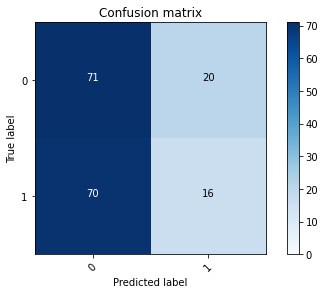

2022-08-20 18:30:57 - [Epoch Train: 9] loss: 0.5514, auc: 0.7718, acc: 0.7021, time: 50.00 s            
2022-08-20 18:30:57 - [Epoch Valid: 9] loss: 0.7535, auc: 0.4836, acc: 0.5136, time: 13.00 s


  9%|███▋                                     | 9/100 [09:39<1:37:38, 64.38s/it]

2022-08-20 18:30:57 - EPOCH: 10
2022-08-20 18:30:58 - Train Step 10/977, train_loss: 0.5528
2022-08-20 18:30:58 - Train Step 20/977, train_loss: 0.4611
2022-08-20 18:30:59 - Train Step 30/977, train_loss: 0.4958
2022-08-20 18:30:59 - Train Step 40/977, train_loss: 0.5379
2022-08-20 18:31:00 - Train Step 50/977, train_loss: 0.5520
2022-08-20 18:31:00 - Train Step 60/977, train_loss: 0.5538
2022-08-20 18:31:01 - Train Step 70/977, train_loss: 0.5597
2022-08-20 18:31:01 - Train Step 80/977, train_loss: 0.5502
2022-08-20 18:31:02 - Train Step 90/977, train_loss: 0.5412
2022-08-20 18:31:02 - Train Step 100/977, train_loss: 0.5260
2022-08-20 18:31:03 - Train Step 110/977, train_loss: 0.5208
2022-08-20 18:31:03 - Train Step 120/977, train_loss: 0.5043
2022-08-20 18:31:04 - Train Step 130/977, train_loss: 0.5175
2022-08-20 18:31:04 - Train Step 140/977, train_loss: 0.5099
2022-08-20 18:31:05 - Train Step 150/977, train_loss: 0.5021
2022-08-20 18:31:05 - Train Step 160/977, train_loss: 0.5234
2

2022-08-20 18:31:57 - Valid Step 185/257, valid_loss: 0.7774
2022-08-20 18:31:57 - Valid Step 190/257, valid_loss: 0.7730
2022-08-20 18:31:58 - Valid Step 195/257, valid_loss: 0.7855
2022-08-20 18:31:58 - Valid Step 200/257, valid_loss: 0.7848
2022-08-20 18:31:58 - Valid Step 205/257, valid_loss: 0.7823
2022-08-20 18:31:58 - Valid Step 210/257, valid_loss: 0.7833
2022-08-20 18:31:59 - Valid Step 215/257, valid_loss: 0.7801
2022-08-20 18:31:59 - Valid Step 220/257, valid_loss: 0.7783
2022-08-20 18:31:59 - Valid Step 225/257, valid_loss: 0.7741
2022-08-20 18:31:59 - Valid Step 230/257, valid_loss: 0.7823
2022-08-20 18:32:00 - Valid Step 235/257, valid_loss: 0.7792
2022-08-20 18:32:00 - Valid Step 240/257, valid_loss: 0.7786
2022-08-20 18:32:00 - Valid Step 245/257, valid_loss: 0.7760
2022-08-20 18:32:00 - Valid Step 250/257, valid_loss: 0.7685
2022-08-20 18:32:01 - Valid Step 255/257, valid_loss: 0.7646
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

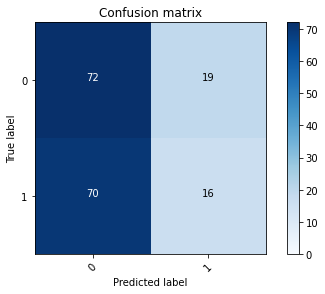

2022-08-20 18:32:01 - [Epoch Train: 10] loss: 0.5210, auc: 0.7990, acc: 0.7206, time: 50.00 s            
2022-08-20 18:32:01 - [Epoch Valid: 10] loss: 0.7675, auc: 0.5041, acc: 0.5058, time: 13.00 s


 10%|████                                    | 10/100 [10:43<1:36:27, 64.30s/it]

2022-08-20 18:32:01 - EPOCH: 11
2022-08-20 18:32:02 - Train Step 10/977, train_loss: 0.4731
2022-08-20 18:32:02 - Train Step 20/977, train_loss: 0.4093
2022-08-20 18:32:03 - Train Step 30/977, train_loss: 0.4230
2022-08-20 18:32:03 - Train Step 40/977, train_loss: 0.4378
2022-08-20 18:32:04 - Train Step 50/977, train_loss: 0.4383
2022-08-20 18:32:04 - Train Step 60/977, train_loss: 0.4434
2022-08-20 18:32:05 - Train Step 70/977, train_loss: 0.4502
2022-08-20 18:32:05 - Train Step 80/977, train_loss: 0.4460
2022-08-20 18:32:06 - Train Step 90/977, train_loss: 0.4413
2022-08-20 18:32:06 - Train Step 100/977, train_loss: 0.4359
2022-08-20 18:32:07 - Train Step 110/977, train_loss: 0.4298
2022-08-20 18:32:07 - Train Step 120/977, train_loss: 0.4452
2022-08-20 18:32:08 - Train Step 130/977, train_loss: 0.4515
2022-08-20 18:32:08 - Train Step 140/977, train_loss: 0.4494
2022-08-20 18:32:09 - Train Step 150/977, train_loss: 0.4496
2022-08-20 18:32:09 - Train Step 160/977, train_loss: 0.4453
2

2022-08-20 18:33:01 - Valid Step 185/257, valid_loss: 0.7880
2022-08-20 18:33:01 - Valid Step 190/257, valid_loss: 0.7952
2022-08-20 18:33:02 - Valid Step 195/257, valid_loss: 0.7932
2022-08-20 18:33:02 - Valid Step 200/257, valid_loss: 0.7879
2022-08-20 18:33:02 - Valid Step 205/257, valid_loss: 0.7854
2022-08-20 18:33:03 - Valid Step 210/257, valid_loss: 0.7794
2022-08-20 18:33:03 - Valid Step 215/257, valid_loss: 0.7865
2022-08-20 18:33:03 - Valid Step 220/257, valid_loss: 0.7846
2022-08-20 18:33:03 - Valid Step 225/257, valid_loss: 0.7811
2022-08-20 18:33:04 - Valid Step 230/257, valid_loss: 0.7845
2022-08-20 18:33:04 - Valid Step 235/257, valid_loss: 0.7926
2022-08-20 18:33:04 - Valid Step 240/257, valid_loss: 0.7908
2022-08-20 18:33:04 - Valid Step 245/257, valid_loss: 0.7851
2022-08-20 18:33:05 - Valid Step 250/257, valid_loss: 0.7894
2022-08-20 18:33:05 - Valid Step 255/257, valid_loss: 0.7893
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

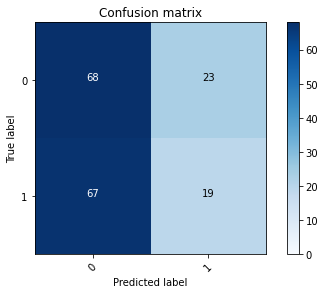

2022-08-20 18:33:05 - [Epoch Train: 11] loss: 0.4909, auc: 0.8243, acc: 0.7349, time: 50.00 s            
2022-08-20 18:33:05 - [Epoch Valid: 11] loss: 0.7906, auc: 0.5058, acc: 0.5097, time: 13.00 s


 11%|████▍                                   | 11/100 [11:48<1:35:20, 64.27s/it]

2022-08-20 18:33:05 - EPOCH: 12
2022-08-20 18:33:06 - Train Step 10/977, train_loss: 0.3681
2022-08-20 18:33:06 - Train Step 20/977, train_loss: 0.3986
2022-08-20 18:33:07 - Train Step 30/977, train_loss: 0.4038
2022-08-20 18:33:07 - Train Step 40/977, train_loss: 0.4250
2022-08-20 18:33:08 - Train Step 50/977, train_loss: 0.4577
2022-08-20 18:33:09 - Train Step 60/977, train_loss: 0.4623
2022-08-20 18:33:09 - Train Step 70/977, train_loss: 0.4885
2022-08-20 18:33:10 - Train Step 80/977, train_loss: 0.4775
2022-08-20 18:33:10 - Train Step 90/977, train_loss: 0.4924
2022-08-20 18:33:11 - Train Step 100/977, train_loss: 0.5089
2022-08-20 18:33:11 - Train Step 110/977, train_loss: 0.5054
2022-08-20 18:33:12 - Train Step 120/977, train_loss: 0.5151
2022-08-20 18:33:12 - Train Step 130/977, train_loss: 0.5169
2022-08-20 18:33:13 - Train Step 140/977, train_loss: 0.5016
2022-08-20 18:33:13 - Train Step 150/977, train_loss: 0.4959
2022-08-20 18:33:14 - Train Step 160/977, train_loss: 0.4895
2

2022-08-20 18:34:06 - Valid Step 185/257, valid_loss: 0.8435
2022-08-20 18:34:06 - Valid Step 190/257, valid_loss: 0.8441
2022-08-20 18:34:06 - Valid Step 195/257, valid_loss: 0.8374
2022-08-20 18:34:07 - Valid Step 200/257, valid_loss: 0.8405
2022-08-20 18:34:07 - Valid Step 205/257, valid_loss: 0.8300
2022-08-20 18:34:07 - Valid Step 210/257, valid_loss: 0.8181
2022-08-20 18:34:07 - Valid Step 215/257, valid_loss: 0.8049
2022-08-20 18:34:08 - Valid Step 220/257, valid_loss: 0.8115
2022-08-20 18:34:08 - Valid Step 225/257, valid_loss: 0.8119
2022-08-20 18:34:08 - Valid Step 230/257, valid_loss: 0.8141
2022-08-20 18:34:09 - Valid Step 235/257, valid_loss: 0.8165
2022-08-20 18:34:09 - Valid Step 240/257, valid_loss: 0.8139
2022-08-20 18:34:09 - Valid Step 245/257, valid_loss: 0.8137
2022-08-20 18:34:09 - Valid Step 250/257, valid_loss: 0.8093
2022-08-20 18:34:10 - Valid Step 255/257, valid_loss: 0.8045
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

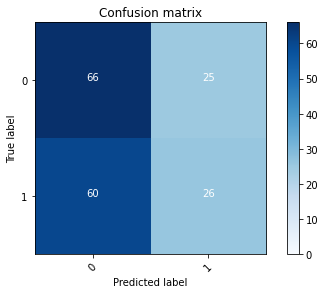

2022-08-20 18:34:10 - [Epoch Train: 12] loss: 0.4790, auc: 0.8351, acc: 0.7513, time: 50.00 s            
2022-08-20 18:34:10 - [Epoch Valid: 12] loss: 0.8022, auc: 0.5063, acc: 0.5447, time: 13.00 s
2022-08-20 18:34:10 - acc improved from 0.5214 to 0.5447. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_18-21-17/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e12-loss0.802-acc0.545-auc0.506.pth'


 12%|████▊                                   | 12/100 [12:52<1:34:24, 64.37s/it]

2022-08-20 18:34:10 - EPOCH: 13
2022-08-20 18:34:10 - Train Step 10/977, train_loss: 0.5252
2022-08-20 18:34:11 - Train Step 20/977, train_loss: 0.4381
2022-08-20 18:34:11 - Train Step 30/977, train_loss: 0.4474
2022-08-20 18:34:12 - Train Step 40/977, train_loss: 0.4620
2022-08-20 18:34:12 - Train Step 50/977, train_loss: 0.4718
2022-08-20 18:34:13 - Train Step 60/977, train_loss: 0.4683
2022-08-20 18:34:13 - Train Step 70/977, train_loss: 0.4692
2022-08-20 18:34:14 - Train Step 80/977, train_loss: 0.4917
2022-08-20 18:34:15 - Train Step 90/977, train_loss: 0.4953
2022-08-20 18:34:15 - Train Step 100/977, train_loss: 0.4950
2022-08-20 18:34:16 - Train Step 110/977, train_loss: 0.4941
2022-08-20 18:34:16 - Train Step 120/977, train_loss: 0.4848
2022-08-20 18:34:17 - Train Step 130/977, train_loss: 0.4970
2022-08-20 18:34:17 - Train Step 140/977, train_loss: 0.4916
2022-08-20 18:34:18 - Train Step 150/977, train_loss: 0.4843
2022-08-20 18:34:18 - Train Step 160/977, train_loss: 0.4851
2

2022-08-20 18:35:10 - Valid Step 185/257, valid_loss: 0.7914
2022-08-20 18:35:10 - Valid Step 190/257, valid_loss: 0.7912
2022-08-20 18:35:11 - Valid Step 195/257, valid_loss: 0.8004
2022-08-20 18:35:11 - Valid Step 200/257, valid_loss: 0.8017
2022-08-20 18:35:11 - Valid Step 205/257, valid_loss: 0.7989
2022-08-20 18:35:11 - Valid Step 210/257, valid_loss: 0.7923
2022-08-20 18:35:12 - Valid Step 215/257, valid_loss: 0.7885
2022-08-20 18:35:12 - Valid Step 220/257, valid_loss: 0.8254
2022-08-20 18:35:12 - Valid Step 225/257, valid_loss: 0.8275
2022-08-20 18:35:12 - Valid Step 230/257, valid_loss: 0.8250
2022-08-20 18:35:13 - Valid Step 235/257, valid_loss: 0.8190
2022-08-20 18:35:13 - Valid Step 240/257, valid_loss: 0.8251
2022-08-20 18:35:13 - Valid Step 245/257, valid_loss: 0.8301
2022-08-20 18:35:13 - Valid Step 250/257, valid_loss: 0.8287
2022-08-20 18:35:14 - Valid Step 255/257, valid_loss: 0.8268
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

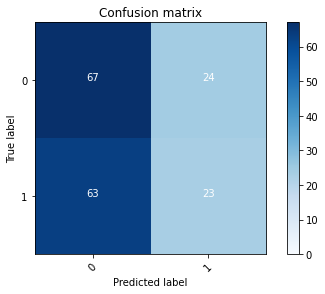

2022-08-20 18:35:14 - [Epoch Train: 13] loss: 0.4648, auc: 0.8458, acc: 0.7544, time: 50.00 s            
2022-08-20 18:35:14 - [Epoch Valid: 13] loss: 0.8308, auc: 0.5056, acc: 0.5292, time: 13.00 s


 13%|█████▏                                  | 13/100 [13:56<1:33:15, 64.32s/it]

2022-08-20 18:35:14 - EPOCH: 14
2022-08-20 18:35:15 - Train Step 10/977, train_loss: 0.5841
2022-08-20 18:35:15 - Train Step 20/977, train_loss: 0.4842
2022-08-20 18:35:16 - Train Step 30/977, train_loss: 0.5236
2022-08-20 18:35:16 - Train Step 40/977, train_loss: 0.4889
2022-08-20 18:35:17 - Train Step 50/977, train_loss: 0.4879
2022-08-20 18:35:17 - Train Step 60/977, train_loss: 0.4522
2022-08-20 18:35:18 - Train Step 70/977, train_loss: 0.4688
2022-08-20 18:35:18 - Train Step 80/977, train_loss: 0.4890
2022-08-20 18:35:19 - Train Step 90/977, train_loss: 0.4759
2022-08-20 18:35:19 - Train Step 100/977, train_loss: 0.4809
2022-08-20 18:35:20 - Train Step 110/977, train_loss: 0.4871
2022-08-20 18:35:20 - Train Step 120/977, train_loss: 0.4837
2022-08-20 18:35:21 - Train Step 130/977, train_loss: 0.4814
2022-08-20 18:35:21 - Train Step 140/977, train_loss: 0.4833
2022-08-20 18:35:22 - Train Step 150/977, train_loss: 0.4817
2022-08-20 18:35:22 - Train Step 160/977, train_loss: 0.4788
2

2022-08-20 18:36:15 - Valid Step 185/257, valid_loss: 0.8164
2022-08-20 18:36:15 - Valid Step 190/257, valid_loss: 0.8236
2022-08-20 18:36:15 - Valid Step 195/257, valid_loss: 0.8219
2022-08-20 18:36:15 - Valid Step 200/257, valid_loss: 0.8268
2022-08-20 18:36:16 - Valid Step 205/257, valid_loss: 0.8323
2022-08-20 18:36:16 - Valid Step 210/257, valid_loss: 0.8516
2022-08-20 18:36:16 - Valid Step 215/257, valid_loss: 0.8507
2022-08-20 18:36:16 - Valid Step 220/257, valid_loss: 0.8453
2022-08-20 18:36:17 - Valid Step 225/257, valid_loss: 0.8435
2022-08-20 18:36:17 - Valid Step 230/257, valid_loss: 0.8342
2022-08-20 18:36:17 - Valid Step 235/257, valid_loss: 0.8348
2022-08-20 18:36:18 - Valid Step 240/257, valid_loss: 0.8307
2022-08-20 18:36:18 - Valid Step 245/257, valid_loss: 0.8348
2022-08-20 18:36:18 - Valid Step 250/257, valid_loss: 0.8288
2022-08-20 18:36:18 - Valid Step 255/257, valid_loss: 0.8222
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

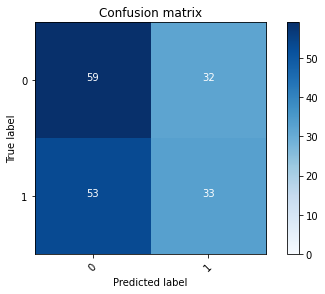

2022-08-20 18:36:19 - [Epoch Train: 14] loss: 0.4491, auc: 0.8553, acc: 0.7810, time: 50.00 s            
2022-08-20 18:36:19 - [Epoch Valid: 14] loss: 0.8207, auc: 0.5028, acc: 0.5292, time: 13.00 s


 14%|█████▌                                  | 14/100 [15:01<1:32:22, 64.45s/it]

2022-08-20 18:36:19 - EPOCH: 15
2022-08-20 18:36:19 - Train Step 10/977, train_loss: 0.5389
2022-08-20 18:36:20 - Train Step 20/977, train_loss: 0.5018
2022-08-20 18:36:20 - Train Step 30/977, train_loss: 0.4324
2022-08-20 18:36:21 - Train Step 40/977, train_loss: 0.4393
2022-08-20 18:36:22 - Train Step 50/977, train_loss: 0.4406
2022-08-20 18:36:22 - Train Step 60/977, train_loss: 0.4262
2022-08-20 18:36:23 - Train Step 70/977, train_loss: 0.4083
2022-08-20 18:36:23 - Train Step 80/977, train_loss: 0.4046
2022-08-20 18:36:24 - Train Step 90/977, train_loss: 0.3956
2022-08-20 18:36:24 - Train Step 100/977, train_loss: 0.4007
2022-08-20 18:36:25 - Train Step 110/977, train_loss: 0.4097
2022-08-20 18:36:25 - Train Step 120/977, train_loss: 0.4017
2022-08-20 18:36:26 - Train Step 130/977, train_loss: 0.3898
2022-08-20 18:36:26 - Train Step 140/977, train_loss: 0.3922
2022-08-20 18:36:27 - Train Step 150/977, train_loss: 0.3917
2022-08-20 18:36:27 - Train Step 160/977, train_loss: 0.4044
2

2022-08-20 18:37:19 - Valid Step 185/257, valid_loss: 0.7664
2022-08-20 18:37:20 - Valid Step 190/257, valid_loss: 0.7656
2022-08-20 18:37:20 - Valid Step 195/257, valid_loss: 0.7669
2022-08-20 18:37:20 - Valid Step 200/257, valid_loss: 0.7736
2022-08-20 18:37:20 - Valid Step 205/257, valid_loss: 0.7740
2022-08-20 18:37:21 - Valid Step 210/257, valid_loss: 0.7929
2022-08-20 18:37:21 - Valid Step 215/257, valid_loss: 0.7924
2022-08-20 18:37:21 - Valid Step 220/257, valid_loss: 0.7966
2022-08-20 18:37:21 - Valid Step 225/257, valid_loss: 0.8001
2022-08-20 18:37:22 - Valid Step 230/257, valid_loss: 0.7961
2022-08-20 18:37:22 - Valid Step 235/257, valid_loss: 0.7983
2022-08-20 18:37:22 - Valid Step 240/257, valid_loss: 0.7969
2022-08-20 18:37:23 - Valid Step 245/257, valid_loss: 0.8087
2022-08-20 18:37:23 - Valid Step 250/257, valid_loss: 0.8062
2022-08-20 18:37:23 - Valid Step 255/257, valid_loss: 0.8111
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

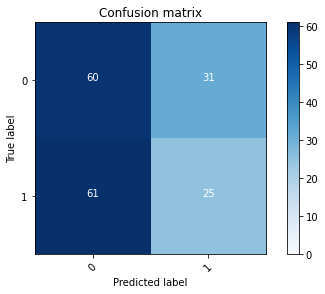

2022-08-20 18:37:23 - [Epoch Train: 15] loss: 0.4314, auc: 0.8694, acc: 0.7912, time: 50.00 s            
2022-08-20 18:37:23 - [Epoch Valid: 15] loss: 0.8107, auc: 0.5045, acc: 0.4981, time: 13.00 s


 15%|██████                                  | 15/100 [16:06<1:31:20, 64.48s/it]

2022-08-20 18:37:23 - EPOCH: 16
2022-08-20 18:37:24 - Train Step 10/977, train_loss: 0.2621
2022-08-20 18:37:24 - Train Step 20/977, train_loss: 0.3121
2022-08-20 18:37:25 - Train Step 30/977, train_loss: 0.3359
2022-08-20 18:37:26 - Train Step 40/977, train_loss: 0.4025
2022-08-20 18:37:26 - Train Step 50/977, train_loss: 0.3990
2022-08-20 18:37:27 - Train Step 60/977, train_loss: 0.3973
2022-08-20 18:37:27 - Train Step 70/977, train_loss: 0.4024
2022-08-20 18:37:28 - Train Step 80/977, train_loss: 0.4332
2022-08-20 18:37:28 - Train Step 90/977, train_loss: 0.4343
2022-08-20 18:37:29 - Train Step 100/977, train_loss: 0.4215
2022-08-20 18:37:29 - Train Step 110/977, train_loss: 0.4234
2022-08-20 18:37:30 - Train Step 120/977, train_loss: 0.4242
2022-08-20 18:37:30 - Train Step 130/977, train_loss: 0.4202
2022-08-20 18:37:31 - Train Step 140/977, train_loss: 0.4379
2022-08-20 18:37:31 - Train Step 150/977, train_loss: 0.4375
2022-08-20 18:37:32 - Train Step 160/977, train_loss: 0.4330
2

2022-08-20 18:38:24 - Valid Step 185/257, valid_loss: 0.7843
2022-08-20 18:38:24 - Valid Step 190/257, valid_loss: 0.7769
2022-08-20 18:38:25 - Valid Step 195/257, valid_loss: 0.7846
2022-08-20 18:38:25 - Valid Step 200/257, valid_loss: 0.7820
2022-08-20 18:38:25 - Valid Step 205/257, valid_loss: 0.7711
2022-08-20 18:38:25 - Valid Step 210/257, valid_loss: 0.7871
2022-08-20 18:38:26 - Valid Step 215/257, valid_loss: 0.7922
2022-08-20 18:38:26 - Valid Step 220/257, valid_loss: 0.7925
2022-08-20 18:38:26 - Valid Step 225/257, valid_loss: 0.7855
2022-08-20 18:38:26 - Valid Step 230/257, valid_loss: 0.7887
2022-08-20 18:38:27 - Valid Step 235/257, valid_loss: 0.8030
2022-08-20 18:38:27 - Valid Step 240/257, valid_loss: 0.8059
2022-08-20 18:38:27 - Valid Step 245/257, valid_loss: 0.8148
2022-08-20 18:38:28 - Valid Step 250/257, valid_loss: 0.8272
2022-08-20 18:38:28 - Valid Step 255/257, valid_loss: 0.8328
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

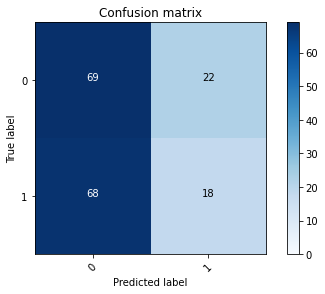

2022-08-20 18:38:28 - [Epoch Train: 16] loss: 0.4240, auc: 0.8722, acc: 0.7881, time: 51.00 s            
2022-08-20 18:38:28 - [Epoch Valid: 16] loss: 0.8385, auc: 0.5051, acc: 0.5136, time: 13.00 s


 16%|██████▍                                 | 16/100 [17:10<1:30:24, 64.58s/it]

2022-08-20 18:38:28 - EPOCH: 17
2022-08-20 18:38:29 - Train Step 10/977, train_loss: 0.3894
2022-08-20 18:38:29 - Train Step 20/977, train_loss: 0.2748
2022-08-20 18:38:30 - Train Step 30/977, train_loss: 0.3073
2022-08-20 18:38:30 - Train Step 40/977, train_loss: 0.2888
2022-08-20 18:38:31 - Train Step 50/977, train_loss: 0.3338
2022-08-20 18:38:31 - Train Step 60/977, train_loss: 0.3343
2022-08-20 18:38:32 - Train Step 70/977, train_loss: 0.3432
2022-08-20 18:38:32 - Train Step 80/977, train_loss: 0.3616
2022-08-20 18:38:33 - Train Step 90/977, train_loss: 0.3690
2022-08-20 18:38:33 - Train Step 100/977, train_loss: 0.3779
2022-08-20 18:38:34 - Train Step 110/977, train_loss: 0.3813
2022-08-20 18:38:35 - Train Step 120/977, train_loss: 0.4070
2022-08-20 18:38:35 - Train Step 130/977, train_loss: 0.3965
2022-08-20 18:38:36 - Train Step 140/977, train_loss: 0.3873
2022-08-20 18:38:36 - Train Step 150/977, train_loss: 0.3806
2022-08-20 18:38:37 - Train Step 160/977, train_loss: 0.3799
2

2022-08-20 18:39:29 - Valid Step 185/257, valid_loss: 0.8912
2022-08-20 18:39:30 - Valid Step 190/257, valid_loss: 0.8803
2022-08-20 18:39:30 - Valid Step 195/257, valid_loss: 0.8992
2022-08-20 18:39:30 - Valid Step 200/257, valid_loss: 0.8840
2022-08-20 18:39:31 - Valid Step 205/257, valid_loss: 0.8784
2022-08-20 18:39:31 - Valid Step 210/257, valid_loss: 0.8696
2022-08-20 18:39:31 - Valid Step 215/257, valid_loss: 0.8623
2022-08-20 18:39:31 - Valid Step 220/257, valid_loss: 0.8822
2022-08-20 18:39:32 - Valid Step 225/257, valid_loss: 0.8740
2022-08-20 18:39:32 - Valid Step 230/257, valid_loss: 0.8697
2022-08-20 18:39:32 - Valid Step 235/257, valid_loss: 0.8694
2022-08-20 18:39:32 - Valid Step 240/257, valid_loss: 0.8700
2022-08-20 18:39:33 - Valid Step 245/257, valid_loss: 0.8821
2022-08-20 18:39:33 - Valid Step 250/257, valid_loss: 0.8753
2022-08-20 18:39:33 - Valid Step 255/257, valid_loss: 0.8742
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

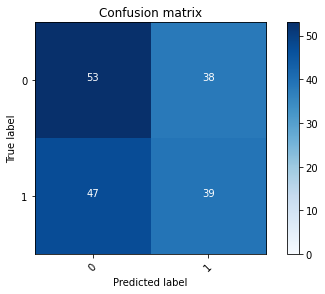

2022-08-20 18:39:33 - [Epoch Train: 17] loss: 0.3954, auc: 0.8863, acc: 0.8014, time: 51.00 s            
2022-08-20 18:39:33 - [Epoch Valid: 17] loss: 0.8799, auc: 0.5050, acc: 0.5292, time: 13.00 s


 17%|██████▊                                 | 17/100 [18:16<1:29:34, 64.76s/it]

2022-08-20 18:39:33 - EPOCH: 18
2022-08-20 18:39:34 - Train Step 10/977, train_loss: 0.3163
2022-08-20 18:39:34 - Train Step 20/977, train_loss: 0.3287
2022-08-20 18:39:35 - Train Step 30/977, train_loss: 0.3242
2022-08-20 18:39:35 - Train Step 40/977, train_loss: 0.3720
2022-08-20 18:39:36 - Train Step 50/977, train_loss: 0.3803
2022-08-20 18:39:37 - Train Step 60/977, train_loss: 0.3948
2022-08-20 18:39:37 - Train Step 70/977, train_loss: 0.3837
2022-08-20 18:39:37 - Train Step 80/977, train_loss: 0.4112
2022-08-20 18:39:38 - Train Step 90/977, train_loss: 0.4212
2022-08-20 18:39:39 - Train Step 100/977, train_loss: 0.4216
2022-08-20 18:39:39 - Train Step 110/977, train_loss: 0.4101
2022-08-20 18:39:40 - Train Step 120/977, train_loss: 0.4186
2022-08-20 18:39:40 - Train Step 130/977, train_loss: 0.4222
2022-08-20 18:39:41 - Train Step 140/977, train_loss: 0.4204
2022-08-20 18:39:41 - Train Step 150/977, train_loss: 0.4153
2022-08-20 18:39:42 - Train Step 160/977, train_loss: 0.4267
2

2022-08-20 18:40:34 - Valid Step 185/257, valid_loss: 0.8624
2022-08-20 18:40:34 - Valid Step 190/257, valid_loss: 0.8523
2022-08-20 18:40:34 - Valid Step 195/257, valid_loss: 0.8568
2022-08-20 18:40:34 - Valid Step 200/257, valid_loss: 0.8491
2022-08-20 18:40:35 - Valid Step 205/257, valid_loss: 0.8501
2022-08-20 18:40:35 - Valid Step 210/257, valid_loss: 0.8447
2022-08-20 18:40:35 - Valid Step 215/257, valid_loss: 0.8392
2022-08-20 18:40:35 - Valid Step 220/257, valid_loss: 0.8355
2022-08-20 18:40:36 - Valid Step 225/257, valid_loss: 0.8418
2022-08-20 18:40:36 - Valid Step 230/257, valid_loss: 0.8513
2022-08-20 18:40:36 - Valid Step 235/257, valid_loss: 0.8463
2022-08-20 18:40:36 - Valid Step 240/257, valid_loss: 0.8446
2022-08-20 18:40:37 - Valid Step 245/257, valid_loss: 0.8507
2022-08-20 18:40:37 - Valid Step 250/257, valid_loss: 0.8417
2022-08-20 18:40:37 - Valid Step 255/257, valid_loss: 0.8441
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

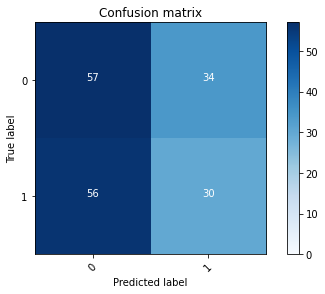

2022-08-20 18:40:37 - [Epoch Train: 18] loss: 0.3974, auc: 0.8837, acc: 0.8045, time: 50.00 s            
2022-08-20 18:40:37 - [Epoch Valid: 18] loss: 0.8485, auc: 0.5047, acc: 0.5136, time: 13.00 s


 18%|███████▏                                | 18/100 [19:20<1:28:13, 64.56s/it]

2022-08-20 18:40:37 - EPOCH: 19
2022-08-20 18:40:38 - Train Step 10/977, train_loss: 0.3206
2022-08-20 18:40:39 - Train Step 20/977, train_loss: 0.5056
2022-08-20 18:40:39 - Train Step 30/977, train_loss: 0.4948
2022-08-20 18:40:40 - Train Step 40/977, train_loss: 0.5021
2022-08-20 18:40:40 - Train Step 50/977, train_loss: 0.4906
2022-08-20 18:40:41 - Train Step 60/977, train_loss: 0.4454
2022-08-20 18:40:41 - Train Step 70/977, train_loss: 0.4480
2022-08-20 18:40:42 - Train Step 80/977, train_loss: 0.4261
2022-08-20 18:40:42 - Train Step 90/977, train_loss: 0.4145
2022-08-20 18:40:43 - Train Step 100/977, train_loss: 0.3899
2022-08-20 18:40:43 - Train Step 110/977, train_loss: 0.3752
2022-08-20 18:40:44 - Train Step 120/977, train_loss: 0.3872
2022-08-20 18:40:44 - Train Step 130/977, train_loss: 0.3814
2022-08-20 18:40:45 - Train Step 140/977, train_loss: 0.3730
2022-08-20 18:40:45 - Train Step 150/977, train_loss: 0.3724
2022-08-20 18:40:46 - Train Step 160/977, train_loss: 0.3700
2

2022-08-20 18:41:38 - Valid Step 185/257, valid_loss: 0.9078
2022-08-20 18:41:38 - Valid Step 190/257, valid_loss: 0.9080
2022-08-20 18:41:38 - Valid Step 195/257, valid_loss: 0.9219
2022-08-20 18:41:38 - Valid Step 200/257, valid_loss: 0.9239
2022-08-20 18:41:39 - Valid Step 205/257, valid_loss: 0.9159
2022-08-20 18:41:39 - Valid Step 210/257, valid_loss: 0.9128
2022-08-20 18:41:39 - Valid Step 215/257, valid_loss: 0.9081
2022-08-20 18:41:39 - Valid Step 220/257, valid_loss: 0.8987
2022-08-20 18:41:40 - Valid Step 225/257, valid_loss: 0.9175
2022-08-20 18:41:40 - Valid Step 230/257, valid_loss: 0.9097
2022-08-20 18:41:40 - Valid Step 235/257, valid_loss: 0.9105
2022-08-20 18:41:40 - Valid Step 240/257, valid_loss: 0.9098
2022-08-20 18:41:41 - Valid Step 245/257, valid_loss: 0.9076
2022-08-20 18:41:41 - Valid Step 250/257, valid_loss: 0.9038
2022-08-20 18:41:41 - Valid Step 255/257, valid_loss: 0.8932
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

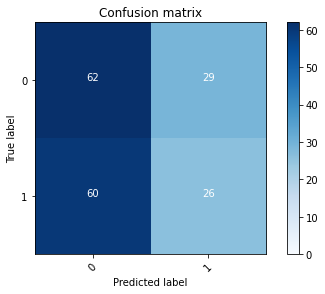

2022-08-20 18:41:41 - [Epoch Train: 19] loss: 0.3753, auc: 0.9020, acc: 0.8280, time: 50.00 s            
2022-08-20 18:41:41 - [Epoch Valid: 19] loss: 0.8941, auc: 0.5008, acc: 0.5214, time: 13.00 s


 19%|███████▌                                | 19/100 [20:24<1:26:54, 64.38s/it]

2022-08-20 18:41:41 - EPOCH: 20
2022-08-20 18:41:42 - Train Step 10/977, train_loss: 0.3388
2022-08-20 18:41:42 - Train Step 20/977, train_loss: 0.4374
2022-08-20 18:41:43 - Train Step 30/977, train_loss: 0.4109
2022-08-20 18:41:44 - Train Step 40/977, train_loss: 0.3909
2022-08-20 18:41:44 - Train Step 50/977, train_loss: 0.3800
2022-08-20 18:41:45 - Train Step 60/977, train_loss: 0.3624
2022-08-20 18:41:45 - Train Step 70/977, train_loss: 0.3781
2022-08-20 18:41:46 - Train Step 80/977, train_loss: 0.3613
2022-08-20 18:41:46 - Train Step 90/977, train_loss: 0.3454
2022-08-20 18:41:47 - Train Step 100/977, train_loss: 0.3313
2022-08-20 18:41:47 - Train Step 110/977, train_loss: 0.3256
2022-08-20 18:41:48 - Train Step 120/977, train_loss: 0.3295
2022-08-20 18:41:48 - Train Step 130/977, train_loss: 0.3280
2022-08-20 18:41:49 - Train Step 140/977, train_loss: 0.3243
2022-08-20 18:41:49 - Train Step 150/977, train_loss: 0.3168
2022-08-20 18:41:50 - Train Step 160/977, train_loss: 0.3096
2

2022-08-20 18:42:42 - Valid Step 185/257, valid_loss: 0.9427
2022-08-20 18:42:42 - Valid Step 190/257, valid_loss: 0.9355
2022-08-20 18:42:42 - Valid Step 195/257, valid_loss: 0.9233
2022-08-20 18:42:43 - Valid Step 200/257, valid_loss: 0.9348
2022-08-20 18:42:43 - Valid Step 205/257, valid_loss: 0.9475
2022-08-20 18:42:43 - Valid Step 210/257, valid_loss: 0.9431
2022-08-20 18:42:43 - Valid Step 215/257, valid_loss: 0.9442
2022-08-20 18:42:44 - Valid Step 220/257, valid_loss: 0.9364
2022-08-20 18:42:44 - Valid Step 225/257, valid_loss: 0.9290
2022-08-20 18:42:44 - Valid Step 230/257, valid_loss: 0.9307
2022-08-20 18:42:45 - Valid Step 235/257, valid_loss: 0.9485
2022-08-20 18:42:45 - Valid Step 240/257, valid_loss: 0.9358
2022-08-20 18:42:45 - Valid Step 245/257, valid_loss: 0.9523
2022-08-20 18:42:45 - Valid Step 250/257, valid_loss: 0.9690
2022-08-20 18:42:46 - Valid Step 255/257, valid_loss: 0.9611
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

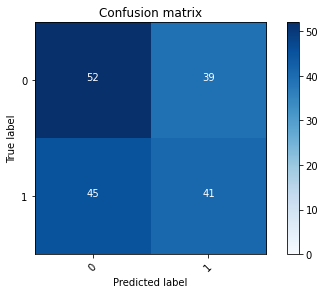

2022-08-20 18:42:46 - [Epoch Train: 20] loss: 0.3630, auc: 0.9054, acc: 0.8332, time: 50.00 s            
2022-08-20 18:42:46 - [Epoch Valid: 20] loss: 0.9581, auc: 0.5023, acc: 0.5409, time: 13.00 s


 20%|████████                                | 20/100 [21:28<1:25:53, 64.41s/it]

2022-08-20 18:42:46 - EPOCH: 21
2022-08-20 18:42:47 - Train Step 10/977, train_loss: 0.3062
2022-08-20 18:42:47 - Train Step 20/977, train_loss: 0.2950
2022-08-20 18:42:48 - Train Step 30/977, train_loss: 0.3674
2022-08-20 18:42:48 - Train Step 40/977, train_loss: 0.3422
2022-08-20 18:42:49 - Train Step 50/977, train_loss: 0.3150
2022-08-20 18:42:49 - Train Step 60/977, train_loss: 0.3045
2022-08-20 18:42:50 - Train Step 70/977, train_loss: 0.2999
2022-08-20 18:42:50 - Train Step 80/977, train_loss: 0.2807
2022-08-20 18:42:51 - Train Step 90/977, train_loss: 0.2823
2022-08-20 18:42:51 - Train Step 100/977, train_loss: 0.2789
2022-08-20 18:42:52 - Train Step 110/977, train_loss: 0.2859
2022-08-20 18:42:52 - Train Step 120/977, train_loss: 0.2788
2022-08-20 18:42:53 - Train Step 130/977, train_loss: 0.2815
2022-08-20 18:42:53 - Train Step 140/977, train_loss: 0.2874
2022-08-20 18:42:54 - Train Step 150/977, train_loss: 0.2888
2022-08-20 18:42:54 - Train Step 160/977, train_loss: 0.3003
2

2022-08-20 18:43:46 - Valid Step 185/257, valid_loss: 0.8843
2022-08-20 18:43:46 - Valid Step 190/257, valid_loss: 0.8818
2022-08-20 18:43:46 - Valid Step 195/257, valid_loss: 0.8967
2022-08-20 18:43:47 - Valid Step 200/257, valid_loss: 0.9201
2022-08-20 18:43:47 - Valid Step 205/257, valid_loss: 0.9192
2022-08-20 18:43:47 - Valid Step 210/257, valid_loss: 0.9105
2022-08-20 18:43:47 - Valid Step 215/257, valid_loss: 0.9113
2022-08-20 18:43:48 - Valid Step 220/257, valid_loss: 0.9221
2022-08-20 18:43:48 - Valid Step 225/257, valid_loss: 0.9151
2022-08-20 18:43:48 - Valid Step 230/257, valid_loss: 0.9134
2022-08-20 18:43:49 - Valid Step 235/257, valid_loss: 0.9259
2022-08-20 18:43:49 - Valid Step 240/257, valid_loss: 0.9135
2022-08-20 18:43:49 - Valid Step 245/257, valid_loss: 0.9043
2022-08-20 18:43:49 - Valid Step 250/257, valid_loss: 0.9008
2022-08-20 18:43:50 - Valid Step 255/257, valid_loss: 0.9055
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

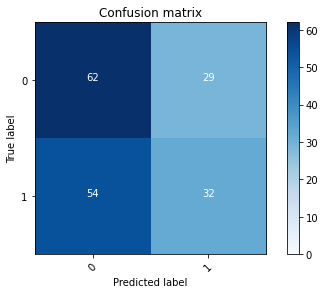

2022-08-20 18:43:50 - [Epoch Train: 21] loss: 0.3452, auc: 0.9147, acc: 0.8495, time: 50.00 s            
2022-08-20 18:43:50 - [Epoch Valid: 21] loss: 0.9078, auc: 0.5123, acc: 0.5447, time: 13.00 s
2022-08-20 18:43:50 - acc improved from 0.5447 to 0.5447. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_18-21-17/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e21-loss0.908-acc0.545-auc0.512.pth'


 21%|████████▍                               | 21/100 [22:32<1:24:39, 64.29s/it]

2022-08-20 18:43:50 - EPOCH: 22
2022-08-20 18:43:51 - Train Step 10/977, train_loss: 0.3090
2022-08-20 18:43:51 - Train Step 20/977, train_loss: 0.2899
2022-08-20 18:43:52 - Train Step 30/977, train_loss: 0.3161
2022-08-20 18:43:52 - Train Step 40/977, train_loss: 0.2833
2022-08-20 18:43:53 - Train Step 50/977, train_loss: 0.2989
2022-08-20 18:43:53 - Train Step 60/977, train_loss: 0.2811
2022-08-20 18:43:54 - Train Step 70/977, train_loss: 0.2816
2022-08-20 18:43:54 - Train Step 80/977, train_loss: 0.2951
2022-08-20 18:43:55 - Train Step 90/977, train_loss: 0.2861
2022-08-20 18:43:55 - Train Step 100/977, train_loss: 0.2897
2022-08-20 18:43:56 - Train Step 110/977, train_loss: 0.2969
2022-08-20 18:43:56 - Train Step 120/977, train_loss: 0.3041
2022-08-20 18:43:57 - Train Step 130/977, train_loss: 0.3159
2022-08-20 18:43:57 - Train Step 140/977, train_loss: 0.3140
2022-08-20 18:43:58 - Train Step 150/977, train_loss: 0.3113
2022-08-20 18:43:58 - Train Step 160/977, train_loss: 0.3279
2

2022-08-20 18:44:50 - Valid Step 185/257, valid_loss: 0.9869
2022-08-20 18:44:51 - Valid Step 190/257, valid_loss: 0.9889
2022-08-20 18:44:51 - Valid Step 195/257, valid_loss: 0.9979
2022-08-20 18:44:51 - Valid Step 200/257, valid_loss: 0.9842
2022-08-20 18:44:51 - Valid Step 205/257, valid_loss: 0.9798
2022-08-20 18:44:52 - Valid Step 210/257, valid_loss: 0.9651
2022-08-20 18:44:52 - Valid Step 215/257, valid_loss: 0.9594
2022-08-20 18:44:52 - Valid Step 220/257, valid_loss: 0.9696
2022-08-20 18:44:52 - Valid Step 225/257, valid_loss: 0.9697
2022-08-20 18:44:53 - Valid Step 230/257, valid_loss: 0.9540
2022-08-20 18:44:53 - Valid Step 235/257, valid_loss: 0.9552
2022-08-20 18:44:53 - Valid Step 240/257, valid_loss: 0.9606
2022-08-20 18:44:53 - Valid Step 245/257, valid_loss: 0.9510
2022-08-20 18:44:54 - Valid Step 250/257, valid_loss: 0.9524
2022-08-20 18:44:54 - Valid Step 255/257, valid_loss: 0.9457
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

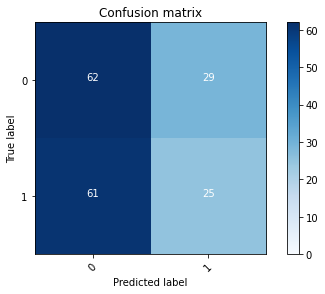

2022-08-20 18:44:54 - [Epoch Train: 22] loss: 0.3355, auc: 0.9197, acc: 0.8567, time: 50.00 s            
2022-08-20 18:44:54 - [Epoch Valid: 22] loss: 0.9483, auc: 0.5128, acc: 0.5097, time: 13.00 s


 22%|████████▊                               | 22/100 [23:36<1:23:34, 64.29s/it]

2022-08-20 18:44:54 - EPOCH: 23
2022-08-20 18:44:55 - Train Step 10/977, train_loss: 0.3341
2022-08-20 18:44:55 - Train Step 20/977, train_loss: 0.3299
2022-08-20 18:44:56 - Train Step 30/977, train_loss: 0.3844
2022-08-20 18:44:56 - Train Step 40/977, train_loss: 0.3216
2022-08-20 18:44:57 - Train Step 50/977, train_loss: 0.3239
2022-08-20 18:44:57 - Train Step 60/977, train_loss: 0.3056
2022-08-20 18:44:58 - Train Step 70/977, train_loss: 0.3264
2022-08-20 18:44:59 - Train Step 80/977, train_loss: 0.3186
2022-08-20 18:44:59 - Train Step 90/977, train_loss: 0.3128
2022-08-20 18:45:00 - Train Step 100/977, train_loss: 0.3356
2022-08-20 18:45:00 - Train Step 110/977, train_loss: 0.3494
2022-08-20 18:45:01 - Train Step 120/977, train_loss: 0.3462
2022-08-20 18:45:01 - Train Step 130/977, train_loss: 0.3481
2022-08-20 18:45:02 - Train Step 140/977, train_loss: 0.3408
2022-08-20 18:45:02 - Train Step 150/977, train_loss: 0.3375
2022-08-20 18:45:03 - Train Step 160/977, train_loss: 0.3370
2

2022-08-20 18:45:55 - Valid Step 185/257, valid_loss: 0.9325
2022-08-20 18:45:55 - Valid Step 190/257, valid_loss: 0.9272
2022-08-20 18:45:55 - Valid Step 195/257, valid_loss: 0.9305
2022-08-20 18:45:56 - Valid Step 200/257, valid_loss: 0.9181
2022-08-20 18:45:56 - Valid Step 205/257, valid_loss: 0.9114
2022-08-20 18:45:56 - Valid Step 210/257, valid_loss: 0.9065
2022-08-20 18:45:56 - Valid Step 215/257, valid_loss: 0.8907
2022-08-20 18:45:57 - Valid Step 220/257, valid_loss: 0.9000
2022-08-20 18:45:57 - Valid Step 225/257, valid_loss: 0.9047
2022-08-20 18:45:57 - Valid Step 230/257, valid_loss: 0.8975
2022-08-20 18:45:57 - Valid Step 235/257, valid_loss: 0.9012
2022-08-20 18:45:58 - Valid Step 240/257, valid_loss: 0.9021
2022-08-20 18:45:58 - Valid Step 245/257, valid_loss: 0.9100
2022-08-20 18:45:58 - Valid Step 250/257, valid_loss: 0.9306
2022-08-20 18:45:58 - Valid Step 255/257, valid_loss: 0.9295
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

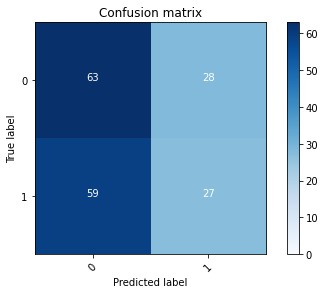

2022-08-20 18:45:59 - [Epoch Train: 23] loss: 0.3236, auc: 0.9250, acc: 0.8577, time: 51.00 s            
2022-08-20 18:45:59 - [Epoch Valid: 23] loss: 0.9289, auc: 0.5020, acc: 0.5214, time: 13.00 s


 23%|█████████▏                              | 23/100 [24:41<1:22:34, 64.34s/it]

2022-08-20 18:45:59 - EPOCH: 24
2022-08-20 18:45:59 - Train Step 10/977, train_loss: 0.4540
2022-08-20 18:46:00 - Train Step 20/977, train_loss: 0.3695
2022-08-20 18:46:00 - Train Step 30/977, train_loss: 0.3170
2022-08-20 18:46:01 - Train Step 40/977, train_loss: 0.3163
2022-08-20 18:46:01 - Train Step 50/977, train_loss: 0.2870
2022-08-20 18:46:02 - Train Step 60/977, train_loss: 0.2646
2022-08-20 18:46:02 - Train Step 70/977, train_loss: 0.2654
2022-08-20 18:46:03 - Train Step 80/977, train_loss: 0.2649
2022-08-20 18:46:03 - Train Step 90/977, train_loss: 0.2728
2022-08-20 18:46:04 - Train Step 100/977, train_loss: 0.2768
2022-08-20 18:46:04 - Train Step 110/977, train_loss: 0.2769
2022-08-20 18:46:05 - Train Step 120/977, train_loss: 0.3031
2022-08-20 18:46:05 - Train Step 130/977, train_loss: 0.2948
2022-08-20 18:46:06 - Train Step 140/977, train_loss: 0.3045
2022-08-20 18:46:06 - Train Step 150/977, train_loss: 0.2960
2022-08-20 18:46:07 - Train Step 160/977, train_loss: 0.2935
2

2022-08-20 18:46:59 - Valid Step 185/257, valid_loss: 0.9683
2022-08-20 18:46:59 - Valid Step 190/257, valid_loss: 0.9694
2022-08-20 18:47:00 - Valid Step 195/257, valid_loss: 0.9638
2022-08-20 18:47:00 - Valid Step 200/257, valid_loss: 0.9645
2022-08-20 18:47:00 - Valid Step 205/257, valid_loss: 0.9481
2022-08-20 18:47:00 - Valid Step 210/257, valid_loss: 0.9592
2022-08-20 18:47:01 - Valid Step 215/257, valid_loss: 0.9605
2022-08-20 18:47:01 - Valid Step 220/257, valid_loss: 0.9567
2022-08-20 18:47:01 - Valid Step 225/257, valid_loss: 0.9645
2022-08-20 18:47:01 - Valid Step 230/257, valid_loss: 0.9663
2022-08-20 18:47:02 - Valid Step 235/257, valid_loss: 0.9590
2022-08-20 18:47:02 - Valid Step 240/257, valid_loss: 0.9656
2022-08-20 18:47:02 - Valid Step 245/257, valid_loss: 0.9583
2022-08-20 18:47:02 - Valid Step 250/257, valid_loss: 0.9558
2022-08-20 18:47:03 - Valid Step 255/257, valid_loss: 0.9641
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

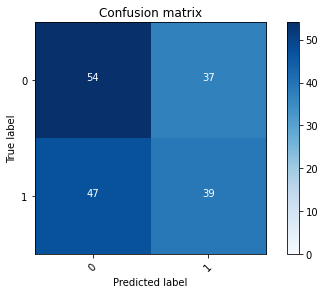

2022-08-20 18:47:03 - [Epoch Train: 24] loss: 0.3061, auc: 0.9301, acc: 0.8680, time: 50.00 s            
2022-08-20 18:47:03 - [Epoch Valid: 24] loss: 0.9712, auc: 0.5256, acc: 0.5331, time: 13.00 s


 24%|█████████▌                              | 24/100 [25:45<1:21:30, 64.34s/it]

2022-08-20 18:47:03 - EPOCH: 25
2022-08-20 18:47:04 - Train Step 10/977, train_loss: 0.3137
2022-08-20 18:47:04 - Train Step 20/977, train_loss: 0.2998
2022-08-20 18:47:05 - Train Step 30/977, train_loss: 0.3075
2022-08-20 18:47:05 - Train Step 40/977, train_loss: 0.3371
2022-08-20 18:47:06 - Train Step 50/977, train_loss: 0.3346
2022-08-20 18:47:06 - Train Step 60/977, train_loss: 0.3362
2022-08-20 18:47:07 - Train Step 70/977, train_loss: 0.3359
2022-08-20 18:47:07 - Train Step 80/977, train_loss: 0.3195
2022-08-20 18:47:08 - Train Step 90/977, train_loss: 0.3151
2022-08-20 18:47:08 - Train Step 100/977, train_loss: 0.3048
2022-08-20 18:47:09 - Train Step 110/977, train_loss: 0.2987
2022-08-20 18:47:09 - Train Step 120/977, train_loss: 0.2922
2022-08-20 18:47:10 - Train Step 130/977, train_loss: 0.2830
2022-08-20 18:47:10 - Train Step 140/977, train_loss: 0.2866
2022-08-20 18:47:11 - Train Step 150/977, train_loss: 0.2831
2022-08-20 18:47:11 - Train Step 160/977, train_loss: 0.2837
2

2022-08-20 18:48:04 - Valid Step 185/257, valid_loss: 0.9941
2022-08-20 18:48:04 - Valid Step 190/257, valid_loss: 0.9780
2022-08-20 18:48:04 - Valid Step 195/257, valid_loss: 0.9725
2022-08-20 18:48:05 - Valid Step 200/257, valid_loss: 0.9927
2022-08-20 18:48:05 - Valid Step 205/257, valid_loss: 0.9896
2022-08-20 18:48:05 - Valid Step 210/257, valid_loss: 1.0094
2022-08-20 18:48:05 - Valid Step 215/257, valid_loss: 0.9935
2022-08-20 18:48:06 - Valid Step 220/257, valid_loss: 0.9908
2022-08-20 18:48:06 - Valid Step 225/257, valid_loss: 0.9788
2022-08-20 18:48:06 - Valid Step 230/257, valid_loss: 0.9727
2022-08-20 18:48:07 - Valid Step 235/257, valid_loss: 0.9817
2022-08-20 18:48:07 - Valid Step 240/257, valid_loss: 1.0059
2022-08-20 18:48:07 - Valid Step 245/257, valid_loss: 1.0108
2022-08-20 18:48:07 - Valid Step 250/257, valid_loss: 0.9999
2022-08-20 18:48:08 - Valid Step 255/257, valid_loss: 0.9966
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

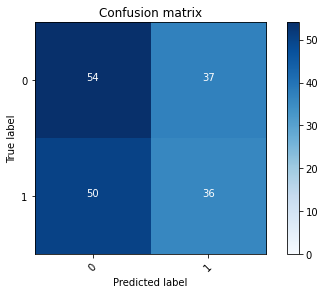

2022-08-20 18:48:08 - [Epoch Train: 25] loss: 0.2869, auc: 0.9418, acc: 0.8813, time: 51.00 s            
2022-08-20 18:48:08 - [Epoch Valid: 25] loss: 1.0098, auc: 0.4991, acc: 0.5175, time: 13.00 s


 25%|██████████                              | 25/100 [26:50<1:20:37, 64.50s/it]

2022-08-20 18:48:08 - EPOCH: 26
2022-08-20 18:48:08 - Train Step 10/977, train_loss: 0.2469
2022-08-20 18:48:09 - Train Step 20/977, train_loss: 0.2223
2022-08-20 18:48:10 - Train Step 30/977, train_loss: 0.2136
2022-08-20 18:48:10 - Train Step 40/977, train_loss: 0.2041
2022-08-20 18:48:11 - Train Step 50/977, train_loss: 0.2217
2022-08-20 18:48:11 - Train Step 60/977, train_loss: 0.2233
2022-08-20 18:48:12 - Train Step 70/977, train_loss: 0.2176
2022-08-20 18:48:12 - Train Step 80/977, train_loss: 0.2191
2022-08-20 18:48:13 - Train Step 90/977, train_loss: 0.2012
2022-08-20 18:48:13 - Train Step 100/977, train_loss: 0.2080
2022-08-20 18:48:14 - Train Step 110/977, train_loss: 0.2250
2022-08-20 18:48:14 - Train Step 120/977, train_loss: 0.2237
2022-08-20 18:48:15 - Train Step 130/977, train_loss: 0.2318
2022-08-20 18:48:15 - Train Step 140/977, train_loss: 0.2289
2022-08-20 18:48:16 - Train Step 150/977, train_loss: 0.2343
2022-08-20 18:48:16 - Train Step 160/977, train_loss: 0.2379
2

2022-08-20 18:49:09 - Valid Step 185/257, valid_loss: 1.0314
2022-08-20 18:49:09 - Valid Step 190/257, valid_loss: 1.0227
2022-08-20 18:49:09 - Valid Step 195/257, valid_loss: 1.0223
2022-08-20 18:49:09 - Valid Step 200/257, valid_loss: 1.0114
2022-08-20 18:49:10 - Valid Step 205/257, valid_loss: 1.0097
2022-08-20 18:49:10 - Valid Step 210/257, valid_loss: 1.0065
2022-08-20 18:49:10 - Valid Step 215/257, valid_loss: 1.0354
2022-08-20 18:49:10 - Valid Step 220/257, valid_loss: 1.0201
2022-08-20 18:49:11 - Valid Step 225/257, valid_loss: 1.0198
2022-08-20 18:49:11 - Valid Step 230/257, valid_loss: 1.0154
2022-08-20 18:49:11 - Valid Step 235/257, valid_loss: 1.0019
2022-08-20 18:49:12 - Valid Step 240/257, valid_loss: 1.0028
2022-08-20 18:49:12 - Valid Step 245/257, valid_loss: 0.9920
2022-08-20 18:49:12 - Valid Step 250/257, valid_loss: 0.9952
2022-08-20 18:49:12 - Valid Step 255/257, valid_loss: 0.9881
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

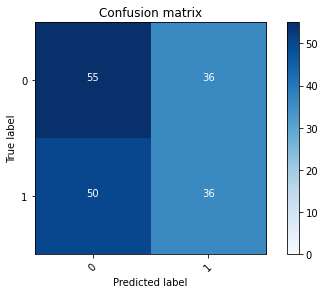

2022-08-20 18:49:12 - [Epoch Train: 26] loss: 0.2844, auc: 0.9401, acc: 0.8792, time: 51.00 s            
2022-08-20 18:49:12 - [Epoch Valid: 26] loss: 0.9841, auc: 0.5178, acc: 0.5292, time: 13.00 s


 26%|██████████▍                             | 26/100 [27:55<1:19:36, 64.55s/it]

2022-08-20 18:49:12 - EPOCH: 27
2022-08-20 18:49:13 - Train Step 10/977, train_loss: 0.2113
2022-08-20 18:49:14 - Train Step 20/977, train_loss: 0.2560
2022-08-20 18:49:14 - Train Step 30/977, train_loss: 0.2434
2022-08-20 18:49:15 - Train Step 40/977, train_loss: 0.2433
2022-08-20 18:49:15 - Train Step 50/977, train_loss: 0.2240
2022-08-20 18:49:16 - Train Step 60/977, train_loss: 0.2257
2022-08-20 18:49:16 - Train Step 70/977, train_loss: 0.2463
2022-08-20 18:49:17 - Train Step 80/977, train_loss: 0.2360
2022-08-20 18:49:17 - Train Step 90/977, train_loss: 0.2524
2022-08-20 18:49:18 - Train Step 100/977, train_loss: 0.2600
2022-08-20 18:49:18 - Train Step 110/977, train_loss: 0.2704
2022-08-20 18:49:19 - Train Step 120/977, train_loss: 0.2754
2022-08-20 18:49:19 - Train Step 130/977, train_loss: 0.2775
2022-08-20 18:49:20 - Train Step 140/977, train_loss: 0.2783
2022-08-20 18:49:20 - Train Step 150/977, train_loss: 0.2767
2022-08-20 18:49:21 - Train Step 160/977, train_loss: 0.2804
2

2022-08-20 18:50:13 - Valid Step 185/257, valid_loss: 1.0264
2022-08-20 18:50:14 - Valid Step 190/257, valid_loss: 1.0200
2022-08-20 18:50:14 - Valid Step 195/257, valid_loss: 1.0108
2022-08-20 18:50:14 - Valid Step 200/257, valid_loss: 1.0144
2022-08-20 18:50:14 - Valid Step 205/257, valid_loss: 1.0029
2022-08-20 18:50:15 - Valid Step 210/257, valid_loss: 1.0121
2022-08-20 18:50:15 - Valid Step 215/257, valid_loss: 1.0120
2022-08-20 18:50:15 - Valid Step 220/257, valid_loss: 1.0248
2022-08-20 18:50:15 - Valid Step 225/257, valid_loss: 1.0104
2022-08-20 18:50:16 - Valid Step 230/257, valid_loss: 1.0292
2022-08-20 18:50:16 - Valid Step 235/257, valid_loss: 1.0442
2022-08-20 18:50:16 - Valid Step 240/257, valid_loss: 1.0411
2022-08-20 18:50:16 - Valid Step 245/257, valid_loss: 1.0498
2022-08-20 18:50:17 - Valid Step 250/257, valid_loss: 1.0449
2022-08-20 18:50:17 - Valid Step 255/257, valid_loss: 1.0495
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

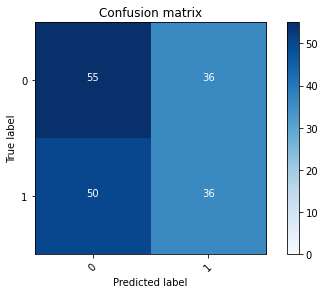

2022-08-20 18:50:17 - [Epoch Train: 27] loss: 0.2718, auc: 0.9455, acc: 0.8802, time: 50.00 s            
2022-08-20 18:50:17 - [Epoch Valid: 27] loss: 1.0476, auc: 0.5107, acc: 0.5331, time: 13.00 s


 27%|██████████▊                             | 27/100 [28:59<1:18:33, 64.57s/it]

2022-08-20 18:50:17 - EPOCH: 28
2022-08-20 18:50:18 - Train Step 10/977, train_loss: 0.3237
2022-08-20 18:50:18 - Train Step 20/977, train_loss: 0.2544
2022-08-20 18:50:19 - Train Step 30/977, train_loss: 0.2423
2022-08-20 18:50:19 - Train Step 40/977, train_loss: 0.2472
2022-08-20 18:50:20 - Train Step 50/977, train_loss: 0.2337
2022-08-20 18:50:20 - Train Step 60/977, train_loss: 0.2216
2022-08-20 18:50:21 - Train Step 70/977, train_loss: 0.2307
2022-08-20 18:50:21 - Train Step 80/977, train_loss: 0.2320
2022-08-20 18:50:22 - Train Step 90/977, train_loss: 0.2142
2022-08-20 18:50:23 - Train Step 100/977, train_loss: 0.2097
2022-08-20 18:50:23 - Train Step 110/977, train_loss: 0.2056
2022-08-20 18:50:24 - Train Step 120/977, train_loss: 0.2009
2022-08-20 18:50:24 - Train Step 130/977, train_loss: 0.2166
2022-08-20 18:50:25 - Train Step 140/977, train_loss: 0.2165
2022-08-20 18:50:25 - Train Step 150/977, train_loss: 0.2096
2022-08-20 18:50:26 - Train Step 160/977, train_loss: 0.2024
2

2022-08-20 18:51:17 - Valid Step 185/257, valid_loss: 1.1322
2022-08-20 18:51:17 - Valid Step 190/257, valid_loss: 1.1140
2022-08-20 18:51:18 - Valid Step 195/257, valid_loss: 1.1139
2022-08-20 18:51:18 - Valid Step 200/257, valid_loss: 1.0986
2022-08-20 18:51:18 - Valid Step 205/257, valid_loss: 1.0914
2022-08-20 18:51:18 - Valid Step 210/257, valid_loss: 1.0879
2022-08-20 18:51:19 - Valid Step 215/257, valid_loss: 1.0883
2022-08-20 18:51:19 - Valid Step 220/257, valid_loss: 1.0758
2022-08-20 18:51:19 - Valid Step 225/257, valid_loss: 1.0842
2022-08-20 18:51:19 - Valid Step 230/257, valid_loss: 1.0902
2022-08-20 18:51:20 - Valid Step 235/257, valid_loss: 1.0994
2022-08-20 18:51:20 - Valid Step 240/257, valid_loss: 1.1053
2022-08-20 18:51:20 - Valid Step 245/257, valid_loss: 1.1020
2022-08-20 18:51:20 - Valid Step 250/257, valid_loss: 1.0996
2022-08-20 18:51:21 - Valid Step 255/257, valid_loss: 1.1026
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

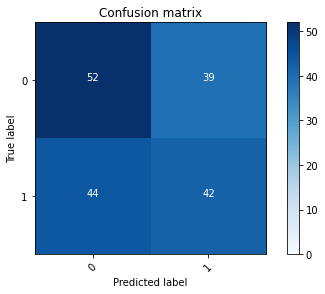

2022-08-20 18:51:21 - [Epoch Train: 28] loss: 0.2499, auc: 0.9564, acc: 0.8946, time: 50.00 s            
2022-08-20 18:51:21 - [Epoch Valid: 28] loss: 1.0969, auc: 0.5181, acc: 0.5486, time: 13.00 s
2022-08-20 18:51:21 - acc improved from 0.5447 to 0.5486. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_18-21-17/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e28-loss1.097-acc0.549-auc0.518.pth'


 28%|███████████▏                            | 28/100 [30:03<1:17:11, 64.33s/it]

2022-08-20 18:51:21 - EPOCH: 29
2022-08-20 18:51:22 - Train Step 10/977, train_loss: 0.2726
2022-08-20 18:51:22 - Train Step 20/977, train_loss: 0.2149
2022-08-20 18:51:23 - Train Step 30/977, train_loss: 0.1794
2022-08-20 18:51:23 - Train Step 40/977, train_loss: 0.2183
2022-08-20 18:51:24 - Train Step 50/977, train_loss: 0.2633
2022-08-20 18:51:24 - Train Step 60/977, train_loss: 0.2840
2022-08-20 18:51:25 - Train Step 70/977, train_loss: 0.2747
2022-08-20 18:51:25 - Train Step 80/977, train_loss: 0.2743
2022-08-20 18:51:26 - Train Step 90/977, train_loss: 0.2694
2022-08-20 18:51:26 - Train Step 100/977, train_loss: 0.2563
2022-08-20 18:51:27 - Train Step 110/977, train_loss: 0.2718
2022-08-20 18:51:27 - Train Step 120/977, train_loss: 0.2783
2022-08-20 18:51:28 - Train Step 130/977, train_loss: 0.2677
2022-08-20 18:51:28 - Train Step 140/977, train_loss: 0.2754
2022-08-20 18:51:29 - Train Step 150/977, train_loss: 0.2656
2022-08-20 18:51:29 - Train Step 160/977, train_loss: 0.2573
2

2022-08-20 18:52:22 - Valid Step 185/257, valid_loss: 1.0913
2022-08-20 18:52:22 - Valid Step 190/257, valid_loss: 1.0992
2022-08-20 18:52:23 - Valid Step 195/257, valid_loss: 1.0996
2022-08-20 18:52:23 - Valid Step 200/257, valid_loss: 1.1097
2022-08-20 18:52:23 - Valid Step 205/257, valid_loss: 1.1426
2022-08-20 18:52:23 - Valid Step 210/257, valid_loss: 1.1415
2022-08-20 18:52:24 - Valid Step 215/257, valid_loss: 1.1642
2022-08-20 18:52:24 - Valid Step 220/257, valid_loss: 1.1787
2022-08-20 18:52:24 - Valid Step 225/257, valid_loss: 1.1639
2022-08-20 18:52:24 - Valid Step 230/257, valid_loss: 1.1551
2022-08-20 18:52:25 - Valid Step 235/257, valid_loss: 1.1542
2022-08-20 18:52:25 - Valid Step 240/257, valid_loss: 1.1518
2022-08-20 18:52:25 - Valid Step 245/257, valid_loss: 1.1668
2022-08-20 18:52:25 - Valid Step 250/257, valid_loss: 1.1682
2022-08-20 18:52:26 - Valid Step 255/257, valid_loss: 1.1535
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

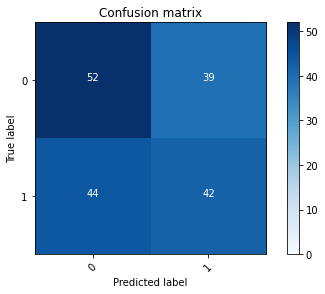

2022-08-20 18:52:26 - [Epoch Train: 29] loss: 0.2487, auc: 0.9558, acc: 0.9007, time: 51.00 s            
2022-08-20 18:52:26 - [Epoch Valid: 29] loss: 1.1464, auc: 0.5238, acc: 0.5486, time: 13.00 s
2022-08-20 18:52:26 - acc improved from 0.5486 to 0.5486. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_18-21-17/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e29-loss1.146-acc0.549-auc0.524.pth'


 29%|███████████▌                            | 29/100 [31:08<1:16:22, 64.54s/it]

2022-08-20 18:52:26 - EPOCH: 30
2022-08-20 18:52:27 - Train Step 10/977, train_loss: 0.2464
2022-08-20 18:52:27 - Train Step 20/977, train_loss: 0.2666
2022-08-20 18:52:28 - Train Step 30/977, train_loss: 0.2381
2022-08-20 18:52:28 - Train Step 40/977, train_loss: 0.2769
2022-08-20 18:52:29 - Train Step 50/977, train_loss: 0.2545
2022-08-20 18:52:29 - Train Step 60/977, train_loss: 0.2532
2022-08-20 18:52:30 - Train Step 70/977, train_loss: 0.2381
2022-08-20 18:52:30 - Train Step 80/977, train_loss: 0.2210
2022-08-20 18:52:31 - Train Step 90/977, train_loss: 0.2276
2022-08-20 18:52:31 - Train Step 100/977, train_loss: 0.2369
2022-08-20 18:52:32 - Train Step 110/977, train_loss: 0.2329
2022-08-20 18:52:32 - Train Step 120/977, train_loss: 0.2268
2022-08-20 18:52:33 - Train Step 130/977, train_loss: 0.2254
2022-08-20 18:52:33 - Train Step 140/977, train_loss: 0.2355
2022-08-20 18:52:34 - Train Step 150/977, train_loss: 0.2355
2022-08-20 18:52:34 - Train Step 160/977, train_loss: 0.2245
2

2022-08-20 18:53:27 - Valid Step 185/257, valid_loss: 1.1660
2022-08-20 18:53:28 - Valid Step 190/257, valid_loss: 1.1710
2022-08-20 18:53:28 - Valid Step 195/257, valid_loss: 1.1816
2022-08-20 18:53:28 - Valid Step 200/257, valid_loss: 1.1902
2022-08-20 18:53:28 - Valid Step 205/257, valid_loss: 1.1781
2022-08-20 18:53:29 - Valid Step 210/257, valid_loss: 1.1712
2022-08-20 18:53:29 - Valid Step 215/257, valid_loss: 1.1522
2022-08-20 18:53:29 - Valid Step 220/257, valid_loss: 1.1405
2022-08-20 18:53:29 - Valid Step 225/257, valid_loss: 1.1601
2022-08-20 18:53:30 - Valid Step 230/257, valid_loss: 1.1595
2022-08-20 18:53:30 - Valid Step 235/257, valid_loss: 1.1644
2022-08-20 18:53:30 - Valid Step 240/257, valid_loss: 1.1585
2022-08-20 18:53:30 - Valid Step 245/257, valid_loss: 1.1479
2022-08-20 18:53:31 - Valid Step 250/257, valid_loss: 1.1493
2022-08-20 18:53:31 - Valid Step 255/257, valid_loss: 1.1569
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

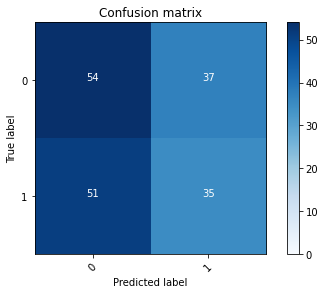

2022-08-20 18:53:31 - [Epoch Train: 30] loss: 0.2284, auc: 0.9660, acc: 0.9130, time: 51.00 s            
2022-08-20 18:53:31 - [Epoch Valid: 30] loss: 1.1559, auc: 0.5110, acc: 0.5097, time: 13.00 s


 30%|████████████                            | 30/100 [32:13<1:15:33, 64.76s/it]

2022-08-20 18:53:31 - EPOCH: 31
2022-08-20 18:53:32 - Train Step 10/977, train_loss: 0.2860
2022-08-20 18:53:32 - Train Step 20/977, train_loss: 0.2591
2022-08-20 18:53:33 - Train Step 30/977, train_loss: 0.2381
2022-08-20 18:53:33 - Train Step 40/977, train_loss: 0.2164
2022-08-20 18:53:34 - Train Step 50/977, train_loss: 0.2197
2022-08-20 18:53:34 - Train Step 60/977, train_loss: 0.2156
2022-08-20 18:53:35 - Train Step 70/977, train_loss: 0.2407
2022-08-20 18:53:36 - Train Step 80/977, train_loss: 0.2677
2022-08-20 18:53:36 - Train Step 90/977, train_loss: 0.2797
2022-08-20 18:53:37 - Train Step 100/977, train_loss: 0.2874
2022-08-20 18:53:37 - Train Step 110/977, train_loss: 0.2975
2022-08-20 18:53:38 - Train Step 120/977, train_loss: 0.2815
2022-08-20 18:53:38 - Train Step 130/977, train_loss: 0.2802
2022-08-20 18:53:39 - Train Step 140/977, train_loss: 0.2792
2022-08-20 18:53:39 - Train Step 150/977, train_loss: 0.2713
2022-08-20 18:53:40 - Train Step 160/977, train_loss: 0.2654
2

2022-08-20 18:54:31 - Valid Step 185/257, valid_loss: 1.1372
2022-08-20 18:54:32 - Valid Step 190/257, valid_loss: 1.1244
2022-08-20 18:54:32 - Valid Step 195/257, valid_loss: 1.1022
2022-08-20 18:54:32 - Valid Step 200/257, valid_loss: 1.1239
2022-08-20 18:54:32 - Valid Step 205/257, valid_loss: 1.1340
2022-08-20 18:54:33 - Valid Step 210/257, valid_loss: 1.1307
2022-08-20 18:54:33 - Valid Step 215/257, valid_loss: 1.1193
2022-08-20 18:54:33 - Valid Step 220/257, valid_loss: 1.1040
2022-08-20 18:54:33 - Valid Step 225/257, valid_loss: 1.1003
2022-08-20 18:54:34 - Valid Step 230/257, valid_loss: 1.0963
2022-08-20 18:54:34 - Valid Step 235/257, valid_loss: 1.0820
2022-08-20 18:54:34 - Valid Step 240/257, valid_loss: 1.1149
2022-08-20 18:54:35 - Valid Step 245/257, valid_loss: 1.1338
2022-08-20 18:54:35 - Valid Step 250/257, valid_loss: 1.1344
2022-08-20 18:54:35 - Valid Step 255/257, valid_loss: 1.1215
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

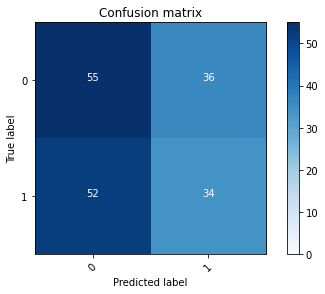

2022-08-20 18:54:35 - [Epoch Train: 31] loss: 0.2266, auc: 0.9640, acc: 0.9058, time: 50.00 s            
2022-08-20 18:54:35 - [Epoch Valid: 31] loss: 1.1142, auc: 0.5114, acc: 0.5136, time: 13.00 s


 31%|████████████▍                           | 31/100 [33:18<1:14:15, 64.58s/it]

2022-08-20 18:54:35 - EPOCH: 32
2022-08-20 18:54:36 - Train Step 10/977, train_loss: 0.1000
2022-08-20 18:54:37 - Train Step 20/977, train_loss: 0.2801
2022-08-20 18:54:37 - Train Step 30/977, train_loss: 0.2161
2022-08-20 18:54:38 - Train Step 40/977, train_loss: 0.2080
2022-08-20 18:54:38 - Train Step 50/977, train_loss: 0.2239
2022-08-20 18:54:38 - Train Step 60/977, train_loss: 0.2119
2022-08-20 18:54:39 - Train Step 70/977, train_loss: 0.2040
2022-08-20 18:54:40 - Train Step 80/977, train_loss: 0.1934
2022-08-20 18:54:40 - Train Step 90/977, train_loss: 0.1907
2022-08-20 18:54:41 - Train Step 100/977, train_loss: 0.2037
2022-08-20 18:54:41 - Train Step 110/977, train_loss: 0.1975
2022-08-20 18:54:42 - Train Step 120/977, train_loss: 0.1936
2022-08-20 18:54:42 - Train Step 130/977, train_loss: 0.1873
2022-08-20 18:54:43 - Train Step 140/977, train_loss: 0.1877
2022-08-20 18:54:43 - Train Step 150/977, train_loss: 0.1827
2022-08-20 18:54:44 - Train Step 160/977, train_loss: 0.1780
2

2022-08-20 18:55:36 - Valid Step 185/257, valid_loss: 1.1127
2022-08-20 18:55:37 - Valid Step 190/257, valid_loss: 1.1039
2022-08-20 18:55:37 - Valid Step 195/257, valid_loss: 1.1075
2022-08-20 18:55:37 - Valid Step 200/257, valid_loss: 1.1121
2022-08-20 18:55:38 - Valid Step 205/257, valid_loss: 1.1113
2022-08-20 18:55:38 - Valid Step 210/257, valid_loss: 1.0956
2022-08-20 18:55:38 - Valid Step 215/257, valid_loss: 1.0945
2022-08-20 18:55:38 - Valid Step 220/257, valid_loss: 1.0890
2022-08-20 18:55:39 - Valid Step 225/257, valid_loss: 1.1052
2022-08-20 18:55:39 - Valid Step 230/257, valid_loss: 1.0996
2022-08-20 18:55:39 - Valid Step 235/257, valid_loss: 1.1079
2022-08-20 18:55:39 - Valid Step 240/257, valid_loss: 1.0908
2022-08-20 18:55:40 - Valid Step 245/257, valid_loss: 1.0919
2022-08-20 18:55:40 - Valid Step 250/257, valid_loss: 1.0979
2022-08-20 18:55:40 - Valid Step 255/257, valid_loss: 1.1428
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

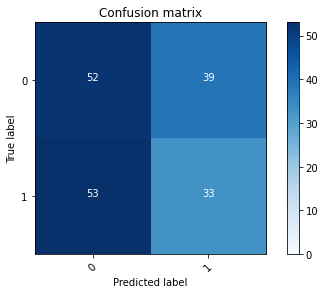

2022-08-20 18:55:41 - [Epoch Train: 32] loss: 0.2043, auc: 0.9738, acc: 0.9212, time: 51.00 s            
2022-08-20 18:55:41 - [Epoch Valid: 32] loss: 1.1370, auc: 0.5083, acc: 0.4903, time: 14.00 s


 32%|████████████▊                           | 32/100 [34:23<1:13:24, 64.77s/it]

2022-08-20 18:55:41 - EPOCH: 33
2022-08-20 18:55:41 - Train Step 10/977, train_loss: 0.2557
2022-08-20 18:55:42 - Train Step 20/977, train_loss: 0.2567
2022-08-20 18:55:42 - Train Step 30/977, train_loss: 0.2348
2022-08-20 18:55:43 - Train Step 40/977, train_loss: 0.2425
2022-08-20 18:55:43 - Train Step 50/977, train_loss: 0.2545
2022-08-20 18:55:44 - Train Step 60/977, train_loss: 0.2631
2022-08-20 18:55:44 - Train Step 70/977, train_loss: 0.2325
2022-08-20 18:55:45 - Train Step 80/977, train_loss: 0.2130
2022-08-20 18:55:45 - Train Step 90/977, train_loss: 0.2073
2022-08-20 18:55:46 - Train Step 100/977, train_loss: 0.1980
2022-08-20 18:55:46 - Train Step 110/977, train_loss: 0.1907
2022-08-20 18:55:47 - Train Step 120/977, train_loss: 0.1796
2022-08-20 18:55:47 - Train Step 130/977, train_loss: 0.1779
2022-08-20 18:55:48 - Train Step 140/977, train_loss: 0.1692
2022-08-20 18:55:48 - Train Step 150/977, train_loss: 0.1681
2022-08-20 18:55:49 - Train Step 160/977, train_loss: 0.1801
2

2022-08-20 18:56:42 - Valid Step 185/257, valid_loss: 1.1821
2022-08-20 18:56:42 - Valid Step 190/257, valid_loss: 1.1675
2022-08-20 18:56:42 - Valid Step 195/257, valid_loss: 1.1478
2022-08-20 18:56:42 - Valid Step 200/257, valid_loss: 1.1861
2022-08-20 18:56:43 - Valid Step 205/257, valid_loss: 1.1789
2022-08-20 18:56:43 - Valid Step 210/257, valid_loss: 1.1889
2022-08-20 18:56:43 - Valid Step 215/257, valid_loss: 1.1974
2022-08-20 18:56:43 - Valid Step 220/257, valid_loss: 1.1852
2022-08-20 18:56:44 - Valid Step 225/257, valid_loss: 1.2030
2022-08-20 18:56:44 - Valid Step 230/257, valid_loss: 1.2020
2022-08-20 18:56:44 - Valid Step 235/257, valid_loss: 1.1898
2022-08-20 18:56:44 - Valid Step 240/257, valid_loss: 1.2071
2022-08-20 18:56:45 - Valid Step 245/257, valid_loss: 1.1998
2022-08-20 18:56:45 - Valid Step 250/257, valid_loss: 1.2060
2022-08-20 18:56:45 - Valid Step 255/257, valid_loss: 1.1978
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

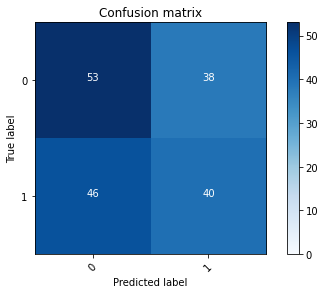

2022-08-20 18:56:45 - [Epoch Train: 33] loss: 0.1961, auc: 0.9746, acc: 0.9232, time: 51.00 s            
2022-08-20 18:56:45 - [Epoch Valid: 33] loss: 1.1906, auc: 0.5188, acc: 0.5486, time: 13.00 s
2022-08-20 18:56:45 - acc improved from 0.5486 to 0.5486. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_18-21-17/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e33-loss1.191-acc0.549-auc0.519.pth'


 33%|█████████████▏                          | 33/100 [35:28<1:12:21, 64.79s/it]

2022-08-20 18:56:45 - EPOCH: 34
2022-08-20 18:56:46 - Train Step 10/977, train_loss: 0.1417
2022-08-20 18:56:47 - Train Step 20/977, train_loss: 0.1692
2022-08-20 18:56:47 - Train Step 30/977, train_loss: 0.1576
2022-08-20 18:56:48 - Train Step 40/977, train_loss: 0.1351
2022-08-20 18:56:48 - Train Step 50/977, train_loss: 0.1470
2022-08-20 18:56:49 - Train Step 60/977, train_loss: 0.1375
2022-08-20 18:56:49 - Train Step 70/977, train_loss: 0.1630
2022-08-20 18:56:50 - Train Step 80/977, train_loss: 0.1676
2022-08-20 18:56:50 - Train Step 90/977, train_loss: 0.1793
2022-08-20 18:56:51 - Train Step 100/977, train_loss: 0.1711
2022-08-20 18:56:51 - Train Step 110/977, train_loss: 0.1636
2022-08-20 18:56:52 - Train Step 120/977, train_loss: 0.1646
2022-08-20 18:56:52 - Train Step 130/977, train_loss: 0.1587
2022-08-20 18:56:53 - Train Step 140/977, train_loss: 0.1537
2022-08-20 18:56:53 - Train Step 150/977, train_loss: 0.1605
2022-08-20 18:56:54 - Train Step 160/977, train_loss: 0.1707
2

2022-08-20 18:57:47 - Valid Step 185/257, valid_loss: 1.1719
2022-08-20 18:57:47 - Valid Step 190/257, valid_loss: 1.1560
2022-08-20 18:57:47 - Valid Step 195/257, valid_loss: 1.1559
2022-08-20 18:57:47 - Valid Step 200/257, valid_loss: 1.1438
2022-08-20 18:57:48 - Valid Step 205/257, valid_loss: 1.1383
2022-08-20 18:57:48 - Valid Step 210/257, valid_loss: 1.1244
2022-08-20 18:57:48 - Valid Step 215/257, valid_loss: 1.1391
2022-08-20 18:57:48 - Valid Step 220/257, valid_loss: 1.1598
2022-08-20 18:57:49 - Valid Step 225/257, valid_loss: 1.1694
2022-08-20 18:57:49 - Valid Step 230/257, valid_loss: 1.1782
2022-08-20 18:57:49 - Valid Step 235/257, valid_loss: 1.1680
2022-08-20 18:57:50 - Valid Step 240/257, valid_loss: 1.1568
2022-08-20 18:57:50 - Valid Step 245/257, valid_loss: 1.1888
2022-08-20 18:57:50 - Valid Step 250/257, valid_loss: 1.1823
2022-08-20 18:57:50 - Valid Step 255/257, valid_loss: 1.1870
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

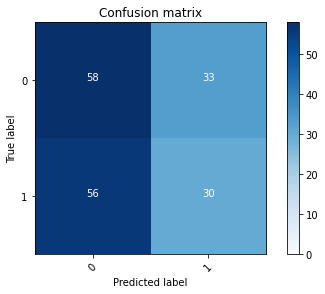

2022-08-20 18:57:51 - [Epoch Train: 34] loss: 0.1851, auc: 0.9763, acc: 0.9212, time: 51.00 s            
2022-08-20 18:57:51 - [Epoch Valid: 34] loss: 1.1890, auc: 0.5156, acc: 0.5058, time: 13.00 s


 34%|█████████████▌                          | 34/100 [36:33<1:11:25, 64.93s/it]

2022-08-20 18:57:51 - EPOCH: 35
2022-08-20 18:57:51 - Train Step 10/977, train_loss: 0.1465
2022-08-20 18:57:52 - Train Step 20/977, train_loss: 0.1341
2022-08-20 18:57:52 - Train Step 30/977, train_loss: 0.1237
2022-08-20 18:57:53 - Train Step 40/977, train_loss: 0.1406
2022-08-20 18:57:53 - Train Step 50/977, train_loss: 0.1388
2022-08-20 18:57:54 - Train Step 60/977, train_loss: 0.1736
2022-08-20 18:57:54 - Train Step 70/977, train_loss: 0.2175
2022-08-20 18:57:55 - Train Step 80/977, train_loss: 0.2096
2022-08-20 18:57:56 - Train Step 90/977, train_loss: 0.2187
2022-08-20 18:57:56 - Train Step 100/977, train_loss: 0.2019
2022-08-20 18:57:57 - Train Step 110/977, train_loss: 0.2115
2022-08-20 18:57:57 - Train Step 120/977, train_loss: 0.2053
2022-08-20 18:57:58 - Train Step 130/977, train_loss: 0.2240
2022-08-20 18:57:58 - Train Step 140/977, train_loss: 0.2101
2022-08-20 18:57:59 - Train Step 150/977, train_loss: 0.2025
2022-08-20 18:57:59 - Train Step 160/977, train_loss: 0.1949
2

2022-08-20 18:58:51 - Valid Step 185/257, valid_loss: 1.2787
2022-08-20 18:58:51 - Valid Step 190/257, valid_loss: 1.3451
2022-08-20 18:58:52 - Valid Step 195/257, valid_loss: 1.3323
2022-08-20 18:58:52 - Valid Step 200/257, valid_loss: 1.3174
2022-08-20 18:58:52 - Valid Step 205/257, valid_loss: 1.3248
2022-08-20 18:58:52 - Valid Step 210/257, valid_loss: 1.3328
2022-08-20 18:58:53 - Valid Step 215/257, valid_loss: 1.3596
2022-08-20 18:58:53 - Valid Step 220/257, valid_loss: 1.3867
2022-08-20 18:58:53 - Valid Step 225/257, valid_loss: 1.3778
2022-08-20 18:58:53 - Valid Step 230/257, valid_loss: 1.3679
2022-08-20 18:58:54 - Valid Step 235/257, valid_loss: 1.3463
2022-08-20 18:58:54 - Valid Step 240/257, valid_loss: 1.3328
2022-08-20 18:58:54 - Valid Step 245/257, valid_loss: 1.3094
2022-08-20 18:58:55 - Valid Step 250/257, valid_loss: 1.3097
2022-08-20 18:58:55 - Valid Step 255/257, valid_loss: 1.3186
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

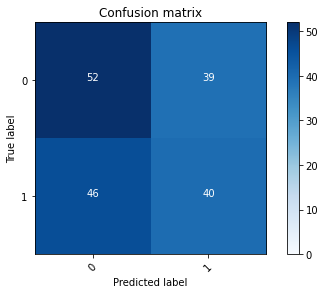

2022-08-20 18:58:55 - [Epoch Train: 35] loss: 0.1806, auc: 0.9769, acc: 0.9284, time: 50.00 s            
2022-08-20 18:58:55 - [Epoch Valid: 35] loss: 1.3220, auc: 0.5179, acc: 0.5370, time: 13.00 s


 35%|██████████████                          | 35/100 [37:37<1:10:09, 64.76s/it]

2022-08-20 18:58:55 - EPOCH: 36
2022-08-20 18:58:56 - Train Step 10/977, train_loss: 0.3565
2022-08-20 18:58:56 - Train Step 20/977, train_loss: 0.2119
2022-08-20 18:58:57 - Train Step 30/977, train_loss: 0.1799
2022-08-20 18:58:57 - Train Step 40/977, train_loss: 0.1516
2022-08-20 18:58:58 - Train Step 50/977, train_loss: 0.1632
2022-08-20 18:58:58 - Train Step 60/977, train_loss: 0.1551
2022-08-20 18:58:59 - Train Step 70/977, train_loss: 0.1435
2022-08-20 18:58:59 - Train Step 80/977, train_loss: 0.1323
2022-08-20 18:59:00 - Train Step 90/977, train_loss: 0.1284
2022-08-20 18:59:00 - Train Step 100/977, train_loss: 0.1301
2022-08-20 18:59:01 - Train Step 110/977, train_loss: 0.1485
2022-08-20 18:59:01 - Train Step 120/977, train_loss: 0.1521
2022-08-20 18:59:02 - Train Step 130/977, train_loss: 0.1522
2022-08-20 18:59:02 - Train Step 140/977, train_loss: 0.1493
2022-08-20 18:59:03 - Train Step 150/977, train_loss: 0.1439
2022-08-20 18:59:03 - Train Step 160/977, train_loss: 0.1417
2

2022-08-20 18:59:56 - Valid Step 185/257, valid_loss: 1.3036
2022-08-20 18:59:56 - Valid Step 190/257, valid_loss: 1.3032
2022-08-20 18:59:57 - Valid Step 195/257, valid_loss: 1.3002
2022-08-20 18:59:57 - Valid Step 200/257, valid_loss: 1.3039
2022-08-20 18:59:57 - Valid Step 205/257, valid_loss: 1.3009
2022-08-20 18:59:57 - Valid Step 210/257, valid_loss: 1.2986
2022-08-20 18:59:58 - Valid Step 215/257, valid_loss: 1.2840
2022-08-20 18:59:58 - Valid Step 220/257, valid_loss: 1.2787
2022-08-20 18:59:58 - Valid Step 225/257, valid_loss: 1.3048
2022-08-20 18:59:58 - Valid Step 230/257, valid_loss: 1.3377
2022-08-20 18:59:59 - Valid Step 235/257, valid_loss: 1.3168
2022-08-20 18:59:59 - Valid Step 240/257, valid_loss: 1.3006
2022-08-20 18:59:59 - Valid Step 245/257, valid_loss: 1.3053
2022-08-20 18:59:59 - Valid Step 250/257, valid_loss: 1.2933
2022-08-20 19:00:00 - Valid Step 255/257, valid_loss: 1.2857
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

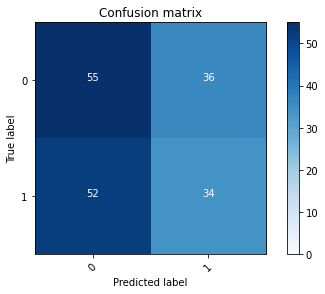

2022-08-20 19:00:00 - [Epoch Train: 36] loss: 0.1585, auc: 0.9845, acc: 0.9447, time: 51.00 s            
2022-08-20 19:00:00 - [Epoch Valid: 36] loss: 1.2802, auc: 0.5129, acc: 0.5097, time: 13.00 s


 36%|██████████████▍                         | 36/100 [38:42<1:09:06, 64.79s/it]

2022-08-20 19:00:00 - EPOCH: 37
2022-08-20 19:00:01 - Train Step 10/977, train_loss: 0.0772
2022-08-20 19:00:01 - Train Step 20/977, train_loss: 0.0731
2022-08-20 19:00:02 - Train Step 30/977, train_loss: 0.1191
2022-08-20 19:00:02 - Train Step 40/977, train_loss: 0.1002
2022-08-20 19:00:03 - Train Step 50/977, train_loss: 0.1174
2022-08-20 19:00:03 - Train Step 60/977, train_loss: 0.1259
2022-08-20 19:00:04 - Train Step 70/977, train_loss: 0.1369
2022-08-20 19:00:04 - Train Step 80/977, train_loss: 0.1355
2022-08-20 19:00:05 - Train Step 90/977, train_loss: 0.1309
2022-08-20 19:00:05 - Train Step 100/977, train_loss: 0.1342
2022-08-20 19:00:06 - Train Step 110/977, train_loss: 0.1344
2022-08-20 19:00:06 - Train Step 120/977, train_loss: 0.1331
2022-08-20 19:00:07 - Train Step 130/977, train_loss: 0.1299
2022-08-20 19:00:07 - Train Step 140/977, train_loss: 0.1237
2022-08-20 19:00:08 - Train Step 150/977, train_loss: 0.1310
2022-08-20 19:00:08 - Train Step 160/977, train_loss: 0.1346
2

2022-08-20 19:01:00 - Valid Step 185/257, valid_loss: 1.4380
2022-08-20 19:01:00 - Valid Step 190/257, valid_loss: 1.4328
2022-08-20 19:01:01 - Valid Step 195/257, valid_loss: 1.4088
2022-08-20 19:01:01 - Valid Step 200/257, valid_loss: 1.4487
2022-08-20 19:01:01 - Valid Step 205/257, valid_loss: 1.4204
2022-08-20 19:01:02 - Valid Step 210/257, valid_loss: 1.3986
2022-08-20 19:01:02 - Valid Step 215/257, valid_loss: 1.3762
2022-08-20 19:01:02 - Valid Step 220/257, valid_loss: 1.3934
2022-08-20 19:01:02 - Valid Step 225/257, valid_loss: 1.4015
2022-08-20 19:01:03 - Valid Step 230/257, valid_loss: 1.3837
2022-08-20 19:01:03 - Valid Step 235/257, valid_loss: 1.3715
2022-08-20 19:01:03 - Valid Step 240/257, valid_loss: 1.3828
2022-08-20 19:01:03 - Valid Step 245/257, valid_loss: 1.3728
2022-08-20 19:01:04 - Valid Step 250/257, valid_loss: 1.3696
2022-08-20 19:01:04 - Valid Step 255/257, valid_loss: 1.3467
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

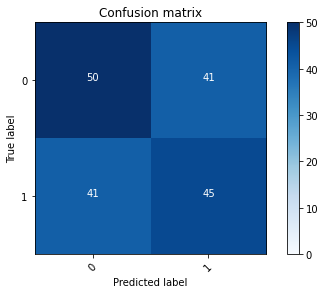

2022-08-20 19:01:04 - [Epoch Train: 37] loss: 0.1470, auc: 0.9882, acc: 0.9437, time: 50.00 s            
2022-08-20 19:01:04 - [Epoch Valid: 37] loss: 1.3488, auc: 0.5263, acc: 0.5486, time: 13.00 s
2022-08-20 19:01:04 - acc improved from 0.5486 to 0.5486. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_18-21-17/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e37-loss1.349-acc0.549-auc0.526.pth'


 37%|██████████████▊                         | 37/100 [39:47<1:07:53, 64.66s/it]

2022-08-20 19:01:04 - EPOCH: 38
2022-08-20 19:01:05 - Train Step 10/977, train_loss: 0.2203
2022-08-20 19:01:05 - Train Step 20/977, train_loss: 0.1769
2022-08-20 19:01:06 - Train Step 30/977, train_loss: 0.1710
2022-08-20 19:01:06 - Train Step 40/977, train_loss: 0.1532
2022-08-20 19:01:07 - Train Step 50/977, train_loss: 0.1416
2022-08-20 19:01:08 - Train Step 60/977, train_loss: 0.1570
2022-08-20 19:01:08 - Train Step 70/977, train_loss: 0.1591
2022-08-20 19:01:09 - Train Step 80/977, train_loss: 0.1720
2022-08-20 19:01:09 - Train Step 90/977, train_loss: 0.1656
2022-08-20 19:01:10 - Train Step 100/977, train_loss: 0.1553
2022-08-20 19:01:10 - Train Step 110/977, train_loss: 0.1571
2022-08-20 19:01:11 - Train Step 120/977, train_loss: 0.1519
2022-08-20 19:01:11 - Train Step 130/977, train_loss: 0.1498
2022-08-20 19:01:12 - Train Step 140/977, train_loss: 0.1465
2022-08-20 19:01:12 - Train Step 150/977, train_loss: 0.1456
2022-08-20 19:01:13 - Train Step 160/977, train_loss: 0.1489
2

2022-08-20 19:02:05 - Valid Step 185/257, valid_loss: 1.3997
2022-08-20 19:02:06 - Valid Step 190/257, valid_loss: 1.4113
2022-08-20 19:02:06 - Valid Step 195/257, valid_loss: 1.4322
2022-08-20 19:02:06 - Valid Step 200/257, valid_loss: 1.4222
2022-08-20 19:02:06 - Valid Step 205/257, valid_loss: 1.4017
2022-08-20 19:02:07 - Valid Step 210/257, valid_loss: 1.4497
2022-08-20 19:02:07 - Valid Step 215/257, valid_loss: 1.4409
2022-08-20 19:02:07 - Valid Step 220/257, valid_loss: 1.4198
2022-08-20 19:02:07 - Valid Step 225/257, valid_loss: 1.4071
2022-08-20 19:02:08 - Valid Step 230/257, valid_loss: 1.4096
2022-08-20 19:02:08 - Valid Step 235/257, valid_loss: 1.3883
2022-08-20 19:02:08 - Valid Step 240/257, valid_loss: 1.3976
2022-08-20 19:02:08 - Valid Step 245/257, valid_loss: 1.4044
2022-08-20 19:02:09 - Valid Step 250/257, valid_loss: 1.4048
2022-08-20 19:02:09 - Valid Step 255/257, valid_loss: 1.4036
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

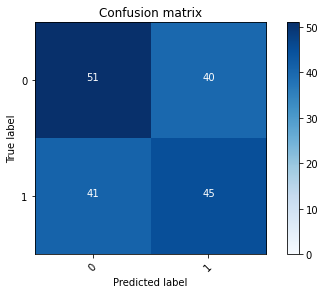

2022-08-20 19:02:09 - [Epoch Train: 38] loss: 0.1497, auc: 0.9856, acc: 0.9386, time: 51.00 s            
2022-08-20 19:02:09 - [Epoch Valid: 38] loss: 1.4040, auc: 0.5235, acc: 0.5681, time: 13.00 s
2022-08-20 19:02:09 - acc improved from 0.5486 to 0.5681. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_18-21-17/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e38-loss1.404-acc0.568-auc0.524.pth'


 38%|███████████████▏                        | 38/100 [40:52<1:06:55, 64.77s/it]

2022-08-20 19:02:09 - EPOCH: 39
2022-08-20 19:02:10 - Train Step 10/977, train_loss: 0.0503
2022-08-20 19:02:10 - Train Step 20/977, train_loss: 0.0603
2022-08-20 19:02:11 - Train Step 30/977, train_loss: 0.1135
2022-08-20 19:02:11 - Train Step 40/977, train_loss: 0.1048
2022-08-20 19:02:12 - Train Step 50/977, train_loss: 0.1752
2022-08-20 19:02:13 - Train Step 60/977, train_loss: 0.1651
2022-08-20 19:02:13 - Train Step 70/977, train_loss: 0.1491
2022-08-20 19:02:14 - Train Step 80/977, train_loss: 0.1391
2022-08-20 19:02:14 - Train Step 90/977, train_loss: 0.1272
2022-08-20 19:02:15 - Train Step 100/977, train_loss: 0.1390
2022-08-20 19:02:15 - Train Step 110/977, train_loss: 0.1311
2022-08-20 19:02:16 - Train Step 120/977, train_loss: 0.1248
2022-08-20 19:02:16 - Train Step 130/977, train_loss: 0.1414
2022-08-20 19:02:17 - Train Step 140/977, train_loss: 0.1399
2022-08-20 19:02:17 - Train Step 150/977, train_loss: 0.1338
2022-08-20 19:02:18 - Train Step 160/977, train_loss: 0.1346
2

2022-08-20 19:03:10 - Valid Step 185/257, valid_loss: 1.3370
2022-08-20 19:03:10 - Valid Step 190/257, valid_loss: 1.3638
2022-08-20 19:03:11 - Valid Step 195/257, valid_loss: 1.4037
2022-08-20 19:03:11 - Valid Step 200/257, valid_loss: 1.3928
2022-08-20 19:03:11 - Valid Step 205/257, valid_loss: 1.3628
2022-08-20 19:03:11 - Valid Step 210/257, valid_loss: 1.3860
2022-08-20 19:03:12 - Valid Step 215/257, valid_loss: 1.4010
2022-08-20 19:03:12 - Valid Step 220/257, valid_loss: 1.3990
2022-08-20 19:03:12 - Valid Step 225/257, valid_loss: 1.3755
2022-08-20 19:03:12 - Valid Step 230/257, valid_loss: 1.3678
2022-08-20 19:03:13 - Valid Step 235/257, valid_loss: 1.3638
2022-08-20 19:03:13 - Valid Step 240/257, valid_loss: 1.3620
2022-08-20 19:03:13 - Valid Step 245/257, valid_loss: 1.3819
2022-08-20 19:03:13 - Valid Step 250/257, valid_loss: 1.3878
2022-08-20 19:03:14 - Valid Step 255/257, valid_loss: 1.3932
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

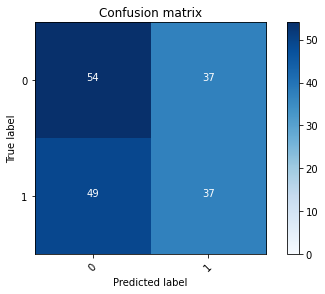

2022-08-20 19:03:14 - [Epoch Train: 39] loss: 0.1379, auc: 0.9889, acc: 0.9509, time: 51.00 s            
2022-08-20 19:03:14 - [Epoch Valid: 39] loss: 1.4186, auc: 0.5161, acc: 0.5253, time: 13.00 s


 39%|███████████████▌                        | 39/100 [41:56<1:05:48, 64.73s/it]

2022-08-20 19:03:14 - EPOCH: 40
2022-08-20 19:03:15 - Train Step 10/977, train_loss: 0.0243
2022-08-20 19:03:15 - Train Step 20/977, train_loss: 0.0675
2022-08-20 19:03:16 - Train Step 30/977, train_loss: 0.0815
2022-08-20 19:03:16 - Train Step 40/977, train_loss: 0.1241
2022-08-20 19:03:17 - Train Step 50/977, train_loss: 0.1266
2022-08-20 19:03:17 - Train Step 60/977, train_loss: 0.1238
2022-08-20 19:03:18 - Train Step 70/977, train_loss: 0.1128
2022-08-20 19:03:18 - Train Step 80/977, train_loss: 0.1018
2022-08-20 19:03:19 - Train Step 90/977, train_loss: 0.1074
2022-08-20 19:03:19 - Train Step 100/977, train_loss: 0.1143
2022-08-20 19:03:20 - Train Step 110/977, train_loss: 0.1210
2022-08-20 19:03:20 - Train Step 120/977, train_loss: 0.1185
2022-08-20 19:03:21 - Train Step 130/977, train_loss: 0.1190
2022-08-20 19:03:21 - Train Step 140/977, train_loss: 0.1248
2022-08-20 19:03:22 - Train Step 150/977, train_loss: 0.1247
2022-08-20 19:03:22 - Train Step 160/977, train_loss: 0.1188
2

2022-08-20 19:04:14 - Valid Step 185/257, valid_loss: 1.3168
2022-08-20 19:04:15 - Valid Step 190/257, valid_loss: 1.3113
2022-08-20 19:04:15 - Valid Step 195/257, valid_loss: 1.3152
2022-08-20 19:04:15 - Valid Step 200/257, valid_loss: 1.3236
2022-08-20 19:04:15 - Valid Step 205/257, valid_loss: 1.3302
2022-08-20 19:04:16 - Valid Step 210/257, valid_loss: 1.3560
2022-08-20 19:04:16 - Valid Step 215/257, valid_loss: 1.3519
2022-08-20 19:04:16 - Valid Step 220/257, valid_loss: 1.3378
2022-08-20 19:04:16 - Valid Step 225/257, valid_loss: 1.3194
2022-08-20 19:04:17 - Valid Step 230/257, valid_loss: 1.3188
2022-08-20 19:04:17 - Valid Step 235/257, valid_loss: 1.3343
2022-08-20 19:04:17 - Valid Step 240/257, valid_loss: 1.3235
2022-08-20 19:04:17 - Valid Step 245/257, valid_loss: 1.3534
2022-08-20 19:04:18 - Valid Step 250/257, valid_loss: 1.3515
2022-08-20 19:04:18 - Valid Step 255/257, valid_loss: 1.3545
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

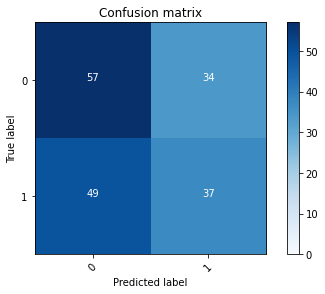

2022-08-20 19:04:18 - [Epoch Train: 40] loss: 0.1280, auc: 0.9901, acc: 0.9550, time: 50.00 s            
2022-08-20 19:04:18 - [Epoch Valid: 40] loss: 1.3493, auc: 0.5308, acc: 0.5370, time: 13.00 s


 40%|████████████████                        | 40/100 [43:01<1:04:37, 64.63s/it]

2022-08-20 19:04:18 - EPOCH: 41
2022-08-20 19:04:19 - Train Step 10/977, train_loss: 0.0697
2022-08-20 19:04:19 - Train Step 20/977, train_loss: 0.0623
2022-08-20 19:04:20 - Train Step 30/977, train_loss: 0.0672
2022-08-20 19:04:21 - Train Step 40/977, train_loss: 0.0625
2022-08-20 19:04:21 - Train Step 50/977, train_loss: 0.0687
2022-08-20 19:04:22 - Train Step 60/977, train_loss: 0.0681
2022-08-20 19:04:22 - Train Step 70/977, train_loss: 0.0685
2022-08-20 19:04:23 - Train Step 80/977, train_loss: 0.0667
2022-08-20 19:04:23 - Train Step 90/977, train_loss: 0.0908
2022-08-20 19:04:24 - Train Step 100/977, train_loss: 0.0927
2022-08-20 19:04:24 - Train Step 110/977, train_loss: 0.0909
2022-08-20 19:04:25 - Train Step 120/977, train_loss: 0.0909
2022-08-20 19:04:25 - Train Step 130/977, train_loss: 0.0906
2022-08-20 19:04:26 - Train Step 140/977, train_loss: 0.0855
2022-08-20 19:04:26 - Train Step 150/977, train_loss: 0.0818
2022-08-20 19:04:27 - Train Step 160/977, train_loss: 0.0869
2

2022-08-20 19:05:19 - Valid Step 185/257, valid_loss: 1.4926
2022-08-20 19:05:19 - Valid Step 190/257, valid_loss: 1.4607
2022-08-20 19:05:19 - Valid Step 195/257, valid_loss: 1.4739
2022-08-20 19:05:20 - Valid Step 200/257, valid_loss: 1.4693
2022-08-20 19:05:20 - Valid Step 205/257, valid_loss: 1.4863
2022-08-20 19:05:20 - Valid Step 210/257, valid_loss: 1.4693
2022-08-20 19:05:20 - Valid Step 215/257, valid_loss: 1.4594
2022-08-20 19:05:21 - Valid Step 220/257, valid_loss: 1.4923
2022-08-20 19:05:21 - Valid Step 225/257, valid_loss: 1.4756
2022-08-20 19:05:21 - Valid Step 230/257, valid_loss: 1.5039
2022-08-20 19:05:21 - Valid Step 235/257, valid_loss: 1.4826
2022-08-20 19:05:22 - Valid Step 240/257, valid_loss: 1.4693
2022-08-20 19:05:22 - Valid Step 245/257, valid_loss: 1.4735
2022-08-20 19:05:22 - Valid Step 250/257, valid_loss: 1.4886
2022-08-20 19:05:22 - Valid Step 255/257, valid_loss: 1.5026
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

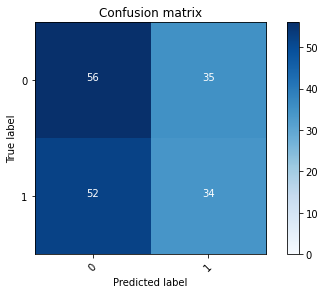

2022-08-20 19:05:23 - [Epoch Train: 41] loss: 0.1199, auc: 0.9920, acc: 0.9632, time: 50.00 s            
2022-08-20 19:05:23 - [Epoch Valid: 41] loss: 1.4956, auc: 0.5188, acc: 0.5175, time: 13.00 s


 41%|████████████████▍                       | 41/100 [44:05<1:03:28, 64.54s/it]

2022-08-20 19:05:23 - EPOCH: 42
2022-08-20 19:05:23 - Train Step 10/977, train_loss: 0.1080
2022-08-20 19:05:24 - Train Step 20/977, train_loss: 0.1316
2022-08-20 19:05:24 - Train Step 30/977, train_loss: 0.1286
2022-08-20 19:05:25 - Train Step 40/977, train_loss: 0.1075
2022-08-20 19:05:25 - Train Step 50/977, train_loss: 0.1040
2022-08-20 19:05:26 - Train Step 60/977, train_loss: 0.1001
2022-08-20 19:05:26 - Train Step 70/977, train_loss: 0.0955
2022-08-20 19:05:27 - Train Step 80/977, train_loss: 0.0915
2022-08-20 19:05:27 - Train Step 90/977, train_loss: 0.0887
2022-08-20 19:05:28 - Train Step 100/977, train_loss: 0.0866
2022-08-20 19:05:29 - Train Step 110/977, train_loss: 0.0934
2022-08-20 19:05:29 - Train Step 120/977, train_loss: 0.0936
2022-08-20 19:05:30 - Train Step 130/977, train_loss: 0.0889
2022-08-20 19:05:30 - Train Step 140/977, train_loss: 0.0897
2022-08-20 19:05:31 - Train Step 150/977, train_loss: 0.0882
2022-08-20 19:05:31 - Train Step 160/977, train_loss: 0.0859
2

2022-08-20 19:06:23 - Valid Step 185/257, valid_loss: 1.5019
2022-08-20 19:06:23 - Valid Step 190/257, valid_loss: 1.4758
2022-08-20 19:06:24 - Valid Step 195/257, valid_loss: 1.4667
2022-08-20 19:06:24 - Valid Step 200/257, valid_loss: 1.4585
2022-08-20 19:06:24 - Valid Step 205/257, valid_loss: 1.4390
2022-08-20 19:06:24 - Valid Step 210/257, valid_loss: 1.4420
2022-08-20 19:06:25 - Valid Step 215/257, valid_loss: 1.4668
2022-08-20 19:06:25 - Valid Step 220/257, valid_loss: 1.4526
2022-08-20 19:06:25 - Valid Step 225/257, valid_loss: 1.5155
2022-08-20 19:06:26 - Valid Step 230/257, valid_loss: 1.5274
2022-08-20 19:06:26 - Valid Step 235/257, valid_loss: 1.5437
2022-08-20 19:06:26 - Valid Step 240/257, valid_loss: 1.5574
2022-08-20 19:06:26 - Valid Step 245/257, valid_loss: 1.5708
2022-08-20 19:06:27 - Valid Step 250/257, valid_loss: 1.5634
2022-08-20 19:06:27 - Valid Step 255/257, valid_loss: 1.5477
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

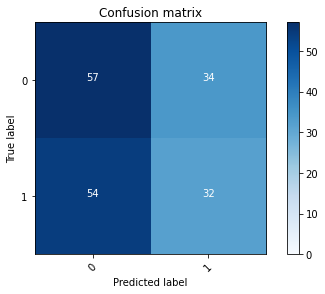

2022-08-20 19:06:27 - [Epoch Train: 42] loss: 0.1154, auc: 0.9919, acc: 0.9591, time: 50.00 s            
2022-08-20 19:06:27 - [Epoch Valid: 42] loss: 1.5402, auc: 0.5198, acc: 0.5175, time: 13.00 s


 42%|████████████████▊                       | 42/100 [45:09<1:02:21, 64.51s/it]

2022-08-20 19:06:27 - EPOCH: 43
2022-08-20 19:06:28 - Train Step 10/977, train_loss: 0.0797
2022-08-20 19:06:28 - Train Step 20/977, train_loss: 0.0440
2022-08-20 19:06:29 - Train Step 30/977, train_loss: 0.0472
2022-08-20 19:06:29 - Train Step 40/977, train_loss: 0.1052
2022-08-20 19:06:30 - Train Step 50/977, train_loss: 0.0936
2022-08-20 19:06:30 - Train Step 60/977, train_loss: 0.1049
2022-08-20 19:06:31 - Train Step 70/977, train_loss: 0.0967
2022-08-20 19:06:31 - Train Step 80/977, train_loss: 0.1112
2022-08-20 19:06:32 - Train Step 90/977, train_loss: 0.1055
2022-08-20 19:06:32 - Train Step 100/977, train_loss: 0.0990
2022-08-20 19:06:33 - Train Step 110/977, train_loss: 0.0954
2022-08-20 19:06:34 - Train Step 120/977, train_loss: 0.0935
2022-08-20 19:06:34 - Train Step 130/977, train_loss: 0.0933
2022-08-20 19:06:35 - Train Step 140/977, train_loss: 0.0937
2022-08-20 19:06:35 - Train Step 150/977, train_loss: 0.0943
2022-08-20 19:06:36 - Train Step 160/977, train_loss: 0.0894
2

2022-08-20 19:07:28 - Valid Step 185/257, valid_loss: 1.5179
2022-08-20 19:07:28 - Valid Step 190/257, valid_loss: 1.5711
2022-08-20 19:07:28 - Valid Step 195/257, valid_loss: 1.5818
2022-08-20 19:07:29 - Valid Step 200/257, valid_loss: 1.5994
2022-08-20 19:07:29 - Valid Step 205/257, valid_loss: 1.6274
2022-08-20 19:07:29 - Valid Step 210/257, valid_loss: 1.6135
2022-08-20 19:07:30 - Valid Step 215/257, valid_loss: 1.5957
2022-08-20 19:07:30 - Valid Step 220/257, valid_loss: 1.6289
2022-08-20 19:07:30 - Valid Step 225/257, valid_loss: 1.6489
2022-08-20 19:07:30 - Valid Step 230/257, valid_loss: 1.6885
2022-08-20 19:07:31 - Valid Step 235/257, valid_loss: 1.6714
2022-08-20 19:07:31 - Valid Step 240/257, valid_loss: 1.6374
2022-08-20 19:07:31 - Valid Step 245/257, valid_loss: 1.6944
2022-08-20 19:07:31 - Valid Step 250/257, valid_loss: 1.6717
2022-08-20 19:07:32 - Valid Step 255/257, valid_loss: 1.7086
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

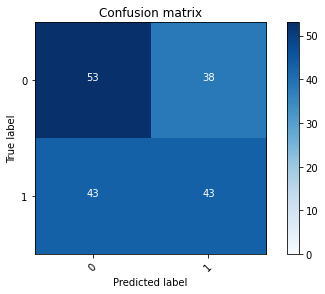

2022-08-20 19:07:32 - [Epoch Train: 43] loss: 0.1002, auc: 0.9958, acc: 0.9652, time: 50.00 s            
2022-08-20 19:07:32 - [Epoch Valid: 43] loss: 1.6969, auc: 0.5314, acc: 0.5642, time: 14.00 s


 43%|█████████████████▏                      | 43/100 [46:14<1:01:23, 64.63s/it]

2022-08-20 19:07:32 - EPOCH: 44
2022-08-20 19:07:33 - Train Step 10/977, train_loss: 0.1196
2022-08-20 19:07:33 - Train Step 20/977, train_loss: 0.2356
2022-08-20 19:07:34 - Train Step 30/977, train_loss: 0.1691
2022-08-20 19:07:34 - Train Step 40/977, train_loss: 0.1552
2022-08-20 19:07:35 - Train Step 50/977, train_loss: 0.1375
2022-08-20 19:07:35 - Train Step 60/977, train_loss: 0.1193
2022-08-20 19:07:36 - Train Step 70/977, train_loss: 0.1195
2022-08-20 19:07:36 - Train Step 80/977, train_loss: 0.1196
2022-08-20 19:07:37 - Train Step 90/977, train_loss: 0.1093
2022-08-20 19:07:37 - Train Step 100/977, train_loss: 0.1087
2022-08-20 19:07:38 - Train Step 110/977, train_loss: 0.1240
2022-08-20 19:07:38 - Train Step 120/977, train_loss: 0.1434
2022-08-20 19:07:39 - Train Step 130/977, train_loss: 0.1473
2022-08-20 19:07:39 - Train Step 140/977, train_loss: 0.1424
2022-08-20 19:07:40 - Train Step 150/977, train_loss: 0.1418
2022-08-20 19:07:41 - Train Step 160/977, train_loss: 0.1435
2

2022-08-20 19:08:32 - Valid Step 185/257, valid_loss: 1.3968
2022-08-20 19:08:33 - Valid Step 190/257, valid_loss: 1.3793
2022-08-20 19:08:33 - Valid Step 195/257, valid_loss: 1.3751
2022-08-20 19:08:33 - Valid Step 200/257, valid_loss: 1.4082
2022-08-20 19:08:33 - Valid Step 205/257, valid_loss: 1.4208
2022-08-20 19:08:34 - Valid Step 210/257, valid_loss: 1.4454
2022-08-20 19:08:34 - Valid Step 215/257, valid_loss: 1.4620
2022-08-20 19:08:34 - Valid Step 220/257, valid_loss: 1.4538
2022-08-20 19:08:34 - Valid Step 225/257, valid_loss: 1.4543
2022-08-20 19:08:35 - Valid Step 230/257, valid_loss: 1.4733
2022-08-20 19:08:35 - Valid Step 235/257, valid_loss: 1.5341
2022-08-20 19:08:35 - Valid Step 240/257, valid_loss: 1.5198
2022-08-20 19:08:35 - Valid Step 245/257, valid_loss: 1.5075
2022-08-20 19:08:36 - Valid Step 250/257, valid_loss: 1.5261
2022-08-20 19:08:36 - Valid Step 255/257, valid_loss: 1.5605
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

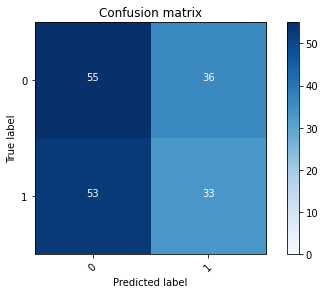

2022-08-20 19:08:36 - [Epoch Train: 44] loss: 0.1045, auc: 0.9943, acc: 0.9611, time: 50.00 s            
2022-08-20 19:08:36 - [Epoch Valid: 44] loss: 1.5748, auc: 0.5128, acc: 0.5058, time: 13.00 s


 44%|█████████████████▌                      | 44/100 [47:19<1:00:13, 64.53s/it]

2022-08-20 19:08:36 - EPOCH: 45
2022-08-20 19:08:37 - Train Step 10/977, train_loss: 0.0360
2022-08-20 19:08:37 - Train Step 20/977, train_loss: 0.0729
2022-08-20 19:08:38 - Train Step 30/977, train_loss: 0.0550
2022-08-20 19:08:39 - Train Step 40/977, train_loss: 0.0508
2022-08-20 19:08:39 - Train Step 50/977, train_loss: 0.0503
2022-08-20 19:08:40 - Train Step 60/977, train_loss: 0.0484
2022-08-20 19:08:40 - Train Step 70/977, train_loss: 0.0482
2022-08-20 19:08:41 - Train Step 80/977, train_loss: 0.0612
2022-08-20 19:08:41 - Train Step 90/977, train_loss: 0.0630
2022-08-20 19:08:42 - Train Step 100/977, train_loss: 0.0679
2022-08-20 19:08:42 - Train Step 110/977, train_loss: 0.0794
2022-08-20 19:08:43 - Train Step 120/977, train_loss: 0.0817
2022-08-20 19:08:43 - Train Step 130/977, train_loss: 0.0785
2022-08-20 19:08:44 - Train Step 140/977, train_loss: 0.0815
2022-08-20 19:08:44 - Train Step 150/977, train_loss: 0.0938
2022-08-20 19:08:45 - Train Step 160/977, train_loss: 0.0901
2

2022-08-20 19:09:38 - Valid Step 185/257, valid_loss: 1.7998
2022-08-20 19:09:38 - Valid Step 190/257, valid_loss: 1.8887
2022-08-20 19:09:38 - Valid Step 195/257, valid_loss: 1.8597
2022-08-20 19:09:38 - Valid Step 200/257, valid_loss: 1.8137
2022-08-20 19:09:39 - Valid Step 205/257, valid_loss: 1.8152
2022-08-20 19:09:39 - Valid Step 210/257, valid_loss: 1.8114
2022-08-20 19:09:39 - Valid Step 215/257, valid_loss: 1.8164
2022-08-20 19:09:39 - Valid Step 220/257, valid_loss: 1.7949
2022-08-20 19:09:40 - Valid Step 225/257, valid_loss: 1.7761
2022-08-20 19:09:40 - Valid Step 230/257, valid_loss: 1.7518
2022-08-20 19:09:40 - Valid Step 235/257, valid_loss: 1.7558
2022-08-20 19:09:40 - Valid Step 240/257, valid_loss: 1.7269
2022-08-20 19:09:41 - Valid Step 245/257, valid_loss: 1.7108
2022-08-20 19:09:41 - Valid Step 250/257, valid_loss: 1.7035
2022-08-20 19:09:41 - Valid Step 255/257, valid_loss: 1.7051
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

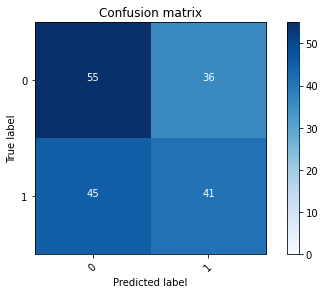

2022-08-20 19:09:41 - [Epoch Train: 45] loss: 0.0890, auc: 0.9965, acc: 0.9724, time: 51.00 s            
2022-08-20 19:09:41 - [Epoch Valid: 45] loss: 1.6920, auc: 0.5298, acc: 0.5447, time: 13.00 s


 45%|██████████████████▉                       | 45/100 [48:24<59:20, 64.73s/it]

2022-08-20 19:09:41 - EPOCH: 46
2022-08-20 19:09:42 - Train Step 10/977, train_loss: 0.0365
2022-08-20 19:09:43 - Train Step 20/977, train_loss: 0.0800
2022-08-20 19:09:43 - Train Step 30/977, train_loss: 0.0787
2022-08-20 19:09:44 - Train Step 40/977, train_loss: 0.0738
2022-08-20 19:09:44 - Train Step 50/977, train_loss: 0.0669
2022-08-20 19:09:45 - Train Step 60/977, train_loss: 0.0684
2022-08-20 19:09:45 - Train Step 70/977, train_loss: 0.0686
2022-08-20 19:09:46 - Train Step 80/977, train_loss: 0.0745
2022-08-20 19:09:46 - Train Step 90/977, train_loss: 0.0884
2022-08-20 19:09:47 - Train Step 100/977, train_loss: 0.0920
2022-08-20 19:09:47 - Train Step 110/977, train_loss: 0.0891
2022-08-20 19:09:48 - Train Step 120/977, train_loss: 0.0847
2022-08-20 19:09:48 - Train Step 130/977, train_loss: 0.0972
2022-08-20 19:09:49 - Train Step 140/977, train_loss: 0.1038
2022-08-20 19:09:49 - Train Step 150/977, train_loss: 0.1039
2022-08-20 19:09:50 - Train Step 160/977, train_loss: 0.0997
2

2022-08-20 19:10:43 - Valid Step 185/257, valid_loss: 1.4143
2022-08-20 19:10:43 - Valid Step 190/257, valid_loss: 1.3900
2022-08-20 19:10:43 - Valid Step 195/257, valid_loss: 1.3794
2022-08-20 19:10:43 - Valid Step 200/257, valid_loss: 1.3923
2022-08-20 19:10:44 - Valid Step 205/257, valid_loss: 1.4098
2022-08-20 19:10:44 - Valid Step 210/257, valid_loss: 1.4219
2022-08-20 19:10:44 - Valid Step 215/257, valid_loss: 1.4214
2022-08-20 19:10:44 - Valid Step 220/257, valid_loss: 1.4656
2022-08-20 19:10:45 - Valid Step 225/257, valid_loss: 1.4637
2022-08-20 19:10:45 - Valid Step 230/257, valid_loss: 1.4865
2022-08-20 19:10:45 - Valid Step 235/257, valid_loss: 1.4790
2022-08-20 19:10:45 - Valid Step 240/257, valid_loss: 1.4964
2022-08-20 19:10:46 - Valid Step 245/257, valid_loss: 1.4794
2022-08-20 19:10:46 - Valid Step 250/257, valid_loss: 1.5033
2022-08-20 19:10:46 - Valid Step 255/257, valid_loss: 1.5187
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

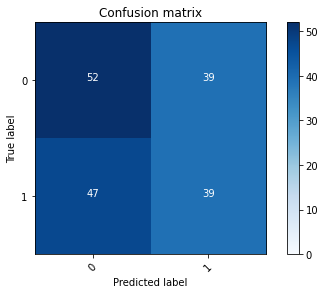

2022-08-20 19:10:47 - [Epoch Train: 46] loss: 0.0941, auc: 0.9962, acc: 0.9642, time: 51.00 s            
2022-08-20 19:10:47 - [Epoch Valid: 46] loss: 1.5209, auc: 0.5247, acc: 0.5214, time: 13.00 s


 46%|███████████████████▎                      | 46/100 [49:29<58:20, 64.83s/it]

2022-08-20 19:10:47 - EPOCH: 47
2022-08-20 19:10:47 - Train Step 10/977, train_loss: 0.1163
2022-08-20 19:10:48 - Train Step 20/977, train_loss: 0.0948
2022-08-20 19:10:48 - Train Step 30/977, train_loss: 0.1022
2022-08-20 19:10:49 - Train Step 40/977, train_loss: 0.0842
2022-08-20 19:10:49 - Train Step 50/977, train_loss: 0.0790
2022-08-20 19:10:50 - Train Step 60/977, train_loss: 0.0692
2022-08-20 19:10:50 - Train Step 70/977, train_loss: 0.0727
2022-08-20 19:10:51 - Train Step 80/977, train_loss: 0.0840
2022-08-20 19:10:51 - Train Step 90/977, train_loss: 0.0818
2022-08-20 19:10:52 - Train Step 100/977, train_loss: 0.0776
2022-08-20 19:10:53 - Train Step 110/977, train_loss: 0.0754
2022-08-20 19:10:53 - Train Step 120/977, train_loss: 0.0725
2022-08-20 19:10:54 - Train Step 130/977, train_loss: 0.0797
2022-08-20 19:10:54 - Train Step 140/977, train_loss: 0.0752
2022-08-20 19:10:55 - Train Step 150/977, train_loss: 0.0732
2022-08-20 19:10:55 - Train Step 160/977, train_loss: 0.0711
2

2022-08-20 19:11:48 - Valid Step 185/257, valid_loss: 1.9003
2022-08-20 19:11:48 - Valid Step 190/257, valid_loss: 1.8711
2022-08-20 19:11:48 - Valid Step 195/257, valid_loss: 1.8542
2022-08-20 19:11:48 - Valid Step 200/257, valid_loss: 1.8276
2022-08-20 19:11:49 - Valid Step 205/257, valid_loss: 1.8197
2022-08-20 19:11:49 - Valid Step 210/257, valid_loss: 1.8058
2022-08-20 19:11:49 - Valid Step 215/257, valid_loss: 1.7857
2022-08-20 19:11:49 - Valid Step 220/257, valid_loss: 1.7903
2022-08-20 19:11:50 - Valid Step 225/257, valid_loss: 1.8170
2022-08-20 19:11:50 - Valid Step 230/257, valid_loss: 1.8056
2022-08-20 19:11:50 - Valid Step 235/257, valid_loss: 1.8108
2022-08-20 19:11:50 - Valid Step 240/257, valid_loss: 1.8123
2022-08-20 19:11:51 - Valid Step 245/257, valid_loss: 1.8575
2022-08-20 19:11:51 - Valid Step 250/257, valid_loss: 1.8475
2022-08-20 19:11:51 - Valid Step 255/257, valid_loss: 1.8498
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

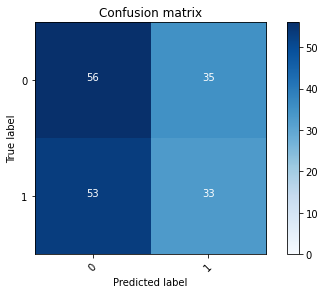

2022-08-20 19:11:52 - [Epoch Train: 47] loss: 0.0792, auc: 0.9983, acc: 0.9785, time: 51.00 s            
2022-08-20 19:11:52 - [Epoch Valid: 47] loss: 1.8750, auc: 0.5193, acc: 0.5175, time: 13.00 s


 47%|███████████████████▋                      | 47/100 [50:34<57:19, 64.89s/it]

2022-08-20 19:11:52 - EPOCH: 48
2022-08-20 19:11:52 - Train Step 10/977, train_loss: 0.1364
2022-08-20 19:11:53 - Train Step 20/977, train_loss: 0.0987
2022-08-20 19:11:53 - Train Step 30/977, train_loss: 0.0797
2022-08-20 19:11:54 - Train Step 40/977, train_loss: 0.0825
2022-08-20 19:11:54 - Train Step 50/977, train_loss: 0.0963
2022-08-20 19:11:55 - Train Step 60/977, train_loss: 0.0949
2022-08-20 19:11:55 - Train Step 70/977, train_loss: 0.0969
2022-08-20 19:11:56 - Train Step 80/977, train_loss: 0.0925
2022-08-20 19:11:56 - Train Step 90/977, train_loss: 0.0968
2022-08-20 19:11:57 - Train Step 100/977, train_loss: 0.0891
2022-08-20 19:11:58 - Train Step 110/977, train_loss: 0.0870
2022-08-20 19:11:58 - Train Step 120/977, train_loss: 0.0817
2022-08-20 19:11:59 - Train Step 130/977, train_loss: 0.0774
2022-08-20 19:11:59 - Train Step 140/977, train_loss: 0.0850
2022-08-20 19:12:00 - Train Step 150/977, train_loss: 0.0892
2022-08-20 19:12:00 - Train Step 160/977, train_loss: 0.0852
2

2022-08-20 19:12:52 - Valid Step 185/257, valid_loss: 1.8156
2022-08-20 19:12:52 - Valid Step 190/257, valid_loss: 1.8304
2022-08-20 19:12:53 - Valid Step 195/257, valid_loss: 1.8157
2022-08-20 19:12:53 - Valid Step 200/257, valid_loss: 1.8115
2022-08-20 19:12:53 - Valid Step 205/257, valid_loss: 1.8213
2022-08-20 19:12:53 - Valid Step 210/257, valid_loss: 1.8340
2022-08-20 19:12:54 - Valid Step 215/257, valid_loss: 1.8451
2022-08-20 19:12:54 - Valid Step 220/257, valid_loss: 1.8105
2022-08-20 19:12:54 - Valid Step 225/257, valid_loss: 1.8412
2022-08-20 19:12:54 - Valid Step 230/257, valid_loss: 1.8395
2022-08-20 19:12:55 - Valid Step 235/257, valid_loss: 1.8496
2022-08-20 19:12:55 - Valid Step 240/257, valid_loss: 1.9018
2022-08-20 19:12:55 - Valid Step 245/257, valid_loss: 1.9380
2022-08-20 19:12:55 - Valid Step 250/257, valid_loss: 1.9442
2022-08-20 19:12:56 - Valid Step 255/257, valid_loss: 1.9473
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

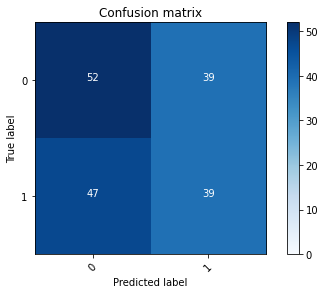

2022-08-20 19:12:56 - [Epoch Train: 48] loss: 0.0831, auc: 0.9972, acc: 0.9683, time: 51.00 s            
2022-08-20 19:12:56 - [Epoch Valid: 48] loss: 1.9385, auc: 0.5221, acc: 0.5175, time: 13.00 s


 48%|████████████████████▏                     | 48/100 [51:38<56:04, 64.70s/it]

2022-08-20 19:12:56 - EPOCH: 49
2022-08-20 19:12:56 - Train Step 10/977, train_loss: 0.0200
2022-08-20 19:12:57 - Train Step 20/977, train_loss: 0.0341
2022-08-20 19:12:57 - Train Step 30/977, train_loss: 0.0558
2022-08-20 19:12:58 - Train Step 40/977, train_loss: 0.0752
2022-08-20 19:12:58 - Train Step 50/977, train_loss: 0.0712
2022-08-20 19:12:59 - Train Step 60/977, train_loss: 0.0772
2022-08-20 19:12:59 - Train Step 70/977, train_loss: 0.0876
2022-08-20 19:13:00 - Train Step 80/977, train_loss: 0.0888
2022-08-20 19:13:00 - Train Step 90/977, train_loss: 0.0881
2022-08-20 19:13:01 - Train Step 100/977, train_loss: 0.0825
2022-08-20 19:13:01 - Train Step 110/977, train_loss: 0.0788
2022-08-20 19:13:02 - Train Step 120/977, train_loss: 0.0758
2022-08-20 19:13:02 - Train Step 130/977, train_loss: 0.0779
2022-08-20 19:13:03 - Train Step 140/977, train_loss: 0.0753
2022-08-20 19:13:03 - Train Step 150/977, train_loss: 0.0777
2022-08-20 19:13:04 - Train Step 160/977, train_loss: 0.0774
2

2022-08-20 19:13:54 - Valid Step 185/257, valid_loss: 1.6176
2022-08-20 19:13:54 - Valid Step 190/257, valid_loss: 1.6522
2022-08-20 19:13:55 - Valid Step 195/257, valid_loss: 1.6344
2022-08-20 19:13:55 - Valid Step 200/257, valid_loss: 1.6959
2022-08-20 19:13:55 - Valid Step 205/257, valid_loss: 1.6814
2022-08-20 19:13:55 - Valid Step 210/257, valid_loss: 1.6712
2022-08-20 19:13:56 - Valid Step 215/257, valid_loss: 1.6608
2022-08-20 19:13:56 - Valid Step 220/257, valid_loss: 1.6981
2022-08-20 19:13:56 - Valid Step 225/257, valid_loss: 1.6913
2022-08-20 19:13:56 - Valid Step 230/257, valid_loss: 1.6817
2022-08-20 19:13:57 - Valid Step 235/257, valid_loss: 1.6743
2022-08-20 19:13:57 - Valid Step 240/257, valid_loss: 1.6747
2022-08-20 19:13:57 - Valid Step 245/257, valid_loss: 1.6712
2022-08-20 19:13:57 - Valid Step 250/257, valid_loss: 1.7219
2022-08-20 19:13:58 - Valid Step 255/257, valid_loss: 1.7080
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

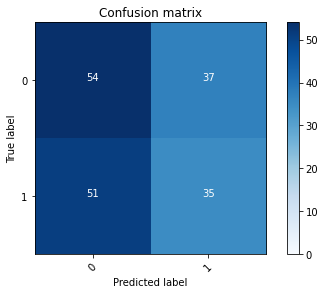

2022-08-20 19:13:58 - [Epoch Train: 49] loss: 0.0706, auc: 0.9988, acc: 0.9795, time: 48.00 s            
2022-08-20 19:13:58 - [Epoch Valid: 49] loss: 1.6959, auc: 0.5225, acc: 0.5097, time: 13.00 s


 49%|████████████████████▌                     | 49/100 [52:40<54:19, 63.90s/it]

2022-08-20 19:13:58 - EPOCH: 50
2022-08-20 19:13:59 - Train Step 10/977, train_loss: 0.0169
2022-08-20 19:13:59 - Train Step 20/977, train_loss: 0.0160
2022-08-20 19:13:59 - Train Step 30/977, train_loss: 0.0292
2022-08-20 19:14:00 - Train Step 40/977, train_loss: 0.0375
2022-08-20 19:14:00 - Train Step 50/977, train_loss: 0.0428
2022-08-20 19:14:01 - Train Step 60/977, train_loss: 0.0552
2022-08-20 19:14:01 - Train Step 70/977, train_loss: 0.0517
2022-08-20 19:14:02 - Train Step 80/977, train_loss: 0.0476
2022-08-20 19:14:02 - Train Step 90/977, train_loss: 0.0498
2022-08-20 19:14:03 - Train Step 100/977, train_loss: 0.0635
2022-08-20 19:14:03 - Train Step 110/977, train_loss: 0.0633
2022-08-20 19:14:04 - Train Step 120/977, train_loss: 0.0610
2022-08-20 19:14:04 - Train Step 130/977, train_loss: 0.0633
2022-08-20 19:14:05 - Train Step 140/977, train_loss: 0.0628
2022-08-20 19:14:05 - Train Step 150/977, train_loss: 0.0611
2022-08-20 19:14:06 - Train Step 160/977, train_loss: 0.0652
2

2022-08-20 19:14:57 - Valid Step 185/257, valid_loss: 1.6636
2022-08-20 19:14:57 - Valid Step 190/257, valid_loss: 1.6278
2022-08-20 19:14:57 - Valid Step 195/257, valid_loss: 1.6178
2022-08-20 19:14:57 - Valid Step 200/257, valid_loss: 1.5940
2022-08-20 19:14:58 - Valid Step 205/257, valid_loss: 1.5983
2022-08-20 19:14:58 - Valid Step 210/257, valid_loss: 1.5872
2022-08-20 19:14:58 - Valid Step 215/257, valid_loss: 1.6153
2022-08-20 19:14:59 - Valid Step 220/257, valid_loss: 1.6502
2022-08-20 19:14:59 - Valid Step 225/257, valid_loss: 1.6407
2022-08-20 19:14:59 - Valid Step 230/257, valid_loss: 1.6317
2022-08-20 19:14:59 - Valid Step 235/257, valid_loss: 1.6531
2022-08-20 19:15:00 - Valid Step 240/257, valid_loss: 1.6797
2022-08-20 19:15:00 - Valid Step 245/257, valid_loss: 1.6876
2022-08-20 19:15:00 - Valid Step 250/257, valid_loss: 1.7137
2022-08-20 19:15:00 - Valid Step 255/257, valid_loss: 1.6921
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

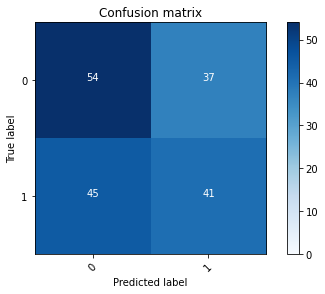

2022-08-20 19:15:01 - [Epoch Train: 50] loss: 0.0744, auc: 0.9973, acc: 0.9724, time: 49.00 s            
2022-08-20 19:15:01 - [Epoch Valid: 50] loss: 1.7040, auc: 0.5263, acc: 0.5409, time: 13.00 s


 50%|█████████████████████                     | 50/100 [53:43<52:59, 63.58s/it]

2022-08-20 19:15:01 - EPOCH: 51
2022-08-20 19:15:01 - Train Step 10/977, train_loss: 0.0355
2022-08-20 19:15:02 - Train Step 20/977, train_loss: 0.0322
2022-08-20 19:15:03 - Train Step 30/977, train_loss: 0.0717
2022-08-20 19:15:03 - Train Step 40/977, train_loss: 0.0618
2022-08-20 19:15:04 - Train Step 50/977, train_loss: 0.0557
2022-08-20 19:15:04 - Train Step 60/977, train_loss: 0.0554
2022-08-20 19:15:05 - Train Step 70/977, train_loss: 0.0526
2022-08-20 19:15:05 - Train Step 80/977, train_loss: 0.0519
2022-08-20 19:15:06 - Train Step 90/977, train_loss: 0.0536
2022-08-20 19:15:06 - Train Step 100/977, train_loss: 0.0540
2022-08-20 19:15:07 - Train Step 110/977, train_loss: 0.0506
2022-08-20 19:15:07 - Train Step 120/977, train_loss: 0.0483
2022-08-20 19:15:08 - Train Step 130/977, train_loss: 0.0460
2022-08-20 19:15:08 - Train Step 140/977, train_loss: 0.0445
2022-08-20 19:15:09 - Train Step 150/977, train_loss: 0.0555
2022-08-20 19:15:09 - Train Step 160/977, train_loss: 0.0536
2

2022-08-20 19:16:02 - Valid Step 185/257, valid_loss: 2.3024
2022-08-20 19:16:02 - Valid Step 190/257, valid_loss: 2.2668
2022-08-20 19:16:02 - Valid Step 195/257, valid_loss: 2.2235
2022-08-20 19:16:03 - Valid Step 200/257, valid_loss: 2.1812
2022-08-20 19:16:03 - Valid Step 205/257, valid_loss: 2.2070
2022-08-20 19:16:03 - Valid Step 210/257, valid_loss: 2.1753
2022-08-20 19:16:03 - Valid Step 215/257, valid_loss: 2.1435
2022-08-20 19:16:04 - Valid Step 220/257, valid_loss: 2.1198
2022-08-20 19:16:04 - Valid Step 225/257, valid_loss: 2.1020
2022-08-20 19:16:04 - Valid Step 230/257, valid_loss: 2.0819
2022-08-20 19:16:05 - Valid Step 235/257, valid_loss: 2.0730
2022-08-20 19:16:05 - Valid Step 240/257, valid_loss: 2.0942
2022-08-20 19:16:05 - Valid Step 245/257, valid_loss: 2.0763
2022-08-20 19:16:05 - Valid Step 250/257, valid_loss: 2.0668
2022-08-20 19:16:06 - Valid Step 255/257, valid_loss: 2.0508
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

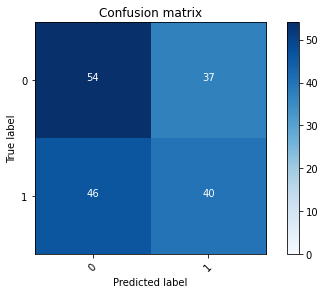

2022-08-20 19:16:06 - [Epoch Train: 51] loss: 0.0608, auc: 0.9991, acc: 0.9795, time: 51.00 s            
2022-08-20 19:16:06 - [Epoch Valid: 51] loss: 2.0358, auc: 0.5290, acc: 0.5409, time: 13.00 s


 51%|█████████████████████▍                    | 51/100 [54:48<52:18, 64.05s/it]

2022-08-20 19:16:06 - EPOCH: 52
2022-08-20 19:16:07 - Train Step 10/977, train_loss: 0.0712
2022-08-20 19:16:07 - Train Step 20/977, train_loss: 0.0477
2022-08-20 19:16:08 - Train Step 30/977, train_loss: 0.0441
2022-08-20 19:16:08 - Train Step 40/977, train_loss: 0.0372
2022-08-20 19:16:09 - Train Step 50/977, train_loss: 0.0324
2022-08-20 19:16:09 - Train Step 60/977, train_loss: 0.0292
2022-08-20 19:16:10 - Train Step 70/977, train_loss: 0.0290
2022-08-20 19:16:10 - Train Step 80/977, train_loss: 0.0265
2022-08-20 19:16:11 - Train Step 90/977, train_loss: 0.0243
2022-08-20 19:16:11 - Train Step 100/977, train_loss: 0.0279
2022-08-20 19:16:12 - Train Step 110/977, train_loss: 0.0268
2022-08-20 19:16:12 - Train Step 120/977, train_loss: 0.0431
2022-08-20 19:16:13 - Train Step 130/977, train_loss: 0.0460
2022-08-20 19:16:13 - Train Step 140/977, train_loss: 0.0456
2022-08-20 19:16:14 - Train Step 150/977, train_loss: 0.0529
2022-08-20 19:16:15 - Train Step 160/977, train_loss: 0.0505
2

2022-08-20 19:17:07 - Valid Step 185/257, valid_loss: 2.0685
2022-08-20 19:17:07 - Valid Step 190/257, valid_loss: 2.0323
2022-08-20 19:17:07 - Valid Step 195/257, valid_loss: 2.0086
2022-08-20 19:17:07 - Valid Step 200/257, valid_loss: 1.9936
2022-08-20 19:17:08 - Valid Step 205/257, valid_loss: 1.9647
2022-08-20 19:17:08 - Valid Step 210/257, valid_loss: 1.9532
2022-08-20 19:17:08 - Valid Step 215/257, valid_loss: 1.9862
2022-08-20 19:17:08 - Valid Step 220/257, valid_loss: 1.9660
2022-08-20 19:17:09 - Valid Step 225/257, valid_loss: 1.9941
2022-08-20 19:17:09 - Valid Step 230/257, valid_loss: 2.0512
2022-08-20 19:17:09 - Valid Step 235/257, valid_loss: 2.0401
2022-08-20 19:17:10 - Valid Step 240/257, valid_loss: 2.0292
2022-08-20 19:17:10 - Valid Step 245/257, valid_loss: 2.0414
2022-08-20 19:17:10 - Valid Step 250/257, valid_loss: 2.0284
2022-08-20 19:17:10 - Valid Step 255/257, valid_loss: 1.9904
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

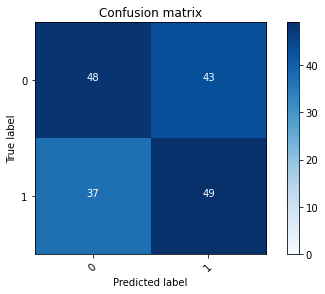

2022-08-20 19:17:11 - [Epoch Train: 52] loss: 0.0530, auc: 0.9993, acc: 0.9877, time: 51.00 s            
2022-08-20 19:17:11 - [Epoch Valid: 52] loss: 2.0592, auc: 0.5286, acc: 0.5564, time: 13.00 s


 52%|█████████████████████▊                    | 52/100 [55:53<51:24, 64.26s/it]

2022-08-20 19:17:11 - EPOCH: 53
2022-08-20 19:17:11 - Train Step 10/977, train_loss: 0.0608
2022-08-20 19:17:12 - Train Step 20/977, train_loss: 0.0499
2022-08-20 19:17:12 - Train Step 30/977, train_loss: 0.0556
2022-08-20 19:17:13 - Train Step 40/977, train_loss: 0.0747
2022-08-20 19:17:13 - Train Step 50/977, train_loss: 0.0628
2022-08-20 19:17:14 - Train Step 60/977, train_loss: 0.0609
2022-08-20 19:17:14 - Train Step 70/977, train_loss: 0.0615
2022-08-20 19:17:15 - Train Step 80/977, train_loss: 0.0569
2022-08-20 19:17:15 - Train Step 90/977, train_loss: 0.0535
2022-08-20 19:17:16 - Train Step 100/977, train_loss: 0.0508
2022-08-20 19:17:16 - Train Step 110/977, train_loss: 0.0482
2022-08-20 19:17:17 - Train Step 120/977, train_loss: 0.0523
2022-08-20 19:17:18 - Train Step 130/977, train_loss: 0.0534
2022-08-20 19:17:18 - Train Step 140/977, train_loss: 0.0568
2022-08-20 19:17:19 - Train Step 150/977, train_loss: 0.0544
2022-08-20 19:17:19 - Train Step 160/977, train_loss: 0.0542
2

2022-08-20 19:18:12 - Valid Step 185/257, valid_loss: 1.8540
2022-08-20 19:18:12 - Valid Step 190/257, valid_loss: 1.8503
2022-08-20 19:18:13 - Valid Step 195/257, valid_loss: 1.8567
2022-08-20 19:18:13 - Valid Step 200/257, valid_loss: 1.8903
2022-08-20 19:18:13 - Valid Step 205/257, valid_loss: 1.8827
2022-08-20 19:18:13 - Valid Step 210/257, valid_loss: 1.8508
2022-08-20 19:18:14 - Valid Step 215/257, valid_loss: 1.8584
2022-08-20 19:18:14 - Valid Step 220/257, valid_loss: 1.8938
2022-08-20 19:18:14 - Valid Step 225/257, valid_loss: 1.8579
2022-08-20 19:18:14 - Valid Step 230/257, valid_loss: 1.8748
2022-08-20 19:18:15 - Valid Step 235/257, valid_loss: 1.8618
2022-08-20 19:18:15 - Valid Step 240/257, valid_loss: 1.8876
2022-08-20 19:18:15 - Valid Step 245/257, valid_loss: 1.8852
2022-08-20 19:18:15 - Valid Step 250/257, valid_loss: 1.9346
2022-08-20 19:18:16 - Valid Step 255/257, valid_loss: 1.9687
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

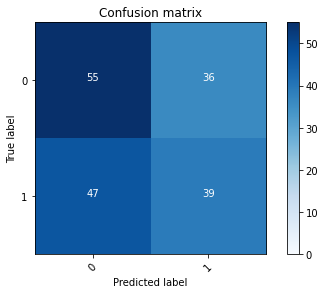

2022-08-20 19:18:16 - [Epoch Train: 53] loss: 0.0569, auc: 0.9995, acc: 0.9826, time: 51.00 s            
2022-08-20 19:18:16 - [Epoch Valid: 53] loss: 1.9697, auc: 0.5289, acc: 0.5292, time: 13.00 s


 53%|██████████████████████▎                   | 53/100 [56:58<50:37, 64.64s/it]

2022-08-20 19:18:16 - EPOCH: 54
2022-08-20 19:18:17 - Train Step 10/977, train_loss: 0.0124
2022-08-20 19:18:17 - Train Step 20/977, train_loss: 0.0495
2022-08-20 19:18:18 - Train Step 30/977, train_loss: 0.0351
2022-08-20 19:18:18 - Train Step 40/977, train_loss: 0.0540
2022-08-20 19:18:19 - Train Step 50/977, train_loss: 0.0444
2022-08-20 19:18:19 - Train Step 60/977, train_loss: 0.0404
2022-08-20 19:18:20 - Train Step 70/977, train_loss: 0.0382
2022-08-20 19:18:20 - Train Step 80/977, train_loss: 0.0348
2022-08-20 19:18:21 - Train Step 90/977, train_loss: 0.0333
2022-08-20 19:18:22 - Train Step 100/977, train_loss: 0.0356
2022-08-20 19:18:22 - Train Step 110/977, train_loss: 0.0334
2022-08-20 19:18:23 - Train Step 120/977, train_loss: 0.0320
2022-08-20 19:18:23 - Train Step 130/977, train_loss: 0.0345
2022-08-20 19:18:24 - Train Step 140/977, train_loss: 0.0361
2022-08-20 19:18:24 - Train Step 150/977, train_loss: 0.0356
2022-08-20 19:18:25 - Train Step 160/977, train_loss: 0.0370
2

2022-08-20 19:19:17 - Valid Step 185/257, valid_loss: 2.1462
2022-08-20 19:19:17 - Valid Step 190/257, valid_loss: 2.1305
2022-08-20 19:19:18 - Valid Step 195/257, valid_loss: 2.1074
2022-08-20 19:19:18 - Valid Step 200/257, valid_loss: 2.0787
2022-08-20 19:19:18 - Valid Step 205/257, valid_loss: 2.0695
2022-08-20 19:19:18 - Valid Step 210/257, valid_loss: 2.0499
2022-08-20 19:19:19 - Valid Step 215/257, valid_loss: 2.0215
2022-08-20 19:19:19 - Valid Step 220/257, valid_loss: 1.9943
2022-08-20 19:19:19 - Valid Step 225/257, valid_loss: 1.9656
2022-08-20 19:19:19 - Valid Step 230/257, valid_loss: 1.9607
2022-08-20 19:19:20 - Valid Step 235/257, valid_loss: 1.9842
2022-08-20 19:19:20 - Valid Step 240/257, valid_loss: 1.9902
2022-08-20 19:19:20 - Valid Step 245/257, valid_loss: 2.0441
2022-08-20 19:19:21 - Valid Step 250/257, valid_loss: 2.0494
2022-08-20 19:19:21 - Valid Step 255/257, valid_loss: 2.0532
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

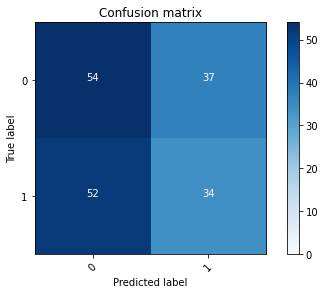

2022-08-20 19:19:21 - [Epoch Train: 54] loss: 0.0476, auc: 0.9994, acc: 0.9867, time: 51.00 s            
2022-08-20 19:19:21 - [Epoch Valid: 54] loss: 2.0512, auc: 0.5220, acc: 0.5097, time: 13.00 s


 54%|██████████████████████▋                   | 54/100 [58:03<49:37, 64.72s/it]

2022-08-20 19:19:21 - EPOCH: 55
2022-08-20 19:19:22 - Train Step 10/977, train_loss: 0.0852
2022-08-20 19:19:22 - Train Step 20/977, train_loss: 0.0606
2022-08-20 19:19:23 - Train Step 30/977, train_loss: 0.0480
2022-08-20 19:19:23 - Train Step 40/977, train_loss: 0.0419
2022-08-20 19:19:24 - Train Step 50/977, train_loss: 0.0401
2022-08-20 19:19:24 - Train Step 60/977, train_loss: 0.0383
2022-08-20 19:19:25 - Train Step 70/977, train_loss: 0.0435
2022-08-20 19:19:26 - Train Step 80/977, train_loss: 0.0421
2022-08-20 19:19:26 - Train Step 90/977, train_loss: 0.0463
2022-08-20 19:19:27 - Train Step 100/977, train_loss: 0.0441
2022-08-20 19:19:27 - Train Step 110/977, train_loss: 0.0507
2022-08-20 19:19:28 - Train Step 120/977, train_loss: 0.0500
2022-08-20 19:19:28 - Train Step 130/977, train_loss: 0.0499
2022-08-20 19:19:29 - Train Step 140/977, train_loss: 0.0478
2022-08-20 19:19:29 - Train Step 150/977, train_loss: 0.0451
2022-08-20 19:19:30 - Train Step 160/977, train_loss: 0.0457
2

2022-08-20 19:20:22 - Valid Step 185/257, valid_loss: 1.9758
2022-08-20 19:20:22 - Valid Step 190/257, valid_loss: 1.9941
2022-08-20 19:20:23 - Valid Step 195/257, valid_loss: 2.0204
2022-08-20 19:20:23 - Valid Step 200/257, valid_loss: 2.0450
2022-08-20 19:20:23 - Valid Step 205/257, valid_loss: 2.0795
2022-08-20 19:20:23 - Valid Step 210/257, valid_loss: 2.1226
2022-08-20 19:20:24 - Valid Step 215/257, valid_loss: 2.1045
2022-08-20 19:20:24 - Valid Step 220/257, valid_loss: 2.2094
2022-08-20 19:20:24 - Valid Step 225/257, valid_loss: 2.2650
2022-08-20 19:20:24 - Valid Step 230/257, valid_loss: 2.2312
2022-08-20 19:20:25 - Valid Step 235/257, valid_loss: 2.2713
2022-08-20 19:20:25 - Valid Step 240/257, valid_loss: 2.2251
2022-08-20 19:20:25 - Valid Step 245/257, valid_loss: 2.2006
2022-08-20 19:20:25 - Valid Step 250/257, valid_loss: 2.2004
2022-08-20 19:20:26 - Valid Step 255/257, valid_loss: 2.2184
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

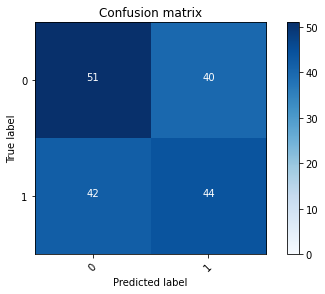

2022-08-20 19:20:26 - [Epoch Train: 55] loss: 0.0399, auc: 1.0000, acc: 0.9918, time: 51.00 s            
2022-08-20 19:20:26 - [Epoch Valid: 55] loss: 2.2163, auc: 0.5298, acc: 0.5331, time: 13.00 s


 55%|███████████████████████                   | 55/100 [59:08<48:35, 64.79s/it]

2022-08-20 19:20:26 - EPOCH: 56
2022-08-20 19:20:27 - Train Step 10/977, train_loss: 0.0175
2022-08-20 19:20:27 - Train Step 20/977, train_loss: 0.0267
2022-08-20 19:20:28 - Train Step 30/977, train_loss: 0.0236
2022-08-20 19:20:28 - Train Step 40/977, train_loss: 0.0442
2022-08-20 19:20:29 - Train Step 50/977, train_loss: 0.0402
2022-08-20 19:20:29 - Train Step 60/977, train_loss: 0.0382
2022-08-20 19:20:30 - Train Step 70/977, train_loss: 0.0403
2022-08-20 19:20:30 - Train Step 80/977, train_loss: 0.0369
2022-08-20 19:20:31 - Train Step 90/977, train_loss: 0.0343
2022-08-20 19:20:31 - Train Step 100/977, train_loss: 0.0321
2022-08-20 19:20:32 - Train Step 110/977, train_loss: 0.0433
2022-08-20 19:20:32 - Train Step 120/977, train_loss: 0.0425
2022-08-20 19:20:33 - Train Step 130/977, train_loss: 0.0490
2022-08-20 19:20:33 - Train Step 140/977, train_loss: 0.0474
2022-08-20 19:20:34 - Train Step 150/977, train_loss: 0.0447
2022-08-20 19:20:34 - Train Step 160/977, train_loss: 0.0440
2

2022-08-20 19:21:26 - Valid Step 185/257, valid_loss: 2.4571
2022-08-20 19:21:26 - Valid Step 190/257, valid_loss: 2.4197
2022-08-20 19:21:27 - Valid Step 195/257, valid_loss: 2.3698
2022-08-20 19:21:27 - Valid Step 200/257, valid_loss: 2.3515
2022-08-20 19:21:27 - Valid Step 205/257, valid_loss: 2.3711
2022-08-20 19:21:27 - Valid Step 210/257, valid_loss: 2.3845
2022-08-20 19:21:28 - Valid Step 215/257, valid_loss: 2.3556
2022-08-20 19:21:28 - Valid Step 220/257, valid_loss: 2.3842
2022-08-20 19:21:28 - Valid Step 225/257, valid_loss: 2.3367
2022-08-20 19:21:28 - Valid Step 230/257, valid_loss: 2.3519
2022-08-20 19:21:29 - Valid Step 235/257, valid_loss: 2.3605
2022-08-20 19:21:29 - Valid Step 240/257, valid_loss: 2.3122
2022-08-20 19:21:29 - Valid Step 245/257, valid_loss: 2.2999
2022-08-20 19:21:29 - Valid Step 250/257, valid_loss: 2.3001
2022-08-20 19:21:30 - Valid Step 255/257, valid_loss: 2.2766
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

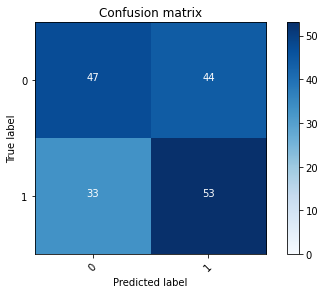

2022-08-20 19:21:30 - [Epoch Train: 56] loss: 0.0406, auc: 0.9997, acc: 0.9928, time: 50.00 s            
2022-08-20 19:21:30 - [Epoch Valid: 56] loss: 2.2754, auc: 0.5404, acc: 0.5837, time: 13.00 s
2022-08-20 19:21:30 - acc improved from 0.5681 to 0.5837. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_18-21-17/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e56-loss2.275-acc0.584-auc0.540.pth'


 56%|██████████████████████▍                 | 56/100 [1:00:12<47:20, 64.56s/it]

2022-08-20 19:21:30 - EPOCH: 57
2022-08-20 19:21:31 - Train Step 10/977, train_loss: 0.0333
2022-08-20 19:21:31 - Train Step 20/977, train_loss: 0.1380
2022-08-20 19:21:32 - Train Step 30/977, train_loss: 0.1055
2022-08-20 19:21:32 - Train Step 40/977, train_loss: 0.0905
2022-08-20 19:21:33 - Train Step 50/977, train_loss: 0.0777
2022-08-20 19:21:33 - Train Step 60/977, train_loss: 0.0894
2022-08-20 19:21:34 - Train Step 70/977, train_loss: 0.0782
2022-08-20 19:21:34 - Train Step 80/977, train_loss: 0.0748
2022-08-20 19:21:35 - Train Step 90/977, train_loss: 0.0762
2022-08-20 19:21:35 - Train Step 100/977, train_loss: 0.0696
2022-08-20 19:21:36 - Train Step 110/977, train_loss: 0.0648
2022-08-20 19:21:36 - Train Step 120/977, train_loss: 0.0600
2022-08-20 19:21:37 - Train Step 130/977, train_loss: 0.0562
2022-08-20 19:21:37 - Train Step 140/977, train_loss: 0.0583
2022-08-20 19:21:38 - Train Step 150/977, train_loss: 0.0561
2022-08-20 19:21:38 - Train Step 160/977, train_loss: 0.0539
2

2022-08-20 19:22:30 - Valid Step 185/257, valid_loss: 2.2474
2022-08-20 19:22:30 - Valid Step 190/257, valid_loss: 2.2697
2022-08-20 19:22:31 - Valid Step 195/257, valid_loss: 2.2679
2022-08-20 19:22:31 - Valid Step 200/257, valid_loss: 2.2634
2022-08-20 19:22:31 - Valid Step 205/257, valid_loss: 2.3249
2022-08-20 19:22:31 - Valid Step 210/257, valid_loss: 2.3101
2022-08-20 19:22:32 - Valid Step 215/257, valid_loss: 2.2737
2022-08-20 19:22:32 - Valid Step 220/257, valid_loss: 2.2976
2022-08-20 19:22:32 - Valid Step 225/257, valid_loss: 2.2903
2022-08-20 19:22:32 - Valid Step 230/257, valid_loss: 2.2755
2022-08-20 19:22:33 - Valid Step 235/257, valid_loss: 2.2953
2022-08-20 19:22:33 - Valid Step 240/257, valid_loss: 2.2520
2022-08-20 19:22:33 - Valid Step 245/257, valid_loss: 2.2392
2022-08-20 19:22:33 - Valid Step 250/257, valid_loss: 2.2067
2022-08-20 19:22:34 - Valid Step 255/257, valid_loss: 2.2075
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

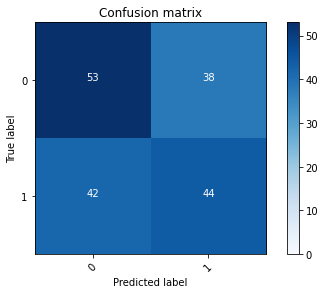

2022-08-20 19:22:34 - [Epoch Train: 57] loss: 0.0453, auc: 0.9993, acc: 0.9867, time: 50.00 s            
2022-08-20 19:22:34 - [Epoch Valid: 57] loss: 2.1910, auc: 0.5322, acc: 0.5564, time: 13.00 s


 57%|██████████████████████▊                 | 57/100 [1:01:16<46:09, 64.42s/it]

2022-08-20 19:22:34 - EPOCH: 58
2022-08-20 19:22:35 - Train Step 10/977, train_loss: 0.0560
2022-08-20 19:22:35 - Train Step 20/977, train_loss: 0.0371
2022-08-20 19:22:36 - Train Step 30/977, train_loss: 0.0294
2022-08-20 19:22:36 - Train Step 40/977, train_loss: 0.0296
2022-08-20 19:22:37 - Train Step 50/977, train_loss: 0.0239
2022-08-20 19:22:37 - Train Step 60/977, train_loss: 0.0236
2022-08-20 19:22:38 - Train Step 70/977, train_loss: 0.0209
2022-08-20 19:22:38 - Train Step 80/977, train_loss: 0.0189
2022-08-20 19:22:39 - Train Step 90/977, train_loss: 0.0196
2022-08-20 19:22:39 - Train Step 100/977, train_loss: 0.0236
2022-08-20 19:22:40 - Train Step 110/977, train_loss: 0.0219
2022-08-20 19:22:41 - Train Step 120/977, train_loss: 0.0207
2022-08-20 19:22:41 - Train Step 130/977, train_loss: 0.0201
2022-08-20 19:22:42 - Train Step 140/977, train_loss: 0.0249
2022-08-20 19:22:42 - Train Step 150/977, train_loss: 0.0246
2022-08-20 19:22:43 - Train Step 160/977, train_loss: 0.0251
2

2022-08-20 19:23:35 - Valid Step 185/257, valid_loss: 2.3045
2022-08-20 19:23:35 - Valid Step 190/257, valid_loss: 2.3635
2022-08-20 19:23:35 - Valid Step 195/257, valid_loss: 2.3661
2022-08-20 19:23:35 - Valid Step 200/257, valid_loss: 2.4052
2022-08-20 19:23:36 - Valid Step 205/257, valid_loss: 2.4244
2022-08-20 19:23:36 - Valid Step 210/257, valid_loss: 2.4392
2022-08-20 19:23:36 - Valid Step 215/257, valid_loss: 2.4155
2022-08-20 19:23:36 - Valid Step 220/257, valid_loss: 2.4053
2022-08-20 19:23:37 - Valid Step 225/257, valid_loss: 2.3567
2022-08-20 19:23:37 - Valid Step 230/257, valid_loss: 2.3790
2022-08-20 19:23:37 - Valid Step 235/257, valid_loss: 2.3737
2022-08-20 19:23:38 - Valid Step 240/257, valid_loss: 2.4163
2022-08-20 19:23:38 - Valid Step 245/257, valid_loss: 2.3942
2022-08-20 19:23:38 - Valid Step 250/257, valid_loss: 2.4010
2022-08-20 19:23:38 - Valid Step 255/257, valid_loss: 2.3952
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

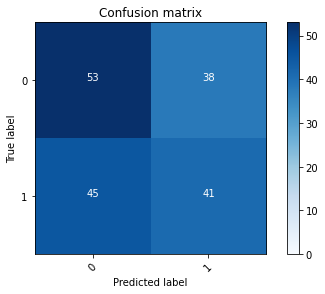

2022-08-20 19:23:39 - [Epoch Train: 58] loss: 0.0368, auc: 0.9999, acc: 0.9928, time: 50.00 s            
2022-08-20 19:23:39 - [Epoch Valid: 58] loss: 2.3771, auc: 0.5318, acc: 0.5370, time: 13.00 s


 58%|███████████████████████▏                | 58/100 [1:02:21<45:07, 64.46s/it]

2022-08-20 19:23:39 - EPOCH: 59
2022-08-20 19:23:39 - Train Step 10/977, train_loss: 0.0686
2022-08-20 19:23:40 - Train Step 20/977, train_loss: 0.0385
2022-08-20 19:23:40 - Train Step 30/977, train_loss: 0.0689
2022-08-20 19:23:41 - Train Step 40/977, train_loss: 0.0631
2022-08-20 19:23:41 - Train Step 50/977, train_loss: 0.0934
2022-08-20 19:23:42 - Train Step 60/977, train_loss: 0.0799
2022-08-20 19:23:42 - Train Step 70/977, train_loss: 0.0800
2022-08-20 19:23:43 - Train Step 80/977, train_loss: 0.0722
2022-08-20 19:23:43 - Train Step 90/977, train_loss: 0.0721
2022-08-20 19:23:44 - Train Step 100/977, train_loss: 0.0660
2022-08-20 19:23:44 - Train Step 110/977, train_loss: 0.0607
2022-08-20 19:23:45 - Train Step 120/977, train_loss: 0.0593
2022-08-20 19:23:46 - Train Step 130/977, train_loss: 0.0553
2022-08-20 19:23:46 - Train Step 140/977, train_loss: 0.0620
2022-08-20 19:23:47 - Train Step 150/977, train_loss: 0.0600
2022-08-20 19:23:47 - Train Step 160/977, train_loss: 0.0596
2

2022-08-20 19:24:39 - Valid Step 185/257, valid_loss: 2.6139
2022-08-20 19:24:39 - Valid Step 190/257, valid_loss: 2.5570
2022-08-20 19:24:40 - Valid Step 195/257, valid_loss: 2.5289
2022-08-20 19:24:40 - Valid Step 200/257, valid_loss: 2.4866
2022-08-20 19:24:40 - Valid Step 205/257, valid_loss: 2.4259
2022-08-20 19:24:40 - Valid Step 210/257, valid_loss: 2.3752
2022-08-20 19:24:41 - Valid Step 215/257, valid_loss: 2.3650
2022-08-20 19:24:41 - Valid Step 220/257, valid_loss: 2.3487
2022-08-20 19:24:41 - Valid Step 225/257, valid_loss: 2.3240
2022-08-20 19:24:41 - Valid Step 230/257, valid_loss: 2.3886
2022-08-20 19:24:42 - Valid Step 235/257, valid_loss: 2.3474
2022-08-20 19:24:42 - Valid Step 240/257, valid_loss: 2.4112
2022-08-20 19:24:42 - Valid Step 245/257, valid_loss: 2.4388
2022-08-20 19:24:42 - Valid Step 250/257, valid_loss: 2.3909
2022-08-20 19:24:43 - Valid Step 255/257, valid_loss: 2.3789
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

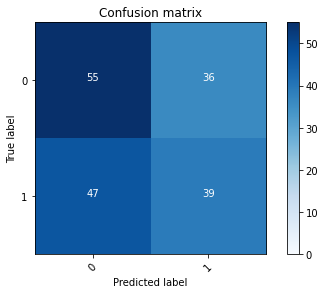

2022-08-20 19:24:43 - [Epoch Train: 59] loss: 0.0374, auc: 0.9998, acc: 0.9918, time: 50.00 s            
2022-08-20 19:24:43 - [Epoch Valid: 59] loss: 2.3620, auc: 0.5334, acc: 0.5331, time: 13.00 s


 59%|███████████████████████▌                | 59/100 [1:03:25<44:00, 64.40s/it]

2022-08-20 19:24:43 - EPOCH: 60
2022-08-20 19:24:44 - Train Step 10/977, train_loss: 0.0081
2022-08-20 19:24:44 - Train Step 20/977, train_loss: 0.0125
2022-08-20 19:24:45 - Train Step 30/977, train_loss: 0.0313
2022-08-20 19:24:45 - Train Step 40/977, train_loss: 0.0273
2022-08-20 19:24:46 - Train Step 50/977, train_loss: 0.0225
2022-08-20 19:24:46 - Train Step 60/977, train_loss: 0.0206
2022-08-20 19:24:47 - Train Step 70/977, train_loss: 0.0234
2022-08-20 19:24:47 - Train Step 80/977, train_loss: 0.0432
2022-08-20 19:24:48 - Train Step 90/977, train_loss: 0.0483
2022-08-20 19:24:48 - Train Step 100/977, train_loss: 0.0442
2022-08-20 19:24:49 - Train Step 110/977, train_loss: 0.0418
2022-08-20 19:24:49 - Train Step 120/977, train_loss: 0.0391
2022-08-20 19:24:50 - Train Step 130/977, train_loss: 0.0365
2022-08-20 19:24:50 - Train Step 140/977, train_loss: 0.0342
2022-08-20 19:24:51 - Train Step 150/977, train_loss: 0.0321
2022-08-20 19:24:51 - Train Step 160/977, train_loss: 0.0328
2

2022-08-20 19:25:43 - Valid Step 185/257, valid_loss: 2.4226
2022-08-20 19:25:44 - Valid Step 190/257, valid_loss: 2.3796
2022-08-20 19:25:44 - Valid Step 195/257, valid_loss: 2.3579
2022-08-20 19:25:44 - Valid Step 200/257, valid_loss: 2.3083
2022-08-20 19:25:45 - Valid Step 205/257, valid_loss: 2.3107
2022-08-20 19:25:45 - Valid Step 210/257, valid_loss: 2.2859
2022-08-20 19:25:45 - Valid Step 215/257, valid_loss: 2.2652
2022-08-20 19:25:45 - Valid Step 220/257, valid_loss: 2.2556
2022-08-20 19:25:46 - Valid Step 225/257, valid_loss: 2.2226
2022-08-20 19:25:46 - Valid Step 230/257, valid_loss: 2.2051
2022-08-20 19:25:46 - Valid Step 235/257, valid_loss: 2.2170
2022-08-20 19:25:46 - Valid Step 240/257, valid_loss: 2.2138
2022-08-20 19:25:47 - Valid Step 245/257, valid_loss: 2.2416
2022-08-20 19:25:47 - Valid Step 250/257, valid_loss: 2.2108
2022-08-20 19:25:47 - Valid Step 255/257, valid_loss: 2.1826
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

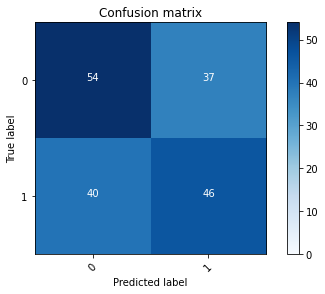

2022-08-20 19:25:47 - [Epoch Train: 60] loss: 0.0313, auc: 0.9999, acc: 0.9898, time: 50.00 s            
2022-08-20 19:25:47 - [Epoch Valid: 60] loss: 2.1659, auc: 0.5427, acc: 0.5798, time: 13.00 s


 60%|████████████████████████                | 60/100 [1:04:30<42:56, 64.42s/it]

2022-08-20 19:25:47 - EPOCH: 61
2022-08-20 19:25:48 - Train Step 10/977, train_loss: 0.0081
2022-08-20 19:25:49 - Train Step 20/977, train_loss: 0.0145
2022-08-20 19:25:49 - Train Step 30/977, train_loss: 0.0157
2022-08-20 19:25:50 - Train Step 40/977, train_loss: 0.0141
2022-08-20 19:25:50 - Train Step 50/977, train_loss: 0.0163
2022-08-20 19:25:51 - Train Step 60/977, train_loss: 0.0194
2022-08-20 19:25:51 - Train Step 70/977, train_loss: 0.0179
2022-08-20 19:25:52 - Train Step 80/977, train_loss: 0.0201
2022-08-20 19:25:52 - Train Step 90/977, train_loss: 0.0216
2022-08-20 19:25:53 - Train Step 100/977, train_loss: 0.0210
2022-08-20 19:25:53 - Train Step 110/977, train_loss: 0.0202
2022-08-20 19:25:54 - Train Step 120/977, train_loss: 0.0189
2022-08-20 19:25:54 - Train Step 130/977, train_loss: 0.0213
2022-08-20 19:25:55 - Train Step 140/977, train_loss: 0.0276
2022-08-20 19:25:55 - Train Step 150/977, train_loss: 0.0261
2022-08-20 19:25:56 - Train Step 160/977, train_loss: 0.0260
2

2022-08-20 19:26:48 - Valid Step 185/257, valid_loss: 2.0566
2022-08-20 19:26:48 - Valid Step 190/257, valid_loss: 2.1217
2022-08-20 19:26:48 - Valid Step 195/257, valid_loss: 2.1231
2022-08-20 19:26:48 - Valid Step 200/257, valid_loss: 2.2308
2022-08-20 19:26:49 - Valid Step 205/257, valid_loss: 2.2283
2022-08-20 19:26:49 - Valid Step 210/257, valid_loss: 2.1924
2022-08-20 19:26:49 - Valid Step 215/257, valid_loss: 2.2464
2022-08-20 19:26:49 - Valid Step 220/257, valid_loss: 2.2018
2022-08-20 19:26:50 - Valid Step 225/257, valid_loss: 2.1913
2022-08-20 19:26:50 - Valid Step 230/257, valid_loss: 2.2486
2022-08-20 19:26:50 - Valid Step 235/257, valid_loss: 2.3149
2022-08-20 19:26:50 - Valid Step 240/257, valid_loss: 2.3077
2022-08-20 19:26:51 - Valid Step 245/257, valid_loss: 2.3143
2022-08-20 19:26:51 - Valid Step 250/257, valid_loss: 2.2993
2022-08-20 19:26:51 - Valid Step 255/257, valid_loss: 2.3167
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

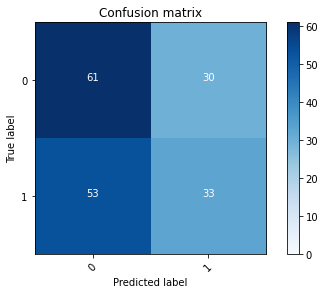

2022-08-20 19:26:51 - [Epoch Train: 61] loss: 0.0347, auc: 0.9997, acc: 0.9867, time: 50.00 s            
2022-08-20 19:26:51 - [Epoch Valid: 61] loss: 2.3556, auc: 0.5336, acc: 0.5447, time: 13.00 s


 61%|████████████████████████▍               | 61/100 [1:05:34<41:47, 64.31s/it]

2022-08-20 19:26:51 - EPOCH: 62
2022-08-20 19:26:52 - Train Step 10/977, train_loss: 0.1735
2022-08-20 19:26:53 - Train Step 20/977, train_loss: 0.0916
2022-08-20 19:26:53 - Train Step 30/977, train_loss: 0.0650
2022-08-20 19:26:54 - Train Step 40/977, train_loss: 0.0509
2022-08-20 19:26:54 - Train Step 50/977, train_loss: 0.0621
2022-08-20 19:26:55 - Train Step 60/977, train_loss: 0.0531
2022-08-20 19:26:55 - Train Step 70/977, train_loss: 0.0498
2022-08-20 19:26:56 - Train Step 80/977, train_loss: 0.0471
2022-08-20 19:26:56 - Train Step 90/977, train_loss: 0.0470
2022-08-20 19:26:57 - Train Step 100/977, train_loss: 0.0436
2022-08-20 19:26:57 - Train Step 110/977, train_loss: 0.0402
2022-08-20 19:26:58 - Train Step 120/977, train_loss: 0.0388
2022-08-20 19:26:58 - Train Step 130/977, train_loss: 0.0377
2022-08-20 19:26:59 - Train Step 140/977, train_loss: 0.0382
2022-08-20 19:26:59 - Train Step 150/977, train_loss: 0.0361
2022-08-20 19:27:00 - Train Step 160/977, train_loss: 0.0342
2

2022-08-20 19:27:53 - Valid Step 185/257, valid_loss: 2.3885
2022-08-20 19:27:53 - Valid Step 190/257, valid_loss: 2.3652
2022-08-20 19:27:53 - Valid Step 195/257, valid_loss: 2.3059
2022-08-20 19:27:53 - Valid Step 200/257, valid_loss: 2.2634
2022-08-20 19:27:54 - Valid Step 205/257, valid_loss: 2.3102
2022-08-20 19:27:54 - Valid Step 210/257, valid_loss: 2.3511
2022-08-20 19:27:54 - Valid Step 215/257, valid_loss: 2.3073
2022-08-20 19:27:54 - Valid Step 220/257, valid_loss: 2.3117
2022-08-20 19:27:55 - Valid Step 225/257, valid_loss: 2.2943
2022-08-20 19:27:55 - Valid Step 230/257, valid_loss: 2.2706
2022-08-20 19:27:55 - Valid Step 235/257, valid_loss: 2.2447
2022-08-20 19:27:55 - Valid Step 240/257, valid_loss: 2.2291
2022-08-20 19:27:56 - Valid Step 245/257, valid_loss: 2.1892
2022-08-20 19:27:56 - Valid Step 250/257, valid_loss: 2.1773
2022-08-20 19:27:56 - Valid Step 255/257, valid_loss: 2.1760
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

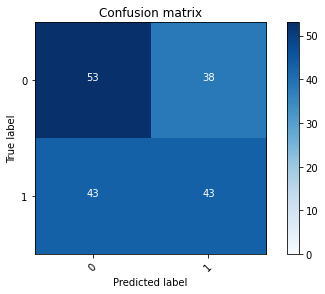

2022-08-20 19:27:56 - [Epoch Train: 62] loss: 0.0314, auc: 0.9997, acc: 0.9939, time: 51.00 s            
2022-08-20 19:27:56 - [Epoch Valid: 62] loss: 2.1692, auc: 0.5345, acc: 0.5486, time: 13.00 s


 62%|████████████████████████▊               | 62/100 [1:06:39<40:51, 64.51s/it]

2022-08-20 19:27:56 - EPOCH: 63
2022-08-20 19:27:57 - Train Step 10/977, train_loss: 0.0136
2022-08-20 19:27:58 - Train Step 20/977, train_loss: 0.0094
2022-08-20 19:27:58 - Train Step 30/977, train_loss: 0.0068
2022-08-20 19:27:59 - Train Step 40/977, train_loss: 0.0199
2022-08-20 19:27:59 - Train Step 50/977, train_loss: 0.0226
2022-08-20 19:28:00 - Train Step 60/977, train_loss: 0.0212
2022-08-20 19:28:00 - Train Step 70/977, train_loss: 0.0198
2022-08-20 19:28:01 - Train Step 80/977, train_loss: 0.0181
2022-08-20 19:28:01 - Train Step 90/977, train_loss: 0.0181
2022-08-20 19:28:02 - Train Step 100/977, train_loss: 0.0188
2022-08-20 19:28:02 - Train Step 110/977, train_loss: 0.0172
2022-08-20 19:28:03 - Train Step 120/977, train_loss: 0.0170
2022-08-20 19:28:03 - Train Step 130/977, train_loss: 0.0189
2022-08-20 19:28:04 - Train Step 140/977, train_loss: 0.0202
2022-08-20 19:28:04 - Train Step 150/977, train_loss: 0.0193
2022-08-20 19:28:05 - Train Step 160/977, train_loss: 0.0186
2

2022-08-20 19:28:57 - Valid Step 185/257, valid_loss: 2.2431
2022-08-20 19:28:57 - Valid Step 190/257, valid_loss: 2.3016
2022-08-20 19:28:57 - Valid Step 195/257, valid_loss: 2.2725
2022-08-20 19:28:58 - Valid Step 200/257, valid_loss: 2.2358
2022-08-20 19:28:58 - Valid Step 205/257, valid_loss: 2.1953
2022-08-20 19:28:58 - Valid Step 210/257, valid_loss: 2.1909
2022-08-20 19:28:58 - Valid Step 215/257, valid_loss: 2.1858
2022-08-20 19:28:59 - Valid Step 220/257, valid_loss: 2.1626
2022-08-20 19:28:59 - Valid Step 225/257, valid_loss: 2.1394
2022-08-20 19:28:59 - Valid Step 230/257, valid_loss: 2.1064
2022-08-20 19:28:59 - Valid Step 235/257, valid_loss: 2.1171
2022-08-20 19:29:00 - Valid Step 240/257, valid_loss: 2.0998
2022-08-20 19:29:00 - Valid Step 245/257, valid_loss: 2.0786
2022-08-20 19:29:00 - Valid Step 250/257, valid_loss: 2.1175
2022-08-20 19:29:00 - Valid Step 255/257, valid_loss: 2.0970
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

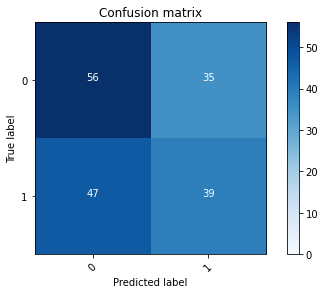

2022-08-20 19:29:01 - [Epoch Train: 63] loss: 0.0336, auc: 0.9997, acc: 0.9898, time: 50.00 s            
2022-08-20 19:29:01 - [Epoch Valid: 63] loss: 2.1086, auc: 0.5369, acc: 0.5409, time: 13.00 s


 63%|█████████████████████████▏              | 63/100 [1:07:43<39:44, 64.45s/it]

2022-08-20 19:29:01 - EPOCH: 64
2022-08-20 19:29:01 - Train Step 10/977, train_loss: 0.0340
2022-08-20 19:29:02 - Train Step 20/977, train_loss: 0.0295
2022-08-20 19:29:02 - Train Step 30/977, train_loss: 0.0259
2022-08-20 19:29:03 - Train Step 40/977, train_loss: 0.0302
2022-08-20 19:29:03 - Train Step 50/977, train_loss: 0.0300
2022-08-20 19:29:04 - Train Step 60/977, train_loss: 0.0256
2022-08-20 19:29:04 - Train Step 70/977, train_loss: 0.0238
2022-08-20 19:29:05 - Train Step 80/977, train_loss: 0.0250
2022-08-20 19:29:06 - Train Step 90/977, train_loss: 0.0286
2022-08-20 19:29:06 - Train Step 100/977, train_loss: 0.0273
2022-08-20 19:29:07 - Train Step 110/977, train_loss: 0.0263
2022-08-20 19:29:07 - Train Step 120/977, train_loss: 0.0257
2022-08-20 19:29:08 - Train Step 130/977, train_loss: 0.0240
2022-08-20 19:29:08 - Train Step 140/977, train_loss: 0.0235
2022-08-20 19:29:09 - Train Step 150/977, train_loss: 0.0261
2022-08-20 19:29:09 - Train Step 160/977, train_loss: 0.0282
2

2022-08-20 19:30:10 - Valid Step 185/257, valid_loss: 2.1860
2022-08-20 19:30:11 - Valid Step 190/257, valid_loss: 2.2098
2022-08-20 19:30:11 - Valid Step 195/257, valid_loss: 2.2813
2022-08-20 19:30:11 - Valid Step 200/257, valid_loss: 2.3155
2022-08-20 19:30:11 - Valid Step 205/257, valid_loss: 2.3281
2022-08-20 19:30:12 - Valid Step 210/257, valid_loss: 2.4272
2022-08-20 19:30:12 - Valid Step 215/257, valid_loss: 2.3767
2022-08-20 19:30:12 - Valid Step 220/257, valid_loss: 2.3763
2022-08-20 19:30:13 - Valid Step 225/257, valid_loss: 2.3548
2022-08-20 19:30:13 - Valid Step 230/257, valid_loss: 2.3587
2022-08-20 19:30:13 - Valid Step 235/257, valid_loss: 2.3940
2022-08-20 19:30:13 - Valid Step 240/257, valid_loss: 2.3811
2022-08-20 19:30:14 - Valid Step 245/257, valid_loss: 2.3409
2022-08-20 19:30:14 - Valid Step 250/257, valid_loss: 2.3239
2022-08-20 19:30:14 - Valid Step 255/257, valid_loss: 2.4350
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

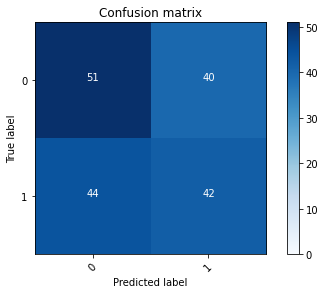

2022-08-20 19:30:15 - [Epoch Train: 64] loss: 0.0279, auc: 0.9999, acc: 0.9939, time: 58.00 s            
2022-08-20 19:30:15 - [Epoch Valid: 64] loss: 2.4167, auc: 0.5359, acc: 0.5253, time: 15.00 s


 64%|█████████████████████████▌              | 64/100 [1:08:57<40:22, 67.30s/it]

2022-08-20 19:30:15 - EPOCH: 65
2022-08-20 19:30:15 - Train Step 10/977, train_loss: 0.0108
2022-08-20 19:30:16 - Train Step 20/977, train_loss: 0.0062
2022-08-20 19:30:17 - Train Step 30/977, train_loss: 0.0196
2022-08-20 19:30:17 - Train Step 40/977, train_loss: 0.0161
2022-08-20 19:30:18 - Train Step 50/977, train_loss: 0.0400
2022-08-20 19:30:18 - Train Step 60/977, train_loss: 0.0470
2022-08-20 19:30:19 - Train Step 70/977, train_loss: 0.0417
2022-08-20 19:30:20 - Train Step 80/977, train_loss: 0.0446
2022-08-20 19:30:20 - Train Step 90/977, train_loss: 0.0424
2022-08-20 19:30:21 - Train Step 100/977, train_loss: 0.0391
2022-08-20 19:30:21 - Train Step 110/977, train_loss: 0.0357
2022-08-20 19:30:22 - Train Step 120/977, train_loss: 0.0359
2022-08-20 19:30:23 - Train Step 130/977, train_loss: 0.0356
2022-08-20 19:30:23 - Train Step 140/977, train_loss: 0.0358
2022-08-20 19:30:24 - Train Step 150/977, train_loss: 0.0350
2022-08-20 19:30:24 - Train Step 160/977, train_loss: 0.0341
2

2022-08-20 19:31:25 - Valid Step 185/257, valid_loss: 2.6592
2022-08-20 19:31:25 - Valid Step 190/257, valid_loss: 2.6580
2022-08-20 19:31:26 - Valid Step 195/257, valid_loss: 2.6204
2022-08-20 19:31:26 - Valid Step 200/257, valid_loss: 2.7020
2022-08-20 19:31:26 - Valid Step 205/257, valid_loss: 2.6582
2022-08-20 19:31:27 - Valid Step 210/257, valid_loss: 2.6179
2022-08-20 19:31:27 - Valid Step 215/257, valid_loss: 2.5818
2022-08-20 19:31:27 - Valid Step 220/257, valid_loss: 2.5978
2022-08-20 19:31:27 - Valid Step 225/257, valid_loss: 2.5770
2022-08-20 19:31:28 - Valid Step 230/257, valid_loss: 2.5553
2022-08-20 19:31:28 - Valid Step 235/257, valid_loss: 2.5400
2022-08-20 19:31:28 - Valid Step 240/257, valid_loss: 2.4982
2022-08-20 19:31:29 - Valid Step 245/257, valid_loss: 2.4784
2022-08-20 19:31:29 - Valid Step 250/257, valid_loss: 2.4870
2022-08-20 19:31:29 - Valid Step 255/257, valid_loss: 2.5317
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

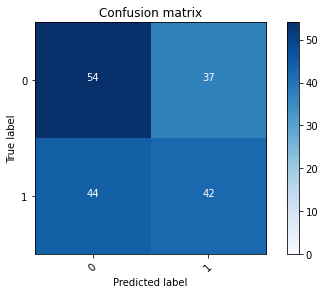

2022-08-20 19:31:29 - [Epoch Train: 65] loss: 0.0276, auc: 0.9997, acc: 0.9918, time: 59.00 s            
2022-08-20 19:31:29 - [Epoch Valid: 65] loss: 2.5161, auc: 0.5377, acc: 0.5525, time: 15.00 s


 65%|██████████████████████████              | 65/100 [1:10:12<40:34, 69.57s/it]

2022-08-20 19:31:29 - EPOCH: 66
2022-08-20 19:31:30 - Train Step 10/977, train_loss: 0.0013
2022-08-20 19:31:31 - Train Step 20/977, train_loss: 0.0061
2022-08-20 19:31:32 - Train Step 30/977, train_loss: 0.0067
2022-08-20 19:31:32 - Train Step 40/977, train_loss: 0.0072
2022-08-20 19:31:33 - Train Step 50/977, train_loss: 0.0071
2022-08-20 19:31:33 - Train Step 60/977, train_loss: 0.0180
2022-08-20 19:31:34 - Train Step 70/977, train_loss: 0.0223
2022-08-20 19:31:35 - Train Step 80/977, train_loss: 0.0256
2022-08-20 19:31:35 - Train Step 90/977, train_loss: 0.0234
2022-08-20 19:31:36 - Train Step 100/977, train_loss: 0.0216
2022-08-20 19:31:36 - Train Step 110/977, train_loss: 0.0257
2022-08-20 19:31:37 - Train Step 120/977, train_loss: 0.0315
2022-08-20 19:31:38 - Train Step 130/977, train_loss: 0.0303
2022-08-20 19:31:38 - Train Step 140/977, train_loss: 0.0359
2022-08-20 19:31:39 - Train Step 150/977, train_loss: 0.0337
2022-08-20 19:31:39 - Train Step 160/977, train_loss: 0.0327
2

2022-08-20 19:32:39 - Valid Step 185/257, valid_loss: 2.6546
2022-08-20 19:32:39 - Valid Step 190/257, valid_loss: 2.6532
2022-08-20 19:32:40 - Valid Step 195/257, valid_loss: 2.6182
2022-08-20 19:32:40 - Valid Step 200/257, valid_loss: 2.5685
2022-08-20 19:32:40 - Valid Step 205/257, valid_loss: 2.5769
2022-08-20 19:32:40 - Valid Step 210/257, valid_loss: 2.6050
2022-08-20 19:32:41 - Valid Step 215/257, valid_loss: 2.5510
2022-08-20 19:32:41 - Valid Step 220/257, valid_loss: 2.5322
2022-08-20 19:32:42 - Valid Step 225/257, valid_loss: 2.5255
2022-08-20 19:32:42 - Valid Step 230/257, valid_loss: 2.5244
2022-08-20 19:32:42 - Valid Step 235/257, valid_loss: 2.5157
2022-08-20 19:32:42 - Valid Step 240/257, valid_loss: 2.4784
2022-08-20 19:32:43 - Valid Step 245/257, valid_loss: 2.4786
2022-08-20 19:32:43 - Valid Step 250/257, valid_loss: 2.4841
2022-08-20 19:32:43 - Valid Step 255/257, valid_loss: 2.4785
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

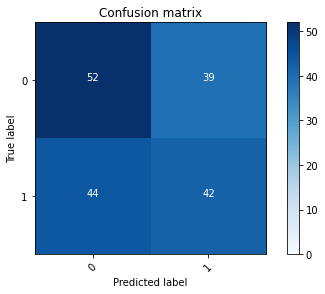

2022-08-20 19:32:44 - [Epoch Train: 66] loss: 0.0228, auc: 0.9999, acc: 0.9949, time: 57.00 s            
2022-08-20 19:32:44 - [Epoch Valid: 66] loss: 2.4595, auc: 0.5323, acc: 0.5409, time: 16.00 s


 66%|██████████████████████████▍             | 66/100 [1:11:26<40:11, 70.94s/it]

2022-08-20 19:32:44 - EPOCH: 67
2022-08-20 19:32:44 - Train Step 10/977, train_loss: 0.0202
2022-08-20 19:32:45 - Train Step 20/977, train_loss: 0.0207
2022-08-20 19:32:46 - Train Step 30/977, train_loss: 0.0218
2022-08-20 19:32:46 - Train Step 40/977, train_loss: 0.0174
2022-08-20 19:32:47 - Train Step 50/977, train_loss: 0.0416
2022-08-20 19:32:47 - Train Step 60/977, train_loss: 0.0368
2022-08-20 19:32:48 - Train Step 70/977, train_loss: 0.0340
2022-08-20 19:32:48 - Train Step 80/977, train_loss: 0.0299
2022-08-20 19:32:49 - Train Step 90/977, train_loss: 0.0299
2022-08-20 19:32:50 - Train Step 100/977, train_loss: 0.0326
2022-08-20 19:32:50 - Train Step 110/977, train_loss: 0.0314
2022-08-20 19:32:51 - Train Step 120/977, train_loss: 0.0315
2022-08-20 19:32:51 - Train Step 130/977, train_loss: 0.0305
2022-08-20 19:32:52 - Train Step 140/977, train_loss: 0.0289
2022-08-20 19:32:52 - Train Step 150/977, train_loss: 0.0273
2022-08-20 19:32:53 - Train Step 160/977, train_loss: 0.0262
2

2022-08-20 19:33:51 - Valid Step 185/257, valid_loss: 2.6187
2022-08-20 19:33:52 - Valid Step 190/257, valid_loss: 2.5738
2022-08-20 19:33:52 - Valid Step 195/257, valid_loss: 2.5081
2022-08-20 19:33:52 - Valid Step 200/257, valid_loss: 2.5293
2022-08-20 19:33:53 - Valid Step 205/257, valid_loss: 2.4800
2022-08-20 19:33:53 - Valid Step 210/257, valid_loss: 2.4819
2022-08-20 19:33:53 - Valid Step 215/257, valid_loss: 2.6230
2022-08-20 19:33:53 - Valid Step 220/257, valid_loss: 2.5859
2022-08-20 19:33:54 - Valid Step 225/257, valid_loss: 2.5605
2022-08-20 19:33:54 - Valid Step 230/257, valid_loss: 2.5263
2022-08-20 19:33:54 - Valid Step 235/257, valid_loss: 2.5617
2022-08-20 19:33:55 - Valid Step 240/257, valid_loss: 2.5630
2022-08-20 19:33:55 - Valid Step 245/257, valid_loss: 2.5828
2022-08-20 19:33:55 - Valid Step 250/257, valid_loss: 2.6330
2022-08-20 19:33:55 - Valid Step 255/257, valid_loss: 2.6360
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

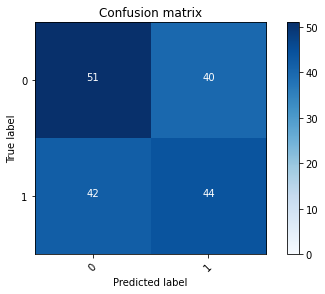

2022-08-20 19:33:56 - [Epoch Train: 67] loss: 0.0228, auc: 1.0000, acc: 0.9928, time: 56.00 s            
2022-08-20 19:33:56 - [Epoch Valid: 67] loss: 2.6420, auc: 0.5306, acc: 0.5603, time: 15.00 s


 67%|██████████████████████████▊             | 67/100 [1:12:38<39:13, 71.31s/it]

2022-08-20 19:33:56 - EPOCH: 68
2022-08-20 19:33:57 - Train Step 10/977, train_loss: 0.0048
2022-08-20 19:33:57 - Train Step 20/977, train_loss: 0.0034
2022-08-20 19:33:58 - Train Step 30/977, train_loss: 0.0054
2022-08-20 19:33:58 - Train Step 40/977, train_loss: 0.0082
2022-08-20 19:33:59 - Train Step 50/977, train_loss: 0.0068
2022-08-20 19:34:00 - Train Step 60/977, train_loss: 0.0080
2022-08-20 19:34:00 - Train Step 70/977, train_loss: 0.0117
2022-08-20 19:34:01 - Train Step 80/977, train_loss: 0.0155
2022-08-20 19:34:01 - Train Step 90/977, train_loss: 0.0151
2022-08-20 19:34:02 - Train Step 100/977, train_loss: 0.0141
2022-08-20 19:34:02 - Train Step 110/977, train_loss: 0.0152
2022-08-20 19:34:03 - Train Step 120/977, train_loss: 0.0162
2022-08-20 19:34:04 - Train Step 130/977, train_loss: 0.0159
2022-08-20 19:34:04 - Train Step 140/977, train_loss: 0.0177
2022-08-20 19:34:05 - Train Step 150/977, train_loss: 0.0167
2022-08-20 19:34:05 - Train Step 160/977, train_loss: 0.0160
2

2022-08-20 19:35:06 - Valid Step 185/257, valid_loss: 2.6508
2022-08-20 19:35:06 - Valid Step 190/257, valid_loss: 2.6034
2022-08-20 19:35:06 - Valid Step 195/257, valid_loss: 2.6289
2022-08-20 19:35:06 - Valid Step 200/257, valid_loss: 2.6892
2022-08-20 19:35:07 - Valid Step 205/257, valid_loss: 2.7229
2022-08-20 19:35:07 - Valid Step 210/257, valid_loss: 2.6777
2022-08-20 19:35:07 - Valid Step 215/257, valid_loss: 2.6725
2022-08-20 19:35:08 - Valid Step 220/257, valid_loss: 2.6873
2022-08-20 19:35:08 - Valid Step 225/257, valid_loss: 2.7148
2022-08-20 19:35:08 - Valid Step 230/257, valid_loss: 2.6588
2022-08-20 19:35:09 - Valid Step 235/257, valid_loss: 2.6050
2022-08-20 19:35:09 - Valid Step 240/257, valid_loss: 2.6572
2022-08-20 19:35:09 - Valid Step 245/257, valid_loss: 2.6305
2022-08-20 19:35:09 - Valid Step 250/257, valid_loss: 2.5964
2022-08-20 19:35:10 - Valid Step 255/257, valid_loss: 2.5679
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

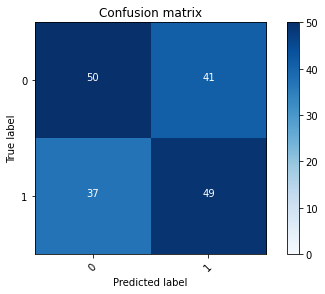

2022-08-20 19:35:10 - [Epoch Train: 68] loss: 0.0222, auc: 1.0000, acc: 0.9928, time: 59.00 s            
2022-08-20 19:35:10 - [Epoch Valid: 68] loss: 2.5485, auc: 0.5401, acc: 0.5914, time: 15.00 s
2022-08-20 19:35:10 - acc improved from 0.5837 to 0.5914. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_18-21-17/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e68-loss2.548-acc0.591-auc0.540.pth'


 68%|███████████████████████████▏            | 68/100 [1:13:52<38:29, 72.17s/it]

2022-08-20 19:35:10 - EPOCH: 69
2022-08-20 19:35:11 - Train Step 10/977, train_loss: 0.0034
2022-08-20 19:35:12 - Train Step 20/977, train_loss: 0.0020
2022-08-20 19:35:12 - Train Step 30/977, train_loss: 0.0027
2022-08-20 19:35:13 - Train Step 40/977, train_loss: 0.0029
2022-08-20 19:35:13 - Train Step 50/977, train_loss: 0.0133
2022-08-20 19:35:14 - Train Step 60/977, train_loss: 0.0129
2022-08-20 19:35:15 - Train Step 70/977, train_loss: 0.0135
2022-08-20 19:35:15 - Train Step 80/977, train_loss: 0.0153
2022-08-20 19:35:16 - Train Step 90/977, train_loss: 0.0143
2022-08-20 19:35:16 - Train Step 100/977, train_loss: 0.0196
2022-08-20 19:35:17 - Train Step 110/977, train_loss: 0.0182
2022-08-20 19:35:18 - Train Step 120/977, train_loss: 0.0240
2022-08-20 19:35:18 - Train Step 130/977, train_loss: 0.0232
2022-08-20 19:35:19 - Train Step 140/977, train_loss: 0.0299
2022-08-20 19:35:19 - Train Step 150/977, train_loss: 0.0284
2022-08-20 19:35:20 - Train Step 160/977, train_loss: 0.0296
2

2022-08-20 19:36:21 - Valid Step 185/257, valid_loss: 2.2802
2022-08-20 19:36:22 - Valid Step 190/257, valid_loss: 2.2249
2022-08-20 19:36:22 - Valid Step 195/257, valid_loss: 2.3179
2022-08-20 19:36:22 - Valid Step 200/257, valid_loss: 2.3535
2022-08-20 19:36:22 - Valid Step 205/257, valid_loss: 2.3586
2022-08-20 19:36:23 - Valid Step 210/257, valid_loss: 2.3427
2022-08-20 19:36:23 - Valid Step 215/257, valid_loss: 2.3268
2022-08-20 19:36:24 - Valid Step 220/257, valid_loss: 2.3118
2022-08-20 19:36:24 - Valid Step 225/257, valid_loss: 2.3687
2022-08-20 19:36:24 - Valid Step 230/257, valid_loss: 2.3480
2022-08-20 19:36:24 - Valid Step 235/257, valid_loss: 2.4219
2022-08-20 19:36:25 - Valid Step 240/257, valid_loss: 2.4574
2022-08-20 19:36:25 - Valid Step 245/257, valid_loss: 2.4257
2022-08-20 19:36:25 - Valid Step 250/257, valid_loss: 2.3829
2022-08-20 19:36:26 - Valid Step 255/257, valid_loss: 2.3711
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

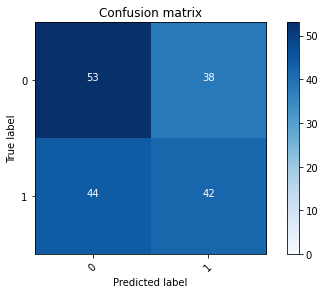

2022-08-20 19:36:26 - [Epoch Train: 69] loss: 0.0222, auc: 0.9999, acc: 0.9908, time: 59.00 s            
2022-08-20 19:36:26 - [Epoch Valid: 69] loss: 2.3952, auc: 0.5344, acc: 0.5370, time: 16.00 s


 69%|███████████████████████████▌            | 69/100 [1:15:08<37:52, 73.31s/it]

2022-08-20 19:36:26 - EPOCH: 70
2022-08-20 19:36:27 - Train Step 10/977, train_loss: 0.0041
2022-08-20 19:36:27 - Train Step 20/977, train_loss: 0.0083
2022-08-20 19:36:28 - Train Step 30/977, train_loss: 0.0067
2022-08-20 19:36:29 - Train Step 40/977, train_loss: 0.0090
2022-08-20 19:36:29 - Train Step 50/977, train_loss: 0.0083
2022-08-20 19:36:30 - Train Step 60/977, train_loss: 0.0073
2022-08-20 19:36:30 - Train Step 70/977, train_loss: 0.0074
2022-08-20 19:36:31 - Train Step 80/977, train_loss: 0.0087
2022-08-20 19:36:31 - Train Step 90/977, train_loss: 0.0090
2022-08-20 19:36:32 - Train Step 100/977, train_loss: 0.0086
2022-08-20 19:36:32 - Train Step 110/977, train_loss: 0.0083
2022-08-20 19:36:33 - Train Step 120/977, train_loss: 0.0077
2022-08-20 19:36:34 - Train Step 130/977, train_loss: 0.0132
2022-08-20 19:36:34 - Train Step 140/977, train_loss: 0.0128
2022-08-20 19:36:35 - Train Step 150/977, train_loss: 0.0123
2022-08-20 19:36:35 - Train Step 160/977, train_loss: 0.0119
2

2022-08-20 19:37:28 - Valid Step 185/257, valid_loss: 2.9416
2022-08-20 19:37:28 - Valid Step 190/257, valid_loss: 3.0477
2022-08-20 19:37:28 - Valid Step 195/257, valid_loss: 2.9744
2022-08-20 19:37:29 - Valid Step 200/257, valid_loss: 3.0015
2022-08-20 19:37:29 - Valid Step 205/257, valid_loss: 2.9409
2022-08-20 19:37:29 - Valid Step 210/257, valid_loss: 2.9453
2022-08-20 19:37:29 - Valid Step 215/257, valid_loss: 2.9363
2022-08-20 19:37:30 - Valid Step 220/257, valid_loss: 2.9331
2022-08-20 19:37:30 - Valid Step 225/257, valid_loss: 2.9550
2022-08-20 19:37:30 - Valid Step 230/257, valid_loss: 2.9228
2022-08-20 19:37:30 - Valid Step 235/257, valid_loss: 2.8933
2022-08-20 19:37:31 - Valid Step 240/257, valid_loss: 2.8448
2022-08-20 19:37:31 - Valid Step 245/257, valid_loss: 2.7925
2022-08-20 19:37:31 - Valid Step 250/257, valid_loss: 2.7630
2022-08-20 19:37:31 - Valid Step 255/257, valid_loss: 2.7158
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

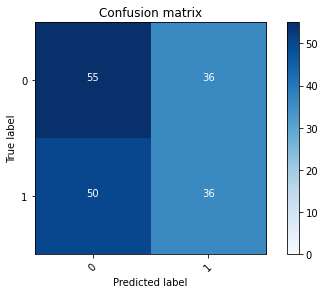

2022-08-20 19:37:32 - [Epoch Train: 70] loss: 0.0200, auc: 0.9999, acc: 0.9928, time: 51.00 s            
2022-08-20 19:37:32 - [Epoch Valid: 70] loss: 2.7214, auc: 0.5308, acc: 0.5214, time: 13.00 s


 70%|████████████████████████████            | 70/100 [1:16:14<35:29, 70.98s/it]

2022-08-20 19:37:32 - EPOCH: 71
2022-08-20 19:37:32 - Train Step 10/977, train_loss: 0.0339
2022-08-20 19:37:33 - Train Step 20/977, train_loss: 0.0308
2022-08-20 19:37:33 - Train Step 30/977, train_loss: 0.0247
2022-08-20 19:37:34 - Train Step 40/977, train_loss: 0.0198
2022-08-20 19:37:34 - Train Step 50/977, train_loss: 0.0218
2022-08-20 19:37:35 - Train Step 60/977, train_loss: 0.0183
2022-08-20 19:37:35 - Train Step 70/977, train_loss: 0.0170
2022-08-20 19:37:36 - Train Step 80/977, train_loss: 0.0158
2022-08-20 19:37:36 - Train Step 90/977, train_loss: 0.0147
2022-08-20 19:37:37 - Train Step 100/977, train_loss: 0.0138
2022-08-20 19:37:37 - Train Step 110/977, train_loss: 0.0125
2022-08-20 19:37:38 - Train Step 120/977, train_loss: 0.0116
2022-08-20 19:37:38 - Train Step 130/977, train_loss: 0.0116
2022-08-20 19:37:39 - Train Step 140/977, train_loss: 0.0115
2022-08-20 19:37:39 - Train Step 150/977, train_loss: 0.0124
2022-08-20 19:37:40 - Train Step 160/977, train_loss: 0.0179
2

2022-08-20 19:38:33 - Valid Step 185/257, valid_loss: 2.6224
2022-08-20 19:38:33 - Valid Step 190/257, valid_loss: 2.5966
2022-08-20 19:38:33 - Valid Step 195/257, valid_loss: 2.5935
2022-08-20 19:38:33 - Valid Step 200/257, valid_loss: 2.6725
2022-08-20 19:38:34 - Valid Step 205/257, valid_loss: 2.6723
2022-08-20 19:38:34 - Valid Step 210/257, valid_loss: 2.6299
2022-08-20 19:38:34 - Valid Step 215/257, valid_loss: 2.6604
2022-08-20 19:38:34 - Valid Step 220/257, valid_loss: 2.7009
2022-08-20 19:38:35 - Valid Step 225/257, valid_loss: 2.6858
2022-08-20 19:38:35 - Valid Step 230/257, valid_loss: 2.6278
2022-08-20 19:38:35 - Valid Step 235/257, valid_loss: 2.7443
2022-08-20 19:38:35 - Valid Step 240/257, valid_loss: 2.7569
2022-08-20 19:38:36 - Valid Step 245/257, valid_loss: 2.7503
2022-08-20 19:38:36 - Valid Step 250/257, valid_loss: 2.7266
2022-08-20 19:38:36 - Valid Step 255/257, valid_loss: 2.6945
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

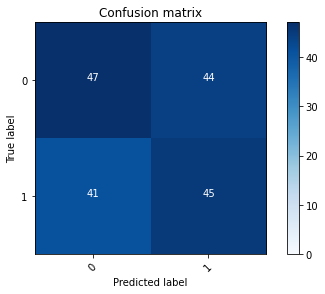

2022-08-20 19:38:36 - [Epoch Train: 71] loss: 0.0195, auc: 1.0000, acc: 0.9928, time: 51.00 s            
2022-08-20 19:38:36 - [Epoch Valid: 71] loss: 2.6738, auc: 0.5344, acc: 0.5292, time: 13.00 s


 71%|████████████████████████████▍           | 71/100 [1:17:19<33:25, 69.17s/it]

2022-08-20 19:38:36 - EPOCH: 72
2022-08-20 19:38:37 - Train Step 10/977, train_loss: 0.0191
2022-08-20 19:38:38 - Train Step 20/977, train_loss: 0.0530
2022-08-20 19:38:38 - Train Step 30/977, train_loss: 0.0373
2022-08-20 19:38:39 - Train Step 40/977, train_loss: 0.0298
2022-08-20 19:38:39 - Train Step 50/977, train_loss: 0.0284
2022-08-20 19:38:40 - Train Step 60/977, train_loss: 0.0261
2022-08-20 19:38:40 - Train Step 70/977, train_loss: 0.0262
2022-08-20 19:38:41 - Train Step 80/977, train_loss: 0.0233
2022-08-20 19:38:41 - Train Step 90/977, train_loss: 0.0212
2022-08-20 19:38:42 - Train Step 100/977, train_loss: 0.0197
2022-08-20 19:38:42 - Train Step 110/977, train_loss: 0.0181
2022-08-20 19:38:43 - Train Step 120/977, train_loss: 0.0171
2022-08-20 19:38:43 - Train Step 130/977, train_loss: 0.0159
2022-08-20 19:38:44 - Train Step 140/977, train_loss: 0.0166
2022-08-20 19:38:44 - Train Step 150/977, train_loss: 0.0172
2022-08-20 19:38:45 - Train Step 160/977, train_loss: 0.0171
2

2022-08-20 19:39:37 - Valid Step 185/257, valid_loss: 2.9480
2022-08-20 19:39:37 - Valid Step 190/257, valid_loss: 2.9280
2022-08-20 19:39:37 - Valid Step 195/257, valid_loss: 2.9155
2022-08-20 19:39:37 - Valid Step 200/257, valid_loss: 2.8818
2022-08-20 19:39:38 - Valid Step 205/257, valid_loss: 2.9327
2022-08-20 19:39:38 - Valid Step 210/257, valid_loss: 2.8912
2022-08-20 19:39:38 - Valid Step 215/257, valid_loss: 2.8686
2022-08-20 19:39:38 - Valid Step 220/257, valid_loss: 2.8450
2022-08-20 19:39:39 - Valid Step 225/257, valid_loss: 2.8693
2022-08-20 19:39:39 - Valid Step 230/257, valid_loss: 2.8511
2022-08-20 19:39:39 - Valid Step 235/257, valid_loss: 2.8393
2022-08-20 19:39:39 - Valid Step 240/257, valid_loss: 2.7901
2022-08-20 19:39:40 - Valid Step 245/257, valid_loss: 2.7418
2022-08-20 19:39:40 - Valid Step 250/257, valid_loss: 2.7120
2022-08-20 19:39:40 - Valid Step 255/257, valid_loss: 2.6636
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

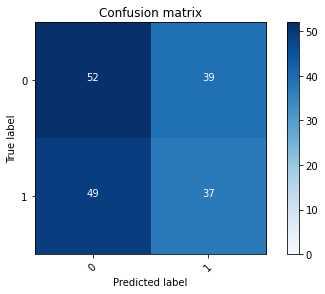

2022-08-20 19:39:40 - [Epoch Train: 72] loss: 0.0165, auc: 1.0000, acc: 0.9939, time: 50.00 s            
2022-08-20 19:39:40 - [Epoch Valid: 72] loss: 2.6624, auc: 0.5344, acc: 0.5136, time: 13.00 s


 72%|████████████████████████████▊           | 72/100 [1:18:23<31:33, 67.63s/it]

2022-08-20 19:39:40 - EPOCH: 73
2022-08-20 19:39:41 - Train Step 10/977, train_loss: 0.0031
2022-08-20 19:39:42 - Train Step 20/977, train_loss: 0.0064
2022-08-20 19:39:42 - Train Step 30/977, train_loss: 0.0068
2022-08-20 19:39:43 - Train Step 40/977, train_loss: 0.0059
2022-08-20 19:39:43 - Train Step 50/977, train_loss: 0.0057
2022-08-20 19:39:44 - Train Step 60/977, train_loss: 0.0051
2022-08-20 19:39:44 - Train Step 70/977, train_loss: 0.0056
2022-08-20 19:39:45 - Train Step 80/977, train_loss: 0.0061
2022-08-20 19:39:45 - Train Step 90/977, train_loss: 0.0074
2022-08-20 19:39:46 - Train Step 100/977, train_loss: 0.0071
2022-08-20 19:39:46 - Train Step 110/977, train_loss: 0.0113
2022-08-20 19:39:47 - Train Step 120/977, train_loss: 0.0177
2022-08-20 19:39:47 - Train Step 130/977, train_loss: 0.0258
2022-08-20 19:39:48 - Train Step 140/977, train_loss: 0.0260
2022-08-20 19:39:48 - Train Step 150/977, train_loss: 0.0255
2022-08-20 19:39:49 - Train Step 160/977, train_loss: 0.0243
2

2022-08-20 19:40:41 - Valid Step 185/257, valid_loss: 3.5438
2022-08-20 19:40:41 - Valid Step 190/257, valid_loss: 3.5641
2022-08-20 19:40:41 - Valid Step 195/257, valid_loss: 3.4728
2022-08-20 19:40:41 - Valid Step 200/257, valid_loss: 3.4825
2022-08-20 19:40:42 - Valid Step 205/257, valid_loss: 3.4549
2022-08-20 19:40:42 - Valid Step 210/257, valid_loss: 3.4669
2022-08-20 19:40:42 - Valid Step 215/257, valid_loss: 3.4566
2022-08-20 19:40:42 - Valid Step 220/257, valid_loss: 3.4842
2022-08-20 19:40:43 - Valid Step 225/257, valid_loss: 3.4147
2022-08-20 19:40:43 - Valid Step 230/257, valid_loss: 3.3677
2022-08-20 19:40:43 - Valid Step 235/257, valid_loss: 3.3373
2022-08-20 19:40:43 - Valid Step 240/257, valid_loss: 3.3003
2022-08-20 19:40:44 - Valid Step 245/257, valid_loss: 3.2719
2022-08-20 19:40:44 - Valid Step 250/257, valid_loss: 3.2401
2022-08-20 19:40:44 - Valid Step 255/257, valid_loss: 3.1782
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

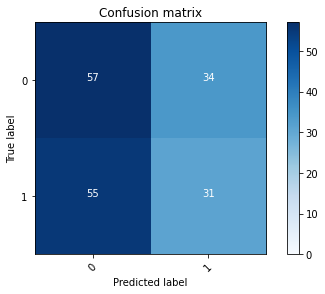

2022-08-20 19:40:45 - [Epoch Train: 73] loss: 0.0161, auc: 1.0000, acc: 0.9959, time: 50.00 s            
2022-08-20 19:40:45 - [Epoch Valid: 73] loss: 3.1713, auc: 0.5286, acc: 0.5175, time: 13.00 s


 73%|█████████████████████████████▏          | 73/100 [1:19:27<29:56, 66.54s/it]

2022-08-20 19:40:45 - EPOCH: 74
2022-08-20 19:40:45 - Train Step 10/977, train_loss: 0.0320
2022-08-20 19:40:46 - Train Step 20/977, train_loss: 0.0219
2022-08-20 19:40:46 - Train Step 30/977, train_loss: 0.0154
2022-08-20 19:40:47 - Train Step 40/977, train_loss: 0.0142
2022-08-20 19:40:47 - Train Step 50/977, train_loss: 0.0118
2022-08-20 19:40:48 - Train Step 60/977, train_loss: 0.0104
2022-08-20 19:40:48 - Train Step 70/977, train_loss: 0.0092
2022-08-20 19:40:49 - Train Step 80/977, train_loss: 0.0123
2022-08-20 19:40:49 - Train Step 90/977, train_loss: 0.0113
2022-08-20 19:40:50 - Train Step 100/977, train_loss: 0.0126
2022-08-20 19:40:51 - Train Step 110/977, train_loss: 0.0114
2022-08-20 19:40:51 - Train Step 120/977, train_loss: 0.0105
2022-08-20 19:40:52 - Train Step 130/977, train_loss: 0.0105
2022-08-20 19:40:52 - Train Step 140/977, train_loss: 0.0115
2022-08-20 19:40:53 - Train Step 150/977, train_loss: 0.0110
2022-08-20 19:40:53 - Train Step 160/977, train_loss: 0.0106
2

2022-08-20 19:41:45 - Valid Step 185/257, valid_loss: 2.6729
2022-08-20 19:41:45 - Valid Step 190/257, valid_loss: 2.6654
2022-08-20 19:41:46 - Valid Step 195/257, valid_loss: 2.7174
2022-08-20 19:41:46 - Valid Step 200/257, valid_loss: 2.7649
2022-08-20 19:41:46 - Valid Step 205/257, valid_loss: 2.7657
2022-08-20 19:41:47 - Valid Step 210/257, valid_loss: 2.7252
2022-08-20 19:41:47 - Valid Step 215/257, valid_loss: 2.7551
2022-08-20 19:41:47 - Valid Step 220/257, valid_loss: 2.7774
2022-08-20 19:41:47 - Valid Step 225/257, valid_loss: 2.8541
2022-08-20 19:41:48 - Valid Step 230/257, valid_loss: 2.8395
2022-08-20 19:41:48 - Valid Step 235/257, valid_loss: 2.7976
2022-08-20 19:41:48 - Valid Step 240/257, valid_loss: 2.8308
2022-08-20 19:41:48 - Valid Step 245/257, valid_loss: 2.8466
2022-08-20 19:41:49 - Valid Step 250/257, valid_loss: 2.8959
2022-08-20 19:41:49 - Valid Step 255/257, valid_loss: 2.8780
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

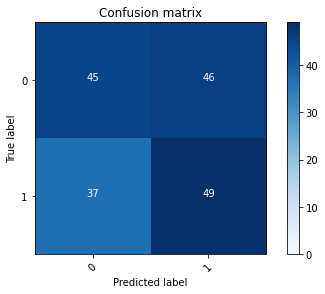

2022-08-20 19:41:49 - [Epoch Train: 74] loss: 0.0143, auc: 0.9999, acc: 0.9959, time: 50.00 s            
2022-08-20 19:41:49 - [Epoch Valid: 74] loss: 2.8663, auc: 0.5359, acc: 0.5525, time: 13.00 s


 74%|█████████████████████████████▌          | 74/100 [1:20:31<28:34, 65.96s/it]

2022-08-20 19:41:49 - EPOCH: 75
2022-08-20 19:41:50 - Train Step 10/977, train_loss: 0.0041
2022-08-20 19:41:50 - Train Step 20/977, train_loss: 0.0038
2022-08-20 19:41:51 - Train Step 30/977, train_loss: 0.0077
2022-08-20 19:41:51 - Train Step 40/977, train_loss: 0.0069
2022-08-20 19:41:52 - Train Step 50/977, train_loss: 0.0077
2022-08-20 19:41:53 - Train Step 60/977, train_loss: 0.0070
2022-08-20 19:41:53 - Train Step 70/977, train_loss: 0.0088
2022-08-20 19:41:54 - Train Step 80/977, train_loss: 0.0133
2022-08-20 19:41:54 - Train Step 90/977, train_loss: 0.0121
2022-08-20 19:41:55 - Train Step 100/977, train_loss: 0.0117
2022-08-20 19:41:55 - Train Step 110/977, train_loss: 0.0113
2022-08-20 19:41:56 - Train Step 120/977, train_loss: 0.0185
2022-08-20 19:41:56 - Train Step 130/977, train_loss: 0.0171
2022-08-20 19:41:57 - Train Step 140/977, train_loss: 0.0160
2022-08-20 19:41:57 - Train Step 150/977, train_loss: 0.0157
2022-08-20 19:41:58 - Train Step 160/977, train_loss: 0.0169
2

2022-08-20 19:42:50 - Valid Step 185/257, valid_loss: 3.1823
2022-08-20 19:42:50 - Valid Step 190/257, valid_loss: 3.1767
2022-08-20 19:42:50 - Valid Step 195/257, valid_loss: 3.1286
2022-08-20 19:42:50 - Valid Step 200/257, valid_loss: 3.0958
2022-08-20 19:42:51 - Valid Step 205/257, valid_loss: 3.0314
2022-08-20 19:42:51 - Valid Step 210/257, valid_loss: 2.9771
2022-08-20 19:42:51 - Valid Step 215/257, valid_loss: 3.0810
2022-08-20 19:42:52 - Valid Step 220/257, valid_loss: 3.0270
2022-08-20 19:42:52 - Valid Step 225/257, valid_loss: 2.9770
2022-08-20 19:42:52 - Valid Step 230/257, valid_loss: 3.0214
2022-08-20 19:42:52 - Valid Step 235/257, valid_loss: 3.1158
2022-08-20 19:42:53 - Valid Step 240/257, valid_loss: 3.1009
2022-08-20 19:42:53 - Valid Step 245/257, valid_loss: 3.0549
2022-08-20 19:42:53 - Valid Step 250/257, valid_loss: 3.0722
2022-08-20 19:42:53 - Valid Step 255/257, valid_loss: 3.0602
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

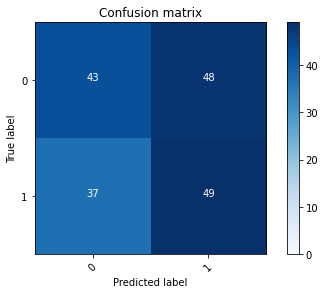

2022-08-20 19:42:54 - [Epoch Train: 75] loss: 0.0150, auc: 1.0000, acc: 0.9939, time: 50.00 s            
2022-08-20 19:42:54 - [Epoch Valid: 75] loss: 3.0519, auc: 0.5358, acc: 0.5447, time: 13.00 s


 75%|██████████████████████████████          | 75/100 [1:21:36<27:18, 65.53s/it]

2022-08-20 19:42:54 - EPOCH: 76
2022-08-20 19:42:54 - Train Step 10/977, train_loss: 0.0040
2022-08-20 19:42:55 - Train Step 20/977, train_loss: 0.0025
2022-08-20 19:42:55 - Train Step 30/977, train_loss: 0.0049
2022-08-20 19:42:56 - Train Step 40/977, train_loss: 0.0080
2022-08-20 19:42:56 - Train Step 50/977, train_loss: 0.0076
2022-08-20 19:42:57 - Train Step 60/977, train_loss: 0.0167
2022-08-20 19:42:57 - Train Step 70/977, train_loss: 0.0352
2022-08-20 19:42:58 - Train Step 80/977, train_loss: 0.0316
2022-08-20 19:42:58 - Train Step 90/977, train_loss: 0.0295
2022-08-20 19:42:59 - Train Step 100/977, train_loss: 0.0270
2022-08-20 19:43:00 - Train Step 110/977, train_loss: 0.0274
2022-08-20 19:43:00 - Train Step 120/977, train_loss: 0.0256
2022-08-20 19:43:01 - Train Step 130/977, train_loss: 0.0276
2022-08-20 19:43:01 - Train Step 140/977, train_loss: 0.0261
2022-08-20 19:43:02 - Train Step 150/977, train_loss: 0.0258
2022-08-20 19:43:02 - Train Step 160/977, train_loss: 0.0248
2

2022-08-20 19:43:55 - Valid Step 185/257, valid_loss: 2.9844
2022-08-20 19:43:56 - Valid Step 190/257, valid_loss: 2.9910
2022-08-20 19:43:56 - Valid Step 195/257, valid_loss: 3.1063
2022-08-20 19:43:56 - Valid Step 200/257, valid_loss: 3.0296
2022-08-20 19:43:56 - Valid Step 205/257, valid_loss: 2.9943
2022-08-20 19:43:57 - Valid Step 210/257, valid_loss: 2.9392
2022-08-20 19:43:57 - Valid Step 215/257, valid_loss: 2.8976
2022-08-20 19:43:57 - Valid Step 220/257, valid_loss: 2.8646
2022-08-20 19:43:57 - Valid Step 225/257, valid_loss: 2.9055
2022-08-20 19:43:58 - Valid Step 230/257, valid_loss: 2.8839
2022-08-20 19:43:58 - Valid Step 235/257, valid_loss: 2.8727
2022-08-20 19:43:58 - Valid Step 240/257, valid_loss: 2.8878
2022-08-20 19:43:58 - Valid Step 245/257, valid_loss: 2.9292
2022-08-20 19:43:59 - Valid Step 250/257, valid_loss: 2.9032
2022-08-20 19:43:59 - Valid Step 255/257, valid_loss: 2.8692
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

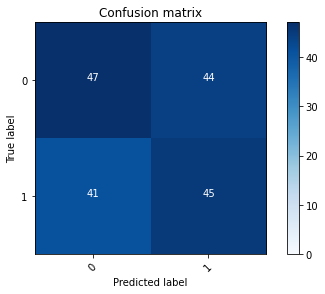

2022-08-20 19:43:59 - [Epoch Train: 76] loss: 0.0129, auc: 1.0000, acc: 0.9959, time: 51.00 s            
2022-08-20 19:43:59 - [Epoch Valid: 76] loss: 2.8547, auc: 0.5316, acc: 0.5331, time: 13.00 s


 76%|██████████████████████████████▍         | 76/100 [1:22:41<26:11, 65.50s/it]

2022-08-20 19:43:59 - EPOCH: 77
2022-08-20 19:44:00 - Train Step 10/977, train_loss: 0.0068
2022-08-20 19:44:00 - Train Step 20/977, train_loss: 0.0045
2022-08-20 19:44:01 - Train Step 30/977, train_loss: 0.0078
2022-08-20 19:44:01 - Train Step 40/977, train_loss: 0.0071
2022-08-20 19:44:02 - Train Step 50/977, train_loss: 0.0098
2022-08-20 19:44:02 - Train Step 60/977, train_loss: 0.0082
2022-08-20 19:44:03 - Train Step 70/977, train_loss: 0.0072
2022-08-20 19:44:03 - Train Step 80/977, train_loss: 0.0073
2022-08-20 19:44:04 - Train Step 90/977, train_loss: 0.0072
2022-08-20 19:44:04 - Train Step 100/977, train_loss: 0.0070
2022-08-20 19:44:05 - Train Step 110/977, train_loss: 0.0064
2022-08-20 19:44:05 - Train Step 120/977, train_loss: 0.0061
2022-08-20 19:44:06 - Train Step 130/977, train_loss: 0.0095
2022-08-20 19:44:06 - Train Step 140/977, train_loss: 0.0096
2022-08-20 19:44:07 - Train Step 150/977, train_loss: 0.0103
2022-08-20 19:44:07 - Train Step 160/977, train_loss: 0.0097
2

2022-08-20 19:45:00 - Valid Step 185/257, valid_loss: 2.6850
2022-08-20 19:45:00 - Valid Step 190/257, valid_loss: 2.8266
2022-08-20 19:45:00 - Valid Step 195/257, valid_loss: 2.7915
2022-08-20 19:45:00 - Valid Step 200/257, valid_loss: 2.8013
2022-08-20 19:45:01 - Valid Step 205/257, valid_loss: 2.7768
2022-08-20 19:45:01 - Valid Step 210/257, valid_loss: 2.7210
2022-08-20 19:45:01 - Valid Step 215/257, valid_loss: 2.7184
2022-08-20 19:45:01 - Valid Step 220/257, valid_loss: 2.6883
2022-08-20 19:45:02 - Valid Step 225/257, valid_loss: 2.6512
2022-08-20 19:45:02 - Valid Step 230/257, valid_loss: 2.7602
2022-08-20 19:45:02 - Valid Step 235/257, valid_loss: 2.7260
2022-08-20 19:45:02 - Valid Step 240/257, valid_loss: 2.7511
2022-08-20 19:45:03 - Valid Step 245/257, valid_loss: 2.8244
2022-08-20 19:45:03 - Valid Step 250/257, valid_loss: 2.8506
2022-08-20 19:45:03 - Valid Step 255/257, valid_loss: 2.8118
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

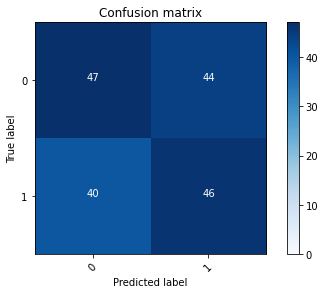

2022-08-20 19:45:04 - [Epoch Train: 77] loss: 0.0192, auc: 1.0000, acc: 0.9949, time: 50.00 s            
2022-08-20 19:45:04 - [Epoch Valid: 77] loss: 2.7903, auc: 0.5283, acc: 0.5409, time: 13.00 s


 77%|██████████████████████████████▊         | 77/100 [1:23:46<24:59, 65.20s/it]

2022-08-20 19:45:04 - EPOCH: 78
2022-08-20 19:45:04 - Train Step 10/977, train_loss: 0.0028
2022-08-20 19:45:05 - Train Step 20/977, train_loss: 0.0050
2022-08-20 19:45:05 - Train Step 30/977, train_loss: 0.0047
2022-08-20 19:45:06 - Train Step 40/977, train_loss: 0.0198
2022-08-20 19:45:06 - Train Step 50/977, train_loss: 0.0161
2022-08-20 19:45:07 - Train Step 60/977, train_loss: 0.0149
2022-08-20 19:45:07 - Train Step 70/977, train_loss: 0.0130
2022-08-20 19:45:08 - Train Step 80/977, train_loss: 0.0121
2022-08-20 19:45:08 - Train Step 90/977, train_loss: 0.0114
2022-08-20 19:45:09 - Train Step 100/977, train_loss: 0.0107
2022-08-20 19:45:09 - Train Step 110/977, train_loss: 0.0098
2022-08-20 19:45:10 - Train Step 120/977, train_loss: 0.0092
2022-08-20 19:45:10 - Train Step 130/977, train_loss: 0.0087
2022-08-20 19:45:11 - Train Step 140/977, train_loss: 0.0083
2022-08-20 19:45:12 - Train Step 150/977, train_loss: 0.0082
2022-08-20 19:45:12 - Train Step 160/977, train_loss: 0.0079
2

2022-08-20 19:46:05 - Valid Step 185/257, valid_loss: 3.2244
2022-08-20 19:46:05 - Valid Step 190/257, valid_loss: 3.1430
2022-08-20 19:46:05 - Valid Step 195/257, valid_loss: 3.1443
2022-08-20 19:46:05 - Valid Step 200/257, valid_loss: 3.1116
2022-08-20 19:46:06 - Valid Step 205/257, valid_loss: 3.0714
2022-08-20 19:46:06 - Valid Step 210/257, valid_loss: 3.1752
2022-08-20 19:46:06 - Valid Step 215/257, valid_loss: 3.2246
2022-08-20 19:46:07 - Valid Step 220/257, valid_loss: 3.2276
2022-08-20 19:46:07 - Valid Step 225/257, valid_loss: 3.2612
2022-08-20 19:46:07 - Valid Step 230/257, valid_loss: 3.2282
2022-08-20 19:46:07 - Valid Step 235/257, valid_loss: 3.3702
2022-08-20 19:46:08 - Valid Step 240/257, valid_loss: 3.3240
2022-08-20 19:46:08 - Valid Step 245/257, valid_loss: 3.2718
2022-08-20 19:46:08 - Valid Step 250/257, valid_loss: 3.2948
2022-08-20 19:46:08 - Valid Step 255/257, valid_loss: 3.2883
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

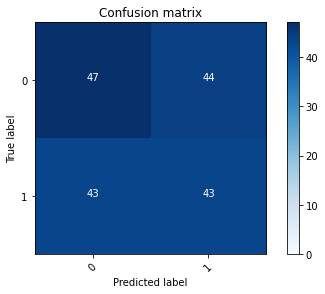

2022-08-20 19:46:09 - [Epoch Train: 78] loss: 0.0091, auc: 1.0000, acc: 0.9959, time: 51.00 s            
2022-08-20 19:46:09 - [Epoch Valid: 78] loss: 3.3216, auc: 0.5254, acc: 0.5253, time: 13.00 s


 78%|███████████████████████████████▏        | 78/100 [1:24:51<23:53, 65.14s/it]

2022-08-20 19:46:09 - EPOCH: 79
2022-08-20 19:46:09 - Train Step 10/977, train_loss: 0.0003
2022-08-20 19:46:10 - Train Step 20/977, train_loss: 0.0018
2022-08-20 19:46:10 - Train Step 30/977, train_loss: 0.0012
2022-08-20 19:46:11 - Train Step 40/977, train_loss: 0.0013
2022-08-20 19:46:11 - Train Step 50/977, train_loss: 0.0018
2022-08-20 19:46:12 - Train Step 60/977, train_loss: 0.0026
2022-08-20 19:46:12 - Train Step 70/977, train_loss: 0.0028
2022-08-20 19:46:13 - Train Step 80/977, train_loss: 0.0032
2022-08-20 19:46:13 - Train Step 90/977, train_loss: 0.0191
2022-08-20 19:46:14 - Train Step 100/977, train_loss: 0.0197
2022-08-20 19:46:14 - Train Step 110/977, train_loss: 0.0194
2022-08-20 19:46:15 - Train Step 120/977, train_loss: 0.0203
2022-08-20 19:46:15 - Train Step 130/977, train_loss: 0.0189
2022-08-20 19:46:16 - Train Step 140/977, train_loss: 0.0176
2022-08-20 19:46:16 - Train Step 150/977, train_loss: 0.0166
2022-08-20 19:46:17 - Train Step 160/977, train_loss: 0.0157
2

2022-08-20 19:47:10 - Valid Step 185/257, valid_loss: 3.2244
2022-08-20 19:47:10 - Valid Step 190/257, valid_loss: 3.2017
2022-08-20 19:47:10 - Valid Step 195/257, valid_loss: 3.2515
2022-08-20 19:47:11 - Valid Step 200/257, valid_loss: 3.3331
2022-08-20 19:47:11 - Valid Step 205/257, valid_loss: 3.3348
2022-08-20 19:47:11 - Valid Step 210/257, valid_loss: 3.3575
2022-08-20 19:47:11 - Valid Step 215/257, valid_loss: 3.3815
2022-08-20 19:47:12 - Valid Step 220/257, valid_loss: 3.3780
2022-08-20 19:47:12 - Valid Step 225/257, valid_loss: 3.3489
2022-08-20 19:47:12 - Valid Step 230/257, valid_loss: 3.3296
2022-08-20 19:47:12 - Valid Step 235/257, valid_loss: 3.3475
2022-08-20 19:47:13 - Valid Step 240/257, valid_loss: 3.3216
2022-08-20 19:47:13 - Valid Step 245/257, valid_loss: 3.3031
2022-08-20 19:47:13 - Valid Step 250/257, valid_loss: 3.2566
2022-08-20 19:47:13 - Valid Step 255/257, valid_loss: 3.1945
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

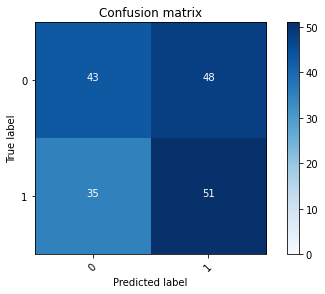

2022-08-20 19:47:14 - [Epoch Train: 79] loss: 0.0156, auc: 0.9999, acc: 0.9949, time: 51.00 s            
2022-08-20 19:47:14 - [Epoch Valid: 79] loss: 3.1743, auc: 0.5322, acc: 0.5603, time: 13.00 s


 79%|███████████████████████████████▌        | 79/100 [1:25:56<22:48, 65.15s/it]

2022-08-20 19:47:14 - EPOCH: 80
2022-08-20 19:47:14 - Train Step 10/977, train_loss: 0.0007
2022-08-20 19:47:15 - Train Step 20/977, train_loss: 0.0410
2022-08-20 19:47:15 - Train Step 30/977, train_loss: 0.0277
2022-08-20 19:47:16 - Train Step 40/977, train_loss: 0.0215
2022-08-20 19:47:16 - Train Step 50/977, train_loss: 0.0252
2022-08-20 19:47:17 - Train Step 60/977, train_loss: 0.0216
2022-08-20 19:47:17 - Train Step 70/977, train_loss: 0.0207
2022-08-20 19:47:18 - Train Step 80/977, train_loss: 0.0184
2022-08-20 19:47:18 - Train Step 90/977, train_loss: 0.0168
2022-08-20 19:47:19 - Train Step 100/977, train_loss: 0.0152
2022-08-20 19:47:19 - Train Step 110/977, train_loss: 0.0195
2022-08-20 19:47:20 - Train Step 120/977, train_loss: 0.0301
2022-08-20 19:47:20 - Train Step 130/977, train_loss: 0.0282
2022-08-20 19:47:21 - Train Step 140/977, train_loss: 0.0267
2022-08-20 19:47:22 - Train Step 150/977, train_loss: 0.0276
2022-08-20 19:47:22 - Train Step 160/977, train_loss: 0.0259
2

2022-08-20 19:48:14 - Valid Step 185/257, valid_loss: 3.7153
2022-08-20 19:48:14 - Valid Step 190/257, valid_loss: 3.6818
2022-08-20 19:48:14 - Valid Step 195/257, valid_loss: 3.7099
2022-08-20 19:48:15 - Valid Step 200/257, valid_loss: 3.7526
2022-08-20 19:48:15 - Valid Step 205/257, valid_loss: 3.7735
2022-08-20 19:48:15 - Valid Step 210/257, valid_loss: 3.7553
2022-08-20 19:48:15 - Valid Step 215/257, valid_loss: 3.7510
2022-08-20 19:48:16 - Valid Step 220/257, valid_loss: 3.6845
2022-08-20 19:48:16 - Valid Step 225/257, valid_loss: 3.6937
2022-08-20 19:48:16 - Valid Step 230/257, valid_loss: 3.6577
2022-08-20 19:48:16 - Valid Step 235/257, valid_loss: 3.6400
2022-08-20 19:48:17 - Valid Step 240/257, valid_loss: 3.5887
2022-08-20 19:48:17 - Valid Step 245/257, valid_loss: 3.5635
2022-08-20 19:48:17 - Valid Step 250/257, valid_loss: 3.5267
2022-08-20 19:48:18 - Valid Step 255/257, valid_loss: 3.5059
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

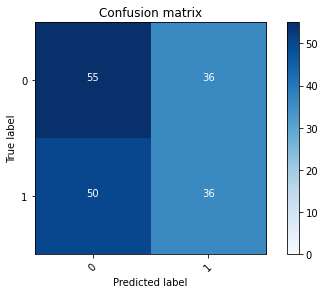

2022-08-20 19:48:18 - [Epoch Train: 80] loss: 0.0129, auc: 1.0000, acc: 0.9939, time: 50.00 s            
2022-08-20 19:48:18 - [Epoch Valid: 80] loss: 3.5006, auc: 0.5278, acc: 0.5253, time: 13.00 s


 80%|████████████████████████████████        | 80/100 [1:27:00<21:36, 64.82s/it]

2022-08-20 19:48:18 - EPOCH: 81
2022-08-20 19:48:18 - Train Step 10/977, train_loss: 0.0006
2022-08-20 19:48:19 - Train Step 20/977, train_loss: 0.0011
2022-08-20 19:48:19 - Train Step 30/977, train_loss: 0.0273
2022-08-20 19:48:20 - Train Step 40/977, train_loss: 0.0209
2022-08-20 19:48:21 - Train Step 50/977, train_loss: 0.0168
2022-08-20 19:48:21 - Train Step 60/977, train_loss: 0.0148
2022-08-20 19:48:22 - Train Step 70/977, train_loss: 0.0129
2022-08-20 19:48:22 - Train Step 80/977, train_loss: 0.0125
2022-08-20 19:48:23 - Train Step 90/977, train_loss: 0.0120
2022-08-20 19:48:23 - Train Step 100/977, train_loss: 0.0123
2022-08-20 19:48:24 - Train Step 110/977, train_loss: 0.0113
2022-08-20 19:48:24 - Train Step 120/977, train_loss: 0.0105
2022-08-20 19:48:25 - Train Step 130/977, train_loss: 0.0113
2022-08-20 19:48:25 - Train Step 140/977, train_loss: 0.0106
2022-08-20 19:48:26 - Train Step 150/977, train_loss: 0.0099
2022-08-20 19:48:26 - Train Step 160/977, train_loss: 0.0093
2

2022-08-20 19:49:19 - Valid Step 185/257, valid_loss: 2.8973
2022-08-20 19:49:19 - Valid Step 190/257, valid_loss: 2.9008
2022-08-20 19:49:19 - Valid Step 195/257, valid_loss: 2.8977
2022-08-20 19:49:19 - Valid Step 200/257, valid_loss: 2.8495
2022-08-20 19:49:20 - Valid Step 205/257, valid_loss: 2.8072
2022-08-20 19:49:20 - Valid Step 210/257, valid_loss: 2.8456
2022-08-20 19:49:20 - Valid Step 215/257, valid_loss: 2.8254
2022-08-20 19:49:20 - Valid Step 220/257, valid_loss: 2.8058
2022-08-20 19:49:21 - Valid Step 225/257, valid_loss: 2.7696
2022-08-20 19:49:21 - Valid Step 230/257, valid_loss: 2.8317
2022-08-20 19:49:21 - Valid Step 235/257, valid_loss: 3.0938
2022-08-20 19:49:21 - Valid Step 240/257, valid_loss: 3.1318
2022-08-20 19:49:22 - Valid Step 245/257, valid_loss: 3.1070
2022-08-20 19:49:22 - Valid Step 250/257, valid_loss: 3.1129
2022-08-20 19:49:22 - Valid Step 255/257, valid_loss: 3.1008
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

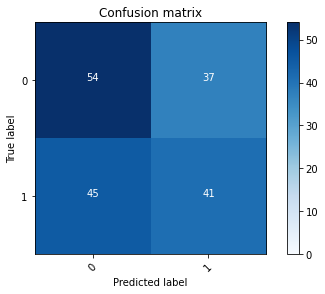

2022-08-20 19:49:22 - [Epoch Train: 81] loss: 0.0139, auc: 1.0000, acc: 0.9969, time: 51.00 s            
2022-08-20 19:49:22 - [Epoch Valid: 81] loss: 3.1181, auc: 0.5346, acc: 0.5409, time: 13.00 s


 81%|████████████████████████████████▍       | 81/100 [1:28:05<20:30, 64.78s/it]

2022-08-20 19:49:22 - EPOCH: 82
2022-08-20 19:49:23 - Train Step 10/977, train_loss: 0.0042
2022-08-20 19:49:24 - Train Step 20/977, train_loss: 0.0215
2022-08-20 19:49:24 - Train Step 30/977, train_loss: 0.0262
2022-08-20 19:49:25 - Train Step 40/977, train_loss: 0.0451
2022-08-20 19:49:25 - Train Step 50/977, train_loss: 0.0391
2022-08-20 19:49:26 - Train Step 60/977, train_loss: 0.0378
2022-08-20 19:49:26 - Train Step 70/977, train_loss: 0.0366
2022-08-20 19:49:27 - Train Step 80/977, train_loss: 0.0325
2022-08-20 19:49:27 - Train Step 90/977, train_loss: 0.0291
2022-08-20 19:49:28 - Train Step 100/977, train_loss: 0.0265
2022-08-20 19:49:28 - Train Step 110/977, train_loss: 0.0253
2022-08-20 19:49:29 - Train Step 120/977, train_loss: 0.0255
2022-08-20 19:49:29 - Train Step 130/977, train_loss: 0.0240
2022-08-20 19:49:30 - Train Step 140/977, train_loss: 0.0237
2022-08-20 19:49:30 - Train Step 150/977, train_loss: 0.0223
2022-08-20 19:49:31 - Train Step 160/977, train_loss: 0.0212
2

2022-08-20 19:50:24 - Valid Step 185/257, valid_loss: 2.6695
2022-08-20 19:50:24 - Valid Step 190/257, valid_loss: 2.7371
2022-08-20 19:50:24 - Valid Step 195/257, valid_loss: 2.6673
2022-08-20 19:50:25 - Valid Step 200/257, valid_loss: 2.6014
2022-08-20 19:50:25 - Valid Step 205/257, valid_loss: 2.6851
2022-08-20 19:50:25 - Valid Step 210/257, valid_loss: 2.7217
2022-08-20 19:50:25 - Valid Step 215/257, valid_loss: 2.7783
2022-08-20 19:50:26 - Valid Step 220/257, valid_loss: 2.7207
2022-08-20 19:50:26 - Valid Step 225/257, valid_loss: 2.7968
2022-08-20 19:50:26 - Valid Step 230/257, valid_loss: 2.8226
2022-08-20 19:50:26 - Valid Step 235/257, valid_loss: 2.8545
2022-08-20 19:50:27 - Valid Step 240/257, valid_loss: 2.8277
2022-08-20 19:50:27 - Valid Step 245/257, valid_loss: 2.8789
2022-08-20 19:50:27 - Valid Step 250/257, valid_loss: 2.9138
2022-08-20 19:50:28 - Valid Step 255/257, valid_loss: 3.0499
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

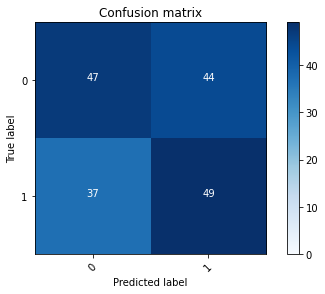

2022-08-20 19:50:28 - [Epoch Train: 82] loss: 0.0106, auc: 1.0000, acc: 0.9980, time: 51.00 s            
2022-08-20 19:50:28 - [Epoch Valid: 82] loss: 3.0777, auc: 0.5440, acc: 0.5681, time: 13.00 s


 82%|████████████████████████████████▊       | 82/100 [1:29:10<19:28, 64.94s/it]

2022-08-20 19:50:28 - EPOCH: 83
2022-08-20 19:50:28 - Train Step 10/977, train_loss: 0.0058
2022-08-20 19:50:29 - Train Step 20/977, train_loss: 0.0062
2022-08-20 19:50:29 - Train Step 30/977, train_loss: 0.0046
2022-08-20 19:50:30 - Train Step 40/977, train_loss: 0.0036
2022-08-20 19:50:31 - Train Step 50/977, train_loss: 0.0032
2022-08-20 19:50:31 - Train Step 60/977, train_loss: 0.0083
2022-08-20 19:50:32 - Train Step 70/977, train_loss: 0.0075
2022-08-20 19:50:32 - Train Step 80/977, train_loss: 0.0066
2022-08-20 19:50:33 - Train Step 90/977, train_loss: 0.0065
2022-08-20 19:50:33 - Train Step 100/977, train_loss: 0.0075
2022-08-20 19:50:34 - Train Step 110/977, train_loss: 0.0106
2022-08-20 19:50:34 - Train Step 120/977, train_loss: 0.0106
2022-08-20 19:50:35 - Train Step 130/977, train_loss: 0.0100
2022-08-20 19:50:35 - Train Step 140/977, train_loss: 0.0093
2022-08-20 19:50:36 - Train Step 150/977, train_loss: 0.0093
2022-08-20 19:50:36 - Train Step 160/977, train_loss: 0.0087
2

2022-08-20 19:51:28 - Valid Step 185/257, valid_loss: 2.9642
2022-08-20 19:51:29 - Valid Step 190/257, valid_loss: 2.9799
2022-08-20 19:51:29 - Valid Step 195/257, valid_loss: 3.0456
2022-08-20 19:51:29 - Valid Step 200/257, valid_loss: 3.0216
2022-08-20 19:51:30 - Valid Step 205/257, valid_loss: 3.0934
2022-08-20 19:51:30 - Valid Step 210/257, valid_loss: 3.0360
2022-08-20 19:51:30 - Valid Step 215/257, valid_loss: 3.0199
2022-08-20 19:51:30 - Valid Step 220/257, valid_loss: 2.9997
2022-08-20 19:51:31 - Valid Step 225/257, valid_loss: 3.0218
2022-08-20 19:51:31 - Valid Step 230/257, valid_loss: 3.1206
2022-08-20 19:51:31 - Valid Step 235/257, valid_loss: 3.0762
2022-08-20 19:51:31 - Valid Step 240/257, valid_loss: 3.1027
2022-08-20 19:51:32 - Valid Step 245/257, valid_loss: 3.0555
2022-08-20 19:51:32 - Valid Step 250/257, valid_loss: 3.0828
2022-08-20 19:51:32 - Valid Step 255/257, valid_loss: 3.0724
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

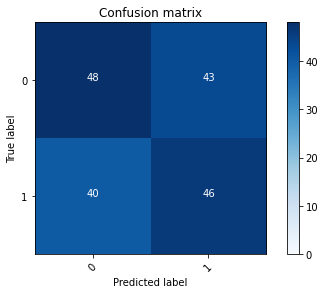

2022-08-20 19:51:32 - [Epoch Train: 83] loss: 0.0128, auc: 1.0000, acc: 0.9949, time: 50.00 s            
2022-08-20 19:51:32 - [Epoch Valid: 83] loss: 3.0523, auc: 0.5316, acc: 0.5525, time: 13.00 s


 83%|█████████████████████████████████▏      | 83/100 [1:30:15<18:22, 64.86s/it]

2022-08-20 19:51:32 - EPOCH: 84
2022-08-20 19:51:33 - Train Step 10/977, train_loss: 0.0313
2022-08-20 19:51:34 - Train Step 20/977, train_loss: 0.0203
2022-08-20 19:51:34 - Train Step 30/977, train_loss: 0.0182
2022-08-20 19:51:35 - Train Step 40/977, train_loss: 0.0139
2022-08-20 19:51:35 - Train Step 50/977, train_loss: 0.0139
2022-08-20 19:51:36 - Train Step 60/977, train_loss: 0.0127
2022-08-20 19:51:36 - Train Step 70/977, train_loss: 0.0132
2022-08-20 19:51:37 - Train Step 80/977, train_loss: 0.0119
2022-08-20 19:51:37 - Train Step 90/977, train_loss: 0.0107
2022-08-20 19:51:38 - Train Step 100/977, train_loss: 0.0099
2022-08-20 19:51:38 - Train Step 110/977, train_loss: 0.0094
2022-08-20 19:51:39 - Train Step 120/977, train_loss: 0.0087
2022-08-20 19:51:39 - Train Step 130/977, train_loss: 0.0082
2022-08-20 19:51:40 - Train Step 140/977, train_loss: 0.0081
2022-08-20 19:51:40 - Train Step 150/977, train_loss: 0.0091
2022-08-20 19:51:41 - Train Step 160/977, train_loss: 0.0086
2

2022-08-20 19:52:32 - Valid Step 185/257, valid_loss: 3.1727
2022-08-20 19:52:33 - Valid Step 190/257, valid_loss: 3.1662
2022-08-20 19:52:33 - Valid Step 195/257, valid_loss: 3.1566
2022-08-20 19:52:33 - Valid Step 200/257, valid_loss: 3.1317
2022-08-20 19:52:33 - Valid Step 205/257, valid_loss: 3.2389
2022-08-20 19:52:34 - Valid Step 210/257, valid_loss: 3.2079
2022-08-20 19:52:34 - Valid Step 215/257, valid_loss: 3.1518
2022-08-20 19:52:34 - Valid Step 220/257, valid_loss: 3.1996
2022-08-20 19:52:34 - Valid Step 225/257, valid_loss: 3.2880
2022-08-20 19:52:35 - Valid Step 230/257, valid_loss: 3.2738
2022-08-20 19:52:35 - Valid Step 235/257, valid_loss: 3.3021
2022-08-20 19:52:35 - Valid Step 240/257, valid_loss: 3.2558
2022-08-20 19:52:35 - Valid Step 245/257, valid_loss: 3.2544
2022-08-20 19:52:36 - Valid Step 250/257, valid_loss: 3.2863
2022-08-20 19:52:36 - Valid Step 255/257, valid_loss: 3.2782
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

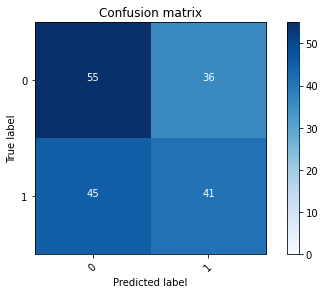

2022-08-20 19:52:36 - [Epoch Train: 84] loss: 0.0104, auc: 0.9999, acc: 0.9969, time: 50.00 s            
2022-08-20 19:52:36 - [Epoch Valid: 84] loss: 3.3466, auc: 0.5381, acc: 0.5486, time: 13.00 s


 84%|█████████████████████████████████▌      | 84/100 [1:31:19<17:12, 64.52s/it]

2022-08-20 19:52:36 - EPOCH: 85
2022-08-20 19:52:37 - Train Step 10/977, train_loss: 0.0365
2022-08-20 19:52:37 - Train Step 20/977, train_loss: 0.0207
2022-08-20 19:52:38 - Train Step 30/977, train_loss: 0.0146
2022-08-20 19:52:38 - Train Step 40/977, train_loss: 0.0110
2022-08-20 19:52:39 - Train Step 50/977, train_loss: 0.0120
2022-08-20 19:52:39 - Train Step 60/977, train_loss: 0.0102
2022-08-20 19:52:40 - Train Step 70/977, train_loss: 0.0097
2022-08-20 19:52:40 - Train Step 80/977, train_loss: 0.0087
2022-08-20 19:52:41 - Train Step 90/977, train_loss: 0.0084
2022-08-20 19:52:41 - Train Step 100/977, train_loss: 0.0085
2022-08-20 19:52:42 - Train Step 110/977, train_loss: 0.0082
2022-08-20 19:52:42 - Train Step 120/977, train_loss: 0.0076
2022-08-20 19:52:43 - Train Step 130/977, train_loss: 0.0072
2022-08-20 19:52:43 - Train Step 140/977, train_loss: 0.0067
2022-08-20 19:52:44 - Train Step 150/977, train_loss: 0.0063
2022-08-20 19:52:44 - Train Step 160/977, train_loss: 0.0060
2

2022-08-20 19:53:37 - Valid Step 185/257, valid_loss: 3.1612
2022-08-20 19:53:37 - Valid Step 190/257, valid_loss: 3.1216
2022-08-20 19:53:38 - Valid Step 195/257, valid_loss: 3.1559
2022-08-20 19:53:38 - Valid Step 200/257, valid_loss: 3.0867
2022-08-20 19:53:38 - Valid Step 205/257, valid_loss: 3.1259
2022-08-20 19:53:38 - Valid Step 210/257, valid_loss: 3.0937
2022-08-20 19:53:39 - Valid Step 215/257, valid_loss: 3.1551
2022-08-20 19:53:39 - Valid Step 220/257, valid_loss: 3.1259
2022-08-20 19:53:39 - Valid Step 225/257, valid_loss: 3.1136
2022-08-20 19:53:39 - Valid Step 230/257, valid_loss: 3.1629
2022-08-20 19:53:40 - Valid Step 235/257, valid_loss: 3.1568
2022-08-20 19:53:40 - Valid Step 240/257, valid_loss: 3.1692
2022-08-20 19:53:40 - Valid Step 245/257, valid_loss: 3.1593
2022-08-20 19:53:40 - Valid Step 250/257, valid_loss: 3.0989
2022-08-20 19:53:41 - Valid Step 255/257, valid_loss: 3.1106
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

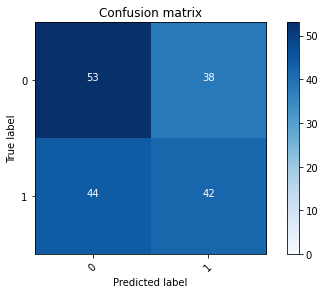

2022-08-20 19:53:41 - [Epoch Train: 85] loss: 0.0122, auc: 0.9999, acc: 0.9949, time: 51.00 s            
2022-08-20 19:53:41 - [Epoch Valid: 85] loss: 3.1427, auc: 0.5371, acc: 0.5486, time: 13.00 s


 85%|██████████████████████████████████      | 85/100 [1:32:23<16:09, 64.63s/it]

2022-08-20 19:53:41 - EPOCH: 86
2022-08-20 19:53:42 - Train Step 10/977, train_loss: 0.0016
2022-08-20 19:53:42 - Train Step 20/977, train_loss: 0.0062
2022-08-20 19:53:43 - Train Step 30/977, train_loss: 0.0048
2022-08-20 19:53:43 - Train Step 40/977, train_loss: 0.0038
2022-08-20 19:53:44 - Train Step 50/977, train_loss: 0.0032
2022-08-20 19:53:44 - Train Step 60/977, train_loss: 0.0027
2022-08-20 19:53:45 - Train Step 70/977, train_loss: 0.0027
2022-08-20 19:53:45 - Train Step 80/977, train_loss: 0.0039
2022-08-20 19:53:46 - Train Step 90/977, train_loss: 0.0035
2022-08-20 19:53:46 - Train Step 100/977, train_loss: 0.0033
2022-08-20 19:53:47 - Train Step 110/977, train_loss: 0.0033
2022-08-20 19:53:47 - Train Step 120/977, train_loss: 0.0031
2022-08-20 19:53:48 - Train Step 130/977, train_loss: 0.0069
2022-08-20 19:53:48 - Train Step 140/977, train_loss: 0.0070
2022-08-20 19:53:49 - Train Step 150/977, train_loss: 0.0071
2022-08-20 19:53:49 - Train Step 160/977, train_loss: 0.0067
2

2022-08-20 19:54:42 - Valid Step 185/257, valid_loss: 3.3387
2022-08-20 19:54:42 - Valid Step 190/257, valid_loss: 3.4252
2022-08-20 19:54:42 - Valid Step 195/257, valid_loss: 3.3374
2022-08-20 19:54:42 - Valid Step 200/257, valid_loss: 3.2639
2022-08-20 19:54:43 - Valid Step 205/257, valid_loss: 3.2280
2022-08-20 19:54:43 - Valid Step 210/257, valid_loss: 3.2503
2022-08-20 19:54:43 - Valid Step 215/257, valid_loss: 3.2617
2022-08-20 19:54:43 - Valid Step 220/257, valid_loss: 3.2634
2022-08-20 19:54:44 - Valid Step 225/257, valid_loss: 3.3279
2022-08-20 19:54:44 - Valid Step 230/257, valid_loss: 3.3006
2022-08-20 19:54:44 - Valid Step 235/257, valid_loss: 3.3778
2022-08-20 19:54:44 - Valid Step 240/257, valid_loss: 3.3630
2022-08-20 19:54:45 - Valid Step 245/257, valid_loss: 3.3696
2022-08-20 19:54:45 - Valid Step 250/257, valid_loss: 3.4893
2022-08-20 19:54:45 - Valid Step 255/257, valid_loss: 3.5323
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

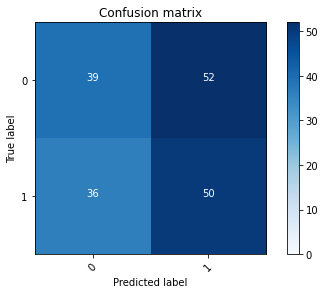

2022-08-20 19:54:46 - [Epoch Train: 86] loss: 0.0090, auc: 1.0000, acc: 0.9969, time: 50.00 s            
2022-08-20 19:54:46 - [Epoch Valid: 86] loss: 3.6459, auc: 0.5453, acc: 0.5292, time: 14.00 s


 86%|██████████████████████████████████▍     | 86/100 [1:33:28<15:04, 64.59s/it]

2022-08-20 19:54:46 - EPOCH: 87
2022-08-20 19:54:46 - Train Step 10/977, train_loss: 0.0409
2022-08-20 19:54:47 - Train Step 20/977, train_loss: 0.0368
2022-08-20 19:54:47 - Train Step 30/977, train_loss: 0.0249
2022-08-20 19:54:48 - Train Step 40/977, train_loss: 0.0189
2022-08-20 19:54:49 - Train Step 50/977, train_loss: 0.0174
2022-08-20 19:54:49 - Train Step 60/977, train_loss: 0.0149
2022-08-20 19:54:50 - Train Step 70/977, train_loss: 0.0129
2022-08-20 19:54:50 - Train Step 80/977, train_loss: 0.0125
2022-08-20 19:54:51 - Train Step 90/977, train_loss: 0.0122
2022-08-20 19:54:51 - Train Step 100/977, train_loss: 0.0113
2022-08-20 19:54:52 - Train Step 110/977, train_loss: 0.0108
2022-08-20 19:54:52 - Train Step 120/977, train_loss: 0.0100
2022-08-20 19:54:53 - Train Step 130/977, train_loss: 0.0107
2022-08-20 19:54:53 - Train Step 140/977, train_loss: 0.0100
2022-08-20 19:54:54 - Train Step 150/977, train_loss: 0.0094
2022-08-20 19:54:54 - Train Step 160/977, train_loss: 0.0092
2

2022-08-20 19:55:46 - Valid Step 185/257, valid_loss: 3.0296
2022-08-20 19:55:46 - Valid Step 190/257, valid_loss: 3.0375
2022-08-20 19:55:47 - Valid Step 195/257, valid_loss: 2.9935
2022-08-20 19:55:47 - Valid Step 200/257, valid_loss: 2.9462
2022-08-20 19:55:47 - Valid Step 205/257, valid_loss: 2.9920
2022-08-20 19:55:48 - Valid Step 210/257, valid_loss: 2.9261
2022-08-20 19:55:48 - Valid Step 215/257, valid_loss: 2.9061
2022-08-20 19:55:48 - Valid Step 220/257, valid_loss: 2.8558
2022-08-20 19:55:48 - Valid Step 225/257, valid_loss: 2.9879
2022-08-20 19:55:49 - Valid Step 230/257, valid_loss: 2.9744
2022-08-20 19:55:49 - Valid Step 235/257, valid_loss: 3.0625
2022-08-20 19:55:49 - Valid Step 240/257, valid_loss: 3.0998
2022-08-20 19:55:49 - Valid Step 245/257, valid_loss: 3.0894
2022-08-20 19:55:50 - Valid Step 250/257, valid_loss: 3.0969
2022-08-20 19:55:50 - Valid Step 255/257, valid_loss: 3.1722
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

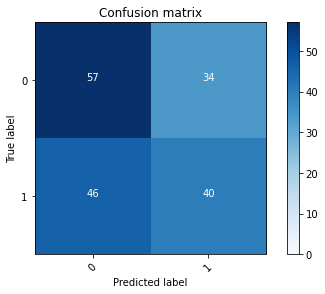

2022-08-20 19:55:50 - [Epoch Train: 87] loss: 0.0122, auc: 1.0000, acc: 0.9939, time: 50.00 s            
2022-08-20 19:55:50 - [Epoch Valid: 87] loss: 3.1535, auc: 0.5411, acc: 0.5525, time: 13.00 s


 87%|██████████████████████████████████▊     | 87/100 [1:34:33<14:00, 64.62s/it]

2022-08-20 19:55:50 - EPOCH: 88
2022-08-20 19:55:51 - Train Step 10/977, train_loss: 0.0123
2022-08-20 19:55:51 - Train Step 20/977, train_loss: 0.0209
2022-08-20 19:55:52 - Train Step 30/977, train_loss: 0.0210
2022-08-20 19:55:52 - Train Step 40/977, train_loss: 0.0159
2022-08-20 19:55:53 - Train Step 50/977, train_loss: 0.0136
2022-08-20 19:55:54 - Train Step 60/977, train_loss: 0.0117
2022-08-20 19:55:54 - Train Step 70/977, train_loss: 0.0101
2022-08-20 19:55:55 - Train Step 80/977, train_loss: 0.0108
2022-08-20 19:55:55 - Train Step 90/977, train_loss: 0.0104
2022-08-20 19:55:56 - Train Step 100/977, train_loss: 0.0095
2022-08-20 19:55:56 - Train Step 110/977, train_loss: 0.0096
2022-08-20 19:55:57 - Train Step 120/977, train_loss: 0.0135
2022-08-20 19:55:57 - Train Step 130/977, train_loss: 0.0126
2022-08-20 19:55:58 - Train Step 140/977, train_loss: 0.0118
2022-08-20 19:55:58 - Train Step 150/977, train_loss: 0.0111
2022-08-20 19:55:59 - Train Step 160/977, train_loss: 0.0120
2

2022-08-20 19:56:51 - Valid Step 185/257, valid_loss: 3.4619
2022-08-20 19:56:51 - Valid Step 190/257, valid_loss: 3.4662
2022-08-20 19:56:51 - Valid Step 195/257, valid_loss: 3.5618
2022-08-20 19:56:51 - Valid Step 200/257, valid_loss: 3.5159
2022-08-20 19:56:52 - Valid Step 205/257, valid_loss: 3.4437
2022-08-20 19:56:52 - Valid Step 210/257, valid_loss: 3.3663
2022-08-20 19:56:52 - Valid Step 215/257, valid_loss: 3.3506
2022-08-20 19:56:52 - Valid Step 220/257, valid_loss: 3.3542
2022-08-20 19:56:53 - Valid Step 225/257, valid_loss: 3.2864
2022-08-20 19:56:53 - Valid Step 230/257, valid_loss: 3.3091
2022-08-20 19:56:53 - Valid Step 235/257, valid_loss: 3.3449
2022-08-20 19:56:53 - Valid Step 240/257, valid_loss: 3.3005
2022-08-20 19:56:54 - Valid Step 245/257, valid_loss: 3.3384
2022-08-20 19:56:54 - Valid Step 250/257, valid_loss: 3.4306
2022-08-20 19:56:54 - Valid Step 255/257, valid_loss: 3.4805
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

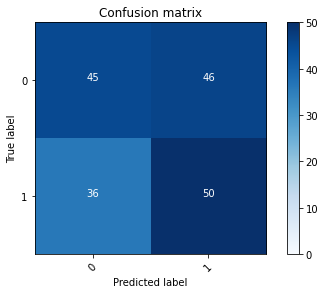

2022-08-20 19:56:54 - [Epoch Train: 88] loss: 0.0092, auc: 1.0000, acc: 0.9980, time: 50.00 s            
2022-08-20 19:56:54 - [Epoch Valid: 88] loss: 3.4557, auc: 0.5449, acc: 0.5603, time: 13.00 s


 88%|███████████████████████████████████▏    | 88/100 [1:35:37<12:53, 64.49s/it]

2022-08-20 19:56:54 - EPOCH: 89
2022-08-20 19:56:55 - Train Step 10/977, train_loss: 0.0003
2022-08-20 19:56:56 - Train Step 20/977, train_loss: 0.0054
2022-08-20 19:56:56 - Train Step 30/977, train_loss: 0.0063
2022-08-20 19:56:57 - Train Step 40/977, train_loss: 0.0163
2022-08-20 19:56:57 - Train Step 50/977, train_loss: 0.0174
2022-08-20 19:56:58 - Train Step 60/977, train_loss: 0.0156
2022-08-20 19:56:58 - Train Step 70/977, train_loss: 0.0133
2022-08-20 19:56:59 - Train Step 80/977, train_loss: 0.0121
2022-08-20 19:56:59 - Train Step 90/977, train_loss: 0.0126
2022-08-20 19:57:00 - Train Step 100/977, train_loss: 0.0114
2022-08-20 19:57:00 - Train Step 110/977, train_loss: 0.0104
2022-08-20 19:57:01 - Train Step 120/977, train_loss: 0.0096
2022-08-20 19:57:01 - Train Step 130/977, train_loss: 0.0089
2022-08-20 19:57:02 - Train Step 140/977, train_loss: 0.0102
2022-08-20 19:57:02 - Train Step 150/977, train_loss: 0.0097
2022-08-20 19:57:03 - Train Step 160/977, train_loss: 0.0092
2

2022-08-20 19:57:56 - Valid Step 185/257, valid_loss: 3.4918
2022-08-20 19:57:56 - Valid Step 190/257, valid_loss: 3.4457
2022-08-20 19:57:56 - Valid Step 195/257, valid_loss: 3.3597
2022-08-20 19:57:56 - Valid Step 200/257, valid_loss: 3.3935
2022-08-20 19:57:57 - Valid Step 205/257, valid_loss: 3.3806
2022-08-20 19:57:57 - Valid Step 210/257, valid_loss: 3.3092
2022-08-20 19:57:57 - Valid Step 215/257, valid_loss: 3.4008
2022-08-20 19:57:57 - Valid Step 220/257, valid_loss: 3.3608
2022-08-20 19:57:58 - Valid Step 225/257, valid_loss: 3.3170
2022-08-20 19:57:58 - Valid Step 230/257, valid_loss: 3.3899
2022-08-20 19:57:58 - Valid Step 235/257, valid_loss: 3.3311
2022-08-20 19:57:59 - Valid Step 240/257, valid_loss: 3.3702
2022-08-20 19:57:59 - Valid Step 245/257, valid_loss: 3.4611
2022-08-20 19:57:59 - Valid Step 250/257, valid_loss: 3.3953
2022-08-20 19:57:59 - Valid Step 255/257, valid_loss: 3.4434
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

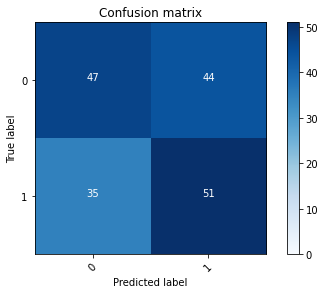

2022-08-20 19:58:00 - [Epoch Train: 89] loss: 0.0101, auc: 0.9999, acc: 0.9980, time: 51.00 s            
2022-08-20 19:58:00 - [Epoch Valid: 89] loss: 3.4316, auc: 0.5480, acc: 0.5798, time: 13.00 s


 89%|███████████████████████████████████▌    | 89/100 [1:36:42<11:51, 64.66s/it]

2022-08-20 19:58:00 - EPOCH: 90
2022-08-20 19:58:00 - Train Step 10/977, train_loss: 0.0006
2022-08-20 19:58:01 - Train Step 20/977, train_loss: 0.0005
2022-08-20 19:58:01 - Train Step 30/977, train_loss: 0.0012
2022-08-20 19:58:02 - Train Step 40/977, train_loss: 0.0012
2022-08-20 19:58:02 - Train Step 50/977, train_loss: 0.0015
2022-08-20 19:58:03 - Train Step 60/977, train_loss: 0.0014
2022-08-20 19:58:03 - Train Step 70/977, train_loss: 0.0049
2022-08-20 19:58:04 - Train Step 80/977, train_loss: 0.0053
2022-08-20 19:58:04 - Train Step 90/977, train_loss: 0.0048
2022-08-20 19:58:05 - Train Step 100/977, train_loss: 0.0043
2022-08-20 19:58:05 - Train Step 110/977, train_loss: 0.0044
2022-08-20 19:58:06 - Train Step 120/977, train_loss: 0.0040
2022-08-20 19:58:06 - Train Step 130/977, train_loss: 0.0040
2022-08-20 19:58:07 - Train Step 140/977, train_loss: 0.0037
2022-08-20 19:58:07 - Train Step 150/977, train_loss: 0.0035
2022-08-20 19:58:08 - Train Step 160/977, train_loss: 0.0034
2

2022-08-20 19:59:00 - Valid Step 185/257, valid_loss: 3.8819
2022-08-20 19:59:00 - Valid Step 190/257, valid_loss: 3.8318
2022-08-20 19:59:00 - Valid Step 195/257, valid_loss: 3.8288
2022-08-20 19:59:01 - Valid Step 200/257, valid_loss: 3.7902
2022-08-20 19:59:01 - Valid Step 205/257, valid_loss: 3.7760
2022-08-20 19:59:01 - Valid Step 210/257, valid_loss: 3.7994
2022-08-20 19:59:01 - Valid Step 215/257, valid_loss: 3.8076
2022-08-20 19:59:02 - Valid Step 220/257, valid_loss: 3.7467
2022-08-20 19:59:02 - Valid Step 225/257, valid_loss: 3.7504
2022-08-20 19:59:02 - Valid Step 230/257, valid_loss: 3.7809
2022-08-20 19:59:02 - Valid Step 235/257, valid_loss: 3.7578
2022-08-20 19:59:03 - Valid Step 240/257, valid_loss: 3.7978
2022-08-20 19:59:03 - Valid Step 245/257, valid_loss: 3.8044
2022-08-20 19:59:03 - Valid Step 250/257, valid_loss: 3.7845
2022-08-20 19:59:03 - Valid Step 255/257, valid_loss: 3.7133
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

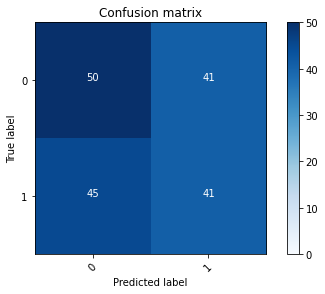

2022-08-20 19:59:04 - [Epoch Train: 90] loss: 0.0074, auc: 1.0000, acc: 0.9969, time: 50.00 s            
2022-08-20 19:59:04 - [Epoch Valid: 90] loss: 3.6913, auc: 0.5329, acc: 0.5214, time: 13.00 s


 90%|████████████████████████████████████    | 90/100 [1:37:46<10:45, 64.51s/it]

2022-08-20 19:59:04 - EPOCH: 91
2022-08-20 19:59:04 - Train Step 10/977, train_loss: 0.0002
2022-08-20 19:59:05 - Train Step 20/977, train_loss: 0.0002
2022-08-20 19:59:05 - Train Step 30/977, train_loss: 0.0008
2022-08-20 19:59:06 - Train Step 40/977, train_loss: 0.0007
2022-08-20 19:59:06 - Train Step 50/977, train_loss: 0.0126
2022-08-20 19:59:07 - Train Step 60/977, train_loss: 0.0114
2022-08-20 19:59:07 - Train Step 70/977, train_loss: 0.0103
2022-08-20 19:59:08 - Train Step 80/977, train_loss: 0.0102
2022-08-20 19:59:08 - Train Step 90/977, train_loss: 0.0095
2022-08-20 19:59:09 - Train Step 100/977, train_loss: 0.0088
2022-08-20 19:59:09 - Train Step 110/977, train_loss: 0.0325
2022-08-20 19:59:10 - Train Step 120/977, train_loss: 0.0298
2022-08-20 19:59:10 - Train Step 130/977, train_loss: 0.0282
2022-08-20 19:59:11 - Train Step 140/977, train_loss: 0.0283
2022-08-20 19:59:11 - Train Step 150/977, train_loss: 0.0264
2022-08-20 19:59:12 - Train Step 160/977, train_loss: 0.0256
2

2022-08-20 20:00:04 - Valid Step 185/257, valid_loss: 3.1580
2022-08-20 20:00:04 - Valid Step 190/257, valid_loss: 3.1654
2022-08-20 20:00:05 - Valid Step 195/257, valid_loss: 3.1952
2022-08-20 20:00:05 - Valid Step 200/257, valid_loss: 3.1918
2022-08-20 20:00:05 - Valid Step 205/257, valid_loss: 3.2115
2022-08-20 20:00:05 - Valid Step 210/257, valid_loss: 3.2165
2022-08-20 20:00:06 - Valid Step 215/257, valid_loss: 3.1991
2022-08-20 20:00:06 - Valid Step 220/257, valid_loss: 3.2087
2022-08-20 20:00:06 - Valid Step 225/257, valid_loss: 3.1375
2022-08-20 20:00:06 - Valid Step 230/257, valid_loss: 3.1913
2022-08-20 20:00:07 - Valid Step 235/257, valid_loss: 3.2465
2022-08-20 20:00:07 - Valid Step 240/257, valid_loss: 3.1810
2022-08-20 20:00:07 - Valid Step 245/257, valid_loss: 3.2721
2022-08-20 20:00:07 - Valid Step 250/257, valid_loss: 3.2382
2022-08-20 20:00:08 - Valid Step 255/257, valid_loss: 3.3012
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

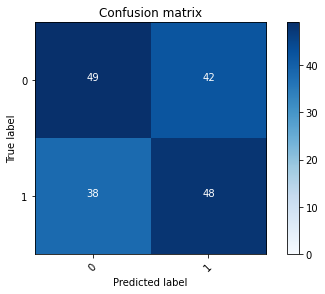

2022-08-20 20:00:08 - [Epoch Train: 91] loss: 0.0137, auc: 0.9998, acc: 0.9959, time: 50.00 s            
2022-08-20 20:00:08 - [Epoch Valid: 91] loss: 3.2863, auc: 0.5410, acc: 0.5681, time: 13.00 s


 91%|████████████████████████████████████▍   | 91/100 [1:38:50<09:39, 64.42s/it]

2022-08-20 20:00:08 - EPOCH: 92
2022-08-20 20:00:09 - Train Step 10/977, train_loss: 0.0006
2022-08-20 20:00:09 - Train Step 20/977, train_loss: 0.0031
2022-08-20 20:00:10 - Train Step 30/977, train_loss: 0.0032
2022-08-20 20:00:10 - Train Step 40/977, train_loss: 0.0182
2022-08-20 20:00:11 - Train Step 50/977, train_loss: 0.0146
2022-08-20 20:00:11 - Train Step 60/977, train_loss: 0.0122
2022-08-20 20:00:12 - Train Step 70/977, train_loss: 0.0114
2022-08-20 20:00:12 - Train Step 80/977, train_loss: 0.0101
2022-08-20 20:00:13 - Train Step 90/977, train_loss: 0.0095
2022-08-20 20:00:13 - Train Step 100/977, train_loss: 0.0089
2022-08-20 20:00:14 - Train Step 110/977, train_loss: 0.0082
2022-08-20 20:00:14 - Train Step 120/977, train_loss: 0.0082
2022-08-20 20:00:15 - Train Step 130/977, train_loss: 0.0079
2022-08-20 20:00:15 - Train Step 140/977, train_loss: 0.0093
2022-08-20 20:00:16 - Train Step 150/977, train_loss: 0.0088
2022-08-20 20:00:16 - Train Step 160/977, train_loss: 0.0083
2

2022-08-20 20:01:08 - Valid Step 185/257, valid_loss: 3.4568
2022-08-20 20:01:09 - Valid Step 190/257, valid_loss: 3.4840
2022-08-20 20:01:09 - Valid Step 195/257, valid_loss: 3.4178
2022-08-20 20:01:09 - Valid Step 200/257, valid_loss: 3.5649
2022-08-20 20:01:10 - Valid Step 205/257, valid_loss: 3.5355
2022-08-20 20:01:10 - Valid Step 210/257, valid_loss: 3.4728
2022-08-20 20:01:10 - Valid Step 215/257, valid_loss: 3.5567
2022-08-20 20:01:10 - Valid Step 220/257, valid_loss: 3.5522
2022-08-20 20:01:11 - Valid Step 225/257, valid_loss: 3.4865
2022-08-20 20:01:11 - Valid Step 230/257, valid_loss: 3.4118
2022-08-20 20:01:11 - Valid Step 235/257, valid_loss: 3.3590
2022-08-20 20:01:11 - Valid Step 240/257, valid_loss: 3.2897
2022-08-20 20:01:12 - Valid Step 245/257, valid_loss: 3.2908
2022-08-20 20:01:12 - Valid Step 250/257, valid_loss: 3.2839
2022-08-20 20:01:12 - Valid Step 255/257, valid_loss: 3.3162
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

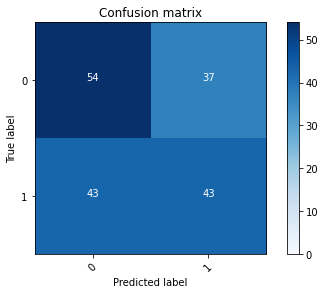

2022-08-20 20:01:12 - [Epoch Train: 92] loss: 0.0088, auc: 1.0000, acc: 0.9969, time: 50.00 s            
2022-08-20 20:01:12 - [Epoch Valid: 92] loss: 3.3486, auc: 0.5385, acc: 0.5525, time: 13.00 s


 92%|████████████████████████████████████▊   | 92/100 [1:39:55<08:35, 64.46s/it]

2022-08-20 20:01:12 - EPOCH: 93
2022-08-20 20:01:13 - Train Step 10/977, train_loss: 0.0004
2022-08-20 20:01:14 - Train Step 20/977, train_loss: 0.0064
2022-08-20 20:01:14 - Train Step 30/977, train_loss: 0.0048
2022-08-20 20:01:15 - Train Step 40/977, train_loss: 0.0203
2022-08-20 20:01:15 - Train Step 50/977, train_loss: 0.0163
2022-08-20 20:01:16 - Train Step 60/977, train_loss: 0.0136
2022-08-20 20:01:16 - Train Step 70/977, train_loss: 0.0223
2022-08-20 20:01:17 - Train Step 80/977, train_loss: 0.0197
2022-08-20 20:01:17 - Train Step 90/977, train_loss: 0.0177
2022-08-20 20:01:18 - Train Step 100/977, train_loss: 0.0166
2022-08-20 20:01:18 - Train Step 110/977, train_loss: 0.0154
2022-08-20 20:01:19 - Train Step 120/977, train_loss: 0.0144
2022-08-20 20:01:19 - Train Step 130/977, train_loss: 0.0134
2022-08-20 20:01:20 - Train Step 140/977, train_loss: 0.0127
2022-08-20 20:01:20 - Train Step 150/977, train_loss: 0.0119
2022-08-20 20:01:21 - Train Step 160/977, train_loss: 0.0112
2

2022-08-20 20:02:13 - Valid Step 185/257, valid_loss: 3.3903
2022-08-20 20:02:14 - Valid Step 190/257, valid_loss: 3.5766
2022-08-20 20:02:14 - Valid Step 195/257, valid_loss: 3.6026
2022-08-20 20:02:14 - Valid Step 200/257, valid_loss: 3.6191
2022-08-20 20:02:14 - Valid Step 205/257, valid_loss: 3.6410
2022-08-20 20:02:15 - Valid Step 210/257, valid_loss: 3.5693
2022-08-20 20:02:15 - Valid Step 215/257, valid_loss: 3.5377
2022-08-20 20:02:15 - Valid Step 220/257, valid_loss: 3.4850
2022-08-20 20:02:15 - Valid Step 225/257, valid_loss: 3.5802
2022-08-20 20:02:16 - Valid Step 230/257, valid_loss: 3.6189
2022-08-20 20:02:16 - Valid Step 235/257, valid_loss: 3.6127
2022-08-20 20:02:16 - Valid Step 240/257, valid_loss: 3.5824
2022-08-20 20:02:17 - Valid Step 245/257, valid_loss: 3.5976
2022-08-20 20:02:17 - Valid Step 250/257, valid_loss: 3.5846
2022-08-20 20:02:17 - Valid Step 255/257, valid_loss: 3.6405
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

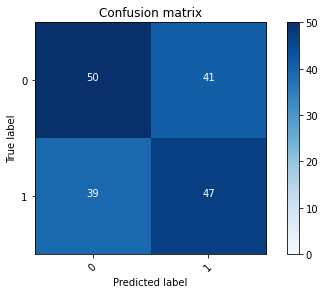

2022-08-20 20:02:17 - [Epoch Train: 93] loss: 0.0054, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 20:02:17 - [Epoch Valid: 93] loss: 3.6480, auc: 0.5412, acc: 0.5642, time: 13.00 s


 93%|█████████████████████████████████████▏  | 93/100 [1:41:00<07:32, 64.58s/it]

2022-08-20 20:02:17 - EPOCH: 94
2022-08-20 20:02:18 - Train Step 10/977, train_loss: 0.0032
2022-08-20 20:02:18 - Train Step 20/977, train_loss: 0.0023
2022-08-20 20:02:19 - Train Step 30/977, train_loss: 0.0019
2022-08-20 20:02:20 - Train Step 40/977, train_loss: 0.0015
2022-08-20 20:02:20 - Train Step 50/977, train_loss: 0.0046
2022-08-20 20:02:21 - Train Step 60/977, train_loss: 0.0118
2022-08-20 20:02:21 - Train Step 70/977, train_loss: 0.0102
2022-08-20 20:02:22 - Train Step 80/977, train_loss: 0.0090
2022-08-20 20:02:22 - Train Step 90/977, train_loss: 0.0102
2022-08-20 20:02:23 - Train Step 100/977, train_loss: 0.0129
2022-08-20 20:02:23 - Train Step 110/977, train_loss: 0.0122
2022-08-20 20:02:24 - Train Step 120/977, train_loss: 0.0191
2022-08-20 20:02:24 - Train Step 130/977, train_loss: 0.0176
2022-08-20 20:02:25 - Train Step 140/977, train_loss: 0.0192
2022-08-20 20:02:25 - Train Step 150/977, train_loss: 0.0215
2022-08-20 20:02:26 - Train Step 160/977, train_loss: 0.0208
2

2022-08-20 20:03:18 - Valid Step 185/257, valid_loss: 3.7645
2022-08-20 20:03:19 - Valid Step 190/257, valid_loss: 3.7868
2022-08-20 20:03:19 - Valid Step 195/257, valid_loss: 3.8063
2022-08-20 20:03:19 - Valid Step 200/257, valid_loss: 3.8286
2022-08-20 20:03:19 - Valid Step 205/257, valid_loss: 3.7625
2022-08-20 20:03:20 - Valid Step 210/257, valid_loss: 3.7507
2022-08-20 20:03:20 - Valid Step 215/257, valid_loss: 3.8966
2022-08-20 20:03:20 - Valid Step 220/257, valid_loss: 3.9097
2022-08-20 20:03:21 - Valid Step 225/257, valid_loss: 3.8462
2022-08-20 20:03:21 - Valid Step 230/257, valid_loss: 3.8882
2022-08-20 20:03:21 - Valid Step 235/257, valid_loss: 3.8433
2022-08-20 20:03:21 - Valid Step 240/257, valid_loss: 3.7804
2022-08-20 20:03:22 - Valid Step 245/257, valid_loss: 3.8052
2022-08-20 20:03:22 - Valid Step 250/257, valid_loss: 3.7984
2022-08-20 20:03:22 - Valid Step 255/257, valid_loss: 3.7886
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

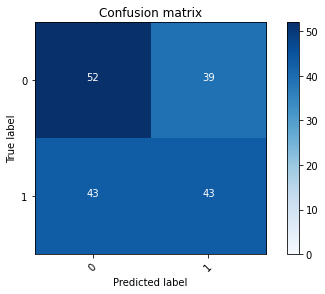

2022-08-20 20:03:22 - [Epoch Train: 94] loss: 0.0094, auc: 1.0000, acc: 0.9959, time: 51.00 s            
2022-08-20 20:03:22 - [Epoch Valid: 94] loss: 3.7722, auc: 0.5346, acc: 0.5486, time: 13.00 s


 94%|█████████████████████████████████████▌  | 94/100 [1:42:05<06:28, 64.72s/it]

2022-08-20 20:03:22 - EPOCH: 95
2022-08-20 20:03:23 - Train Step 10/977, train_loss: 0.0033
2022-08-20 20:03:24 - Train Step 20/977, train_loss: 0.0066
2022-08-20 20:03:24 - Train Step 30/977, train_loss: 0.0046
2022-08-20 20:03:25 - Train Step 40/977, train_loss: 0.0036
2022-08-20 20:03:25 - Train Step 50/977, train_loss: 0.0029
2022-08-20 20:03:26 - Train Step 60/977, train_loss: 0.0028
2022-08-20 20:03:26 - Train Step 70/977, train_loss: 0.0056
2022-08-20 20:03:27 - Train Step 80/977, train_loss: 0.0049
2022-08-20 20:03:27 - Train Step 90/977, train_loss: 0.0046
2022-08-20 20:03:28 - Train Step 100/977, train_loss: 0.0043
2022-08-20 20:03:28 - Train Step 110/977, train_loss: 0.0041
2022-08-20 20:03:29 - Train Step 120/977, train_loss: 0.0048
2022-08-20 20:03:29 - Train Step 130/977, train_loss: 0.0045
2022-08-20 20:03:30 - Train Step 140/977, train_loss: 0.0042
2022-08-20 20:03:30 - Train Step 150/977, train_loss: 0.0040
2022-08-20 20:03:31 - Train Step 160/977, train_loss: 0.0038
2

2022-08-20 20:04:23 - Valid Step 185/257, valid_loss: 3.8195
2022-08-20 20:04:24 - Valid Step 190/257, valid_loss: 3.7770
2022-08-20 20:04:24 - Valid Step 195/257, valid_loss: 3.8889
2022-08-20 20:04:24 - Valid Step 200/257, valid_loss: 3.8741
2022-08-20 20:04:24 - Valid Step 205/257, valid_loss: 3.8736
2022-08-20 20:04:25 - Valid Step 210/257, valid_loss: 3.8808
2022-08-20 20:04:25 - Valid Step 215/257, valid_loss: 3.8844
2022-08-20 20:04:25 - Valid Step 220/257, valid_loss: 3.8309
2022-08-20 20:04:25 - Valid Step 225/257, valid_loss: 3.7759
2022-08-20 20:04:26 - Valid Step 230/257, valid_loss: 3.7432
2022-08-20 20:04:26 - Valid Step 235/257, valid_loss: 3.7215
2022-08-20 20:04:26 - Valid Step 240/257, valid_loss: 3.6555
2022-08-20 20:04:26 - Valid Step 245/257, valid_loss: 3.7120
2022-08-20 20:04:27 - Valid Step 250/257, valid_loss: 3.7412
2022-08-20 20:04:27 - Valid Step 255/257, valid_loss: 3.7623
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

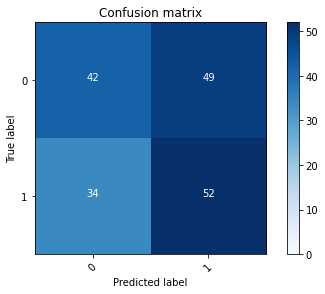

2022-08-20 20:04:27 - [Epoch Train: 95] loss: 0.0089, auc: 1.0000, acc: 0.9959, time: 51.00 s            
2022-08-20 20:04:27 - [Epoch Valid: 95] loss: 3.8540, auc: 0.5448, acc: 0.5525, time: 13.00 s


 95%|██████████████████████████████████████  | 95/100 [1:43:10<05:23, 64.79s/it]

2022-08-20 20:04:27 - EPOCH: 96
2022-08-20 20:04:28 - Train Step 10/977, train_loss: 0.0011
2022-08-20 20:04:29 - Train Step 20/977, train_loss: 0.0009
2022-08-20 20:04:29 - Train Step 30/977, train_loss: 0.0028
2022-08-20 20:04:30 - Train Step 40/977, train_loss: 0.0024
2022-08-20 20:04:30 - Train Step 50/977, train_loss: 0.0051
2022-08-20 20:04:31 - Train Step 60/977, train_loss: 0.0043
2022-08-20 20:04:31 - Train Step 70/977, train_loss: 0.0047
2022-08-20 20:04:32 - Train Step 80/977, train_loss: 0.0042
2022-08-20 20:04:32 - Train Step 90/977, train_loss: 0.0046
2022-08-20 20:04:33 - Train Step 100/977, train_loss: 0.0041
2022-08-20 20:04:33 - Train Step 110/977, train_loss: 0.0038
2022-08-20 20:04:34 - Train Step 120/977, train_loss: 0.0035
2022-08-20 20:04:34 - Train Step 130/977, train_loss: 0.0033
2022-08-20 20:04:35 - Train Step 140/977, train_loss: 0.0031
2022-08-20 20:04:35 - Train Step 150/977, train_loss: 0.0031
2022-08-20 20:04:36 - Train Step 160/977, train_loss: 0.0029
2

2022-08-20 20:05:28 - Valid Step 185/257, valid_loss: 3.8148
2022-08-20 20:05:28 - Valid Step 190/257, valid_loss: 3.7355
2022-08-20 20:05:28 - Valid Step 195/257, valid_loss: 3.6459
2022-08-20 20:05:29 - Valid Step 200/257, valid_loss: 3.6688
2022-08-20 20:05:29 - Valid Step 205/257, valid_loss: 3.6712
2022-08-20 20:05:29 - Valid Step 210/257, valid_loss: 3.7248
2022-08-20 20:05:30 - Valid Step 215/257, valid_loss: 3.7346
2022-08-20 20:05:30 - Valid Step 220/257, valid_loss: 3.7302
2022-08-20 20:05:30 - Valid Step 225/257, valid_loss: 3.7142
2022-08-20 20:05:30 - Valid Step 230/257, valid_loss: 3.6457
2022-08-20 20:05:31 - Valid Step 235/257, valid_loss: 3.6406
2022-08-20 20:05:31 - Valid Step 240/257, valid_loss: 3.5855
2022-08-20 20:05:31 - Valid Step 245/257, valid_loss: 3.5797
2022-08-20 20:05:31 - Valid Step 250/257, valid_loss: 3.6269
2022-08-20 20:05:31 - Valid Step 255/257, valid_loss: 3.6237
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

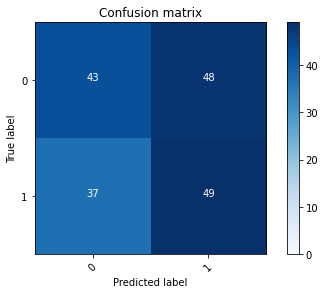

2022-08-20 20:05:32 - [Epoch Train: 96] loss: 0.0059, auc: 1.0000, acc: 0.9990, time: 51.00 s            
2022-08-20 20:05:32 - [Epoch Valid: 96] loss: 3.6321, auc: 0.5368, acc: 0.5409, time: 13.00 s


 96%|██████████████████████████████████████▍ | 96/100 [1:44:14<04:18, 64.70s/it]

2022-08-20 20:05:32 - EPOCH: 97
2022-08-20 20:05:32 - Train Step 10/977, train_loss: 0.0001
2022-08-20 20:05:33 - Train Step 20/977, train_loss: 0.0228
2022-08-20 20:05:33 - Train Step 30/977, train_loss: 0.0215
2022-08-20 20:05:34 - Train Step 40/977, train_loss: 0.0162
2022-08-20 20:05:35 - Train Step 50/977, train_loss: 0.0197
2022-08-20 20:05:35 - Train Step 60/977, train_loss: 0.0167
2022-08-20 20:05:36 - Train Step 70/977, train_loss: 0.0145
2022-08-20 20:05:36 - Train Step 80/977, train_loss: 0.0138
2022-08-20 20:05:37 - Train Step 90/977, train_loss: 0.0160
2022-08-20 20:05:37 - Train Step 100/977, train_loss: 0.0145
2022-08-20 20:05:38 - Train Step 110/977, train_loss: 0.0134
2022-08-20 20:05:38 - Train Step 120/977, train_loss: 0.0125
2022-08-20 20:05:39 - Train Step 130/977, train_loss: 0.0116
2022-08-20 20:05:39 - Train Step 140/977, train_loss: 0.0120
2022-08-20 20:05:40 - Train Step 150/977, train_loss: 0.0119
2022-08-20 20:05:40 - Train Step 160/977, train_loss: 0.0112
2

2022-08-20 20:06:32 - Valid Step 185/257, valid_loss: 4.1280
2022-08-20 20:06:32 - Valid Step 190/257, valid_loss: 4.1138
2022-08-20 20:06:33 - Valid Step 195/257, valid_loss: 4.0466
2022-08-20 20:06:33 - Valid Step 200/257, valid_loss: 4.0300
2022-08-20 20:06:33 - Valid Step 205/257, valid_loss: 4.0603
2022-08-20 20:06:33 - Valid Step 210/257, valid_loss: 4.0353
2022-08-20 20:06:34 - Valid Step 215/257, valid_loss: 3.9876
2022-08-20 20:06:34 - Valid Step 220/257, valid_loss: 4.0728
2022-08-20 20:06:34 - Valid Step 225/257, valid_loss: 4.1486
2022-08-20 20:06:34 - Valid Step 230/257, valid_loss: 4.0976
2022-08-20 20:06:35 - Valid Step 235/257, valid_loss: 4.0215
2022-08-20 20:06:35 - Valid Step 240/257, valid_loss: 3.9957
2022-08-20 20:06:35 - Valid Step 245/257, valid_loss: 3.9556
2022-08-20 20:06:35 - Valid Step 250/257, valid_loss: 3.8976
2022-08-20 20:06:36 - Valid Step 255/257, valid_loss: 3.8706
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

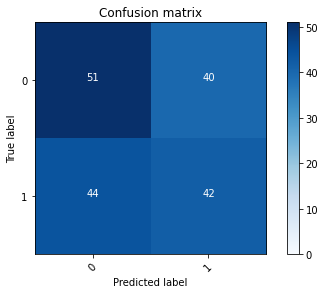

2022-08-20 20:06:36 - [Epoch Train: 97] loss: 0.0070, auc: 1.0000, acc: 0.9990, time: 50.00 s            
2022-08-20 20:06:36 - [Epoch Valid: 97] loss: 3.9258, auc: 0.5323, acc: 0.5331, time: 13.00 s


 97%|██████████████████████████████████████▊ | 97/100 [1:45:18<03:13, 64.54s/it]

2022-08-20 20:06:36 - EPOCH: 98
2022-08-20 20:06:37 - Train Step 10/977, train_loss: 0.0003
2022-08-20 20:06:37 - Train Step 20/977, train_loss: 0.0022
2022-08-20 20:06:38 - Train Step 30/977, train_loss: 0.0016
2022-08-20 20:06:38 - Train Step 40/977, train_loss: 0.0017
2022-08-20 20:06:39 - Train Step 50/977, train_loss: 0.0097
2022-08-20 20:06:39 - Train Step 60/977, train_loss: 0.0082
2022-08-20 20:06:40 - Train Step 70/977, train_loss: 0.0075
2022-08-20 20:06:40 - Train Step 80/977, train_loss: 0.0071
2022-08-20 20:06:41 - Train Step 90/977, train_loss: 0.0064
2022-08-20 20:06:41 - Train Step 100/977, train_loss: 0.0058
2022-08-20 20:06:42 - Train Step 110/977, train_loss: 0.0057
2022-08-20 20:06:42 - Train Step 120/977, train_loss: 0.0055
2022-08-20 20:06:43 - Train Step 130/977, train_loss: 0.0065
2022-08-20 20:06:43 - Train Step 140/977, train_loss: 0.0060
2022-08-20 20:06:44 - Train Step 150/977, train_loss: 0.0058
2022-08-20 20:06:44 - Train Step 160/977, train_loss: 0.0054
2

2022-08-20 20:07:37 - Valid Step 185/257, valid_loss: 3.7920
2022-08-20 20:07:37 - Valid Step 190/257, valid_loss: 3.9326
2022-08-20 20:07:37 - Valid Step 195/257, valid_loss: 3.9465
2022-08-20 20:07:38 - Valid Step 200/257, valid_loss: 3.9218
2022-08-20 20:07:38 - Valid Step 205/257, valid_loss: 3.9213
2022-08-20 20:07:38 - Valid Step 210/257, valid_loss: 4.0610
2022-08-20 20:07:38 - Valid Step 215/257, valid_loss: 4.0578
2022-08-20 20:07:39 - Valid Step 220/257, valid_loss: 3.9675
2022-08-20 20:07:39 - Valid Step 225/257, valid_loss: 3.8902
2022-08-20 20:07:39 - Valid Step 230/257, valid_loss: 3.8774
2022-08-20 20:07:39 - Valid Step 235/257, valid_loss: 3.8583
2022-08-20 20:07:40 - Valid Step 240/257, valid_loss: 3.9119
2022-08-20 20:07:40 - Valid Step 245/257, valid_loss: 4.0046
2022-08-20 20:07:40 - Valid Step 250/257, valid_loss: 3.9309
2022-08-20 20:07:40 - Valid Step 255/257, valid_loss: 3.8975
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

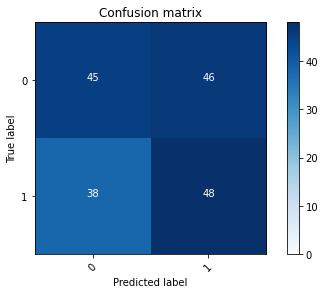

2022-08-20 20:07:41 - [Epoch Train: 98] loss: 0.0104, auc: 0.9998, acc: 0.9990, time: 50.00 s            
2022-08-20 20:07:41 - [Epoch Valid: 98] loss: 3.8886, auc: 0.5518, acc: 0.5525, time: 13.00 s


 98%|███████████████████████████████████████▏| 98/100 [1:46:23<02:09, 64.56s/it]

2022-08-20 20:07:41 - EPOCH: 99
2022-08-20 20:07:41 - Train Step 10/977, train_loss: 0.0627
2022-08-20 20:07:42 - Train Step 20/977, train_loss: 0.0347
2022-08-20 20:07:42 - Train Step 30/977, train_loss: 0.0234
2022-08-20 20:07:43 - Train Step 40/977, train_loss: 0.0176
2022-08-20 20:07:43 - Train Step 50/977, train_loss: 0.0142
2022-08-20 20:07:44 - Train Step 60/977, train_loss: 0.0129
2022-08-20 20:07:44 - Train Step 70/977, train_loss: 0.0111
2022-08-20 20:07:45 - Train Step 80/977, train_loss: 0.0102
2022-08-20 20:07:45 - Train Step 90/977, train_loss: 0.0092
2022-08-20 20:07:46 - Train Step 100/977, train_loss: 0.0083
2022-08-20 20:07:46 - Train Step 110/977, train_loss: 0.0106
2022-08-20 20:07:47 - Train Step 120/977, train_loss: 0.0101
2022-08-20 20:07:48 - Train Step 130/977, train_loss: 0.0093
2022-08-20 20:07:48 - Train Step 140/977, train_loss: 0.0086
2022-08-20 20:07:49 - Train Step 150/977, train_loss: 0.0085
2022-08-20 20:07:49 - Train Step 160/977, train_loss: 0.0080
2

2022-08-20 20:08:41 - Valid Step 185/257, valid_loss: 3.6457
2022-08-20 20:08:41 - Valid Step 190/257, valid_loss: 3.7239
2022-08-20 20:08:42 - Valid Step 195/257, valid_loss: 3.6812
2022-08-20 20:08:42 - Valid Step 200/257, valid_loss: 3.6595
2022-08-20 20:08:42 - Valid Step 205/257, valid_loss: 3.5782
2022-08-20 20:08:42 - Valid Step 210/257, valid_loss: 3.5655
2022-08-20 20:08:43 - Valid Step 215/257, valid_loss: 3.5697
2022-08-20 20:08:43 - Valid Step 220/257, valid_loss: 3.6008
2022-08-20 20:08:43 - Valid Step 225/257, valid_loss: 3.5601
2022-08-20 20:08:43 - Valid Step 230/257, valid_loss: 3.5108
2022-08-20 20:08:44 - Valid Step 235/257, valid_loss: 3.5790
2022-08-20 20:08:44 - Valid Step 240/257, valid_loss: 3.5971
2022-08-20 20:08:44 - Valid Step 245/257, valid_loss: 3.6515
2022-08-20 20:08:44 - Valid Step 250/257, valid_loss: 3.6214
2022-08-20 20:08:45 - Valid Step 255/257, valid_loss: 3.5737
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

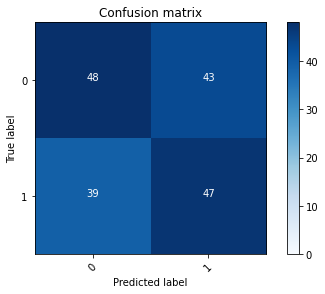

2022-08-20 20:08:45 - [Epoch Train: 99] loss: 0.0071, auc: 1.0000, acc: 0.9980, time: 50.00 s            
2022-08-20 20:08:45 - [Epoch Valid: 99] loss: 3.5928, auc: 0.5354, acc: 0.5564, time: 13.00 s


 99%|███████████████████████████████████████▌| 99/100 [1:47:27<01:04, 64.48s/it]

2022-08-20 20:08:45 - EPOCH: 100
2022-08-20 20:08:46 - Train Step 10/977, train_loss: 0.0058
2022-08-20 20:08:46 - Train Step 20/977, train_loss: 0.0034
2022-08-20 20:08:47 - Train Step 30/977, train_loss: 0.0036
2022-08-20 20:08:47 - Train Step 40/977, train_loss: 0.0028
2022-08-20 20:08:48 - Train Step 50/977, train_loss: 0.0027
2022-08-20 20:08:48 - Train Step 60/977, train_loss: 0.0026
2022-08-20 20:08:49 - Train Step 70/977, train_loss: 0.0027
2022-08-20 20:08:49 - Train Step 80/977, train_loss: 0.0079
2022-08-20 20:08:50 - Train Step 90/977, train_loss: 0.0075
2022-08-20 20:08:50 - Train Step 100/977, train_loss: 0.0068
2022-08-20 20:08:51 - Train Step 110/977, train_loss: 0.0062
2022-08-20 20:08:51 - Train Step 120/977, train_loss: 0.0058
2022-08-20 20:08:52 - Train Step 130/977, train_loss: 0.0064
2022-08-20 20:08:52 - Train Step 140/977, train_loss: 0.0059
2022-08-20 20:08:53 - Train Step 150/977, train_loss: 0.0057
2022-08-20 20:08:53 - Train Step 160/977, train_loss: 0.0053


2022-08-20 20:09:45 - Valid Step 185/257, valid_loss: 4.0848
2022-08-20 20:09:46 - Valid Step 190/257, valid_loss: 3.9820
2022-08-20 20:09:46 - Valid Step 195/257, valid_loss: 3.8949
2022-08-20 20:09:46 - Valid Step 200/257, valid_loss: 3.8458
2022-08-20 20:09:46 - Valid Step 205/257, valid_loss: 3.7734
2022-08-20 20:09:47 - Valid Step 210/257, valid_loss: 3.8379
2022-08-20 20:09:47 - Valid Step 215/257, valid_loss: 3.9293
2022-08-20 20:09:47 - Valid Step 220/257, valid_loss: 3.8581
2022-08-20 20:09:47 - Valid Step 225/257, valid_loss: 3.8252
2022-08-20 20:09:48 - Valid Step 230/257, valid_loss: 3.7423
2022-08-20 20:09:48 - Valid Step 235/257, valid_loss: 3.6750
2022-08-20 20:09:48 - Valid Step 240/257, valid_loss: 3.7414
2022-08-20 20:09:48 - Valid Step 245/257, valid_loss: 3.7724
2022-08-20 20:09:49 - Valid Step 250/257, valid_loss: 3.6985
2022-08-20 20:09:49 - Valid Step 255/257, valid_loss: 3.7535
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

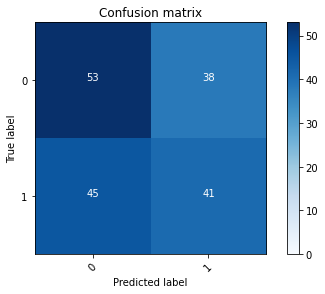

2022-08-20 20:09:49 - [Epoch Train: 100] loss: 0.0048, auc: 1.0000, acc: 0.9990, time: 50.00 s            
2022-08-20 20:09:49 - [Epoch Valid: 100] loss: 3.7922, auc: 0.5329, acc: 0.5409, time: 13.00 s


100%|███████████████████████████████████████| 100/100 [1:48:32<00:00, 65.12s/it]

-- FOLD N:3
Train origin: mn
Type: KLF
2022-08-20 20:09:49 - (M0) Train/Val datasets size: 270
2022-08-20 20:09:49 - (M1) Train/Val datasets size: 303
2022-08-20 20:09:49 - (N0) Train/Val datasets size: 170
2022-08-20 20:09:49 - (N1) Train/Val datasets size: 121
2022-08-20 20:09:49 - Concatenating M0 and N0...
Length of concatenated dataset: 540
2022-08-20 20:09:49 - (MN0) Train/Val datasets size: 540
2022-08-20 20:09:49 - Concatenating M1 and N1...
Length of concatenated dataset: 606
2022-08-20 20:09:49 - (MN1) Train/Val datasets size: 606
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa5790da070>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fa5790da1f0>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa5120793d0>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7fa50e3fd550>, 'mn_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa5790daeb0>, 'mn_dataset_1': <utils.da

[([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 41, 42, 43, 44, 45, 46, 47, 49, 51, 52, 54, 55, 56, 57, 58, 59, 61, 62, 64, 65, 66, 68, 71, 72, 74, 75, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 94, 97, 98, 100, 102, 103, 104, 106, 109, 110, 111, 112, 113, 115, 116, 118, 119, 120, 121, 122, 124, 125, 126, 127, 128, 130, 131, 132, 133, 134, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 155, 156, 157, 158, 160, 161, 162, 163, 164, 165, 168, 169, 171, 172, 173, 174, 175, 176, 177, 179, 181, 182, 183, 184, 185, 186, 187, 189, 193, 194, 195, 196, 197, 198, 199, 200, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 221, 222, 223, 224, 225, 227, 228, 230, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 244, 245, 248, 249, 250, 251, 252, 253, 254, 255, 259, 260, 261, 262, 263, 264, 265, 266, 267, 269, 271, 272, 

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 41, 42, 43, 44, 45, 46, 47, 49, 51, 52, 54, 55, 56, 57, 58, 59, 61, 62, 64, 65, 66, 68, 71, 72, 74, 75, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 94, 97, 98, 100, 102, 103, 104, 106, 109, 110, 111, 112, 113, 115, 116, 118, 119, 120, 121, 122, 124, 125, 126, 127, 128, 130, 131, 132, 133, 134, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 155, 156, 157, 158, 160, 161, 162, 163, 164, 165, 168, 169, 171, 172, 173, 174, 175, 176, 177, 179, 181, 182, 183, 184, 185, 186, 187, 189, 193, 194, 195, 196, 197, 198, 199, 200, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 221, 222, 223, 224, 225, 227, 228, 230, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 244, 245, 248, 249, 250, 251, 252, 2

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa50e2bd610>, <torch.utils.data.dataloader.DataLoader object at 0x7fa512096b50>, <torch.utils.data.dataloader.DataLoader object at 0x7fa512062df0>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa5500af430>, <torch.utils.data.dataloader.DataLoader object at 0x7fa5500af3d0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa5120badc0>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa550680e50>, <torch.utils.data.dataloader.DataLoader object at 0x7fa5505e9f70>, <torch.utils.data.dataloader.DataLoader object at 0x7fa50e3a4e80>]}}
2022-08-20 20:22:07 - Using CUDA...
KLF
{'ext': 'mat', 'dims': 2, 'batch_size': 1, 'mri_types': ['KLF'], 'is_depth_wise': True, 'is_transformed': False, 'output_size': 1, 'is_multistep': True, 'lr': 0.0001, 'is_adam': True, 'momentum': 0.9, 'is_10_fold': False, 'val_total_ratio': 0.2, 'is_internal_dataset': True, 'train_origin'

  0%|                                                   | 0/100 [00:00<?, ?it/s]

2022-08-20 20:22:07 - EPOCH: 1
2022-08-20 20:22:07 - Train Step 10/973, train_loss: 0.7290
2022-08-20 20:22:08 - Train Step 20/973, train_loss: 0.6984
2022-08-20 20:22:08 - Train Step 30/973, train_loss: 0.7077
2022-08-20 20:22:09 - Train Step 40/973, train_loss: 0.6974
2022-08-20 20:22:09 - Train Step 50/973, train_loss: 0.6972
2022-08-20 20:22:10 - Train Step 60/973, train_loss: 0.6918
2022-08-20 20:22:10 - Train Step 70/973, train_loss: 0.6901
2022-08-20 20:22:11 - Train Step 80/973, train_loss: 0.6910
2022-08-20 20:22:11 - Train Step 90/973, train_loss: 0.6880
2022-08-20 20:22:12 - Train Step 100/973, train_loss: 0.6889
2022-08-20 20:22:12 - Train Step 110/973, train_loss: 0.6910
2022-08-20 20:22:13 - Train Step 120/973, train_loss: 0.6915
2022-08-20 20:22:13 - Train Step 130/973, train_loss: 0.6882
2022-08-20 20:22:14 - Train Step 140/973, train_loss: 0.6899
2022-08-20 20:22:15 - Train Step 150/973, train_loss: 0.6892
2022-08-20 20:22:15 - Train Step 160/973, train_loss: 0.6897
20

2022-08-20 20:23:07 - Valid Step 185/257, valid_loss: 0.6948
2022-08-20 20:23:07 - Valid Step 190/257, valid_loss: 0.6944
2022-08-20 20:23:07 - Valid Step 195/257, valid_loss: 0.6945
2022-08-20 20:23:07 - Valid Step 200/257, valid_loss: 0.6946
2022-08-20 20:23:08 - Valid Step 205/257, valid_loss: 0.6946
2022-08-20 20:23:08 - Valid Step 210/257, valid_loss: 0.6943
2022-08-20 20:23:08 - Valid Step 215/257, valid_loss: 0.6946
2022-08-20 20:23:08 - Valid Step 220/257, valid_loss: 0.6943
2022-08-20 20:23:09 - Valid Step 225/257, valid_loss: 0.6938
2022-08-20 20:23:09 - Valid Step 230/257, valid_loss: 0.6935
2022-08-20 20:23:09 - Valid Step 235/257, valid_loss: 0.6930
2022-08-20 20:23:09 - Valid Step 240/257, valid_loss: 0.6932
2022-08-20 20:23:10 - Valid Step 245/257, valid_loss: 0.6932
2022-08-20 20:23:10 - Valid Step 250/257, valid_loss: 0.6936
2022-08-20 20:23:10 - Valid Step 255/257, valid_loss: 0.6936
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

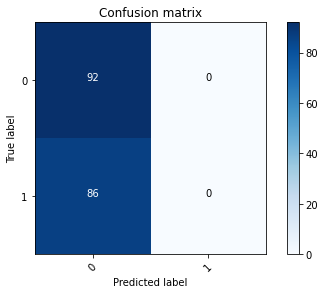

2022-08-20 20:23:10 - [Epoch Train: 1] loss: 0.6950, auc: 0.5232, acc: 0.5005, time: 50.00 s            
2022-08-20 20:23:10 - [Epoch Valid: 1] loss: 0.6937, auc: 0.5489, acc: 0.5214, time: 13.00 s
2022-08-20 20:23:10 - acc improved from 0.0000 to 0.5214. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_20-22-07/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e1-loss0.694-acc0.521-auc0.549.pth'


  1%|▍                                        | 1/100 [01:03<1:45:28, 63.92s/it]

2022-08-20 20:23:10 - EPOCH: 2
2022-08-20 20:23:11 - Train Step 10/973, train_loss: 0.6957
2022-08-20 20:23:12 - Train Step 20/973, train_loss: 0.6907
2022-08-20 20:23:12 - Train Step 30/973, train_loss: 0.6930
2022-08-20 20:23:13 - Train Step 40/973, train_loss: 0.6920
2022-08-20 20:23:13 - Train Step 50/973, train_loss: 0.6935
2022-08-20 20:23:14 - Train Step 60/973, train_loss: 0.6911
2022-08-20 20:23:14 - Train Step 70/973, train_loss: 0.6932
2022-08-20 20:23:15 - Train Step 80/973, train_loss: 0.6943
2022-08-20 20:23:15 - Train Step 90/973, train_loss: 0.6936
2022-08-20 20:23:16 - Train Step 100/973, train_loss: 0.6932
2022-08-20 20:23:16 - Train Step 110/973, train_loss: 0.6933
2022-08-20 20:23:17 - Train Step 120/973, train_loss: 0.6932
2022-08-20 20:23:17 - Train Step 130/973, train_loss: 0.6926
2022-08-20 20:23:18 - Train Step 140/973, train_loss: 0.6926
2022-08-20 20:23:18 - Train Step 150/973, train_loss: 0.6929
2022-08-20 20:23:19 - Train Step 160/973, train_loss: 0.6937
20

2022-08-20 20:24:11 - Valid Step 185/257, valid_loss: 0.6927
2022-08-20 20:24:11 - Valid Step 190/257, valid_loss: 0.6923
2022-08-20 20:24:11 - Valid Step 195/257, valid_loss: 0.6923
2022-08-20 20:24:12 - Valid Step 200/257, valid_loss: 0.6921
2022-08-20 20:24:12 - Valid Step 205/257, valid_loss: 0.6920
2022-08-20 20:24:12 - Valid Step 210/257, valid_loss: 0.6925
2022-08-20 20:24:12 - Valid Step 215/257, valid_loss: 0.6928
2022-08-20 20:24:13 - Valid Step 220/257, valid_loss: 0.6927
2022-08-20 20:24:13 - Valid Step 225/257, valid_loss: 0.6932
2022-08-20 20:24:13 - Valid Step 230/257, valid_loss: 0.6930
2022-08-20 20:24:13 - Valid Step 235/257, valid_loss: 0.6932
2022-08-20 20:24:14 - Valid Step 240/257, valid_loss: 0.6929
2022-08-20 20:24:14 - Valid Step 245/257, valid_loss: 0.6936
2022-08-20 20:24:14 - Valid Step 250/257, valid_loss: 0.6937
2022-08-20 20:24:14 - Valid Step 255/257, valid_loss: 0.6932
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

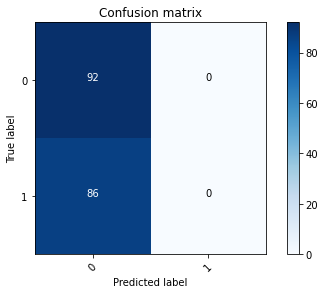

2022-08-20 20:24:15 - [Epoch Train: 2] loss: 0.6934, auc: 0.5044, acc: 0.5005, time: 50.00 s            
2022-08-20 20:24:15 - [Epoch Valid: 2] loss: 0.6934, auc: 0.5684, acc: 0.5214, time: 13.00 s
2022-08-20 20:24:15 - acc improved from 0.5214 to 0.5214. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_20-22-07/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e2-loss0.693-acc0.521-auc0.568.pth'


  2%|▊                                        | 2/100 [02:08<1:44:40, 64.09s/it]

2022-08-20 20:24:15 - EPOCH: 3
2022-08-20 20:24:15 - Train Step 10/973, train_loss: 0.6830
2022-08-20 20:24:16 - Train Step 20/973, train_loss: 0.6877
2022-08-20 20:24:16 - Train Step 30/973, train_loss: 0.6927
2022-08-20 20:24:17 - Train Step 40/973, train_loss: 0.6978
2022-08-20 20:24:17 - Train Step 50/973, train_loss: 0.6979
2022-08-20 20:24:18 - Train Step 60/973, train_loss: 0.6969
2022-08-20 20:24:18 - Train Step 70/973, train_loss: 0.6955
2022-08-20 20:24:19 - Train Step 80/973, train_loss: 0.6914
2022-08-20 20:24:19 - Train Step 90/973, train_loss: 0.6919
2022-08-20 20:24:20 - Train Step 100/973, train_loss: 0.6925
2022-08-20 20:24:21 - Train Step 110/973, train_loss: 0.6919
2022-08-20 20:24:21 - Train Step 120/973, train_loss: 0.6908
2022-08-20 20:24:22 - Train Step 130/973, train_loss: 0.6913
2022-08-20 20:24:22 - Train Step 140/973, train_loss: 0.6896
2022-08-20 20:24:23 - Train Step 150/973, train_loss: 0.6906
2022-08-20 20:24:23 - Train Step 160/973, train_loss: 0.6912
20

2022-08-20 20:25:15 - Valid Step 185/257, valid_loss: 0.6928
2022-08-20 20:25:15 - Valid Step 190/257, valid_loss: 0.6924
2022-08-20 20:25:16 - Valid Step 195/257, valid_loss: 0.6924
2022-08-20 20:25:16 - Valid Step 200/257, valid_loss: 0.6927
2022-08-20 20:25:16 - Valid Step 205/257, valid_loss: 0.6925
2022-08-20 20:25:16 - Valid Step 210/257, valid_loss: 0.6921
2022-08-20 20:25:17 - Valid Step 215/257, valid_loss: 0.6920
2022-08-20 20:25:17 - Valid Step 220/257, valid_loss: 0.6917
2022-08-20 20:25:17 - Valid Step 225/257, valid_loss: 0.6918
2022-08-20 20:25:18 - Valid Step 230/257, valid_loss: 0.6914
2022-08-20 20:25:18 - Valid Step 235/257, valid_loss: 0.6914
2022-08-20 20:25:18 - Valid Step 240/257, valid_loss: 0.6913
2022-08-20 20:25:18 - Valid Step 245/257, valid_loss: 0.6908
2022-08-20 20:25:19 - Valid Step 250/257, valid_loss: 0.6911
2022-08-20 20:25:19 - Valid Step 255/257, valid_loss: 0.6911
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

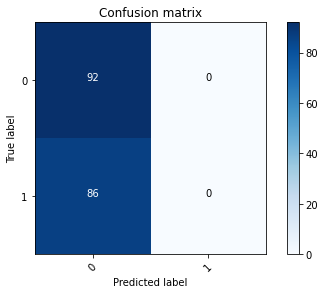

2022-08-20 20:25:19 - [Epoch Train: 3] loss: 0.6919, auc: 0.5359, acc: 0.5005, time: 50.00 s            
2022-08-20 20:25:19 - [Epoch Valid: 3] loss: 0.6912, auc: 0.5858, acc: 0.5214, time: 13.00 s
2022-08-20 20:25:19 - acc improved from 0.5214 to 0.5214. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_20-22-07/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e3-loss0.691-acc0.521-auc0.586.pth'


  3%|█▏                                       | 3/100 [03:12<1:43:47, 64.20s/it]

2022-08-20 20:25:19 - EPOCH: 4
2022-08-20 20:25:20 - Train Step 10/973, train_loss: 0.6966
2022-08-20 20:25:20 - Train Step 20/973, train_loss: 0.6878
2022-08-20 20:25:21 - Train Step 30/973, train_loss: 0.6812
2022-08-20 20:25:21 - Train Step 40/973, train_loss: 0.6807
2022-08-20 20:25:22 - Train Step 50/973, train_loss: 0.6799
2022-08-20 20:25:22 - Train Step 60/973, train_loss: 0.6803
2022-08-20 20:25:23 - Train Step 70/973, train_loss: 0.6789
2022-08-20 20:25:23 - Train Step 80/973, train_loss: 0.6773
2022-08-20 20:25:24 - Train Step 90/973, train_loss: 0.6747
2022-08-20 20:25:24 - Train Step 100/973, train_loss: 0.6764
2022-08-20 20:25:25 - Train Step 110/973, train_loss: 0.6748
2022-08-20 20:25:25 - Train Step 120/973, train_loss: 0.6741
2022-08-20 20:25:26 - Train Step 130/973, train_loss: 0.6740
2022-08-20 20:25:26 - Train Step 140/973, train_loss: 0.6717
2022-08-20 20:25:27 - Train Step 150/973, train_loss: 0.6735
2022-08-20 20:25:27 - Train Step 160/973, train_loss: 0.6777
20

2022-08-20 20:26:20 - Valid Step 185/257, valid_loss: 0.6852
2022-08-20 20:26:20 - Valid Step 190/257, valid_loss: 0.6851
2022-08-20 20:26:20 - Valid Step 195/257, valid_loss: 0.6854
2022-08-20 20:26:20 - Valid Step 200/257, valid_loss: 0.6860
2022-08-20 20:26:21 - Valid Step 205/257, valid_loss: 0.6866
2022-08-20 20:26:21 - Valid Step 210/257, valid_loss: 0.6864
2022-08-20 20:26:21 - Valid Step 215/257, valid_loss: 0.6863
2022-08-20 20:26:21 - Valid Step 220/257, valid_loss: 0.6866
2022-08-20 20:26:22 - Valid Step 225/257, valid_loss: 0.6865
2022-08-20 20:26:22 - Valid Step 230/257, valid_loss: 0.6866
2022-08-20 20:26:22 - Valid Step 235/257, valid_loss: 0.6868
2022-08-20 20:26:22 - Valid Step 240/257, valid_loss: 0.6867
2022-08-20 20:26:23 - Valid Step 245/257, valid_loss: 0.6869
2022-08-20 20:26:23 - Valid Step 250/257, valid_loss: 0.6873
2022-08-20 20:26:23 - Valid Step 255/257, valid_loss: 0.6875
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

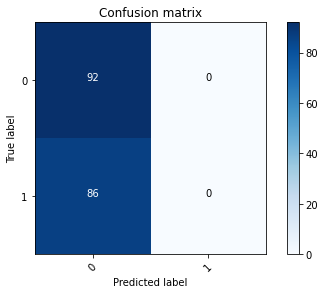

2022-08-20 20:26:24 - [Epoch Train: 4] loss: 0.6858, auc: 0.5921, acc: 0.5005, time: 50.00 s            
2022-08-20 20:26:24 - [Epoch Valid: 4] loss: 0.6878, auc: 0.5923, acc: 0.5214, time: 13.00 s
2022-08-20 20:26:24 - acc improved from 0.5214 to 0.5214. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_20-22-07/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e4-loss0.688-acc0.521-auc0.592.pth'


  4%|█▋                                       | 4/100 [04:17<1:42:57, 64.35s/it]

2022-08-20 20:26:24 - EPOCH: 5
2022-08-20 20:26:24 - Train Step 10/973, train_loss: 0.6965
2022-08-20 20:26:25 - Train Step 20/973, train_loss: 0.7006
2022-08-20 20:26:25 - Train Step 30/973, train_loss: 0.6983
2022-08-20 20:26:26 - Train Step 40/973, train_loss: 0.6924
2022-08-20 20:26:26 - Train Step 50/973, train_loss: 0.6917
2022-08-20 20:26:27 - Train Step 60/973, train_loss: 0.6943
2022-08-20 20:26:27 - Train Step 70/973, train_loss: 0.6919
2022-08-20 20:26:28 - Train Step 80/973, train_loss: 0.6891
2022-08-20 20:26:28 - Train Step 90/973, train_loss: 0.6883
2022-08-20 20:26:29 - Train Step 100/973, train_loss: 0.6851
2022-08-20 20:26:29 - Train Step 110/973, train_loss: 0.6873
2022-08-20 20:26:30 - Train Step 120/973, train_loss: 0.6878
2022-08-20 20:26:30 - Train Step 130/973, train_loss: 0.6867
2022-08-20 20:26:31 - Train Step 140/973, train_loss: 0.6874
2022-08-20 20:26:31 - Train Step 150/973, train_loss: 0.6888
2022-08-20 20:26:32 - Train Step 160/973, train_loss: 0.6905
20

2022-08-20 20:27:24 - Valid Step 185/257, valid_loss: 0.6969
2022-08-20 20:27:24 - Valid Step 190/257, valid_loss: 0.6969
2022-08-20 20:27:25 - Valid Step 195/257, valid_loss: 0.6972
2022-08-20 20:27:25 - Valid Step 200/257, valid_loss: 0.6999
2022-08-20 20:27:25 - Valid Step 205/257, valid_loss: 0.7000
2022-08-20 20:27:25 - Valid Step 210/257, valid_loss: 0.7011
2022-08-20 20:27:26 - Valid Step 215/257, valid_loss: 0.7011
2022-08-20 20:27:26 - Valid Step 220/257, valid_loss: 0.6999
2022-08-20 20:27:26 - Valid Step 225/257, valid_loss: 0.7004
2022-08-20 20:27:26 - Valid Step 230/257, valid_loss: 0.6999
2022-08-20 20:27:27 - Valid Step 235/257, valid_loss: 0.6983
2022-08-20 20:27:27 - Valid Step 240/257, valid_loss: 0.6991
2022-08-20 20:27:27 - Valid Step 245/257, valid_loss: 0.6982
2022-08-20 20:27:28 - Valid Step 250/257, valid_loss: 0.6996
2022-08-20 20:27:28 - Valid Step 255/257, valid_loss: 0.6986
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

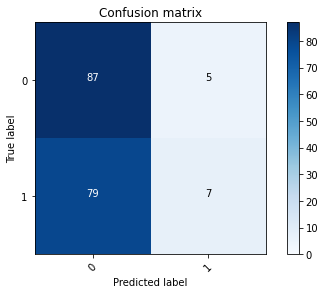

2022-08-20 20:27:28 - [Epoch Train: 5] loss: 0.6778, auc: 0.6239, acc: 0.5098, time: 50.00 s            
2022-08-20 20:27:28 - [Epoch Valid: 5] loss: 0.6980, auc: 0.5926, acc: 0.5292, time: 13.00 s
2022-08-20 20:27:28 - acc improved from 0.5214 to 0.5292. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_20-22-07/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e5-loss0.698-acc0.529-auc0.593.pth'


  5%|██                                       | 5/100 [05:21<1:41:58, 64.41s/it]

2022-08-20 20:27:28 - EPOCH: 6
2022-08-20 20:27:29 - Train Step 10/973, train_loss: 0.7077
2022-08-20 20:27:29 - Train Step 20/973, train_loss: 0.6871
2022-08-20 20:27:30 - Train Step 30/973, train_loss: 0.6932
2022-08-20 20:27:30 - Train Step 40/973, train_loss: 0.6746
2022-08-20 20:27:31 - Train Step 50/973, train_loss: 0.6664
2022-08-20 20:27:31 - Train Step 60/973, train_loss: 0.6700
2022-08-20 20:27:32 - Train Step 70/973, train_loss: 0.6680
2022-08-20 20:27:32 - Train Step 80/973, train_loss: 0.6601
2022-08-20 20:27:33 - Train Step 90/973, train_loss: 0.6647
2022-08-20 20:27:33 - Train Step 100/973, train_loss: 0.6746
2022-08-20 20:27:34 - Train Step 110/973, train_loss: 0.6727
2022-08-20 20:27:34 - Train Step 120/973, train_loss: 0.6704
2022-08-20 20:27:35 - Train Step 130/973, train_loss: 0.6698
2022-08-20 20:27:35 - Train Step 140/973, train_loss: 0.6720
2022-08-20 20:27:36 - Train Step 150/973, train_loss: 0.6721
2022-08-20 20:27:36 - Train Step 160/973, train_loss: 0.6698
20

2022-08-20 20:28:28 - Valid Step 185/257, valid_loss: 0.6887
2022-08-20 20:28:28 - Valid Step 190/257, valid_loss: 0.6875
2022-08-20 20:28:29 - Valid Step 195/257, valid_loss: 0.6878
2022-08-20 20:28:29 - Valid Step 200/257, valid_loss: 0.6889
2022-08-20 20:28:29 - Valid Step 205/257, valid_loss: 0.6883
2022-08-20 20:28:29 - Valid Step 210/257, valid_loss: 0.6899
2022-08-20 20:28:30 - Valid Step 215/257, valid_loss: 0.6906
2022-08-20 20:28:30 - Valid Step 220/257, valid_loss: 0.6907
2022-08-20 20:28:30 - Valid Step 225/257, valid_loss: 0.6897
2022-08-20 20:28:30 - Valid Step 230/257, valid_loss: 0.6913
2022-08-20 20:28:31 - Valid Step 235/257, valid_loss: 0.6901
2022-08-20 20:28:31 - Valid Step 240/257, valid_loss: 0.6897
2022-08-20 20:28:31 - Valid Step 245/257, valid_loss: 0.6897
2022-08-20 20:28:31 - Valid Step 250/257, valid_loss: 0.6892
2022-08-20 20:28:32 - Valid Step 255/257, valid_loss: 0.6880
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

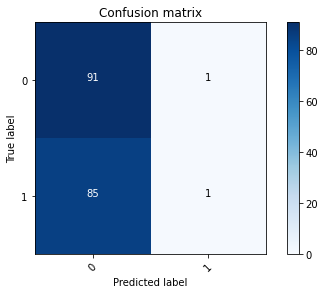

2022-08-20 20:28:32 - [Epoch Train: 6] loss: 0.6684, auc: 0.6256, acc: 0.5313, time: 50.00 s            
2022-08-20 20:28:32 - [Epoch Valid: 6] loss: 0.6876, auc: 0.5800, acc: 0.5214, time: 13.00 s


  6%|██▍                                      | 6/100 [06:25<1:40:34, 64.20s/it]

2022-08-20 20:28:32 - EPOCH: 7
2022-08-20 20:28:33 - Train Step 10/973, train_loss: 0.6215
2022-08-20 20:28:33 - Train Step 20/973, train_loss: 0.6109
2022-08-20 20:28:34 - Train Step 30/973, train_loss: 0.6536
2022-08-20 20:28:34 - Train Step 40/973, train_loss: 0.6692
2022-08-20 20:28:35 - Train Step 50/973, train_loss: 0.6667
2022-08-20 20:28:35 - Train Step 60/973, train_loss: 0.6651
2022-08-20 20:28:36 - Train Step 70/973, train_loss: 0.6609
2022-08-20 20:28:36 - Train Step 80/973, train_loss: 0.6689
2022-08-20 20:28:37 - Train Step 90/973, train_loss: 0.6682
2022-08-20 20:28:37 - Train Step 100/973, train_loss: 0.6640
2022-08-20 20:28:38 - Train Step 110/973, train_loss: 0.6632
2022-08-20 20:28:38 - Train Step 120/973, train_loss: 0.6614
2022-08-20 20:28:39 - Train Step 130/973, train_loss: 0.6567
2022-08-20 20:28:39 - Train Step 140/973, train_loss: 0.6552
2022-08-20 20:28:40 - Train Step 150/973, train_loss: 0.6532
2022-08-20 20:28:40 - Train Step 160/973, train_loss: 0.6578
20

2022-08-20 20:29:32 - Valid Step 185/257, valid_loss: 0.6857
2022-08-20 20:29:32 - Valid Step 190/257, valid_loss: 0.6851
2022-08-20 20:29:33 - Valid Step 195/257, valid_loss: 0.6846
2022-08-20 20:29:33 - Valid Step 200/257, valid_loss: 0.6850
2022-08-20 20:29:33 - Valid Step 205/257, valid_loss: 0.6852
2022-08-20 20:29:33 - Valid Step 210/257, valid_loss: 0.6852
2022-08-20 20:29:34 - Valid Step 215/257, valid_loss: 0.6872
2022-08-20 20:29:34 - Valid Step 220/257, valid_loss: 0.6872
2022-08-20 20:29:34 - Valid Step 225/257, valid_loss: 0.6914
2022-08-20 20:29:34 - Valid Step 230/257, valid_loss: 0.6890
2022-08-20 20:29:35 - Valid Step 235/257, valid_loss: 0.6894
2022-08-20 20:29:35 - Valid Step 240/257, valid_loss: 0.6897
2022-08-20 20:29:35 - Valid Step 245/257, valid_loss: 0.6907
2022-08-20 20:29:35 - Valid Step 250/257, valid_loss: 0.6898
2022-08-20 20:29:36 - Valid Step 255/257, valid_loss: 0.6921
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

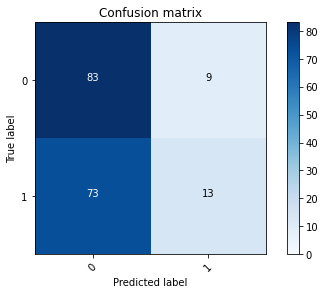

2022-08-20 20:29:36 - [Epoch Train: 7] loss: 0.6512, auc: 0.6693, acc: 0.5509, time: 50.00 s            
2022-08-20 20:29:36 - [Epoch Valid: 7] loss: 0.6915, auc: 0.5823, acc: 0.5175, time: 13.00 s


  7%|██▊                                      | 7/100 [07:29<1:39:28, 64.17s/it]

2022-08-20 20:29:36 - EPOCH: 8
2022-08-20 20:29:37 - Train Step 10/973, train_loss: 0.6531
2022-08-20 20:29:37 - Train Step 20/973, train_loss: 0.5736
2022-08-20 20:29:38 - Train Step 30/973, train_loss: 0.6085
2022-08-20 20:29:38 - Train Step 40/973, train_loss: 0.5945
2022-08-20 20:29:39 - Train Step 50/973, train_loss: 0.6302
2022-08-20 20:29:39 - Train Step 60/973, train_loss: 0.6209
2022-08-20 20:29:40 - Train Step 70/973, train_loss: 0.6351
2022-08-20 20:29:40 - Train Step 80/973, train_loss: 0.6394
2022-08-20 20:29:41 - Train Step 90/973, train_loss: 0.6417
2022-08-20 20:29:41 - Train Step 100/973, train_loss: 0.6376
2022-08-20 20:29:42 - Train Step 110/973, train_loss: 0.6407
2022-08-20 20:29:42 - Train Step 120/973, train_loss: 0.6409
2022-08-20 20:29:43 - Train Step 130/973, train_loss: 0.6344
2022-08-20 20:29:43 - Train Step 140/973, train_loss: 0.6382
2022-08-20 20:29:44 - Train Step 150/973, train_loss: 0.6400
2022-08-20 20:29:44 - Train Step 160/973, train_loss: 0.6368
20

2022-08-20 20:30:37 - Valid Step 185/257, valid_loss: 0.6996
2022-08-20 20:30:37 - Valid Step 190/257, valid_loss: 0.7040
2022-08-20 20:30:38 - Valid Step 195/257, valid_loss: 0.7042
2022-08-20 20:30:38 - Valid Step 200/257, valid_loss: 0.7021
2022-08-20 20:30:38 - Valid Step 205/257, valid_loss: 0.7019
2022-08-20 20:30:38 - Valid Step 210/257, valid_loss: 0.6997
2022-08-20 20:30:39 - Valid Step 215/257, valid_loss: 0.6983
2022-08-20 20:30:39 - Valid Step 220/257, valid_loss: 0.6986
2022-08-20 20:30:39 - Valid Step 225/257, valid_loss: 0.6955
2022-08-20 20:30:39 - Valid Step 230/257, valid_loss: 0.6958
2022-08-20 20:30:40 - Valid Step 235/257, valid_loss: 0.6954
2022-08-20 20:30:40 - Valid Step 240/257, valid_loss: 0.6928
2022-08-20 20:30:40 - Valid Step 245/257, valid_loss: 0.6921
2022-08-20 20:30:40 - Valid Step 250/257, valid_loss: 0.6879
2022-08-20 20:30:41 - Valid Step 255/257, valid_loss: 0.6884
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

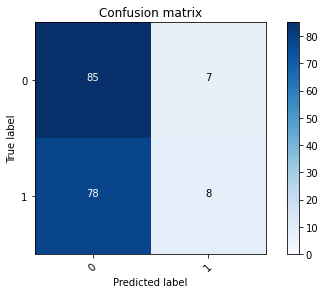

2022-08-20 20:30:41 - [Epoch Train: 8] loss: 0.6309, auc: 0.6925, acc: 0.6002, time: 51.00 s            
2022-08-20 20:30:41 - [Epoch Valid: 8] loss: 0.6883, auc: 0.5762, acc: 0.5136, time: 13.00 s


  8%|███▎                                     | 8/100 [08:34<1:38:42, 64.38s/it]

2022-08-20 20:30:41 - EPOCH: 9
2022-08-20 20:30:42 - Train Step 10/973, train_loss: 0.5767
2022-08-20 20:30:42 - Train Step 20/973, train_loss: 0.6230
2022-08-20 20:30:43 - Train Step 30/973, train_loss: 0.6218
2022-08-20 20:30:43 - Train Step 40/973, train_loss: 0.6409
2022-08-20 20:30:44 - Train Step 50/973, train_loss: 0.6502
2022-08-20 20:30:44 - Train Step 60/973, train_loss: 0.6466
2022-08-20 20:30:45 - Train Step 70/973, train_loss: 0.6482
2022-08-20 20:30:45 - Train Step 80/973, train_loss: 0.6346
2022-08-20 20:30:46 - Train Step 90/973, train_loss: 0.6247
2022-08-20 20:30:46 - Train Step 100/973, train_loss: 0.6217
2022-08-20 20:30:47 - Train Step 110/973, train_loss: 0.6236
2022-08-20 20:30:47 - Train Step 120/973, train_loss: 0.6202
2022-08-20 20:30:48 - Train Step 130/973, train_loss: 0.6236
2022-08-20 20:30:48 - Train Step 140/973, train_loss: 0.6285
2022-08-20 20:30:49 - Train Step 150/973, train_loss: 0.6283
2022-08-20 20:30:49 - Train Step 160/973, train_loss: 0.6236
20

2022-08-20 20:31:41 - Valid Step 185/257, valid_loss: 0.6875
2022-08-20 20:31:41 - Valid Step 190/257, valid_loss: 0.6931
2022-08-20 20:31:42 - Valid Step 195/257, valid_loss: 0.6858
2022-08-20 20:31:42 - Valid Step 200/257, valid_loss: 0.6869
2022-08-20 20:31:42 - Valid Step 205/257, valid_loss: 0.6927
2022-08-20 20:31:42 - Valid Step 210/257, valid_loss: 0.6929
2022-08-20 20:31:43 - Valid Step 215/257, valid_loss: 0.6892
2022-08-20 20:31:43 - Valid Step 220/257, valid_loss: 0.6870
2022-08-20 20:31:43 - Valid Step 225/257, valid_loss: 0.6887
2022-08-20 20:31:43 - Valid Step 230/257, valid_loss: 0.6912
2022-08-20 20:31:44 - Valid Step 235/257, valid_loss: 0.6896
2022-08-20 20:31:44 - Valid Step 240/257, valid_loss: 0.6891
2022-08-20 20:31:44 - Valid Step 245/257, valid_loss: 0.6922
2022-08-20 20:31:45 - Valid Step 250/257, valid_loss: 0.6973
2022-08-20 20:31:45 - Valid Step 255/257, valid_loss: 0.6981
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

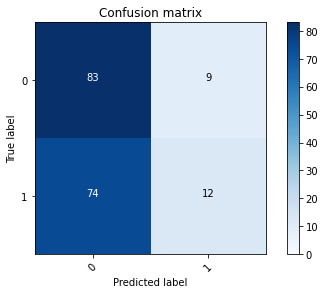

2022-08-20 20:31:45 - [Epoch Train: 9] loss: 0.6071, auc: 0.7232, acc: 0.6208, time: 50.00 s            
2022-08-20 20:31:45 - [Epoch Valid: 9] loss: 0.6960, auc: 0.5642, acc: 0.5253, time: 13.00 s


  9%|███▋                                     | 9/100 [09:38<1:37:33, 64.32s/it]

2022-08-20 20:31:45 - EPOCH: 10
2022-08-20 20:31:46 - Train Step 10/973, train_loss: 0.5898
2022-08-20 20:31:46 - Train Step 20/973, train_loss: 0.5745
2022-08-20 20:31:47 - Train Step 30/973, train_loss: 0.5310
2022-08-20 20:31:47 - Train Step 40/973, train_loss: 0.5396
2022-08-20 20:31:48 - Train Step 50/973, train_loss: 0.5548
2022-08-20 20:31:48 - Train Step 60/973, train_loss: 0.5539
2022-08-20 20:31:49 - Train Step 70/973, train_loss: 0.5872
2022-08-20 20:31:49 - Train Step 80/973, train_loss: 0.5775
2022-08-20 20:31:50 - Train Step 90/973, train_loss: 0.5805
2022-08-20 20:31:50 - Train Step 100/973, train_loss: 0.5743
2022-08-20 20:31:51 - Train Step 110/973, train_loss: 0.5708
2022-08-20 20:31:51 - Train Step 120/973, train_loss: 0.5762
2022-08-20 20:31:52 - Train Step 130/973, train_loss: 0.5726
2022-08-20 20:31:52 - Train Step 140/973, train_loss: 0.5719
2022-08-20 20:31:53 - Train Step 150/973, train_loss: 0.5837
2022-08-20 20:31:53 - Train Step 160/973, train_loss: 0.5880
2

2022-08-20 20:32:45 - Valid Step 185/257, valid_loss: 0.6964
2022-08-20 20:32:45 - Valid Step 190/257, valid_loss: 0.6971
2022-08-20 20:32:46 - Valid Step 195/257, valid_loss: 0.6989
2022-08-20 20:32:46 - Valid Step 200/257, valid_loss: 0.6997
2022-08-20 20:32:46 - Valid Step 205/257, valid_loss: 0.6953
2022-08-20 20:32:46 - Valid Step 210/257, valid_loss: 0.6989
2022-08-20 20:32:47 - Valid Step 215/257, valid_loss: 0.7012
2022-08-20 20:32:47 - Valid Step 220/257, valid_loss: 0.7059
2022-08-20 20:32:47 - Valid Step 225/257, valid_loss: 0.7086
2022-08-20 20:32:48 - Valid Step 230/257, valid_loss: 0.7090
2022-08-20 20:32:48 - Valid Step 235/257, valid_loss: 0.7077
2022-08-20 20:32:48 - Valid Step 240/257, valid_loss: 0.7055
2022-08-20 20:32:48 - Valid Step 245/257, valid_loss: 0.7107
2022-08-20 20:32:49 - Valid Step 250/257, valid_loss: 0.7093
2022-08-20 20:32:49 - Valid Step 255/257, valid_loss: 0.7099
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

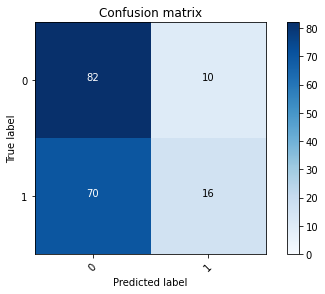

2022-08-20 20:32:49 - [Epoch Train: 10] loss: 0.5785, auc: 0.7423, acc: 0.6588, time: 50.00 s            
2022-08-20 20:32:49 - [Epoch Valid: 10] loss: 0.7098, auc: 0.5484, acc: 0.5447, time: 13.00 s
2022-08-20 20:32:49 - acc improved from 0.5292 to 0.5447. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_20-22-07/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e10-loss0.710-acc0.545-auc0.548.pth'


 10%|████                                    | 10/100 [10:42<1:36:21, 64.24s/it]

2022-08-20 20:32:49 - EPOCH: 11
2022-08-20 20:32:50 - Train Step 10/973, train_loss: 0.5341
2022-08-20 20:32:50 - Train Step 20/973, train_loss: 0.6140
2022-08-20 20:32:51 - Train Step 30/973, train_loss: 0.6924
2022-08-20 20:32:51 - Train Step 40/973, train_loss: 0.6501
2022-08-20 20:32:52 - Train Step 50/973, train_loss: 0.6050
2022-08-20 20:32:52 - Train Step 60/973, train_loss: 0.6038
2022-08-20 20:32:53 - Train Step 70/973, train_loss: 0.6141
2022-08-20 20:32:53 - Train Step 80/973, train_loss: 0.6136
2022-08-20 20:32:54 - Train Step 90/973, train_loss: 0.5911
2022-08-20 20:32:54 - Train Step 100/973, train_loss: 0.5983
2022-08-20 20:32:55 - Train Step 110/973, train_loss: 0.5858
2022-08-20 20:32:55 - Train Step 120/973, train_loss: 0.5968
2022-08-20 20:32:56 - Train Step 130/973, train_loss: 0.5882
2022-08-20 20:32:56 - Train Step 140/973, train_loss: 0.5900
2022-08-20 20:32:57 - Train Step 150/973, train_loss: 0.5878
2022-08-20 20:32:57 - Train Step 160/973, train_loss: 0.5865
2

2022-08-20 20:33:49 - Valid Step 185/257, valid_loss: 0.7041
2022-08-20 20:33:49 - Valid Step 190/257, valid_loss: 0.7021
2022-08-20 20:33:49 - Valid Step 195/257, valid_loss: 0.7065
2022-08-20 20:33:49 - Valid Step 200/257, valid_loss: 0.7132
2022-08-20 20:33:50 - Valid Step 205/257, valid_loss: 0.7118
2022-08-20 20:33:50 - Valid Step 210/257, valid_loss: 0.7219
2022-08-20 20:33:50 - Valid Step 215/257, valid_loss: 0.7254
2022-08-20 20:33:50 - Valid Step 220/257, valid_loss: 0.7293
2022-08-20 20:33:51 - Valid Step 225/257, valid_loss: 0.7243
2022-08-20 20:33:51 - Valid Step 230/257, valid_loss: 0.7272
2022-08-20 20:33:51 - Valid Step 235/257, valid_loss: 0.7261
2022-08-20 20:33:51 - Valid Step 240/257, valid_loss: 0.7260
2022-08-20 20:33:52 - Valid Step 245/257, valid_loss: 0.7274
2022-08-20 20:33:52 - Valid Step 250/257, valid_loss: 0.7293
2022-08-20 20:33:52 - Valid Step 255/257, valid_loss: 0.7284
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

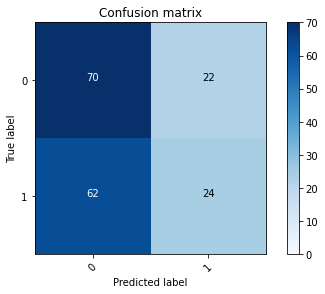

2022-08-20 20:33:53 - [Epoch Train: 11] loss: 0.5540, auc: 0.7733, acc: 0.6886, time: 49.00 s            
2022-08-20 20:33:53 - [Epoch Valid: 11] loss: 0.7269, auc: 0.5550, acc: 0.5292, time: 13.00 s


 11%|████▍                                   | 11/100 [11:45<1:34:54, 63.98s/it]

2022-08-20 20:33:53 - EPOCH: 12
2022-08-20 20:33:53 - Train Step 10/973, train_loss: 0.4256
2022-08-20 20:33:54 - Train Step 20/973, train_loss: 0.4557
2022-08-20 20:33:54 - Train Step 30/973, train_loss: 0.4905
2022-08-20 20:33:55 - Train Step 40/973, train_loss: 0.5268
2022-08-20 20:33:55 - Train Step 50/973, train_loss: 0.5293
2022-08-20 20:33:56 - Train Step 60/973, train_loss: 0.5380
2022-08-20 20:33:56 - Train Step 70/973, train_loss: 0.5344
2022-08-20 20:33:57 - Train Step 80/973, train_loss: 0.5421
2022-08-20 20:33:57 - Train Step 90/973, train_loss: 0.5312
2022-08-20 20:33:58 - Train Step 100/973, train_loss: 0.5642
2022-08-20 20:33:58 - Train Step 110/973, train_loss: 0.5768
2022-08-20 20:33:59 - Train Step 120/973, train_loss: 0.5908
2022-08-20 20:33:59 - Train Step 130/973, train_loss: 0.5924
2022-08-20 20:34:00 - Train Step 140/973, train_loss: 0.5924
2022-08-20 20:34:00 - Train Step 150/973, train_loss: 0.5920
2022-08-20 20:34:01 - Train Step 160/973, train_loss: 0.5830
2

2022-08-20 20:34:53 - Valid Step 185/257, valid_loss: 0.7129
2022-08-20 20:34:53 - Valid Step 190/257, valid_loss: 0.7132
2022-08-20 20:34:54 - Valid Step 195/257, valid_loss: 0.7146
2022-08-20 20:34:54 - Valid Step 200/257, valid_loss: 0.7093
2022-08-20 20:34:54 - Valid Step 205/257, valid_loss: 0.7080
2022-08-20 20:34:54 - Valid Step 210/257, valid_loss: 0.7068
2022-08-20 20:34:55 - Valid Step 215/257, valid_loss: 0.7172
2022-08-20 20:34:55 - Valid Step 220/257, valid_loss: 0.7160
2022-08-20 20:34:55 - Valid Step 225/257, valid_loss: 0.7177
2022-08-20 20:34:55 - Valid Step 230/257, valid_loss: 0.7202
2022-08-20 20:34:56 - Valid Step 235/257, valid_loss: 0.7205
2022-08-20 20:34:56 - Valid Step 240/257, valid_loss: 0.7282
2022-08-20 20:34:56 - Valid Step 245/257, valid_loss: 0.7245
2022-08-20 20:34:56 - Valid Step 250/257, valid_loss: 0.7265
2022-08-20 20:34:57 - Valid Step 255/257, valid_loss: 0.7260
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

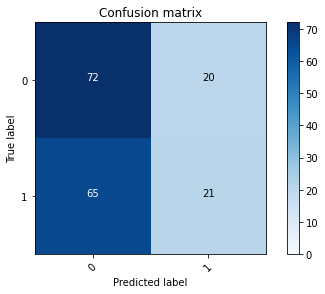

2022-08-20 20:34:57 - [Epoch Train: 12] loss: 0.5467, auc: 0.7788, acc: 0.7102, time: 50.00 s            
2022-08-20 20:34:57 - [Epoch Valid: 12] loss: 0.7249, auc: 0.5588, acc: 0.5253, time: 13.00 s


 12%|████▊                                   | 12/100 [12:50<1:34:03, 64.13s/it]

2022-08-20 20:34:57 - EPOCH: 13
2022-08-20 20:34:58 - Train Step 10/973, train_loss: 0.4391
2022-08-20 20:34:58 - Train Step 20/973, train_loss: 0.4963
2022-08-20 20:34:59 - Train Step 30/973, train_loss: 0.4583
2022-08-20 20:34:59 - Train Step 40/973, train_loss: 0.4661
2022-08-20 20:35:00 - Train Step 50/973, train_loss: 0.5237
2022-08-20 20:35:00 - Train Step 60/973, train_loss: 0.5483
2022-08-20 20:35:01 - Train Step 70/973, train_loss: 0.5537
2022-08-20 20:35:01 - Train Step 80/973, train_loss: 0.5343
2022-08-20 20:35:02 - Train Step 90/973, train_loss: 0.5305
2022-08-20 20:35:02 - Train Step 100/973, train_loss: 0.5279
2022-08-20 20:35:03 - Train Step 110/973, train_loss: 0.5223
2022-08-20 20:35:03 - Train Step 120/973, train_loss: 0.5295
2022-08-20 20:35:04 - Train Step 130/973, train_loss: 0.5360
2022-08-20 20:35:05 - Train Step 140/973, train_loss: 0.5312
2022-08-20 20:35:05 - Train Step 150/973, train_loss: 0.5290
2022-08-20 20:35:06 - Train Step 160/973, train_loss: 0.5281
2

2022-08-20 20:35:57 - Valid Step 185/257, valid_loss: 0.7172
2022-08-20 20:35:58 - Valid Step 190/257, valid_loss: 0.7100
2022-08-20 20:35:58 - Valid Step 195/257, valid_loss: 0.7075
2022-08-20 20:35:58 - Valid Step 200/257, valid_loss: 0.7142
2022-08-20 20:35:58 - Valid Step 205/257, valid_loss: 0.7149
2022-08-20 20:35:59 - Valid Step 210/257, valid_loss: 0.7174
2022-08-20 20:35:59 - Valid Step 215/257, valid_loss: 0.7176
2022-08-20 20:35:59 - Valid Step 220/257, valid_loss: 0.7186
2022-08-20 20:35:59 - Valid Step 225/257, valid_loss: 0.7210
2022-08-20 20:36:00 - Valid Step 230/257, valid_loss: 0.7208
2022-08-20 20:36:00 - Valid Step 235/257, valid_loss: 0.7197
2022-08-20 20:36:00 - Valid Step 240/257, valid_loss: 0.7269
2022-08-20 20:36:00 - Valid Step 245/257, valid_loss: 0.7234
2022-08-20 20:36:01 - Valid Step 250/257, valid_loss: 0.7291
2022-08-20 20:36:01 - Valid Step 255/257, valid_loss: 0.7307
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

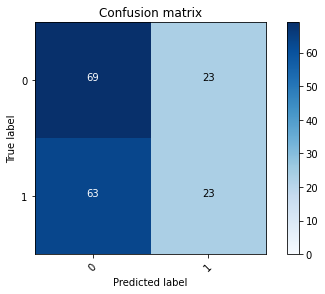

2022-08-20 20:36:01 - [Epoch Train: 13] loss: 0.5369, auc: 0.7883, acc: 0.7225, time: 50.00 s            
2022-08-20 20:36:01 - [Epoch Valid: 13] loss: 0.7316, auc: 0.5578, acc: 0.5136, time: 13.00 s


 13%|█████▏                                  | 13/100 [13:54<1:33:00, 64.14s/it]

2022-08-20 20:36:01 - EPOCH: 14
2022-08-20 20:36:02 - Train Step 10/973, train_loss: 0.3980
2022-08-20 20:36:02 - Train Step 20/973, train_loss: 0.4098
2022-08-20 20:36:03 - Train Step 30/973, train_loss: 0.5073
2022-08-20 20:36:03 - Train Step 40/973, train_loss: 0.5047
2022-08-20 20:36:04 - Train Step 50/973, train_loss: 0.4797
2022-08-20 20:36:04 - Train Step 60/973, train_loss: 0.4853
2022-08-20 20:36:05 - Train Step 70/973, train_loss: 0.5003
2022-08-20 20:36:05 - Train Step 80/973, train_loss: 0.5080
2022-08-20 20:36:06 - Train Step 90/973, train_loss: 0.5123
2022-08-20 20:36:06 - Train Step 100/973, train_loss: 0.5175
2022-08-20 20:36:07 - Train Step 110/973, train_loss: 0.5153
2022-08-20 20:36:07 - Train Step 120/973, train_loss: 0.5286
2022-08-20 20:36:08 - Train Step 130/973, train_loss: 0.5429
2022-08-20 20:36:08 - Train Step 140/973, train_loss: 0.5425
2022-08-20 20:36:09 - Train Step 150/973, train_loss: 0.5525
2022-08-20 20:36:09 - Train Step 160/973, train_loss: 0.5566
2

2022-08-20 20:37:01 - Valid Step 185/257, valid_loss: 0.7129
2022-08-20 20:37:01 - Valid Step 190/257, valid_loss: 0.7204
2022-08-20 20:37:01 - Valid Step 195/257, valid_loss: 0.7330
2022-08-20 20:37:02 - Valid Step 200/257, valid_loss: 0.7293
2022-08-20 20:37:02 - Valid Step 205/257, valid_loss: 0.7315
2022-08-20 20:37:02 - Valid Step 210/257, valid_loss: 0.7325
2022-08-20 20:37:02 - Valid Step 215/257, valid_loss: 0.7273
2022-08-20 20:37:03 - Valid Step 220/257, valid_loss: 0.7330
2022-08-20 20:37:03 - Valid Step 225/257, valid_loss: 0.7295
2022-08-20 20:37:03 - Valid Step 230/257, valid_loss: 0.7294
2022-08-20 20:37:03 - Valid Step 235/257, valid_loss: 0.7241
2022-08-20 20:37:04 - Valid Step 240/257, valid_loss: 0.7200
2022-08-20 20:37:04 - Valid Step 245/257, valid_loss: 0.7179
2022-08-20 20:37:04 - Valid Step 250/257, valid_loss: 0.7258
2022-08-20 20:37:04 - Valid Step 255/257, valid_loss: 0.7286
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

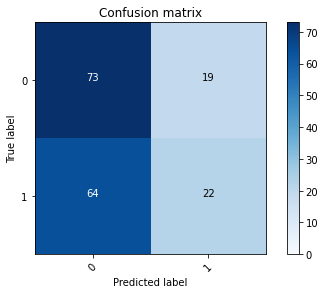

2022-08-20 20:37:05 - [Epoch Train: 14] loss: 0.5228, auc: 0.7954, acc: 0.7287, time: 49.00 s            
2022-08-20 20:37:05 - [Epoch Valid: 14] loss: 0.7294, auc: 0.5579, acc: 0.5409, time: 13.00 s


 14%|█████▌                                  | 14/100 [14:58<1:31:41, 63.97s/it]

2022-08-20 20:37:05 - EPOCH: 15
2022-08-20 20:37:05 - Train Step 10/973, train_loss: 0.5104
2022-08-20 20:37:06 - Train Step 20/973, train_loss: 0.4861
2022-08-20 20:37:06 - Train Step 30/973, train_loss: 0.5233
2022-08-20 20:37:07 - Train Step 40/973, train_loss: 0.4983
2022-08-20 20:37:07 - Train Step 50/973, train_loss: 0.5002
2022-08-20 20:37:08 - Train Step 60/973, train_loss: 0.4932
2022-08-20 20:37:09 - Train Step 70/973, train_loss: 0.5110
2022-08-20 20:37:09 - Train Step 80/973, train_loss: 0.5025
2022-08-20 20:37:10 - Train Step 90/973, train_loss: 0.4981
2022-08-20 20:37:10 - Train Step 100/973, train_loss: 0.4897
2022-08-20 20:37:11 - Train Step 110/973, train_loss: 0.4898
2022-08-20 20:37:11 - Train Step 120/973, train_loss: 0.4907
2022-08-20 20:37:12 - Train Step 130/973, train_loss: 0.4959
2022-08-20 20:37:12 - Train Step 140/973, train_loss: 0.4945
2022-08-20 20:37:13 - Train Step 150/973, train_loss: 0.4910
2022-08-20 20:37:13 - Train Step 160/973, train_loss: 0.5005
2

2022-08-20 20:38:05 - Valid Step 185/257, valid_loss: 0.7646
2022-08-20 20:38:05 - Valid Step 190/257, valid_loss: 0.7629
2022-08-20 20:38:05 - Valid Step 195/257, valid_loss: 0.7552
2022-08-20 20:38:06 - Valid Step 200/257, valid_loss: 0.7616
2022-08-20 20:38:06 - Valid Step 205/257, valid_loss: 0.7589
2022-08-20 20:38:06 - Valid Step 210/257, valid_loss: 0.7598
2022-08-20 20:38:06 - Valid Step 215/257, valid_loss: 0.7559
2022-08-20 20:38:07 - Valid Step 220/257, valid_loss: 0.7549
2022-08-20 20:38:07 - Valid Step 225/257, valid_loss: 0.7496
2022-08-20 20:38:07 - Valid Step 230/257, valid_loss: 0.7561
2022-08-20 20:38:07 - Valid Step 235/257, valid_loss: 0.7648
2022-08-20 20:38:08 - Valid Step 240/257, valid_loss: 0.7668
2022-08-20 20:38:08 - Valid Step 245/257, valid_loss: 0.7645
2022-08-20 20:38:08 - Valid Step 250/257, valid_loss: 0.7664
2022-08-20 20:38:08 - Valid Step 255/257, valid_loss: 0.7635
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

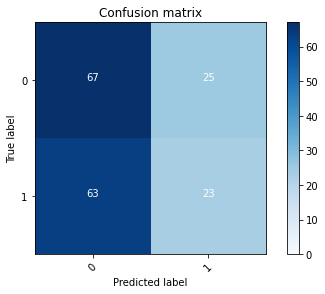

2022-08-20 20:38:09 - [Epoch Train: 15] loss: 0.4947, auc: 0.8256, acc: 0.7533, time: 50.00 s            
2022-08-20 20:38:09 - [Epoch Valid: 15] loss: 0.7596, auc: 0.5506, acc: 0.5019, time: 13.00 s


 15%|██████                                  | 15/100 [16:02<1:30:38, 63.98s/it]

2022-08-20 20:38:09 - EPOCH: 16
2022-08-20 20:38:09 - Train Step 10/973, train_loss: 0.5295
2022-08-20 20:38:10 - Train Step 20/973, train_loss: 0.5237
2022-08-20 20:38:10 - Train Step 30/973, train_loss: 0.5491
2022-08-20 20:38:11 - Train Step 40/973, train_loss: 0.5275
2022-08-20 20:38:11 - Train Step 50/973, train_loss: 0.5077
2022-08-20 20:38:12 - Train Step 60/973, train_loss: 0.4917
2022-08-20 20:38:12 - Train Step 70/973, train_loss: 0.5026
2022-08-20 20:38:13 - Train Step 80/973, train_loss: 0.4851
2022-08-20 20:38:14 - Train Step 90/973, train_loss: 0.5050
2022-08-20 20:38:14 - Train Step 100/973, train_loss: 0.5111
2022-08-20 20:38:15 - Train Step 110/973, train_loss: 0.5081
2022-08-20 20:38:15 - Train Step 120/973, train_loss: 0.5153
2022-08-20 20:38:16 - Train Step 130/973, train_loss: 0.5118
2022-08-20 20:38:16 - Train Step 140/973, train_loss: 0.5080
2022-08-20 20:38:17 - Train Step 150/973, train_loss: 0.5087
2022-08-20 20:38:17 - Train Step 160/973, train_loss: 0.5056
2

2022-08-20 20:39:09 - Valid Step 185/257, valid_loss: 0.7269
2022-08-20 20:39:09 - Valid Step 190/257, valid_loss: 0.7219
2022-08-20 20:39:10 - Valid Step 195/257, valid_loss: 0.7193
2022-08-20 20:39:10 - Valid Step 200/257, valid_loss: 0.7217
2022-08-20 20:39:10 - Valid Step 205/257, valid_loss: 0.7214
2022-08-20 20:39:10 - Valid Step 210/257, valid_loss: 0.7173
2022-08-20 20:39:11 - Valid Step 215/257, valid_loss: 0.7176
2022-08-20 20:39:11 - Valid Step 220/257, valid_loss: 0.7137
2022-08-20 20:39:11 - Valid Step 225/257, valid_loss: 0.7137
2022-08-20 20:39:11 - Valid Step 230/257, valid_loss: 0.7267
2022-08-20 20:39:12 - Valid Step 235/257, valid_loss: 0.7299
2022-08-20 20:39:12 - Valid Step 240/257, valid_loss: 0.7272
2022-08-20 20:39:12 - Valid Step 245/257, valid_loss: 0.7350
2022-08-20 20:39:12 - Valid Step 250/257, valid_loss: 0.7416
2022-08-20 20:39:13 - Valid Step 255/257, valid_loss: 0.7423
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

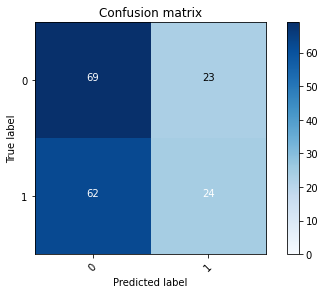

2022-08-20 20:39:13 - [Epoch Train: 16] loss: 0.4936, auc: 0.8161, acc: 0.7523, time: 50.00 s            
2022-08-20 20:39:13 - [Epoch Valid: 16] loss: 0.7445, auc: 0.5495, acc: 0.5292, time: 13.00 s


 16%|██████▍                                 | 16/100 [17:06<1:29:40, 64.06s/it]

2022-08-20 20:39:13 - EPOCH: 17
2022-08-20 20:39:14 - Train Step 10/973, train_loss: 0.3609
2022-08-20 20:39:14 - Train Step 20/973, train_loss: 0.4410
2022-08-20 20:39:15 - Train Step 30/973, train_loss: 0.4158
2022-08-20 20:39:15 - Train Step 40/973, train_loss: 0.4232
2022-08-20 20:39:16 - Train Step 50/973, train_loss: 0.4355
2022-08-20 20:39:16 - Train Step 60/973, train_loss: 0.4749
2022-08-20 20:39:17 - Train Step 70/973, train_loss: 0.4837
2022-08-20 20:39:17 - Train Step 80/973, train_loss: 0.4744
2022-08-20 20:39:18 - Train Step 90/973, train_loss: 0.4858
2022-08-20 20:39:18 - Train Step 100/973, train_loss: 0.4709
2022-08-20 20:39:19 - Train Step 110/973, train_loss: 0.4614
2022-08-20 20:39:19 - Train Step 120/973, train_loss: 0.4751
2022-08-20 20:39:20 - Train Step 130/973, train_loss: 0.4773
2022-08-20 20:39:20 - Train Step 140/973, train_loss: 0.4655
2022-08-20 20:39:21 - Train Step 150/973, train_loss: 0.4595
2022-08-20 20:39:21 - Train Step 160/973, train_loss: 0.4538
2

2022-08-20 20:40:13 - Valid Step 185/257, valid_loss: 0.8026
2022-08-20 20:40:13 - Valid Step 190/257, valid_loss: 0.7972
2022-08-20 20:40:13 - Valid Step 195/257, valid_loss: 0.8035
2022-08-20 20:40:14 - Valid Step 200/257, valid_loss: 0.8090
2022-08-20 20:40:14 - Valid Step 205/257, valid_loss: 0.8013
2022-08-20 20:40:14 - Valid Step 210/257, valid_loss: 0.7926
2022-08-20 20:40:14 - Valid Step 215/257, valid_loss: 0.7902
2022-08-20 20:40:15 - Valid Step 220/257, valid_loss: 0.7888
2022-08-20 20:40:15 - Valid Step 225/257, valid_loss: 0.7917
2022-08-20 20:40:15 - Valid Step 230/257, valid_loss: 0.8022
2022-08-20 20:40:15 - Valid Step 235/257, valid_loss: 0.7988
2022-08-20 20:40:16 - Valid Step 240/257, valid_loss: 0.7910
2022-08-20 20:40:16 - Valid Step 245/257, valid_loss: 0.7878
2022-08-20 20:40:16 - Valid Step 250/257, valid_loss: 0.7853
2022-08-20 20:40:16 - Valid Step 255/257, valid_loss: 0.7865
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

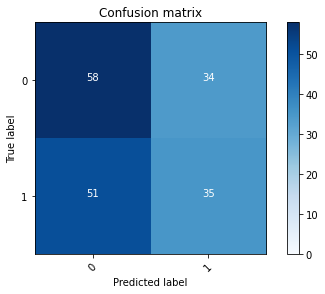

2022-08-20 20:40:17 - [Epoch Train: 17] loss: 0.4694, auc: 0.8422, acc: 0.7718, time: 50.00 s            
2022-08-20 20:40:17 - [Epoch Valid: 17] loss: 0.7864, auc: 0.5526, acc: 0.5136, time: 13.00 s


 17%|██████▊                                 | 17/100 [18:10<1:28:29, 63.97s/it]

2022-08-20 20:40:17 - EPOCH: 18
2022-08-20 20:40:17 - Train Step 10/973, train_loss: 0.6232
2022-08-20 20:40:18 - Train Step 20/973, train_loss: 0.6719
2022-08-20 20:40:18 - Train Step 30/973, train_loss: 0.6438
2022-08-20 20:40:19 - Train Step 40/973, train_loss: 0.5751
2022-08-20 20:40:19 - Train Step 50/973, train_loss: 0.5739
2022-08-20 20:40:20 - Train Step 60/973, train_loss: 0.5281
2022-08-20 20:40:21 - Train Step 70/973, train_loss: 0.5026
2022-08-20 20:40:21 - Train Step 80/973, train_loss: 0.4788
2022-08-20 20:40:22 - Train Step 90/973, train_loss: 0.4743
2022-08-20 20:40:22 - Train Step 100/973, train_loss: 0.4727
2022-08-20 20:40:23 - Train Step 110/973, train_loss: 0.4679
2022-08-20 20:40:23 - Train Step 120/973, train_loss: 0.4596
2022-08-20 20:40:24 - Train Step 130/973, train_loss: 0.4577
2022-08-20 20:40:24 - Train Step 140/973, train_loss: 0.4736
2022-08-20 20:40:25 - Train Step 150/973, train_loss: 0.4699
2022-08-20 20:40:25 - Train Step 160/973, train_loss: 0.4667
2

2022-08-20 20:41:18 - Valid Step 185/257, valid_loss: 0.8155
2022-08-20 20:41:18 - Valid Step 190/257, valid_loss: 0.8178
2022-08-20 20:41:18 - Valid Step 195/257, valid_loss: 0.8243
2022-08-20 20:41:18 - Valid Step 200/257, valid_loss: 0.8138
2022-08-20 20:41:19 - Valid Step 205/257, valid_loss: 0.8145
2022-08-20 20:41:19 - Valid Step 210/257, valid_loss: 0.8107
2022-08-20 20:41:19 - Valid Step 215/257, valid_loss: 0.8116
2022-08-20 20:41:19 - Valid Step 220/257, valid_loss: 0.8124
2022-08-20 20:41:20 - Valid Step 225/257, valid_loss: 0.8106
2022-08-20 20:41:20 - Valid Step 230/257, valid_loss: 0.8056
2022-08-20 20:41:20 - Valid Step 235/257, valid_loss: 0.8153
2022-08-20 20:41:20 - Valid Step 240/257, valid_loss: 0.8048
2022-08-20 20:41:21 - Valid Step 245/257, valid_loss: 0.8108
2022-08-20 20:41:21 - Valid Step 250/257, valid_loss: 0.8072
2022-08-20 20:41:21 - Valid Step 255/257, valid_loss: 0.8010
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

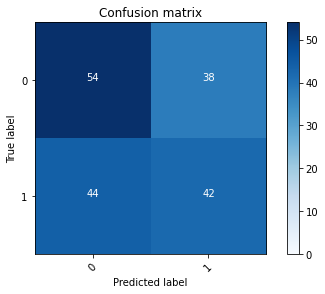

2022-08-20 20:41:21 - [Epoch Train: 18] loss: 0.4677, auc: 0.8381, acc: 0.7862, time: 51.00 s            
2022-08-20 20:41:21 - [Epoch Valid: 18] loss: 0.8051, auc: 0.5432, acc: 0.5292, time: 13.00 s


 18%|███████▏                                | 18/100 [19:14<1:27:45, 64.21s/it]

2022-08-20 20:41:21 - EPOCH: 19
2022-08-20 20:41:22 - Train Step 10/973, train_loss: 0.3575
2022-08-20 20:41:23 - Train Step 20/973, train_loss: 0.5006
2022-08-20 20:41:23 - Train Step 30/973, train_loss: 0.4549
2022-08-20 20:41:24 - Train Step 40/973, train_loss: 0.4560
2022-08-20 20:41:24 - Train Step 50/973, train_loss: 0.4582
2022-08-20 20:41:25 - Train Step 60/973, train_loss: 0.4511
2022-08-20 20:41:25 - Train Step 70/973, train_loss: 0.4719
2022-08-20 20:41:26 - Train Step 80/973, train_loss: 0.4738
2022-08-20 20:41:26 - Train Step 90/973, train_loss: 0.4639
2022-08-20 20:41:27 - Train Step 100/973, train_loss: 0.4587
2022-08-20 20:41:27 - Train Step 110/973, train_loss: 0.4543
2022-08-20 20:41:28 - Train Step 120/973, train_loss: 0.4729
2022-08-20 20:41:28 - Train Step 130/973, train_loss: 0.4863
2022-08-20 20:41:29 - Train Step 140/973, train_loss: 0.4873
2022-08-20 20:41:29 - Train Step 150/973, train_loss: 0.4890
2022-08-20 20:41:30 - Train Step 160/973, train_loss: 0.4808
2

2022-08-20 20:42:22 - Valid Step 185/257, valid_loss: 0.7779
2022-08-20 20:42:22 - Valid Step 190/257, valid_loss: 0.7759
2022-08-20 20:42:22 - Valid Step 195/257, valid_loss: 0.7745
2022-08-20 20:42:22 - Valid Step 200/257, valid_loss: 0.7871
2022-08-20 20:42:23 - Valid Step 205/257, valid_loss: 0.7832
2022-08-20 20:42:23 - Valid Step 210/257, valid_loss: 0.7854
2022-08-20 20:42:23 - Valid Step 215/257, valid_loss: 0.7894
2022-08-20 20:42:23 - Valid Step 220/257, valid_loss: 0.7935
2022-08-20 20:42:24 - Valid Step 225/257, valid_loss: 0.7986
2022-08-20 20:42:24 - Valid Step 230/257, valid_loss: 0.7919
2022-08-20 20:42:24 - Valid Step 235/257, valid_loss: 0.7918
2022-08-20 20:42:24 - Valid Step 240/257, valid_loss: 0.7868
2022-08-20 20:42:25 - Valid Step 245/257, valid_loss: 0.7915
2022-08-20 20:42:25 - Valid Step 250/257, valid_loss: 0.7871
2022-08-20 20:42:25 - Valid Step 255/257, valid_loss: 0.7829
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

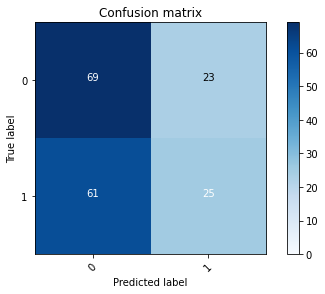

2022-08-20 20:42:25 - [Epoch Train: 19] loss: 0.4474, auc: 0.8542, acc: 0.7945, time: 50.00 s            
2022-08-20 20:42:25 - [Epoch Valid: 19] loss: 0.7791, auc: 0.5431, acc: 0.5292, time: 13.00 s


 19%|███████▌                                | 19/100 [20:18<1:26:32, 64.10s/it]

2022-08-20 20:42:25 - EPOCH: 20
2022-08-20 20:42:26 - Train Step 10/973, train_loss: 0.4021
2022-08-20 20:42:27 - Train Step 20/973, train_loss: 0.4477
2022-08-20 20:42:27 - Train Step 30/973, train_loss: 0.4667
2022-08-20 20:42:28 - Train Step 40/973, train_loss: 0.4750
2022-08-20 20:42:28 - Train Step 50/973, train_loss: 0.4605
2022-08-20 20:42:29 - Train Step 60/973, train_loss: 0.4657
2022-08-20 20:42:29 - Train Step 70/973, train_loss: 0.4831
2022-08-20 20:42:30 - Train Step 80/973, train_loss: 0.4722
2022-08-20 20:42:30 - Train Step 90/973, train_loss: 0.4789
2022-08-20 20:42:31 - Train Step 100/973, train_loss: 0.4813
2022-08-20 20:42:31 - Train Step 110/973, train_loss: 0.4641
2022-08-20 20:42:32 - Train Step 120/973, train_loss: 0.4727
2022-08-20 20:42:32 - Train Step 130/973, train_loss: 0.4760
2022-08-20 20:42:33 - Train Step 140/973, train_loss: 0.4757
2022-08-20 20:42:33 - Train Step 150/973, train_loss: 0.4666
2022-08-20 20:42:34 - Train Step 160/973, train_loss: 0.4546
2

2022-08-20 20:43:25 - Valid Step 185/257, valid_loss: 0.8555
2022-08-20 20:43:25 - Valid Step 190/257, valid_loss: 0.8555
2022-08-20 20:43:26 - Valid Step 195/257, valid_loss: 0.8506
2022-08-20 20:43:26 - Valid Step 200/257, valid_loss: 0.8640
2022-08-20 20:43:26 - Valid Step 205/257, valid_loss: 0.8566
2022-08-20 20:43:26 - Valid Step 210/257, valid_loss: 0.8501
2022-08-20 20:43:27 - Valid Step 215/257, valid_loss: 0.8381
2022-08-20 20:43:27 - Valid Step 220/257, valid_loss: 0.8456
2022-08-20 20:43:27 - Valid Step 225/257, valid_loss: 0.8461
2022-08-20 20:43:27 - Valid Step 230/257, valid_loss: 0.8543
2022-08-20 20:43:28 - Valid Step 235/257, valid_loss: 0.8609
2022-08-20 20:43:28 - Valid Step 240/257, valid_loss: 0.8584
2022-08-20 20:43:28 - Valid Step 245/257, valid_loss: 0.8583
2022-08-20 20:43:29 - Valid Step 250/257, valid_loss: 0.8527
2022-08-20 20:43:29 - Valid Step 255/257, valid_loss: 0.8541
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

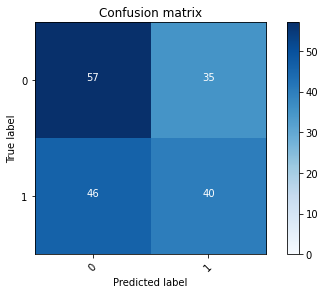

2022-08-20 20:43:29 - [Epoch Train: 20] loss: 0.4360, auc: 0.8608, acc: 0.7986, time: 50.00 s            
2022-08-20 20:43:29 - [Epoch Valid: 20] loss: 0.8524, auc: 0.5397, acc: 0.5370, time: 13.00 s


 20%|████████                                | 20/100 [21:22<1:25:17, 63.97s/it]

2022-08-20 20:43:29 - EPOCH: 21
2022-08-20 20:43:30 - Train Step 10/973, train_loss: 0.3925
2022-08-20 20:43:30 - Train Step 20/973, train_loss: 0.3685
2022-08-20 20:43:31 - Train Step 30/973, train_loss: 0.3715
2022-08-20 20:43:31 - Train Step 40/973, train_loss: 0.3577
2022-08-20 20:43:32 - Train Step 50/973, train_loss: 0.3427
2022-08-20 20:43:32 - Train Step 60/973, train_loss: 0.3649
2022-08-20 20:43:33 - Train Step 70/973, train_loss: 0.3800
2022-08-20 20:43:33 - Train Step 80/973, train_loss: 0.3893
2022-08-20 20:43:34 - Train Step 90/973, train_loss: 0.3870
2022-08-20 20:43:34 - Train Step 100/973, train_loss: 0.3943
2022-08-20 20:43:35 - Train Step 110/973, train_loss: 0.3947
2022-08-20 20:43:36 - Train Step 120/973, train_loss: 0.3795
2022-08-20 20:43:36 - Train Step 130/973, train_loss: 0.3744
2022-08-20 20:43:37 - Train Step 140/973, train_loss: 0.3882
2022-08-20 20:43:37 - Train Step 150/973, train_loss: 0.4036
2022-08-20 20:43:38 - Train Step 160/973, train_loss: 0.3994
2

2022-08-20 20:44:30 - Valid Step 185/257, valid_loss: 0.7966
2022-08-20 20:44:31 - Valid Step 190/257, valid_loss: 0.8169
2022-08-20 20:44:31 - Valid Step 195/257, valid_loss: 0.8086
2022-08-20 20:44:31 - Valid Step 200/257, valid_loss: 0.8031
2022-08-20 20:44:31 - Valid Step 205/257, valid_loss: 0.7968
2022-08-20 20:44:32 - Valid Step 210/257, valid_loss: 0.7995
2022-08-20 20:44:32 - Valid Step 215/257, valid_loss: 0.8062
2022-08-20 20:44:32 - Valid Step 220/257, valid_loss: 0.8033
2022-08-20 20:44:32 - Valid Step 225/257, valid_loss: 0.8005
2022-08-20 20:44:33 - Valid Step 230/257, valid_loss: 0.7994
2022-08-20 20:44:33 - Valid Step 235/257, valid_loss: 0.8022
2022-08-20 20:44:33 - Valid Step 240/257, valid_loss: 0.8084
2022-08-20 20:44:33 - Valid Step 245/257, valid_loss: 0.8115
2022-08-20 20:44:34 - Valid Step 250/257, valid_loss: 0.8153
2022-08-20 20:44:34 - Valid Step 255/257, valid_loss: 0.8122
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

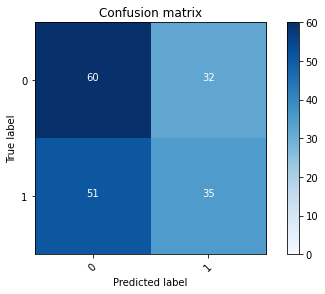

2022-08-20 20:44:34 - [Epoch Train: 21] loss: 0.4200, auc: 0.8656, acc: 0.8119, time: 51.00 s            
2022-08-20 20:44:34 - [Epoch Valid: 21] loss: 0.8132, auc: 0.5408, acc: 0.5292, time: 13.00 s


 21%|████████▍                               | 21/100 [22:27<1:24:42, 64.34s/it]

2022-08-20 20:44:34 - EPOCH: 22
2022-08-20 20:44:35 - Train Step 10/973, train_loss: 0.7634
2022-08-20 20:44:35 - Train Step 20/973, train_loss: 0.6313
2022-08-20 20:44:36 - Train Step 30/973, train_loss: 0.5349
2022-08-20 20:44:36 - Train Step 40/973, train_loss: 0.5976
2022-08-20 20:44:37 - Train Step 50/973, train_loss: 0.5683
2022-08-20 20:44:37 - Train Step 60/973, train_loss: 0.5181
2022-08-20 20:44:38 - Train Step 70/973, train_loss: 0.4952
2022-08-20 20:44:38 - Train Step 80/973, train_loss: 0.4951
2022-08-20 20:44:39 - Train Step 90/973, train_loss: 0.4862
2022-08-20 20:44:40 - Train Step 100/973, train_loss: 0.4715
2022-08-20 20:44:40 - Train Step 110/973, train_loss: 0.4538
2022-08-20 20:44:41 - Train Step 120/973, train_loss: 0.4463
2022-08-20 20:44:41 - Train Step 130/973, train_loss: 0.4347
2022-08-20 20:44:42 - Train Step 140/973, train_loss: 0.4377
2022-08-20 20:44:42 - Train Step 150/973, train_loss: 0.4361
2022-08-20 20:44:43 - Train Step 160/973, train_loss: 0.4425
2

2022-08-20 20:45:35 - Valid Step 185/257, valid_loss: 0.8342
2022-08-20 20:45:35 - Valid Step 190/257, valid_loss: 0.8443
2022-08-20 20:45:35 - Valid Step 195/257, valid_loss: 0.8384
2022-08-20 20:45:35 - Valid Step 200/257, valid_loss: 0.8578
2022-08-20 20:45:36 - Valid Step 205/257, valid_loss: 0.8616
2022-08-20 20:45:36 - Valid Step 210/257, valid_loss: 0.8623
2022-08-20 20:45:36 - Valid Step 215/257, valid_loss: 0.8499
2022-08-20 20:45:36 - Valid Step 220/257, valid_loss: 0.8488
2022-08-20 20:45:37 - Valid Step 225/257, valid_loss: 0.8483
2022-08-20 20:45:37 - Valid Step 230/257, valid_loss: 0.8562
2022-08-20 20:45:37 - Valid Step 235/257, valid_loss: 0.8650
2022-08-20 20:45:37 - Valid Step 240/257, valid_loss: 0.8658
2022-08-20 20:45:37 - Valid Step 245/257, valid_loss: 0.8600
2022-08-20 20:45:38 - Valid Step 250/257, valid_loss: 0.8642
2022-08-20 20:45:38 - Valid Step 255/257, valid_loss: 0.8565
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

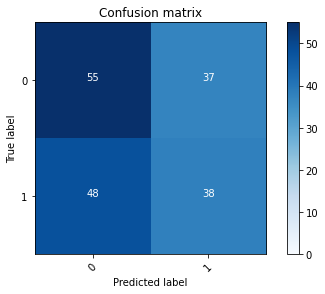

2022-08-20 20:45:38 - [Epoch Train: 22] loss: 0.4071, auc: 0.8760, acc: 0.8191, time: 50.00 s            
2022-08-20 20:45:38 - [Epoch Valid: 22] loss: 0.8505, auc: 0.5359, acc: 0.5136, time: 13.00 s


 22%|████████▊                               | 22/100 [23:31<1:23:36, 64.31s/it]

2022-08-20 20:45:38 - EPOCH: 23
2022-08-20 20:45:39 - Train Step 10/973, train_loss: 0.3450
2022-08-20 20:45:40 - Train Step 20/973, train_loss: 0.3810
2022-08-20 20:45:40 - Train Step 30/973, train_loss: 0.3667
2022-08-20 20:45:41 - Train Step 40/973, train_loss: 0.3725
2022-08-20 20:45:41 - Train Step 50/973, train_loss: 0.3309
2022-08-20 20:45:42 - Train Step 60/973, train_loss: 0.3377
2022-08-20 20:45:42 - Train Step 70/973, train_loss: 0.3440
2022-08-20 20:45:43 - Train Step 80/973, train_loss: 0.3632
2022-08-20 20:45:43 - Train Step 90/973, train_loss: 0.3726
2022-08-20 20:45:44 - Train Step 100/973, train_loss: 0.3858
2022-08-20 20:45:44 - Train Step 110/973, train_loss: 0.3879
2022-08-20 20:45:45 - Train Step 120/973, train_loss: 0.3964
2022-08-20 20:45:45 - Train Step 130/973, train_loss: 0.4112
2022-08-20 20:45:46 - Train Step 140/973, train_loss: 0.3964
2022-08-20 20:45:46 - Train Step 150/973, train_loss: 0.3919
2022-08-20 20:45:47 - Train Step 160/973, train_loss: 0.3920
2

2022-08-20 20:46:39 - Valid Step 185/257, valid_loss: 0.9262
2022-08-20 20:46:39 - Valid Step 190/257, valid_loss: 0.9259
2022-08-20 20:46:40 - Valid Step 195/257, valid_loss: 0.9253
2022-08-20 20:46:40 - Valid Step 200/257, valid_loss: 0.9214
2022-08-20 20:46:40 - Valid Step 205/257, valid_loss: 0.9182
2022-08-20 20:46:40 - Valid Step 210/257, valid_loss: 0.9101
2022-08-20 20:46:41 - Valid Step 215/257, valid_loss: 0.9155
2022-08-20 20:46:41 - Valid Step 220/257, valid_loss: 0.9345
2022-08-20 20:46:41 - Valid Step 225/257, valid_loss: 0.9275
2022-08-20 20:46:41 - Valid Step 230/257, valid_loss: 0.9223
2022-08-20 20:46:42 - Valid Step 235/257, valid_loss: 0.9305
2022-08-20 20:46:42 - Valid Step 240/257, valid_loss: 0.9376
2022-08-20 20:46:42 - Valid Step 245/257, valid_loss: 0.9411
2022-08-20 20:46:42 - Valid Step 250/257, valid_loss: 0.9464
2022-08-20 20:46:43 - Valid Step 255/257, valid_loss: 0.9485
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

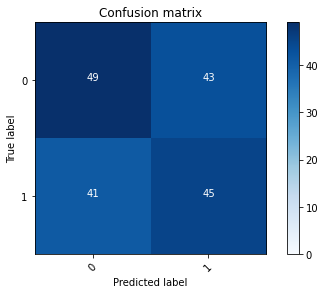

2022-08-20 20:46:43 - [Epoch Train: 23] loss: 0.3805, auc: 0.8983, acc: 0.8386, time: 51.00 s            
2022-08-20 20:46:43 - [Epoch Valid: 23] loss: 0.9473, auc: 0.5380, acc: 0.5175, time: 13.00 s


 23%|█████████▏                              | 23/100 [24:36<1:22:37, 64.38s/it]

2022-08-20 20:46:43 - EPOCH: 24
2022-08-20 20:46:44 - Train Step 10/973, train_loss: 0.5000
2022-08-20 20:46:44 - Train Step 20/973, train_loss: 0.4148
2022-08-20 20:46:45 - Train Step 30/973, train_loss: 0.3315
2022-08-20 20:46:45 - Train Step 40/973, train_loss: 0.2958
2022-08-20 20:46:46 - Train Step 50/973, train_loss: 0.3110
2022-08-20 20:46:46 - Train Step 60/973, train_loss: 0.3773
2022-08-20 20:46:47 - Train Step 70/973, train_loss: 0.3722
2022-08-20 20:46:47 - Train Step 80/973, train_loss: 0.3753
2022-08-20 20:46:48 - Train Step 90/973, train_loss: 0.3786
2022-08-20 20:46:48 - Train Step 100/973, train_loss: 0.3894
2022-08-20 20:46:49 - Train Step 110/973, train_loss: 0.3686
2022-08-20 20:46:49 - Train Step 120/973, train_loss: 0.3695
2022-08-20 20:46:50 - Train Step 130/973, train_loss: 0.3813
2022-08-20 20:46:51 - Train Step 140/973, train_loss: 0.3775
2022-08-20 20:46:51 - Train Step 150/973, train_loss: 0.3764
2022-08-20 20:46:52 - Train Step 160/973, train_loss: 0.3793
2

2022-08-20 20:47:43 - Valid Step 185/257, valid_loss: 0.8701
2022-08-20 20:47:43 - Valid Step 190/257, valid_loss: 0.8620
2022-08-20 20:47:43 - Valid Step 195/257, valid_loss: 0.8619
2022-08-20 20:47:44 - Valid Step 200/257, valid_loss: 0.8550
2022-08-20 20:47:44 - Valid Step 205/257, valid_loss: 0.8516
2022-08-20 20:47:44 - Valid Step 210/257, valid_loss: 0.8670
2022-08-20 20:47:45 - Valid Step 215/257, valid_loss: 0.8587
2022-08-20 20:47:45 - Valid Step 220/257, valid_loss: 0.8681
2022-08-20 20:47:45 - Valid Step 225/257, valid_loss: 0.8645
2022-08-20 20:47:45 - Valid Step 230/257, valid_loss: 0.8593
2022-08-20 20:47:46 - Valid Step 235/257, valid_loss: 0.8556
2022-08-20 20:47:46 - Valid Step 240/257, valid_loss: 0.8604
2022-08-20 20:47:46 - Valid Step 245/257, valid_loss: 0.8694
2022-08-20 20:47:46 - Valid Step 250/257, valid_loss: 0.8808
2022-08-20 20:47:47 - Valid Step 255/257, valid_loss: 0.8839
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

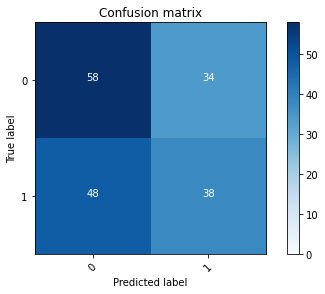

2022-08-20 20:47:47 - [Epoch Train: 24] loss: 0.3828, auc: 0.8916, acc: 0.8397, time: 50.00 s            
2022-08-20 20:47:47 - [Epoch Valid: 24] loss: 0.8907, auc: 0.5404, acc: 0.5253, time: 13.00 s


 24%|█████████▌                              | 24/100 [25:40<1:21:22, 64.24s/it]

2022-08-20 20:47:47 - EPOCH: 25
2022-08-20 20:47:48 - Train Step 10/973, train_loss: 0.3738
2022-08-20 20:47:48 - Train Step 20/973, train_loss: 0.4443
2022-08-20 20:47:49 - Train Step 30/973, train_loss: 0.3842
2022-08-20 20:47:49 - Train Step 40/973, train_loss: 0.3995
2022-08-20 20:47:50 - Train Step 50/973, train_loss: 0.3641
2022-08-20 20:47:50 - Train Step 60/973, train_loss: 0.3275
2022-08-20 20:47:51 - Train Step 70/973, train_loss: 0.3454
2022-08-20 20:47:51 - Train Step 80/973, train_loss: 0.3452
2022-08-20 20:47:52 - Train Step 90/973, train_loss: 0.3476
2022-08-20 20:47:52 - Train Step 100/973, train_loss: 0.3371
2022-08-20 20:47:53 - Train Step 110/973, train_loss: 0.3377
2022-08-20 20:47:53 - Train Step 120/973, train_loss: 0.3334
2022-08-20 20:47:54 - Train Step 130/973, train_loss: 0.3166
2022-08-20 20:47:54 - Train Step 140/973, train_loss: 0.3338
2022-08-20 20:47:55 - Train Step 150/973, train_loss: 0.3421
2022-08-20 20:47:55 - Train Step 160/973, train_loss: 0.3373
2

2022-08-20 20:48:47 - Valid Step 185/257, valid_loss: 0.9001
2022-08-20 20:48:47 - Valid Step 190/257, valid_loss: 0.9096
2022-08-20 20:48:48 - Valid Step 195/257, valid_loss: 0.9008
2022-08-20 20:48:48 - Valid Step 200/257, valid_loss: 0.9300
2022-08-20 20:48:48 - Valid Step 205/257, valid_loss: 0.9504
2022-08-20 20:48:48 - Valid Step 210/257, valid_loss: 0.9500
2022-08-20 20:48:49 - Valid Step 215/257, valid_loss: 0.9341
2022-08-20 20:48:49 - Valid Step 220/257, valid_loss: 0.9337
2022-08-20 20:48:49 - Valid Step 225/257, valid_loss: 0.9345
2022-08-20 20:48:49 - Valid Step 230/257, valid_loss: 0.9313
2022-08-20 20:48:50 - Valid Step 235/257, valid_loss: 0.9170
2022-08-20 20:48:50 - Valid Step 240/257, valid_loss: 0.9356
2022-08-20 20:48:50 - Valid Step 245/257, valid_loss: 0.9373
2022-08-20 20:48:50 - Valid Step 250/257, valid_loss: 0.9298
2022-08-20 20:48:51 - Valid Step 255/257, valid_loss: 0.9363
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

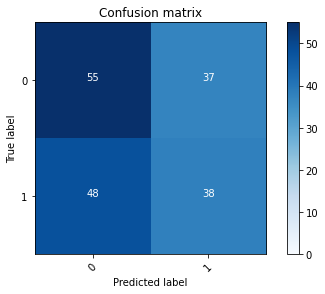

2022-08-20 20:48:51 - [Epoch Train: 25] loss: 0.3583, auc: 0.9059, acc: 0.8489, time: 50.00 s            
2022-08-20 20:48:51 - [Epoch Valid: 25] loss: 0.9396, auc: 0.5349, acc: 0.5136, time: 13.00 s


 25%|██████████                              | 25/100 [26:44<1:20:12, 64.16s/it]

2022-08-20 20:48:51 - EPOCH: 26
2022-08-20 20:48:52 - Train Step 10/973, train_loss: 0.4076
2022-08-20 20:48:52 - Train Step 20/973, train_loss: 0.3576
2022-08-20 20:48:53 - Train Step 30/973, train_loss: 0.3858
2022-08-20 20:48:53 - Train Step 40/973, train_loss: 0.4802
2022-08-20 20:48:54 - Train Step 50/973, train_loss: 0.4675
2022-08-20 20:48:54 - Train Step 60/973, train_loss: 0.4344
2022-08-20 20:48:55 - Train Step 70/973, train_loss: 0.4313
2022-08-20 20:48:55 - Train Step 80/973, train_loss: 0.4379
2022-08-20 20:48:56 - Train Step 90/973, train_loss: 0.4315
2022-08-20 20:48:56 - Train Step 100/973, train_loss: 0.4172
2022-08-20 20:48:57 - Train Step 110/973, train_loss: 0.4089
2022-08-20 20:48:57 - Train Step 120/973, train_loss: 0.4120
2022-08-20 20:48:58 - Train Step 130/973, train_loss: 0.4115
2022-08-20 20:48:58 - Train Step 140/973, train_loss: 0.4054
2022-08-20 20:48:59 - Train Step 150/973, train_loss: 0.4018
2022-08-20 20:48:59 - Train Step 160/973, train_loss: 0.4172
2

2022-08-20 20:49:52 - Valid Step 185/257, valid_loss: 0.9688
2022-08-20 20:49:52 - Valid Step 190/257, valid_loss: 0.9652
2022-08-20 20:49:52 - Valid Step 195/257, valid_loss: 0.9662
2022-08-20 20:49:53 - Valid Step 200/257, valid_loss: 0.9554
2022-08-20 20:49:53 - Valid Step 205/257, valid_loss: 0.9477
2022-08-20 20:49:53 - Valid Step 210/257, valid_loss: 0.9451
2022-08-20 20:49:53 - Valid Step 215/257, valid_loss: 0.9477
2022-08-20 20:49:54 - Valid Step 220/257, valid_loss: 0.9475
2022-08-20 20:49:54 - Valid Step 225/257, valid_loss: 0.9432
2022-08-20 20:49:54 - Valid Step 230/257, valid_loss: 0.9423
2022-08-20 20:49:55 - Valid Step 235/257, valid_loss: 0.9289
2022-08-20 20:49:55 - Valid Step 240/257, valid_loss: 0.9293
2022-08-20 20:49:55 - Valid Step 245/257, valid_loss: 0.9239
2022-08-20 20:49:55 - Valid Step 250/257, valid_loss: 0.9223
2022-08-20 20:49:56 - Valid Step 255/257, valid_loss: 0.9207
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

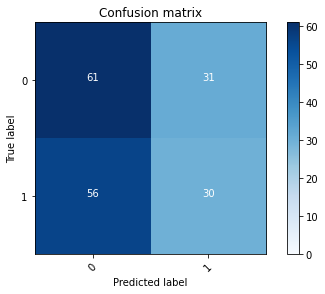

2022-08-20 20:49:56 - [Epoch Train: 26] loss: 0.3606, auc: 0.9046, acc: 0.8438, time: 51.00 s            
2022-08-20 20:49:56 - [Epoch Valid: 26] loss: 0.9175, auc: 0.5418, acc: 0.4981, time: 13.00 s


 26%|██████████▍                             | 26/100 [27:49<1:19:25, 64.40s/it]

2022-08-20 20:49:56 - EPOCH: 27
2022-08-20 20:49:57 - Train Step 10/973, train_loss: 0.3642
2022-08-20 20:49:57 - Train Step 20/973, train_loss: 0.3327
2022-08-20 20:49:58 - Train Step 30/973, train_loss: 0.3082
2022-08-20 20:49:58 - Train Step 40/973, train_loss: 0.2910
2022-08-20 20:49:59 - Train Step 50/973, train_loss: 0.2808
2022-08-20 20:49:59 - Train Step 60/973, train_loss: 0.2644
2022-08-20 20:50:00 - Train Step 70/973, train_loss: 0.2870
2022-08-20 20:50:00 - Train Step 80/973, train_loss: 0.3213
2022-08-20 20:50:01 - Train Step 90/973, train_loss: 0.3227
2022-08-20 20:50:01 - Train Step 100/973, train_loss: 0.3226
2022-08-20 20:50:02 - Train Step 110/973, train_loss: 0.3145
2022-08-20 20:50:02 - Train Step 120/973, train_loss: 0.3143
2022-08-20 20:50:03 - Train Step 130/973, train_loss: 0.3059
2022-08-20 20:50:03 - Train Step 140/973, train_loss: 0.3115
2022-08-20 20:50:04 - Train Step 150/973, train_loss: 0.3101
2022-08-20 20:50:05 - Train Step 160/973, train_loss: 0.3119
2

2022-08-20 20:50:57 - Valid Step 185/257, valid_loss: 0.9552
2022-08-20 20:50:57 - Valid Step 190/257, valid_loss: 0.9599
2022-08-20 20:50:58 - Valid Step 195/257, valid_loss: 0.9594
2022-08-20 20:50:58 - Valid Step 200/257, valid_loss: 0.9638
2022-08-20 20:50:58 - Valid Step 205/257, valid_loss: 0.9565
2022-08-20 20:50:59 - Valid Step 210/257, valid_loss: 0.9565
2022-08-20 20:50:59 - Valid Step 215/257, valid_loss: 0.9465
2022-08-20 20:50:59 - Valid Step 220/257, valid_loss: 0.9359
2022-08-20 20:50:59 - Valid Step 225/257, valid_loss: 0.9527
2022-08-20 20:51:00 - Valid Step 230/257, valid_loss: 0.9445
2022-08-20 20:51:00 - Valid Step 235/257, valid_loss: 0.9403
2022-08-20 20:51:00 - Valid Step 240/257, valid_loss: 0.9304
2022-08-20 20:51:00 - Valid Step 245/257, valid_loss: 0.9279
2022-08-20 20:51:01 - Valid Step 250/257, valid_loss: 0.9450
2022-08-20 20:51:01 - Valid Step 255/257, valid_loss: 0.9360
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

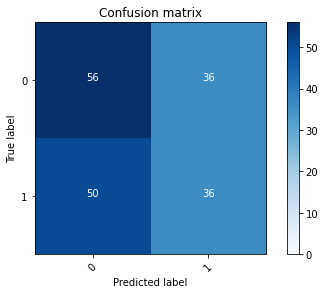

2022-08-20 20:51:01 - [Epoch Train: 27] loss: 0.3318, auc: 0.9200, acc: 0.8571, time: 51.00 s            
2022-08-20 20:51:01 - [Epoch Valid: 27] loss: 0.9350, auc: 0.5383, acc: 0.5097, time: 13.00 s


 27%|██████████▊                             | 27/100 [28:54<1:18:40, 64.67s/it]

2022-08-20 20:51:01 - EPOCH: 28
2022-08-20 20:51:02 - Train Step 10/973, train_loss: 0.3745
2022-08-20 20:51:02 - Train Step 20/973, train_loss: 0.5424
2022-08-20 20:51:03 - Train Step 30/973, train_loss: 0.4603
2022-08-20 20:51:03 - Train Step 40/973, train_loss: 0.4139
2022-08-20 20:51:04 - Train Step 50/973, train_loss: 0.3604
2022-08-20 20:51:04 - Train Step 60/973, train_loss: 0.3539
2022-08-20 20:51:05 - Train Step 70/973, train_loss: 0.3547
2022-08-20 20:51:05 - Train Step 80/973, train_loss: 0.3460
2022-08-20 20:51:06 - Train Step 90/973, train_loss: 0.3578
2022-08-20 20:51:06 - Train Step 100/973, train_loss: 0.3554
2022-08-20 20:51:07 - Train Step 110/973, train_loss: 0.3416
2022-08-20 20:51:08 - Train Step 120/973, train_loss: 0.3324
2022-08-20 20:51:08 - Train Step 130/973, train_loss: 0.3319
2022-08-20 20:51:09 - Train Step 140/973, train_loss: 0.3368
2022-08-20 20:51:09 - Train Step 150/973, train_loss: 0.3261
2022-08-20 20:51:10 - Train Step 160/973, train_loss: 0.3309
2

2022-08-20 20:52:02 - Valid Step 185/257, valid_loss: 0.9822
2022-08-20 20:52:02 - Valid Step 190/257, valid_loss: 0.9888
2022-08-20 20:52:02 - Valid Step 195/257, valid_loss: 0.9837
2022-08-20 20:52:03 - Valid Step 200/257, valid_loss: 0.9882
2022-08-20 20:52:03 - Valid Step 205/257, valid_loss: 1.0108
2022-08-20 20:52:03 - Valid Step 210/257, valid_loss: 1.0140
2022-08-20 20:52:03 - Valid Step 215/257, valid_loss: 1.0124
2022-08-20 20:52:04 - Valid Step 220/257, valid_loss: 0.9997
2022-08-20 20:52:04 - Valid Step 225/257, valid_loss: 0.9988
2022-08-20 20:52:04 - Valid Step 230/257, valid_loss: 1.0101
2022-08-20 20:52:04 - Valid Step 235/257, valid_loss: 1.0075
2022-08-20 20:52:05 - Valid Step 240/257, valid_loss: 0.9992
2022-08-20 20:52:05 - Valid Step 245/257, valid_loss: 1.0016
2022-08-20 20:52:05 - Valid Step 250/257, valid_loss: 0.9978
2022-08-20 20:52:05 - Valid Step 255/257, valid_loss: 1.0014
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

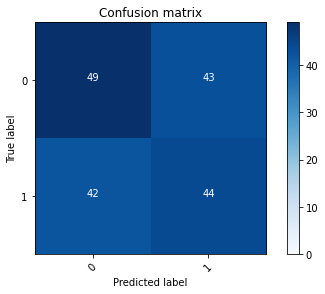

2022-08-20 20:52:06 - [Epoch Train: 28] loss: 0.3218, auc: 0.9255, acc: 0.8777, time: 50.00 s            
2022-08-20 20:52:06 - [Epoch Valid: 28] loss: 1.0004, auc: 0.5320, acc: 0.5097, time: 13.00 s


 28%|███████████▏                            | 28/100 [29:59<1:17:33, 64.63s/it]

2022-08-20 20:52:06 - EPOCH: 29
2022-08-20 20:52:06 - Train Step 10/973, train_loss: 0.2180
2022-08-20 20:52:07 - Train Step 20/973, train_loss: 0.2819
2022-08-20 20:52:07 - Train Step 30/973, train_loss: 0.2712
2022-08-20 20:52:08 - Train Step 40/973, train_loss: 0.2672
2022-08-20 20:52:08 - Train Step 50/973, train_loss: 0.2510
2022-08-20 20:52:09 - Train Step 60/973, train_loss: 0.2465
2022-08-20 20:52:09 - Train Step 70/973, train_loss: 0.2513
2022-08-20 20:52:10 - Train Step 80/973, train_loss: 0.2675
2022-08-20 20:52:10 - Train Step 90/973, train_loss: 0.2760
2022-08-20 20:52:11 - Train Step 100/973, train_loss: 0.2960
2022-08-20 20:52:11 - Train Step 110/973, train_loss: 0.2899
2022-08-20 20:52:12 - Train Step 120/973, train_loss: 0.2783
2022-08-20 20:52:12 - Train Step 130/973, train_loss: 0.2789
2022-08-20 20:52:13 - Train Step 140/973, train_loss: 0.2842
2022-08-20 20:52:13 - Train Step 150/973, train_loss: 0.2939
2022-08-20 20:52:14 - Train Step 160/973, train_loss: 0.2920
2

2022-08-20 20:53:05 - Valid Step 185/257, valid_loss: 1.0330
2022-08-20 20:53:06 - Valid Step 190/257, valid_loss: 1.0169
2022-08-20 20:53:06 - Valid Step 195/257, valid_loss: 1.0261
2022-08-20 20:53:06 - Valid Step 200/257, valid_loss: 1.0229
2022-08-20 20:53:07 - Valid Step 205/257, valid_loss: 1.0206
2022-08-20 20:53:07 - Valid Step 210/257, valid_loss: 1.0242
2022-08-20 20:53:07 - Valid Step 215/257, valid_loss: 1.0371
2022-08-20 20:53:07 - Valid Step 220/257, valid_loss: 1.0284
2022-08-20 20:53:08 - Valid Step 225/257, valid_loss: 1.0362
2022-08-20 20:53:08 - Valid Step 230/257, valid_loss: 1.0266
2022-08-20 20:53:08 - Valid Step 235/257, valid_loss: 1.0372
2022-08-20 20:53:08 - Valid Step 240/257, valid_loss: 1.0314
2022-08-20 20:53:09 - Valid Step 245/257, valid_loss: 1.0305
2022-08-20 20:53:09 - Valid Step 250/257, valid_loss: 1.0371
2022-08-20 20:53:09 - Valid Step 255/257, valid_loss: 1.0332
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

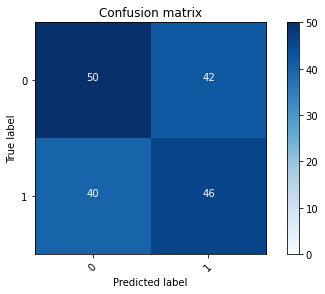

2022-08-20 20:53:09 - [Epoch Train: 29] loss: 0.3140, auc: 0.9317, acc: 0.8746, time: 50.00 s            
2022-08-20 20:53:09 - [Epoch Valid: 29] loss: 1.0260, auc: 0.5349, acc: 0.5175, time: 13.00 s


 29%|███████████▌                            | 29/100 [31:02<1:16:09, 64.36s/it]

2022-08-20 20:53:09 - EPOCH: 30
2022-08-20 20:53:10 - Train Step 10/973, train_loss: 0.4351
2022-08-20 20:53:11 - Train Step 20/973, train_loss: 0.3559
2022-08-20 20:53:11 - Train Step 30/973, train_loss: 0.3929
2022-08-20 20:53:12 - Train Step 40/973, train_loss: 0.3650
2022-08-20 20:53:12 - Train Step 50/973, train_loss: 0.3422
2022-08-20 20:53:13 - Train Step 60/973, train_loss: 0.3248
2022-08-20 20:53:13 - Train Step 70/973, train_loss: 0.3380
2022-08-20 20:53:14 - Train Step 80/973, train_loss: 0.3315
2022-08-20 20:53:14 - Train Step 90/973, train_loss: 0.3119
2022-08-20 20:53:15 - Train Step 100/973, train_loss: 0.3252
2022-08-20 20:53:15 - Train Step 110/973, train_loss: 0.3121
2022-08-20 20:53:16 - Train Step 120/973, train_loss: 0.3054
2022-08-20 20:53:16 - Train Step 130/973, train_loss: 0.2981
2022-08-20 20:53:17 - Train Step 140/973, train_loss: 0.3111
2022-08-20 20:53:17 - Train Step 150/973, train_loss: 0.3026
2022-08-20 20:53:18 - Train Step 160/973, train_loss: 0.3128
2

2022-08-20 20:54:10 - Valid Step 185/257, valid_loss: 0.9277
2022-08-20 20:54:10 - Valid Step 190/257, valid_loss: 0.9461
2022-08-20 20:54:10 - Valid Step 195/257, valid_loss: 0.9492
2022-08-20 20:54:11 - Valid Step 200/257, valid_loss: 0.9397
2022-08-20 20:54:11 - Valid Step 205/257, valid_loss: 0.9487
2022-08-20 20:54:11 - Valid Step 210/257, valid_loss: 0.9362
2022-08-20 20:54:11 - Valid Step 215/257, valid_loss: 0.9449
2022-08-20 20:54:12 - Valid Step 220/257, valid_loss: 0.9366
2022-08-20 20:54:12 - Valid Step 225/257, valid_loss: 0.9305
2022-08-20 20:54:12 - Valid Step 230/257, valid_loss: 0.9234
2022-08-20 20:54:12 - Valid Step 235/257, valid_loss: 0.9266
2022-08-20 20:54:13 - Valid Step 240/257, valid_loss: 0.9283
2022-08-20 20:54:13 - Valid Step 245/257, valid_loss: 0.9302
2022-08-20 20:54:13 - Valid Step 250/257, valid_loss: 0.9353
2022-08-20 20:54:13 - Valid Step 255/257, valid_loss: 0.9399
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

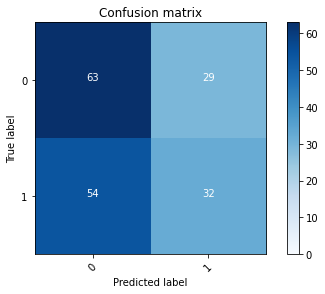

2022-08-20 20:54:14 - [Epoch Train: 30] loss: 0.2959, auc: 0.9397, acc: 0.8777, time: 50.00 s            
2022-08-20 20:54:14 - [Epoch Valid: 30] loss: 0.9353, auc: 0.5388, acc: 0.5331, time: 13.00 s


 30%|████████████                            | 30/100 [32:07<1:15:03, 64.33s/it]

2022-08-20 20:54:14 - EPOCH: 31
2022-08-20 20:54:14 - Train Step 10/973, train_loss: 0.4265
2022-08-20 20:54:15 - Train Step 20/973, train_loss: 0.3929
2022-08-20 20:54:15 - Train Step 30/973, train_loss: 0.3771
2022-08-20 20:54:16 - Train Step 40/973, train_loss: 0.3550
2022-08-20 20:54:16 - Train Step 50/973, train_loss: 0.3189
2022-08-20 20:54:17 - Train Step 60/973, train_loss: 0.3013
2022-08-20 20:54:18 - Train Step 70/973, train_loss: 0.2913
2022-08-20 20:54:18 - Train Step 80/973, train_loss: 0.2881
2022-08-20 20:54:19 - Train Step 90/973, train_loss: 0.2867
2022-08-20 20:54:19 - Train Step 100/973, train_loss: 0.2866
2022-08-20 20:54:20 - Train Step 110/973, train_loss: 0.3027
2022-08-20 20:54:20 - Train Step 120/973, train_loss: 0.3013
2022-08-20 20:54:21 - Train Step 130/973, train_loss: 0.2971
2022-08-20 20:54:21 - Train Step 140/973, train_loss: 0.2949
2022-08-20 20:54:22 - Train Step 150/973, train_loss: 0.2985
2022-08-20 20:54:22 - Train Step 160/973, train_loss: 0.2922
2

2022-08-20 20:55:15 - Valid Step 185/257, valid_loss: 1.1261
2022-08-20 20:55:15 - Valid Step 190/257, valid_loss: 1.1109
2022-08-20 20:55:15 - Valid Step 195/257, valid_loss: 1.0924
2022-08-20 20:55:16 - Valid Step 200/257, valid_loss: 1.0787
2022-08-20 20:55:16 - Valid Step 205/257, valid_loss: 1.0929
2022-08-20 20:55:16 - Valid Step 210/257, valid_loss: 1.0958
2022-08-20 20:55:17 - Valid Step 215/257, valid_loss: 1.1163
2022-08-20 20:55:17 - Valid Step 220/257, valid_loss: 1.1204
2022-08-20 20:55:17 - Valid Step 225/257, valid_loss: 1.1003
2022-08-20 20:55:17 - Valid Step 230/257, valid_loss: 1.0997
2022-08-20 20:55:18 - Valid Step 235/257, valid_loss: 1.1094
2022-08-20 20:55:18 - Valid Step 240/257, valid_loss: 1.1002
2022-08-20 20:55:18 - Valid Step 245/257, valid_loss: 1.0883
2022-08-20 20:55:18 - Valid Step 250/257, valid_loss: 1.0838
2022-08-20 20:55:19 - Valid Step 255/257, valid_loss: 1.0885
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

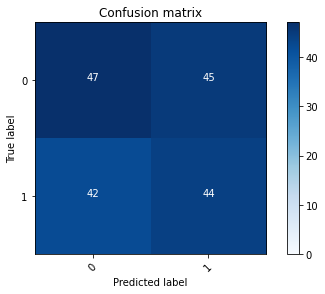

2022-08-20 20:55:19 - [Epoch Train: 31] loss: 0.2937, auc: 0.9392, acc: 0.8900, time: 51.00 s            
2022-08-20 20:55:19 - [Epoch Valid: 31] loss: 1.0893, auc: 0.5254, acc: 0.4942, time: 13.00 s


 31%|████████████▍                           | 31/100 [33:12<1:14:13, 64.55s/it]

2022-08-20 20:55:19 - EPOCH: 32
2022-08-20 20:55:19 - Train Step 10/973, train_loss: 0.1164
2022-08-20 20:55:20 - Train Step 20/973, train_loss: 0.1824
2022-08-20 20:55:21 - Train Step 30/973, train_loss: 0.2196
2022-08-20 20:55:21 - Train Step 40/973, train_loss: 0.2376
2022-08-20 20:55:22 - Train Step 50/973, train_loss: 0.2302
2022-08-20 20:55:22 - Train Step 60/973, train_loss: 0.2895
2022-08-20 20:55:23 - Train Step 70/973, train_loss: 0.2837
2022-08-20 20:55:23 - Train Step 80/973, train_loss: 0.2628
2022-08-20 20:55:24 - Train Step 90/973, train_loss: 0.2859
2022-08-20 20:55:24 - Train Step 100/973, train_loss: 0.2786
2022-08-20 20:55:25 - Train Step 110/973, train_loss: 0.2762
2022-08-20 20:55:25 - Train Step 120/973, train_loss: 0.2758
2022-08-20 20:55:26 - Train Step 130/973, train_loss: 0.2834
2022-08-20 20:55:26 - Train Step 140/973, train_loss: 0.2711
2022-08-20 20:55:26 - Train Step 150/973, train_loss: 0.2754
2022-08-20 20:55:27 - Train Step 160/973, train_loss: 0.2804
2

2022-08-20 20:56:20 - Valid Step 185/257, valid_loss: 0.9192
2022-08-20 20:56:20 - Valid Step 190/257, valid_loss: 0.9411
2022-08-20 20:56:21 - Valid Step 195/257, valid_loss: 0.9309
2022-08-20 20:56:21 - Valid Step 200/257, valid_loss: 0.9307
2022-08-20 20:56:21 - Valid Step 205/257, valid_loss: 0.9602
2022-08-20 20:56:21 - Valid Step 210/257, valid_loss: 0.9571
2022-08-20 20:56:22 - Valid Step 215/257, valid_loss: 0.9548
2022-08-20 20:56:22 - Valid Step 220/257, valid_loss: 0.9479
2022-08-20 20:56:22 - Valid Step 225/257, valid_loss: 0.9447
2022-08-20 20:56:22 - Valid Step 230/257, valid_loss: 0.9395
2022-08-20 20:56:23 - Valid Step 235/257, valid_loss: 0.9439
2022-08-20 20:56:23 - Valid Step 240/257, valid_loss: 0.9400
2022-08-20 20:56:23 - Valid Step 245/257, valid_loss: 0.9423
2022-08-20 20:56:23 - Valid Step 250/257, valid_loss: 0.9346
2022-08-20 20:56:24 - Valid Step 255/257, valid_loss: 0.9539
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

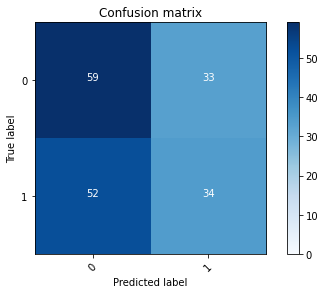

2022-08-20 20:56:24 - [Epoch Train: 32] loss: 0.2779, auc: 0.9446, acc: 0.8941, time: 51.00 s            
2022-08-20 20:56:24 - [Epoch Valid: 32] loss: 0.9537, auc: 0.5408, acc: 0.5058, time: 13.00 s


 32%|████████████▊                           | 32/100 [34:17<1:13:22, 64.74s/it]

2022-08-20 20:56:24 - EPOCH: 33
2022-08-20 20:56:25 - Train Step 10/973, train_loss: 0.2022
2022-08-20 20:56:25 - Train Step 20/973, train_loss: 0.2434
2022-08-20 20:56:26 - Train Step 30/973, train_loss: 0.2989
2022-08-20 20:56:26 - Train Step 40/973, train_loss: 0.2745
2022-08-20 20:56:27 - Train Step 50/973, train_loss: 0.2741
2022-08-20 20:56:27 - Train Step 60/973, train_loss: 0.2877
2022-08-20 20:56:28 - Train Step 70/973, train_loss: 0.2824
2022-08-20 20:56:28 - Train Step 80/973, train_loss: 0.2583
2022-08-20 20:56:29 - Train Step 90/973, train_loss: 0.2416
2022-08-20 20:56:29 - Train Step 100/973, train_loss: 0.2429
2022-08-20 20:56:30 - Train Step 110/973, train_loss: 0.2680
2022-08-20 20:56:30 - Train Step 120/973, train_loss: 0.2556
2022-08-20 20:56:31 - Train Step 130/973, train_loss: 0.2590
2022-08-20 20:56:31 - Train Step 140/973, train_loss: 0.2583
2022-08-20 20:56:32 - Train Step 150/973, train_loss: 0.2575
2022-08-20 20:56:32 - Train Step 160/973, train_loss: 0.2639
2

2022-08-20 20:57:25 - Valid Step 185/257, valid_loss: 1.0479
2022-08-20 20:57:25 - Valid Step 190/257, valid_loss: 1.0270
2022-08-20 20:57:25 - Valid Step 195/257, valid_loss: 1.0421
2022-08-20 20:57:26 - Valid Step 200/257, valid_loss: 1.0419
2022-08-20 20:57:26 - Valid Step 205/257, valid_loss: 1.0546
2022-08-20 20:57:26 - Valid Step 210/257, valid_loss: 1.0700
2022-08-20 20:57:26 - Valid Step 215/257, valid_loss: 1.0907
2022-08-20 20:57:27 - Valid Step 220/257, valid_loss: 1.0852
2022-08-20 20:57:27 - Valid Step 225/257, valid_loss: 1.0700
2022-08-20 20:57:27 - Valid Step 230/257, valid_loss: 1.0703
2022-08-20 20:57:27 - Valid Step 235/257, valid_loss: 1.0576
2022-08-20 20:57:28 - Valid Step 240/257, valid_loss: 1.0496
2022-08-20 20:57:28 - Valid Step 245/257, valid_loss: 1.0462
2022-08-20 20:57:28 - Valid Step 250/257, valid_loss: 1.0415
2022-08-20 20:57:29 - Valid Step 255/257, valid_loss: 1.0504
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

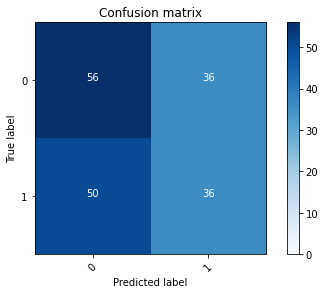

2022-08-20 20:57:29 - [Epoch Train: 33] loss: 0.2596, auc: 0.9536, acc: 0.9075, time: 51.00 s            
2022-08-20 20:57:29 - [Epoch Valid: 33] loss: 1.0511, auc: 0.5346, acc: 0.4942, time: 13.00 s


 33%|█████████████▏                          | 33/100 [35:22<1:12:19, 64.77s/it]

2022-08-20 20:57:29 - EPOCH: 34
2022-08-20 20:57:30 - Train Step 10/973, train_loss: 0.2148
2022-08-20 20:57:30 - Train Step 20/973, train_loss: 0.2891
2022-08-20 20:57:31 - Train Step 30/973, train_loss: 0.2624
2022-08-20 20:57:31 - Train Step 40/973, train_loss: 0.2839
2022-08-20 20:57:32 - Train Step 50/973, train_loss: 0.2782
2022-08-20 20:57:32 - Train Step 60/973, train_loss: 0.2481
2022-08-20 20:57:33 - Train Step 70/973, train_loss: 0.2568
2022-08-20 20:57:33 - Train Step 80/973, train_loss: 0.2738
2022-08-20 20:57:34 - Train Step 90/973, train_loss: 0.2771
2022-08-20 20:57:34 - Train Step 100/973, train_loss: 0.2695
2022-08-20 20:57:35 - Train Step 110/973, train_loss: 0.2564
2022-08-20 20:57:35 - Train Step 120/973, train_loss: 0.2899
2022-08-20 20:57:36 - Train Step 130/973, train_loss: 0.2757
2022-08-20 20:57:36 - Train Step 140/973, train_loss: 0.2684
2022-08-20 20:57:37 - Train Step 150/973, train_loss: 0.2664
2022-08-20 20:57:37 - Train Step 160/973, train_loss: 0.2707
2

2022-08-20 20:58:28 - Valid Step 185/257, valid_loss: 1.2031
2022-08-20 20:58:29 - Valid Step 190/257, valid_loss: 1.2063
2022-08-20 20:58:29 - Valid Step 195/257, valid_loss: 1.2017
2022-08-20 20:58:29 - Valid Step 200/257, valid_loss: 1.1782
2022-08-20 20:58:29 - Valid Step 205/257, valid_loss: 1.1885
2022-08-20 20:58:30 - Valid Step 210/257, valid_loss: 1.1860
2022-08-20 20:58:30 - Valid Step 215/257, valid_loss: 1.1958
2022-08-20 20:58:30 - Valid Step 220/257, valid_loss: 1.1768
2022-08-20 20:58:30 - Valid Step 225/257, valid_loss: 1.1625
2022-08-20 20:58:31 - Valid Step 230/257, valid_loss: 1.1702
2022-08-20 20:58:31 - Valid Step 235/257, valid_loss: 1.1649
2022-08-20 20:58:31 - Valid Step 240/257, valid_loss: 1.1485
2022-08-20 20:58:31 - Valid Step 245/257, valid_loss: 1.1476
2022-08-20 20:58:32 - Valid Step 250/257, valid_loss: 1.1606
2022-08-20 20:58:32 - Valid Step 255/257, valid_loss: 1.1702
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

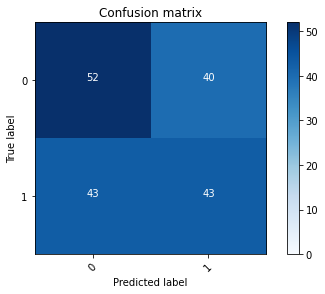

2022-08-20 20:58:32 - [Epoch Train: 34] loss: 0.2519, auc: 0.9551, acc: 0.9085, time: 49.00 s            
2022-08-20 20:58:32 - [Epoch Valid: 34] loss: 1.1732, auc: 0.5343, acc: 0.5136, time: 13.00 s


 34%|█████████████▌                          | 34/100 [36:25<1:10:48, 64.38s/it]

2022-08-20 20:58:32 - EPOCH: 35
2022-08-20 20:58:33 - Train Step 10/973, train_loss: 0.1406
2022-08-20 20:58:33 - Train Step 20/973, train_loss: 0.1397
2022-08-20 20:58:34 - Train Step 30/973, train_loss: 0.1194
2022-08-20 20:58:35 - Train Step 40/973, train_loss: 0.1555
2022-08-20 20:58:35 - Train Step 50/973, train_loss: 0.1818
2022-08-20 20:58:36 - Train Step 60/973, train_loss: 0.1797
2022-08-20 20:58:36 - Train Step 70/973, train_loss: 0.2029
2022-08-20 20:58:37 - Train Step 80/973, train_loss: 0.1949
2022-08-20 20:58:37 - Train Step 90/973, train_loss: 0.1922
2022-08-20 20:58:38 - Train Step 100/973, train_loss: 0.1942
2022-08-20 20:58:38 - Train Step 110/973, train_loss: 0.1893
2022-08-20 20:58:39 - Train Step 120/973, train_loss: 0.1852
2022-08-20 20:58:39 - Train Step 130/973, train_loss: 0.2004
2022-08-20 20:58:40 - Train Step 140/973, train_loss: 0.2009
2022-08-20 20:58:40 - Train Step 150/973, train_loss: 0.2018
2022-08-20 20:58:41 - Train Step 160/973, train_loss: 0.2028
2

2022-08-20 20:59:33 - Valid Step 185/257, valid_loss: 1.0394
2022-08-20 20:59:34 - Valid Step 190/257, valid_loss: 1.0508
2022-08-20 20:59:34 - Valid Step 195/257, valid_loss: 1.0646
2022-08-20 20:59:34 - Valid Step 200/257, valid_loss: 1.0809
2022-08-20 20:59:34 - Valid Step 205/257, valid_loss: 1.0657
2022-08-20 20:59:35 - Valid Step 210/257, valid_loss: 1.0615
2022-08-20 20:59:35 - Valid Step 215/257, valid_loss: 1.0699
2022-08-20 20:59:35 - Valid Step 220/257, valid_loss: 1.0515
2022-08-20 20:59:35 - Valid Step 225/257, valid_loss: 1.0763
2022-08-20 20:59:36 - Valid Step 230/257, valid_loss: 1.0791
2022-08-20 20:59:36 - Valid Step 235/257, valid_loss: 1.0780
2022-08-20 20:59:36 - Valid Step 240/257, valid_loss: 1.0734
2022-08-20 20:59:36 - Valid Step 245/257, valid_loss: 1.0797
2022-08-20 20:59:37 - Valid Step 250/257, valid_loss: 1.0823
2022-08-20 20:59:37 - Valid Step 255/257, valid_loss: 1.0825
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

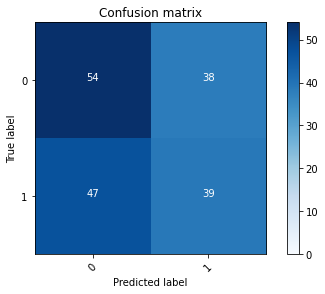

2022-08-20 20:59:37 - [Epoch Train: 35] loss: 0.2423, auc: 0.9577, acc: 0.9178, time: 51.00 s            
2022-08-20 20:59:37 - [Epoch Valid: 35] loss: 1.0810, auc: 0.5425, acc: 0.4981, time: 13.00 s


 35%|██████████████                          | 35/100 [37:30<1:09:56, 64.56s/it]

2022-08-20 20:59:37 - EPOCH: 36
2022-08-20 20:59:38 - Train Step 10/973, train_loss: 0.2938
2022-08-20 20:59:38 - Train Step 20/973, train_loss: 0.1930
2022-08-20 20:59:39 - Train Step 30/973, train_loss: 0.1840
2022-08-20 20:59:39 - Train Step 40/973, train_loss: 0.1578
2022-08-20 20:59:40 - Train Step 50/973, train_loss: 0.1495
2022-08-20 20:59:40 - Train Step 60/973, train_loss: 0.1522
2022-08-20 20:59:41 - Train Step 70/973, train_loss: 0.1413
2022-08-20 20:59:41 - Train Step 80/973, train_loss: 0.1462
2022-08-20 20:59:42 - Train Step 90/973, train_loss: 0.1426
2022-08-20 20:59:42 - Train Step 100/973, train_loss: 0.1423
2022-08-20 20:59:43 - Train Step 110/973, train_loss: 0.1593
2022-08-20 20:59:43 - Train Step 120/973, train_loss: 0.1567
2022-08-20 20:59:44 - Train Step 130/973, train_loss: 0.1651
2022-08-20 20:59:45 - Train Step 140/973, train_loss: 0.1693
2022-08-20 20:59:45 - Train Step 150/973, train_loss: 0.1672
2022-08-20 20:59:45 - Train Step 160/973, train_loss: 0.1680
2

2022-08-20 21:00:38 - Valid Step 185/257, valid_loss: 1.1157
2022-08-20 21:00:38 - Valid Step 190/257, valid_loss: 1.1511
2022-08-20 21:00:38 - Valid Step 195/257, valid_loss: 1.1433
2022-08-20 21:00:39 - Valid Step 200/257, valid_loss: 1.1219
2022-08-20 21:00:39 - Valid Step 205/257, valid_loss: 1.1212
2022-08-20 21:00:39 - Valid Step 210/257, valid_loss: 1.1348
2022-08-20 21:00:40 - Valid Step 215/257, valid_loss: 1.1321
2022-08-20 21:00:40 - Valid Step 220/257, valid_loss: 1.1207
2022-08-20 21:00:40 - Valid Step 225/257, valid_loss: 1.1246
2022-08-20 21:00:40 - Valid Step 230/257, valid_loss: 1.1254
2022-08-20 21:00:40 - Valid Step 235/257, valid_loss: 1.1149
2022-08-20 21:00:41 - Valid Step 240/257, valid_loss: 1.1160
2022-08-20 21:00:41 - Valid Step 245/257, valid_loss: 1.0996
2022-08-20 21:00:41 - Valid Step 250/257, valid_loss: 1.1124
2022-08-20 21:00:41 - Valid Step 255/257, valid_loss: 1.1180
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

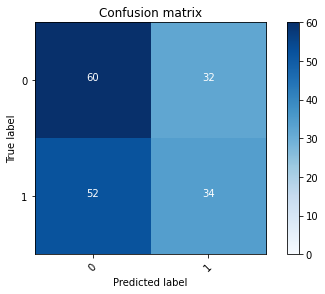

2022-08-20 21:00:42 - [Epoch Train: 36] loss: 0.2331, auc: 0.9598, acc: 0.9301, time: 50.00 s            
2022-08-20 21:00:42 - [Epoch Valid: 36] loss: 1.1119, auc: 0.5404, acc: 0.5214, time: 13.00 s


 36%|██████████████▍                         | 36/100 [38:35<1:08:50, 64.54s/it]

2022-08-20 21:00:42 - EPOCH: 37
2022-08-20 21:00:42 - Train Step 10/973, train_loss: 0.2938
2022-08-20 21:00:43 - Train Step 20/973, train_loss: 0.5005
2022-08-20 21:00:43 - Train Step 30/973, train_loss: 0.3802
2022-08-20 21:00:44 - Train Step 40/973, train_loss: 0.3541
2022-08-20 21:00:45 - Train Step 50/973, train_loss: 0.3137
2022-08-20 21:00:45 - Train Step 60/973, train_loss: 0.3113
2022-08-20 21:00:46 - Train Step 70/973, train_loss: 0.3180
2022-08-20 21:00:46 - Train Step 80/973, train_loss: 0.2990
2022-08-20 21:00:47 - Train Step 90/973, train_loss: 0.2808
2022-08-20 21:00:47 - Train Step 100/973, train_loss: 0.3026
2022-08-20 21:00:48 - Train Step 110/973, train_loss: 0.2916
2022-08-20 21:00:48 - Train Step 120/973, train_loss: 0.2950
2022-08-20 21:00:49 - Train Step 130/973, train_loss: 0.2919
2022-08-20 21:00:49 - Train Step 140/973, train_loss: 0.2789
2022-08-20 21:00:50 - Train Step 150/973, train_loss: 0.2718
2022-08-20 21:00:50 - Train Step 160/973, train_loss: 0.2686
2

2022-08-20 21:01:42 - Valid Step 185/257, valid_loss: 1.1468
2022-08-20 21:01:42 - Valid Step 190/257, valid_loss: 1.1403
2022-08-20 21:01:42 - Valid Step 195/257, valid_loss: 1.1549
2022-08-20 21:01:43 - Valid Step 200/257, valid_loss: 1.1423
2022-08-20 21:01:43 - Valid Step 205/257, valid_loss: 1.1220
2022-08-20 21:01:43 - Valid Step 210/257, valid_loss: 1.1240
2022-08-20 21:01:43 - Valid Step 215/257, valid_loss: 1.1420
2022-08-20 21:01:44 - Valid Step 220/257, valid_loss: 1.1397
2022-08-20 21:01:44 - Valid Step 225/257, valid_loss: 1.1444
2022-08-20 21:01:44 - Valid Step 230/257, valid_loss: 1.1473
2022-08-20 21:01:44 - Valid Step 235/257, valid_loss: 1.1492
2022-08-20 21:01:45 - Valid Step 240/257, valid_loss: 1.1442
2022-08-20 21:01:45 - Valid Step 245/257, valid_loss: 1.1477
2022-08-20 21:01:45 - Valid Step 250/257, valid_loss: 1.1499
2022-08-20 21:01:45 - Valid Step 255/257, valid_loss: 1.1671
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

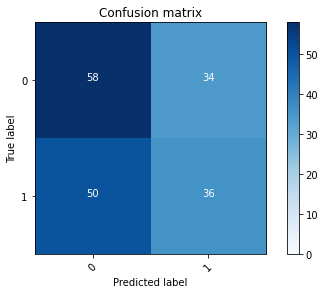

2022-08-20 21:01:46 - [Epoch Train: 37] loss: 0.2238, auc: 0.9650, acc: 0.9291, time: 50.00 s            
2022-08-20 21:01:46 - [Epoch Valid: 37] loss: 1.1626, auc: 0.5375, acc: 0.5097, time: 13.00 s


 37%|██████████████▊                         | 37/100 [39:39<1:07:33, 64.34s/it]

2022-08-20 21:01:46 - EPOCH: 38
2022-08-20 21:01:46 - Train Step 10/973, train_loss: 0.1924
2022-08-20 21:01:47 - Train Step 20/973, train_loss: 0.2286
2022-08-20 21:01:47 - Train Step 30/973, train_loss: 0.1995
2022-08-20 21:01:48 - Train Step 40/973, train_loss: 0.1731
2022-08-20 21:01:48 - Train Step 50/973, train_loss: 0.1576
2022-08-20 21:01:49 - Train Step 60/973, train_loss: 0.1894
2022-08-20 21:01:49 - Train Step 70/973, train_loss: 0.1801
2022-08-20 21:01:50 - Train Step 80/973, train_loss: 0.2036
2022-08-20 21:01:50 - Train Step 90/973, train_loss: 0.2100
2022-08-20 21:01:51 - Train Step 100/973, train_loss: 0.2103
2022-08-20 21:01:51 - Train Step 110/973, train_loss: 0.2297
2022-08-20 21:01:52 - Train Step 120/973, train_loss: 0.2272
2022-08-20 21:01:52 - Train Step 130/973, train_loss: 0.2302
2022-08-20 21:01:53 - Train Step 140/973, train_loss: 0.2232
2022-08-20 21:01:54 - Train Step 150/973, train_loss: 0.2217
2022-08-20 21:01:54 - Train Step 160/973, train_loss: 0.2156
2

2022-08-20 21:02:46 - Valid Step 185/257, valid_loss: 1.2296
2022-08-20 21:02:46 - Valid Step 190/257, valid_loss: 1.2398
2022-08-20 21:02:46 - Valid Step 195/257, valid_loss: 1.2824
2022-08-20 21:02:47 - Valid Step 200/257, valid_loss: 1.2619
2022-08-20 21:02:47 - Valid Step 205/257, valid_loss: 1.2547
2022-08-20 21:02:47 - Valid Step 210/257, valid_loss: 1.2348
2022-08-20 21:02:47 - Valid Step 215/257, valid_loss: 1.2127
2022-08-20 21:02:48 - Valid Step 220/257, valid_loss: 1.1987
2022-08-20 21:02:48 - Valid Step 225/257, valid_loss: 1.2172
2022-08-20 21:02:48 - Valid Step 230/257, valid_loss: 1.2166
2022-08-20 21:02:49 - Valid Step 235/257, valid_loss: 1.2242
2022-08-20 21:02:49 - Valid Step 240/257, valid_loss: 1.2034
2022-08-20 21:02:49 - Valid Step 245/257, valid_loss: 1.1933
2022-08-20 21:02:49 - Valid Step 250/257, valid_loss: 1.1776
2022-08-20 21:02:49 - Valid Step 255/257, valid_loss: 1.1840
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

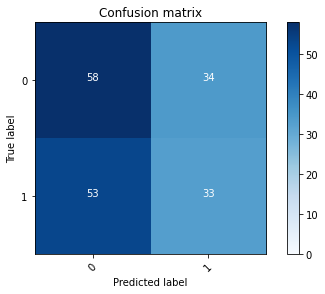

2022-08-20 21:02:50 - [Epoch Train: 38] loss: 0.2127, auc: 0.9691, acc: 0.9332, time: 50.00 s            
2022-08-20 21:02:50 - [Epoch Valid: 38] loss: 1.1939, auc: 0.5340, acc: 0.4981, time: 13.00 s


 38%|███████████████▏                        | 38/100 [40:43<1:06:25, 64.28s/it]

2022-08-20 21:02:50 - EPOCH: 39
2022-08-20 21:02:50 - Train Step 10/973, train_loss: 0.1863
2022-08-20 21:02:51 - Train Step 20/973, train_loss: 0.2626
2022-08-20 21:02:51 - Train Step 30/973, train_loss: 0.2124
2022-08-20 21:02:52 - Train Step 40/973, train_loss: 0.1944
2022-08-20 21:02:52 - Train Step 50/973, train_loss: 0.2162
2022-08-20 21:02:53 - Train Step 60/973, train_loss: 0.2020
2022-08-20 21:02:54 - Train Step 70/973, train_loss: 0.1940
2022-08-20 21:02:54 - Train Step 80/973, train_loss: 0.1881
2022-08-20 21:02:55 - Train Step 90/973, train_loss: 0.1835
2022-08-20 21:02:55 - Train Step 100/973, train_loss: 0.1809
2022-08-20 21:02:56 - Train Step 110/973, train_loss: 0.1838
2022-08-20 21:02:56 - Train Step 120/973, train_loss: 0.1782
2022-08-20 21:02:57 - Train Step 130/973, train_loss: 0.1798
2022-08-20 21:02:57 - Train Step 140/973, train_loss: 0.1825
2022-08-20 21:02:58 - Train Step 150/973, train_loss: 0.1906
2022-08-20 21:02:58 - Train Step 160/973, train_loss: 0.1863
2

2022-08-20 21:03:50 - Valid Step 185/257, valid_loss: 1.2922
2022-08-20 21:03:50 - Valid Step 190/257, valid_loss: 1.2784
2022-08-20 21:03:50 - Valid Step 195/257, valid_loss: 1.3186
2022-08-20 21:03:50 - Valid Step 200/257, valid_loss: 1.3265
2022-08-20 21:03:51 - Valid Step 205/257, valid_loss: 1.3348
2022-08-20 21:03:51 - Valid Step 210/257, valid_loss: 1.3216
2022-08-20 21:03:51 - Valid Step 215/257, valid_loss: 1.2965
2022-08-20 21:03:51 - Valid Step 220/257, valid_loss: 1.3125
2022-08-20 21:03:52 - Valid Step 225/257, valid_loss: 1.3324
2022-08-20 21:03:52 - Valid Step 230/257, valid_loss: 1.3368
2022-08-20 21:03:52 - Valid Step 235/257, valid_loss: 1.3377
2022-08-20 21:03:52 - Valid Step 240/257, valid_loss: 1.3483
2022-08-20 21:03:53 - Valid Step 245/257, valid_loss: 1.3331
2022-08-20 21:03:53 - Valid Step 250/257, valid_loss: 1.3795
2022-08-20 21:03:53 - Valid Step 255/257, valid_loss: 1.4129
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

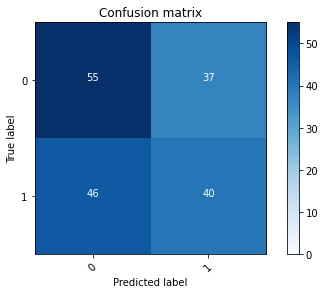

2022-08-20 21:03:54 - [Epoch Train: 39] loss: 0.1819, auc: 0.9794, acc: 0.9424, time: 50.00 s            
2022-08-20 21:03:54 - [Epoch Valid: 39] loss: 1.4078, auc: 0.5344, acc: 0.5136, time: 13.00 s


 39%|███████████████▌                        | 39/100 [41:46<1:05:12, 64.13s/it]

2022-08-20 21:03:54 - EPOCH: 40
2022-08-20 21:03:54 - Train Step 10/973, train_loss: 0.2891
2022-08-20 21:03:55 - Train Step 20/973, train_loss: 0.2938
2022-08-20 21:03:55 - Train Step 30/973, train_loss: 0.2339
2022-08-20 21:03:56 - Train Step 40/973, train_loss: 0.2152
2022-08-20 21:03:56 - Train Step 50/973, train_loss: 0.1907
2022-08-20 21:03:57 - Train Step 60/973, train_loss: 0.1997
2022-08-20 21:03:57 - Train Step 70/973, train_loss: 0.1836
2022-08-20 21:03:58 - Train Step 80/973, train_loss: 0.1716
2022-08-20 21:03:58 - Train Step 90/973, train_loss: 0.1692
2022-08-20 21:03:59 - Train Step 100/973, train_loss: 0.1625
2022-08-20 21:03:59 - Train Step 110/973, train_loss: 0.1743
2022-08-20 21:04:00 - Train Step 120/973, train_loss: 0.1690
2022-08-20 21:04:00 - Train Step 130/973, train_loss: 0.1626
2022-08-20 21:04:01 - Train Step 140/973, train_loss: 0.1571
2022-08-20 21:04:01 - Train Step 150/973, train_loss: 0.1605
2022-08-20 21:04:02 - Train Step 160/973, train_loss: 0.1659
2

2022-08-20 21:04:54 - Valid Step 185/257, valid_loss: 1.2946
2022-08-20 21:04:55 - Valid Step 190/257, valid_loss: 1.3029
2022-08-20 21:04:55 - Valid Step 195/257, valid_loss: 1.3051
2022-08-20 21:04:55 - Valid Step 200/257, valid_loss: 1.3049
2022-08-20 21:04:55 - Valid Step 205/257, valid_loss: 1.3013
2022-08-20 21:04:56 - Valid Step 210/257, valid_loss: 1.2888
2022-08-20 21:04:56 - Valid Step 215/257, valid_loss: 1.3117
2022-08-20 21:04:56 - Valid Step 220/257, valid_loss: 1.3402
2022-08-20 21:04:56 - Valid Step 225/257, valid_loss: 1.3311
2022-08-20 21:04:57 - Valid Step 230/257, valid_loss: 1.3417
2022-08-20 21:04:57 - Valid Step 235/257, valid_loss: 1.3372
2022-08-20 21:04:57 - Valid Step 240/257, valid_loss: 1.3259
2022-08-20 21:04:57 - Valid Step 245/257, valid_loss: 1.3110
2022-08-20 21:04:58 - Valid Step 250/257, valid_loss: 1.3137
2022-08-20 21:04:58 - Valid Step 255/257, valid_loss: 1.3127
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

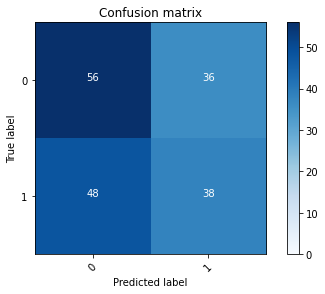

2022-08-20 21:04:58 - [Epoch Train: 40] loss: 0.1873, auc: 0.9782, acc: 0.9311, time: 50.00 s            
2022-08-20 21:04:58 - [Epoch Valid: 40] loss: 1.3045, auc: 0.5412, acc: 0.5058, time: 14.00 s


 40%|████████████████                        | 40/100 [42:51<1:04:20, 64.33s/it]

2022-08-20 21:04:58 - EPOCH: 41
2022-08-20 21:04:59 - Train Step 10/973, train_loss: 0.1876
2022-08-20 21:05:00 - Train Step 20/973, train_loss: 0.2951
2022-08-20 21:05:00 - Train Step 30/973, train_loss: 0.2432
2022-08-20 21:05:01 - Train Step 40/973, train_loss: 0.2216
2022-08-20 21:05:01 - Train Step 50/973, train_loss: 0.2277
2022-08-20 21:05:02 - Train Step 60/973, train_loss: 0.2366
2022-08-20 21:05:02 - Train Step 70/973, train_loss: 0.2160
2022-08-20 21:05:03 - Train Step 80/973, train_loss: 0.1981
2022-08-20 21:05:03 - Train Step 90/973, train_loss: 0.1839
2022-08-20 21:05:04 - Train Step 100/973, train_loss: 0.1770
2022-08-20 21:05:04 - Train Step 110/973, train_loss: 0.1698
2022-08-20 21:05:05 - Train Step 120/973, train_loss: 0.1747
2022-08-20 21:05:05 - Train Step 130/973, train_loss: 0.1679
2022-08-20 21:05:06 - Train Step 140/973, train_loss: 0.1631
2022-08-20 21:05:06 - Train Step 150/973, train_loss: 0.1634
2022-08-20 21:05:07 - Train Step 160/973, train_loss: 0.1593
2

2022-08-20 21:05:59 - Valid Step 185/257, valid_loss: 1.3592
2022-08-20 21:05:59 - Valid Step 190/257, valid_loss: 1.3625
2022-08-20 21:05:59 - Valid Step 195/257, valid_loss: 1.3336
2022-08-20 21:06:00 - Valid Step 200/257, valid_loss: 1.3193
2022-08-20 21:06:00 - Valid Step 205/257, valid_loss: 1.3589
2022-08-20 21:06:00 - Valid Step 210/257, valid_loss: 1.3605
2022-08-20 21:06:00 - Valid Step 215/257, valid_loss: 1.3373
2022-08-20 21:06:01 - Valid Step 220/257, valid_loss: 1.3544
2022-08-20 21:06:01 - Valid Step 225/257, valid_loss: 1.3669
2022-08-20 21:06:01 - Valid Step 230/257, valid_loss: 1.3766
2022-08-20 21:06:01 - Valid Step 235/257, valid_loss: 1.3782
2022-08-20 21:06:02 - Valid Step 240/257, valid_loss: 1.3759
2022-08-20 21:06:02 - Valid Step 245/257, valid_loss: 1.3880
2022-08-20 21:06:02 - Valid Step 250/257, valid_loss: 1.3914
2022-08-20 21:06:02 - Valid Step 255/257, valid_loss: 1.4137
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

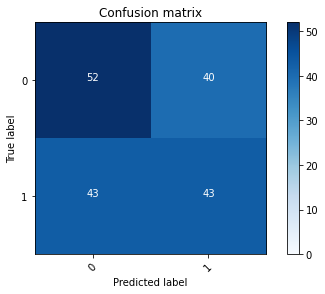

2022-08-20 21:06:03 - [Epoch Train: 41] loss: 0.1717, auc: 0.9785, acc: 0.9568, time: 50.00 s            
2022-08-20 21:06:03 - [Epoch Valid: 41] loss: 1.4124, auc: 0.5388, acc: 0.5058, time: 13.00 s


 41%|████████████████▍                       | 41/100 [43:56<1:03:15, 64.33s/it]

2022-08-20 21:06:03 - EPOCH: 42
2022-08-20 21:06:03 - Train Step 10/973, train_loss: 0.1997
2022-08-20 21:06:04 - Train Step 20/973, train_loss: 0.1462
2022-08-20 21:06:04 - Train Step 30/973, train_loss: 0.1246
2022-08-20 21:06:05 - Train Step 40/973, train_loss: 0.1182
2022-08-20 21:06:05 - Train Step 50/973, train_loss: 0.1141
2022-08-20 21:06:06 - Train Step 60/973, train_loss: 0.1700
2022-08-20 21:06:06 - Train Step 70/973, train_loss: 0.1689
2022-08-20 21:06:07 - Train Step 80/973, train_loss: 0.1640
2022-08-20 21:06:07 - Train Step 90/973, train_loss: 0.1805
2022-08-20 21:06:08 - Train Step 100/973, train_loss: 0.1694
2022-08-20 21:06:08 - Train Step 110/973, train_loss: 0.1630
2022-08-20 21:06:09 - Train Step 120/973, train_loss: 0.1555
2022-08-20 21:06:09 - Train Step 130/973, train_loss: 0.1537
2022-08-20 21:06:10 - Train Step 140/973, train_loss: 0.1554
2022-08-20 21:06:10 - Train Step 150/973, train_loss: 0.1519
2022-08-20 21:06:11 - Train Step 160/973, train_loss: 0.1549
2

2022-08-20 21:07:03 - Valid Step 185/257, valid_loss: 1.3349
2022-08-20 21:07:03 - Valid Step 190/257, valid_loss: 1.3099
2022-08-20 21:07:03 - Valid Step 195/257, valid_loss: 1.3246
2022-08-20 21:07:04 - Valid Step 200/257, valid_loss: 1.3062
2022-08-20 21:07:04 - Valid Step 205/257, valid_loss: 1.3280
2022-08-20 21:07:04 - Valid Step 210/257, valid_loss: 1.3232
2022-08-20 21:07:05 - Valid Step 215/257, valid_loss: 1.3252
2022-08-20 21:07:05 - Valid Step 220/257, valid_loss: 1.3111
2022-08-20 21:07:05 - Valid Step 225/257, valid_loss: 1.3101
2022-08-20 21:07:05 - Valid Step 230/257, valid_loss: 1.3275
2022-08-20 21:07:06 - Valid Step 235/257, valid_loss: 1.3312
2022-08-20 21:07:06 - Valid Step 240/257, valid_loss: 1.3211
2022-08-20 21:07:06 - Valid Step 245/257, valid_loss: 1.3199
2022-08-20 21:07:06 - Valid Step 250/257, valid_loss: 1.3156
2022-08-20 21:07:07 - Valid Step 255/257, valid_loss: 1.3459
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

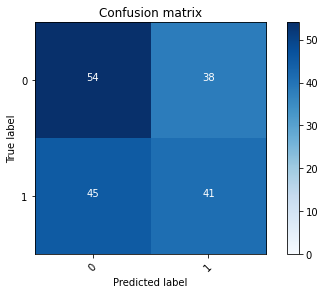

2022-08-20 21:07:07 - [Epoch Train: 42] loss: 0.1759, auc: 0.9776, acc: 0.9455, time: 50.00 s            
2022-08-20 21:07:07 - [Epoch Valid: 42] loss: 1.3409, auc: 0.5327, acc: 0.5058, time: 13.00 s


 42%|████████████████▊                       | 42/100 [45:00<1:02:10, 64.32s/it]

2022-08-20 21:07:07 - EPOCH: 43
2022-08-20 21:07:08 - Train Step 10/973, train_loss: 0.1217
2022-08-20 21:07:08 - Train Step 20/973, train_loss: 0.1155
2022-08-20 21:07:09 - Train Step 30/973, train_loss: 0.1121
2022-08-20 21:07:09 - Train Step 40/973, train_loss: 0.0955
2022-08-20 21:07:10 - Train Step 50/973, train_loss: 0.0970
2022-08-20 21:07:10 - Train Step 60/973, train_loss: 0.1297
2022-08-20 21:07:11 - Train Step 70/973, train_loss: 0.2051
2022-08-20 21:07:11 - Train Step 80/973, train_loss: 0.1998
2022-08-20 21:07:12 - Train Step 90/973, train_loss: 0.2031
2022-08-20 21:07:12 - Train Step 100/973, train_loss: 0.1992
2022-08-20 21:07:13 - Train Step 110/973, train_loss: 0.1944
2022-08-20 21:07:13 - Train Step 120/973, train_loss: 0.1957
2022-08-20 21:07:14 - Train Step 130/973, train_loss: 0.1932
2022-08-20 21:07:14 - Train Step 140/973, train_loss: 0.1913
2022-08-20 21:07:15 - Train Step 150/973, train_loss: 0.1824
2022-08-20 21:07:15 - Train Step 160/973, train_loss: 0.2141
2

2022-08-20 21:08:07 - Valid Step 185/257, valid_loss: 1.3819
2022-08-20 21:08:08 - Valid Step 190/257, valid_loss: 1.3791
2022-08-20 21:08:08 - Valid Step 195/257, valid_loss: 1.3798
2022-08-20 21:08:08 - Valid Step 200/257, valid_loss: 1.3680
2022-08-20 21:08:08 - Valid Step 205/257, valid_loss: 1.4125
2022-08-20 21:08:09 - Valid Step 210/257, valid_loss: 1.4060
2022-08-20 21:08:09 - Valid Step 215/257, valid_loss: 1.4352
2022-08-20 21:08:09 - Valid Step 220/257, valid_loss: 1.4301
2022-08-20 21:08:09 - Valid Step 225/257, valid_loss: 1.4151
2022-08-20 21:08:10 - Valid Step 230/257, valid_loss: 1.4219
2022-08-20 21:08:10 - Valid Step 235/257, valid_loss: 1.4129
2022-08-20 21:08:10 - Valid Step 240/257, valid_loss: 1.3975
2022-08-20 21:08:10 - Valid Step 245/257, valid_loss: 1.3871
2022-08-20 21:08:11 - Valid Step 250/257, valid_loss: 1.3768
2022-08-20 21:08:11 - Valid Step 255/257, valid_loss: 1.3793
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

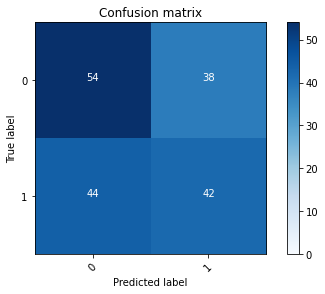

2022-08-20 21:08:11 - [Epoch Train: 43] loss: 0.1686, auc: 0.9786, acc: 0.9558, time: 50.00 s            
2022-08-20 21:08:11 - [Epoch Valid: 43] loss: 1.3838, auc: 0.5380, acc: 0.5097, time: 13.00 s


 43%|█████████████████▏                      | 43/100 [46:04<1:01:05, 64.31s/it]

2022-08-20 21:08:11 - EPOCH: 44
2022-08-20 21:08:12 - Train Step 10/973, train_loss: 0.3692
2022-08-20 21:08:12 - Train Step 20/973, train_loss: 0.2364
2022-08-20 21:08:13 - Train Step 30/973, train_loss: 0.2635
2022-08-20 21:08:13 - Train Step 40/973, train_loss: 0.2215
2022-08-20 21:08:14 - Train Step 50/973, train_loss: 0.1968
2022-08-20 21:08:15 - Train Step 60/973, train_loss: 0.1919
2022-08-20 21:08:15 - Train Step 70/973, train_loss: 0.1861
2022-08-20 21:08:16 - Train Step 80/973, train_loss: 0.1819
2022-08-20 21:08:16 - Train Step 90/973, train_loss: 0.1766
2022-08-20 21:08:17 - Train Step 100/973, train_loss: 0.1768
2022-08-20 21:08:17 - Train Step 110/973, train_loss: 0.1811
2022-08-20 21:08:18 - Train Step 120/973, train_loss: 0.1819
2022-08-20 21:08:18 - Train Step 130/973, train_loss: 0.1783
2022-08-20 21:08:19 - Train Step 140/973, train_loss: 0.1897
2022-08-20 21:08:19 - Train Step 150/973, train_loss: 0.1837
2022-08-20 21:08:20 - Train Step 160/973, train_loss: 0.1831
2

2022-08-20 21:09:11 - Valid Step 185/257, valid_loss: 1.4430
2022-08-20 21:09:12 - Valid Step 190/257, valid_loss: 1.4259
2022-08-20 21:09:12 - Valid Step 195/257, valid_loss: 1.4482
2022-08-20 21:09:12 - Valid Step 200/257, valid_loss: 1.4174
2022-08-20 21:09:12 - Valid Step 205/257, valid_loss: 1.4332
2022-08-20 21:09:13 - Valid Step 210/257, valid_loss: 1.4591
2022-08-20 21:09:13 - Valid Step 215/257, valid_loss: 1.4310
2022-08-20 21:09:13 - Valid Step 220/257, valid_loss: 1.4281
2022-08-20 21:09:13 - Valid Step 225/257, valid_loss: 1.4146
2022-08-20 21:09:14 - Valid Step 230/257, valid_loss: 1.4002
2022-08-20 21:09:14 - Valid Step 235/257, valid_loss: 1.4051
2022-08-20 21:09:14 - Valid Step 240/257, valid_loss: 1.3965
2022-08-20 21:09:14 - Valid Step 245/257, valid_loss: 1.3713
2022-08-20 21:09:15 - Valid Step 250/257, valid_loss: 1.3700
2022-08-20 21:09:15 - Valid Step 255/257, valid_loss: 1.3981
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

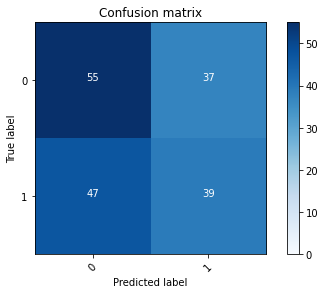

2022-08-20 21:09:15 - [Epoch Train: 44] loss: 0.1556, auc: 0.9838, acc: 0.9609, time: 50.00 s            
2022-08-20 21:09:15 - [Epoch Valid: 44] loss: 1.4077, auc: 0.5394, acc: 0.5058, time: 13.00 s


 44%|██████████████████▍                       | 44/100 [47:08<59:55, 64.21s/it]

2022-08-20 21:09:15 - EPOCH: 45
2022-08-20 21:09:16 - Train Step 10/973, train_loss: 0.2582
2022-08-20 21:09:16 - Train Step 20/973, train_loss: 0.1593
2022-08-20 21:09:17 - Train Step 30/973, train_loss: 0.1721
2022-08-20 21:09:17 - Train Step 40/973, train_loss: 0.1495
2022-08-20 21:09:18 - Train Step 50/973, train_loss: 0.1376
2022-08-20 21:09:19 - Train Step 60/973, train_loss: 0.1314
2022-08-20 21:09:19 - Train Step 70/973, train_loss: 0.1416
2022-08-20 21:09:20 - Train Step 80/973, train_loss: 0.1366
2022-08-20 21:09:20 - Train Step 90/973, train_loss: 0.1437
2022-08-20 21:09:21 - Train Step 100/973, train_loss: 0.1469
2022-08-20 21:09:21 - Train Step 110/973, train_loss: 0.1422
2022-08-20 21:09:22 - Train Step 120/973, train_loss: 0.1413
2022-08-20 21:09:22 - Train Step 130/973, train_loss: 0.1406
2022-08-20 21:09:23 - Train Step 140/973, train_loss: 0.1325
2022-08-20 21:09:23 - Train Step 150/973, train_loss: 0.1305
2022-08-20 21:09:24 - Train Step 160/973, train_loss: 0.1376
2

2022-08-20 21:10:15 - Valid Step 185/257, valid_loss: 1.7632
2022-08-20 21:10:16 - Valid Step 190/257, valid_loss: 1.7642
2022-08-20 21:10:16 - Valid Step 195/257, valid_loss: 1.7631
2022-08-20 21:10:16 - Valid Step 200/257, valid_loss: 1.7605
2022-08-20 21:10:16 - Valid Step 205/257, valid_loss: 1.7740
2022-08-20 21:10:17 - Valid Step 210/257, valid_loss: 1.7991
2022-08-20 21:10:17 - Valid Step 215/257, valid_loss: 1.7794
2022-08-20 21:10:17 - Valid Step 220/257, valid_loss: 1.7492
2022-08-20 21:10:17 - Valid Step 225/257, valid_loss: 1.7114
2022-08-20 21:10:18 - Valid Step 230/257, valid_loss: 1.7144
2022-08-20 21:10:18 - Valid Step 235/257, valid_loss: 1.7066
2022-08-20 21:10:18 - Valid Step 240/257, valid_loss: 1.7165
2022-08-20 21:10:18 - Valid Step 245/257, valid_loss: 1.7165
2022-08-20 21:10:19 - Valid Step 250/257, valid_loss: 1.7155
2022-08-20 21:10:19 - Valid Step 255/257, valid_loss: 1.7147
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

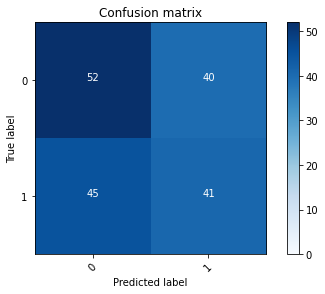

2022-08-20 21:10:19 - [Epoch Train: 45] loss: 0.1476, auc: 0.9845, acc: 0.9651, time: 50.00 s            
2022-08-20 21:10:19 - [Epoch Valid: 45] loss: 1.7081, auc: 0.5317, acc: 0.4981, time: 13.00 s


 45%|██████████████████▉                       | 45/100 [48:12<58:48, 64.16s/it]

2022-08-20 21:10:19 - EPOCH: 46
2022-08-20 21:10:20 - Train Step 10/973, train_loss: 0.1825
2022-08-20 21:10:20 - Train Step 20/973, train_loss: 0.1951
2022-08-20 21:10:21 - Train Step 30/973, train_loss: 0.2135
2022-08-20 21:10:22 - Train Step 40/973, train_loss: 0.1850
2022-08-20 21:10:22 - Train Step 50/973, train_loss: 0.1627
2022-08-20 21:10:23 - Train Step 60/973, train_loss: 0.1541
2022-08-20 21:10:23 - Train Step 70/973, train_loss: 0.1557
2022-08-20 21:10:24 - Train Step 80/973, train_loss: 0.1612
2022-08-20 21:10:24 - Train Step 90/973, train_loss: 0.1489
2022-08-20 21:10:25 - Train Step 100/973, train_loss: 0.1603
2022-08-20 21:10:25 - Train Step 110/973, train_loss: 0.1529
2022-08-20 21:10:26 - Train Step 120/973, train_loss: 0.1445
2022-08-20 21:10:26 - Train Step 130/973, train_loss: 0.1405
2022-08-20 21:10:27 - Train Step 140/973, train_loss: 0.1403
2022-08-20 21:10:27 - Train Step 150/973, train_loss: 0.1346
2022-08-20 21:10:28 - Train Step 160/973, train_loss: 0.1511
2

2022-08-20 21:11:19 - Valid Step 185/257, valid_loss: 1.4910
2022-08-20 21:11:20 - Valid Step 190/257, valid_loss: 1.4894
2022-08-20 21:11:20 - Valid Step 195/257, valid_loss: 1.5173
2022-08-20 21:11:20 - Valid Step 200/257, valid_loss: 1.5299
2022-08-20 21:11:20 - Valid Step 205/257, valid_loss: 1.5115
2022-08-20 21:11:21 - Valid Step 210/257, valid_loss: 1.5046
2022-08-20 21:11:21 - Valid Step 215/257, valid_loss: 1.4717
2022-08-20 21:11:21 - Valid Step 220/257, valid_loss: 1.4843
2022-08-20 21:11:21 - Valid Step 225/257, valid_loss: 1.4810
2022-08-20 21:11:22 - Valid Step 230/257, valid_loss: 1.4791
2022-08-20 21:11:22 - Valid Step 235/257, valid_loss: 1.4589
2022-08-20 21:11:22 - Valid Step 240/257, valid_loss: 1.4440
2022-08-20 21:11:22 - Valid Step 245/257, valid_loss: 1.4348
2022-08-20 21:11:23 - Valid Step 250/257, valid_loss: 1.4589
2022-08-20 21:11:23 - Valid Step 255/257, valid_loss: 1.4368
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

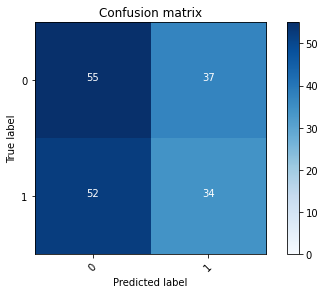

2022-08-20 21:11:23 - [Epoch Train: 46] loss: 0.1410, auc: 0.9868, acc: 0.9692, time: 50.00 s            
2022-08-20 21:11:23 - [Epoch Valid: 46] loss: 1.4352, auc: 0.5363, acc: 0.4981, time: 13.00 s


 46%|███████████████████▎                      | 46/100 [49:16<57:38, 64.05s/it]

2022-08-20 21:11:23 - EPOCH: 47
2022-08-20 21:11:24 - Train Step 10/973, train_loss: 0.1627
2022-08-20 21:11:24 - Train Step 20/973, train_loss: 0.1456
2022-08-20 21:11:25 - Train Step 30/973, train_loss: 0.1095
2022-08-20 21:11:25 - Train Step 40/973, train_loss: 0.1264
2022-08-20 21:11:26 - Train Step 50/973, train_loss: 0.1165
2022-08-20 21:11:26 - Train Step 60/973, train_loss: 0.1056
2022-08-20 21:11:27 - Train Step 70/973, train_loss: 0.0936
2022-08-20 21:11:27 - Train Step 80/973, train_loss: 0.0911
2022-08-20 21:11:28 - Train Step 90/973, train_loss: 0.0959
2022-08-20 21:11:28 - Train Step 100/973, train_loss: 0.1023
2022-08-20 21:11:29 - Train Step 110/973, train_loss: 0.1088
2022-08-20 21:11:29 - Train Step 120/973, train_loss: 0.1037
2022-08-20 21:11:30 - Train Step 130/973, train_loss: 0.1028
2022-08-20 21:11:30 - Train Step 140/973, train_loss: 0.1083
2022-08-20 21:11:31 - Train Step 150/973, train_loss: 0.1060
2022-08-20 21:11:31 - Train Step 160/973, train_loss: 0.1154
2

2022-08-20 21:12:23 - Valid Step 185/257, valid_loss: 1.7474
2022-08-20 21:12:24 - Valid Step 190/257, valid_loss: 1.7353
2022-08-20 21:12:24 - Valid Step 195/257, valid_loss: 1.7269
2022-08-20 21:12:24 - Valid Step 200/257, valid_loss: 1.7037
2022-08-20 21:12:24 - Valid Step 205/257, valid_loss: 1.6870
2022-08-20 21:12:25 - Valid Step 210/257, valid_loss: 1.6845
2022-08-20 21:12:25 - Valid Step 215/257, valid_loss: 1.6584
2022-08-20 21:12:25 - Valid Step 220/257, valid_loss: 1.6505
2022-08-20 21:12:26 - Valid Step 225/257, valid_loss: 1.6621
2022-08-20 21:12:26 - Valid Step 230/257, valid_loss: 1.7239
2022-08-20 21:12:26 - Valid Step 235/257, valid_loss: 1.7247
2022-08-20 21:12:26 - Valid Step 240/257, valid_loss: 1.6932
2022-08-20 21:12:27 - Valid Step 245/257, valid_loss: 1.7172
2022-08-20 21:12:27 - Valid Step 250/257, valid_loss: 1.6858
2022-08-20 21:12:27 - Valid Step 255/257, valid_loss: 1.6702
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

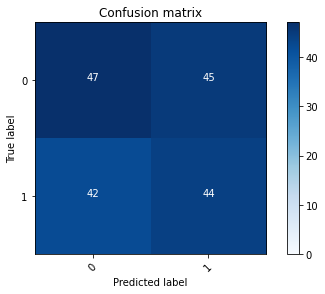

2022-08-20 21:12:27 - [Epoch Train: 47] loss: 0.1225, auc: 0.9907, acc: 0.9723, time: 50.00 s            
2022-08-20 21:12:27 - [Epoch Valid: 47] loss: 1.6985, auc: 0.5288, acc: 0.4864, time: 13.00 s


 47%|███████████████████▋                      | 47/100 [50:20<56:38, 64.12s/it]

2022-08-20 21:12:27 - EPOCH: 48
2022-08-20 21:12:28 - Train Step 10/973, train_loss: 0.0324
2022-08-20 21:12:29 - Train Step 20/973, train_loss: 0.0272
2022-08-20 21:12:29 - Train Step 30/973, train_loss: 0.0468
2022-08-20 21:12:30 - Train Step 40/973, train_loss: 0.0401
2022-08-20 21:12:30 - Train Step 50/973, train_loss: 0.0462
2022-08-20 21:12:31 - Train Step 60/973, train_loss: 0.0633
2022-08-20 21:12:31 - Train Step 70/973, train_loss: 0.0941
2022-08-20 21:12:32 - Train Step 80/973, train_loss: 0.0866
2022-08-20 21:12:32 - Train Step 90/973, train_loss: 0.0853
2022-08-20 21:12:33 - Train Step 100/973, train_loss: 0.0877
2022-08-20 21:12:33 - Train Step 110/973, train_loss: 0.0890
2022-08-20 21:12:34 - Train Step 120/973, train_loss: 0.0831
2022-08-20 21:12:34 - Train Step 130/973, train_loss: 0.0798
2022-08-20 21:12:35 - Train Step 140/973, train_loss: 0.0792
2022-08-20 21:12:35 - Train Step 150/973, train_loss: 0.0825
2022-08-20 21:12:36 - Train Step 160/973, train_loss: 0.0882
2

2022-08-20 21:13:28 - Valid Step 185/257, valid_loss: 1.5068
2022-08-20 21:13:28 - Valid Step 190/257, valid_loss: 1.5170
2022-08-20 21:13:28 - Valid Step 195/257, valid_loss: 1.5067
2022-08-20 21:13:28 - Valid Step 200/257, valid_loss: 1.4960
2022-08-20 21:13:29 - Valid Step 205/257, valid_loss: 1.4797
2022-08-20 21:13:29 - Valid Step 210/257, valid_loss: 1.4641
2022-08-20 21:13:29 - Valid Step 215/257, valid_loss: 1.4762
2022-08-20 21:13:29 - Valid Step 220/257, valid_loss: 1.4906
2022-08-20 21:13:30 - Valid Step 225/257, valid_loss: 1.4886
2022-08-20 21:13:30 - Valid Step 230/257, valid_loss: 1.5158
2022-08-20 21:13:30 - Valid Step 235/257, valid_loss: 1.5069
2022-08-20 21:13:31 - Valid Step 240/257, valid_loss: 1.5008
2022-08-20 21:13:31 - Valid Step 245/257, valid_loss: 1.5064
2022-08-20 21:13:31 - Valid Step 250/257, valid_loss: 1.4848
2022-08-20 21:13:31 - Valid Step 255/257, valid_loss: 1.4944
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

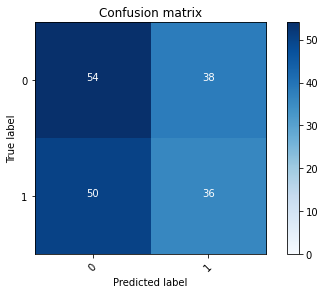

2022-08-20 21:13:32 - [Epoch Train: 48] loss: 0.1210, auc: 0.9906, acc: 0.9712, time: 50.00 s            
2022-08-20 21:13:32 - [Epoch Valid: 48] loss: 1.5009, auc: 0.5336, acc: 0.4864, time: 13.00 s


 48%|████████████████████▏                     | 48/100 [51:25<55:36, 64.17s/it]

2022-08-20 21:13:32 - EPOCH: 49
2022-08-20 21:13:32 - Train Step 10/973, train_loss: 0.1643
2022-08-20 21:13:33 - Train Step 20/973, train_loss: 0.1177
2022-08-20 21:13:33 - Train Step 30/973, train_loss: 0.1684
2022-08-20 21:13:34 - Train Step 40/973, train_loss: 0.1360
2022-08-20 21:13:34 - Train Step 50/973, train_loss: 0.1272
2022-08-20 21:13:35 - Train Step 60/973, train_loss: 0.1204
2022-08-20 21:13:35 - Train Step 70/973, train_loss: 0.1113
2022-08-20 21:13:36 - Train Step 80/973, train_loss: 0.1012
2022-08-20 21:13:36 - Train Step 90/973, train_loss: 0.1170
2022-08-20 21:13:37 - Train Step 100/973, train_loss: 0.1210
2022-08-20 21:13:38 - Train Step 110/973, train_loss: 0.1125
2022-08-20 21:13:38 - Train Step 120/973, train_loss: 0.1095
2022-08-20 21:13:39 - Train Step 130/973, train_loss: 0.1044
2022-08-20 21:13:39 - Train Step 140/973, train_loss: 0.1004
2022-08-20 21:13:40 - Train Step 150/973, train_loss: 0.0983
2022-08-20 21:13:40 - Train Step 160/973, train_loss: 0.0961
2

2022-08-20 21:14:31 - Valid Step 185/257, valid_loss: 1.7214
2022-08-20 21:14:32 - Valid Step 190/257, valid_loss: 1.7210
2022-08-20 21:14:32 - Valid Step 195/257, valid_loss: 1.7232
2022-08-20 21:14:32 - Valid Step 200/257, valid_loss: 1.7204
2022-08-20 21:14:33 - Valid Step 205/257, valid_loss: 1.6908
2022-08-20 21:14:33 - Valid Step 210/257, valid_loss: 1.6985
2022-08-20 21:14:33 - Valid Step 215/257, valid_loss: 1.6963
2022-08-20 21:14:33 - Valid Step 220/257, valid_loss: 1.6833
2022-08-20 21:14:34 - Valid Step 225/257, valid_loss: 1.6795
2022-08-20 21:14:34 - Valid Step 230/257, valid_loss: 1.6580
2022-08-20 21:14:34 - Valid Step 235/257, valid_loss: 1.7013
2022-08-20 21:14:34 - Valid Step 240/257, valid_loss: 1.7113
2022-08-20 21:14:35 - Valid Step 245/257, valid_loss: 1.7051
2022-08-20 21:14:35 - Valid Step 250/257, valid_loss: 1.6808
2022-08-20 21:14:35 - Valid Step 255/257, valid_loss: 1.6925
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

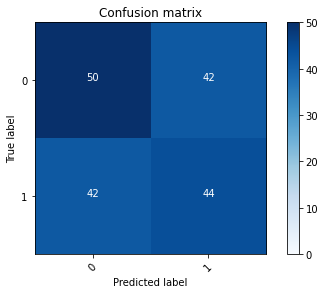

2022-08-20 21:14:35 - [Epoch Train: 49] loss: 0.1122, auc: 0.9929, acc: 0.9733, time: 50.00 s            
2022-08-20 21:14:35 - [Epoch Valid: 49] loss: 1.6940, auc: 0.5258, acc: 0.5058, time: 13.00 s


 49%|████████████████████▌                     | 49/100 [52:28<54:25, 64.03s/it]

2022-08-20 21:14:35 - EPOCH: 50
2022-08-20 21:14:36 - Train Step 10/973, train_loss: 0.1304
2022-08-20 21:14:37 - Train Step 20/973, train_loss: 0.0945
2022-08-20 21:14:37 - Train Step 30/973, train_loss: 0.0956
2022-08-20 21:14:38 - Train Step 40/973, train_loss: 0.0874
2022-08-20 21:14:38 - Train Step 50/973, train_loss: 0.1221
2022-08-20 21:14:39 - Train Step 60/973, train_loss: 0.1210
2022-08-20 21:14:39 - Train Step 70/973, train_loss: 0.1266
2022-08-20 21:14:40 - Train Step 80/973, train_loss: 0.1144
2022-08-20 21:14:40 - Train Step 90/973, train_loss: 0.1102
2022-08-20 21:14:41 - Train Step 100/973, train_loss: 0.1152
2022-08-20 21:14:41 - Train Step 110/973, train_loss: 0.1129
2022-08-20 21:14:42 - Train Step 120/973, train_loss: 0.1087
2022-08-20 21:14:42 - Train Step 130/973, train_loss: 0.1055
2022-08-20 21:14:43 - Train Step 140/973, train_loss: 0.1054
2022-08-20 21:14:43 - Train Step 150/973, train_loss: 0.1098
2022-08-20 21:14:44 - Train Step 160/973, train_loss: 0.1187
2

2022-08-20 21:15:36 - Valid Step 185/257, valid_loss: 1.9076
2022-08-20 21:15:36 - Valid Step 190/257, valid_loss: 1.9110
2022-08-20 21:15:36 - Valid Step 195/257, valid_loss: 1.8903
2022-08-20 21:15:37 - Valid Step 200/257, valid_loss: 1.8720
2022-08-20 21:15:37 - Valid Step 205/257, valid_loss: 1.8389
2022-08-20 21:15:37 - Valid Step 210/257, valid_loss: 1.8080
2022-08-20 21:15:37 - Valid Step 215/257, valid_loss: 1.7729
2022-08-20 21:15:38 - Valid Step 220/257, valid_loss: 1.7405
2022-08-20 21:15:38 - Valid Step 225/257, valid_loss: 1.7588
2022-08-20 21:15:38 - Valid Step 230/257, valid_loss: 1.8156
2022-08-20 21:15:39 - Valid Step 235/257, valid_loss: 1.8143
2022-08-20 21:15:39 - Valid Step 240/257, valid_loss: 1.8418
2022-08-20 21:15:39 - Valid Step 245/257, valid_loss: 1.8282
2022-08-20 21:15:39 - Valid Step 250/257, valid_loss: 1.8066
2022-08-20 21:15:40 - Valid Step 255/257, valid_loss: 1.8232
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

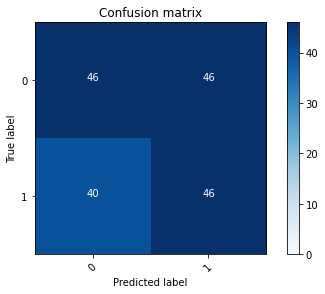

2022-08-20 21:15:40 - [Epoch Train: 50] loss: 0.1033, auc: 0.9942, acc: 0.9661, time: 50.00 s            
2022-08-20 21:15:40 - [Epoch Valid: 50] loss: 1.8418, auc: 0.5269, acc: 0.4942, time: 13.00 s


 50%|█████████████████████                     | 50/100 [53:33<53:29, 64.19s/it]

2022-08-20 21:15:40 - EPOCH: 51
2022-08-20 21:15:41 - Train Step 10/973, train_loss: 0.0426
2022-08-20 21:15:41 - Train Step 20/973, train_loss: 0.0708
2022-08-20 21:15:42 - Train Step 30/973, train_loss: 0.0578
2022-08-20 21:15:42 - Train Step 40/973, train_loss: 0.0605
2022-08-20 21:15:43 - Train Step 50/973, train_loss: 0.0809
2022-08-20 21:15:43 - Train Step 60/973, train_loss: 0.0864
2022-08-20 21:15:44 - Train Step 70/973, train_loss: 0.0782
2022-08-20 21:15:44 - Train Step 80/973, train_loss: 0.0697
2022-08-20 21:15:45 - Train Step 90/973, train_loss: 0.0645
2022-08-20 21:15:45 - Train Step 100/973, train_loss: 0.0656
2022-08-20 21:15:46 - Train Step 110/973, train_loss: 0.0702
2022-08-20 21:15:46 - Train Step 120/973, train_loss: 0.0675
2022-08-20 21:15:47 - Train Step 130/973, train_loss: 0.0724
2022-08-20 21:15:48 - Train Step 140/973, train_loss: 0.0713
2022-08-20 21:15:48 - Train Step 150/973, train_loss: 0.0690
2022-08-20 21:15:49 - Train Step 160/973, train_loss: 0.0662
2

2022-08-20 21:16:41 - Valid Step 185/257, valid_loss: 1.8216
2022-08-20 21:16:41 - Valid Step 190/257, valid_loss: 1.7967
2022-08-20 21:16:41 - Valid Step 195/257, valid_loss: 1.7949
2022-08-20 21:16:41 - Valid Step 200/257, valid_loss: 1.8324
2022-08-20 21:16:42 - Valid Step 205/257, valid_loss: 1.8480
2022-08-20 21:16:42 - Valid Step 210/257, valid_loss: 1.8727
2022-08-20 21:16:42 - Valid Step 215/257, valid_loss: 1.8885
2022-08-20 21:16:42 - Valid Step 220/257, valid_loss: 1.8852
2022-08-20 21:16:43 - Valid Step 225/257, valid_loss: 1.8736
2022-08-20 21:16:43 - Valid Step 230/257, valid_loss: 1.8680
2022-08-20 21:16:43 - Valid Step 235/257, valid_loss: 1.8560
2022-08-20 21:16:44 - Valid Step 240/257, valid_loss: 1.8509
2022-08-20 21:16:44 - Valid Step 245/257, valid_loss: 1.8171
2022-08-20 21:16:44 - Valid Step 250/257, valid_loss: 1.8472
2022-08-20 21:16:44 - Valid Step 255/257, valid_loss: 1.8434
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

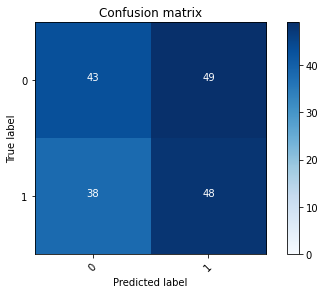

2022-08-20 21:16:45 - [Epoch Train: 51] loss: 0.0960, auc: 0.9930, acc: 0.9743, time: 51.00 s            
2022-08-20 21:16:45 - [Epoch Valid: 51] loss: 1.8400, auc: 0.5249, acc: 0.5058, time: 13.00 s


 51%|█████████████████████▍                    | 51/100 [54:38<52:32, 64.34s/it]

2022-08-20 21:16:45 - EPOCH: 52
2022-08-20 21:16:45 - Train Step 10/973, train_loss: 0.1338
2022-08-20 21:16:46 - Train Step 20/973, train_loss: 0.0801
2022-08-20 21:16:46 - Train Step 30/973, train_loss: 0.0746
2022-08-20 21:16:47 - Train Step 40/973, train_loss: 0.0741
2022-08-20 21:16:47 - Train Step 50/973, train_loss: 0.0647
2022-08-20 21:16:48 - Train Step 60/973, train_loss: 0.0593
2022-08-20 21:16:48 - Train Step 70/973, train_loss: 0.0687
2022-08-20 21:16:49 - Train Step 80/973, train_loss: 0.0626
2022-08-20 21:16:49 - Train Step 90/973, train_loss: 0.0590
2022-08-20 21:16:50 - Train Step 100/973, train_loss: 0.0622
2022-08-20 21:16:50 - Train Step 110/973, train_loss: 0.0602
2022-08-20 21:16:51 - Train Step 120/973, train_loss: 0.0691
2022-08-20 21:16:52 - Train Step 130/973, train_loss: 0.0656
2022-08-20 21:16:52 - Train Step 140/973, train_loss: 0.0651
2022-08-20 21:16:53 - Train Step 150/973, train_loss: 0.0641
2022-08-20 21:16:53 - Train Step 160/973, train_loss: 0.0701
2

2022-08-20 21:17:45 - Valid Step 185/257, valid_loss: 1.6260
2022-08-20 21:17:45 - Valid Step 190/257, valid_loss: 1.6706
2022-08-20 21:17:45 - Valid Step 195/257, valid_loss: 1.6778
2022-08-20 21:17:46 - Valid Step 200/257, valid_loss: 1.6871
2022-08-20 21:17:46 - Valid Step 205/257, valid_loss: 1.6920
2022-08-20 21:17:46 - Valid Step 210/257, valid_loss: 1.7138
2022-08-20 21:17:46 - Valid Step 215/257, valid_loss: 1.7283
2022-08-20 21:17:47 - Valid Step 220/257, valid_loss: 1.7543
2022-08-20 21:17:47 - Valid Step 225/257, valid_loss: 1.7560
2022-08-20 21:17:47 - Valid Step 230/257, valid_loss: 1.7618
2022-08-20 21:17:47 - Valid Step 235/257, valid_loss: 1.7606
2022-08-20 21:17:48 - Valid Step 240/257, valid_loss: 1.7949
2022-08-20 21:17:48 - Valid Step 245/257, valid_loss: 1.8575
2022-08-20 21:17:48 - Valid Step 250/257, valid_loss: 1.8485
2022-08-20 21:17:48 - Valid Step 255/257, valid_loss: 1.8126
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

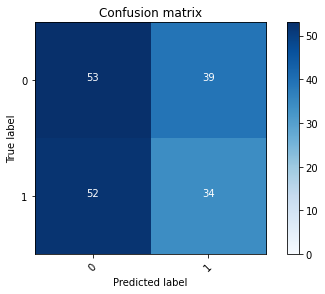

2022-08-20 21:17:49 - [Epoch Train: 52] loss: 0.0902, auc: 0.9951, acc: 0.9774, time: 50.00 s            
2022-08-20 21:17:49 - [Epoch Valid: 52] loss: 1.8361, auc: 0.5294, acc: 0.4747, time: 13.00 s


 52%|█████████████████████▊                    | 52/100 [55:42<51:24, 64.27s/it]

2022-08-20 21:17:49 - EPOCH: 53
2022-08-20 21:17:49 - Train Step 10/973, train_loss: 0.0673
2022-08-20 21:17:50 - Train Step 20/973, train_loss: 0.0644
2022-08-20 21:17:50 - Train Step 30/973, train_loss: 0.0601
2022-08-20 21:17:51 - Train Step 40/973, train_loss: 0.0544
2022-08-20 21:17:51 - Train Step 50/973, train_loss: 0.0591
2022-08-20 21:17:52 - Train Step 60/973, train_loss: 0.0617
2022-08-20 21:17:52 - Train Step 70/973, train_loss: 0.0745
2022-08-20 21:17:53 - Train Step 80/973, train_loss: 0.0730
2022-08-20 21:17:53 - Train Step 90/973, train_loss: 0.0682
2022-08-20 21:17:54 - Train Step 100/973, train_loss: 0.0824
2022-08-20 21:17:54 - Train Step 110/973, train_loss: 0.0818
2022-08-20 21:17:55 - Train Step 120/973, train_loss: 0.0777
2022-08-20 21:17:55 - Train Step 130/973, train_loss: 0.0730
2022-08-20 21:17:56 - Train Step 140/973, train_loss: 0.0745
2022-08-20 21:17:56 - Train Step 150/973, train_loss: 0.0710
2022-08-20 21:17:57 - Train Step 160/973, train_loss: 0.0716
2

2022-08-20 21:18:49 - Valid Step 185/257, valid_loss: 1.9513
2022-08-20 21:18:49 - Valid Step 190/257, valid_loss: 2.0214
2022-08-20 21:18:50 - Valid Step 195/257, valid_loss: 2.0281
2022-08-20 21:18:50 - Valid Step 200/257, valid_loss: 2.0344
2022-08-20 21:18:50 - Valid Step 205/257, valid_loss: 2.0072
2022-08-20 21:18:50 - Valid Step 210/257, valid_loss: 1.9854
2022-08-20 21:18:51 - Valid Step 215/257, valid_loss: 1.9600
2022-08-20 21:18:51 - Valid Step 220/257, valid_loss: 1.9401
2022-08-20 21:18:51 - Valid Step 225/257, valid_loss: 1.9380
2022-08-20 21:18:51 - Valid Step 230/257, valid_loss: 1.8979
2022-08-20 21:18:52 - Valid Step 235/257, valid_loss: 1.8631
2022-08-20 21:18:52 - Valid Step 240/257, valid_loss: 1.8643
2022-08-20 21:18:52 - Valid Step 245/257, valid_loss: 1.8483
2022-08-20 21:18:52 - Valid Step 250/257, valid_loss: 1.8279
2022-08-20 21:18:53 - Valid Step 255/257, valid_loss: 1.8397
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

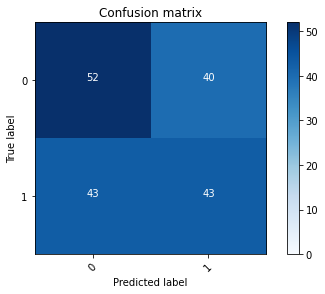

2022-08-20 21:18:53 - [Epoch Train: 53] loss: 0.0760, auc: 0.9976, acc: 0.9856, time: 50.00 s            
2022-08-20 21:18:53 - [Epoch Valid: 53] loss: 1.8402, auc: 0.5307, acc: 0.5097, time: 13.00 s


 53%|██████████████████████▎                   | 53/100 [56:46<50:20, 64.26s/it]

2022-08-20 21:18:53 - EPOCH: 54
2022-08-20 21:18:54 - Train Step 10/973, train_loss: 0.1334
2022-08-20 21:18:54 - Train Step 20/973, train_loss: 0.1164
2022-08-20 21:18:55 - Train Step 30/973, train_loss: 0.1001
2022-08-20 21:18:55 - Train Step 40/973, train_loss: 0.0924
2022-08-20 21:18:56 - Train Step 50/973, train_loss: 0.0918
2022-08-20 21:18:56 - Train Step 60/973, train_loss: 0.0882
2022-08-20 21:18:57 - Train Step 70/973, train_loss: 0.0963
2022-08-20 21:18:57 - Train Step 80/973, train_loss: 0.0956
2022-08-20 21:18:58 - Train Step 90/973, train_loss: 0.0939
2022-08-20 21:18:58 - Train Step 100/973, train_loss: 0.0952
2022-08-20 21:18:59 - Train Step 110/973, train_loss: 0.0948
2022-08-20 21:18:59 - Train Step 120/973, train_loss: 0.0913
2022-08-20 21:19:00 - Train Step 130/973, train_loss: 0.0987
2022-08-20 21:19:00 - Train Step 140/973, train_loss: 0.0985
2022-08-20 21:19:01 - Train Step 150/973, train_loss: 0.0947
2022-08-20 21:19:01 - Train Step 160/973, train_loss: 0.0897
2

2022-08-20 21:19:53 - Valid Step 185/257, valid_loss: 2.1483
2022-08-20 21:19:53 - Valid Step 190/257, valid_loss: 2.2107
2022-08-20 21:19:54 - Valid Step 195/257, valid_loss: 2.1862
2022-08-20 21:19:54 - Valid Step 200/257, valid_loss: 2.1642
2022-08-20 21:19:54 - Valid Step 205/257, valid_loss: 2.1769
2022-08-20 21:19:54 - Valid Step 210/257, valid_loss: 2.2415
2022-08-20 21:19:55 - Valid Step 215/257, valid_loss: 2.2994
2022-08-20 21:19:55 - Valid Step 220/257, valid_loss: 2.2598
2022-08-20 21:19:55 - Valid Step 225/257, valid_loss: 2.2256
2022-08-20 21:19:55 - Valid Step 230/257, valid_loss: 2.1890
2022-08-20 21:19:56 - Valid Step 235/257, valid_loss: 2.1487
2022-08-20 21:19:56 - Valid Step 240/257, valid_loss: 2.1479
2022-08-20 21:19:56 - Valid Step 245/257, valid_loss: 2.1087
2022-08-20 21:19:56 - Valid Step 250/257, valid_loss: 2.0791
2022-08-20 21:19:57 - Valid Step 255/257, valid_loss: 2.0613
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

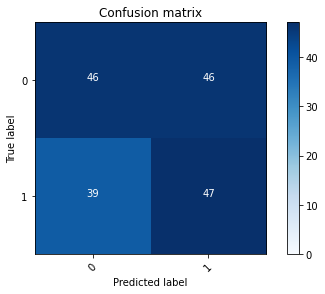

2022-08-20 21:19:57 - [Epoch Train: 54] loss: 0.0753, auc: 0.9964, acc: 0.9846, time: 50.00 s            
2022-08-20 21:19:57 - [Epoch Valid: 54] loss: 2.0579, auc: 0.5245, acc: 0.5058, time: 13.00 s


 54%|██████████████████████▋                   | 54/100 [57:50<49:13, 64.20s/it]

2022-08-20 21:19:57 - EPOCH: 55
2022-08-20 21:19:58 - Train Step 10/973, train_loss: 0.0441
2022-08-20 21:19:58 - Train Step 20/973, train_loss: 0.0818
2022-08-20 21:19:59 - Train Step 30/973, train_loss: 0.0632
2022-08-20 21:19:59 - Train Step 40/973, train_loss: 0.0507
2022-08-20 21:20:00 - Train Step 50/973, train_loss: 0.0542
2022-08-20 21:20:00 - Train Step 60/973, train_loss: 0.0535
2022-08-20 21:20:01 - Train Step 70/973, train_loss: 0.0529
2022-08-20 21:20:02 - Train Step 80/973, train_loss: 0.0527
2022-08-20 21:20:02 - Train Step 90/973, train_loss: 0.0482
2022-08-20 21:20:03 - Train Step 100/973, train_loss: 0.0458
2022-08-20 21:20:03 - Train Step 110/973, train_loss: 0.0491
2022-08-20 21:20:04 - Train Step 120/973, train_loss: 0.0502
2022-08-20 21:20:04 - Train Step 130/973, train_loss: 0.0483
2022-08-20 21:20:05 - Train Step 140/973, train_loss: 0.0537
2022-08-20 21:20:05 - Train Step 150/973, train_loss: 0.0679
2022-08-20 21:20:06 - Train Step 160/973, train_loss: 0.0736
2

2022-08-20 21:20:57 - Valid Step 185/257, valid_loss: 2.0152
2022-08-20 21:20:58 - Valid Step 190/257, valid_loss: 1.9869
2022-08-20 21:20:58 - Valid Step 195/257, valid_loss: 2.0111
2022-08-20 21:20:58 - Valid Step 200/257, valid_loss: 1.9891
2022-08-20 21:20:58 - Valid Step 205/257, valid_loss: 1.9891
2022-08-20 21:20:59 - Valid Step 210/257, valid_loss: 2.0161
2022-08-20 21:20:59 - Valid Step 215/257, valid_loss: 2.1128
2022-08-20 21:20:59 - Valid Step 220/257, valid_loss: 2.1226
2022-08-20 21:20:59 - Valid Step 225/257, valid_loss: 2.1170
2022-08-20 21:21:00 - Valid Step 230/257, valid_loss: 2.1012
2022-08-20 21:21:00 - Valid Step 235/257, valid_loss: 2.0649
2022-08-20 21:21:00 - Valid Step 240/257, valid_loss: 2.1066
2022-08-20 21:21:00 - Valid Step 245/257, valid_loss: 2.0841
2022-08-20 21:21:01 - Valid Step 250/257, valid_loss: 2.0562
2022-08-20 21:21:01 - Valid Step 255/257, valid_loss: 2.1680
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

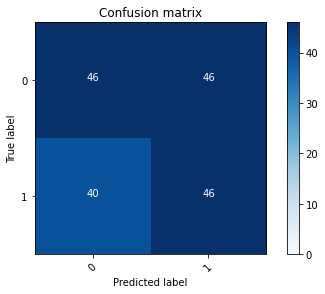

2022-08-20 21:21:01 - [Epoch Train: 55] loss: 0.0670, auc: 0.9980, acc: 0.9877, time: 50.00 s            
2022-08-20 21:21:01 - [Epoch Valid: 55] loss: 2.1694, auc: 0.5291, acc: 0.4942, time: 13.00 s


 55%|███████████████████████                   | 55/100 [58:54<48:10, 64.24s/it]

2022-08-20 21:21:01 - EPOCH: 56
2022-08-20 21:21:02 - Train Step 10/973, train_loss: 0.0667
2022-08-20 21:21:03 - Train Step 20/973, train_loss: 0.0457
2022-08-20 21:21:03 - Train Step 30/973, train_loss: 0.0422
2022-08-20 21:21:04 - Train Step 40/973, train_loss: 0.0510
2022-08-20 21:21:04 - Train Step 50/973, train_loss: 0.0535
2022-08-20 21:21:05 - Train Step 60/973, train_loss: 0.0547
2022-08-20 21:21:05 - Train Step 70/973, train_loss: 0.0915
2022-08-20 21:21:06 - Train Step 80/973, train_loss: 0.0867
2022-08-20 21:21:06 - Train Step 90/973, train_loss: 0.1067
2022-08-20 21:21:07 - Train Step 100/973, train_loss: 0.1190
2022-08-20 21:21:07 - Train Step 110/973, train_loss: 0.1202
2022-08-20 21:21:08 - Train Step 120/973, train_loss: 0.1149
2022-08-20 21:21:08 - Train Step 130/973, train_loss: 0.1106
2022-08-20 21:21:09 - Train Step 140/973, train_loss: 0.1081
2022-08-20 21:21:09 - Train Step 150/973, train_loss: 0.1015
2022-08-20 21:21:10 - Train Step 160/973, train_loss: 0.0975
2

2022-08-20 21:22:03 - Valid Step 185/257, valid_loss: 2.3409
2022-08-20 21:22:03 - Valid Step 190/257, valid_loss: 2.2807
2022-08-20 21:22:03 - Valid Step 195/257, valid_loss: 2.2398
2022-08-20 21:22:04 - Valid Step 200/257, valid_loss: 2.2700
2022-08-20 21:22:04 - Valid Step 205/257, valid_loss: 2.2401
2022-08-20 21:22:04 - Valid Step 210/257, valid_loss: 2.2223
2022-08-20 21:22:04 - Valid Step 215/257, valid_loss: 2.1833
2022-08-20 21:22:05 - Valid Step 220/257, valid_loss: 2.2178
2022-08-20 21:22:05 - Valid Step 225/257, valid_loss: 2.2362
2022-08-20 21:22:05 - Valid Step 230/257, valid_loss: 2.2046
2022-08-20 21:22:05 - Valid Step 235/257, valid_loss: 2.1806
2022-08-20 21:22:06 - Valid Step 240/257, valid_loss: 2.1901
2022-08-20 21:22:06 - Valid Step 245/257, valid_loss: 2.1610
2022-08-20 21:22:06 - Valid Step 250/257, valid_loss: 2.1762
2022-08-20 21:22:06 - Valid Step 255/257, valid_loss: 2.1628
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

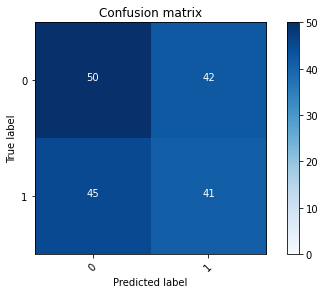

2022-08-20 21:22:07 - [Epoch Train: 56] loss: 0.0754, auc: 0.9969, acc: 0.9846, time: 51.00 s            
2022-08-20 21:22:07 - [Epoch Valid: 56] loss: 2.1489, auc: 0.5306, acc: 0.4903, time: 13.00 s


 56%|██████████████████████▍                 | 56/100 [1:00:00<47:21, 64.57s/it]

2022-08-20 21:22:07 - EPOCH: 57
2022-08-20 21:22:07 - Train Step 10/973, train_loss: 0.0563
2022-08-20 21:22:08 - Train Step 20/973, train_loss: 0.0439
2022-08-20 21:22:08 - Train Step 30/973, train_loss: 0.0360
2022-08-20 21:22:09 - Train Step 40/973, train_loss: 0.0376
2022-08-20 21:22:09 - Train Step 50/973, train_loss: 0.0494
2022-08-20 21:22:10 - Train Step 60/973, train_loss: 0.0448
2022-08-20 21:22:11 - Train Step 70/973, train_loss: 0.0604
2022-08-20 21:22:11 - Train Step 80/973, train_loss: 0.0636
2022-08-20 21:22:12 - Train Step 90/973, train_loss: 0.0648
2022-08-20 21:22:12 - Train Step 100/973, train_loss: 0.0610
2022-08-20 21:22:13 - Train Step 110/973, train_loss: 0.0593
2022-08-20 21:22:13 - Train Step 120/973, train_loss: 0.0558
2022-08-20 21:22:14 - Train Step 130/973, train_loss: 0.0524
2022-08-20 21:22:14 - Train Step 140/973, train_loss: 0.0503
2022-08-20 21:22:15 - Train Step 150/973, train_loss: 0.0486
2022-08-20 21:22:15 - Train Step 160/973, train_loss: 0.0475
2

2022-08-20 21:23:07 - Valid Step 185/257, valid_loss: 1.9797
2022-08-20 21:23:07 - Valid Step 190/257, valid_loss: 1.9883
2022-08-20 21:23:08 - Valid Step 195/257, valid_loss: 1.9747
2022-08-20 21:23:08 - Valid Step 200/257, valid_loss: 1.9734
2022-08-20 21:23:08 - Valid Step 205/257, valid_loss: 1.9730
2022-08-20 21:23:09 - Valid Step 210/257, valid_loss: 1.9583
2022-08-20 21:23:09 - Valid Step 215/257, valid_loss: 1.9519
2022-08-20 21:23:09 - Valid Step 220/257, valid_loss: 1.9490
2022-08-20 21:23:09 - Valid Step 225/257, valid_loss: 1.9212
2022-08-20 21:23:10 - Valid Step 230/257, valid_loss: 1.9455
2022-08-20 21:23:10 - Valid Step 235/257, valid_loss: 1.9531
2022-08-20 21:23:10 - Valid Step 240/257, valid_loss: 1.9372
2022-08-20 21:23:10 - Valid Step 245/257, valid_loss: 1.9034
2022-08-20 21:23:11 - Valid Step 250/257, valid_loss: 1.9024
2022-08-20 21:23:11 - Valid Step 255/257, valid_loss: 1.9274
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

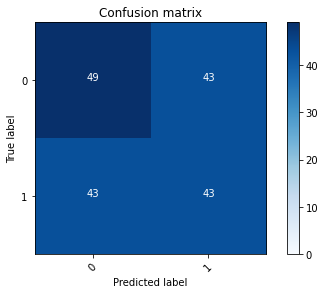

2022-08-20 21:23:11 - [Epoch Train: 57] loss: 0.0710, auc: 0.9981, acc: 0.9774, time: 50.00 s            
2022-08-20 21:23:11 - [Epoch Valid: 57] loss: 1.9193, auc: 0.5284, acc: 0.4903, time: 13.00 s


 57%|██████████████████████▊                 | 57/100 [1:01:04<46:15, 64.56s/it]

2022-08-20 21:23:11 - EPOCH: 58
2022-08-20 21:23:12 - Train Step 10/973, train_loss: 0.0297
2022-08-20 21:23:12 - Train Step 20/973, train_loss: 0.0328
2022-08-20 21:23:13 - Train Step 30/973, train_loss: 0.0305
2022-08-20 21:23:13 - Train Step 40/973, train_loss: 0.0265
2022-08-20 21:23:14 - Train Step 50/973, train_loss: 0.0333
2022-08-20 21:23:15 - Train Step 60/973, train_loss: 0.0294
2022-08-20 21:23:15 - Train Step 70/973, train_loss: 0.0362
2022-08-20 21:23:16 - Train Step 80/973, train_loss: 0.0412
2022-08-20 21:23:16 - Train Step 90/973, train_loss: 0.0377
2022-08-20 21:23:17 - Train Step 100/973, train_loss: 0.0355
2022-08-20 21:23:17 - Train Step 110/973, train_loss: 0.0365
2022-08-20 21:23:18 - Train Step 120/973, train_loss: 0.0352
2022-08-20 21:23:18 - Train Step 130/973, train_loss: 0.0333
2022-08-20 21:23:19 - Train Step 140/973, train_loss: 0.0349
2022-08-20 21:23:19 - Train Step 150/973, train_loss: 0.0380
2022-08-20 21:23:20 - Train Step 160/973, train_loss: 0.0364
2

2022-08-20 21:24:12 - Valid Step 185/257, valid_loss: 2.2165
2022-08-20 21:24:13 - Valid Step 190/257, valid_loss: 2.2822
2022-08-20 21:24:13 - Valid Step 195/257, valid_loss: 2.2913
2022-08-20 21:24:13 - Valid Step 200/257, valid_loss: 2.2577
2022-08-20 21:24:13 - Valid Step 205/257, valid_loss: 2.2300
2022-08-20 21:24:14 - Valid Step 210/257, valid_loss: 2.1943
2022-08-20 21:24:14 - Valid Step 215/257, valid_loss: 2.1822
2022-08-20 21:24:14 - Valid Step 220/257, valid_loss: 2.1639
2022-08-20 21:24:14 - Valid Step 225/257, valid_loss: 2.1421
2022-08-20 21:24:15 - Valid Step 230/257, valid_loss: 2.1411
2022-08-20 21:24:15 - Valid Step 235/257, valid_loss: 2.1463
2022-08-20 21:24:15 - Valid Step 240/257, valid_loss: 2.1278
2022-08-20 21:24:15 - Valid Step 245/257, valid_loss: 2.1234
2022-08-20 21:24:16 - Valid Step 250/257, valid_loss: 2.1144
2022-08-20 21:24:16 - Valid Step 255/257, valid_loss: 2.1409
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

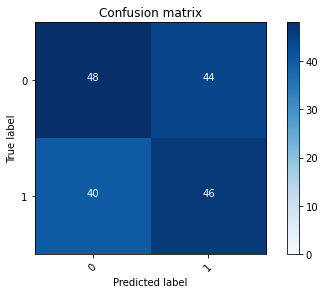

2022-08-20 21:24:16 - [Epoch Train: 58] loss: 0.0676, auc: 0.9981, acc: 0.9846, time: 51.00 s            
2022-08-20 21:24:16 - [Epoch Valid: 58] loss: 2.1256, auc: 0.5238, acc: 0.5019, time: 13.00 s


 58%|███████████████████████▏                | 58/100 [1:02:09<45:17, 64.71s/it]

2022-08-20 21:24:16 - EPOCH: 59
2022-08-20 21:24:17 - Train Step 10/973, train_loss: 0.0378
2022-08-20 21:24:18 - Train Step 20/973, train_loss: 0.0453
2022-08-20 21:24:18 - Train Step 30/973, train_loss: 0.0370
2022-08-20 21:24:19 - Train Step 40/973, train_loss: 0.0434
2022-08-20 21:24:19 - Train Step 50/973, train_loss: 0.0416
2022-08-20 21:24:20 - Train Step 60/973, train_loss: 0.0405
2022-08-20 21:24:20 - Train Step 70/973, train_loss: 0.0400
2022-08-20 21:24:21 - Train Step 80/973, train_loss: 0.0441
2022-08-20 21:24:21 - Train Step 90/973, train_loss: 0.0402
2022-08-20 21:24:22 - Train Step 100/973, train_loss: 0.0806
2022-08-20 21:24:22 - Train Step 110/973, train_loss: 0.0774
2022-08-20 21:24:23 - Train Step 120/973, train_loss: 0.0895
2022-08-20 21:24:23 - Train Step 130/973, train_loss: 0.0837
2022-08-20 21:24:24 - Train Step 140/973, train_loss: 0.0856
2022-08-20 21:24:24 - Train Step 150/973, train_loss: 0.0834
2022-08-20 21:24:25 - Train Step 160/973, train_loss: 0.0808
2

2022-08-20 21:25:17 - Valid Step 185/257, valid_loss: 2.0128
2022-08-20 21:25:17 - Valid Step 190/257, valid_loss: 2.0211
2022-08-20 21:25:17 - Valid Step 195/257, valid_loss: 1.9879
2022-08-20 21:25:18 - Valid Step 200/257, valid_loss: 1.9609
2022-08-20 21:25:18 - Valid Step 205/257, valid_loss: 2.0560
2022-08-20 21:25:18 - Valid Step 210/257, valid_loss: 2.0574
2022-08-20 21:25:18 - Valid Step 215/257, valid_loss: 2.0294
2022-08-20 21:25:19 - Valid Step 220/257, valid_loss: 2.0606
2022-08-20 21:25:19 - Valid Step 225/257, valid_loss: 2.0939
2022-08-20 21:25:19 - Valid Step 230/257, valid_loss: 2.1119
2022-08-20 21:25:19 - Valid Step 235/257, valid_loss: 2.1253
2022-08-20 21:25:20 - Valid Step 240/257, valid_loss: 2.1104
2022-08-20 21:25:20 - Valid Step 245/257, valid_loss: 2.1651
2022-08-20 21:25:20 - Valid Step 250/257, valid_loss: 2.1462
2022-08-20 21:25:20 - Valid Step 255/257, valid_loss: 2.1809
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

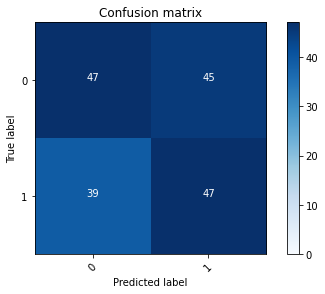

2022-08-20 21:25:21 - [Epoch Train: 59] loss: 0.0611, auc: 0.9983, acc: 0.9856, time: 50.00 s            
2022-08-20 21:25:21 - [Epoch Valid: 59] loss: 2.1872, auc: 0.5217, acc: 0.5097, time: 13.00 s


 59%|███████████████████████▌                | 59/100 [1:03:14<44:09, 64.62s/it]

2022-08-20 21:25:21 - EPOCH: 60
2022-08-20 21:25:21 - Train Step 10/973, train_loss: 0.2260
2022-08-20 21:25:22 - Train Step 20/973, train_loss: 0.1243
2022-08-20 21:25:22 - Train Step 30/973, train_loss: 0.0998
2022-08-20 21:25:23 - Train Step 40/973, train_loss: 0.1004
2022-08-20 21:25:23 - Train Step 50/973, train_loss: 0.1071
2022-08-20 21:25:24 - Train Step 60/973, train_loss: 0.1102
2022-08-20 21:25:25 - Train Step 70/973, train_loss: 0.1062
2022-08-20 21:25:25 - Train Step 80/973, train_loss: 0.0981
2022-08-20 21:25:26 - Train Step 90/973, train_loss: 0.0955
2022-08-20 21:25:26 - Train Step 100/973, train_loss: 0.0948
2022-08-20 21:25:27 - Train Step 110/973, train_loss: 0.0954
2022-08-20 21:25:27 - Train Step 120/973, train_loss: 0.0902
2022-08-20 21:25:28 - Train Step 130/973, train_loss: 0.0885
2022-08-20 21:25:28 - Train Step 140/973, train_loss: 0.0841
2022-08-20 21:25:29 - Train Step 150/973, train_loss: 0.0798
2022-08-20 21:25:29 - Train Step 160/973, train_loss: 0.0757
2

2022-08-20 21:26:22 - Valid Step 185/257, valid_loss: 2.9710
2022-08-20 21:26:22 - Valid Step 190/257, valid_loss: 2.9571
2022-08-20 21:26:23 - Valid Step 195/257, valid_loss: 3.0370
2022-08-20 21:26:23 - Valid Step 200/257, valid_loss: 2.9884
2022-08-20 21:26:23 - Valid Step 205/257, valid_loss: 2.9203
2022-08-20 21:26:24 - Valid Step 210/257, valid_loss: 2.8555
2022-08-20 21:26:24 - Valid Step 215/257, valid_loss: 2.8518
2022-08-20 21:26:24 - Valid Step 220/257, valid_loss: 2.8174
2022-08-20 21:26:25 - Valid Step 225/257, valid_loss: 2.7795
2022-08-20 21:26:25 - Valid Step 230/257, valid_loss: 2.7567
2022-08-20 21:26:25 - Valid Step 235/257, valid_loss: 2.7128
2022-08-20 21:26:26 - Valid Step 240/257, valid_loss: 2.6908
2022-08-20 21:26:26 - Valid Step 245/257, valid_loss: 2.7804
2022-08-20 21:26:26 - Valid Step 250/257, valid_loss: 2.7821
2022-08-20 21:26:27 - Valid Step 255/257, valid_loss: 2.7644
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

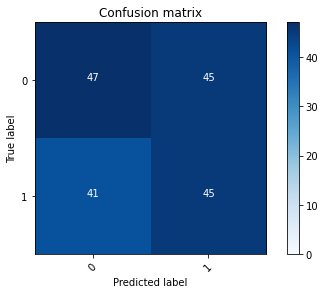

2022-08-20 21:26:27 - [Epoch Train: 60] loss: 0.0595, auc: 0.9989, acc: 0.9897, time: 50.00 s            
2022-08-20 21:26:27 - [Epoch Valid: 60] loss: 2.7442, auc: 0.5219, acc: 0.4942, time: 15.00 s


 60%|████████████████████████                | 60/100 [1:04:20<43:23, 65.08s/it]

2022-08-20 21:26:27 - EPOCH: 61
2022-08-20 21:26:28 - Train Step 10/973, train_loss: 0.0051
2022-08-20 21:26:28 - Train Step 20/973, train_loss: 0.0310
2022-08-20 21:26:29 - Train Step 30/973, train_loss: 0.0321
2022-08-20 21:26:29 - Train Step 40/973, train_loss: 0.0434
2022-08-20 21:26:30 - Train Step 50/973, train_loss: 0.0410
2022-08-20 21:26:30 - Train Step 60/973, train_loss: 0.0367
2022-08-20 21:26:31 - Train Step 70/973, train_loss: 0.0332
2022-08-20 21:26:32 - Train Step 80/973, train_loss: 0.0331
2022-08-20 21:26:32 - Train Step 90/973, train_loss: 0.0351
2022-08-20 21:26:33 - Train Step 100/973, train_loss: 0.0403
2022-08-20 21:26:33 - Train Step 110/973, train_loss: 0.0386
2022-08-20 21:26:34 - Train Step 120/973, train_loss: 0.0360
2022-08-20 21:26:35 - Train Step 130/973, train_loss: 0.0422
2022-08-20 21:26:35 - Train Step 140/973, train_loss: 0.0405
2022-08-20 21:26:36 - Train Step 150/973, train_loss: 0.0436
2022-08-20 21:26:36 - Train Step 160/973, train_loss: 0.0430
2

2022-08-20 21:27:37 - Valid Step 185/257, valid_loss: 2.3872
2022-08-20 21:27:37 - Valid Step 190/257, valid_loss: 2.3895
2022-08-20 21:27:37 - Valid Step 195/257, valid_loss: 2.3397
2022-08-20 21:27:38 - Valid Step 200/257, valid_loss: 2.3385
2022-08-20 21:27:38 - Valid Step 205/257, valid_loss: 2.3859
2022-08-20 21:27:38 - Valid Step 210/257, valid_loss: 2.3851
2022-08-20 21:27:38 - Valid Step 215/257, valid_loss: 2.3730
2022-08-20 21:27:39 - Valid Step 220/257, valid_loss: 2.3470
2022-08-20 21:27:39 - Valid Step 225/257, valid_loss: 2.3701
2022-08-20 21:27:39 - Valid Step 230/257, valid_loss: 2.3211
2022-08-20 21:27:40 - Valid Step 235/257, valid_loss: 2.2973
2022-08-20 21:27:40 - Valid Step 240/257, valid_loss: 2.2930
2022-08-20 21:27:40 - Valid Step 245/257, valid_loss: 2.2840
2022-08-20 21:27:41 - Valid Step 250/257, valid_loss: 2.2637
2022-08-20 21:27:41 - Valid Step 255/257, valid_loss: 2.2769
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

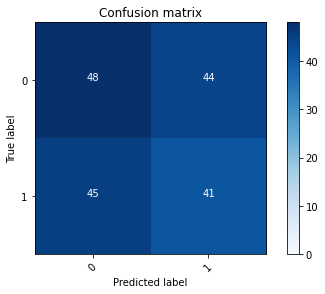

2022-08-20 21:27:41 - [Epoch Train: 61] loss: 0.0535, auc: 0.9990, acc: 0.9836, time: 59.00 s            
2022-08-20 21:27:41 - [Epoch Valid: 61] loss: 2.2718, auc: 0.5252, acc: 0.4786, time: 15.00 s


 61%|████████████████████████▍               | 61/100 [1:05:34<44:05, 67.84s/it]

2022-08-20 21:27:41 - EPOCH: 62
2022-08-20 21:27:42 - Train Step 10/973, train_loss: 0.0662
2022-08-20 21:27:42 - Train Step 20/973, train_loss: 0.0446
2022-08-20 21:27:43 - Train Step 30/973, train_loss: 0.0370
2022-08-20 21:27:44 - Train Step 40/973, train_loss: 0.0333
2022-08-20 21:27:44 - Train Step 50/973, train_loss: 0.0414
2022-08-20 21:27:45 - Train Step 60/973, train_loss: 0.0843
2022-08-20 21:27:45 - Train Step 70/973, train_loss: 0.0725
2022-08-20 21:27:46 - Train Step 80/973, train_loss: 0.0701
2022-08-20 21:27:47 - Train Step 90/973, train_loss: 0.0670
2022-08-20 21:27:47 - Train Step 100/973, train_loss: 0.0629
2022-08-20 21:27:48 - Train Step 110/973, train_loss: 0.0594
2022-08-20 21:27:48 - Train Step 120/973, train_loss: 0.0560
2022-08-20 21:27:49 - Train Step 130/973, train_loss: 0.0545
2022-08-20 21:27:50 - Train Step 140/973, train_loss: 0.0575
2022-08-20 21:27:50 - Train Step 150/973, train_loss: 0.0567
2022-08-20 21:27:51 - Train Step 160/973, train_loss: 0.0544
2

2022-08-20 21:28:52 - Valid Step 185/257, valid_loss: 2.3122
2022-08-20 21:28:52 - Valid Step 190/257, valid_loss: 2.2912
2022-08-20 21:28:52 - Valid Step 195/257, valid_loss: 2.2915
2022-08-20 21:28:52 - Valid Step 200/257, valid_loss: 2.3253
2022-08-20 21:28:53 - Valid Step 205/257, valid_loss: 2.3810
2022-08-20 21:28:53 - Valid Step 210/257, valid_loss: 2.3572
2022-08-20 21:28:53 - Valid Step 215/257, valid_loss: 2.3204
2022-08-20 21:28:54 - Valid Step 220/257, valid_loss: 2.2958
2022-08-20 21:28:54 - Valid Step 225/257, valid_loss: 2.2512
2022-08-20 21:28:54 - Valid Step 230/257, valid_loss: 2.2390
2022-08-20 21:28:54 - Valid Step 235/257, valid_loss: 2.2496
2022-08-20 21:28:55 - Valid Step 240/257, valid_loss: 2.2585
2022-08-20 21:28:55 - Valid Step 245/257, valid_loss: 2.3155
2022-08-20 21:28:56 - Valid Step 250/257, valid_loss: 2.2749
2022-08-20 21:28:56 - Valid Step 255/257, valid_loss: 2.2500
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

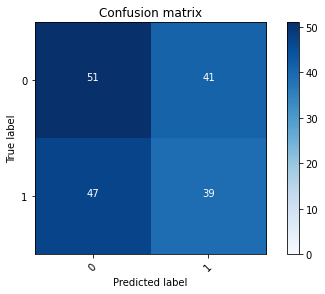

2022-08-20 21:28:56 - [Epoch Train: 62] loss: 0.0477, auc: 0.9996, acc: 0.9918, time: 59.00 s            
2022-08-20 21:28:56 - [Epoch Valid: 62] loss: 2.2382, auc: 0.5269, acc: 0.4903, time: 15.00 s


 62%|████████████████████████▊               | 62/100 [1:06:49<44:19, 69.99s/it]

2022-08-20 21:28:56 - EPOCH: 63
2022-08-20 21:28:57 - Train Step 10/973, train_loss: 0.0039
2022-08-20 21:28:57 - Train Step 20/973, train_loss: 0.0444
2022-08-20 21:28:58 - Train Step 30/973, train_loss: 0.0389
2022-08-20 21:28:59 - Train Step 40/973, train_loss: 0.0350
2022-08-20 21:28:59 - Train Step 50/973, train_loss: 0.0442
2022-08-20 21:29:00 - Train Step 60/973, train_loss: 0.0411
2022-08-20 21:29:00 - Train Step 70/973, train_loss: 0.0432
2022-08-20 21:29:01 - Train Step 80/973, train_loss: 0.0444
2022-08-20 21:29:02 - Train Step 90/973, train_loss: 0.0427
2022-08-20 21:29:02 - Train Step 100/973, train_loss: 0.0425
2022-08-20 21:29:03 - Train Step 110/973, train_loss: 0.0439
2022-08-20 21:29:03 - Train Step 120/973, train_loss: 0.0415
2022-08-20 21:29:04 - Train Step 130/973, train_loss: 0.0403
2022-08-20 21:29:04 - Train Step 140/973, train_loss: 0.0437
2022-08-20 21:29:05 - Train Step 150/973, train_loss: 0.0436
2022-08-20 21:29:06 - Train Step 160/973, train_loss: 0.0412
2

2022-08-20 21:30:05 - Valid Step 185/257, valid_loss: 2.3946
2022-08-20 21:30:05 - Valid Step 190/257, valid_loss: 2.3906
2022-08-20 21:30:06 - Valid Step 195/257, valid_loss: 2.3605
2022-08-20 21:30:06 - Valid Step 200/257, valid_loss: 2.3613
2022-08-20 21:30:06 - Valid Step 205/257, valid_loss: 2.3726
2022-08-20 21:30:07 - Valid Step 210/257, valid_loss: 2.4094
2022-08-20 21:30:07 - Valid Step 215/257, valid_loss: 2.3656
2022-08-20 21:30:07 - Valid Step 220/257, valid_loss: 2.3484
2022-08-20 21:30:07 - Valid Step 225/257, valid_loss: 2.3619
2022-08-20 21:30:08 - Valid Step 230/257, valid_loss: 2.3661
2022-08-20 21:30:08 - Valid Step 235/257, valid_loss: 2.3355
2022-08-20 21:30:08 - Valid Step 240/257, valid_loss: 2.3000
2022-08-20 21:30:09 - Valid Step 245/257, valid_loss: 2.2574
2022-08-20 21:30:09 - Valid Step 250/257, valid_loss: 2.2447
2022-08-20 21:30:09 - Valid Step 255/257, valid_loss: 2.2008
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

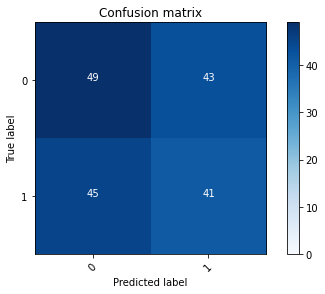

2022-08-20 21:30:10 - [Epoch Train: 63] loss: 0.0525, auc: 0.9989, acc: 0.9866, time: 57.00 s            
2022-08-20 21:30:10 - [Epoch Valid: 63] loss: 2.1849, auc: 0.5319, acc: 0.4825, time: 15.00 s


 63%|█████████████████████████▏              | 63/100 [1:08:02<43:48, 71.03s/it]

2022-08-20 21:30:10 - EPOCH: 64
2022-08-20 21:30:10 - Train Step 10/973, train_loss: 0.0073
2022-08-20 21:30:11 - Train Step 20/973, train_loss: 0.0339
2022-08-20 21:30:12 - Train Step 30/973, train_loss: 0.0243
2022-08-20 21:30:12 - Train Step 40/973, train_loss: 0.0195
2022-08-20 21:30:13 - Train Step 50/973, train_loss: 0.0191
2022-08-20 21:30:14 - Train Step 60/973, train_loss: 0.0269
2022-08-20 21:30:14 - Train Step 70/973, train_loss: 0.0246
2022-08-20 21:30:15 - Train Step 80/973, train_loss: 0.0262
2022-08-20 21:30:16 - Train Step 90/973, train_loss: 0.0268
2022-08-20 21:30:16 - Train Step 100/973, train_loss: 0.0253
2022-08-20 21:30:17 - Train Step 110/973, train_loss: 0.0308
2022-08-20 21:30:18 - Train Step 120/973, train_loss: 0.0317
2022-08-20 21:30:18 - Train Step 130/973, train_loss: 0.0349
2022-08-20 21:30:19 - Train Step 140/973, train_loss: 0.0424
2022-08-20 21:30:19 - Train Step 150/973, train_loss: 0.0408
2022-08-20 21:30:20 - Train Step 160/973, train_loss: 0.0478
2

2022-08-20 21:31:22 - Valid Step 185/257, valid_loss: 2.4873
2022-08-20 21:31:22 - Valid Step 190/257, valid_loss: 2.4677
2022-08-20 21:31:22 - Valid Step 195/257, valid_loss: 2.4699
2022-08-20 21:31:23 - Valid Step 200/257, valid_loss: 2.4489
2022-08-20 21:31:23 - Valid Step 205/257, valid_loss: 2.4649
2022-08-20 21:31:23 - Valid Step 210/257, valid_loss: 2.4348
2022-08-20 21:31:24 - Valid Step 215/257, valid_loss: 2.3890
2022-08-20 21:31:24 - Valid Step 220/257, valid_loss: 2.4290
2022-08-20 21:31:24 - Valid Step 225/257, valid_loss: 2.4144
2022-08-20 21:31:25 - Valid Step 230/257, valid_loss: 2.3662
2022-08-20 21:31:25 - Valid Step 235/257, valid_loss: 2.3428
2022-08-20 21:31:25 - Valid Step 240/257, valid_loss: 2.3497
2022-08-20 21:31:25 - Valid Step 245/257, valid_loss: 2.3105
2022-08-20 21:31:26 - Valid Step 250/257, valid_loss: 2.3455
2022-08-20 21:31:26 - Valid Step 255/257, valid_loss: 2.3293
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

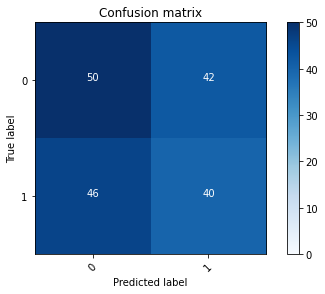

2022-08-20 21:31:26 - [Epoch Train: 64] loss: 0.0443, auc: 0.9993, acc: 0.9897, time: 60.00 s            
2022-08-20 21:31:26 - [Epoch Valid: 64] loss: 2.3300, auc: 0.5334, acc: 0.4903, time: 15.00 s


 64%|█████████████████████████▌              | 64/100 [1:09:19<43:39, 72.77s/it]

2022-08-20 21:31:26 - EPOCH: 65
2022-08-20 21:31:27 - Train Step 10/973, train_loss: 0.0182
2022-08-20 21:31:28 - Train Step 20/973, train_loss: 0.0312
2022-08-20 21:31:28 - Train Step 30/973, train_loss: 0.0438
2022-08-20 21:31:29 - Train Step 40/973, train_loss: 0.0350
2022-08-20 21:31:30 - Train Step 50/973, train_loss: 0.0287
2022-08-20 21:31:30 - Train Step 60/973, train_loss: 0.0367
2022-08-20 21:31:31 - Train Step 70/973, train_loss: 0.0331
2022-08-20 21:31:31 - Train Step 80/973, train_loss: 0.0314
2022-08-20 21:31:32 - Train Step 90/973, train_loss: 0.0306
2022-08-20 21:31:33 - Train Step 100/973, train_loss: 0.0347
2022-08-20 21:31:33 - Train Step 110/973, train_loss: 0.0341
2022-08-20 21:31:34 - Train Step 120/973, train_loss: 0.0325
2022-08-20 21:31:34 - Train Step 130/973, train_loss: 0.0308
2022-08-20 21:31:35 - Train Step 140/973, train_loss: 0.0296
2022-08-20 21:31:36 - Train Step 150/973, train_loss: 0.0280
2022-08-20 21:31:36 - Train Step 160/973, train_loss: 0.0294
2

2022-08-20 21:32:36 - Valid Step 185/257, valid_loss: 2.9060
2022-08-20 21:32:37 - Valid Step 190/257, valid_loss: 2.9010
2022-08-20 21:32:37 - Valid Step 195/257, valid_loss: 2.9612
2022-08-20 21:32:37 - Valid Step 200/257, valid_loss: 3.0150
2022-08-20 21:32:38 - Valid Step 205/257, valid_loss: 2.9511
2022-08-20 21:32:38 - Valid Step 210/257, valid_loss: 2.8842
2022-08-20 21:32:38 - Valid Step 215/257, valid_loss: 2.8565
2022-08-20 21:32:38 - Valid Step 220/257, valid_loss: 2.9304
2022-08-20 21:32:39 - Valid Step 225/257, valid_loss: 2.8898
2022-08-20 21:32:39 - Valid Step 230/257, valid_loss: 2.9980
2022-08-20 21:32:39 - Valid Step 235/257, valid_loss: 2.9597
2022-08-20 21:32:40 - Valid Step 240/257, valid_loss: 2.9539
2022-08-20 21:32:40 - Valid Step 245/257, valid_loss: 2.8950
2022-08-20 21:32:40 - Valid Step 250/257, valid_loss: 2.8646
2022-08-20 21:32:40 - Valid Step 255/257, valid_loss: 2.9625
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

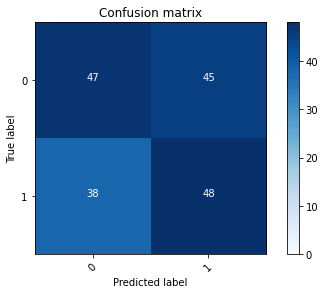

2022-08-20 21:32:41 - [Epoch Train: 65] loss: 0.0446, auc: 0.9996, acc: 0.9866, time: 59.00 s            
2022-08-20 21:32:41 - [Epoch Valid: 65] loss: 2.9924, auc: 0.5229, acc: 0.5136, time: 15.00 s


 65%|██████████████████████████              | 65/100 [1:10:34<42:42, 73.22s/it]

2022-08-20 21:32:41 - EPOCH: 66
2022-08-20 21:32:42 - Train Step 10/973, train_loss: 0.1450
2022-08-20 21:32:42 - Train Step 20/973, train_loss: 0.1512
2022-08-20 21:32:43 - Train Step 30/973, train_loss: 0.1244
2022-08-20 21:32:43 - Train Step 40/973, train_loss: 0.0943
2022-08-20 21:32:44 - Train Step 50/973, train_loss: 0.0830
2022-08-20 21:32:45 - Train Step 60/973, train_loss: 0.0775
2022-08-20 21:32:45 - Train Step 70/973, train_loss: 0.0689
2022-08-20 21:32:46 - Train Step 80/973, train_loss: 0.0622
2022-08-20 21:32:47 - Train Step 90/973, train_loss: 0.0583
2022-08-20 21:32:47 - Train Step 100/973, train_loss: 0.0558
2022-08-20 21:32:48 - Train Step 110/973, train_loss: 0.0531
2022-08-20 21:32:49 - Train Step 120/973, train_loss: 0.0495
2022-08-20 21:32:49 - Train Step 130/973, train_loss: 0.0474
2022-08-20 21:32:50 - Train Step 140/973, train_loss: 0.0452
2022-08-20 21:32:50 - Train Step 150/973, train_loss: 0.0467
2022-08-20 21:32:51 - Train Step 160/973, train_loss: 0.0449
2

2022-08-20 21:33:49 - Valid Step 185/257, valid_loss: 2.4421
2022-08-20 21:33:49 - Valid Step 190/257, valid_loss: 2.4885
2022-08-20 21:33:50 - Valid Step 195/257, valid_loss: 2.5528
2022-08-20 21:33:50 - Valid Step 200/257, valid_loss: 2.5227
2022-08-20 21:33:50 - Valid Step 205/257, valid_loss: 2.5916
2022-08-20 21:33:50 - Valid Step 210/257, valid_loss: 2.6001
2022-08-20 21:33:51 - Valid Step 215/257, valid_loss: 2.6117
2022-08-20 21:33:51 - Valid Step 220/257, valid_loss: 2.6130
2022-08-20 21:33:51 - Valid Step 225/257, valid_loss: 2.5800
2022-08-20 21:33:51 - Valid Step 230/257, valid_loss: 2.5751
2022-08-20 21:33:52 - Valid Step 235/257, valid_loss: 2.5357
2022-08-20 21:33:52 - Valid Step 240/257, valid_loss: 2.5389
2022-08-20 21:33:52 - Valid Step 245/257, valid_loss: 2.5171
2022-08-20 21:33:53 - Valid Step 250/257, valid_loss: 2.5079
2022-08-20 21:33:53 - Valid Step 255/257, valid_loss: 2.4942
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

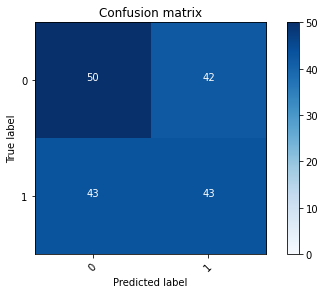

2022-08-20 21:33:53 - [Epoch Train: 66] loss: 0.0414, auc: 0.9994, acc: 0.9938, time: 58.00 s            
2022-08-20 21:33:53 - [Epoch Valid: 66] loss: 2.4868, auc: 0.5260, acc: 0.4942, time: 13.00 s


 66%|██████████████████████████▍             | 66/100 [1:11:46<41:20, 72.95s/it]

2022-08-20 21:33:53 - EPOCH: 67
2022-08-20 21:33:54 - Train Step 10/973, train_loss: 0.0135
2022-08-20 21:33:54 - Train Step 20/973, train_loss: 0.0107
2022-08-20 21:33:55 - Train Step 30/973, train_loss: 0.0106
2022-08-20 21:33:55 - Train Step 40/973, train_loss: 0.0360
2022-08-20 21:33:56 - Train Step 50/973, train_loss: 0.0317
2022-08-20 21:33:56 - Train Step 60/973, train_loss: 0.0278
2022-08-20 21:33:57 - Train Step 70/973, train_loss: 0.0264
2022-08-20 21:33:57 - Train Step 80/973, train_loss: 0.0252
2022-08-20 21:33:58 - Train Step 90/973, train_loss: 0.0275
2022-08-20 21:33:58 - Train Step 100/973, train_loss: 0.0256
2022-08-20 21:33:59 - Train Step 110/973, train_loss: 0.0329
2022-08-20 21:33:59 - Train Step 120/973, train_loss: 0.0341
2022-08-20 21:34:00 - Train Step 130/973, train_loss: 0.0353
2022-08-20 21:34:01 - Train Step 140/973, train_loss: 0.0345
2022-08-20 21:34:01 - Train Step 150/973, train_loss: 0.0366
2022-08-20 21:34:02 - Train Step 160/973, train_loss: 0.0361
2

2022-08-20 21:34:54 - Valid Step 185/257, valid_loss: 2.6135
2022-08-20 21:34:54 - Valid Step 190/257, valid_loss: 2.6130
2022-08-20 21:34:54 - Valid Step 195/257, valid_loss: 2.6350
2022-08-20 21:34:54 - Valid Step 200/257, valid_loss: 2.6302
2022-08-20 21:34:55 - Valid Step 205/257, valid_loss: 2.6323
2022-08-20 21:34:55 - Valid Step 210/257, valid_loss: 2.6388
2022-08-20 21:34:55 - Valid Step 215/257, valid_loss: 2.6556
2022-08-20 21:34:55 - Valid Step 220/257, valid_loss: 2.6432
2022-08-20 21:34:56 - Valid Step 225/257, valid_loss: 2.6096
2022-08-20 21:34:56 - Valid Step 230/257, valid_loss: 2.6067
2022-08-20 21:34:56 - Valid Step 235/257, valid_loss: 2.6330
2022-08-20 21:34:56 - Valid Step 240/257, valid_loss: 2.6592
2022-08-20 21:34:57 - Valid Step 245/257, valid_loss: 2.6603
2022-08-20 21:34:57 - Valid Step 250/257, valid_loss: 2.7179
2022-08-20 21:34:57 - Valid Step 255/257, valid_loss: 2.7195
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

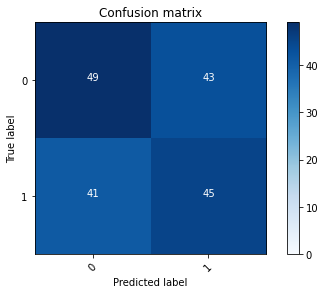

2022-08-20 21:34:57 - [Epoch Train: 67] loss: 0.0451, auc: 0.9993, acc: 0.9887, time: 51.00 s            
2022-08-20 21:34:57 - [Epoch Valid: 67] loss: 2.7339, auc: 0.5327, acc: 0.5019, time: 13.00 s


 67%|██████████████████████████▊             | 67/100 [1:12:50<38:42, 70.39s/it]

2022-08-20 21:34:57 - EPOCH: 68
2022-08-20 21:34:58 - Train Step 10/973, train_loss: 0.0720
2022-08-20 21:34:59 - Train Step 20/973, train_loss: 0.0426
2022-08-20 21:34:59 - Train Step 30/973, train_loss: 0.0496
2022-08-20 21:35:00 - Train Step 40/973, train_loss: 0.0564
2022-08-20 21:35:00 - Train Step 50/973, train_loss: 0.1069
2022-08-20 21:35:01 - Train Step 60/973, train_loss: 0.0899
2022-08-20 21:35:01 - Train Step 70/973, train_loss: 0.0851
2022-08-20 21:35:02 - Train Step 80/973, train_loss: 0.0752
2022-08-20 21:35:02 - Train Step 90/973, train_loss: 0.0683
2022-08-20 21:35:03 - Train Step 100/973, train_loss: 0.0631
2022-08-20 21:35:03 - Train Step 110/973, train_loss: 0.0588
2022-08-20 21:35:04 - Train Step 120/973, train_loss: 0.0543
2022-08-20 21:35:04 - Train Step 130/973, train_loss: 0.0639
2022-08-20 21:35:05 - Train Step 140/973, train_loss: 0.0601
2022-08-20 21:35:05 - Train Step 150/973, train_loss: 0.0609
2022-08-20 21:35:06 - Train Step 160/973, train_loss: 0.0579
2

2022-08-20 21:35:57 - Valid Step 185/257, valid_loss: 2.9157
2022-08-20 21:35:57 - Valid Step 190/257, valid_loss: 2.8730
2022-08-20 21:35:58 - Valid Step 195/257, valid_loss: 2.8286
2022-08-20 21:35:58 - Valid Step 200/257, valid_loss: 2.7612
2022-08-20 21:35:58 - Valid Step 205/257, valid_loss: 2.7220
2022-08-20 21:35:59 - Valid Step 210/257, valid_loss: 2.7386
2022-08-20 21:35:59 - Valid Step 215/257, valid_loss: 2.7137
2022-08-20 21:35:59 - Valid Step 220/257, valid_loss: 2.7689
2022-08-20 21:35:59 - Valid Step 225/257, valid_loss: 2.7455
2022-08-20 21:36:00 - Valid Step 230/257, valid_loss: 2.7638
2022-08-20 21:36:00 - Valid Step 235/257, valid_loss: 2.7110
2022-08-20 21:36:00 - Valid Step 240/257, valid_loss: 2.7114
2022-08-20 21:36:00 - Valid Step 245/257, valid_loss: 2.6995
2022-08-20 21:36:01 - Valid Step 250/257, valid_loss: 2.6708
2022-08-20 21:36:01 - Valid Step 255/257, valid_loss: 2.7019
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

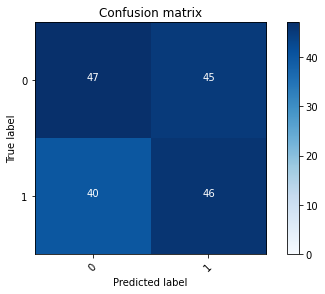

2022-08-20 21:36:01 - [Epoch Train: 68] loss: 0.0352, auc: 0.9995, acc: 0.9918, time: 50.00 s            
2022-08-20 21:36:01 - [Epoch Valid: 68] loss: 2.7190, auc: 0.5262, acc: 0.5058, time: 13.00 s


 68%|███████████████████████████▏            | 68/100 [1:13:54<36:29, 68.41s/it]

2022-08-20 21:36:01 - EPOCH: 69
2022-08-20 21:36:02 - Train Step 10/973, train_loss: 0.0028
2022-08-20 21:36:02 - Train Step 20/973, train_loss: 0.0083
2022-08-20 21:36:03 - Train Step 30/973, train_loss: 0.0083
2022-08-20 21:36:04 - Train Step 40/973, train_loss: 0.0117
2022-08-20 21:36:04 - Train Step 50/973, train_loss: 0.0107
2022-08-20 21:36:05 - Train Step 60/973, train_loss: 0.0146
2022-08-20 21:36:05 - Train Step 70/973, train_loss: 0.0148
2022-08-20 21:36:06 - Train Step 80/973, train_loss: 0.0140
2022-08-20 21:36:06 - Train Step 90/973, train_loss: 0.0163
2022-08-20 21:36:07 - Train Step 100/973, train_loss: 0.0279
2022-08-20 21:36:07 - Train Step 110/973, train_loss: 0.0267
2022-08-20 21:36:08 - Train Step 120/973, train_loss: 0.0297
2022-08-20 21:36:08 - Train Step 130/973, train_loss: 0.0277
2022-08-20 21:36:09 - Train Step 140/973, train_loss: 0.0277
2022-08-20 21:36:09 - Train Step 150/973, train_loss: 0.0271
2022-08-20 21:36:10 - Train Step 160/973, train_loss: 0.0273
2

2022-08-20 21:37:02 - Valid Step 185/257, valid_loss: 2.9413
2022-08-20 21:37:02 - Valid Step 190/257, valid_loss: 2.9768
2022-08-20 21:37:03 - Valid Step 195/257, valid_loss: 3.0216
2022-08-20 21:37:03 - Valid Step 200/257, valid_loss: 3.0128
2022-08-20 21:37:03 - Valid Step 205/257, valid_loss: 3.0010
2022-08-20 21:37:03 - Valid Step 210/257, valid_loss: 3.0238
2022-08-20 21:37:04 - Valid Step 215/257, valid_loss: 2.9673
2022-08-20 21:37:04 - Valid Step 220/257, valid_loss: 2.9608
2022-08-20 21:37:04 - Valid Step 225/257, valid_loss: 2.9920
2022-08-20 21:37:04 - Valid Step 230/257, valid_loss: 2.9569
2022-08-20 21:37:05 - Valid Step 235/257, valid_loss: 2.9584
2022-08-20 21:37:05 - Valid Step 240/257, valid_loss: 2.9912
2022-08-20 21:37:05 - Valid Step 245/257, valid_loss: 2.9354
2022-08-20 21:37:05 - Valid Step 250/257, valid_loss: 2.9352
2022-08-20 21:37:06 - Valid Step 255/257, valid_loss: 2.8845
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

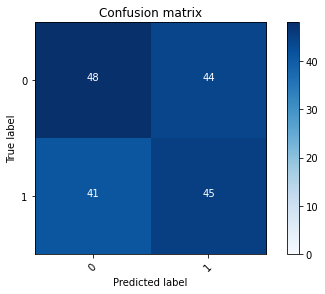

2022-08-20 21:37:06 - [Epoch Train: 69] loss: 0.0312, auc: 0.9998, acc: 0.9949, time: 51.00 s            
2022-08-20 21:37:06 - [Epoch Valid: 69] loss: 2.8764, auc: 0.5173, acc: 0.4981, time: 13.00 s


 69%|███████████████████████████▌            | 69/100 [1:14:59<34:46, 67.32s/it]

2022-08-20 21:37:06 - EPOCH: 70
2022-08-20 21:37:07 - Train Step 10/973, train_loss: 0.0217
2022-08-20 21:37:07 - Train Step 20/973, train_loss: 0.0169
2022-08-20 21:37:08 - Train Step 30/973, train_loss: 0.0156
2022-08-20 21:37:08 - Train Step 40/973, train_loss: 0.0141
2022-08-20 21:37:09 - Train Step 50/973, train_loss: 0.0115
2022-08-20 21:37:09 - Train Step 60/973, train_loss: 0.0192
2022-08-20 21:37:10 - Train Step 70/973, train_loss: 0.0250
2022-08-20 21:37:10 - Train Step 80/973, train_loss: 0.0241
2022-08-20 21:37:11 - Train Step 90/973, train_loss: 0.0217
2022-08-20 21:37:11 - Train Step 100/973, train_loss: 0.0199
2022-08-20 21:37:12 - Train Step 110/973, train_loss: 0.0193
2022-08-20 21:37:12 - Train Step 120/973, train_loss: 0.0182
2022-08-20 21:37:13 - Train Step 130/973, train_loss: 0.0173
2022-08-20 21:37:13 - Train Step 140/973, train_loss: 0.0173
2022-08-20 21:37:14 - Train Step 150/973, train_loss: 0.0167
2022-08-20 21:37:14 - Train Step 160/973, train_loss: 0.0166
2

2022-08-20 21:38:06 - Valid Step 185/257, valid_loss: 2.9343
2022-08-20 21:38:06 - Valid Step 190/257, valid_loss: 2.9887
2022-08-20 21:38:06 - Valid Step 195/257, valid_loss: 2.9161
2022-08-20 21:38:06 - Valid Step 200/257, valid_loss: 2.9078
2022-08-20 21:38:07 - Valid Step 205/257, valid_loss: 2.9660
2022-08-20 21:38:07 - Valid Step 210/257, valid_loss: 2.9196
2022-08-20 21:38:07 - Valid Step 215/257, valid_loss: 3.0099
2022-08-20 21:38:08 - Valid Step 220/257, valid_loss: 3.0741
2022-08-20 21:38:08 - Valid Step 225/257, valid_loss: 3.0399
2022-08-20 21:38:08 - Valid Step 230/257, valid_loss: 3.0339
2022-08-20 21:38:08 - Valid Step 235/257, valid_loss: 3.0830
2022-08-20 21:38:09 - Valid Step 240/257, valid_loss: 3.0634
2022-08-20 21:38:09 - Valid Step 245/257, valid_loss: 3.0349
2022-08-20 21:38:09 - Valid Step 250/257, valid_loss: 2.9859
2022-08-20 21:38:09 - Valid Step 255/257, valid_loss: 2.9884
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

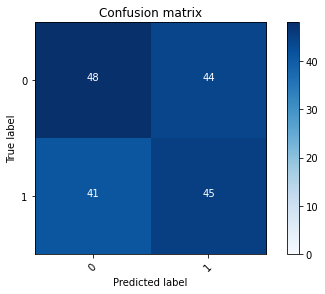

2022-08-20 21:38:10 - [Epoch Train: 70] loss: 0.0311, auc: 0.9997, acc: 0.9918, time: 50.00 s            
2022-08-20 21:38:10 - [Epoch Valid: 70] loss: 3.0037, auc: 0.5260, acc: 0.4981, time: 13.00 s


 70%|████████████████████████████            | 70/100 [1:16:03<33:07, 66.25s/it]

2022-08-20 21:38:10 - EPOCH: 71
2022-08-20 21:38:10 - Train Step 10/973, train_loss: 0.0144
2022-08-20 21:38:11 - Train Step 20/973, train_loss: 0.0481
2022-08-20 21:38:11 - Train Step 30/973, train_loss: 0.0359
2022-08-20 21:38:12 - Train Step 40/973, train_loss: 0.0274
2022-08-20 21:38:13 - Train Step 50/973, train_loss: 0.0259
2022-08-20 21:38:13 - Train Step 60/973, train_loss: 0.0221
2022-08-20 21:38:14 - Train Step 70/973, train_loss: 0.0203
2022-08-20 21:38:14 - Train Step 80/973, train_loss: 0.0202
2022-08-20 21:38:15 - Train Step 90/973, train_loss: 0.0204
2022-08-20 21:38:15 - Train Step 100/973, train_loss: 0.0189
2022-08-20 21:38:16 - Train Step 110/973, train_loss: 0.0199
2022-08-20 21:38:16 - Train Step 120/973, train_loss: 0.0226
2022-08-20 21:38:17 - Train Step 130/973, train_loss: 0.0356
2022-08-20 21:38:17 - Train Step 140/973, train_loss: 0.0336
2022-08-20 21:38:18 - Train Step 150/973, train_loss: 0.0320
2022-08-20 21:38:18 - Train Step 160/973, train_loss: 0.0307
2

2022-08-20 21:39:10 - Valid Step 185/257, valid_loss: 3.0196
2022-08-20 21:39:10 - Valid Step 190/257, valid_loss: 3.0616
2022-08-20 21:39:10 - Valid Step 195/257, valid_loss: 2.9833
2022-08-20 21:39:11 - Valid Step 200/257, valid_loss: 2.9491
2022-08-20 21:39:11 - Valid Step 205/257, valid_loss: 2.9449
2022-08-20 21:39:11 - Valid Step 210/257, valid_loss: 2.9213
2022-08-20 21:39:11 - Valid Step 215/257, valid_loss: 2.9239
2022-08-20 21:39:12 - Valid Step 220/257, valid_loss: 2.9642
2022-08-20 21:39:12 - Valid Step 225/257, valid_loss: 2.9563
2022-08-20 21:39:12 - Valid Step 230/257, valid_loss: 2.9361
2022-08-20 21:39:12 - Valid Step 235/257, valid_loss: 2.9538
2022-08-20 21:39:13 - Valid Step 240/257, valid_loss: 2.9028
2022-08-20 21:39:13 - Valid Step 245/257, valid_loss: 2.8725
2022-08-20 21:39:13 - Valid Step 250/257, valid_loss: 2.8480
2022-08-20 21:39:14 - Valid Step 255/257, valid_loss: 2.8432
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

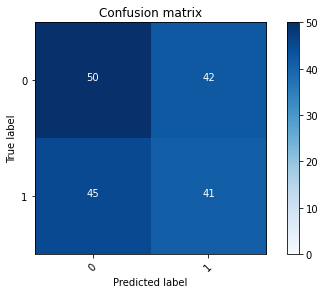

2022-08-20 21:39:14 - [Epoch Train: 71] loss: 0.0286, auc: 0.9998, acc: 0.9959, time: 50.00 s            
2022-08-20 21:39:14 - [Epoch Valid: 71] loss: 2.8396, auc: 0.5294, acc: 0.4942, time: 13.00 s


 71%|████████████████████████████▍           | 71/100 [1:17:07<31:41, 65.58s/it]

2022-08-20 21:39:14 - EPOCH: 72
2022-08-20 21:39:14 - Train Step 10/973, train_loss: 0.0098
2022-08-20 21:39:15 - Train Step 20/973, train_loss: 0.0516
2022-08-20 21:39:15 - Train Step 30/973, train_loss: 0.0348
2022-08-20 21:39:16 - Train Step 40/973, train_loss: 0.0269
2022-08-20 21:39:17 - Train Step 50/973, train_loss: 0.0227
2022-08-20 21:39:17 - Train Step 60/973, train_loss: 0.0200
2022-08-20 21:39:18 - Train Step 70/973, train_loss: 0.0205
2022-08-20 21:39:18 - Train Step 80/973, train_loss: 0.0241
2022-08-20 21:39:19 - Train Step 90/973, train_loss: 0.0271
2022-08-20 21:39:19 - Train Step 100/973, train_loss: 0.0261
2022-08-20 21:39:20 - Train Step 110/973, train_loss: 0.0318
2022-08-20 21:39:20 - Train Step 120/973, train_loss: 0.0304
2022-08-20 21:39:21 - Train Step 130/973, train_loss: 0.0336
2022-08-20 21:39:21 - Train Step 140/973, train_loss: 0.0318
2022-08-20 21:39:22 - Train Step 150/973, train_loss: 0.0337
2022-08-20 21:39:22 - Train Step 160/973, train_loss: 0.0332
2

2022-08-20 21:40:14 - Valid Step 185/257, valid_loss: 2.9765
2022-08-20 21:40:14 - Valid Step 190/257, valid_loss: 3.0625
2022-08-20 21:40:15 - Valid Step 195/257, valid_loss: 3.0006
2022-08-20 21:40:15 - Valid Step 200/257, valid_loss: 3.0742
2022-08-20 21:40:15 - Valid Step 205/257, valid_loss: 3.0858
2022-08-20 21:40:15 - Valid Step 210/257, valid_loss: 3.0706
2022-08-20 21:40:16 - Valid Step 215/257, valid_loss: 3.1432
2022-08-20 21:40:16 - Valid Step 220/257, valid_loss: 3.1401
2022-08-20 21:40:16 - Valid Step 225/257, valid_loss: 3.1463
2022-08-20 21:40:16 - Valid Step 230/257, valid_loss: 3.1628
2022-08-20 21:40:17 - Valid Step 235/257, valid_loss: 3.1251
2022-08-20 21:40:17 - Valid Step 240/257, valid_loss: 3.1227
2022-08-20 21:40:17 - Valid Step 245/257, valid_loss: 3.1472
2022-08-20 21:40:17 - Valid Step 250/257, valid_loss: 3.1425
2022-08-20 21:40:18 - Valid Step 255/257, valid_loss: 3.1256
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

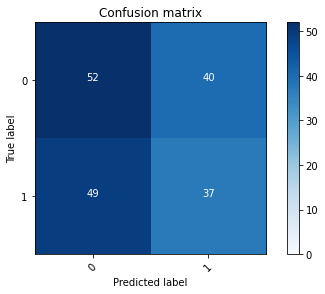

2022-08-20 21:40:18 - [Epoch Train: 72] loss: 0.0349, auc: 0.9998, acc: 0.9908, time: 50.00 s            
2022-08-20 21:40:18 - [Epoch Valid: 72] loss: 3.1014, auc: 0.5234, acc: 0.4942, time: 13.00 s


 72%|████████████████████████████▊           | 72/100 [1:18:11<30:24, 65.17s/it]

2022-08-20 21:40:18 - EPOCH: 73
2022-08-20 21:40:19 - Train Step 10/973, train_loss: 0.0258
2022-08-20 21:40:19 - Train Step 20/973, train_loss: 0.0317
2022-08-20 21:40:20 - Train Step 30/973, train_loss: 0.0331
2022-08-20 21:40:20 - Train Step 40/973, train_loss: 0.0274
2022-08-20 21:40:21 - Train Step 50/973, train_loss: 0.0268
2022-08-20 21:40:21 - Train Step 60/973, train_loss: 0.0256
2022-08-20 21:40:22 - Train Step 70/973, train_loss: 0.0238
2022-08-20 21:40:22 - Train Step 80/973, train_loss: 0.0217
2022-08-20 21:40:23 - Train Step 90/973, train_loss: 0.0198
2022-08-20 21:40:23 - Train Step 100/973, train_loss: 0.0188
2022-08-20 21:40:24 - Train Step 110/973, train_loss: 0.0182
2022-08-20 21:40:24 - Train Step 120/973, train_loss: 0.0213
2022-08-20 21:40:25 - Train Step 130/973, train_loss: 0.0198
2022-08-20 21:40:25 - Train Step 140/973, train_loss: 0.0196
2022-08-20 21:40:26 - Train Step 150/973, train_loss: 0.0196
2022-08-20 21:40:26 - Train Step 160/973, train_loss: 0.0208
2

2022-08-20 21:41:18 - Valid Step 185/257, valid_loss: 3.7210
2022-08-20 21:41:18 - Valid Step 190/257, valid_loss: 3.7522
2022-08-20 21:41:18 - Valid Step 195/257, valid_loss: 3.7448
2022-08-20 21:41:19 - Valid Step 200/257, valid_loss: 3.7330
2022-08-20 21:41:19 - Valid Step 205/257, valid_loss: 3.6457
2022-08-20 21:41:19 - Valid Step 210/257, valid_loss: 3.5747
2022-08-20 21:41:19 - Valid Step 215/257, valid_loss: 3.5359
2022-08-20 21:41:20 - Valid Step 220/257, valid_loss: 3.5034
2022-08-20 21:41:20 - Valid Step 225/257, valid_loss: 3.4806
2022-08-20 21:41:20 - Valid Step 230/257, valid_loss: 3.4640
2022-08-20 21:41:20 - Valid Step 235/257, valid_loss: 3.4291
2022-08-20 21:41:21 - Valid Step 240/257, valid_loss: 3.4672
2022-08-20 21:41:21 - Valid Step 245/257, valid_loss: 3.4007
2022-08-20 21:41:21 - Valid Step 250/257, valid_loss: 3.3543
2022-08-20 21:41:21 - Valid Step 255/257, valid_loss: 3.3494
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

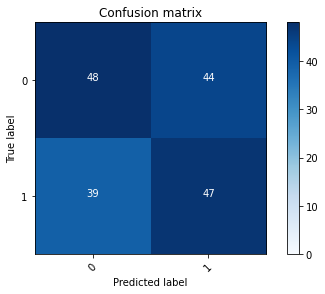

2022-08-20 21:41:22 - [Epoch Train: 73] loss: 0.0249, auc: 0.9999, acc: 0.9969, time: 49.00 s            
2022-08-20 21:41:22 - [Epoch Valid: 73] loss: 3.3436, auc: 0.5238, acc: 0.5058, time: 13.00 s


 73%|█████████████████████████████▏          | 73/100 [1:19:15<29:07, 64.70s/it]

2022-08-20 21:41:22 - EPOCH: 74
2022-08-20 21:41:22 - Train Step 10/973, train_loss: 0.0055
2022-08-20 21:41:23 - Train Step 20/973, train_loss: 0.0185
2022-08-20 21:41:23 - Train Step 30/973, train_loss: 0.0136
2022-08-20 21:41:24 - Train Step 40/973, train_loss: 0.0266
2022-08-20 21:41:24 - Train Step 50/973, train_loss: 0.0243
2022-08-20 21:41:25 - Train Step 60/973, train_loss: 0.0215
2022-08-20 21:41:25 - Train Step 70/973, train_loss: 0.0280
2022-08-20 21:41:26 - Train Step 80/973, train_loss: 0.0298
2022-08-20 21:41:26 - Train Step 90/973, train_loss: 0.0280
2022-08-20 21:41:27 - Train Step 100/973, train_loss: 0.0252
2022-08-20 21:41:27 - Train Step 110/973, train_loss: 0.0231
2022-08-20 21:41:28 - Train Step 120/973, train_loss: 0.0292
2022-08-20 21:41:28 - Train Step 130/973, train_loss: 0.0275
2022-08-20 21:41:29 - Train Step 140/973, train_loss: 0.0287
2022-08-20 21:41:30 - Train Step 150/973, train_loss: 0.0273
2022-08-20 21:41:30 - Train Step 160/973, train_loss: 0.0277
2

2022-08-20 21:42:22 - Valid Step 185/257, valid_loss: 3.1540
2022-08-20 21:42:23 - Valid Step 190/257, valid_loss: 3.1304
2022-08-20 21:42:23 - Valid Step 195/257, valid_loss: 3.0881
2022-08-20 21:42:23 - Valid Step 200/257, valid_loss: 3.0426
2022-08-20 21:42:23 - Valid Step 205/257, valid_loss: 3.0774
2022-08-20 21:42:24 - Valid Step 210/257, valid_loss: 3.0887
2022-08-20 21:42:24 - Valid Step 215/257, valid_loss: 3.0844
2022-08-20 21:42:24 - Valid Step 220/257, valid_loss: 3.0401
2022-08-20 21:42:25 - Valid Step 225/257, valid_loss: 3.0821
2022-08-20 21:42:25 - Valid Step 230/257, valid_loss: 3.0957
2022-08-20 21:42:25 - Valid Step 235/257, valid_loss: 3.1701
2022-08-20 21:42:25 - Valid Step 240/257, valid_loss: 3.1388
2022-08-20 21:42:26 - Valid Step 245/257, valid_loss: 3.1069
2022-08-20 21:42:26 - Valid Step 250/257, valid_loss: 3.1228
2022-08-20 21:42:26 - Valid Step 255/257, valid_loss: 3.0890
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

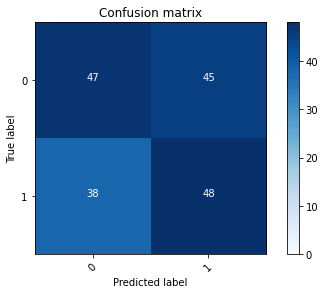

2022-08-20 21:42:26 - [Epoch Train: 74] loss: 0.0312, auc: 0.9996, acc: 0.9938, time: 51.00 s            
2022-08-20 21:42:26 - [Epoch Valid: 74] loss: 3.0650, auc: 0.5234, acc: 0.5058, time: 13.00 s


 74%|█████████████████████████████▌          | 74/100 [1:20:19<28:02, 64.70s/it]

2022-08-20 21:42:26 - EPOCH: 75
2022-08-20 21:42:27 - Train Step 10/973, train_loss: 0.0304
2022-08-20 21:42:27 - Train Step 20/973, train_loss: 0.0275
2022-08-20 21:42:28 - Train Step 30/973, train_loss: 0.0629
2022-08-20 21:42:28 - Train Step 40/973, train_loss: 0.0512
2022-08-20 21:42:29 - Train Step 50/973, train_loss: 0.0591
2022-08-20 21:42:29 - Train Step 60/973, train_loss: 0.0515
2022-08-20 21:42:30 - Train Step 70/973, train_loss: 0.0450
2022-08-20 21:42:31 - Train Step 80/973, train_loss: 0.0402
2022-08-20 21:42:31 - Train Step 90/973, train_loss: 0.0452
2022-08-20 21:42:32 - Train Step 100/973, train_loss: 0.0426
2022-08-20 21:42:32 - Train Step 110/973, train_loss: 0.0405
2022-08-20 21:42:33 - Train Step 120/973, train_loss: 0.0376
2022-08-20 21:42:33 - Train Step 130/973, train_loss: 0.0355
2022-08-20 21:42:34 - Train Step 140/973, train_loss: 0.0339
2022-08-20 21:42:34 - Train Step 150/973, train_loss: 0.0327
2022-08-20 21:42:35 - Train Step 160/973, train_loss: 0.0321
2

2022-08-20 21:43:27 - Valid Step 185/257, valid_loss: 3.2864
2022-08-20 21:43:28 - Valid Step 190/257, valid_loss: 3.2560
2022-08-20 21:43:28 - Valid Step 195/257, valid_loss: 3.2154
2022-08-20 21:43:28 - Valid Step 200/257, valid_loss: 3.2108
2022-08-20 21:43:28 - Valid Step 205/257, valid_loss: 3.1653
2022-08-20 21:43:29 - Valid Step 210/257, valid_loss: 3.1480
2022-08-20 21:43:29 - Valid Step 215/257, valid_loss: 3.0922
2022-08-20 21:43:29 - Valid Step 220/257, valid_loss: 3.0966
2022-08-20 21:43:29 - Valid Step 225/257, valid_loss: 3.0474
2022-08-20 21:43:30 - Valid Step 230/257, valid_loss: 3.0736
2022-08-20 21:43:30 - Valid Step 235/257, valid_loss: 3.0275
2022-08-20 21:43:30 - Valid Step 240/257, valid_loss: 3.0284
2022-08-20 21:43:30 - Valid Step 245/257, valid_loss: 3.0197
2022-08-20 21:43:31 - Valid Step 250/257, valid_loss: 3.0519
2022-08-20 21:43:31 - Valid Step 255/257, valid_loss: 3.0212
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

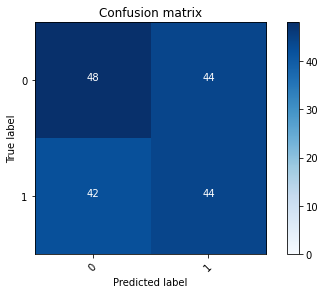

2022-08-20 21:43:31 - [Epoch Train: 75] loss: 0.0274, auc: 0.9999, acc: 0.9959, time: 51.00 s            
2022-08-20 21:43:31 - [Epoch Valid: 75] loss: 3.0242, auc: 0.5202, acc: 0.4942, time: 13.00 s


 75%|██████████████████████████████          | 75/100 [1:21:24<26:58, 64.76s/it]

2022-08-20 21:43:31 - EPOCH: 76
2022-08-20 21:43:32 - Train Step 10/973, train_loss: 0.0553
2022-08-20 21:43:32 - Train Step 20/973, train_loss: 0.0421
2022-08-20 21:43:33 - Train Step 30/973, train_loss: 0.0336
2022-08-20 21:43:33 - Train Step 40/973, train_loss: 0.0265
2022-08-20 21:43:34 - Train Step 50/973, train_loss: 0.0214
2022-08-20 21:43:34 - Train Step 60/973, train_loss: 0.0185
2022-08-20 21:43:35 - Train Step 70/973, train_loss: 0.0264
2022-08-20 21:43:36 - Train Step 80/973, train_loss: 0.0334
2022-08-20 21:43:36 - Train Step 90/973, train_loss: 0.0306
2022-08-20 21:43:37 - Train Step 100/973, train_loss: 0.0288
2022-08-20 21:43:37 - Train Step 110/973, train_loss: 0.0282
2022-08-20 21:43:38 - Train Step 120/973, train_loss: 0.0302
2022-08-20 21:43:38 - Train Step 130/973, train_loss: 0.0292
2022-08-20 21:43:39 - Train Step 140/973, train_loss: 0.0278
2022-08-20 21:43:39 - Train Step 150/973, train_loss: 0.0302
2022-08-20 21:43:40 - Train Step 160/973, train_loss: 0.0285
2

2022-08-20 21:44:31 - Valid Step 185/257, valid_loss: 2.8829
2022-08-20 21:44:32 - Valid Step 190/257, valid_loss: 2.8554
2022-08-20 21:44:32 - Valid Step 195/257, valid_loss: 2.8607
2022-08-20 21:44:32 - Valid Step 200/257, valid_loss: 2.8035
2022-08-20 21:44:32 - Valid Step 205/257, valid_loss: 2.7986
2022-08-20 21:44:33 - Valid Step 210/257, valid_loss: 2.7382
2022-08-20 21:44:33 - Valid Step 215/257, valid_loss: 2.8135
2022-08-20 21:44:33 - Valid Step 220/257, valid_loss: 2.8872
2022-08-20 21:44:33 - Valid Step 225/257, valid_loss: 2.8792
2022-08-20 21:44:34 - Valid Step 230/257, valid_loss: 2.9344
2022-08-20 21:44:34 - Valid Step 235/257, valid_loss: 2.9214
2022-08-20 21:44:34 - Valid Step 240/257, valid_loss: 2.9889
2022-08-20 21:44:35 - Valid Step 245/257, valid_loss: 2.9913
2022-08-20 21:44:35 - Valid Step 250/257, valid_loss: 2.9315
2022-08-20 21:44:35 - Valid Step 255/257, valid_loss: 2.9443
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

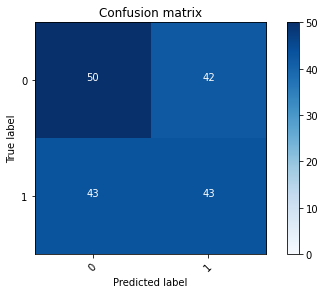

2022-08-20 21:44:35 - [Epoch Train: 76] loss: 0.0241, auc: 0.9999, acc: 0.9979, time: 50.00 s            
2022-08-20 21:44:35 - [Epoch Valid: 76] loss: 2.9214, auc: 0.5267, acc: 0.5019, time: 13.00 s


 76%|██████████████████████████████▍         | 76/100 [1:22:28<25:49, 64.56s/it]

2022-08-20 21:44:35 - EPOCH: 77
2022-08-20 21:44:36 - Train Step 10/973, train_loss: 0.0166
2022-08-20 21:44:37 - Train Step 20/973, train_loss: 0.0090
2022-08-20 21:44:37 - Train Step 30/973, train_loss: 0.0065
2022-08-20 21:44:38 - Train Step 40/973, train_loss: 0.0049
2022-08-20 21:44:38 - Train Step 50/973, train_loss: 0.0052
2022-08-20 21:44:39 - Train Step 60/973, train_loss: 0.0062
2022-08-20 21:44:39 - Train Step 70/973, train_loss: 0.0064
2022-08-20 21:44:40 - Train Step 80/973, train_loss: 0.0069
2022-08-20 21:44:40 - Train Step 90/973, train_loss: 0.0069
2022-08-20 21:44:41 - Train Step 100/973, train_loss: 0.0128
2022-08-20 21:44:41 - Train Step 110/973, train_loss: 0.0178
2022-08-20 21:44:42 - Train Step 120/973, train_loss: 0.0261
2022-08-20 21:44:42 - Train Step 130/973, train_loss: 0.0245
2022-08-20 21:44:43 - Train Step 140/973, train_loss: 0.0245
2022-08-20 21:44:43 - Train Step 150/973, train_loss: 0.0284
2022-08-20 21:44:44 - Train Step 160/973, train_loss: 0.0297
2

2022-08-20 21:45:36 - Valid Step 185/257, valid_loss: 2.8453
2022-08-20 21:45:36 - Valid Step 190/257, valid_loss: 2.8594
2022-08-20 21:45:37 - Valid Step 195/257, valid_loss: 3.0590
2022-08-20 21:45:37 - Valid Step 200/257, valid_loss: 3.0617
2022-08-20 21:45:37 - Valid Step 205/257, valid_loss: 3.0156
2022-08-20 21:45:37 - Valid Step 210/257, valid_loss: 3.0347
2022-08-20 21:45:38 - Valid Step 215/257, valid_loss: 3.0144
2022-08-20 21:45:38 - Valid Step 220/257, valid_loss: 3.0272
2022-08-20 21:45:38 - Valid Step 225/257, valid_loss: 3.1352
2022-08-20 21:45:38 - Valid Step 230/257, valid_loss: 3.1725
2022-08-20 21:45:39 - Valid Step 235/257, valid_loss: 3.1589
2022-08-20 21:45:39 - Valid Step 240/257, valid_loss: 3.1535
2022-08-20 21:45:39 - Valid Step 245/257, valid_loss: 3.1833
2022-08-20 21:45:39 - Valid Step 250/257, valid_loss: 3.1962
2022-08-20 21:45:40 - Valid Step 255/257, valid_loss: 3.1820
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

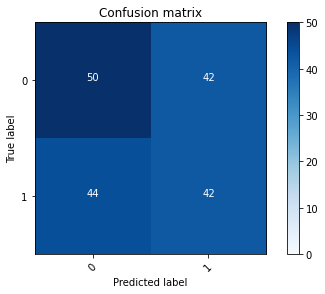

2022-08-20 21:45:40 - [Epoch Train: 77] loss: 0.0267, auc: 0.9995, acc: 0.9938, time: 51.00 s            
2022-08-20 21:45:40 - [Epoch Valid: 77] loss: 3.1664, auc: 0.5235, acc: 0.4942, time: 13.00 s


 77%|██████████████████████████████▊         | 77/100 [1:23:33<24:45, 64.61s/it]

2022-08-20 21:45:40 - EPOCH: 78
2022-08-20 21:45:41 - Train Step 10/973, train_loss: 0.0077
2022-08-20 21:45:41 - Train Step 20/973, train_loss: 0.0096
2022-08-20 21:45:42 - Train Step 30/973, train_loss: 0.0069
2022-08-20 21:45:42 - Train Step 40/973, train_loss: 0.0057
2022-08-20 21:45:43 - Train Step 50/973, train_loss: 0.0116
2022-08-20 21:45:43 - Train Step 60/973, train_loss: 0.0101
2022-08-20 21:45:44 - Train Step 70/973, train_loss: 0.0116
2022-08-20 21:45:44 - Train Step 80/973, train_loss: 0.0137
2022-08-20 21:45:45 - Train Step 90/973, train_loss: 0.0126
2022-08-20 21:45:45 - Train Step 100/973, train_loss: 0.0117
2022-08-20 21:45:46 - Train Step 110/973, train_loss: 0.0156
2022-08-20 21:45:46 - Train Step 120/973, train_loss: 0.0155
2022-08-20 21:45:47 - Train Step 130/973, train_loss: 0.0164
2022-08-20 21:45:47 - Train Step 140/973, train_loss: 0.0156
2022-08-20 21:45:48 - Train Step 150/973, train_loss: 0.0147
2022-08-20 21:45:48 - Train Step 160/973, train_loss: 0.0145
2

2022-08-20 21:46:40 - Valid Step 185/257, valid_loss: 3.3030
2022-08-20 21:46:40 - Valid Step 190/257, valid_loss: 3.3572
2022-08-20 21:46:40 - Valid Step 195/257, valid_loss: 3.3378
2022-08-20 21:46:41 - Valid Step 200/257, valid_loss: 3.4143
2022-08-20 21:46:41 - Valid Step 205/257, valid_loss: 3.3558
2022-08-20 21:46:41 - Valid Step 210/257, valid_loss: 3.3174
2022-08-20 21:46:41 - Valid Step 215/257, valid_loss: 3.4383
2022-08-20 21:46:42 - Valid Step 220/257, valid_loss: 3.4177
2022-08-20 21:46:42 - Valid Step 225/257, valid_loss: 3.3962
2022-08-20 21:46:42 - Valid Step 230/257, valid_loss: 3.3408
2022-08-20 21:46:42 - Valid Step 235/257, valid_loss: 3.3622
2022-08-20 21:46:43 - Valid Step 240/257, valid_loss: 3.2931
2022-08-20 21:46:43 - Valid Step 245/257, valid_loss: 3.2658
2022-08-20 21:46:43 - Valid Step 250/257, valid_loss: 3.2550
2022-08-20 21:46:43 - Valid Step 255/257, valid_loss: 3.2801
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

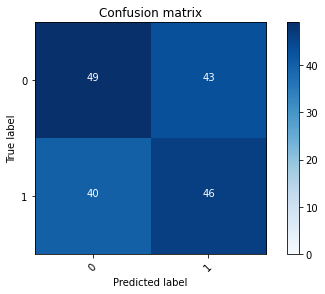

2022-08-20 21:46:44 - [Epoch Train: 78] loss: 0.0220, auc: 0.9999, acc: 0.9969, time: 50.00 s            
2022-08-20 21:46:44 - [Epoch Valid: 78] loss: 3.3379, auc: 0.5216, acc: 0.5058, time: 13.00 s


 78%|███████████████████████████████▏        | 78/100 [1:24:36<23:34, 64.29s/it]

2022-08-20 21:46:44 - EPOCH: 79
2022-08-20 21:46:44 - Train Step 10/973, train_loss: 0.0135
2022-08-20 21:46:45 - Train Step 20/973, train_loss: 0.0192
2022-08-20 21:46:45 - Train Step 30/973, train_loss: 0.0391
2022-08-20 21:46:46 - Train Step 40/973, train_loss: 0.0343
2022-08-20 21:46:46 - Train Step 50/973, train_loss: 0.0284
2022-08-20 21:46:47 - Train Step 60/973, train_loss: 0.0240
2022-08-20 21:46:47 - Train Step 70/973, train_loss: 0.0238
2022-08-20 21:46:48 - Train Step 80/973, train_loss: 0.0224
2022-08-20 21:46:48 - Train Step 90/973, train_loss: 0.0211
2022-08-20 21:46:49 - Train Step 100/973, train_loss: 0.0190
2022-08-20 21:46:49 - Train Step 110/973, train_loss: 0.0182
2022-08-20 21:46:50 - Train Step 120/973, train_loss: 0.0167
2022-08-20 21:46:50 - Train Step 130/973, train_loss: 0.0210
2022-08-20 21:46:51 - Train Step 140/973, train_loss: 0.0214
2022-08-20 21:46:51 - Train Step 150/973, train_loss: 0.0203
2022-08-20 21:46:52 - Train Step 160/973, train_loss: 0.0192
2

2022-08-20 21:47:44 - Valid Step 185/257, valid_loss: 3.5807
2022-08-20 21:47:44 - Valid Step 190/257, valid_loss: 3.5320
2022-08-20 21:47:45 - Valid Step 195/257, valid_loss: 3.4462
2022-08-20 21:47:45 - Valid Step 200/257, valid_loss: 3.6139
2022-08-20 21:47:45 - Valid Step 205/257, valid_loss: 3.6050
2022-08-20 21:47:45 - Valid Step 210/257, valid_loss: 3.5435
2022-08-20 21:47:46 - Valid Step 215/257, valid_loss: 3.5047
2022-08-20 21:47:46 - Valid Step 220/257, valid_loss: 3.5259
2022-08-20 21:47:46 - Valid Step 225/257, valid_loss: 3.5334
2022-08-20 21:47:46 - Valid Step 230/257, valid_loss: 3.5067
2022-08-20 21:47:47 - Valid Step 235/257, valid_loss: 3.4370
2022-08-20 21:47:47 - Valid Step 240/257, valid_loss: 3.3985
2022-08-20 21:47:47 - Valid Step 245/257, valid_loss: 3.3755
2022-08-20 21:47:47 - Valid Step 250/257, valid_loss: 3.4322
2022-08-20 21:47:48 - Valid Step 255/257, valid_loss: 3.4428
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

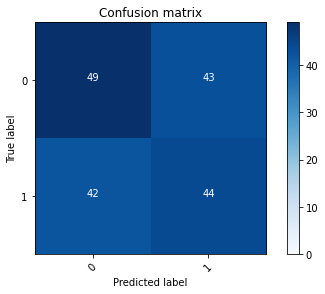

2022-08-20 21:47:48 - [Epoch Train: 79] loss: 0.0169, auc: 1.0000, acc: 0.9990, time: 50.00 s            
2022-08-20 21:47:48 - [Epoch Valid: 79] loss: 3.4160, auc: 0.5264, acc: 0.4981, time: 13.00 s


 79%|███████████████████████████████▌        | 79/100 [1:25:41<22:30, 64.32s/it]

2022-08-20 21:47:48 - EPOCH: 80
2022-08-20 21:47:49 - Train Step 10/973, train_loss: 0.0018
2022-08-20 21:47:49 - Train Step 20/973, train_loss: 0.0093
2022-08-20 21:47:50 - Train Step 30/973, train_loss: 0.0063
2022-08-20 21:47:50 - Train Step 40/973, train_loss: 0.0049
2022-08-20 21:47:51 - Train Step 50/973, train_loss: 0.0044
2022-08-20 21:47:51 - Train Step 60/973, train_loss: 0.0044
2022-08-20 21:47:52 - Train Step 70/973, train_loss: 0.0044
2022-08-20 21:47:52 - Train Step 80/973, train_loss: 0.0057
2022-08-20 21:47:53 - Train Step 90/973, train_loss: 0.0080
2022-08-20 21:47:53 - Train Step 100/973, train_loss: 0.0074
2022-08-20 21:47:54 - Train Step 110/973, train_loss: 0.0071
2022-08-20 21:47:54 - Train Step 120/973, train_loss: 0.0066
2022-08-20 21:47:55 - Train Step 130/973, train_loss: 0.0064
2022-08-20 21:47:55 - Train Step 140/973, train_loss: 0.0062
2022-08-20 21:47:56 - Train Step 150/973, train_loss: 0.0102
2022-08-20 21:47:56 - Train Step 160/973, train_loss: 0.0098
2

2022-08-20 21:48:47 - Valid Step 185/257, valid_loss: 3.2504
2022-08-20 21:48:48 - Valid Step 190/257, valid_loss: 3.2199
2022-08-20 21:48:48 - Valid Step 195/257, valid_loss: 3.2533
2022-08-20 21:48:48 - Valid Step 200/257, valid_loss: 3.3260
2022-08-20 21:48:48 - Valid Step 205/257, valid_loss: 3.2988
2022-08-20 21:48:49 - Valid Step 210/257, valid_loss: 3.2997
2022-08-20 21:48:49 - Valid Step 215/257, valid_loss: 3.2337
2022-08-20 21:48:49 - Valid Step 220/257, valid_loss: 3.2096
2022-08-20 21:48:49 - Valid Step 225/257, valid_loss: 3.2330
2022-08-20 21:48:50 - Valid Step 230/257, valid_loss: 3.3321
2022-08-20 21:48:50 - Valid Step 235/257, valid_loss: 3.3776
2022-08-20 21:48:50 - Valid Step 240/257, valid_loss: 3.3617
2022-08-20 21:48:51 - Valid Step 245/257, valid_loss: 3.3036
2022-08-20 21:48:51 - Valid Step 250/257, valid_loss: 3.3223
2022-08-20 21:48:51 - Valid Step 255/257, valid_loss: 3.2780
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

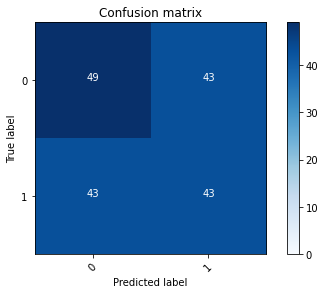

2022-08-20 21:48:51 - [Epoch Train: 80] loss: 0.0243, auc: 0.9998, acc: 0.9949, time: 49.00 s            
2022-08-20 21:48:51 - [Epoch Valid: 80] loss: 3.2525, auc: 0.5299, acc: 0.4942, time: 13.00 s


 80%|████████████████████████████████        | 80/100 [1:26:44<21:20, 64.03s/it]

2022-08-20 21:48:51 - EPOCH: 81
2022-08-20 21:48:52 - Train Step 10/973, train_loss: 0.0185
2022-08-20 21:48:52 - Train Step 20/973, train_loss: 0.0168
2022-08-20 21:48:53 - Train Step 30/973, train_loss: 0.0135
2022-08-20 21:48:53 - Train Step 40/973, train_loss: 0.0130
2022-08-20 21:48:54 - Train Step 50/973, train_loss: 0.0113
2022-08-20 21:48:54 - Train Step 60/973, train_loss: 0.0116
2022-08-20 21:48:55 - Train Step 70/973, train_loss: 0.0114
2022-08-20 21:48:55 - Train Step 80/973, train_loss: 0.0116
2022-08-20 21:48:56 - Train Step 90/973, train_loss: 0.0115
2022-08-20 21:48:56 - Train Step 100/973, train_loss: 0.0130
2022-08-20 21:48:57 - Train Step 110/973, train_loss: 0.0155
2022-08-20 21:48:57 - Train Step 120/973, train_loss: 0.0144
2022-08-20 21:48:58 - Train Step 130/973, train_loss: 0.0138
2022-08-20 21:48:58 - Train Step 140/973, train_loss: 0.0149
2022-08-20 21:48:59 - Train Step 150/973, train_loss: 0.0152
2022-08-20 21:49:00 - Train Step 160/973, train_loss: 0.0163
2

2022-08-20 21:49:51 - Valid Step 185/257, valid_loss: 3.3935
2022-08-20 21:49:51 - Valid Step 190/257, valid_loss: 3.3495
2022-08-20 21:49:52 - Valid Step 195/257, valid_loss: 3.3066
2022-08-20 21:49:52 - Valid Step 200/257, valid_loss: 3.2254
2022-08-20 21:49:52 - Valid Step 205/257, valid_loss: 3.1487
2022-08-20 21:49:52 - Valid Step 210/257, valid_loss: 3.0861
2022-08-20 21:49:53 - Valid Step 215/257, valid_loss: 3.0762
2022-08-20 21:49:53 - Valid Step 220/257, valid_loss: 3.0335
2022-08-20 21:49:53 - Valid Step 225/257, valid_loss: 3.0812
2022-08-20 21:49:53 - Valid Step 230/257, valid_loss: 3.0925
2022-08-20 21:49:54 - Valid Step 235/257, valid_loss: 3.0815
2022-08-20 21:49:54 - Valid Step 240/257, valid_loss: 3.1445
2022-08-20 21:49:54 - Valid Step 245/257, valid_loss: 3.2150
2022-08-20 21:49:54 - Valid Step 250/257, valid_loss: 3.2025
2022-08-20 21:49:55 - Valid Step 255/257, valid_loss: 3.2655
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

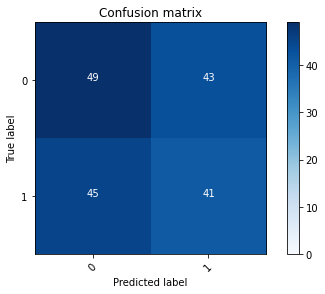

2022-08-20 21:49:55 - [Epoch Train: 81] loss: 0.0164, auc: 0.9999, acc: 0.9979, time: 50.00 s            
2022-08-20 21:49:55 - [Epoch Valid: 81] loss: 3.2708, auc: 0.5290, acc: 0.4864, time: 13.00 s


 81%|████████████████████████████████▍       | 81/100 [1:27:48<20:13, 63.89s/it]

2022-08-20 21:49:55 - EPOCH: 82
2022-08-20 21:49:56 - Train Step 10/973, train_loss: 0.0247
2022-08-20 21:49:56 - Train Step 20/973, train_loss: 0.0155
2022-08-20 21:49:57 - Train Step 30/973, train_loss: 0.0163
2022-08-20 21:49:57 - Train Step 40/973, train_loss: 0.0144
2022-08-20 21:49:58 - Train Step 50/973, train_loss: 0.0143
2022-08-20 21:49:58 - Train Step 60/973, train_loss: 0.0168
2022-08-20 21:49:59 - Train Step 70/973, train_loss: 0.0152
2022-08-20 21:49:59 - Train Step 80/973, train_loss: 0.0210
2022-08-20 21:50:00 - Train Step 90/973, train_loss: 0.0211
2022-08-20 21:50:00 - Train Step 100/973, train_loss: 0.0207
2022-08-20 21:50:01 - Train Step 110/973, train_loss: 0.0189
2022-08-20 21:50:01 - Train Step 120/973, train_loss: 0.0179
2022-08-20 21:50:02 - Train Step 130/973, train_loss: 0.0174
2022-08-20 21:50:02 - Train Step 140/973, train_loss: 0.0168
2022-08-20 21:50:03 - Train Step 150/973, train_loss: 0.0167
2022-08-20 21:50:03 - Train Step 160/973, train_loss: 0.0213
2

2022-08-20 21:50:55 - Valid Step 185/257, valid_loss: 3.6234
2022-08-20 21:50:55 - Valid Step 190/257, valid_loss: 3.5384
2022-08-20 21:50:56 - Valid Step 195/257, valid_loss: 3.4848
2022-08-20 21:50:56 - Valid Step 200/257, valid_loss: 3.4033
2022-08-20 21:50:56 - Valid Step 205/257, valid_loss: 3.3869
2022-08-20 21:50:56 - Valid Step 210/257, valid_loss: 3.4614
2022-08-20 21:50:57 - Valid Step 215/257, valid_loss: 3.5244
2022-08-20 21:50:57 - Valid Step 220/257, valid_loss: 3.5486
2022-08-20 21:50:57 - Valid Step 225/257, valid_loss: 3.5607
2022-08-20 21:50:57 - Valid Step 230/257, valid_loss: 3.5410
2022-08-20 21:50:58 - Valid Step 235/257, valid_loss: 3.5096
2022-08-20 21:50:58 - Valid Step 240/257, valid_loss: 3.5276
2022-08-20 21:50:58 - Valid Step 245/257, valid_loss: 3.5755
2022-08-20 21:50:58 - Valid Step 250/257, valid_loss: 3.5137
2022-08-20 21:50:59 - Valid Step 255/257, valid_loss: 3.5450
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

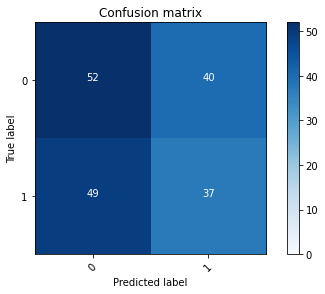

2022-08-20 21:50:59 - [Epoch Train: 82] loss: 0.0161, auc: 1.0000, acc: 0.9990, time: 50.00 s            
2022-08-20 21:50:59 - [Epoch Valid: 82] loss: 3.5174, auc: 0.5309, acc: 0.4825, time: 13.00 s


 82%|████████████████████████████████▊       | 82/100 [1:28:52<19:11, 63.97s/it]

2022-08-20 21:50:59 - EPOCH: 83
2022-08-20 21:51:00 - Train Step 10/973, train_loss: 0.0338
2022-08-20 21:51:00 - Train Step 20/973, train_loss: 0.0186
2022-08-20 21:51:01 - Train Step 30/973, train_loss: 0.0143
2022-08-20 21:51:01 - Train Step 40/973, train_loss: 0.0116
2022-08-20 21:51:02 - Train Step 50/973, train_loss: 0.0163
2022-08-20 21:51:02 - Train Step 60/973, train_loss: 0.0138
2022-08-20 21:51:03 - Train Step 70/973, train_loss: 0.0133
2022-08-20 21:51:03 - Train Step 80/973, train_loss: 0.0132
2022-08-20 21:51:04 - Train Step 90/973, train_loss: 0.0145
2022-08-20 21:51:04 - Train Step 100/973, train_loss: 0.0139
2022-08-20 21:51:05 - Train Step 110/973, train_loss: 0.0126
2022-08-20 21:51:05 - Train Step 120/973, train_loss: 0.0117
2022-08-20 21:51:06 - Train Step 130/973, train_loss: 0.0174
2022-08-20 21:51:06 - Train Step 140/973, train_loss: 0.0162
2022-08-20 21:51:07 - Train Step 150/973, train_loss: 0.0158
2022-08-20 21:51:07 - Train Step 160/973, train_loss: 0.0176
2

2022-08-20 21:51:59 - Valid Step 185/257, valid_loss: 3.6315
2022-08-20 21:51:59 - Valid Step 190/257, valid_loss: 3.5426
2022-08-20 21:52:00 - Valid Step 195/257, valid_loss: 3.4980
2022-08-20 21:52:00 - Valid Step 200/257, valid_loss: 3.4108
2022-08-20 21:52:00 - Valid Step 205/257, valid_loss: 3.3672
2022-08-20 21:52:00 - Valid Step 210/257, valid_loss: 3.3982
2022-08-20 21:52:01 - Valid Step 215/257, valid_loss: 3.4298
2022-08-20 21:52:01 - Valid Step 220/257, valid_loss: 3.3755
2022-08-20 21:52:01 - Valid Step 225/257, valid_loss: 3.3328
2022-08-20 21:52:01 - Valid Step 230/257, valid_loss: 3.2610
2022-08-20 21:52:02 - Valid Step 235/257, valid_loss: 3.2341
2022-08-20 21:52:02 - Valid Step 240/257, valid_loss: 3.2591
2022-08-20 21:52:02 - Valid Step 245/257, valid_loss: 3.2253
2022-08-20 21:52:02 - Valid Step 250/257, valid_loss: 3.3227
2022-08-20 21:52:03 - Valid Step 255/257, valid_loss: 3.3537
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

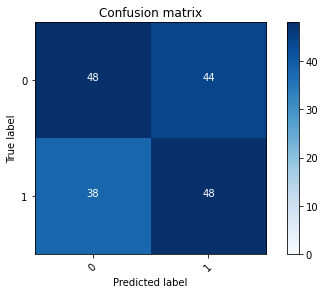

2022-08-20 21:52:03 - [Epoch Train: 83] loss: 0.0197, auc: 0.9998, acc: 0.9959, time: 50.00 s            
2022-08-20 21:52:03 - [Epoch Valid: 83] loss: 3.3821, auc: 0.5184, acc: 0.5097, time: 13.00 s


 83%|█████████████████████████████████▏      | 83/100 [1:29:56<18:07, 63.98s/it]

2022-08-20 21:52:03 - EPOCH: 84
2022-08-20 21:52:04 - Train Step 10/973, train_loss: 0.0399
2022-08-20 21:52:04 - Train Step 20/973, train_loss: 0.0234
2022-08-20 21:52:05 - Train Step 30/973, train_loss: 0.0221
2022-08-20 21:52:05 - Train Step 40/973, train_loss: 0.0212
2022-08-20 21:52:06 - Train Step 50/973, train_loss: 0.0174
2022-08-20 21:52:06 - Train Step 60/973, train_loss: 0.0169
2022-08-20 21:52:07 - Train Step 70/973, train_loss: 0.0145
2022-08-20 21:52:07 - Train Step 80/973, train_loss: 0.0138
2022-08-20 21:52:08 - Train Step 90/973, train_loss: 0.0132
2022-08-20 21:52:08 - Train Step 100/973, train_loss: 0.0124
2022-08-20 21:52:09 - Train Step 110/973, train_loss: 0.0116
2022-08-20 21:52:09 - Train Step 120/973, train_loss: 0.0108
2022-08-20 21:52:10 - Train Step 130/973, train_loss: 0.0102
2022-08-20 21:52:11 - Train Step 140/973, train_loss: 0.0097
2022-08-20 21:52:11 - Train Step 150/973, train_loss: 0.0097
2022-08-20 21:52:12 - Train Step 160/973, train_loss: 0.0135
2

2022-08-20 21:53:03 - Valid Step 185/257, valid_loss: 4.0880
2022-08-20 21:53:03 - Valid Step 190/257, valid_loss: 4.0065
2022-08-20 21:53:04 - Valid Step 195/257, valid_loss: 3.9403
2022-08-20 21:53:04 - Valid Step 200/257, valid_loss: 3.8660
2022-08-20 21:53:04 - Valid Step 205/257, valid_loss: 3.8863
2022-08-20 21:53:04 - Valid Step 210/257, valid_loss: 3.8992
2022-08-20 21:53:05 - Valid Step 215/257, valid_loss: 3.8491
2022-08-20 21:53:05 - Valid Step 220/257, valid_loss: 3.8079
2022-08-20 21:53:05 - Valid Step 225/257, valid_loss: 3.7831
2022-08-20 21:53:06 - Valid Step 230/257, valid_loss: 3.9353
2022-08-20 21:53:06 - Valid Step 235/257, valid_loss: 3.9072
2022-08-20 21:53:06 - Valid Step 240/257, valid_loss: 3.8802
2022-08-20 21:53:06 - Valid Step 245/257, valid_loss: 3.8821
2022-08-20 21:53:07 - Valid Step 250/257, valid_loss: 3.8642
2022-08-20 21:53:07 - Valid Step 255/257, valid_loss: 3.8839
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

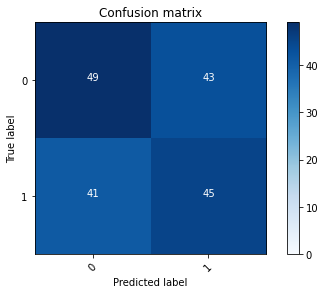

2022-08-20 21:53:07 - [Epoch Train: 84] loss: 0.0153, auc: 1.0000, acc: 0.9959, time: 50.00 s            
2022-08-20 21:53:07 - [Epoch Valid: 84] loss: 3.8922, auc: 0.5274, acc: 0.5019, time: 13.00 s


 84%|█████████████████████████████████▌      | 84/100 [1:31:00<17:04, 64.02s/it]

2022-08-20 21:53:07 - EPOCH: 85
2022-08-20 21:53:08 - Train Step 10/973, train_loss: 0.0013
2022-08-20 21:53:08 - Train Step 20/973, train_loss: 0.0011
2022-08-20 21:53:09 - Train Step 30/973, train_loss: 0.0012
2022-08-20 21:53:09 - Train Step 40/973, train_loss: 0.0065
2022-08-20 21:53:10 - Train Step 50/973, train_loss: 0.0056
2022-08-20 21:53:10 - Train Step 60/973, train_loss: 0.0050
2022-08-20 21:53:11 - Train Step 70/973, train_loss: 0.0067
2022-08-20 21:53:11 - Train Step 80/973, train_loss: 0.0062
2022-08-20 21:53:12 - Train Step 90/973, train_loss: 0.0058
2022-08-20 21:53:12 - Train Step 100/973, train_loss: 0.0059
2022-08-20 21:53:13 - Train Step 110/973, train_loss: 0.0060
2022-08-20 21:53:13 - Train Step 120/973, train_loss: 0.0057
2022-08-20 21:53:14 - Train Step 130/973, train_loss: 0.0058
2022-08-20 21:53:15 - Train Step 140/973, train_loss: 0.0098
2022-08-20 21:53:15 - Train Step 150/973, train_loss: 0.0103
2022-08-20 21:53:16 - Train Step 160/973, train_loss: 0.0100
2

2022-08-20 21:54:07 - Valid Step 185/257, valid_loss: 3.1325
2022-08-20 21:54:07 - Valid Step 190/257, valid_loss: 3.0772
2022-08-20 21:54:08 - Valid Step 195/257, valid_loss: 3.0018
2022-08-20 21:54:08 - Valid Step 200/257, valid_loss: 2.9689
2022-08-20 21:54:08 - Valid Step 205/257, valid_loss: 2.9197
2022-08-20 21:54:08 - Valid Step 210/257, valid_loss: 2.9045
2022-08-20 21:54:09 - Valid Step 215/257, valid_loss: 2.9902
2022-08-20 21:54:09 - Valid Step 220/257, valid_loss: 2.9341
2022-08-20 21:54:09 - Valid Step 225/257, valid_loss: 2.9284
2022-08-20 21:54:09 - Valid Step 230/257, valid_loss: 2.8850
2022-08-20 21:54:10 - Valid Step 235/257, valid_loss: 2.8778
2022-08-20 21:54:10 - Valid Step 240/257, valid_loss: 2.8410
2022-08-20 21:54:10 - Valid Step 245/257, valid_loss: 2.8768
2022-08-20 21:54:10 - Valid Step 250/257, valid_loss: 2.8610
2022-08-20 21:54:11 - Valid Step 255/257, valid_loss: 2.8342
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

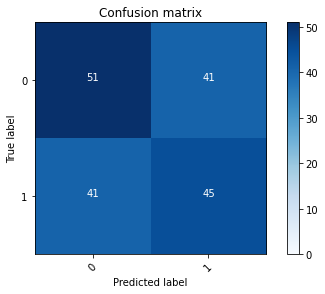

2022-08-20 21:54:11 - [Epoch Train: 85] loss: 0.0167, auc: 1.0000, acc: 0.9979, time: 50.00 s            
2022-08-20 21:54:11 - [Epoch Valid: 85] loss: 2.8160, auc: 0.5271, acc: 0.5136, time: 13.00 s


 85%|██████████████████████████████████      | 85/100 [1:32:04<15:59, 63.95s/it]

2022-08-20 21:54:11 - EPOCH: 86
2022-08-20 21:54:12 - Train Step 10/973, train_loss: 0.0055
2022-08-20 21:54:12 - Train Step 20/973, train_loss: 0.0042
2022-08-20 21:54:13 - Train Step 30/973, train_loss: 0.0108
2022-08-20 21:54:13 - Train Step 40/973, train_loss: 0.0099
2022-08-20 21:54:14 - Train Step 50/973, train_loss: 0.0080
2022-08-20 21:54:14 - Train Step 60/973, train_loss: 0.0067
2022-08-20 21:54:15 - Train Step 70/973, train_loss: 0.0059
2022-08-20 21:54:15 - Train Step 80/973, train_loss: 0.0143
2022-08-20 21:54:16 - Train Step 90/973, train_loss: 0.0128
2022-08-20 21:54:16 - Train Step 100/973, train_loss: 0.0117
2022-08-20 21:54:17 - Train Step 110/973, train_loss: 0.0142
2022-08-20 21:54:17 - Train Step 120/973, train_loss: 0.0140
2022-08-20 21:54:18 - Train Step 130/973, train_loss: 0.0170
2022-08-20 21:54:18 - Train Step 140/973, train_loss: 0.0174
2022-08-20 21:54:19 - Train Step 150/973, train_loss: 0.0163
2022-08-20 21:54:19 - Train Step 160/973, train_loss: 0.0160
2

2022-08-20 21:55:10 - Valid Step 185/257, valid_loss: 3.6320
2022-08-20 21:55:11 - Valid Step 190/257, valid_loss: 3.5367
2022-08-20 21:55:11 - Valid Step 195/257, valid_loss: 3.5008
2022-08-20 21:55:11 - Valid Step 200/257, valid_loss: 3.4410
2022-08-20 21:55:12 - Valid Step 205/257, valid_loss: 3.4332
2022-08-20 21:55:12 - Valid Step 210/257, valid_loss: 3.5109
2022-08-20 21:55:12 - Valid Step 215/257, valid_loss: 3.5016
2022-08-20 21:55:12 - Valid Step 220/257, valid_loss: 3.4741
2022-08-20 21:55:13 - Valid Step 225/257, valid_loss: 3.4639
2022-08-20 21:55:13 - Valid Step 230/257, valid_loss: 3.4342
2022-08-20 21:55:13 - Valid Step 235/257, valid_loss: 3.4622
2022-08-20 21:55:13 - Valid Step 240/257, valid_loss: 3.6145
2022-08-20 21:55:14 - Valid Step 245/257, valid_loss: 3.5622
2022-08-20 21:55:14 - Valid Step 250/257, valid_loss: 3.5825
2022-08-20 21:55:14 - Valid Step 255/257, valid_loss: 3.5188
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

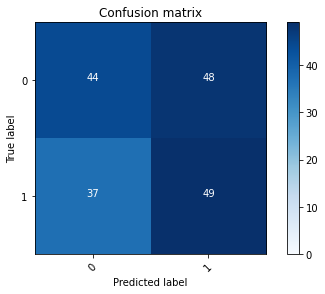

2022-08-20 21:55:14 - [Epoch Train: 86] loss: 0.0210, auc: 0.9998, acc: 0.9918, time: 50.00 s            
2022-08-20 21:55:14 - [Epoch Valid: 86] loss: 3.5029, auc: 0.5221, acc: 0.4981, time: 13.00 s


 86%|██████████████████████████████████▍     | 86/100 [1:33:07<14:53, 63.81s/it]

2022-08-20 21:55:14 - EPOCH: 87
2022-08-20 21:55:15 - Train Step 10/973, train_loss: 0.0015
2022-08-20 21:55:16 - Train Step 20/973, train_loss: 0.0017
2022-08-20 21:55:16 - Train Step 30/973, train_loss: 0.0026
2022-08-20 21:55:17 - Train Step 40/973, train_loss: 0.0053
2022-08-20 21:55:17 - Train Step 50/973, train_loss: 0.0245
2022-08-20 21:55:18 - Train Step 60/973, train_loss: 0.0252
2022-08-20 21:55:18 - Train Step 70/973, train_loss: 0.0299
2022-08-20 21:55:19 - Train Step 80/973, train_loss: 0.0265
2022-08-20 21:55:19 - Train Step 90/973, train_loss: 0.0244
2022-08-20 21:55:20 - Train Step 100/973, train_loss: 0.0224
2022-08-20 21:55:20 - Train Step 110/973, train_loss: 0.0209
2022-08-20 21:55:21 - Train Step 120/973, train_loss: 0.0216
2022-08-20 21:55:21 - Train Step 130/973, train_loss: 0.0200
2022-08-20 21:55:22 - Train Step 140/973, train_loss: 0.0191
2022-08-20 21:55:22 - Train Step 150/973, train_loss: 0.0194
2022-08-20 21:55:23 - Train Step 160/973, train_loss: 0.0185
2

2022-08-20 21:56:14 - Valid Step 185/257, valid_loss: 3.4393
2022-08-20 21:56:15 - Valid Step 190/257, valid_loss: 3.4885
2022-08-20 21:56:15 - Valid Step 195/257, valid_loss: 3.4922
2022-08-20 21:56:15 - Valid Step 200/257, valid_loss: 3.4556
2022-08-20 21:56:15 - Valid Step 205/257, valid_loss: 3.5020
2022-08-20 21:56:15 - Valid Step 210/257, valid_loss: 3.4706
2022-08-20 21:56:16 - Valid Step 215/257, valid_loss: 3.4376
2022-08-20 21:56:16 - Valid Step 220/257, valid_loss: 3.3595
2022-08-20 21:56:16 - Valid Step 225/257, valid_loss: 3.3945
2022-08-20 21:56:17 - Valid Step 230/257, valid_loss: 3.3950
2022-08-20 21:56:17 - Valid Step 235/257, valid_loss: 3.4328
2022-08-20 21:56:17 - Valid Step 240/257, valid_loss: 3.4563
2022-08-20 21:56:17 - Valid Step 245/257, valid_loss: 3.4141
2022-08-20 21:56:18 - Valid Step 250/257, valid_loss: 3.4278
2022-08-20 21:56:18 - Valid Step 255/257, valid_loss: 3.3937
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

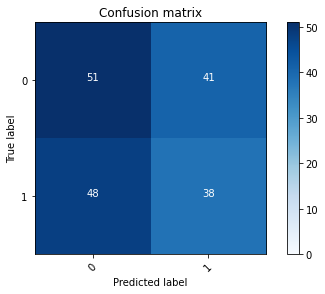

2022-08-20 21:56:18 - [Epoch Train: 87] loss: 0.0190, auc: 1.0000, acc: 0.9979, time: 50.00 s            
2022-08-20 21:56:18 - [Epoch Valid: 87] loss: 3.4339, auc: 0.5263, acc: 0.4825, time: 13.00 s


 87%|██████████████████████████████████▊     | 87/100 [1:34:11<13:49, 63.77s/it]

2022-08-20 21:56:18 - EPOCH: 88
2022-08-20 21:56:19 - Train Step 10/973, train_loss: 0.0256
2022-08-20 21:56:19 - Train Step 20/973, train_loss: 0.0169
2022-08-20 21:56:20 - Train Step 30/973, train_loss: 0.0173
2022-08-20 21:56:20 - Train Step 40/973, train_loss: 0.0132
2022-08-20 21:56:21 - Train Step 50/973, train_loss: 0.0134
2022-08-20 21:56:21 - Train Step 60/973, train_loss: 0.0144
2022-08-20 21:56:22 - Train Step 70/973, train_loss: 0.0124
2022-08-20 21:56:22 - Train Step 80/973, train_loss: 0.0110
2022-08-20 21:56:23 - Train Step 90/973, train_loss: 0.0116
2022-08-20 21:56:23 - Train Step 100/973, train_loss: 0.0113
2022-08-20 21:56:24 - Train Step 110/973, train_loss: 0.0105
2022-08-20 21:56:25 - Train Step 120/973, train_loss: 0.0101
2022-08-20 21:56:25 - Train Step 130/973, train_loss: 0.0094
2022-08-20 21:56:26 - Train Step 140/973, train_loss: 0.0088
2022-08-20 21:56:26 - Train Step 150/973, train_loss: 0.0084
2022-08-20 21:56:27 - Train Step 160/973, train_loss: 0.0083
2

2022-08-20 21:57:18 - Valid Step 185/257, valid_loss: 4.4099
2022-08-20 21:57:19 - Valid Step 190/257, valid_loss: 4.3378
2022-08-20 21:57:19 - Valid Step 195/257, valid_loss: 4.3743
2022-08-20 21:57:19 - Valid Step 200/257, valid_loss: 4.3783
2022-08-20 21:57:19 - Valid Step 205/257, valid_loss: 4.3225
2022-08-20 21:57:20 - Valid Step 210/257, valid_loss: 4.2934
2022-08-20 21:57:20 - Valid Step 215/257, valid_loss: 4.2952
2022-08-20 21:57:20 - Valid Step 220/257, valid_loss: 4.2901
2022-08-20 21:57:20 - Valid Step 225/257, valid_loss: 4.2111
2022-08-20 21:57:21 - Valid Step 230/257, valid_loss: 4.2319
2022-08-20 21:57:21 - Valid Step 235/257, valid_loss: 4.2775
2022-08-20 21:57:21 - Valid Step 240/257, valid_loss: 4.2519
2022-08-20 21:57:21 - Valid Step 245/257, valid_loss: 4.1731
2022-08-20 21:57:22 - Valid Step 250/257, valid_loss: 4.1929
2022-08-20 21:57:22 - Valid Step 255/257, valid_loss: 4.1438
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

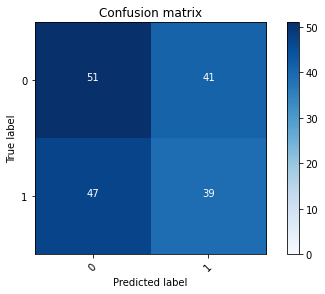

2022-08-20 21:57:22 - [Epoch Train: 88] loss: 0.0131, auc: 1.0000, acc: 0.9969, time: 50.00 s            
2022-08-20 21:57:22 - [Epoch Valid: 88] loss: 4.1715, auc: 0.5240, acc: 0.4903, time: 13.00 s


 88%|███████████████████████████████████▏    | 88/100 [1:35:15<12:46, 63.89s/it]

2022-08-20 21:57:22 - EPOCH: 89
2022-08-20 21:57:23 - Train Step 10/973, train_loss: 0.0015
2022-08-20 21:57:23 - Train Step 20/973, train_loss: 0.0050
2022-08-20 21:57:24 - Train Step 30/973, train_loss: 0.0387
2022-08-20 21:57:24 - Train Step 40/973, train_loss: 0.0294
2022-08-20 21:57:25 - Train Step 50/973, train_loss: 0.0241
2022-08-20 21:57:25 - Train Step 60/973, train_loss: 0.0302
2022-08-20 21:57:26 - Train Step 70/973, train_loss: 0.0264
2022-08-20 21:57:26 - Train Step 80/973, train_loss: 0.0233
2022-08-20 21:57:27 - Train Step 90/973, train_loss: 0.0308
2022-08-20 21:57:28 - Train Step 100/973, train_loss: 0.0279
2022-08-20 21:57:28 - Train Step 110/973, train_loss: 0.0259
2022-08-20 21:57:29 - Train Step 120/973, train_loss: 0.0270
2022-08-20 21:57:29 - Train Step 130/973, train_loss: 0.0263
2022-08-20 21:57:30 - Train Step 140/973, train_loss: 0.0255
2022-08-20 21:57:30 - Train Step 150/973, train_loss: 0.0240
2022-08-20 21:57:31 - Train Step 160/973, train_loss: 0.0236
2

2022-08-20 21:58:22 - Valid Step 185/257, valid_loss: 3.5864
2022-08-20 21:58:22 - Valid Step 190/257, valid_loss: 3.6063
2022-08-20 21:58:23 - Valid Step 195/257, valid_loss: 3.5248
2022-08-20 21:58:23 - Valid Step 200/257, valid_loss: 3.4763
2022-08-20 21:58:23 - Valid Step 205/257, valid_loss: 3.4306
2022-08-20 21:58:23 - Valid Step 210/257, valid_loss: 3.4570
2022-08-20 21:58:24 - Valid Step 215/257, valid_loss: 3.4360
2022-08-20 21:58:24 - Valid Step 220/257, valid_loss: 3.3860
2022-08-20 21:58:24 - Valid Step 225/257, valid_loss: 3.4498
2022-08-20 21:58:24 - Valid Step 230/257, valid_loss: 3.3809
2022-08-20 21:58:25 - Valid Step 235/257, valid_loss: 3.3529
2022-08-20 21:58:25 - Valid Step 240/257, valid_loss: 3.3076
2022-08-20 21:58:25 - Valid Step 245/257, valid_loss: 3.2512
2022-08-20 21:58:25 - Valid Step 250/257, valid_loss: 3.2930
2022-08-20 21:58:26 - Valid Step 255/257, valid_loss: 3.2375
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

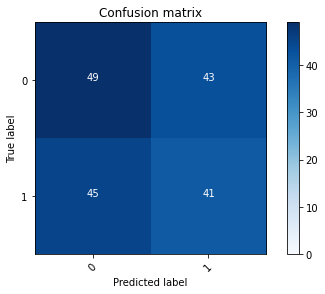

2022-08-20 21:58:26 - [Epoch Train: 89] loss: 0.0176, auc: 0.9998, acc: 0.9949, time: 49.00 s            
2022-08-20 21:58:26 - [Epoch Valid: 89] loss: 3.2124, auc: 0.5249, acc: 0.4864, time: 13.00 s


 89%|███████████████████████████████████▌    | 89/100 [1:36:19<11:42, 63.86s/it]

2022-08-20 21:58:26 - EPOCH: 90
2022-08-20 21:58:27 - Train Step 10/973, train_loss: 0.0082
2022-08-20 21:58:27 - Train Step 20/973, train_loss: 0.0193
2022-08-20 21:58:28 - Train Step 30/973, train_loss: 0.0356
2022-08-20 21:58:28 - Train Step 40/973, train_loss: 0.0287
2022-08-20 21:58:29 - Train Step 50/973, train_loss: 0.0243
2022-08-20 21:58:29 - Train Step 60/973, train_loss: 0.0203
2022-08-20 21:58:30 - Train Step 70/973, train_loss: 0.0175
2022-08-20 21:58:30 - Train Step 80/973, train_loss: 0.0156
2022-08-20 21:58:31 - Train Step 90/973, train_loss: 0.0152
2022-08-20 21:58:31 - Train Step 100/973, train_loss: 0.0139
2022-08-20 21:58:32 - Train Step 110/973, train_loss: 0.0135
2022-08-20 21:58:33 - Train Step 120/973, train_loss: 0.0126
2022-08-20 21:58:33 - Train Step 130/973, train_loss: 0.0117
2022-08-20 21:58:34 - Train Step 140/973, train_loss: 0.0110
2022-08-20 21:58:34 - Train Step 150/973, train_loss: 0.0103
2022-08-20 21:58:35 - Train Step 160/973, train_loss: 0.0140
2

2022-08-20 21:59:26 - Valid Step 185/257, valid_loss: 3.9009
2022-08-20 21:59:27 - Valid Step 190/257, valid_loss: 3.8719
2022-08-20 21:59:27 - Valid Step 195/257, valid_loss: 3.8277
2022-08-20 21:59:27 - Valid Step 200/257, valid_loss: 3.7717
2022-08-20 21:59:27 - Valid Step 205/257, valid_loss: 3.7536
2022-08-20 21:59:28 - Valid Step 210/257, valid_loss: 3.7072
2022-08-20 21:59:28 - Valid Step 215/257, valid_loss: 3.7620
2022-08-20 21:59:28 - Valid Step 220/257, valid_loss: 3.7335
2022-08-20 21:59:28 - Valid Step 225/257, valid_loss: 3.7674
2022-08-20 21:59:29 - Valid Step 230/257, valid_loss: 3.7972
2022-08-20 21:59:29 - Valid Step 235/257, valid_loss: 3.8364
2022-08-20 21:59:29 - Valid Step 240/257, valid_loss: 3.9148
2022-08-20 21:59:29 - Valid Step 245/257, valid_loss: 3.8810
2022-08-20 21:59:30 - Valid Step 250/257, valid_loss: 3.9161
2022-08-20 21:59:30 - Valid Step 255/257, valid_loss: 3.8946
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

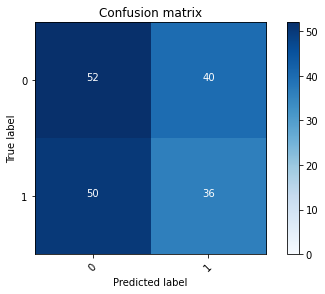

2022-08-20 21:59:30 - [Epoch Train: 90] loss: 0.0208, auc: 1.0000, acc: 0.9969, time: 50.00 s            
2022-08-20 21:59:30 - [Epoch Valid: 90] loss: 3.8868, auc: 0.5132, acc: 0.4786, time: 13.00 s


 90%|████████████████████████████████████    | 90/100 [1:37:23<10:39, 63.95s/it]

2022-08-20 21:59:30 - EPOCH: 91
2022-08-20 21:59:31 - Train Step 10/973, train_loss: 0.0310
2022-08-20 21:59:31 - Train Step 20/973, train_loss: 0.0172
2022-08-20 21:59:32 - Train Step 30/973, train_loss: 0.0138
2022-08-20 21:59:32 - Train Step 40/973, train_loss: 0.0126
2022-08-20 21:59:33 - Train Step 50/973, train_loss: 0.0219
2022-08-20 21:59:33 - Train Step 60/973, train_loss: 0.0185
2022-08-20 21:59:34 - Train Step 70/973, train_loss: 0.0165
2022-08-20 21:59:35 - Train Step 80/973, train_loss: 0.0151
2022-08-20 21:59:35 - Train Step 90/973, train_loss: 0.0138
2022-08-20 21:59:36 - Train Step 100/973, train_loss: 0.0127
2022-08-20 21:59:36 - Train Step 110/973, train_loss: 0.0120
2022-08-20 21:59:37 - Train Step 120/973, train_loss: 0.0113
2022-08-20 21:59:37 - Train Step 130/973, train_loss: 0.0107
2022-08-20 21:59:38 - Train Step 140/973, train_loss: 0.0099
2022-08-20 21:59:38 - Train Step 150/973, train_loss: 0.0108
2022-08-20 21:59:39 - Train Step 160/973, train_loss: 0.0102
2

2022-08-20 22:00:30 - Valid Step 185/257, valid_loss: 4.1812
2022-08-20 22:00:31 - Valid Step 190/257, valid_loss: 4.2973
2022-08-20 22:00:31 - Valid Step 195/257, valid_loss: 4.3148
2022-08-20 22:00:31 - Valid Step 200/257, valid_loss: 4.2174
2022-08-20 22:00:31 - Valid Step 205/257, valid_loss: 4.3053
2022-08-20 22:00:32 - Valid Step 210/257, valid_loss: 4.2674
2022-08-20 22:00:32 - Valid Step 215/257, valid_loss: 4.2193
2022-08-20 22:00:32 - Valid Step 220/257, valid_loss: 4.2440
2022-08-20 22:00:32 - Valid Step 225/257, valid_loss: 4.1951
2022-08-20 22:00:33 - Valid Step 230/257, valid_loss: 4.2682
2022-08-20 22:00:33 - Valid Step 235/257, valid_loss: 4.1875
2022-08-20 22:00:33 - Valid Step 240/257, valid_loss: 4.2029
2022-08-20 22:00:33 - Valid Step 245/257, valid_loss: 4.1356
2022-08-20 22:00:34 - Valid Step 250/257, valid_loss: 4.2497
2022-08-20 22:00:34 - Valid Step 255/257, valid_loss: 4.2841
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

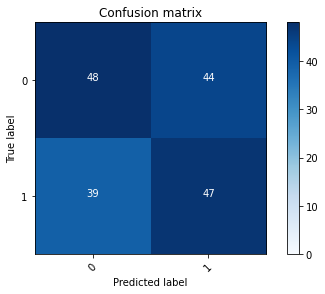

2022-08-20 22:00:34 - [Epoch Train: 91] loss: 0.0113, auc: 1.0000, acc: 0.9969, time: 50.00 s            
2022-08-20 22:00:34 - [Epoch Valid: 91] loss: 4.2616, auc: 0.5182, acc: 0.5058, time: 13.00 s


 91%|████████████████████████████████████▍   | 91/100 [1:38:27<09:36, 64.00s/it]

2022-08-20 22:00:34 - EPOCH: 92
2022-08-20 22:00:35 - Train Step 10/973, train_loss: 0.0054
2022-08-20 22:00:36 - Train Step 20/973, train_loss: 0.0469
2022-08-20 22:00:36 - Train Step 30/973, train_loss: 0.0321
2022-08-20 22:00:37 - Train Step 40/973, train_loss: 0.0242
2022-08-20 22:00:37 - Train Step 50/973, train_loss: 0.0365
2022-08-20 22:00:38 - Train Step 60/973, train_loss: 0.0330
2022-08-20 22:00:38 - Train Step 70/973, train_loss: 0.0284
2022-08-20 22:00:39 - Train Step 80/973, train_loss: 0.0253
2022-08-20 22:00:39 - Train Step 90/973, train_loss: 0.0291
2022-08-20 22:00:40 - Train Step 100/973, train_loss: 0.0268
2022-08-20 22:00:40 - Train Step 110/973, train_loss: 0.0300
2022-08-20 22:00:41 - Train Step 120/973, train_loss: 0.0282
2022-08-20 22:00:41 - Train Step 130/973, train_loss: 0.0263
2022-08-20 22:00:42 - Train Step 140/973, train_loss: 0.0245
2022-08-20 22:00:42 - Train Step 150/973, train_loss: 0.0229
2022-08-20 22:00:43 - Train Step 160/973, train_loss: 0.0217
2

2022-08-20 22:01:34 - Valid Step 185/257, valid_loss: 3.8819
2022-08-20 22:01:34 - Valid Step 190/257, valid_loss: 3.8060
2022-08-20 22:01:35 - Valid Step 195/257, valid_loss: 4.0039
2022-08-20 22:01:35 - Valid Step 200/257, valid_loss: 3.9764
2022-08-20 22:01:35 - Valid Step 205/257, valid_loss: 3.8803
2022-08-20 22:01:35 - Valid Step 210/257, valid_loss: 3.7959
2022-08-20 22:01:36 - Valid Step 215/257, valid_loss: 3.7867
2022-08-20 22:01:36 - Valid Step 220/257, valid_loss: 3.8097
2022-08-20 22:01:36 - Valid Step 225/257, valid_loss: 3.7587
2022-08-20 22:01:36 - Valid Step 230/257, valid_loss: 3.7570
2022-08-20 22:01:37 - Valid Step 235/257, valid_loss: 3.8140
2022-08-20 22:01:37 - Valid Step 240/257, valid_loss: 3.8295
2022-08-20 22:01:37 - Valid Step 245/257, valid_loss: 3.8390
2022-08-20 22:01:38 - Valid Step 250/257, valid_loss: 3.8506
2022-08-20 22:01:38 - Valid Step 255/257, valid_loss: 3.7786
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

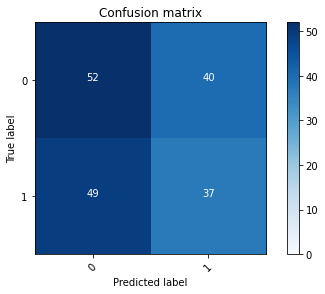

2022-08-20 22:01:38 - [Epoch Train: 92] loss: 0.0181, auc: 0.9999, acc: 0.9949, time: 50.00 s            
2022-08-20 22:01:38 - [Epoch Valid: 92] loss: 3.8042, auc: 0.5193, acc: 0.4864, time: 13.00 s


 92%|████████████████████████████████████▊   | 92/100 [1:39:31<08:31, 63.93s/it]

2022-08-20 22:01:38 - EPOCH: 93
2022-08-20 22:01:39 - Train Step 10/973, train_loss: 0.0139
2022-08-20 22:01:39 - Train Step 20/973, train_loss: 0.0092
2022-08-20 22:01:40 - Train Step 30/973, train_loss: 0.0094
2022-08-20 22:01:40 - Train Step 40/973, train_loss: 0.0128
2022-08-20 22:01:41 - Train Step 50/973, train_loss: 0.0105
2022-08-20 22:01:41 - Train Step 60/973, train_loss: 0.0091
2022-08-20 22:01:42 - Train Step 70/973, train_loss: 0.0169
2022-08-20 22:01:43 - Train Step 80/973, train_loss: 0.0158
2022-08-20 22:01:43 - Train Step 90/973, train_loss: 0.0156
2022-08-20 22:01:44 - Train Step 100/973, train_loss: 0.0145
2022-08-20 22:01:44 - Train Step 110/973, train_loss: 0.0133
2022-08-20 22:01:45 - Train Step 120/973, train_loss: 0.0123
2022-08-20 22:01:45 - Train Step 130/973, train_loss: 0.0121
2022-08-20 22:01:46 - Train Step 140/973, train_loss: 0.0115
2022-08-20 22:01:46 - Train Step 150/973, train_loss: 0.0111
2022-08-20 22:01:47 - Train Step 160/973, train_loss: 0.0162
2

2022-08-20 22:02:39 - Valid Step 185/257, valid_loss: 4.1250
2022-08-20 22:02:39 - Valid Step 190/257, valid_loss: 4.1941
2022-08-20 22:02:39 - Valid Step 195/257, valid_loss: 4.1585
2022-08-20 22:02:40 - Valid Step 200/257, valid_loss: 4.1376
2022-08-20 22:02:40 - Valid Step 205/257, valid_loss: 4.0946
2022-08-20 22:02:40 - Valid Step 210/257, valid_loss: 4.0730
2022-08-20 22:02:41 - Valid Step 215/257, valid_loss: 4.0311
2022-08-20 22:02:41 - Valid Step 220/257, valid_loss: 4.0920
2022-08-20 22:02:41 - Valid Step 225/257, valid_loss: 4.1486
2022-08-20 22:02:41 - Valid Step 230/257, valid_loss: 4.0939
2022-08-20 22:02:42 - Valid Step 235/257, valid_loss: 4.0379
2022-08-20 22:02:42 - Valid Step 240/257, valid_loss: 3.9540
2022-08-20 22:02:42 - Valid Step 245/257, valid_loss: 4.0084
2022-08-20 22:02:42 - Valid Step 250/257, valid_loss: 4.0070
2022-08-20 22:02:43 - Valid Step 255/257, valid_loss: 4.1174
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

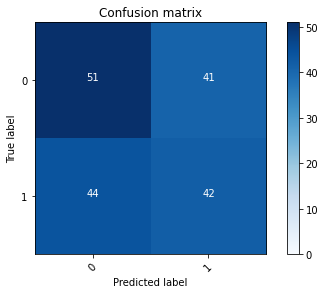

2022-08-20 22:02:43 - [Epoch Train: 93] loss: 0.0144, auc: 1.0000, acc: 0.9979, time: 51.00 s            
2022-08-20 22:02:43 - [Epoch Valid: 93] loss: 4.1382, auc: 0.5195, acc: 0.5019, time: 13.00 s


 93%|█████████████████████████████████████▏  | 93/100 [1:40:36<07:29, 64.19s/it]

2022-08-20 22:02:43 - EPOCH: 94
2022-08-20 22:02:44 - Train Step 10/973, train_loss: 0.0602
2022-08-20 22:02:44 - Train Step 20/973, train_loss: 0.0302
2022-08-20 22:02:45 - Train Step 30/973, train_loss: 0.0308
2022-08-20 22:02:45 - Train Step 40/973, train_loss: 0.0254
2022-08-20 22:02:46 - Train Step 50/973, train_loss: 0.0244
2022-08-20 22:02:46 - Train Step 60/973, train_loss: 0.0210
2022-08-20 22:02:47 - Train Step 70/973, train_loss: 0.0188
2022-08-20 22:02:47 - Train Step 80/973, train_loss: 0.0177
2022-08-20 22:02:48 - Train Step 90/973, train_loss: 0.0157
2022-08-20 22:02:48 - Train Step 100/973, train_loss: 0.0223
2022-08-20 22:02:49 - Train Step 110/973, train_loss: 0.0221
2022-08-20 22:02:49 - Train Step 120/973, train_loss: 0.0275
2022-08-20 22:02:50 - Train Step 130/973, train_loss: 0.0257
2022-08-20 22:02:50 - Train Step 140/973, train_loss: 0.0287
2022-08-20 22:02:51 - Train Step 150/973, train_loss: 0.0271
2022-08-20 22:02:51 - Train Step 160/973, train_loss: 0.0260
2

2022-08-20 22:03:44 - Valid Step 185/257, valid_loss: 4.0444
2022-08-20 22:03:44 - Valid Step 190/257, valid_loss: 4.0992
2022-08-20 22:03:45 - Valid Step 195/257, valid_loss: 4.1899
2022-08-20 22:03:45 - Valid Step 200/257, valid_loss: 4.1063
2022-08-20 22:03:45 - Valid Step 205/257, valid_loss: 4.1465
2022-08-20 22:03:45 - Valid Step 210/257, valid_loss: 4.2251
2022-08-20 22:03:46 - Valid Step 215/257, valid_loss: 4.1611
2022-08-20 22:03:46 - Valid Step 220/257, valid_loss: 4.0720
2022-08-20 22:03:46 - Valid Step 225/257, valid_loss: 4.0902
2022-08-20 22:03:46 - Valid Step 230/257, valid_loss: 4.0216
2022-08-20 22:03:47 - Valid Step 235/257, valid_loss: 4.0478
2022-08-20 22:03:47 - Valid Step 240/257, valid_loss: 4.0237
2022-08-20 22:03:47 - Valid Step 245/257, valid_loss: 4.0755
2022-08-20 22:03:48 - Valid Step 250/257, valid_loss: 4.0429
2022-08-20 22:03:48 - Valid Step 255/257, valid_loss: 3.9881
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

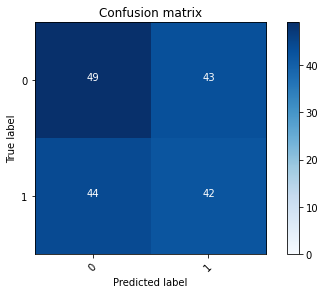

2022-08-20 22:03:48 - [Epoch Train: 94] loss: 0.0150, auc: 1.0000, acc: 0.9959, time: 51.00 s            
2022-08-20 22:03:48 - [Epoch Valid: 94] loss: 3.9572, auc: 0.5122, acc: 0.4903, time: 13.00 s


 94%|█████████████████████████████████████▌  | 94/100 [1:41:41<06:26, 64.47s/it]

2022-08-20 22:03:48 - EPOCH: 95
2022-08-20 22:03:49 - Train Step 10/973, train_loss: 0.0069
2022-08-20 22:03:49 - Train Step 20/973, train_loss: 0.0066
2022-08-20 22:03:50 - Train Step 30/973, train_loss: 0.0051
2022-08-20 22:03:50 - Train Step 40/973, train_loss: 0.0041
2022-08-20 22:03:51 - Train Step 50/973, train_loss: 0.0070
2022-08-20 22:03:51 - Train Step 60/973, train_loss: 0.0061
2022-08-20 22:03:52 - Train Step 70/973, train_loss: 0.0063
2022-08-20 22:03:52 - Train Step 80/973, train_loss: 0.0059
2022-08-20 22:03:53 - Train Step 90/973, train_loss: 0.0059
2022-08-20 22:03:54 - Train Step 100/973, train_loss: 0.0149
2022-08-20 22:03:54 - Train Step 110/973, train_loss: 0.0139
2022-08-20 22:03:55 - Train Step 120/973, train_loss: 0.0128
2022-08-20 22:03:55 - Train Step 130/973, train_loss: 0.0123
2022-08-20 22:03:56 - Train Step 140/973, train_loss: 0.0118
2022-08-20 22:03:56 - Train Step 150/973, train_loss: 0.0113
2022-08-20 22:03:57 - Train Step 160/973, train_loss: 0.0145
2

2022-08-20 22:04:49 - Valid Step 185/257, valid_loss: 3.8884
2022-08-20 22:04:49 - Valid Step 190/257, valid_loss: 3.9914
2022-08-20 22:04:49 - Valid Step 195/257, valid_loss: 3.9605
2022-08-20 22:04:50 - Valid Step 200/257, valid_loss: 3.9407
2022-08-20 22:04:50 - Valid Step 205/257, valid_loss: 3.9018
2022-08-20 22:04:50 - Valid Step 210/257, valid_loss: 3.9289
2022-08-20 22:04:50 - Valid Step 215/257, valid_loss: 3.8785
2022-08-20 22:04:51 - Valid Step 220/257, valid_loss: 3.8306
2022-08-20 22:04:51 - Valid Step 225/257, valid_loss: 3.8325
2022-08-20 22:04:51 - Valid Step 230/257, valid_loss: 3.8223
2022-08-20 22:04:51 - Valid Step 235/257, valid_loss: 3.7697
2022-08-20 22:04:52 - Valid Step 240/257, valid_loss: 3.7979
2022-08-20 22:04:52 - Valid Step 245/257, valid_loss: 3.7568
2022-08-20 22:04:52 - Valid Step 250/257, valid_loss: 3.7720
2022-08-20 22:04:52 - Valid Step 255/257, valid_loss: 3.7865
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

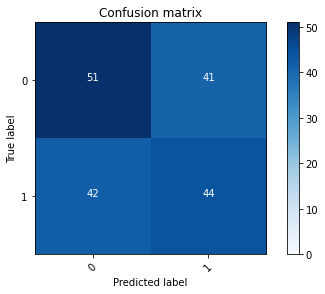

2022-08-20 22:04:53 - [Epoch Train: 95] loss: 0.0182, auc: 0.9999, acc: 0.9979, time: 50.00 s            
2022-08-20 22:04:53 - [Epoch Valid: 95] loss: 3.7572, auc: 0.5260, acc: 0.5136, time: 13.00 s


 95%|██████████████████████████████████████  | 95/100 [1:42:46<05:22, 64.53s/it]

2022-08-20 22:04:53 - EPOCH: 96
2022-08-20 22:04:53 - Train Step 10/973, train_loss: 0.0012
2022-08-20 22:04:54 - Train Step 20/973, train_loss: 0.0008
2022-08-20 22:04:54 - Train Step 30/973, train_loss: 0.0011
2022-08-20 22:04:55 - Train Step 40/973, train_loss: 0.0022
2022-08-20 22:04:55 - Train Step 50/973, train_loss: 0.0024
2022-08-20 22:04:56 - Train Step 60/973, train_loss: 0.0025
2022-08-20 22:04:57 - Train Step 70/973, train_loss: 0.0146
2022-08-20 22:04:57 - Train Step 80/973, train_loss: 0.0142
2022-08-20 22:04:58 - Train Step 90/973, train_loss: 0.0129
2022-08-20 22:04:58 - Train Step 100/973, train_loss: 0.0132
2022-08-20 22:04:59 - Train Step 110/973, train_loss: 0.0121
2022-08-20 22:04:59 - Train Step 120/973, train_loss: 0.0112
2022-08-20 22:05:00 - Train Step 130/973, train_loss: 0.0103
2022-08-20 22:05:00 - Train Step 140/973, train_loss: 0.0096
2022-08-20 22:05:01 - Train Step 150/973, train_loss: 0.0092
2022-08-20 22:05:01 - Train Step 160/973, train_loss: 0.0124
2

2022-08-20 22:05:54 - Valid Step 185/257, valid_loss: 4.2331
2022-08-20 22:05:54 - Valid Step 190/257, valid_loss: 4.2325
2022-08-20 22:05:54 - Valid Step 195/257, valid_loss: 4.2911
2022-08-20 22:05:55 - Valid Step 200/257, valid_loss: 4.3134
2022-08-20 22:05:55 - Valid Step 205/257, valid_loss: 4.2109
2022-08-20 22:05:55 - Valid Step 210/257, valid_loss: 4.2776
2022-08-20 22:05:55 - Valid Step 215/257, valid_loss: 4.2651
2022-08-20 22:05:56 - Valid Step 220/257, valid_loss: 4.3113
2022-08-20 22:05:56 - Valid Step 225/257, valid_loss: 4.2931
2022-08-20 22:05:56 - Valid Step 230/257, valid_loss: 4.3118
2022-08-20 22:05:56 - Valid Step 235/257, valid_loss: 4.2610
2022-08-20 22:05:56 - Valid Step 240/257, valid_loss: 4.2728
2022-08-20 22:05:57 - Valid Step 245/257, valid_loss: 4.2189
2022-08-20 22:05:57 - Valid Step 250/257, valid_loss: 4.2181
2022-08-20 22:05:57 - Valid Step 255/257, valid_loss: 4.1715
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

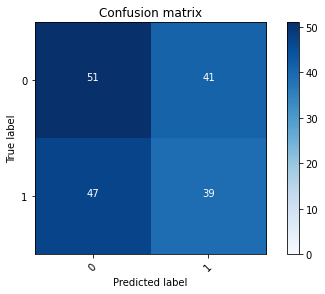

2022-08-20 22:05:58 - [Epoch Train: 96] loss: 0.0122, auc: 1.0000, acc: 0.9969, time: 51.00 s            
2022-08-20 22:05:58 - [Epoch Valid: 96] loss: 4.1650, auc: 0.5183, acc: 0.4942, time: 13.00 s


 96%|██████████████████████████████████████▍ | 96/100 [1:43:50<04:18, 64.63s/it]

2022-08-20 22:05:58 - EPOCH: 97
2022-08-20 22:05:58 - Train Step 10/973, train_loss: 0.0075
2022-08-20 22:05:59 - Train Step 20/973, train_loss: 0.0042
2022-08-20 22:05:59 - Train Step 30/973, train_loss: 0.0034
2022-08-20 22:06:00 - Train Step 40/973, train_loss: 0.0028
2022-08-20 22:06:00 - Train Step 50/973, train_loss: 0.0023
2022-08-20 22:06:01 - Train Step 60/973, train_loss: 0.0020
2022-08-20 22:06:01 - Train Step 70/973, train_loss: 0.0019
2022-08-20 22:06:02 - Train Step 80/973, train_loss: 0.0030
2022-08-20 22:06:02 - Train Step 90/973, train_loss: 0.0121
2022-08-20 22:06:03 - Train Step 100/973, train_loss: 0.0111
2022-08-20 22:06:03 - Train Step 110/973, train_loss: 0.0107
2022-08-20 22:06:04 - Train Step 120/973, train_loss: 0.0102
2022-08-20 22:06:04 - Train Step 130/973, train_loss: 0.0124
2022-08-20 22:06:05 - Train Step 140/973, train_loss: 0.0130
2022-08-20 22:06:05 - Train Step 150/973, train_loss: 0.0122
2022-08-20 22:06:06 - Train Step 160/973, train_loss: 0.0116
2

2022-08-20 22:06:58 - Valid Step 185/257, valid_loss: 5.0200
2022-08-20 22:06:58 - Valid Step 190/257, valid_loss: 4.9127
2022-08-20 22:06:58 - Valid Step 195/257, valid_loss: 4.9983
2022-08-20 22:06:58 - Valid Step 200/257, valid_loss: 5.1039
2022-08-20 22:06:59 - Valid Step 205/257, valid_loss: 5.0274
2022-08-20 22:06:59 - Valid Step 210/257, valid_loss: 5.0037
2022-08-20 22:06:59 - Valid Step 215/257, valid_loss: 4.9280
2022-08-20 22:06:59 - Valid Step 220/257, valid_loss: 4.8633
2022-08-20 22:07:00 - Valid Step 225/257, valid_loss: 4.9835
2022-08-20 22:07:00 - Valid Step 230/257, valid_loss: 4.8826
2022-08-20 22:07:00 - Valid Step 235/257, valid_loss: 4.8711
2022-08-20 22:07:01 - Valid Step 240/257, valid_loss: 4.9332
2022-08-20 22:07:01 - Valid Step 245/257, valid_loss: 4.8894
2022-08-20 22:07:01 - Valid Step 250/257, valid_loss: 4.9021
2022-08-20 22:07:01 - Valid Step 255/257, valid_loss: 4.8435
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

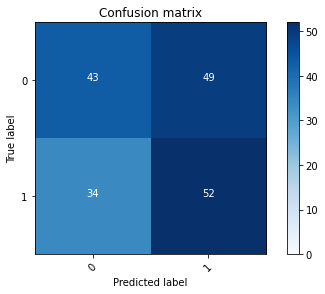

2022-08-20 22:07:02 - [Epoch Train: 97] loss: 0.0118, auc: 1.0000, acc: 0.9959, time: 50.00 s            
2022-08-20 22:07:02 - [Epoch Valid: 97] loss: 4.8064, auc: 0.5155, acc: 0.5253, time: 13.00 s


 97%|██████████████████████████████████████▊ | 97/100 [1:44:54<03:13, 64.44s/it]

2022-08-20 22:07:02 - EPOCH: 98
2022-08-20 22:07:02 - Train Step 10/973, train_loss: 0.0939
2022-08-20 22:07:03 - Train Step 20/973, train_loss: 0.0490
2022-08-20 22:07:03 - Train Step 30/973, train_loss: 0.0364
2022-08-20 22:07:04 - Train Step 40/973, train_loss: 0.0282
2022-08-20 22:07:04 - Train Step 50/973, train_loss: 0.0227
2022-08-20 22:07:05 - Train Step 60/973, train_loss: 0.0211
2022-08-20 22:07:05 - Train Step 70/973, train_loss: 0.0184
2022-08-20 22:07:06 - Train Step 80/973, train_loss: 0.0161
2022-08-20 22:07:06 - Train Step 90/973, train_loss: 0.0145
2022-08-20 22:07:07 - Train Step 100/973, train_loss: 0.0131
2022-08-20 22:07:07 - Train Step 110/973, train_loss: 0.0121
2022-08-20 22:07:08 - Train Step 120/973, train_loss: 0.0160
2022-08-20 22:07:08 - Train Step 130/973, train_loss: 0.0153
2022-08-20 22:07:09 - Train Step 140/973, train_loss: 0.0143
2022-08-20 22:07:09 - Train Step 150/973, train_loss: 0.0135
2022-08-20 22:07:10 - Train Step 160/973, train_loss: 0.0131
2

2022-08-20 22:08:02 - Valid Step 185/257, valid_loss: 4.0628
2022-08-20 22:08:02 - Valid Step 190/257, valid_loss: 4.0902
2022-08-20 22:08:02 - Valid Step 195/257, valid_loss: 4.0950
2022-08-20 22:08:02 - Valid Step 200/257, valid_loss: 4.0514
2022-08-20 22:08:03 - Valid Step 205/257, valid_loss: 4.0719
2022-08-20 22:08:03 - Valid Step 210/257, valid_loss: 4.0741
2022-08-20 22:08:03 - Valid Step 215/257, valid_loss: 4.1743
2022-08-20 22:08:03 - Valid Step 220/257, valid_loss: 4.1242
2022-08-20 22:08:04 - Valid Step 225/257, valid_loss: 4.1816
2022-08-20 22:08:04 - Valid Step 230/257, valid_loss: 4.2014
2022-08-20 22:08:04 - Valid Step 235/257, valid_loss: 4.2388
2022-08-20 22:08:04 - Valid Step 240/257, valid_loss: 4.1573
2022-08-20 22:08:05 - Valid Step 245/257, valid_loss: 4.1528
2022-08-20 22:08:05 - Valid Step 250/257, valid_loss: 4.1277
2022-08-20 22:08:05 - Valid Step 255/257, valid_loss: 4.1933
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

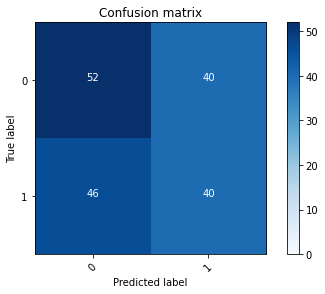

2022-08-20 22:08:06 - [Epoch Train: 98] loss: 0.0153, auc: 0.9999, acc: 0.9949, time: 50.00 s            
2022-08-20 22:08:06 - [Epoch Valid: 98] loss: 4.1910, auc: 0.5218, acc: 0.4981, time: 13.00 s


 98%|███████████████████████████████████████▏| 98/100 [1:45:58<02:08, 64.31s/it]

2022-08-20 22:08:06 - EPOCH: 99
2022-08-20 22:08:06 - Train Step 10/973, train_loss: 0.0017
2022-08-20 22:08:07 - Train Step 20/973, train_loss: 0.0299
2022-08-20 22:08:07 - Train Step 30/973, train_loss: 0.0200
2022-08-20 22:08:08 - Train Step 40/973, train_loss: 0.0151
2022-08-20 22:08:08 - Train Step 50/973, train_loss: 0.0122
2022-08-20 22:08:09 - Train Step 60/973, train_loss: 0.0105
2022-08-20 22:08:09 - Train Step 70/973, train_loss: 0.0116
2022-08-20 22:08:10 - Train Step 80/973, train_loss: 0.0109
2022-08-20 22:08:10 - Train Step 90/973, train_loss: 0.0115
2022-08-20 22:08:11 - Train Step 100/973, train_loss: 0.0105
2022-08-20 22:08:11 - Train Step 110/973, train_loss: 0.0110
2022-08-20 22:08:12 - Train Step 120/973, train_loss: 0.0107
2022-08-20 22:08:12 - Train Step 130/973, train_loss: 0.0107
2022-08-20 22:08:13 - Train Step 140/973, train_loss: 0.0100
2022-08-20 22:08:13 - Train Step 150/973, train_loss: 0.0093
2022-08-20 22:08:14 - Train Step 160/973, train_loss: 0.0090
2

2022-08-20 22:09:05 - Valid Step 185/257, valid_loss: 4.2943
2022-08-20 22:09:06 - Valid Step 190/257, valid_loss: 4.3266
2022-08-20 22:09:06 - Valid Step 195/257, valid_loss: 4.2633
2022-08-20 22:09:06 - Valid Step 200/257, valid_loss: 4.3477
2022-08-20 22:09:06 - Valid Step 205/257, valid_loss: 4.2477
2022-08-20 22:09:07 - Valid Step 210/257, valid_loss: 4.2232
2022-08-20 22:09:07 - Valid Step 215/257, valid_loss: 4.2053
2022-08-20 22:09:07 - Valid Step 220/257, valid_loss: 4.1898
2022-08-20 22:09:07 - Valid Step 225/257, valid_loss: 4.3289
2022-08-20 22:09:08 - Valid Step 230/257, valid_loss: 4.3722
2022-08-20 22:09:08 - Valid Step 235/257, valid_loss: 4.3343
2022-08-20 22:09:08 - Valid Step 240/257, valid_loss: 4.3573
2022-08-20 22:09:09 - Valid Step 245/257, valid_loss: 4.2980
2022-08-20 22:09:09 - Valid Step 250/257, valid_loss: 4.2662
2022-08-20 22:09:09 - Valid Step 255/257, valid_loss: 4.2898
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

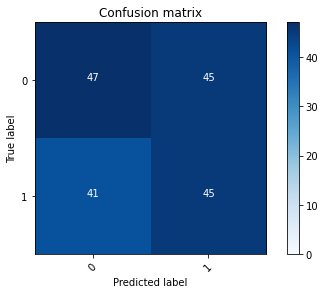

2022-08-20 22:09:09 - [Epoch Train: 99] loss: 0.0103, auc: 1.0000, acc: 0.9979, time: 50.00 s            
2022-08-20 22:09:09 - [Epoch Valid: 99] loss: 4.3245, auc: 0.5173, acc: 0.4942, time: 13.00 s


 99%|███████████████████████████████████████▌| 99/100 [1:47:02<01:04, 64.17s/it]

2022-08-20 22:09:09 - EPOCH: 100
2022-08-20 22:09:10 - Train Step 10/973, train_loss: 0.0160
2022-08-20 22:09:11 - Train Step 20/973, train_loss: 0.0090
2022-08-20 22:09:11 - Train Step 30/973, train_loss: 0.0089
2022-08-20 22:09:12 - Train Step 40/973, train_loss: 0.0086
2022-08-20 22:09:12 - Train Step 50/973, train_loss: 0.0077
2022-08-20 22:09:13 - Train Step 60/973, train_loss: 0.0073
2022-08-20 22:09:13 - Train Step 70/973, train_loss: 0.0068
2022-08-20 22:09:14 - Train Step 80/973, train_loss: 0.0064
2022-08-20 22:09:14 - Train Step 90/973, train_loss: 0.0065
2022-08-20 22:09:15 - Train Step 100/973, train_loss: 0.0082
2022-08-20 22:09:15 - Train Step 110/973, train_loss: 0.0076
2022-08-20 22:09:16 - Train Step 120/973, train_loss: 0.0073
2022-08-20 22:09:16 - Train Step 130/973, train_loss: 0.0110
2022-08-20 22:09:17 - Train Step 140/973, train_loss: 0.0102
2022-08-20 22:09:17 - Train Step 150/973, train_loss: 0.0098
2022-08-20 22:09:18 - Train Step 160/973, train_loss: 0.0095


2022-08-20 22:10:10 - Valid Step 185/257, valid_loss: 4.3504
2022-08-20 22:10:10 - Valid Step 190/257, valid_loss: 4.2371
2022-08-20 22:10:10 - Valid Step 195/257, valid_loss: 4.2314
2022-08-20 22:10:10 - Valid Step 200/257, valid_loss: 4.1583
2022-08-20 22:10:11 - Valid Step 205/257, valid_loss: 4.0833
2022-08-20 22:10:11 - Valid Step 210/257, valid_loss: 4.0804
2022-08-20 22:10:11 - Valid Step 215/257, valid_loss: 4.1096
2022-08-20 22:10:11 - Valid Step 220/257, valid_loss: 4.1166
2022-08-20 22:10:12 - Valid Step 225/257, valid_loss: 4.0456
2022-08-20 22:10:12 - Valid Step 230/257, valid_loss: 4.0613
2022-08-20 22:10:12 - Valid Step 235/257, valid_loss: 4.0308
2022-08-20 22:10:12 - Valid Step 240/257, valid_loss: 4.0066
2022-08-20 22:10:13 - Valid Step 245/257, valid_loss: 3.9740
2022-08-20 22:10:13 - Valid Step 250/257, valid_loss: 3.9636
2022-08-20 22:10:13 - Valid Step 255/257, valid_loss: 3.9491
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
   

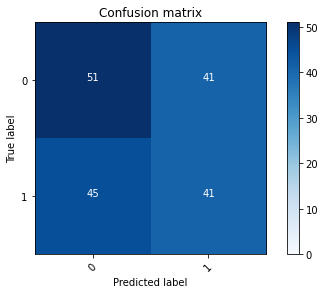

2022-08-20 22:10:13 - [Epoch Train: 100] loss: 0.0155, auc: 0.9999, acc: 0.9979, time: 50.00 s            
2022-08-20 22:10:13 - [Epoch Valid: 100] loss: 3.9816, auc: 0.5220, acc: 0.4981, time: 13.00 s


100%|███████████████████████████████████████| 100/100 [1:48:06<00:00, 64.87s/it]

-- FOLD N:4
Train origin: mn
Type: KLF
2022-08-20 22:10:13 - (M0) Train/Val datasets size: 270
2022-08-20 22:10:13 - (M1) Train/Val datasets size: 303
2022-08-20 22:10:13 - (N0) Train/Val datasets size: 170
2022-08-20 22:10:13 - (N1) Train/Val datasets size: 121
2022-08-20 22:10:13 - Concatenating M0 and N0...
Length of concatenated dataset: 540
2022-08-20 22:10:13 - (MN0) Train/Val datasets size: 540
2022-08-20 22:10:13 - Concatenating M1 and N1...
Length of concatenated dataset: 606
2022-08-20 22:10:13 - (MN1) Train/Val datasets size: 606
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa550551490>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fa50e1ff760>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa5790da730>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7fa5790da3d0>, 'mn_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa5790dae20>, 'mn_dataset_1': <utils.da

[([1, 3, 4, 5, 6, 7, 8, 9, 11, 12, 14, 15, 16, 18, 19, 20, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 56, 58, 59, 60, 61, 62, 63, 65, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 89, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 105, 107, 108, 110, 111, 112, 114, 115, 116, 117, 118, 119, 121, 122, 123, 124, 126, 129, 130, 131, 132, 134, 135, 136, 138, 139, 143, 144, 145, 146, 147, 149, 150, 151, 152, 153, 154, 156, 157, 158, 159, 160, 162, 164, 165, 166, 167, 169, 170, 173, 174, 175, 176, 177, 178, 179, 180, 182, 183, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 196, 197, 199, 201, 202, 203, 206, 207, 208, 209, 210, 211, 212, 214, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 229, 230, 231, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 246, 247, 249, 251, 252, 253, 254, 255, 256, 257, 258, 261, 263, 266, 267, 268, 269, 271, 272, 273, 275, 

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([1, 3, 4, 5, 6, 7, 8, 9, 11, 12, 14, 15, 16, 18, 19, 20, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 56, 58, 59, 60, 61, 62, 63, 65, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 89, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 105, 107, 108, 110, 111, 112, 114, 115, 116, 117, 118, 119, 121, 122, 123, 124, 126, 129, 130, 131, 132, 134, 135, 136, 138, 139, 143, 144, 145, 146, 147, 149, 150, 151, 152, 153, 154, 156, 157, 158, 159, 160, 162, 164, 165, 166, 167, 169, 170, 173, 174, 175, 176, 177, 178, 179, 180, 182, 183, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 196, 197, 199, 201, 202, 203, 206, 207, 208, 209, 210, 211, 212, 214, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 229, 230, 231, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 246, 247, 249, 251, 252, 253, 2

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa550485a60>, <torch.utils.data.dataloader.DataLoader object at 0x7fa55039b5e0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa550226310>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa5505dbbe0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa55022a520>, <torch.utils.data.dataloader.DataLoader object at 0x7fa57af7f760>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa5505e2190>, <torch.utils.data.dataloader.DataLoader object at 0x7fa512100e80>, <torch.utils.data.dataloader.DataLoader object at 0x7fa5123324c0>]}}
2022-08-20 22:22:35 - Using CUDA...
KLF
{'ext': 'mat', 'dims': 2, 'batch_size': 1, 'mri_types': ['KLF'], 'is_depth_wise': True, 'is_transformed': False, 'output_size': 1, 'is_multistep': True, 'lr': 0.0001, 'is_adam': True, 'momentum': 0.9, 'is_10_fold': False, 'val_total_ratio': 0.2, 'is_internal_dataset': True, 'train_origin'

  0%|                                                   | 0/100 [00:00<?, ?it/s]

2022-08-20 22:22:35 - EPOCH: 1
2022-08-20 22:22:36 - Train Step 10/979, train_loss: 0.6929
2022-08-20 22:22:36 - Train Step 20/979, train_loss: 0.6926
2022-08-20 22:22:37 - Train Step 30/979, train_loss: 0.6932
2022-08-20 22:22:37 - Train Step 40/979, train_loss: 0.6928
2022-08-20 22:22:38 - Train Step 50/979, train_loss: 0.6932
2022-08-20 22:22:38 - Train Step 60/979, train_loss: 0.6930
2022-08-20 22:22:39 - Train Step 70/979, train_loss: 0.6933
2022-08-20 22:22:39 - Train Step 80/979, train_loss: 0.6934
2022-08-20 22:22:40 - Train Step 90/979, train_loss: 0.6929
2022-08-20 22:22:40 - Train Step 100/979, train_loss: 0.6927
2022-08-20 22:22:41 - Train Step 110/979, train_loss: 0.6933
2022-08-20 22:22:41 - Train Step 120/979, train_loss: 0.6932
2022-08-20 22:22:42 - Train Step 130/979, train_loss: 0.6932
2022-08-20 22:22:42 - Train Step 140/979, train_loss: 0.6930
2022-08-20 22:22:43 - Train Step 150/979, train_loss: 0.6931
2022-08-20 22:22:43 - Train Step 160/979, train_loss: 0.6932
20

2022-08-20 22:23:36 - Valid Step 185/247, valid_loss: 0.6933
2022-08-20 22:23:36 - Valid Step 190/247, valid_loss: 0.6933
2022-08-20 22:23:37 - Valid Step 195/247, valid_loss: 0.6934
2022-08-20 22:23:37 - Valid Step 200/247, valid_loss: 0.6933
2022-08-20 22:23:37 - Valid Step 205/247, valid_loss: 0.6934
2022-08-20 22:23:37 - Valid Step 210/247, valid_loss: 0.6933
2022-08-20 22:23:38 - Valid Step 215/247, valid_loss: 0.6933
2022-08-20 22:23:38 - Valid Step 220/247, valid_loss: 0.6933
2022-08-20 22:23:38 - Valid Step 225/247, valid_loss: 0.6932
2022-08-20 22:23:38 - Valid Step 230/247, valid_loss: 0.6933
2022-08-20 22:23:39 - Valid Step 235/247, valid_loss: 0.6932
2022-08-20 22:23:39 - Valid Step 240/247, valid_loss: 0.6932
2022-08-20 22:23:39 - Valid Step 245/247, valid_loss: 0.6932
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
145     00009                0           0
175     00014                1         

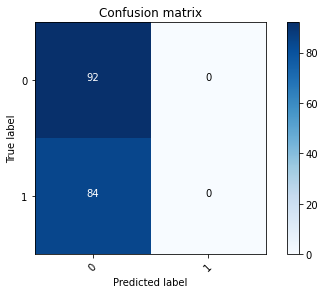

2022-08-20 22:23:39 - [Epoch Train: 1] loss: 0.6933, auc: 0.4935, acc: 0.5015, time: 51.00 s            
2022-08-20 22:23:39 - [Epoch Valid: 1] loss: 0.6932, auc: 0.5031, acc: 0.5061, time: 13.00 s
2022-08-20 22:23:39 - acc improved from 0.0000 to 0.5061. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e1-loss0.693-acc0.506-auc0.503.pth'


  1%|▍                                        | 1/100 [01:04<1:46:25, 64.50s/it]

2022-08-20 22:23:39 - EPOCH: 2
2022-08-20 22:23:40 - Train Step 10/979, train_loss: 0.6878
2022-08-20 22:23:41 - Train Step 20/979, train_loss: 0.6903
2022-08-20 22:23:41 - Train Step 30/979, train_loss: 0.6896
2022-08-20 22:23:42 - Train Step 40/979, train_loss: 0.6908
2022-08-20 22:23:42 - Train Step 50/979, train_loss: 0.6917
2022-08-20 22:23:43 - Train Step 60/979, train_loss: 0.6921
2022-08-20 22:23:43 - Train Step 70/979, train_loss: 0.6916
2022-08-20 22:23:44 - Train Step 80/979, train_loss: 0.6923
2022-08-20 22:23:44 - Train Step 90/979, train_loss: 0.6921
2022-08-20 22:23:45 - Train Step 100/979, train_loss: 0.6921
2022-08-20 22:23:45 - Train Step 110/979, train_loss: 0.6920
2022-08-20 22:23:46 - Train Step 120/979, train_loss: 0.6914
2022-08-20 22:23:46 - Train Step 130/979, train_loss: 0.6913
2022-08-20 22:23:47 - Train Step 140/979, train_loss: 0.6917
2022-08-20 22:23:47 - Train Step 150/979, train_loss: 0.6919
2022-08-20 22:23:48 - Train Step 160/979, train_loss: 0.6920
20

2022-08-20 22:24:40 - Valid Step 185/247, valid_loss: 0.6934
2022-08-20 22:24:41 - Valid Step 190/247, valid_loss: 0.6933
2022-08-20 22:24:41 - Valid Step 195/247, valid_loss: 0.6934
2022-08-20 22:24:41 - Valid Step 200/247, valid_loss: 0.6935
2022-08-20 22:24:41 - Valid Step 205/247, valid_loss: 0.6934
2022-08-20 22:24:42 - Valid Step 210/247, valid_loss: 0.6934
2022-08-20 22:24:42 - Valid Step 215/247, valid_loss: 0.6935
2022-08-20 22:24:42 - Valid Step 220/247, valid_loss: 0.6934
2022-08-20 22:24:42 - Valid Step 225/247, valid_loss: 0.6934
2022-08-20 22:24:43 - Valid Step 230/247, valid_loss: 0.6933
2022-08-20 22:24:43 - Valid Step 235/247, valid_loss: 0.6933
2022-08-20 22:24:43 - Valid Step 240/247, valid_loss: 0.6933
2022-08-20 22:24:43 - Valid Step 245/247, valid_loss: 0.6933
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
92      00009                0           0
159     00014                1         

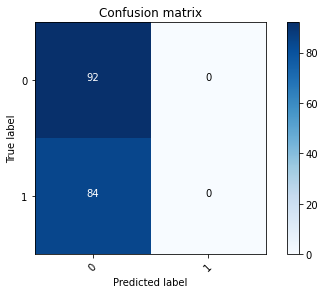

2022-08-20 22:24:44 - [Epoch Train: 2] loss: 0.6929, auc: 0.5499, acc: 0.5015, time: 51.00 s            
2022-08-20 22:24:44 - [Epoch Valid: 2] loss: 0.6933, auc: 0.5082, acc: 0.5061, time: 13.00 s
2022-08-20 22:24:44 - acc improved from 0.5061 to 0.5061. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e2-loss0.693-acc0.506-auc0.508.pth'


  2%|▊                                        | 2/100 [02:08<1:45:07, 64.37s/it]

2022-08-20 22:24:44 - EPOCH: 3
2022-08-20 22:24:44 - Train Step 10/979, train_loss: 0.6920
2022-08-20 22:24:45 - Train Step 20/979, train_loss: 0.6907
2022-08-20 22:24:46 - Train Step 30/979, train_loss: 0.6906
2022-08-20 22:24:46 - Train Step 40/979, train_loss: 0.6911
2022-08-20 22:24:47 - Train Step 50/979, train_loss: 0.6911
2022-08-20 22:24:47 - Train Step 60/979, train_loss: 0.6911
2022-08-20 22:24:48 - Train Step 70/979, train_loss: 0.6916
2022-08-20 22:24:48 - Train Step 80/979, train_loss: 0.6909
2022-08-20 22:24:49 - Train Step 90/979, train_loss: 0.6912
2022-08-20 22:24:49 - Train Step 100/979, train_loss: 0.6911
2022-08-20 22:24:50 - Train Step 110/979, train_loss: 0.6914
2022-08-20 22:24:50 - Train Step 120/979, train_loss: 0.6914
2022-08-20 22:24:51 - Train Step 130/979, train_loss: 0.6914
2022-08-20 22:24:51 - Train Step 140/979, train_loss: 0.6913
2022-08-20 22:24:52 - Train Step 150/979, train_loss: 0.6911
2022-08-20 22:24:52 - Train Step 160/979, train_loss: 0.6910
20

2022-08-20 22:25:44 - Valid Step 185/247, valid_loss: 0.6924
2022-08-20 22:25:44 - Valid Step 190/247, valid_loss: 0.6925
2022-08-20 22:25:44 - Valid Step 195/247, valid_loss: 0.6922
2022-08-20 22:25:45 - Valid Step 200/247, valid_loss: 0.6924
2022-08-20 22:25:45 - Valid Step 205/247, valid_loss: 0.6923
2022-08-20 22:25:45 - Valid Step 210/247, valid_loss: 0.6925
2022-08-20 22:25:46 - Valid Step 215/247, valid_loss: 0.6931
2022-08-20 22:25:46 - Valid Step 220/247, valid_loss: 0.6934
2022-08-20 22:25:46 - Valid Step 225/247, valid_loss: 0.6938
2022-08-20 22:25:46 - Valid Step 230/247, valid_loss: 0.6948
2022-08-20 22:25:47 - Valid Step 235/247, valid_loss: 0.6952
2022-08-20 22:25:47 - Valid Step 240/247, valid_loss: 0.6954
2022-08-20 22:25:47 - Valid Step 245/247, valid_loss: 0.6948
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
34      00009                0           0
105     00014                1         

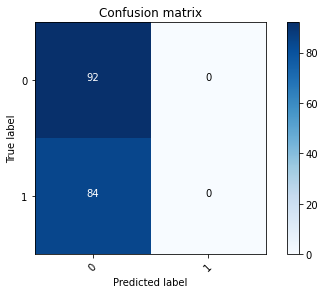

2022-08-20 22:25:47 - [Epoch Train: 3] loss: 0.6908, auc: 0.5809, acc: 0.5015, time: 50.00 s            
2022-08-20 22:25:47 - [Epoch Valid: 3] loss: 0.6945, auc: 0.4808, acc: 0.5061, time: 13.00 s
2022-08-20 22:25:47 - acc improved from 0.5061 to 0.5061. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e3-loss0.695-acc0.506-auc0.481.pth'


  3%|█▏                                       | 3/100 [03:12<1:43:34, 64.07s/it]

2022-08-20 22:25:47 - EPOCH: 4
2022-08-20 22:25:48 - Train Step 10/979, train_loss: 0.6936
2022-08-20 22:25:49 - Train Step 20/979, train_loss: 0.6986
2022-08-20 22:25:49 - Train Step 30/979, train_loss: 0.7001
2022-08-20 22:25:50 - Train Step 40/979, train_loss: 0.6954
2022-08-20 22:25:50 - Train Step 50/979, train_loss: 0.6930
2022-08-20 22:25:51 - Train Step 60/979, train_loss: 0.6903
2022-08-20 22:25:51 - Train Step 70/979, train_loss: 0.6908
2022-08-20 22:25:52 - Train Step 80/979, train_loss: 0.6915
2022-08-20 22:25:52 - Train Step 90/979, train_loss: 0.6942
2022-08-20 22:25:53 - Train Step 100/979, train_loss: 0.6966
2022-08-20 22:25:53 - Train Step 110/979, train_loss: 0.6957
2022-08-20 22:25:54 - Train Step 120/979, train_loss: 0.6949
2022-08-20 22:25:54 - Train Step 130/979, train_loss: 0.6934
2022-08-20 22:25:55 - Train Step 140/979, train_loss: 0.6936
2022-08-20 22:25:55 - Train Step 150/979, train_loss: 0.6939
2022-08-20 22:25:56 - Train Step 160/979, train_loss: 0.6935
20

2022-08-20 22:26:48 - Valid Step 185/247, valid_loss: 0.6940
2022-08-20 22:26:48 - Valid Step 190/247, valid_loss: 0.6943
2022-08-20 22:26:48 - Valid Step 195/247, valid_loss: 0.6941
2022-08-20 22:26:49 - Valid Step 200/247, valid_loss: 0.6943
2022-08-20 22:26:49 - Valid Step 205/247, valid_loss: 0.6941
2022-08-20 22:26:49 - Valid Step 210/247, valid_loss: 0.6942
2022-08-20 22:26:49 - Valid Step 215/247, valid_loss: 0.6941
2022-08-20 22:26:50 - Valid Step 220/247, valid_loss: 0.6941
2022-08-20 22:26:50 - Valid Step 225/247, valid_loss: 0.6940
2022-08-20 22:26:50 - Valid Step 230/247, valid_loss: 0.6941
2022-08-20 22:26:50 - Valid Step 235/247, valid_loss: 0.6944
2022-08-20 22:26:51 - Valid Step 240/247, valid_loss: 0.6950
2022-08-20 22:26:51 - Valid Step 245/247, valid_loss: 0.6949
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
74      00009                0           0
48      00014                1         

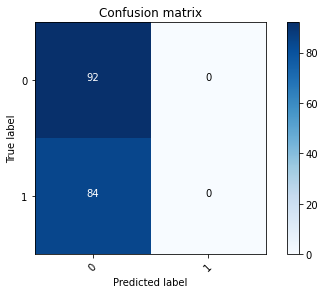

2022-08-20 22:26:51 - [Epoch Train: 4] loss: 0.6856, auc: 0.6162, acc: 0.5015, time: 50.00 s            
2022-08-20 22:26:51 - [Epoch Valid: 4] loss: 0.6951, auc: 0.4957, acc: 0.5061, time: 12.00 s
2022-08-20 22:26:51 - acc improved from 0.5061 to 0.5061. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e4-loss0.695-acc0.506-auc0.496.pth'


  4%|█▋                                       | 4/100 [04:16<1:42:21, 63.97s/it]

2022-08-20 22:26:51 - EPOCH: 5
2022-08-20 22:26:52 - Train Step 10/979, train_loss: 0.6464
2022-08-20 22:26:52 - Train Step 20/979, train_loss: 0.6738
2022-08-20 22:26:53 - Train Step 30/979, train_loss: 0.6728
2022-08-20 22:26:53 - Train Step 40/979, train_loss: 0.6754
2022-08-20 22:26:54 - Train Step 50/979, train_loss: 0.6710
2022-08-20 22:26:54 - Train Step 60/979, train_loss: 0.6735
2022-08-20 22:26:55 - Train Step 70/979, train_loss: 0.6736
2022-08-20 22:26:55 - Train Step 80/979, train_loss: 0.6789
2022-08-20 22:26:56 - Train Step 90/979, train_loss: 0.6774
2022-08-20 22:26:57 - Train Step 100/979, train_loss: 0.6772
2022-08-20 22:26:57 - Train Step 110/979, train_loss: 0.6772
2022-08-20 22:26:58 - Train Step 120/979, train_loss: 0.6761
2022-08-20 22:26:58 - Train Step 130/979, train_loss: 0.6739
2022-08-20 22:26:59 - Train Step 140/979, train_loss: 0.6754
2022-08-20 22:26:59 - Train Step 150/979, train_loss: 0.6765
2022-08-20 22:27:00 - Train Step 160/979, train_loss: 0.6766
20

2022-08-20 22:27:52 - Valid Step 185/247, valid_loss: 0.6984
2022-08-20 22:27:52 - Valid Step 190/247, valid_loss: 0.6991
2022-08-20 22:27:52 - Valid Step 195/247, valid_loss: 0.6993
2022-08-20 22:27:53 - Valid Step 200/247, valid_loss: 0.7002
2022-08-20 22:27:53 - Valid Step 205/247, valid_loss: 0.7005
2022-08-20 22:27:53 - Valid Step 210/247, valid_loss: 0.7021
2022-08-20 22:27:53 - Valid Step 215/247, valid_loss: 0.7014
2022-08-20 22:27:54 - Valid Step 220/247, valid_loss: 0.7009
2022-08-20 22:27:54 - Valid Step 225/247, valid_loss: 0.7008
2022-08-20 22:27:54 - Valid Step 230/247, valid_loss: 0.7000
2022-08-20 22:27:54 - Valid Step 235/247, valid_loss: 0.6996
2022-08-20 22:27:55 - Valid Step 240/247, valid_loss: 0.6990
2022-08-20 22:27:55 - Valid Step 245/247, valid_loss: 0.6982
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
116     00009                0           0
147     00014                1         

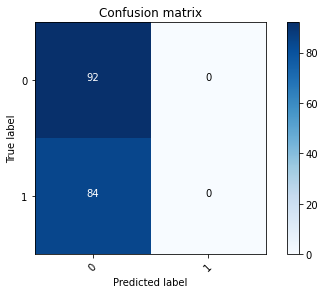

2022-08-20 22:27:55 - [Epoch Train: 5] loss: 0.6765, auc: 0.6290, acc: 0.5046, time: 50.00 s            
2022-08-20 22:27:55 - [Epoch Valid: 5] loss: 0.6985, auc: 0.4858, acc: 0.5061, time: 13.00 s
2022-08-20 22:27:55 - acc improved from 0.5061 to 0.5061. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e5-loss0.699-acc0.506-auc0.486.pth'


  5%|██                                       | 5/100 [05:20<1:41:11, 63.91s/it]

2022-08-20 22:27:55 - EPOCH: 6
2022-08-20 22:27:56 - Train Step 10/979, train_loss: 0.7280
2022-08-20 22:27:56 - Train Step 20/979, train_loss: 0.7166
2022-08-20 22:27:57 - Train Step 30/979, train_loss: 0.7009
2022-08-20 22:27:57 - Train Step 40/979, train_loss: 0.6783
2022-08-20 22:27:58 - Train Step 50/979, train_loss: 0.6928
2022-08-20 22:27:58 - Train Step 60/979, train_loss: 0.6857
2022-08-20 22:27:59 - Train Step 70/979, train_loss: 0.6858
2022-08-20 22:27:59 - Train Step 80/979, train_loss: 0.6832
2022-08-20 22:28:00 - Train Step 90/979, train_loss: 0.6860
2022-08-20 22:28:00 - Train Step 100/979, train_loss: 0.6803
2022-08-20 22:28:01 - Train Step 110/979, train_loss: 0.6815
2022-08-20 22:28:02 - Train Step 120/979, train_loss: 0.6800
2022-08-20 22:28:02 - Train Step 130/979, train_loss: 0.6753
2022-08-20 22:28:03 - Train Step 140/979, train_loss: 0.6729
2022-08-20 22:28:03 - Train Step 150/979, train_loss: 0.6750
2022-08-20 22:28:04 - Train Step 160/979, train_loss: 0.6698
20

2022-08-20 22:28:55 - Valid Step 185/247, valid_loss: 0.7005
2022-08-20 22:28:55 - Valid Step 190/247, valid_loss: 0.7014
2022-08-20 22:28:55 - Valid Step 195/247, valid_loss: 0.7053
2022-08-20 22:28:56 - Valid Step 200/247, valid_loss: 0.7048
2022-08-20 22:28:56 - Valid Step 205/247, valid_loss: 0.7043
2022-08-20 22:28:56 - Valid Step 210/247, valid_loss: 0.7046
2022-08-20 22:28:56 - Valid Step 215/247, valid_loss: 0.7035
2022-08-20 22:28:57 - Valid Step 220/247, valid_loss: 0.7036
2022-08-20 22:28:57 - Valid Step 225/247, valid_loss: 0.7046
2022-08-20 22:28:57 - Valid Step 230/247, valid_loss: 0.7041
2022-08-20 22:28:57 - Valid Step 235/247, valid_loss: 0.7020
2022-08-20 22:28:58 - Valid Step 240/247, valid_loss: 0.7025
2022-08-20 22:28:58 - Valid Step 245/247, valid_loss: 0.7050
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
120     00009                0           1
121     00014                1         

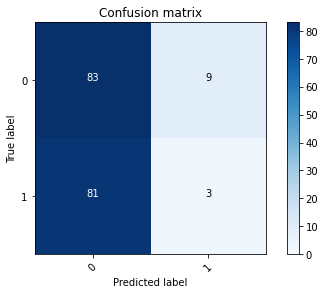

2022-08-20 22:28:58 - [Epoch Train: 6] loss: 0.6577, auc: 0.6788, acc: 0.5230, time: 50.00 s            
2022-08-20 22:28:58 - [Epoch Valid: 6] loss: 0.7050, auc: 0.4860, acc: 0.4818, time: 12.00 s


  6%|██▍                                      | 6/100 [06:23<1:39:43, 63.65s/it]

2022-08-20 22:28:58 - EPOCH: 7
2022-08-20 22:28:59 - Train Step 10/979, train_loss: 0.7044
2022-08-20 22:28:59 - Train Step 20/979, train_loss: 0.6732
2022-08-20 22:29:00 - Train Step 30/979, train_loss: 0.6567
2022-08-20 22:29:00 - Train Step 40/979, train_loss: 0.6437
2022-08-20 22:29:01 - Train Step 50/979, train_loss: 0.6524
2022-08-20 22:29:01 - Train Step 60/979, train_loss: 0.6527
2022-08-20 22:29:02 - Train Step 70/979, train_loss: 0.6497
2022-08-20 22:29:02 - Train Step 80/979, train_loss: 0.6482
2022-08-20 22:29:03 - Train Step 90/979, train_loss: 0.6446
2022-08-20 22:29:03 - Train Step 100/979, train_loss: 0.6393
2022-08-20 22:29:04 - Train Step 110/979, train_loss: 0.6322
2022-08-20 22:29:05 - Train Step 120/979, train_loss: 0.6374
2022-08-20 22:29:05 - Train Step 130/979, train_loss: 0.6396
2022-08-20 22:29:06 - Train Step 140/979, train_loss: 0.6395
2022-08-20 22:29:06 - Train Step 150/979, train_loss: 0.6385
2022-08-20 22:29:07 - Train Step 160/979, train_loss: 0.6412
20

2022-08-20 22:29:58 - Valid Step 185/247, valid_loss: 0.6989
2022-08-20 22:29:59 - Valid Step 190/247, valid_loss: 0.7014
2022-08-20 22:29:59 - Valid Step 195/247, valid_loss: 0.7044
2022-08-20 22:29:59 - Valid Step 200/247, valid_loss: 0.7030
2022-08-20 22:29:59 - Valid Step 205/247, valid_loss: 0.7030
2022-08-20 22:30:00 - Valid Step 210/247, valid_loss: 0.7062
2022-08-20 22:30:00 - Valid Step 215/247, valid_loss: 0.7087
2022-08-20 22:30:00 - Valid Step 220/247, valid_loss: 0.7108
2022-08-20 22:30:01 - Valid Step 225/247, valid_loss: 0.7131
2022-08-20 22:30:01 - Valid Step 230/247, valid_loss: 0.7114
2022-08-20 22:30:01 - Valid Step 235/247, valid_loss: 0.7106
2022-08-20 22:30:01 - Valid Step 240/247, valid_loss: 0.7110
2022-08-20 22:30:02 - Valid Step 245/247, valid_loss: 0.7113
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
15      00009                0           0
58      00014                1         

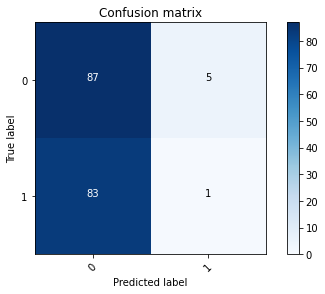

2022-08-20 22:30:02 - [Epoch Train: 7] loss: 0.6401, auc: 0.6925, acc: 0.5751, time: 50.00 s            
2022-08-20 22:30:02 - [Epoch Valid: 7] loss: 0.7117, auc: 0.4964, acc: 0.4899, time: 13.00 s


  7%|██▊                                      | 7/100 [07:26<1:38:38, 63.64s/it]

2022-08-20 22:30:02 - EPOCH: 8
2022-08-20 22:30:03 - Train Step 10/979, train_loss: 0.6073
2022-08-20 22:30:03 - Train Step 20/979, train_loss: 0.6507
2022-08-20 22:30:04 - Train Step 30/979, train_loss: 0.6643
2022-08-20 22:30:04 - Train Step 40/979, train_loss: 0.6653
2022-08-20 22:30:05 - Train Step 50/979, train_loss: 0.6509
2022-08-20 22:30:05 - Train Step 60/979, train_loss: 0.6512
2022-08-20 22:30:06 - Train Step 70/979, train_loss: 0.6518
2022-08-20 22:30:06 - Train Step 80/979, train_loss: 0.6443
2022-08-20 22:30:07 - Train Step 90/979, train_loss: 0.6338
2022-08-20 22:30:07 - Train Step 100/979, train_loss: 0.6381
2022-08-20 22:30:08 - Train Step 110/979, train_loss: 0.6361
2022-08-20 22:30:08 - Train Step 120/979, train_loss: 0.6297
2022-08-20 22:30:09 - Train Step 130/979, train_loss: 0.6225
2022-08-20 22:30:09 - Train Step 140/979, train_loss: 0.6184
2022-08-20 22:30:10 - Train Step 150/979, train_loss: 0.6145
2022-08-20 22:30:10 - Train Step 160/979, train_loss: 0.6153
20

2022-08-20 22:31:04 - Valid Step 185/247, valid_loss: 0.7258
2022-08-20 22:31:04 - Valid Step 190/247, valid_loss: 0.7276
2022-08-20 22:31:04 - Valid Step 195/247, valid_loss: 0.7282
2022-08-20 22:31:04 - Valid Step 200/247, valid_loss: 0.7298
2022-08-20 22:31:05 - Valid Step 205/247, valid_loss: 0.7272
2022-08-20 22:31:05 - Valid Step 210/247, valid_loss: 0.7262
2022-08-20 22:31:05 - Valid Step 215/247, valid_loss: 0.7260
2022-08-20 22:31:05 - Valid Step 220/247, valid_loss: 0.7262
2022-08-20 22:31:06 - Valid Step 225/247, valid_loss: 0.7234
2022-08-20 22:31:06 - Valid Step 230/247, valid_loss: 0.7207
2022-08-20 22:31:06 - Valid Step 235/247, valid_loss: 0.7224
2022-08-20 22:31:07 - Valid Step 240/247, valid_loss: 0.7228
2022-08-20 22:31:07 - Valid Step 245/247, valid_loss: 0.7256
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
158     00009                0           1
160     00014                1         

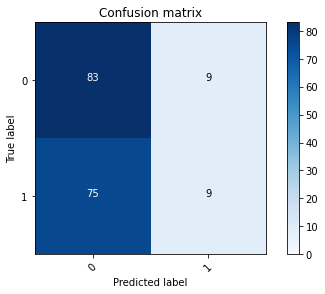

2022-08-20 22:31:07 - [Epoch Train: 8] loss: 0.6126, auc: 0.7280, acc: 0.6149, time: 51.00 s            
2022-08-20 22:31:07 - [Epoch Valid: 8] loss: 0.7266, auc: 0.5040, acc: 0.5182, time: 13.00 s
2022-08-20 22:31:07 - acc improved from 0.5061 to 0.5182. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e8-loss0.727-acc0.518-auc0.504.pth'


  8%|███▎                                     | 8/100 [08:32<1:38:22, 64.16s/it]

2022-08-20 22:31:07 - EPOCH: 9
2022-08-20 22:31:08 - Train Step 10/979, train_loss: 0.6039
2022-08-20 22:31:08 - Train Step 20/979, train_loss: 0.5617
2022-08-20 22:31:09 - Train Step 30/979, train_loss: 0.6130
2022-08-20 22:31:09 - Train Step 40/979, train_loss: 0.6068
2022-08-20 22:31:10 - Train Step 50/979, train_loss: 0.5937
2022-08-20 22:31:11 - Train Step 60/979, train_loss: 0.6054
2022-08-20 22:31:11 - Train Step 70/979, train_loss: 0.5852
2022-08-20 22:31:12 - Train Step 80/979, train_loss: 0.5962
2022-08-20 22:31:12 - Train Step 90/979, train_loss: 0.5919
2022-08-20 22:31:13 - Train Step 100/979, train_loss: 0.5910
2022-08-20 22:31:13 - Train Step 110/979, train_loss: 0.5884
2022-08-20 22:31:14 - Train Step 120/979, train_loss: 0.6001
2022-08-20 22:31:14 - Train Step 130/979, train_loss: 0.6044
2022-08-20 22:31:15 - Train Step 140/979, train_loss: 0.6034
2022-08-20 22:31:15 - Train Step 150/979, train_loss: 0.6027
2022-08-20 22:31:16 - Train Step 160/979, train_loss: 0.6041
20

2022-08-20 22:32:07 - Valid Step 185/247, valid_loss: 0.7424
2022-08-20 22:32:08 - Valid Step 190/247, valid_loss: 0.7462
2022-08-20 22:32:08 - Valid Step 195/247, valid_loss: 0.7436
2022-08-20 22:32:08 - Valid Step 200/247, valid_loss: 0.7386
2022-08-20 22:32:08 - Valid Step 205/247, valid_loss: 0.7405
2022-08-20 22:32:09 - Valid Step 210/247, valid_loss: 0.7379
2022-08-20 22:32:09 - Valid Step 215/247, valid_loss: 0.7340
2022-08-20 22:32:09 - Valid Step 220/247, valid_loss: 0.7334
2022-08-20 22:32:09 - Valid Step 225/247, valid_loss: 0.7352
2022-08-20 22:32:10 - Valid Step 230/247, valid_loss: 0.7392
2022-08-20 22:32:10 - Valid Step 235/247, valid_loss: 0.7369
2022-08-20 22:32:10 - Valid Step 240/247, valid_loss: 0.7353
2022-08-20 22:32:10 - Valid Step 245/247, valid_loss: 0.7346
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
132     00009                0           1
55      00014                1         

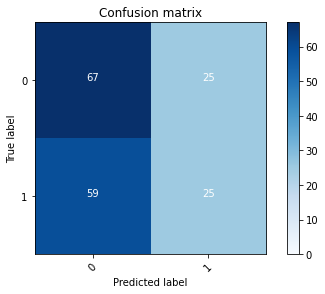

2022-08-20 22:32:11 - [Epoch Train: 9] loss: 0.5843, auc: 0.7480, acc: 0.6650, time: 50.00 s            
2022-08-20 22:32:11 - [Epoch Valid: 9] loss: 0.7338, auc: 0.5127, acc: 0.5101, time: 12.00 s


  9%|███▋                                     | 9/100 [09:35<1:37:03, 63.99s/it]

2022-08-20 22:32:11 - EPOCH: 10
2022-08-20 22:32:11 - Train Step 10/979, train_loss: 0.3719
2022-08-20 22:32:12 - Train Step 20/979, train_loss: 0.4859
2022-08-20 22:32:12 - Train Step 30/979, train_loss: 0.5051
2022-08-20 22:32:13 - Train Step 40/979, train_loss: 0.5221
2022-08-20 22:32:13 - Train Step 50/979, train_loss: 0.5422
2022-08-20 22:32:14 - Train Step 60/979, train_loss: 0.5462
2022-08-20 22:32:14 - Train Step 70/979, train_loss: 0.5405
2022-08-20 22:32:15 - Train Step 80/979, train_loss: 0.5312
2022-08-20 22:32:15 - Train Step 90/979, train_loss: 0.5414
2022-08-20 22:32:16 - Train Step 100/979, train_loss: 0.5439
2022-08-20 22:32:16 - Train Step 110/979, train_loss: 0.5411
2022-08-20 22:32:17 - Train Step 120/979, train_loss: 0.5386
2022-08-20 22:32:17 - Train Step 130/979, train_loss: 0.5437
2022-08-20 22:32:18 - Train Step 140/979, train_loss: 0.5494
2022-08-20 22:32:18 - Train Step 150/979, train_loss: 0.5439
2022-08-20 22:32:19 - Train Step 160/979, train_loss: 0.5437
2

2022-08-20 22:33:11 - Valid Step 185/247, valid_loss: 0.7410
2022-08-20 22:33:11 - Valid Step 190/247, valid_loss: 0.7380
2022-08-20 22:33:11 - Valid Step 195/247, valid_loss: 0.7337
2022-08-20 22:33:12 - Valid Step 200/247, valid_loss: 0.7379
2022-08-20 22:33:12 - Valid Step 205/247, valid_loss: 0.7462
2022-08-20 22:33:12 - Valid Step 210/247, valid_loss: 0.7429
2022-08-20 22:33:12 - Valid Step 215/247, valid_loss: 0.7463
2022-08-20 22:33:13 - Valid Step 220/247, valid_loss: 0.7460
2022-08-20 22:33:13 - Valid Step 225/247, valid_loss: 0.7454
2022-08-20 22:33:13 - Valid Step 230/247, valid_loss: 0.7462
2022-08-20 22:33:13 - Valid Step 235/247, valid_loss: 0.7528
2022-08-20 22:33:14 - Valid Step 240/247, valid_loss: 0.7489
2022-08-20 22:33:14 - Valid Step 245/247, valid_loss: 0.7498
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
153     00009                0           1
157     00014                1         

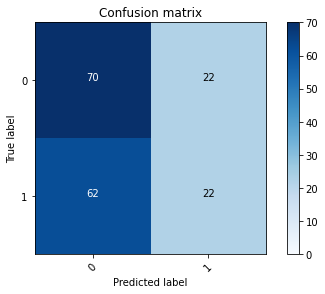

2022-08-20 22:33:14 - [Epoch Train: 10] loss: 0.5573, auc: 0.7781, acc: 0.6834, time: 50.00 s            
2022-08-20 22:33:14 - [Epoch Valid: 10] loss: 0.7475, auc: 0.5215, acc: 0.5101, time: 12.00 s


 10%|████                                    | 10/100 [10:39<1:35:39, 63.77s/it]

2022-08-20 22:33:14 - EPOCH: 11
2022-08-20 22:33:15 - Train Step 10/979, train_loss: 0.6642
2022-08-20 22:33:15 - Train Step 20/979, train_loss: 0.6566
2022-08-20 22:33:16 - Train Step 30/979, train_loss: 0.6073
2022-08-20 22:33:16 - Train Step 40/979, train_loss: 0.5949
2022-08-20 22:33:17 - Train Step 50/979, train_loss: 0.6160
2022-08-20 22:33:17 - Train Step 60/979, train_loss: 0.6252
2022-08-20 22:33:18 - Train Step 70/979, train_loss: 0.6154
2022-08-20 22:33:18 - Train Step 80/979, train_loss: 0.6020
2022-08-20 22:33:19 - Train Step 90/979, train_loss: 0.5908
2022-08-20 22:33:19 - Train Step 100/979, train_loss: 0.5814
2022-08-20 22:33:20 - Train Step 110/979, train_loss: 0.5998
2022-08-20 22:33:20 - Train Step 120/979, train_loss: 0.5907
2022-08-20 22:33:21 - Train Step 130/979, train_loss: 0.5702
2022-08-20 22:33:21 - Train Step 140/979, train_loss: 0.5797
2022-08-20 22:33:22 - Train Step 150/979, train_loss: 0.5757
2022-08-20 22:33:22 - Train Step 160/979, train_loss: 0.5800
2

2022-08-20 22:34:15 - Valid Step 185/247, valid_loss: 0.7564
2022-08-20 22:34:15 - Valid Step 190/247, valid_loss: 0.7599
2022-08-20 22:34:15 - Valid Step 195/247, valid_loss: 0.7566
2022-08-20 22:34:15 - Valid Step 200/247, valid_loss: 0.7546
2022-08-20 22:34:16 - Valid Step 205/247, valid_loss: 0.7556
2022-08-20 22:34:16 - Valid Step 210/247, valid_loss: 0.7556
2022-08-20 22:34:16 - Valid Step 215/247, valid_loss: 0.7527
2022-08-20 22:34:16 - Valid Step 220/247, valid_loss: 0.7554
2022-08-20 22:34:17 - Valid Step 225/247, valid_loss: 0.7581
2022-08-20 22:34:17 - Valid Step 230/247, valid_loss: 0.7564
2022-08-20 22:34:17 - Valid Step 235/247, valid_loss: 0.7543
2022-08-20 22:34:17 - Valid Step 240/247, valid_loss: 0.7553
2022-08-20 22:34:18 - Valid Step 245/247, valid_loss: 0.7583
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
150     00009                0           1
29      00014                1         

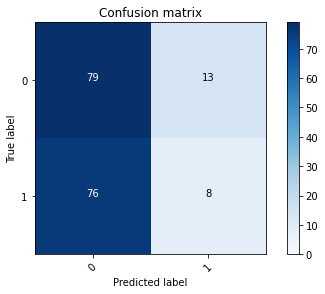

2022-08-20 22:34:18 - [Epoch Train: 11] loss: 0.5412, auc: 0.8013, acc: 0.6987, time: 50.00 s            
2022-08-20 22:34:18 - [Epoch Valid: 11] loss: 0.7575, auc: 0.5181, acc: 0.4858, time: 13.00 s


 11%|████▍                                   | 11/100 [11:43<1:34:41, 63.83s/it]

2022-08-20 22:34:18 - EPOCH: 12
2022-08-20 22:34:19 - Train Step 10/979, train_loss: 0.5567
2022-08-20 22:34:19 - Train Step 20/979, train_loss: 0.5210
2022-08-20 22:34:20 - Train Step 30/979, train_loss: 0.5016
2022-08-20 22:34:20 - Train Step 40/979, train_loss: 0.5399
2022-08-20 22:34:21 - Train Step 50/979, train_loss: 0.5153
2022-08-20 22:34:21 - Train Step 60/979, train_loss: 0.5461
2022-08-20 22:34:22 - Train Step 70/979, train_loss: 0.5653
2022-08-20 22:34:22 - Train Step 80/979, train_loss: 0.5820
2022-08-20 22:34:23 - Train Step 90/979, train_loss: 0.5827
2022-08-20 22:34:23 - Train Step 100/979, train_loss: 0.5571
2022-08-20 22:34:24 - Train Step 110/979, train_loss: 0.5469
2022-08-20 22:34:24 - Train Step 120/979, train_loss: 0.5394
2022-08-20 22:34:25 - Train Step 130/979, train_loss: 0.5342
2022-08-20 22:34:25 - Train Step 140/979, train_loss: 0.5383
2022-08-20 22:34:26 - Train Step 150/979, train_loss: 0.5486
2022-08-20 22:34:26 - Train Step 160/979, train_loss: 0.5494
2

2022-08-20 22:35:18 - Valid Step 185/247, valid_loss: 0.7631
2022-08-20 22:35:18 - Valid Step 190/247, valid_loss: 0.7576
2022-08-20 22:35:18 - Valid Step 195/247, valid_loss: 0.7675
2022-08-20 22:35:19 - Valid Step 200/247, valid_loss: 0.7696
2022-08-20 22:35:19 - Valid Step 205/247, valid_loss: 0.7615
2022-08-20 22:35:19 - Valid Step 210/247, valid_loss: 0.7664
2022-08-20 22:35:19 - Valid Step 215/247, valid_loss: 0.7657
2022-08-20 22:35:20 - Valid Step 220/247, valid_loss: 0.7686
2022-08-20 22:35:20 - Valid Step 225/247, valid_loss: 0.7707
2022-08-20 22:35:20 - Valid Step 230/247, valid_loss: 0.7693
2022-08-20 22:35:20 - Valid Step 235/247, valid_loss: 0.7661
2022-08-20 22:35:21 - Valid Step 240/247, valid_loss: 0.7613
2022-08-20 22:35:21 - Valid Step 245/247, valid_loss: 0.7627
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
138     00009                0           1
168     00014                1         

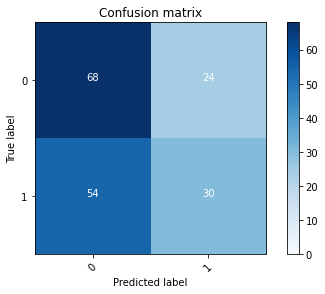

2022-08-20 22:35:21 - [Epoch Train: 12] loss: 0.5239, auc: 0.8168, acc: 0.6997, time: 50.00 s            
2022-08-20 22:35:21 - [Epoch Valid: 12] loss: 0.7637, auc: 0.5270, acc: 0.5709, time: 12.00 s
2022-08-20 22:35:21 - acc improved from 0.5182 to 0.5709. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e12-loss0.764-acc0.571-auc0.527.pth'


 12%|████▊                                   | 12/100 [12:46<1:33:21, 63.65s/it]

2022-08-20 22:35:21 - EPOCH: 13
2022-08-20 22:35:22 - Train Step 10/979, train_loss: 0.4926
2022-08-20 22:35:22 - Train Step 20/979, train_loss: 0.4295
2022-08-20 22:35:23 - Train Step 30/979, train_loss: 0.4605
2022-08-20 22:35:23 - Train Step 40/979, train_loss: 0.5547
2022-08-20 22:35:24 - Train Step 50/979, train_loss: 0.5143
2022-08-20 22:35:24 - Train Step 60/979, train_loss: 0.5038
2022-08-20 22:35:25 - Train Step 70/979, train_loss: 0.4825
2022-08-20 22:35:25 - Train Step 80/979, train_loss: 0.4791
2022-08-20 22:35:26 - Train Step 90/979, train_loss: 0.4761
2022-08-20 22:35:26 - Train Step 100/979, train_loss: 0.5001
2022-08-20 22:35:27 - Train Step 110/979, train_loss: 0.4899
2022-08-20 22:35:28 - Train Step 120/979, train_loss: 0.4826
2022-08-20 22:35:28 - Train Step 130/979, train_loss: 0.4917
2022-08-20 22:35:29 - Train Step 140/979, train_loss: 0.4966
2022-08-20 22:35:29 - Train Step 150/979, train_loss: 0.4936
2022-08-20 22:35:30 - Train Step 160/979, train_loss: 0.4938
2

2022-08-20 22:36:21 - Valid Step 185/247, valid_loss: 0.7362
2022-08-20 22:36:21 - Valid Step 190/247, valid_loss: 0.7339
2022-08-20 22:36:22 - Valid Step 195/247, valid_loss: 0.7334
2022-08-20 22:36:22 - Valid Step 200/247, valid_loss: 0.7412
2022-08-20 22:36:22 - Valid Step 205/247, valid_loss: 0.7431
2022-08-20 22:36:22 - Valid Step 210/247, valid_loss: 0.7407
2022-08-20 22:36:23 - Valid Step 215/247, valid_loss: 0.7385
2022-08-20 22:36:23 - Valid Step 220/247, valid_loss: 0.7393
2022-08-20 22:36:23 - Valid Step 225/247, valid_loss: 0.7433
2022-08-20 22:36:23 - Valid Step 230/247, valid_loss: 0.7457
2022-08-20 22:36:24 - Valid Step 235/247, valid_loss: 0.7369
2022-08-20 22:36:24 - Valid Step 240/247, valid_loss: 0.7487
2022-08-20 22:36:24 - Valid Step 245/247, valid_loss: 0.7450
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
36      00009                0           1
144     00014                1         

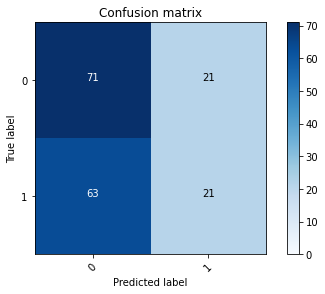

2022-08-20 22:36:24 - [Epoch Train: 13] loss: 0.5144, auc: 0.8164, acc: 0.7273, time: 50.00 s            
2022-08-20 22:36:24 - [Epoch Valid: 13] loss: 0.7467, auc: 0.5287, acc: 0.5385, time: 12.00 s


 13%|█████▏                                  | 13/100 [13:49<1:32:04, 63.50s/it]

2022-08-20 22:36:24 - EPOCH: 14
2022-08-20 22:36:25 - Train Step 10/979, train_loss: 0.4764
2022-08-20 22:36:26 - Train Step 20/979, train_loss: 0.3758
2022-08-20 22:36:26 - Train Step 30/979, train_loss: 0.4325
2022-08-20 22:36:27 - Train Step 40/979, train_loss: 0.4179
2022-08-20 22:36:27 - Train Step 50/979, train_loss: 0.4293
2022-08-20 22:36:28 - Train Step 60/979, train_loss: 0.4144
2022-08-20 22:36:28 - Train Step 70/979, train_loss: 0.4369
2022-08-20 22:36:29 - Train Step 80/979, train_loss: 0.4746
2022-08-20 22:36:29 - Train Step 90/979, train_loss: 0.4768
2022-08-20 22:36:30 - Train Step 100/979, train_loss: 0.4871
2022-08-20 22:36:30 - Train Step 110/979, train_loss: 0.4871
2022-08-20 22:36:31 - Train Step 120/979, train_loss: 0.4862
2022-08-20 22:36:31 - Train Step 130/979, train_loss: 0.5066
2022-08-20 22:36:32 - Train Step 140/979, train_loss: 0.4984
2022-08-20 22:36:32 - Train Step 150/979, train_loss: 0.4957
2022-08-20 22:36:33 - Train Step 160/979, train_loss: 0.4913
2

2022-08-20 22:37:25 - Valid Step 185/247, valid_loss: 0.7616
2022-08-20 22:37:26 - Valid Step 190/247, valid_loss: 0.7580
2022-08-20 22:37:26 - Valid Step 195/247, valid_loss: 0.7515
2022-08-20 22:37:26 - Valid Step 200/247, valid_loss: 0.7476
2022-08-20 22:37:27 - Valid Step 205/247, valid_loss: 0.7656
2022-08-20 22:37:27 - Valid Step 210/247, valid_loss: 0.7644
2022-08-20 22:37:27 - Valid Step 215/247, valid_loss: 0.7594
2022-08-20 22:37:27 - Valid Step 220/247, valid_loss: 0.7590
2022-08-20 22:37:28 - Valid Step 225/247, valid_loss: 0.7569
2022-08-20 22:37:28 - Valid Step 230/247, valid_loss: 0.7498
2022-08-20 22:37:28 - Valid Step 235/247, valid_loss: 0.7457
2022-08-20 22:37:28 - Valid Step 240/247, valid_loss: 0.7458
2022-08-20 22:37:29 - Valid Step 245/247, valid_loss: 0.7553
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
107     00009                0           1
121     00014                1         

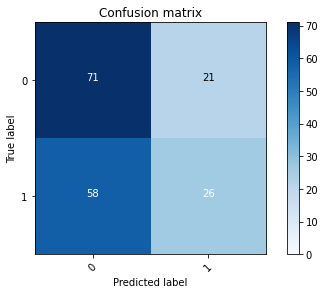

2022-08-20 22:37:29 - [Epoch Train: 14] loss: 0.5019, auc: 0.8315, acc: 0.7508, time: 51.00 s            
2022-08-20 22:37:29 - [Epoch Valid: 14] loss: 0.7595, auc: 0.5260, acc: 0.5789, time: 13.00 s
2022-08-20 22:37:29 - acc improved from 0.5709 to 0.5789. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e14-loss0.759-acc0.579-auc0.526.pth'


 14%|█████▌                                  | 14/100 [14:54<1:31:29, 63.84s/it]

2022-08-20 22:37:29 - EPOCH: 15
2022-08-20 22:37:30 - Train Step 10/979, train_loss: 0.4631
2022-08-20 22:37:30 - Train Step 20/979, train_loss: 0.4827
2022-08-20 22:37:31 - Train Step 30/979, train_loss: 0.4854
2022-08-20 22:37:31 - Train Step 40/979, train_loss: 0.5035
2022-08-20 22:37:32 - Train Step 50/979, train_loss: 0.5029
2022-08-20 22:37:32 - Train Step 60/979, train_loss: 0.4980
2022-08-20 22:37:33 - Train Step 70/979, train_loss: 0.4783
2022-08-20 22:37:33 - Train Step 80/979, train_loss: 0.4959
2022-08-20 22:37:34 - Train Step 90/979, train_loss: 0.4888
2022-08-20 22:37:34 - Train Step 100/979, train_loss: 0.4809
2022-08-20 22:37:35 - Train Step 110/979, train_loss: 0.4973
2022-08-20 22:37:36 - Train Step 120/979, train_loss: 0.4746
2022-08-20 22:37:36 - Train Step 130/979, train_loss: 0.4845
2022-08-20 22:37:37 - Train Step 140/979, train_loss: 0.4823
2022-08-20 22:37:37 - Train Step 150/979, train_loss: 0.4776
2022-08-20 22:37:38 - Train Step 160/979, train_loss: 0.4833
2

2022-08-20 22:38:30 - Valid Step 185/247, valid_loss: 0.7663
2022-08-20 22:38:31 - Valid Step 190/247, valid_loss: 0.7606
2022-08-20 22:38:31 - Valid Step 195/247, valid_loss: 0.7634
2022-08-20 22:38:31 - Valid Step 200/247, valid_loss: 0.7641
2022-08-20 22:38:31 - Valid Step 205/247, valid_loss: 0.7600
2022-08-20 22:38:32 - Valid Step 210/247, valid_loss: 0.7551
2022-08-20 22:38:32 - Valid Step 215/247, valid_loss: 0.7508
2022-08-20 22:38:32 - Valid Step 220/247, valid_loss: 0.7511
2022-08-20 22:38:32 - Valid Step 225/247, valid_loss: 0.7527
2022-08-20 22:38:33 - Valid Step 230/247, valid_loss: 0.7625
2022-08-20 22:38:33 - Valid Step 235/247, valid_loss: 0.7678
2022-08-20 22:38:33 - Valid Step 240/247, valid_loss: 0.7744
2022-08-20 22:38:34 - Valid Step 245/247, valid_loss: 0.7795
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
42      00009                0           1
160     00014                1         

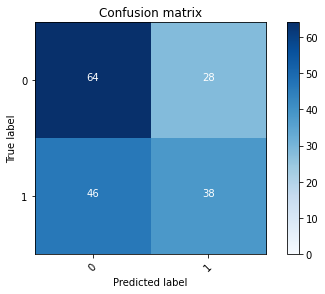

2022-08-20 22:38:34 - [Epoch Train: 15] loss: 0.4884, auc: 0.8384, acc: 0.7538, time: 51.00 s            
2022-08-20 22:38:34 - [Epoch Valid: 15] loss: 0.7788, auc: 0.5401, acc: 0.5951, time: 13.00 s
2022-08-20 22:38:34 - acc improved from 0.5789 to 0.5951. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e15-loss0.779-acc0.595-auc0.540.pth'


 15%|██████                                  | 15/100 [15:58<1:30:50, 64.13s/it]

2022-08-20 22:38:34 - EPOCH: 16
2022-08-20 22:38:34 - Train Step 10/979, train_loss: 0.7454
2022-08-20 22:38:35 - Train Step 20/979, train_loss: 0.6125
2022-08-20 22:38:35 - Train Step 30/979, train_loss: 0.5425
2022-08-20 22:38:36 - Train Step 40/979, train_loss: 0.4884
2022-08-20 22:38:37 - Train Step 50/979, train_loss: 0.4760
2022-08-20 22:38:37 - Train Step 60/979, train_loss: 0.4438
2022-08-20 22:38:38 - Train Step 70/979, train_loss: 0.4299
2022-08-20 22:38:38 - Train Step 80/979, train_loss: 0.4196
2022-08-20 22:38:39 - Train Step 90/979, train_loss: 0.4460
2022-08-20 22:38:39 - Train Step 100/979, train_loss: 0.4281
2022-08-20 22:38:40 - Train Step 110/979, train_loss: 0.4258
2022-08-20 22:38:40 - Train Step 120/979, train_loss: 0.4323
2022-08-20 22:38:41 - Train Step 130/979, train_loss: 0.4130
2022-08-20 22:38:41 - Train Step 140/979, train_loss: 0.4352
2022-08-20 22:38:42 - Train Step 150/979, train_loss: 0.4307
2022-08-20 22:38:42 - Train Step 160/979, train_loss: 0.4358
2

2022-08-20 22:39:35 - Valid Step 185/247, valid_loss: 0.7910
2022-08-20 22:39:35 - Valid Step 190/247, valid_loss: 0.7991
2022-08-20 22:39:35 - Valid Step 195/247, valid_loss: 0.7970
2022-08-20 22:39:35 - Valid Step 200/247, valid_loss: 0.7999
2022-08-20 22:39:36 - Valid Step 205/247, valid_loss: 0.7934
2022-08-20 22:39:36 - Valid Step 210/247, valid_loss: 0.7933
2022-08-20 22:39:36 - Valid Step 215/247, valid_loss: 0.7932
2022-08-20 22:39:36 - Valid Step 220/247, valid_loss: 0.7846
2022-08-20 22:39:37 - Valid Step 225/247, valid_loss: 0.7835
2022-08-20 22:39:37 - Valid Step 230/247, valid_loss: 0.7761
2022-08-20 22:39:37 - Valid Step 235/247, valid_loss: 0.7779
2022-08-20 22:39:37 - Valid Step 240/247, valid_loss: 0.7739
2022-08-20 22:39:38 - Valid Step 245/247, valid_loss: 0.7725
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
20      00009                0           1
63      00014                1         

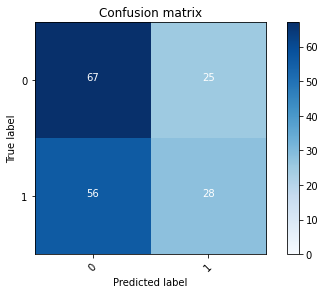

2022-08-20 22:39:38 - [Epoch Train: 16] loss: 0.4723, auc: 0.8471, acc: 0.7702, time: 51.00 s            
2022-08-20 22:39:38 - [Epoch Valid: 16] loss: 0.7685, auc: 0.5325, acc: 0.5668, time: 12.00 s


 16%|██████▍                                 | 16/100 [17:02<1:29:47, 64.13s/it]

2022-08-20 22:39:38 - EPOCH: 17
2022-08-20 22:39:39 - Train Step 10/979, train_loss: 0.3730
2022-08-20 22:39:39 - Train Step 20/979, train_loss: 0.3387
2022-08-20 22:39:40 - Train Step 30/979, train_loss: 0.3843
2022-08-20 22:39:40 - Train Step 40/979, train_loss: 0.3891
2022-08-20 22:39:41 - Train Step 50/979, train_loss: 0.4099
2022-08-20 22:39:41 - Train Step 60/979, train_loss: 0.4163
2022-08-20 22:39:42 - Train Step 70/979, train_loss: 0.4483
2022-08-20 22:39:42 - Train Step 80/979, train_loss: 0.4427
2022-08-20 22:39:43 - Train Step 90/979, train_loss: 0.4599
2022-08-20 22:39:43 - Train Step 100/979, train_loss: 0.4713
2022-08-20 22:39:44 - Train Step 110/979, train_loss: 0.4512
2022-08-20 22:39:44 - Train Step 120/979, train_loss: 0.4425
2022-08-20 22:39:45 - Train Step 130/979, train_loss: 0.4416
2022-08-20 22:39:45 - Train Step 140/979, train_loss: 0.4333
2022-08-20 22:39:46 - Train Step 150/979, train_loss: 0.4201
2022-08-20 22:39:46 - Train Step 160/979, train_loss: 0.4175
2

2022-08-20 22:40:38 - Valid Step 185/247, valid_loss: 0.8349
2022-08-20 22:40:39 - Valid Step 190/247, valid_loss: 0.8239
2022-08-20 22:40:39 - Valid Step 195/247, valid_loss: 0.8137
2022-08-20 22:40:39 - Valid Step 200/247, valid_loss: 0.8141
2022-08-20 22:40:39 - Valid Step 205/247, valid_loss: 0.8042
2022-08-20 22:40:40 - Valid Step 210/247, valid_loss: 0.8156
2022-08-20 22:40:40 - Valid Step 215/247, valid_loss: 0.8127
2022-08-20 22:40:40 - Valid Step 220/247, valid_loss: 0.8100
2022-08-20 22:40:40 - Valid Step 225/247, valid_loss: 0.8083
2022-08-20 22:40:41 - Valid Step 230/247, valid_loss: 0.8102
2022-08-20 22:40:41 - Valid Step 235/247, valid_loss: 0.8240
2022-08-20 22:40:41 - Valid Step 240/247, valid_loss: 0.8194
2022-08-20 22:40:41 - Valid Step 245/247, valid_loss: 0.8093
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
64      00009                0           1
61      00014                1         

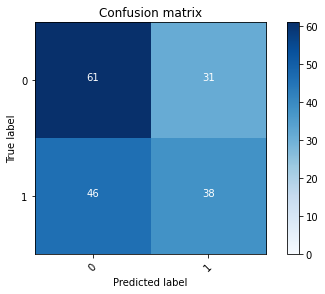

2022-08-20 22:40:42 - [Epoch Train: 17] loss: 0.4474, auc: 0.8646, acc: 0.7824, time: 50.00 s            
2022-08-20 22:40:42 - [Epoch Valid: 17] loss: 0.8078, auc: 0.5349, acc: 0.5789, time: 12.00 s


 17%|██████▊                                 | 17/100 [18:06<1:28:34, 64.03s/it]

2022-08-20 22:40:42 - EPOCH: 18
2022-08-20 22:40:42 - Train Step 10/979, train_loss: 0.5638
2022-08-20 22:40:43 - Train Step 20/979, train_loss: 0.4680
2022-08-20 22:40:43 - Train Step 30/979, train_loss: 0.4734
2022-08-20 22:40:44 - Train Step 40/979, train_loss: 0.4143
2022-08-20 22:40:45 - Train Step 50/979, train_loss: 0.4006
2022-08-20 22:40:45 - Train Step 60/979, train_loss: 0.4504
2022-08-20 22:40:46 - Train Step 70/979, train_loss: 0.4324
2022-08-20 22:40:46 - Train Step 80/979, train_loss: 0.4163
2022-08-20 22:40:47 - Train Step 90/979, train_loss: 0.4359
2022-08-20 22:40:47 - Train Step 100/979, train_loss: 0.4478
2022-08-20 22:40:48 - Train Step 110/979, train_loss: 0.4261
2022-08-20 22:40:48 - Train Step 120/979, train_loss: 0.4180
2022-08-20 22:40:49 - Train Step 130/979, train_loss: 0.4347
2022-08-20 22:40:49 - Train Step 140/979, train_loss: 0.4403
2022-08-20 22:40:50 - Train Step 150/979, train_loss: 0.4362
2022-08-20 22:40:50 - Train Step 160/979, train_loss: 0.4344
2

2022-08-20 22:41:42 - Valid Step 185/247, valid_loss: 0.7587
2022-08-20 22:41:42 - Valid Step 190/247, valid_loss: 0.7773
2022-08-20 22:41:42 - Valid Step 195/247, valid_loss: 0.7889
2022-08-20 22:41:43 - Valid Step 200/247, valid_loss: 0.7951
2022-08-20 22:41:43 - Valid Step 205/247, valid_loss: 0.7890
2022-08-20 22:41:43 - Valid Step 210/247, valid_loss: 0.7844
2022-08-20 22:41:43 - Valid Step 215/247, valid_loss: 0.7861
2022-08-20 22:41:44 - Valid Step 220/247, valid_loss: 0.7839
2022-08-20 22:41:44 - Valid Step 225/247, valid_loss: 0.7810
2022-08-20 22:41:44 - Valid Step 230/247, valid_loss: 0.7780
2022-08-20 22:41:44 - Valid Step 235/247, valid_loss: 0.7813
2022-08-20 22:41:45 - Valid Step 240/247, valid_loss: 0.7933
2022-08-20 22:41:45 - Valid Step 245/247, valid_loss: 0.7958
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
65      00009                0           1
4       00014                1         

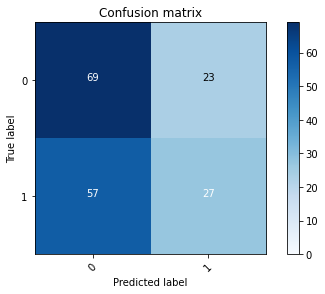

2022-08-20 22:41:45 - [Epoch Train: 18] loss: 0.4492, auc: 0.8587, acc: 0.7783, time: 50.00 s            
2022-08-20 22:41:45 - [Epoch Valid: 18] loss: 0.7946, auc: 0.5426, acc: 0.5709, time: 13.00 s


 18%|███████▏                                | 18/100 [19:10<1:27:18, 63.89s/it]

2022-08-20 22:41:45 - EPOCH: 19
2022-08-20 22:41:46 - Train Step 10/979, train_loss: 0.3849
2022-08-20 22:41:46 - Train Step 20/979, train_loss: 0.4204
2022-08-20 22:41:47 - Train Step 30/979, train_loss: 0.4062
2022-08-20 22:41:48 - Train Step 40/979, train_loss: 0.3950
2022-08-20 22:41:48 - Train Step 50/979, train_loss: 0.4107
2022-08-20 22:41:49 - Train Step 60/979, train_loss: 0.4030
2022-08-20 22:41:49 - Train Step 70/979, train_loss: 0.3972
2022-08-20 22:41:50 - Train Step 80/979, train_loss: 0.4007
2022-08-20 22:41:50 - Train Step 90/979, train_loss: 0.3925
2022-08-20 22:41:51 - Train Step 100/979, train_loss: 0.3962
2022-08-20 22:41:51 - Train Step 110/979, train_loss: 0.4025
2022-08-20 22:41:52 - Train Step 120/979, train_loss: 0.3906
2022-08-20 22:41:52 - Train Step 130/979, train_loss: 0.3902
2022-08-20 22:41:53 - Train Step 140/979, train_loss: 0.3828
2022-08-20 22:41:53 - Train Step 150/979, train_loss: 0.3970
2022-08-20 22:41:54 - Train Step 160/979, train_loss: 0.3993
2

2022-08-20 22:42:46 - Valid Step 185/247, valid_loss: 0.8134
2022-08-20 22:42:46 - Valid Step 190/247, valid_loss: 0.8183
2022-08-20 22:42:46 - Valid Step 195/247, valid_loss: 0.8042
2022-08-20 22:42:46 - Valid Step 200/247, valid_loss: 0.8033
2022-08-20 22:42:47 - Valid Step 205/247, valid_loss: 0.7928
2022-08-20 22:42:47 - Valid Step 210/247, valid_loss: 0.7924
2022-08-20 22:42:47 - Valid Step 215/247, valid_loss: 0.7953
2022-08-20 22:42:47 - Valid Step 220/247, valid_loss: 0.7969
2022-08-20 22:42:48 - Valid Step 225/247, valid_loss: 0.7906
2022-08-20 22:42:48 - Valid Step 230/247, valid_loss: 0.7850
2022-08-20 22:42:48 - Valid Step 235/247, valid_loss: 0.7882
2022-08-20 22:42:48 - Valid Step 240/247, valid_loss: 0.7886
2022-08-20 22:42:49 - Valid Step 245/247, valid_loss: 0.7885
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
146     00009                0           1
122     00014                1         

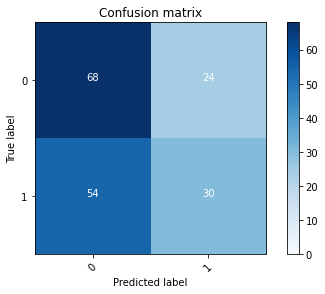

2022-08-20 22:42:49 - [Epoch Train: 19] loss: 0.4312, auc: 0.8779, acc: 0.7947, time: 50.00 s            
2022-08-20 22:42:49 - [Epoch Valid: 19] loss: 0.7872, auc: 0.5379, acc: 0.5789, time: 13.00 s


 19%|███████▌                                | 19/100 [20:14<1:26:10, 63.84s/it]

2022-08-20 22:42:49 - EPOCH: 20
2022-08-20 22:42:50 - Train Step 10/979, train_loss: 0.4776
2022-08-20 22:42:50 - Train Step 20/979, train_loss: 0.4076
2022-08-20 22:42:51 - Train Step 30/979, train_loss: 0.4249
2022-08-20 22:42:51 - Train Step 40/979, train_loss: 0.4162
2022-08-20 22:42:52 - Train Step 50/979, train_loss: 0.4495
2022-08-20 22:42:52 - Train Step 60/979, train_loss: 0.4929
2022-08-20 22:42:53 - Train Step 70/979, train_loss: 0.4701
2022-08-20 22:42:53 - Train Step 80/979, train_loss: 0.4513
2022-08-20 22:42:54 - Train Step 90/979, train_loss: 0.5000
2022-08-20 22:42:54 - Train Step 100/979, train_loss: 0.4835
2022-08-20 22:42:55 - Train Step 110/979, train_loss: 0.4813
2022-08-20 22:42:55 - Train Step 120/979, train_loss: 0.4771
2022-08-20 22:42:56 - Train Step 130/979, train_loss: 0.4752
2022-08-20 22:42:56 - Train Step 140/979, train_loss: 0.4627
2022-08-20 22:42:57 - Train Step 150/979, train_loss: 0.4528
2022-08-20 22:42:57 - Train Step 160/979, train_loss: 0.4419
2

2022-08-20 22:43:49 - Valid Step 185/247, valid_loss: 0.7680
2022-08-20 22:43:50 - Valid Step 190/247, valid_loss: 0.7652
2022-08-20 22:43:50 - Valid Step 195/247, valid_loss: 0.7678
2022-08-20 22:43:50 - Valid Step 200/247, valid_loss: 0.7611
2022-08-20 22:43:50 - Valid Step 205/247, valid_loss: 0.7604
2022-08-20 22:43:51 - Valid Step 210/247, valid_loss: 0.7665
2022-08-20 22:43:51 - Valid Step 215/247, valid_loss: 0.7763
2022-08-20 22:43:51 - Valid Step 220/247, valid_loss: 0.7771
2022-08-20 22:43:51 - Valid Step 225/247, valid_loss: 0.7789
2022-08-20 22:43:52 - Valid Step 230/247, valid_loss: 0.7713
2022-08-20 22:43:52 - Valid Step 235/247, valid_loss: 0.7741
2022-08-20 22:43:52 - Valid Step 240/247, valid_loss: 0.7750
2022-08-20 22:43:52 - Valid Step 245/247, valid_loss: 0.7732
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
14      00009                0           1
174     00014                1         

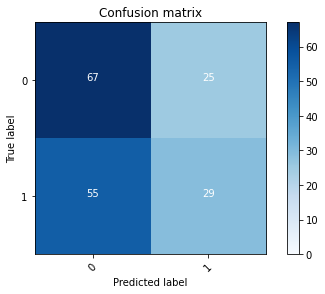

2022-08-20 22:43:53 - [Epoch Train: 20] loss: 0.4288, auc: 0.8707, acc: 0.8029, time: 50.00 s            
2022-08-20 22:43:53 - [Epoch Valid: 20] loss: 0.7793, auc: 0.5440, acc: 0.5709, time: 12.00 s


 20%|████████                                | 20/100 [21:17<1:25:02, 63.79s/it]

2022-08-20 22:43:53 - EPOCH: 21
2022-08-20 22:43:53 - Train Step 10/979, train_loss: 0.5174
2022-08-20 22:43:54 - Train Step 20/979, train_loss: 0.3401
2022-08-20 22:43:54 - Train Step 30/979, train_loss: 0.3339
2022-08-20 22:43:55 - Train Step 40/979, train_loss: 0.3367
2022-08-20 22:43:55 - Train Step 50/979, train_loss: 0.3149
2022-08-20 22:43:56 - Train Step 60/979, train_loss: 0.3364
2022-08-20 22:43:56 - Train Step 70/979, train_loss: 0.3220
2022-08-20 22:43:57 - Train Step 80/979, train_loss: 0.3463
2022-08-20 22:43:57 - Train Step 90/979, train_loss: 0.3556
2022-08-20 22:43:58 - Train Step 100/979, train_loss: 0.3672
2022-08-20 22:43:58 - Train Step 110/979, train_loss: 0.3720
2022-08-20 22:43:59 - Train Step 120/979, train_loss: 0.3803
2022-08-20 22:44:00 - Train Step 130/979, train_loss: 0.3731
2022-08-20 22:44:00 - Train Step 140/979, train_loss: 0.3713
2022-08-20 22:44:01 - Train Step 150/979, train_loss: 0.3663
2022-08-20 22:44:01 - Train Step 160/979, train_loss: 0.3699
2

2022-08-20 22:44:53 - Valid Step 185/247, valid_loss: 0.7780
2022-08-20 22:44:53 - Valid Step 190/247, valid_loss: 0.7813
2022-08-20 22:44:53 - Valid Step 195/247, valid_loss: 0.7820
2022-08-20 22:44:54 - Valid Step 200/247, valid_loss: 0.7794
2022-08-20 22:44:54 - Valid Step 205/247, valid_loss: 0.7761
2022-08-20 22:44:54 - Valid Step 210/247, valid_loss: 0.7733
2022-08-20 22:44:54 - Valid Step 215/247, valid_loss: 0.7737
2022-08-20 22:44:55 - Valid Step 220/247, valid_loss: 0.7951
2022-08-20 22:44:55 - Valid Step 225/247, valid_loss: 0.7978
2022-08-20 22:44:55 - Valid Step 230/247, valid_loss: 0.7893
2022-08-20 22:44:55 - Valid Step 235/247, valid_loss: 0.7900
2022-08-20 22:44:56 - Valid Step 240/247, valid_loss: 0.8001
2022-08-20 22:44:56 - Valid Step 245/247, valid_loss: 0.7989
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
44      00009                0           1
144     00014                1         

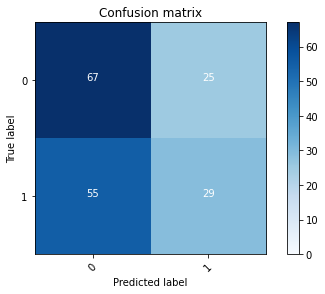

2022-08-20 22:44:56 - [Epoch Train: 21] loss: 0.4072, auc: 0.8882, acc: 0.8090, time: 50.00 s            
2022-08-20 22:44:56 - [Epoch Valid: 21] loss: 0.7984, auc: 0.5439, acc: 0.5668, time: 13.00 s


 21%|████████▍                               | 21/100 [22:21<1:23:53, 63.72s/it]

2022-08-20 22:44:56 - EPOCH: 22
2022-08-20 22:44:57 - Train Step 10/979, train_loss: 0.2768
2022-08-20 22:44:57 - Train Step 20/979, train_loss: 0.2790
2022-08-20 22:44:58 - Train Step 30/979, train_loss: 0.3499
2022-08-20 22:44:59 - Train Step 40/979, train_loss: 0.3590
2022-08-20 22:44:59 - Train Step 50/979, train_loss: 0.3405
2022-08-20 22:45:00 - Train Step 60/979, train_loss: 0.3391
2022-08-20 22:45:00 - Train Step 70/979, train_loss: 0.3695
2022-08-20 22:45:01 - Train Step 80/979, train_loss: 0.3731
2022-08-20 22:45:01 - Train Step 90/979, train_loss: 0.3846
2022-08-20 22:45:02 - Train Step 100/979, train_loss: 0.3776
2022-08-20 22:45:02 - Train Step 110/979, train_loss: 0.3742
2022-08-20 22:45:03 - Train Step 120/979, train_loss: 0.3791
2022-08-20 22:45:03 - Train Step 130/979, train_loss: 0.3798
2022-08-20 22:45:04 - Train Step 140/979, train_loss: 0.3784
2022-08-20 22:45:04 - Train Step 150/979, train_loss: 0.3861
2022-08-20 22:45:05 - Train Step 160/979, train_loss: 0.3823
2

2022-08-20 22:45:57 - Valid Step 185/247, valid_loss: 0.7685
2022-08-20 22:45:57 - Valid Step 190/247, valid_loss: 0.7640
2022-08-20 22:45:57 - Valid Step 195/247, valid_loss: 0.7703
2022-08-20 22:45:58 - Valid Step 200/247, valid_loss: 0.7941
2022-08-20 22:45:58 - Valid Step 205/247, valid_loss: 0.7850
2022-08-20 22:45:58 - Valid Step 210/247, valid_loss: 0.7862
2022-08-20 22:45:58 - Valid Step 215/247, valid_loss: 0.7966
2022-08-20 22:45:59 - Valid Step 220/247, valid_loss: 0.8026
2022-08-20 22:45:59 - Valid Step 225/247, valid_loss: 0.8109
2022-08-20 22:45:59 - Valid Step 230/247, valid_loss: 0.8087
2022-08-20 22:45:59 - Valid Step 235/247, valid_loss: 0.8035
2022-08-20 22:46:00 - Valid Step 240/247, valid_loss: 0.8032
2022-08-20 22:46:00 - Valid Step 245/247, valid_loss: 0.8183
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
139     00009                0           1
34      00014                1         

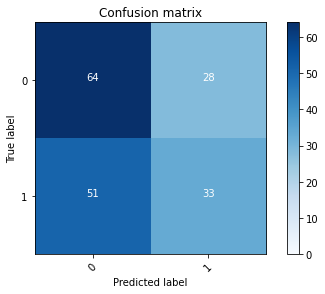

2022-08-20 22:46:00 - [Epoch Train: 22] loss: 0.3978, auc: 0.8883, acc: 0.8212, time: 51.00 s            
2022-08-20 22:46:00 - [Epoch Valid: 22] loss: 0.8208, auc: 0.5483, acc: 0.5709, time: 12.00 s


 22%|████████▊                               | 22/100 [23:25<1:22:57, 63.81s/it]

2022-08-20 22:46:00 - EPOCH: 23
2022-08-20 22:46:01 - Train Step 10/979, train_loss: 0.8706
2022-08-20 22:46:01 - Train Step 20/979, train_loss: 0.7583
2022-08-20 22:46:02 - Train Step 30/979, train_loss: 0.6426
2022-08-20 22:46:03 - Train Step 40/979, train_loss: 0.5864
2022-08-20 22:46:03 - Train Step 50/979, train_loss: 0.5455
2022-08-20 22:46:04 - Train Step 60/979, train_loss: 0.5206
2022-08-20 22:46:04 - Train Step 70/979, train_loss: 0.5203
2022-08-20 22:46:05 - Train Step 80/979, train_loss: 0.4945
2022-08-20 22:46:05 - Train Step 90/979, train_loss: 0.4812
2022-08-20 22:46:06 - Train Step 100/979, train_loss: 0.4814
2022-08-20 22:46:06 - Train Step 110/979, train_loss: 0.4611
2022-08-20 22:46:07 - Train Step 120/979, train_loss: 0.4473
2022-08-20 22:46:07 - Train Step 130/979, train_loss: 0.4334
2022-08-20 22:46:08 - Train Step 140/979, train_loss: 0.4418
2022-08-20 22:46:08 - Train Step 150/979, train_loss: 0.4323
2022-08-20 22:46:09 - Train Step 160/979, train_loss: 0.4236
2

2022-08-20 22:47:01 - Valid Step 185/247, valid_loss: 0.8743
2022-08-20 22:47:01 - Valid Step 190/247, valid_loss: 0.8902
2022-08-20 22:47:01 - Valid Step 195/247, valid_loss: 0.8860
2022-08-20 22:47:02 - Valid Step 200/247, valid_loss: 0.8853
2022-08-20 22:47:02 - Valid Step 205/247, valid_loss: 0.8813
2022-08-20 22:47:02 - Valid Step 210/247, valid_loss: 0.8807
2022-08-20 22:47:02 - Valid Step 215/247, valid_loss: 0.8744
2022-08-20 22:47:03 - Valid Step 220/247, valid_loss: 0.8822
2022-08-20 22:47:03 - Valid Step 225/247, valid_loss: 0.8829
2022-08-20 22:47:03 - Valid Step 230/247, valid_loss: 0.8739
2022-08-20 22:47:04 - Valid Step 235/247, valid_loss: 0.8710
2022-08-20 22:47:04 - Valid Step 240/247, valid_loss: 0.8617
2022-08-20 22:47:04 - Valid Step 245/247, valid_loss: 0.8526
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
18      00009                0           1
7       00014                1         

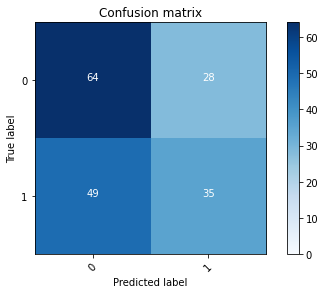

2022-08-20 22:47:04 - [Epoch Train: 23] loss: 0.3807, auc: 0.8995, acc: 0.8294, time: 51.00 s            
2022-08-20 22:47:04 - [Epoch Valid: 23] loss: 0.8571, auc: 0.5516, acc: 0.5870, time: 12.00 s


 23%|█████████▏                              | 23/100 [24:29<1:21:59, 63.89s/it]

2022-08-20 22:47:04 - EPOCH: 24
2022-08-20 22:47:05 - Train Step 10/979, train_loss: 0.2833
2022-08-20 22:47:05 - Train Step 20/979, train_loss: 0.4166
2022-08-20 22:47:06 - Train Step 30/979, train_loss: 0.4369
2022-08-20 22:47:06 - Train Step 40/979, train_loss: 0.4025
2022-08-20 22:47:07 - Train Step 50/979, train_loss: 0.4062
2022-08-20 22:47:07 - Train Step 60/979, train_loss: 0.4299
2022-08-20 22:47:08 - Train Step 70/979, train_loss: 0.4343
2022-08-20 22:47:08 - Train Step 80/979, train_loss: 0.4184
2022-08-20 22:47:09 - Train Step 90/979, train_loss: 0.4318
2022-08-20 22:47:09 - Train Step 100/979, train_loss: 0.4317
2022-08-20 22:47:10 - Train Step 110/979, train_loss: 0.4183
2022-08-20 22:47:10 - Train Step 120/979, train_loss: 0.4079
2022-08-20 22:47:11 - Train Step 130/979, train_loss: 0.4003
2022-08-20 22:47:12 - Train Step 140/979, train_loss: 0.4068
2022-08-20 22:47:12 - Train Step 150/979, train_loss: 0.3957
2022-08-20 22:47:13 - Train Step 160/979, train_loss: 0.3935
2

2022-08-20 22:48:05 - Valid Step 185/247, valid_loss: 0.8170
2022-08-20 22:48:05 - Valid Step 190/247, valid_loss: 0.8060
2022-08-20 22:48:05 - Valid Step 195/247, valid_loss: 0.8041
2022-08-20 22:48:06 - Valid Step 200/247, valid_loss: 0.8151
2022-08-20 22:48:06 - Valid Step 205/247, valid_loss: 0.8052
2022-08-20 22:48:06 - Valid Step 210/247, valid_loss: 0.8003
2022-08-20 22:48:07 - Valid Step 215/247, valid_loss: 0.8081
2022-08-20 22:48:07 - Valid Step 220/247, valid_loss: 0.8147
2022-08-20 22:48:07 - Valid Step 225/247, valid_loss: 0.8361
2022-08-20 22:48:07 - Valid Step 230/247, valid_loss: 0.8351
2022-08-20 22:48:08 - Valid Step 235/247, valid_loss: 0.8389
2022-08-20 22:48:08 - Valid Step 240/247, valid_loss: 0.8304
2022-08-20 22:48:08 - Valid Step 245/247, valid_loss: 0.8349
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
144     00009                0           1
136     00014                1         

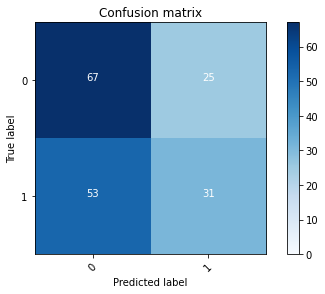

2022-08-20 22:48:08 - [Epoch Train: 24] loss: 0.3811, auc: 0.8994, acc: 0.8355, time: 50.00 s            
2022-08-20 22:48:08 - [Epoch Valid: 24] loss: 0.8299, auc: 0.5514, acc: 0.5789, time: 13.00 s


 24%|█████████▌                              | 24/100 [25:33<1:20:59, 63.94s/it]

2022-08-20 22:48:08 - EPOCH: 25
2022-08-20 22:48:09 - Train Step 10/979, train_loss: 0.3869
2022-08-20 22:48:10 - Train Step 20/979, train_loss: 0.3817
2022-08-20 22:48:10 - Train Step 30/979, train_loss: 0.3708
2022-08-20 22:48:11 - Train Step 40/979, train_loss: 0.3606
2022-08-20 22:48:11 - Train Step 50/979, train_loss: 0.3556
2022-08-20 22:48:12 - Train Step 60/979, train_loss: 0.3314
2022-08-20 22:48:12 - Train Step 70/979, train_loss: 0.3350
2022-08-20 22:48:13 - Train Step 80/979, train_loss: 0.3330
2022-08-20 22:48:13 - Train Step 90/979, train_loss: 0.3327
2022-08-20 22:48:14 - Train Step 100/979, train_loss: 0.3353
2022-08-20 22:48:14 - Train Step 110/979, train_loss: 0.3399
2022-08-20 22:48:15 - Train Step 120/979, train_loss: 0.3426
2022-08-20 22:48:15 - Train Step 130/979, train_loss: 0.3403
2022-08-20 22:48:16 - Train Step 140/979, train_loss: 0.3402
2022-08-20 22:48:16 - Train Step 150/979, train_loss: 0.3464
2022-08-20 22:48:17 - Train Step 160/979, train_loss: 0.3497
2

2022-08-20 22:49:08 - Valid Step 185/247, valid_loss: 0.8170
2022-08-20 22:49:09 - Valid Step 190/247, valid_loss: 0.8185
2022-08-20 22:49:09 - Valid Step 195/247, valid_loss: 0.8128
2022-08-20 22:49:09 - Valid Step 200/247, valid_loss: 0.8120
2022-08-20 22:49:09 - Valid Step 205/247, valid_loss: 0.8042
2022-08-20 22:49:10 - Valid Step 210/247, valid_loss: 0.8018
2022-08-20 22:49:10 - Valid Step 215/247, valid_loss: 0.8002
2022-08-20 22:49:10 - Valid Step 220/247, valid_loss: 0.8069
2022-08-20 22:49:10 - Valid Step 225/247, valid_loss: 0.8053
2022-08-20 22:49:11 - Valid Step 230/247, valid_loss: 0.8051
2022-08-20 22:49:11 - Valid Step 235/247, valid_loss: 0.8071
2022-08-20 22:49:11 - Valid Step 240/247, valid_loss: 0.8082
2022-08-20 22:49:11 - Valid Step 245/247, valid_loss: 0.8090
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
136     00009                0           1
149     00014                1         

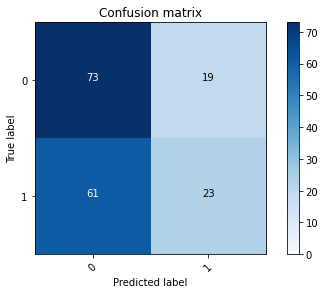

2022-08-20 22:49:12 - [Epoch Train: 25] loss: 0.3659, auc: 0.9077, acc: 0.8417, time: 50.00 s            
2022-08-20 22:49:12 - [Epoch Valid: 25] loss: 0.8076, auc: 0.5555, acc: 0.5789, time: 12.00 s


 25%|██████████                              | 25/100 [26:36<1:19:41, 63.76s/it]

2022-08-20 22:49:12 - EPOCH: 26
2022-08-20 22:49:12 - Train Step 10/979, train_loss: 0.3172
2022-08-20 22:49:13 - Train Step 20/979, train_loss: 0.2537
2022-08-20 22:49:13 - Train Step 30/979, train_loss: 0.2917
2022-08-20 22:49:14 - Train Step 40/979, train_loss: 0.2841
2022-08-20 22:49:14 - Train Step 50/979, train_loss: 0.3366
2022-08-20 22:49:15 - Train Step 60/979, train_loss: 0.3301
2022-08-20 22:49:15 - Train Step 70/979, train_loss: 0.3486
2022-08-20 22:49:16 - Train Step 80/979, train_loss: 0.3677
2022-08-20 22:49:16 - Train Step 90/979, train_loss: 0.3546
2022-08-20 22:49:17 - Train Step 100/979, train_loss: 0.3849
2022-08-20 22:49:17 - Train Step 110/979, train_loss: 0.3870
2022-08-20 22:49:18 - Train Step 120/979, train_loss: 0.3811
2022-08-20 22:49:19 - Train Step 130/979, train_loss: 0.3731
2022-08-20 22:49:19 - Train Step 140/979, train_loss: 0.3658
2022-08-20 22:49:20 - Train Step 150/979, train_loss: 0.3605
2022-08-20 22:49:20 - Train Step 160/979, train_loss: 0.3524
2

2022-08-20 22:50:12 - Valid Step 185/247, valid_loss: 0.8880
2022-08-20 22:50:12 - Valid Step 190/247, valid_loss: 0.8971
2022-08-20 22:50:13 - Valid Step 195/247, valid_loss: 0.8848
2022-08-20 22:50:13 - Valid Step 200/247, valid_loss: 0.8723
2022-08-20 22:50:13 - Valid Step 205/247, valid_loss: 0.8704
2022-08-20 22:50:13 - Valid Step 210/247, valid_loss: 0.8735
2022-08-20 22:50:14 - Valid Step 215/247, valid_loss: 0.8741
2022-08-20 22:50:14 - Valid Step 220/247, valid_loss: 0.8612
2022-08-20 22:50:14 - Valid Step 225/247, valid_loss: 0.8635
2022-08-20 22:50:14 - Valid Step 230/247, valid_loss: 0.8650
2022-08-20 22:50:15 - Valid Step 235/247, valid_loss: 0.8732
2022-08-20 22:50:15 - Valid Step 240/247, valid_loss: 0.9021
2022-08-20 22:50:15 - Valid Step 245/247, valid_loss: 0.8954
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
24      00009                0           1
163     00014                1         

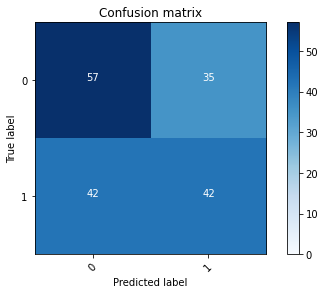

2022-08-20 22:50:15 - [Epoch Train: 26] loss: 0.3410, auc: 0.9228, acc: 0.8529, time: 50.00 s            
2022-08-20 22:50:15 - [Epoch Valid: 26] loss: 0.9083, auc: 0.5546, acc: 0.5911, time: 13.00 s


 26%|██████████▍                             | 26/100 [27:40<1:18:36, 63.74s/it]

2022-08-20 22:50:15 - EPOCH: 27
2022-08-20 22:50:16 - Train Step 10/979, train_loss: 0.2742
2022-08-20 22:50:17 - Train Step 20/979, train_loss: 0.1812
2022-08-20 22:50:17 - Train Step 30/979, train_loss: 0.2818
2022-08-20 22:50:18 - Train Step 40/979, train_loss: 0.2617
2022-08-20 22:50:18 - Train Step 50/979, train_loss: 0.2783
2022-08-20 22:50:19 - Train Step 60/979, train_loss: 0.2909
2022-08-20 22:50:19 - Train Step 70/979, train_loss: 0.2931
2022-08-20 22:50:20 - Train Step 80/979, train_loss: 0.3066
2022-08-20 22:50:20 - Train Step 90/979, train_loss: 0.3223
2022-08-20 22:50:21 - Train Step 100/979, train_loss: 0.3091
2022-08-20 22:50:21 - Train Step 110/979, train_loss: 0.3269
2022-08-20 22:50:22 - Train Step 120/979, train_loss: 0.3335
2022-08-20 22:50:22 - Train Step 130/979, train_loss: 0.3392
2022-08-20 22:50:23 - Train Step 140/979, train_loss: 0.3371
2022-08-20 22:50:23 - Train Step 150/979, train_loss: 0.3308
2022-08-20 22:50:24 - Train Step 160/979, train_loss: 0.3220
2

2022-08-20 22:51:16 - Valid Step 185/247, valid_loss: 0.8577
2022-08-20 22:51:16 - Valid Step 190/247, valid_loss: 0.8647
2022-08-20 22:51:16 - Valid Step 195/247, valid_loss: 0.8722
2022-08-20 22:51:16 - Valid Step 200/247, valid_loss: 0.8683
2022-08-20 22:51:17 - Valid Step 205/247, valid_loss: 0.8721
2022-08-20 22:51:17 - Valid Step 210/247, valid_loss: 0.8720
2022-08-20 22:51:17 - Valid Step 215/247, valid_loss: 0.8676
2022-08-20 22:51:18 - Valid Step 220/247, valid_loss: 0.8594
2022-08-20 22:51:18 - Valid Step 225/247, valid_loss: 0.8556
2022-08-20 22:51:18 - Valid Step 230/247, valid_loss: 0.8505
2022-08-20 22:51:18 - Valid Step 235/247, valid_loss: 0.8422
2022-08-20 22:51:19 - Valid Step 240/247, valid_loss: 0.8437
2022-08-20 22:51:19 - Valid Step 245/247, valid_loss: 0.8441
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
122     00009                0           1
135     00014                1         

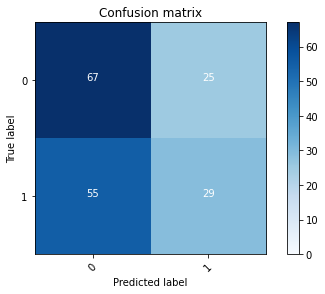

2022-08-20 22:51:19 - [Epoch Train: 27] loss: 0.3296, auc: 0.9237, acc: 0.8723, time: 50.00 s            
2022-08-20 22:51:19 - [Epoch Valid: 27] loss: 0.8451, auc: 0.5531, acc: 0.5668, time: 13.00 s


 27%|██████████▊                             | 27/100 [28:44<1:17:30, 63.70s/it]

2022-08-20 22:51:19 - EPOCH: 28
2022-08-20 22:51:20 - Train Step 10/979, train_loss: 0.4345
2022-08-20 22:51:20 - Train Step 20/979, train_loss: 0.4734
2022-08-20 22:51:21 - Train Step 30/979, train_loss: 0.4735
2022-08-20 22:51:21 - Train Step 40/979, train_loss: 0.4635
2022-08-20 22:51:22 - Train Step 50/979, train_loss: 0.4253
2022-08-20 22:51:22 - Train Step 60/979, train_loss: 0.4219
2022-08-20 22:51:23 - Train Step 70/979, train_loss: 0.4119
2022-08-20 22:51:23 - Train Step 80/979, train_loss: 0.3915
2022-08-20 22:51:24 - Train Step 90/979, train_loss: 0.3638
2022-08-20 22:51:24 - Train Step 100/979, train_loss: 0.3687
2022-08-20 22:51:25 - Train Step 110/979, train_loss: 0.3704
2022-08-20 22:51:25 - Train Step 120/979, train_loss: 0.3702
2022-08-20 22:51:26 - Train Step 130/979, train_loss: 0.3722
2022-08-20 22:51:26 - Train Step 140/979, train_loss: 0.3701
2022-08-20 22:51:27 - Train Step 150/979, train_loss: 0.3898
2022-08-20 22:51:27 - Train Step 160/979, train_loss: 0.3790
2

2022-08-20 22:52:19 - Valid Step 185/247, valid_loss: 0.9107
2022-08-20 22:52:20 - Valid Step 190/247, valid_loss: 0.9011
2022-08-20 22:52:20 - Valid Step 195/247, valid_loss: 0.8921
2022-08-20 22:52:20 - Valid Step 200/247, valid_loss: 0.8908
2022-08-20 22:52:20 - Valid Step 205/247, valid_loss: 0.8907
2022-08-20 22:52:21 - Valid Step 210/247, valid_loss: 0.8837
2022-08-20 22:52:21 - Valid Step 215/247, valid_loss: 0.8926
2022-08-20 22:52:21 - Valid Step 220/247, valid_loss: 0.8863
2022-08-20 22:52:21 - Valid Step 225/247, valid_loss: 0.8855
2022-08-20 22:52:22 - Valid Step 230/247, valid_loss: 0.9014
2022-08-20 22:52:22 - Valid Step 235/247, valid_loss: 0.8934
2022-08-20 22:52:22 - Valid Step 240/247, valid_loss: 0.8874
2022-08-20 22:52:22 - Valid Step 245/247, valid_loss: 0.8790
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
157     00009                0           1
105     00014                1         

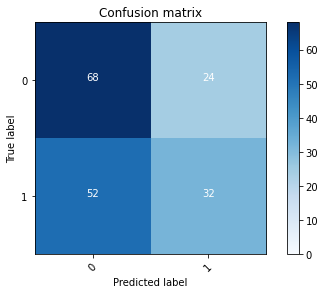

2022-08-20 22:52:23 - [Epoch Train: 28] loss: 0.3239, auc: 0.9274, acc: 0.8580, time: 50.00 s            
2022-08-20 22:52:23 - [Epoch Valid: 28] loss: 0.8849, auc: 0.5565, acc: 0.5830, time: 13.00 s


 28%|███████████▏                            | 28/100 [29:47<1:16:27, 63.71s/it]

2022-08-20 22:52:23 - EPOCH: 29
2022-08-20 22:52:23 - Train Step 10/979, train_loss: 0.4206
2022-08-20 22:52:24 - Train Step 20/979, train_loss: 0.4510
2022-08-20 22:52:24 - Train Step 30/979, train_loss: 0.3796
2022-08-20 22:52:25 - Train Step 40/979, train_loss: 0.3322
2022-08-20 22:52:25 - Train Step 50/979, train_loss: 0.3298
2022-08-20 22:52:26 - Train Step 60/979, train_loss: 0.3179
2022-08-20 22:52:27 - Train Step 70/979, train_loss: 0.3568
2022-08-20 22:52:27 - Train Step 80/979, train_loss: 0.3359
2022-08-20 22:52:28 - Train Step 90/979, train_loss: 0.3325
2022-08-20 22:52:28 - Train Step 100/979, train_loss: 0.3272
2022-08-20 22:52:29 - Train Step 110/979, train_loss: 0.3435
2022-08-20 22:52:29 - Train Step 120/979, train_loss: 0.3473
2022-08-20 22:52:30 - Train Step 130/979, train_loss: 0.3425
2022-08-20 22:52:30 - Train Step 140/979, train_loss: 0.3382
2022-08-20 22:52:31 - Train Step 150/979, train_loss: 0.3290
2022-08-20 22:52:31 - Train Step 160/979, train_loss: 0.3364
2

2022-08-20 22:53:24 - Valid Step 185/247, valid_loss: 0.8643
2022-08-20 22:53:24 - Valid Step 190/247, valid_loss: 0.8870
2022-08-20 22:53:24 - Valid Step 195/247, valid_loss: 0.8908
2022-08-20 22:53:24 - Valid Step 200/247, valid_loss: 0.8917
2022-08-20 22:53:25 - Valid Step 205/247, valid_loss: 0.8953
2022-08-20 22:53:25 - Valid Step 210/247, valid_loss: 0.8986
2022-08-20 22:53:25 - Valid Step 215/247, valid_loss: 0.9028
2022-08-20 22:53:25 - Valid Step 220/247, valid_loss: 0.9145
2022-08-20 22:53:26 - Valid Step 225/247, valid_loss: 0.9265
2022-08-20 22:53:26 - Valid Step 230/247, valid_loss: 0.9289
2022-08-20 22:53:26 - Valid Step 235/247, valid_loss: 0.9155
2022-08-20 22:53:26 - Valid Step 240/247, valid_loss: 0.9131
2022-08-20 22:53:27 - Valid Step 245/247, valid_loss: 0.9084
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
127     00009                0           1
121     00014                1         

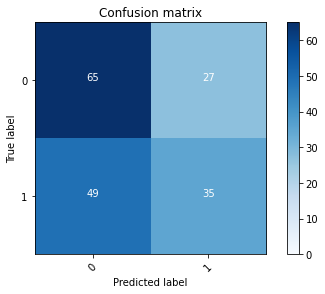

2022-08-20 22:53:27 - [Epoch Train: 29] loss: 0.3048, auc: 0.9312, acc: 0.8744, time: 50.00 s            
2022-08-20 22:53:27 - [Epoch Valid: 29] loss: 0.9037, auc: 0.5578, acc: 0.5870, time: 13.00 s


 29%|███████████▌                            | 29/100 [30:52<1:15:34, 63.87s/it]

2022-08-20 22:53:27 - EPOCH: 30
2022-08-20 22:53:28 - Train Step 10/979, train_loss: 0.2618
2022-08-20 22:53:28 - Train Step 20/979, train_loss: 0.3643
2022-08-20 22:53:29 - Train Step 30/979, train_loss: 0.3515
2022-08-20 22:53:29 - Train Step 40/979, train_loss: 0.3292
2022-08-20 22:53:30 - Train Step 50/979, train_loss: 0.3003
2022-08-20 22:53:30 - Train Step 60/979, train_loss: 0.2808
2022-08-20 22:53:31 - Train Step 70/979, train_loss: 0.3099
2022-08-20 22:53:31 - Train Step 80/979, train_loss: 0.2907
2022-08-20 22:53:32 - Train Step 90/979, train_loss: 0.2877
2022-08-20 22:53:32 - Train Step 100/979, train_loss: 0.3073
2022-08-20 22:53:33 - Train Step 110/979, train_loss: 0.3126
2022-08-20 22:53:33 - Train Step 120/979, train_loss: 0.3010
2022-08-20 22:53:34 - Train Step 130/979, train_loss: 0.3009
2022-08-20 22:53:34 - Train Step 140/979, train_loss: 0.2941
2022-08-20 22:53:35 - Train Step 150/979, train_loss: 0.2890
2022-08-20 22:53:35 - Train Step 160/979, train_loss: 0.2897
2

2022-08-20 22:54:28 - Valid Step 185/247, valid_loss: 0.9295
2022-08-20 22:54:28 - Valid Step 190/247, valid_loss: 0.9160
2022-08-20 22:54:28 - Valid Step 195/247, valid_loss: 0.9113
2022-08-20 22:54:29 - Valid Step 200/247, valid_loss: 0.9032
2022-08-20 22:54:29 - Valid Step 205/247, valid_loss: 0.9036
2022-08-20 22:54:29 - Valid Step 210/247, valid_loss: 0.8958
2022-08-20 22:54:29 - Valid Step 215/247, valid_loss: 0.8938
2022-08-20 22:54:30 - Valid Step 220/247, valid_loss: 0.8925
2022-08-20 22:54:30 - Valid Step 225/247, valid_loss: 0.8902
2022-08-20 22:54:30 - Valid Step 230/247, valid_loss: 0.9227
2022-08-20 22:54:31 - Valid Step 235/247, valid_loss: 0.9457
2022-08-20 22:54:31 - Valid Step 240/247, valid_loss: 0.9413
2022-08-20 22:54:31 - Valid Step 245/247, valid_loss: 0.9347
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
169     00009                0           1
91      00014                1         

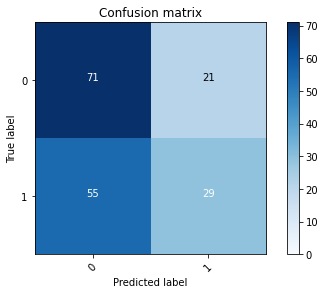

2022-08-20 22:54:31 - [Epoch Train: 30] loss: 0.2929, auc: 0.9392, acc: 0.8907, time: 50.00 s            
2022-08-20 22:54:31 - [Epoch Valid: 30] loss: 0.9319, auc: 0.5659, acc: 0.5951, time: 13.00 s
2022-08-20 22:54:31 - acc improved from 0.5951 to 0.5951. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e30-loss0.932-acc0.595-auc0.566.pth'


 30%|████████████                            | 30/100 [31:56<1:14:43, 64.06s/it]

2022-08-20 22:54:31 - EPOCH: 31
2022-08-20 22:54:32 - Train Step 10/979, train_loss: 0.2188
2022-08-20 22:54:33 - Train Step 20/979, train_loss: 0.3178
2022-08-20 22:54:33 - Train Step 30/979, train_loss: 0.3117
2022-08-20 22:54:34 - Train Step 40/979, train_loss: 0.3089
2022-08-20 22:54:34 - Train Step 50/979, train_loss: 0.2922
2022-08-20 22:54:35 - Train Step 60/979, train_loss: 0.2679
2022-08-20 22:54:35 - Train Step 70/979, train_loss: 0.2731
2022-08-20 22:54:36 - Train Step 80/979, train_loss: 0.2844
2022-08-20 22:54:36 - Train Step 90/979, train_loss: 0.2751
2022-08-20 22:54:37 - Train Step 100/979, train_loss: 0.2961
2022-08-20 22:54:37 - Train Step 110/979, train_loss: 0.2870
2022-08-20 22:54:38 - Train Step 120/979, train_loss: 0.2735
2022-08-20 22:54:39 - Train Step 130/979, train_loss: 0.2661
2022-08-20 22:54:39 - Train Step 140/979, train_loss: 0.2749
2022-08-20 22:54:40 - Train Step 150/979, train_loss: 0.2764
2022-08-20 22:54:40 - Train Step 160/979, train_loss: 0.2686
2

2022-08-20 22:55:33 - Valid Step 185/247, valid_loss: 1.0878
2022-08-20 22:55:33 - Valid Step 190/247, valid_loss: 1.0891
2022-08-20 22:55:33 - Valid Step 195/247, valid_loss: 1.0767
2022-08-20 22:55:33 - Valid Step 200/247, valid_loss: 1.1193
2022-08-20 22:55:34 - Valid Step 205/247, valid_loss: 1.1040
2022-08-20 22:55:34 - Valid Step 210/247, valid_loss: 1.1198
2022-08-20 22:55:34 - Valid Step 215/247, valid_loss: 1.1060
2022-08-20 22:55:34 - Valid Step 220/247, valid_loss: 1.0893
2022-08-20 22:55:35 - Valid Step 225/247, valid_loss: 1.0797
2022-08-20 22:55:35 - Valid Step 230/247, valid_loss: 1.0783
2022-08-20 22:55:35 - Valid Step 235/247, valid_loss: 1.0845
2022-08-20 22:55:35 - Valid Step 240/247, valid_loss: 1.0879
2022-08-20 22:55:36 - Valid Step 245/247, valid_loss: 1.0805
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
86      00009                0           1
45      00014                1         

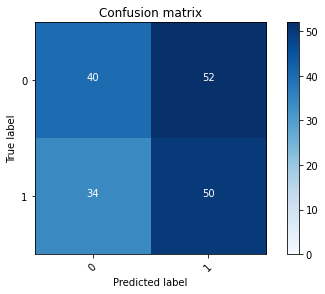

2022-08-20 22:55:36 - [Epoch Train: 31] loss: 0.2855, auc: 0.9386, acc: 0.8846, time: 51.00 s            
2022-08-20 22:55:36 - [Epoch Valid: 31] loss: 1.0777, auc: 0.5485, acc: 0.5142, time: 12.00 s


 31%|████████████▍                           | 31/100 [33:00<1:13:47, 64.17s/it]

2022-08-20 22:55:36 - EPOCH: 32
2022-08-20 22:55:37 - Train Step 10/979, train_loss: 0.4715
2022-08-20 22:55:37 - Train Step 20/979, train_loss: 0.3889
2022-08-20 22:55:38 - Train Step 30/979, train_loss: 0.3314
2022-08-20 22:55:38 - Train Step 40/979, train_loss: 0.2742
2022-08-20 22:55:39 - Train Step 50/979, train_loss: 0.2936
2022-08-20 22:55:39 - Train Step 60/979, train_loss: 0.2843
2022-08-20 22:55:40 - Train Step 70/979, train_loss: 0.2771
2022-08-20 22:55:40 - Train Step 80/979, train_loss: 0.2613
2022-08-20 22:55:41 - Train Step 90/979, train_loss: 0.2629
2022-08-20 22:55:41 - Train Step 100/979, train_loss: 0.2537
2022-08-20 22:55:42 - Train Step 110/979, train_loss: 0.2525
2022-08-20 22:55:42 - Train Step 120/979, train_loss: 0.2514
2022-08-20 22:55:43 - Train Step 130/979, train_loss: 0.2494
2022-08-20 22:55:43 - Train Step 140/979, train_loss: 0.2468
2022-08-20 22:55:44 - Train Step 150/979, train_loss: 0.2394
2022-08-20 22:55:44 - Train Step 160/979, train_loss: 0.2295
2

2022-08-20 22:56:37 - Valid Step 185/247, valid_loss: 0.8195
2022-08-20 22:56:37 - Valid Step 190/247, valid_loss: 0.8271
2022-08-20 22:56:38 - Valid Step 195/247, valid_loss: 0.8648
2022-08-20 22:56:38 - Valid Step 200/247, valid_loss: 0.8463
2022-08-20 22:56:38 - Valid Step 205/247, valid_loss: 0.8705
2022-08-20 22:56:38 - Valid Step 210/247, valid_loss: 0.8800
2022-08-20 22:56:39 - Valid Step 215/247, valid_loss: 0.8827
2022-08-20 22:56:39 - Valid Step 220/247, valid_loss: 0.8860
2022-08-20 22:56:39 - Valid Step 225/247, valid_loss: 0.8771
2022-08-20 22:56:39 - Valid Step 230/247, valid_loss: 0.8820
2022-08-20 22:56:40 - Valid Step 235/247, valid_loss: 0.8816
2022-08-20 22:56:40 - Valid Step 240/247, valid_loss: 0.9174
2022-08-20 22:56:40 - Valid Step 245/247, valid_loss: 0.9209
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
109     00009                0           1
147     00014                1         

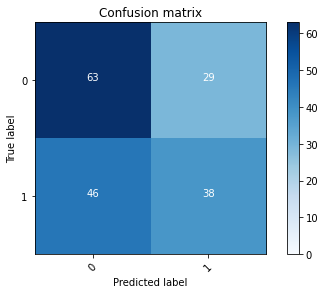

2022-08-20 22:56:40 - [Epoch Train: 32] loss: 0.2602, auc: 0.9535, acc: 0.8999, time: 51.00 s            
2022-08-20 22:56:40 - [Epoch Valid: 32] loss: 0.9275, auc: 0.5621, acc: 0.5951, time: 13.00 s
2022-08-20 22:56:40 - acc improved from 0.5951 to 0.5951. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e32-loss0.928-acc0.595-auc0.562.pth'


 32%|████████████▊                           | 32/100 [34:05<1:12:51, 64.29s/it]

2022-08-20 22:56:40 - EPOCH: 33
2022-08-20 22:56:41 - Train Step 10/979, train_loss: 0.3413
2022-08-20 22:56:42 - Train Step 20/979, train_loss: 0.2513
2022-08-20 22:56:42 - Train Step 30/979, train_loss: 0.2766
2022-08-20 22:56:43 - Train Step 40/979, train_loss: 0.2619
2022-08-20 22:56:43 - Train Step 50/979, train_loss: 0.2861
2022-08-20 22:56:44 - Train Step 60/979, train_loss: 0.2850
2022-08-20 22:56:44 - Train Step 70/979, train_loss: 0.2716
2022-08-20 22:56:45 - Train Step 80/979, train_loss: 0.2566
2022-08-20 22:56:45 - Train Step 90/979, train_loss: 0.2543
2022-08-20 22:56:46 - Train Step 100/979, train_loss: 0.2374
2022-08-20 22:56:46 - Train Step 110/979, train_loss: 0.2307
2022-08-20 22:56:47 - Train Step 120/979, train_loss: 0.2400
2022-08-20 22:56:47 - Train Step 130/979, train_loss: 0.2324
2022-08-20 22:56:48 - Train Step 140/979, train_loss: 0.2204
2022-08-20 22:56:48 - Train Step 150/979, train_loss: 0.2147
2022-08-20 22:56:49 - Train Step 160/979, train_loss: 0.2058
2

2022-08-20 22:57:42 - Valid Step 185/247, valid_loss: 0.8899
2022-08-20 22:57:42 - Valid Step 190/247, valid_loss: 0.8960
2022-08-20 22:57:42 - Valid Step 195/247, valid_loss: 0.8962
2022-08-20 22:57:42 - Valid Step 200/247, valid_loss: 0.9191
2022-08-20 22:57:43 - Valid Step 205/247, valid_loss: 0.9334
2022-08-20 22:57:43 - Valid Step 210/247, valid_loss: 0.9262
2022-08-20 22:57:43 - Valid Step 215/247, valid_loss: 0.9297
2022-08-20 22:57:43 - Valid Step 220/247, valid_loss: 0.9438
2022-08-20 22:57:44 - Valid Step 225/247, valid_loss: 0.9385
2022-08-20 22:57:44 - Valid Step 230/247, valid_loss: 0.9223
2022-08-20 22:57:44 - Valid Step 235/247, valid_loss: 0.9285
2022-08-20 22:57:44 - Valid Step 240/247, valid_loss: 0.9392
2022-08-20 22:57:45 - Valid Step 245/247, valid_loss: 0.9678
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
143     00009                0           1
39      00014                1         

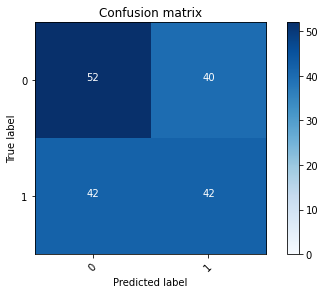

2022-08-20 22:57:45 - [Epoch Train: 33] loss: 0.2466, auc: 0.9589, acc: 0.9019, time: 51.00 s            
2022-08-20 22:57:45 - [Epoch Valid: 33] loss: 0.9747, auc: 0.5594, acc: 0.5587, time: 13.00 s


 33%|█████████████▏                          | 33/100 [35:10<1:11:51, 64.35s/it]

2022-08-20 22:57:45 - EPOCH: 34
2022-08-20 22:57:46 - Train Step 10/979, train_loss: 0.3692
2022-08-20 22:57:46 - Train Step 20/979, train_loss: 0.4290
2022-08-20 22:57:47 - Train Step 30/979, train_loss: 0.4207
2022-08-20 22:57:47 - Train Step 40/979, train_loss: 0.3837
2022-08-20 22:57:48 - Train Step 50/979, train_loss: 0.3722
2022-08-20 22:57:48 - Train Step 60/979, train_loss: 0.3297
2022-08-20 22:57:49 - Train Step 70/979, train_loss: 0.3212
2022-08-20 22:57:49 - Train Step 80/979, train_loss: 0.3208
2022-08-20 22:57:50 - Train Step 90/979, train_loss: 0.3022
2022-08-20 22:57:50 - Train Step 100/979, train_loss: 0.2880
2022-08-20 22:57:51 - Train Step 110/979, train_loss: 0.2970
2022-08-20 22:57:51 - Train Step 120/979, train_loss: 0.2952
2022-08-20 22:57:52 - Train Step 130/979, train_loss: 0.2814
2022-08-20 22:57:52 - Train Step 140/979, train_loss: 0.2748
2022-08-20 22:57:53 - Train Step 150/979, train_loss: 0.2770
2022-08-20 22:57:53 - Train Step 160/979, train_loss: 0.2746
2

2022-08-20 22:58:46 - Valid Step 185/247, valid_loss: 1.0050
2022-08-20 22:58:46 - Valid Step 190/247, valid_loss: 1.0125
2022-08-20 22:58:46 - Valid Step 195/247, valid_loss: 0.9931
2022-08-20 22:58:46 - Valid Step 200/247, valid_loss: 1.0020
2022-08-20 22:58:47 - Valid Step 205/247, valid_loss: 1.0028
2022-08-20 22:58:47 - Valid Step 210/247, valid_loss: 0.9968
2022-08-20 22:58:47 - Valid Step 215/247, valid_loss: 1.0076
2022-08-20 22:58:47 - Valid Step 220/247, valid_loss: 0.9948
2022-08-20 22:58:48 - Valid Step 225/247, valid_loss: 1.0014
2022-08-20 22:58:48 - Valid Step 230/247, valid_loss: 1.0089
2022-08-20 22:58:48 - Valid Step 235/247, valid_loss: 0.9934
2022-08-20 22:58:48 - Valid Step 240/247, valid_loss: 0.9978
2022-08-20 22:58:49 - Valid Step 245/247, valid_loss: 1.0097
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
140     00009                0           1
151     00014                1         

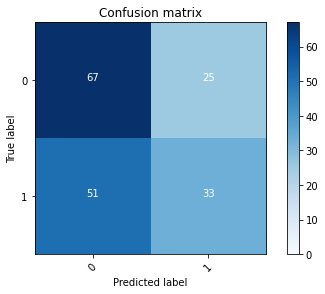

2022-08-20 22:58:49 - [Epoch Train: 34] loss: 0.2441, auc: 0.9584, acc: 0.9050, time: 50.00 s            
2022-08-20 22:58:49 - [Epoch Valid: 34] loss: 1.0085, auc: 0.5562, acc: 0.5992, time: 12.00 s
2022-08-20 22:58:49 - acc improved from 0.5951 to 0.5992. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e34-loss1.009-acc0.599-auc0.556.pth'


 34%|█████████████▌                          | 34/100 [36:13<1:10:38, 64.21s/it]

2022-08-20 22:58:49 - EPOCH: 35
2022-08-20 22:58:50 - Train Step 10/979, train_loss: 0.3061
2022-08-20 22:58:50 - Train Step 20/979, train_loss: 0.2902
2022-08-20 22:58:51 - Train Step 30/979, train_loss: 0.2965
2022-08-20 22:58:51 - Train Step 40/979, train_loss: 0.2521
2022-08-20 22:58:52 - Train Step 50/979, train_loss: 0.2719
2022-08-20 22:58:52 - Train Step 60/979, train_loss: 0.2820
2022-08-20 22:58:53 - Train Step 70/979, train_loss: 0.2707
2022-08-20 22:58:53 - Train Step 80/979, train_loss: 0.2669
2022-08-20 22:58:54 - Train Step 90/979, train_loss: 0.2589
2022-08-20 22:58:54 - Train Step 100/979, train_loss: 0.2531
2022-08-20 22:58:55 - Train Step 110/979, train_loss: 0.2543
2022-08-20 22:58:55 - Train Step 120/979, train_loss: 0.2406
2022-08-20 22:58:56 - Train Step 130/979, train_loss: 0.2563
2022-08-20 22:58:56 - Train Step 140/979, train_loss: 0.2449
2022-08-20 22:58:57 - Train Step 150/979, train_loss: 0.2649
2022-08-20 22:58:57 - Train Step 160/979, train_loss: 0.2683
2

2022-08-20 22:59:49 - Valid Step 185/247, valid_loss: 1.0164
2022-08-20 22:59:50 - Valid Step 190/247, valid_loss: 1.0084
2022-08-20 22:59:50 - Valid Step 195/247, valid_loss: 1.0238
2022-08-20 22:59:50 - Valid Step 200/247, valid_loss: 1.0327
2022-08-20 22:59:50 - Valid Step 205/247, valid_loss: 1.0380
2022-08-20 22:59:51 - Valid Step 210/247, valid_loss: 1.0294
2022-08-20 22:59:51 - Valid Step 215/247, valid_loss: 1.0358
2022-08-20 22:59:51 - Valid Step 220/247, valid_loss: 1.0311
2022-08-20 22:59:52 - Valid Step 225/247, valid_loss: 1.0355
2022-08-20 22:59:52 - Valid Step 230/247, valid_loss: 1.0299
2022-08-20 22:59:52 - Valid Step 235/247, valid_loss: 1.0283
2022-08-20 22:59:52 - Valid Step 240/247, valid_loss: 1.0156
2022-08-20 22:59:53 - Valid Step 245/247, valid_loss: 1.0219
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
14      00009                0           1
2       00014                1         

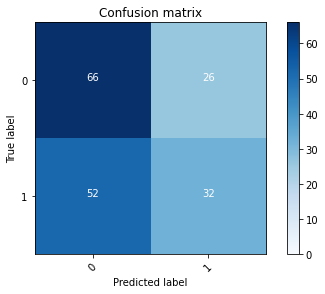

2022-08-20 22:59:53 - [Epoch Train: 35] loss: 0.2412, auc: 0.9564, acc: 0.9019, time: 50.00 s            
2022-08-20 22:59:53 - [Epoch Valid: 35] loss: 1.0175, auc: 0.5613, acc: 0.5911, time: 13.00 s


 35%|██████████████                          | 35/100 [37:17<1:09:28, 64.14s/it]

2022-08-20 22:59:53 - EPOCH: 36
2022-08-20 22:59:54 - Train Step 10/979, train_loss: 0.2136
2022-08-20 22:59:54 - Train Step 20/979, train_loss: 0.1645
2022-08-20 22:59:55 - Train Step 30/979, train_loss: 0.1622
2022-08-20 22:59:55 - Train Step 40/979, train_loss: 0.1831
2022-08-20 22:59:56 - Train Step 50/979, train_loss: 0.1660
2022-08-20 22:59:56 - Train Step 60/979, train_loss: 0.1991
2022-08-20 22:59:57 - Train Step 70/979, train_loss: 0.2002
2022-08-20 22:59:57 - Train Step 80/979, train_loss: 0.2066
2022-08-20 22:59:58 - Train Step 90/979, train_loss: 0.2074
2022-08-20 22:59:58 - Train Step 100/979, train_loss: 0.1958
2022-08-20 22:59:59 - Train Step 110/979, train_loss: 0.1818
2022-08-20 22:59:59 - Train Step 120/979, train_loss: 0.1741
2022-08-20 23:00:00 - Train Step 130/979, train_loss: 0.1699
2022-08-20 23:00:00 - Train Step 140/979, train_loss: 0.1743
2022-08-20 23:00:01 - Train Step 150/979, train_loss: 0.1898
2022-08-20 23:00:01 - Train Step 160/979, train_loss: 0.1984
2

2022-08-20 23:00:54 - Valid Step 185/247, valid_loss: 0.9998
2022-08-20 23:00:54 - Valid Step 190/247, valid_loss: 0.9866
2022-08-20 23:00:55 - Valid Step 195/247, valid_loss: 1.0055
2022-08-20 23:00:55 - Valid Step 200/247, valid_loss: 0.9910
2022-08-20 23:00:55 - Valid Step 205/247, valid_loss: 0.9796
2022-08-20 23:00:55 - Valid Step 210/247, valid_loss: 0.9758
2022-08-20 23:00:56 - Valid Step 215/247, valid_loss: 1.0098
2022-08-20 23:00:56 - Valid Step 220/247, valid_loss: 1.0166
2022-08-20 23:00:56 - Valid Step 225/247, valid_loss: 0.9995
2022-08-20 23:00:56 - Valid Step 230/247, valid_loss: 0.9945
2022-08-20 23:00:57 - Valid Step 235/247, valid_loss: 0.9857
2022-08-20 23:00:57 - Valid Step 240/247, valid_loss: 0.9891
2022-08-20 23:00:57 - Valid Step 245/247, valid_loss: 0.9945
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
23      00009                0           1
101     00014                1         

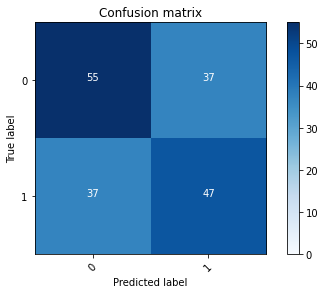

2022-08-20 23:00:58 - [Epoch Train: 36] loss: 0.2232, auc: 0.9643, acc: 0.8999, time: 51.00 s            
2022-08-20 23:00:58 - [Epoch Valid: 36] loss: 1.0095, auc: 0.5669, acc: 0.5992, time: 13.00 s
2022-08-20 23:00:58 - acc improved from 0.5992 to 0.5992. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e36-loss1.010-acc0.599-auc0.567.pth'


 36%|██████████████▍                         | 36/100 [38:22<1:08:35, 64.31s/it]

2022-08-20 23:00:58 - EPOCH: 37
2022-08-20 23:00:58 - Train Step 10/979, train_loss: 0.3034
2022-08-20 23:00:59 - Train Step 20/979, train_loss: 0.2607
2022-08-20 23:00:59 - Train Step 30/979, train_loss: 0.2258
2022-08-20 23:01:00 - Train Step 40/979, train_loss: 0.1941
2022-08-20 23:01:00 - Train Step 50/979, train_loss: 0.2337
2022-08-20 23:01:01 - Train Step 60/979, train_loss: 0.2222
2022-08-20 23:01:01 - Train Step 70/979, train_loss: 0.2087
2022-08-20 23:01:02 - Train Step 80/979, train_loss: 0.2167
2022-08-20 23:01:02 - Train Step 90/979, train_loss: 0.2058
2022-08-20 23:01:03 - Train Step 100/979, train_loss: 0.2025
2022-08-20 23:01:03 - Train Step 110/979, train_loss: 0.2210
2022-08-20 23:01:04 - Train Step 120/979, train_loss: 0.2233
2022-08-20 23:01:04 - Train Step 130/979, train_loss: 0.2203
2022-08-20 23:01:05 - Train Step 140/979, train_loss: 0.2184
2022-08-20 23:01:05 - Train Step 150/979, train_loss: 0.2197
2022-08-20 23:01:06 - Train Step 160/979, train_loss: 0.2107
2

2022-08-20 23:01:58 - Valid Step 185/247, valid_loss: 1.1420
2022-08-20 23:01:58 - Valid Step 190/247, valid_loss: 1.1495
2022-08-20 23:01:58 - Valid Step 195/247, valid_loss: 1.1425
2022-08-20 23:01:59 - Valid Step 200/247, valid_loss: 1.1306
2022-08-20 23:01:59 - Valid Step 205/247, valid_loss: 1.1209
2022-08-20 23:01:59 - Valid Step 210/247, valid_loss: 1.1006
2022-08-20 23:01:59 - Valid Step 215/247, valid_loss: 1.1130
2022-08-20 23:02:00 - Valid Step 220/247, valid_loss: 1.1234
2022-08-20 23:02:00 - Valid Step 225/247, valid_loss: 1.1100
2022-08-20 23:02:00 - Valid Step 230/247, valid_loss: 1.1034
2022-08-20 23:02:01 - Valid Step 235/247, valid_loss: 1.0875
2022-08-20 23:02:01 - Valid Step 240/247, valid_loss: 1.1011
2022-08-20 23:02:01 - Valid Step 245/247, valid_loss: 1.0917
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
121     00009                0           1
64      00014                1         

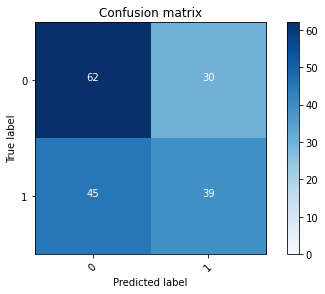

2022-08-20 23:02:01 - [Epoch Train: 37] loss: 0.2159, auc: 0.9632, acc: 0.9265, time: 50.00 s            
2022-08-20 23:02:01 - [Epoch Valid: 37] loss: 1.0838, auc: 0.5651, acc: 0.5992, time: 13.00 s
2022-08-20 23:02:01 - acc improved from 0.5992 to 0.5992. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e37-loss1.084-acc0.599-auc0.565.pth'


 37%|██████████████▊                         | 37/100 [39:26<1:07:21, 64.15s/it]

2022-08-20 23:02:01 - EPOCH: 38
2022-08-20 23:02:02 - Train Step 10/979, train_loss: 0.0651
2022-08-20 23:02:03 - Train Step 20/979, train_loss: 0.1191
2022-08-20 23:02:03 - Train Step 30/979, train_loss: 0.1116
2022-08-20 23:02:04 - Train Step 40/979, train_loss: 0.1169
2022-08-20 23:02:04 - Train Step 50/979, train_loss: 0.1555
2022-08-20 23:02:05 - Train Step 60/979, train_loss: 0.1503
2022-08-20 23:02:05 - Train Step 70/979, train_loss: 0.1579
2022-08-20 23:02:05 - Train Step 80/979, train_loss: 0.1545
2022-08-20 23:02:06 - Train Step 90/979, train_loss: 0.1503
2022-08-20 23:02:07 - Train Step 100/979, train_loss: 0.1472
2022-08-20 23:02:07 - Train Step 110/979, train_loss: 0.1490
2022-08-20 23:02:08 - Train Step 120/979, train_loss: 0.1444
2022-08-20 23:02:08 - Train Step 130/979, train_loss: 0.1666
2022-08-20 23:02:09 - Train Step 140/979, train_loss: 0.1904
2022-08-20 23:02:09 - Train Step 150/979, train_loss: 0.1894
2022-08-20 23:02:10 - Train Step 160/979, train_loss: 0.1929
2

2022-08-20 23:03:02 - Valid Step 185/247, valid_loss: 1.1258
2022-08-20 23:03:02 - Valid Step 190/247, valid_loss: 1.1278
2022-08-20 23:03:02 - Valid Step 195/247, valid_loss: 1.1160
2022-08-20 23:03:03 - Valid Step 200/247, valid_loss: 1.0965
2022-08-20 23:03:03 - Valid Step 205/247, valid_loss: 1.1084
2022-08-20 23:03:03 - Valid Step 210/247, valid_loss: 1.0885
2022-08-20 23:03:03 - Valid Step 215/247, valid_loss: 1.0792
2022-08-20 23:03:04 - Valid Step 220/247, valid_loss: 1.0770
2022-08-20 23:03:04 - Valid Step 225/247, valid_loss: 1.0786
2022-08-20 23:03:04 - Valid Step 230/247, valid_loss: 1.0868
2022-08-20 23:03:05 - Valid Step 235/247, valid_loss: 1.0788
2022-08-20 23:03:05 - Valid Step 240/247, valid_loss: 1.1029
2022-08-20 23:03:05 - Valid Step 245/247, valid_loss: 1.0853
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
122     00009                0           1
10      00014                1         

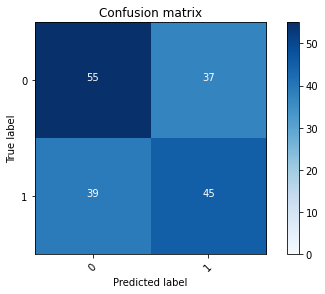

2022-08-20 23:03:05 - [Epoch Train: 38] loss: 0.2050, auc: 0.9691, acc: 0.9316, time: 50.00 s            
2022-08-20 23:03:05 - [Epoch Valid: 38] loss: 1.0827, auc: 0.5620, acc: 0.5789, time: 13.00 s


 38%|███████████████▏                        | 38/100 [40:30<1:06:14, 64.11s/it]

2022-08-20 23:03:05 - EPOCH: 39
2022-08-20 23:03:06 - Train Step 10/979, train_loss: 0.0887
2022-08-20 23:03:07 - Train Step 20/979, train_loss: 0.1203
2022-08-20 23:03:07 - Train Step 30/979, train_loss: 0.1679
2022-08-20 23:03:08 - Train Step 40/979, train_loss: 0.1770
2022-08-20 23:03:08 - Train Step 50/979, train_loss: 0.1799
2022-08-20 23:03:09 - Train Step 60/979, train_loss: 0.1861
2022-08-20 23:03:09 - Train Step 70/979, train_loss: 0.2272
2022-08-20 23:03:10 - Train Step 80/979, train_loss: 0.2147
2022-08-20 23:03:10 - Train Step 90/979, train_loss: 0.2090
2022-08-20 23:03:11 - Train Step 100/979, train_loss: 0.2058
2022-08-20 23:03:11 - Train Step 110/979, train_loss: 0.2105
2022-08-20 23:03:12 - Train Step 120/979, train_loss: 0.2111
2022-08-20 23:03:12 - Train Step 130/979, train_loss: 0.2184
2022-08-20 23:03:13 - Train Step 140/979, train_loss: 0.2136
2022-08-20 23:03:13 - Train Step 150/979, train_loss: 0.2087
2022-08-20 23:03:14 - Train Step 160/979, train_loss: 0.2006
2

2022-08-20 23:04:06 - Valid Step 185/247, valid_loss: 1.1465
2022-08-20 23:04:06 - Valid Step 190/247, valid_loss: 1.1391
2022-08-20 23:04:06 - Valid Step 195/247, valid_loss: 1.1299
2022-08-20 23:04:07 - Valid Step 200/247, valid_loss: 1.1325
2022-08-20 23:04:07 - Valid Step 205/247, valid_loss: 1.1505
2022-08-20 23:04:07 - Valid Step 210/247, valid_loss: 1.1549
2022-08-20 23:04:07 - Valid Step 215/247, valid_loss: 1.1641
2022-08-20 23:04:08 - Valid Step 220/247, valid_loss: 1.1623
2022-08-20 23:04:08 - Valid Step 225/247, valid_loss: 1.2143
2022-08-20 23:04:08 - Valid Step 230/247, valid_loss: 1.2225
2022-08-20 23:04:08 - Valid Step 235/247, valid_loss: 1.2116
2022-08-20 23:04:09 - Valid Step 240/247, valid_loss: 1.2024
2022-08-20 23:04:09 - Valid Step 245/247, valid_loss: 1.2073
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
100     00009                0           1
98      00014                1         

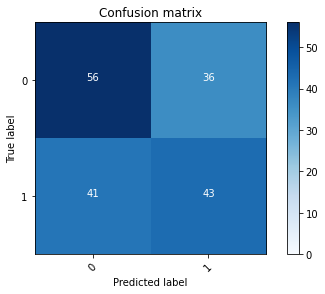

2022-08-20 23:04:09 - [Epoch Train: 39] loss: 0.1890, auc: 0.9740, acc: 0.9346, time: 50.00 s            
2022-08-20 23:04:09 - [Epoch Valid: 39] loss: 1.1987, auc: 0.5621, acc: 0.5830, time: 13.00 s


 39%|███████████████▌                        | 39/100 [41:34<1:05:07, 64.06s/it]

2022-08-20 23:04:09 - EPOCH: 40
2022-08-20 23:04:10 - Train Step 10/979, train_loss: 0.1797
2022-08-20 23:04:10 - Train Step 20/979, train_loss: 0.2430
2022-08-20 23:04:11 - Train Step 30/979, train_loss: 0.1969
2022-08-20 23:04:12 - Train Step 40/979, train_loss: 0.1944
2022-08-20 23:04:12 - Train Step 50/979, train_loss: 0.1907
2022-08-20 23:04:12 - Train Step 60/979, train_loss: 0.1712
2022-08-20 23:04:13 - Train Step 70/979, train_loss: 0.2148
2022-08-20 23:04:14 - Train Step 80/979, train_loss: 0.2131
2022-08-20 23:04:14 - Train Step 90/979, train_loss: 0.2146
2022-08-20 23:04:15 - Train Step 100/979, train_loss: 0.2171
2022-08-20 23:04:15 - Train Step 110/979, train_loss: 0.2123
2022-08-20 23:04:16 - Train Step 120/979, train_loss: 0.2064
2022-08-20 23:04:16 - Train Step 130/979, train_loss: 0.2134
2022-08-20 23:04:17 - Train Step 140/979, train_loss: 0.2029
2022-08-20 23:04:17 - Train Step 150/979, train_loss: 0.1940
2022-08-20 23:04:18 - Train Step 160/979, train_loss: 0.1946
2

2022-08-20 23:05:10 - Valid Step 185/247, valid_loss: 1.0517
2022-08-20 23:05:10 - Valid Step 190/247, valid_loss: 1.0576
2022-08-20 23:05:10 - Valid Step 195/247, valid_loss: 1.0386
2022-08-20 23:05:10 - Valid Step 200/247, valid_loss: 1.0404
2022-08-20 23:05:11 - Valid Step 205/247, valid_loss: 1.0343
2022-08-20 23:05:11 - Valid Step 210/247, valid_loss: 1.0472
2022-08-20 23:05:11 - Valid Step 215/247, valid_loss: 1.0679
2022-08-20 23:05:11 - Valid Step 220/247, valid_loss: 1.0706
2022-08-20 23:05:12 - Valid Step 225/247, valid_loss: 1.0597
2022-08-20 23:05:12 - Valid Step 230/247, valid_loss: 1.0747
2022-08-20 23:05:12 - Valid Step 235/247, valid_loss: 1.0723
2022-08-20 23:05:13 - Valid Step 240/247, valid_loss: 1.0709
2022-08-20 23:05:13 - Valid Step 245/247, valid_loss: 1.0837
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
95      00009                0           1
138     00014                1         

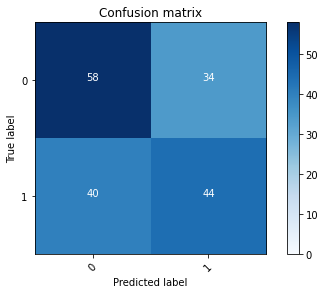

2022-08-20 23:05:13 - [Epoch Train: 40] loss: 0.1891, auc: 0.9716, acc: 0.9275, time: 50.00 s            
2022-08-20 23:05:13 - [Epoch Valid: 40] loss: 1.0907, auc: 0.5707, acc: 0.5992, time: 13.00 s
2022-08-20 23:05:13 - acc improved from 0.5992 to 0.5992. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e40-loss1.091-acc0.599-auc0.571.pth'


 40%|████████████████                        | 40/100 [42:38<1:03:58, 63.97s/it]

2022-08-20 23:05:13 - EPOCH: 41
2022-08-20 23:05:14 - Train Step 10/979, train_loss: 0.3264
2022-08-20 23:05:14 - Train Step 20/979, train_loss: 0.2267
2022-08-20 23:05:15 - Train Step 30/979, train_loss: 0.1998
2022-08-20 23:05:15 - Train Step 40/979, train_loss: 0.1896
2022-08-20 23:05:16 - Train Step 50/979, train_loss: 0.1855
2022-08-20 23:05:16 - Train Step 60/979, train_loss: 0.1940
2022-08-20 23:05:17 - Train Step 70/979, train_loss: 0.1822
2022-08-20 23:05:17 - Train Step 80/979, train_loss: 0.1715
2022-08-20 23:05:18 - Train Step 90/979, train_loss: 0.1605
2022-08-20 23:05:18 - Train Step 100/979, train_loss: 0.1643
2022-08-20 23:05:19 - Train Step 110/979, train_loss: 0.1586
2022-08-20 23:05:19 - Train Step 120/979, train_loss: 0.1588
2022-08-20 23:05:20 - Train Step 130/979, train_loss: 0.1520
2022-08-20 23:05:20 - Train Step 140/979, train_loss: 0.1564
2022-08-20 23:05:21 - Train Step 150/979, train_loss: 0.1580
2022-08-20 23:05:22 - Train Step 160/979, train_loss: 0.1688
2

2022-08-20 23:06:14 - Valid Step 185/247, valid_loss: 1.0159
2022-08-20 23:06:14 - Valid Step 190/247, valid_loss: 1.0249
2022-08-20 23:06:15 - Valid Step 195/247, valid_loss: 1.0221
2022-08-20 23:06:15 - Valid Step 200/247, valid_loss: 1.0159
2022-08-20 23:06:15 - Valid Step 205/247, valid_loss: 1.0051
2022-08-20 23:06:15 - Valid Step 210/247, valid_loss: 1.0261
2022-08-20 23:06:16 - Valid Step 215/247, valid_loss: 1.0174
2022-08-20 23:06:16 - Valid Step 220/247, valid_loss: 1.0337
2022-08-20 23:06:16 - Valid Step 225/247, valid_loss: 1.0574
2022-08-20 23:06:16 - Valid Step 230/247, valid_loss: 1.0539
2022-08-20 23:06:17 - Valid Step 235/247, valid_loss: 1.0779
2022-08-20 23:06:17 - Valid Step 240/247, valid_loss: 1.0736
2022-08-20 23:06:17 - Valid Step 245/247, valid_loss: 1.0689
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
148     00009                0           1
152     00014                1         

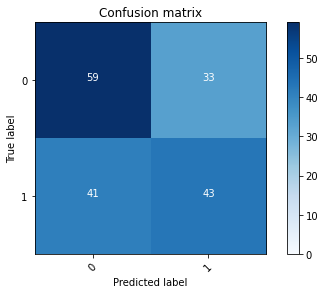

2022-08-20 23:06:18 - [Epoch Train: 41] loss: 0.1795, auc: 0.9762, acc: 0.9336, time: 51.00 s            
2022-08-20 23:06:18 - [Epoch Valid: 41] loss: 1.0612, auc: 0.5761, acc: 0.5992, time: 12.00 s
2022-08-20 23:06:18 - acc improved from 0.5992 to 0.5992. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e41-loss1.061-acc0.599-auc0.576.pth'


 41%|████████████████▍                       | 41/100 [43:42<1:03:03, 64.12s/it]

2022-08-20 23:06:18 - EPOCH: 42
2022-08-20 23:06:18 - Train Step 10/979, train_loss: 0.1371
2022-08-20 23:06:19 - Train Step 20/979, train_loss: 0.1267
2022-08-20 23:06:19 - Train Step 30/979, train_loss: 0.1929
2022-08-20 23:06:20 - Train Step 40/979, train_loss: 0.1974
2022-08-20 23:06:20 - Train Step 50/979, train_loss: 0.1751
2022-08-20 23:06:21 - Train Step 60/979, train_loss: 0.1562
2022-08-20 23:06:21 - Train Step 70/979, train_loss: 0.1800
2022-08-20 23:06:22 - Train Step 80/979, train_loss: 0.2149
2022-08-20 23:06:22 - Train Step 90/979, train_loss: 0.2146
2022-08-20 23:06:23 - Train Step 100/979, train_loss: 0.2049
2022-08-20 23:06:23 - Train Step 110/979, train_loss: 0.1954
2022-08-20 23:06:24 - Train Step 120/979, train_loss: 0.2030
2022-08-20 23:06:24 - Train Step 130/979, train_loss: 0.1937
2022-08-20 23:06:25 - Train Step 140/979, train_loss: 0.1887
2022-08-20 23:06:25 - Train Step 150/979, train_loss: 0.1975
2022-08-20 23:06:26 - Train Step 160/979, train_loss: 0.2047
2

2022-08-20 23:07:18 - Valid Step 185/247, valid_loss: 1.2409
2022-08-20 23:07:18 - Valid Step 190/247, valid_loss: 1.2218
2022-08-20 23:07:18 - Valid Step 195/247, valid_loss: 1.2090
2022-08-20 23:07:19 - Valid Step 200/247, valid_loss: 1.1952
2022-08-20 23:07:19 - Valid Step 205/247, valid_loss: 1.2083
2022-08-20 23:07:19 - Valid Step 210/247, valid_loss: 1.2042
2022-08-20 23:07:19 - Valid Step 215/247, valid_loss: 1.2087
2022-08-20 23:07:20 - Valid Step 220/247, valid_loss: 1.2220
2022-08-20 23:07:20 - Valid Step 225/247, valid_loss: 1.1982
2022-08-20 23:07:20 - Valid Step 230/247, valid_loss: 1.2080
2022-08-20 23:07:20 - Valid Step 235/247, valid_loss: 1.2034
2022-08-20 23:07:21 - Valid Step 240/247, valid_loss: 1.2097
2022-08-20 23:07:21 - Valid Step 245/247, valid_loss: 1.1910
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
109     00009                0           1
156     00014                1         

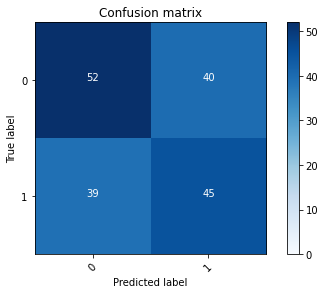

2022-08-20 23:07:21 - [Epoch Train: 42] loss: 0.1703, auc: 0.9783, acc: 0.9448, time: 50.00 s            
2022-08-20 23:07:21 - [Epoch Valid: 42] loss: 1.2130, auc: 0.5793, acc: 0.5749, time: 13.00 s


 42%|████████████████▊                       | 42/100 [44:46<1:01:50, 63.97s/it]

2022-08-20 23:07:21 - EPOCH: 43
2022-08-20 23:07:22 - Train Step 10/979, train_loss: 0.2440
2022-08-20 23:07:22 - Train Step 20/979, train_loss: 0.2984
2022-08-20 23:07:23 - Train Step 30/979, train_loss: 0.2711
2022-08-20 23:07:23 - Train Step 40/979, train_loss: 0.2274
2022-08-20 23:07:24 - Train Step 50/979, train_loss: 0.2084
2022-08-20 23:07:25 - Train Step 60/979, train_loss: 0.2291
2022-08-20 23:07:25 - Train Step 70/979, train_loss: 0.2105
2022-08-20 23:07:26 - Train Step 80/979, train_loss: 0.1970
2022-08-20 23:07:26 - Train Step 90/979, train_loss: 0.2007
2022-08-20 23:07:27 - Train Step 100/979, train_loss: 0.1940
2022-08-20 23:07:27 - Train Step 110/979, train_loss: 0.1878
2022-08-20 23:07:28 - Train Step 120/979, train_loss: 0.1790
2022-08-20 23:07:28 - Train Step 130/979, train_loss: 0.1721
2022-08-20 23:07:29 - Train Step 140/979, train_loss: 0.1815
2022-08-20 23:07:29 - Train Step 150/979, train_loss: 0.1791
2022-08-20 23:07:30 - Train Step 160/979, train_loss: 0.1803
2

2022-08-20 23:08:21 - Valid Step 185/247, valid_loss: 1.1970
2022-08-20 23:08:22 - Valid Step 190/247, valid_loss: 1.1972
2022-08-20 23:08:22 - Valid Step 195/247, valid_loss: 1.2055
2022-08-20 23:08:22 - Valid Step 200/247, valid_loss: 1.1855
2022-08-20 23:08:22 - Valid Step 205/247, valid_loss: 1.1937
2022-08-20 23:08:23 - Valid Step 210/247, valid_loss: 1.1900
2022-08-20 23:08:23 - Valid Step 215/247, valid_loss: 1.2156
2022-08-20 23:08:23 - Valid Step 220/247, valid_loss: 1.2079
2022-08-20 23:08:23 - Valid Step 225/247, valid_loss: 1.2136
2022-08-20 23:08:24 - Valid Step 230/247, valid_loss: 1.2077
2022-08-20 23:08:24 - Valid Step 235/247, valid_loss: 1.1922
2022-08-20 23:08:24 - Valid Step 240/247, valid_loss: 1.1695
2022-08-20 23:08:24 - Valid Step 245/247, valid_loss: 1.1516
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
166     00009                0           1
97      00014                1         

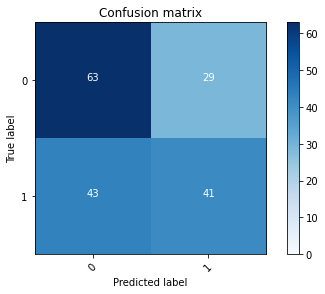

2022-08-20 23:08:25 - [Epoch Train: 43] loss: 0.1604, auc: 0.9824, acc: 0.9489, time: 50.00 s            
2022-08-20 23:08:25 - [Epoch Valid: 43] loss: 1.1535, auc: 0.5705, acc: 0.6032, time: 12.00 s
2022-08-20 23:08:25 - acc improved from 0.5992 to 0.6032. Saved model to '../RSNA-BTC-Datasets/out_models/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e43-loss1.153-acc0.603-auc0.571.pth'


 43%|█████████████████▏                      | 43/100 [45:49<1:00:39, 63.85s/it]

2022-08-20 23:08:25 - EPOCH: 44
2022-08-20 23:08:25 - Train Step 10/979, train_loss: 0.0401
2022-08-20 23:08:26 - Train Step 20/979, train_loss: 0.0797
2022-08-20 23:08:26 - Train Step 30/979, train_loss: 0.0781
2022-08-20 23:08:27 - Train Step 40/979, train_loss: 0.1751
2022-08-20 23:08:27 - Train Step 50/979, train_loss: 0.1891
2022-08-20 23:08:28 - Train Step 60/979, train_loss: 0.1992
2022-08-20 23:08:28 - Train Step 70/979, train_loss: 0.2118
2022-08-20 23:08:29 - Train Step 80/979, train_loss: 0.2356
2022-08-20 23:08:29 - Train Step 90/979, train_loss: 0.2210
2022-08-20 23:08:30 - Train Step 100/979, train_loss: 0.2161
2022-08-20 23:08:31 - Train Step 110/979, train_loss: 0.2137
2022-08-20 23:08:31 - Train Step 120/979, train_loss: 0.2012
2022-08-20 23:08:32 - Train Step 130/979, train_loss: 0.1913
2022-08-20 23:08:32 - Train Step 140/979, train_loss: 0.1847
2022-08-20 23:08:33 - Train Step 150/979, train_loss: 0.1795
2022-08-20 23:08:33 - Train Step 160/979, train_loss: 0.1729
2

2022-08-20 23:09:26 - Valid Step 185/247, valid_loss: 1.1927
2022-08-20 23:09:27 - Valid Step 190/247, valid_loss: 1.1918
2022-08-20 23:09:27 - Valid Step 195/247, valid_loss: 1.2110
2022-08-20 23:09:27 - Valid Step 200/247, valid_loss: 1.1994
2022-08-20 23:09:27 - Valid Step 205/247, valid_loss: 1.1968
2022-08-20 23:09:28 - Valid Step 210/247, valid_loss: 1.1827
2022-08-20 23:09:28 - Valid Step 215/247, valid_loss: 1.1750
2022-08-20 23:09:28 - Valid Step 220/247, valid_loss: 1.1789
2022-08-20 23:09:28 - Valid Step 225/247, valid_loss: 1.2161
2022-08-20 23:09:29 - Valid Step 230/247, valid_loss: 1.2136
2022-08-20 23:09:29 - Valid Step 235/247, valid_loss: 1.2008
2022-08-20 23:09:29 - Valid Step 240/247, valid_loss: 1.2345
2022-08-20 23:09:29 - Valid Step 245/247, valid_loss: 1.2392
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
72      00009                0           1
122     00014                1         

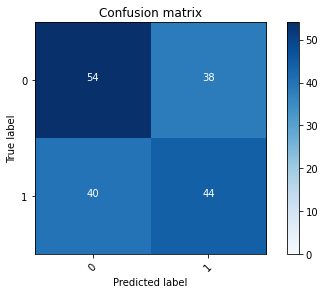

2022-08-20 23:09:30 - [Epoch Train: 44] loss: 0.1564, auc: 0.9845, acc: 0.9356, time: 51.00 s            
2022-08-20 23:09:30 - [Epoch Valid: 44] loss: 1.2300, auc: 0.5710, acc: 0.5789, time: 13.00 s


 44%|██████████████████▍                       | 44/100 [46:54<59:54, 64.19s/it]

2022-08-20 23:09:30 - EPOCH: 45
2022-08-20 23:09:30 - Train Step 10/979, train_loss: 0.0566
2022-08-20 23:09:31 - Train Step 20/979, train_loss: 0.0722
2022-08-20 23:09:31 - Train Step 30/979, train_loss: 0.0608
2022-08-20 23:09:32 - Train Step 40/979, train_loss: 0.0909
2022-08-20 23:09:32 - Train Step 50/979, train_loss: 0.0972
2022-08-20 23:09:33 - Train Step 60/979, train_loss: 0.1017
2022-08-20 23:09:33 - Train Step 70/979, train_loss: 0.0961
2022-08-20 23:09:34 - Train Step 80/979, train_loss: 0.0978
2022-08-20 23:09:34 - Train Step 90/979, train_loss: 0.0939
2022-08-20 23:09:35 - Train Step 100/979, train_loss: 0.1074
2022-08-20 23:09:36 - Train Step 110/979, train_loss: 0.1032
2022-08-20 23:09:36 - Train Step 120/979, train_loss: 0.0990
2022-08-20 23:09:37 - Train Step 130/979, train_loss: 0.0940
2022-08-20 23:09:37 - Train Step 140/979, train_loss: 0.1004
2022-08-20 23:09:38 - Train Step 150/979, train_loss: 0.1002
2022-08-20 23:09:38 - Train Step 160/979, train_loss: 0.0978
2

2022-08-20 23:10:30 - Valid Step 185/247, valid_loss: 1.3726
2022-08-20 23:10:30 - Valid Step 190/247, valid_loss: 1.3855
2022-08-20 23:10:31 - Valid Step 195/247, valid_loss: 1.3748
2022-08-20 23:10:31 - Valid Step 200/247, valid_loss: 1.3551
2022-08-20 23:10:31 - Valid Step 205/247, valid_loss: 1.3484
2022-08-20 23:10:31 - Valid Step 210/247, valid_loss: 1.4218
2022-08-20 23:10:32 - Valid Step 215/247, valid_loss: 1.4201
2022-08-20 23:10:32 - Valid Step 220/247, valid_loss: 1.4161
2022-08-20 23:10:32 - Valid Step 225/247, valid_loss: 1.4002
2022-08-20 23:10:32 - Valid Step 230/247, valid_loss: 1.3867
2022-08-20 23:10:33 - Valid Step 235/247, valid_loss: 1.4005
2022-08-20 23:10:33 - Valid Step 240/247, valid_loss: 1.3964
2022-08-20 23:10:33 - Valid Step 245/247, valid_loss: 1.3746
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
130     00009                0           1
125     00014                1         

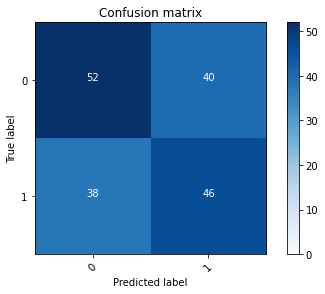

2022-08-20 23:10:33 - [Epoch Train: 45] loss: 0.1450, auc: 0.9842, acc: 0.9530, time: 50.00 s            
2022-08-20 23:10:33 - [Epoch Valid: 45] loss: 1.3637, auc: 0.5721, acc: 0.5789, time: 12.00 s


 45%|██████████████████▉                       | 45/100 [47:58<58:41, 64.03s/it]

2022-08-20 23:10:33 - EPOCH: 46
2022-08-20 23:10:34 - Train Step 10/979, train_loss: 0.0722
2022-08-20 23:10:35 - Train Step 20/979, train_loss: 0.0758
2022-08-20 23:10:35 - Train Step 30/979, train_loss: 0.0757
2022-08-20 23:10:36 - Train Step 40/979, train_loss: 0.0687
2022-08-20 23:10:36 - Train Step 50/979, train_loss: 0.1199
2022-08-20 23:10:37 - Train Step 60/979, train_loss: 0.1108
2022-08-20 23:10:37 - Train Step 70/979, train_loss: 0.1289
2022-08-20 23:10:38 - Train Step 80/979, train_loss: 0.1419
2022-08-20 23:10:38 - Train Step 90/979, train_loss: 0.1559
2022-08-20 23:10:39 - Train Step 100/979, train_loss: 0.1503
2022-08-20 23:10:39 - Train Step 110/979, train_loss: 0.1491
2022-08-20 23:10:40 - Train Step 120/979, train_loss: 0.1414
2022-08-20 23:10:40 - Train Step 130/979, train_loss: 0.1472
2022-08-20 23:10:41 - Train Step 140/979, train_loss: 0.1399
2022-08-20 23:10:41 - Train Step 150/979, train_loss: 0.1374
2022-08-20 23:10:42 - Train Step 160/979, train_loss: 0.1328
2

2022-08-20 23:11:34 - Valid Step 185/247, valid_loss: 1.2634
2022-08-20 23:11:34 - Valid Step 190/247, valid_loss: 1.2808
2022-08-20 23:11:34 - Valid Step 195/247, valid_loss: 1.2729
2022-08-20 23:11:35 - Valid Step 200/247, valid_loss: 1.3028
2022-08-20 23:11:35 - Valid Step 205/247, valid_loss: 1.2982
2022-08-20 23:11:35 - Valid Step 210/247, valid_loss: 1.3320
2022-08-20 23:11:35 - Valid Step 215/247, valid_loss: 1.3050
2022-08-20 23:11:36 - Valid Step 220/247, valid_loss: 1.3234
2022-08-20 23:11:36 - Valid Step 225/247, valid_loss: 1.2995
2022-08-20 23:11:36 - Valid Step 230/247, valid_loss: 1.3136
2022-08-20 23:11:37 - Valid Step 235/247, valid_loss: 1.3119
2022-08-20 23:11:37 - Valid Step 240/247, valid_loss: 1.3106
2022-08-20 23:11:37 - Valid Step 245/247, valid_loss: 1.3270
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
159     00009                0           1
123     00014                1         

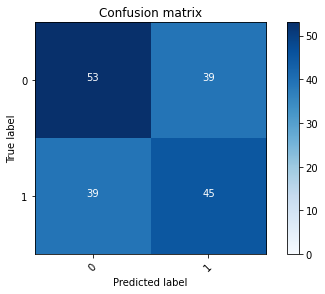

2022-08-20 23:11:37 - [Epoch Train: 46] loss: 0.1363, auc: 0.9878, acc: 0.9581, time: 50.00 s            
2022-08-20 23:11:37 - [Epoch Valid: 46] loss: 1.3246, auc: 0.5763, acc: 0.5749, time: 13.00 s


 46%|███████████████████▎                      | 46/100 [49:02<57:35, 64.00s/it]

2022-08-20 23:11:37 - EPOCH: 47
2022-08-20 23:11:38 - Train Step 10/979, train_loss: 0.1066
2022-08-20 23:11:38 - Train Step 20/979, train_loss: 0.0893
2022-08-20 23:11:39 - Train Step 30/979, train_loss: 0.0771
2022-08-20 23:11:39 - Train Step 40/979, train_loss: 0.0997
2022-08-20 23:11:40 - Train Step 50/979, train_loss: 0.0945
2022-08-20 23:11:40 - Train Step 60/979, train_loss: 0.0966
2022-08-20 23:11:41 - Train Step 70/979, train_loss: 0.0869
2022-08-20 23:11:41 - Train Step 80/979, train_loss: 0.0810
2022-08-20 23:11:42 - Train Step 90/979, train_loss: 0.0808
2022-08-20 23:11:43 - Train Step 100/979, train_loss: 0.0769
2022-08-20 23:11:43 - Train Step 110/979, train_loss: 0.0927
2022-08-20 23:11:44 - Train Step 120/979, train_loss: 0.0954
2022-08-20 23:11:44 - Train Step 130/979, train_loss: 0.1049
2022-08-20 23:11:45 - Train Step 140/979, train_loss: 0.1044
2022-08-20 23:11:45 - Train Step 150/979, train_loss: 0.1011
2022-08-20 23:11:46 - Train Step 160/979, train_loss: 0.1069
2

2022-08-20 23:12:36 - Valid Step 185/247, valid_loss: 1.4181
2022-08-20 23:12:36 - Valid Step 190/247, valid_loss: 1.4563
2022-08-20 23:12:37 - Valid Step 195/247, valid_loss: 1.5124
2022-08-20 23:12:37 - Valid Step 200/247, valid_loss: 1.5067
2022-08-20 23:12:37 - Valid Step 205/247, valid_loss: 1.4781
2022-08-20 23:12:37 - Valid Step 210/247, valid_loss: 1.4559
2022-08-20 23:12:38 - Valid Step 215/247, valid_loss: 1.5013
2022-08-20 23:12:38 - Valid Step 220/247, valid_loss: 1.5026
2022-08-20 23:12:38 - Valid Step 225/247, valid_loss: 1.5011
2022-08-20 23:12:39 - Valid Step 230/247, valid_loss: 1.4895
2022-08-20 23:12:39 - Valid Step 235/247, valid_loss: 1.5250
2022-08-20 23:12:39 - Valid Step 240/247, valid_loss: 1.5316
2022-08-20 23:12:39 - Valid Step 245/247, valid_loss: 1.5287
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
17      00009                0           1
162     00014                1         

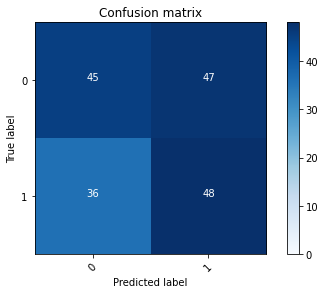

2022-08-20 23:12:40 - [Epoch Train: 47] loss: 0.1304, auc: 0.9888, acc: 0.9499, time: 49.00 s            
2022-08-20 23:12:40 - [Epoch Valid: 47] loss: 1.5444, auc: 0.5694, acc: 0.5385, time: 12.00 s


 47%|███████████████████▋                      | 47/100 [50:04<56:04, 63.47s/it]

2022-08-20 23:12:40 - EPOCH: 48
2022-08-20 23:12:40 - Train Step 10/979, train_loss: 0.0651
2022-08-20 23:12:41 - Train Step 20/979, train_loss: 0.0932
2022-08-20 23:12:41 - Train Step 30/979, train_loss: 0.0806
2022-08-20 23:12:42 - Train Step 40/979, train_loss: 0.0772
2022-08-20 23:12:42 - Train Step 50/979, train_loss: 0.0734
2022-08-20 23:12:43 - Train Step 60/979, train_loss: 0.1176
2022-08-20 23:12:43 - Train Step 70/979, train_loss: 0.1435
2022-08-20 23:12:43 - Train Step 80/979, train_loss: 0.1391
2022-08-20 23:12:44 - Train Step 90/979, train_loss: 0.1409
2022-08-20 23:12:44 - Train Step 100/979, train_loss: 0.1353
2022-08-20 23:12:45 - Train Step 110/979, train_loss: 0.1281
2022-08-20 23:12:45 - Train Step 120/979, train_loss: 0.1271
2022-08-20 23:12:46 - Train Step 130/979, train_loss: 0.1239
2022-08-20 23:12:46 - Train Step 140/979, train_loss: 0.1214
2022-08-20 23:12:47 - Train Step 150/979, train_loss: 0.1161
2022-08-20 23:12:47 - Train Step 160/979, train_loss: 0.1123
2

2022-08-20 23:13:39 - Valid Step 185/247, valid_loss: 1.4287
2022-08-20 23:13:39 - Valid Step 190/247, valid_loss: 1.4980
2022-08-20 23:13:40 - Valid Step 195/247, valid_loss: 1.4773
2022-08-20 23:13:40 - Valid Step 200/247, valid_loss: 1.4781
2022-08-20 23:13:40 - Valid Step 205/247, valid_loss: 1.4511
2022-08-20 23:13:40 - Valid Step 210/247, valid_loss: 1.4438
2022-08-20 23:13:41 - Valid Step 215/247, valid_loss: 1.4266
2022-08-20 23:13:41 - Valid Step 220/247, valid_loss: 1.4106
2022-08-20 23:13:41 - Valid Step 225/247, valid_loss: 1.4391
2022-08-20 23:13:41 - Valid Step 230/247, valid_loss: 1.4768
2022-08-20 23:13:42 - Valid Step 235/247, valid_loss: 1.4744
2022-08-20 23:13:42 - Valid Step 240/247, valid_loss: 1.4577
2022-08-20 23:13:42 - Valid Step 245/247, valid_loss: 1.4417
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
139     00009                0           1
48      00014                1         

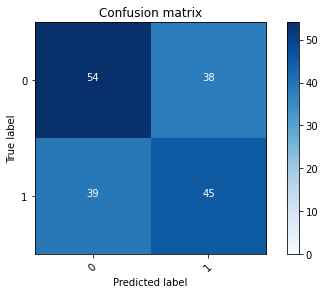

2022-08-20 23:13:43 - [Epoch Train: 48] loss: 0.1218, auc: 0.9901, acc: 0.9581, time: 49.00 s            
2022-08-20 23:13:43 - [Epoch Valid: 48] loss: 1.4682, auc: 0.5718, acc: 0.5830, time: 13.00 s


 48%|████████████████████▏                     | 48/100 [51:07<54:53, 63.33s/it]

2022-08-20 23:13:43 - EPOCH: 49
2022-08-20 23:13:43 - Train Step 10/979, train_loss: 0.0735
2022-08-20 23:13:44 - Train Step 20/979, train_loss: 0.1093
2022-08-20 23:13:44 - Train Step 30/979, train_loss: 0.1158
2022-08-20 23:13:45 - Train Step 40/979, train_loss: 0.1020
2022-08-20 23:13:45 - Train Step 50/979, train_loss: 0.0945
2022-08-20 23:13:46 - Train Step 60/979, train_loss: 0.0980
2022-08-20 23:13:46 - Train Step 70/979, train_loss: 0.0994
2022-08-20 23:13:47 - Train Step 80/979, train_loss: 0.0899
2022-08-20 23:13:47 - Train Step 90/979, train_loss: 0.1067
2022-08-20 23:13:48 - Train Step 100/979, train_loss: 0.0983
2022-08-20 23:13:48 - Train Step 110/979, train_loss: 0.0959
2022-08-20 23:13:49 - Train Step 120/979, train_loss: 0.1042
2022-08-20 23:13:49 - Train Step 130/979, train_loss: 0.1285
2022-08-20 23:13:50 - Train Step 140/979, train_loss: 0.1267
2022-08-20 23:13:50 - Train Step 150/979, train_loss: 0.1214
2022-08-20 23:13:51 - Train Step 160/979, train_loss: 0.1194
2

2022-08-20 23:14:43 - Valid Step 185/247, valid_loss: 1.2841
2022-08-20 23:14:43 - Valid Step 190/247, valid_loss: 1.2531
2022-08-20 23:14:44 - Valid Step 195/247, valid_loss: 1.2724
2022-08-20 23:14:44 - Valid Step 200/247, valid_loss: 1.2950
2022-08-20 23:14:44 - Valid Step 205/247, valid_loss: 1.2754
2022-08-20 23:14:44 - Valid Step 210/247, valid_loss: 1.2941
2022-08-20 23:14:45 - Valid Step 215/247, valid_loss: 1.3010
2022-08-20 23:14:45 - Valid Step 220/247, valid_loss: 1.2947
2022-08-20 23:14:45 - Valid Step 225/247, valid_loss: 1.3317
2022-08-20 23:14:45 - Valid Step 230/247, valid_loss: 1.3765
2022-08-20 23:14:46 - Valid Step 235/247, valid_loss: 1.3741
2022-08-20 23:14:46 - Valid Step 240/247, valid_loss: 1.4116
2022-08-20 23:14:46 - Valid Step 245/247, valid_loss: 1.4692
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
166     00009                0           1
109     00014                1         

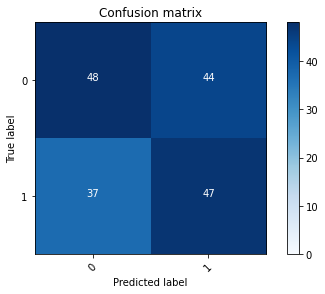

2022-08-20 23:14:46 - [Epoch Train: 49] loss: 0.1106, auc: 0.9939, acc: 0.9683, time: 50.00 s            
2022-08-20 23:14:46 - [Epoch Valid: 49] loss: 1.4646, auc: 0.5741, acc: 0.5587, time: 13.00 s


 49%|████████████████████▌                     | 49/100 [52:11<53:59, 63.53s/it]

2022-08-20 23:14:46 - EPOCH: 50
2022-08-20 23:14:47 - Train Step 10/979, train_loss: 0.3515
2022-08-20 23:14:48 - Train Step 20/979, train_loss: 0.1838
2022-08-20 23:14:48 - Train Step 30/979, train_loss: 0.1625
2022-08-20 23:14:49 - Train Step 40/979, train_loss: 0.1327
2022-08-20 23:14:49 - Train Step 50/979, train_loss: 0.1197
2022-08-20 23:14:50 - Train Step 60/979, train_loss: 0.1078
2022-08-20 23:14:50 - Train Step 70/979, train_loss: 0.1121
2022-08-20 23:14:51 - Train Step 80/979, train_loss: 0.0997
2022-08-20 23:14:51 - Train Step 90/979, train_loss: 0.0952
2022-08-20 23:14:52 - Train Step 100/979, train_loss: 0.0988
2022-08-20 23:14:52 - Train Step 110/979, train_loss: 0.0913
2022-08-20 23:14:53 - Train Step 120/979, train_loss: 0.0860
2022-08-20 23:14:53 - Train Step 130/979, train_loss: 0.0949
2022-08-20 23:14:54 - Train Step 140/979, train_loss: 0.1025
2022-08-20 23:14:54 - Train Step 150/979, train_loss: 0.1006
2022-08-20 23:14:55 - Train Step 160/979, train_loss: 0.1088
2

2022-08-20 23:15:48 - Valid Step 185/247, valid_loss: 1.2209
2022-08-20 23:15:48 - Valid Step 190/247, valid_loss: 1.2314
2022-08-20 23:15:48 - Valid Step 195/247, valid_loss: 1.2586
2022-08-20 23:15:48 - Valid Step 200/247, valid_loss: 1.2649
2022-08-20 23:15:49 - Valid Step 205/247, valid_loss: 1.2637
2022-08-20 23:15:49 - Valid Step 210/247, valid_loss: 1.2411
2022-08-20 23:15:49 - Valid Step 215/247, valid_loss: 1.3440
2022-08-20 23:15:49 - Valid Step 220/247, valid_loss: 1.3524
2022-08-20 23:15:50 - Valid Step 225/247, valid_loss: 1.3538
2022-08-20 23:15:50 - Valid Step 230/247, valid_loss: 1.3530
2022-08-20 23:15:50 - Valid Step 235/247, valid_loss: 1.3596
2022-08-20 23:15:51 - Valid Step 240/247, valid_loss: 1.3766
2022-08-20 23:15:51 - Valid Step 245/247, valid_loss: 1.3749
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
45      00009                0           1
39      00014                1         

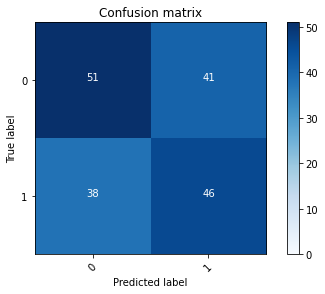

2022-08-20 23:15:51 - [Epoch Train: 50] loss: 0.1148, auc: 0.9905, acc: 0.9632, time: 51.00 s            
2022-08-20 23:15:51 - [Epoch Valid: 50] loss: 1.3772, auc: 0.5710, acc: 0.5709, time: 13.00 s


 50%|█████████████████████                     | 50/100 [53:16<53:11, 63.82s/it]

2022-08-20 23:15:51 - EPOCH: 51
2022-08-20 23:15:52 - Train Step 10/979, train_loss: 0.0724
2022-08-20 23:15:52 - Train Step 20/979, train_loss: 0.0711
2022-08-20 23:15:53 - Train Step 30/979, train_loss: 0.0718
2022-08-20 23:15:53 - Train Step 40/979, train_loss: 0.0746
2022-08-20 23:15:54 - Train Step 50/979, train_loss: 0.0682
2022-08-20 23:15:54 - Train Step 60/979, train_loss: 0.0732
2022-08-20 23:15:55 - Train Step 70/979, train_loss: 0.0729
2022-08-20 23:15:55 - Train Step 80/979, train_loss: 0.0736
2022-08-20 23:15:56 - Train Step 90/979, train_loss: 0.0673
2022-08-20 23:15:56 - Train Step 100/979, train_loss: 0.0665
2022-08-20 23:15:57 - Train Step 110/979, train_loss: 0.0629
2022-08-20 23:15:58 - Train Step 120/979, train_loss: 0.0656
2022-08-20 23:15:58 - Train Step 130/979, train_loss: 0.0849
2022-08-20 23:15:59 - Train Step 140/979, train_loss: 0.0844
2022-08-20 23:15:59 - Train Step 150/979, train_loss: 0.0802
2022-08-20 23:16:00 - Train Step 160/979, train_loss: 0.0771
2

2022-08-20 23:16:52 - Valid Step 185/247, valid_loss: 1.5106
2022-08-20 23:16:52 - Valid Step 190/247, valid_loss: 1.5162
2022-08-20 23:16:52 - Valid Step 195/247, valid_loss: 1.5083
2022-08-20 23:16:53 - Valid Step 200/247, valid_loss: 1.4889
2022-08-20 23:16:53 - Valid Step 205/247, valid_loss: 1.4921
2022-08-20 23:16:53 - Valid Step 210/247, valid_loss: 1.4771
2022-08-20 23:16:53 - Valid Step 215/247, valid_loss: 1.4781
2022-08-20 23:16:54 - Valid Step 220/247, valid_loss: 1.4943
2022-08-20 23:16:54 - Valid Step 225/247, valid_loss: 1.5143
2022-08-20 23:16:54 - Valid Step 230/247, valid_loss: 1.5249
2022-08-20 23:16:54 - Valid Step 235/247, valid_loss: 1.5309
2022-08-20 23:16:55 - Valid Step 240/247, valid_loss: 1.5325
2022-08-20 23:16:55 - Valid Step 245/247, valid_loss: 1.5187
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
37      00009                0           1
161     00014                1         

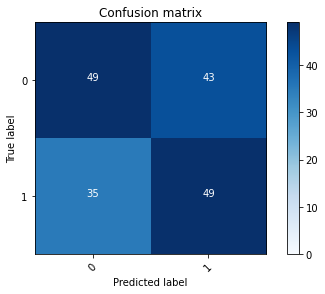

2022-08-20 23:16:55 - [Epoch Train: 51] loss: 0.1034, auc: 0.9928, acc: 0.9745, time: 50.00 s            
2022-08-20 23:16:55 - [Epoch Valid: 51] loss: 1.5887, auc: 0.5774, acc: 0.5749, time: 13.00 s


 51%|█████████████████████▍                    | 51/100 [54:20<52:12, 63.92s/it]

2022-08-20 23:16:55 - EPOCH: 52
2022-08-20 23:16:56 - Train Step 10/979, train_loss: 0.2561
2022-08-20 23:16:56 - Train Step 20/979, train_loss: 0.1572
2022-08-20 23:16:57 - Train Step 30/979, train_loss: 0.1381
2022-08-20 23:16:57 - Train Step 40/979, train_loss: 0.1086
2022-08-20 23:16:58 - Train Step 50/979, train_loss: 0.1123
2022-08-20 23:16:58 - Train Step 60/979, train_loss: 0.1143
2022-08-20 23:16:59 - Train Step 70/979, train_loss: 0.1032
2022-08-20 23:17:00 - Train Step 80/979, train_loss: 0.0990
2022-08-20 23:17:00 - Train Step 90/979, train_loss: 0.0920
2022-08-20 23:17:01 - Train Step 100/979, train_loss: 0.0905
2022-08-20 23:17:01 - Train Step 110/979, train_loss: 0.0873
2022-08-20 23:17:02 - Train Step 120/979, train_loss: 0.0830
2022-08-20 23:17:02 - Train Step 130/979, train_loss: 0.0993
2022-08-20 23:17:03 - Train Step 140/979, train_loss: 0.0995
2022-08-20 23:17:03 - Train Step 150/979, train_loss: 0.0974
2022-08-20 23:17:04 - Train Step 160/979, train_loss: 0.0973
2

2022-08-20 23:17:56 - Valid Step 185/247, valid_loss: 1.5191
2022-08-20 23:17:56 - Valid Step 190/247, valid_loss: 1.4817
2022-08-20 23:17:56 - Valid Step 195/247, valid_loss: 1.5049
2022-08-20 23:17:57 - Valid Step 200/247, valid_loss: 1.5088
2022-08-20 23:17:57 - Valid Step 205/247, valid_loss: 1.5242
2022-08-20 23:17:57 - Valid Step 210/247, valid_loss: 1.4900
2022-08-20 23:17:58 - Valid Step 215/247, valid_loss: 1.4863
2022-08-20 23:17:58 - Valid Step 220/247, valid_loss: 1.4759
2022-08-20 23:17:58 - Valid Step 225/247, valid_loss: 1.4454
2022-08-20 23:17:58 - Valid Step 230/247, valid_loss: 1.4422
2022-08-20 23:17:59 - Valid Step 235/247, valid_loss: 1.4583
2022-08-20 23:17:59 - Valid Step 240/247, valid_loss: 1.4723
2022-08-20 23:17:59 - Valid Step 245/247, valid_loss: 1.4713
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
9       00009                0           1
135     00014                1         

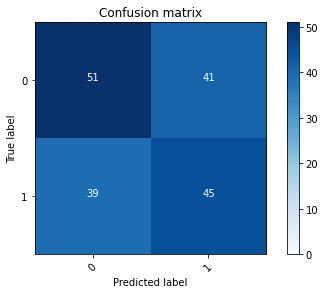

2022-08-20 23:17:59 - [Epoch Train: 52] loss: 0.0959, auc: 0.9950, acc: 0.9704, time: 51.00 s            
2022-08-20 23:17:59 - [Epoch Valid: 52] loss: 1.4605, auc: 0.5798, acc: 0.5668, time: 13.00 s


 52%|█████████████████████▊                    | 52/100 [55:24<51:12, 64.01s/it]

2022-08-20 23:17:59 - EPOCH: 53
2022-08-20 23:18:00 - Train Step 10/979, train_loss: 0.1392
2022-08-20 23:18:01 - Train Step 20/979, train_loss: 0.0859
2022-08-20 23:18:01 - Train Step 30/979, train_loss: 0.1181
2022-08-20 23:18:02 - Train Step 40/979, train_loss: 0.1311
2022-08-20 23:18:02 - Train Step 50/979, train_loss: 0.1193
2022-08-20 23:18:03 - Train Step 60/979, train_loss: 0.1430
2022-08-20 23:18:03 - Train Step 70/979, train_loss: 0.1432
2022-08-20 23:18:04 - Train Step 80/979, train_loss: 0.1328
2022-08-20 23:18:04 - Train Step 90/979, train_loss: 0.1291
2022-08-20 23:18:05 - Train Step 100/979, train_loss: 0.1197
2022-08-20 23:18:05 - Train Step 110/979, train_loss: 0.1128
2022-08-20 23:18:06 - Train Step 120/979, train_loss: 0.1074
2022-08-20 23:18:06 - Train Step 130/979, train_loss: 0.1020
2022-08-20 23:18:07 - Train Step 140/979, train_loss: 0.0975
2022-08-20 23:18:07 - Train Step 150/979, train_loss: 0.0987
2022-08-20 23:18:08 - Train Step 160/979, train_loss: 0.0979
2

2022-08-20 23:19:00 - Valid Step 185/247, valid_loss: 1.5128
2022-08-20 23:19:00 - Valid Step 190/247, valid_loss: 1.4928
2022-08-20 23:19:00 - Valid Step 195/247, valid_loss: 1.4807
2022-08-20 23:19:00 - Valid Step 200/247, valid_loss: 1.4578
2022-08-20 23:19:01 - Valid Step 205/247, valid_loss: 1.4378
2022-08-20 23:19:01 - Valid Step 210/247, valid_loss: 1.4335
2022-08-20 23:19:01 - Valid Step 215/247, valid_loss: 1.4462
2022-08-20 23:19:01 - Valid Step 220/247, valid_loss: 1.4395
2022-08-20 23:19:02 - Valid Step 225/247, valid_loss: 1.4379
2022-08-20 23:19:02 - Valid Step 230/247, valid_loss: 1.4194
2022-08-20 23:19:02 - Valid Step 235/247, valid_loss: 1.4323
2022-08-20 23:19:02 - Valid Step 240/247, valid_loss: 1.4102
2022-08-20 23:19:03 - Valid Step 245/247, valid_loss: 1.3875
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
83      00009                0           1
76      00014                1         

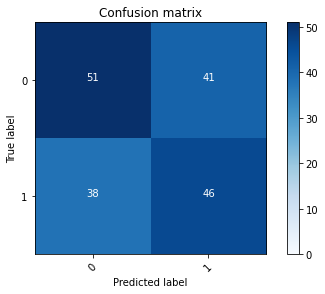

2022-08-20 23:19:03 - [Epoch Train: 53] loss: 0.0913, auc: 0.9953, acc: 0.9683, time: 50.00 s            
2022-08-20 23:19:03 - [Epoch Valid: 53] loss: 1.3865, auc: 0.5806, acc: 0.5628, time: 13.00 s


 53%|██████████████████████▎                   | 53/100 [56:27<50:02, 63.88s/it]

2022-08-20 23:19:03 - EPOCH: 54
2022-08-20 23:19:04 - Train Step 10/979, train_loss: 0.0758
2022-08-20 23:19:04 - Train Step 20/979, train_loss: 0.1270
2022-08-20 23:19:05 - Train Step 30/979, train_loss: 0.1204
2022-08-20 23:19:05 - Train Step 40/979, train_loss: 0.1483
2022-08-20 23:19:06 - Train Step 50/979, train_loss: 0.1398
2022-08-20 23:19:06 - Train Step 60/979, train_loss: 0.1659
2022-08-20 23:19:07 - Train Step 70/979, train_loss: 0.1645
2022-08-20 23:19:07 - Train Step 80/979, train_loss: 0.1499
2022-08-20 23:19:08 - Train Step 90/979, train_loss: 0.1368
2022-08-20 23:19:08 - Train Step 100/979, train_loss: 0.1305
2022-08-20 23:19:09 - Train Step 110/979, train_loss: 0.1331
2022-08-20 23:19:09 - Train Step 120/979, train_loss: 0.1319
2022-08-20 23:19:10 - Train Step 130/979, train_loss: 0.1264
2022-08-20 23:19:10 - Train Step 140/979, train_loss: 0.1191
2022-08-20 23:19:11 - Train Step 150/979, train_loss: 0.1179
2022-08-20 23:19:11 - Train Step 160/979, train_loss: 0.1169
2

2022-08-20 23:20:04 - Valid Step 185/247, valid_loss: 1.3298
2022-08-20 23:20:04 - Valid Step 190/247, valid_loss: 1.3723
2022-08-20 23:20:04 - Valid Step 195/247, valid_loss: 1.4363
2022-08-20 23:20:04 - Valid Step 200/247, valid_loss: 1.4240
2022-08-20 23:20:05 - Valid Step 205/247, valid_loss: 1.4049
2022-08-20 23:20:05 - Valid Step 210/247, valid_loss: 1.3914
2022-08-20 23:20:05 - Valid Step 215/247, valid_loss: 1.4387
2022-08-20 23:20:05 - Valid Step 220/247, valid_loss: 1.4289
2022-08-20 23:20:06 - Valid Step 225/247, valid_loss: 1.4110
2022-08-20 23:20:06 - Valid Step 230/247, valid_loss: 1.4456
2022-08-20 23:20:06 - Valid Step 235/247, valid_loss: 1.4170
2022-08-20 23:20:06 - Valid Step 240/247, valid_loss: 1.4114
2022-08-20 23:20:07 - Valid Step 245/247, valid_loss: 1.4051
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
81      00009                0           1
17      00014                1         

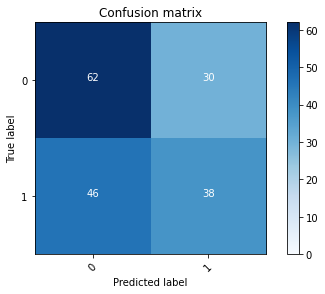

2022-08-20 23:20:07 - [Epoch Train: 54] loss: 0.0951, auc: 0.9947, acc: 0.9694, time: 50.00 s            
2022-08-20 23:20:07 - [Epoch Valid: 54] loss: 1.4026, auc: 0.5793, acc: 0.5789, time: 13.00 s


 54%|██████████████████████▋                   | 54/100 [57:31<48:59, 63.90s/it]

2022-08-20 23:20:07 - EPOCH: 55
2022-08-20 23:20:08 - Train Step 10/979, train_loss: 0.0480
2022-08-20 23:20:08 - Train Step 20/979, train_loss: 0.0310
2022-08-20 23:20:09 - Train Step 30/979, train_loss: 0.0475
2022-08-20 23:20:09 - Train Step 40/979, train_loss: 0.0641
2022-08-20 23:20:10 - Train Step 50/979, train_loss: 0.0555
2022-08-20 23:20:10 - Train Step 60/979, train_loss: 0.0517
2022-08-20 23:20:11 - Train Step 70/979, train_loss: 0.0613
2022-08-20 23:20:11 - Train Step 80/979, train_loss: 0.0566
2022-08-20 23:20:12 - Train Step 90/979, train_loss: 0.0630
2022-08-20 23:20:12 - Train Step 100/979, train_loss: 0.0617
2022-08-20 23:20:13 - Train Step 110/979, train_loss: 0.0634
2022-08-20 23:20:13 - Train Step 120/979, train_loss: 0.0642
2022-08-20 23:20:14 - Train Step 130/979, train_loss: 0.0635
2022-08-20 23:20:14 - Train Step 140/979, train_loss: 0.0649
2022-08-20 23:20:15 - Train Step 150/979, train_loss: 0.0627
2022-08-20 23:20:15 - Train Step 160/979, train_loss: 0.0618
2

2022-08-20 23:21:08 - Valid Step 185/247, valid_loss: 1.6695
2022-08-20 23:21:08 - Valid Step 190/247, valid_loss: 1.7057
2022-08-20 23:21:08 - Valid Step 195/247, valid_loss: 1.7060
2022-08-20 23:21:09 - Valid Step 200/247, valid_loss: 1.6835
2022-08-20 23:21:09 - Valid Step 205/247, valid_loss: 1.7289
2022-08-20 23:21:09 - Valid Step 210/247, valid_loss: 1.7307
2022-08-20 23:21:09 - Valid Step 215/247, valid_loss: 1.7047
2022-08-20 23:21:10 - Valid Step 220/247, valid_loss: 1.6742
2022-08-20 23:21:10 - Valid Step 225/247, valid_loss: 1.7237
2022-08-20 23:21:10 - Valid Step 230/247, valid_loss: 1.6963
2022-08-20 23:21:11 - Valid Step 235/247, valid_loss: 1.7275
2022-08-20 23:21:11 - Valid Step 240/247, valid_loss: 1.7099
2022-08-20 23:21:11 - Valid Step 245/247, valid_loss: 1.6930
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
113     00009                0           1
171     00014                1         

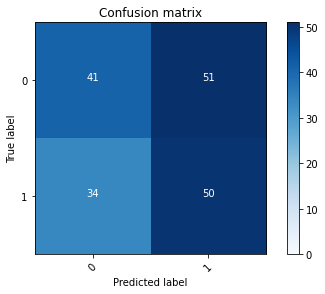

2022-08-20 23:21:11 - [Epoch Train: 55] loss: 0.0790, auc: 0.9965, acc: 0.9775, time: 51.00 s            
2022-08-20 23:21:11 - [Epoch Valid: 55] loss: 1.7056, auc: 0.5779, acc: 0.5263, time: 13.00 s


 55%|███████████████████████                   | 55/100 [58:36<48:02, 64.06s/it]

2022-08-20 23:21:11 - EPOCH: 56
2022-08-20 23:21:12 - Train Step 10/979, train_loss: 0.0644
2022-08-20 23:21:13 - Train Step 20/979, train_loss: 0.0781
2022-08-20 23:21:13 - Train Step 30/979, train_loss: 0.0673
2022-08-20 23:21:14 - Train Step 40/979, train_loss: 0.0995
2022-08-20 23:21:14 - Train Step 50/979, train_loss: 0.1102
2022-08-20 23:21:15 - Train Step 60/979, train_loss: 0.1005
2022-08-20 23:21:15 - Train Step 70/979, train_loss: 0.1073
2022-08-20 23:21:16 - Train Step 80/979, train_loss: 0.0963
2022-08-20 23:21:16 - Train Step 90/979, train_loss: 0.0868
2022-08-20 23:21:17 - Train Step 100/979, train_loss: 0.0935
2022-08-20 23:21:17 - Train Step 110/979, train_loss: 0.0994
2022-08-20 23:21:18 - Train Step 120/979, train_loss: 0.1047
2022-08-20 23:21:18 - Train Step 130/979, train_loss: 0.0991
2022-08-20 23:21:19 - Train Step 140/979, train_loss: 0.0989
2022-08-20 23:21:19 - Train Step 150/979, train_loss: 0.0944
2022-08-20 23:21:20 - Train Step 160/979, train_loss: 0.1018
2

2022-08-20 23:22:11 - Valid Step 185/247, valid_loss: 1.6539
2022-08-20 23:22:12 - Valid Step 190/247, valid_loss: 1.6153
2022-08-20 23:22:12 - Valid Step 195/247, valid_loss: 1.6135
2022-08-20 23:22:12 - Valid Step 200/247, valid_loss: 1.6325
2022-08-20 23:22:12 - Valid Step 205/247, valid_loss: 1.6341
2022-08-20 23:22:13 - Valid Step 210/247, valid_loss: 1.6057
2022-08-20 23:22:13 - Valid Step 215/247, valid_loss: 1.6570
2022-08-20 23:22:13 - Valid Step 220/247, valid_loss: 1.6770
2022-08-20 23:22:13 - Valid Step 225/247, valid_loss: 1.7045
2022-08-20 23:22:14 - Valid Step 230/247, valid_loss: 1.6829
2022-08-20 23:22:14 - Valid Step 235/247, valid_loss: 1.7476
2022-08-20 23:22:14 - Valid Step 240/247, valid_loss: 1.7342
2022-08-20 23:22:14 - Valid Step 245/247, valid_loss: 1.7030
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
49      00009                0           1
138     00014                1         

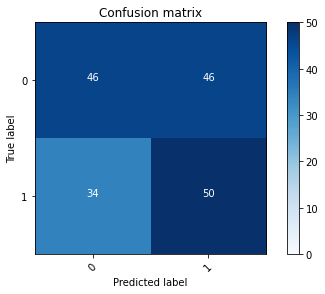

2022-08-20 23:22:15 - [Epoch Train: 56] loss: 0.0830, auc: 0.9955, acc: 0.9734, time: 50.00 s            
2022-08-20 23:22:15 - [Epoch Valid: 56] loss: 1.6943, auc: 0.5745, acc: 0.5628, time: 13.00 s


 56%|███████████████████████▌                  | 56/100 [59:39<46:49, 63.86s/it]

2022-08-20 23:22:15 - EPOCH: 57
2022-08-20 23:22:15 - Train Step 10/979, train_loss: 0.0304
2022-08-20 23:22:16 - Train Step 20/979, train_loss: 0.0317
2022-08-20 23:22:16 - Train Step 30/979, train_loss: 0.0508
2022-08-20 23:22:17 - Train Step 40/979, train_loss: 0.0465
2022-08-20 23:22:18 - Train Step 50/979, train_loss: 0.1266
2022-08-20 23:22:18 - Train Step 60/979, train_loss: 0.1131
2022-08-20 23:22:19 - Train Step 70/979, train_loss: 0.1101
2022-08-20 23:22:19 - Train Step 80/979, train_loss: 0.0979
2022-08-20 23:22:20 - Train Step 90/979, train_loss: 0.0885
2022-08-20 23:22:20 - Train Step 100/979, train_loss: 0.0830
2022-08-20 23:22:21 - Train Step 110/979, train_loss: 0.0852
2022-08-20 23:22:21 - Train Step 120/979, train_loss: 0.0905
2022-08-20 23:22:22 - Train Step 130/979, train_loss: 0.1000
2022-08-20 23:22:22 - Train Step 140/979, train_loss: 0.0983
2022-08-20 23:22:23 - Train Step 150/979, train_loss: 0.1037
2022-08-20 23:22:23 - Train Step 160/979, train_loss: 0.0984
2

2022-08-20 23:23:15 - Valid Step 185/247, valid_loss: 1.6414
2022-08-20 23:23:16 - Valid Step 190/247, valid_loss: 1.6536
2022-08-20 23:23:16 - Valid Step 195/247, valid_loss: 1.6407
2022-08-20 23:23:16 - Valid Step 200/247, valid_loss: 1.6190
2022-08-20 23:23:16 - Valid Step 205/247, valid_loss: 1.6014
2022-08-20 23:23:17 - Valid Step 210/247, valid_loss: 1.5975
2022-08-20 23:23:17 - Valid Step 215/247, valid_loss: 1.5855
2022-08-20 23:23:17 - Valid Step 220/247, valid_loss: 1.6339
2022-08-20 23:23:17 - Valid Step 225/247, valid_loss: 1.6065
2022-08-20 23:23:18 - Valid Step 230/247, valid_loss: 1.6203
2022-08-20 23:23:18 - Valid Step 235/247, valid_loss: 1.6313
2022-08-20 23:23:18 - Valid Step 240/247, valid_loss: 1.6278
2022-08-20 23:23:18 - Valid Step 245/247, valid_loss: 1.6437
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
103     00009                0           1
132     00014                1         

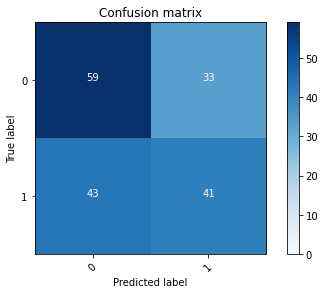

2022-08-20 23:23:19 - [Epoch Train: 57] loss: 0.0741, auc: 0.9975, acc: 0.9745, time: 50.00 s            
2022-08-20 23:23:19 - [Epoch Valid: 57] loss: 1.6316, auc: 0.5775, acc: 0.5709, time: 13.00 s


 57%|██████████████████████▊                 | 57/100 [1:00:43<45:47, 63.89s/it]

2022-08-20 23:23:19 - EPOCH: 58
2022-08-20 23:23:19 - Train Step 10/979, train_loss: 0.1189
2022-08-20 23:23:20 - Train Step 20/979, train_loss: 0.0949
2022-08-20 23:23:20 - Train Step 30/979, train_loss: 0.0828
2022-08-20 23:23:21 - Train Step 40/979, train_loss: 0.1211
2022-08-20 23:23:21 - Train Step 50/979, train_loss: 0.1111
2022-08-20 23:23:22 - Train Step 60/979, train_loss: 0.1148
2022-08-20 23:23:22 - Train Step 70/979, train_loss: 0.0992
2022-08-20 23:23:23 - Train Step 80/979, train_loss: 0.1136
2022-08-20 23:23:23 - Train Step 90/979, train_loss: 0.1205
2022-08-20 23:23:24 - Train Step 100/979, train_loss: 0.1139
2022-08-20 23:23:24 - Train Step 110/979, train_loss: 0.1126
2022-08-20 23:23:25 - Train Step 120/979, train_loss: 0.1085
2022-08-20 23:23:26 - Train Step 130/979, train_loss: 0.1217
2022-08-20 23:23:26 - Train Step 140/979, train_loss: 0.1189
2022-08-20 23:23:27 - Train Step 150/979, train_loss: 0.1149
2022-08-20 23:23:27 - Train Step 160/979, train_loss: 0.1097
2

2022-08-20 23:24:19 - Valid Step 185/247, valid_loss: 1.4896
2022-08-20 23:24:20 - Valid Step 190/247, valid_loss: 1.4567
2022-08-20 23:24:20 - Valid Step 195/247, valid_loss: 1.4578
2022-08-20 23:24:20 - Valid Step 200/247, valid_loss: 1.4957
2022-08-20 23:24:20 - Valid Step 205/247, valid_loss: 1.5066
2022-08-20 23:24:21 - Valid Step 210/247, valid_loss: 1.5538
2022-08-20 23:24:21 - Valid Step 215/247, valid_loss: 1.6008
2022-08-20 23:24:21 - Valid Step 220/247, valid_loss: 1.6366
2022-08-20 23:24:21 - Valid Step 225/247, valid_loss: 1.6105
2022-08-20 23:24:22 - Valid Step 230/247, valid_loss: 1.6003
2022-08-20 23:24:22 - Valid Step 235/247, valid_loss: 1.6552
2022-08-20 23:24:22 - Valid Step 240/247, valid_loss: 1.6350
2022-08-20 23:24:23 - Valid Step 245/247, valid_loss: 1.6086
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
158     00009                0           0
10      00014                1         

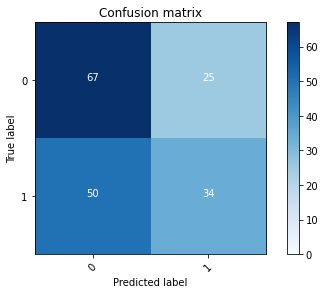

2022-08-20 23:24:23 - [Epoch Train: 58] loss: 0.0882, auc: 0.9955, acc: 0.9714, time: 50.00 s            
2022-08-20 23:24:23 - [Epoch Valid: 58] loss: 1.6295, auc: 0.5815, acc: 0.5749, time: 13.00 s


 58%|███████████████████████▏                | 58/100 [1:01:47<44:46, 63.97s/it]

2022-08-20 23:24:23 - EPOCH: 59
2022-08-20 23:24:24 - Train Step 10/979, train_loss: 0.0262
2022-08-20 23:24:24 - Train Step 20/979, train_loss: 0.0229
2022-08-20 23:24:25 - Train Step 30/979, train_loss: 0.0243
2022-08-20 23:24:25 - Train Step 40/979, train_loss: 0.0309
2022-08-20 23:24:26 - Train Step 50/979, train_loss: 0.0460
2022-08-20 23:24:26 - Train Step 60/979, train_loss: 0.0455
2022-08-20 23:24:27 - Train Step 70/979, train_loss: 0.0416
2022-08-20 23:24:27 - Train Step 80/979, train_loss: 0.0408
2022-08-20 23:24:28 - Train Step 90/979, train_loss: 0.0398
2022-08-20 23:24:28 - Train Step 100/979, train_loss: 0.0379
2022-08-20 23:24:29 - Train Step 110/979, train_loss: 0.0487
2022-08-20 23:24:29 - Train Step 120/979, train_loss: 0.0483
2022-08-20 23:24:30 - Train Step 130/979, train_loss: 0.0492
2022-08-20 23:24:30 - Train Step 140/979, train_loss: 0.0472
2022-08-20 23:24:31 - Train Step 150/979, train_loss: 0.0460
2022-08-20 23:24:32 - Train Step 160/979, train_loss: 0.0475
2

2022-08-20 23:25:21 - Valid Step 185/247, valid_loss: 1.6209
2022-08-20 23:25:22 - Valid Step 190/247, valid_loss: 1.5892
2022-08-20 23:25:22 - Valid Step 195/247, valid_loss: 1.5882
2022-08-20 23:25:22 - Valid Step 200/247, valid_loss: 1.5944
2022-08-20 23:25:22 - Valid Step 205/247, valid_loss: 1.5685
2022-08-20 23:25:22 - Valid Step 210/247, valid_loss: 1.5553
2022-08-20 23:25:23 - Valid Step 215/247, valid_loss: 1.5601
2022-08-20 23:25:23 - Valid Step 220/247, valid_loss: 1.5497
2022-08-20 23:25:23 - Valid Step 225/247, valid_loss: 1.5442
2022-08-20 23:25:23 - Valid Step 230/247, valid_loss: 1.5485
2022-08-20 23:25:24 - Valid Step 235/247, valid_loss: 1.5231
2022-08-20 23:25:24 - Valid Step 240/247, valid_loss: 1.5222
2022-08-20 23:25:24 - Valid Step 245/247, valid_loss: 1.5450
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
171     00009                0           1
151     00014                1         

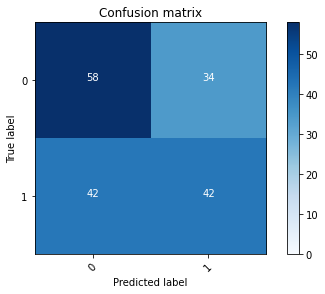

2022-08-20 23:25:24 - [Epoch Train: 59] loss: 0.0637, auc: 0.9986, acc: 0.9826, time: 50.00 s            
2022-08-20 23:25:24 - [Epoch Valid: 59] loss: 1.5555, auc: 0.5849, acc: 0.5749, time: 11.00 s


 59%|███████████████████████▌                | 59/100 [1:02:49<43:11, 63.21s/it]

2022-08-20 23:25:24 - EPOCH: 60
2022-08-20 23:25:25 - Train Step 10/979, train_loss: 0.0745
2022-08-20 23:25:25 - Train Step 20/979, train_loss: 0.1105
2022-08-20 23:25:26 - Train Step 30/979, train_loss: 0.0821
2022-08-20 23:25:26 - Train Step 40/979, train_loss: 0.0720
2022-08-20 23:25:27 - Train Step 50/979, train_loss: 0.0666
2022-08-20 23:25:27 - Train Step 60/979, train_loss: 0.0874
2022-08-20 23:25:27 - Train Step 70/979, train_loss: 0.0863
2022-08-20 23:25:28 - Train Step 80/979, train_loss: 0.0777
2022-08-20 23:25:28 - Train Step 90/979, train_loss: 0.0861
2022-08-20 23:25:29 - Train Step 100/979, train_loss: 0.0854
2022-08-20 23:25:29 - Train Step 110/979, train_loss: 0.0811
2022-08-20 23:25:30 - Train Step 120/979, train_loss: 0.0760
2022-08-20 23:25:30 - Train Step 130/979, train_loss: 0.0738
2022-08-20 23:25:31 - Train Step 140/979, train_loss: 0.0687
2022-08-20 23:25:31 - Train Step 150/979, train_loss: 0.0759
2022-08-20 23:25:32 - Train Step 160/979, train_loss: 0.0745
2

2022-08-20 23:26:16 - Valid Step 185/247, valid_loss: 1.5687
2022-08-20 23:26:16 - Valid Step 190/247, valid_loss: 1.5497
2022-08-20 23:26:17 - Valid Step 195/247, valid_loss: 1.5556
2022-08-20 23:26:17 - Valid Step 200/247, valid_loss: 1.6259
2022-08-20 23:26:17 - Valid Step 205/247, valid_loss: 1.5995
2022-08-20 23:26:17 - Valid Step 210/247, valid_loss: 1.6090
2022-08-20 23:26:17 - Valid Step 215/247, valid_loss: 1.6279
2022-08-20 23:26:18 - Valid Step 220/247, valid_loss: 1.5917
2022-08-20 23:26:18 - Valid Step 225/247, valid_loss: 1.6189
2022-08-20 23:26:18 - Valid Step 230/247, valid_loss: 1.6262
2022-08-20 23:26:18 - Valid Step 235/247, valid_loss: 1.6408
2022-08-20 23:26:18 - Valid Step 240/247, valid_loss: 1.7395
2022-08-20 23:26:19 - Valid Step 245/247, valid_loss: 1.7858
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
58      00009                0           1
22      00014                1         

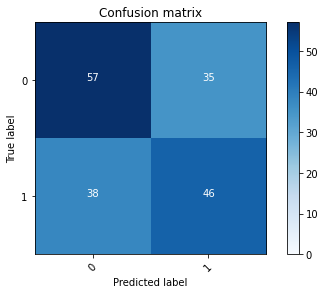

2022-08-20 23:26:19 - [Epoch Train: 60] loss: 0.0662, auc: 0.9983, acc: 0.9816, time: 43.00 s            
2022-08-20 23:26:19 - [Epoch Valid: 60] loss: 1.7721, auc: 0.5798, acc: 0.5911, time: 11.00 s


 60%|████████████████████████                | 60/100 [1:03:43<40:25, 60.65s/it]

2022-08-20 23:26:19 - EPOCH: 61
2022-08-20 23:26:20 - Train Step 10/979, train_loss: 0.0995
2022-08-20 23:26:20 - Train Step 20/979, train_loss: 0.0554
2022-08-20 23:26:20 - Train Step 30/979, train_loss: 0.0608
2022-08-20 23:26:21 - Train Step 40/979, train_loss: 0.0480
2022-08-20 23:26:21 - Train Step 50/979, train_loss: 0.0529
2022-08-20 23:26:22 - Train Step 60/979, train_loss: 0.0522
2022-08-20 23:26:22 - Train Step 70/979, train_loss: 0.0585
2022-08-20 23:26:23 - Train Step 80/979, train_loss: 0.0533
2022-08-20 23:26:23 - Train Step 90/979, train_loss: 0.0539
2022-08-20 23:26:24 - Train Step 100/979, train_loss: 0.0514
2022-08-20 23:26:24 - Train Step 110/979, train_loss: 0.0489
2022-08-20 23:26:24 - Train Step 120/979, train_loss: 0.0454
2022-08-20 23:26:25 - Train Step 130/979, train_loss: 0.0435
2022-08-20 23:26:25 - Train Step 140/979, train_loss: 0.0436
2022-08-20 23:26:26 - Train Step 150/979, train_loss: 0.0712
2022-08-20 23:26:26 - Train Step 160/979, train_loss: 0.0685
2

2022-08-20 23:27:11 - Valid Step 185/247, valid_loss: 1.6563
2022-08-20 23:27:11 - Valid Step 190/247, valid_loss: 1.6415
2022-08-20 23:27:11 - Valid Step 195/247, valid_loss: 1.6636
2022-08-20 23:27:12 - Valid Step 200/247, valid_loss: 1.6570
2022-08-20 23:27:12 - Valid Step 205/247, valid_loss: 1.6793
2022-08-20 23:27:12 - Valid Step 210/247, valid_loss: 1.6688
2022-08-20 23:27:12 - Valid Step 215/247, valid_loss: 1.7318
2022-08-20 23:27:12 - Valid Step 220/247, valid_loss: 1.7585
2022-08-20 23:27:13 - Valid Step 225/247, valid_loss: 1.7685
2022-08-20 23:27:13 - Valid Step 230/247, valid_loss: 1.7478
2022-08-20 23:27:13 - Valid Step 235/247, valid_loss: 1.7707
2022-08-20 23:27:13 - Valid Step 240/247, valid_loss: 1.7624
2022-08-20 23:27:13 - Valid Step 245/247, valid_loss: 1.7274
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
62      00009                0           1
19      00014                1         

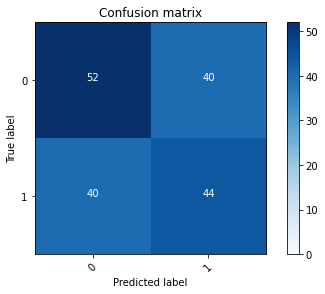

2022-08-20 23:27:14 - [Epoch Train: 61] loss: 0.0641, auc: 0.9977, acc: 0.9775, time: 43.00 s            
2022-08-20 23:27:14 - [Epoch Valid: 61] loss: 1.7180, auc: 0.5780, acc: 0.5506, time: 11.00 s


 61%|████████████████████████▍               | 61/100 [1:04:38<38:16, 58.88s/it]

2022-08-20 23:27:14 - EPOCH: 62
2022-08-20 23:27:14 - Train Step 10/979, train_loss: 0.0119
2022-08-20 23:27:15 - Train Step 20/979, train_loss: 0.0268
2022-08-20 23:27:15 - Train Step 30/979, train_loss: 0.0243
2022-08-20 23:27:16 - Train Step 40/979, train_loss: 0.0210
2022-08-20 23:27:16 - Train Step 50/979, train_loss: 0.0242
2022-08-20 23:27:17 - Train Step 60/979, train_loss: 0.0274
2022-08-20 23:27:17 - Train Step 70/979, train_loss: 0.0297
2022-08-20 23:27:17 - Train Step 80/979, train_loss: 0.0324
2022-08-20 23:27:18 - Train Step 90/979, train_loss: 0.0311
2022-08-20 23:27:18 - Train Step 100/979, train_loss: 0.0329
2022-08-20 23:27:19 - Train Step 110/979, train_loss: 0.0343
2022-08-20 23:27:19 - Train Step 120/979, train_loss: 0.0321
2022-08-20 23:27:20 - Train Step 130/979, train_loss: 0.0438
2022-08-20 23:27:20 - Train Step 140/979, train_loss: 0.0483
2022-08-20 23:27:21 - Train Step 150/979, train_loss: 0.0455
2022-08-20 23:27:21 - Train Step 160/979, train_loss: 0.0440
2

2022-08-20 23:28:06 - Valid Step 185/247, valid_loss: 1.7570
2022-08-20 23:28:06 - Valid Step 190/247, valid_loss: 1.7501
2022-08-20 23:28:06 - Valid Step 195/247, valid_loss: 1.7599
2022-08-20 23:28:06 - Valid Step 200/247, valid_loss: 1.7360
2022-08-20 23:28:07 - Valid Step 205/247, valid_loss: 1.7243
2022-08-20 23:28:07 - Valid Step 210/247, valid_loss: 1.7046
2022-08-20 23:28:07 - Valid Step 215/247, valid_loss: 1.7108
2022-08-20 23:28:07 - Valid Step 220/247, valid_loss: 1.6927
2022-08-20 23:28:07 - Valid Step 225/247, valid_loss: 1.6666
2022-08-20 23:28:08 - Valid Step 230/247, valid_loss: 1.6797
2022-08-20 23:28:08 - Valid Step 235/247, valid_loss: 1.6907
2022-08-20 23:28:08 - Valid Step 240/247, valid_loss: 1.6757
2022-08-20 23:28:08 - Valid Step 245/247, valid_loss: 1.6804
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
118     00009                0           1
32      00014                1         

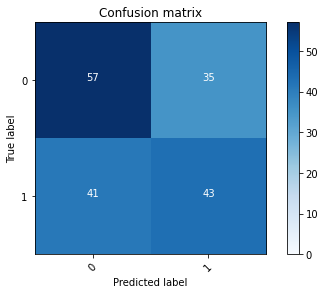

2022-08-20 23:28:09 - [Epoch Train: 62] loss: 0.0532, auc: 0.9989, acc: 0.9847, time: 43.00 s            
2022-08-20 23:28:09 - [Epoch Valid: 62] loss: 1.6669, auc: 0.5773, acc: 0.5749, time: 11.00 s


 62%|████████████████████████▊               | 62/100 [1:05:33<36:30, 57.65s/it]

2022-08-20 23:28:09 - EPOCH: 63
2022-08-20 23:28:09 - Train Step 10/979, train_loss: 0.0864
2022-08-20 23:28:10 - Train Step 20/979, train_loss: 0.0502
2022-08-20 23:28:10 - Train Step 30/979, train_loss: 0.0466
2022-08-20 23:28:10 - Train Step 40/979, train_loss: 0.0455
2022-08-20 23:28:11 - Train Step 50/979, train_loss: 0.0395
2022-08-20 23:28:11 - Train Step 60/979, train_loss: 0.0378
2022-08-20 23:28:12 - Train Step 70/979, train_loss: 0.0551
2022-08-20 23:28:12 - Train Step 80/979, train_loss: 0.0510
2022-08-20 23:28:13 - Train Step 90/979, train_loss: 0.0467
2022-08-20 23:28:13 - Train Step 100/979, train_loss: 0.0478
2022-08-20 23:28:13 - Train Step 110/979, train_loss: 0.0445
2022-08-20 23:28:14 - Train Step 120/979, train_loss: 0.0432
2022-08-20 23:28:14 - Train Step 130/979, train_loss: 0.0447
2022-08-20 23:28:15 - Train Step 140/979, train_loss: 0.0450
2022-08-20 23:28:15 - Train Step 150/979, train_loss: 0.0587
2022-08-20 23:28:16 - Train Step 160/979, train_loss: 0.0578
2

2022-08-20 23:29:00 - Valid Step 185/247, valid_loss: 2.1031
2022-08-20 23:29:01 - Valid Step 190/247, valid_loss: 2.0834
2022-08-20 23:29:01 - Valid Step 195/247, valid_loss: 2.0550
2022-08-20 23:29:01 - Valid Step 200/247, valid_loss: 2.0548
2022-08-20 23:29:01 - Valid Step 205/247, valid_loss: 2.0366
2022-08-20 23:29:02 - Valid Step 210/247, valid_loss: 2.0063
2022-08-20 23:29:02 - Valid Step 215/247, valid_loss: 2.0052
2022-08-20 23:29:02 - Valid Step 220/247, valid_loss: 1.9846
2022-08-20 23:29:02 - Valid Step 225/247, valid_loss: 1.9995
2022-08-20 23:29:02 - Valid Step 230/247, valid_loss: 1.9715
2022-08-20 23:29:03 - Valid Step 235/247, valid_loss: 1.9928
2022-08-20 23:29:03 - Valid Step 240/247, valid_loss: 1.9564
2022-08-20 23:29:03 - Valid Step 245/247, valid_loss: 1.9169
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
168     00009                0           1
134     00014                1         

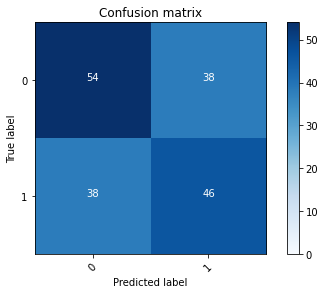

2022-08-20 23:29:03 - [Epoch Train: 63] loss: 0.0505, auc: 0.9992, acc: 0.9888, time: 43.00 s            
2022-08-20 23:29:03 - [Epoch Valid: 63] loss: 1.9117, auc: 0.5680, acc: 0.5709, time: 11.00 s


 63%|█████████████████████████▏              | 63/100 [1:06:28<35:01, 56.80s/it]

2022-08-20 23:29:03 - EPOCH: 64
2022-08-20 23:29:04 - Train Step 10/979, train_loss: 0.0160
2022-08-20 23:29:04 - Train Step 20/979, train_loss: 0.0225
2022-08-20 23:29:05 - Train Step 30/979, train_loss: 0.0162
2022-08-20 23:29:05 - Train Step 40/979, train_loss: 0.0181
2022-08-20 23:29:06 - Train Step 50/979, train_loss: 0.0214
2022-08-20 23:29:06 - Train Step 60/979, train_loss: 0.0488
2022-08-20 23:29:07 - Train Step 70/979, train_loss: 0.0580
2022-08-20 23:29:07 - Train Step 80/979, train_loss: 0.0539
2022-08-20 23:29:07 - Train Step 90/979, train_loss: 0.0502
2022-08-20 23:29:08 - Train Step 100/979, train_loss: 0.0458
2022-08-20 23:29:08 - Train Step 110/979, train_loss: 0.0438
2022-08-20 23:29:09 - Train Step 120/979, train_loss: 0.0446
2022-08-20 23:29:09 - Train Step 130/979, train_loss: 0.0434
2022-08-20 23:29:10 - Train Step 140/979, train_loss: 0.0410
2022-08-20 23:29:10 - Train Step 150/979, train_loss: 0.0395
2022-08-20 23:29:10 - Train Step 160/979, train_loss: 0.0432
2

2022-08-20 23:29:55 - Valid Step 185/247, valid_loss: 1.5483
2022-08-20 23:29:56 - Valid Step 190/247, valid_loss: 1.5748
2022-08-20 23:29:56 - Valid Step 195/247, valid_loss: 1.5728
2022-08-20 23:29:56 - Valid Step 200/247, valid_loss: 1.5904
2022-08-20 23:29:56 - Valid Step 205/247, valid_loss: 1.5639
2022-08-20 23:29:56 - Valid Step 210/247, valid_loss: 1.5895
2022-08-20 23:29:57 - Valid Step 215/247, valid_loss: 1.5842
2022-08-20 23:29:57 - Valid Step 220/247, valid_loss: 1.5960
2022-08-20 23:29:57 - Valid Step 225/247, valid_loss: 1.6230
2022-08-20 23:29:57 - Valid Step 230/247, valid_loss: 1.6514
2022-08-20 23:29:58 - Valid Step 235/247, valid_loss: 1.6320
2022-08-20 23:29:58 - Valid Step 240/247, valid_loss: 1.6134
2022-08-20 23:29:58 - Valid Step 245/247, valid_loss: 1.6201
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
93      00009                0           1
4       00014                1         

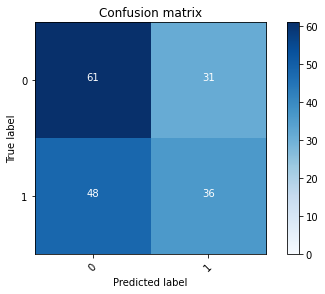

2022-08-20 23:29:58 - [Epoch Train: 64] loss: 0.0495, auc: 0.9991, acc: 0.9857, time: 43.00 s            
2022-08-20 23:29:58 - [Epoch Valid: 64] loss: 1.6079, auc: 0.5717, acc: 0.5587, time: 11.00 s


 64%|█████████████████████████▌              | 64/100 [1:07:23<33:44, 56.24s/it]

2022-08-20 23:29:58 - EPOCH: 65
2022-08-20 23:29:59 - Train Step 10/979, train_loss: 0.0642
2022-08-20 23:29:59 - Train Step 20/979, train_loss: 0.0440
2022-08-20 23:30:00 - Train Step 30/979, train_loss: 0.0475
2022-08-20 23:30:00 - Train Step 40/979, train_loss: 0.0568
2022-08-20 23:30:01 - Train Step 50/979, train_loss: 0.0529
2022-08-20 23:30:01 - Train Step 60/979, train_loss: 0.0455
2022-08-20 23:30:01 - Train Step 70/979, train_loss: 0.0479
2022-08-20 23:30:02 - Train Step 80/979, train_loss: 0.0462
2022-08-20 23:30:02 - Train Step 90/979, train_loss: 0.0425
2022-08-20 23:30:03 - Train Step 100/979, train_loss: 0.0390
2022-08-20 23:30:03 - Train Step 110/979, train_loss: 0.0370
2022-08-20 23:30:04 - Train Step 120/979, train_loss: 0.0370
2022-08-20 23:30:04 - Train Step 130/979, train_loss: 0.0359
2022-08-20 23:30:05 - Train Step 140/979, train_loss: 0.0342
2022-08-20 23:30:05 - Train Step 150/979, train_loss: 0.0322
2022-08-20 23:30:05 - Train Step 160/979, train_loss: 0.0322
2

2022-08-20 23:30:50 - Valid Step 185/247, valid_loss: 2.1891
2022-08-20 23:30:50 - Valid Step 190/247, valid_loss: 2.1632
2022-08-20 23:30:50 - Valid Step 195/247, valid_loss: 2.1683
2022-08-20 23:30:51 - Valid Step 200/247, valid_loss: 2.1631
2022-08-20 23:30:51 - Valid Step 205/247, valid_loss: 2.1430
2022-08-20 23:30:51 - Valid Step 210/247, valid_loss: 2.1134
2022-08-20 23:30:51 - Valid Step 215/247, valid_loss: 2.0730
2022-08-20 23:30:52 - Valid Step 220/247, valid_loss: 2.0554
2022-08-20 23:30:52 - Valid Step 225/247, valid_loss: 2.0758
2022-08-20 23:30:52 - Valid Step 230/247, valid_loss: 2.0442
2022-08-20 23:30:52 - Valid Step 235/247, valid_loss: 2.0704
2022-08-20 23:30:52 - Valid Step 240/247, valid_loss: 2.0438
2022-08-20 23:30:53 - Valid Step 245/247, valid_loss: 2.0493
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
163     00009                0           1
12      00014                1         

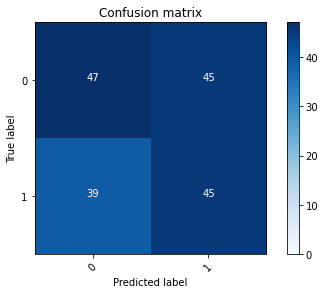

2022-08-20 23:30:53 - [Epoch Train: 65] loss: 0.0484, auc: 0.9991, acc: 0.9857, time: 43.00 s            
2022-08-20 23:30:53 - [Epoch Valid: 65] loss: 2.0389, auc: 0.5757, acc: 0.5385, time: 11.00 s


 65%|██████████████████████████              | 65/100 [1:08:17<32:31, 55.76s/it]

2022-08-20 23:30:53 - EPOCH: 66
2022-08-20 23:30:53 - Train Step 10/979, train_loss: 0.0245
2022-08-20 23:30:54 - Train Step 20/979, train_loss: 0.0345
2022-08-20 23:30:54 - Train Step 30/979, train_loss: 0.0345
2022-08-20 23:30:55 - Train Step 40/979, train_loss: 0.0283
2022-08-20 23:30:55 - Train Step 50/979, train_loss: 0.0273
2022-08-20 23:30:56 - Train Step 60/979, train_loss: 0.0359
2022-08-20 23:30:56 - Train Step 70/979, train_loss: 0.0352
2022-08-20 23:30:57 - Train Step 80/979, train_loss: 0.0546
2022-08-20 23:30:57 - Train Step 90/979, train_loss: 0.0616
2022-08-20 23:30:57 - Train Step 100/979, train_loss: 0.0626
2022-08-20 23:30:58 - Train Step 110/979, train_loss: 0.0582
2022-08-20 23:30:58 - Train Step 120/979, train_loss: 0.0548
2022-08-20 23:30:59 - Train Step 130/979, train_loss: 0.0597
2022-08-20 23:30:59 - Train Step 140/979, train_loss: 0.0568
2022-08-20 23:31:00 - Train Step 150/979, train_loss: 0.0533
2022-08-20 23:31:00 - Train Step 160/979, train_loss: 0.0527
2

2022-08-20 23:31:45 - Valid Step 185/247, valid_loss: 1.7328
2022-08-20 23:31:45 - Valid Step 190/247, valid_loss: 1.6987
2022-08-20 23:31:45 - Valid Step 195/247, valid_loss: 1.6962
2022-08-20 23:31:45 - Valid Step 200/247, valid_loss: 1.6667
2022-08-20 23:31:46 - Valid Step 205/247, valid_loss: 1.6801
2022-08-20 23:31:46 - Valid Step 210/247, valid_loss: 1.6661
2022-08-20 23:31:46 - Valid Step 215/247, valid_loss: 1.6616
2022-08-20 23:31:46 - Valid Step 220/247, valid_loss: 1.7352
2022-08-20 23:31:46 - Valid Step 225/247, valid_loss: 1.7030
2022-08-20 23:31:47 - Valid Step 230/247, valid_loss: 1.7116
2022-08-20 23:31:47 - Valid Step 235/247, valid_loss: 1.6832
2022-08-20 23:31:47 - Valid Step 240/247, valid_loss: 1.6707
2022-08-20 23:31:47 - Valid Step 245/247, valid_loss: 1.6781
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
102     00009                0           1
122     00014                1         

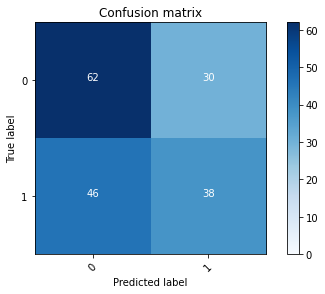

2022-08-20 23:31:48 - [Epoch Train: 66] loss: 0.0473, auc: 0.9993, acc: 0.9867, time: 43.00 s            
2022-08-20 23:31:48 - [Epoch Valid: 66] loss: 1.6808, auc: 0.5752, acc: 0.5789, time: 11.00 s


 66%|██████████████████████████▍             | 66/100 [1:09:12<31:25, 55.47s/it]

2022-08-20 23:31:48 - EPOCH: 67
2022-08-20 23:31:48 - Train Step 10/979, train_loss: 0.1248
2022-08-20 23:31:49 - Train Step 20/979, train_loss: 0.0678
2022-08-20 23:31:49 - Train Step 30/979, train_loss: 0.0458
2022-08-20 23:31:50 - Train Step 40/979, train_loss: 0.0410
2022-08-20 23:31:50 - Train Step 50/979, train_loss: 0.0393
2022-08-20 23:31:50 - Train Step 60/979, train_loss: 0.0443
2022-08-20 23:31:51 - Train Step 70/979, train_loss: 0.0413
2022-08-20 23:31:51 - Train Step 80/979, train_loss: 0.0490
2022-08-20 23:31:52 - Train Step 90/979, train_loss: 0.0441
2022-08-20 23:31:52 - Train Step 100/979, train_loss: 0.0420
2022-08-20 23:31:53 - Train Step 110/979, train_loss: 0.0407
2022-08-20 23:31:53 - Train Step 120/979, train_loss: 0.0509
2022-08-20 23:31:53 - Train Step 130/979, train_loss: 0.0488
2022-08-20 23:31:54 - Train Step 140/979, train_loss: 0.0454
2022-08-20 23:31:54 - Train Step 150/979, train_loss: 0.0428
2022-08-20 23:31:55 - Train Step 160/979, train_loss: 0.0461
2

2022-08-20 23:32:40 - Valid Step 185/247, valid_loss: 1.8874
2022-08-20 23:32:40 - Valid Step 190/247, valid_loss: 1.8665
2022-08-20 23:32:40 - Valid Step 195/247, valid_loss: 1.8572
2022-08-20 23:32:40 - Valid Step 200/247, valid_loss: 1.8522
2022-08-20 23:32:40 - Valid Step 205/247, valid_loss: 1.8446
2022-08-20 23:32:41 - Valid Step 210/247, valid_loss: 1.8253
2022-08-20 23:32:41 - Valid Step 215/247, valid_loss: 1.8244
2022-08-20 23:32:41 - Valid Step 220/247, valid_loss: 1.8074
2022-08-20 23:32:41 - Valid Step 225/247, valid_loss: 1.7958
2022-08-20 23:32:41 - Valid Step 230/247, valid_loss: 1.7807
2022-08-20 23:32:42 - Valid Step 235/247, valid_loss: 1.7765
2022-08-20 23:32:42 - Valid Step 240/247, valid_loss: 1.7733
2022-08-20 23:32:42 - Valid Step 245/247, valid_loss: 1.8077
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
17      00009                0           1
26      00014                1         

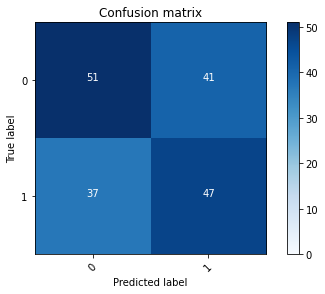

2022-08-20 23:32:42 - [Epoch Train: 67] loss: 0.0432, auc: 0.9990, acc: 0.9857, time: 43.00 s            
2022-08-20 23:32:42 - [Epoch Valid: 67] loss: 1.8508, auc: 0.5702, acc: 0.5668, time: 11.00 s


 67%|██████████████████████████▊             | 67/100 [1:10:07<30:23, 55.26s/it]

2022-08-20 23:32:42 - EPOCH: 68
2022-08-20 23:32:43 - Train Step 10/979, train_loss: 0.0092
2022-08-20 23:32:43 - Train Step 20/979, train_loss: 0.0281
2022-08-20 23:32:44 - Train Step 30/979, train_loss: 0.0193
2022-08-20 23:32:44 - Train Step 40/979, train_loss: 0.0265
2022-08-20 23:32:45 - Train Step 50/979, train_loss: 0.0553
2022-08-20 23:32:45 - Train Step 60/979, train_loss: 0.0494
2022-08-20 23:32:46 - Train Step 70/979, train_loss: 0.0548
2022-08-20 23:32:46 - Train Step 80/979, train_loss: 0.0484
2022-08-20 23:32:46 - Train Step 90/979, train_loss: 0.0440
2022-08-20 23:32:47 - Train Step 100/979, train_loss: 0.0428
2022-08-20 23:32:47 - Train Step 110/979, train_loss: 0.0403
2022-08-20 23:32:48 - Train Step 120/979, train_loss: 0.0387
2022-08-20 23:32:48 - Train Step 130/979, train_loss: 0.0436
2022-08-20 23:32:49 - Train Step 140/979, train_loss: 0.0458
2022-08-20 23:32:49 - Train Step 150/979, train_loss: 0.0479
2022-08-20 23:32:50 - Train Step 160/979, train_loss: 0.0489
2

2022-08-20 23:33:34 - Valid Step 185/247, valid_loss: 2.0347
2022-08-20 23:33:34 - Valid Step 190/247, valid_loss: 2.0249
2022-08-20 23:33:35 - Valid Step 195/247, valid_loss: 2.0776
2022-08-20 23:33:35 - Valid Step 200/247, valid_loss: 2.0923
2022-08-20 23:33:35 - Valid Step 205/247, valid_loss: 2.0494
2022-08-20 23:33:35 - Valid Step 210/247, valid_loss: 2.0573
2022-08-20 23:33:35 - Valid Step 215/247, valid_loss: 2.0814
2022-08-20 23:33:36 - Valid Step 220/247, valid_loss: 2.0836
2022-08-20 23:33:36 - Valid Step 225/247, valid_loss: 2.0747
2022-08-20 23:33:36 - Valid Step 230/247, valid_loss: 2.0855
2022-08-20 23:33:36 - Valid Step 235/247, valid_loss: 2.1147
2022-08-20 23:33:37 - Valid Step 240/247, valid_loss: 2.0838
2022-08-20 23:33:37 - Valid Step 245/247, valid_loss: 2.0782
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
80      00009                0           1
3       00014                1         

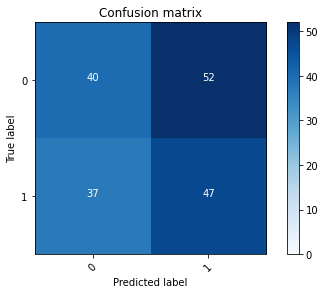

2022-08-20 23:33:37 - [Epoch Train: 68] loss: 0.0414, auc: 0.9993, acc: 0.9877, time: 43.00 s            
2022-08-20 23:33:37 - [Epoch Valid: 68] loss: 2.0897, auc: 0.5723, acc: 0.5061, time: 11.00 s


 68%|███████████████████████████▏            | 68/100 [1:11:02<29:21, 55.04s/it]

2022-08-20 23:33:37 - EPOCH: 69
2022-08-20 23:33:38 - Train Step 10/979, train_loss: 0.0801
2022-08-20 23:33:38 - Train Step 20/979, train_loss: 0.0467
2022-08-20 23:33:38 - Train Step 30/979, train_loss: 0.0374
2022-08-20 23:33:39 - Train Step 40/979, train_loss: 0.0325
2022-08-20 23:33:39 - Train Step 50/979, train_loss: 0.0415
2022-08-20 23:33:40 - Train Step 60/979, train_loss: 0.0366
2022-08-20 23:33:40 - Train Step 70/979, train_loss: 0.0325
2022-08-20 23:33:41 - Train Step 80/979, train_loss: 0.0293
2022-08-20 23:33:41 - Train Step 90/979, train_loss: 0.0284
2022-08-20 23:33:42 - Train Step 100/979, train_loss: 0.0309
2022-08-20 23:33:42 - Train Step 110/979, train_loss: 0.0305
2022-08-20 23:33:43 - Train Step 120/979, train_loss: 0.0286
2022-08-20 23:33:43 - Train Step 130/979, train_loss: 0.0346
2022-08-20 23:33:43 - Train Step 140/979, train_loss: 0.0369
2022-08-20 23:33:44 - Train Step 150/979, train_loss: 0.0391
2022-08-20 23:33:44 - Train Step 160/979, train_loss: 0.0383
2

2022-08-20 23:34:30 - Valid Step 185/247, valid_loss: 1.8525
2022-08-20 23:34:30 - Valid Step 190/247, valid_loss: 1.8264
2022-08-20 23:34:30 - Valid Step 195/247, valid_loss: 1.8897
2022-08-20 23:34:30 - Valid Step 200/247, valid_loss: 1.8653
2022-08-20 23:34:30 - Valid Step 205/247, valid_loss: 1.8422
2022-08-20 23:34:31 - Valid Step 210/247, valid_loss: 1.8272
2022-08-20 23:34:31 - Valid Step 215/247, valid_loss: 1.8439
2022-08-20 23:34:31 - Valid Step 220/247, valid_loss: 1.8082
2022-08-20 23:34:31 - Valid Step 225/247, valid_loss: 1.8084
2022-08-20 23:34:31 - Valid Step 230/247, valid_loss: 1.8691
2022-08-20 23:34:32 - Valid Step 235/247, valid_loss: 1.8893
2022-08-20 23:34:32 - Valid Step 240/247, valid_loss: 1.8577
2022-08-20 23:34:32 - Valid Step 245/247, valid_loss: 1.8399
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
22      00009                0           1
170     00014                1         

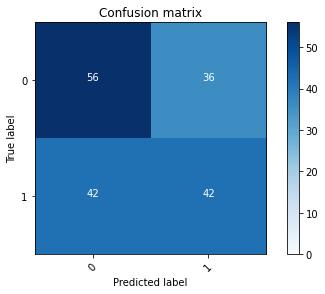

2022-08-20 23:34:32 - [Epoch Train: 69] loss: 0.0387, auc: 0.9995, acc: 0.9908, time: 44.00 s            
2022-08-20 23:34:32 - [Epoch Valid: 69] loss: 1.8589, auc: 0.5748, acc: 0.5628, time: 11.00 s


 69%|███████████████████████████▌            | 69/100 [1:11:57<28:29, 55.16s/it]

2022-08-20 23:34:32 - EPOCH: 70
2022-08-20 23:34:33 - Train Step 10/979, train_loss: 0.0080
2022-08-20 23:34:33 - Train Step 20/979, train_loss: 0.0057
2022-08-20 23:34:34 - Train Step 30/979, train_loss: 0.0122
2022-08-20 23:34:34 - Train Step 40/979, train_loss: 0.0375
2022-08-20 23:34:35 - Train Step 50/979, train_loss: 0.0391
2022-08-20 23:34:35 - Train Step 60/979, train_loss: 0.0345
2022-08-20 23:34:36 - Train Step 70/979, train_loss: 0.0297
2022-08-20 23:34:36 - Train Step 80/979, train_loss: 0.0261
2022-08-20 23:34:36 - Train Step 90/979, train_loss: 0.0252
2022-08-20 23:34:37 - Train Step 100/979, train_loss: 0.0248
2022-08-20 23:34:37 - Train Step 110/979, train_loss: 0.0237
2022-08-20 23:34:38 - Train Step 120/979, train_loss: 0.0229
2022-08-20 23:34:38 - Train Step 130/979, train_loss: 0.0301
2022-08-20 23:34:39 - Train Step 140/979, train_loss: 0.0307
2022-08-20 23:34:39 - Train Step 150/979, train_loss: 0.0288
2022-08-20 23:34:39 - Train Step 160/979, train_loss: 0.0331
2

2022-08-20 23:35:24 - Valid Step 185/247, valid_loss: 2.3649
2022-08-20 23:35:24 - Valid Step 190/247, valid_loss: 2.3600
2022-08-20 23:35:25 - Valid Step 195/247, valid_loss: 2.3022
2022-08-20 23:35:25 - Valid Step 200/247, valid_loss: 2.2646
2022-08-20 23:35:25 - Valid Step 205/247, valid_loss: 2.2267
2022-08-20 23:35:25 - Valid Step 210/247, valid_loss: 2.2196
2022-08-20 23:35:26 - Valid Step 215/247, valid_loss: 2.2399
2022-08-20 23:35:26 - Valid Step 220/247, valid_loss: 2.2234
2022-08-20 23:35:26 - Valid Step 225/247, valid_loss: 2.2087
2022-08-20 23:35:26 - Valid Step 230/247, valid_loss: 2.2826
2022-08-20 23:35:26 - Valid Step 235/247, valid_loss: 2.2620
2022-08-20 23:35:27 - Valid Step 240/247, valid_loss: 2.2290
2022-08-20 23:35:27 - Valid Step 245/247, valid_loss: 2.2722
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
111     00009                0           1
2       00014                1         

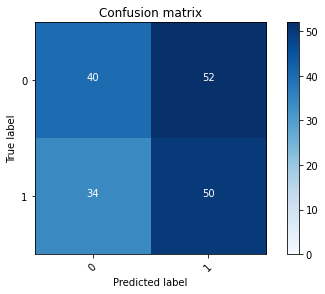

2022-08-20 23:35:27 - [Epoch Train: 70] loss: 0.0347, auc: 0.9995, acc: 0.9867, time: 43.00 s            
2022-08-20 23:35:27 - [Epoch Valid: 70] loss: 2.2647, auc: 0.5723, acc: 0.5182, time: 11.00 s


 70%|████████████████████████████            | 70/100 [1:12:52<27:30, 55.01s/it]

2022-08-20 23:35:27 - EPOCH: 71
2022-08-20 23:35:28 - Train Step 10/979, train_loss: 0.0513
2022-08-20 23:35:28 - Train Step 20/979, train_loss: 0.0325
2022-08-20 23:35:28 - Train Step 30/979, train_loss: 0.0230
2022-08-20 23:35:29 - Train Step 40/979, train_loss: 0.0231
2022-08-20 23:35:29 - Train Step 50/979, train_loss: 0.0298
2022-08-20 23:35:30 - Train Step 60/979, train_loss: 0.0398
2022-08-20 23:35:30 - Train Step 70/979, train_loss: 0.0346
2022-08-20 23:35:31 - Train Step 80/979, train_loss: 0.0309
2022-08-20 23:35:31 - Train Step 90/979, train_loss: 0.0285
2022-08-20 23:35:32 - Train Step 100/979, train_loss: 0.0309
2022-08-20 23:35:32 - Train Step 110/979, train_loss: 0.0292
2022-08-20 23:35:32 - Train Step 120/979, train_loss: 0.0281
2022-08-20 23:35:33 - Train Step 130/979, train_loss: 0.0271
2022-08-20 23:35:33 - Train Step 140/979, train_loss: 0.0266
2022-08-20 23:35:34 - Train Step 150/979, train_loss: 0.0252
2022-08-20 23:35:34 - Train Step 160/979, train_loss: 0.0244
2

2022-08-20 23:36:19 - Valid Step 185/247, valid_loss: 2.4181
2022-08-20 23:36:19 - Valid Step 190/247, valid_loss: 2.5703
2022-08-20 23:36:20 - Valid Step 195/247, valid_loss: 2.5514
2022-08-20 23:36:20 - Valid Step 200/247, valid_loss: 2.5299
2022-08-20 23:36:20 - Valid Step 205/247, valid_loss: 2.5229
2022-08-20 23:36:20 - Valid Step 210/247, valid_loss: 2.4838
2022-08-20 23:36:21 - Valid Step 215/247, valid_loss: 2.4366
2022-08-20 23:36:21 - Valid Step 220/247, valid_loss: 2.4370
2022-08-20 23:36:21 - Valid Step 225/247, valid_loss: 2.3862
2022-08-20 23:36:21 - Valid Step 230/247, valid_loss: 2.3355
2022-08-20 23:36:21 - Valid Step 235/247, valid_loss: 2.3381
2022-08-20 23:36:22 - Valid Step 240/247, valid_loss: 2.3259
2022-08-20 23:36:22 - Valid Step 245/247, valid_loss: 2.3475
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
18      00009                0           1
136     00014                1         

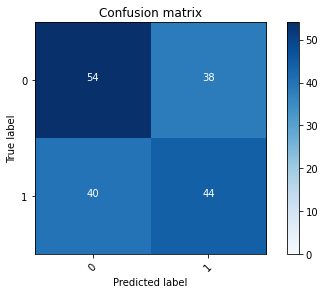

2022-08-20 23:36:22 - [Epoch Train: 71] loss: 0.0310, auc: 0.9998, acc: 0.9939, time: 43.00 s            
2022-08-20 23:36:22 - [Epoch Valid: 71] loss: 2.3300, auc: 0.5712, acc: 0.5628, time: 11.00 s


 71%|████████████████████████████▍           | 71/100 [1:13:47<26:35, 55.01s/it]

2022-08-20 23:36:22 - EPOCH: 72
2022-08-20 23:36:23 - Train Step 10/979, train_loss: 0.0956
2022-08-20 23:36:23 - Train Step 20/979, train_loss: 0.0494
2022-08-20 23:36:24 - Train Step 30/979, train_loss: 0.0366
2022-08-20 23:36:24 - Train Step 40/979, train_loss: 0.0300
2022-08-20 23:36:24 - Train Step 50/979, train_loss: 0.0403
2022-08-20 23:36:25 - Train Step 60/979, train_loss: 0.0343
2022-08-20 23:36:25 - Train Step 70/979, train_loss: 0.0385
2022-08-20 23:36:26 - Train Step 80/979, train_loss: 0.0359
2022-08-20 23:36:26 - Train Step 90/979, train_loss: 0.0454
2022-08-20 23:36:27 - Train Step 100/979, train_loss: 0.0410
2022-08-20 23:36:27 - Train Step 110/979, train_loss: 0.0389
2022-08-20 23:36:27 - Train Step 120/979, train_loss: 0.0381
2022-08-20 23:36:28 - Train Step 130/979, train_loss: 0.0436
2022-08-20 23:36:28 - Train Step 140/979, train_loss: 0.0417
2022-08-20 23:36:29 - Train Step 150/979, train_loss: 0.0397
2022-08-20 23:36:29 - Train Step 160/979, train_loss: 0.0382
2

2022-08-20 23:37:14 - Valid Step 185/247, valid_loss: 2.2531
2022-08-20 23:37:14 - Valid Step 190/247, valid_loss: 2.2246
2022-08-20 23:37:14 - Valid Step 195/247, valid_loss: 2.1852
2022-08-20 23:37:15 - Valid Step 200/247, valid_loss: 2.1545
2022-08-20 23:37:15 - Valid Step 205/247, valid_loss: 2.1478
2022-08-20 23:37:15 - Valid Step 210/247, valid_loss: 2.1027
2022-08-20 23:37:15 - Valid Step 215/247, valid_loss: 2.0645
2022-08-20 23:37:15 - Valid Step 220/247, valid_loss: 2.0967
2022-08-20 23:37:16 - Valid Step 225/247, valid_loss: 2.0658
2022-08-20 23:37:16 - Valid Step 230/247, valid_loss: 2.0224
2022-08-20 23:37:16 - Valid Step 235/247, valid_loss: 2.0591
2022-08-20 23:37:16 - Valid Step 240/247, valid_loss: 2.0360
2022-08-20 23:37:17 - Valid Step 245/247, valid_loss: 2.0124
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
84      00009                0           1
139     00014                1         

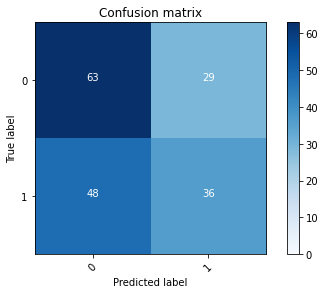

2022-08-20 23:37:17 - [Epoch Train: 72] loss: 0.0323, auc: 0.9998, acc: 0.9918, time: 43.00 s            
2022-08-20 23:37:17 - [Epoch Valid: 72] loss: 2.0456, auc: 0.5744, acc: 0.5749, time: 11.00 s


 72%|████████████████████████████▊           | 72/100 [1:14:41<25:37, 54.91s/it]

2022-08-20 23:37:17 - EPOCH: 73
2022-08-20 23:37:17 - Train Step 10/979, train_loss: 0.0235
2022-08-20 23:37:18 - Train Step 20/979, train_loss: 0.0962
2022-08-20 23:37:18 - Train Step 30/979, train_loss: 0.0727
2022-08-20 23:37:19 - Train Step 40/979, train_loss: 0.0570
2022-08-20 23:37:19 - Train Step 50/979, train_loss: 0.0932
2022-08-20 23:37:20 - Train Step 60/979, train_loss: 0.0823
2022-08-20 23:37:20 - Train Step 70/979, train_loss: 0.0796
2022-08-20 23:37:20 - Train Step 80/979, train_loss: 0.0707
2022-08-20 23:37:21 - Train Step 90/979, train_loss: 0.0661
2022-08-20 23:37:21 - Train Step 100/979, train_loss: 0.0600
2022-08-20 23:37:22 - Train Step 110/979, train_loss: 0.0558
2022-08-20 23:37:22 - Train Step 120/979, train_loss: 0.0524
2022-08-20 23:37:23 - Train Step 130/979, train_loss: 0.0551
2022-08-20 23:37:23 - Train Step 140/979, train_loss: 0.0518
2022-08-20 23:37:24 - Train Step 150/979, train_loss: 0.0495
2022-08-20 23:37:24 - Train Step 160/979, train_loss: 0.0485
2

2022-08-20 23:38:08 - Valid Step 185/247, valid_loss: 2.0780
2022-08-20 23:38:09 - Valid Step 190/247, valid_loss: 2.0445
2022-08-20 23:38:09 - Valid Step 195/247, valid_loss: 2.0781
2022-08-20 23:38:09 - Valid Step 200/247, valid_loss: 2.0915
2022-08-20 23:38:09 - Valid Step 205/247, valid_loss: 2.0597
2022-08-20 23:38:10 - Valid Step 210/247, valid_loss: 2.0667
2022-08-20 23:38:10 - Valid Step 215/247, valid_loss: 2.0567
2022-08-20 23:38:10 - Valid Step 220/247, valid_loss: 2.0910
2022-08-20 23:38:10 - Valid Step 225/247, valid_loss: 2.1516
2022-08-20 23:38:10 - Valid Step 230/247, valid_loss: 2.1536
2022-08-20 23:38:11 - Valid Step 235/247, valid_loss: 2.1129
2022-08-20 23:38:11 - Valid Step 240/247, valid_loss: 2.1454
2022-08-20 23:38:11 - Valid Step 245/247, valid_loss: 2.1048
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
147     00009                0           1
39      00014                1         

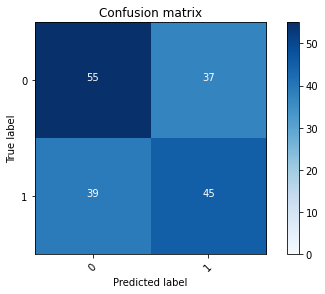

2022-08-20 23:38:11 - [Epoch Train: 73] loss: 0.0336, auc: 0.9995, acc: 0.9867, time: 43.00 s            
2022-08-20 23:38:11 - [Epoch Valid: 73] loss: 2.0897, auc: 0.5782, acc: 0.5709, time: 11.00 s


 73%|█████████████████████████████▏          | 73/100 [1:15:36<24:40, 54.82s/it]

2022-08-20 23:38:11 - EPOCH: 74
2022-08-20 23:38:12 - Train Step 10/979, train_loss: 0.0708
2022-08-20 23:38:12 - Train Step 20/979, train_loss: 0.0549
2022-08-20 23:38:13 - Train Step 30/979, train_loss: 0.0399
2022-08-20 23:38:13 - Train Step 40/979, train_loss: 0.0305
2022-08-20 23:38:14 - Train Step 50/979, train_loss: 0.0377
2022-08-20 23:38:14 - Train Step 60/979, train_loss: 0.0348
2022-08-20 23:38:15 - Train Step 70/979, train_loss: 0.0402
2022-08-20 23:38:15 - Train Step 80/979, train_loss: 0.0371
2022-08-20 23:38:15 - Train Step 90/979, train_loss: 0.0359
2022-08-20 23:38:16 - Train Step 100/979, train_loss: 0.0362
2022-08-20 23:38:16 - Train Step 110/979, train_loss: 0.0336
2022-08-20 23:38:17 - Train Step 120/979, train_loss: 0.0379
2022-08-20 23:38:17 - Train Step 130/979, train_loss: 0.0416
2022-08-20 23:38:18 - Train Step 140/979, train_loss: 0.0388
2022-08-20 23:38:18 - Train Step 150/979, train_loss: 0.0371
2022-08-20 23:38:19 - Train Step 160/979, train_loss: 0.0359
2

2022-08-20 23:39:03 - Valid Step 185/247, valid_loss: 1.9196
2022-08-20 23:39:04 - Valid Step 190/247, valid_loss: 2.0059
2022-08-20 23:39:04 - Valid Step 195/247, valid_loss: 1.9665
2022-08-20 23:39:04 - Valid Step 200/247, valid_loss: 1.9191
2022-08-20 23:39:04 - Valid Step 205/247, valid_loss: 1.9105
2022-08-20 23:39:04 - Valid Step 210/247, valid_loss: 1.9120
2022-08-20 23:39:05 - Valid Step 215/247, valid_loss: 1.9409
2022-08-20 23:39:05 - Valid Step 220/247, valid_loss: 1.9496
2022-08-20 23:39:05 - Valid Step 225/247, valid_loss: 1.9582
2022-08-20 23:39:05 - Valid Step 230/247, valid_loss: 2.0128
2022-08-20 23:39:06 - Valid Step 235/247, valid_loss: 2.1415
2022-08-20 23:39:06 - Valid Step 240/247, valid_loss: 2.1426
2022-08-20 23:39:06 - Valid Step 245/247, valid_loss: 2.1200
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
82      00009                0           1
21      00014                1         

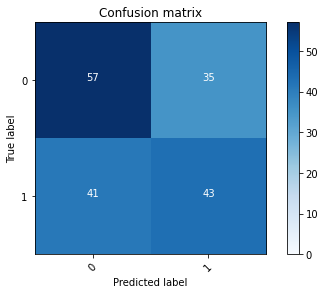

2022-08-20 23:39:06 - [Epoch Train: 74] loss: 0.0415, auc: 0.9984, acc: 0.9928, time: 43.00 s            
2022-08-20 23:39:06 - [Epoch Valid: 74] loss: 2.1239, auc: 0.5747, acc: 0.5749, time: 11.00 s


 74%|█████████████████████████████▌          | 74/100 [1:16:31<23:45, 54.82s/it]

2022-08-20 23:39:06 - EPOCH: 75
2022-08-20 23:39:07 - Train Step 10/979, train_loss: 0.0184
2022-08-20 23:39:07 - Train Step 20/979, train_loss: 0.0106
2022-08-20 23:39:08 - Train Step 30/979, train_loss: 0.0171
2022-08-20 23:39:08 - Train Step 40/979, train_loss: 0.0180
2022-08-20 23:39:08 - Train Step 50/979, train_loss: 0.0175
2022-08-20 23:39:09 - Train Step 60/979, train_loss: 0.0174
2022-08-20 23:39:09 - Train Step 70/979, train_loss: 0.0174
2022-08-20 23:39:10 - Train Step 80/979, train_loss: 0.0166
2022-08-20 23:39:10 - Train Step 90/979, train_loss: 0.0258
2022-08-20 23:39:11 - Train Step 100/979, train_loss: 0.0238
2022-08-20 23:39:11 - Train Step 110/979, train_loss: 0.0220
2022-08-20 23:39:12 - Train Step 120/979, train_loss: 0.0205
2022-08-20 23:39:12 - Train Step 130/979, train_loss: 0.0297
2022-08-20 23:39:12 - Train Step 140/979, train_loss: 0.0288
2022-08-20 23:39:13 - Train Step 150/979, train_loss: 0.0317
2022-08-20 23:39:13 - Train Step 160/979, train_loss: 0.0307
2

2022-08-20 23:39:58 - Valid Step 185/247, valid_loss: 2.1326
2022-08-20 23:39:58 - Valid Step 190/247, valid_loss: 2.1436
2022-08-20 23:39:59 - Valid Step 195/247, valid_loss: 2.2105
2022-08-20 23:39:59 - Valid Step 200/247, valid_loss: 2.1816
2022-08-20 23:39:59 - Valid Step 205/247, valid_loss: 2.2404
2022-08-20 23:39:59 - Valid Step 210/247, valid_loss: 2.2543
2022-08-20 23:39:59 - Valid Step 215/247, valid_loss: 2.2633
2022-08-20 23:40:00 - Valid Step 220/247, valid_loss: 2.2505
2022-08-20 23:40:00 - Valid Step 225/247, valid_loss: 2.2249
2022-08-20 23:40:00 - Valid Step 230/247, valid_loss: 2.2384
2022-08-20 23:40:00 - Valid Step 235/247, valid_loss: 2.2041
2022-08-20 23:40:01 - Valid Step 240/247, valid_loss: 2.2315
2022-08-20 23:40:01 - Valid Step 245/247, valid_loss: 2.2180
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
2       00009                0           1
129     00014                1         

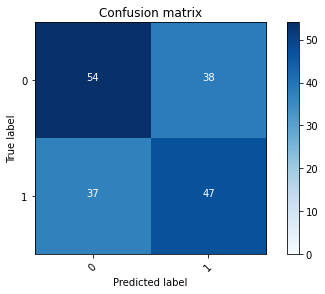

2022-08-20 23:40:01 - [Epoch Train: 75] loss: 0.0345, auc: 0.9994, acc: 0.9877, time: 43.00 s            
2022-08-20 23:40:01 - [Epoch Valid: 75] loss: 2.2392, auc: 0.5770, acc: 0.5789, time: 11.00 s


 75%|██████████████████████████████          | 75/100 [1:17:26<22:50, 54.83s/it]

2022-08-20 23:40:01 - EPOCH: 76
2022-08-20 23:40:02 - Train Step 10/979, train_loss: 0.0010
2022-08-20 23:40:02 - Train Step 20/979, train_loss: 0.0163
2022-08-20 23:40:02 - Train Step 30/979, train_loss: 0.0123
2022-08-20 23:40:03 - Train Step 40/979, train_loss: 0.0309
2022-08-20 23:40:03 - Train Step 50/979, train_loss: 0.0257
2022-08-20 23:40:04 - Train Step 60/979, train_loss: 0.0270
2022-08-20 23:40:04 - Train Step 70/979, train_loss: 0.0243
2022-08-20 23:40:05 - Train Step 80/979, train_loss: 0.0240
2022-08-20 23:40:05 - Train Step 90/979, train_loss: 0.0276
2022-08-20 23:40:06 - Train Step 100/979, train_loss: 0.0269
2022-08-20 23:40:06 - Train Step 110/979, train_loss: 0.0308
2022-08-20 23:40:06 - Train Step 120/979, train_loss: 0.0290
2022-08-20 23:40:07 - Train Step 130/979, train_loss: 0.0271
2022-08-20 23:40:07 - Train Step 140/979, train_loss: 0.0270
2022-08-20 23:40:08 - Train Step 150/979, train_loss: 0.0256
2022-08-20 23:40:08 - Train Step 160/979, train_loss: 0.0241
2

2022-08-20 23:40:53 - Valid Step 185/247, valid_loss: 2.8450
2022-08-20 23:40:53 - Valid Step 190/247, valid_loss: 2.7918
2022-08-20 23:40:53 - Valid Step 195/247, valid_loss: 2.7288
2022-08-20 23:40:53 - Valid Step 200/247, valid_loss: 2.6847
2022-08-20 23:40:54 - Valid Step 205/247, valid_loss: 2.7026
2022-08-20 23:40:54 - Valid Step 210/247, valid_loss: 2.7724
2022-08-20 23:40:54 - Valid Step 215/247, valid_loss: 2.7211
2022-08-20 23:40:54 - Valid Step 220/247, valid_loss: 2.7918
2022-08-20 23:40:54 - Valid Step 225/247, valid_loss: 2.7823
2022-08-20 23:40:55 - Valid Step 230/247, valid_loss: 2.7698
2022-08-20 23:40:55 - Valid Step 235/247, valid_loss: 2.7192
2022-08-20 23:40:55 - Valid Step 240/247, valid_loss: 2.7155
2022-08-20 23:40:55 - Valid Step 245/247, valid_loss: 2.6922
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
101     00009                0           1
75      00014                1         

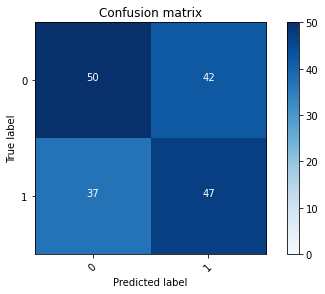

2022-08-20 23:40:56 - [Epoch Train: 76] loss: 0.0308, auc: 0.9995, acc: 0.9918, time: 43.00 s            
2022-08-20 23:40:56 - [Epoch Valid: 76] loss: 2.7146, auc: 0.5703, acc: 0.5628, time: 11.00 s


 76%|██████████████████████████████▍         | 76/100 [1:18:20<21:53, 54.73s/it]

2022-08-20 23:40:56 - EPOCH: 77
2022-08-20 23:40:56 - Train Step 10/979, train_loss: 0.0781
2022-08-20 23:40:57 - Train Step 20/979, train_loss: 0.0482
2022-08-20 23:40:57 - Train Step 30/979, train_loss: 0.0586
2022-08-20 23:40:57 - Train Step 40/979, train_loss: 0.0476
2022-08-20 23:40:58 - Train Step 50/979, train_loss: 0.1002
2022-08-20 23:40:58 - Train Step 60/979, train_loss: 0.0895
2022-08-20 23:40:59 - Train Step 70/979, train_loss: 0.1010
2022-08-20 23:40:59 - Train Step 80/979, train_loss: 0.0889
2022-08-20 23:41:00 - Train Step 90/979, train_loss: 0.0802
2022-08-20 23:41:00 - Train Step 100/979, train_loss: 0.0736
2022-08-20 23:41:01 - Train Step 110/979, train_loss: 0.0674
2022-08-20 23:41:01 - Train Step 120/979, train_loss: 0.0625
2022-08-20 23:41:01 - Train Step 130/979, train_loss: 0.0692
2022-08-20 23:41:02 - Train Step 140/979, train_loss: 0.0653
2022-08-20 23:41:02 - Train Step 150/979, train_loss: 0.0633
2022-08-20 23:41:03 - Train Step 160/979, train_loss: 0.0638
2

2022-08-20 23:41:47 - Valid Step 185/247, valid_loss: 2.8076
2022-08-20 23:41:48 - Valid Step 190/247, valid_loss: 2.7463
2022-08-20 23:41:48 - Valid Step 195/247, valid_loss: 2.6953
2022-08-20 23:41:48 - Valid Step 200/247, valid_loss: 2.6834
2022-08-20 23:41:48 - Valid Step 205/247, valid_loss: 2.6399
2022-08-20 23:41:48 - Valid Step 210/247, valid_loss: 2.5941
2022-08-20 23:41:49 - Valid Step 215/247, valid_loss: 2.6359
2022-08-20 23:41:49 - Valid Step 220/247, valid_loss: 2.6257
2022-08-20 23:41:49 - Valid Step 225/247, valid_loss: 2.5814
2022-08-20 23:41:49 - Valid Step 230/247, valid_loss: 2.5748
2022-08-20 23:41:50 - Valid Step 235/247, valid_loss: 2.6037
2022-08-20 23:41:50 - Valid Step 240/247, valid_loss: 2.5593
2022-08-20 23:41:50 - Valid Step 245/247, valid_loss: 2.5272
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
71      00009                0           1
55      00014                1         

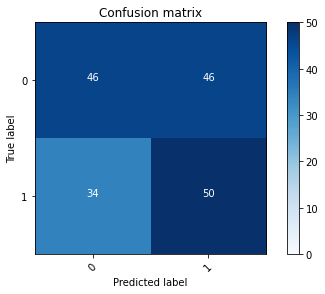

2022-08-20 23:41:50 - [Epoch Train: 77] loss: 0.0327, auc: 0.9995, acc: 0.9877, time: 43.00 s            
2022-08-20 23:41:50 - [Epoch Valid: 77] loss: 2.5086, auc: 0.5757, acc: 0.5547, time: 11.00 s


 77%|██████████████████████████████▊         | 77/100 [1:19:15<20:58, 54.72s/it]

2022-08-20 23:41:50 - EPOCH: 78
2022-08-20 23:41:51 - Train Step 10/979, train_loss: 0.0013
2022-08-20 23:41:51 - Train Step 20/979, train_loss: 0.0009
2022-08-20 23:41:52 - Train Step 30/979, train_loss: 0.0078
2022-08-20 23:41:52 - Train Step 40/979, train_loss: 0.0098
2022-08-20 23:41:53 - Train Step 50/979, train_loss: 0.0088
2022-08-20 23:41:53 - Train Step 60/979, train_loss: 0.0104
2022-08-20 23:41:53 - Train Step 70/979, train_loss: 0.0097
2022-08-20 23:41:54 - Train Step 80/979, train_loss: 0.0111
2022-08-20 23:41:54 - Train Step 90/979, train_loss: 0.0099
2022-08-20 23:41:55 - Train Step 100/979, train_loss: 0.0090
2022-08-20 23:41:55 - Train Step 110/979, train_loss: 0.0107
2022-08-20 23:41:56 - Train Step 120/979, train_loss: 0.0110
2022-08-20 23:41:56 - Train Step 130/979, train_loss: 0.0175
2022-08-20 23:41:56 - Train Step 140/979, train_loss: 0.0167
2022-08-20 23:41:57 - Train Step 150/979, train_loss: 0.0162
2022-08-20 23:41:57 - Train Step 160/979, train_loss: 0.0160
2

2022-08-20 23:42:42 - Valid Step 185/247, valid_loss: 2.7841
2022-08-20 23:42:42 - Valid Step 190/247, valid_loss: 2.7984
2022-08-20 23:42:42 - Valid Step 195/247, valid_loss: 2.8920
2022-08-20 23:42:42 - Valid Step 200/247, valid_loss: 2.8251
2022-08-20 23:42:43 - Valid Step 205/247, valid_loss: 2.8091
2022-08-20 23:42:43 - Valid Step 210/247, valid_loss: 2.7991
2022-08-20 23:42:43 - Valid Step 215/247, valid_loss: 2.7685
2022-08-20 23:42:43 - Valid Step 220/247, valid_loss: 2.7085
2022-08-20 23:42:43 - Valid Step 225/247, valid_loss: 2.6880
2022-08-20 23:42:44 - Valid Step 230/247, valid_loss: 2.6518
2022-08-20 23:42:44 - Valid Step 235/247, valid_loss: 2.6086
2022-08-20 23:42:44 - Valid Step 240/247, valid_loss: 2.6157
2022-08-20 23:42:44 - Valid Step 245/247, valid_loss: 2.6609
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
137     00009                0           1
171     00014                1         

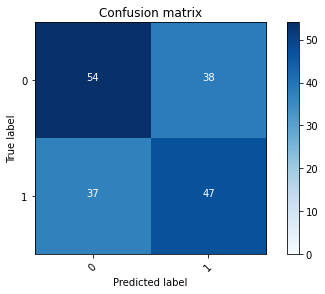

2022-08-20 23:42:45 - [Epoch Train: 78] loss: 0.0321, auc: 0.9996, acc: 0.9918, time: 43.00 s            
2022-08-20 23:42:45 - [Epoch Valid: 78] loss: 2.6675, auc: 0.5625, acc: 0.5789, time: 11.00 s


 78%|███████████████████████████████▏        | 78/100 [1:20:09<20:01, 54.61s/it]

2022-08-20 23:42:45 - EPOCH: 79
2022-08-20 23:42:45 - Train Step 10/979, train_loss: 0.0071
2022-08-20 23:42:46 - Train Step 20/979, train_loss: 0.0058
2022-08-20 23:42:46 - Train Step 30/979, train_loss: 0.0115
2022-08-20 23:42:46 - Train Step 40/979, train_loss: 0.0126
2022-08-20 23:42:47 - Train Step 50/979, train_loss: 0.0176
2022-08-20 23:42:47 - Train Step 60/979, train_loss: 0.0149
2022-08-20 23:42:48 - Train Step 70/979, train_loss: 0.0139
2022-08-20 23:42:48 - Train Step 80/979, train_loss: 0.0217
2022-08-20 23:42:49 - Train Step 90/979, train_loss: 0.0267
2022-08-20 23:42:49 - Train Step 100/979, train_loss: 0.0241
2022-08-20 23:42:50 - Train Step 110/979, train_loss: 0.0293
2022-08-20 23:42:50 - Train Step 120/979, train_loss: 0.0409
2022-08-20 23:42:50 - Train Step 130/979, train_loss: 0.0469
2022-08-20 23:42:51 - Train Step 140/979, train_loss: 0.0445
2022-08-20 23:42:51 - Train Step 150/979, train_loss: 0.0421
2022-08-20 23:42:52 - Train Step 160/979, train_loss: 0.0422
2

2022-08-20 23:43:36 - Valid Step 185/247, valid_loss: 2.3108
2022-08-20 23:43:36 - Valid Step 190/247, valid_loss: 2.3517
2022-08-20 23:43:37 - Valid Step 195/247, valid_loss: 2.4328
2022-08-20 23:43:37 - Valid Step 200/247, valid_loss: 2.3917
2022-08-20 23:43:37 - Valid Step 205/247, valid_loss: 2.3533
2022-08-20 23:43:37 - Valid Step 210/247, valid_loss: 2.3589
2022-08-20 23:43:37 - Valid Step 215/247, valid_loss: 2.3605
2022-08-20 23:43:38 - Valid Step 220/247, valid_loss: 2.3347
2022-08-20 23:43:38 - Valid Step 225/247, valid_loss: 2.3489
2022-08-20 23:43:38 - Valid Step 230/247, valid_loss: 2.3542
2022-08-20 23:43:38 - Valid Step 235/247, valid_loss: 2.3279
2022-08-20 23:43:38 - Valid Step 240/247, valid_loss: 2.2836
2022-08-20 23:43:39 - Valid Step 245/247, valid_loss: 2.2723
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
45      00009                0           1
71      00014                1         

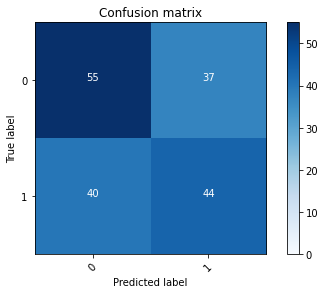

2022-08-20 23:43:39 - [Epoch Train: 79] loss: 0.0378, auc: 0.9992, acc: 0.9867, time: 43.00 s            
2022-08-20 23:43:39 - [Epoch Valid: 79] loss: 2.2597, auc: 0.5696, acc: 0.5668, time: 11.00 s


 79%|███████████████████████████████▌        | 79/100 [1:21:03<19:05, 54.53s/it]

2022-08-20 23:43:39 - EPOCH: 80
2022-08-20 23:43:39 - Train Step 10/979, train_loss: 0.0238
2022-08-20 23:43:40 - Train Step 20/979, train_loss: 0.0572
2022-08-20 23:43:40 - Train Step 30/979, train_loss: 0.0488
2022-08-20 23:43:41 - Train Step 40/979, train_loss: 0.0382
2022-08-20 23:43:41 - Train Step 50/979, train_loss: 0.0334
2022-08-20 23:43:42 - Train Step 60/979, train_loss: 0.0317
2022-08-20 23:43:42 - Train Step 70/979, train_loss: 0.0282
2022-08-20 23:43:43 - Train Step 80/979, train_loss: 0.0257
2022-08-20 23:43:43 - Train Step 90/979, train_loss: 0.0246
2022-08-20 23:43:43 - Train Step 100/979, train_loss: 0.0257
2022-08-20 23:43:44 - Train Step 110/979, train_loss: 0.0239
2022-08-20 23:43:44 - Train Step 120/979, train_loss: 0.0251
2022-08-20 23:43:45 - Train Step 130/979, train_loss: 0.0242
2022-08-20 23:43:45 - Train Step 140/979, train_loss: 0.0247
2022-08-20 23:43:46 - Train Step 150/979, train_loss: 0.0235
2022-08-20 23:43:46 - Train Step 160/979, train_loss: 0.0224
2

2022-08-20 23:44:44 - Valid Step 185/247, valid_loss: 1.8801
2022-08-20 23:44:44 - Valid Step 190/247, valid_loss: 1.9262
2022-08-20 23:44:44 - Valid Step 195/247, valid_loss: 1.9801
2022-08-20 23:44:45 - Valid Step 200/247, valid_loss: 2.0518
2022-08-20 23:44:45 - Valid Step 205/247, valid_loss: 2.0707
2022-08-20 23:44:45 - Valid Step 210/247, valid_loss: 2.0224
2022-08-20 23:44:45 - Valid Step 215/247, valid_loss: 2.0326
2022-08-20 23:44:46 - Valid Step 220/247, valid_loss: 1.9907
2022-08-20 23:44:46 - Valid Step 225/247, valid_loss: 1.9510
2022-08-20 23:44:46 - Valid Step 230/247, valid_loss: 1.9570
2022-08-20 23:44:47 - Valid Step 235/247, valid_loss: 1.9738
2022-08-20 23:44:47 - Valid Step 240/247, valid_loss: 2.0139
2022-08-20 23:44:47 - Valid Step 245/247, valid_loss: 2.0265
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
47      00009                0           1
110     00014                1         

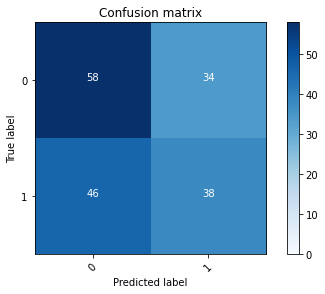

2022-08-20 23:44:47 - [Epoch Train: 80] loss: 0.0229, auc: 0.9999, acc: 0.9959, time: 53.00 s            
2022-08-20 23:44:47 - [Epoch Valid: 80] loss: 2.0102, auc: 0.5718, acc: 0.5506, time: 15.00 s


 80%|████████████████████████████████        | 80/100 [1:22:12<19:34, 58.71s/it]

2022-08-20 23:44:47 - EPOCH: 81
2022-08-20 23:44:48 - Train Step 10/979, train_loss: 0.0035
2022-08-20 23:44:49 - Train Step 20/979, train_loss: 0.0021
2022-08-20 23:44:49 - Train Step 30/979, train_loss: 0.0079
2022-08-20 23:44:50 - Train Step 40/979, train_loss: 0.0074
2022-08-20 23:44:50 - Train Step 50/979, train_loss: 0.0060
2022-08-20 23:44:51 - Train Step 60/979, train_loss: 0.0079
2022-08-20 23:44:52 - Train Step 70/979, train_loss: 0.0081
2022-08-20 23:44:52 - Train Step 80/979, train_loss: 0.0095
2022-08-20 23:44:53 - Train Step 90/979, train_loss: 0.0085
2022-08-20 23:44:53 - Train Step 100/979, train_loss: 0.0079
2022-08-20 23:44:54 - Train Step 110/979, train_loss: 0.0093
2022-08-20 23:44:54 - Train Step 120/979, train_loss: 0.0152
2022-08-20 23:44:55 - Train Step 130/979, train_loss: 0.0157
2022-08-20 23:44:56 - Train Step 140/979, train_loss: 0.0158
2022-08-20 23:44:56 - Train Step 150/979, train_loss: 0.0151
2022-08-20 23:44:57 - Train Step 160/979, train_loss: 0.0209
2

2022-08-20 23:45:57 - Valid Step 185/247, valid_loss: 2.6564
2022-08-20 23:45:58 - Valid Step 190/247, valid_loss: 2.5931
2022-08-20 23:45:58 - Valid Step 195/247, valid_loss: 2.6608
2022-08-20 23:45:59 - Valid Step 200/247, valid_loss: 2.6299
2022-08-20 23:45:59 - Valid Step 205/247, valid_loss: 2.6439
2022-08-20 23:45:59 - Valid Step 210/247, valid_loss: 2.6344
2022-08-20 23:45:59 - Valid Step 215/247, valid_loss: 2.6271
2022-08-20 23:46:00 - Valid Step 220/247, valid_loss: 2.6352
2022-08-20 23:46:00 - Valid Step 225/247, valid_loss: 2.5981
2022-08-20 23:46:01 - Valid Step 230/247, valid_loss: 2.5519
2022-08-20 23:46:01 - Valid Step 235/247, valid_loss: 2.5222
2022-08-20 23:46:01 - Valid Step 240/247, valid_loss: 2.5302
2022-08-20 23:46:01 - Valid Step 245/247, valid_loss: 2.6366
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
37      00009                0           1
158     00014                1         

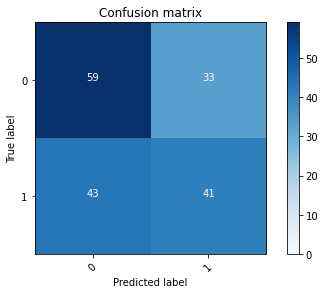

2022-08-20 23:46:02 - [Epoch Train: 81] loss: 0.0195, auc: 0.9998, acc: 0.9959, time: 58.00 s            
2022-08-20 23:46:02 - [Epoch Valid: 81] loss: 2.6158, auc: 0.5710, acc: 0.5749, time: 16.00 s


 81%|████████████████████████████████▍       | 81/100 [1:23:26<20:04, 63.39s/it]

2022-08-20 23:46:02 - EPOCH: 82
2022-08-20 23:46:03 - Train Step 10/979, train_loss: 0.0091
2022-08-20 23:46:03 - Train Step 20/979, train_loss: 0.0057
2022-08-20 23:46:04 - Train Step 30/979, train_loss: 0.0057
2022-08-20 23:46:04 - Train Step 40/979, train_loss: 0.0071
2022-08-20 23:46:05 - Train Step 50/979, train_loss: 0.0065
2022-08-20 23:46:05 - Train Step 60/979, train_loss: 0.0062
2022-08-20 23:46:06 - Train Step 70/979, train_loss: 0.0058
2022-08-20 23:46:07 - Train Step 80/979, train_loss: 0.0052
2022-08-20 23:46:07 - Train Step 90/979, train_loss: 0.0062
2022-08-20 23:46:08 - Train Step 100/979, train_loss: 0.0057
2022-08-20 23:46:08 - Train Step 110/979, train_loss: 0.0075
2022-08-20 23:46:09 - Train Step 120/979, train_loss: 0.0127
2022-08-20 23:46:10 - Train Step 130/979, train_loss: 0.0127
2022-08-20 23:46:10 - Train Step 140/979, train_loss: 0.0161
2022-08-20 23:46:11 - Train Step 150/979, train_loss: 0.0189
2022-08-20 23:46:11 - Train Step 160/979, train_loss: 0.0182
2

2022-08-20 23:47:12 - Valid Step 185/247, valid_loss: 2.6635
2022-08-20 23:47:12 - Valid Step 190/247, valid_loss: 2.6558
2022-08-20 23:47:12 - Valid Step 195/247, valid_loss: 2.7599
2022-08-20 23:47:13 - Valid Step 200/247, valid_loss: 2.8077
2022-08-20 23:47:13 - Valid Step 205/247, valid_loss: 2.7960
2022-08-20 23:47:13 - Valid Step 210/247, valid_loss: 2.7316
2022-08-20 23:47:13 - Valid Step 215/247, valid_loss: 2.7436
2022-08-20 23:47:14 - Valid Step 220/247, valid_loss: 2.7204
2022-08-20 23:47:14 - Valid Step 225/247, valid_loss: 2.7059
2022-08-20 23:47:14 - Valid Step 230/247, valid_loss: 2.6700
2022-08-20 23:47:15 - Valid Step 235/247, valid_loss: 2.7091
2022-08-20 23:47:15 - Valid Step 240/247, valid_loss: 2.6530
2022-08-20 23:47:15 - Valid Step 245/247, valid_loss: 2.6022
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
29      00009                0           1
170     00014                1         

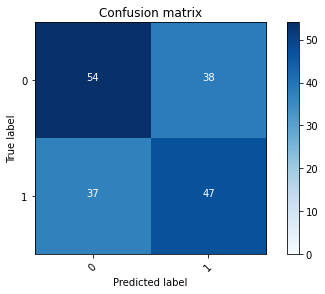

2022-08-20 23:47:16 - [Epoch Train: 82] loss: 0.0259, auc: 0.9997, acc: 0.9888, time: 58.00 s            
2022-08-20 23:47:16 - [Epoch Valid: 82] loss: 2.6154, auc: 0.5708, acc: 0.5789, time: 14.00 s


 82%|████████████████████████████████▊       | 82/100 [1:24:40<19:57, 66.52s/it]

2022-08-20 23:47:16 - EPOCH: 83
2022-08-20 23:47:16 - Train Step 10/979, train_loss: 0.0012
2022-08-20 23:47:17 - Train Step 20/979, train_loss: 0.0141
2022-08-20 23:47:17 - Train Step 30/979, train_loss: 0.0119
2022-08-20 23:47:18 - Train Step 40/979, train_loss: 0.0173
2022-08-20 23:47:19 - Train Step 50/979, train_loss: 0.0147
2022-08-20 23:47:19 - Train Step 60/979, train_loss: 0.0170
2022-08-20 23:47:20 - Train Step 70/979, train_loss: 0.0162
2022-08-20 23:47:20 - Train Step 80/979, train_loss: 0.0145
2022-08-20 23:47:21 - Train Step 90/979, train_loss: 0.0178
2022-08-20 23:47:22 - Train Step 100/979, train_loss: 0.0161
2022-08-20 23:47:22 - Train Step 110/979, train_loss: 0.0146
2022-08-20 23:47:23 - Train Step 120/979, train_loss: 0.0136
2022-08-20 23:47:23 - Train Step 130/979, train_loss: 0.0146
2022-08-20 23:47:24 - Train Step 140/979, train_loss: 0.0177
2022-08-20 23:47:24 - Train Step 150/979, train_loss: 0.0177
2022-08-20 23:47:25 - Train Step 160/979, train_loss: 0.0191
2

2022-08-20 23:48:26 - Valid Step 185/247, valid_loss: 2.7405
2022-08-20 23:48:26 - Valid Step 190/247, valid_loss: 2.7553
2022-08-20 23:48:27 - Valid Step 195/247, valid_loss: 2.7822
2022-08-20 23:48:27 - Valid Step 200/247, valid_loss: 2.7347
2022-08-20 23:48:27 - Valid Step 205/247, valid_loss: 2.6687
2022-08-20 23:48:27 - Valid Step 210/247, valid_loss: 2.6094
2022-08-20 23:48:28 - Valid Step 215/247, valid_loss: 2.6108
2022-08-20 23:48:28 - Valid Step 220/247, valid_loss: 2.5735
2022-08-20 23:48:28 - Valid Step 225/247, valid_loss: 2.5627
2022-08-20 23:48:28 - Valid Step 230/247, valid_loss: 2.5999
2022-08-20 23:48:29 - Valid Step 235/247, valid_loss: 2.5845
2022-08-20 23:48:29 - Valid Step 240/247, valid_loss: 2.5753
2022-08-20 23:48:29 - Valid Step 245/247, valid_loss: 2.5758
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
95      00009                0           1
55      00014                1         

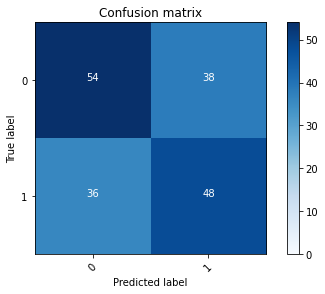

2022-08-20 23:48:30 - [Epoch Train: 83] loss: 0.0250, auc: 0.9998, acc: 0.9908, time: 59.00 s            
2022-08-20 23:48:30 - [Epoch Valid: 83] loss: 2.5621, auc: 0.5677, acc: 0.5830, time: 14.00 s


 83%|█████████████████████████████████▏      | 83/100 [1:25:54<19:29, 68.82s/it]

2022-08-20 23:48:30 - EPOCH: 84
2022-08-20 23:48:31 - Train Step 10/979, train_loss: 0.0021
2022-08-20 23:48:31 - Train Step 20/979, train_loss: 0.0075
2022-08-20 23:48:32 - Train Step 30/979, train_loss: 0.0072
2022-08-20 23:48:32 - Train Step 40/979, train_loss: 0.0163
2022-08-20 23:48:33 - Train Step 50/979, train_loss: 0.0146
2022-08-20 23:48:34 - Train Step 60/979, train_loss: 0.0130
2022-08-20 23:48:34 - Train Step 70/979, train_loss: 0.0211
2022-08-20 23:48:35 - Train Step 80/979, train_loss: 0.0281
2022-08-20 23:48:35 - Train Step 90/979, train_loss: 0.0261
2022-08-20 23:48:36 - Train Step 100/979, train_loss: 0.0237
2022-08-20 23:48:36 - Train Step 110/979, train_loss: 0.0229
2022-08-20 23:48:37 - Train Step 120/979, train_loss: 0.0212
2022-08-20 23:48:37 - Train Step 130/979, train_loss: 0.0198
2022-08-20 23:48:38 - Train Step 140/979, train_loss: 0.0189
2022-08-20 23:48:39 - Train Step 150/979, train_loss: 0.0180
2022-08-20 23:48:39 - Train Step 160/979, train_loss: 0.0172
2

2022-08-20 23:49:40 - Valid Step 185/247, valid_loss: 3.4144
2022-08-20 23:49:40 - Valid Step 190/247, valid_loss: 3.3856
2022-08-20 23:49:41 - Valid Step 195/247, valid_loss: 3.3509
2022-08-20 23:49:41 - Valid Step 200/247, valid_loss: 3.3450
2022-08-20 23:49:41 - Valid Step 205/247, valid_loss: 3.2643
2022-08-20 23:49:42 - Valid Step 210/247, valid_loss: 3.2951
2022-08-20 23:49:42 - Valid Step 215/247, valid_loss: 3.2378
2022-08-20 23:49:42 - Valid Step 220/247, valid_loss: 3.1892
2022-08-20 23:49:43 - Valid Step 225/247, valid_loss: 3.1431
2022-08-20 23:49:43 - Valid Step 230/247, valid_loss: 3.1034
2022-08-20 23:49:43 - Valid Step 235/247, valid_loss: 3.0721
2022-08-20 23:49:43 - Valid Step 240/247, valid_loss: 3.0237
2022-08-20 23:49:44 - Valid Step 245/247, valid_loss: 3.0341
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
90      00009                0           1
80      00014                1         

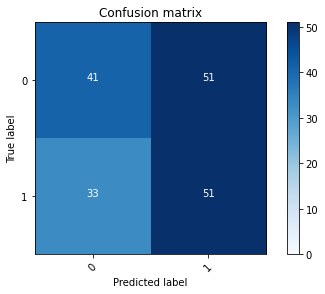

2022-08-20 23:49:44 - [Epoch Train: 84] loss: 0.0198, auc: 0.9998, acc: 0.9939, time: 58.00 s            
2022-08-20 23:49:44 - [Epoch Valid: 84] loss: 3.0284, auc: 0.5713, acc: 0.5344, time: 16.00 s


 84%|█████████████████████████████████▌      | 84/100 [1:27:09<18:48, 70.53s/it]

2022-08-20 23:49:44 - EPOCH: 85
2022-08-20 23:49:45 - Train Step 10/979, train_loss: 0.0075
2022-08-20 23:49:46 - Train Step 20/979, train_loss: 0.0056
2022-08-20 23:49:46 - Train Step 30/979, train_loss: 0.0085
2022-08-20 23:49:47 - Train Step 40/979, train_loss: 0.0069
2022-08-20 23:49:48 - Train Step 50/979, train_loss: 0.0057
2022-08-20 23:49:48 - Train Step 60/979, train_loss: 0.0048
2022-08-20 23:49:49 - Train Step 70/979, train_loss: 0.0043
2022-08-20 23:49:49 - Train Step 80/979, train_loss: 0.0048
2022-08-20 23:49:50 - Train Step 90/979, train_loss: 0.0052
2022-08-20 23:49:51 - Train Step 100/979, train_loss: 0.0056
2022-08-20 23:49:51 - Train Step 110/979, train_loss: 0.0065
2022-08-20 23:49:52 - Train Step 120/979, train_loss: 0.0113
2022-08-20 23:49:52 - Train Step 130/979, train_loss: 0.0108
2022-08-20 23:49:53 - Train Step 140/979, train_loss: 0.0102
2022-08-20 23:49:54 - Train Step 150/979, train_loss: 0.0107
2022-08-20 23:49:54 - Train Step 160/979, train_loss: 0.0103
2

2022-08-20 23:50:54 - Valid Step 185/247, valid_loss: 2.3786
2022-08-20 23:50:54 - Valid Step 190/247, valid_loss: 2.5090
2022-08-20 23:50:55 - Valid Step 195/247, valid_loss: 2.4754
2022-08-20 23:50:55 - Valid Step 200/247, valid_loss: 2.4205
2022-08-20 23:50:55 - Valid Step 205/247, valid_loss: 2.3875
2022-08-20 23:50:55 - Valid Step 210/247, valid_loss: 2.3844
2022-08-20 23:50:56 - Valid Step 215/247, valid_loss: 2.3573
2022-08-20 23:50:56 - Valid Step 220/247, valid_loss: 2.3972
2022-08-20 23:50:56 - Valid Step 225/247, valid_loss: 2.4033
2022-08-20 23:50:57 - Valid Step 230/247, valid_loss: 2.4446
2022-08-20 23:50:57 - Valid Step 235/247, valid_loss: 2.4238
2022-08-20 23:50:57 - Valid Step 240/247, valid_loss: 2.4275
2022-08-20 23:50:57 - Valid Step 245/247, valid_loss: 2.4508
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
94      00009                0           1
162     00014                1         

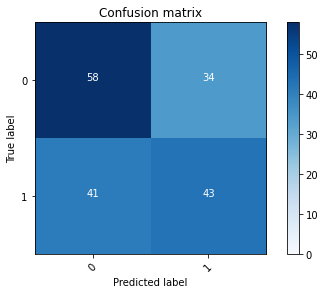

2022-08-20 23:50:58 - [Epoch Train: 85] loss: 0.0202, auc: 0.9999, acc: 0.9928, time: 58.00 s            
2022-08-20 23:50:58 - [Epoch Valid: 85] loss: 2.4369, auc: 0.5745, acc: 0.5789, time: 14.00 s


 85%|██████████████████████████████████      | 85/100 [1:28:22<17:51, 71.43s/it]

2022-08-20 23:50:58 - EPOCH: 86
2022-08-20 23:50:59 - Train Step 10/979, train_loss: 0.0026
2022-08-20 23:50:59 - Train Step 20/979, train_loss: 0.0495
2022-08-20 23:51:00 - Train Step 30/979, train_loss: 0.0390
2022-08-20 23:51:00 - Train Step 40/979, train_loss: 0.0344
2022-08-20 23:51:01 - Train Step 50/979, train_loss: 0.0293
2022-08-20 23:51:02 - Train Step 60/979, train_loss: 0.0442
2022-08-20 23:51:02 - Train Step 70/979, train_loss: 0.0386
2022-08-20 23:51:03 - Train Step 80/979, train_loss: 0.0348
2022-08-20 23:51:03 - Train Step 90/979, train_loss: 0.0335
2022-08-20 23:51:04 - Train Step 100/979, train_loss: 0.0327
2022-08-20 23:51:05 - Train Step 110/979, train_loss: 0.0298
2022-08-20 23:51:05 - Train Step 120/979, train_loss: 0.0365
2022-08-20 23:51:06 - Train Step 130/979, train_loss: 0.0346
2022-08-20 23:51:06 - Train Step 140/979, train_loss: 0.0323
2022-08-20 23:51:07 - Train Step 150/979, train_loss: 0.0353
2022-08-20 23:51:07 - Train Step 160/979, train_loss: 0.0335
2

2022-08-20 23:52:04 - Valid Step 185/247, valid_loss: 3.1276
2022-08-20 23:52:04 - Valid Step 190/247, valid_loss: 3.0759
2022-08-20 23:52:05 - Valid Step 195/247, valid_loss: 3.0847
2022-08-20 23:52:05 - Valid Step 200/247, valid_loss: 3.0587
2022-08-20 23:52:05 - Valid Step 205/247, valid_loss: 3.1212
2022-08-20 23:52:06 - Valid Step 210/247, valid_loss: 3.1386
2022-08-20 23:52:06 - Valid Step 215/247, valid_loss: 3.1206
2022-08-20 23:52:06 - Valid Step 220/247, valid_loss: 3.1559
2022-08-20 23:52:06 - Valid Step 225/247, valid_loss: 3.2054
2022-08-20 23:52:07 - Valid Step 230/247, valid_loss: 3.2326
2022-08-20 23:52:07 - Valid Step 235/247, valid_loss: 3.2486
2022-08-20 23:52:07 - Valid Step 240/247, valid_loss: 3.1818
2022-08-20 23:52:08 - Valid Step 245/247, valid_loss: 3.1400
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
166     00009                0           1
145     00014                1         

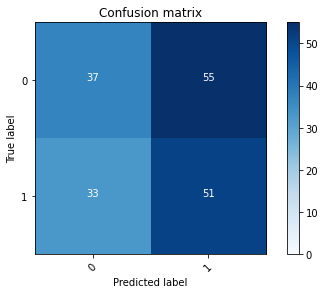

2022-08-20 23:52:08 - [Epoch Train: 86] loss: 0.0226, auc: 0.9998, acc: 0.9908, time: 54.00 s            
2022-08-20 23:52:08 - [Epoch Valid: 86] loss: 3.1147, auc: 0.5719, acc: 0.5061, time: 15.00 s


 86%|██████████████████████████████████▍     | 86/100 [1:29:33<16:34, 71.07s/it]

2022-08-20 23:52:08 - EPOCH: 87
2022-08-20 23:52:09 - Train Step 10/979, train_loss: 0.0013
2022-08-20 23:52:09 - Train Step 20/979, train_loss: 0.0018
2022-08-20 23:52:10 - Train Step 30/979, train_loss: 0.0098
2022-08-20 23:52:11 - Train Step 40/979, train_loss: 0.0095
2022-08-20 23:52:11 - Train Step 50/979, train_loss: 0.0094
2022-08-20 23:52:12 - Train Step 60/979, train_loss: 0.0082
2022-08-20 23:52:12 - Train Step 70/979, train_loss: 0.0186
2022-08-20 23:52:13 - Train Step 80/979, train_loss: 0.0169
2022-08-20 23:52:13 - Train Step 90/979, train_loss: 0.0180
2022-08-20 23:52:14 - Train Step 100/979, train_loss: 0.0195
2022-08-20 23:52:15 - Train Step 110/979, train_loss: 0.0280
2022-08-20 23:52:15 - Train Step 120/979, train_loss: 0.0267
2022-08-20 23:52:16 - Train Step 130/979, train_loss: 0.0263
2022-08-20 23:52:16 - Train Step 140/979, train_loss: 0.0256
2022-08-20 23:52:17 - Train Step 150/979, train_loss: 0.0249
2022-08-20 23:52:17 - Train Step 160/979, train_loss: 0.0274
2

2022-08-20 23:53:16 - Valid Step 185/247, valid_loss: 2.5731
2022-08-20 23:53:16 - Valid Step 190/247, valid_loss: 2.5849
2022-08-20 23:53:17 - Valid Step 195/247, valid_loss: 2.5704
2022-08-20 23:53:17 - Valid Step 200/247, valid_loss: 2.5450
2022-08-20 23:53:17 - Valid Step 205/247, valid_loss: 2.5100
2022-08-20 23:53:18 - Valid Step 210/247, valid_loss: 2.5338
2022-08-20 23:53:18 - Valid Step 215/247, valid_loss: 2.5493
2022-08-20 23:53:18 - Valid Step 220/247, valid_loss: 2.5487
2022-08-20 23:53:18 - Valid Step 225/247, valid_loss: 2.4922
2022-08-20 23:53:19 - Valid Step 230/247, valid_loss: 2.5032
2022-08-20 23:53:19 - Valid Step 235/247, valid_loss: 2.5393
2022-08-20 23:53:19 - Valid Step 240/247, valid_loss: 2.5048
2022-08-20 23:53:20 - Valid Step 245/247, valid_loss: 2.5346
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
130     00009                0           1
17      00014                1         

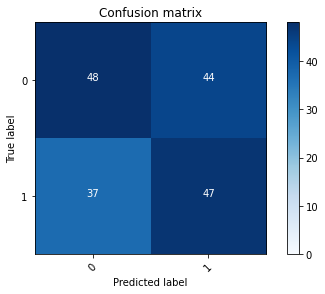

2022-08-20 23:53:20 - [Epoch Train: 87] loss: 0.0255, auc: 0.9988, acc: 0.9918, time: 57.00 s            
2022-08-20 23:53:20 - [Epoch Valid: 87] loss: 2.5177, auc: 0.5718, acc: 0.5506, time: 14.00 s


 87%|██████████████████████████████████▊     | 87/100 [1:30:45<15:27, 71.34s/it]

2022-08-20 23:53:20 - EPOCH: 88
2022-08-20 23:53:21 - Train Step 10/979, train_loss: 0.0767
2022-08-20 23:53:21 - Train Step 20/979, train_loss: 0.0461
2022-08-20 23:53:22 - Train Step 30/979, train_loss: 0.0600
2022-08-20 23:53:23 - Train Step 40/979, train_loss: 0.0453
2022-08-20 23:53:23 - Train Step 50/979, train_loss: 0.0371
2022-08-20 23:53:24 - Train Step 60/979, train_loss: 0.0319
2022-08-20 23:53:24 - Train Step 70/979, train_loss: 0.0293
2022-08-20 23:53:25 - Train Step 80/979, train_loss: 0.0284
2022-08-20 23:53:26 - Train Step 90/979, train_loss: 0.0253
2022-08-20 23:53:26 - Train Step 100/979, train_loss: 0.0233
2022-08-20 23:53:27 - Train Step 110/979, train_loss: 0.0225
2022-08-20 23:53:27 - Train Step 120/979, train_loss: 0.0209
2022-08-20 23:53:28 - Train Step 130/979, train_loss: 0.0207
2022-08-20 23:53:29 - Train Step 140/979, train_loss: 0.0195
2022-08-20 23:53:29 - Train Step 150/979, train_loss: 0.0183
2022-08-20 23:53:30 - Train Step 160/979, train_loss: 0.0200
2

2022-08-20 23:54:30 - Valid Step 185/247, valid_loss: 2.7369
2022-08-20 23:54:30 - Valid Step 190/247, valid_loss: 2.7124
2022-08-20 23:54:31 - Valid Step 195/247, valid_loss: 2.7046
2022-08-20 23:54:31 - Valid Step 200/247, valid_loss: 2.6630
2022-08-20 23:54:31 - Valid Step 205/247, valid_loss: 2.6501
2022-08-20 23:54:32 - Valid Step 210/247, valid_loss: 2.6638
2022-08-20 23:54:32 - Valid Step 215/247, valid_loss: 2.6021
2022-08-20 23:54:32 - Valid Step 220/247, valid_loss: 2.6082
2022-08-20 23:54:32 - Valid Step 225/247, valid_loss: 2.5604
2022-08-20 23:54:33 - Valid Step 230/247, valid_loss: 2.5934
2022-08-20 23:54:33 - Valid Step 235/247, valid_loss: 2.6058
2022-08-20 23:54:33 - Valid Step 240/247, valid_loss: 2.5879
2022-08-20 23:54:34 - Valid Step 245/247, valid_loss: 2.6449
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
161     00009                0           1
138     00014                1         

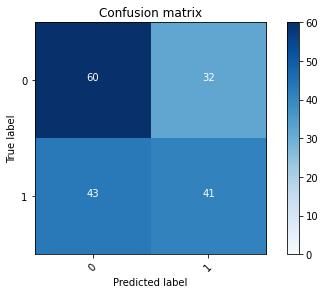

2022-08-20 23:54:34 - [Epoch Train: 88] loss: 0.0190, auc: 0.9999, acc: 0.9949, time: 59.00 s            
2022-08-20 23:54:34 - [Epoch Valid: 88] loss: 2.6749, auc: 0.5716, acc: 0.5830, time: 15.00 s


 88%|███████████████████████████████████▏    | 88/100 [1:31:59<14:25, 72.15s/it]

2022-08-20 23:54:34 - EPOCH: 89
2022-08-20 23:54:35 - Train Step 10/979, train_loss: 0.0006
2022-08-20 23:54:36 - Train Step 20/979, train_loss: 0.0052
2022-08-20 23:54:36 - Train Step 30/979, train_loss: 0.0037
2022-08-20 23:54:37 - Train Step 40/979, train_loss: 0.0035
2022-08-20 23:54:37 - Train Step 50/979, train_loss: 0.0030
2022-08-20 23:54:38 - Train Step 60/979, train_loss: 0.0035
2022-08-20 23:54:38 - Train Step 70/979, train_loss: 0.0035
2022-08-20 23:54:39 - Train Step 80/979, train_loss: 0.0036
2022-08-20 23:54:40 - Train Step 90/979, train_loss: 0.0033
2022-08-20 23:54:40 - Train Step 100/979, train_loss: 0.0038
2022-08-20 23:54:41 - Train Step 110/979, train_loss: 0.0035
2022-08-20 23:54:42 - Train Step 120/979, train_loss: 0.0034
2022-08-20 23:54:42 - Train Step 130/979, train_loss: 0.0032
2022-08-20 23:54:43 - Train Step 140/979, train_loss: 0.0092
2022-08-20 23:54:44 - Train Step 150/979, train_loss: 0.0096
2022-08-20 23:54:44 - Train Step 160/979, train_loss: 0.0098
2

2022-08-20 23:55:46 - Valid Step 185/247, valid_loss: 2.7771
2022-08-20 23:55:46 - Valid Step 190/247, valid_loss: 2.7285
2022-08-20 23:55:46 - Valid Step 195/247, valid_loss: 2.7435
2022-08-20 23:55:46 - Valid Step 200/247, valid_loss: 2.7384
2022-08-20 23:55:47 - Valid Step 205/247, valid_loss: 2.7278
2022-08-20 23:55:47 - Valid Step 210/247, valid_loss: 2.7878
2022-08-20 23:55:47 - Valid Step 215/247, valid_loss: 2.8268
2022-08-20 23:55:48 - Valid Step 220/247, valid_loss: 2.8007
2022-08-20 23:55:48 - Valid Step 225/247, valid_loss: 2.8179
2022-08-20 23:55:48 - Valid Step 230/247, valid_loss: 2.7841
2022-08-20 23:55:49 - Valid Step 235/247, valid_loss: 2.8098
2022-08-20 23:55:49 - Valid Step 240/247, valid_loss: 2.7893
2022-08-20 23:55:49 - Valid Step 245/247, valid_loss: 2.8153
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
159     00009                0           1
50      00014                1         

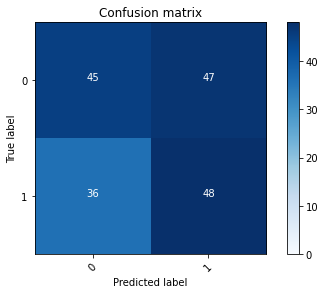

2022-08-20 23:55:49 - [Epoch Train: 89] loss: 0.0182, auc: 0.9998, acc: 0.9939, time: 60.00 s            
2022-08-20 23:55:49 - [Epoch Valid: 89] loss: 2.8537, auc: 0.5703, acc: 0.5263, time: 15.00 s


 89%|███████████████████████████████████▌    | 89/100 [1:33:14<13:24, 73.15s/it]

2022-08-20 23:55:49 - EPOCH: 90
2022-08-20 23:55:50 - Train Step 10/979, train_loss: 0.0055
2022-08-20 23:55:51 - Train Step 20/979, train_loss: 0.0040
2022-08-20 23:55:51 - Train Step 30/979, train_loss: 0.0033
2022-08-20 23:55:52 - Train Step 40/979, train_loss: 0.0025
2022-08-20 23:55:53 - Train Step 50/979, train_loss: 0.0104
2022-08-20 23:55:53 - Train Step 60/979, train_loss: 0.0099
2022-08-20 23:55:54 - Train Step 70/979, train_loss: 0.0111
2022-08-20 23:55:55 - Train Step 80/979, train_loss: 0.0100
2022-08-20 23:55:55 - Train Step 90/979, train_loss: 0.0103
2022-08-20 23:55:56 - Train Step 100/979, train_loss: 0.0095
2022-08-20 23:55:56 - Train Step 110/979, train_loss: 0.0091
2022-08-20 23:55:57 - Train Step 120/979, train_loss: 0.0102
2022-08-20 23:55:57 - Train Step 130/979, train_loss: 0.0096
2022-08-20 23:55:58 - Train Step 140/979, train_loss: 0.0097
2022-08-20 23:55:59 - Train Step 150/979, train_loss: 0.0092
2022-08-20 23:55:59 - Train Step 160/979, train_loss: 0.0088
2

2022-08-20 23:57:02 - Valid Step 185/247, valid_loss: 2.7837
2022-08-20 23:57:02 - Valid Step 190/247, valid_loss: 2.7438
2022-08-20 23:57:03 - Valid Step 195/247, valid_loss: 2.7434
2022-08-20 23:57:03 - Valid Step 200/247, valid_loss: 2.7095
2022-08-20 23:57:03 - Valid Step 205/247, valid_loss: 2.7925
2022-08-20 23:57:03 - Valid Step 210/247, valid_loss: 2.7344
2022-08-20 23:57:04 - Valid Step 215/247, valid_loss: 2.7328
2022-08-20 23:57:04 - Valid Step 220/247, valid_loss: 2.6940
2022-08-20 23:57:04 - Valid Step 225/247, valid_loss: 2.6446
2022-08-20 23:57:05 - Valid Step 230/247, valid_loss: 2.6367
2022-08-20 23:57:05 - Valid Step 235/247, valid_loss: 2.6456
2022-08-20 23:57:05 - Valid Step 240/247, valid_loss: 2.6310
2022-08-20 23:57:06 - Valid Step 245/247, valid_loss: 2.6647
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
128     00009                0           0
95      00014                1         

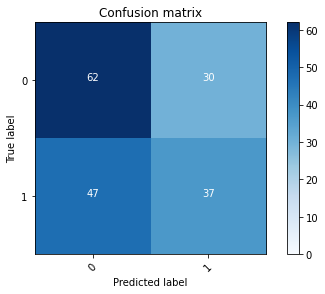

2022-08-20 23:57:06 - [Epoch Train: 90] loss: 0.0154, auc: 0.9999, acc: 0.9959, time: 61.00 s            
2022-08-20 23:57:06 - [Epoch Valid: 90] loss: 2.6509, auc: 0.5761, acc: 0.5587, time: 15.00 s


 90%|████████████████████████████████████    | 90/100 [1:34:30<12:21, 74.12s/it]

2022-08-20 23:57:06 - EPOCH: 91
2022-08-20 23:57:07 - Train Step 10/979, train_loss: 0.0076
2022-08-20 23:57:07 - Train Step 20/979, train_loss: 0.0047
2022-08-20 23:57:08 - Train Step 30/979, train_loss: 0.0033
2022-08-20 23:57:08 - Train Step 40/979, train_loss: 0.0054
2022-08-20 23:57:09 - Train Step 50/979, train_loss: 0.0063
2022-08-20 23:57:10 - Train Step 60/979, train_loss: 0.0054
2022-08-20 23:57:10 - Train Step 70/979, train_loss: 0.0052
2022-08-20 23:57:11 - Train Step 80/979, train_loss: 0.0111
2022-08-20 23:57:11 - Train Step 90/979, train_loss: 0.0102
2022-08-20 23:57:12 - Train Step 100/979, train_loss: 0.0098
2022-08-20 23:57:12 - Train Step 110/979, train_loss: 0.0090
2022-08-20 23:57:13 - Train Step 120/979, train_loss: 0.0110
2022-08-20 23:57:14 - Train Step 130/979, train_loss: 0.0102
2022-08-20 23:57:14 - Train Step 140/979, train_loss: 0.0196
2022-08-20 23:57:15 - Train Step 150/979, train_loss: 0.0184
2022-08-20 23:57:15 - Train Step 160/979, train_loss: 0.0175
2

2022-08-20 23:58:15 - Valid Step 185/247, valid_loss: 3.3724
2022-08-20 23:58:15 - Valid Step 190/247, valid_loss: 3.3993
2022-08-20 23:58:15 - Valid Step 195/247, valid_loss: 3.3955
2022-08-20 23:58:16 - Valid Step 200/247, valid_loss: 3.3992
2022-08-20 23:58:16 - Valid Step 205/247, valid_loss: 3.3228
2022-08-20 23:58:16 - Valid Step 210/247, valid_loss: 3.3379
2022-08-20 23:58:16 - Valid Step 215/247, valid_loss: 3.3796
2022-08-20 23:58:17 - Valid Step 220/247, valid_loss: 3.3883
2022-08-20 23:58:17 - Valid Step 225/247, valid_loss: 3.3520
2022-08-20 23:58:17 - Valid Step 230/247, valid_loss: 3.2867
2022-08-20 23:58:18 - Valid Step 235/247, valid_loss: 3.2858
2022-08-20 23:58:18 - Valid Step 240/247, valid_loss: 3.2801
2022-08-20 23:58:18 - Valid Step 245/247, valid_loss: 3.2470
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
148     00009                0           1
172     00014                1         

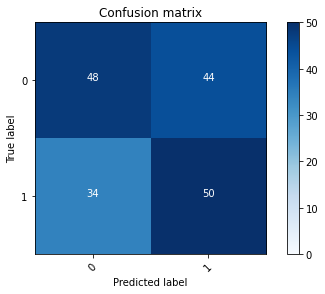

2022-08-20 23:58:19 - [Epoch Train: 91] loss: 0.0181, auc: 0.9999, acc: 0.9949, time: 57.00 s            
2022-08-20 23:58:19 - [Epoch Valid: 91] loss: 3.2211, auc: 0.5788, acc: 0.5506, time: 15.00 s


 91%|████████████████████████████████████▍   | 91/100 [1:35:43<11:03, 73.73s/it]

2022-08-20 23:58:19 - EPOCH: 92
2022-08-20 23:58:19 - Train Step 10/979, train_loss: 0.0032
2022-08-20 23:58:20 - Train Step 20/979, train_loss: 0.0018
2022-08-20 23:58:21 - Train Step 30/979, train_loss: 0.0012
2022-08-20 23:58:21 - Train Step 40/979, train_loss: 0.0017
2022-08-20 23:58:22 - Train Step 50/979, train_loss: 0.0018
2022-08-20 23:58:22 - Train Step 60/979, train_loss: 0.0018
2022-08-20 23:58:23 - Train Step 70/979, train_loss: 0.0202
2022-08-20 23:58:24 - Train Step 80/979, train_loss: 0.0196
2022-08-20 23:58:24 - Train Step 90/979, train_loss: 0.0175
2022-08-20 23:58:25 - Train Step 100/979, train_loss: 0.0164
2022-08-20 23:58:25 - Train Step 110/979, train_loss: 0.0161
2022-08-20 23:58:26 - Train Step 120/979, train_loss: 0.0150
2022-08-20 23:58:26 - Train Step 130/979, train_loss: 0.0142
2022-08-20 23:58:27 - Train Step 140/979, train_loss: 0.0154
2022-08-20 23:58:28 - Train Step 150/979, train_loss: 0.0157
2022-08-20 23:58:28 - Train Step 160/979, train_loss: 0.0210
2

2022-08-20 23:59:25 - Valid Step 185/247, valid_loss: 2.6873
2022-08-20 23:59:25 - Valid Step 190/247, valid_loss: 2.7821
2022-08-20 23:59:25 - Valid Step 195/247, valid_loss: 2.7294
2022-08-20 23:59:26 - Valid Step 200/247, valid_loss: 2.7475
2022-08-20 23:59:26 - Valid Step 205/247, valid_loss: 2.7600
2022-08-20 23:59:26 - Valid Step 210/247, valid_loss: 2.7360
2022-08-20 23:59:27 - Valid Step 215/247, valid_loss: 2.7241
2022-08-20 23:59:27 - Valid Step 220/247, valid_loss: 2.6751
2022-08-20 23:59:27 - Valid Step 225/247, valid_loss: 2.6164
2022-08-20 23:59:27 - Valid Step 230/247, valid_loss: 2.6711
2022-08-20 23:59:28 - Valid Step 235/247, valid_loss: 2.6159
2022-08-20 23:59:28 - Valid Step 240/247, valid_loss: 2.6602
2022-08-20 23:59:28 - Valid Step 245/247, valid_loss: 2.6511
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
90      00009                0           1
152     00014                1         

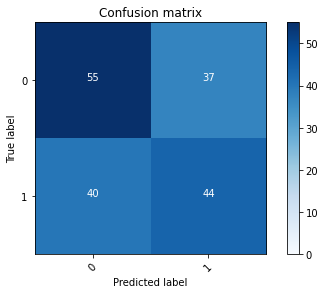

2022-08-20 23:59:29 - [Epoch Train: 92] loss: 0.0149, auc: 0.9999, acc: 0.9949, time: 55.00 s            
2022-08-20 23:59:29 - [Epoch Valid: 92] loss: 2.7564, auc: 0.5795, acc: 0.5547, time: 14.00 s


 92%|████████████████████████████████████▊   | 92/100 [1:36:53<09:40, 72.60s/it]

2022-08-20 23:59:29 - EPOCH: 93
2022-08-20 23:59:29 - Train Step 10/979, train_loss: 0.0055
2022-08-20 23:59:30 - Train Step 20/979, train_loss: 0.0174
2022-08-20 23:59:31 - Train Step 30/979, train_loss: 0.0117
2022-08-20 23:59:31 - Train Step 40/979, train_loss: 0.0159
2022-08-20 23:59:32 - Train Step 50/979, train_loss: 0.0128
2022-08-20 23:59:32 - Train Step 60/979, train_loss: 0.0171
2022-08-20 23:59:33 - Train Step 70/979, train_loss: 0.0149
2022-08-20 23:59:33 - Train Step 80/979, train_loss: 0.0140
2022-08-20 23:59:34 - Train Step 90/979, train_loss: 0.0212
2022-08-20 23:59:35 - Train Step 100/979, train_loss: 0.0192
2022-08-20 23:59:35 - Train Step 110/979, train_loss: 0.0174
2022-08-20 23:59:36 - Train Step 120/979, train_loss: 0.0181
2022-08-20 23:59:36 - Train Step 130/979, train_loss: 0.0183
2022-08-20 23:59:37 - Train Step 140/979, train_loss: 0.0172
2022-08-20 23:59:38 - Train Step 150/979, train_loss: 0.0162
2022-08-20 23:59:38 - Train Step 160/979, train_loss: 0.0152
2

2022-08-21 00:00:39 - Valid Step 185/247, valid_loss: 2.7415
2022-08-21 00:00:39 - Valid Step 190/247, valid_loss: 2.7395
2022-08-21 00:00:40 - Valid Step 195/247, valid_loss: 2.6832
2022-08-21 00:00:40 - Valid Step 200/247, valid_loss: 2.6783
2022-08-21 00:00:40 - Valid Step 205/247, valid_loss: 2.6659
2022-08-21 00:00:41 - Valid Step 210/247, valid_loss: 2.6583
2022-08-21 00:00:41 - Valid Step 215/247, valid_loss: 2.6261
2022-08-21 00:00:41 - Valid Step 220/247, valid_loss: 2.6153
2022-08-21 00:00:42 - Valid Step 225/247, valid_loss: 2.5904
2022-08-21 00:00:42 - Valid Step 230/247, valid_loss: 2.5626
2022-08-21 00:00:42 - Valid Step 235/247, valid_loss: 2.5760
2022-08-21 00:00:42 - Valid Step 240/247, valid_loss: 2.6272
2022-08-21 00:00:43 - Valid Step 245/247, valid_loss: 2.5737
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
12      00009                0           1
132     00014                1         

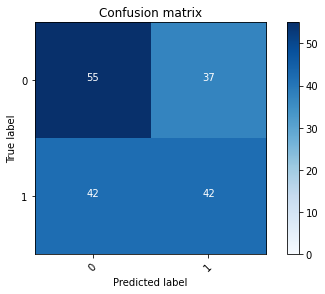

2022-08-21 00:00:43 - [Epoch Train: 93] loss: 0.0223, auc: 0.9998, acc: 0.9908, time: 59.00 s            
2022-08-21 00:00:43 - [Epoch Valid: 93] loss: 2.5528, auc: 0.5703, acc: 0.5466, time: 15.00 s


 93%|█████████████████████████████████████▏  | 93/100 [1:38:08<08:32, 73.18s/it]

2022-08-21 00:00:43 - EPOCH: 94
2022-08-21 00:00:44 - Train Step 10/979, train_loss: 0.0009
2022-08-21 00:00:45 - Train Step 20/979, train_loss: 0.0525
2022-08-21 00:00:45 - Train Step 30/979, train_loss: 0.0362
2022-08-21 00:00:46 - Train Step 40/979, train_loss: 0.0316
2022-08-21 00:00:46 - Train Step 50/979, train_loss: 0.0281
2022-08-21 00:00:47 - Train Step 60/979, train_loss: 0.0246
2022-08-21 00:00:48 - Train Step 70/979, train_loss: 0.0325
2022-08-21 00:00:48 - Train Step 80/979, train_loss: 0.0327
2022-08-21 00:00:49 - Train Step 90/979, train_loss: 0.0311
2022-08-21 00:00:50 - Train Step 100/979, train_loss: 0.0280
2022-08-21 00:00:50 - Train Step 110/979, train_loss: 0.0257
2022-08-21 00:00:51 - Train Step 120/979, train_loss: 0.0260
2022-08-21 00:00:51 - Train Step 130/979, train_loss: 0.0244
2022-08-21 00:00:52 - Train Step 140/979, train_loss: 0.0229
2022-08-21 00:00:53 - Train Step 150/979, train_loss: 0.0214
2022-08-21 00:00:53 - Train Step 160/979, train_loss: 0.0204
2

2022-08-21 00:01:53 - Valid Step 185/247, valid_loss: 2.4326
2022-08-21 00:01:53 - Valid Step 190/247, valid_loss: 2.4123
2022-08-21 00:01:53 - Valid Step 195/247, valid_loss: 2.4549
2022-08-21 00:01:54 - Valid Step 200/247, valid_loss: 2.4426
2022-08-21 00:01:54 - Valid Step 205/247, valid_loss: 2.4151
2022-08-21 00:01:54 - Valid Step 210/247, valid_loss: 2.4396
2022-08-21 00:01:55 - Valid Step 215/247, valid_loss: 2.4597
2022-08-21 00:01:55 - Valid Step 220/247, valid_loss: 2.4149
2022-08-21 00:01:55 - Valid Step 225/247, valid_loss: 2.3886
2022-08-21 00:01:56 - Valid Step 230/247, valid_loss: 2.4747
2022-08-21 00:01:56 - Valid Step 235/247, valid_loss: 2.4776
2022-08-21 00:01:56 - Valid Step 240/247, valid_loss: 2.4444
2022-08-21 00:01:56 - Valid Step 245/247, valid_loss: 2.4376
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
138     00009                0           1
90      00014                1         

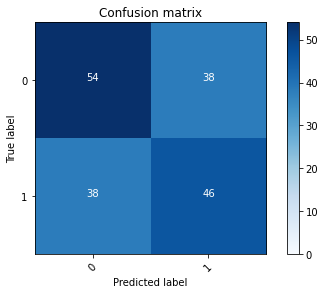

2022-08-21 00:01:57 - [Epoch Train: 94] loss: 0.0172, auc: 0.9998, acc: 0.9928, time: 58.00 s            
2022-08-21 00:01:57 - [Epoch Valid: 94] loss: 2.4557, auc: 0.5760, acc: 0.5709, time: 15.00 s


 94%|█████████████████████████████████████▌  | 94/100 [1:39:21<07:19, 73.28s/it]

2022-08-21 00:01:57 - EPOCH: 95
2022-08-21 00:01:57 - Train Step 10/979, train_loss: 0.0221
2022-08-21 00:01:58 - Train Step 20/979, train_loss: 0.0125
2022-08-21 00:01:59 - Train Step 30/979, train_loss: 0.0476
2022-08-21 00:01:59 - Train Step 40/979, train_loss: 0.0368
2022-08-21 00:02:00 - Train Step 50/979, train_loss: 0.0296
2022-08-21 00:02:00 - Train Step 60/979, train_loss: 0.0274
2022-08-21 00:02:01 - Train Step 70/979, train_loss: 0.0241
2022-08-21 00:02:02 - Train Step 80/979, train_loss: 0.0216
2022-08-21 00:02:02 - Train Step 90/979, train_loss: 0.0198
2022-08-21 00:02:03 - Train Step 100/979, train_loss: 0.0179
2022-08-21 00:02:03 - Train Step 110/979, train_loss: 0.0165
2022-08-21 00:02:04 - Train Step 120/979, train_loss: 0.0157
2022-08-21 00:02:05 - Train Step 130/979, train_loss: 0.0165
2022-08-21 00:02:05 - Train Step 140/979, train_loss: 0.0167
2022-08-21 00:02:06 - Train Step 150/979, train_loss: 0.0173
2022-08-21 00:02:06 - Train Step 160/979, train_loss: 0.0163
2

2022-08-21 00:03:05 - Valid Step 185/247, valid_loss: 3.0318
2022-08-21 00:03:05 - Valid Step 190/247, valid_loss: 3.0073
2022-08-21 00:03:05 - Valid Step 195/247, valid_loss: 3.1619
2022-08-21 00:03:05 - Valid Step 200/247, valid_loss: 3.0836
2022-08-21 00:03:06 - Valid Step 205/247, valid_loss: 3.0671
2022-08-21 00:03:06 - Valid Step 210/247, valid_loss: 2.9992
2022-08-21 00:03:06 - Valid Step 215/247, valid_loss: 2.9509
2022-08-21 00:03:07 - Valid Step 220/247, valid_loss: 2.8920
2022-08-21 00:03:07 - Valid Step 225/247, valid_loss: 2.8678
2022-08-21 00:03:07 - Valid Step 230/247, valid_loss: 2.8707
2022-08-21 00:03:07 - Valid Step 235/247, valid_loss: 2.8104
2022-08-21 00:03:08 - Valid Step 240/247, valid_loss: 2.7525
2022-08-21 00:03:08 - Valid Step 245/247, valid_loss: 2.7400
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
82      00009                0           1
171     00014                1         

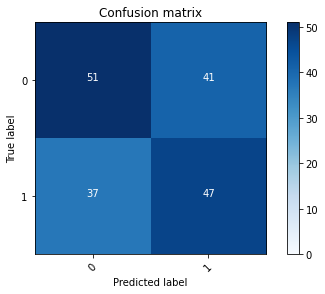

2022-08-21 00:03:08 - [Epoch Train: 95] loss: 0.0200, auc: 0.9998, acc: 0.9918, time: 57.00 s            
2022-08-21 00:03:08 - [Epoch Valid: 95] loss: 2.7213, auc: 0.5773, acc: 0.5628, time: 14.00 s


 95%|██████████████████████████████████████  | 95/100 [1:40:33<06:03, 72.75s/it]

2022-08-21 00:03:08 - EPOCH: 96
2022-08-21 00:03:09 - Train Step 10/979, train_loss: 0.0069
2022-08-21 00:03:10 - Train Step 20/979, train_loss: 0.0372
2022-08-21 00:03:10 - Train Step 30/979, train_loss: 0.0260
2022-08-21 00:03:11 - Train Step 40/979, train_loss: 0.0204
2022-08-21 00:03:11 - Train Step 50/979, train_loss: 0.0172
2022-08-21 00:03:12 - Train Step 60/979, train_loss: 0.0144
2022-08-21 00:03:12 - Train Step 70/979, train_loss: 0.0124
2022-08-21 00:03:13 - Train Step 80/979, train_loss: 0.0117
2022-08-21 00:03:14 - Train Step 90/979, train_loss: 0.0105
2022-08-21 00:03:14 - Train Step 100/979, train_loss: 0.0095
2022-08-21 00:03:15 - Train Step 110/979, train_loss: 0.0091
2022-08-21 00:03:15 - Train Step 120/979, train_loss: 0.0085
2022-08-21 00:03:16 - Train Step 130/979, train_loss: 0.0078
2022-08-21 00:03:17 - Train Step 140/979, train_loss: 0.0078
2022-08-21 00:03:17 - Train Step 150/979, train_loss: 0.0073
2022-08-21 00:03:18 - Train Step 160/979, train_loss: 0.0072
2

2022-08-21 00:04:18 - Valid Step 185/247, valid_loss: 2.9186
2022-08-21 00:04:19 - Valid Step 190/247, valid_loss: 3.0829
2022-08-21 00:04:19 - Valid Step 195/247, valid_loss: 3.0974
2022-08-21 00:04:19 - Valid Step 200/247, valid_loss: 3.0690
2022-08-21 00:04:20 - Valid Step 205/247, valid_loss: 3.0812
2022-08-21 00:04:20 - Valid Step 210/247, valid_loss: 3.0727
2022-08-21 00:04:20 - Valid Step 215/247, valid_loss: 3.0788
2022-08-21 00:04:20 - Valid Step 220/247, valid_loss: 3.1266
2022-08-21 00:04:21 - Valid Step 225/247, valid_loss: 3.0738
2022-08-21 00:04:21 - Valid Step 230/247, valid_loss: 3.0130
2022-08-21 00:04:21 - Valid Step 235/247, valid_loss: 3.0394
2022-08-21 00:04:21 - Valid Step 240/247, valid_loss: 3.0072
2022-08-21 00:04:22 - Valid Step 245/247, valid_loss: 3.0204
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
150     00009                0           1
98      00014                1         

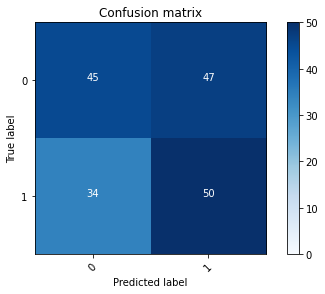

2022-08-21 00:04:22 - [Epoch Train: 96] loss: 0.0170, auc: 0.9998, acc: 0.9918, time: 59.00 s            
2022-08-21 00:04:22 - [Epoch Valid: 96] loss: 3.0240, auc: 0.5730, acc: 0.5344, time: 14.00 s


 96%|██████████████████████████████████████▍ | 96/100 [1:41:47<04:52, 73.10s/it]

2022-08-21 00:04:22 - EPOCH: 97
2022-08-21 00:04:23 - Train Step 10/979, train_loss: 0.0011
2022-08-21 00:04:24 - Train Step 20/979, train_loss: 0.0022
2022-08-21 00:04:24 - Train Step 30/979, train_loss: 0.0030
2022-08-21 00:04:25 - Train Step 40/979, train_loss: 0.0030
2022-08-21 00:04:25 - Train Step 50/979, train_loss: 0.0025
2022-08-21 00:04:26 - Train Step 60/979, train_loss: 0.0023
2022-08-21 00:04:26 - Train Step 70/979, train_loss: 0.0022
2022-08-21 00:04:27 - Train Step 80/979, train_loss: 0.0022
2022-08-21 00:04:28 - Train Step 90/979, train_loss: 0.0026
2022-08-21 00:04:28 - Train Step 100/979, train_loss: 0.0026
2022-08-21 00:04:29 - Train Step 110/979, train_loss: 0.0025
2022-08-21 00:04:29 - Train Step 120/979, train_loss: 0.0078
2022-08-21 00:04:30 - Train Step 130/979, train_loss: 0.0072
2022-08-21 00:04:31 - Train Step 140/979, train_loss: 0.0068
2022-08-21 00:04:31 - Train Step 150/979, train_loss: 0.0064
2022-08-21 00:04:32 - Train Step 160/979, train_loss: 0.0064
2

2022-08-21 00:05:31 - Valid Step 185/247, valid_loss: 2.8536
2022-08-21 00:05:31 - Valid Step 190/247, valid_loss: 2.8436
2022-08-21 00:05:32 - Valid Step 195/247, valid_loss: 2.8582
2022-08-21 00:05:32 - Valid Step 200/247, valid_loss: 2.8175
2022-08-21 00:05:32 - Valid Step 205/247, valid_loss: 2.7954
2022-08-21 00:05:33 - Valid Step 210/247, valid_loss: 2.7296
2022-08-21 00:05:33 - Valid Step 215/247, valid_loss: 2.7359
2022-08-21 00:05:33 - Valid Step 220/247, valid_loss: 2.8572
2022-08-21 00:05:33 - Valid Step 225/247, valid_loss: 2.8469
2022-08-21 00:05:34 - Valid Step 230/247, valid_loss: 2.8697
2022-08-21 00:05:34 - Valid Step 235/247, valid_loss: 2.8627
2022-08-21 00:05:34 - Valid Step 240/247, valid_loss: 2.8308
2022-08-21 00:05:35 - Valid Step 245/247, valid_loss: 2.8286
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
169     00009                0           1
75      00014                1         

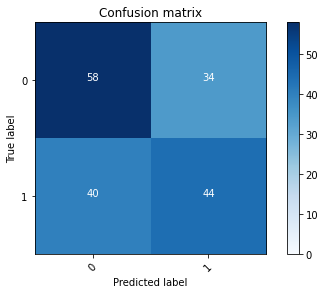

2022-08-21 00:05:35 - [Epoch Train: 97] loss: 0.0155, auc: 0.9999, acc: 0.9949, time: 57.00 s            
2022-08-21 00:05:35 - [Epoch Valid: 97] loss: 2.8611, auc: 0.5762, acc: 0.5789, time: 14.00 s


 97%|██████████████████████████████████████▊ | 97/100 [1:42:59<03:39, 73.01s/it]

2022-08-21 00:05:35 - EPOCH: 98
2022-08-21 00:05:36 - Train Step 10/979, train_loss: 0.0015
2022-08-21 00:05:36 - Train Step 20/979, train_loss: 0.0026
2022-08-21 00:05:37 - Train Step 30/979, train_loss: 0.0034
2022-08-21 00:05:37 - Train Step 40/979, train_loss: 0.0044
2022-08-21 00:05:38 - Train Step 50/979, train_loss: 0.0042
2022-08-21 00:05:39 - Train Step 60/979, train_loss: 0.0037
2022-08-21 00:05:39 - Train Step 70/979, train_loss: 0.0166
2022-08-21 00:05:40 - Train Step 80/979, train_loss: 0.0152
2022-08-21 00:05:40 - Train Step 90/979, train_loss: 0.0138
2022-08-21 00:05:41 - Train Step 100/979, train_loss: 0.0124
2022-08-21 00:05:41 - Train Step 110/979, train_loss: 0.0125
2022-08-21 00:05:42 - Train Step 120/979, train_loss: 0.0118
2022-08-21 00:05:42 - Train Step 130/979, train_loss: 0.0165
2022-08-21 00:05:43 - Train Step 140/979, train_loss: 0.0157
2022-08-21 00:05:44 - Train Step 150/979, train_loss: 0.0148
2022-08-21 00:05:44 - Train Step 160/979, train_loss: 0.0139
2

2022-08-21 00:06:44 - Valid Step 185/247, valid_loss: 3.2710
2022-08-21 00:06:44 - Valid Step 190/247, valid_loss: 3.2526
2022-08-21 00:06:45 - Valid Step 195/247, valid_loss: 3.3110
2022-08-21 00:06:45 - Valid Step 200/247, valid_loss: 3.3342
2022-08-21 00:06:45 - Valid Step 205/247, valid_loss: 3.3501
2022-08-21 00:06:46 - Valid Step 210/247, valid_loss: 3.3264
2022-08-21 00:06:46 - Valid Step 215/247, valid_loss: 3.2983
2022-08-21 00:06:46 - Valid Step 220/247, valid_loss: 3.3107
2022-08-21 00:06:46 - Valid Step 225/247, valid_loss: 3.3038
2022-08-21 00:06:47 - Valid Step 230/247, valid_loss: 3.3085
2022-08-21 00:06:47 - Valid Step 235/247, valid_loss: 3.2546
2022-08-21 00:06:47 - Valid Step 240/247, valid_loss: 3.2696
2022-08-21 00:06:47 - Valid Step 245/247, valid_loss: 3.2060
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
142     00009                0           1
32      00014                1         

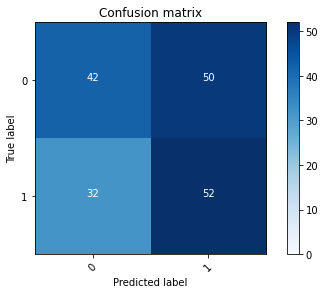

2022-08-21 00:06:48 - [Epoch Train: 98] loss: 0.0165, auc: 0.9998, acc: 0.9949, time: 58.00 s            
2022-08-21 00:06:48 - [Epoch Valid: 98] loss: 3.2516, auc: 0.5716, acc: 0.5304, time: 13.00 s


 98%|███████████████████████████████████████▏| 98/100 [1:44:12<02:25, 72.91s/it]

2022-08-21 00:06:48 - EPOCH: 99
2022-08-21 00:06:48 - Train Step 10/979, train_loss: 0.0054
2022-08-21 00:06:49 - Train Step 20/979, train_loss: 0.0037
2022-08-21 00:06:49 - Train Step 30/979, train_loss: 0.0031
2022-08-21 00:06:50 - Train Step 40/979, train_loss: 0.0094
2022-08-21 00:06:50 - Train Step 50/979, train_loss: 0.0079
2022-08-21 00:06:51 - Train Step 60/979, train_loss: 0.0072
2022-08-21 00:06:51 - Train Step 70/979, train_loss: 0.0064
2022-08-21 00:06:52 - Train Step 80/979, train_loss: 0.0067
2022-08-21 00:06:52 - Train Step 90/979, train_loss: 0.0061
2022-08-21 00:06:53 - Train Step 100/979, train_loss: 0.0072
2022-08-21 00:06:54 - Train Step 110/979, train_loss: 0.0081
2022-08-21 00:06:54 - Train Step 120/979, train_loss: 0.0075
2022-08-21 00:06:55 - Train Step 130/979, train_loss: 0.0080
2022-08-21 00:06:55 - Train Step 140/979, train_loss: 0.0075
2022-08-21 00:06:56 - Train Step 150/979, train_loss: 0.0070
2022-08-21 00:06:56 - Train Step 160/979, train_loss: 0.0075
2

2022-08-21 00:07:56 - Valid Step 185/247, valid_loss: 2.8719
2022-08-21 00:07:56 - Valid Step 190/247, valid_loss: 2.8387
2022-08-21 00:07:57 - Valid Step 195/247, valid_loss: 2.7732
2022-08-21 00:07:57 - Valid Step 200/247, valid_loss: 2.7966
2022-08-21 00:07:57 - Valid Step 205/247, valid_loss: 2.8872
2022-08-21 00:07:58 - Valid Step 210/247, valid_loss: 2.8997
2022-08-21 00:07:58 - Valid Step 215/247, valid_loss: 2.8922
2022-08-21 00:07:58 - Valid Step 220/247, valid_loss: 2.9413
2022-08-21 00:07:58 - Valid Step 225/247, valid_loss: 2.8905
2022-08-21 00:07:59 - Valid Step 230/247, valid_loss: 2.8403
2022-08-21 00:07:59 - Valid Step 235/247, valid_loss: 2.9760
2022-08-21 00:07:59 - Valid Step 240/247, valid_loss: 3.0190
2022-08-21 00:08:00 - Valid Step 245/247, valid_loss: 3.0202
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
3       00009                0           1
168     00014                1         

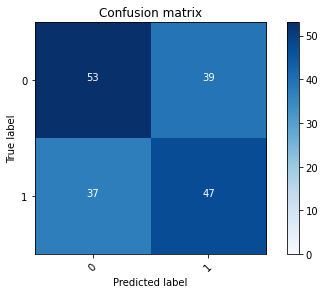

2022-08-21 00:08:00 - [Epoch Train: 99] loss: 0.0107, auc: 1.0000, acc: 0.9959, time: 56.00 s            
2022-08-21 00:08:00 - [Epoch Valid: 99] loss: 3.0646, auc: 0.5762, acc: 0.5628, time: 15.00 s


 99%|███████████████████████████████████████▌| 99/100 [1:45:25<01:12, 72.75s/it]

2022-08-21 00:08:00 - EPOCH: 100
2022-08-21 00:08:01 - Train Step 10/979, train_loss: 0.0210
2022-08-21 00:08:01 - Train Step 20/979, train_loss: 0.0454
2022-08-21 00:08:02 - Train Step 30/979, train_loss: 0.0307
2022-08-21 00:08:02 - Train Step 40/979, train_loss: 0.0236
2022-08-21 00:08:03 - Train Step 50/979, train_loss: 0.0338
2022-08-21 00:08:04 - Train Step 60/979, train_loss: 0.0328
2022-08-21 00:08:04 - Train Step 70/979, train_loss: 0.0314
2022-08-21 00:08:05 - Train Step 80/979, train_loss: 0.0282
2022-08-21 00:08:06 - Train Step 90/979, train_loss: 0.0252
2022-08-21 00:08:06 - Train Step 100/979, train_loss: 0.0244
2022-08-21 00:08:07 - Train Step 110/979, train_loss: 0.0227
2022-08-21 00:08:08 - Train Step 120/979, train_loss: 0.0243
2022-08-21 00:08:08 - Train Step 130/979, train_loss: 0.0227
2022-08-21 00:08:09 - Train Step 140/979, train_loss: 0.0211
2022-08-21 00:08:09 - Train Step 150/979, train_loss: 0.0205
2022-08-21 00:08:10 - Train Step 160/979, train_loss: 0.0202


2022-08-21 00:09:10 - Valid Step 185/247, valid_loss: 2.7640
2022-08-21 00:09:10 - Valid Step 190/247, valid_loss: 2.7803
2022-08-21 00:09:11 - Valid Step 195/247, valid_loss: 2.7593
2022-08-21 00:09:11 - Valid Step 200/247, valid_loss: 2.7132
2022-08-21 00:09:11 - Valid Step 205/247, valid_loss: 2.8266
2022-08-21 00:09:12 - Valid Step 210/247, valid_loss: 2.8419
2022-08-21 00:09:12 - Valid Step 215/247, valid_loss: 2.8672
2022-08-21 00:09:12 - Valid Step 220/247, valid_loss: 2.8414
2022-08-21 00:09:13 - Valid Step 225/247, valid_loss: 2.8073
2022-08-21 00:09:13 - Valid Step 230/247, valid_loss: 2.7488
2022-08-21 00:09:13 - Valid Step 235/247, valid_loss: 2.7607
2022-08-21 00:09:13 - Valid Step 240/247, valid_loss: 2.7383
2022-08-21 00:09:14 - Valid Step 245/247, valid_loss: 2.7805
KEY | True VAL | Array of preds VAL | Pred Avg VAL | is correct
First 64 results:
    BraTS21ID  MGMT_real_value  MGMT_value
7       00009                0           0
136     00014                1         

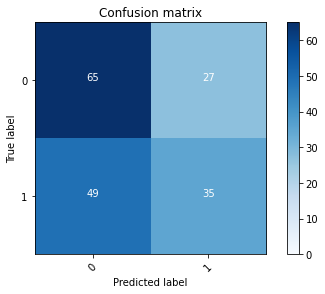

2022-08-21 00:09:14 - [Epoch Train: 100] loss: 0.0220, auc: 0.9996, acc: 0.9928, time: 59.00 s            
2022-08-21 00:09:14 - [Epoch Valid: 100] loss: 2.7701, auc: 0.5724, acc: 0.5749, time: 14.00 s


100%|███████████████████████████████████████| 100/100 [1:46:39<00:00, 63.99s/it]


In [12]:
import importlib
from utils import dataset_utils
importlib.reload(dataset_utils)

for i in range(5):
    print(f"-- FOLD N:{i}")
    to = info["train_origin"]
    print(f"Train origin: {to}")
    packs = dataset_utils.generate_datasets(['KLF'], info, transform, sel_slices, m_path=dir_path, n_path=new_dir_path) #m_path=dir_path, 
    print(packs)
    loader_packs = dataset_utils.get_loaders(packs, info, is_fold=True, fold_num=i)
    print(loader_packs)
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    logging.info("Using CUDA...")

    pd.set_option("display.max_rows", None, "display.max_columns", None)
    #print(loader_packs['KLF']['m_dataloaders'])
    selected_type = info["mri_types"][0]
    print(selected_type)
    dataloader = loader_packs[selected_type][f"{to}_dataloaders"]#m_dataloaders[0]
    # Train
    train_loader = dataloader[0]
    # Val
    val_loader = dataloader[1]

    m_model = try_and_get_model(chosen_net, info["dims"], size, info["is_depth_wise"], info["output_size"])

    print(info)
    m_modelfile = train_mri_type(m_model, device, info, epochs=100, pat=100, 
                           train_loader=train_loader, valid_loader=val_loader)

../RSNA-BTC-Datasets/out_models/fold0_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_14-21-30/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e67-loss2.984-acc0.574-auc0.524.pth
{'ext': 'mat', 'dims': 2, 'batch_size': 1, 'mri_types': ['KLF'], 'is_depth_wise': 'True', 'is_transformed': 'False', 'output_size': 1, 'is_multistep': 'True', 'lr': 0.0001, 'is_adam': 'True', 'momentum': 0.9, 'is_10_fold': 'False', 'val_total_ratio': 0.2, 'is_internal_dataset': 'True', 'train_origin': 'mn', 'val_origin': 'mn', 'net': 'RSNAAlternativeClassifierSingle2D'}
-- FOLD N:0
Train origin: mn
Type: KLF
2022-08-21 00:18:52 - (M0) Train/Val datasets size: 270
2022-08-21 00:18:52 - (M1) Train/Val datasets size: 303
2022-08-21 00:18:52 - (N0) Train/Val datasets size: 170
2022-08-21 00:18:52 - (N1) Train/Val datasets size: 121
2022-08-21 00:18:52 - Concatenating M0 and N0...
Length of concatenated dataset: 540
2022-08-21 00:18:52 - (MN0) Train/Val datasets size: 540
2022-08-21 00:18:52 - Concatenating M1 

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([0, 1, 2, 3, 6, 7, 9, 10, 11, 13, 14, 15, 17, 19, 21, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 37, 38, 39, 40, 41, 42, 43, 45, 46, 47, 48, 50, 52, 53, 54, 55, 56, 57, 58, 59, 60, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 78, 80, 81, 82, 83, 84, 86, 87, 88, 89, 90, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 104, 105, 106, 107, 108, 109, 110, 111, 113, 114, 115, 117, 118, 120, 121, 122, 123, 125, 127, 128, 129, 130, 131, 133, 134, 135, 136, 137, 139, 140, 141, 142, 143, 145, 146, 148, 149, 150, 152, 153, 154, 155, 157, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 174, 175, 178, 180, 181, 182, 183, 184, 185, 186, 187, 188, 190, 191, 192, 193, 194, 195, 197, 198, 200, 201, 202, 203, 204, 205, 208, 209, 211, 213, 215, 216, 217, 218, 219, 220, 221, 222, 223, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 238, 240, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 2

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa4fa7fdac0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa55017a3d0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa5501642b0>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa50e0afbb0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa50e0afdc0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa50e0afb80>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa55033fc10>, <torch.utils.data.dataloader.DataLoader object at 0x7fa57411da30>, <torch.utils.data.dataloader.DataLoader object at 0x7fa4fa7435b0>]}}
2022-08-21 00:30:03 - Using CUDA...
KLF

PREDICTIONS:
fold0_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_14-21-30
2022-08-21 00:30:03 - Predict: ../RSNA-BTC-Datasets/out_models/fold0_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_14-21-30/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e67-loss2.984-acc0.574-auc0.5

2022-08-21 00:30:23 - (M1) Train/Val datasets size: 303
2022-08-21 00:30:23 - (N0) Train/Val datasets size: 170
2022-08-21 00:30:23 - (N1) Train/Val datasets size: 121
2022-08-21 00:30:23 - Concatenating M0 and N0...
Length of concatenated dataset: 540
2022-08-21 00:30:23 - (MN0) Train/Val datasets size: 540
2022-08-21 00:30:23 - Concatenating M1 and N1...
Length of concatenated dataset: 606
2022-08-21 00:30:23 - (MN1) Train/Val datasets size: 606
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa50e0affd0>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fa50e0afeb0>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa55022a9a0>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7fa55022a8e0>, 'mn_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa55022ad60>, 'mn_dataset_1': <utils.dataset_utils.Dataset object at 0x7fa50e0aff10>, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Typ

/tmp/ipykernel_2905072/2737460485.py:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


[([0, 2, 4, 5, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 40, 42, 43, 44, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 73, 74, 75, 76, 77, 79, 84, 85, 86, 88, 90, 91, 93, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 119, 120, 121, 123, 124, 125, 126, 127, 128, 129, 132, 133, 134, 135, 136, 137, 138, 140, 141, 142, 143, 144, 147, 148, 149, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 183, 184, 185, 186, 188, 189, 190, 191, 192, 193, 194, 195, 196, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 210, 212, 213, 214, 215, 216, 219, 220, 222, 223, 224, 225, 226, 228, 229, 231, 232, 234, 236, 237, 238, 239, 241, 243, 244, 245, 246, 247, 248, 249, 250, 251, 253, 256, 257, 258, 259, 260, 261, 262, 264, 265, 266, 268,

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([0, 2, 4, 5, 7, 8, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 25, 26, 28, 29, 31, 32, 33, 34, 36, 37, 38, 39, 40, 42, 43, 44, 47, 48, 49, 50, 51, 52, 53, 55, 56, 57, 58, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 73, 74, 75, 76, 77, 79, 84, 85, 86, 88, 90, 91, 93, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 119, 120, 121, 123, 124, 125, 126, 127, 128, 129, 132, 133, 134, 135, 136, 137, 138, 140, 141, 142, 143, 144, 147, 148, 149, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 183, 184, 185, 186, 188, 189, 190, 191, 192, 193, 194, 195, 196, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 210, 212, 213, 214, 215, 216, 219, 220, 222, 223, 224, 225, 226, 228, 229, 231, 232, 234, 236, 237, 238, 239, 241, 243, 244, 245, 246, 247, 248, 

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa4fa7fdc10>, <torch.utils.data.dataloader.DataLoader object at 0x7fa50e3b6d60>, <torch.utils.data.dataloader.DataLoader object at 0x7fa50e0afee0>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa4fa7baa90>, <torch.utils.data.dataloader.DataLoader object at 0x7fa4fa7ba790>, <torch.utils.data.dataloader.DataLoader object at 0x7fa4fa7ba910>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa50e0c5d30>, <torch.utils.data.dataloader.DataLoader object at 0x7fa50e0c5cd0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa50e0c5c40>]}}
2022-08-21 00:40:58 - Using CUDA...
KLF

PREDICTIONS:
fold1_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_16-20-40
2022-08-21 00:40:58 - Predict: ../RSNA-BTC-Datasets/out_models/fold1_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_16-20-40/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e5-loss0.708-acc0.521-auc0.53

2022-08-21 00:41:19 - (M1) Train/Val datasets size: 303
2022-08-21 00:41:19 - (N0) Train/Val datasets size: 170
2022-08-21 00:41:19 - (N1) Train/Val datasets size: 121
2022-08-21 00:41:19 - Concatenating M0 and N0...
Length of concatenated dataset: 540
2022-08-21 00:41:19 - (MN0) Train/Val datasets size: 540
2022-08-21 00:41:19 - Concatenating M1 and N1...
Length of concatenated dataset: 606
2022-08-21 00:41:19 - (MN1) Train/Val datasets size: 606
{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa50e324490>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fa50e324e80>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa50e3243d0>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7fa50e3246d0>, 'mn_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa5503fa400>, 'mn_dataset_1': <utils.dataset_utils.Dataset object at 0x7fa50e3d9e80>, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Typ

/tmp/ipykernel_2905072/2737460485.py:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


[([0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 29, 30, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 57, 59, 60, 61, 62, 63, 64, 66, 67, 69, 70, 71, 72, 73, 76, 77, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 99, 101, 102, 103, 104, 105, 106, 107, 108, 109, 112, 113, 114, 116, 117, 118, 119, 120, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 135, 137, 138, 139, 140, 141, 142, 144, 145, 146, 147, 148, 150, 151, 154, 155, 156, 158, 159, 161, 162, 163, 166, 167, 168, 170, 171, 172, 173, 176, 177, 178, 179, 180, 181, 182, 184, 187, 188, 189, 190, 191, 192, 195, 196, 197, 198, 199, 200, 201, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 224, 226, 227, 228, 229, 230, 231, 232, 233, 235, 236, 237, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 250, 252, 254, 255, 256, 257, 258, 259, 260, 262, 263, 264, 265, 266, 267, 268, 269, 271, 2

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([0, 1, 2, 3, 4, 5, 6, 8, 9, 10, 11, 12, 13, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 29, 30, 34, 35, 36, 38, 39, 40, 41, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 57, 59, 60, 61, 62, 63, 64, 66, 67, 69, 70, 71, 72, 73, 76, 77, 78, 79, 80, 81, 82, 83, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 99, 101, 102, 103, 104, 105, 106, 107, 108, 109, 112, 113, 114, 116, 117, 118, 119, 120, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 135, 137, 138, 139, 140, 141, 142, 144, 145, 146, 147, 148, 150, 151, 154, 155, 156, 158, 159, 161, 162, 163, 166, 167, 168, 170, 171, 172, 173, 176, 177, 178, 179, 180, 181, 182, 184, 187, 188, 189, 190, 191, 192, 195, 196, 197, 198, 199, 200, 201, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 224, 226, 227, 228, 229, 230, 231, 232, 233, 235, 236, 237, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 250, 252, 254, 25

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa5503534f0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa50e3d9c70>, <torch.utils.data.dataloader.DataLoader object at 0x7fa50e4b45b0>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa5502cf790>, <torch.utils.data.dataloader.DataLoader object at 0x7fa50e0affd0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa4fa7ba190>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa50e4958b0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa55021b6d0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa4fa7ba310>]}}
2022-08-21 00:53:33 - Using CUDA...
KLF

PREDICTIONS:
fold2_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_18-21-17
2022-08-21 00:53:33 - Predict: ../RSNA-BTC-Datasets/out_models/fold2_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_18-21-17/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e68-loss2.548-acc0.591-auc0.5

../RSNA-BTC-Datasets/out_models/fold3_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_20-22-07/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e10-loss0.710-acc0.545-auc0.548.pth
{'ext': 'mat', 'dims': 2, 'batch_size': 1, 'mri_types': ['KLF'], 'is_depth_wise': 'True', 'is_transformed': 'False', 'output_size': 1, 'is_multistep': 'True', 'lr': 0.0001, 'is_adam': 'True', 'momentum': 0.9, 'is_10_fold': 'False', 'val_total_ratio': 0.2, 'is_internal_dataset': 'True', 'train_origin': 'mn', 'val_origin': 'mn', 'net': 'RSNAAlternativeClassifierSingle2D'}
-- FOLD N:3
Train origin: mn
Type: KLF
2022-08-21 00:54:02 - (M0) Train/Val datasets size: 270
2022-08-21 00:54:02 - (M1) Train/Val datasets size: 303
2022-08-21 00:54:02 - (N0) Train/Val datasets size: 170
2022-08-21 00:54:02 - (N1) Train/Val datasets size: 121
2022-08-21 00:54:02 - Concatenating M0 and N0...
Length of concatenated dataset: 540
2022-08-21 00:54:02 - (MN0) Train/Val datasets size: 540
2022-08-21 00:54:02 - Concatenating M1 

/tmp/ipykernel_2905072/2737460485.py:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


{'KLF': {'m_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa5504290d0>, 'm_dataset_1': <utils.dataset_utils.Dataset object at 0x7fa550429f40>, 'f_dataset_0': None, 'f_dataset_1': None, 'h_dataset_0': None, 'n_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa550429ca0>, 'n_dataset_1': <utils.dataset_utils.Dataset object at 0x7fa550429730>, 'mn_dataset_0': <utils.dataset_utils.Dataset object at 0x7fa550429d60>, 'mn_dataset_1': <utils.dataset_utils.Dataset object at 0x7fa5503f5a30>, 'fn_dataset_0': None, 'fn_dataset_1': None}}
Type: KLF
Length of concatenated dataset: 606
Length of concatenated dataset: 606
[([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 41, 42, 43, 44, 45, 46, 47, 49, 51, 52, 54, 55, 56, 57, 58, 59, 61, 62, 64, 65, 66, 68, 71, 72, 74, 75, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 94, 97, 98, 100, 102, 103, 104, 106, 109, 110, 111, 112, 113, 115, 116, 118, 119

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 12, 13, 14, 15, 16, 17, 18, 20, 21, 22, 24, 25, 26, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 41, 42, 43, 44, 45, 46, 47, 49, 51, 52, 54, 55, 56, 57, 58, 59, 61, 62, 64, 65, 66, 68, 71, 72, 74, 75, 77, 78, 79, 80, 81, 82, 83, 84, 85, 87, 88, 89, 90, 91, 92, 94, 97, 98, 100, 102, 103, 104, 106, 109, 110, 111, 112, 113, 115, 116, 118, 119, 120, 121, 122, 124, 125, 126, 127, 128, 130, 131, 132, 133, 134, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 155, 156, 157, 158, 160, 161, 162, 163, 164, 165, 168, 169, 171, 172, 173, 174, 175, 176, 177, 179, 181, 182, 183, 184, 185, 186, 187, 189, 193, 194, 195, 196, 197, 198, 199, 200, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 221, 222, 223, 224, 225, 227, 228, 230, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 244, 245, 248, 249, 250, 251, 252, 2

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa50e3d42e0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa51202f640>, <torch.utils.data.dataloader.DataLoader object at 0x7fa50e3b6be0>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa50e3243d0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa50e3246d0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa5505e2a60>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa5503f58e0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa5503f5130>, <torch.utils.data.dataloader.DataLoader object at 0x7fa5503f59a0>]}}
2022-08-21 01:07:12 - Using CUDA...
KLF

PREDICTIONS:
fold3_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_20-22-07
2022-08-21 01:07:12 - Predict: ../RSNA-BTC-Datasets/out_models/fold3_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_20-22-07/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e10-loss0.710-acc0.545-auc0.5

Prob:
[array([0.23861332], dtype=float32), array([0.70892423], dtype=float32), array([0.43763176], dtype=float32), array([0.59774125], dtype=float32), array([0.28491595], dtype=float32), array([0.22562401], dtype=float32), array([0.3749596], dtype=float32), array([0.373678], dtype=float32), array([0.42401063], dtype=float32), array([0.73516047], dtype=float32), array([0.38130772], dtype=float32), array([0.4151401], dtype=float32), array([0.728137], dtype=float32), array([0.3141232], dtype=float32), array([0.6015769], dtype=float32), array([0.48996463], dtype=float32), array([0.7862545], dtype=float32), array([0.42823368], dtype=float32), array([0.41999614], dtype=float32), array([0.5882612], dtype=float32), array([0.6580628], dtype=float32), array([0.4548354], dtype=float32), array([0.5629693], dtype=float32), array([0.46340308], dtype=float32), array([0.56844354], dtype=float32), array([0.5754268], dtype=float32), array([0.51004136], dtype=float32), array([0.46079454], dtype=float32),

/tmp/ipykernel_2905072/2737460485.py:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


[([1, 3, 4, 5, 6, 7, 8, 9, 11, 12, 14, 15, 16, 18, 19, 20, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 56, 58, 59, 60, 61, 62, 63, 65, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 89, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 105, 107, 108, 110, 111, 112, 114, 115, 116, 117, 118, 119, 121, 122, 123, 124, 126, 129, 130, 131, 132, 134, 135, 136, 138, 139, 143, 144, 145, 146, 147, 149, 150, 151, 152, 153, 154, 156, 157, 158, 159, 160, 162, 164, 165, 166, 167, 169, 170, 173, 174, 175, 176, 177, 178, 179, 180, 182, 183, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 196, 197, 199, 201, 202, 203, 206, 207, 208, 209, 210, 211, 212, 214, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 229, 230, 231, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 246, 247, 249, 251, 252, 253, 254, 255, 256, 257, 258, 261, 263, 266, 267, 268, 269, 270, 271, 272, 273, 

Length of concatenated dataset: 1212
Length of concatenated dataset: 1212
[([1, 3, 4, 5, 6, 7, 8, 9, 11, 12, 14, 15, 16, 18, 19, 20, 22, 23, 24, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 44, 45, 46, 47, 48, 49, 50, 51, 53, 54, 56, 58, 59, 60, 61, 62, 63, 65, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 89, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 105, 107, 108, 110, 111, 112, 114, 115, 116, 117, 118, 119, 121, 122, 123, 124, 126, 129, 130, 131, 132, 134, 135, 136, 138, 139, 143, 144, 145, 146, 147, 149, 150, 151, 152, 153, 154, 156, 157, 158, 159, 160, 162, 164, 165, 166, 167, 169, 170, 173, 174, 175, 176, 177, 178, 179, 180, 182, 183, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 196, 197, 199, 201, 202, 203, 206, 207, 208, 209, 210, 211, 212, 214, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 229, 230, 231, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 246, 247, 249, 251, 252, 253, 2

{'KLF': {'m_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa50e3b69a0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa55022a1f0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa55025b850>], 'n_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa5505512b0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa5505e90d0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa5502cfb50>], 'mn_dataloaders': [<torch.utils.data.dataloader.DataLoader object at 0x7fa50e2c65e0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa5505c5dc0>, <torch.utils.data.dataloader.DataLoader object at 0x7fa5505c55e0>]}}
2022-08-21 01:19:32 - Using CUDA...
KLF

PREDICTIONS:
fold4_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35
2022-08-21 01:19:32 - Predict: ../RSNA-BTC-Datasets/out_models/fold4_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35/RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn-e43-loss1.153-acc0.603-auc0.5

/tmp/ipykernel_2905072/2737460485.py:85: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)
/tmp/ipykernel_2905072/2737460485.py:93: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  metrics = metrics.append(pd_metrics, ignore_index=True)


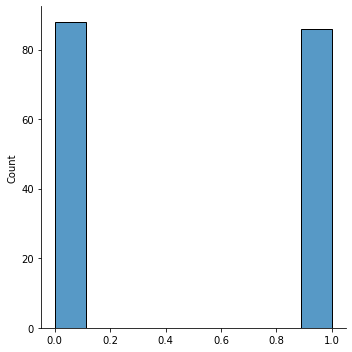

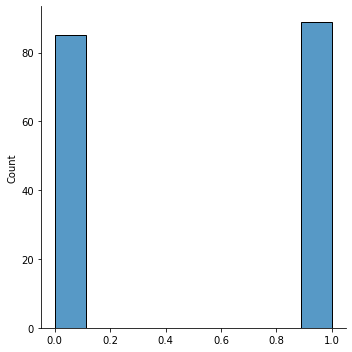

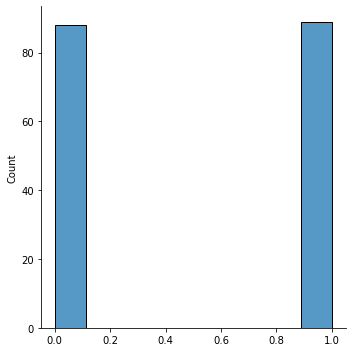

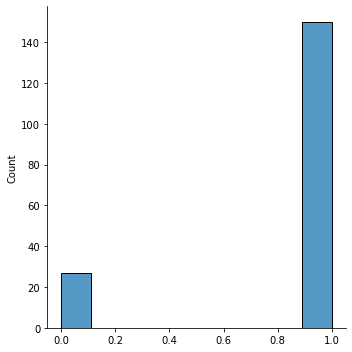

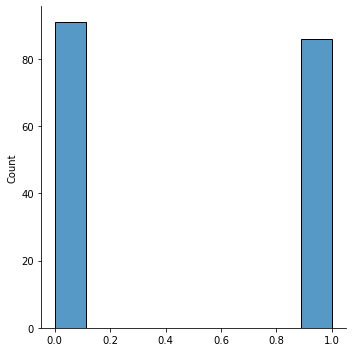

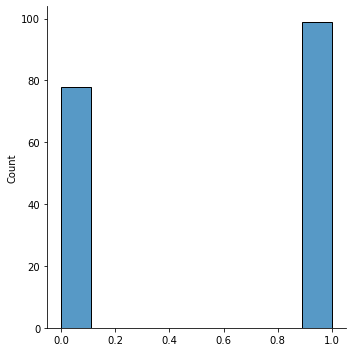

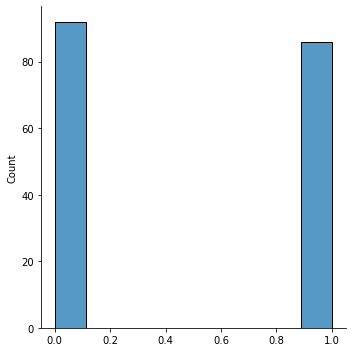

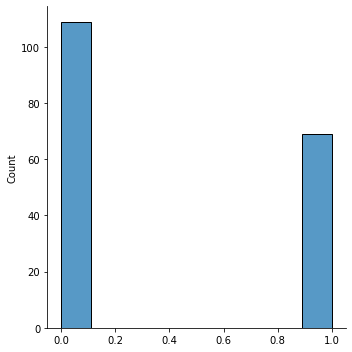

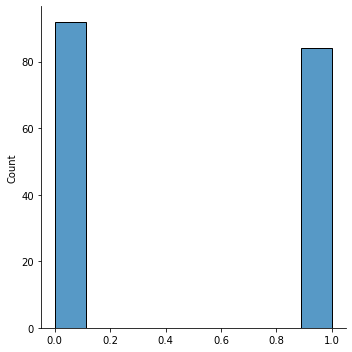

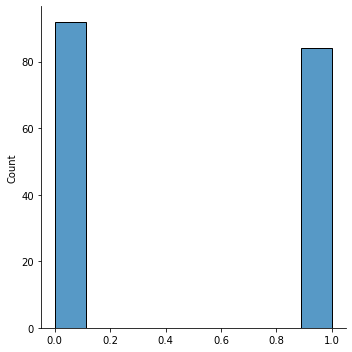

In [13]:
import importlib
from utils import dataset_utils
importlib.reload(dataset_utils)

metrics = pd.DataFrame({"model": [], "AUC": [], "acc": [], "spec": [], "sens": [], "prec": []})
i = 0
"""
folders_list = [
    "fold0_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-m_Aug19_09-40-29",
    "fold1_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-m_Aug19_10-15-21",
    "fold2_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-m_Aug19_10-50-28",
    "fold3_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-m_Aug19_09-42-53",
    "fold4_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-m_Aug19_10-18-34"
]
"""
"""
folders_list = [
    "fold0_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-n_Aug19_14-13-35",
    "fold1_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-n_Aug19_14-45-29",
    "fold2_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-n_Aug19_15-18-20",
    "fold3_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-n_Aug19_15-51-21",
    "fold4_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-n_Aug19_16-23-56"
]
"""
folders_list = [
    "fold0_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_14-21-30",
    "fold1_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_16-20-40",
    "fold2_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_18-21-17",
    "fold3_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_20-22-07",
    "fold4_RSNAAlternativeClassifierSingle2D-DW-SO-KLF-mn_Aug20_22-22-35"
]

y_all = []
y_pred_all = []
y_prob_all = []

for folder in folders_list:
    model_common_path = "../RSNA-BTC-Datasets/out_models/"
    model_folder = model_common_path + folder

    model_basefile, info = get_best_model(model_folder)
    m_modelfile = model_folder + "/" + model_basefile
    transform = None
    size = len(info["mri_types"])
    sel_slices = 1 if info["dims"] == 2 else None
    chosen_net = "alt" if info["dims"] == 2 else "sim"
    
    m_model = try_and_get_model(chosen_net, info["dims"], size, info["is_depth_wise"], info["output_size"])

    #m_modelfile = m_modelfile_3d
    print(m_modelfile)
    print(info)
    print(f"-- FOLD N:{i}")
    to = "mn"#info["train_origin"]
    print(f"Train origin: {to}")
    packs = dataset_utils.generate_datasets(['KLF'], info, transform, sel_slices, m_path=dir_path, n_path=new_dir_path) #m_path=dir_path, n_path=new_dir_path
    print(packs)
    loader_packs = dataset_utils.get_loaders(packs, info, is_fold=True, fold_num=i)
    print(loader_packs)
    
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    logging.info("Using CUDA...")

    pd.set_option("display.max_rows", None, "display.max_columns", None)
    #print(loader_packs['KLF']['m_dataloaders'])
    selected_type = info["mri_types"][0]
    print(selected_type)
    dataloader = loader_packs[selected_type][f"{to}_dataloaders"]#m_dataloaders[0]
    val_loader = dataloader[1]
    #val_loader = dataloader[2] #full
    
    print("\nPREDICTIONS:")
    print(folder)
    #print(f"Test set: {to} (B)")
    test_loader = val_loader
    m_test_pred, ids, X, y, y_pred, y_prob = predict(m_model, device, m_modelfile, test_loader, size)
    pd_metrics = get_metrics(y, y_pred, y_prob, f"{folder}_AB")
    y_all = y_all + y
    y_pred_all = y_pred_all + y_pred
    y_prob_all = y_prob_all + y_prob
        
    preddfA = pd.DataFrame({"BraTS21ID": ids, "MGMT_real_value": y, "MGMT_pred_value": y_pred, "MGMT_prob_value": y_prob}) 
    preddfA = preddfA.sort_values(by="BraTS21ID")
    preddfA.to_csv(f"pred_metrics/{folder}_AB.csv", index=False)
    metrics = metrics.append(pd_metrics, ignore_index=True)
    #pd_metrics.to_csv(f"pred_metrics/{folder}_{to}_A_metrics.csv", index=False)
    
    print("----------\n")
    
    i += 1

pd_metrics = get_metrics(y_all, y_pred_all, y_prob_all, f"all_AB")
metrics = metrics.append(pd_metrics, ignore_index=True)
metrics.to_csv(f"pred_metrics/all_metrics_fold_2d_AB.csv", index=False)

In [14]:
metrics

,model,AUC,acc,spec,sens,prec
0,fold0_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.524115,0.568966,0.556818,0.581395,0.561798
1,fold1_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.535240,0.519774,0.170455,0.865169,0.513333
2,fold2_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.540123,0.531073,0.472527,0.593023,0.515152
3,fold3_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.548407,0.522472,0.630435,0.406977,0.507246
4,fold4_RSNAAlternativeClassifierSingle2D-DW-SO-...,0.570523,0.545455,0.565217,0.523810,0.523810
5,all_AB,0.551710,0.537415,0.481153,0.596288,0.523422
